# Assignment 3

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## SECTION 1 : Preparations

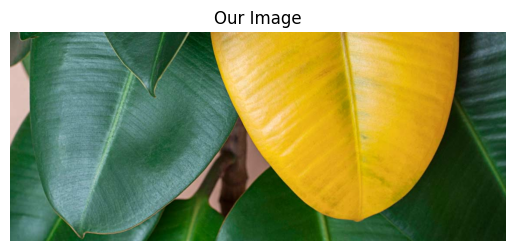

In [1]:
# @title
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

img_str = """
/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAAAjAAD/4QMsaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA2LjAtYzAwMiA3OS4xNjQzNTIsIDIwMjAvMDEvMzAtMTU6NTA6MzggICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLyIgeG1sbnM6eG1wTU09Imh0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC9tbS8iIHhtbG5zOnN0UmVmPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvc1R5cGUvUmVzb3VyY2VSZWYjIiB4bXA6Q3JlYXRvclRvb2w9IkFkb2JlIFBob3Rvc2hvcCAyMS4xIChXaW5kb3dzKSIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDo1NDU0OTQ5Mjg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDo1NDU0OTQ5Mzg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCI+IDx4bXBNTTpEZXJpdmVkRnJvbSBzdFJlZjppbnN0YW5jZUlEPSJ4bXAuaWlkOjU0NTQ5NDkwODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIiBzdFJlZjpkb2N1bWVudElEPSJ4bXAuZGlkOjU0NTQ5NDkxODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIi8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQADgoKCgsKDgsLDhQNCw0UGBIODhIYGxYWFxYWGxoUFxcXFxQaGh8gIyAfGikpLS0pKT07Ozs9QEBAQEBAQEBAQAEPDQ0PEQ8SEBASFA4RDhQXEhQUEhchFxcZFxchKh4aGhoaHiomKSMjIykmLy8qKi8vOjo4OjpAQEBAQEBAQEBA/8AAEQgB4AR0AwEiAAIRAQMRAf/EAKUAAAMBAQEBAQAAAAAAAAAAAAECAwAEBQYHAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUGEAABAwMDAgQFAQcEAQIGAwABABECITEDQVESYQRxgSITkaGxMgVCwdHhUiMUBvDxcjNikhWCwkMkJTWyUzQRAQEAAgECBAUDAwMEAgMBAAABEQIhMQNBURIEYXGBIjKRUhOhsUIjMwXB0WJy4YLwkkMU/9oADAMBAAIRAxEAPwD54BMImyaMU0brNEi8AJdpmhKoA5DpReGCCbCpZl72EchOAqZwkB4tRfPhxNjQi4KVZe4n434OjGYcDVpKcxIFuTx0SREieIqXei6sfZZpR5SDdDQn4peqMddLekc5MpFzU2Cf2ZCsrGw1Vx2neCX3Y8Y0BLlkRxjJsrZWvxo/mpt+bT+PE666/NOJ4GgcjRYnkXKbJKEj6IcBrV1gGYkOqjO3nrnBW3Q4km1FcCL2bxTgGQ9NBZVIM5S9uQYGjo+wRWlVUYJSYn4phjOqeD5RGNtQdlWGISqSycYS/RXhggSAC3inICxhjgfUXjsqR9iZegCP9uJGhoie04gGBd7BVDP/APbggcmG66Iy7cP8iox7QgPIVOisMAIacS/RVAfHLtx9zJ27bI9EkMECW/V1TDA0WEa7jRMMIdsSQPtA1RMMUPtI40SmLXCsY4ZAX8WQCyh29wWlsFuMSKEEWFfqiMOAiknJqQFj2cB9mQE3MTRAHHCMZAxNfivI/K9qcWfnGkcvqBG/6gvV/sZxrGTEB3BUu47XNmwShIuRWHSSneZmcdDnk8MwD0oAsxAcDwTwBiT7lCNOoQ5GTtQaMo8BUJes1d0wjECzyTmIBcAV3ScWLiuzogbkSWYAIswoUSTJokcWDUCHOMA1zvomGcx1qlM5SDW6IExkXkW6ocATQuEhGBAO+6PI7PWjo8LaDdMPbB16JmnEObKwaN9EQZaUCFyzIAFpM1ETFrFZy/pteiDgOTQIBSQC92+CTBGWXMHqHRnOJPpr4qnZgCRmaCIJWfcvCaHfZnmYg2ouEycuqZvvJf1EqBRpOBr0Y1KDuERdhqFo2VKYRo61ujJifSClYylxFykeHb+J7KXd91GnoFZHoFf/ACPvRlyx7TGWxYbtuusGP4n8Ych/78o9O9V817kjIymeRlUv1US5ufLou/brjxqdP91iFXjEig8tUnE6aKmeSVBponGQkeqv1RAgfuuNkDBjQu+yDyaIFxUfNer/AI7MjvZDSUD8l5IEo1XofhcvH8nhEi3ImPxCy70z2t5/41ft7ju6X/y/u+wjAv4p+I80cYVREC68nW5exQgBx6qkPUCTYJIBz0XTCMYlrUqFv25n5M9rgccWI3ayqZAl7AKEpsf26sl5uCHd9ld2knBTlczgYSH6jUpefIAMx3vdCOORiG8wnjChFQ31We12pzED2yGpRPEB+iInFiNNehU6yk8aFTxOnJ9TcgKboCUiwcsaB1hF2lZkwaosRZTcgpg1SgY1v5pwafNJLQHdZ9zGDmSl/JAGtNEzHyREWtqua5qitfcotpomIcMLpbFK8BnDIGjFZkPDzU7Xg8Ca+GqF7WRAdayi2mVg9dVn80DfotZAYOyxWJAH7FhboigHWvdEhkoIKAzV+iyDraoAEslkQiSpTLvqqkIJyDBSLmqYQJL/ABTcAB1V9C6piOp+KB3sE5f/AHSSj5n5JwYPjIMSLOEe8JlFmvEJYNH1SurZYPjEjqF1e2v27z5VG3GA/HiLRbzZe1Anj91914f44tK9HXvwgJQ6stexc3eeVRv1gDIQwk3wW5tUs6M8T1FxdKcRHhqFvZsnIksxISGUbChQkJUcEBYwJP0UbXbnEXKxIIYnogGIb5IES2SEl6hY7dyzrFRRw3mklqWokMiFvcNjqs73Nbx0PAe2H1SmJtdMZjUIiUaLOzW9KrlIirpCAA9laTFDgCsdtDlSqh9U7B0CGKylNN2WdMRqgwVymzokulstXVGAZlmSkkIci7J4MSAyVtUX81jIGicImqU3ZPdA1VGnIVSGisQ6nKPzVSglVtVmPkt4qgzqU7/RUNqKZ6p6lUsv2lfn/dF+5yn/AMz9V+gZvsPgV+fZy+fJ/wA5fVep7D/L6OX3XTX5lFOqKATAOu5xmhVduKBYEBcsI7Ltw0DEqomunFEarpjGQIOhUISiqwybfBWiqEkOicwMWKSXImyFAG1QKYSAoLFUExMcWqkiAQHCvjhG9k+SIxAayX2agmyrKVWC0QTGttEsFR4x4Nosk6Osgk08IusyeIZYuk8XiRKNCKqWbs+xyzOaUZQnKsoxZiqkUCWVAiyUrJjmFgMOKJ9rGIf+V5fEqOWZJHVUkWiVz8nmB1Skk6I2vgbuf+0EUAYFlzSrTUq2Yn3JV1soN6m1U3q59utMImNTXonAdvogXMWNVWECz6BVEBjjYrphxYyJ9Mfmeil6RTogZuwiKDROHOFfeJHEC+pTAgCtSoet2FDsqxBat05TyrGLkGzK4MRduq5hE7sCsITNAabqsm6xlxCkiKq+PNiABcPZcWHs45HlKbNYLoh28WqTRVLQ64dx215FzZlv73DGRLlzQFch7Z/UCQ1kPZBcEF083yDsHddvwchzeyI7zDEca112XHHDJ9W6rHEHF3F0ZodZ7nAWYsWRh3GFuIPqFnsuWOKFARXdOIxDkBjo6M0OiOftgGcAph3GORIJHE6qAxYshYvGRQn2kRJonp0TzQ6RmiJUYwYsHTiUTUkAUdrLhPbydwQ1iknjlEsQSBUMjIS/M9rGOSOfHXHP720kP3rijwMSS+wAXrY/WDjyh4TDSfTqvIyQy4M+THIMYlj4brLpcfoq8zLe5AHj9z36LNilVuJ20QEKHUlEQIpYHVNKWTK44woPmVOUJEP8gnywL0N0kYyd5E0SMvtnxVoxEQ1kY0sL6rEeaeBQiA9SmAP8rvqj/TAZiNkDKQI4miAakb6LcgbB+tkgBd9UXY1LSu26YjESf1Gp0CQxraqJNyaFJIk1JSMkwxaVtVeLY+2JP6i3koCDzAkWa6r3tOMBaIsst+bIi9XHkl5v8VKVE5rX4JJF1U6Kk4Ct0QzugjTRBxiV6n4TsvfzHNk/68dSvNxwllyRxxDkle53k/8A27sY9th/7cg9ZU7XwnivWeN6R5v5nvT33dGMD/TxUgNCvLkGJf5K0of+pK2khXdPGJhFttykCYl4lUBjkIf0y3QlDjUCm6UgCoQRpQPLoVuJCeGRwIny3TmAYG8el0FlEbgqvbZDi7rDkN4zifmlkKgxDHRasfuFRYpWZlnmeu2LL5V+gwfSiqIkkPbVcvZZPd7fFlBfnCJ+S7o/7rw9My3W/wCNw923iWeLRaNWSyymThmNk0hYDxTY8YBK31t6RnsnCE5EuGCtjw0oPFUhD1Bh5FXAAiNlc1ninNbg2wOyJgxNGcVbdDlX9yI5Euf4qrZ0g5TOEEk+YC3AafFWHoAFnSzFf+V1nddZMqmUrlgaLAb6IkjkRrulDs6w23ORpXca0KVnfpoqM9RZYROijbXKih3dk1LajRElwGvYpJbvVKya/EC7ONrFTIYdUXMn0R4uPD4rPb7uhpsFtETTw3QFmWFwoTRK29USaIO5UcgDRC4Y2TNugAP4KhlmCBKJZzVY2pbRL5kmSf4oCJJqjIaop5NiAkkXKc1ogIpz4hJpENoj7dKqjhAp58gQhlOScpT8AqgTOyEqCtTsmlemqViC481WCsCIPIE1Og2XaYmWIwJcCxXJG4Juu2DGJAq4db+2v+p6f3TDPdydt6cpGjr3sBPESegpVeHjaOcjey9jtyeC09ttZ3d5Ub9I6uTUuRUIgPpdT5AVd3sniSSK/Fd0vwRj4txEhsVPgSHJY7qjEmqzgaWRcXrDiJifjqllFz9Fd3FqdUhl+5Y7zXzXHPKAZSljAK7GiSUvELDftS+XKpXFLGQKeKmYm67ZY6MfJTlj1Zcu/Yxczhc2crkdETMmipKJ2SGPxWF9U4uVcByKxkCgYgIMbhHUCWWSkoEpyGYhBg6HPRDk56JzIHRZgVjILOCHTMjVosU7BKAqlBbWWFkzOh4p5BCSCgS6Yxq6SVEwDJSgaJTJXIBNUhoapuRF0k6lVCqOd+JbZfn2X/un/wAj9V+hZvsl4Ffn065Z/wDI/Ven7Dpt9HJ7rpr9QAqycRCUGqcBwu6OSqQLGi6Mbmuq58cXXZhYBtVUTejpxQcB10wxRjJyo4yFZyz3VxNUM4g7up5YAlwhK1FnoxQR4AyAGgTPVh5pMeRmGivHGZAyCZFcAIxkZR4vXRaOKRLbK2Lty/UI5JP2j5rLp4VtVlkYJy8U0QgAnjRYOrDSUslqp5lc+SeiEbXgk5kUUsbnNHxWlKpVu37eRicpoAlbIy5tSzVyk/FJIeoHdGQeZKQVlQ0S8WG1VBAoBXVUjINvE3Uxd/mqxgWVQCwagfxTwLWDN81hL4owMqsmDAEzJ1KeIu4S8TypQaJzFogpmaIFBpurw9oCvkyhGNKFYZBEsRbVOU3fhy9vEEGPmnOaN4hw6hhyCUDEQof1KgqwFCFcob+4ahiW+aw7iDfZfdEg3NQEOD1LM1AmGn3GnG1ilOVxayxjKjs3RAj9JFrFIFGfeN9RoUpzRIaUZPYlV4gkClbFaWNrgHxQAx9xhiQauLFXxd3inyJN6F1ERgTWDUoQsccGqK7p8h0CeGRLMzLCGIkgEea5zCIL1r0WeNK1dGQ6JYYEvYs1Fz/k+054BniXyYYtNv1Q/gqc45CwpILY+US7uLGJLgjUJb65nHWdD1vheleLDKbAP1TmEjU33R73tz2ndOK4Z+rHs23kgCZ0u9Tss9bmCzFRlj613SxiZF6ll18QGEvV0CnllGJbHTdPBEMQOg2QDgOzbIAB7uUeE29IfxTDMLmqYRDP5oAZR9wdkSbAiiDgFyHJY7BLxBFqqkpRBO2iSU/ADZBl4gXBOrJZFhZhsi8jV0kwwfU2U0qbBESzB7BJ3WQGU21LDwVsD4sU5tVmHmuLNIlgTUrOc7FOqRLRSsLJpkW0S00VrAhvBbR1iunsO1PddxGAHpuT0StxMn14ej+I7aGHFLvc1BEeh915/dZsufNLNImth0Xpfks+OQj2mEgQxXG5Xm+2W2GynWf5XxLe/wCM8ExCMzWh1CnOMokx0GqpLGLgpBIfqDvrsqRlFiDSoRAEn0lsrEG8Pj0UZQYghq7IKgwFDfTogDMScUTxY0NExxMxDkGxSwDCZkGADpZRl+qpW4SBd/IKgnGQAlQhBvqv8eynJ+Nxg3xmUD5FwvbxxoPmvmP8YygHPgelMkf/AOJX0wJagXie4n8fuO5PC31T6vZ9vt6+xpfhj9OD8fUBen7VeERfZSiDSRvb4pwJHVV29p1VtFOUatQsyaETK/8AoJYY3k5oArxIjWi6Neeb0QAxhqaVRMaEahG/QLUFrp3AJQlyhKvqsQjKnmgIk3oNAsdr4KiXE7XTRjpqqsLNogzElqMs/QeSgM26BZzoiSwAsUsn1StxODKWFr6JWehTNrrogCD4rDa56qjAB+u6D7fBEuS6Qm4Cz22wZZVrZDREOiACC2lljJb4GVhqs7HoiwZzdJIhwCnNb1LJiAxSBnIdAyLbN82S8mPjdOzBZHjqVnPlolMj4unuoOFDuyLdVhdYmrCyZjog61GolL6XTwGKU1Ta1SyTgKSkJqmJZIbq4GJHipyLnw0WkfJZtkytblWlyu3tjYHWhXCLtqu7tR8rq+1fT3NL8We3SpZRxyiTasy9fsyBjD6ryu4H9SQ2K7+0keIF1vrZr7jbPVNn2x3oxFqeSiJk3imOQWs+q7ZvGeFHqaUZAmx1SBtJVOyabM2m6LtwcajkJDEH96x3Zlg3kotl6qJUFAuCmILusbLGzqpMk+PRD9Nbp2HydAh3+Siy+akyBJlMgV6XVTEhJKLFYdzXxsOImFVPXorOlIAai5rJ4VXJCPNIYlUICxANUpcGgywBVDFZleTTPRAlMQg3wVQAJdUQUhDFYungKBvisUh0WEkYNteiSYdOapbqoEyN0nAMwVSEpAZVKEjZJIuWVCCHUrnqFpCqfcFsct2K/PjWcjuT9V993kgO3yH/AMT9F8CLkr0/Yz7dvo5Pdf4/U0QnFPFTBTP8V2xx1bGQCxsuvGQD0XFjBJXoYcBoVUKrRJP2qsebWVu3wb/Bdke3gKhXNUVxY8c520TjAQa3XXxxxL2KSc+lU8AsMMRe6sYCEHBqbhTxguORZGeXFGQcumkRdW9zjGlyuPJ3MRWKme5lIk6BL1QV38+vqWXme/N3WS9ROsXTOLoRopTnXosXVbhss2FFx5JF1eUgXdCHbnJJ5UilbJyxuaTtsByzc0ivSzARwSjGwDJYQjCPGKOYNhks+btmotxPTPrXlEXSQrJgPimf1HrZNDGX2VsdusPEB2NhsnJNtBZKRo/kmBi4J+CoGjEE7A6pwGskjJx6aMmMpaJw1IuXLp+JLPbRSBk7WCpEHU+CYXMREXFqqvb4sUm9wuFy+5F2uBddmEQkOZLMKMnDXmaNCDQFlGUpRNgSrwyGQY0Gic48bRoHN1YcUs2QNQbpPfm2jrulhLfbTRSl28tYOjFDjPc5DqARoyH9zkDOa7rsOCIFYgN9xUj2xl6scROOhslihz/3UjXk5F6Lf3eQhnB8VX+1yEfaB0KxxzB4e0KXKOQke7ygikUB3+kocgdQVY4QQ5xP1CWXaYyCY4yCLxv8EcgI/kIagjon/vMBFy4rZRl2WM19UZBJHtpAmhdtkZodWPuMMg0ZAS60TDPjk0eQrdcBwzjKhWMJE2CM0PSyQxd3il2spDmfVikTaW3mvJjyxPjmOMokiQPTRV9uZLtUK/cQPdYfdEW7rCB7o/niP1jqNVntxfV4XqqczHjE8YiQ7fFJLHycxQx5TwZqnVWjEM8j4hX1S45AQprusJt52KtMYTSAL7qEoQFQXKQOCbk/bqUnuEAsXCmSDd0WjoKIyo3OLeCwjEh7aIcaUPigzDdBZ5FiCwKlmJdurOqAGl62KUB8oHkp2vAvRTODi7eEZC7nxXBIgy/YuzvpynkMTThQeS4gK9VOvmIWVTSj6JQGTSBc6EaJE1CAZFhcr6DBjH47seZpnyinQLh/EdmMkz3GUf0sda7q3d55ZsplL/rtEbBT+Vx4Tqr8ZnxvRxyEiSR6iandYF6SoQLq3oL8TbTVQyPKoDS6WV4ZAYGNZBIYcg4DEqgmQz1GxR4iYeNtkEg0oitBr1RgIzBY8ZNY7qntk0LkVSe1OBBZw9WQXKfA2N+tEIylEtcD4Kx4k+qj6pCCA0Q8d0ibhKVi51ScNNk0ZTiSQB11TRyxkXyBtv4oOdHX+E7j+3/JYhL7cj4yf+Vj8V9zjAP7l+eu0xOF4EENuNl972eaObBjzi2SIl8QvI/5TT079vueF+2vT/4/fOm2n7b6v1dgDggDqPJUgxZlogJoBj41WevGHVT8Xd9LKhiN6WQMgHB6FAzGnwXTnWROB3G10spOWFVqyNmDqog4DhlPO3QdCCJd28GTcCKtQ6KkYhmAqViRBquyr0STkZSYA7gJJEGllpO9KgoxiDU3CyubcSGThKXgkmDuryl6FEuxfZZdzE4l6qifTRY2RJpSh1SSr0C5NtvLmrB3H1ZZk/Gj2RYMOl0TtZ/IskEaeCBYdNyiTsklI3OtnV4kgI5JpTqUkqXunID0Hmgalljttj5gjuK6LcHqnEd0Q37lnk4XiB/FDkzpykaqcMEC+tU5CxAZPJlHh5rFkOSEifijJZAyfxQLJGq+1kSXFfgqK0CQpmxCcpW3TkGCgeRSmWgRk5sgIVVRN+DAHku7tS0hHc2XLAMeq6cEmmBr1St+6XysKzg/fADIW/UHfqFbsiTEEBJ3EOceWtkfx8zFhZ11bf7+m37kf4u71Atd0XJ3dVPqb9qVuEnXd6WWSHiWLV1W8mTFpFmLLUq5U3VcpDU3ssZEeCLPV6BAxcfILG63wXKAkbHRZ2B0ISkHzCEjpZZ23BmBfwRe7KTkIc21WfrPCsmLJZMl50W5ApXbr8TJKF9UhhQKxkHZKXtuufbWeBoFwbLalVIHkpmLVCy+FUQj4oEpyKpTFlUpkKxsmZLJVDI26HFMQWQVApBQ1TkoEKpQQ7JQSnIdKyoFJKz1ogUpKeAMgD4qGpVCVNXqVcf5IgdpmO0JH5L4WK+2/MS49hnNniQvioh16vsZ/p35uP3X5a/Kj9U8cZKaGMOCVeIiF2yOWnwYo3l8F6HbwBY6BccMkQOqtDuCzRVzERXowl6iHorSyxEHeq87HOdUzmVCWT9SXR/cxeqnLuw9KqOT24AVcqUJRDkotJc55yJIskeT+oqUu4FWUxMmTqcnheRfVH3BELmlM2BWclLKat75d2WUmpaiyWSewSWXMSTJhV16GLsO5zFuJAXs9h+BhAiWQOVndvLl1fx7bfCPJ7H8RlzDnMUK3fdse3AEQwF19lDDDHDhEMvF/LdsJRkWSuvjVb9ueizV4UJAxQ7kvgISQcSMTomz/wDSUp1cVeb1IshGUv4pxuzhaPwcuqjO+AxuH0RAdzoEeLVe6womSkaRpfdPGqmCT4BOJS8lUqjxDlOIixokiZE0oyrDHyBJKYHHjiTv0XoYMc/ugAemjLlw4Jk0NF6eKIgGJ8VWsNExzCTmIgEfVTUixVpGQ48qwclkvNv0gF1YSOTKLRpqhHupc2MXOysZCRJCWUK0iH3TAnLIgf03PwRM2HpgxKnGcokiTHwuqe9GER6QZGkgUBM5SKyxu+gSnuIiT+0SNlYzNCQBvFIc0SbC9SEABnxE1iYvYLcsT6hCYjKwDXohExlEuDSzIAynAxu53R4gsRIF1OcQzh2N0sYh+IvukDzwxJNBZSOGLRcUs4TyZm5MR+1TJmIekkjRATOKPKjhqJIc+3yjJE2r47hOZZBUXN1PJKRYyjUaKbIMp9/24hKPdYQ3b5Lx/klrFJF8kWt+7dWx90IGWPLDliyUnDfqOqnmwHBxy45c+2mfTMadJdVnL6bi9PBV55n1YYDcW3XPmxF3enRdJyHg0SyjKJIq4G6upcoDAgAsmHIMLCyoeEQON9QgZ8qFI8pm1S6YGI8E4gJVFUsogFmqgJkkmlAAm7eIeWWX6AjMf03ld2RYR7cv+tRsK5ZAz6kl3UjLi3G41V6DHb1H6LmcCRoiTEVOIU/dWpT9t28+5yjHAU1KkHkWFyvf7Lt/7Pt+ZH9bIPgFNt6TrT1meb0g55ww4o9nipGLc5blcsoSP2/aPmqESmeQ80h5AsB4jRXrMTCNts3KJhX+Ui6X0l3oV0Ti8PSQPnVTMX+652TJzzxysQ406JImcS703XS7Uk5CE8RZ4m9gapFYAnGYYljogRRg72pqpywSgeRFNtVXFlFRIV0KBnzJLDrxpopEcGf7TWlV1zkWeALtq4DKRhEtTiDQk3QMJ+1y9UWrRrlTMRyYuFQgwl6Q767JxkiQ041OtUFx8koOCQ9F9Z/jmf3OzOF3OGRiP+JqF8tKJjegXq/49nlh704SXjmjT/lGq4/+Q7Xr9tvjrp98+nX+jp9n3PT3p/5fb+r7OE/SzOq4xy6NYqGCv7l0wDE/JeX2dvVrK9WqkEsKORdAY2Hyqmj9276qpZl2aybdUW4JGIYKvAMNgliCRRwRQJ4sA1P3rTWYiaBcRprqpgcvSfDomMiTTS2ywgbk+ACVuacIYxh6fqkcAb6ErZAS5dIHAWG+2LZ0XIBLAkqZk9BonIv81uBuzBcu+t26dFRHi58E7CjqvECoUckiKbImk0maM5Zw3ikIP3fHZYF2c3QyzDUqNVNvFv6AsjqNVOR5MNU0ou1U4hEAFZXa3M6HgnBxRKSypI6CyRvNZb2Z4NjJw7JQPJk37EAkeAWbUpgz0uldi6eutvQZDSqSc2smMy31UCKk76LS6yYyWR5FnW5UfZZijxCngguHHxQIp1TM42WA3RDIx1WYJyNNCkLAqpyZOLFEhCcwKJeRKoGcM6fEXk6kz+KpjAFZaKb0TXoSJ9lxYH6qHaHhmIeuytjJlhMSL1XPCPHMQb6rfuXGna3nWYZzxj2nPF/MBM+two4J8ou/kqXNQCvS07lusvmyurNUljaybiNPJKaCoLLcuLUIKr1TxGCyhXwSkHi4NE8pRNDqhYF9dFltNeVzKRBJEtBcIOXbRU0SEAHqsdp8VwvEEABLKGyYUWa9fBZWS+BpkEdWUyS6u4dlMxDFY76eVVCcqn5I86ocd1uLllz27z4m3JYEEF1OUTos6jBmoyDJXaqBJd1UhmZ0pCPIoOCqgKRRkpCo4SmqqUJkFZkS9mWZVkym/wBECESNEGuqgJIOkPzTlTcgqoE5VskDFUmp6LSFXmfnpN+PydWb4r5CK+r/AMiLdhLqQvlIr1vZT/S+rh91+c+R3OieLvdIPgiCSutzOmAjqV0QMI2XJEqgBTymukZRv5Lc5NsFKA12TVkEESUySXSmThgqDESqQ7Y60QHOAVWMSbK4wgABUGJrWRgsueOAyLlVGIK8caoMQdk8Jrm9oMsuz2w3FqrIwT7yGDFCwCo6CyyeiYLj73FygV1pckeUWQHxneYvazPobqGeQ9kr2/ynbOCQF4OUtiIOinxcXe09O1vm5CfRRKDqzDZEtxQg9QSqjmpmJD6JxEN+9aIbzTgPZMMTxDabp4j4JIgEhzTZWnKDADTyThnhallbGX0tooRylnApsnEpFjYbKob0ISjFnPinlmuTJiPNcQL/AL05BIcGiuB1SzYwL8joknk5tU0FuqlGAYG+ysANqpgPeMS9wQzrHNMAMOjoFiPtZM0uI9NEBP3uJBIeqMsnIEG+iJjMxYRDaoRxTdyLaIBJdxlcvZT97JxYM2quceRz6QyxwF6DwZGKET3OSMePEboR7iTOYtunlilUSiEhxGzfNLkN/c1Zix+DKkO4iDS43XNPHOLek12S8TrEu/mjkOqebHIE3KEcsTHx/wBOoRNLGtCllAPQpZoX9zcvu2y0iNLaDVc3Cha6UCTsClmhY4+TMHfRN285YJHGI88UvvxysQVESyR+2VLBdeDJGXEzhyNqJXFmKJbLmId32ku3bNh9fbyqDrE/yyXOCZRoXrZex20RkzSxBjhkGnE2K4O+7DJ2mUSh6u3P2n+U7FRrti+m/Sq6zM+sc/ASL5PTHdSlA7NHddEScg3Oyxx8RudlphLmA0AusMe9VUyxg+kF9CUC9fr0SPKE6MNEO5JIjAfpr8UxDzjG5ukzn+odxRRt1LrUMhIxOdTTyXK7eavnJ4RHUpe3wyz5hjGvyRavm2R2/i+zE5HuMg/pwt1K655zlmXDfRk0+MMccEPTCF21URESo7AJay/let/sW9nGs8P7nOPYn6BLxJ+6+6wyMeLPGwVngwYOTZaRDnMDE8npoExlGV77FUMHLE63U5xr6Q4/mKDSIP6h6dSEoPAvH51Vb0JTewbBq7pBAwOQ8neRupGE+TxiCVc48kZPGp6JuImCLSRgVLFNnhkBBNjcAJpQlWMDyif9UQ4VadRumJ4BhV2bZkAnDiGkzG6jKEQ8oXH+tV0yxxkBxAkBcpThItFvCoQHPCQAAPqibgrqwThiy482I/8AXIE+V1M4RKp9LVtdQlCUJMPIKbJZZelmKJbLLOs5n0foXazE4xkLEOD0K74igXzv+O917/ZREy88RMJeVvkvosZBA6L5/tz+Pu9zs3/Dbj5Pbm02013n+UyeD8tlagqSwKkCBXXonEZSIJoy7NL4TlNES5AiNANVogkhzRNCMY11TGVaarSTxtTnyExiPC6kZGo1ejaKhL+GqmeMQja/Q4jM6XKmXTycllTHjcF9LbLl9N32XnBIRJHI22QJAcaaK0mAYWN1yyYFVvPRJIU5bn6XZjspya5QlIiyaEOQMpLntu1xOcKSKzJyGSciSPmstsTr1VGLOyBdmQNzsULhljvv1h4aWjea1Sszo8Tp5qZLt0h8FZ0eLDwRIAshKRrvZlrNJJm9StJIhRkS9KDUJ5M/11U2eR62CJeeABJemtFgC5eybjVkQDrZTvepFGo+CYDeqPHZHTqoOQrHT5oGg6ppFgoz5EVoNlesUEpirXF1MknV90JGQ+0ONkfbJqTfTRaYkBWJsKphD4qkYsK3QlLje2iVpBQdSs4dkkpsHsEgybJelF2j1u3JljYXXPlJGYS3Vez+ylSp9yGmNADRaW57En7aifk9LtzHiP3KwOrsy5O3yERFPgqDI7sSKrt7Pdno1nwRdeXQJAmhc1dNRmvq6lF2u7o8jstv5PMSH9N/JTlxNlnoK3WZrLPbbPgqQpDGiSbt1Kc8n8qpZFzayy2+CoQmVrFbl0oFjIP8kJUssrKY0JZY2Su7AIOophION0D0R66LLHadTJIJCGqqlmO6QhY2YqoSiUiqchJqVUMtjRYorHZUCOVjJYhLqyrAZ3RcIEVolYgJyAzhAiiUlDkVWDYgspkapzIWQoU4EZ2SMwVMgSEsCtIVeD/ksv8A7OMd5hfMhe//AJPL04Y9SWXgxde17Sf6U+OXn+5v+p9IIBVIxCEQTdXx43K6WDRgSzLohgyEOAwVMUIgMV1QpFtCnhNc8O3OqrHAI6UViwNLDRabmr3VSRNIMcSiQBK9EHiBU1U/dHwQSxHKQpRZwKFTObyZIJEpZDqjx1RlkAtdQibHyWkXkjJLe9J30ZZS5R5M6yMk/SEEVli9FlkFkByd7hEolfKfksHtCRsCV9pOPKLL5z/IsIh24k15AJY5jHvyXt2+T5sSiQdUziPipxLSO4TACVTqiPOt54UEgaCyJkzEUJoliKNsn9NtSqMQB9ywjWtymiAAOiYcdAqPCkMZkwCqMVQHUociCdSq44SIBJqTZUbohwZqBODGyQYhYl/BUgIMQY23VAfckGIiG0RMyS4HitEgAAAEA3RcuZRLB6hMEMp7LcszWtd1QCUrhOISs7jVPAc/uZgGpe6eMsolpX4JzhBB4kqUsc43kR0RyDmWbjy3uyUnJQtZNjLA1PULESYtKmjoBOWUPyjTTdKMxqJRHJVhM8CHfQJRGMnL6IBDlfjGUDTVIZYneTxIVTAxZz4boSjyuA7JBIiEiz3UzDiasYmyYtEuPghyD8Lm6QKY+hwxIKlwL9QqmIoY05fVSg7y3rVKgDHkCwqCujtogD1D1GyTETyDl9G3C7ssYDHGJ+6VzsppK9hiMYymbSsknnJzGJAnhk4nHcBdGMDFgobCgXnvMAzZncLLWZ6iWzGEs3a+0ff7c8+3OuseklICM6uxFPNDB3WTts0j9+GVMmM2IV+57WIEc/bPPt8m14nYq9drLi9L0rTjaZn1iEsFQABIbpZYWi5Ztl2xxxjDlE6UUcuMY8cpGTnYdVphDz4xIymWkVzkxk5L9PFdcokY55Sb0XHNx9Vj/kJ1rnmTOQjqF7XadoO07X3ZhsuSz6BQ/Fdtjlkl3WYPjhYbldncdzLNlPINECg0Sxdtsf4zq0/HXN/LboiQJWFSkIJIBF9VYNKgoy0gHtYXWrNzygRKoppogJGEmMWV5SEfuLtZTnxNxQ2KWCNAvJwX67IxAeVXi1r+ai5gaV/cm5Ehwb3ig8s0eJMAw+iA5xNbJonaqfiZVlcaaJhOUWiCC726pJQIfi/I+SqImFSfJNGEDHk/q1QSMZEkDIKhJlgQepuumEASeYcCrqZyxBIMXexQblAlEv8A7Lqwy5ikrXB2SyGsWINwyi0olxpsl0DplEO4LgeRSGEZhpNE/wAyOPKJUJaWyoxZyAyfUOv8AT23eSxO8M0XDbxsvr8MqFfB4zPDmhnxn145AgDYL7btcscmOM4mkgCPNeJ/yfb/AI/cdvvTidyem/OPT9lv6u1dPHS/0rtFY/RWjOm5XPHl5KkQxZ6KO33LnMdFh5Eklg4us5Ae3RMWiL0CjKRNRquq7yfGoxlT3Iin0WMgSwspxgSSdN1UARqSymerbr0O4gQxxjWV9VpSaXS/ijIybqpZZV+iW201nHAnNLMmuxUJ+osKp5OUeDAProua53vwX0ThAGp0RySEY00umkQI0USXvqp32muuJ1okAlw22iT/AEyJLH5BCIJd1x7bXa8dVlZ7IiKeMOicxahDKtexcZ2FpIhY0iiaJJVb5rTia4wRZEH7apS7vqmjAALEUU7XEzREmFXW18E5D+CHEBY+rPwVIACADCtSnb/dCgQC6P8AEJSTp8USXNUDEnoE4aU7UqUhhIsZFxsr8SAwHmiI71ZX6sBLiT0CLMCAqH5KcpAeKXqtK0popTkCKoymozLjoq1ibSTkJUFhqlBYsEaiyFjS61jKvU7GdG81TvQ1eruuXs5GJquvuD/Rrslrzrvr5fcfjKp2sqD6rpiwJO64+zLBvgF3OGBIq66vaybdufBG9xWF6C6Ilo7eKAIenwQMdRULovb8im5uWguty3opGJAcV8VjMtXdZba1U2ihkN0hkbBJyaRdkXBKxu1i4BJsxZKb7JnrutQ1Ki7KkCNA61XtRFo3ARpdKgrBmShwCNU50GqUjVY7YMllnRr5lAgMywqipDdUKQpwylmSm6YhAhXAGiUjXVEoEqoYNRAuDVMC6xD1CYSkEpFKJ5ApeiuAjIGiYpS4TgLJj4qUrFPI1DKcjQq9esKvlv8AI5P3OOGgi68qNKrt/Oz5fkJA/pAC4ASvd7Ex2tJ8Hm9+57m3zdAMdFTHIuueKtE7LZjXXAPqrRyiNFxRJIuqxiTc0TyTplmepU5dxKdBQbpKIyMWGiMpK8pG6eEHKTmB4JfdbVHAX9FXKbnGMaarkOR6BH+pJLJOj3aUU5ZibFD2y1UwxhHJYI8rvVZW4RZtVkE/T1lkFm9EVlkEAV4f+UxbsIS/8wvcXjf5S3/t0X/nCIz73+3t8nx8DEuTcoxuwHghAX2T0enkiPNECRZVhGh2FUj2ahTh/L6qzYRJrojBgK3dAPIsKJhiJkyAvGWNnJYnRk8covEE9EvtDjQVVsOFtKqzGOQyJoQmiZMQzk6q0MTX1TyERVlUDl9euiw5MGkzq4OOoHwSOAWY9EAoOV70VImZB9dXrohExGlyxdGUb8Q4OqAw/wCRfZKQJ0JKBJsAxWByEg/FAaWGQN6ISxEBnqsMk2INkwyWcVFigJCMh6XpZDiQL1F0+Tl90RUFLzIcmNaeaA0oux5fNA+5INEnZHlFmIIOgVIzhEB39N/EoDmnHNENEu93UZHIPX8F2yOOVYkRc2UY45F6uA5SsCHvyEagHomjkH8tDo6EsdJR8wPFCQkMdbix8FNyHV28MWQinAm2y6jjOXOIRLcakqPZCJxyyG8f02ddXYxEhKUaVus97x8yDvcnCIg7mV1DPKAxRjIu1gE/cQOTuJ43cD7SuPPGXMxNCNEazEJyzMHoGXT2HcDt5nFmeXbZqTGx/mCgcOrtsg1GPkdk7MzFVrbLl7X9n7eTiWOIh4HQg6qXe4BHGIRF7o/jO6E8R7XKaxrhkfojnyPiJkfU5Egr0uZ6b1i9pMZnSvJ7wCHZxEReVV5sgZmMBWRLBeh3h5dvGO0qpfxXbe73YmawxDkfJZb3GaWkzth0jEMWMYBeIDjqkAIJIqOqpkHuEziXJJJ6JYlz1CvWYkidrnak4uSUHJvoL6KxJtGoGySMeW/VMgALu1NEs4EkkMypW5DRG6Wfrbj9uulUzSOJzQ0FypcSC8L6LoYRFD5JSAAZ3+SWCLjIFCPUqHKwtXdczyd9dlfFN2Mg5FkgMi9ZC9gEphOJuxdOaly3JGIqxDgWdMNDI8TEsPAMllCMjWIdNlh6DIByVKE+ABMfSUAAZQoDyjrsnOMGsGrZ07gx9GqnxIL/AGy1QEjjDu/q+StDKRSdQCjGcT6ZAOLEJSJgkEBtAUzW4RIMo/EL3PwPc8sMsEj6sRod4lfPQlIFwaG4XZ+N7n2e8gT6Yn0yGjH9y5Pf9j+b22+s/LX79fnHR7Xueju629Nvtv1fZ4y7KrA0sdCubFLbVWi5Xie37nq0mZnwerZyc8j6WdNjxB+UrBGMgJMnEi7NRd3b11zm+DPa0WCUgf63RfailLIX6La7SIxRnJ+W4spnG7E1KcRcgkWqtkmAwGmqx21l+7ZcvhEzxBqpykXcrTIfd6BSnNyw81z93uYlVIxk5OymSSQyZiZbDVPGAp9VzTXbf5L6EEHNU3DXUqjcXHRDlRzpRbTta6lnKZp+1Eycv0olJcltFo0vZT6s0YLIOP2JQNSqlv3KUi3msu5ZryYE/BAuRS6YAn9ixH+yxt22+EMjfFZqBMW80hJbZR8DaRLADRK4KZkp+KeQQAvW5TssAiBtZO7GC1ropJFIglILmnJ33VJlxspmJ011WmsKpEFqoSFKqjcXU5UB6q5UVElyw8kYiqIg9U4jWqu1OFu2BEn03Xfk9WEOH0K4MZLjovRh6sRceCnt3/Us/drYdnCPbEDw+i9CNhxND5rgwj1GNmNF3Qg0Wao2XX7Pa4swy7k5F9KEC/msKmtALNSiYRLPcIxcPR12+qeKMELs1H0daTxDkOEwA5OQwNFiAQR8FntizquZQLW+qAGxqqGLFtBdSONnrRYb6xcrV1Qci3wWEZPdxqsQdVzba+MXKwJTCWiQ0WqVlbZ8VH5B6rOFMkhDkQs/XPI8KNdwxKBrdIMgR5BnKjbmmxBSkJndKao1MtaLG6ZArSBOQ0GiVinQ06KjTqsHsmNUodMBKT0SFk07qaqAzpSKIGmtEOXwVYBSGLKWWx2VjUrn7iXHHM7A1Wmn5QnxH5KXud9mkf5m+C5wGTZJGeWc/wCaRPzQ4le/pMSTyjyt7na3zogl1WFw6SIIVIxdWmqghOZSsEscZKrHGdUJT5MGuUCSVf24hYwGiLCQ4yNU8cNE9kQX8EYI0cMIhyUaCyVzKiHEjVBGd0xNEBxj4oughfRZZlkB+mrLLLN6DLLLIDBeP/lX/wCuif8AzC9leN/lJ/8AxsXtzCcZ97/b2+T44E1FjdlWEdB5lSiA73BVcZr9Ep1eaoI71AunDAB9VMBtU9WfRWZo0dx4KkORmGodUojSiviiAHJ8SnAeESQxNi66YAgj5rnEgJu904yBzV3VzAdWTJCJSwyQlQl9fBc5n6qha1Q3LTqnk3RIi8Y3UpzMS7joEeUmvf6rSiDF5ByfqgDjnF7V01TGhJY2ULfaGZNxykOCWZAYSPiQ6YzMhRwblR4zer1utLFIOQUAZTBi7sUHsQXN1M4yQHieQ1SNIbskFhOTs9rhPEvSVgXXOYODTxrVKPcidQQjIdJiJyPG4t5KYlKMjGWqlzygiTktTySTllB+7q5RkLEh2AO9KoEtv4bqHu5IEOQ8tERlm4BYyjqlkOj9PJ6pwDLGImofZQh3JE/XEOaNo51XpdtLFkoYN+9GSJPjjxjHEgPddOGBxYSft1fxQnjgcwiA7eZTd9nOMRiwaX+yx252+Q83Bjnk5zMyzmhOylmzx+0i5+5W7qbYwBFiNVwE8hxv0V9ApJ7CqDEtXqkjKW1BdUH2vFOGwBgQYaF/NU7nLKUDmD8rT8d0oIatDsmjiiQRI/eGI0bdFnkJf0rhyz5ds5sS4XV+PIw9jlkPuyS4uNlwTBwSn28w9XidwuzsJRPbyxu7SBWd5sz5xevF2+VXEQInjVwl4AilSjIH9HnsiHkALbrXCCRofV5LRLAk0OizjlfT5JQ4IJ+0/JIhkeQZ6m6QgRJ4+oihTniZOKxFikbi5Brd0GDmRGgGiHGU400RMTFyblGEnepAdymCmIjQCooVKTkuBVdEqSLXFyklGNAfuNgzhKkGKYccx6jurk7AFc0oEEsHl4JsEohzIueqAsIyiGMeUb/6KAwiQ3j9FcShKI/k+R8UplGLiMX5AUPimaHEY5lvtCpHhMNc7bJuEZvKLPZTlEwL2loUAxxYyKVOyUSMQ0w5FHOxTQlB/XfomnGBEg79UBOUMZaUQ4GqjlizThUaE6FdGIxbhYhJL0gsxCDj6f8AEd4O67PHkf1j0z/5C69aJBYr5D8F3PsdxLAT6M1Y/wDMfwX1OOThfOd/t/8A+f3W/bx9nc/1NPr4PX7Pc/k7Wu3jOL846pfc4R5elyHa6nEuycElwFvptzceKrG5cj0KJgIdU0XgLJZkyC6JMTN5qSzmX4imynKRDAoSIa7EKZk5DCnVYdzf9arWBIuWS+36g9lWMORBTgRHisZ2rtzsrKYixdOW0smFa6CinM/HQLSya6l1oSkwropEG6oxlUrOATsFltnbrwZeLVSGycmjHVTJq2iz2vhFAZF0DF1TiG/Yl5CPVZba4n3UwFEJS6LOg9aLG7cYgwUoFmdE1Quohhqs3RMBsiwZ0+QUA66I0WKUkV+iQCRAroVEpiSaaboaMqhEa/VJJgD0VJUD7KQJkHZvFXAUnlaqUxod1QDj4JMhb9yuFjzIwiEpkViSUviqkRb5KY5l2C9TFN470XkwNfNep25oOqJcdzX5l4FxyHunY1K74WovNkeOamq9HCRKDs2xW3trt6tpPMtpOFeXRNGQ01upydunVYOL/Jdn8lzzE+lXjGTtokMACtE1ZY9Ai7SnISUXLJCC26qHGrkpZAv5LHb4KiVuqV/NPx1tsEhBWO2VYYxFUrELOR5Lcn6LG4+Siyd30SGvRUJDWskbRY7Sy/1OE1ZFyAyJCDJZyYcqovRKQsVRm5DVZ1OoW5J4ByxogUokLrct0zYgIMEQQStomEp9UlFSYPKljdJIFXAUgJJUTFJIh1cAOWouD8tm9rs8sv8AxI+K9C0eoXif5FmEez4azIC39vr6u7rPijuX06bXyj5UAurwgkiwR57L3I8lcY4vVPERC5uZTcyFWSrrBBsUDNqXXOMmguiJlGSdHN0K7qQnI2WeSAqwFzVYSB8FMRkSqQxyOiCNyLUsg5+KrDBIizK8O1Y1TxSy5oxKpHHI2C7B2wpRWjhjEBwngsvP4SWXoe3B/ksj0k+6WWWWL0WRQWQBXi/5Uf8A8YP+YXsrxv8AKQP/AGwP/OE51Z97/b2+T44EggaK8I1cfaVzh3bQq3MsID9KU6vM8ViA9KqkSACDqoxMm2GqaqtSsZMwHxTQJNNFOESBsV0Qp0KcAiNeifi1btYJSADUuNVSJgAdZKoD4oA3uqxgGaIfcqfMXa4TibRAAbqqhqQiwETpcoig4u4CmJSYg1erowPMkGhN0wp7MiBKjXoknExLA3+qaJyn0uWAsl4EnhybdMCMbueTMl4mxNPot7RgWc1SkkUL8TcpAZRAdSOMk8jb9QVTyZncHU3YIQhIPWhugIyxjn6ShxLnomnCYiamlUGmzktI/RIJyhShpspTFeipkM7BmGiSUjt6TfxSCcojkCWIZ4nqEDoSATssTIVMXGyQ5CRUVsEgoIxcyZ9wvR7SPGHI6BxuuLBKOWmouN16IeOIGNjRtUiW7OAInkIc6F1zdzklkzgfpDMu2EJYcEjRyCW8VynGDD3JWJvqFnrM3I8nJmnIu+l1zkRJIgKi6rlETOhfQFJKB5ER1VgvEtWiIia1ZPxLAO5GqPFrPVPBhHiYncaJhyNBYXCABIG2hTcpC7DZBJ5u3j3Ea0mPtOoXP2uDusWf0gGMqE6LtII9T1NymiCGFn1KnbSXpxfNWu2LmzLasDWtFIgON9QnLxPKFzfqkLuXuVRELGXqLbdVnJpTZaQA4h6myAoa6oBSCC2moQLVrTROWuS72UpcoF9/okQyJ9PKyzVqb1RjEl5GoGqDx5vd9kGaMw7kMUxmCXAtZt0mRia2SxPLZzbRMHEuVZFplL7eSVABUuZapxV6U3CaBEn50jGzIBIkY4hz6SdFaDi9QUs8cfSdNEmORgSNLkfuR0JbhyiJRBBHwKI9VJXNCbBKZEsASRp08lQxEqgerVM0Z44x9JBANyKLRkIFpgmP6bUXRjeRGOY61/etkwHkSaCPT4IwHJIcSMkDTXx1S+5IxcgPVdEosGI9Js+v7lL25AHj9wq3RIJOxjlxFpQIkBYghfYdl3AzYYZY2kH/AIL4+c6inw2Xsfge7rPtif8Azh4fqC83/lex6+zO7Py7Fz/9b1dnse5je6Xpv/ePpIzPxVYzINRTQrnxyBI+a6BIWK87tW7SWbfJ6FV5chRLkIY1Z0Ig/pPpWnEyFB5rpm21nxTiZc9ySyrDFqRTRVGLiNPFM1PBVp2sc7c0rt5Jh2oG3UiQZPZPKQHwbqpAGVqJdzbpOpyC703Q46myfgIgG5QmdVlvMTlUKSwU3Mid0TJzvsmjClbrHne/A+hBFyG81jGI8UzgKcpF2ARtdZPiOoTIHnolAepRIcArUZlz7W5tv6KKfkhr4ompoFmYufgsMW0ym/RMIuU/D+bVYsB9Fc0xzfAsgQAyQ3RkUhLqdrLePA4EpaKbAEndOQyUogKbOldMfklIVSApqUpDJ20CQxNU4EyRVJIOVSUJAl7FLIMFUTYlKIFTcWSyk56J5EySiIFSrnxRTY4MXPkF34JOG1K87my6u1yPQKN5evkMzot3MWyAi+66+1PpZ/JQ7mNQfAsr9rEmL7rp7F9Pfs80bTOsdIa2pWIIDIAgM4TONNV33FiI1W66Im31RFS1kCHUXXhcpa2SuHayeQY0+KmQx8FjvLFxiXPRKRVtEC/ggC5WG2yiSFegQbe6Y1NbI0UXk0SJPulOyvNrqJFFhvMXHmcAFgAtTwQPRK50UyKNSyBWWJINUwBCnK7KhISkVVwJkeRQ5EXsn4/wSSjdVAHJETbqlIolILqsQLCQI6rEKHIgp4zLJ4MJhRN/qrTLi1VFqlVqbGVF8z/kc+eTHjH6QSvo5GhXyX5LL73e5doniPJdvstfvt8o5/c7Y7ePO4ecA9CgxCecTErCPJepK82g58k0YklVhiqPorwwhXCc8MJdVGMA1XUMA4uDVaOMA1qnhOURF04hoyqZ4oBhVKe5iLBPE8xTY8Mj4Lox4hEuVAdzRrJZdw5YFGZCd3odgyf3sMTVivLObrVT92ruj1FXqZO8i7xUz3RPR150u4OgS+/MpXYsvQ/uJPdZedzneqyXqLL9YQRQUPSZZZZAZeN/lIf8X/8AGF7K8n/Jv/1UidJBOM+7/t7fJ8XAap8YBNTUJI1iWvoqYmF6kpR5uOV4gM710CYRBI8bIQFCU8Iln2stDNyo0RXqm9dHLFLARBc32VQYk9EzEQcVurQiKEud0kZQ3TwnVhc2VTANQk3oulvTGJAjouf7SAdb9VYylkcEekUCqBuBDgSulEhYX1KZpM4FkIgW3FSgGJaputFqk/dvsEPb5M5uLhIcZEmciKAcn1B3OlEMhAccaigqllAykxcbFYwfxjclACnFjU7IiXCtaiyWcQbaBKIRLvR6IBwYkmJN0kwwcFLLECb13Q9sVc0NGdIFk4mwuEpGkixKaeERsS+6hljMUcuNX6JUCIu8jolGMSoLqUpTjFnT4ZSJ9Rb9qm0Ont+35ZKDqu+EJ+9jxuGia+CHZenGZSuHddXZwGQzzSPEaKduhE7s5DkiIyYVJGpXHnyZMQ4XjIWXVMP3RjKsQQxOij3kQZEgAiwCNZiB54lKJeJHV02M+4aFuif+35FviFpYeNmLDSirFEE2AAqURjET6i4aoFwljJqTDDdUp9w+1k4YiDihHEaKcoiTuKvQJ2kATGh66rBpMbEXGqeAQExHE1GhKMn411v+xacRIMSp8pQIBrHRIlDyEQZWspyc1sXVJkGID9VGRlAEku5/0yDK4LUA6oREi9aOsZO7DwdKXiA5ukBtJ9Cpmpv5p5E8OnVT48YnkgMSwrQbLAs1aulpIfRGQMSNnqeqQM9XNrFEAS1DbKcpaAGtE8BGgB80BSJJIixcqj4mZj08VFiw1JavRUiREAGhP0TBhGIAer6HRabNUAgap5AFqBzrolIJaJDH5FASj6S8QSTroujESQC9R9w2QOMwYihIoFGXuRNmAsicB2+5AwMZOJGx2KX3cgHGQ5MKKeOccgeLAChGxVHlGwszqgV4yxcJAc7E79FCRyYi8A8ZCo/crZhGURONC/0UsoEY3c0sgJECYeNheOq2Kf8Aa5seeNTEuR01+SSYLiUb7peZlH1f+rWqjaSy62ZlmKetutlnFlzH2vb5ROMZwLxkAQehXUC9V83+B714y7SZeWOsDvE6eS+gxSOhcL5z0X2/f37O3SXOt+F6Pa03nc0m88Z/V0Rk4VYzakrqEZGNlTGeUnNyF067czFKw3uEuALIeskF26KjgWDKc8g81p89i+ULKIMiSa3YJRsBeyxmBc30SCegCi76y8KxTHl86KbklUAN1hBvFRtrdseR9E2EXACUykWajappNy+qD66BY2846GUxsSlIqd00i8Uhos99pOkVIEjQboRLmiIiT5KkcYsNVjO3tvsM4KIJjBh1CowjTdJItVb/AMWumuPEs5IJEgj4KZNWRMmNNUG1XNvtmY/U5Cl3WA1RJ1QJYLORRTdvmpk9UxP8EG8nVgrUWuiQyV77IApJEfBNdBk4E5VqklEnoFVkCHTyVRMVz5JXC6Z9Fy5hWnmVenVlv0IPquvsy0xquPwXV2jib/BV3PxqNer088TKPM7WVu1tSiXi/btdw63aFkT/AHu3b46xX+Ndn0WWr4oAkaeC9HPHVAu2iL1qg6BL13Su3xVIJYkpJAVHyRMj4OkL/wCyy32VIVt0pDdEz1tSyD+a5rVlaiU0BJ0TAvYLEMK1UX4AjlnQLMmNQUjFZbUwISsiTWqFipMOOqBTOlLKoZQgfmjVAqoAd1kDQIE7J4NiEpCZz47IOqmQiQxdlgaqhqkI2VgspGgSVDoyLGqBuqgQ7iYhjnM2AJXxHumeWUzeUifmvqvzeb2uxyl6yHEea+QjRen7LXGl2864vd7c66/V1TgJB0mM8XBVMMnHEpckGk4XVLiuS8w4lqE4nJRqzjRDlNayodXuyFSUhzE1dc7yK1SnklOT6rJYxCfwQGJOhQ9ScRFHT0BFEFUhGRvZP7ZKfmtyCCD2WumEIALAvVAyIogh9O3kslf4rJE/VVlllL0gWKyyAwXjf5Llifx88WpI+q9TuM0cOMyJXxn5Pvpd1mlF/SNEdGXe2k0s/dMPNgFWPpi4vqpiibFUsTROPO8XRCdK2RDl31SRYuFaEoxjWp1CqKCLnxXQIk2up4i7qrkMQdahVAeESA26vGhYXUeU6GlUeUrm6qBZiZAFXlxiw2oo4z6w4caIxLykRWtlQVnM0jEekLD1SLDi1wdUrSFNSlPKTAyoblAU5ysA41WMZVLiodJGtXrZDmHEdkwYicIjc1Sf1DW41K0ptLiT5uhEwAOg8UAw5F3IHRLxqwqHSAxlNya6uhKXEvGQFbpZDGRBPIa0ZLObuLkXAR5R4mocFSkYhztqEgaWWJgzODbxUpyiGa5CMZRokk/IPd79EshOcImDghyhCPIxALMXKsIcyYxair2/bS5j0111dKh2YsfHBxJblddsYxx4XiRzjFx5rlljOTJHD9lKkK3cxmICMbCjLO87Y8gk8JYjklU28lySzGJP6oix1CtMiERGQYlc0oglzUdFZGEi7iri6pAGTcvioCM4SEokNtuunFljIMaSN4lOGUxHqBYxCmfRQVjoFQ3IFa20S+kytXY7phgXclglJ5l9UZQc0PqHwQjLk4HpZAakvSKgapKCBLVsCmABF/UlEvURIWRQnWNqRF/FGRDAv4Jpyqw+3V7qU3fkB4BSCyAofiECQQNQbLE8gZaR0SSlTcApACfuiKslnIlEyAcpHcEkODVkBn4s9gmEh9xNNPNAtxc66JbyDDjHcoAyl8dFSDu0mpqpek6W+JTw6vSyAqOdyWiNf3J+EpQc61r9EgEpln9IturiZiBGRA1ZnTBccjy4y+KpF5Egtx66oTjRhffZGOaQYUPUa7Jhg0WjItHSR+ibI739J02RyEyhxItY7JISjEiOQvEW6JhFiKwPqjd7LojM5IiW/wB24SZBjNcbPqoCftk04kmmyXQO2UYtSzUK58mMxDxq93RhmEn30G/gncmIFjZjqnxQ55HnBj6ZRuy5pE0BNV05QBCW5NCuUtJgb3J6KaFcGaXa5secfoNeoNwvse3zxy44ZIF4zAMT0K+IyH0s9l6/+Od+/LssknlB5Yn/AJf1BeZ/ynt/X253dfy7XX46u72Xdxte3em3T5vq4zBqKEXVYyFwfUC65sZBsrRAf1Lz+3vtZOPq76vKYF7qJBJs6oIRJYkqkQI7Lo11u/NvCM4RGKRPgqjFEB9Tcp+RIokkTSrMtZprr0hZtISORpQ3SykBTZY3J0Ucodt1jvviWxUgSNSQhp+xajNrqgdlx3bx82gPcXWjEyLMnhjc11XRHEQa/FX2uxtvzehXaRGMDRwqAAAppniGAtRTMvSK1XRjXT9E80uSijyJv5JpPIuiwiHXHvbttb01XOE5RYObpSjMvVK7rnvW46KgOlKZlmAS+EBW3QJCJKQ/6KqQBJKyZqLM6ZlPRZvmmaqaIYVSt8iJxDOpTKtKihJya0RM+JOebxLv5KU/URsuicDJ9ipGDDoFrrWdicoiJorduajZRO6thBcHQJ7fiU6vXdsPyZT7eblk2IvAjcUUcDjIRaqUs2vavlx+hXiV6ANAQTRNye1VMCjn5IhjV3XozSY4rP1U4IbVZJyk9mCNSHuo31s+K9dpWp8bJTVkTRiLoEm6w2rSAaHohIIhAkFZ2mU76IF7pnJHVAg6qaZSW/akNEx8EpjVZbSgrUJSkeSc1CHRSpOqDudk5FEnFXADtdYnUIWQeirBsQlKP0WLMnAwFEknTvslJTgIhVOlkrgSnokdMS5SSoCrgfP/AOTZv6ePCLyLnyXz4ovR/O5vc74xemMAea8117PY19Pa1n1eZ7jbPcvw4XxSYrqMecVwQku7BkDMVe0YkhQsVpAOqZYEeoDxScOQpdPXZG3ANHRLusYyDrCMzotExqIxIRGORTRwlNTOywJKtHt9SVSOKwARhNQEZNZYQkdF2RxE0ZVh251T9JOGOKTKke33XdDBEHcp/bi4T9IcP9tRZel7eK3zWR6Q+4dZ0Flk9FlieIJOiIC838t30e3wmtWQVuJmvK/PfkixxYzXVfOYJc8zE3BTd13ByzlIl3U+3YZApt5cPc7nq2+BwwkjFhMg62QJHI+KeETKYOqtgvAEByE4r47JjJgA4JUzL+UVVmviBItRVNPT8+i5oyPGpY6AJwSbua3KcpukcQ3IvsEJZMcXuSpF+SxgX9XknknVjm8SbDRUDvyBHRlz44kONF0RFgQ/UKp0NhCR9RkSdQ9EZCAixBqaIkyApQaLOCYuQB8kwB40IjYVWMWZg3imLMwkAEWHXqEBpY3eQA8UkuTjiB1BTSiARxdvkiYgjkYkaumCygOPIj1bKeTGCGEbVVYj0jdLM1o9LpYDmljALmNCpTxxjRmfVdMgNCQVOdYOPBipwHP7UY/bok4k1rSy6KzDOxIqoz9yFHeJqlYAxwYuJFer2b+p5EGLELzYWJFwvTx+ntxKN56KehOntRIyMiKStIoeqWXlElmLjTxT4zDH24lIl2ZjRc0MjRcWNVOnNyfkh3DymzkxAoVGMREHWKaeXlMkFwEYkGo00WhDxiA90DiBYg+vbZAyaTirXCMSJfZfUJmwycQIT+6xKYgfRJIQIaVCliZQLSLxGqOgMJjm0vIrGIkb2stJiwpXXQIGQgC1dkAg+71i2u6MmIZ6Iz4kVNOim5A4mws6QIZEEg/H96WRqz+kDTdMwNLgKZFdgbJAp5EUN0gLUf8A2TTOjs6Swqa7KQ0iOPWVfJK7AjZaR2rq6UjU0dAESLMKjZEsIgyLHZJziAwBcrVN0ZCmIRMm21TylcxBUgW6FVhF2BNqlMDjJBANCuiPql9vIiy5yRyBjUhWxzlpROBWJIcVANkJY8lgQ2iaJlxJvp4eCJAkBGVzrqqwCwnINjkWI+C0sfKkvPcLTwzJb4FGBOIcZFxKz6eaARsQjQOBaXVLOLyDsXseqsSQSOLuKN+5LKUHYDy6oDm4TjKgtYBWjk9wRB9MhaR1+CEyG5Cl+qlyJhbixd9FIHuJyiTCQfXxUOMRAyFd2V+5b3HBoRdc05s5jYiqVBJTcGg67qWDLkwZYdxAtkxn0jTqEJvwBB9ZsAlmCGiP0/XVZ7T1fbeni6Pb6529X7f7vvux7qHcYIZsdY5A/wDrwXfEr47/ABjvuM59lkND68f/AMwX1kHIXgdzS9jvb9q5s/LT/wBa9SX1SV0RkbKvgucEFgNFSMjpdadvfAsUOQAMPgklzkwrXVNEDX4IylxsH2W+czO148oXyARiIvqCoSkJSoOieci1VJ/iVz97uTjWTEVrALE7qkYPRkuKBJ8dF144cfEapdjs3bnboNtsBDEzSN00ieB06ok23KTLMMzrtt101vyZ82ueU2G6RjIpoxerITYBcVzZ6t+nhGvyCRAHgpSm60pfBAB+i5O53LvcToqTBbrEEXVAAPqlMlndccADRISsUESGBSplmVGVER+CIFeictolSIQAg6J2SyRgFkpHV1VJKyqBKSlMuW3ViXCmYi6qJsS4b2VIFm+SEi6wYJ3lPR6Pb1i2pCEQ2Ug7rdqaRPVE0zVqs5ftn/juWOrtjENf9qPCgsyWHFtQnI0FgvU031xKyxW4/BDiAP2Jo3qgWJcJbbceapAMWSyPzTScJXIFfuWOy4Vkpone3zQIDLLaKKSlvV0x+aSVq3WW/BseiU/6KL0dK5JqsraZT8liSmogWQZUhNU56JSKK5AlK/RKT/FMaIHdXDAUCBCxsgHTDElktgnSSFFUDCRWMglQlKieAQXJUc8xGEpGwDqrMF5v5rP7PY5S7GQ4jxK27Wvq31nnU7XEtvhMvke5y+9nyZP5pEqaARXuSYmPJ5VubbfE0XXRhmxXMFWBZKor0QecWUg8ZMnw5YsAmyxBDj4qOlIBGJLnVWicQC5g5FFMyIK112Q7QIGuiYHELrz/AHp6LDJM1Kr1DL0hPE7lE58YpBeaDJM580/UMvSjngtLvICi83kd1n3R6qWXf/fMKapR3cpF1x0uFjJks0nb/cTe6y4eclkZGX6sgst1UPSJmyjFjMivivy/enPmIB9MSvc/O9/7cDjialfJTyOSTcorm9xv/jPqhMI4S2WPiiSCtBhOJ2KnDk8V8gAnIdVTG4HikyVyHZNEmgCsr1UgSxarpxdgX6pYxp6ddERHiCxq9lQWAOlX30TgEHwS46H1VCpypQPW6qAeMiVT2y4FSkeRoAyrA5BUm90wrjg2llegjs9XUoyJMRoAi4NSXCqGaXFwCSQ1QEBGHJzF4kOE0eALfaDYoGcQwk5OmiYGQiCOMWavmlM5DkXpsUvuF2MXjFCcyQXAY7pg3MsRIgNULOTY+lTYliztZORIg8WfZIDxkHBlSwU5RmSPVYXTSmQGDdUs5zGoZrIBD7nIkFwRspmM2ApTRdIzekcgPFc8pGR5GNDskEpHIA5iCDZT5TMTS6uHcgiuikY+ku/7nU0j9tjkZgGLxXpwg+eMAPSKlcvY42kS916fa4WJnIsTQKduhp95kif6OzUUMrnDxA6P4K2Yxl3BJFIi4XF3GU8icdI6xRrMQE4jiBvUocCGMHEtEsMjy6jROJuamu6qYAAVIlTIgYyHqBIl0TyjGTn7jpojyLcZXcAS/emEuYmDypLboi7ipcmgCGSPKhYF7hT5MeORwRYoAyJHpqRuUxLx26Icwx57UdIZAVZx9EugMHEnLMdEuSRleo0QdyG1SSJFDr9EgIPGhropykDQCr0QJJ8f2JeQZmroUgFAaiqQyLyJKBJcy1SVcuWeyQOCTdCUhWrkMynKZB46tVNANHbZBFEj9oDDUqsYzkPS9LpOLltBoqASAaNgKeKQPCNXNS1UZS5UsNEo+0u7n5oiMgS4Yi6ZniKXqn+0AjTQoQiSNj+xVETIX8XVSBQZf6Zr6rMqRhLJHdtf3LnEJwkKMaN4K8CZBmMSKkBVAcEQJOQ6UP8AsicIMSX8HsyAi8WLu1HWE5QYEUH6n+SYQlOUDwlWOhTOOJ4v1Crki4csQauueT43/lOmyQClQ3psCVHIBKPEUI8rLpHEwflQ2XPKcRlMtgQPFKgJGEokWP7lx5P1BXmONbE3XJlmba/VRteDgAgSM7+2GH/IqbkqwgeIjtU+JQ4gBRPPzd3b19Os1/VOGbJgz48+P78chIeWi/Qey7rH3Pb482MvDJEEDbovgOIK9v8Axrv/AG8p7KZpJ5Yn3/UP2rg/5Hs3fSd3X8+zz89fF09rbFx+7+766Mqqokxf5qOOUToq03+K83W5mZWygk6xltdTYiwdMHIo60m+3SwsROXI/wAEYQJIoqRxmR+pXRjxsfBV2uxd9vVt0LbbELjxiIdnOqoSBUpgIsxUMsgQ0brtsmmrOc0JZIigU2Mz0N0xAv8ABIZsaarm325+68eUaSeQ5CIsB5rmnJy6pORNr7pY4/houTuXfubYnRUxIQQJKoIiNSieMKqMpkllF9PamJ92x80Mk3LC2imESNUPosc55vWqZBE1KIGqDABERTiIZyhIpZIqUlaRKUl05AxKBRSyPmqNjZIQ9E1UEiTMWU5q8qBRlF67pwqkxNdEwgm4o2VFh04GEW2TT/7IkahRwybzVso+2Sy/d+qb1d2JuIdMw6qWGT4wq8h1Xp9v03TX5Mucsaft3QJCxNQsVO08quFel2dB7rHRCoWNtihYC6WT2Fli6V61Ky37nwORjI+aWVgmcBJQrLa5OAUqet0hFdlMMHWJK37FmdWbGwSlFKSnDJkiSEhDWVSUhVygnjdLROI7okPdPII6UkW1TFTI/iqgAuFOSYnTRLc+CuGEiwXzf+TZ/wDqwA/+RC+iyEWXxX5buP7jvskgfTE8R5Ls9jpnuer9rn91tjt2fu4cS3+mWRZeo85gnikCeJZKpq+MkFehj4zgy8yMi66+3yMWU2JvmacTCVLKcogl115YiUXCnigClrfBO3m5eKYRXUMcXcpiMYW0hRycCiIsrnhqlMoCieAmYvayAi5unOSNgEr62QSgwhqFMO3iSoxykJxnIFEcDhf+3izLLn9+W6yMwZfqSh3eaOHESS1Fe1TovnPz/fED24mslD0N9vTrbXh/ku6OfNKT0Fl5snVMky6mVNrz9ts20GRsVlkSIy6ZFymDgB61SA0B6KkY+ZurgvVWLM+ycQLPqpiVGTBhF38AqCo+1ybFmXRHwouaJBg76iitCcTJi9PmqgXADO1RoqRB/gpxlaWjqwIuAwJ1VBWMXDWTECNgGKr7UuDixZL7B3cHRUaTg6uBVAkyNG4tQphiiaVZZhAmjjdATJeI5Fi1whIxIFXOzJnIxyLANTyWMwwIIA2QCRIBq9OiIMTMvEh7o8o8ASbGpCJ4kO9dCUApMYu0CpkCTUMeNWVH5AcZ+amZuXJ1qEAr4+JJo1wklkgADWpYdFQtMMCyMQONG6JBEmI/W7quOAkTEFwblTniDmTBl0dnjDswHUJB0RwZMWMmJBkTQLqyTOLFAEPI3I0QgOeQOLIZ82Mz9sGuOshpVZbc3AcmYmEKlpGrrglIva66e/zRM2jQC2y88TkTX4lWSxESxDAo48kftldTEmNaNqt6C5F/mg3TEga+nY6JncMDyiQuWGXieMtbFUkZAAwLHUCxTyAlIgM3p+ixhS79UOZN9dEOZjQ/bqdkAhLBpVBK3IgMW43TyESenioScAiwNkgb3NiWNksnFNCgRQA2H1Scqsb6G6WQxnFy2tKpSdqkoSNWul56Gj0CQYyLNYqciWs+5VDIPcFKTUsKHQJAghKplV1nqxp4arPOQDVWAepFUEriceKcEnr0Uwdddkwltc7IB9Huyz5BcuCs7BimMXi5umasJuBGisHNqdSuQQkCCzK8HN9NFUoXhUGRL9T+5BpcuQKaOMRrLUU1ZlQwiaxNBUkKg2PKCSCWJ06qk4uBGRofiueWOTgux0ZNiyOT/wCIteqYOHjExYtvSyjOJiKnlFqbgq05HlxGqnKUfbILsRQ2qihxvKEo8fsldtlssGlIRYgVL7JogHJKVoiynOXAktRqqDQykxiHrF2AUIVJkaiB9L7rZZHIaA1sl92LcR9oss9ubht2NPVt6r01/ucSZCUqKE8rJhIEBFdc6nEglhlnjz48uMtOEhKJ6hYWSwrkHioqn6D+O7sd1ghljQyFRsdQu6Fqr5j8RnOEiBPon8ivooZBc6rwu92v4O9dL+G33afK+H0dMvq1z+roiSOqoJDwdREnTArSb+RYdGOYNGsn5gVNG1XPGTEvqmlMeK20709PN5ibrybJkBtRtSFASYM6SeSvglJJoKlYdz3F2vFyqan5k+AFEBWq0cZlXVUjERDlTNd9uduIeZBhj/VPagU5y/2T5MpbouWUyTRT3u7rrjXT6nrL1rTnVkl1mKC5Lc3K2QC1U8YfFAYR+JTs103ERr8EkpHVK+V6lnLSPwU5FaRQuiQymt0CmKUsqMqyNHbdEBinQVApilNSpIk3SsqFIQVUBCh01TEKUvuYJptXwEcmXTm+yI+a5MRaQ+ZXVlY4x0Wd6/OJquLIBFtlQTfwXPjfiWVI5YGTGhXZ2Zte3LKy2syrzHmty+ASkl6F1nahWe93l5XMGEiHSmQdlnQca3We2+3TOPmvDcnOwQKBogH8lnd7epistq6Gik4KUooFVDIVtEWQKswKQh07JTSqcBDQUSPVUNQpTBBVQCsDRIXdZw7KsAT8UJdEXZCVAnAhKlkqY1SyWkNy/kM47ftMuU0MYlvHRfCkmRMjclyV9J/kvdtjh2ovM8peAsvnAF6vstPT283/ADef7vfO81/b/wBWZZZFdTlrDrZMgskRhRWxSq6hdPEsgq9TDMSHG6TJEwnTVRwZGI2XbOInBZ7cXKPg5zIs6jLKWVeJB4pJYyDutNai9U+UjVBiqjFI2CrHtpE1Vw88OcDVMQ+i6v7cBMMAGieKMOPgVhjkdF3jt+iqO2arI9Iw832pLL1P7ejrJ+kYfcd3mGLCT0Xw/f8AcHNnlImj0Xv/AJ7veEDCJqV8nkmSVlXR7jf/AB8izFaJExfVITWqUcm14GMTf4osmiQyIYqok8R6QdFWEmi4upw+3dOAeDsnFKYw56JiAR4bKeOW/wAFajKoIIBI+i68UI8QTRcwLigel10Y2YV6eaqBWL2C6gBxiJWuoQiHcq2M8ZjWliqOOz3I0Al6bMUspiJDOZdPolnKxIYaMhIgOx6g7qjySZlyJtuepU5RJPHk4TyAMH1Ngp1BdhE3qgmEYRDSqFpQiHPHwSvR5FtmQ9yJPFzyCAcRDcQPNExqaO/yQfkKSMWoFmb0mRfRAJ7chQADcKcoAgER1VZiIALky8UnCjiZJuyKChgKj1OtHgPVx0sjxmSTGTHVD25sQ9EgaMYy/TSxXViiMcXr0XHgx5hIFwQu2eYwiIEOTdgpt4C3axnkeZPBzTwSdx7EZZJSDSlqugyGPFEwDAgCQN6rzfyGY0iCAwus9Z1pOHuMvKTBTDkB6FTmSZPtqjEueqoQ8SAfUXC3I/pvusx3ejBKJcXBt00TM5IOjboDIY+kFwddkpm0nZygMoYlvEJBWWQigFd1jlpUeSiJX0RlIht9E8gxn/6TqlnIOwsEsptcUSAiqWQaTAKfL/QQmAk5FiwSoOOJYmxSSIcEj96EZOQdRZaRZzdIqBIbl8kvLavRKdSjxcPYpFlQMA6aIDPcKcAW63qqWDXdMxNbJgwsapQAbijJuId3p1TM4HLXyKeIJDE1upgR6urQjyI41TgVhi9ID3uqR7ebjia7p4RjEAgM9C6s8RjEolpRNeqqQA8WiZgcyWMUWDlgxFRxWyRB9bBt/FDmRBpWFaUKoDL1liatpqoSxGEiRQbhdECGMonm7gjUbLSDgA+ToCUTGQEaUFf3qWaRyeg+nV91aMICfK/EMR4qGUCIrV7nokCPGxtalwuTupf/AEx/urzkIRJkXBXDOQJJP2RqSNRoFG9xFay2yTrUckzHEB+qbt0ib/FRZgmeWSZnLWw2Cr7bhZ68dXfrrNdZI5MpomwObp8uOqGOJCq9BOqxLBDF/wBsViShiplj4rNb6HEP6QbyXt/j+597E0vvhSS8Ttq4grdvnPb5xN/QaSHiuT33t/5u1x+fb+7X/rGum2L8K+liSwT8m1UMchOIINCriIFSvG7e29bWGcs5pugeRLC+6I6U3TRIi9lpjN5248SLHCTUqjY4hmqgZkqcpHyW0200n2z60sWqGe3ySzyafFITq6UNdRv3ttuJ4iRpPLoFMkCqbJN6KZGq5u5tr6uOb41cAlygbrEFqXTY4E1OiiS24nNMYQJurgCIqsCApzk56rW+ntzz2TzSzlXdJIk+CxLrdFjFFQKJukc2N1RihqizLGhDIAMwWJQJdbwTwAKCNEWRQVtkIx3snAr4ISNFOSTlEW0UZMFWcgp8TIubKokYOCF2GuGnmuUEBdMS+Mvso34xRT4QDFkufCS3GjW0QwSIDBdXMBnXX7bfGnXpWO+ua58ePIBU/FVc2R5CqCfc3lPXXDB6/RKaV1TOPLcJJGjBc2/p65+TSMj0SLOQsDNVBYFbwVw4x6JQXqitboqhh1QoyL1qgUwFUCi6V1UMsqdHslLOib1QKoElRKyeT6pCFUBXK0i9ESEjuSVQLIh1KcxGJkbBUndeR+e7z+27Qwif6mWg/atezpd95rPGo339Mtvg+b/Jdye67zJkH2gtHwC5VgiF7msmsknScPL22tt2viwRZYBHohDBBFBAEJkqIqgLY5EL0O2yOGK821F04J8Sps4Rs6c0SKhbGHXQAMmNc4/pyIU6XFxU3zVjPjQjzVYzgA5XMZgXUpTJotpsWXYc0Hom9+AFLrzucrBB5lV6hl6Y7sRFkku8JsuA80GkKo9VGXof3ZZll53rZZHqoy9n8n3JzZ5VdqBeZIFWlkHKtykkxWV5G9u1tSJNkGqnlGrrAbpxltnIAVRqnAoiIumAxyIB+KvFyDXySRgAD4LRKas8RTGRy8Lq7vW6hAVdXizVVQQ8KMY+atEBxx81GMuMmuOirEmX/iE4bohIAMbuqRk0wTqFHGGvYroiAZeCrklp+qMRpEOj70OIxmLyIukcs0S2iERMEOK79E8qaciaXa3RRLF+dSExPqd7myQB3ehKZM45Rd5dEwON6ReQSAvSwFAVuYiSHsLhAUFAwi8gbJ+UpQIEQCLdVKM4XcvdMMsSSakJhp8jcMUnKUYkM2pREnqQTslJDHk6DEZC/pAfUp3cjkG6bqUDEJwRKYqWuUskvjxglgKCrBUjB8oNGG60AYYzME8VTtYc3yEXt1Cz7l8PMls7jG5YagLw+7kJEkGy9H8jlMcZBev0XjTk9Qa7ovHAt5LyDM1UtjS6BJLtfUocm1coOKCVK/BYkNQfxUrVJ8lnFCCjIYSlFxIU3QLAkrSPIeCQyNY6JATIv+9ESerqMjJ2+CYNfkyAaROqBJZAmjgoCdWp0QDDlJtOqE+MSC/kmMyIPooyMpRJ0SDGdKUkdksZGoNj9UR6ACa6oPEypVJNVhjBJOmmyPFx6iL6qfKZYEMChIz5OXAu6BmRX0xDAW1RiXJa6QVDm+yqImIB+SZiI730CIjUuzCpQBLsbBPGINLbpmFSaN5q0HiC1KXsmxgGgH2qoiJRag63VSA3ORAjH1OqgEBjWIv0UYRtAFhcdFURLuDY16pwNEycAO0lXi4EYx5RAYvotACVWeewpZPDI0eBYCpfdUEAJYZEQTQynITjIHIa6oynwLcXi71/epOCSR6TEksdSLJBm9LChBJLbqM5848ZNy336LATkTKUuIN1z5ZsOPIbi6VpxDNIvwubN1dmXLnnHl7caiJr1KObMYw920y4iempXBLLVY/lc+EdXZ09M9V67f2dkWZdOMPFeYM7BdeDO4ZVjhvKecapBHVVkX80g3SohZBrpY/9kfFPMpIF8kfFQp9B2n/UE8w7pe1P9JUkhTu/F92f/wDPM1H2+Gy9eEhqvluUoSE4lpRLgr6Dsu4jnwxnraQ2K8X/AJH297Xc/m0n29y8/Db/AOW/b2zMXrHYJGw+KcEXl8FMGLdU3IFxrouK7XGczPkrB+Q0oCkNVgHVAAAq0223nPEg6JiBZzV0JHTVNKT9GUyePUp7XWa41+tBDQ9eqBNNyiXkeqpjxkssddbtcazKs4LDHKRDq3GMY+KfjxCjkkWXTdZ2tb47XxRnNCZoxUneixLlitYLnttuauAyUlrIkoIMFhEAvqU3U6JSmGejJKpkCmGZA36Is6LaIBGTNqUWYVQJSICaKcpOmKWl0SAhD0Wal0yElUGCLsxxJhsuQBdeFjEaqe5OhUMV22XRwAG5UYR9RHVWNDuq7Fn3ZrPYhBfohWvROSRdIZApdz404yx+SDt1QdYKFBF/ggqkNkqZBVAHJFKdkDdlUhmKyDogugFLpWagTmiU1VwypDdOQ5S8QKC104CF/JB3um40JSEMqgaVBTVT6IkvTZKSyqQElS6+M/N93/dd7IAvjx+mP7V9L+Z7wdr2c5O2SXph4lfFVJrcr0vYdri9y/KOP3fc6aTx5rMiAs3xR6LvcVrLdVmWQTOsyy3+mQGTIAI/RAF08JMVPVNG6EvU7TMw4nVP3GP9QXDikQQV6cJDJjbVZbTHKPHDkNQyHEJpx4TbRaTNRaa3KelJQLGQFEsnqp1WmRFOaHMqblCtkHlTkHuspVdZAy6JSJKzla63RZINyDdVueqmwdb/AEE0+pYTTxkFzVBTRkQeieSzy6gS4RIHIgWUI5irGTtLdPKp0UgLk2Fk+N5B1OnA1uq4gAz0CqGcBiw8iuiAa11GDkktRdEK6sqhq4/WC+m6pAtQBmSgRJaNinEanUqyXiI0AqVpUB/mFAhCBq10wxkguWeyDc8sJJqfV0Szx8WBLk7rqywq4LUZ1zyh6vXJyEwAhRrPuhx9NWqrx4AAnS5S8YyNJUTBcXGjsG18E5hEBwiDGUhEtQMCiJREmLEBATm0eLn0yScou4qNFaU8RpRlEtGJAZAGJ5F3ZUgA7OzXKjExBqV14IiUWL9CyQLk+0Y4nlyXZCQwYBySY8fLKwtEMXVO4z44YzSkRYrO87fIfF4n5PujkycI0iNV576hW7o85GQoCaKUYtGlClepQuj/ACQLNv0Rl6R1SFwKlAZzV0OTPWp0Kxd3FUCSatVBtzLUstIuHeu6W1StyFGFEBoF6G+ixBboLoEB3BZEHlQXCQDSpZk1G9Otkpg4YPy+SwHCTTD00QRshjECN9VGfIXo/wAmTZBL0v4jzSFz91QEslaaMqbnRaMf5bjRAcSGVYxaJ2QImQTcl9EeOh0Txr6etEYxPmdUzwAhFqapuMiegTC7AvRUjGRq/RMJgElyCV0YxIs6GPGSb2uuqGKZILAQs/inIbRxkORFx4sSqg42+0g2ATmEYAvcW2QAkdGk7gtoVeASYMm4ggb6vshAmoBaUdGuFUQIBlCn8EJY6cgfVuBVGAaER+mpd3BZMBGQD3e3VlLCJ8uB2oN63VsuPiREFt0QJymRI47aBThGAlKRNdPJYGL8Z0YW6oSzRg/Iek3bogOfPkEImdwbLl7fBk77LwjTHGuSWg6IZPc7nOO3w1Mzde3GGD8f2oxRuB6pbndY77ZuI6ex2fVfVt+M/q+d/MYxCQjENGNAvDm7r0/yneDNlIjULzCHSnR0bdQEpKuLPKJZT4rcdU8pr1ceYSHVUH+687CSF1wyUZFVrcqSG6TEP6wGiP3FPgA94KVvf7amIJyhg/6gmNklpkKna9xLtswkD6D9w/alKQhTvprvptptM67TFEtllj6bHMTiJAuCHVAwXi/je84H2Mhp+gn6L2Il6g0XzfuOxt2e5dNvpfOebp1s2mVORWMnLJbLAvWyw58wccQOqQsaIgB3dPAQvKoVz1bWa5mvxDY8RNVYiMbXS+7GIIF1GWUk9F1TftdrXGt9W164Ti2qZJrmlIk1TE6ulO659+5tvc39FSYKSUCdEb0WYJKABYsyxLJSX1TDOSsg6ztZPAYlBnTAI8aoyCgaaprLEtZIaJdSYlArFDwVYMKoEbpjZLVqowA6pCqMkkWujJUsjxVu3yFi1guaTyV+3BCW/wCKVoz9Z2NXVDMFRySaaYSHGqy9OehWnJdLVA1Qslz4iCL1RKn7gF1pTBDg1Tk5OU6KWMgwReqrBjRkFtEOT+KqGKDIPVF0zBmWdFLIap4Avqg71SEseizvSyYEpS7dUbXWunKCk0UpSoqTooyqW0CqAA2t0synK838x3v9n2kpD/sl6Y+JWvb0u+01nXZO1klt8Hzn57vv7nujjif6eGg8dV5oCzkkyNSakrBe5ppNNZrP8Y8rub3ba7XxEbrI6sgqQyLLIoALAfNZMAyQBmCyxNKIFMmqUwogLIxqglYErt7TKXDrhBYKmKZBopsTvPF6ncYxIcgueIoy6cMhkgynL0GoU63Fwm8zKIxEpj2zB1T3BEKOTO9FvMFLA4RGinLilllNkhkSjJ5NR1lJy6yMh01ZKSXD6puQRDFZIpTHVZ03ijEAp4ReoUKwjXon400QATIDBWxUgH0oyEYEhUI4xtY1TwrUYikhqrYiOI3UY1LalWwxP2/FVDWBJZqK8Iij3U4AOH81aPENqQrinRAdKJgLF69EIzcMBVaEat8VQXx5miYM60vcsA2qXC0JgysLdVc5DKRN+icCM4ZTSgAU/bDly5V8oyFntdLweTSIs9EwEccXIZ3oh7TSbiOR0VIY4s4sUHjEykT/AMS6DaMIxJiY8SnjjhWgB0KwlFw4DlUiYANR0whPE8qRAJuymwMiJRFKOF0TMOQaYFEkfbiQDeWqCS4NLQ7K+PS4/csBF20FyqwwgVMqGgCnYKYg0JTs3zXnflMwEBGxZy116WQxjDiL76LwvyExKQALNdZzpb5ivPlIu8krkeCE5B79FgXpoQkQGrlKXTNZZ2IpZBgxdKS3imf5LGJkX0QQOONb6oGuzdEzAuL7JRF6BBgAAWTcZOwALpnYW6BAyY2fcIDTHCLi+qm0mexuU3KrEeCWQlIO7RGiVKhyBLytdJKRIpbwZExrUpmeoqUkgKx+qIIchqdd00YTApZNw0ZzqmcaMBbVN8mowWjxAYG+qYmI8UKLEsGAoujH4+S2PHCQBNT9V0gR5MAz6+CqQNiEYkEDl0VxOJizEHUXCnGMTIeqtPBXlACQMbildVcgTrH9Tg6dCrY3YzEuT0HRkpgxJAelVPhPHHnE0esd0wtKLOY2lp9W8UIgSZqvumjLmNABWmqHHlItRqDQWQDcRyHS0tkshIzIdyR6f4J4SADyBEmYdEmb7WFJ3c/RAc0pNIGTuQanQrh7zPxAiL/Nyq933DAh7UHQJ/xfY/3OT+9zj+lD/qgdSNVnvtiY8Wna7d32kn1dP4/tR2WCXcZm/uMof/iNl4X5f8nPJI44Fej+b/I8QYRNSvl5GUi5qSspHbbNZNNfApc1Oq0QmjFz0VRiACZSE4EojEqQjuqGcYpWqxwmIcQ6rii6jPIDQWVsBqEFrFxHjdN24fMEJJ+0/wC1Jce9iDYwExWgPQEShZClTFBkAkhqLixXq/j+9OT0TPrF+vVeYQlBlCQnAtIWXP7r22vf09N421/HY9drrc/q+kq6cE+S4Oz7r38bGkxQjquuJYVNV89v29tNrptPTdesdEsvMWBbVODZQBJPiqA02WdgMSkJRO90hJ2TkNiQgDysjxJqbLMAfBWGtdKZVr5LSKCIYXWosXQ1VBvBERREU7Mlb5AGosT8FnSEpSBpUSFyUS5QNlcDIG1qLPSiFT4JhqrMmavRCRoyWQBKlJzdOECjBYTor4HBc2UjRPCXqAS26EfK/N90Yn0ppioWMHarBR29pLz5M9paDgFliyBiQUA6W2LcynBIiVOUeKoSsQCjVWEwaVuU8XQ4h3TPtZXTEpeqLhYug2oFnCFfFbqmDpSKLCW9FpEWThpsGQTIGtQqAOVvBDVKTdGAEyTQKadJK6uADIC9F8X+c77+77swgf6WKg6nUr3fz35D+17c44S/q5aDoNSvkBuSvT9j2cT+S+PGrj933f8A+c+rMjZYVWXe4aLVWssigAy3iiVm+SRMLokraIIDLMtdZMMmAZABii6CM6aFCFOuiMSXQHpdrkIIXXngJx5BeVjyEFen2uTnFiVntPGMulcsgTT4qMoELqzw4zdCEeUg6rS5K8OT2yt7ZXpx7eDOVvYjstpqp5fsy2WXqeyNlk/SMPPai1QmYsUGKykZ0KoxJCYBMAGqngmBpVPBiUBjfom9pqhOQsOjHxZHJEcCpREgOqeMqEHWiakg4LjyXRCnHQ6rnjQ1uFeMn4izIgdGOJJL6LowAXa11DGwddOIsPHRXDVP3gijqvED1BSESz2pVPijEA69VRxVweo3VIT5EAiukipRoKj4LGVfBMKTJjN3dqFAxjzBBejqZm9b6owMiXD1TCh9M/SNHQArYVug05FhIghMMPImAmSRdMARQ0DsncNpWyEIxDNEnclGID2ACAXliEvU3JkhyYpFywjoqzEDoBo6wjBzFg3ggHwnHIBjQLpxASm+kQ46qMONIxAHVdBHHGCFnv5HHJ3+YRwk2lYLwMkjL7qsvQ/J9w8uA+K80mh63U1LnmwBLVQhomlEyfR0sA0QLNqgHIF9tEunVM4NHssYV5aFBlEXIsAyZm1dYRqyIFOOqMAn2u1HF1hGXGlHTEA+SwoTskCmBd/ndE8RABnkqRDiqBiIgtUJ4CQDxs5SvQbq4oHL10S8HLn4pYCRxsHArqhGEwai9grVFB8U2rk+CWCw3BmBkPBAQBBOhqjID+b1FPixzkd4/vTMkcYN7aJ4Rx0MqAXAuq+1MRtV2CYYSwJHqlQjR05AGOAJ5RFVYxDAChv1KaOMFxYnZEOAXHh0VyAsKwY0a/7FURBbmfTupTiB6hU6hVBEgByA5VIQDxiYPyPKEqA3fVbFGUOXuWLsTcHZZ4mIEyGFGH1VZRhMNL9LBjqEzc/A4+MjU/qB2VeQMmZiQ7oj28noncf6ZMwrEjiA/GWjoJMyIYiVbV0Zc3cZ5xMgzFiOO/VVzZY4Yepi4vuvKbN3eaOHFWUqE6RjqSp22msPWXayTm0e17Wff91xJ/owrllv0C9jvu4x9rg4QaMYhgB0VsGDD2PbDHjsLy1J3XzH5rvjkmccTTVYdbmvQ00na0x43q83vO4lnymRs9FABEByiBVNGVIQDOnNEsClnJnQ01CeQRDBc/KUjVYkkpgGTFNELqw0IUIhXgWB3Soi5LhU7MtmXMJ2T4JccwKlb6jHXGFip9tLliBVChRUGR+qKAVDjVPS5oAvK/I/lYYQceKszqErcFttNZm3Dpz/AJOH4+YnA8pC8dxsvouy7vF3nbwz4iJQmHHQ6g9V+a5Mk8szKZclen+C/MS/GZ/byF+1yn1/+J/mC4ve+2/m19ev+5r/AFnkz7XupN8XjSv0ASTCW6jjnDJETjISjIOCLEFMNgvDuvg71T/ssIO5lRLEalN/pkTj4gZSABEdFKROiaVaJSPgqznmjBb1TPRA/JBBsfqmhGvVGMHTtx6lF6fArQNAySRotKWuqREhiT/sgyyx3TAUCU1PRYl0WapTAMiGFFgaOhomBMhoklus9W1WZ7XSwCiVSGNESE3FihIsi0qSZZLjPrC0qrYx6wjwqXTldosmjJgky2DaFLpQ1WGOE1YyiUrBSJNlhOSqQ5VCAlYBEFwiyqSKTNKmqLoukmP4qsGeJF1nUgWKd0WA6zOg6IJCABolJ1RnWiUpwEKLrGlUpkNFUApJbbpqCpsk5OXVQMSoZ8scWOWSZaMQ5KqZBfM/5H+S5n+zxG1chH0W3t+1e5vNZ08Ud3uTTW7V5H5Du5d53U80vtdojYLmZZkQvckkkk6R5W21ttvWsAtdFZCW/wBBayICGqAyIpVa6JQTElKUVmp1QAFP3ogPVABPUIAEII3LrMgMCiBdLqnAZMGBsuvts3Eiq4jdUhJmSqdpw9icRlx8lzQnwl4J+1zAx4k3S54EScLOfbszvMPLugKfJIe7OgUJRauqmZLebUS3xdP93L+Cy43LrKs1WV+a3IFBYQZZzLOnBG6YVKlxLqkeQVEvEMqgUXPGZZUGXdM8xVkRFJHKCriUW6pnHJmiBkaz1VMbgPsm7qMWjk8lPGR4peIdeNyxXXAcZRbW5XL29wDZdL+qhfYK4HTEliCfNGETZSjztGlNFeHoAkD6qXVmacePp11SS6i6oXkXNSiTZhVM8NEenhYUTARBHtgu3kUITEgSzy6LCcmIA+2zpjBvUAwABFpIASId2kbsFIzym+tvBVi7NKQrqEBRgIgyna6WAgfWS3iUvCDu5INgt7Y4tEa1dMBL2jkoQWuE8ZY8kmoK3UxEipiK3ZPjjGMDKUQ2yROnFw5ANV2pqqd1kjCBcU+jrdtCEYmcWZed+TzmEOL+ol1neufI7xPm83upf1S5caFcx1O1VScgRWp0UXLt8VKQqapJUFNbqlA+2yUBiz0P0QZYmrM7JxJ716JJAgojfTVMCSX26o1uNLrEOPBNyoaBjdALK50ohZimifUxTSOgFAUg2OJkP2p4wLHpRAy4xp93ROJOHah1dMEETtR9VpAkcRqqiD00utHG5Y0A13CMBMQiDyNYsyqcTxBoGBKMoBzB6DTosKkx0a6MBM4IAAgiX1TiUoRkAK6unjCUSJHTQIcJEeoFpXRgFD0JLA3GgV4xPBpFtQmiIiQizACniqQIlL25UIdwnICz5QiHci60eMyWobADoEx9R4vWN/4IDF+qHpm7XVAnHgC9/wBSXHE8w7F6Don5ziTy1o+lF0Y8cfbchyXY9UAMeMB3pqGWyyEZiUj6RdvotITjRyHollH0sSGPxdBjGDy9wDo1wyXPkjCJZ+NW8VoZTjJhOPQGzdF5feZpZc4wYIk5DSmp6pbbSTIktsk8SZZ5+6yDBjeU5m2g6r3Oy7LH2WLiPVkl989+iH4/sI9nieXr7if3z/YFbuMox4zIlc9ttzXf2ezNJm/lXm/mO9GLGQLr5HJM5JmRNSu38n3Rz5iH9IXCAgt9s1mRiB5rMtXREKKY4EyW7mIiFaOPJCPIjRcefJzpsm16RIXVhANVQF1eMqIKGZkQSsKreCVMQWTRm04lJZB9UjfUdhk5YwuoheT+KykxGy9c1QqdCrFgHNAiWAMpFgF4P5T8qZE4cJoLlK3Bb7zSZp/yf5YB8OHzK8QyMiTIuSs5Jc1K11Lh7nc23ub08IC10WTUCEPof8a/NexKPYdzL+lI/wBGZ/Sf5fBfXghn1X5fTzC+u/x384M8R2fcy/rxpjkf1AaeK8z33tc57uk/9p/1d/tPcdO3vf8A1v8A0fR8i1EwPWqmC4cJo7ry8O45SlbkP4pgxQZGfxTRhYogB/BGU2tZVLPH9CokiAbUqZlVCUgdahS5FPr8PgJDErAoE/BAybqngxJQcLByHRAAHVAZqoFElkrAXQGFqoXRoiA6YKB8EzAWTAIFgkAKlJUJcpJBBVMsjAeoFbVgmAAroglMlYUSwNGTyrjWhCJFLrO9L8ysTldLza6rKB8kkoAB0SpxS+4xoqCTsomNmDrDIYmqo5fN0Ehanko+98U0ZgpqlY4wTRHim3WAdPJlZgi4ZFvikIHxQAJN7rAulcOwRKAxD0SSCclou9VOUnFFUBTJ6aJZOg+oSZs0cWMzmWjGpKqTNknim1x/lO+h2XbSlfJKkR1XxkpyyTlkmXlIufFdf5Pv5d73Jm5GONIDouRl7ftex/F2+fy25rzu/wB317Yn46gAiUQG8VluwAIs63RH6oAFZliEQNUBtEEVjVBAFmWRZ0AYhwsVnaiyABQIRNlmQGAZF0qzIBgUwSjZMmHThnxIXouMuPyXjgsV6HaZQfSbKNteM+TPaYufNOcSCR8EscQPiunucbeofFQ5ME9Nk45b2Qsl9wustMw8iCEwDoCKYAgOEmYxx1VBAJQ7OVSJdUeIMcYuiYBkQSmDMmeAGKLfRYRkm4lPGEjdGATJGUsUo7VXPjNWXoxxkhl55iYZZQ2N0rBXbiNIxOpuu3HB/KxXBiI9I1XpxcQAAfqFeoVxxbSqJeDEeouliJkO7HRVhpEM5utDKBIkklgjIswBd9E0sRjIOXjK/RJMxEuN2TNmyMDGjlPIHiA/iUo5yh6bdVsmEg0kSGqEBnjEu/pGpTS4WhXlYitUsIGgMWKtN48SAAwZAThHNKgDGO6pwykXYoxyiRrIA2TyIZhKp2QMJeyWcmuhCpjx2ifU26IMQGuyOEmRkeLVZKhaQhiiIu3Kq8D8jlM8xANBZet3mUxIJIMRR18/3EzKZfy6rO9Ct5SZyyJG1x8wjEUcpjIGoFNUgkByOwK0nJAOlk0bkCyxiWvUICZrQ0KUFjxNtVWTkupmo5JhSGwFTqtJxS4PwQhUCtRonblQeSAEQSH1GqfG0wXukZvSfuTRPAkWdICQAx3LFFyBRmWZ4ttdGIpWjUQFsPMjiAACHdNlajUZCEosBqtImTHWxVAcZiYylRxdBhOJkBxLioTe08TIXGg2RhAnHxgaSLmRQAPuNxf0hUEKcS9ak9UQDAkGNxQq8RwIBANHVYCEdQTUVJN0cno9UGMtmTZBFpSA9US5rojHhIj1AAizWSAQEpS5xAEjd91Ycg8YsZ6hJkJjKHAPy9UyfCyo8QYyBYk10+icMuSMeJkCRYEH9iR+JlGB+5mZ7dEZSlOYGOPLUv0W48gZRIEtEEMST6OXrFz43UpZI4niTS4eqMZQrzpkYgdVw93mOTJHB28Dk7iZYDQJbWSZpyW3E5odx3OWWWOHFHnnnaI06r0/x/4+PZxOTJ6+5yVnPboE/wCP/HQ7OJnM8+5n98zp0C6iufba7V39jsTSZvO1/oBK8D8734hEwialet3vcRwYSX0XxXe9zLuM0pG2iI07m2JhB+Rc6o2CEQUU2HUCWXV+N7aXcZhT0hcpBJERc2X1H4XsxjxCRFbpNNJmh33bQx9uQBVl8llBEj4r7X8p/wBZXyGcPKXiiL2jmBVBJSZkwKaHQDS6YFQEyiCaowqVWUgjjjzkI7pQCV09lj5Zh0S6G9z8d24hEFegWAJNgk7aHHGPqvJ/M/lOAODCa6lTae2001zfBL8t+VJJw4T4leIxJc63K1ySb7oqXB3O5d9s1tUwS9AtUISaiU0WG6B+SALrRlOEhOBMZxLxkLghYLIHxfb/AIH81Hv8Qx5jx7rGPUP5h/MF7JkXvRfmOHLlwZI5cUjDJAvEhfcfhfzOP8hiEJNHuYD1w3/8gvI977P0W9ztz7b1nl/8PR9r7n1z0bflP6vXBCZ6dVNyFgWXn4di3VJIsUQaIEhOBMh6OsTRkCHL7IGn71ZjcMsIl0A5P7VR2RkAYhmCxoGWJZLIvR0YBeRNTdapos219U8Il3KYAR+Cdk1BVTkWS6gSUHZIZNe6D1QDEtZC6wBNSsaoIgiHJHmi1eiZgy1EA5rjKMRRD/6ZCaCjacX5lRBDJSIyRLJC7qYTECNkphGVdUXLouqDkyY5xk4+KOIsbq2UllKEOJVZ4TjF4XjMFFwocmvZUiyMqmyj6JDsQiDXokMqpnkGHmsVpNZSnTVMGk5J2UTyiehVIya9kmU8vJUm9E+RBJK+b/Ofkzkme1xH0D7yNSuv81+S9iJw4z/VkG8Avm6kmRqTden7L22MdzafKOPv97H2S/MGoiAjFN9V6DkKbrUZMYgDqlN0UMyx0COjodUgzlmRZAXRdADosyzOUUyBHRYbrC6AF1iigUBkSKUQCxOiAH0WF0WYOgHQDWC3JkCgSmDxLrowz4yBXLE1ZVEmQVmZh7AlHJjAuVxmDSIKPa5GLEq3cQf1Cyy6X5s/h5Odg7aLLLK8kcJwHUBI+SrHIAtEKMURSqAmCmABsmZgHsnjEpscQVYRDJmmxCsHYLRiHdWhEFOBo0C4e+hwzDILTH0XosFz99h59uZC8K+SLOA58JePVevgPKDC68XtZhxVet20jCjPysU9LyI6qsImtaokEkCH3CxRxQ5yBmW6KvCvp01C0ii+3KQJyS9SWMAJcqEo8zxlQu7IxAhUbVTBQ5keNTsnPM4yw4kalHHkgR6Qz0NKoZckTSNW1QGgSwOSVSWDIy4kgXI1KQO1mBWjEH1yJfomBoDImID/ABRGYAkCw1CbhGTNRi5JTERB9IvchATx54ylwIPK7nVdGIERJlQXvdToZsx3QzThAwvX7lG4eb3mYAmMT/orgywe1dl2d8I+48KxK5Z1jemhUJRhI0Ft0x9JIIdKaASGl0waUmehFPFBt6SDGxeiQuS+yaID1q11p25j4JApBbleiSw4nVVAoXLAqbPR0wD8T5qsAbg+nRSId9GVINxALuLFAGYY8mWiCQaOxTfcCJWFvFLjBBOj0LoCsIuOWyeUSamgNEsWB4ixCq3o4ysEAMYqzO2vRUEQSSNLIYmiPUTSrdE4yccp9Ia8dbqoFIgcXNrEJIT4tC0f0n96wM+ZeoNQUeMZek61fqmFOIIaTuDRkwMvugQbhlIyMTVzGVAfFPjgRklJ6NRkAxmMkWI4vSQPTwS4MUoykZWNYsqEQyFoULOPEapo+gycvRohAITLDKRlF3DNdglhLkDH9JcilUJGRkSHMtWN00hEB9RdBhETj9lheYLXSmYjBomxcxN63Wz5BCImTQC4+hXCJZO6yjBgDzlcj9IuapbbTWcnrrdric2tlzZs+f2cAGXLJwGtF9V63YfjsfZxMj6+4n9+Q/QJ+y7DD2WMiHqyy++epXQSufba25rv7PZmkzedmKWREY8jYIryfy/5GOHGYxPqSa245eV+c/IGcjiifFeGzlUySlkmZyqSsAj1OfbfNCwQJRIdAxsBUmicLV0/ju3l3GcU9IK+wwwGPGIsvL/C9n7eISkK3XrSNClXRpMR5v5WYGOVV8nlk5Pivf8AzGYiJY3XzmQ1ThbUtCjxSA1TCQTScQonjEMgDRYSqkZwQCu/8aAcq80SquzBllhiZ2eymnmSZvSPZ/Jfko9tg9vGXyHZfMylLJMykXJT5ZzzS5SLpWAsl8a4e93rvf8AxnRiBQusxRd01ikyyQhZkxQJCSmYsgzLOs/wQCoh0WYrIAKmHNlwZY5sMuGSBcEJKsiAi89RLZczivu/w/5bH+Rwv9ueP/Zj/aOi9ImrL857XuM3aZodxhlxnD59Cvufxf5PB+RwCcKZo/8AZj1BXke89r/HbvpPsvh5PU9t7mdyenb85/V2ibFvknoVJq1TcmO64nUJDaJSHTv8UHaqfILUBLzNgiS6U0qESATMW1S860+KUgv1VMcaVVZwMmhEXVaMkBZLIlqWU9QM5aBJIg+KHKqBra6o03q2qpGIF6laEWqbrE7XTIxLIIP5lYF/2pGJug7IsECglI1gfBNCySFYHomgaKbOoEpC7qhSpYIousQSmQEhbRHQFMUOATk/7JQwNdUYGEp4josIkeSs+miE4g1HwTLCRol5UusZCySRVCiSSpEl6rGWgKx+acRnLHouH8n38OywPfJKkI6+Kp33fYexwmeQ+r9EdSV8f3Pc5e7zHLlLk2GwXb7P2t3s32/Cf1Y97vTSYn5VPLkyZsksmQvKRclLVFZj5L155RwWiAUbLD5rGqCZyQ6VkaIpUFIcrOisyRMzLVWeqyZssPmsi2pTDGiwCJQsgARVBkz/ABQNkADRC6xQNEAalMGAQisSmAqgi6FygGiGTO6RGJQHRjkQQvRxS9zHx1Xkxku7tMjEOo31zEbTFyPtn3GZZdbR58tGWWeaTiimEXPVKIlWxx+K6cMuRGOipCJRcJonRVIeBjIurCRU4gOrwgGc3RgxgVWM2SMFiEwsJBM4kDE2NFzhwmBIqgPPEDg7gwO9PBepDKY44TApEsT4rk77G/HONKSV+2mJ4jF6EBkteLg3rYRRzUFUx8AZAXBcuufs8nEcJG26uZGR4iIc3K2htOWOFw41W5GbcY8RuhIAGtS1knuTowYEphTJEQA5VMrJHiB6gA+iLRMuMy5GiD45xPEa3QB4kAUobKsQWgCaAVAFFCPucgxAIFXRFKymSOm6YWaPJmbdNyf7dFKMyRSNdCmMyCHAFGdAMDJwRST6rk7vI5nI+AXVImAs+q4O7lStQahZ3mlXKTzBevVR4lzAhOCQ8XoKukkSa6j6JBGTgmJubhCDxkOmqfKLT118FKhDC416JBQirg11R4+kgmhWFTWx2Qs70ZAARJi2yQOQ7O30TkhyRYoRLBhrR9kAovE3GvRa02FYhEyMR7YuVmHASA/2QDjpSMqhDI5I460JTYomQJFONQFWERkLtQphogngdqBlZjWRsLKMHcA13VZyI9FzugGEWMZSsSQdlaUBEAigNkjR4CJrumhI8DFqgUTAwjGcmNBuqkRx4w7mWvh4qEIm4tqqRM4kvWJpF63TCshHPjBIZrHZRxS4TabkbrogCYAtW0tqKeSUMpYDiBaW5ToaMhEyEQwNpG7ISkeQFzYdUoIj6TURSz5ExJHIix6pGcyECGH3HXRLk7iID0p9z6ixUs2f+nKjNquOMZd1MQMhhwH7pm5HRTtvNVaabb3GsMTm/I5zg7aLYhScxYBe72nZ4ezx8MY9R+6epUu37n8f2uIYcBEYjXU9Sqf3/bH9QWFttzXf2u1NJ57eNXKDKR73theQXB3v5nBigRGQdTbI0tk6rfkO9hgxljVfJ9zml3EzOR1oj3ffZO5mSTTZRg5UXbLm7nd9VxOhRFFqKoxrcHS9TPLnIZdP43tj3HcCnpCSeNfQfg+zGPHzIvVXpta17XL0seMY8YiEJ0iSqyXN3U+OMqnS+a/NZQ5G68Ocl2flsxnnYaLzjJ1UjK3kwKPKqQEIEppdMS4QBqpxlRV7fEcs9oi5U3hWVsGHl65UgPmmyTMztEWCecnHCNICwSiKjry5O93fVxr+P9y8SyVlQjaiDOEMSNqEzv1W4l1rU+KACyJCLAAapHCEarMmLMgEjwDbo3QcOgZbIGFAzpaVQBW/0UHWJKv2fe5+yzxz9vJpi40I2Kg9KrMlZLMWZyUtlllxZ4vv/wAZ+TwfkcAnj9OQUyQNwV1ScFfnvZ913HZ5xnwS4yFxoRsV9t+L/K9v+SxOPTmj98DcHcLyfde0vbvq050/s9X2/uZ3J6duN/7/ACdjkFUYEPokMSTRPQABcjqAilEhi3xVAaIsLtUIBBHUpnAsiSCoyJFbBHUqczGiETSqlDI4dljIg7kp4B5HQLRYWQ5MLVQjMHpumMmMwLJSsSywHItoEG0auqgMEAGWJASDFIUxqgyYPj+wpsdksT6Snxmim+JCUEJukDgm9VJGaiWlkXZC6ABSmXmsSUHI0qngGLmyWZIF/JDkRpVLkkD4oLKUyT0U5Emmm6JkTSSztQ2Vxnblohwy5e+7/F2WEymXmftjqSo9/wDlIdpGQg08ug2Xy2bPm7nIcmaRlI6bLu9r7LbfG+/GnWTzY93vzSYnOxu67rN3maWXKX2GgUWZZtEV60kkxOJHDbbc3kEYjRZn8EwFEyYgB0pTEFKgML1WLLLFTQFyibIC9VrpECOizLXQBAROyAosWVG2tFjVZlkgyU3RPRBMNo6CxdFqOgNYJXcolLR0wzorC6xKAyLrBB6oBomq6MciCuUUVscigrMzDv8Ae/pXWXJyP2rKPSz9P/Z2RYsqxupiFFSMSFslURCYRSAsnjJUDiBVYu1UgmqCQTBnomFVokJnGyAEW1Rv4LN8ECWKAOSMZRMJWkGXHgMsU/aJsV1uSufuMbtljeN/BTfM3rdoYSj6xVduMjj6LjdeP2WbkQf1WXqQmIg8QSTdlrreDgiJnOUZUCHEifGFhqU3HnMSdqMQkyTkCeNBQKgBxjlynL1JjxZoBidkpm5kBXclYGRHpA5BvUgGIBIcjY7hA4olnr1SASck66BPATi0mvogHjPIAI8TxFHRaPIm6X3ePjssCZlwKb7oopZZgRwi4IL12C4O6ImCxdi4XR3EwSSLxoVwSmRJxr9VnOnzJMn07FBxECQsbo5A0qVev70sqQ4mxt4oDWjUODXyUIgxP0VYyPF/5aHwKxiJAjUVHggFif4FNOpEjYXUwWP/ABqycPKJAsd0gMSDFtSkAjrd6BNBuAOoLLSf3AXoUgSYBHIOGT4AJONCEQA5iK0Lp8XMQAYAApwBjieWwFE/KGORDvWi2RhIMaFAweTNYuEwdzGTgUOieIcOR5lK7xJH3CyLkxDG7JhaDe2emiMmYZA7xuNwthx8fVUxaquBGUZci3Gnj0TAQHIGUasE8SIg8iKaHfRJwjjgJxqTQxenwRnKBiBKLMgFGYzkQ52I6LZI8QAKxOiXHEAeg0WMwQ3Gux2QbUkGkOMa/JQy9xGEOMjzJ+0C5U+47tn4kAQ+8mkR4lfPd7+ZJJh2h9VjnN22hss9u5jjXmr10tmb9uv/AOdHX3/5KOAmMmlluMINIn/z/cvGn3ndZJGUshc7UChUlzUmpJTBY3zvNX6sTGv2xQZ8/wD/AGS+Kcdz3A/+pJTATRASpeq+dVGfuZUOQt4poxkayJPiliAFWKztTdretEBlfDElTjF114cYZTbwrXqIilIZWnQLnnK6mDes4JHivqvx4H9sG2XyIkxX0P4fvYyhwJV9vbnHm39rtOY9OS4O/cwLbL0JDZc+eAlAutnVXwHfRl/cS5LjkC6938zgEZ8gF4sgrlY2JuVnTMtxTJTDjllmIRFSvTlGOGHs49PuO5Q7TD/bYfckP6kx6eiDFupustrm/CMO/wBzH2TrerAAhFm80LIys4Q54xDpREogkiqxKAXxQK1XW1SDOg7rFbRLJyAShoisQkorLFY3WDsyCC9UWpui1EK2QBqbrBYBroskTeCp2+fN22WObDIwyRsQpo/NK46US2XMuLH2/wCJ/NYfyGMQmRDuo/dDfqF6RBC/OYZJY5CcCYziXjIXC+l/E/5LHJxwd8eM7DLofFeb7j2dmd+3Mzx1/wCz0/b+8m2Ne5cbefhX0IJTClzdIJRIEosQagiyWWRcLszFX/3U8kX8FoGidwyZoxiLWQoPHdWYbKU0ysYtJK8RRJItQXSR5Gl905CysCJHoqxDMdEsIhOZAFkqYkpSKhFAlqBBseiEi3iiUktkA8fsLqmOoUo/YdlSBLJbEM3SOqVKUhnUWEFkCyEuTUuizipQCFDwTGICQhMmMtBdSmOXim6rl7z8h2/ZwMsshy0jqVWmm21mus9VqbZJz0NMCI5TIAF3XhfkfzQBOHti5sZ6eS4e+/K9x3siH9vDpEftXCQAvY9t7GaY27v3bft8I4e77jw0/UJSlOZlIkyNyVgwossF3OW3zArMiaFY3sgZaITeCzUqtdBZKSXWARWOyBCkoOj1WAIupqmKCxQcpELrdEE0QgDaiCxJugmbOiEvRNZMFRenVY1SkOUBhonJohaqUlMAboLPVa1UBiigfmtogMStqgiEAU8LJI3TICnL4rKbrID2BVODRQhlVPcC0jBWNVQKMZhUjIeaeQtFkwFUsGKqAEwID2T+F0IpwNUASQAlDG6cRCBABTwC8Qhami0qJDKqVCcP/t8rx+w2P7F6vadwJHqvNPEjjKoKOLJPBIBwYm0twp12xcXovGZmeHV7Bpk5vc2QmCZmZo6TDOGWIL0/aqR5xjwNQS7lbRIQbiaX1TRILB3KSUWqC3RA5DFohnuUwd+Tj7ToSmDTpKXTZS5k1ZysxlWR4nbqg8uiIxxo1N1sk/bDivGrKUTG0/VIVBUsuU5CeNh+xTteMeZZQzSkZSO9x4rilSfE6LoyZDKX18FGR9fJvtSoLIuSNRVJIP5eoJjP1P8AzJKDJexp4JUMCeW3JYPclyKMlLxfUgsjUkHWSQIwgSbjQapokiQO9mSzBcElyaLEng4uCgCB6pR0d0024xOoLJPU4k7vdXhESiaeoCiQLCId3qVSBI9OtkBAtSnFbk55H5JhVonDIWlcHqEmIhjKR9QVIRBvZLwjDI5tLRUBxzBctU/ROISjNgPTKxRhD1RIDAUZdPtiUSSeJjX+CYDGDGHI/aa/BNM8okxHoNQ9FiBPE32tRnugP+kM/TyQAEgYgWrUftWEoxcyDxNAd05hQZRcXC5s+RjWp/TAXdF45pznhXJlhDH6pADSi8zuO5jGJMpnHj2/XM9Bot3GaOJzICWT+W8Y/wAV43c5Tkmcky6x37ls44jSayWS/dt+3wnzQ/Jd7kzAYx6MekBbz3XngJsszkmZfBYBZyYitrmsE46ICKeMErU1gE8QSiIhUhTRTanIwxn+CvGAiFMEqn6VnaPE0A8l6WKDB1wdvF5Ar024w8lO1aadHN3EhYLmZ0+QvIpbI6M9rmoyDI4c88E+cD5JZmqmQnrEzay5nFj6bsPzWLKBCZ9XVekTGcCYlwV8GTIS5RcG7r1fxv5meI+3mLjQraXHV29n3M2434vm35zHQr5uS+m/LZ8WfETE12XzchUrSNNuqa7fx/a+9P3J0xwu65sWGWbJHHAOSvcGIYcUcMLD7j1S2vhOtZ77zTXP6JZCZyfQUiOilIK0iEh+SnDhttubeanYILSJBbRKSSKBBxnRJeyCN0ApiR5oXTSfVAJBj81qNVb/AEViyR5BqrFE6LJGQjULdEwt1RYXsUgUUoidmQ1RdAEB0CwWQZAF0pNUWdZmQQ8luKDJrJB6P4/8z3XZNAn3MGsDp4L6jsu87fvcfPDKv6om4Xw91ftsuXDMTxSMZDULm7/ttO5LcenbzdHZ91t27Jfv1fecmDFMJOy8fsvysskQM4r/ADBepHLAh4l3Xndzs79u/dPr4PT7Xe07kzptn4eKySQdSnmZnogMz9VGGuYJxkmgT8WAWGQt4qgAkEUgDaIa9d03FrIMpArLfJJKReltEzY7JTVbkT4pXbxTkJSTiDJ4AgBT/RVUEhxU3oVPp1WKSqLso5ANRCrJqFJknjxgynIAdU5LSZSzZceMEzkABcled3v53BhDYf6ktxZfPd53vcd3LlOREdIiy7vb/wDHd3ufdv8A6evx6/o5+77rt6cT79vKPT/If5BxfH2oc/zn9i+dy5c2eZyZZGUjqVYRJCnKNOq9bte37fZmNJ9fF5/d7+/cv3XE8p0I6FVtUXJNVqz5DZMwARYMlKAFSUzaIbJwGrdINYWQYEOETVCjMgAgTVNcdUhLeKAFzsjI2WHVAqacpTVEUWQkkbXTUZLEJnQAO6xLLEi6F6FM2vVaqLUQCYZYIFMLIASNKJSjK9EpQGoiSyCz0TDLHotog4sgAjqyywQZwEdErrIIWWQdZAegASn4yZNCCqMZ+CvDnSEJ+SpjxZZFVjB114YcU5Dw5oxywVIZJuy6zF7hAYwq9IThlOqsMgQ9qJRGEoxQrjlEoTIdKMcoh0knBT5DEqZRkUpIIZLJkkTdIO4jF4ZKwN9x1CM5CIquXickmCy3swXqsvD08PcS7aYl92KVpCxXse4JwjmxFwV4InHt8HGY5QNx+5W7XOcZBhPn28jTp0KXa73+OzSyXnX6zyewQZRJlQFQlOMfFPzOWI42UzFpEkORourKDwnahbRLmYEFz6tFiYGlydVPJKLbkUQF8fHgZgfbopZJREJyFDqnhw4B3Gq4u4yFuIUW8hEExyEXB36pQXNdXBQjIlyKtdJItNwXf5JZChJIMdqv4JJyAiJM+6MpSAB/nSyH9Mk7oBBIcj1WvDkKMUrggk+SeAeMkgPH0gs6biBjk17oR5EAvRCEeRAPwTAxcAiz6q+FwxJbZRAAIfRUizhALOQ5EdVSAPP1N/BKYS5xO9yrYsRkR4pwNGMjLj+lXlg58SaMHRmIwAB+4Gg1WnlnIAANx+aYMJtjYC4dKZTJDvWlFSX2gi+vgiIEn3HqKpgDyIDUJe6cHgBIXArVLPLi++QYn9J1PRef3XdY3MJS4A19mJc//EVO281+N8orXS3npJ43o6cvefdHC0mPqyH7YlcEu4Jk0BU/dM3PhsmAOSI0gLRFgkMYh9CFGLtzt+ngfrmvGn/7eP08nL3eQCJGpXj93k44xHWS7e4mTMvYLyc0/cyE6CgWe1zt8j04lv0TCcIAJwErTtEKkSlATxAUVOTRThkIj4p1FpDEKrUSQBdXiLKL1LLo7PHWoXV3EuMWW7XG0HU+4LyZKc1pbjX5uUXdLM0OycsFIy0+CGVqEpElBifNNIAlx5pQTFaapLIPRIYFO7nZY1TycqUjNmei5ckSD4rtZyyftu2GXMHHojUq9dsOrtdy2+nqv+P7X+2we9Mf1cn29FUk+KvOtbABgFEgnoqxet61l3u569+Px14iJHkk+itMUKmUmacok6KcnFwruWU5B6iqAU9EASEQzoSQMga6IsywqsSkeSlmogyZiUuqAzfHRZA9FtUhBdb6LIsElFaqxCZvgskAYNT4rAFkfBF9UABRA7o381gNEgzUWb4pmWdBMABdPAgeKmDVNG6mh6/ZzsvQ9zJAcoFivH7SVQvYi0samzOp9u3XbMuEo/mocvazwY25Bd+DuO3kQYT8l833kOOV+qfHyIBB8GWV9tpvMT7fk6tfe7637pN/6V9aGNXVYyAF18zh7vusbNNwNCuzH+WyimTH5hc+/sO9Pxxv/R06e/7O3W3S/F7XP4I8gTZeVH8xg/VGQKtH8r2p/Uywvte/Ovb2/u217/avTua/q7zIWUyQSub/ANw7aX6wt/c4TUTHxU/xdyddNv0XN9b02l+q8pAUCR2UjnjuCsMoKPRfI8x0PYfFViRa65fcCj3P5PF28X+6WgRr2d976dNbanbbXWW7WSTzejy+C5u5/I9r24ecw+y8Dufy/d53ED7cTtdedISkXkTI7ldnZ/4y9e7t/wDXVx9z3+s40nq+N6PW7r/Issnj28eI0kV5Pcdz3fcl8uSUhtohwW4Fd/b9v2u3+Gknx8XF3Pcd3ufltx5TiJQJj6Z1inMKPGsSsYkLRlKNLjZay2M5fCmaIjRc8ySegV5wIHKNtlLgZ2tqtM5h1GUdUYxonmAKBKxZTgs3oSVLLaVRAqsaIOUBdM7LRGqEmSNi6GrrBYoDapSHkEaoCqAJ2CUrLXSpxhRKapkAEjGwolq6JKCQZkBWi0isKVTMSsBRAlF6NqmAZymNEAsSgFda6y31QAJWWKyYB0EWQ6IDBOgBqtdAEiiCIQQB0WQWQHuQLKgISRAVoxC1jA+K66oU8FHFELoACqAzjRYDVAKsYKgAiCnEStCLFMXCASbqMouaqsnSSslQ55gAqEpMq5SubJMBRQnlmSq9rBhzKhD+pMfNdGXIMWNhQrm7m2bgvi5+7zSnKlgodv3c+3l/Njl90P2pZT5OoyBrop1145Glsvqj6fs+5BjGcDyxH5eK7JSDczRfK9n3mXtZco1ifvgbEL6DHljm7cZsJ54JXBvA7Fb9ru4+3b6VtZNp6tfDrr/1nwY5iZcY0But1MqrkOQRmRI+DJfcMpgPRa2s3o+48CXBIoOi4M+U8uVlYT44iRquLIRf5KckpGYBYWKEG5kGyXExfYJskQ7x10Rk2ccaFyLISfgNSSsIkkbKoiIyiwdqsnkInG1G2ZNAXAumlGfNx/opoREJcp1J0QCiA4gGw0RB4k7EUTzD0s9/BYQgWeVAmAiCJPvoqRxGUg9AjKUfSIhmuVvUSHNBZAUkxoDSNFscsgIL0AoyHEg0Vowk1QwNlUgIIznJzUvqqiBaJuNSqcIc3BAiBe1VP32J4yEhrpFvFFs1mbcHNbtcSZdHphh9LF6EnRc88/GDYwI4xec//lC5M3fwBlwHvT3NIDwCnjlPOXmXP0Wd32241+2efivGmv5X139s6fWp5u8lI+3hcaHJL7j4bKQ7WX3b1dd47KJrqnEfbgYmpT10k/7o22u3X6TwjmxRMRxK5O9y8DS668kuMSdV43dZ+ciTaOqW+2IUmbJPFyd1l4xI/VJcQTZJnJMk20QEVk16ceQhMHREU4iptTQATgIiJVBGL1UWkAHRPEOapTIaJ49VFTnnC+OMfNVxxeQZJjDhdXbY3kozTnNdkAYYlx5SSSu3OeMGXDkNES4mVb3w8o55kgqMm0VZKNXb5IlZNa9FOVVU0U2+CuUrSIokLNqnkShxLr2O3wRw4AGeUg8iuHscHu5nI9MKlesaB91p29fVc+GrbS+nS3x34ny8XJMiykQ3muicKlRlbwW1jOomxUT93RVJIdrKcmJdRRLksiko6c1SkJG3EMkkOiaqEkAACECPijqAt0RgFNEpdUI+KVqpHkrLMmqszoIL3RuXQZZksBno6wbxWai3FkH8RbRZkOWyBOylXyMi9EjmyzFANyShFZykGsaJgUmqaF0Unb2s2LL2e3l6V4WAtIVXt9oXionjClxY4vycA7hQ7eVAu78jjeLhefgk1NkaL3dIkU/uPdICCiOOq3jJpSigUxjFLxVDBCeqXmQn4guhKMTZBtDNOJ5AldcPycoj1QcjULhaqJDqNu3pv+WsrTTvdzT8drP6unL+Ry5HA9IXKZci8qlBlmVa6a6zGskLfub7/ntdmkwQJDJ2cMlI3VIJyDLcorcdqrCFUAaG6QsFjCT+lAwJG7IDCRj1GoTECXqh5hRIkgJziX0Sz4nKoMYnJ9Es2FhZOJiYpQ7IEGRYhlpLKaRA4uUrCxurygRRqKFj1RYTEMa0CQs6sYvBzdSZlJ+DUAZKsX8lidkHAIqi1KLHcpS7JBmdB28UQaJdUCM/miyFUS+iWFWgUu6YhKWSAI6LALFkzbVCjonogKoBhQdUpKNUEAAiVjRK6A10XcsiEpTAPVYVWCICYNYeKXoETRZINVZBYmiAz0WWdZAfQgKsQlACoAtmB4UKrySRCKYXizKsZUUYVonDgphYXRKnzZYyTNpFSnIMtKRUMsqJWhLNKi4c03LK+WfpUcUDlydFj3NsRN8lu3h7cOcvFcmfMZzLWXT3eTiBjjdl50pF1zSW3JeOPCGJ3SyqsZBkA5WkUMRddX438hPse4c+rBOmSGhG64iSCtcIxk9drrZtOMPe/IYYRA7nAeWDJUSGnRcuKUXErpfxffxxP2nc+rtsu/6Sq5sR7bIY3xmsJdFeu3hWm0ln8mnS9Z+2rTmRAN8FzZMwmwAZr+Kb3DJh0VB2ke3xjP3JaMrBHqwjXTbbifXPSNijxhLJKzOyXHKWQcmYaJ497+NmOMxOI3CfHl7A/blYbSCc3njLFfxXw202+W0JHHMvVXECGVsR7aT8c2MiQZnZE9tkMnMozAtxIKc308x/D3P22/LlymZJaKIGSUjTXVdf9tNmEbl3DI+zONSCC1U/Vr+6F/H3P2bfojOJJFH0WOGR8FcRLB6tuQFjOIJLxG4Mgn69PM/4u5+2/UkMDs9iqDFDiQC8hZSn3WCAAOSNNIgyU5d7gNoyl4lh8kfyTw1tH8VnXbXX6/8AZ1yljAILRPxSzyzhjcDiB+qRb5Lgl32QuIRjAdBX4qE5zyF5yMj1R6t75a/1o/0559y/pHZLuYk+uXun+W0QklzzSHM+nSIoAuWAc9V24otUpTWZz1vxLbuW8fjPLUY9sTYKmLtckC4DrowgtWy78eOPFwtZrEyOfHF4EyoQuDuJAF9Au7NLgSAaG68bvu4AdkbXAcvedwXYarx+6yfojrdXz5mBkTXReeZGR5HVc+1zV6TjNYBOAEgunCmnacMzBGMmSAVTAKai03IohzVaMXVo42UptIIroxwfwWjAXKtiDlTUnjjYLv7PGwcrnAoAu/BHjB1nWmnVLuC5ZcOY6LrzTqVxZJA01S28Ina5tQlqyRgfFPIEKZBFk4gpQKoa+KVtlUBfFBvinLNWhTdtiOXNGA80z1mbJ5vY/G9vGOEfzTqVbLBpEbK+DEMMBKVdlOZHIy0K7NNfTrI13vOJ014jgnJiQoEmqtnieTiy5zQpVnS0YqJjWisSQpyLWU0vJNi6Finql6qVzoBDoGIZ0ViCAgFYIkLGqDlAYhJV05tRIalAbQghZlnFkHJSDONUOSyDIAuQs4bqhQLapYPIVui9GRWZq3Rgs1tEYh0roulhWW1osQjFE3UmUBwiAywe26LIJXGQJBez2WRl4sHdep2RqApnVNdndDlArx8dMhHVe5OIMCvEyejMVM61pedXXGMWcoMNEkZlkXK3jIW6rW1SklIXfoqCiDFJyoyBmdEHkxFarDZT5lAyQFECFL3CjzJCeQoJNQqjxmG1XNykLo+4QU8hRmLLM6QzdD3EZBpRINEQEvuAhZwgCYA0SyxxbqiJdVpFM0OBiX1VYSBvQoSLlKaBxdLHkWcU85XDVUo468inhMSDEVTEtdXNs9VfFOZemik1VaUXFEpiIhyiwYQkGSgAXVCQkNFIl8APyQNaaLPRYJGCW5TGqHRBwQ11iixASoMqW5TFkAKpBg4QRN0EGxDpgGCA0TSsgFNUAt0WsgM7+CFEUAmGNKJQCiSSsgwAqnshEIkpkUrIrCqQY2SovVa6YbRZbiskH0sU4dLG6cLZgMDVtFTVSAYp3KYVjJMJbqIPyTcijIV5OsZ6KbslMgjINKahlnRaU1zZ8jCl1NvAqeYvRXwgYocjdc/bxM5cpVCbu8v6I6Ll7m2biJ+KGfJzyGQXPMuXVKM6l0uq1nB6zgYkrapQmMSzpmBCAIsiwZKzFCdr4DIhep2Pd4suH+27mw/65n6Ly2dMQwcGieMq7fdutzjMvFnnHdkhPBlEbh6HcJ/y+aUsmLByeOOIp1K48fcSgP5jaqRzJ5E1KJLle3c19F11/wA7M/CRqjwTUZZqI8S3VUywAiLo8skaxkQehKwCYgURgdOlNDJn0yS61Kf3cxvOR8ypA6KkRujE8jzt+6/qpEykzknzVSHCSEAQrgAR3VQ+UQG0unq1AmFRUJ48WsmEhEnRMIaK0eIuiGJombY8FQV2RgCAAoRegXd2+LlV1UgXw4vQqOYBgaFGAGOkip9xkiAToFfQ3D3eYQjKtV853PcGU5bBdf5HuzKREV4vc5D9oubrn7m2eIUmb8Es2T3J0sEgCwCdlC7QEUwAWAJTiJUotYAKgC0YOnEUqkIxddEY/NJGIVYMKJFwrjxuumGMAfVc8JLqg5U7WYAwi8wF6DccfkuXtsZlkXV3IMYss8ZrTXjW152eQclcE5epdecsCuCRr1SvOzLamBdAhaJKdxYpCIziboxexTSdIqlHiJhR13/isFfcNyaLz3JLOvb/AB2MADotu1rnafBenFt8noz+xhVRlEkMyuRRgpT9IrddYceSA4krhyxANF15ZHkQufKHHVRRXKa+KUirp2QlF1OEk0dInLMtxpQJWKhaFAiiYRK3E/uSwaYCLJ2+SCMAhi3mkkFSVUGKQTP1WTS6IMdEiA0QZF61WdBlPyRRJ0KBKA1FltFmolQzArNTqsASEzMKKRkofZFkzDRCoSV4DYha6xqtFnZICCu/s8jSAXBR+i6O1PqCnxia9wE8arye+i2QFexinGWMAiu6838jjtIJbcbL1udUcRoqsp4WIHRUIHgttbxGd6txZKYqhI1Qo1FYTMCbhBqMqO+qEgmdS4OsY0TMyNXTxE5SMRsgBVVIWADIwcuU20QMVUx1WEXoU8GiALFA47q0sbFJxRgJcd0GVpQcIcEsGmHWunYjwWAZMIuQVuRKoQErBIE5MmGUEtJAxBKQwCOSXdqioU5kyGwSQnKLg/anl6ovGyeu3mpAlygappBrfBIHdFIt0TZHi5QkkcpXa6IugmsEKyxKTlsiX0S6IPLFAItVE0og0zfZELJohqpBhRYlMa0SFAKiVrIBAELMiAhKhsmA1WuibLMg2DALFEpWTJiEAiKlYpGCIv4IBMAQmG1WQfRZBP/Z
"""

img_data = base64.b64decode(img_str)
img = Image.open(io.BytesIO(img_data))
img_part5 = np.array(img)

plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [2]:
from PIL import Image
import io
import matplotlib.pyplot as plt
import numpy as np

In [3]:
import base64
with open("image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())

FileNotFoundError: [Errno 2] No such file or directory: 'image.jpg'

In [4]:
# @title
base64_image = """/9j/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/2wBDAQICAgICAgUDAwUKBwYHCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgr/wAARCAQ4B4ADAREAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD8bGiuLdykkvI4OO9ftkVyuyPzRuL6DXBfrkkdvarcUxJ2EMTDJz161Fh8yYqowbp25qkhNrceFJXAbv6VVlsS3qO5yTuz6VSiidLB8wHBp2QaDyzN3/OqSFZCh2xgHP1FFkhNK4qu6Hcp+tJpE2TFLPnj16GlYLIN8mBzn0osg5USiVmA3HpTSVzPlsx3mOO1NoXKg3se/HehJILJDlduMUWE0gZzkBjQkhJIcJCfy707JC5QJZhj06CiySAEd14J6daXKmDSY4FwcgAVVkKyHB3I6Dr3pcqFZD0kOPpVxSIaTJUc4GcVVkQ0ri7iRnrn2oskFhN5b+mKhpXAUBu+OetKyRN0OJPAA4xxQ0gHqxIwD0FOyJAu2ASeaVkK1hzbiT69qu1hIQZ6gc0NXHuhwJJGeueKViR6sVOQOadkydxGUSDOKOVWGnYaqkLnH0pJdxtq5MuBwe3WqsjNjlAPVaaihDmOAADzVWViUHruPSgLIcrtn6dKSSuTZWAsScgY9abswAEjCqcipD1FIbjA571Lsw0sPy5bj863WiJsgdSx4p3sEbDo2KjBPOefaldAyT7wOT1oaTJ5rBgk4zyKEkK73HksVyRn1o5US22wwwbPp0pq1xXQ5WkZ8K3SrckkPmsiYlwoDHnpis9GZuTE+YEA4qroT1JBI3JXpRZCbsG9mAZvwoQPcdGxIIZfxpWjcL6DhIQnGAKelydQDH7q0Ow1Yeu7edx6Dmlox8z6A3K7SOPSiyIu2N2AP0HHFNbBdj1cjjPU80yXqKXJ7gk9KVkSI24tuFCSRSbHb2OFzmqQtbjwzZ4I96LgnZ3YIzYI7USsxrQchKkMPzqGkHM0SRysg2lsDPNFkNSsBllJwSBntT5UDk2xfNYEKpOAeTRpYjVkiOQvXv2o0QPYkEhU8AZx1o0YLcltnbGQevWk0jWLaRbS4BXLEE4wOKzcU2XzO24DBbcBz3oGnZDgp3Zx2pCbaJH2pxvVsrk4PT25700jKctbBBPLDKs0MzI6MGR0YhlI6EEcg59KpGT2sGdx3NkknkmqW4r23E4xx+HvWkUzGVug5OoOc89a1RGzQNktg/rTSCTvoyW0nuLS5jubaZo5IZFeORDgq6nKkHsQQDn2osmwu/mWLie5vbqa9u7h5priVpZ5ZGy0jsSzMSepJJJPvQ3cuKsKsLkgH60FWuThoFACzM42AvlMYPce/wBe9JxatYINtu+xf1ixu9Pnt7S++y7/AOzoHiNm8TKYnTehYxEgvtPzbvnB4bBGK095pXM4Kmm1H+vQroj4yB3pgyWJmCGFxuQ5KqWI2tjhuOp/SqSTepN3y6MV0+bB44qkrbEyd2NKkjr/APXqrIz5iWC2aSLejhmDcxqCXxgktjH3Rjnn9OaG7BuBUdQOKtXRDaS0FEZI4NaRM3qPjhIPI/OmCT2J1kuooZLSG4kWKbaZog52yFSSpYDgkEkjPTJxTWisS463F8ny2AWZZBgHcmccjOOQOR0NVawoycruw4ZJx+lJou6uWra0trq5gtzex2yMuJZ7onYrcn+EE4PA6Hk+lCjfQUpuKulf8yOGcRDeYA4KnKSEjqMdjnI6/h6VaVgbk07DQxAGcE49OtVYEPDoyYGdwbpt4249c+uOKZntPYactx6VS2CWoqKynGeKvzJW4/I6igaYZGOtOwrofvxj5c+x70uVsbklYW7MM13JLbW5hhZyYomk3mNT0UtgbseuOaErEXvJjNhHSmO4Zx2P4CgL2F8zmlYbl1Ho27qe/SmhX6MdgdjVq5m7LUGyDgcntVITvcTk9/pVrcjccMgbSOn60WF1sKOR0x6c0xCAMTzT0sLUVVxz39cUmJE1rBDJOEuGKKxx5oGdnI5I/iGM8cVD7XL0SbSv/Xn3HSKF+UdaEOVluMEWBgjGOp96p6ma0HeXKoBK4yuRu70WuNSae5NdpbTPutopI4/KQFJZQ7b9o3HIA4LZIGMgYBJxmmtGDcpq7HSNJcB7ie5ZpmfLlySzk8liT15/Hmny9bk8zTSsQZP3SOO4qraA3cQKxOSaLCvqOVTvDKSCDkMDgihXWw5KMlysSRFyRjA65pa7hZbDPKOd4GcDgcUnqir2dx727hs7gVxnIz+XNLRDXM1qrELRuclQfrVaJ6k2bVyI/L/DRZBcTDtzn2pOyKvbYY4JGFHT0pNWNNL6DGVjgdqLGyd7DHT5v61Nim7qxG8fBUk8jrmpaBWs0+pC8eThu2OlS0Va/wAXQjkhXO78sVm+axbUJJO5BMpO7KngdKTVi+fmvcgIYHrgDvjnNZvY0jK3oMePByo7VJqrpcyRHIg4IJ696jU6YqOjRDIQQSefSlY05rpleY44xj6UrIbl0IJBgmk1oGlyBxg9PrUuzN4NoQg85NZM6U00NYbuRUPc1g+hXmV88ig0K8wPUenekvMmV+hXlDMCOfzpbshu6ISpAyevTFLcNiNm44/Wk0NPQaRkdKho1i7iEBTxUs0TQpAJqDWLuxp4PPNJ3ZQnGcmp1ACecGmtNRsa5JXgfrTbEQyFmG3dx9KiyFdldwdpyeT2p2VxPmGEleM4osgTYzJGWJAyOtJpbFXsRyEs2Sc+tSrFuTYwsQSCajlVxXkNdjnP5UuVA2MaR9+Ae3NNRRLY3zmxgHpxj3osiRkkrt8xIppIe5EzMwFOyuarYYRnnGM9BUuw7tITc6k84GKlpFKTGu5YHgY96VkF9RjSuMhR1qeVbjbuMMki98Zp8qLUpdCNSwyCeM8U7IOtxASQeeQaWiCQjEMDnjNFlcFdIiwy54HPSk4p6mqm9gct1UfX3pWSC4xgzDaTnNLQd2MBKnPAxUNK5W42UscE9+polFBFIjGSxXPbIpxSSNGP3EdW7VJO4jFv8KVkwQ3LN8p5q1y2LvYQHYfx6UpbhuEgbBNToCauMy5T60NorRMBIxBGevTipshNK4qsydCPcUrITSYrOSBjgYpcqC1hm5txIPNNJFWVhjM3PHAqXG5SQbnXgHik4phpYUszEUKKEkkN3OAeeCcU3FFaAHZSMetLlQWVhxkJyfaqsiUkhoJDcEdaOVDsgdzjdx14BFMaWo0lvvdO1KyK02Dcex70KKQrCbzjmk4pjtqNcEnPbvRZFIbyxwT3/SjlQ9kICy5yenTipcR6CNk4yaXKhoUKcAj15qrKwroGJYj6UlFBokJhgOg6ZNHKkhp3FIcElTwBRYWgjknktg03sPqN+71PPepcUxkjM3fsMVMlclJIYctnHNLlVhiEsowrdRU8o9BoLZ579RVKKG7WGkFhjqPenyod7bjkyuDnvxQ1cT1Hlmzk4z2qXFPcmw0lmbd1FWkkPRIRy20Ke9TKCvcatcblskk4wKEtRiYdVOTn2qZaj0YDeee9EVYNEBJLc8etDigQZYH6npU2Q7ITGWyvPHBqklcL6DZMscE800tBxGtuA7VLRSsAGV5PWhpWsAhB61PKh6B3ycD1NKyuM6WQiRmOc8967jxNSMpjg0FJhjPXkUwDHc0WAQ5xx26mqshj1zn/AAFMhjgvfGDTQri4z2ppiuKFyMY/GmFw2tjoKNEK4uC/I4osgF9qWjQDlPQ+1F0iXsPx6VRIdRx2pAKcDkd+lAtxQG/iHOadhDthzgAcfyoFfQcchePxoELj5cbRk00AoGTTdrCY/r8qDrzzQrdSPUXA6Z7dqaAcOO+OKZI8L8n9Kb2uS3qKF244qBXuOK9xxihk3Y5RnsPQUaCFXoRiiwmKBwCR0NNKwuo7G4Z70WDRBgDg/r3oEOGeMU7CYpOc/wBaBCEY6dKe4yXHy49DxR1MxVGR06UgFx0ZR7Yq1Ziv0DHOaBC44oEKnU8cYprUGOAx/Oiwh6qMfd7UrIlskWIls46ck1LViGxCBuAxVoLuw5guSelMSuJ5LKecc03oPmRIo54HSghi7CQcd+uad0F0SRg7MEdOtN7EN6iBd3P5VPUbdiSKJWycdOatIm4/qAW5PfFIh7gF5/CloIXbwcDp0oHuOA7UbCFCMOwosJsXyxjB69qe4rscIz379KNhXQoUg/z96LXELg7tw7+tG4J3FKbhu6fhRcQojBzmnsPYVYuCSfyosFkxfLOeKdibiiPB+X1p20C4qrhqXQNUOCDA4o3GrtDgoZcHpmkweisKUz8oGBSGHl85J+tAO+44Kc7QO2TmgV9ByLtGPXkUaEt2ZIitu69B1pqIlckj5BCnGKVjSLLEabYwxPXoai2pcmoksXT2pWuLmY8t0welFiXK/UTAPNMV0KAM9KdiVa47GTtPSnYiWgo4ALfhWsVdGLtux3Bxg81aFdMcIyx/DiqVkwd2x6RYGcU2NbE6Icgg5/GpRp0LDuskXkG0Ak8wMtwJDwoBBQr0OSQd3UYx3qlyqJM4ydTyHQ24cdOKnW+hpZMsQ2kUa4RAo9h3q7k8qWyJWgkijSVoXVJGYJIVO1sYBwe+MjPpkVSWhnKSvYIYpZWYRRu5VS7BVJwo6njsB1NWk3sjKc4L4nYHw5UqEXChcquM+59+etV0Mk0pXHSQiCRoWdG2OQWjYMrEdwRwR71pytMhTUtUETOj/u+4IIBI4IIxxT5R3FETAgYz26U0J3sTRoQPu49jVW00JHHI6Gnyjch6pk8j8KYIeyNjJGPrTVhO46BULFTKq8dXbA6ZqlFyYnJQi2xfN7KMj3FHKDkg+WSVmiR1XAwrsCenPIAHXNVZWM05tu48RADcPSqRVrbBjGSfWnYLodx600hN6gFJGB3FUkkQrt7AEBHXtR1CyQqoMcVS7g7pWH4/lTuSKBz0qbDYbNx6c0WYriCIEnjPtQPmBosjnFO3YTa6jgoVRgVSWpLkOGM8f5NVYhvUNnfPemtw0AIP5UyWxQMng/hT2YlYUx4xgZpCYBMHA/EU9QHRqSfm4pPYaJJY4g6/Z5HPyAyblxhucgcnI9+PpQ0rXEnLmd9hdu4E9gOpqkrMJMCqkY/rVojQUA8bnZtowoLE4Hp7dad2yVCKbaW44bOQDjjnApW6lXjYkliVSn71MOu5drA8Z6H0PtRtoG7uMeNM5754FUtQasII1UA+tD1EkkKVB4zRZoq6GyxE9BnjtTSE72GBXXnOMdcjpScRXb2JLi3nt5nt7iN45Eba6sMEH6dqiUWtCoSjOPNF3X4Ee0HHzDrxkU7DuiOSDIHHSiwPzI2TL7kztxySAOe4FNqyJjKT3GMFRcnPtRy3NVNRQwsp5I575qbMuM4vfcY/D5YUraGik1K7GOuefSpsXe6I2TGc9TioaKTVmnrexC6cEn1qGriSsiCSMg43ED1xUyua2fNchkTPAXA71DTsXzJkJOG59ealo3jO07vYa6sTlT+BrOSOuDu9GQSqCxG3H1FTbQ0um7NW9SvKh6Hv2pMNSvKmAaAIHQng96hqxakxjDk5qGjeLEJxxjjNQ0bxdxjICOnXpUM2TRWmQ7ioBpFSTuV5ImGSBS3ZDViF4mIwRxQlqS9iJ0OOR+VJ7gr2I8H1pNXLi2hpHsPxqbGikJk5IH5GotctS0EPuPzqeU0UnYTGO1SVzIRhz9Kdh3GsDgUpB0I2UHnH5VLCxFMhCEgULcGtCu4zz6VWxK01GMOcEc1OhSXQYQByallDHBA3ccjvS0BkT88k0WJs2MfnAIzSS1AYRgbh6ZoYWI2Q/ePAouUkxpI55PFBSQg3Z69Kl2LtoMzxgj8qT0Elca3zNhe/FCtYdmNZcdevSkVYYQRycd+KA2IyDnJ79aNGiug0qM4xwetK4xDxgk80ADEKD7DmhgtRp+ZeO1JldRj88D1qWWiNlPQ4qbWKuIw5/HvS3GhjKBxjn1pDuJj1HFIYHp0/Gn0AQYIyce9N9hiEE9+cZ6VI9gwQNtAXT1EcfLj2oBDMBWwOlLZFdAxhf50B1GnOev50rD0sLg84o6iGnAGCPwpFh1OfWgBrdOhz2oW4ICRkHd1pDEzz1zxRoFhSQSQKYg5HQ9KBiYyucd+maNg6iMecY+lGg1sJ06jPPNIe4mKBhzmgBMe596BhgHt70A7iYBGBSsguB4HT/wCtQNasCNgzj6ULQNxp4J9D096YxDgnHOM4FIOlwOCSM5pPYYnX8OtK1gF3Akn25pWBjcgYwPxosAv3uM56ZpWSDoNIBJwfxoHcQkH8u9MdrC/MTkfSjYNwA6lm79qWlxXFB5IH69qpWAYxJHPWobRS3AcnDdaQAASM5+tFk0GgnGOOaaQxMZxu/SlbQBOe/wClTZABIBzT0vqAEZJoC4zg5+vFLYsAB07UbhsHf61LsMCo9KEFzoQxcbzjJPSulO5470YbeMsefetEK4BT6VQw2kYz+FABtzx370JMLjkTjJ6jrRqS3qOOcDn8qdhChcjt+NULYXaSOWOaYBsLHJFL1C9hwQAelPUVxQnp9aloTbFC85z1ptCbFAyQKYh5TtQkSmKEIHI6UCbFVQOQPwxQJjgGxkD8DSsxXAxk8Hv60wuh2OcAUaiFC+h6dKq2grijdkMR9M0rXFo9B6qD1/lVolscACPlHNHURICV/wDr0NXIdmCgdCf0pJAOAyM+nXim1oTtoOH3ckdfbrS0ExxGF45NPYkaN2Mr6UD0e44YPH5UIWw4JkjPUUWFew4EkjFBOiFAAznmgV2xQh64qkguO6nB/GkIACCMHn2ppBoOKlep6/zqthJirk/KWzS1sSOCgjcp59hTsLYcFB+UYz/OmK+oo6kcZpi6CorHGc8elKwn5Egyh46HrilYjcChY5Wnqx3H7d2BQTqhQCR97ke1PXYQ9VAxz2pktsUJ2PNKwmxenIHt06UrCFRd5CjiqSbCWiuTqSv9KvXYyDYM+oIpNWKDGKViWxQgCZFJ3C+o6MZ6HpQNNEioM5B6imZ3SFMYJBI/GmlqTdjimPw7VVibgUBNKzQ1dilFYgg8UrBewpX5uTStYQLHhc7vl70WH0BVZfT6VSWgXdhwXJ+Y9PWjoAbeMkHFLUQ5UDMCB2o1Q09RxUKDjgn+dNXYJtDihK7ivOOlJ7jeuoAE89aQX0FOFG3OM+9FmHNfYURnPHSno0C2HqCV5HeqE1qOVCrUNELQmiQE8Yx6ms2aR1iSqwCbSv14oaLlNMkjOQSKCGxQOetFibi84wc0WFzARzjNWlciUraDwTyMZ4qoxRLm9hyq3QZrRJGerQ9IemB3qkkGtyykQHOKHqapdSRGdYzEGYKxBZc4BIzjI9sn86LBa5KnlGFjuYSblCrtGCOc5OeMcY4Oc9sUWQ3KV1Ys2gKq0Ijibzk2EyqMr8wOQT908Yz6E+tONxTs7a7AhAJ7AcGr5TLnT1JzcxeSsS2yh1YkzCQ5YemOg+tVyx5diOaXPe+ltv17ghnnK2yNI/zHy49xIBY84HQE4GcdcCqUW9DOdRK8n8/kIqkjcT0PY1fLYz5+bUnKWxt02mYzmQ71Kjy9mBgg5znOcjGMAc1ajHl8/wBCHOp7S1la3zv/AJW89xPs4z0z6ZNVEprQcsPpnjvRdCsTJGgt/NjmHneZhY9jZAxnfuxjrxjr+FPkVt/l+oKpJTS5dLb369rfjfb5k91O95eS306ANM5eT5ieT15JJPPOTk80W6DVl0GvCoyqtuGTtOMZHrjtVPTQSu43sO8uL5WiWQfux5gdgfn5zjAGF6cHJ68032Em23cfECkqytbCVUYNJEwOGUckEg5A9SMYo0Y5XUXYjNsQTkEiqTI5bKzF2lRgkAe9Va7FdpE1p9n81DcrIY96+YsTAMVzzgkEA49QfpTSuJuTWg5lX+HJGTgk9qbiHN7ojJgbthxnGccfTNCTYOai7Btx2prUUkupPZ2Mly/3hGgZRJNIDsjycAsQDgZp76Et2VyJ4zjPfPUGq6gpXVwVMD+ZoswuKRx1569avyIbDPOKZNxVyeBS5Q5hy9cY696LDUrAcdMfrQkDaAAt3HNUkQ5DgoH5VSJuBHOSP1osFxVAxnP51VtCb2FWNTuO3dlSAN2CPf8A+saE0mFm1oDIeijv1pKzBuw9Wkcr5rZ2JtXgDjJ9OvXvzVyeliIxtJseIz3FRZGidhQiryw602mwTADoR27VVtCLq4EDA459KpIRKkSEB1fIIGQFxg+n/wBehq3UINyvoKsSk4A49TT23G1dOxN+8igKKrCKQgEY4Yjnk+2f1pXdrIfJDmUrarb9SN4GCNcmRMBwpQt8xyM5A9OOvuPWqSutCZytPX/gDHjBwBTQNaiiPaCNv4YqrXC9gMfUgdaOUTlcaybxjFGwnroNkTaMEHH1pJXFfl0GeWQ3yrii1wvqDRM4GOueOaOUfM7DZIQhMT5DKxB+oOKHFpjjKLjdEMsW7oPpgUJXG3qV3j/uqPrRyhzuyshrKM7go/Gp5TVVHe4hJY42/gKhx0NI1HPRjCpwcd+orOUbPU6VKyuiKWHncBx9OtRbQGlGdyB42B6H8Kloack7kEq4xwO2c1FjRu2xXlQZxgn60nEcZapDG/1mGXj2FZyjoddOo+bVEcidSOvriszp5roikjPWk0i7tsrSxHJGKkNCtIhHIPWkNaakLqQckVLRcZO4wg1DR0RkxuDgjFQ0bxY3bk4I4qGbRd0QTxDriotqOSKzL6Ae9VYysyKRPzo6CIZEx07UuUGyNgc5FFkx81hmSOuPapcSlNick8LUuNi1N3AgqfrU2TNFJ2EYYPJpcqKTGtzz6dKhotOwx+oJXnNTYq4x1JB60rWLXmVnXkY/HBp6olkb/eyenSlYV+ow7dxBz9anUpNIjYHd60DkRMf/AK1BI1gdu4flSY7aEbH5Sw6e1Jj0Qw/dwD37Ui4tDSnQsPqTQDTQnTnGeKA1bGMwIwBzUtFJsTyiQSFPHelq2VcjdcHgH8aGrsVyNycnA5oYDGxt9M9KWo9mIetFgExn0otYLjHYdcYo1LSGsNp5PbrmnYa1EBweOeKmxXqNYbuB+lQ1rYa2GlMHnjHU0rDuMKnGetJplXQhDHGBU7DE74/KgBCMcAUMYh9Qe/NJXGKRkYz9KEJMRgKdhoZs56n1PFLUdw7cY680dBibdx/Dmi2gCHjqTSsPcQ9/fpikNMTaAcce1A09BMHrn6ZpDEZC2CD0oGmIVGMcD3xQFxNh700wuKMkgY/GgABw3P6UugDSAetFhgFx1709wbEwcdOtAwbHRfzxQCuIQPvd/Shod3sJtBGe+c5pDuwK5Hpz2oBMAvrzRa4XDaCck0mF7DDgHA7VIxcEdPT9aaBCMuTknjHemNMTIAOPzAqZIYFeMAYJOR70LQL3YiZOcrn69qTBtByp4PQ80MBjdcH16CgaHbVXqf8A61LqG7AA/dxT1EO2Hd1xjqBSC+gjYGTmgER4OMn070nqyr6gQS2anUfQMkk46fzqkLpqBODuIP0poe40DB+9S6jArgYB/KlYAPI5pABBxzQA0ADoaTVx+owdcdzS8yxQGqQuhSGJJ/KqS0J0OhbAOAPbFdSTSPI3BRzkfrVoG7DtmQOD9KYk2BXcxB647UaCvYQKcgnFFrjurEgGRnHU81aJFxyKeiFcUADk8e1G4n2FIUdPTvQGrFC5HK8e1VYV2gAA5pJWDcXvnFFrCFwPf2pC1FXAGDxnigT1HqvUk9e9PVEtjhgnpmm9QY7HFG5L1Y8KP4sjjik7ktsQAZwP1ppD6XHBcnB7dxQ0TcTbznvnFCbC5Jt2jkdOM1a2JbuOxnH5UbkikAHpQFxyrk8CjYm48LnII+tIlseFB47Gq0JbY4Jzj05xUsm4g5GcfWgYYH5U2FwAAOPfkUbBe49VOM++OaZLFIHGR144pcruJCkNt+UfWizuJeY5V3fdHfkE1SQnoP2A9KLdCLgindgfnRYHsKAQAB60wbBUOMjr3NMGxwwqnufSi5L1YoUDBz060MLiqF7U+gnccNynHtwaTE9R4UgZ6+tCJbuKF+bJH4U2wvoSKBnHX1NC7ieuoKB0FMlscnHA+vNJvUl6io5kfykXOBk0XE1ZXH8FQegponW45EKncSOlVsJvoOLYwOcdOaVxWuSK+QFdOR3FHUjZ3QhBY4NO4hXBwCB/+upfkUtx6JmQAdxkmhCtdXJMY69KtESVh4bC4AHHT60NPoJN8tgXJO4j6mmiZbDtqgDHT2piTFVByAOnakUmgMQzxxjrnvSaYdAZCOCv0oSGrDtpJBIo6jaSQqopPPT3ouyW7Icq8kYzTYPUUI2Bz1PapdrjWovknduI96eyB7gYyOufWhIdlsOwVGT6UITskIFxwcf4UydhyxkDaOme9C7jRIi4XGDnsKAk3ceiZJ3dfajUnRDwuMFRj0qXuO6Q4A54o0E2mx6/dJNJBdDgvQkVVlchsX6c00iW2KEB71aViHqh6KSRiqC2pZt7Zj83PPNBcYE4h2nGD9aaLtYeFxgAVVgvYkjjDce1JJ3LdiSEvCSYnK5Uqcd1IwR+Iq0Yt3VkOwT0HHpVpETasPVS319qrZGHMOETHmmJslSBzgFeDwKadiHFlmzU2tzHceRHJ5bhhHMm5Hx2YdxWkZWdyZU+aFtieW2VVR0ilCPGCplXBY9CR6jIIB9ueaajaJfNdiCM4AqtELclOnTJaxXbKPLmeRIyHBOU27sjOR94cng54zg0KyE7t2sIkQB6U9Q6jlDA5XIPPP4VSXUTs00CxknhfoKdiXJbEiwkdvzp7htsSA7FO0kZGGwcZHpRy9RuUR7C0W3iaKVzKSwlRosBcHjDZ+bIz2GMd6vlXLczU5czVtNPv66flq7+VhCsC2ryC6YStJ5bQ+TwYyuS2/PrxtxnvntTUWJv7O/mRLH3A4qkrBfSw/YT2p2FfuOSW6jge1juXEMpVpIhIQrFc4JHQkZOM9MmmrpNGb5XJNq/9dBFUlsGlYfNdl3SkWadtOuNa+w28yt57srsjFFLorKmS2WAUHGAWycAE0KNwlNLYrBQxIJwfSqswuhCuMgDvVLXUm43aT8o7HmmSBQ4zQJ7j2tpYmCTKVO1WAPcEAg/kadnYV1cUKPT6Uhp6DlCch4ycqcbWxg469P0qorqTNtrQTysD7xzTEwwR/8AXphrccY++KAsCJjGSM9hRdiJUMjKI2Y7VJKr2BOM/nihv3bBtO4piB7fhQhtJgqYOSP1ptiSsyRY3aNmVSQv3iBkDJx+HNKzDminZvcJY4gUEU/mZjBfKbdrd16nOPX9KtJdyU5X1Xp1EEJ7tVCs2HlEdO/fNUDQ9YmIAJ70DWxIkeBzn6UrFX01JmmmNt9iSaQxLIZFiLnYrEAFgOgJAAz7D0p+pK5U3JbjmtmWMeYEIdQwKtnAP06H2PSrcWmTGamtVt3/AK28yFYDuyOKdlYet7kotXKNKFyExuORxngUJSevQHKMdO4hiwMleM1NmUtRghBPPSmxJa3Gtbl2GaXQnld9RZUMuCY1G1QvyIBkDucdT79TVdSeRkb25xnjHpSum7FNWRDJAR1FMTIpY8dVzzzQlqDemqK8sTnI2/KKpJMluXyI2iOOOuKTihqUktBkkYAGDkkfMMYx/jUuDSuio1ffsIVUEYz+VYNM7otW0GMBnBBx0qXEtSTlYieLdwDznnmpaK62TIZbGf7Mbsp+7EgjZsjhiCQMdegPtxUOLK5opWe5TeEnBUYx7VLHGzZG8ByWzyOwFZXOnl3dyJlIA+Wk0XGbSI9oZetQ1ZnTTqJxRDLH3/Ss2rG/mVpYstgcUgcdbEEsAxwDS02HbS6IHU52jr9aTLV07dSMjggms3E2hPQT6n3rNo6YyW411DHaaho1TIJYeSwHfvSXmIgkhGc4p31E4kDxnByKZDRC6knGOtBD3GFMjOKQdRhXnpUtFJoTHz59qVkWmxJBg4GKSRaabGkZFKWqNExvscVDRcZJEb9CR1NTbU0uQsMnJHWlYehEyhcj8aXQSsyGQHPuO9QOwxwQw280CsMI25IFIpEZwTyPY0BezGOoPCj8KVge4woCMZpWC9hsnYA8e/rSLTGuq56UDuxrA8AGgFKw1TINw3detDHzIibnB9OpotYkaVzn0HSo6lpoa684P/6qBjWQZwp/GmJDcjoaL9ChhX5eRUlJ6iMPXvTGJtDLwOTS6BezGZKjIPvQy1ZiZPce/Paoa1HoIBkdOf5UugDGUjp070nYtMaVKjnHFQNO40Bh17UDYrY6AUAhOe+KOoaCnkfLjnkZo1D1Gsp5z/OgaaEOEIBHB5pPUe4gGOMUxiMp25A5z3oYJ6ilUHXp14rMWozaV5PXtRcq9xMetMd3YCB0FAIaeOCOvXFBQAdTnrQwAkMucH2pC2YEdgOtNIYg25GOh5p2YaibTkHr9aY7iE4PXpRuNCcKCD1peY92BOTwOOBzTAMd/wAqkNhAKAYbeaQXEIz1zmgBCB0NKwxOM57UW1GIQRwM4680JIpagVHcnj0pOyFcTHGfSkMRflPHfuaQPYXHy4I+mKegr6jSvHA5PpQUJtyCen1pAOIyOM896ewbCM2P5n3pWDoNK5bg9fWgdwbBXB6jvSegLcQgDGT+VJDEHyE89KdgeoN1yPoc0WQ0IcEZ9qnZjDtz3pvViFVVboPzpO4NtCEZyB3pAMIAI6YPpSKDaAST9aHcd9BVXgkdPemK92LtXHINIRvscvjPfpXZdHk7IXoMYpiFU9GB9OtAMM88j8KYhShwCT9KoLkmMcY6U1uTcMZGR68VSsxbMUKWHOB7UMG0hQMDg/nTtYVxyqw7dutBLYBN3GcDrRcbdhSpI9PwpMV0KFB5xjiklcQoXOT+VGwrjh6DrjimlqIdjqex7U+oXAcAn8qTWomOX5h/OnsidhQOCcce9LYBygn5v0ptO5LBQd2cUaBpYeFz1HX1qib2HoPUH6ntTtclsUp8uc9elDWpN9R6oVbC8cdTSs7ibTQ8AkdKrlJuG4HHOPTFDWoWHKS2Mih7EtC4+XOO/elYXUVF537fwFFgb6AI9x+bjmhxC9h4UqfwpkCqmDz1IyfaluFxQOoxwasV3YUJ2Bx6UguSKhZSFyeeaaIbsw2MvO4/ShhdMADnHvRfoF9BQRjpj3pC1FCkHnvQK4BWJ6fUU0guP2kDoB6VSuK+o5V+UZ7UmJ6Ehj4yp7dBSunuQpWGkE/lQA4YAwDx6ULcV3cFVi+8cj06UO6YNq1iTymPAbBpqzI5kLDGIFMiZ3E4P0otqDlzaEzAuuRjI5p3J0SHLCRa/aCwHzYKZ+b61o7commIqlCMfrUMV0PxtOAc/wBKAsmtB7JwGB4I6UyNkAX0PaqQiVQVAOOc859KLIE7MABvwOhNStAlqOVQ3NWZj1Xpg9PWgHZ7j1gknYeXyc4PoKL6XBpWuLEiucEZxnOKBaDimDtx/jQJ3ARDjGTgd6A5mHlMxLZ+gpMbk2hyqW4YYI65oWwmx2wE4ApIV7ihArZJzz2p7gnZkixb/utgDrkUr2NE1cQR84IyKNh3VxTHnAAye4poUtGI0ILHjH9apK5nJ62HRwkMVZsHtVco4u7sSiJgdr4J781KQ5b2EVcH5W49KLGfN2HhWz0x7VLWtguPCYH3R+dFgfuoUDjgdaFFk+0sKuc8ntV8pPNZ6jwpHPaqsD0Q8IM07Mb5VtuSwx5bGOAeSaGEVdl2CL90+HCsEZlDA/MR0Xjpn1PFKxsnyq+5b1SHTYrxk0m6mntxt8qW5gEbt8ozlQzAYbIHJyADxnFNJXBvqyARnPTFUkS3fREkagEq3PvnvTd73BuKVmSKgUb8d+aerM3yrVD2TaQjDax6bj171ce5jUktkSxQqVYGTBxwpUnd+PatEk0Y3lF2JocyRiLjAYlcD6f4Vb2sTGMZNvqXLHUdQsrSbToZR9nuQBNE6BgSCCGGQdrDGNwwcEjOCaaVkDi29f6/r8RAGJ3AChRVi3JoeFJUBmOB90E9O+Pbmrt0IVtWOMXOOKCuhJGIlD+ZBksmFYPjacjkjHPGRjjrntgtJMTbjqIEGC386pJ3I5lfUXYOuM+lUkQ5pO5LaQwS3UUVzciGJpFWSYxl/LUnltq8nA5wOTiqUWyJTS1IycFhnIBODjGR603GzBSclqST2dzbSGG4iKNsVipOeGUMp49QQfxq+W25KmpLRkXlsDyKvlVibsfHC0sgjDqu4/edsAfU0NCcmtRYgCoPt0ppNMHJNDgBjPei2oubQAmeMcZp6CTJreK3+0xm8ZxEXUStGgdlXPJCkjcQMnGRnGMiotdltxjG9rg1uQHkjLtGGwHK44JOM+mcdKvVvQjmSS5t2R7GAzj8KYugBSccU7MOawqoRxQK49lGODQlcbaBVUDkY9hQk7k3SDaAM56VVtAu9xMkNTSIbQoG4AY59RT2C90KiZxx0PehjTT3H7MNgde9AK9x6uyxbNx2kg7c8ZxjNJX2FaN+YOCuemaNSuhLbG3SZJLqNpIw43ojYYjvgkHn8Kajd67CcrJ23GZyd2CMHgZqrIlcyV2SrK7nkgZUAhQADjpkDr06+vNDHFCIF3YJ6j1ptXKu72HtGCORVIJKw3ygRyePU1SMulmPjjLBmXOFAJPHAzj8adr7Cc4waTe5Kw3Dr+VEVbUt7WBUwOO1VoZtksXmyt5SKpJ6BiB2z1PSnZPQTm0uZ9CEMCcjuMiq5bkqfUcjkkEHmiUbIcZNvQdksQT68UJJFOTG4H8I5o5QUuwpUByp79KOW6DmtJpjWOwdPpijlTDn5UJkY+tS46FKSQySMP8ALjGepFBW+5FPbgKQD/8AXoRLirFZoD1br6elVewuV7sgkVl5U4z7U/Uh6bEci7l2k/TNHUmWkSE5jyc5zziolTUjSFaVNXb3IiDnG/qfTvUzppK5dKs1PfcJVCcgYArntqdzXL7yK7ISd4Az2NKUehUNVcieMqdp5JFQ0WuaLIpFPY8dMg1DgjZTbjo9CtLGcHaOMcZ71Lirj5m78pAwxziokjSlKzuN6gg8ismj0Kc7pqWxDLFzn24xUNamilF6kEqgjJ/EVLVitHr0K00YJJA470tbjcU9Yld0BycUmnYUHHdjOPUe4rOSSOmEriHOMg/QVDXQ1UthhwRnFS0zWDuiN149alotWaIXjAzkc9qW4rJMgkjHJAqkS4ohePjI+lJJ9SGtLjGTHYChiWrIyATk9KLArdRMf/WotYpPS41kIHJ69qh6l30ImXAwDjNTYqLSGSHaCMZyeuam1zRTZHkHIC0mi1JkbIc89alrQq9iJ8FThai1xqSaI9vf2/Kk9w2GMm49cfSkVpYjZGKkY+hNAWGFQTk9cc0C6DCM/lxSH0uNdeox1qbldRsi4IxSGtRhA3dO9MTSiyM/KSKGSxjc9PWkVfUYwwcN270NFIQruPPApAtxrEYJxS1KRG67R15xQ0ik7oRwSM5/Ckxq1xrJxyPw9aXUdwfAGAO/PNJO4IZt59vSmUI6lmBHQfpUuw1ohp4HPSpKF2ZHvjpQK4xlyTmptqUmNKlBhh15GaT0GnfYZgg8DrSKEwRyTQPQcMFegpp2F1EPfPJPWkA3BPJGcdBQVcAQPqDSDUDjGAODQCuIB8uCc0mrj6jcMSQxPApWD0EIOOgppFIaeO+fWk9wW4FRnrxTuVdiEY4BwaSBMTkgjH407DEYlWxz7e1Glw3Qgz04p3AGBCZPBzRYa3sCjd8p696kG7DQCTyKrQd7CgBTyOnYnvRfS4N3FKsSMjtml1uITaeVHP8AWhtDuIRk4PBqQBgM4/WgEJgAZ680D1ExyTj60+hQ35v4hSaHp0A5x6460rXEJg45PGORT0tYYKnHTBqbK9gb1AAZwR9WosmAbM8g0WC9hHXB69RQlYadwAKrk5NK2gbsaQVGCuee1DVhiAgnjjmjoDEXg4x1PFSNgcdx36gU7aAhuMnk84/OjoMBkrnGfrSDqAU+meOtDQ7ibTt9vSgLq4YPQ9qTdgFbaOBznvUghpXPQflRqO4hHYn/AOvTvoNABxnP69aQDjnjmgk6J4y77x0z2rpimeRdIVVw2McZzV2JbBUDMCf1qktQvYcUBcg9qoL6CYHQ8envSC/Ucw5weMdjVJ3YkIvB9qpgSA9Cw+lBNhAnORxmmldg2Pxnih6MkUDjoeeQBSSe4rihCRu5609wDbnnHek07AKBk5pCbHABfvCnuhbifNuweR2pLfUOg9Bxg8HvnvTdrktj1CrwDRa6Jd2KVx0644pbaMV+4q5ZjheO2abV0DskPUYwfypq/UhsdtwM461VtBCoBjB6Zpp6CY8AM3POKBPRC5XP60MWo4Lg9fwzSUtSb3HGIE5Pr1xVC5nYcFXB/lR0JuIoGORyfWp1Y23ceBuIVSeeaEyb2Qoy3GPwqgHIOPT0pEscQDyQPrTROwMMHn8aegbgoII5/ChBoSLlTx0oIeopBK5wcU009AALg7AOnf1p2C/UckWThce+TS6icu4jAbjhTx603ZB0HxJuPzZ+c5xjpTjZMUmiR0w24rj0o9CE10Ym3nOD9KmzQ5SbJFlkVGiA6jkkUW01IaXUaqhe596LWBscI8g+tHUXNYkt4S4LenemTOSTJAu3AA+lMn1F25Ygjt3oW4IURjO1R06H1NAmxwMnCg5HcUWC4qqcZxznpmgT1FWPJBYce9MfRj1OH6n2FIysPKbfmNXHYLjlVgckdPWmTewqoemCfWlaw73Q8RleQKZOg8LkZCnNJiuPRWA+U4BHPNGg3JPQUIegGM8mmSloOEZOSR7nFFwkKI93zYNBLLDWkYRdkvLpuxjoaTS7hp0YyOMjO4dB+dCVxJuweWVXcVPHSjqK6sOEO8YxznkUy1Zq5LFGwj2MPlDcAdRU2d7ikrxuBgy+B2FUTF+9uHk5HFFtS2xFt5NxB5B+6PSqjoyEnJ3HLGyOSyjPc+lXfQqOjdx2wPyVOfU0kEpxDyjkDb+XSm0Y3HBMfKRUuOpV7EjDcuAOaXIy5+9ESOJnbjpVLQxUZSZIkIJ5HTtT9BpXdmSxwAjav4YoZqkkrEqWyg9MGjzDlJUhRMZ/Kiz6BoldkyDbjA6+1PlL5kPVSSOc+hzWiXUzctdBwUYz7c1VjKUkh8MZU5P1HNPfQiEuT5kgQsNoA/AVXKT7Rydi9DfX8cElsLglZYRFLlQxZAVYKSQTwVXGOgGOnFaJtfMylGM2r9NS1pV3p9paXtvfaHFdyXMIW1uHnkR7Rwc71Cna4I4KsCCMYKnmk0mOLaIoI89AeenNVYIyRdttNmmgkuI7Z3SIKZZFUlUycDJ7ZPAzRaW6K5oRaT3e39egNbArg9KuNyZOLWoogHQ889qqzM7pjnSMKECEEEktu6jjAxjjvznv7c0krGcp2lvoI6Y5HWmkNzVtCVZbdUkSKyUiRFCmZyWiYEEsuMDnBHIOA3rzWiSXQ55OUmtba/0hnkMFVgV+YkYDDIx6jqPbPWnyu1x80b8q3BYmIyF7UWQXbBUAfG3261diVJIlSNfK2KmB7U3HUalpYR4h0Ck+gxVJMlySQqRKwyB2yKLWGm5aIcbc+V5oA27gPvDOfp17daai7XIc1zW7jfKJJwKFogerHQ2+WI2E/L8vOMHsff6U3bqJX6DvKkHXg+1JJXKcmKkMZdfNZgufmZRkgZ5wKavcmT93TcGhA7n2JptWYJ3jqJ5Y4yOtC1C9hSoz0oADHnjGfajQOgqx8DAp3SEL5RODijmQWYrW+aLhJXGrAQdxFW2mrIlRa1Y8RZ9c0uo2u4vl5G4fjQ9AfkNMee3XGcU1oLWwoi+UDNPqFtCQu7rGhVQI1IGEAzk55Pf8e3FVa2hG8rjFBPJ7daLFXJ7Oxub2YW1tE0khBIRFyWABJ/IAn8KLNuyJuoJyk7JCmOFCvkzM+UBkLqBhu4GCcjPfv6Cnp0Ki5fa7sAoc8Hp61Qbi7cnGPwpq5OlySK280l9mSuTn0Hc09UJtbskCKo6EcdDVEcwY2kEDHrTWom9bkqtCbV7eS1VpGdWSYuQVABBXHQ5ODnqMVokrGPvupe+lttO61v5aq3n6EDIS3Tr0NWkJvWyJbXTr66t7m7tbN3is41kupUHEKMwQM3oCxA+pFFrsUpqCtcjyyL0GT0o5E2Uqkow1E3FTtxxihwvqRGqlLlew4hCMZAGOMmo5WbupCRGyL6iq5bkOaWiYBFzhT0xQ4sIzSBlGM/lWbjY1jO6Gsm4EY78ZpM1Um9COSJMYC8Y6jtSRTWtirPbjGatambViHyFHDAD8KLMEo2sQT25bhP5U07GMo8zGGMJ8pXoOTisql2b0Uk9VsMdEY9Rj0FY2Z2KUebfQjMY25CgcccVLWppTehDLCGzgHJPJrPU392Tsys6svJXgnpik79wUnFrTQgki2sSO4xipauO3JPmXoVpI03ASEhd3zbeoH0qeXuOMrRurX/rcYygNuUcDpkdaylHU64TdkyORQRwe3NQ0dCk2iGSPGQO/rUuJtGUoaf1YryQKp9qizKi4xldFeWIgHK/jS5UC8yFoznnsOahpm0J9yNgR24+lJx1KVRp7CsPl6/hWLjqdN1ZEbDI6UmkaXd9BhiDDIH45qWtS4uzuRSwg8D8KSVh3VtCsybTwD+NMy1jqMeMHp1FAcqt5kc9o0eMyI4KBsxknGR0OR1HSlcnlsQn1AqkK43nHI/OpaKUnYZIgOMCosO90RyR8Z9KSWpa1IWX5hmk9SlKzGuhI68dBipaNb3RCwUE8c9Kz1Gm7kbJk5H51PctNDCNxwPXnFLYL6iOCpz+VPRoGRSR4IyMgUWBu5G+cgfjUuLWoK7GkYj3fnU2RqrNDHjIO4nmnYm1kRyAZOTilbsPYaQCaH5iSu7DGAAx3pJXDcY4GMdj70WKcbMQ8/KOvpSHy2VyMjA3H14paIpXYwkMeM5pNFWaAc/KBzSewgK4BI5xRZNBcjGC2f51Jb2DAzgDOKdhhtwMA0mgG7Soxj86mw73ExngilqMYzDPTr0osykhCuRgnH41NgvYZg+nbjNTsXsNOfu46UagHABweKfQfUOhGT9KSEIw9Ox5qrXQ0JtG72qR30EK4Bo1HfUCueR3oBOwh+YZI/Kk3YNhrEAA560blDSAOvQ80dB31FwGX5fvd6nVMWz1EA/LvTaZV9BCpwTjvQnoCY11HXbxigaYKFHyg/UUrDYMpzgHnGMU9LAthuwkk5/Olew72HAEjn14xQxCAEDdR0AUpgjHequK+gFeeewpNAncbgdQKkdxpz19KChCC3akPRCFTjGOtO47gwBGSO3GKb1DUQ/Nx61I9gwCeo9sVoAhOM4GT6VL7DtcDk4OKQC4x1NDFcCSOSKlgLwRuK8+lFmIY54H602ropEYXJCjikkVewu0biRkE8dKbQX0EZST8oP51ACLtJwOc9DR01HqBACHAwetAdQABUkj3oHdideo6dqA6iEEDK/jSe492OAxgsPpQ432E3cb0OcZ96nXYaG4zxSGAXC9celPVg9RQrHn+dK4r2OoCDZxnB9a7Yp2PDvqNC9wehqrajuLt/wDrUwuAUk8dcd6LML6Ccdx9M0k7jAjcckZ+tNAKAByelaLViHheQaHboTzC9uBVRtcQ5U4zjpVWJbH46tjn2qGrCTFC5+WmloJsCue3I6H0ptaAnYVU6rkc1lZib6gFwvzVVgvqKqc/N+dGgN9h/lkkZ6Z4pqPUi4uBuwoPA9KVgFCsR92hIWg4Lt6dqfUTeg8gBAM5549qNCN2KBlgFH0qrBsOMYABAyc4os0SmOVD0UZJpib7gq5OAPwqN2JvQciseTwaaVhOxIuMAZ471SuSGMg7e/8AOkxCYYjJ/GiwPceBj+HJFO1hMU8fdH1xQIdCozjp6Chik3YchIPzD8DTSJY/Hy7wDnPQjiquLyEJIfLcE9hUh0HbeSrcZ70WJuKSQAoOQKAHr229+aCHfqGzIGOMc5osNMXyt5PP507C5iRImA3F+3GKLEuXSxJ5LtjP3v5027EcySEWMDJX8cmgHJ9RwVW+Ynk9aYOTsAXLfy96VhX0HGNwxDgBvr0ot0FpYkhTAK5wD1zTSsRJjkHGXHPtQFxdpIxmjQTY8IVOSM/0p6AncCoUkj8MUhbAACQR+NPoO+o8ISASO/TNNBzLYnt7ZpWEcQBJ6E0+Vyegk/esL5JXKyDHOMDtQtGRKKUgMW5gM8VRNyTaAcjp70hS1JFhJGVPak7InUUKSOccUPUHYciEMQR+NAJof5Rb7ppPYbkkxwjIydvQ84oViZMdFuRsrz6jFMhNokA5yRRa4+YBGWOSMcUIkcqbiQ3TufSgW4BArgr+tMFKyHwqw3FmHXIFJovmbVh/lnGVP1qiGrSuKYgOdtCG5XYvl8EnPHSi7BMBCGG9iABTXYTaWo9YNw+VAPXNUJ7AIwoIJzmq33IukrjTGW7flQ0NdwWIt260XKWqJkhOAc49qFZ6Ds7XRIIcYI60WLat6k0cW0ZHPvQUk7j0GSOmKdkPW5OjSIjKkjAOAHUHhsHIB/HmqV1oZuzabQhBPIA61aRLmOVCODVJGbkSxpjkjNVYzv712PEZYcD8qrS5D95XsSwxHHHHrTsiFtpoWIYT+fNUkXs7liGL8c+3SnYXNclVSGwBzn0qlHXUhvoidWI53EDuAeD3pqLWgpVI7kgZ24A+lWoGEqrew6EkE7oQ25CBliNpPfj0/KrUYrcylOp9l2/H1Xz79BoiYDGP0ppK4NyZPZ6XcX0nk24Utsd/mkCjCqWPJOOgPHU9ByapK70IlNQjd+RCkRPY8H0qitWSw2srI0iwsUXHmMF4XJwM/jSd7XHonZlq0b7PFMn2eBxNCY8yxljHyDvTBGGGMA88E8VUbxburjmlOKak0k76dfXyIXt05Ktn3NV1F0JbVbVLmFruCSSESA3EcLhHKcZCsQQCeecHHvTSXUmba+EbGhikV1cqysGV1bBBByCCKtPsTZWsxJFhVlS3En+rHm7lA2vk8AgnIxg5ODyRjjkcVbcUZu7Vh8MZuGdvlGAWIyB78f4CpabKU4w/L5/11BrcKemPeki5aD4YFLKrybVJALEE7R64FGjYtUrjGDNyQOmOKNhN3WogiIPSqRKHFDtx7cc0tR9hZV3uXVFXJ+6o4H503uTBcqs3f1IxC2eRQ7FK/UkCLnccZ64pdC1bcNgPy0dCeooAXgEflRsguthSABkj6e9Csgew+WFo4IpGmhcTxllWKQMUwxG1x1U8ZwexB71pZGXM3oyFlI+lCKbel2ByOvPNCWoxyxkqT60aXJV7XHpFgfMPXjNPS4x3kK7iPeq7jjc5wB9TVImT00Gxw5G5hzjpVPclWsP2DOCvQ9aoTae5MttYNZsT532rz+BtXy/K29c5zu3dsYx3zxTS0JlJ82mwyKFwdqA+wHNOw7pIcIT94Dr0NHUV9LokCMvBH4VSuS7N2BmyxYj6VSV1YzlJ8zZORZPaxeVBKs6s/wBoZ5AUYEjZtUDK4Gc5JzwRjpVpIlSlzeRDs+bOzg+9aRRF7u4jrvb7vHpVRWhDk+ezGPACckDI71SXYzd2tRSrEEdsc00gk27ihC3y/wA6drCTvsxrxbecdB3osmKzW4wZbtRyhzPm0E2tk549aXKClK+g9ELFVOBk4JPaocUdEajS1CXarlQwYqxBZejY7j2rFwaZ1xqxeqGeWGTar/Nu5Xb2x1zT5Va4lUbny/j+hBInUkfQUKJXMRMhLbsflQ1oUtWRSQcEj8eKkViB4w2flGMVLjcpNdivJGzHAz9RUciHzN+pE+ANme/WolHubQnfS4xmXBPIxWbi2dMa0eUhkAZsDkkcVLi7GsaicrdSGWEhdq9+tZ2WlzS0nGyZVmgz1HH0pk8vvFeUNuAx04GKzkkjeM3KQ2eCa3laGeJo3VirpIpBU9wQeQayaTRtBtSsyFgQMYzmosdUZWaIpIix3YwalpFw997kEkRxs3VJXK2rXIZYx0BwccUKyHK70ZVKkHJ/Dmk0TCcoS94Q4XOQM1k4HXGq9VcjdSDiocexrGZIwsxYxhFm+0iV/OJK+WUwNu3vuzuznjpjvUyireZUZz5rdPxuVnYn+Ic9M1DRspdyGWLJIHrSsEkxskI5Geh7UBJXepXkilAxnNG5Ek0VpIyvr9KpGdrDTkdfypOwaobs45PWpaK2GSICDkduTUGkXdjPLUj5vTOfWkVboRmM4OTg44HpUsqL1InTA34/KptZDvfYjdRnpUW1L5kkRsmGJUdPSosHMmhjqR1oQ73RGwPce1UhtjCg6E0wU7DB1AHTPTFZtXRcZdRj4PHbPGaGtSuZuJHKjMoBH4UrCbGDjhh9DQ7CT1GkbVO4daHcegwR5HzHtxS3K5lcaykDKjnp+FRIuE7PYicDBRh9KFsNtqQxflbJWnsNu6AqAcIeD61DeoAcZyxx7UJiGtEeGXGe9LS2hSfQaUyOOueaLDTsOzng+lLUTEkQKQBxx+dS9xpsY6cFvToKFqyk+hGyn17cimn0LuNC84xQ0MPLbdjjjms2guNPAJ/pSGhqr7Z5p6WKvqDKSc44oQITPTI6UhisOc4zxSsJCbTjpTsxiHjip6j3EIGOOppPQBhQZwB06VRSegbRjAGO1JhcaFzkZo6FXHIvyhvX9aTfQlsQAnJJ96Q9hCoXBwfpQgTAj5/MA6D8qFuPpYaw9fSm0O4YAGduf60tbgm2IeARSH1EIcDCcZNNIasOUf7PtzVJEsRuOe3ehjvcQ4J2kYPpU20HsMPHBPOaQwKEZ569KaQXQjY6/kKVrDQ0KT16UrFXDABzjNNIACgHkdP0q76g2Jjk5H0pNj6BjjAqQFUkjZjr2qXsJ9wUDHPrTBsTbkbgfxzVDv0EdCgAA5J6UbDTuNBIJB9ODSeo9w5PAXGB1qXqwAnAqQEKHGADjNAXuBTH3SfemCYhAHAXNIYgVducZz2pXC7Ext5x14zTXYethcEgjH4U7aBsN28YakFwx1J64qGO43IwcLQ7jA+hBx2pIZ1S9wB3ruT0PBY1+BwO/OKpDWoqgAjJ69KG2DYpVHbeRn2p31FdpWGldx4H0xSGnYUJ3J49qYmxUwCcjPvVxbtcHsL74p3uyR4AzkccU9hMcnTcF5qiW+g9RuXJHFTIV7MeEBGAOaI7ENu4qoAM46d8U7iBkDEEDgjtQ1caYqxgqUJ+lS0xOXVAQSBgD0+tOzBClOBjjB70MLjkXLAnuecUkS2KOTlV79KaEOKgDr+JoSuK4FDtAPQUWuFx0e5HJThsdqaVhOzWpJHzneAM85qiJabDsB2yOOnWkTsK8YL5VsH2osCemo7C7Noxye1BPUUAqMgDPXmk79Bbipl12lcetF2J6MVVGMDp6DvVK3UV2KAOrj159aQXHBSQAB0ot0E2OWMqcP0xxinsTzaaDgBtGT0PWjcV9RxOTnnHvTvqSlYdLFBtLsxJIAG39aTavccG9hG2scKOB696rqLYAvI9PftRoGoqZIII49qYnZEsYUL8p/AUtSHe4qIAeMZoE3ceozxnIHei7sS7jomfb8h5B7UbEtK+oqoCTjrjpQDY5kU4AHOOeKYrthtJbcgBwfWkyb6WY9gjEuTyexpJWYXFyWbJ/WruS77DlBPyjuc0uo0KxVSqnO7HQDpSvqEiVVc/McDA5NMi+mgqRhhg9fSgLiqoYbVHIoWpUrj1jwMbQOPWtCG7E9o6JA0bqMk5Q45paoiXM9h8heRssQWPcCm2xwbtZiCMDJ28DtQICnOWH0zQN3JEOBgHjuBQZ3Y5U4BA57Yo0SJ1vYkVCv3hzjvSsabDxHkcjmghq6HmPYvQEnqBQJoVcECNkAC87h1JppojVMlSIujEL07Gh7lpXVxNqk7V4I9DS6hoh2COVIGf1qkTsCQL5pL5xjgUm7IVm2SeWARtH0PtVFLsOEQZfQ+lDdhyStcciANhl/EinZMz6jvJGAQeB61KG12AKSckYI4yBVJWEo3YqoShI4NMpiiBXQ7l6dqpbE8nugIece3ajqOK0HCEA5I47VVupTViRIcfMPWhBy6XJfKyPp3oLSuyQImACfyoSG2kxwji2YMR3h87t3G3HTHrnvn/ABq7aGcm7iY+b5R9apKyMnJ3JY4w3ORx+lOzIcl1HLEpOCc1RG5MkTYANPcWpMkOTweKtLUmTldWZYitCRluPQVW2xFu+jLEcJztI/Gq5eoOWupPFCMA55PWrSMpS0sP8ot908+1WomMpya0Hras5xkZq7aGbuyxHaErgcY9KLXGk2SQW+3JZNwKkYJo0vqPlbjo7EkVjHJBI73CqygFEYHMhJwcY4GOvOOPU8VSiJ9iaWx06Qwx25mhj8uMTPOQ7LJgeYwC4yuclR1xgE55puN5aDjdQ136A9lb7zBaO0gwTl1Ck4GSevTjPrVODvaOolU5YNz01/4YjCDAaPKkYIKkjGOaUU0VJxa/r+tR82+RmnlkLOzFnZjksT1JNW7t3ZCUYRSjokWL3QtT0i3hbVdMeEXkfm2zzAqxVWKkgdcEgjkduPWlF6sbjdIqFMnFaKyM99CRoI1TesbhWPyFh1x156Umn8hxatZ7kZjIPOMA0xapgoTOSKVhp2A53bs01ATm2yWKEurSKVwmCQXAPPHAPJ/Cly2VyvaJSUe/6fl8xY4UnuIbWIxI7sse95dqkk/eZmOB15PA4+tCvPS39eZEv3V5Nt9dvwVtX+LG+WOoz+FK1nZlqSkroQgE9Pxp2FdMGECxr5Yffz5obGM542/hjr3ppXQr2lcSOJpVkeMjESbn3OBxuC8A9TkjgfXoDQ0HMk9Q2HoOtK5XQAmCR6UdBbSEAzxtqrCTdxSmFwPyz0pNDUn3Ao7EZUcKBwMfif8AParW1kQ073YNECBn9aAYeRzgU1ew9LgqhTtXPvRrcWiJOhz+lOyC+txSPmwDn2qlYl7hg00D1Q4AcEiqRm7Dk571SQbsnhhGwSsqsC23AlAbO0kHHXHvjHbvSV76g2uVcu7GmMjgnPy8kD9apaky06j3kFzKJVghjwirtgj2qcDGSO7HqT3NW1LqZR5Y3af9eQ3y0yc1XK0JyTuORS2ewFWkkRe7HtHk5CiqSCT966BICc5HPtVdSbaXHeQCOlVoPlutRDbqWww79KozskP8ks2+VyxwBknJ4GAPyobb3CNOMNlYZNbjKt1AIJBPUelCHON9QmSKaaWeG1jgV5SywxbikYJyFXcScDpySfUmla24kk43RGbcKfu5NMSXUYy54C4pco+ZkEsQyQDjnualoLi27vbymVI4pDgqVniDLzxnB7+9JWXQp80lZMYEaZyiIM4JOWAHAyetLlcnoW60YxV/JEBUL0Pf6VPLc6IzSWjGuqlcnriocWjWM1LchaHrjHTtU7mltSrNGQcf1pmbXRFeWIqdw6j360aMm0k7ohkhfOffgEVm0jROW4woSMKueeaxkrK7OylLmdluNZAR8wxx3rF76HcuVLUhljJGCOlSrFSvJalSaAbs80pbCvrcXVGm1Cc6ld6g9zcXJaS5kldmk37jy7N94nrnJ6881nytIuHInZIouhweDUuGlzeM24jCFXrj3rOUW1oaqpyvVkcyKVypx71nbU7Yzi43WjK0kfODRYiW7IpYw3G3JPekL41bqQNCGyGAFS+5S95e9oRMp6D8qLWQ4yfMR49TWbRvGQwoMjuPaocWbRlzPUQKBxioaNoPoxroAP8APSpKIjHnODxRZhbsRPp7TxSSLPEvlKDtdsF8novrTRjNNOyKb27BeRj0FHQOVojdG+7n8qQa3GOvykEj6VNtRxvzCYyPxpNGqelxrJlzg/lUMqybI5I9owBx6VPQbVmQmME7u/qaQkRyRgpznjsDUWL+yQlefepae4Ra2ZGwU4JOP60ajbSGOoA3benSqRDd5DcCTK5O7HAFJoqLbdhpXA4X86hm6XQjcYO7aaQmrERGTgigSZG3BwRSGNUEPyQVqbajWrCRQDheQelU0PqRzRgKMc5PbtU2szRO+5C655AwRUvUeg4IWGQvJ7VNhXsNcYPyLkDrTt7txrXcbGoPsKSG2wwwyMZ5p6AB55z9anRABUBck8/qKGNN3GEYIapW41roMZTnI/KnuWmN2YIIPNSx3uPVlEWxgM56/wAqT1RLTctBjrk/MPpUtspN9BjxsDkHHHahbFJoTAIyD+FUx3FEeRkrkUmFxCm35qTQJsaM4yo/CjQbGuCE3Yz65qWUrN2EVSCSaBsQ8nIA6dKAEHzduvWjZD2EYYB4PsM9ancYhLNx+WKeg9EKDg4VeDU2EAGTuPXPQntQA0gEYJ4z2pqwxpOe35U9QEfG0evfNS1qUnqIowwDjIA5oG9VoO4OB0z29KNidmGcH0p30DoNxkE7ufeloytgbLKOe9MEIV5yRj0oHsJhidw/Chh5CNnHHIPcUkNaCKozlfXpTHcb05wDRbUBQO5ORRuAhU9M+1Joq4mwY254x1NLVhzO9xVRvzFJibQnRT70uodQycbAO/Sr1H5gx56/SkCQzbk57elBd7Dn+UZGB6UmStWMLbQAAM+pqbXGldiY3deg7UdRhk427ev40wsg2knsBjqal3HcRVwc9/cUJ3QDioHQ5yPyoRNxGGBwe1N7jE2E4IPPvSHdCbQWOeOKGrgBQKvyjHrU9B31G7SMA8/U0rBc6oqOfY12RWh4VxpGCSBkZqx7i7QCGBz3oC4EbTgdO+aAEwQOO1PQL3FwTxUoBwT07cVqK4uwscAcCqWom7Idt5OOTiqRLeg9Y2f5hx/WjZEtpDozjIxn61LStYTHBcc+vWmtNCWxS4U4x1HSlezsFm0Kgz/D070xMXbtbn8MU3sJu6FA4I79qAF2bhyKTaFcf5ZK8dB3o8ybiwoHUyK3yk4HFPoKT5XYe0IAzjilsyVJgRubI4pheyA9QfT0709Lgth0akblJ4JzTdrEyfUeqDH3SO5pCbFVFOSFzjpQK7HKuwYPB7UaITd2L225496RN7MdtY89vSqtoK6HKOCxPtQkhPcNhI6fSnZBdXHqMkn880lYkeYnEYkVSVLYJ96GkthLUYeqjGOcgUtmHccMnORjnvTsJsXYdvTPNJLUL6i7CuTiqJuKIyBgD8aAuLgg4PYdPWmDJfLeOIOyggnHBos0T8Wo5VLgMKTRD0FCnbkDrRZEtirkcr29KbQMeoKkOR7mkkLRuzFIYMecg9DRYWmw5YiVLKOFqrCuAVsdKROhIIgOduPrQLUcFJGV7VVrCHiJieOtINyQDbwDnnkGnbQnVDipLBx+PtSG2rDhH8mQR1q0hNtjlQgfMRk9KA0uSrF8oGOnvS2B2HpGOQvOOSaLivrYd5R7GndEXV7DhFkBMcjr70k7hIetuMAgZ5wKYkrjljAG0jGaW4OyZLHA0oMmRwOc0x3TiOVNx3Z70Gd2O8or8+Mgmk9guSGEEBFGB1pha+g7yXchT0x1oKshz2/lqRj6UA42QgiCgDHT9KLk2sPSLJwDj1zQNWuPSIbQfQ4x61YXuxwhJB3dfWpe42mw8rdjcPbNWS0h7Rkr/M0rA7WGbGxgD3NUkTsPRMqCcD1ppWBvUcqjsv407D5tBdiinbqCkktBRGQMkfhTSE5WZIoC9vwppaBzMdjnGOKaiNzHbM/MR+lUkZyqJj41JOADzVKLI5x4TYw3Dp3NWkkZSbtclZN7FwoUsxO0AADPoB0FHKCkTTW0VvBbyJexStPEzyRRbt0BDlQr5GMkAMMZGGHuBap+7cj2seaw+EDPOafJZB7ToTRw5PHHNOwrl2OJXjTERVlTEh8wkMcnkf3eMDHt71p7tlZGSVRNtu/y28rkiRD7oH41SRnUlqTQWsszrFDEzuxwqqpJJ9AB1qlHUy57asuQ6XPHBHdSxERySMiMe7KASPwBH50+hWnMkiUW4XjGKauDjZj47cHtgY609bDRIIVjGMDPQU76CvqLtCjBx7VpFXM3Kz3EPzdBTUROYySMMCGXI9CK1jGxnKd7oVY1HJJ5o5bkqaWg4xIylCoIPBHXNJxsXGomrMLuS7uZ3urm5kmmk5eWeQuzEAAZJJJ4AHXoMU0tLEpKL0FmWBp3a2R1i3fu0kYMwHuQBk/gKrkXQSqtL3ghIBWKV5TEH3GNX+7nG7aDwCcD8h6U+VtakKcbtxWrEdFIwwznrikoJPQt1W0MeOIyubdWVC58tXYFgueASAMnHsKbTYRdlqHlA5wTmpsO6bDapOe/tStcakHlLu3MPzFNaA7McMEYpWHzW0EKrjrRysOZWG7MngZzRawX10AxYUsFG4Dii2pLk+XTcmu0sFvJV06eWSAN+5eaMI7r6lQSAfoTRyWWu41UTbtsRj07U+UfN3A8jOKdtSbuwH5hkjkU2hc3N6ks1vFDBBKl1HI0qMXjTO6IhiMNkYyRyMZ4PrxQo6XB1Petb+v+B1I2Xvj8aLA5WQpA5UD8qLBzJt9wikkjjkiATbJt3ZQE8HPBIyPw61VmjP3W030ECkn5h9M0JXLbtqx5jHG717UWfQV0mkye+hsYb2eHTbx7i3SQiCd4PKaRezFMnafbJ+tVy66ERnJwTkrfO5D5Z6EVVgbbLBtrdGUQXPmho1LnYV2MRyvPXHqOD2puNrakxnKTd1azsttfPTv23Hxw4XJHbAxVWQPa4+J2hk82KVwWRkO043KwwQfYjqKtLQzck2nuNEW0HZn29qvV7kOyjoMCsc5z61VjO7aHpFg4YGmhLuTiEYGOfpVFvo2PWIZ607MFJXHLGvUD8KqxXMkh8aqp4Cn1DLkHgjp7Zp2sZSfN5DWiGACfxoLuNaJSuMUWYrp7DPs4Jz/SnsUooQ2yjgn9aG7i5SM24weoHODR1Ja7DFt4sN5sW7K4BVsbW9enI68frQ7C5W7ELQROzBm2EAkEqSCccDj16fjUqGu4pyVm0rsrzwhRgr+dPl1JbsV2XHOOPehxHGaWohXP/wBas5LQ6IVNbiXEjTSNKY0Bc5bYgUfkBgUmuZ3ZrCpCEFGO33/i9SIQLIjlsgqpIwuQfrzx9amUUrmsJylay/4YqTxFeWHFRZo0aI3EAiVUV9+G8wseCONuPTvn8KlwuhKXK2Vpk4+Rj15xUSirFwlK94kRYYCsvTrWTpnVGvok0NYKx+9+NZOLR1QrRlLRleWFuoHFKxo9yCVDjkcdqixV9L9CrJFkgAetDQJ8zSInQL1THGc1DTbNlLleqGNknpnjoaxlFX0OunVZG8ZZuBnvWdrI21lPTche3JBwRSdhpKUbLcglhAPKYz/nrUWZaUdmv69SrNG3UVWljOXRkbDPHWpsaRl7wwjt7Vk0bxasNZSDxU8pqpO1huN3BH51LVjSL6DGjA5HT2qehpfTQjeHJ3YBPagfKiOSJT25pMmye5UeIFiVzx1zQ27EuPYjkX/69SJe6xhQDnOOe9Jmita7YjL16Gk0h9SKUc5z1HOKzsU5XImU54H0qWSiN1I5FBWpE4B+YHHfgc0rXEnrcimQswZQPelbUqUkyJ8g4xkY5NFkhPVjHVkOAO3FG6JaaEByOfvelRJG9OfRjJAWycHjrmoKb1IXTaBz16UCbsxhUnDcZFAcwyXJcOBtNTsUmxGO87nPJHFO476jCCRjr6470rhcJEUfMoH5VL3CLfUYN6EFTz1zRsVo9xgUoxJXFCKbuBUZOOal6FJ6DQDjaetS9hjW46H6Ut0ABSAC3Q96NUAjKN3t70bMaY04wRjJPSpGBRGUANzjLf4U27sadmNG7BOPwpSVmPQCSR0471Fg2GsCOvboKaRSGMnz4Aosxp6DgCqbG7H1oYXTdxNo/wAKNwuREgEgD2JpFiPyMdjyKQ0IQOwpDuNJAXI9c8Ux9ROwP44oY+oEFvw9aTDYTYACR+VLUL3F4Uc9SanqLcCSvQDjrTt3HuJjPzj6A+tNIYm3OR3J5oC43bn5WHTtS0K8xvXg8/WhoBTgDANJILht5w3pmmkwuNI3ZGOnc0n5FXHYwAPTrTvYQgG1icc0Jhq0Mk4X6H86GUrXEJxwexpNjFGOGzz7VSAaRgYA6mgdwPB4qRAWHRRnPJpj9QK7QCB26UhdRpz160noVoIQSOp9qWt7j2YbccZ5FNBcTALc/n70x9BGDbsg9sGpaYdA2sAWb6Cl6juthNqseQaL2C7QMuPx5pAmKEHr78U9RXYFGxkJx6mkx3AheoB96VrC1Ec84weKdtRpDW4GTwDQNaijCsPyBNF9AeqEbaWwR2pB0EPDbQOtLoMbtPYcnvQkM6s7ucjvXVE8G6QhXIK4qxpiooVcNz+FUkD3F2DbkDvT6ivqIV2tkjII/Kk0F9AVOOW68HFK1wvqOVcDjB+taKyE2xwXjI4z1qlqS3qPEeeB29O9DZDY/Yc8DtQmIPLHXPX1oFccE2jOOM8UxXuAQZxxjPek0uoXHADHzDFCRLHiNuvWm9RXQqjHBXik1oJvsLtxjAx7VDbW4rijgHPftRq9g6ixjZwOg6AdqtbCeo9gT8wP4UEXtoCoDkjj0zTHcWOPA+YZGeDQJvsPWPduPpQQ3aw44YgjofWi9wuCqQ2SaNxN6DgpPHWnuK6QsibI0fcDuP3R1H1qXoCd20OiHyEYzWi2Je44qFGOhouK7uKc42KBmjViut2Iy8mM/gfWpQJ9SUySyqI2c7RjC9qNWydI7CbQSMAU+oJuwoUfryafUVx2Bu4p2ELGhJ2gg56gCjQG7Dwi5xuxRcm7AwhW28nHOR/Kle4Nu1x/UgKB06Cm3fUm7aHqgB3dPY0ENvYftBLYXj3qVtcQiqTyPyqhMULzx3OKAu7aiooPAPG7jmhLUXXUkEbKeSc55qtlYHbdD0jycZx6nHShashj8KOCcfX+dLVILtIULk4xzjmqsgWw+NpI8OkZPPpSa0GpJMLSJ55pmKkbTn6Uk2LdEyqDnqfrTs0RfQekQLcflVahcfsG7GBSewEiqV4x34zRYGOSPb1z7imRcmSHHys3BHJHWk9tRJJPQckOAD19D60tEx2Y/wAoqu5eaG+w3ZbDvKUgOp69RihPUzUk5WHmAD7vHpmi7KdiTy0X5UUkHpzT5jOS6IUAgDI70ramTkyTyx/e+tHQ05rIcIHUBiDj3qropXTuPKg8M2T70ralOSGqhYkEdaZncekAUjIx9aZotEOjhG47+v6VWnQS3JUiK4BB+lHUu7egpj8tyB3/AEqk3Yzk2AhGMBfpTa0HcHiJAHfPUd6NxSQCIEEADrzTIdhfs7Bd2OM/jTViXe1xVi9D2qkrjvoOEZOAQKodm3qKUP3cdOvFNIhtJ6kscaFDuXDcbSOgHf8ApVxWhlKUnJW2FVCWwF/GqSsTJ3JI4/m6fXiqWqDYs2U1zaM0ls5QvG0bEAcqwIYc+oOKpcy1RMrSVn/VtQEYJHy/jTS6g2rki28ZOdoyfarSZDSbJ44DjOMAeg60eQntqWIY+OV5oUddAlOyLVpbwSRTGW5kSVQpgjEWVk5w2Tn5cDnoc9OK0jCNtTmnVkmkloTR2p29OlNCabRbtICuCAQQcgjjFMpWtqXilibPDCX7SJjj5V8sR465zu3bu2MY75pqKa1FKcubRaDEQYyPxpqNxOdhVQEAdveteSxi6idkSzWzwwRTPLEwnQugjlDMoDFcOAcocgnB5wQehFaKmc7xHM2uxH5bFCUHTrxVctmPncloOmtRBK8aTxyqrECWLO1vcZAOPqBVcqvuYOrKUbtW/r5ojK5PB/OnyFe17Et44u7qS5js0hDtu8mEEInsMknFW7N3sZQuoJXbt1e7IhFz8wz9RSsUqjRNdnT5orcWdpLHIsBF20kgYSSbmwyAAbV27Rg55BOecBqKSGqspN3f9ffr+BAQ5DJuyGILZAzn19aEhuV1YQQsT0qraEN3Q4RrtbeTkL8mOcnI6+2M0mik2mhuwfwjn2pWNOe2xLaWc97cJaWsLPJIdqIvVj6UKMpOy3ZMqkKUXObsl18v63I8AjcMflUKNi3JiDJIx6c03Gw4y2JY1sBp83mGc3XnJ5ICr5RTDbyx+9uzsxjjG7PaizuDkkv6/q5AQB1HSiwc6SEBKsHDEEdCD3o5bD5r7CkhhT5dRc2mgKhPCqc0O1xRldaAUOfu80WGpq4KozgHjPWlysbmnoh3ljO7tTS6Ccot3WwBMjJBznrimZN3Wu4GIjnHFMLuOr2DyyOSO3rRYd7MNhznuBmiw73d3uOVBznnmnZlJ3ViRY8jjkdqdiXt5ChOcY5qktCbpsesQPtnrmnYL32HBGU5x0oUbkuVmSxgtnK9R+VO1hKV73BF+bhcVoZKS3JTGTwM5+lCHZsVrd4pGikXDIcMMg81pZp6mcakakbp3TECZPA+nFVYfMSpGT0FUriclfQcEx2qrC5kBUqaaVxOSQpG7oaeyBNXEZTjco/D1p2QrsXYcZamlcHLlVxBtDYdsAd8UcjbB1eWN1uNQxtGSxYPkbRtyCOc8569O1P2Y5V9UhpBPDLxScRKoNZc/wAOT71LVjVO6IyjfMQMbgQ2aQ2m0QSxbxjA/DvSE9SrPCoOAOtMya6EE0ZjUcducii1wb5Uiu0uT060WDnuKHQqRtOc/KRjFRKNtTop1U3Ybc2+6ASFoyGcpgOCykAHOOoBzweh5HasWnc701JWKstrgZAJ9KndjlHQqzRMPlxz2pOxFmitJGUOccepFS1dDjK1yI7PTp0rOSZvCcdhVO7O41k4nZSqJ6SZDNFn5UHbrWclpdnQm2rIrywbuAMZPTFSzRxurIrTRHO08cdaVuo21exAVI+Xb+JqJRLhUajZIRgMZ29axcGdUaitfuMIBBIH0qXFo3hOLd0QSpySRxjpWTRund6laSIAEjn3p2IfKloQNETye3tU+Qlo7sgdQGIzSaKTsIY2U7WUg9weKlqyNoSUldDGQ4FQ0jRSsiM8cnvU2NYytsIScYBFTbUuLbVyNxx07UrXHdNEUiFsKOKLBsirLGckFRxSMk23qREZOMDj2ot3HGSvqhucZyKhrQrmREwBG0jpUtNjTuyPBSRgcH8aljVkRMAWJ7VNtC+ZXI3UDnqaLArEJABKsO/JpE6IZIjKOn0qWhvUjbJbnqB2pkptIYU2rgkZJ59qUti1uIVAU5OOPlHvUWNU7aEEiHBLDB/ipNaje40oAo2nIpCfca4Xblu5pWKi1YYUI5A6GkMaindgHvSWwDcZdogfmB4NJtbD2sxoUHrwRSBtjSHzlgDkc+1FitAUArlunYik9R3EZcEH+tS0NO4wbdzA45HH1ppaFCAjbsBBqWg3dxMKVJ7np7U0HUbKoUj5s5HWs+pcWMZMDOfwoGncAAzBemaHqO+goARsY6HvU3dybsR8MMn16elA1oMJAXr9TTL3YjLyD2/nS2Y0w8slSe2KGuwrq40KCSGHGOlD1RVxhXIOfTiiw76jdnHOfapKvqIUJOMflQ1qNBgkgDrmgBOcbiKQaAR83p7UbgthMHvj60tGhikAHbkEYpXDzAKT/FzT6CbECrvGByKW47uw2VcsSQMn2ouOL0sNK4Ge+e9GpVxcqpO7mi9xajSADgnv+lF7DDHIGOc9zRYYFSRuP60K7FcaCc8jNGoxrAmizuUgK7sDb0FHKh3sLsGM9sdqoV7iFTtIPfpQ3oO+o1gBxxU20GAjIOT+lGgXFySeP5UdBDSvzcHilYd9BCWPLDHPFFh6BnHJ9OTijQY0kDrRuMcEBQNnBzijYm9mIF6+ntUtjbE5C8dzStbce7EK4OeDz60WC4DIYsOvShob2HDOACeO1Nak9RrAY29s9al2GgC85J7cUbg/IQpheuadh31ECYPbntStqO4rJ7duaLCTGEc57GkUg2c7sjntQtNBp6WOq2sBk12RTseDfXQAvfOKoVxB7UajY9VBGCevWmtVqJtgiHGMUwbQKM8KO9APzHBArbjx+NFyHK4/y13EheOtO7Fd2HKQAKbbuSLlR+FMQ5Rxg0LckUjP8VO4AOG2n9BQA7B+9x9KF5gKBuPpmgV7IeRg9e/GKUrdCL6Ap/hzjJotfYPMOTznNO1gHAHGRzQJscGKrtKggjmi1yWk9RduE+Zc46e1AdSSFc4UkketBEnYcOAQ3X2oWpICIA7uASOPrSDmdh+MnBGSe9Mm+gp+U5Xr2FGtgWogGG3ADmlbUN0OVcNkD35q0xN3Q/lgeMn2p6kbMcqKp+Ydu1CuJtsXAC7mGSO9Atb2BRyF68UwuKVYrlByDjigNGxUTkkjB9Km19RNihWbORyT3q9UK6RIEy21Tg98USuyW7ai7SDtCg96km4Dc3WPAz1oSHoupKLfy328nuadyebUJkjCkxHjuf6U2huV5aDkjbCsxz260iJbD1jA53HHcUBFdx+2Nm8srhQOMd6By11EERUF0A5OBVKzM2x6oWGAT/hRaxLZMFbaF2HpwAOtJbl/ZFhgYncQBnk1WiJsPMJGGUEjNMGmkSBWA2g9vSkRzNOwsSNGCqPhT1HvRYalZ6MkWMjJ2fnTIkyRLVpBt69uKGCfYdHFubarc4HFBWt7Ey24wQy4K980PQHZadRRBtJABORxmktUZt3JREpTDDknoO1Nphoth6xBB6c/nSauDasPVAAcjOOcVLuS2h2xWwcGi7TsS7bkghCgF/TtTvqTuKIJA+dpA6A0upT1WhI1uc4AJ9Qe1NNGU4tMcsIyE2cDuKopLa5L5LcDP0otY1eqAwhwc809tSLX2HLCNvC4OelHUrlsrirD1yOOpFUkyk09B/kRkZijIHbdQ1rYeiHCPC4JyfWmkwbSDZhuV49apIl2auP8lQTjIqtSLieX/Dgn60W6iu27DmjEaghfoPWqsRJ8rG4aXEavtZvWpUW2DmrWHCPnBPtVoUdB0kDIQFPJq0kxzk+44W7BRKy/KTjd6mrSOdyV7Eiwbe3aqSQxUgLdqqzYtLE0cQBBHUeoppC0vuTrBn5iByfwqrXCxZj0yGXT5br7dGkkboqQEHfIGDZYYGMLtGckH5hgHnDWjJkrqyGxwrsGc+5PeqJtFIsR7UgaDyUO9lPmMvzLjPAPYHPPrgelaJaPQ55yWlmTxWjmETFTsJ2hs9wOn8qpQZLkWILTJGf1qlG5Oxbjh8tAnBGeParUROXLoSxrtHA/GqVO5lKskvIeis/UfnWvs0jm9tK9i7eQ6ubCyF9BthNuxsm8pV3x+Y2WyBlvm3DJ54x0AqlGyRzuspSlZ9r/AHaemhBFFlcFuPaqaGqml2OFtkEjgdfrRbUOb3WToFs4w0kUc6zROoVZyrRN0DNgfiB0YU1GN7vUiVSaXLF28xkVqJG2yuVUH5m25I/DvRsytZQ0JFsYFtmkaZd5YKIdpyVIJ3ZHHGAOueenWqWonDVIWAeSHP2SGbzImTEwb5CRw67SPmHbOR7U42T1HNSlFWdvT8tUQ/ZCfvv/AAntnJxwKaV2Ek0tB6WEkyMVQsI13SEEfKMgZ/M1fKwvCNrimIiIRfLsV94+QZyQB1xnGB06fjSWxo0lLmGiHqQBRawX6Crb2pgkMkrCYMvlII8q453ZOflxx2OfbFCgne5MpTUopLTrrt8vP1ViKSBf4elJKxbtYRoEZdrqCO4IzUuOhaeoxrTPc/hRpclxTQWo+yXKXDW0UyxkkwzqSr545wQffr2osmS3JbDPKyoUnkdzVNId9F3EaLnkfWlYTd9BPs8hYKFJ69BUtBzSTHfZXAyBznp3FArvsAtyO340WHr0DyivQdapJArwVm9wWLbjHr0ocWTzLQQR5bjjHbNHLIHNX0JFhbO4DOenNHK3uVdJjkhY9fTgUOIczE8tj2OM8GnyXE29AEJ6A9Bk5607NjcuViiBs5x7A01HoDl1Hpakk7foab0EtW7fMfHakE9Tx1oaYRkkSC2z3oFaKHfZgwzuxiqSZLlB9RywCMY3fWqUZMylVpw6jhGNzfKSSPlIbgcjr68Z/SrULbmDxEen9IfGhOVZN3BxzjB9ferUNA9s29BUtmxn9KrkadgVW6uPFt+nfNUkDkSxwbVwT+VOwKXmP+ykOQjbsdCpyD9K05eXRmManOuaKa9RHtSw24/Smkgk5CyQySt5lxIzM2MknJPAA/QAU7XJUuVWHLbW+9RLI6oWHmFVyyrnk47/AJ/lS5HbQ19qupHcxK8xSBRtXKq3dxnhiMnBxjgccVpFe7cynzczV7kclsccjke9OwnzW1G+RwGK9OcZosF29RCpyQBmk46GilqRlQDkkYqHE2U0DRiRfmGR3rNxaN4zixpi3sS5Jb1J5pNWKjJPcguLMEnA/Wpd0JxTKl1Ysy7eeeBQpa3JqU7KxXn0+FVQrAEIi2sdxbc3OW56HoMdOK0Ur7GCptXb6lf7My5B/A0pXbKjeJEYiT39896iULnRTrOOguDjY2KxlTsdlOvzOxDLbK3IrJprc6bKWxWls0IKjrSuLkTKz2ShHZpFUrjahUkvzzj6deaTsyLSjYrtGUHC8HtUuKbNlJxST6ke3HUcGs5QNqdVrRjDDu6dv51jJHbSbnexXnhYnA5NRsbb7blWSA5Kgg/yoJtZsrygqMg9uaTi76lRnbUbtIHA+nFZyidVOTSshjjjDfXNYyjc6oT0s2QTRKRgflWbTNHqRSwtGxTcj4AIZDkHI/CiUbOxnTk5q7TXqVJYzu56Uga1GPuPJ5PrSaRS06ETdcmpaNYzEK8/NWbibJ20GMoB6UuXuWpaDGXPNS1Y0TI3Xrx+tSUQ3Ee5CFPXoKErEtWKrIR0BzjJNDVyLkRGVJboTkGpKVxhPcH6VNirtMikU4zn6+9TyoNehEQDhduMHpU2BNjHBV8Mc5pblJsYUViVbg45pIdrkbKTn9MVLSEnoQlQTjHXuaQ07sjKDO4Zz2FJ3ARmQEYHBOSBUPUrmbQ1wpzk55zzTsa35rEfKYRu/SkxvVWIp0CYU9BzgUtCndDWyw5OMCpEn3GlMptXrmpZSYwoA+8A8DBIotqPWwqx8ZKcn7tKwt0ITjMbDjvSvoHmN3AgovA7A0tR+ZG5KEll6nii2li1qIUVshgMjkE0tUNSsNCDILHBxTbaHfsI25DtUdqi2pWjG7cc4pWC4gAb5c8UWsO7TE2kfKf0oHfqNbcDwOOnNLQasG09R0oC4gGTjHWkO9hPutsx3o8x76hk7ec4BpbB1G992eCfyoH5DWG0kA/jikUmNwcZNS9wDbu5xn+lNNW1HsNCAHOen60X1HfQRcDkmpGxCuc80wTsIfr+FKwwAAGSfrUsbDAHvzTEKcg9ee9J2sGjEPAyfypgMPPVRgd+4pXZQrKoTjv1zR1BN3GPkNtxx3AFFmNbCkZOcAE+tPqAHBGXPGeaL2Q/QSRAOQeT0oBO4hXC49epp2HfUQqFb696Wo76CEcD5ueuKAuOxgAbsYHNO6FuRlQOTS1KuAAGPekAoBxg/pSbBtXE2BVJPHuab8gvdjGBZgrdKl6lp2V0NIOSOx7VSGrCbcHaozTuO/ccmBgnkVLuSx2zByrfhUrVCv3GlQq4HSkkx3bY3aMZzyKepQgOT0paALnnaT+VMLaXAg9vzpXuCFxuXnGSOaL2J2YmDgYPToKNShW4PIFC1JQxgT17HIoZYhzjg1I0BGKAOqYg5HWu5bWPB6CAA/e6djQh3tsOWM7styD2ojdk82guF5K8DNXYLvqBDAAjnFLRhoxQDkLTSFdWuSeUVO1z16e9FmTe+qHBSDtbPPejoTcTjrg9cZPehK4MUJkDir1SsFxUDby2eCOc0ugm9B6qoXJXmn0Ju72FCjOc/lRbQTbFKkDJ60MLjsY7UhC4XpzRcm7FQccZ64pg2OCfMFIHPejoTfRjlUKuzBPPWne4r3FCruORxjimkGthUJKb+MnrSYnvYVQFCjac560NCe7Hfdzkg5HGKWxO4qDHze3Bp2d9BMepYptKYYHj6U7ITSuPdRuyPxNOxCFEWD97g8DFKyC+gY28bc+5pN2QXHhQoBHzA9T600yXqKAO/fjiqFqKAvXH1pIBxXAB2k8Zovcm4qMYxnsf4R60O2wb6CoMEk9umKaE9h+3ac4/On1IvdDwu3OOmetPQltMVl+cEDgehpbMFsKiYkWVScg8ZpaDu1oTbye/1IFCB3FWPJJI4PJpk8yTuCLskYADDU3qhTmmtBdu45x060loRzaEi2kzxiSMAnP3fUU7K9x3diR7Qh8KcKBST0sDSauhyQlTuK9BwDTbM27aEgRkXJQsCcZ9KnqO7iiUQBJPkJI9CKsm66DjERg+pxg01YXOOSIY2rz60EuasOWA9FXr2oBakotzg/LyaLoXxPQkSEsnGVPv60cyE2orUkhiCuWKnkZyOxoTW41Us7lg20sw3IgAHcdTSYXctQ8liMFef5UJpEy3Hm2Cg5HIHB7Gn0sLRIbHBIQpKbiegHajQh67E3lAfIRz60tytGiaG08w4CE4GSfaiN5SsKKTlYetudwZenpVODQ7LdDhDhAxUgH+I1LWguZX1FWNjtZGB9QTS5e4N3RKsIfj2GRVJCvrYVbcjjHA71aQ7pbD1hwcqv0p6MOayFFsQDj07UWQKWmosUJxkEfQ07WQJtbD3tp+VOOOxp2VjRuV9RFt8qCeveqViW9B6wbTtb8KdxwtYVYvmO4fjRpYnS1hpTPJHTvTS0M27OwRwhh3Jzmr5SH7zFSP/loRyO+OaaijNx6jzDgglfpVcvYq+gGJuhX6VfKjOUugCN8FT09O1aJXIJYYDjOe3SnYFdk6QYIbH4UFLuS29jPciQwws/lRtJIVGdqDGWPsKqMW3oRKSgryf9dB6x7gF6D1NWokyqaE0NpIEZwhKr95vTPShkOV0iWJXDlYyQcEfUdK1ikjGbctyxFaE4Oyi1wLS2+XDiIINgUhcnJHc59a0itLEyaTbJ44wg+7x61ag2ZSqKI+PBGVBPrWvs2cksSkTw2/y5xV2MPaNomWAAY29eg9KaSI5tSazsbVpTHfSSRxsCd8Ue47gDgYyOM9auCi5JSdl6XMqk6sKbcI3d1u7fjZ6WuIlmwQfKR1JA/zzStdjvyqxbh+zpbPbTWKtJtPk3COVKncCS453jGQBxjOecVa5eWzRk/aKonGWnVPXRX22t57+hCYNx5UZB4FKxq5K/mWHnSe0WyFlCGEvmPcBcyyEjGC5524PTpkZ601GyHzpyTRCYmZse+MetHLYpVbvUVbchGcuowBtBHLc44+lVGF9exMq3I0rb9e24hU4579SK15LB7XUaUXIYqCV6EjkUnFlqotAZAxxuHHcHNLlsy+dS3EWEDjt9abQoytoIUOM570WVwUvduIYsZbHNTZbFOT3EMAPajoO7b0EEBAwBj29alopN20GPA2Mtn6HtQkTJt6jEhLHA64pNWBNt2Q/wCykDBHQ9M9anqE1yrXoSx2qoyuQuVwcEZHX07ikKydr7j7oi4macogaRyxCIFUZOcADgD0HamkO9kl6ERhUOQBxR0DmtJ6jVgyCTwe1FmKLTV38gEJXkDJ7U7FKbWq3GmDDDCnnvmrT7GbVmSLAO4+go1Lsk9R6wAr83p3o1uO6Sux3khQVIz360rXKc1FWYRxxhSSiEMhGGXOM9x6H3q1FpmUqkJpdEHkKDhRgCqSZDnHoSWrLaTLM1vHKF5KSZKt7HBzj8apK8kzKpU5acot2dt1+l+qCPIO4EjqDg4/ChRtsZyrJ7j1RCcKDyPTpRyB9YvoSTabeWccc11btEtxB51uXHEqbiu4eoyrD6g1aSd7dDF15avr+ZGIiT0xWiijFzb32JFhLLzxn2qrO407omitTnOcg9zTdmi1clSDjn0pNIuMgEEQBLbs4O3aAQTkdfQVcVvcmpLbl7/8OKYmfCn8KcVYJyT6jo0VVVMEHncc8HpjFXa5i5uL0eg5wCORj1FNRdxurpqNZfmyePeqSE5q4iQuudoz6mnyuw4ztohyQKDknbgEZxmjlZpzQS0GNAcAsadmCkmrsb5DcjoT3osNLp1IvsxBxnim9riSsOjWW1uY57eQxukgZHGPlYEY6+9Q4p6FX5XvYhlhAmcnBLOSxA4J79KHFrQSmnqtmROcHaB171LhoVGqthpVn4UZ25qZWtqbUm3O6f8AX/DjZYcrkc5HFYpXZ1t6FWW3z92ILwAcE4Pvz3NUZKDs9bleW0Y8YouJwaRTubdl5x+FUrbGU00yqylGw3ftRKCaFTqypzsxxbPAT6c1yuFnqerTxF1axHKAQCR+VQ4anQqqaTZBJD/FsVsZ4YZHT+nWpSaHL3tCnNAQSpX3NFrhZXsyvJCwJLDI96iS7DTabb/EjaMgDGcjuDWUonTTmtGtxsiF88Yz1rFxSPRjV51oVLiIs2COaVkDu2Vprcfzo3IG3Zgdk+zWzxBYlDiSXducD5mHAwCecdvU1LirGkXO+pWYe/4Vk4tnTGrHqRsv5Vk4u50xqeYyRARwR+VZuJsmnoirLFnJ2/WiwWTuyvLGRn5eaVhSslcikjOcgH8BU2Lu7keSODSsUpsRhls1LWhfNqNZV4xx6CpcZGin3Im6HHf1rJrQ2TRFcAbOB07Uo7g7FWUYfJHHtQyNtSJ14JxxnGPSk1ZDT01IgvoDz0qHoMjmwOcd+gFS1cG0loQOhLBs9R81Kw1Zkb4I6e4yKlhdCScgFeoHIqba6Fa2GBATzxnnijoDV3cbNCygM4yM/KfWpeuxfK9yF1YA4Ukjqai4JLUiMeTgDkelLRAkNYYGWQgigehGdrAjGTnrS3RSdhAPNUKo+b0qPU0T6DJYgCcZBByaAk7Ow0bScg8ik9QTs9Rr72XywR6nFK1iuZtCMCqGQLlVHOKL2ZUYuWpDIpABjJOfWlYq8XIdJEUcA5wBnd2oasQnoI+ScHseDikP0GFRu3KO/egoJomSPcDnNTdNji1ewyNT1Y/UUtbjbAoFGVODRZMLsiKkKMjvRY0uAPzA4/GkIawPfp7UrFJjlHB2c47Gl6i9RrKjHIzS0C7Q1gM9ab1KTG85wD+dSUD4KgAdOtALcQ46t37UmrjGkZUfnStqV1Exj7vXsKVgEKqAPzFJqwXY0jPQDimVdgRwXx0pbuwvIa6qDgdQKRV2NGQeOntRYYuGJwBzQ9QE+vSjoANkckfhRsCEZSp449aLDTuGcjGPzpJBawEAHJ5JqgGEdR6daRQ0gg5Az7GgY/G5NzDkdqNhbMTBKjsDT0H1ADgEDnPGaWgDSDv5HU4pLUfQPmDZOOe1NBpYCh69PWgL2EIHUjjHAzQGoMGJDE84qZasFbYTHylGOcdB6UOyH1uhrqeuc4/SjQpMaygHI7e1GnQaGDd0I+uKpOzKHFS2GAA5xmpkifIlBXG317iovbQnUZhQxLHHHHFNMethmMLwOT1p6Mq+ooC/dI7cGgWu4xUYfMetK1ym0OAByoPH0psQdOMc4qXYNxeM9KS0F0GtjO5uMdqew0NZiSCo4PH4UblpCFcHHY0tnqFwVBj5hRZsG2dUqgjOBn2rutoeC9B2Aqcg9ehpdRbsXaC+4MenNUtBXdrB0bGPoBRZh0AAn6jrQtQ0HDKkNjODwDTvqLckbk5NDI1HAjOc8Y5ot1F0GgZGM/SqAcc9f5UwBeDQA4Nk4NBLVh6R91HGeadyWxWGKGJO4dhz9aQC7cfh3pWswuOCkrjPIHarUbIm+ovPDNxnpU9QJWQcMCenSrtYhMRF8w7VY5zijVoG7Dyiqu0nr0pMm7bEVCuMHJ68ntQr2Bu44LvJYMeBml1JvbQcqtwo+oppaidiQRbSSeq/xU2yL3QoBJxyc9frS0DYczEjATB6ZA6UaiSEMfG1uOOT70NdQv1Fjjdo9wJ46ChCckmSIpK71bnoQB0prfQl2T1EwCTgYzz0os7jHnIXe34U7MnrYQc4cE4oBj4/3bEN9cUJaky95DirfeYYOT3pvVCY9QVABJx3Pagh6jlXHCZ/CnYEx4CLjJwe+e9Fikrg+8bfl+XjJoW4+TUtLEqlghDY5Vx/KkY2SuNCblIVfm7U2RclSFiRgc4pDWiHhHAG0EEHii6a1JbsrFiWzKJ+6fduI2rjnHrRdItXsKYX3Ahc9mHoKq1zCTfNqTi2KAIp4J6eopcrvdjlK7JEgJYKFxTS0EpO9h5tOckdB2NMGrsWK3jL4ditCYOK7j5bWRHG0AA9GX19KbaZlN8q0ZMlmdvnjAJHGajpYtarmQv2GSVfNUgkepxVJdDOSbZO9qsMnlb8+hxioemgNNOzJILORYvkI2k8UnqwTSJ4rMKhUkEjnnqadmyZuzshoglK7XUgelXqLm6CraJHtGCCfTtTS1HG/NcUQhTh16dc0WuNzSepYWHywssXpjntQnyt2GpJaoPs78tBwGOSKaTJ53axIIJCvlsfl7KadhNsU2yowbYeam1g1HrCvRcmr2B6IcsCgEkHPp6UC0HJDvOAvIGetNJsXMx7QTRcPEQCM9KfKyltqLHDGVGB8ynkD1otZahzK1mKUBJdxye/rTQcyuATJ+7+famLn1FKEKdp47mmk7hzOw1FXcFAIx0FXykqbFeAkHHUnvVRV0ObXQdHDhc9uvXrVNO5N7CqjMcFBz6VSgTzdBzRMPlI496tRIchFty3JNWlYjckW3ByCPzprRBrclit84H8qduoc2hMkKjAI60WHGa0uSzw25EYgdmyn7zIwA2TwPUYxz7mtIwOec23ZgkBB56e1a2MbliGLqAcZHNS02Um4st+W9xIHkO5sAbsADAGB0+la2drkLljovP/ADLsWkahHZR6i9jOLeWRkjuGiPlsy4yobGMjIyPcUcrJVSKdm9Se00qa7WV0lgTy42fE06pnAJ2rk/MTjAA6nA71rCLZzV6yjZa67DY7PeSH+mPWtkjjlNotG0nlkMjlnLHlj1NO5jy2La2K71SJy2YxkbMENjJHU5x69/alLTUqDcnZj/sagfMOvXiqjFvYipOMFqW9P0W71GX7NYhHkLhY4t4DSEgn5QeuADmq5WrGU8RGMW76LUbYx2LzxG+SXyCQZfIwHK+27jNaRgc9Sq2ny7/195XkDBN23LAZwPp+tVGDbCpWSXclvtOksLyW0a5gn8psedbS74391b+IVcYqSTRlKrJEcMal1+0Ftm4F9mN23IzjPfHSqcV0JVabQ9I4iszhmUBv3KsuSwLdCRwMDn68UKmr6mjxLurL+v8AhxgjQcyBiO+3r+tWoq4OpJxut/wGyJGkKvGzEkEPlcYPoPXily6DVWXN5dP+D/THrb3kRmkgbHlR5lKSDhGwpHXnO4Agep96XKnoaqqt2QiLPrj6dqHE0VXsxDGQCQOf0NFh897sCmO2Se1KxftBCM8jPI60nEuM7hs+7naQwzlWzj6+h9qlp2uXFpuzE4Bx6+lJple0jcR0XOO+KnUbkk7DkDJGYgx2E7iueCRkA/r+tJ67GbcE+ZroKqBjkkZ96TiwdWLWrH+WckYJOOfapa0BTV7CLA2cBefftRoDlrYDCCNwFUl0JdWD1BYWJACD6CnZoarbWE8oKQAPXJq+VtXIVdaJB5QQbm5wenvTUbilXsuZvYEj3DO7HPQiq5EhKu5XlcTGB075P0o5SPbOw5Yw5wR39KdrAqibsxDGQRz06cdKpIzlUd9wSI9z+PoadrkKq4snvZrnUbuS+u3DySvudgoXJ9cAACqu5O7M/dp01GOy+f56/iRpCS4wvHbinsRZtomEDg9DntS3Ls1tuSJa8kquO9PUFFb9NyS3sJLiTy0jJbnKgc8cn+R/KrvYaUXHmbHGBAfmyTVxTewSnGK1JUQAdOMDg0KGoOtFx08iaH7Kkym9ileEN+8WFwrleehIIznnoarkfLpuZyrJuzbt5b2IIopXUty2zluOnatFHUxlV91u+iYrRs3GPzFaKFjCVZ9CQFmiWIouFJKtsG7nHBPUjjjPqfWn7Mn6w3v8iRrVGt3m89VkDKFhKElwc5Oegxx16546GkoO5UqrV+/6AttbmF98rbw6+WojyGHOTnPGOOMHOe2Oa5AVV3sJJaNEFBA+ZQ4IOeD/AJNCTNee7EMGDnHPpjrVJXLU0tVuH2c9c/WnazNFLTcabf5uT0FTylqavZjTEASMfSk02X7SIxoQSVcdqnla1RamnoyGSAAYA470NPdh7r0RE1nuTJxU3voJQ925Gglt+beZ45VbORxnkYxTXu+8txP3k6clo/616WInjcYyw5+9msuVM3cmiOUqvfIxScDWNZX3IgI5H9/rWbTWh0KaauQTWY5DJ/FgfWk2JwTZUlshk/Lz61SbZi6dnsVmttnysOAe1TJX1RVOSirMglQqCQM455rNxbN1XUdFqRkbhgZA+lZuLR1wqqWxFLEM8DvxxSskaczZWlgHUDNS+xaXVFaaDHORzyTUWuP4UiBj5ZIIwD0yKiVJvY1pYjkbT2I3VGJbofWueUGj0IVoSXmQzwl2JJJY8knvU6mto9CvLBnoOCaNtxWbemxXkgwSQOnbFJglZkDR9/aspI3pt2I2iJ428VkdkZIjaPJ5HP0rNo3i0QTRBRxjmluVy6kLxDqOlANJFeWEMxPAxzzSaM2tSOSCSKQxuRkKM7WBHPPUUnsNSutCKQArnvU2Vy1IYyqMHPPcms5I1jK5FIhKkmo02L5kQSIQuMc+1FtR30IHjJQsD25z1qWmxp6kLA9FH0qGtNRxbkNZWLbcdqm1kUnqQsgyccZ6A96m2pWiIWQsSP59qloXUQpvwM0noWncYcINsgwT6dql6ob0WoxvubGOcHK5PakwT1GMhxw2QKyLUSJkWN/NjY59PQ0dA5bO6I2+7uB5zwTRcHdEZX5jz07elDC+tiP94rl1bv1qLFJ6hJ+9beBjnp60IrV6kZQEkY5zmkK4xmyCFPT+VJjs0G4iPaPu9TStqWmyP5d+R0/lQtUDvYUFcFWJwOn1ouGxGoLj7/I9KelitELsz94fN3J71m0mF7DX3FdspPTilfUem6GhcLnueKHoO9xpG0jnj+dLUtO6EeMk4J6c0xJpDW3bff2pF6AF2HPU46UNWFuNUfMSTzjqTU2H0EwWAK9uDn1o23KTSGupD7Twe4oGmrXEIIGcZ96S1GIRjg+lFgEfA79e9K1hoaVOPakyroa2VXd78+1Ia1Y0tkcHg9cUNK4WBVzyDilYdxV+/k9COKl3Qug0rkbgM+1A07CY9RxihjuL5a9+OOpoFzMbtO3GKCr6iYII/SiwXuI393PJ9qCl3AJuP09aExXsBBBznp3FAxpKsMZwT7Uh6pgy9z2oBMCeMk5x1p7BYaGDMM/p2pDtZClduCehp7ivcRlPO489gaVrFJoaR/GByetA/IHZTgKKNWJJiBCfvdO1A7i4IPPQ9aNhCYB4x3/GoH5ibcNkjn3p6WHfQaQy53HOO1CK0bG45OMYI5xVaIew5FG4DmpYmw2knPapbsK4kgH3gfqaENXA8fIRj0zTegeYgBP3hnilceiFYEjIHHTNOwtBvRsHFFh9BFDEZI4HrSdrXY20hRkdW49xQtRCNnJBHNO1ylawmwdM44osFwKkgAAA9hUhdIBwTz+FMGdUq5zx3rudjwWxSmRtC/jSC+twaPbg557ULcLisdxUD8WApt6iSshwUH5sHmi1mK9h23e3T8Kdib2HbdrcdOnNPRC1aBQD8w/KkAgHPIP0poCWNGYk4+6M1S1diJNIHT5iyHg0AnoKEHBIotYV2PVsdVJ7UImwDoaqyE2KAeu3NS9dQHCPse/NNIVx+zAyT+Qp3sTcGGVwRgChhfUUAjJPPqaLWE7C5GQAvTvTFqO4IPPekxbDvLIXe3TtU3Yua7shUVShGM4OBRuxN6khVgNynr2p2IumOHJJPGeCKb2uJgqljnGKW4m7D1JjAx0zzx1pvYT1FUDrjrzUtJibewEHaSBzVpBfUepUoBt4C8Y9aeiJbdxQhXJJy3YUCuhYxjJC+xzVLYJO48RoSFxkgdu1JohydgKDb5h6nggCi1gvrYdgMQ2Oo70xa2JIk3qcDk/0qbIUtETIm1gobqM4AppqxN/daBFEakMOS2VyOlJ32KUk4iiB1Own3OadkiG3sTxwExkMSCOpHvR1JaewscRznGOKGx2XcvWGmpqNwtlDdpC7RnZ5ucM3pn6VlKXKbQcZQd+g7Ube1guVhs5WlVYxukOMM3cjHarinbU56vLzXjsAVyNw9MZFXyozb03HxISCVJAPXNPYxlqye1jLzDC9eeelDdyoXvoWWto3zuz1z8tQOTRJDYtIoAxknIPc0MlSXTcdFYTEAW9uOGJdjVLqDlzQsiz9gi2r8vKjcvoKLpMc0nEUWr5DjGAKdjO9kPW27hRg9aLX1B66j1t0d1Dr0OM+1K12ErsWRFScrtxGSFVz/E1NQs7GLk2WBCM4U4I+6T1q7EN36jxG7ruK5Y9+wp2Rf2RphdyW4wOoxS0Rd2PW3+X5CCeoyOaCL+9qKtvvdWkBBHU9qnl1uNyS2JUtwgLKCRnpVgKkT78HHSgal1ZJGgiLb4Q5ZcZbt7inozSMlBDDE5TYR34pLbUhyurD0gYqAQME4NUknsTcljsXkUsjhCOikdacbEN3la42NGKsrEnp8xNPcq9m0L5QHI7+lArsTyWzuxx1p6Bcd9nYAOy9RkU1ZoJJrXuOaIjCsmOMBcVVh+o5YVVsoACOlWtdyG9RPLBx8nPQmqS6ivqOSFihBB4OKtLoKTVx8dm8rFIz8x71okkrmTd2K1sM4C4GOhqrX2C9krki6fMERzFjcu4c9qaiUvhuIsCHlQOvAqkrmUp2RZudPSxkSKC+juQ8asXiBABPVee4p2ViVN2uPawmi2+bGyiSPcm4feU5GR+RH4U1FqzfUXPGTai9tH5PcluWlvbp7u4YNJK2ZCFAyfoMAdPStFGwm77joLRnACxnn09aHowUblwaX9mXbNFIsyy4kVxt8sjPykHkk9e2MY71vGKa8zklUkp305emt7/8N+Og9IWLHjGKtRSjYlzk56Fu3N0LY2iTyCFmDPF5hCMR0Yr0JGetP2dncwlV57aXLkui3ttHuuonhbYrxrKpUuDjlePQ5+laKDT1OSeIjNe47kltaxqCXCsSMfMSO3X8K05G2YSrRgrEy28mAqDjIzWsYQW5x1a1X7P9f0jW8NR6zDeTjQ2QSvZXCSFigPkmMmTBfodgI4+bsOuKmooqxVKUuWTeqW/3oqrau437SBngZ7VpGKWiMpynPVkg0xpQBt/OqZPI3oi0+jRwxIROshMO9sZGw5PynI68A8ZHI59EnZlKN01Z6fj5r/g9mOtkhi0+a1+wwO1wUxcSJueLaxOFP8Oeh9cDpzkabdykopLQqSWilsE9+mK0Rk43ZNNYgWKidnEwZTEFVNnlsCTkjndnHGOmenSpUm5W6BKnZX6v7hi6TKLcTtbsEb7rleD7VepUFTcuW+oz+z4zA7+cAw27YznLg5yR9KOpq7JFZ7LaNyrxjoTzVamajbVB9kXjaoyOQaT0KilshghYMPl7ZxSLhe6GPHjoDnBIHpTtcHPl/EiKtkKD9Tmm4rcj2j0SfqCxvtz5blQMuQvC56ZNZtXOiE+VJMQLt525Ip2uDq8mu4CMMVUEdck9MUrWdxe1TSXzJPs5fJXqR8vGM1Nl1G6rkm09eg822QywKxXPyhiN3tnHGaVkrXMfaOUXGO34/wDBFFnMAFA4Jy1HuGTnUWl99y9ouh32s6lb6Xp8W+4uZRHCpkVNzHoMsQB9Tis5OMVY1hKo/ev8/wCugksUkqJKoVgANh2jp1Hbn8aFa9n00LkpJNpbu/8Al/wxLqK3Wr6jPqd1FGJLiZpJRFCsaBmOTtRQFUegAAHapiowSSKk5Tbt/XchbTdh+UdOARVxkmrMlxlF+6MewlkmaVtqF2OQiBV564A4Aq/dUTOLnKV27Nv0XnYk1DRmtikaTwyeZFHJuhcsF3KDtJxwwzgjsfWinJNXNaqm/dXl/X9fIq/YWORzx3HNapo57Sk3qOTT5pcBUJOD0Gc9aTaRpGM2k3/X/DD7bTYZhIZr7ytkLPCPILiSQYwnH3c8/MeBj3od+wo811Z/8ORC0ZX4ycHrVpJkyc7k6WbDOGxkYI9R/nFF0tikpu92PFiQCBjngDPNF1cvkaTsOjstoBdRj2p77EcvKtf6uOS2jLfNIB15IPP5flVWl2IvTS1YYVAV/AitVTTMniHAnjupV1EXs80pZpQ8kofMhB+8cnqxBPU85peyXLZBHFOL19fP8Rl88c95K8OQhdjGCoU7c8ZC8A4x04zWsINRVzCrX5pMaIpBygJx0FWkupl7Sa26DooZCc7c8cVrZJGPPNvQkS2IOdnIHQ96q6ElK+w825XBAOAOeetVG3UqV9OyHxW5LYKc9cVVkkJXvZ79iYxIoBbGPU0kl0Nb7t7B9n2ttCDj0FUldEyk4uxH5Sd16+1actzJV11/r/gDmV3YvKzyMfvMxySAMD9Bj8Kl00awrO1tw8pG+ZV4HPtS5WtDoVWMlzLZfcMktzxkc4yRip5dNi3O71IzbF1AKng/MelOyFzXST+ZHJA5bnjnk+9NWQrubWoiQb2JYgYGQDnnHbj1rKcdNDppz5XqNuVSa6kmit0hEjllhjJ2x5P3RuJOPqal00ldGlKclFRbu+/W4PptzHajU/szGHzvK84x5QOVLbc9M7QTj0FZvSXobNxa5dr7FJ7MFSR+Z60kkhNuRVks5YyWjzkeh6Gm2nuSoSSuhkpnitltA2U3mTaUUYfAXOcZ6DpnHtWfImaqbjLfoJ9pJsvsLWcBJm8wThD5mNuNmc4298Y69+1RKmuh1067c1dleS3Q5JHJ6c1Ci9jeUosrS2hY4XBHpTuluYyjzfCVrmxd4+RjHrSTSJlTkwGkX0mnSXCwyvb27r5jBSViaTgZPRSxXA9ce1c8pXZ10ocu+7+/uUJrR0+8AKWjOi0o6sryQhupG4dv61DTN0/dT6kE8BMeQM89M0W1CUotaGdcQMGJxgZ4OaaOad09PkRpEJGCtKqj1J4JrOa00OilN3TvsRsrkHLc981zyhb0PRhXbW5G0JH3ewyKzdjpjsVpIWBx6eppNIai73RE5byRBhdoYsDtGc4Axnrjjp0rFo2jpsQTwmNtrLg4yAfTtUJXVzVy5XYjMYxjGMd6ho2U7PcilgeXIRCSATgDOMVFnfQ254xjduxXeEk52/Ska2uyFo0Gchs9sAYH1/DNK1yZXvoQGEDoOMdcUWFoREIm7fHvBGAPf1qWha3KxhwPm7joalq6LV7EZVyxGOvas+U0jdjTF5hKj+LnFS11NFdogkjdWKkYIpCWsiBoBGNoPWk1ceidkMdXUbSeB1xUcqbK3IZI+ME4boKlooidDnoOO9QxjNiruDr82MDHSpvoUkiJ0ZgRuzRZWG/URET7p7joal7FQauN8nksBzWdruxcdGRmB2ywXIHXFTY2SctivImBtwMDkDHSkYtakci7uQOe9A21cZ5bOTtPApNFRSb0EYBV245Hb0pPQHsR5zgqOnWpJWj1G7dwyRx6UFJ3YFRHOh35DcEUm1bQ0W1kRyKFYqDSV0BHyzZ9fXtRYNkMkXK7h+NUXF9B5ZhGrMgzjjNZtE2V7DcB8Z696LJjvYRmIHl44zwaGh26iEc7c9KizGmDgLww68E0km1cSdxrFTlccY4FNMpJoaQCuSM9iBQyluNZQ7BW444o2HeyGMWUhgOc/pSKSTB23DJ5pNAlYFHyfNxRqDGSDA+hyaWtyo6sUICDhsjHShysguR4x+B6UtStxCFJ3E0loVqkJ5fGepzQHMIVbdnOc9SKWo1sDAY+XpjGDSeokIN3TH1zSSGIVbGSeO1ILoCSoDEZPak1qG4KQxPA4pob0Art+90pJ3ENYbWJ/IU+pabY1Mu+0ChJDdkhVUEjeOp5ppaibsNaIhyM5B6GhplXTQhj7A0K1x3GuOQCeozTaSYIMfLgjrzmps7h1HnbtIU+6ijoTrcYSzZyOfelra5ewmBxtND1AAoDjIz2OKEF9B0iDBK9M9RR0JTuM3bsDnkYpXuXsHyhQQOpxkUhathtBPH60hjSQ5JYcmmu49kJsU9frxVblXsNXh94GPY1DB7DjkDCjPcmk1cStca6nGByc9PamikGGOc847GnuAoUL8y8A9aXLZ3FqxXIfCYwB+tMSTWo10KrvA4o3KTTdhCMkEenNQ9QAjceB17U47AIw+bI/E1Wlh30AJxwPek2F2KMbQzLyKXUT3shHUDk0lYadzqtvOOAc+ld1rHhX0FbKgMAB7UXsJasCwcgEcgdaV1KQtgKY+Vc7SchR61Vgv1H4AUg9e3tVE9RVHJ3fgaEDH8EDC/jmnYnYUA43HrmgQnlntk56mkkO4+ONnO5WwB1zWkF1Ik0hcBOMjFFkK9xx64xjIo6CHoqBCMHnvUvQlttjY0655x0FHQbY9AOSOKHYlsdt5ywz71QriuD/A3HpQxJ9xScDZ3NCYJa3AZCAY4ph1FUDOSenagTAF1K74up59hSuJ21syeQRr8iAgDnk1KfchN3uxqRnbkMc+9UDeo8EKCrNwB2pXJd2x2GDZAHPIFPQTtYftwpwPrSSsTrfUQkZ5JIPQDtTeoakirwNp59DRazJb7iqnyhwcHPOapCb6DiBv8Ak59s0iemoeXnAOR6mq0HexIsZIBx2+tPUjmFjCKvL5PQnPele+gm7sc6Ln5QMY6CqYk31FWIMMZx6E0tg5rbEiptQ+nrnrU2Fe48ARsqyHkdMUXbYctmSxkSAgMMBqtaApctxWQ7d+ep5zSejFe0rksUxaPYxOFzkGklaVyXOa0HxKCA2evYUyW2T28StIu1vm7ZoehEbSmkyaO1CkxKvfPNEdUTNuLsTrBj5CvToO5poi92TxWwjbcMZxytAlbYsRWuRv24XPQ0tkNOUWT+QAOV+XtgUncU2+hctbK3FqbiO4O/PyqB0qXdshNezv1ERHjIli+XnkjvWltDJVHHVD/s7MQ4Un1x6UW1NOfmauOFvtYcMAOgq7WKeg8Qlsj7uO9FhXuOFuSNytnP6UtCJJ2uStGjIPNQOuRhQKq13cftHazHPEpkyox7elGpm1G+g9bYBC5BIHQetD0C1gELSQ7zGRg9e1DQuZ2JIbNWj3Kdq5+tJ2QSTbHNGY8LIuBnqaAuxywEthm9zjpTvcdkOW2SUkqduO9CTC72Q6WBkIUrjj5c0m7MbbWrGiMZLD8c1fUnqmIkciShkAK5BINCbT0FJpu5PdSrK4lji8pskkbs5P8AT6VW5NkiMrycjAJ596Zd+4pTcc/pVE3bDGO/fkUJXJciRFG6PHygHPNUlYtybt5CyoZZS5JLEmqsJy1uKsJYZU8gc1SsK92O8jIGRirS0BvXUljtJJlKxJkY7VVrbkSblsKIPLjJAyrDoeCD71po0Yt8uoroWwjqBgcDrVRjYUqnOPeOW4bJJ+X36e30q0rDcnIEs8tux+NWjKWo/wCyyLzCAD2yKqy6k620NER6CNc2wwX/APZm9Mo8kYuCu0bsMF2g5zjgjGM5xS5Xy67lK7u0MbT7i3WMT27L5sXmRErw65IyPbKkfga1SujNyUXZkwjxGilQApzuxjrjqfQY/U1ah0t8zKc3a93tt0LEgjuGe4lLNPI+WJYnjqW3EksSex+ue1bKN9Wccp8iUI7eWn4F7R91ldJfxyywiNsCeFAzI5U4wMj/APV+VUvdqJ3t6GdZ89CUeVSurWezv33Jxpc0SosluUJjVgCONpGQfpinZ9TN1IO/K9tPuJobJmUqq8da2StucVSfNGyLiaYGTKyHrxhelWrXsYSjJ63Llpos/wBgbUg0YjSdYPmkG8sVZsheuMKfmxjOBnJpN3fKSvdd/l/wR8VgFBDqSe3Fa8vMjn9ooNpk0dn5riNImdmGQqrnP4Ci3KUqvO9FckjtlLDjA65xjihocZ3l2LEunXCRRzzRAQT+Z5TFv9YEOCOORk8cgdalJOVk9jWVZxje29yOW1jmncyOIEchol3eZtBIwrHg/KvXjJI6Vpb7/uOWFSS91aL1uQfYcSYDA88ED7w9afLdBCtK911GSQkNtKfUU1G5fteg6ZYjsEEJQbcPls5POSPTtxz9aEkty4VZN+71I72CxdYY7FJN62/+kPI33m3E/L/dABUe/J70o8yevyHPkafL0RAmYc7WI4PIH51rKN2ZUq/uOLGbVb5QMDtzUuFjSFVN6PQdcpbtbqiWeJi5ZpvMPK4ACBenXJz15xWeq9DqerutylJby7v58VSaSIak2hrWZYd/cD9KLmfLdff/AMABBcRxNGjtslwHQNw2DkAjvjqPSp6mkk9GxsVizZGD9TTuRGMnfyHfYijEAEZ4OB1pbkSvFvpexbtLJiQ7jIHas5Ky0N6beknsXbPSYWnDXTsqE/MyJkj8P6VjOTSsjWnCLbcvN/PXQnj0tHIGOh6CseZmrhTdr9Ce00O3eRBcwsYw4LhMbiO+M8f0pyk76ihTUoppaoDpTeacR5Gfl47U1ZrUlKopW3LOk+HbjVtSg0qCSGFriURiS5mWONSeMs7HCqO5PAqalSFODk+hrh6NWvVVONl5vb/hiv8A2YoYgjcB0bGc/SrV2tCbxvZkcumNgMQeTkGtkraHPOeqb6gmkxSCSRpthRA0ashPmHcBt46HBJyePlx1IoSezCVT3rRT/QqzWcSn7pIA9K2UWzKVanzbbDIm8pi0aYypHAHAPBx6VXs2wWMiuhBIse8hQfwHStI0pLUxli4PRDVUEHavGeat0rGMcS3fsSPFBDbxzLdo7OWDxBGDRYIwSSMHOeME9OcUlTk3axosRRjvK/fyHnypZ1jtpC4YqFLLt+Y4yPwPeq9i4q4ljPaS+bt/Xpr/AJjJVa3neCQruRyrFTkZB7etXGFlcwqV252bESEurMHIGfyrRRtuYc8rPXQRYJQ+AhBrTlVjBSqKdtS1aW6K8c8tusyJIGMTOwEig8rkcgEDGRzzU2SNVzuGg5bAMzOsQVSSVQZIUE9OfT1PpTTsyoQaSLksK/2aLBbKDImEn2jafMxtxsznbtJ56ZzjntRFPnvf+vzNai/dqKWn9fIbBbKcBV7cgj+VauJnTlHZEphtdild4YIfMEmMbsnlcdsY6980+V9BKq+Z8zVun/B7v9AurMRYV+JATviZSGUcEE59Qf096uFORnUxdJy90a1vCJmeB2Kk5UuuCR7gE4rbltoc8a8pPml8T10/rsTR3VxbwzQ2szIkyeXMq9HTcGwfbIB/Cs/Yxk02tVr8zV4xxi1B2W3quw7TYrA3C/2rHObYZMn2cgP0OMFgR1wfcZ6ZyKmppe7uONSFvevy9fL+mQ3FnGJWWzleSPeRHI8ewsueCVydpx2ycZ6mtIpvWSOWUm1aOox4WPAB9SB9aprUcasmtPn9/wDmI0JGcDI6Ae9LlNvapJ9hfKkIKjORwM9qlxXU1VWblbqvwGeWWGAMepFLlsaKs5aLoRPCFYZ4B6ZHajluVGrFPf8A4YjkQr64I+TI6UciNPbta67aFYwuWABx684qmkTGc01ZiyQu8e53woOcZrJwV7HTGvJR5nsI1siRq5bLEkONvC88c55z/nNc8oPoddKqk7yEZCLWS2EcZWVlLMyZdSpJ+Vuoznn1FT7NXubOfMrFG8tBLkbR7DFNQsTOam7FZbRg+MY9KiasXSbvcSWzk4yT19KzsjRuWzGTWJhZSZ1O5NzIOSnTGT05z+nOKlxTiaKrapZ7W8t+3fTz76XK8kYYcDpzio5LFxrc+2w2aIvAY42dTn5ueCO31rNwS1OiNVysl0KFxp7sv7s57HnpRya6hKc+W6Kt1BcGAQmQlA+/yyo4bABORz0A4zQqaWiM5V5yak9Sm8RVivXI7jpU8j5S3iUplWayjVvmH4kUuW5ftYxepFBpbXFysETqu5sBncKo+pPSspp7HVCceTmWyKtzGpPyKfXpWXK3G50e0UZcqX9f1sQ3FrJBKYi6kgdUOQeOxrHl0OpVZc1kRSwhlO5ORUuFjdVW077kU6GUpv2ArGEBVAOAMDp1PqTye9RKFzem4qysRaoPtd01yLaGEFVAigB2jCgZ5JOTjJ9yfpS5V2KSa3d/X+v6RUljjWFVSNg4JLOXyCMDAAxwQc9/5VKgg55dCuVcElScHjg9ah0zaNa8SMxg9+TzxWMqdjrhVT0I2tmVRIyNtYkBivBI6jPfqOPeocZWuaKpG9k9SCSEEZU/SizY7pWIJID3HNS4tC5m2QSW5LFT6dKmw13IGiYAnBxnkk1DRfMRhAG/djOBxx2qGnYtSaZFIisxjPBHfvUNNGitcgkjJXLrgClr1HoyNgc8DNJoZBJFzluvOKWjY76hJYm5aO009MzPy2T1GKxk1zWNeXmVluVpIiMEqQRw2andktNEU6d4+g6UncTdxh2kYYH6ipdyotJ6ht35dTlRUbMuNmua+hFyilznJOAB0FJ36GlOp7N3W4wqrMQxI9zSs7Ft80iuyhXxkj39aVkyBgQxNzkg9R6UdQi3FjBkMZAfXINS9SuaPUaY0KAbcY/U0mhN3GbCOnPep0AYVHIzwRxxQxpiZSRfK2fNzhsc0loitVqQssgBO3kd6m1i9B6RB+CM46gU02K9hrgk7TjA7ipvoNDGXb/rOAfun1oKEQDzBnORzQD2G+XgsSeOSKQ7irkDcD0HINOwnqIsQZSOd2MgdqlxXQrmafkJtwrMeg9KTHfVDWznOOo4FNaDWxHJneZO2etCsWuwzHBbPU9qHe9hilyzBSQPWloFtACEygOfl7k0aMd9NNyNlbGCeRzkUrXHe4h4O5m+vvU2VitxoyeMf/XqbdyhycgkdhTbVrol6MaR8uM8HtSWo76gAQCSR1xjFOyDcR0bnbUtWQ00KEDp1+mKhsTdmMZWPBOMU3YrQAAnzgDn1o6BvoLhtoY855pW1AQo3c0AmhhVlXdtAyetBXUcAyuPl/h5NCuLRoa3OSq59AKafca3GsucDHWkUmNZWycr9DVaJjuAJ2jB7+lFu4+oDaO/Q80mIMADnqRkZoV0MT5e4570g1GsMnAPA9qBodtYAYpbMV0N2YO4L06nNFuo7gq5yxPT9aQN20HtgPuUduBRYlbake0E5CnHrRayKuJsUHnv0xRdlXYig5+ppWuN2Bgw+YZHoaLJCTTGtlWwBk4zmh6PQrRoFDbQxODQrg2r2EkJXAI5od7gtxw+bIHUD8KQthSQ4AP3R2FPYNncYRjnHOeuai9hjgowVJ+hoi1ewtbjChHB6E9MVpuVcU5HyZwR3NK1hBkgZB5HrUhZMTLYDYB9famPQ6shslWOeetd0nc8G4BQThuBjio1uApAAA4AHerSsK9xQAD8p5HNDSE/Mcm0RbmTLE+vP0qr3Qn8VkOjwGIYfT2pX7ildrQbt5yDxnr60DuSLkfK34Ad6epL12HInBPHHanclscBhcn7p6+9VeyJ6igAx5HX0xUvcXUAMDBzkd6aHuOVRkEAn0FNCY4gEkDJ70rCBQE5HbvTsmhPUcFxJvbjPSkl3Jv7thSCX4BNPUE9BY1LDbj65FU0S3YXHygHqehzU9QvqOMYBByM+hNO4k2ORS0hByM/oKBN2RIse45VhjuDTXL1I5hGCrLtHIx0NRfWw+gKDtIxyaNUIepCnPTAxxzTJabHjnluKZI+OMMMqePU0riba3BSWJXbggYwO9NhJ9hRGx5xyeMGgm4qqWfPXHOc1SQXsh6nLYAJ3dBR1IaJFHlDG7vzTsS2mCqu8OFOcdDUpK45NtWHMecmrJSJEwAWIHHQ0MUiQRAAZHTrSTJ1DaGbPXHHPSmJtokRJAMJHz04HWgNCUxyKFLocE4x70uo2rJakojVmIIyrDr6UyHK7J7aAMNh4JHHHQUnogsm7E8ECiVWiBx3IHapckyYpKV0y3FaLOW8twAOQevFOFyZ8stnqSJFG6EhPutyKvW5hdtFuKxjYLMJthHJUjr6UrxW5bjJxv1LcdkVhMjoCUPr60OPYLPku9xyW7fKypvDDDA0NGMpXehOLdGYDbgdAoHFHL1JbuPS03tuX04GatGSTbHi1dh6eh9aGtS02Tx2yk+ZLJyB09KHdFxnfcRLd1XcqjBOeDmq0J5tSRIABkx7e+DUpFN3WoCI4xjnvimRfQlgtWmJxENoPJ9aLoN2PNsxyEGcHkCi99WJ2YfZXDAYLLjDCh7k7vckEIVTbk49CBUu7KvYGt8KDwcdO9VqyLu49UZlBUfgadroaldjzH5eSpzx0AqbM1TjzaETqSec8CmiGwMGwZYDJ5Aq0rMl3Q5IMgkdfrVaWFcTyfn2sv1xVaCs0xTFk5KjjpQkO2lxojy2G5phdjkhCthvTAwepprULXJBAFx69qtJgg8rcxHtjNAXRKIyMMqgnHAH86evUuzUbjliRlJ5DdSPWtY32M5NOPmPgU9Ukxxxu71TjexjGTvcc0TbQuQccnArSEbGVRjkt2Me4phRxmtOtjNbElvbo8qhxhScbienvTcWi4zUdycwxx74lUMAxCua0SaJc1IkeydSpeJlyu5SRgEe1Uotq4nUhzWT1W5NCbeO2milsld5NhilLsDFhsnABwdw4Oc47YNUoakSqrR/1/XUBp8/2v7K0fluZNrLIwXac45J6VvFaHHOopbepeRbmxkS6tHETfwGKcMycYPTkd/zoi2paEVHBwakrpkqWhRI7aNZShUOsRUgBzxlR34A5749q1S91HNUmlN32RasN0UpkieJHjQuhlXO7BHA4Iz9eODV8l7NnLPEXTgtGzQ02OGOGZbuF3LxEQFGA2PkYJ45GMjHXmqUU2ZynUUbp/8ADFm0sw2Cy8n0q+RozVRXu9zWmsmm33kdudmVEx8oKqSMD8uF4A+U46dDxUpXlZkzrQg7Xu99encl07Q7jU5RaWNqZZtjlUjHzEIpduvoqk/hWjtDV/10OerPS99f6f4CRWaSxJKpjfdnIDEsMY6/Xtgnp2q/hdjnT9q07b/eX4NEi2JfTvJaRbZFS6SF2Dyqu4KMHhjlRweNwJ4rPn9625tOMFTvbuiCOyYIqTL5ZKAjI7H6Ve+xn7RR0vYt2+kwTW09y0iqkEYZgJFDHLBeAeW5PQZ456A0XaaRr7soNplU2bMj3CQSGNHCln5KBidoYjjJA/Q1o1qYwqJRSm9WQy2gzuK9Dzg+38qpNoUoq6ae2hXlgYEARDHY04rq2Q5NaJCPaSY3lMHj+GhW2LTmtf0K88O9XwVAVeh7+gFXCFiKtRTvbYjvobVIYUtklD7D9o3kFd27jbjnGMZz39qqMXd3M51HHRL/AIf/AIcp+U6NnYeOD/s1bSaJpynGV0vL0JneMYWHcQIxu3gDB56e2MVzunc9FYpxdltsvu6/P8OpCwVh1+XGAarkJ+s366A1upySADwMCs3oap3k2/Qnjty6bDGBhtwJXB5Hr6Vk3Y6IpSm3f5f1oOFtGF2iLqeCKTu2ac0ErJEqWJJDhM5PB9altWsZyU7qVvIuW1hhW3KM9uKyk29EVGSjB3RdttOUPgqeV6gdTUSbaNacoRnZ9jUh0fSo9MV0Wf7Z9o+Zdq+UItnXOd2/d2xjb3zxWF6ntLaWt87/AOVjfloexTV+ZPbpa333v+AsWmPIw2qDlu56CnKUYrUdOM5yST3f9XLV54figvJLe2mWZVkZUmjUhZAD94BsEAjnnmlCfNC7Viq9FwrOMHffXv567LQYNHkPWJc9CcdatOFzK1aUdUrkUmjSBMiE4I5O3pVqSuZOMuT1/AjfQJ1s3uvszeWjqrSAcKSDgfU4OPoa0VW8+W+pnOiqdO9t7f1Yrf2eHO0KQCcZI4zVtcupMWp6dytcafZG1VIoZVnDv5rO4KOONoUAZBHzZJJzkdMc7Qvc45tvyX63M9tLhNxH5iSbS6+d5WN5TPzbc8bsZxnjNaa2JlFcvurXy/H/AIHzILjTU85xbl/L3kRGQDJXPGcd8dcV0xasrnE6Tvvp3IRYsYXZpFUhSVB6sQRwOOuDn8Kq65ibTVJtdfzRG1gxXOzAI6VpF2M5xb1toTw2Hy7OOO9DauaRg0rfiSW9qyzLMpCvG25MoGG4cgYPHJ454ptK1gSlJ36luQajeRiS53vHFI+wBcJEXYuwGOF3MScfl7S+U0pw5V5jobCXLPFE2VXc7IpYADncfQfXile1jf2acHfbqWJNLt/Limi1CJnkjd5YnQoY2DHjJ4YkcgL646017SUndf0/yIcsPSiknp2fkNkhR5GnhtkjTIAjVyQOPUnPOCfxrS19DGEuVXbve/8AWn9dx19p89nFbtcbF8+PeNsoY4yRyB93p0PJ61dOPM35GVetye6Mit1O35AfUk+9b2scbnKcloSpYtIpcR5AXJ44HpS62NUrx5vmT3VhZMC9qsoVmyqysGYdOCQAD37VcOZWTJlThy8xWlsvLOxRlfYcmtUupzySjJxWwkdqd4ZwMgcE0N6FQh76bWxbgtcqVCAAjDqe9Q+51QjzJx77obc2E0RCyxOpKhkLLgMp6EZ6jjrThJS2ZnXpSpuzTTF/sxWj3dD2IHU1TZMYX1XQiuNM8pVkIIDMQCO5HOP1/WlF31KnywmoX13+XT9RtvpU10XNrbPII42klKKTtUdWPoBxk1MpJWu9yo0+a7XTche1w2GU8Hriq0JjdOz7jpLCGR3NjFO6JGGfeoJGFG9uBgLuzj0GM81N3bW39bG0OVdf68ihLAFIABxnr6VSTaBzScUtu/8AXYjMKZ2uvGM5NLXobQqQekiN9pcHHOemKXKX7ZOSbEki52g7gDyKhp2N1NNpJ311ELqEaM2qsGHyuSQUwc5A6HuOfWs7W3OiUnK3Lor3fmv0+RXe3Z33FcEdMmnokClJz13Blk8o2pI2lwx+QZyAcc9e5qHTVr2NfbXqJN7X/r8CGSAOvK8DrmsXBnSq8eUrvYjJCkc9QRS5SVKN9GFtp9iHkS9LRhom8qUHAWTGVzwSR249RyKxnzPY6IRjGOrt5/019+voyhLblYwxRge/tVcraMvaKnK5DMZjGnmZbam1M9lGeP1NLkuy1WVOKa6jLmG2ktk8lJDISd4KjbjtjvnOf0rJwaepvGqprTa34lCXSzhiioWx8uB+lDTaGlC91ZvoVNY02wsbueC31FbqKIjy51iaPzBxxtble+c+nvWUqqo0faVWopb3a0XV32NqeEnisX7DCxdSTaUVFNuTeyS3OZ1HxHpdrMQk7NjqkaFgPbPGfwr8nzXxm4Ny7EyoU3Ks46NwS5fk21f5H9K8N/RX8VM5y+OLrKlhVNXUKsmpW81GMuW/Zu4631/TNUnebyjAJHLLCI32oPQFiSQPck/WujIfFThHPsQsLCpKnN6L2iUeZ+TTav5aHBxf9HbxK4Pwk8fOlDEUlrL2DlPkXnGSUml5X8yaSBLgB4uQTjdjiv0hU1E/DHVdTZWK89uyknGewwKfs01oSq0ot3Kxh/u5znpUSgdFKvrpuI8QZQpxj1ArncWmenTqKcEhs9nZi2jMZlM5Z/NDKNgXC7dpByWzuzkYwFxnnGWt2jblu0UpbU8/LkdcelGyC13sV5YNjYHAAqGrlX5XpsRPFjPWocGzSNSK3ITHuXbx0qXFJmiq88bEUkBHGPxrNq5rcrvDjlR07YqHFsd7ogkgBIBHUdKhxLi+jIWh8pSH6A0rajc1chnijZNoOJDjb9KlrU1WiViCYOQd4+8McdqzcTRXsV5FxkMcDsTUNDV7jJI3U7ZYypYZG4dqlopMiEI5UEgkc4POKylFPcd2NlTKeY/IHQ1NrM3n8NyvNE7j5Ofehoys9yKWPZlVXOeD7VEo6j20I95jYxoo24wHHXFTp1JV0tBki4bAOcdzT0sV5jJlzFtKjrgfWpasbc14EUqeWg2uGzx9Kl7ApJ7ELbmB4PHQ0ugPYYGBOHGM+gpPTYaV2hs4MeAuCG5BHXFJ+Q2l0GMhJzt96jqCvYbgHhRyOooARgF+bj3qStxmA/DqRn7ppFrRiEYOGBIH3iPSi2oJobKq4DI3fGKLagvMdOq4APpw3rQ46ii3YiZd2CvXsTSsy07AxUP3wTgD0oS1BLQYQ0RYHH1ApD0kGFBGDz70D1Gsu0HLliaNhrUaEGNp6GldbFXe4woMnKnGaGtCrsaYyen61BV0NYFTg07MNwGDyTj3pD9AIGQfyOaLh0GtGcEBeT0xTeqKTsR7Qv3+h70irt7D40B3Z4781nJPcmTsDbQMDOe+aV2wVxg+QYb1ptuxW4EA8EZP9KjYL2EDZ4xx0zSG0BwD3q9xrVDX9QvNJJjQfeTIHBNDYbMkRdx69R+VJuz0IbsMKBDsBx61SV0VfmVxAgzkg/jStYLiYJz6jqKlrS4xjABgR260JlrYTbIQRj6U7hdDHAIwoOR1qr6FLzADIUkA56570gehIcOMDAJ796TuydUMC7ssW/GjYbdg2kkgrwaLINhBhSdx5I4PpSRW+wEAggfd680t0LX5jAXLYxz60WZVkkOJCLt6/hSauK12NZv4VB496NbjSCQA/h3qrAgUFxuGABwcDrStoD0dhCpUDJzj1oSux3uM2h26ZyOKGirtD0VRFkgkk8D0pO6JbfMMZQGIDdaHrsUmOKqoOBkfSlqhXbY3+HBPbqKUrj9BQAsec+/FO1xXuxAuGyw69fapW4X6CuAB1/Gmm0wVxrq4O0AHihttlJpikBQARg45NAk7iOoAByNvanuNfidUuC33cEmuxs8F7ClTtJx0NCC6uKqhsKyjJ7k01Zy1E21sOEY37Scehp2bFzaCqvJDUJWFfTQFU48wj8adroTethxTIGORS0TEmPwqrvbr1GKrqTdt6DVy2XXjIp2G9NGSE55I7UdSNh6RkAgenU0nYTaHZbILenGKqLstSRPLIfcDx70X1HfSw7aQd2eCaBXJAgPzswGOMYpoi/QQYwd3BoB+QKq8HJ9RQDbJABnLN17Yo6EXADeSOw6cUtw2QFSCcL0PFGgXFBIfH8WMYo2FbQcpAbAGB3pidxwQ5DsBtPAOetCSE72HBMAKynBPBpeTE3roORf7wz9KBNigZOMfjQ9iX5DoQWJJPA5UetCXQLaWJkjwA2PfAp3uZNiH7vAxTCw4xHmRFzxyK0toEbt2JIgrKYmHzfwkelZu9rodkHl84bqKpGb0HIpJyyjAGM01uS2HljHPzA+tU0NMdGpPBbrnAFK1xSetywF2grnOfWk42JvdXDy2A4ODnoaBEsDNEgiwTk5DDsaCHqTQsJGIZtoHIyeppWVwuTIhDF8HgfdPvT6DLEUPyluQD93Hf2oC6jqWooJZACpChMZ9ajrsKaJ7S2zMSqg5AGScD6+9V01M1ZlyC3G4bOc8NxwapakeZbjtIZP4ePQU2kTzpstW8CrhQBjnr60bBFxcrIlisJIPmeTcSc/T2ptq9zOT10Jo7ZixdfTpRuZrfUctuxBdFwM9aLDsPFuwAyuf6UNEvaw5bcglWO73o6CWjJEhwwHl4AH8NMG7sc0S45Tk9Cam6KcmxRCAnPIPbFO+pFx0cLo2EOMjlR3pgpdB6RGMZQjLH5qfQXMrjxFgjbk59aQ1oCwh5fmbg9aEhdQlhCDZtAI75qkroG21qAj45Gcc0a2BWbHeWwz/AIUrMoRoIJYRCVKuGBV1Oc+1NaMLu1gaHAK9T71bIk22NVcAHPJos7BEcEYjApIp35bIY67BhuufyrQOliWGBnZwXRcJn5z94+go6ouMbwb7DVQx5BAJq0rmXNYcsbsAAvTpVJaCTd9B6wAHcEyR1BqlvYm+tiXyvLTaDkE8gdqGtTaUtGiSFVjdROwjUjlyOtbRRyuXK7MWK2VZWcqWC8At/OtLWRnfllceIQVLfyppEtocyySDIXaqrgqPQd62S0TIg3qmOEBlcKvbPOa0jG5nUnZXJtp2CIgHByW7/St4wXU5pV+pf03T7jWbhLJb2GMrGShurgRoAASRubgew7njvTldKwuamm57XGRWETxB95L7juiMfAXA5z+fGO1NaGNRyb8iaKyUAL90AYFXa5mpcpfkQyQRD7JFGkWUBjiCk5Yt8zdWPOATzgAdAKag2zOpWUXdsdFbuFLoZVcY8p1bG3B59/XpXTCnY8uviHNWRo6IhtLxLkQEvEQyfNtKt2II5yODQ4JqxCqtpv8ApF+2s2wFADepzxV8qRnLEXehoW1gxwSB60WSFKctu5ei0OSWKS4jiDeREWkO4fKuQO/Xkjgc/lSUle1xVI+yjzNN9AjsoWh+ZAyseRnNXZ3Ob28FDXVMmtLYW0q3IiRhGdxVlyGA+lNptWM41o35ui1LWr6XqWn3L6LcXkb+QwfbDdiWIMyqTgqSu7GAcdxg9KVJQcVJLfys/wCuxnVnN1JRT27O617dPUqfZ5UAZ0+U5HB6n0zWnuJaHMpVXU16kyW8U1s+9nM4ZfLKMuwIAcgjGd2duD6Zz2qLvmV1p+J2x5uVyUtdO1iCa1aExu+3Mi5TDgkDJHOD8p46Hnoe4q1Yjnbf9fMYYnf0xjiqSSQOvJ27CNbtgbkHXgZoSTLVVrclgXyZI5kClkcMqugYEg5wQeCPY9aylHWx1wq80dPMr/ZVSYTx5R0behUAbWBzkemD/Kq95oIOk3/W5DJbHUL6Se7aSeaV95cLy7k5YkY5zk9KHOaQ4UqEWktlsQS6ZPq98EsbIu87ZSK3h+8T2VVHt0FUqqgveZEsM5/CtLX+X9IovYt1HQjP1rTn0MlBy6jJrSONsCQMCAThSMHuOfT8qSlcJRUW79/6/wAgjtjgnt2J9amTTNqXNC9iwiGb5kQIDzhc8e3NYtHTCo3F206/eSw6czMX28enfFRKWhrCLd5P7vU1ba1ghjCrsdnjxKWh5jYNng/QDkepFYXdn5m1S0qkbu3L27+fe35lq1tkDFPKAPv0NS02rsy9oo1HC2v5l7T9KaQgqAQTjis6k1FGuGozk7rVf1oalto0kreWYjuB+6Ac/lXPKqou56MMNUrRta/5kot7S2UzyyhUHUk9BSlJ8t3sv63FS5PaKzvfZLf5Ld2OU8Z/tAfA74eoT4o+IGlQSjP7n7UryEjsFXJz7V42Jz3KsF/GrxXle7+5Xf4H0OFyHOMdJrDYacn35Wl97svxOG179vL4I6TaNqSWmsy2m8YvDphSE54A3MRj8cV89V8QMhpO0VNrvZL82fSUvDviOpHmqOnFvo23+UX+DJfDP7d3wG12+gsLzXJdNa4YLDJf25WNie3mKWQf8CIrry7jvhrHVVS9o4Sf8ysvvV0ceP4F4rwVP20aSqRXWDu1/wBuuzenY9Wgns9YsUutOnSWOVAY5I2yrA9DwenvX3MHFpST0Pz6dSU/c67f8OQzaXDbq5njkbKkR7SBtPHXjkYz+NbRbnJWOarGNCk09ddPT7tTGktiJNrfh24PpXeorl0PCVSpKrr/AFfsSLFF9ieya0hLSShxdEHzEAUjYDnAU5yeCcqMHscnCXtOa7tbboepCtBUlTVvXrta3kinJp+CUA/i7dD7/StubqYxvJW8yvJYsxKbRwfkreDV7s56im1aPyIv7PB4z3AODV37GSV2Wre0iit3VUDq8YVmkjyUbdnKnseMZ9CahSab0N1RjNJubVtdPLp5r7iGSBQ/yEmtIJ21M60482jJkFzFatapNIsTsryxBztcqDtJHQkZbB7ZPrRZOQrpJPsRyRSwSPGsisckFo3+Vx9R1FdMIJWPOqYlzTa2fy6/5jSkh5JJx056VqlYwlKUtV/wxYSDzMtuJbk7sVm4nXCo311JJYLm8k8y4mMj4GWY9gAB+QGK0ioQVktDNupVd5u5LHYvHGMDPfGehqb3ZrGFkWLdriOCS2jchJQBKvZwDkZ9sjNHJC6bNOadrL5jjACflXr7VojOTtt/VhrWSDBUE55xTTZMoQTv3FitzGw2AdOuBTavqxRnrykgiEBLKQcAZwaElLcuVTkTs9LdxZ4WeNZnGFJIBznp29R1oSSdkZzrc/vMLi1WDaFDkGJWbzIyuCfTPUYxz3zQmmCbiivJaxrKrlASO5PUelVurCb5JphDZq88rR3MsEYhcgrH5hJxwjYK8MflLdgeh6Vk2426v+tty3Hni7N2+/79vvIvLCzB/KVgrBgrqGUkHoQeo9qt2tYUfedug0woQdibA2d2w4GD247e1Jmi5XbT+vMqahawhv3bcBACQfvH15poiTveTenT/L/g9iq2nysSiru7fLzik6kYrUPY1J6Ihl0y4kkEcUTO4J+RRk8D29vypOorXNo0pNpdRbyztlncWtz50KECObyPLMi9mK5JB+pNTG/KtLN+d7GifvN3uls7Wuv8/MrLHuIAByAQQaJLQ2pV+aSX9aEk1s6yEyR7G2/dC98eh6Z/rUJxZrOU1dtldrdnGSMHuc9KpuKVyY802u5E9vIEEhTCPkoc9cHms5WNacm9Omg02pPzgg44ODz9f6UjRvVJO7Eezm8ppBB8qsAzdlznH54rO0W7GrqSUNNr28is1oZBkJnIzj0FNqK0FGU5q76lS408ZZQOenFK1nexN4tcrIXtGRNzMc9vYVk1qdlN+7dvUr3ETQNJHNGEaMFn3rjaAMk/SvGzvN8vyPLp47GVFClFav8AT17I+o4U4dzfivO6eUZbRdTETdkraJdW30XdnlXjzxdJq94+naFuSDJDuOWkPqfQe3ev45498VMw4rqOhRbp4ZPSOzl5y7+myP8AUvwX+j1w74bYZY/GpVsdLVza0h5Qvt67+ZV8MeFtX8QTbYFBEWN80oPlpnpwOSe+P1FfL8H8G5zxpi5UsElGEfim9l5ebPu/FDxT4P8ACvLoYvNpSlOp/DpQV5y8+0YrrJ/K52tj4PstMtyHnkuZTyHkAUA+yjgD86/pHh3wR4WyxqeNg68+vM3a/klb8T+CuOPpV8b8RylDKeXCUtbKKUp/OUr/ADsidNFvpoZLtrRjGjDzJEj+VCxwMkcLk9M9a/YadChhaUaFFWjFJJa7L11P5qrY7G5jip4vFu86km5OyV5PW+ll9xUew3MYiCckbcVb0VyYuM58i+RVuNOZBuQHI6n1qbp7mqi1rHdFCe3KjGDyeMilJI1hKSjoRz2s0JCSoQSoYc9QeQayUE9TslVlF8r3RD5DbsFQSD0PepnBWNadSXNbS4ySyDAcAdc1g1Y6I2SXRFeWwcHDL1PBNTcrld7MbZ29rDdFr+y8+PYw8sMV5xwcj0pOzWomp303Kk9m4ByuBnjIrPlRrGU3uVTBtOO/oalx0LUnexDNAVba4Ge5zWTjpYvm0KskLZORxnv61DjYtTsivPCrAs6cgcEUmjaFRLRld4DjYp7ZGeazlG5opXKzpvGCuRWbRadxt6jtN5pYsu0Y56Vm1qWnrYjKKeqkN39xUNDW+pHIGjbJQEEYI9Kmxpze6RPAzKQ2cAZPv9Kl6EJa2ZDIwZ1mVMOe3rUtNMq9mVhCEBB7nJz2rPlsClcY5CKHkHy5xj0NO5TVlcbIyIyQmT5W546UpK+grtLQZMkbPuT5V6D3qHGysaxatciMB8k7WBJPyoev1qHcuNpaEBjIO1Tlh1ouhNWZHKcptCY56+ppWTBNpWFJeNQ7/dJ71D0ZpTvYPKAtvtAGSWx9fejqW1GXqMc7zvGMq3IFJ6kJaEbqjkFe/J9jRuNvUQqyjIJ96OolqRso75LHqoHSh6I0sraDcnG0kEClpuKw4rGeVJGO3pTuTdkZRi5JHuMVOiKvZCn5sEjGOMetIFoIcbtpGTjigYmGMZ3c84pDvqMC/MF6dgKlvUq4jFnAjPFK9x6biIyglSuRQ9RtPcjZN3O7kDjim2yriJEGBU4GB8x9aWjG5WGsgY/L0z0NLqUmOjG47MHI6U7kt21GSxxFvk/IetF0y4uVtRio6twcjsalq+47qwpYE4POeDmofmKw1gZDR1KT5RCpDHn60OKY07objI2jnvRyj63FwTyDz2pqyAac4xjB9aTfQYY77cnsKmzAXdtB2tznpihJitcDluv5CrBaACuCG/A0m7Dd7jXyyDap9we9QNbiBSPoOgFFgeohGDgenrT3C42RT8pAOO4NV1KTGhGUHByOuBRYq9wRQJOOBjmmDfujmRVxg49CaH8JKbHbSRjHSocRdRsiDIPTHIxSsOLdhilSOnU4pabFO6Y7aoUhh9aYru+g1gz/AHR0HIHpRbQa03GEYIbuala6FCyKygBhjnoauzBNMQr5ShcjFS1qO6kx2Y2XL8cdutVCy1J1T0I9oPzdhSe5dxQQARnA6Ci1tBCCMAcjvSasO9xduF8s9e1HQV9bjNpKdODU2KuOQfwdscD0q7IT7iYLdT1rN6j2FbAGSuR6UdbCQijDAEfNjil1G9tNhrtlCpPTvTtroNLW4jDIwVz6Ux31Ou2Nk5PftXck9D5+6HNC6ZTO4EcEUo3bsyeZPUaqKSBKDin0KbdtCTBBLqvPQZ7U9loRfSzEPzMVzjPcUN3Y9kOEY20IjmFVBgkjpQ9QbHlGMWQBTRCfvDVAxhV+tX0KbHhMdB+JqXdktj0YgdeM9KkiSVx2N/GPwqloK9gA42Ggd+o8pubDfhVbk3tsKBgbVGcd6LksdjYdx6EdqEF7jRhRuY5Oe9MNWyTy2AKk8Y6jvTauibh5ZCAgYb2qbBfUXYCu5j9Sae4X10DyxnOB7Um7CuP2hDkHkj0pqwrtjwkTDZ0AHrzSepHNJagCzAbz0HANF7hoth3OeP0oJHFV2YA75xTFd3FRdjeYo68YNLoDd1YlRC3Tj27ULQh3HKEyVfjHcDmnsJEscRjUNuHy54Y9a1WqJk+V6CsmCHERHGAppbbCbl1G7cAZPT07UncV9Ryr2I+92xTSuS+44xFlOwnOO9VqlYSaW5LFG5XCr07inoD11HRwPJOWQ4wOhFTK7EuxMkDOnnOcEHGD2qRyslckMQjbZnAHIwePzp7ENaCxhSVAAIJ5GORTtZE9S5DbqQy9B1DZ5qWDldE2wJGGYnjOMfwn2pa3G5NmlZSRzhftGC5j2qVH3felbUL3i09x8Fvh9u/A6H1q7pmTuXI7dI1DLnYOgPXPrVLyMndq5ftokjjMp5HGAO9BUZRcNSxAjKGVkBDNkEdRStdmZP5GGDA/maLsh7koTrg4wO1F0mRfW7HJA6gR8cc0+g3LmJI7eRgSSAAefenYG2OWBSnTHNJ6Ceo+KArIFDYB7jtQLqPa0YqXDcAY5PNGgndiiEDCKuARzmjqF9BVtiS3sOGFBSQq24L8KOtMVlcc0SF8ICMetGoJEYjIbDjJHXb0ppGfNqKynIwOPQUIG3sOii3DsMdzTbBISQLGBh8nJBA7U0ht2YqqSN6nn2pjTQjITHufqBVKwS12GiPHJGfSh9hbAVJOc9OmKcV3J5pNg0YJJC5/GrsgTYqQqvXoT3poq7sL5fI44zTJbHwjDBs8dwOtXqCaiyWOPGQ4xk5zmmJskhiz8rAkH0rTluJVO49o0lwrx5C9M9quKsZNp6skWIbAOgHStVqjGox/2fbh2PDDpjoaLE8xJD5m75SOT8xA61rFaHL7WXPvoWp7COOB7uIrt83YqE/N9cdx2zW0LqYVqsZ0XbdMZFaGT5o0O49BXTHRHDbmZPFajmOReR1BHIq+VvVESqwSs2WrBr20nWSxkdJGYqskOQ/zAqVGOxBIx3ziqdNNXMHiE9H1JoNOupVdI7Qq9sjNKp+VgFOCSGPBGQMDn2q0oq2u5hOpUkn3XyZp6dpb3OmTgIGIVG3eUTghsDn+HOTz0OMU3ZVEZTk50JW626eff+rlqz0lyqoR3A5OMntVtmCTskjRj0x0cxTRlGjJBG3JBFClFK5EuepJraxs6DGlhdBLvzRBPC0dwYYEd/KcYbZ5gxnHAbjHY1Ery1X/AAL+dhy5KcXB9d7WvZ9r/mMt44hDIXdt6n90oi4bnnJz8v61u4Xeh5/1zkjZ/ItmQCzNt5CMsjK+94B5kbgEEK3ULzyO+B6U4UknuY18bKdm1/w/UfpWj3F5craW8UjSNklFjJ+XBJbjPQAnpwBVVJxhG7MqMJVZWWnV+m9y/qOgf2VOfJvIbmAzOiTRnG4r32nkKc8Ejn6giphL2i7M0nTnh6lt1/X4Mk0+00VbCaK6hkF808YtZHZfs6xkMJN4IJLZKbccDBJycUpc6flZ37+VvxuVHkejVnfRvbzv+hU+y+QSilW3JjAIcHP54P6iqtdEKcYycbfIkb7TqU8Q1S5Jjt7Qwwv5QYqqhiiAAjjccZ6gEnnGKl04R+FblRr1XJyevr6aIWLTbyDSZtSTyfKnP2WUSIpJ6PgFgdv3RyCD26E0k05pPpr+hc7qPtE99H+f9dSj9jJQ9j2WtdmYKTY2S0dG2vCy98MPbPeqRfO0/IktTNaXcV5DlXhkDq4UHaQQQcHg/Q1jODat3O2lWipJ9ihdoZLqSYbiHlYrvABIJJGQDgH6V0Rj7iRxyxbnW55LdjDCjzkQiQgt+7Bb5wPwrNxstTspV+eaT/P+ug4obe3jaCB4TFI3+lR7lILYwCwOARg4xg8nr2zS1sdUpqUXd6PQjl0yNIw8jJzCJEKsGBB6DjofY4I9KLyeiKUqW9v8irdWdg1rGYXkE+9/PRo1CBfl2lSDkk/NkEDGFxnJwXaeuxDtU0SIVsxggEfU/wCFDetyXZRstiaGzbBHqPSpbLTlZouQwKgMrDOCMgcVlJ3skdEZpLneyLkcKyzIqBtrHc6gdKle7HUmrWU6qir2erXY2dL0kBgzhwxAKnrXLVqKx3YWilLmd+ayt+htWWkIr5J6DoRnmuV1bo9GNJKer/4czfG3jYeG01GLQI7a41HT4UmumdjFb2KFSUeZh9zIGQv3mx2GWHxXE3GGWcPUv3vvTd7Q3b/r8tj9A4V4NzTiGs/Z2hTurz227L+le1z87/2nv2u9P8Q6lfWGo+NNbvQ8jKr2VvAI3UZGI1ZjFGhPQhZHI53d6/EM04i4h4gq+1xM3GHSCbSXql/wWfuWWcNZHkEPZ4KnHn6z3k/nv91l5HzTr3xF0lLlm8BRX+mLccXRuZI5Gb/gQA478Y/GvPaqSd5u57M4xlHleqOfutY1q1vfOur12aRcmQNkSqf5jsR2+tXFv7InTUEo9DV8M/EO+0m1urJbmSNJ4yEjVsorj5kf1yCMdeQx9aG2mn2BRjZ36n1F+xN+31cfD66t/DPxH8yTR57hbcrG5YW27pIit0APVc4IOeo5+84T41xWT4qOGxMm6L7/AGdd16dV1V+qPzfjXgDC57hZ4zDQtiFezWnPZfC+jv0e6emzP0ctVttX0pdQtZ45I5FVkA/iUjII9sV/QMZRklUpu6fU/m13nB06is1pyvRmfqukx2spD2zxPnJWRCCoxwcEZx3rvo1HUV0zysTRhhp6pr16djPltMZDYCk4U4rZPU53Lvt0/wAyAWs0E29BhlIYA45NaWUkKMpQk+/9foRWVj9ruZBLJJFAm8+b5BkO/YWVCF/vFcZ6Dr2raUY2Vv8ALS5y08TUi2pfrv2KkqI52Kc46EDvV8kktSpYiE52Wv8AWpPJcwpaQ232DBRWErLcP++JyVbH8JUEDA67eeppQi1LV3X5FYitzRuvde2m9vn9xTiWcOZYXK5BH4EYrocYWszz1OrN80WSFbmXaJJGfYoSPcc7QOgHtyfzoaj0Lpua+/8AT/IcLfYB5gAHUYpxkgknezQ9tNfBx0z6VfO7E+x00/4f+vyLBsXhhije1KEoWEpDZlUscHk4wMEDGOh61MJJ3s/+AaOm4PVdv6/QcIAnPO4GtG2K1lfqSLtYYJGe+Dn86hRZr7VRepIMAAFTyeSBVqJPt0lr1E86UEqqnGflA/nWqpp63Od4upzOKWnQHDGU5OOfShWsXOUnPVj7a2lu5TDBGzFjtAx1PTHvTnJQjdsmjGdabUUR3FvskKF8YPTbjmqhJNXRjiKdrq4LEcgHOc8ihyuTBWfmTs5eFomRWBGMsMsMenp/9eoSSdzonN1Eo9Px9CKO1aQnYgO1WPzMBwAWPJIGcA4HfoMnAqZzjFamlOnKWqV9/wACMruGQeoyAeKTdmbxTa01I51kWMoB0PANNWuZyclF2IJCythW4HUYqlaxnKUlKy2Gl2h8yWGVg7xNE+09VYYYfiOKhuxbtJX6kD6nqFvLNJaSCMzKFk8sAAgEY4/AfjU2hK19Q5qkfh0/4BTnnleX7TJJIZXYvJIzfMWJ5Oev1q1FNW6EOs42v1K0rkrs5Bx8uB1q1FXInXk42+4jCvk45wOePxqZpaGtGrJss6jHdC4KXl0JSY1/eiQvldoxgn0GB7Yx2rGKtsrHYqiaavoNhmkE7X+IWYSb9skakMf9zGCPbpVcitYhV+VNdHfy/wCGKci/MUWIcHqBzxTUFe9xyxcpK1tv0HLvVQFB5GDx0punF7lxxU9LP1BoldfmG0joTU8qT0Nfbcy97QndZfsCW7LGI1d/KYIgbJ2lssPmI6YzkDnHeuSUXGVz1oShOPLHexQmslEglRc59BkZraLbWpw1Uou8ev8AX4i29haNcRRXYuSsikFLWJWdpdrbAA2ActtB9BkjJwK4cbiKOHoTqyaSjq23ZJddfQ9nK8JWxmIo0YRlOc9FGKu3J3skvN2vboee/GfXL7RNLbQ7NFF1dMPtrI2cAdIwe4z19a/gnxP8Spcc5/PB4Sb+pUHaNv8Al5LrN+X8v3n+tv0d/AxeHnD0MyzCmv7RrxTqaX5E/wDl2n3X2vM8+8NeDLnUrpNsRe4lkAjQ92Y4BPt6+wNfBYGjiM5zOjl2FV51ZKK/z+W5++8RZrgOFslxGZ4+XLSowlKXe0Ve3q3ol3aPWtN0Sx8M6QNLt4mDKuPM/wCepIyzNjuTg47YxX+hXBvCOX8K5TTwWHWy959ZS6v7/wALH+Knif4l534icRVs0xracnaEb6Rh9mHyVvnciktctmVDnrkCvrnSstD82hi4t+8Lb2yyFoluWjEn3wSdpx0yB1rjnTlFnq0cTCpG6evn3IF8NrPZ3N4biFWixiJ3w8mTj5RjBx1PI49azbd0b8sWnbd3MiewcKcDBJ4x1rb2cWc31mrBad/n5lSXTiOZI/xxms50P5Tro5g/+Xi1In0tWtJLlLiMGPb+6ZjuYE/w8YOMZPPp1rl1U+Vqx7ClGVH2kHfv5WMyS1JOT36GtlHoczqu9+5EIyH2nIOOuazqU3Y3oV4qWu5NPBE1st6ZYt0jsphjUgrtA5IxjBz2PUHNc06Tk76en9dzro4iMFy6uy3776X3uuqtomtWVJI4j1PfHNR7GS6GzxFOXX/hyC5tlfK5xikqbXQft4ye+xQltvMcyMpAHp3pOFkOFUr3EIZiRwPTFZODLVRWsQS2g2bgcnORuNZVItM2i1bQqvCygiRcgdcVi1qWr3KksGxg0YGD09qlpm8ZMpyqzZXGMdQazeq1OhOyIzGyqSeffFYu6NFsMl3EBnGM9cCktENvYa9u5xJuBB4OO1S1cteRXdrp5GijO4AYIY4pW5hNybIblvMTy2GCDnK9qTE5N2ZWdGf96nIzz7Vm0NNWIrhF27VAOTnBH61DWpomnGxB5LsfOGTGD8yen0oC2g9VDx/Njg/LkcCldDSIZVkt2BAJIHDH0pOKHdxkM+zoT5TEjeDjnvWbika07vcgeLKYfO8HHHSo1QtUErNGGjZFA24LdSfxpMq+qsNMskaoc7kxjb2FS0rlc7SshiwB2a5WMqhGMg8Cha6C5rREZVznG32HeixF2OAWX5GI3Z+UngUNu1g2IQfKJCHrw3+FLVKxomNCRr8w6A9utKzBt7DSpD7SM7uhz0pN3K6XEVSDiRuKWor32EZcYJOc+lPYpqwjR+X8voPvNSHe408sRg9OPegBrIxJYHJHpQ7WKTQBQfnXpnoazbBtrQaybQSwPXimUncaFHPzcdTgUDbEcnt0PcU4q241qMCgjcpOc85oaKuDlgobbgqanqCsRu7mQFgOR1FLVFpLl0FICnIxk8ZNHQV7iDaWIZeMd6WjHqkAQ4OeT1XFLZhfUbIWJMmeh5yKbbKWisM2AEsF5J/Kpk2h36CgErweQeQO9LZahdXA7d4kxx6U7C1tYXaDkhgcdjVWVrBcb5YDbj9RSaHe+gBsDnv6UrjtcCAQCvBxgk96LKWoJ2EPyghxmh2HvsISclePapauFuocFT0FOyDqNKsAOcnPf0pId0NCNu3A81TKvoICwbce/YUJdRuwnz5wxyfQ1Nm9w0JUGUxuzimuxDeoxtzkjA+XgUablaIaId3AOFC9fU0muqHzWExlTuH0BOKnUL2egrq2CE9KErAmrgFESKSQGByp9KqW10F3Jkckkkrs0rktngmoV2zRKMUkhpyxG7Ix1FOw9LaDyF8sMxGfai7T1IV+ayEICr15xlqHuPdiD5gAEOTTTHsSOqBQIz0+8RTlrqQm76jBtYFsdOMk1m1crVAUwc9QegpoLiKCzHjB9qfmD0GmPA4wAT1o6FXBmOefwyKloSQioCQzN06UWHdiohxh0A6nihK+4N9hrFVwO/fND1KSudeQIx93nPIrt1SPndZDyxZMJ25xVLXUlJJ6kY3jBIxzzRYvQcJBtO/PPQignl10BVZs4X7tKwNpEgUN8wP1FPzJb7jvvAMycE4oJH9H3ICw6CmkT01EAJBAGMnnFMbFIJwBgUlroxaIWJNzFip6cmnZWFJ2QK+Ocfjik9EDQ5cMTnr1xT6Cd0SIhxtYnNPqQ2hxQIcjP0HrQLVoUAtlQM56UhXW4pQZznvjpTYXvoKykDYpzinuJDvmZhuOc8Y9KLisDLtYQlgdvT3pX1DzE24JYjr+lMLphgMMK+eMn2NDWobEgVWO8DrTS6kXdrDgpI5GPrQyWxThFX+9nFJaiWrH4Kt94DHFISHYKn5uufzoEyZd4GVwecAVd7om/cUKGbYOp6kUEocCd29hjA4ou1sFrokjJkQswyG70yHdMayKVOOeM4qt0CepKVaBUlUg7hk0N8r1E9RyBGX5T0GSTRJkNu5JGwCdN2Dxik3cUpOSsSrG0ZLbgAf4apMFdMlLL8qFTsA+Yf3jR1uTJ9BqRfvMMMqeAB2pW0Dn0LFosKoIupPGcVV9CYtX1LCQsUC7cc/jUSXUbT2RatIWLkBMkDPPSlYSV9DRt4l4mhwJByWHcU5JJXHOyaaLNrFEgLBASxyWP86aTI5lLYuw2ztLtQdPm5702jNvUupCsZCKg245AH3aLA3GXwk6RFAzIQSD0pX6GPUmjtQB86Y55pWuweiuiUWzZ5OccAiq06GY+KMiRQ65B6gd6Y1ckityz/JnGaE7ISbYpiXOAv4npQK7Y/yiPmIz+FAdbj0tzjzDjnkc0rBqxGhcHCoSOpJ7Uw1HBCME9OwFTcLi7GOQMZHp6U0N3toCIGbyy4wBwapJbkKVm7jTFkZRQTnAqr6CURoibJTHXqaVriGmMMu3BBI4zSlG4XdiOOLcd4X52+9WiXcEnIkWL5trDtQO2uopUhcEcVSRLv0AxvnAXgd6NBiMqgcc47VaRLfURVZB2qhXHBcnOcUIrmtuKFLkKgyc4FWlqS5O5MsGDtyM4wQOtUiWuqZNDEWALL9KuysJN8xIIgpyvUmrWxD1ehKYcADOc+lWtzOb5VoWLe2YLzHz1UYraMVc5pTafcclnJGDvXhjxu/hrRQ5tEY1a3stO5OltGqB4xyMdq0jCzMHNLqSJZFGARc5OAOvWtbMzlKN9WWGth5IYbg6NgYGBj/GtoLmaOSrUVODsyS2si8mZWIHRmC5P1rdxSWhwqpKcnc0l0OKBILpLlHaSJXYR7gYmyRtOQPmGAcjI5HPXBfmTREY8suZrtr/AF2LMltbTW8cb2iGZZpHe6DsZJNwXAYE4wCCcgZO45J4w4wafkFetFtXs/6RoaRayeXNF5/kI0J3AlgJdpyE4BySemeARnIonB3RnHEQ5WzU02GwjsLuK6RN8sQ8hjb7mV1YEBTuGwEZBPPHb0TUuZNdPP8Aq5MqtL2Tu9/Lt+Rf0aWTSL2DU4Y97MjNGFKsVYZA3KQRjODgg5FKdFzXKzOOY0oapXTT/wAti7DNq2u3UUup6os8sRWOI3ch2CMAkAHoqZ7Du3uarkhTi7LTyMPrdarJXd3fdvp0+Q62sNPe2up7wXAuNifZfLK+WTuG/fnnG3ONv8XtWj9omktuv6W+ffoc7dH3297LW+/e/qr7fkSW2nWiQOktpKXKgQsrABWyM7gRkjbu6c5x2zR7173M5ezcEkv69PkWf7Mt7TcgYMwUFJYSQM8H+IA+o/8ArU489SwTlTop+XVX/wAiWeW/ihks4L7KTQeXL5ZBV0O1yvTI5UZ6cjHTqezgp3a21/QHiJVYe691Z9n1I7q0nsmOnTQqCjKwCOGwGUNjcCQeD9QeuDmrhFTXOmc9Su4TdO2i/p6iTW12ERbqKVmWAfZ8qACgJ4HHPfn9aEoXdn6hN1dmne2npqTS6eIgzwvHIiuqmaNjhiylhwQG7EHjqPpWad3qdCktHFWv/X3f0xp0qNrJ7ppoVCMFKPL87MRkbVHJ6demepGaetxzlCEV1vp/wSOz0mGRGeZZAdv7soQfm7Zz0HXPfpRJtaJlUY3jdr+vMbqUJukQkSGSMlSXOQUAAUD6YI+mKIpxY6s+fbp+JBd2UsM/k3RBfy1O5X3ZBUEDI74I4+o7VaV4cyE5pT5Jb+vz3GXXh+UXMFns2vNt3+auwRknjJJ6YIOeBg+2aSqrlbKeHk6qhJbv0t/kVdY0BdM1GSziu7e4EbAC4tWJQnvgsBnnjPQ4yMinTq+0gpO68mKrTdKs4qz2s1/nb8Sq9qTEYiDgEMVycHHfHTPJH41TS3HGq7Wfr1GXIjt7aIQzS+YS/moyDao6KVOTngnOQMds9o5ZTk1pbQ6XXp0aSd3d3urdOhXNtxvI5I4OelEoK2ooYqSldf15F37NPLo5Wa9QC1y0FvIeSXYB9uByeATk9AaySgpO25vUnP3ZW7oh+xDzWVW3gH5XReo9eah6I0Tc5abdNCeO2LMI2QgkDLVDulcUqilLke7tr/XSxs6Xpw83zto2norHnArkqVHy2PSoxgqjnpbs99Px1Og03TWnAO5iMgbiMYrhnI9WjJyind9Ecz8cPiEfhjoAbTSHuHzvy3QAbiEGDucgYAwQOWOADXx3FfEkclwTULe1ltfZLu+/l3foz7rg7heee5jzVL+xhbm63fZP01fZeqPzs+P/AO2V4u8Uaxa+EvH+gQNZ6TdT3R0Wxv5ksGkbG2SeMENdzjAzLIzZOFAAUAfzpWjiMdiJ4urUc5ye8lrfy7Ly7H9J4enRwmHjhaUFCEe36+Z4n4x8SWfxAuJfEGu+BY4GKbkMc8aNjudnl4/Atn3reEKsdOf8H/mbtUWm1F/f/wAA4PULTQVkaTT7uUAYIVoiAfbnofxx710JVraozkqT2YjWttcZsHudu7DwSDlQSO+Ome/cY56VN5xd/vKUYzTj1K1tpN85JNnKVwQSq5wcU5VacXZyRcMHiZ7Qf3E2l6heaRc+Y0TfIWGw8dVI/qPyqZQjVWj/AKuYyVSmmpKx+m3/AATi/avX4iaNafD/AMSXim4+ylrIODuBQAPH7jncvcAMDwBX7N4bcS1MRTllOJleUPgd+n8uu9lt9x/P3ivwnDL60c+wUbRm7VVZ/E9FLTRXekumze7PrTWrMXkCXEFu7TbWLyySl/MGBsXaRxjBGec+gxz+v0JezbUtv6ufi2JpSrRU4b2fmn2VuljE1Kzgtrp7W2Lzw+YFglaLYznAz8oJxySOvOPwrtp3lFPZ+t/xPJnUcJOMldXsuj6dPn/TM+7t40hkufNjBWby3gaQ+aMDk7SPu5GM9jxXTDmlZL7+n3nNKvSjdvfqr6qxTk8sPwCDjkjuPTNbxjKxnUqx59N/zIpobcMsqQAqr4Kpxn/69K8/hb3NWqT/AHkI3S0/r1C68iVnaCJlVnJQSEFgM8A44JA9K2hDl3ZyVK85pu2v6lcxKXYhQMetabDbbbJVQRNny+fdcfpUpcy3NHP2fQsWV3JaSrPayGN1VvmTryCpB+oOKTprZjjWvptbt9w0yFmwFwRwMVskjF1JN26ocCqEsgH0xinZMFV5btDo22rlTgd8Dmm0ONVxVyWa6nuJEe6uDI0cSRoxHRFGFUewFTCEYJqKte7+/cVSpJz5pu7/AMth0cEsvmssIPlL5koJCkLwM8kZ6jgZPNU3ay7ke0V5eW+23z3EURKSzh1JQ7Nqg844zntVX6XLjCVuaK/4BHPdTTqbufe7Ox3Sucl2GM89+CPzrRRu7GHtI0ocsV/Vxi3ahQFXpwRjrQ466miru2i1XQGmEindgk9fUVUYKLVjKpXnOL5t2PlmHEaEEdc5xxTjDqY1K7uoL7/66jPPfcEUdOfeiUY2eoQq1G0khWuGIPGOxrOyOj2k5RuhkswZFwBhAQrCMA8nPJxk/j0rKSs3Y7YzUo/8ArzX1upbzGxwS2TUtSQ3Ug3rv1/ryILueW1maCSJonHVJFwQfcfjTjaSve5i6klOy08hiahFb28iS2+4ywkRu/AQ7h8w9+CPxqWueW5aqqnB3WrXXp/wStPqzPaR2Qt418uRpDIE+dsgDaT3AxkD1J9apUkpcyM3iqkoRhtb7ytLOZXLgDOeABVxTSsROTnJtbjYikkgDJ19BTldIim1KSTWhahlXT2F5A2ZEnBjR4lZWUDqQevOBgjBBP0rB81RWfbU6040JOUO+mm6GQySrL/acdsP3Mqsd0IaPdnIDAjGDg8EYOCPWraTXK3/AJj9s0+a1v6/r9SLcZ5HQxDzGbK7cBMnJwB0HXt06VaiopESqqSaSCa0xPK8VswRG2uud/lnpywGCCc4qltZkc6TbitP68tuwwBd7EKMHj/OKvkF7ZubHurPbiLy0xu3EhAGJOByepHHTtz61PIr3KlWm16hbzXWmXcV/ZTGOaJxJDKo5UqchvwIpTpU6kXGSumbUsXiKU+am7Po/wBfkRqJZpHnkOMkuWI79amcIKNi8PiKlaba9fu7nUeP/Bdx8FfCdvrPjKDyfEmsWvm2unNw+m2rjhpP7s0gPT+BTg/MTj+JvpAeKn12UuGsmqfu07VqifxNf8u426L7T6vRH+mH0TfA+tgZw4uz6l++kv3NNrWCernK+05dF9lebPB9Vt9P1QG9umMkrORGCRgc/ePtX8mxq16dT2cdEt/8j/R/CxjTpc736f5mx4B8OB9Qk1JkVo7WPZEQPvSNyTn2XA/4FX9S/Rw4PnmOZ1eIK8fcp+5DtzNe816Lr5n8G/TL8SI5TkFLhbDTTq4h89TuqcX7qf8Ajl96RuXdiWYtJHuyM461/b8IRgrI/wAtZ1qlR80uupBJZBQQ8eT6+lS6ba0YniYwbuv+AMt9MsGd2upniQROVeKLeS4UlRjIwCwAJ7Ak4OMHnrKa0t953YWpRacnordPTzKxgYYAGP7xzWbpx6nUsXJSSTtv/X9fIrS2iAf6rHPINCph9bj1RWe1idSjwnJPFN05X0Y4YqEo2kjMvdPNuzNFHkOOgz/n0qJ0ea1zqw+LdO/Kr3M3V2a71Ga7kt4ojNIXaOGIRopJz8qqAFHsKI0uRWOj61Hv6/1+pTEMYOGGOflIFKdJs1pYqLVnsthssC7CuWAB+UHkD1+lZKkzp9vBrVlZ7TbztzjpiplTsCqq19yK5s2C/dHArPkW5r7VppIpS2pA35OAegNRKmjaNe6KMsRCktxzyBWLpq50KrdEM0QADEYAPU1zzpu50QrNJEDQLkYOV6fUVyzgzrhPUp3UKlSW4J4XFZtWOhNW0KjW79ZFAB4BrOUddTWMtkV/scmwuqMQOW46Cs3A0jO6uiFwFXcrZB9Kytoa3GrGDkl8Y5AxUscWQyAFi8fXvSuirkEseQdpwR0x3qCkQukcEzZQlD1Ufwj/ABqNbDi1FlS4TbkSZBB+Q47dqhqxV1YavysI93UenFAxhQxxFCw+U4z60tLjvYilO9Mg8N3PWlsJtsjMWGwwOQMMx7VD12NISaTRH95WTaT61DQ4y6IWRGMSusi5A+YelD2LSSjbqQSphyu3tluKjQizQ1CyRm33Eoeceh9aW4+Z2GuWddmORxtI/rQ97D1TGLGQcD7vfNFrDbFPynnDA8ZoeoLbQaYljwUHB4NSNNyeo7yBIoc4U5ON1Fgb5HYZA0ZYxzA4fgn0pqykU9FdCT8yeWIwq44C1El72g7pq5Hj90UPOOQDRoO7uJhgSduQV5z2oHcYVCncAfakylqJGVYspGNo5ArO1wldWEdw0YYAkA4waWpSTUhhDABxzg4xVLUrTYRzubcF69cU9wWiEIGAH+Xmpd0xp9hyBTlX54yMd6FuJ33RGYyhxuyCelMtSuJsCuG9uQaXKurC91YYwKlge55J7UmkkUrNIcr7VwOQORgdaNHoxNXYxwwbIHGeRilaxS2CJQSc8UrdwbGPkHC5Iz6U2rlIFUtlVAyetTZ3Bu2rEVWXBZQAeuatJobaYvPYEg9DRZCGkIF6nrmly3Vx3dxVZQBu64zxSWgNNg6kDOO3WhgmMYKQCDjH60dCtRUB64HHDClJpAxRtC9DjPU0tBa3EkjOPlPPp7U10BSGMNyYUAE0PbQtPUYACwDDGelK/Yd9CVQCA2RkihkN6gQFAGevXFCBO4jrnk4AHJxQ00NMYQMHPY5FDS0GD8HaDjvmjca7jXbkhRz34paDS6ilUY8DGO/f8aNgu0RsvzFWU5AwKHZlJ6aAVIA+X736VOoXDbuPQY9D3otcLgiShuDwRzTje4NxYqKu4pk9OaOZPQTb3BVwuQtS0Deo1VOSTkemaFpuU9hwyOAR0o5ibjCMZZTnHY9qEUCru+Xbj3NGjHtqCj5ueo4osD2HSAlSQ3PQgUbErRjIwpC78AEdD1pXKk2tjrmIYk5xk8Cu4+fS1FXIU4556ChMTQjM3mBB34NVfUaS5bi7RHw3Iz3GaVrIV7ijCD5WO48GnqJ6jk3qu3setD1QnZjowyyYP4ChITs0SIhbPPfmnbQhuwpBccjp096NEJWQ0hWO5eO1LfUauhwLA8N+NPoLQUIuRxnJwM0MV2OSIAggduaVkLmuSICoyBkAc5qrWIerFXcw6ZIotdCeg+PAYHjkcinFEy2FYENtH0xmiwLVDlUAjeMZoQr3eg2RAcYPQ54oGmSKolIZRtyOtDsiG+UR1KrntnqadrDWoRRoCeOD1qWrim3Ye8XlkLu6+lUibsd0byyp55BpPUXS4pjO7Lc1VroNbCoqlS5GSDkrUhckQLj5epHIPaqsmRIeqjG0nPHWi2pD01HCNeznnp71VrCTYqtu3cYOMUNaA20PhjOPLyMc85ppIT1HIg5f7zDoKVlcRJEvzkrxwARiqtfcUthVCAlugB4PtRZWM/IkSMSA7ce9TYUrokt0I+8wAJ5HWnYpNdCeJdsmWjOB0zR7yIcmSrGOijDEc+n0pkWurj4Ywx4xgdPf2pjjuXLd1DEBiG7ZGcGpfYFNssQRPEdj9+p9aVrg047F6yhIwBnr09qomReiiUgoeF74oJVti7bIeGI+YdAWzn0NDujK/KzQt7SQrg8sMlqLWBNK6uSiMRgyBPapsLSxYWPf8gGNw5PpVEyd1YcsKhRGkZIHU0EbLUlEKjBOD3GKNWA+PiQyAY3DgUNXBSF8hWUso6H7xp3YDxGSADz/AIUBsKF8tuF7gnFAr2Aq7c7evrQDlJieWwYDHUUrXJ3F8vnnjHHFCGwMKoAFAyR0NWr2E46jPKKqxBzjv6Uw6DWR2AbPA5wOpppKxPUAuGLIOfrTXmNDRHhs45JqrIcVZpgeWIxz0FNLQJbipgJlmG7OOlNrUzb0BY+QHIA7c0crsLVMQKrkknrmqSB7CEYJDj6U0riHeUQADwcdKpKzB7ihVXjdggZNUlqZyZajgjW285ZPmYcDv+NXaT9BuUeRdyWKFgQSOduTWtmzLmsTrAg4zkH1FUo2JdS60Hx26ySAS/KoI2gCtIq7MZyaWpbUThmUv908EjFdMabbOGpW5HeP9IuPYW72a3nnll3YKFcHGOv51rTg1KxhjZqpGMo9RLaBn4ZO3GBWzjroZRk4w1J47VVdXII55xQkzCc0acWmQ/2emxGLMxLFjnj0rWEZ82uxz1alJ0rLcu6dpyiKRRbLIJI9oLIcr/tD3/xqqiuyKMo8hN/Z+zaAARkrhuT9auEW9zkxGIUZK34/mW7ayRDhkAJ+8cdPb9KpxaI9tFLX+tTSij37Ldo48QbsSxQqckn+M/xc4Az24o5Ha/8AXyMJ4qPtGm9r6pK3z7+RcbS1to5I3/eO6IYXgYFRkAkHjOexHY560RSZhVqyV0t3a1v10NXTtBubu1tJAsccctw9uk8jAANgFt2BuAG4EHHc4zispTtNpdEtP60HGD9jGT7tX0+e2voTWmkPMoiWAERxlsDAIA6/X6VtL3eu5jTq+0jZq9lf+v8AIuXFg8ssby3ZnWO3RInLE7Y1XhBnGNo4x2xSj7qat1f39/mZzcZSTg9Laei6fLYlhsYowqCJgxyGBbgjtjjjmh3foOMlTdras0tK8PtrV9HpY8qGRww8+eZVTgEguWIAAxgn+tYVavsYue600Sd/lY9ChTdd+ztrru1b53a+ZUl05XtkuViwmQA/l4AbGdprZVIqfLfU45wl7NSS0T000v2El0a4tJZbWSzaJ1fbKjx4KkcnPpSVaMopp3TKeHlCbi42admPTTLmHZI2cM3yBs/MueSpPbP61HPGRvyVKUk7bvr28v1HTafGHbbGUG44JwSB6E0RbFUlBXtoPm0pEsMLcDLyfvIBuHC4KseMHknHORjtmpTbnqjomoRp2v8A10f+XYhXTZEgMrQHbnLOF49unFacybtczs1FtrTv0K8mmNkq4HU7fUVbqJHPKhNp69RIPD5urlYb2fy1LfPK4LYA68d+OKmeI5YPlV/I1w2B9pWSqytru/8ALzLNxaXGteIJor/Vwy7nAvrskmREU7N2NxBYKoAycEgZxzWK5aVBOMe2i6X37HX7WdXEzhN6K+vdLbva/wDwDIn018BhEwyfStVO7OepFqCaRUk0yQEq44xjOKvmRgqdS7K8ulMw5iyfcUKpG43TqOOxFDpXkSpLNCWVWBZAxGfUZpzmpKwUKTpyU5dC1b2kEqS/II13ExxMCQAT03d8Dv3rjmmpHsUa0XS5Z6W2/XzJfsenyTRQ21qFBRVlDPn5+7A9gT27e9Q+flu2CqUJVFFJW6kttYNHJ5Mu19hKqFYFOvXd6e4rKcrrTQKT1Slqle3bfvv8zd0KxS7aOxklijXzQBeOpAGRg5Iz8oyT0z/KuSs3FOS+49bCSVVKnJ26KXT9dPlc3baC0tEnmupFEcaEtIowpAOc57DjNcjlJW/U7+WnaTt93Xy9WeDf8FGP2gvBv7OnwKs9J0yK31bxh4oi/tC2v5IwY7S3liCQwQkAtIcAvx3cMcYXH82cXZlWz7iCq6btTg+VW7Lr89X8z+rODcnhkfDVKlP+JJc0l/elq1p22+R+T3hvU/H3j7x3Po/2uS41HWZWSQFAzbye56gg/WvBxn1XC4f2s9o67s+nwlKtWrexgtZaH09pv7H/AIg+Cnw61PXPibYOl3qscclxfgfPYaZbW9xcXEcDY5lndbeJcY278kZ5HiYPOaGaVHCDty2sn1bdtV2R7uOybE5dQg3rzXu7bWW3zO3+HH/BOjw9P4H027+Jt7IL7U7QXN1p1tJ8lt5nKxZ7lRwepyOtfI5rxjWji5Rwy0Wifp1sfXZTwvQ+pqWId5PddvI7jwx/wS9+Cmi3yXdrZPeQHkR3TfOB6ZGAfrwa+bxvGmaVW4+0t6H2GXcM5fQgpci+49Itf2KPhBp2mmO28F2KLtwQIQcn/P8AOvFqZ9jKsrub+89aGXYSDsoL7jzP4pfsPfBnVrG6tLTwhbWt5LA0aTKmcHHHH1x05FexlnE2aUZp+0bWmlzycz4ey7E0pRcFd9T4l+HXivx3+yn8eYLEKFfSdXW48uVyBIiZ3AH0ZCQfw9K/e+HM1hPEUMxo7pq/r/X5n8+cS5M40MTleI+Gaa76Nb/r8j9kfBeuaf4p8Iabr8wk+yXsMM7+RtMgjdAwK7uM4PAPGetf1pg66xVGFam9JRur+fc/ifE4argIzw1de9Tm4ys+qutG/TT8ShcIhuBdiONpY2DBGUsJPcgnrnB+v059mF+VJaI+VqyhOcp7u6dt7/8ABMnVbKGzurjT4r2K5CkgXEJysh6kgkAkfUA9eK7aU3KKk1byZ59SnBSnCLT811769UZknlmP5TkY6++K3TakYSVOVPT+na/9XIxKzjkE88D1NW4omGIqPX+r9yxpsujpO7axbzvELWQRiGURlZSCEckq2VBxuGASBjI61lVjX5V7Fq91ur6deq17Hbg62E528TFuPK7W097ZO9npffvsTRw2+j6vDDr9g0sa+VJPBb3CBniZVfCuAwUlWHUErnkZBFKSlWot0pWetm091ptpfX7zdV6WFxUVXhzbXSa1TSdr6pOz+XVdCrNOkkzHc2Au0bjk47DP0GK2hC0Vc462KjKpK17bb9P+AtC7YajoFibwS2txcM0O2wmxGFQlSD5iMDkcjBVgVK55zWcqVdqLulrqtflZr9VqXDG4aUJxSbukovTT1T/NPQg1CxOnsUmkUumN4Rw4AIBBypI7+ta0Kyqbf5f8EWOofVpWk9VvZ300tqtCAzQmHJjIYtuV93GMdMY6njmtoKV9ziqV4cm2+t/0sPtBFNKqyrLh+0IBOcdgSM0pzsumhdL37Wvr0Xf06j2ET2gmWVy+/G3ZhdvrnPJz2/WhVFGdinCdSjzq979tLd733v0/Ei8wZxIxO37rMPTt7elae07GKVpOM9LdX/XQVWmmQiIE8c89fQU24dTaM6/J7m1tf8iM27EgZPYHIxg03U5CXDnV3v8Al6f8Ec9vIBuVO3DevajnVtxuXLql8+4svlq22KTOSMhiATU+15dxyUar9zyv/X9dxwkAGCOCeoWl7VtaDUEnZ9X2HXavBaQ3rKAkzusZDjOFODkDp1HXrz6VnGreco9rfibzpRjShPo21vZ+7pqum9/PXsRLJEbJp1dspIqhSmQSc8Z7HAJ/A1Mqk1PXqa06VJ0PceqaXrfz6dfuKcl8xJxFzjgHtVuatuYR9q5Ncv8Aw5WLs4Af51B5YLn9aznU10NqVOclaWvna466ggTYzyk7k6ht5J5HPpWEcRJtno1sFRjy69PX79mVpCXCq77gnCj+6PT25q/bW2OV4SEneWyGCOJ5AMkDHUjjNDrysVHBU3NLWxHc3EEly8iRIm9ydsS4VfZR2pxrNRS7EyoRc2117foOtDAM+aHOEbATAO7HBOQeAevtRKo2VTw8VD5eX9adRqzRNH8sjMM8ED860i+aVzmm3GlbX+ty5a6VPMITcF7eCZz/AKTKjmPA4YnaCTtOOgJGan20VJpbmksPUjTjKomk29bPXv62I49Pnur0WdhC0zsSqxqpJc+1bQknC8mc9aPJUcYp2EtUvxFNbWrSlJUBnhjY7XVDuywHUL1yenWtG6aabaX/AAf8znhTqTbtHmsr/du/kt2WbCzsJLiFdQu5LeJ32zTLF5nlqe4UEFj+NEnOzcVf8DqhKkkudtJ6N72X4aipF5zIBGobvvIx+OeP/wBdLVXubXjU5Wt+72f6aAmlpcSq7/KoGRu9PWtZSUY3ZhCmqtVJaLp/mfUH7P37Nmj/AAu8CN+0t8bdHieUoJvCGgXiABnxlbydT/COGRD7MQcqK/lnxl8W6mWUqmU5VVSqaqc76R7xT6NL4n0Wi1P7X8AfA6lm2KpZrm1Lmi2pQi1v2k15/Zj13Z8VftefF7U/HHjPUNSuNRee8u7lmlkc5PX/ADx71/EmBrPH4uVSWsFs+/mf6s5DlkMHhYU4pLTXskeZeGDfXwitbdWluZn2xJjG9z39gACSewBr2cvyXH5/ndHLsDDmnUkkl2v38ludXFvEmV8K5Bic1zCahQowc5yb2jHZereluraPZtI8Ox+GdEt9Kh3OyxhpZSvLseSfxJJ/Eelf6bcF8LYThTh7D5bQSSpxs33lvKXzZ/gt4reIuO8QuNsZnmJbvXleKf2Ka0pwXko7+bYsqOyNEUXccZbHftX1vsldNH5w8ZLlcXa/f8hl9JbzXckkGnpboxOy3R2ZUB7AsSxH1JqY0pKnZu/mDxcXUva3l69r6spzWuCUAPWk6XNqKOJlTbin1IXsCRgKM4z9Ky5WmdKqycNLX9SN7RWTaI/rxUOnJO51UsVBpRsVpdNHllmQ8Z2rjp7UnF3NVWjODb6XsuxWutHyoZVycDgjmpd2jppzsk09dP6/zMDWdLVEZguWXAGO/NU0nsXTqztyMzJLTam9lwB6UuRm3PF6kDQFiOOemKlwsjRVZtXvr2/rzB7KVFGQMZycVk4qVzpdecbL5jGtdy/Mg5PPFYyhZ6HVTxHOrlK600k/cO30/wA9azehvGRmXlkQCFUd81m1odCmmZ80BBwOD3BrGcWbRmnoV5odqbscgc8cVyypnXCpa1ytKm5QnBGOMDvXO4N7nZCprYrPblAQwyMZGfWsmktje5ARsgcBmG8cjP3h71DNYN3sVIgZHMPkj5R8qgVnylc9nZjZrdQAd+0MORj0pciLVT7ilMNikgY2t1Nc8otI6ISTRDPuUhmHyN1HpWbTKbVyOZURd3JX+9ioZS1ZBIhkYSKcnsD6VD1ZaTsQwmGWZrdmA2tjkfypXvsVFXZXiEscjLOd/wAx2r2IoWm4Na6DlKTCTZHgbeeOaTVwWsdSExhCSkpI5Bz3pWsStgVfMUTZAYHgAVEt9johG0bkMipuJKhMnkVO+4mtRshJcnJ3AcE9WpbIN9yuyssnzDaT94UkrjsG3zjsjfkctntQ1cV+46RiWzJHtO3oBwaVgs2M8nGCo4bNFr7BrexE6eVIHZ2weBx3pNO5ortaCuWMhMnpwKnqDVkNeM5y2MdjTEmJIHY56HHBpNXHHQjUEjc/t2qWi3uOAUqfT3pNX3FdjAoZMoRlfvAmk12KvZ6gQI1LYHT5jj9KVrjWowK24YIHH3aLWBtWGEEMwkBzjr0oSL00sIoAQ55Xt7GmkNvUHVxgYByOM96HZghBGM/cwR1paA2xu3DZJzzwPUUir3Q5lXbuUjHp6UaEq9yN1ZhlgBxwT3pNdzRWWw0DBABx9e1KW2g33AbiCCQM/eqL3B2EC4wvQeo71dht9QWMFQM9KFtoHNqN2f8ALRc5HXFF0F+jEmTHA+bIzVXWw4sQEA46elSymOIQLk8kngZpJvoTrcjYln7Y+lLYtaITJYYJ796l7hsO8suPu9D61QuawhJUnjHqamWug9xqtkZJ78ihDaHHJ+XceRmnfQSGlTjopPb3osrDuribU++MZB61PLYd3sKckjaAR6mhiAtvOM59BTTQJWEkj2klTx0IqnYadxXVfKDgd+fak9hJvmsRn5id350tzRWQBWz8x6damwm0C4VuvOKpXTDWxEx3ckkj3qHvoXaw8sv3Qc4HAp3uJXERQeUxk9s9aQN23BjwUH3getJMFvcArFvlOCOeKaWoXSRJhWOwHgjk0N6WI1SuMZCAcDIz39KnctMYSS5LdPWhq4+mgmQBy3/16aQ7DgoboozjvTQr2G4ULggknk57UpD1uNUkrgjOfekrMb3EfKNkEYxyKdtRqzR2DMxYkrnnqK7nc+fsl1FUE/vMZzx6UEvsGAw+7gj7vuaErhew359wyuDigeliVoFeTeo47mmQptKzHFFxuzwfSnoibsUAbtwPPrSuHQDgNyvHXr1o1QdB8aFBkNk5yQaaRDaY7y1RtoPHXNHQnmbQpQbgwXGO/rRqCelgCsRhsmjoF9RwJxwR06UaWJejHAbV3beo5piFCsScDtxR0FshwJwdo57igNBxyAcD8aCdLiBDvU53A8807ajvoyURFmBBHvTSRnzWQKFyS2QF7DvSW4MCschGVz6e1U9UF2kCQvncR04ye9IHJWsSRLjGRjA6AdaPMV+pKmzmQLywx9KLdjKV9hmxgG2qcE8A+tNal3JYkVTkflTREm2hzBVGQOpzkUbslrUVfkGTzznmlqLclAjkKnG4gcj0q7hZoXYEyqADOadiXqKIkUZaPPoM9Pem7jvZDo0cJukU/KcBj3oSXUltNkiIoyqMVGP1pENtsdDCIsyyx7skDbRsF2TxxxlmAYn+6enNCVjP1G5cHy1XGTwO1NoNC1DA2Btb3/CpsJqxK0ZIDkZycihJoSbtYckL7cZOc8rTE20WkjkttokIYHhgBTaTG7qRdJVyB5YBFZO6Y5PsXrds4Ejgg8DnFaLYSs3qXIiGYgMFGMFB60X1MrNXNWzggkXeVMZIAznNO+hkWolxJneck4+b0ov0I1u2ShWOVLnk8LSQ1KxNHGgOVO3npRfUT11JdpIG1CQPWmDd9xVRmUtk9eaCHexI0Xl7cL+A5oJ2Y6NMLkqfoaGirjlAyFUnjvRYVxDu9PbigWu7HxKGQnv9elBVvdAgldoTIzzmn6i2FeMMc7j9KLLoNtNB8nnHccjGcinaxDd2RMpQ8855xVCvoJwRkg/QU0hoTKxnPOPSmVewixk5+YZ5qkgGHcTtPI701rqRJ6gY2dtmeewAqk0KzbFePJ9cCrsiGmhPKLj5BnvTe4ld7ChS8gXPbI9qXLZErceicF89T2q9kD0JFtxgSMvOcg+gq4x1M5TdtCxFErYZjx1NWlYz53csQxBm4JAxyfWrje5LblqWoUG8yCMDHQHv6VruZqcoalgxtIUDKCMHLevNdFJR5dTkrOUmXFjMkYA5AGCuP1rpilc46s7rQmjtmChig9siqs2yE1yliK3BII47knrTWhnVndWReWy85Q5HJ6KBwKuMUmZVa3NDXc1rDRluXRHiMStgE4yB6mtHdLQ4nKMprmRfj0For17OwmEyeYFjmK7dw9QO1OVnBOWnc5oVZKrKMPed7I+rfgl/wSR+Mfxf8H6V4sk8SaNobajDLPFp2rGVblYV27HaNVJUNvUgHBAIJGGFfAZn4jZdl2InQhCU+XS6ta/a77H6blXhHmWZYWniqlVQ5ruzTTXbRf11PRdO/wCCIfxi8hN/xA8LhllyBOkrdiOQUIwc9D7HtXjy8UsE3/Bn96X6n0H/ABBmvyJe3ho76pvo11XmGlf8EUvidYyLc/8ACyPDqqFZjFew3CiTYeVZSobGBnPoAe4q5eKuEmtaMl84/ec8PA+tR0WIi/lK3oNv/wDgjN8aLeO2j0zxX4cmAhneW6WSY7+UMaFSpJJycEKAACWPStKfiflyTc4Td7WWnnd/18jKr4LY9zj7KrBJKV2+Z37K35WWnW5em/4I5/GS3tbKG++KnhweXIIoEENw4VpDuI4j5Gck54wCelRHxPyyMm1Qnr5r/MdTwVzSpTgvrUPd20k1rr211Jrf/gjL8XbaMF/ir4dCAjOyK4OP/HOKcvFXLW9KE/8AyX/M5o+B2ZU48v1uFvSX+RHq/wDwSK+IGlaZPqU3xf8ADQa1aKOaSaeRUSRmUEMSnyffTAPJyP7wpw8UsvctaE7eVtvv1Kn4IY5wXLiYc2mrvv5aaLb+mZD/APBLT47mW7Qa9oc0tsSssUKPGcqD8u1lUBio3Y4JDAnAOa6l4m5I7JUai+7/ADZ568EeJYuUp4qk2+lpLT0tZfr5FnR/+CU3xa1ey+1az4/0DS/M3S28ExZjNEiBi8fl7i6hTnjnBzjms6nifldKdqdGcvPT9TSHglnVaL9riqcddknbYvyf8EgvjFY3cVrc/Ebw0Y5ztjeSeZPMfazbVUplmCgn6ZPY4yfillbWtCa/8Bf6m0fA3NkknioNf9vLXp0LOk/8Emfi3eXUlsPib4d+0xy+Y+43IfIfaXbdHkjdkBuQcHk1E/E7KVoqE7bfZt+ZtS8FM7SfPiad73uue/z0Hx/8ElfjLrdrFqd5490W1ubze4t7uKcSRMSWYMFQqnOTgHHP4U4+KGU0/dVCdl/h/wAxz8E85mnL61Tv5qX+RatP+CR/xbEn9o2vxA8LQlw2IpLa6Kx5GOFdCQR2zyKx/wCIn5W1yulUa9Yp/g0dMfBnN4T5o16SfpJpX7XT+V72ZBb/APBHr4pysUT4n+GZNjbCFFwdrD+E/JwfY1q/FPLntQn/AOS/5nPT8Dsen72Jg/lP/ItQ/wDBH74swyvGPid4fVmjzIoe4+Zc9x5frWb8UMvf/Lmf/kv+Z3Q8GMdTbaxEdd/i/KxXi/4JQfFu71O58Ljxto4hsFjnVplmEMrSqeY+CSV2ANkDnAGean/iJeWL3nSnd+nT5/cX/wAQizHl5FXhyrW3vWu10+7Ukv8A/gj58UX1Jf7M+I2gqrxqStz5zMSFAflYwMbjwOuCOvWiHidgFC0qMr67WXpu+25NTwcx8q3PTxEUtL3Tbv12WzfzsU7j/gkF8XrQSSW/jrw/PMDsEcdvON3TkF1C456+xAzVf8RPwD0dGdvWJMfBnHpyksRTu1/LJ/mSv/wRr+KmwvD8T9BCYyBLHNuBwMg7Ux1z0qJeKWBk7+wl+H+ZpHwXxkFyrFRa7tPf5K2/4EOk/wDBHH4wah57XXxB8PQeTctHEWE58xQARIu1eAc9DgjHI6ZmfidgV8NGX3xNqPg/jk37TEw8tJDv+HNHxXumNoPiV4aUwyHJeG4DMSB0Pl8r6ds596zXibgYyb9jO/qv8zefhBipxinXhZX6Svr8tV5Dbv8A4Ip/FwoZB8UPC4AGcCO5Of8AxyrXihg470J/fEzn4N4iSssRBfKRkWn/AARz+K8kGo3F78QNEtY9OuJI3ku7G6USqiB2liwhMkeCQDjJKsAOmdf+In4NWtRl98Tm/wCIL4qSs8TBr0kWNO/4IzfFLVRHcad8WvDDI8UcoP2e7X5HXchw0Y6jt1HfBqJeKWBt/An98f8AMteCmLU7/WoL/t2RZvf+CNfxU0HTZtYvvip4c8mCMyXGy2u3ZUAJYgJGS2B2HJrH/iJmDqb4ef3xOj/iD9fDptYqL/7dkXtE/wCCO/xWm06LVJfiJocSywiURzRXCOikbvmUplTjqDyDkdawreI+Efw0ZfgdtDwnrr468X8mcZ+0n+whD+zx4IsvFHxe+K2iR+HNX1BIb6KxWczvaiJ5Z/KXYCxMaMAAc5dR3FeNm3HtLEZfOnCDjKSsnddd/wANj28p8OK2CzejUdRSjGXNy2e62+52b+4/Hn/gonr138XviSq6dpkPh2EK8lgLu383U4bCNB+8kVTss4IoiAiF85YfIWbdX5RTlrKUnv8Ad6erP2irGS5IJbHmf/BIX4NJ8Xf21/DPh7T9MW6szfz3N1JMu4xWcCly5HqcKM9MkV5HEt6uB5L22PX4ftTx/tPU/TX9oTw74d8U6vrvwz12xCafdQy2boBnYrKU3D3HXPqK/JKWLr4HH+0h0Z+rvD0sXgfZzW6POfDPhzxRoFvjxbqovrlHKJ5cYCLGo2rgj72euSAR0I4JOOZrDVKzlQVk1/WnkLB069Cny1NWbg8S3FuI4t44HP8AOvmqlBRnzPY+tw0nKlY6fQtQGqWwy4ZewxUxnCUrI0UWnc5nx5pBS9hl8n/loN2OwzXq4VRTObEvoz4D/wCCm3wm/wCEC+MFr4ttbXi8gfYQnH7wAjHvgvj3FfsfBWJ9nhp05P7Sf+Z+RccYN1q8K0ekbP1X/AP2W/YS/wCCafxY+K/7Jvwy8Z6T450L7J4g8B6fqMIPmlYlaGPCS7UwknJAHfY5B4r+mMn8Q8uwmU0aVSnJyjG10l+F3/TP5CzrwzzDM8+xWJp1oxp1JuSTbv0303etuy6nrNx/wRx+MNzdw6hf/EfwzOLdkYRXP2kq6r0RsKG244wCOK9CPipl0abjGlNXvquXr19fW55NTwWxVerGpOvBuLT15rO2yfW1tN0c6/8AwRk+KtzfXFrZfFrwzLNbXEKXMMUN27W/mjchP7v7uDkkE4HXpXb/AMRay1K3sJ/+S/5nmx8C8fG7+sw37S08ttihH/wRl+OOs3N1HpXxD8Ky+QHt74XEs262uRsyuFQZOG3q2SApG7JNbw8XMpitcPP/AMl1Wtt39/U46vgbntWbaxNNXWt+bRu17WS87eW+pL/w5K+Ntuk7XXxi8IIlueZM3G0cZO75Plxx1xwc034u5a3ZYaf3xHHwFzdb42n5e7P+lby3Me8/4I3/ABwsZJUn+J3h2CL7ZHbRXVzbXYinL7seXtRiw+VecAHePQ41Xi3lLXvYefy5f8zOfgVnkI2hjab9VPbtsyxD/wAEVfjUtxY2cPxf8Jb9TgaWzH2W+w6qqsxJ8nCfK68MQTnABIIA/F3KLa4epp5x/wAzFeA2eRemMpartP8AyH63/wAEUvj9oVl/aE/xM8MTIis0htbS8cxqozkhY8nPQAAkk4qYeMGUPT6vU++H+Y34DZ4ndYyl/wCAzHXn/BFf4z6eSupfGLwfbDzooVklhu1SSSQ4REJTDMWwuBznAql4w5RJq2GqffH/ADIn4DZ7BP8A2ykv+3an+Rm3v/BHz4waNYXOoax8W/DVrb2+ppYNNe2N/DG8zuqRlCYsMjO6qJPuEk88VrHxdySUrfV6m19OR/r+G5jU8CeJY0244uk1trzr0fwl61/4I2fGu7tjqH/C1PBkEEdwbaZrprpAlwH8ox/6sc7yAB3PAzkU5eLeS2tGhV1/wevcuHgdxC5XliKNu37y19v5V9xdg/4Ir/tA3dstmvxI8Iq9vPIqvJZXcbtyBnJjy6cfKenJx1rL/iLmSwk37CprbrG356PudU/A/PpU4weJo+7eztO+vnbVdvVmXa/8EkPi7q+kyNpHxT8IX6WF3NDcHTbG6lmjlG0GNwEDkjghccZJ6HJcPFjJqc25UKibtu42tr529RVfBLiKtTjCOLopRva0Z3+btd2tp2+ZpXn/AARh+OWnM88vxa8FokMDSysI7xyoXHIVYyxzyeAeh9qf/EXsklaKw9S7/wAH+ZC8DuI6T5vrVHTyqf5X1K+hf8Ejfijq9neXWj/FnwPqTxNJDcW9tDeNPDJGQ7KqGNWST5dvI534x8wqKnitlcJpToVYrp8Fnv52a/yNKfg5nc1JwxGHm9mv3l09H2un0+ZW1T/glH8Z/B2nWXiLVfHnhS3sp5izzXcdyFhIG5YpVZN5LYKhVVjlTnAwTovFXJqzdNUar6fZ9Lqz+fSxnHwd4kw0lV9rQjZ3/wCXklp0leK0tppd+ZS0b/glB8Yb7TLAX3jPwvpuqaheQA2E1zdTzWXnxs0cEscMTiP7pPms2zAAzzzrV8VMmVSShTqOMU+kVez1km5L7rHHhvB3iFQXNOlGUmnfmm3FNfA4qLX/AG9zdDV0r/gjL8dfEIaey+Kvg5dsnluhhvFIbaDggx5BwRwcEZrml4tZLBWlh6n/AJJ/mdsPBTiKpNzjiaK8rVP8iv4a/wCCNfxx8VaXPrMXxX8KQ2sN3LEsklve7Zkj4Mqjy8lCd2MgE7TxVV/FvJaUlCNCpey6w/z3NKHgnxFNOU8TR3ttUtb7tm9+pj+Bv+CRXxp8f2UGpQ/Ejw/p0F68h04apa3UTXaI8i71Xb97bGz+Uf3iKQXVTkC8R4s5Rh24ewqN+TjZeW//AAO1yafgjn1V8zxVJL0nr52t+t/Q19Q/4Il/tGRGexs/iN4ZnlSJp44Vgu0SYLwAHMe0MSSApOe5AHNYLxcyltXw87d7x/zNv+IJZ0k7Yqn6cs7P8NN33INS/wCCJP7S2nG3jh8d+GrySdQJRCtwqwfu2bLu6BduV2ErkgupxjJCfi3kr1dCf/kv+fzLj4K5+r2xVO78p9ur/Dv5Fnxd/wAEXv2g7C1TxDqnxb8N3N5eXcUVxDa6fcs4MhjRWARQGClmLkAbVjL81z0fFbJZvkhhpxSWnvR829/w83Y7anhDn8X7WeMpynJ6vkl2SVrfj9+pWX/giD+0RLqUtnF8VfCmIo1c3D214IX3FhhX8v5mG3kdsr60/wDiKuSqN3QqffG/5kvwiz+6/wBopfdO35FXVf8Agiv8f9KlgtE+LHg27uri8W0jigedTHIyF/n3JkAKAxwC2CCFIOauHilk8026FRJK/wBn8NTN+Eudx2xFJvZW5lr93zfUvf8ADj/4+2sa3er/ABS8JCAbTcC3F2zgFgML+66+/QdayfitlT0jRn/5L/mdMfCPNU7zrU/P4/8AL0HQf8EO/wBobV768eb4g+ELJU1B0iSSK52yRAKVkXZHgAg4K4yGVvY0n4r5RTSSozeneP6st+EOaVZuTrU4+89LSs18tvTcy9V/4ImftE6B4ZufFWo+OPD+2BGLWFtaXdxct+82DakaEHPDD5uFbJxg43p+LGTzqcvsKnreP+Zz1PBzOYxco4in81Ml0T/gih8cddt9Ou9J+LvhGSDVInmtbqG0vxGqrg/vD5Q2Ek4AP3iDjOKufivk0G06FTTzh+GpjS8H+IOW6xFHXVNKp+Puq36mton/AARO/aJbTGK/FTwtbTTQuZNjXr7oGBV48LHtbdtBI5PCiuaXixk3tE/q9Rpf4N+jvfobrwd4g9nZV6V3u7z2e6ta2u5mWf8AwRb/AGhb3deW3jvQYYhEredfWV3aAhgpUDzVUhvmwQQCGBB5Fdj8XckhFXoVPvi/yZxvwU4gk23iaX3T/VF26/4Iu/G7SdabSrr4jeHwggSUagtndi2kDyCMorBd29SylkIBIcbd2DiF4vZS6al9Xqel43/M3XglmsKlniaffadu1v8ANdUzVuv+CGfx2hgkkPxX8HsUUswUXQzgZxzHj8+KS8Y8rT/3ap98f8xy8D8ymrPE07+k/wDIreH/APgjf8VNS1Sex0f41+CbubTkhe4ERuHEQlQvHkGIqwZee/bPatJ+LeWct3hqmv8Ah797mtDwZzRafWaTtt8X+VtfmN8Gf8E9fCHwP8QyeMfj34x0TVtM8NzyyJaWdtcRrcXCMAFmM6qJIkK5UKCrk8kjOfznj/x4ccrqYXKoyp1ZLllJuPuLW/Lb7bva/Tfex+oeF30bpVs6pYrNXGrShLmhBKS53p8d94Rteytd6bXPnT/goH+3kviq8m0zSL7bAFKWdurfw8/Mfr1r+L8fjK2azcU203q9/W/nf5t6n+nXCHB8cspRvGz/AK2/rTY+FBqkut38mq6pOzb5Msc5xTS+rUvZUkfrXs1QpKyP0O/YW/4It/Hr40/DDTPj9qevaH4ftdfgEvh6w1nz/tDWhwRclEjIVZeCuTnYAcfNX9E+C2KyPhSlPN8dSnOvUuoWStGHdNu95O/y6n+eX0qs/wA/49xFPhfKMRCnhKL5qzbk3Uqp6Qslbkp76t3nfse+/wDDjr44TSrZ3Xxa8Jl2Rn3rbXhTAIGC3l4Dc8DuASOhr+hV4xZUlanhqn3x/wAz+LqXgnm0482IxdO/lGWpUvP+CF3xdgZgPi74XJWISGKCwvncpuC5AEfXJ6dcAmmvGXL+uGn98Qn4GYyU/dxVNR9JEVx/wQz+OEE40WL4leG3tptjS3sUFwyiQF1Cn5d4ABJJ+6cjqRwn4x5dzKX1ad/WPXfr5Gq8EMV7JweLglo3ZSvdXt59XdIo6R/wQt+OGtC7mj+KnhOKCG9lgtpZUu8zoh2mTZ5eUBYMMHn5c8gg1o/GPLVFP6tUv11j/mcq8DswTcfrVPyupbeZla3/AMEUPi74d16w8O6j8Y/CyTapqKWNmTYXoSSR4mkBz5f+r+XYXHAdlQ4JFaw8XspqQcvq9TTXeH+ZzT8Fs7pVIxWKpWem0/8AL5GqP+CDXx8gR7u5+LnhARoWLKlpdu+0d1UIckjOO/HTtXNLxgy1/wDMNU++J6dPwXzJO/1qn/4DMc3/AAQY+NN1eSWFv8bPBZZIlcK9teB/KbOxsBO+DkjjIIrJeMOWta4apf1ibPwZxybTxVO21+Wd7fl6kJ/4IKfHi41CXTR8WPCiCCGNzcyWd6IpN5cFUO3LMu35uBjevJzxmvFzL7X+rz++J1PwfxaStiof+Az+/fcytU/4N+fjtd6mNKX4zeFQ6W3nfaW0298k5crs37fv99uPukGqXi9lyX+7T/8AAokS8H8c0rYundf3Za/iZdj/AMG+Xx51aSeC1+OHg5fJleJ/P02/TDoQD1j75BX+8vzDirfi/lrX+61P/AohHwjzCD/3un/4DMim/wCDdT9pKORX/wCF4eA1XI6Q3w7+8VOPi/lUtHhqn3xK/wCITZnG1sTT+6Z8eftJ/s1/Ff8AZw+Idx8K/i54em0/UtOylsWGYbqDJKywv0dGzkEeuDgjFfo+SZxgM+wir4ad4vddU+zPznO8rx2R4t0MTTs09+jXRp9UeemyZIvszKxw2TIDwfwr0KkYp6rU8+nUm46PQhns0kYhh9DWEoNao66da7tIyNR04qx29MnAFRZnVGbRk3tqiKcr82ctgVlKCvc6qVR2sZdzCzLt28Z3ZPb2rmnE3jK87lF4mOSpPHJOP0rCcDup1OZaFZhv4Un5evvXPKKTOqMm1ciZYnBVycKDz0NZuJtGTKk0LGPCSEnP3qzaubJ6akTyASYlj3K3CjHQ+tTaRbd7MrSDJeOQZzWMkaxaTIJlhEfkthyerdB9KyasrGnNrdELW7GNiGGB/B7VD0KSu9CrJAMFVbZkZUioaRomrWKyQlVLzxBnzgH1FZtX3K5uhXZpROqMTtLc57fjSaY99iY77dmUHAYYyn6Zp62B32IZtqSbZV5B4IouJ3vYUFV+SQDpwcYFZtGkKllZjHgjt0S5nQsspIYYz+NQ77jjaTVyKRcKoUdDkHPSm9QvbQbdFHdTIo3H7zAdalJod7ERt41YiE4LDJyelFmtTRuEo6CDa6rC/Kgc4POakOYJCEcKPnTGMkYpJak3965E7jATJYD7o9KaQakZDBx6evr7UmupV9AYjcxKcAdPSpb0GhdysgCZKnqfQ0t0GqIwAdyqDg8AUndldgC5c5HbGfSi72YtkKIVBwF5xyfUUnoPmREUCksuev3c0ti0wkRciWLHHPBqVcE+jGFWZhKwJJxwTVFX6DbjIGV5GOVHak/IcbNjU27MH5QOQaVht6grjfufOfWi4NaDZZGfBblVOPwpFRVthFKbWjXgEUWB3vcFARQfXj6ULm2B6sY6B5Nqg4HrQmr6lJtIac84OefuilfXQoFBRc5IyenpRYL3YxA4YsR170rMp2tYfsZU4PJ60aW1JumxhJT5S3A6UKPVFbijyySQOnrSFqMkIcfK3HQmhWKjpuBXI2kHgY4oeu4X1FjjwP6U0kDdxVwQVznuPap2ExGXzFJB57DFOwJ2ECbVzjnvSaQ73Yxl2HIGc8mhlp3EJYng8fypapjSSBVC5weF9KegN3EHBxzg9Km13qD2FCkkbz070SWor22FIJ3AHp6UKLErC4AXOMehq3sHUbsQsSQQG5z70kgbdhJFJ+VT0OcDvR6FJ9WIYzgjgZ6GhjTGmGSSQKpAwflB71Mk+hXOkriPAySvubJHGMYpbApJxQnlgBSCQccA0nuPm1YMrZLjt2qrK9wT0FRgMSIOenNJtCfYU5zvORgfdHejXcS7DFDs2AduakrSwgRd5zyD1zSsDbsEgU/T+EUJJDV0KOBgdTT0J3Yw7mbcV6DrSZeiVhNmM5bPPemkO4Mu3DAgY7etCWuok7nYNHscj7w9q7dT55O6H7CUwnVueaErom+uo7y3ZwSMqFyQKaZN0kNKYAbGeaGir3Y5QwznqOcHtQJtMcN6k46AUrkuzH2cBlc7yAvp60+XQmpLlWgxl2MFJB2tgn2p9Ck7okIIw+OM8f4UbMi4B1kfHTPBpXuFrIk8tsgZwByM1WpN0hw2KMkZJPApMlrsRwBZCTGGz3osk9C5XjuSgEjPQUzO4rZU4KkemaNAWqFUKDg5J7ULQTbsPUAZXPGeKZO46ONpHCYH1NPoS2kh7rhQpU5H8XrRdNkp3Yjrhd2eW7YpjTHIAcb156k0ribY8LnsSD2NMlsBuUAAHOOtLoF7j1Qxn58YxnAqtAVm9Rw2HLk8ChiV7ihCWJUHg84oRNx5TkEJwOMU9LkvYBGGI8z7xOAvoKNx393QlEQRSGBz0+tNbE3VhURsZccH07VQbEiqfMIOMFcg55pLe5LkrEuIpGUBCcrlg3rVJ2RKaYxYJwuSANvPB6f/AF6V09xtJbEturMNx444Hei1iGrkmxim5jjnp/WgmzuTKI8lSx2g9fSmrDT0sSQICuF4CnGF/iFSZt3J0BblsHJxn0o0SFqOOXU4VueCT3o3CVrFqJCQFZ859ulDb2G27li3Uj5WAJznPeluTe+5aCPldkZYEZGexpoLal+0hzFvKnGATQyZXRrWUaiJVLY7qc0nqQ7NXL8EaE5C8jndmnqQ0rk8aKMoTk+opE7DmwrZVfu8cU9GEmkTIpAycY96Lak82lwUljtdSBnHSqJbZLHGrHarH3I7UhpXEK87N31zQFrC8cbh+Jotcm45Ukkj8rHRtxIpW1KumrCINjFc9u1ArjlRvX357UxDlVpMqvrjnvVaBcafLTHycdDiqFoMkR2+dMcDgmqWiE0OCfucspOPSl1KsrXGMAeoAHcCqSuyZNIaVOCFGOc5p2QNjZIyRkLx/OrVidRUjIOec46iiw+azuKSioRj7o7dSadxOzuIhdHMicEDjPvWqWhlzAkZA3E8d8VViea2pKkRZznOOmAOtUoqxDlfQkijWMeWM8nGW7VeltDPrZlqCBZCI3U4AoQabE8FvMrMV/iP3QOgrVbeZhJ2ui6iQqEVsBiOauMXYynViW7ULInlIu4fxEjpW9Om3PVnHWrvksWrS3WJChbPGc11JanI56F6C0MhSOMZLHgE8mqeiIcm3ZF+20eOUyHdh42CmMjnJqeazutUzOatFp6M09J0rzJFikyGBJGwZOfSuiGiuclT4fM6jRvC97cRD7PbFt0gXA5yx/hHvUVJxTbZKpVJ8qj3Pvn/AIJz/wDBOK3kvLT44fHLRFKRsJtC0G5j5Zs/LPKp6qOoU9T1r8c4143cubAYGXlKS/Jfqfvnh94e0sNbMcfG8t4xfTzf6H3Dp2ga7/bdtdx3i6UDcyzaha2saz/bUV1Cb5WQbSU4KjlQAFbCnP5XKUeTX/hj9mUJc6tt+Z0Xhy21eKAy+IhZNeuziSeyiZVaMSN5QO7nIQqD23bscEVzzlF7HVFStqLqGm6cuhy2uo2G+AW7RyQxK0hMZBBVcDcxI4wOT0pXu9Qd7md4ggi0bwy1nY3N7ZwQwiGNtPtTPNGrDy02KVY/KWUjg7QmTwDVxabskZy0XMyl40a1s7fS4zaXV7cW+pwCGeGOSfyJMFPOmSJlJXDNnIK5YEgAZGtO7v0MKsuW3qv+HdibXbHUvEPlw2dotv8AZrlZLe7Nx5iuu/a6mNSA26LON2VDMDjKilCyd3/X9MVRuWkdCtFoem+DNJktbFYbOxacXdxLewJ5cUe5AYmY8lj2ZyWHqQoFNNyYneKbLthYW1z9kk8YQ6TNq9vLK0LwRYMZdXX92JCXBMWVY9wH7cBSmou0b2/r9S6cXJXla/8AX6FLXF1TS7qytPBc+iwXQsW/s3R9RZollijKiQIsaloggaIF1DAAhSvINNWlfm6/18xO6fu/1/kbGsLNeW0+l2duxu3s5Htpn3RxxuRsA81QTG/zcEAsBkgHGKzs09TW7cfMVHa5tWg0qdROsXk281wSXZo22sDuXJGR97nJOfQmeVFKdmNXULYXQ1CHXbV9NuD5MaEZZrgybVCvuxjgpsxnd37U+W60J5r69CjpvhBLDxbfeJLeC2livzGzRRQkPHOA0ck5YsQSYhEhAUE+XyTxjWUm4JP+vImMbSbXX+rlXWPC2rW8l4dGeGUanq8Vzc2lw2IjCiIsijCfefYpYMTnnDdBSunv2JaZ0cOv6ddzPtvYii3JtWDAhhcA8pzjnHb8ays0baMguNCs5dXg1m0KJJE2Lh0BD3CqjqiOwI3KpkZtrBhk5AB5oTfLZg1G90Ja65aL9rt9T1jT1ltL0RziOXYIVkIMCPuPEjKycdCW46gU7PoK9jPn0jUJdUt76916/tCJllezS8QwyTHGYASoZkAQjbgZ3k9el2jazRLlK5Y8QyWllANc1e5uVhtLGaRrO3TczFV3My7BuZwoZQoODu6E4NJR5nZIJScFdvQmk8SpLZyzaaq+aLNLiIOuMRuDtdgxUDGGJUsD8p6ZFTy23KdS6utye5tLO3ux4klkt4EWD/T7oqEZ0QEpub+4NznB6ZGO9TY0ur6l7UDKNPme1g81xGWSMYy5HOBkjk9Bk4yRUPVlKyKd1Zajb6TcDTL9Rcu7SxTXsJlWMk52lUKkhRwADngcmr6k6dS2sttI8kcLB3iwXQN8y5GRn0yOaNUg0ZEdLc2kltNqFw++dpFkDBGQbtwQFAPlHTnkjqTmpuVJXKZ8Pra3sl7pUMdubm8Se4kii+aR8BHZ8nBzGqqOMrjI7Y0UrmTjZI+M/wDgtz4d8V+P/hB8PvhroF5bwyXXj5L68kcEBre1tJndVHJ+YugI6Y3E8CuLHNexSfc7cvUp4mTurJfPU/nC/b+1DTfDnxB1zwXp+thJ55pX1q6jZjNeOCSFkdsZUtt2xINo+8zMRXPTaaXl/Wh2tyvdo+2f+DXr9nz7b4v8Z/FfVI0aytdPSyjunULsLYLKGPIODk+gK9yK8fNZqtWVJerPVwEVQwkqvVuyPb/+CgHxL/Zl+FXxUvZL/wCKtjFOy/vY4nDEMCc5A78V+d43Jq2KxUlQTfofpuXZhSpYGM67t6ni/hX9q39lzW7c2kPxe0q4nxkQs7IwB4wNwGfwrxsTkub4e3NTdl1/4Y9ShmWWYidqc1f1IrnXvDHjHV4/+EM8Qw3CSMRiNwT0z/IGvFxNCrTsqkbM+jw7goaMzbn9ovwv8PtPdNa1u1szA5SU3NwECtzjk454qsPk+KxUrUY3b7EVsfhqCvUdkcVD+3Z8HPEOuJZSfEnTxiQDnfjrjrtwa96jwrnNKKl7J/geHW4iyapPlVRXLn7eHhfwz+0F+z7pnxB8DXVtqQ0qdYb2a2YMVR/uN2OMhlwcYNfV8POrhcUlNWezPluIvZ4jDSUdVufu/wD8EgvAa+EP+CdPwdTV9Oij1R/h/ZJcTmNfNaPfLJHGzDkhRIcDoNxx1r9Sw0m8HA/FMRCH9p1ZPq/+AfQ3ij+0FaysYdJsrqwvLo2+sLeTbCtu8bjKAjEh3bQUPVWbHIreCuncVS8WnEih1GyutEntPBN7pzSWVsq20bsxhgBjDRBwuCq7NpwO3SqsuZcxMpScHyvXz/UraUfEmv68Itf8NWltZWEUUiyi6kaRr3HJj+UK0KhmUM2Cx/hAHOk/Zwj7srt/l/mZU5VqtRqcUkvxfl5fias2iW+oT3em6lpFrNYT2+11mQP55fIkV1IwV2hRg5zn0FY87XU6PZpuzMS48Nw6bf60PDXix7W5ubW1WSCS8Bj0m3SNo1kghIKRZAd/mXa7IN3yrgb+15oRTW1/nd31fXt5I5VQcKk5Rk7ytu9I2VtF07+b30NuxsnltbSSLWXliEUTGSJUAuMc7yQMYYHOBx6GsW7nSk9LkVvJrUGpxafqTWRU2olEttHIC0gchwVOQq4aPHzFid3GBS5U0K7e5znhLR5fE+imHxdFdQXmn6t5sUL3P+lW4BWVI5ZUJWTqRlPkKbRwynGs5RhJ8uzXy/r9TGEZONp9/n8/+B0LOmeHZBdmHxDbG81DTopW0/VrmSOM3ImX94BHH9xVAiiYlecAjJyS3NcumifT0/q4uT3rvdXs/Xf/ACJ7XUNQi1OfQtWzJNIYLmJrm1C20StgNbxSgAzOhjdxkBh5iZ4xiNLXQ7PVMz5r/QvCWpat/wAI3Yo9xPq9o2qCAT3To8y7neRBzCvlLlSpK8glex05ZVUlJ7J22X9a/MzbjTlJpbtX3e/5F3UbHSZ7Cy1mDTby7a4vIXD2NmqTFJmXcZFIUrHsKiTPzbV5BIxRHmcuVu1r7vt+vbzFUapxU4pu7Wy11aV3tovtdbfcUtY0mSwFlrGhxaRd3V3Yy6eurPpjSTHeT9nVfIx+4RixkG5QFXIIOTVUXTaad0rp2TXT4t+rW3mKv7aCThZtpq7T3+zt9lP4tVoULT4balYakusxeGtOgubu2EWtyWN7P5sqovl/uSyZUvGse45U5RQWO0Mdp4hSp8jm3GLvFNL119H67vTU5oYVqp7TkipS0k0300066q3Z6bu1zoHv9I0+LVV1DxFZgW1xHcJ9quyPsW9F8tJOQUUuPlGeQ2K5OW7i4xev4+h2XUFPma0d15evz2Ob1LxPoPg/xBf2+vXsk2qzachN3bWSwbVWOWZLd5VyA7BJCAVGVTOO9dEKU6tJSitPN+iuvJfqcsqkKNVxk7y9PV2fr+NivrEWqx6lZeIfDstjBol7bm61hby8/c3fmyK2QUQbJFLIqyGRQRgYYKcVDkcHGfxp2Vulv08rCmq0KsZ07cjV3d739Fuu9zr4P+EfuUv7a10pV8+aIu05eI3MwUKm7I3gjykGecgDGeRXK3PS53Jx18ykdS1jWptb8NHwVcWF5ZRPLpuolA1tP5vmqjxSDaRMNu50GNvmKC5LHDslZt3XVf10JfNqktf6/pjtJsNYtrWy0HVZDNDaRwIy2ol8xZhKHjd5TKSVWNV8xWzuJzkq22qk4Ntrr6flb7hRhKKUXtb8b/5b/wCRZ8HarcXvhuPWLrVLjVPOl8ssLCOJo2Q+U+UQkKN6OxBJK7sdgKyqJRlZK3zNqLUo3bv8rbblH4h6R4bvtO1C+1LRb+c2trHcCa1dxvdJMqkTchZN0YBwudrnnDGtKEpRkkrb9TPEKPK5NPb+reZsWkVjeWOnQz6BIRdwtI22MMtuzRksGPBBbeyggcknpWLbjN+RqoqcE7bnG6ZoGvWF1aeFotIsg9o0b21wqyTCwZfNPmsJc+YxRo0ysm872JwFwe6UoSi5N6Pp3/r0PPUaqtCyv36Lfvv23ub/AIHtbMeFltfPe7sby6uDp102oS3ZuLaV3kRmlZQV4YgLyEAVQxwK56tnPbtfS2vp/VzooRahr3dtb6P+tuhWvtAt/DNj9q8JalequnrBBeWFsTeSzxKSdgDvuSUrJndkNgAnIFODhPRre/lr/kFRTirxe3le67f8E2fEz2NrpRtrjRm1CK6vILWa3jlU/fdV3Hew4XhiB8xA4DE4OMIyc1Z2sa1eXks1dOxkeCdL0WPwZH4dsWutJlMMd1crbo9tJG8reYWWORpGhVmVl2HgAsorWu+aq29Vt3/FWv6mOHioUVFade2/k729DRPjBIRay3+iX8ctxqq2PlpbsV81i43ZIHyDYfnIA5GM5GY9m316XNvaRX32CLQLu/8ADNtoXjttM1R3kH24JavFFcBZN6FEd3OV2oSCzZ2EjHAC92Mm0XZyKfxF17xH4duNAs/CWl2l4L7U2trm0uZvLJTymKusnJUowDcK2RnletdGFpUK6qe1k1ZXTXe66ea818zz8yxOLwsqKoRUuaVmnppZu99bWavs7rsbdwNQ0rRnaGI3l0FYwxzsEDNglUdwp2jtvx7kZNc0Gm9T05XitFqfPf7Rv7X3wx/Z40W+trO/02w063gLB7c4ke4ZnaUKMYYnI+bJySxPY18PxLxlQy+EqNGfvbN/ov8APp6n6pwR4b5hnteNWrT91u6Vvxl5eW79D8gP23/+CpmrfFrUbjRvDxki02J2+zW6SZVz/ec9z7V+Rzljs3SlP3Vf+vmz+vOHOC8DkVNdZ9/0XkfFN54h17xtr02o6pdPI0rbjIzZwK71SoYOgox/4c+5oxm2oQ1eyXmcv8Tficnh1j4W0mdVdlxcHqVU8Yz616+SZZ9Zk8TUWnTzPleP+J6eTUI5dQles/ia+z/Wx/Rv/wAEH/2rrj9rX9hrw14g1rxRHLrPg6BPDGv6XFEMA20SfZrk7vmQyw4b5cITuGMrk/rOS4jD1sBGlT0dP3Wu1tj+C+NMrxOXcQValRtqq3NefM7v5p3/AAPsrUdX1K30KPVdK09bx98TPb2YExljLAMIyWUE4OQxIAwSa9ZLufKS02JbmCPWr2MO8EkFnL5hVHcOtypBQ5BA2hSflIOSVqWi4bElzeS21xHA2nvIJZlRGhYNtXbkyOCRtUHjIyeRxzwdCbXYJIl6zy212jiJyhjU/wDLRCQysfToCMZBFNN9SXZI5+HR9eXwnpUmsTuNXiiSK71NI45rmAsw3eXsh2PuIVWwqLsJbjFae7GTtsYtTdON9/y9NPl00NOP7RYactx4j11pXTUFJmsLcxqS0oVIiqFyUywByeerEAGs5pPZG8JSW+pqvpdkLltRW2i+0eX5fnlBu2A7tu7rt3HOPXmoZprYxp9Wvob600+y0+5ea3kgF9a28QMflSlk8zzZAAVj2s5CkvwAR8wy4r3CJtp3Kup2PiuDQ1lsIka6+zSRyaVaTjy3eSUfOs7hXQqpY56DJwpKqK0SinqYTlO2g1VvfF2nldC8RX+mgXUM8F9b2iN5sKScxAzRnO/y2D5G9Q/BGVNVpDpcUbtlvQ9Kn024b7LJczWrztDHbNEEitAJJHLAN8zElgu4E7sKQMZNZz95XWj/ADNoJt66nlP7cH7EHwv/AG1PhrL4K8cRxWur26M3hrXo1Amspv7uf4oyeq/jXucN8SY/hrHKvRd4v4o9Gv8APzPC4j4cwPEeBeHrKz+zLqn/AJH4V/tG/sy/FL9mH4nal8LPiloEtrfWMhME4U+TdxZ+WWNv4gRiv6nynOcBn+AhjMLK6e66p9mfyvm+U5hw9mE8HiI2a27Nd0eY3ETK+WHOefau9o4qdRmfqoVF+6Ru/Q1nyNHoRrqSsZV3b5JnjILDAxWc4rqdlCTktGZ13ZARMwUZJIGT2rmnFrZHbDVWMueMxlFIO4njPpWEotrQ6oz5bJEE0AWV3QZLZyAOn/1q5Zwaex3Qm0tylPbZi3yLknris3HQ3jJS3KjRAZcNjI71k00dKacSBmBXI6Z6YqHaxaZEEVZSfK4XqM8tWTsi4vW5BfxjOVUAYIZcdKylZmrknqVZFB+Veg74rBmkZRRXlUxTb8gIeAuOamSGpq90iCaIqrJ17AelQzS6voQzW0kyo0SgmMg/N6ZqJXZpTSUguZGd/MdAN7HcqjvS6jkveGPAHQBUGB/eNNWe5Ki5akM1uznKnK45zRypk3ewkfmiL5DuXuM1k7GkYykiuyGMF2BwTQkkKSaFMayAN94A8E0BzWQSMo3QyAEdmx900mOMuVFcRsshbbhR97HWptZDTuhrIwbOQRnAz6UrWGmhjoicqfrjoaTbQ029w3RkA4Iz19ql6oLNMCitkYIz3z2o5boak7kciTRxfLjrkZqbdi003qNAYR+YAQcZJ7UPYrqJIJJZFMLbVUfMe5pNj5lbXcau5CzE8AcHvRcHqhpVsZJ6Hr60nZFXHJkKWZMjsBQkrEvca2GUlR1OOaVrorZ6jBmRhtBB6HPQ00kxvRaisiqCCMg9qLIE2yKSCRcNkH1zUPzNFJMayEngYOM4PehgnYaYZGI2deuBQ0rFcy6ijK5IHbmndoWjEkHmD5RnjipaTdwi+XcaEcDYo/ixS2LugZSHKKucdTVWBO6uNwFbcc4HaklqPWw4Ah+mQe9HUV9BsiBCEx160vhdkOLurjQqnoMZpW0HdiBMD5kzzwM9aRV9R44Vgeo+6aV7sh7jMENuHGB09aosAybjj079qnYTTsLg8BW5zxQLqNYFWOehPSjYpaoR+CB+VD0iNbDCM8fnSV7WKuIEKg/N1PSnYLjgN+AOuOTSQr29B7KgX1I5wafQlN3GA7V+Uc0bFbvUQ8gYOB3pNdRjiwJOF7YUULcm1hDsUBSCCDz70yldiSYcEoMegpydwjdbiKyhwWPKnrSjbqN3a0I5mcyNMMn1pNrmuXFK1h5VWT5vqPapkn0Iu76DJRlQyngjDGjdFR3sxqFVbaeR2+tFkU9dhVJYkK+DRYlrQHIxvUcjv60nvYa0dhhLIMhMnrk1DS3KVm7BgFt23jt7VSQapCAYOzvnt3oaG+44FiCAOhwM1NronS43AcbsHAPOadytUKyoUDDntj0ouJNp2OwKqpJXnniu4+dTuI8eFyGySc5J5FD0Y07sVmUKBg4HJp6LQSTux6rtcNuBUnp3p6Lclu6sDBlk3nkk5IPYUrNgrNWFjCPESpOV65oWwndSFiYqcKD06+lO+gpK+oqj5RkZBPzHHNFwY/y/kD5JX+6aGrom6vbqOEIck46jjHSiwuaw8sAevT1pk7hsEiD5s5OQaLXC9mOQKFCJ13ZJo1RLve7HFCCu7v6UXsxXCRcth+cdzQhJ6aAq5IGTkCn6g2P8lg4wwyOwoJvoOHyZdB14x/Wm1oJ66Mdl2UK5Jz0z2NJC0uK0bAgo3PTIqle4X6MRy0akKuT6k9aVgVmSRKSN4fp2ahxZEnZ2JFAk+VyRVbCHFAE2smCD1Bp2Vx3aCJEUnnPHGaVyW2SrCx2liRu4Ipk2Y8A9dwODj8aYmxwULyI+QOCe5oSuG6FUFnCsmSfXtTQkPZSDuQcdDjvQhbbiof3rOo+Uj05oa0FdWHI5U/MOp6nsKoV1ce4KvkScHHNG5MtGPEEyjauTnnIHSi0Quye1ty5CheejMajS493oKIFScqcsRwfSrT6kabEpSWBCVAYlsAqOBUtClyosQRhFyTn2zzmmRexL5WV3buOy0g6k1sTIWIG0j7oxS2HZIuRxjYGRcluTk09EJp2LNrjd8ynseewouhXsi/a8S43cf3fUUnYmytcvW6lBvz35Uc4H+NMxl3L1rOnl4WIgr3ahXRPMWdxkXG0+hX1ppak3u7EgUMoCHnGGA60lZA73HsGUbN2ACOtW9yLWViRpFk2KgwF7N3+tJgPhkCuQhxnqR3pPUadh7xqshdF+U9QTkmkITZhcjnnoaYDxk4+bqegph1FCruO0jOMUhgQCpLDgDk+1NK4rOwgYGMEMSKqyQk7igZG1RnjtRd3C2lhoXA6ce9WtSbtCMoI2gnJ5welUkhSkKYjF+6yCpHUetO3UlNvcYygnpgbulD8h3sP8kndImMDnBNWrWswl1sMiRpHKLx7mhJ3FdpajeR8qx8huatRTJcnawGMr8xXkDn3rRIzJFVSgxkEj7pppoTd2iR4DA6BepGTg5xWuxk5a2JIYUlBUtg55JoWrJTurluKPcQkYOB0BrRK5kpNN3LMccyziUn5cchatXTsZP3lcu3NqGc7Yw0cnTit4wdznqyWr6GjpVu7f6LCUIjTcN55ArS009DCE6LTdR7bFlbNZZBIqkKw5FdMEedXmk7ovWtsVlRkUgIcgheQaprQ5vazWxtaXayXN0++TLScyyt6+n1qVyye2hgqtRSs3udd4Z8NXt44sI0GEOZZGXG7/AGQaupUjTheelvyNqUa058sdT9Af+Cen7Ak1tqNl8Wfi14cY2ptzcaNpdymVD/wyPnvg5FfjPHHGjqxeDwEvKUl27H7/AOH3AUMNbH5jH3t4xfTs2faF7pl09rLodlF5mnx2skGrSzTSRXCgrx5UijoATyCCOxyK/KIcu8nr0P2Rp7R26m+k0EcK6ennKGtS6XWDtVRgZ3kYDYOQDycE9jUSi2axlFaF23mhmgS5WVHjEYaOUODkEdcjjGOc9OaSWtimzP0HXvC3xA8OJrehapbalpV/G4iuIJN0Uybih2sPvDKsMjr29afs5U5akqpGcbobrmv6XZkQDVkR2C7UjiMjndIqKRgH5Nx2s2MDPJXBNXGNzObMnw5prTz2Hie81GzfUJoxDqMsNjIi3M6KyAxrI2YcMH6gllwCcAGrk9DKMW3fqS6N8PPC9j5tsujzLbvIrRWE0hNtbeWrRAwxAlIlYO7EDG7eSeeilUcmONOMUWNb8NXWpC8gsdduIDPYLbRxGNJIYCCx80RsOXIO05OMKvAIySM7NaDlTb1uZNhpShzoFgt/fQSSoTfTyNC1paPG6qkE4XdK6bMct5mJSS3Y05XREY2djpJw97FMmmosd3FGY4J57fIUsAcjpuXpkAgErjtxDvfU1exSYy6d4kEdneaZFbTgyX0BBW4ed8LG4w2Du2MpDDJ2DaTginpYa3ZX8RaXFaavB4xgtL+5uVeG2EVtcRriJphvP7wgbOVZ1ByREoUEgApN2sQ1Z3Ha34f1e9trfSPC+qHSWiv4LuaWK03JJGtwsksXYZkUSKe/7zd9a5kgcG0LrXgrwfqfh668GW9hBHDfPNdPbxPJGjzGXzXkZoiDzI25sEFsn1NJTknzDcFKNh1po2vWFzGYdXbDSJLeTn50lK7V8lY3J2AoM7weoyQxJpOSY0nYltFgs9KGjaFbR31vbTi1uLc3m4wJxvVmJYllDZ2k5IIHHFGjQ9i7rd7o/hvRZtRuN9tArhpXtLVncMzqM7UVixJIycHrk9M1A9bXG65DpERi1bXL/wCz29ozyS+bIFgOFzul3cYUjcCSAGAPpTTfQbTTMnxL4Nm8Q6jcXIURPFDA9ncTv5sZmRpSv7pgQmN/zSJh2V9oZdoNaKaRnKF2St4a0zxR9kl1/QoZfsErRyfbbdgCyKVEkSliApLMQxySpxSU3HYfIpbl/UbXwvpejQ+H7uxgSwuNthFZi23RFXXYsW0AgKV+XnC44PFRd3uVyJKxFYeHn0K2s9K8OXMUOnQOFazkjLiOBYfLjhhwR5ahlQ87uAw7gh31uUlpoX7C0uLaGeISznfPI6PcTeZ9454yflUE4C9gMVDaKs7EFncWEV/Fo+o67BNqf2eWWJMrHKYS4BYIDyoOxSfXGetPoLoOuJdSu9Qs30K9tJLOKeSPUwSXfhCAqkHAYSY3A84GOtJOy1C2uhG11e2fiKG2Nu7Wt5vUlLaRikygks7fdSMqoAPdiB3osraDTldXH6lZ6pHAmoabZW97qEZ8uLz5mgTy3kXfkgN0UZ6HcVAyM5Ci0nqU02tD4w/4LaaB8Wf+FBeH/jt+z/4Pm8ReIPBniB2XTod257K5ia3ndY+sjK4iIGDxu4IJB5cwnShhFKbsky8tp4mrmUqVJX5l27an8zv7VltenW9R+IPjbTdRuvEerCWJ7e7tvKi0+Vjsc7WO/KqSFBVAGbIUADPFSqRnbkeh7dSlGnFpr3kfs5/wQi+F3h34cf8ABJ5vEmm6U2pa54nN093ESMzSScxQZP3VVWBJ7cnrivm8zrKFWrPrtY9rL4OtCjS2itW/mfF37a3/AAT6+IPirxvqWu3mkW2m2sgkMniLVLOa4gkutoeQExhzCpLhVJXHBO4EYPj5PmE4P35adk7afqz7LM8JSqYZ+xp8zt/X9I+JdK/Zd8WwSXGo3sElv9lmCbHi8tmbBy8TA7XjBA64JBGDmvocfm2DoRSpz5m/n9/Y8HJcpxtebdehyx77Nene3/Dan23+yL+y78QfhT8Nj8YPG1rtglv2sbEu5Kykrgsp6YGep98dDX5dxPjaeJtOmtHb7z9MyKgqMfZzd3r/AMA+YP2ytBvPEHxG1K5itgNx83AztUHglR659K+j4TxSjh05StrY8PiSEqlRwhG7/I4X4L/s4eL9W+IWnaZdaJZzWV+4KXdxA/kqNhYh5EVyj5AUAqQSfoT9jicdhKuHdqjTXn+h8Nhsvx9DGxvRvFvsfoF4Z+Glt4D/AGSvih4a13R1iurLw59sXyowWVopI8KRuIGC+Dg92x2r4zKsW6uYyu7pM+vzXDqlh4cqtc/dr9gTVfCWs/sV/Db/AIQ/X7S+t9K8F6daSXVqHdBLDbokwG8K2QQ4IIBBzxxX6/h6kHhYypu6sfhOIoThmVWnVVpXfzvqrPserWVp4WtLfSdKaaXMkatpttqUrySt5Sls/vcneobJY/N71pGUuhcoRa1NWxuLLVrR5o43aN5JI2WeJlyVYowwwBIyDg9CORkHNS27jUURatBdSwRDTJpkdLhAxt2QAKCCQ+7Py4GDj5hnihPXUGtNCaxE+x1uM/LIRHIzgl14OSABt5JGPb3oluKJS1BYba8EsWk+dNfSLbyukA+4Ax/eNjOwDdjORlscbqtOyIe7GXFpq9sYNN09v3RkciWKJEW3jVf3cRXOcE8ZUdBjAprcLoqa1dXEGlodQtr6d7l7e3mg0mUjy2ZwGkU5VlRSSWbOdi9M5BqyZndpjNXvry7tbrRLDW4rHVrmQw215bacZxbO6M8TyI3B+RD94hSeMjIFNWsDual5awtayTu5hlSFlF0qKXjQ4Y7SQfQcYwSo4NJN3sDSSOavl034iaRaa5oMtjqltdw2V5aWuoxAw+V5okFwmF3pKU5Uk4BReB8xNx93QynFvYfrXhvxFEiXmmeM5rcre3N1qbXESv50TwSIqKWyIPLJjcEDH7s7gdxqo1KaupRvpZeWv49jOVGq2nGVrNt6bq23lbR38jmn0FbWOPT4dUS7tkS31iOSDWEtrp3WJg128gULOXdUPzjYWJJwFUVqqkXq99Vqrr08jB0XKPKttJXTs79/O+m+h1++wfRJXj3aVc6uqxykDc0NxJEqKPlJXcoAGQQuVBz3rDmfNbex2OK5W9m/zMzxF4RsNV8HHwhpF3GkdtcwyXtzBdsrWske24EzLGwZmLKhMe5crITyODVKry1XOX9X0/pmdeg6lLki7aq77W1v/wAAqSaLP4o8ZXHjWDQ7aeKOK2j0y41SGRESDzc3IVOpkJRHVyoUgRDOBxop8tJU0+9/0/4YzdLmrOdr6K36/wBfI1ryLxLFqtxqnhi+tLwXEq28ttcsscVnsVsyFo1Mkrh8KULDAY4wV5iLpOKi9Lfj9+g2qqk2tb2+VvTV/wBWLN/o/iW+0czo1imptYmKSCeN5bJ5GwfmHDlB82MYJ3c+lZ80Yy02v8zTlnKKb3t8il4e0rxHFdX+vaxr6BL0QmOa3ZljSOJvuiKUEJuBcFwfmXZnkBqpyg0kugRhON3J7lK1bxZaatp1z4hzc3FzqF3La2tvfvH5TORsgOFEcsaW3mOTIf8AWKNvLDFNU3F8vZf8P95K9opq+rbf/DeiX4l34uajqej6DJqWkapbJJawtcLaz6c90ZjGyuZPKiIlby+GwhJ4xg8UsNTjVqqHV6b2/F6Bjq0sNRdS10leyTb07JavvZGjcXlnZ+DG1nweNNtoGi+1W73qG3ttrt5jSPgApkMzEkA7jlu9Soydblle+2mr7FynCOH9pCyVr3eitvd9v6ucnYW954407UfGx1iVLaW+mi0m9FzEwOnukSMkLwglFd1IJceYGQngYFbNKjJQ621Xn53/AOGMIt14OotFfR+Vulv+HO2vLS0u9MuvDtzpNzc262O1tuB5wwR5YO4HfgA9uo5rld07o7opNcrRFrPh+3e+j1qLSPtF5JbfY3uHmKeVAx3tnBGRuUfdy2TxxmiM2lboEoRlK9hItGuU1jUfEETD7RcwRwQCSd2j2RhmXcvRSXkfcV5IC85GBfNpykOOtzKt38F2Gp3vhO4Ntpmr65i41FNPzBNdSuvleeJFG4k+VsVid4CAcYFNOVr9EQ3Fuz6i6d4V12QXvhjXLZBpH2tZLWf+0nuLm7jV0k2zb04ViCm3JIRQM81UpJ2kt/TT5f1uRGk9Yy+G/fV+v5ehdvtKttUMia/OZJAp3xy28e2aCN8s2MMQjErkZz8oICms1Pl0NXS5tbktlY6lpmtbbjVIV017eO202wjgIZZApJLOSd3yqQOgAHOTzQ5JqxUYNFDxtBqy3elzeG/EdlZaj/asaxwXlu80V1ASPPiKoco5RW2yj7h4PDEHSlOjdqorpp7bp9Hr07rqc2KhjHGEsPJRalG902nG/vLTZtbPo/Iy77xV40u7y68N6HqFkn/Hxc2Gsw28k4QW8kTG2licfvmdSymRGGAflGRW0KWHUFOV+icdt09U+luzX4GFavjp1HSpNK6bU97OLT5XF73V9U9Omp8+/tkftseH/wBk74DjSdZuIIL4RPFFBa6r9qdYzykXmFE/eHJDcHaqjJJPH51x5xTHLIPDYd3qz3to0v8Ag/kftXg94dYvijEQrVoWpU9ldtPzbaWi7dz8J/2tf2wPiL+0T41lvLzxBN9lLN5dsjERoucAAV+YZflrcXXxWsn31/pH9yYTLcJklBYbDQXNpfy/zZ4ummXV/cqu5pG9xzXoSq06UfI9Chhq2Lq8kFdsseMvEVh8OPC0l9IV88xYjX1JriwdCpm2MUelztzzFYXg/KJ4uq1z7Jdb2PnKXxBea7q8095KXluJd7uT71+nRw0MNh0o7JWP49rcQ1s6zeq67vKo+a/6H6Hf8EFf+Cij/sN/tVWNp431cw+B/GyR6N4sWRz5drl/9FvcdvJlbDH/AJ5SSegrky3F/wBn5lzP4J6P9H8mLjPIf7d4c5qcf3tPWPy3XzX4pH9LHhTxG954f0ee6SKze/tVWKzvZ4vNM23d5YMX7tiEVydmR8uRwCa/RHbofzRFu2ujNG11W4V0/trS/sJlupIIBJdI5lIciPG3++g3gdVHB5qXqtCknzEVjrFhqOt6q8unQK+jSC3F0kySybXijlYFVy0fVflblsBsYIocHFJ9yudSb8ibWY7jUrC+0fSb6O3vpLFhBPLb+YsTOrKjlTgOAwyVzzjBxmhaPUHF7mDruppf6XYzeGvHUERmSa2haxkiaa9mgO54bdZW8oyfuZUYMCVGcFdpNaRaTd1c5qzk+Xllb83bWyv/AFY29B0OHTNDtbNN8bpDmYoqRF5GXDs6x/JuJyTjgHp2qJz5pNm1OPLTSQaBZ65ayzWmq3MksCosdqHmWXMablDs21WMjjDNnIB4B61LaZV5Caq+ts8Vx4Xa1minVknnubkmO22q+11jUfvCXwrDcuAM5yMGo22E720Mn+1dEu5b7SNO1e6u7uw1BY7u3sbtmnimKi6jhdiQIwyMAAxClHVcgGraaMtyzHDpvjOxsfFvhrWFZZriCeO4S5kMciIXUrtRwD95xg5XcAWDbRiZNK8WNK9miDw/4a1221q/8SeJtTttSlffDppt7J7dobUkOYJAZGSUh1+WTarYOD3JbnFxUV/TCMZRlzMW51eO+0pdduND1CyuQzsba4sw0pZF5VQCQcjgMpw2OtJQbfKacy5eazPFv2wf2L/Af7cnwZGneKHaz8Q7Wk0HXAu77BMOiMOyNjaR2JJr6Lh3iLF8NY9VKOsPtR7r/M+a4k4cwvE2AdKqrTWsZdn/AJM/En9p/wDZj+Kn7NHxGuvh18UvDD6df24LIy/NDcR9pIn6OnuOlf01kmc4HPcGsRh5XT/D18z+Xc5yrH5Hj5YbFQ5ZL7n5rujyjULceWYmBIA5FevZHHCpcyLm3GCV4PoKhxO6lUsytLDvhIQDcOGrmnF3uenSmnFNGVeWiNIWYE4XAz2+tc84tnXTqalCYExkNyemR3rnlF9DrjNXGX0MMcJCvkkDA71nKNjqhO5nXdjiYSLDtO0MFc4BGKwaex0xmrFO4RkJeNDxj5V6EVhNNGyk3qVmCPztxn7p7isJK6NIt3IPJCKXVvun5g3JP0rJpW1LvJkdzDnDDgEcY6VE46aDp76lGVNr7Z/7uMr0FZuLNk7EbxrEVmABI4OepqClJ9CKSMSReZGTjPGT19vpUtJbGkXfca9u8kXmELuYHIz+VRyuxopJuxXG5AVnQ7RzyKljTaeo6VZNokjkAPXDHqPShS6A7vVFVJVWXzIlZTnlMdqW4k2mTXMaxfKiBlcZIU5/P0+lSlYpt/IpGOSEeZGpBB5A6igWjGSSNMAjA4XoB2od2NaChcxgbxvz93tipbdw0GThNoIQggc5/iqW7lLyIhH5fBBK+x6UinqDxlQFbGw8jHUGk0JPXzEBK5ZcYzxSemxVrhIik7853dQx4FS2NJp2GogOQScZ/SlYL6jZkKMFEZORnIo0RSTte5Gi4LZ9Oc0tSn0FQQBSShx2HTmm9gu72ItrBgocj6VOpWgoVW4GMe1HmK4NGwUnHToDTSQJ6iKdgPzdetJ6DeoOuUC/iMVm9xp2dxojJBJGfcnpVbjuiOJjG24MRg5qVo9S5aoJChAKdB1+tN3voEb9RrFo2LuOD69qaQ1ZqyGdDw2R1NTZ3KurErSReXvDAN24ppvqQlJMhkEshMjN06Un7zNeZXBNwbLNj2oVxStYc/70ZYc9yBRqJWi9BnklcY7ciixXMmMOSfmGO/NTqyhGU5yD9aWiGBBCYOOv5UxdRijLEHt696W5fQkjiPlgknIPNMhy1G3ERYBlPPfFSxwkluJsLKGY4p9B3SYoQckc8cE0CuJInyho/wAcdqV7Maeuo0ld29RwafUfSw4xYHPfnNJ+YuYRQcgAY9vWktGDEVSWb6Z4qnbYbegpXZ85TORzntU+QXvoRk5UZHNDbW5WzHFcjIHtmncV9Rrjgb8H1xRdMpb6AIxt6H2FK1w5tRiiTBYHg0K7K0B1wPLPfnJosCfUAEDZbjjCk+tK9h6jjEgOSM45z60uayJ5pWI5E2qDnnOeO1S+5Sd2CPxg9R3pOwNdhXhUZkTIH161eyEpPZjVjEfUj8O1KRTdwjCkNuIGTgZpJOWondWAxlnCZJA+7kcU2lsh3shIwSGYjGenvUpA9DsTlT8vOOld2tj5zdC7N8SsxAHp6U+gXtISRB5ZLksoGAaGu44vUEjkGx4zmlqDkndMkILPuLYOcfWqViOlgY5YBSC3cCiyBbCligO3+Lk0aCtfckxs2yAgZ9aauiN1YQMCpwDgdDSvcbTJUOCFHTsfSi5DG7WALDB55ptDuOxEI9hHA6Uo3JfNe44YJweDimJ3sKV2jcV4PGRS6C30FQHJbGQfWmtgfYVVJO7B3MeDTE3Ycp2uA46nPvSJeq0JCoGfm96voRdixYUhmXp1zRpYolyrLu3YI+6BTWgrrqIyZPmKuR0x6UrolPWxI8MaDeMjA5zTT0Fdpjo1d13MmMcKexppC6j1gJIVu/WkrJjsx7rGseEPI4UGghiqBIgB++aaWorocsbcg4AqiXuSCJwpI5A55pk3YkrrCQFUnP8AFRaw07jmcREKnOc9B0pJikrkqI6kEqCO5ptsl2WgrtFDglCATh9wp36iaTZKbeIsGkBJ7YNOzDqTKzAbGI24wMUmhXsrDot0UWxF4Y9W/pSsgjJLUVQiSGRlwW5bJ4NNK2xHNrclDBlIJwrDtS2JbursfGvzsY+DjcQaT2Buy0J4F34ZlPqWPegaLSxGIqCM7eRiglvW5NACGLByD0z35olFSQKTTuXLWN0UB14B/i70mrFJ9yZZpFkYSQFl24X3NNRMJvW5pW8slwoKjDYw1PYm99S7bCTHAwcDr3pWJ62L0LRGP5wfMzwR0ovZkysh7OpAyuD/ALPenuxNjlJI5/DJpu/UTHOgmhaPue4pMLaD4kOwA54HGO9HUVrioTkrnLDg0ATIi4wD+dA7CoBkkqfQ4oHyi/K6YU9+tAt1YMfKVj79c00riGop3cU76CWhNCIQ7edJsHsOtGrVkO6SuRqSeOrD1rVKxF9NRjqVbaRznk0zNi7jLkbcCMfKRTTY9GIVAAwcYPSmtdxrYdHErMzM+Ao496rQhWYhCsAjk5U8Yq9GyNUhrDBLZ5PGRVpXAkggE86Rs4Vc8lj0ok2o6Dp2c7PYkNvHJcsYhhAeCfSiPNa3UJKKvYCgLdSeeWArZbHHcmtrfzGZNxGCGGOv1q0iOZXu2aNlaCIiYsdo5LHrW6SS1MOaMm2ti1AqoX3cxPwMDoK0jGxzOouXQ0IIkMAjixwflHt6VsjkqNtrsaNhbG2kKrbrhk+Yn+9Wsbt3RzycOZtouwWscjKo9K3imcVSopM1tMs0mZN4+UHDY7Gk/dbREnGSUmb+n6DdPOkUNuJEDZLAgA+4+nvVO72Qo0oTlc+0/wDgnP8AsZ2vxX1qH4qeObCSTwpo12Ps8M6FTqV4uCAmfvIpxk9D0r8p4+4o+rU/qGFl+8l8TXRdvU/Z/Dngr61WWZYuP7qL9xPq+/ofpFYSfYL5NHstOkWJ03u6EeXb44CY/wAK/F3HS7P35dkXdQhF1aKvzJsuY2J5BIDZ7Edffj1zWfLc3UrHH6B4h8B6vrlre6tqSf2xZL9mLyQzWal74K6xGGVuXkWNSFYMRsONucHdqSjZbP8AQxi7u76fqdIby4tbC4vF0W4D26yQ2unR3EWLlUPyFPmCKXA4DEYHBxWaVmjRyumyHRrG91Ce1vYLlbC2tLm4SKxsJkeG7g+4jONg2MCNwVT8pBBLZobEle1i1r3hXTNaljGoxu8Atbi3lsy/+jzxyqFdJI+j8A4z0y3qaSm0rIuVPmd2VdE0a7ubu31eazvdLWxSezt9KN4pgkiEirHMypkElI1KZOUVypGc4batYhR69CzdeILTTJRZ22m3c8SWE1wLi1t2mXEZGY9wJJkOflTq21sdKm1irqxLpwuJbS0uJ7uct9mBbz4liMjMAcumMqwx0GAMkc44e7B3MhB4xjJtfFX9mz2T2cn268tZpLfy2VFyVQ5IVsyZPmZQIp53HFJq+hGthljCbLTbPTIddk1a4ubSfbdXNwsX2uPaCGleJOdquiqygHnPPJpN6gvMt+H9KvYIbt/GFtbXEtves1tqBhjzLAv7yJyqr+7Me90AyT8m/OXNK99irWK+kWfhrU9Tj8X+F0M0WpWwvDexr5kF4rIqptZiQhwqN8oXdgEk1WreotEjU8N+IovEOi2WrNYXtjJfWizJp+pW3lTwHALJIvO1wSARn6ZHNS00wWqMXUvC9reC9ubTRdOEAuYbm2QB4HkvYpXYs7DhhuwVGOTnOQww02yeVXH3F54n1O5m0/RLqKzvrR7SUwXeZIZ7dgd+QozGWPmKMMWzCpPynltFJ9DWFlt1BwNIQQyXSzCZXUZcJ/rGAAO7IC/xdAeAMVNykiGws5NM8UPeahbPc3OoRMi31tbFIreGPaywyEuckvJIytjJywONoym7ocbJ6kbeIfBt7qLT288K3VxDdW3mTQbZGFsxEihXwzhWJOACDnOcEEtKS3BuLJU1O2k8KWOtSazdtGkdvM1zBYsr3AO3G6LYWUOWBKAAqD2wTS1uPQ0JrXfFd21nfNDPKD+8c7xCxXCsFPGBgHb0Jz60m7Ao3KyL4gj8NEi3FzqMVm22OSRYRcSqpAyV3LGHIByMhQ3Q4xRdbj5Xci0TwtqmnF7uLV5IhdI8sllO32hILhwmNjHaRGm1gEGAdxPBpOVylCxuTiTyCI5ApAHzFc/XipQzIi8i7nJRbe+ureSfybny1xA2f9UzLkoQGVT3IBJHaruS4om0W1ttIhjgh0OG2kvZXnvPsEQ8oXDDdI7HClizZ+YjLHrUt3GlZWL7NH5hTcMgZI9BSLTViNbm1R1thKoYqSqZ5IXGfyyPzptMSlF6I+Tv+Cxnh/xv4j/ZNli8DeJJ9Of+3LL7XNDIyF4XYx7Cy/MoLvH/AFr5fjClVnk/NDpJf5fmfo3hLWwdLjVfWIqS5JNJ+Su/wTPw8/4KW/s/ak3gnxNd3umTX2peA/EdppcmpGMyTXFrJCm5J3zlmSXcyknISbBwAufnsnr1sLX9lJ3i3a59dxrgsBj4fX6FNQbTk4rbXb8PyP1c/wCCfXgfRf2Xf+CXPw08KXtgjahc+GY7+9jKjc1xdbpSOPRWVfbbRneKhRqSja7bPj8lwk8TGLvZJHgP7Tmr+IfEVxb6Vo0txEGhP2lradkByeFwCPfmvz3HVpxqpJH6hltCn7JuR8uS/sx6Fc+O4bzxqjS2pkDvbSMXacZztd2YsF9RnJ9hWP1yvFWR2uhfZ6H0v8ar0an+zLH4I0e0jji08/areOIY+RBtAwOpJbH4VyV6k6tFReqTuZ0aCpYhzvvofBnxD+HGi+MbyPUmCrcAYV++D1U/lXqYarWo4f3dmTVwkK9VSe5Y+E3gCbw/qYi01WgcuAQhIVvwzioqYutVScjppU/Y6I+u/A3whtfEfwH8eaZqVwsI1Lwo0EkzplYg08PzY+uPx5r28hh7NyrHzWfyU8RCkfpT/wAEnfD2o+Bv+Cf3gy20Lwy8t2Le5f7FLfCMTMbyQFi7KcHaODzkKPXNfsOUPmwKl3ufiXEcFDOLLol6n1Br1tYXNpsv9Ne7WI+fFDFGWcvGQ67egDZUYyRk8V3ptHmSipaNCXWrpp5tJprO/kbULmOIRxwGT7OWUtlwvEaDGCx4BIGeRRZsp26k19bXzPDcadPsKSgywkhUlVsAljtJyBlhjGSACcUe7Yl3GFNRGt+X9jiaya2LPO1wd4lDAKgj242lcktnqAMHOQ72jYlp89+hNc+QzJbsY/NOWgVzzlRyR9M8/WlFtDaujEtrTW9Oso9Y1i0lm1K9jtINQtNPv3e1tmDEPJF5m3CjeSzbQzhVyMgCrTTZHLpqLd6PoOnWktuLG2Iubw3MFpMFVDdZ8wMvHDGQby3J3EtTuyWrCyRajqd/YWl9Y3tp9lRL2S4tL0eQ0vzI1q3RpF+bccqFOFPBGKSXUd7l7+y91s1rDM0JCstvJEi5tgRgbAQR2B5zz7cU1oDV0Q3FlK921oLuMW5twywRoVkVw/3twONuMDGOuecHFUn1ZHKct/ZOteFLrQ3jhiGlyefHrsN7qDziB55RKpVmP73Ep8tfl4Dj7qjB15oThJPfS35HJKNWnVg0/d1T1el+vnrp8za1q08K6nqYs9Y0eNrmGMR2c1xbBdxkVyYoZCOpWM7lU8DGeDWUXKMX2OmUYNq61LmkahaXdwbK8njjvHhWZ7HzAXijbHBIOGAOQWHGaUt7lpX2K3hl7m20SFtX1G4edpJZZrq4sUtMqXZVR1HAwCoXJyQoJPWk27iivd/pEOkeFozFrAu9e1i4Gqaq91surlka2UbEEMJXBSEGPIHU72JJ3VTk9GlsRGno7t6v7jP1PR73UvBOseGfh/pdxod3bPJZ2MjILQMwZX86N1DExnc3z4yxD8A81al76lPUlwtBxhoaw8NaUmuR6xbXc2+Ca4kaIajMV8yYJuyhcr0UYUjC5yoGTmFNqNrfh2KlC0+Zvv8Aj/Whl+L/AAbrHi3wPN4Z1jxhbLcy3LuZxpqtDPAJGb7PLbu5WZDATG4JwxG/AIAFQq+ynzpbf1+ewp4dV6Xs3LV/1Z/Lf7zH8Ta/Fe+INM0nXLB7DTNYvprKzkuGWLzJViDwTQyLkh3BZEjbaSA5K/Lg7RtGDktWv61OeUuerGnKyTdtdNtrefl6l3wHP4rfW9dttdvtZkjtjbSQwXWmxr5Mrq0skNvcJgXKAGNThQFIIDHJCxVjTjFcv9fLoyqU6sqkr306Pvvo+qJLyG31bxlq2jy+IY2udT8LI0Wi6hp7yR28YkkQyypu2uGdwCnyuwUjOBw4yUIQna1nunZ9Ho+liakJVZ1abablH4WrpXutV1T6rS6uil4X0GS++E8NheaZNp7W8arb6dubTYN8TxsixkFnS3lkQMPMzJslKuMkrVVaq+tSmnzX677/AK+ml9UZ0cO5ZfCjOPLy2VleKvG22rfK2tLu9tGdTa6gr6e9vfeIHmvbOUpfLaMpeGWRNyxsETHyrIpUlRkBWPU55pRv0tfY9BSUXunbcZa3F5r2rxSNpCy6bBBFPZ3spXJnYSBiFzuVlXggqP8AWcHhgLasKLclcivoL/XYdS0q21uSxlt7nZbXtrakeT+7QqHEoKTkbiTgbeg4ZTSiktEJt7lHRv7L8T6PHc69pmo2Vzp10Ib2HUrZm/eF45iqltySoW2bZIywXaQrAq2G/dIjaTV0bupavZW+vWem3eqy2ssrZiRoR5d2xV/3W9hgsNrPtUhsJk/LnMK7Ro5JPUTStdi1d72bTpIJ4bO5ktsQTZczRnDqewOSOOo70mnEas9SSW4v7GW6Sx0x5yyrNEHvQPMdjhkAbPlqoAPocnHOaEuxTk7bDVjuJ/EMsi6Ejwx2xkh1E3Hzefko0QQjKAqqEuDtOemRkpjjqjjfiN4z0T4F/Dm8+Id1pj6a/wDZ7SSaaL4NawXDOZDlQQu4ySOS6D5gh6YFeXnebU8ny2pjKuvKtPN7Jf10Pa4byGvxBm9LAUF8b19N2/66s/nf/wCCj/7WniP9oz4z39za3sjabFcSJZpuwDliWlIH8TEkn2wK/Asp9tmmJqZljNZSd1fsf6OZBw/Q4UySjl2FSU7K/r/wP+CfOMOjSwIBDAWkZs9Ov1r16uLjVk03ZI+kWB5KaUdZM20g0/wpox1jVJwhjUu7hsZI6CvFlUq46v7KmtD36P1TIsHKvVkk0rt/ofMHxu+LN7458SSrBJi3jfbGqng4r9WyHJqeX4VNrU/izxO8RMTxFmksPh3+6i382c/4ZtpnnE8uc5yPpXo42cVHlR8jw1hKk67rVNzt9KvZtOlWaM9BggjgivnKkVU0P1mnTksEu/6H9GP/AAbn/wDBQuz/AGtf2eR+z38Wdfa/8c/C6KCPTZb1FaS40cxmG3uEcjcZIwWt5GJzjy+m8g/Z5FmDr4f2M370fxR/OXiFw5HKszWLoxSpVW3p9mS3XlfdfM/SuCW1u4IbqzljuInIkWVJQwwQcMpGQfw9a9xs/Pkk9SK+sobxZIyi+ZtV1DbioZSWRuCM4YA8c8U0yXHW5HHcXGq2TRvb3EayKqidX8olWQEyID8yYJxg4YEfjR0B2ehli10DTPG0bXMlp9v1O02Qf6K3nSGAu2d+SqhUmI6Ancxyeg0vN07dF+pz8lJVua3vNJX66Xf4XZDqB1S31W3/ALYV7rSb2ZppxdQov9nyIYPIjBXBbMgYjIY7jy2FAoVmi25KSNO1h8SLq0UuqLpklvFBKzTQxyJMs5cBdoJYbPK4Y5yWHAAOBDSLu2h11q97aqkOkeHjKgv0hn3SLCqQsNzzrnO8Ln7owWO4DpyWuF1cp3Fi3jPSbXXfCuu3VilxLBcLLaokbXEayqxVt6MdropU8ZKtwVOGFxmo7q5lOnKfwtrVbeu3z2fkXPDt5pOpibVNEv8A7RAHaANBMHt90bEOE2/LlX3Ix6hlKnpUy3sWrBoWowa0+raVPdR3LWeovbzxi2dBGrRpIIzuGHOxxllJBzjg5ATi42Gpxm2l03G21t4g1DThBJaw6YyeZHDGHEjRhTtidSOMFRnHbOO1C0Y9LC6brFgdMRrO1kzkr5bQld5B+ZsY6ZyafK7ick9jxb9ub9jj4f8A7aPwkuPh54klhtdat08/w3rpjAkspyCURz1MTdxX0PDPEuM4azBYild03pOPdeXmj5zirhjB8T5c6NSyqLWEuqfS/kz8EfjJ8I/GXwc+I2s/DDx/ocun6xod69tf20gxhgeGH95GGCGHBzX9TYDMcLmeEhicPK8ZK6/ruj+UMbgMXlWMnhsTHlnF2Zw91C3zfIBj7wFdydx052M24gxvdFIJHAqJxvsd9Co00ZQiddwcH/azXO6bZ6CqKOtyrdxLFMqPFgdQfXNYSgjrhVZVuLdVzuTkfyNc8oHZConFlLyBh2LFlA2gueawcWjZNJFa4tvOZEkQk9AOgFYyg2dEalyrNYFmcAYCDDKPT2rnlDU6IzVitdW6QssscZIwRyegrCSaZrF6XK4jtpISUU73ORk1PKrDUtSGWEMcouRjms3F9TRVElZFOVBFIyvhSeU+lYyVnY1jJNETQ7hiMcnngUtyk1e6IHiyg2yHbG4JC9T7Un8NjVcr1FvSJAGswCCPu47Vk0yrq5VEDS/uScN6E9KVupXMnoI4eLbHJGFkHf2pA0rajFVc5R+W6ipegJXIZCYi3mKQGHfrSaBpxGNGTEs0XIYc0blNWITE23dtOwnOR1pOzC4kzyowd1GD096hlRsPgMJYljwR83tSsV7rIpUwxDqSoPykUlqga5XoRiKQoeMqPT0pBfUFCMPQDpmiwNgiEMP7vepY7qwSMighTnB45pFJ39BrIVYSCPGfU0Db6jZAXyevsOlDVhJkbIypsZeOuM81O5d1cYIwylgdpHSiysO9mG853sfmxyKB2WwPCGjDAHI5GD0pNLcFLWw0tIDuA5HUCk1cdo2EJLLtHQHmjUeww/McMvfAqbsrYFCqPmPPQ4qrJrUTbew1kfbuPIJ4p2sik1cMAjlcHPek9QvYR4yVwwqdxp2eg0ghd3QU2NPUcqcb2Ax0JpWYm+g1ztbZu4PSgpa6hkhDkg46Gi3QNOYY6sw8zGaHqVFpaCGNRtAHbg1Ng5mIFHIxnJ5FCuVcXyxjAX6Gm1oK4gyTyOc0hi7y2VHQ9cUtxWGhSowelMbYjJuTJ69zSa0C+o1Qw69BSsNtCbMHHFPVMdyQFVj3YyM4xSs+hO7GfeO0j6Y7UuVNFeYh4+XPJPNO2thoH3DAHQ02hKwm0O5JB5FSotlXsgw2AM5HtT0FdXGYdc7RjPY1Ni7pjwRj0x1zVKxFhGKoxRRkdcUeY1qrsYH3tsZelTdtl2a1GOu5MHqp4NJlLRjiGwAenak0TpcBux8wGT1xS1BtAYArFmH3+lOPcOa69BIwzAoSTzQDstRr5OTtJJPA9aRSsBUrhgBnGcGjVML3HElkwo575prYS0eohJVdj8jHan0HZPVHZFIiDzgZxmu2ysfN3kNZHUZQA4OM9alMaae45V5CqpK4+bPrQ3cV+o9SgUySHauMKoouS09uo0ttTIUEdAapD3ZI0EcMW9VyWPzHPShxtqyVJyeo3aCRE7A46YpPVjvpdDni8w7Q3Q/NxTsJStqIExIpB47AnqKnVBd2J1XAIZMg/pVGTaEVOMKePQU2xt23HRwkk88+hFCWpLkLFGMkuuSDyaAk9NCTapPByMdKL6Gd2G3DnbgZHSmthrVA6gDgE470XBCxfOAT2OKW4paEioWXkgc8kVeiRPmKoHUcjPU0uoru5Ko3MBjJPWhsm5Mx2JgAbQeoFKKRN2NCuwwB1HGTWi3G5akkZj2CM7s4+fNILtMegDx5JPX5R/SkNsbNBCzEbTuwNuO9NEt9h8UYEYYqSfU9atXQiTJAIKlmxwFoFa7JIxIse1CA2e/PFK1yXa4mwuFLINwbgmqDQUKYgFVN+4/M3pS6g3qSRvs2xt06fWmRfUeQ804bAI6MOtUnYTV5ErIucBTnA6dqV2ErIlj2IQJRnjjFJtha44IZGPluAB1HcU72FZDlQyMHkUFAe/ehPQlpbskQK5Kgcbvk9qF5ktpoeIZfuspxu698UnaxGqiWbeISMEJwB3osJaltY2IABzj72TSsr6DSuTRKuwAsBznjvVX0sU1cu2qIzgSuQCMj60iHo2Sou4bQ5x3NHUzb5rl2FhGmIiCTj8/rSW5LskX4TIir5iAZXqKYtyZVBBA4Cn1oRm1cmGSOeSDxihPsNpD13EgAUJ3E9yaGJ3OEHzc9TQVu7DlwoyR82OBRYjYYnJBJx/PNMCcusZwynkd6Q76CK7lmTPDDgnvRYd3cch2pucnjooqtNiXeL1HRyckkYz0p2sTfuLJ8qbl5Ge1T1DmsJId8gZjkkVqkQ7t6CgsnzfdPXp2prUTbsN3DlmPXv60wvoLGhyGxnvTJDIOcjj2p7A5NRHCPy8SDqa0VupF2I8TO3BySKasJ6i+Xg+YBlelbJaEc12P8jZlcqd3XPYf0oW42/duOCnkBcqfu1cIpbGFSpK12OSKVsoyHIOBgdatRZjJ2WpbtrK8e5MUMJ3KNxPqKtNRepm056JluJpLeRQednGxhnk1und6HO/dVmXBAZmEaY5HzEcBT/Wt0uZ3OOU1FGpp8fmKN8OFVsAHrkelVy2OedST3ZrW0GY2JX7wx1reEUonHUnK7RctrPdbqsQBPNdCWhyXUr6nR+GbAmxZJIVaWU/KCMFT6CpqJS1RqvdVkfSH7EP7GGvftH/ECIa1DNF4T0/EniHV+VU45FtGf4mbv6Yr4PjTi1ZFhHRoSXtpfgur+R+i8C8G1eIMdGpiI2oQ1b79l8z9YPDHhvTfDfhnTtE8F+Hre10+xt1g02xIEawRjjOB371/O9SrUq1XUm229W+7P6ipUKdKlGFOKUUrJdEie61DV4ry1k0y1jktnkZLx5OGyFPKjuMitVZqz3F7y+EqW/jbS9KtrOy8QX8MV7qMm63RZmeN3Z1UKr49WUAf0Bpyg2/d2QlUilaW5N4i1e/srqO1hgsY7WaVEur2fUxDJGrrIAyKVIZ/MEaqCQDuYjlcMorq2OUuhT1yHUYfDV3ol5DdTw2+nQxx6iNTWK8kkYFJHL7FWN1XD+YDySwAXAzS1kL3mmaPhnxXaau+oJbRfuNOujbx3RnDCcCON2fjlQN+MNycZHBBqJRdzSE7ESreeINXsfElj5T2wsrpLe8ttWkaNo5PKaGQRKPLlLKM7znZjCkhzSsrWKu73TNO01UGW2sN3nNJbeYJ4myjbSqkhvctx9Klp7lKRh6c/gTwJ4Nk1Xw5YQ6VpUFzcXTwWtusSSO8jmQ7egMkhLZ4yWB4zVe9KWu5naMVoaB1S0vzF9ssZ4yTI8BJQSKqoCXUBtwyG28DPJBwDyrNMrRq4+bxPpa6nY6fJll1SIvYSRqzLKQhdgSF2oAm0gsRu3YHIp8rIbSMHw8XvodWbRfFcRuNRcm0ufJkxFJHGsTSLBK20KHAJCYQnqSSSbavuSm2aWo3M+sWWmXVpYXjwtdwzI5VonjYMeZYnKNsUDOMk5K/KRU23LvbUdN/wk9r4qRraITaZcWoRE2qotJVLM0kjE7m3gqiqoIBUk4zmi6Frcfb61p+j6VLrFzcXypeXZMUOojY6SOwjSFQwGwFgNoP9/OcGpu3KxWljOm8Srr2l3ja34Subq3iuEnsbeGz8yYqsCTxs0ZYtHMrhgu7b86rt7MatyvcnmUr6EMmseJdR8YXvheHUrO306zFjI8kEsy3kSvHKWDllMfzMkeGB+7vDYO0ltJRuCcuay2Ny9ni1W+n8Lk3cZWFJbqaOOaICJy4AimXA3hk5AJZVxkDcCYKT0LcWozXEXly2nkXTiYwWksqb32MRkFSRgjafYOMgHIpabl2bRmaB4WvzZxanr1hbzahLfS3TC4jj32KzYLwo6A7iigJuGN+3Joc0xKDLPiUa1e2McHhe+eKeW7jjlvbdYpDboJAZGKyEKwwrIQMsN2QCRSVitRYl1m5v9QWHXbVoI7yFY7dbEs0ChEaWJjv+ZmzlWx8oYcNiiyFezLNtpdxpMc66FHCn2i6Fw/2iSR8u8mZupOMr90DgHsBSb7lpcuxqLu53Y68Y9Kk0WoOiyIUdQQeuaAsUhpbWt2LiwaKKN2ke6iSBR58jBQHJ65G3r34z0FO+mpMk1sI82r2dpcSyQQTyrIzQRoxjHl5+UMxzhgM5OMe1FrvQV7blySOEEzMgztxuA5x1pA0noZU2meGr2yuPBUd2Ld57ORpLazvDFOkUjMDKhQh0yxbDjGG6HNVzMl0l1Mv4jeEtN8U+F7jwnqmjtdWv2eJ1a6YSJK0bBgpySxYbAxJHcHJOazr0o4nDTpS6m2ExEsBj6eJg7NP8Ho/wPzE+L/wZml8QeOPhhqXheSXS9a1e7jkmv7XY4vbiILHGHGQ4kCpgnooDA9RX5bRVShjuSe6l182fvWNrYbMckVWm7vkei7Jb/Lqev/GGxu/gv8B/Bfw81iOLzdK0y1sLhIvuB4YERwo/u7g2PavIz/ETeK9Wzy+GcPCVC3ZI8k8aPodlZy6hHbRSSyKDCDzxgnP05rxcY0lzW1PqMHCU58rdktz568QJe6l4ha/SzkmSA75hChbamRk4HXAycDk445rzaFF1Z2ke1WqRpR03Kvxp/bj+GXwh1nW/g74c+G/ibWLJtLKw+MXtEFlJOg3iNBuEmM5wduNxAz3r6jDZXTlhpSUorW1uvrc+bnjMTHGwU4O1m7paeh8bXvxcn1q7uL6fwpfabLIPNgnDR+SxPOx13EluxKjAPrg1dTAUqNN2mpeXX/I64Y+tWn71Jw630t6b3v8A1c9c+ButQ6/dRR30A84Y2OO9eDVoWTSPXXvxUmfVegXd7cfAvxh4Z0iya4v9U0yHSbOCNCzPcT3MIVQO5wrn8K9/LOZYJxSu/wDgnyOawTzOLey/yP1i/ZD+Fdz8Ev2d/CfwxvX33Gj6LDDckMT+9xufk8n5mIzX69lmGqYXLqdOb1tr89T8UzjG0sfm9StTXut2XotL/M9DF5LYxTza1c20aLI7o6sVVYR0LljgEdz0rtVzhbXQq3Gt+G9R8QweD5tWX+0kgF+tpDcskvko4UOQvVC+Fw3DcjnBqrSSuY80J6XL+kaNpmhWMWmaTZpBBCmyKJOiLknA/En86TbZZYZAeRQBieJ9Y1uwtBJoNvaSOrSNObqdlMcSoxLqqqxkO4KNvHBPPAB0jGEnqYTlUWxHNrM+k20l34s1bTIreXyhYsd0WW8sFg28/MSwJAUZC9QSCaSV3ZFN2V2Mvbl9b+zah4de2YlbiE6mriQWzKwVgIzgSfOhXqNpXPtTsyb3F8MQ+IGR9V8VWtrDqEjPG0NheSywLAsrmLhwBv2FS7BR83GSqim7dAhfqN1+28YnVNNuNFXTpbSC6Vr1LwuJipDqWjIGAUBDAEfNypI61UPZtPmvfoTU9rdclrX1v28jm/F7yX/ji0vksor270rT5rmx0OI+Vd3UqTxqsqXBkWJYgGYGKTO5mUnBUCtYJKnZ9evT7tzCrzupzLWy26t30d72t5M6XTtSnsGnsPEOpWsl0sk0sf2eFoc22/5CFZmLFUZFdhxu7LkCsXBdDdN2s2ZXge01pfGPiCd4buDSRfFYYdR3yPNdEK8lxA7udtuVZY1jACq0LleGNXNx5Vbf+vxMqSlzy7fr5eXkdJcFtLs5Bp+kmZbe2LW0EEih5WGT5S7yACSBglgMnnGM1itWdLVloY17oNrLNbaHH4Rgu9H1AOdSS5uVaK1ZSZVPksCH3SE7ip4YKcEDIpNJESUm9B1xcy3VjcSX9reWVuIHh1SW6leOZUMWRJC0RKgjedzqRjacHK01q9AbtHUYNPu7YX8+g6+Lm6ubHzdGtr+USQwsEIEgKgOUd2TdlmGANuM01/eJtZaFbUfC8eteAms/GGkRSXN3aRS+I7TTrVWXUJEiXzYsEZYMVCqQd2FUAihS5Ze78gcbxV9+ppaQlxeafY6prOjyR3UuZ1gupInks5HQlot44yNzJlOwIyRyR9kJRW5g26Xwkv7PUL7SrDxLPaW8kV9JMjrMwJRG+zl9yojP5BYYLlsggkAaXVtNv6/4cwak3rv3/wCB+BNcar4h022a+0Wwh1fWwbax1eEao9vYWcixGV5gsm4ouHz8oZ2BjDH5SQOMZ6N2W/mNSnTfNFXez10LmleMtM1bUNF1ix8RWS6Z4gs3/s+1e2JmvJgBKrrIG2hVhWQlMHOQQwxgxUg4pxa1X3F0aiqtVIvSS+bKui+G9bt7sw6jdXN/pupXFxd3kGrH7QI95XyoED7TEi7VbZtcbiwBUAEpyja6Vmuw4QqJ2k7p9x3inU/Cur39n4Yi8T3dld+IZZktLrTLqSOYyWmHcIQpUY2kPuwrD5Tu3Yp04zV5NXt3HUnSclBO1+27sa+reJrTwhaNNP4Z1F4PtUas2l6aZ8tKxLSbIsttDH5228bs8jJGdrmySvZEmpaXcmKaL+1xIJomjEN5AjoSXJOQNpYbCUxnGBnk5JadiWk42MjRvDOkWWs2Vvp4ilj0zTm06O8bU2NxGyyROsBRQEI2jLE4YBVGMMTV3W9zO1rKwmpareX6yapYa+ZdPa4sVs49G04y3SN55jn80PuBibgFgimNFkbJwCEtCm09DG+KnhnxDa26Xnw6vPI1C/u5/NtlvxbS3TyrEZGiuGilEMixwZGV2nkHBwR04WpSUmqiutOl++6urrU4sdCu6dqLak9lflvte0rOzST6HR2HhiwvNQ1OTVNNm8uVpoYzNdu8c0cyo0xVS5CqSAoUgFdjbcBueRtta9DuSim/M3LcDT44ra0t3aBMIEjAPlr68noAMADJ6VErpG0dj88P+C3/AO0Vf+D/AIR6X8PtMkkttT8QQtc6jGFeN44+UjUoxJQ7M5Hckmvx/wATszcsRh8ti7p3nL02in+J/VX0aeFaeLxeJzuvHSnaEb992fjHrvhFl8zWL0ZknclC/WviqON9xUoaRSP62koRrc76lfStP0iy0ifVdTmwkCHcAevpXBiamIq4lUqa3PXpVaeHhzNav8D5i/aM+M99r12+haRO0drHIQEQ/ePvX6rwxkdPD01VqK7P5a8ZPEHE4itLAYWdorR26vq/8jzLRtCmnAup1JJ6A19XXxMYvlR+IZVk1fEWqzR0+kaf5K7mH6dK8avWUj9Fy7Ayp2jY1XYYA46VwJan11ebpU0l2sfQH/BN39s/xd+w3+1X4X+PnhwSz2+mXXk67pcb4/tLTJcJc2x92TlfR0Q9q6MJifqWJjWW3X06nx/EGTU86yyphpbtaPtJbP79/K5/Vx8DvGPgLxr8GvDnjX4SX0F/4c1PRILzQpraKKFZbWRPMi2pEqxp8rAbQAAQQeQa/Q4TjWgpxej1P5fq4ergKssPUVpRbTXZpm6dcvLfRF1vWUttMX93LPFfzBfs0ZC7kd1YpvBJGQducc96vl10MnOyuynfadLrNpqNl4kuLq2httQ8yyubK8nim2BVZWLKFzhmYbV3JgAHJyAL3VczknJ6l42Wn27SeJTZNPdCAoskMH71oiwIjxxuwRxnp2xzlXaVilCLl57Fww3Yv926P7P5JHU7t+78sY/HNJPUbjoZ+q6LrEN7Lrukaw7O0MUP9n3swW0VRKGeb5UL+Z5ZYD5tp2qCBy1O/QOSxS1LwtqNrqV/q3hDU/sl1qEGZVuY/Nt/OCBEn2ZBLgKikBgpUHOGO6r5rqzMnFp3Qlh4q8T6ZoVtc+IfDtxd3eGfUorARmSzQ7mXKBz5hCgKREWLMDtGDwOKb0BOXValzw5JYrLfWulz2vlx6hMLqO3nZmglYI4RgchGw+4qMAblIHJqXdblJIuyanbaWJYruSVIrW1WSW6uTiPbzkl+mRtyR2yD3qU7uxdrLUqaLq914m0eTWdNWBPMklWxZJi6SqGISRsgYzjJXHHTJqmlF6kpuS0Rk+KtA8WJ4Lvk/wCE68jUpJElTUPs4CwbSDtA/u8VpTlF1FpoZVYy9m9bMj8EeFP7E08nUNdudVu9YfzrzUbhd0ZY8qqKeFQdgKutVU56KyXQjD05U4Wcr36v+tj5g/4Kaf8ABN7Rv2zPBb+Ovh+1ra/EPRLVk0jUOia3CvP2Wf8A2uu1uxNfZcHcW1eHcUqdV3oS3X8r7ry7nw/G3BdHiTD+2o6V47P+Zdn59mfiR4x8G+IvBviK/wDCni7RZ9N1XTblrfUdPuoyslvKpwUIPXkcHvX9LYXEUsVRjUptOLSaa21P5nr062ExEqNWLjKLs091Y56aA+WzPwR/KulpNG0KnYzLu1ZnVVUdfvVm1Y641G5FS6tHA81o920kDNYzjzbHbSq23M4wBmIaTAkXn29q5pQO2nVs7DZrFID5DRYUAbc9+M5rCUTrjUuULu3ZQYsF8nd6Y9Ky5TdTZQvDLNkmPacYDAdR6H0rmqRlbQ6YVFe7KLwgN5bHBI+6ea5pRtubwqIjmhZ42ZUx5Z+97VlZ2NXJXsivM+FygJwBwvcetTLbQatcq3FvHIQqsCrYB5ziuea1udMGrkEkP2dhK6uFU4DZ61k1Zm6WhXKs8xAXaWOOPSpKirbjFjYKbbftKHJ2/wAqmxV1sREjzg0keCWxk9/en0Em4sW6jBUxmIkg/ePYVFjXXsUduxshiM9BUu1idxX/AHq7ickfeLdRU6LcpysRxxIFLQnCnoM96TGnzS1FJMfySR789xwMUtGtB6xK8tuWcLI5254Pt6UtAjL3SIRF2KlCoz8pFS430KUktySAbmKyEk44wKQparQUKXRkKbWY44Per917oFKxEYUQK0qgEcEDnms23a1ht6aEZxGSJCfn4HtStqUtVoI0T4CEZ9cUmrBfqOliaZRGjEnso71Ksi4t3GpGgXcp5B5ovdEtu9mIUScn5sMORxSKu0hkqIg2xkYPWnsOLbeowAghgnHvSuU9hSI87GyD1yaTkk7MV5bojKh8Yb1zS0LvZC+VxyMc8cUWQrjHh2ZdB25pOxSlfRjBC6neMsD0A7GjQrmT0AlixG3AHWjUNLAF5JAz6Zo3DoNLBDufk55HtUWfQpK6shkmxjgcA9KtLQauh29cCMrtBHPHWnfSwrPcaVORxntmk7FJjXUoduPripY000IpcnkYHcU0huw9OcFRkjoTQyWRfNkuR+AqG0aaWQ4gYBAz9aNkSKEOSufpS0uHMIYyrDPccAUWVwTTEUEH5h35NC0G2IxA+7096LjQjI20c/hTt1C6uLt6D0HNVZWC4gXHBbI7Cp3DcQxliCvUdal6IfNZajQoYH5ue1N2uO9hDkjrgjpmjYegNkNlKTbQJ6B5hAwEyfQUg5VcYw+UsucA807lLewqSIjjzF3AUXVgabjoDKSpCdc5HuKHqtATVxnlHiQgAfxChJbsfMth9yiuQ0Z/hwML0oeooSa3IsooEX3j61Ber1HELxk8dsd6LXQhM/Mec56D0oVtmHQT7hyv3f4jSasG61FCqWzuPqMUbMLtIRxlg2cAnnFGg09CSGJWTDMQB601YiUmnoNeNTxjDbsfh60XGpNHYEgkgZ68DFdbPnRI/ljO0YYtnjtTTa2HLV6kiqsjF369cjoabSZL0VhJDuwVjB9QDSs1oEdGPRVC5fGPYU+gn5DW2MpXHfgGiwK6YJbndvTlhx81HLZD5uhLDGZFy3Bzg1VroiTsxJIgMtB95em6pkna6BSb+IfEC0f73IOOlNbakSdpaCqJHJUKNvpRZsHZajlEhcleCooWhPu2FWMAmQgg+hoSuO+lhwI8s8ZPfHah3Ia1EJ8sDqM+3WnrYau2O8sFgSOlFlewkx6RptKvk5P6U7EttPQcsZ3YHIY7RjvQ9hNkyQiPAwQ+cFD/ADpx2DW9hWQBiw6HpmjqQ2x8P70tCSdxGVAHFTs7hfTyHKu3AAyR96tNHqSPVPMcMw9wTRawtWxQCDjnjuBRYZIuByBkjrSsJ6i7SuFA5zVLULofDl5QqMCyctk4qtGh8ytYcsQZmGCOyj3pbGY/yw2A3ynoOaYJMcLc58tRk44NF0JoekIRN+QxJ+7U3C3UlXEEwCYCH8xTWqF10FDBtw2529jxmmmyZu+zCJ5Fl/eLuA/DFISbiiyluIBlWxv6nHUmjcd1YeYyB9zAB5GevvTM2+g/yjH905GOSRjAo8xO5LFyGAmyB2A6mkiULE2zkjBJ/I0a9BXLaRByXYnnt/WmlYTbsXIrdTjggnoKDS+zJ4jtk2OoHuKCG/eLMSJ95mGR0pamZPAkW7axI28tg8UakuyLkbuyBA2FU9u9NaCb6llZQVEipxjBz396Loi1+hKjKHwHznrSfkNaE67kHlZxgcU000DunZEyEwuHPcY4PSm2xfCx7SwyHlckdz3pa3E5IYpUkkH6Uybji525b9aA3FCjduA4BoQbj2bKjqePSqsJvQaCFAGByelArajwpHUdDzVLXYLDnxuBAzinohNajX3iUgLlMDketUtiOrF2HGWHAqtydxUZSM547GlYd7jsAAfLnJ4AqhS0Y47V5HetFsQ7DkjGdyjnsM1SZLehNOsUTCKGQkkZYY6Vry2REW5S8iIwnZ0Iwenc00tBS3JI0WTEbfLgfnVx3MKj0LFzctcyR/aFGYl2x44AH9a3ikc1Wu5Kxbt3nvlZbm/YswwgPb3NVYxjUatdl5IoWVGggzjgMx5J7mrp2a0JrNJ6ktnayfa/3nKnjIHU+9bqLvoedUnzRaRvabZxrbsssbbw37tx0Iroldx1OKLtVuX7a1lm2wRj5nbCknj8fSrguhz1GnPQ27fS3hUxHkgYO3nP09a3uYySUrHvf7IX7KXiP9oXxi9gtz/Z+iabb/aPE+uyDjTrcD5lx2lZQQF64IPSvjeLuJqHD+FSWtWTtGP6vyP0HgXhSrxJjHOatQgryl+nr5H6w/Anw14K8AfDbSfB/wAP/Dy2ehQ26HRZ4gJBeQkAiaQgcO3Uk96/m3G4/GZhjJ18W7zbev6fI/qnL8HhMDg4UcOrQS09O782dFpFj/ZWpXmvrdTuNUlMjCVv3dogHGR7kVi22dkYxTclfX8DQuIPtGm3FjY38kbXAKLcxAHySwPzD2qtncrlsmZGneE9JtUstV1V2vJNHtmit5pkxtb/AJaS47kgDn246mtPaO1l1MeRXuaNjD4V1qzh8SRWdpOt9awmK5eBWaWHJkiGSMkAuWA7FietS+bYfuIr6tarbarNeaxq6yaddxw20enXECGMTNIw3bsZbfuRdp4GwEdTQmu2onGz30KvgzxDqmv2S3E3gq80qz2zrEt75aN8k7Rr+6B3JvUGQZ4AIHU1UlZ2uCacbpEtvqel+JYLeHwnqTw/ZoYLu1uYYHFu8UgdUAxtWQbVb5M/KdjED5cppx3GmpJ8pa0qfRtLnk8K6JogtbewtkkSG1tRHAiuXxGmAF3fKSQOm4ZxmjXdj8iOGfTtC0d76w0C4jWa5Etxa2cHmSrNNIPMZlQnJDOWcgnADHkCk0+orpbFq10NodZu9Sur5545okS3tZYUKW5AYSGNsbj5g27gSR8gx1NK9xpEDF9OlnS2s7oxW0Mb2tsvlRwkbCnlJ0xt2hjuwAWGDjgUTqZesWevap4k/wCJVNpl1bBreO+h1KycNFaMrs/kyp/rWciM7W+RdvPJFUuVJ3E05W/U2NI029ubNo/FKWU8q3jyxC2RxGqLKWhOHJO8Lt3EcbgSABiodr6FK7VmL4nutY03S7i88P6KNRukVDb2Bulg835gGHmMCFOCTz6AcZzQtwkr6FF4dc0jSTHc6xfajcSGGFprW3hjMWW2mYIcKAAdzZJ4U4B6GkluSrovXE+i6YRO8tvazapKsSTIi5mlKYTnHznavGc8DFTZsu9iTUI57qSGxOmw3FpPvW8Msg+RQuRhCpEm5sAjIx156Ul1He9kOinvbixs57V4JJJWRpjKjxbo8/OyqcsGx0DfiaTsWjQgjkJDzBBlB8gGSp789x07dqgtIk2rnrQHKypcR3iX8Edpap5DMxuJN+0pxkYGPmyc9xjrzTvoJrUk1LSrDV9PuNLvoS8F1A0M6hypZGUqRlSCOCeQQRmi7RXKmNsdF03TdMg0iytykFtai3gXzGJWMKFC7idx4A5Jzx1zSGkkWIIEghS3iB2xoFUEk8AYHJ5NAxLjzDA4hPzlSFPoaAINOTU1kuBqc8Mi+fm18qIqVi2rgPknc2dxJGBgjjgkmhNiteaTcTa62prcoivpzWyMkA82Ji27crnPHT5SCMqD6imrJCd7k97PfWps44LZrgSTrHcO0qqVUq2XIxhuQPlGOue2CLUNUywtnZpcfbEtIxN5Yj80IN+wEkLnrjJJx70irDpEWRSjd6admROmpxsfA3/BYb9or4i/sc3PgH4qaD8J7Hxd4XvvEi22uWl5FKrWEwGftEU0X3GEe87ZAyHBxtOTXkY/CUalW8lvrfzR7WS4/E4fCzhGf923dMzf+CkF8n9n6XcW7EwtfTtE46MpClT+KsDX5DxCpRxlvNn61wlJOg35I+ZW8Rz6pomJpMuB5Y/2SB1/KvEq1ZVI3PqIx9jU023Oe0L4q+AtKnu/C9hqFs+piNmCSSKDx1kOT0H6V00040bpE1JTqVtWfPH7RPx/+AOr20nhi5+K+mXWo+dl2trd54kbpgyopUe5GRXXhsDj37/s3bzO/wBnJKzsfPnib4l/s9Qa4llafEG3kYRqGlFu4hLYAIVivPPPHFdkMtzqdPm9m7HJXrYOn8bSa7s9N/Zf8X6HrviVI9Bv1uhaXSwyGIgg56EH9K8bG0cVhJJVVbm2LoYilOlLkd7H6vf8Exfg7ZeLPiVPf65pglh0W/lvwWGQkqDy4hg8EhpGP/AWFff8GYFV6iqS1Udf8j8w45zKWGouMPin7vy3f4H6K32oaZ4d0h9R1a9SCC3RfOuXTaACQMnHuR+dfpLbbPy+MYxWiLrWttPA0FzCkqupWQSICGHcEdPwoHo0AiVbjzIrdBlcPJ0bj7o6cjk9+Pxp3exDjG5HdLeyxfu7hrdkuFYeWiuZEBBKkEHG4ZBxyO1Iq1iaESBWErljvOCRjjtQSMCW8jmWIqzB9rMDnaR1Ht9Kez1CyZipoo8RaHFpnibRFijdX+0WM8wlYYb5cSKe459cNj1q+Zwd4mbhze7LYsa3qDaZdWsZsS8ErsLmcHAgGPlYjHzZcquByN2egOFG8glaIy2HhrxhptjrEa297bCdLzTbgMrozLny5o2UkEYJIPoappx0YoyjKN1qOlu9F1Vxpb6jEzMS6wxXW2Q+VIu77rA4VtqsOnO1uuCWHpsZ/wDwr7w0dZk1u+sEu5pNUW9jWdQFhkVYwrBVwGZfKUh3DMM4BAwKXtXsJUo3bety94a8OnSrCBdYuob6/gM4F/8AZtjbJJC+0ZZioxsBGcHYDgcAOUryutETThyxtJ3fcNQkhNpqUOpmW3t40AFxGTCdjKMlZA2dwOfmG3BwO2aRaWlyw00zWsc1ggmWQqFdXBAU/wAeSRuA4OBye1Juw0rlS81WW3sZ4ILiyn1G1tFkkgeYwozsCFLYDNEjMrYOG6Hrijl1JbSMK/1/QfEHxE/4QaPX9OF7p2nC7urGC6dNQgJmjMZO3gQuEYMG5bAHKk1ryuEeaxldTny3XfzNDwvD4nW61S28RjZCupTHTpRcpI0tq6qUxtRDDsbcoQ7zwDvOeFNwsmv6YUlUu1Lvp6Fl9CgvYL97PXr+P+1IQrPFe7mtT5YjDQZysZ4LHAIL8nvUpltXVia51LZocepaZps+qGIp5UUAQSOd3llhvKjIyxPI4DYzkAq6b1DldmN1Tw1pGqzzXT2IhvWsHtU1WCNVuI4nJJWOXG5cMA4HQMFbGRTUrA4a3MzXD4g0e7sbJNc0iDTJvs1sZdUV2nllaUK0Ywyo5ljyq9CJOcODtGicWvMzlBp26DtUkm8EaXt0XSbm5tnezsrDS9L0+PZYqzCPzNqlT5K5DPjJREO1T0qU5VZXb2ve/UJxp4eCtFtaJJLbpt2XXsieC28PafKuhhrRdRuJJtRgtJpt7tNn5pguc4BYZ28ANgYovzF8ttLDvAVl4kttFFt4t8Rf2jfxyMl3JHaGGLduLbEBGWVQyoGJO4ICfm3U5uDleKsiacaih771K+s+I9a0Sz1hdK8M3Wpy6VBFJAgnQyXpkLFkRUBZSowAWADeuAWpRUW1djk5K9lqM0Sx1PUb+/tPGukR3KadrQudBvbiONvlMQdWTA+VomklhDYBKgHJyTTlyu1iYOab5iHVLLxE2o3f9habELi3LzadJrFuj2zTOIwZFeL96mI2kjAIBOWzlcGluOStqWrZdMsvF2q3UksYluks1ea4BDknesUKsUAK8MwUMxDyPwu4ZTelh2bepS8XajeaL4q0SbTtCub6S+c2d+iXUm2G0yCZvK5RyshjBbAYKxJbaCK1pxjKlK7tbb17fcctedWGJp8kb3unq9I97Wabvbtp1sjT1DToZdQs7bTL37HJNdtcX1rFEpW+hClZFkypxneh3DaxKqM4JFYxfc6ZwV1y6a/eR2B1nwboNjZagkmoNE9tZJJplkqBkZgpkMOQsSIOu0thVyMn5aJNNuxdPmjZNn4//wDBWfxHf/F/9rnXNFVme201ksYF6gCNRu/Umv5o42xrxPElesvstQX/AG6v87n+hvgngKWU+H2FpNe9UvUf/bz0/A+Cvjhrtrp/iNfDdsVC2o2OAe9edlNCpKk6s+ux+qQTq1tNkeQ/F7x2mleE547JvlER34PU/wD66+lyzAyq42NzyuJsyeW5VWrPonb1tofKMofXddLy/MdxJ+tfrUbYfDaH8OP2mfZ6+bXVnXWNrHGqxhQFQYrw6k5Sd31P0/D4anSailorWLcKhzkcKOnvWE9EezQgpT5lshs8wU8jnsKIRujPGYiPPZD7K6eGVZ42wQc5BqZxMor2iP27/wCDZb/gp3BCW/4J8fF3xAqx3TyXnwyu7l+FlO6S50zJ/vfNNEP73mqPvKK97h7HunN4Wo99Y/qv8vmfjniRw5P/AJGdGPZT/JS/R/LzP2N1Oe5t9L1GTX3uLe0OoRfY57DddSvExi6x+W2wbyyFQGATLbhyV+xdkk0/U/G0pSbTXoXdK0yz8MpeQaRZTusl01ztkvC4aSQ5cIZGJQZ5xwo3HFJ3bLT7E2jTRX+o30qy3xNtILSaK5gaOJmUCTzIwyjcCJAC6kg7cdVNRIqKdi1c39lDcG2a7UTfZ2mEKnMhRSAWC9SASBwOpA70kmMddz2I0yS5vyi23kF5zcAKqx7ctv3cAYznPvmhuzHZt2QsDQTRLNA6ujKCjIRgjtj2xVNvQiyuRS2Vz5FxHBfsJZGLRPLGHWHIAwAMZHGeTnk80X0FbUh1NUtIT9jlaKV5/N8qFEeScKQWRQ3XKjGRyB0xT3WpLutjMfUdd1DUZLWbR4fsU9rmzFyr/vWz86yqUxEFGMctvyTgbau0UtCOaTZW1nWbvwpGugtLqOsXeoW7m1JEasoQKpztAA65zj16cChRTd9gbaViWS4sdE0KPRfF+qLePPjd55wAp6Bj2x0zRZyl7m4uaMI2m9DYihsBYw2AIkiaMFEHKoo6dO1Y8zcuZ7nQopxt0Of8L+LNQ13xNqXh2+0D7Da6YgSK4K5S5bPDxuOBj061rNKMFLqzmp1JTrOm1ZLZ9z42/wCCvP8AwTQX9orwxN8f/g1ocTeO9It92r2cICDXLRRyR289R0Y9QCMdK/RvD7jOeTYlYHFy/cSfut/Yf+T/ADPzPxD4HhnNB5jg4/7RFe8l9tf/ACS/I/GfX9CuNKv5rC6hZJInZJEdCrKw4IIPII7iv6PpyjUjzLqfzknKM7Mxr6xckhYjwMgZ5NVa+h1QqdyveRoUQKvJHT09qho6Y1W9DFvLGSWYyOdqt91R/D7VhKDaO6nXhF6EN8sVjKIbpwuVG1lbJrmnBR1Z30pyexnaiscr77OPn72fc9axSsdLk7q5Qu45ZUCE7juySo4+lRKKZtCelrlS9tY0f92vuG65Pp7Vy1IXZ0Qk0rFOVZRJkIVIGFBPf1rCUWjpg10K8+W/eOnJbbmsZJG8VYrm1Od1uPmzgDGc+tZOFy4NkNxHhQrjPJBVuoNYyhY6FUdrEIii2stwgJI+Vx29sVi42ZrFuW5DdQfZ2RgVw2cvnApSVpFWS2IGaJoxj5QDw3rUA3d2ZHFI/n+XOgJHOT3pPQqDV7EZbzLhnaLMXd+wqNtzT4thJ7QH96cbAMjb3qb3KcbIqOMDggDuppO5KuOjaZkwylo+jH0qGkmaR5reQy6jRSE8zcCMoBSTbQ5Qs7xZGwSRSNm0jjimiVe1xqwlF3E8HkHNGiYO7HbzJ+8z16cUt9iWmtyJ4kwWYkHrjNS0ki1J7BsdishUBh1Umq0aBNJ2GyHLeY4wx5YCotfYsXzGgcPGMjt7VFnsJaq5GUJlKhgCeaFYpvqIyAgbx83fBpaDUrMZMrt8vGMYyO9Jpji0R4OwREkAdKFd7l3S1GuhY4JztOCamSTY1sByWwg49u9FrB0ASMjZJGDzmhXegOKYgk5z054B70dR2XUlJ24UDkc5NJXvqZ7ldwC5IGBnp607myvYUxhfmUfgaSdxXuyOWEliOvqaLFqVkNdFwARjHSqGmEaeaAufbNIbfKwaMoeTg1N+4k77Cltw3KM+g9BTvoFtbEZX5S2QPpS6FX1GksAPTrU2ZSsxACD6nHBpK60HpYcvykAg5J/OhO4nrcdIm3LqgB9jVWRMXfRjCXcfNzipdmXonoI6tHhCevpStfUE1LUQcHk8d6NkV0FbpjFFmiUI4b+AYPpTu1qNWtqIAc5prYdxrBieGwO4NLoPQMKy4LdO9LVBdpg6IuMnGPSq6Am2NK4bJB45qOg09AhUElyx9s0JW1HJ2Q2QOvzDHXGPWhtjVmO8sJGWYAFqrYV7uwigSLyuMd/Wk27A9BZFBXA5PpQ9RJ6jCGRtrN15yKnUrRrQa0RKlwOvINKz3K5rOw54UjZVBDDH5VdktyVJshlieNy6nAzhQO9ZtO/kaRkpKwOQgyT9c9qq1hrVg4G0BD9aTvcF5iM+MR574x60knewJX1JIByyOxHuOcUbomfRoCSTt69s07ILW1OyYsCSoI56muuzPnLIayyJ+8zgE8470WaBNPQcjhXAVQykYIJ6ChJKVxNXWoBImkHlttGcEmi12F5KOpMfs8saK0xVlJyoXgD1zVKyJvJbIaME4UcH+I092F2CZWT5TkDqSe9LrYT+HUkRiDhSc5zRp0IaQ4IGG4nHrRawr20DaMkBug7imwvoSKpCAE5OOoprQnd6AoZSCzYPTik2D8gcsWA29ep9qWlrCQ+ERkMrA8GlsKTe4+SPkMoyfzxVXuielgAOCNuO+40xC7eAVBPPNF7DJYG2tyuc8jHaluS9x5O87+4PXvTskU7tjnAUZYZ9M0LfQlsemRuKHDDoR2p2IeiHLBsYMzYyefeqsBINrOCo6Yxmj1EKybVDtyCefai+oxflAAAGPT0o1DQfCFeYAt14yaaV0QnaWgstslnOVD+YwPLjpzR8LsgUm73Q6IZPXnORTQt9CYhGBZV+YD8TRe7sNtX0ASFtkuMlRyOlCViZu4uGDZXOe5qWhLVEigsoMgxg8AVS0RDsSQsgby3XknAzTsPS1iZUGwxsckdaSBK5KXLxIh5wT0o1uTJtaEqqSNpZQSOWPc0EbIE3ytt8s/KPn3Hg0aMLprQlEewfMMd6WwnsS25j/ijBOc4xyfpWi7iWpbg2Su2ABxkg9qkl6omeaZolt2UFFPysOufr6UnqJyexYQlsHaCBx9aa0Ju2SwoSAyj65NJvUVi5axCV/LY844B70XfQT10LMKqWKK3B4+WnuT0Jo0dUbJx3571LSFfQmVo9m3HJGfxpXuylaxNFIuN3PA/Kq6k21JVlaWPYR7j1zT0EmwIKsEYckUEWHfcYY6jtTvYmwryFgDgADtT6gnYcpwM9jQl2KegLJnB3Hg9DTJv3HMcsCSB6AU7eQnuLHKduG7nvVJIXNoSAl34GfWjpqCHqwPy9B6jpVp6mV0huflIU4yfzppDegqYBy65A9adgW5KQCdrdqBNjVVcs/bsK0iQya2t3chgQRjkMa1hDm1RnKStYV4+olT5iODWqMtYj1RnAYtnHBqkiJzl1J7SGOabZtG5hgMe1aQjrqcsql3ZAlvDFKAkpdhnO4fpWi0ZyzTg7Mt6XaR3V8qwg4Xkg9sVpGKbsYzk7Jov29y89zLNIEJWQKpVcZ/CtoQS0RhUm6keZ7mxp1qxLKBtC5LBu5rVR1Ryc75Wa+nW7khQeQ3GexrXd2OaT5Ve5q6NZhZGeUZwc7MVeq2MdOe56p+z58BfiB8fPiFYfD34b6aJ7+4cM80i/u7KHI3TyHsq5+p7Zrxc+z7A5BgXWrvXZLq2e7w7w9juJcyjhMKtd5S6RXdn6/fAr9m/wP+zh8J7D4eeGNPN4LVfM1S58tTJqtwwwzTZ+8OcDOcACv5lzfNcTnWYSxVd3b28l0SP7ByDJcHw/lUMDhl7sd/7z6t/1sd7b+XFpr2GjCG1kihUGzQBVhJHCYHAFed1PWTTfLsQ63d3en2EcaWUlxEAEl8kAyZ9Cp4K0LQHKUbWVyzYXdrJZzSaTMs/lpta2jP8AHj7ue3p7VSvcG9CLStUtpbURwhYEtXMd2k5P7sjkqCev16VTi2yea24viPw14d8RCyudb0y3ul02+S/smnGRBcRg7Jl7AqGbB7ZpKcou0eo3GMld9DP8T6ZF448NRxaPPbT2148DC5ivGANvvV/NhkiJw4ADIw43Ac4pwaUncmSdkkbllJcT2oe5Ro5OQRIBkYJAPBI9D9PSh2Ww1czI4PEEOtrMdatJbJNMYXNolkRcy3O9SsoffhVKhx5ZXkkENgEEbTjYNpC3+jWjXx1a9VrhYHS5tLRYQTFOquGkXGCzsr7cHgY46mknZWQO17k2mWFtYTXX2Swt7dZrxp3aA83DMq7pHGBhiRg9eFHPYPUSsZ2sHwjqs1/cHV7aOaJodL1SUndhWZHFqwPALiZRkc/vRg9KaTQNoRrLwR4a0qfXftQFjHZJaXBN088IiiLRhSuWBILMhONx6HOOC8m9AtG5JpmkyYu9S0TUo4rqVIbd7d5DNa2bQfK0caDZgcsDjGTg44xR0FbU077WrXTtLvNUjtri5FkkjSW9nA0kzlV3FEQcu5BGAOpOKm2titlcr6r4q0awsxqNxcSFUnWCRIULmJnxjzFXJXGRknpn3pqLuDasZ3h7RdQihtNS0iytre31e6kv/EFveTyzSFpYeBExIA+YRgggKEBAUHFVdbCUS5qsJ0fSLHQPCccFiqTwwwRQWatHBbIRvHlhkCIEG3cM7CynaelSnZlNO2gqR6Zpk9zeS38NrJqs0McF0zIpmkMW2PaWYh29BgZx0brRcLC23h7WXGiXU2sRXJskIv7m+sALi7/dgB1KFVhYyKrsApUj5cDgieZFcsr7mxOLWJmvhbeZPHAwXy1BkZeu0Z9SB+NR1NdkS2s32i3Sfy2TegJR+q8dDjuOlA0Pk8zy28oKW2nbu6Z7Z9qBlay/tjfH9vW2C/ZV8wQlifO/ixn+D07+tAupaoGJulEwARfL28nPzbs8cY6YzQAya8tbWWGG4nVGnk8uFWP322lsD3wpP4GgVyViD0oBCUDGwpJHEEml8xhnL7cZ59KAI7/UtP0qAXWp30NvEZFQSTyqi7mIVVySBkkgAdycUBexIozIZBKSCMbewIJ/X/CgDk/jd8GPAnx8+G2rfC34iaSl3pesWcttcoUBZBJG8Zdc9HAdsHseazrUo16Tpv7+xHPKhNVI/PzPkL9vP4byD4A6bLbXE1zL4djghupZv9ZIIl+zmR8AZJ2cnGMkcDNfkvFmF5cVzLo9fmj9a4Ixja5X9pf8E+GtP1FI9JvLR3ztHmJ/ukbT/SviU7JxfQ/Raq5pxkeM+J/2avhZ8VJ9Ru/GtkZp0ZmtJTkqjZzyuRvU8ZUkZA4IrfL86rYOprsKcITWsbr+up4N8V/BNh8NJio+AXh25tcmO3vtPhKAsAORHI2O3TkV9Zh8VRzCLmqrT7HqRxeW0IL9y381+e5w2hfCuH4iag0s/hi20DTw3IjUPLL64yP/AB4k1dTM4ZfD4+eXbovU8jGVI5j7tOioRe70bf8AXzPZf2aPBel+B/i1BYaRpqwWMdxAiRoPlPzAnPqeMn86+WxmLq5jOMpO8nc5lSpYClKEVZWP3b/4JZ+FEg+Dd78QzAAdf1Em3ZupiTJzn3eRj+Ffs/CuHVDK+bv+n/BPxHjDE/WM5jT6RV/m/wDgJH1BcwNOEK3MkWyQOfLIG7H8J45B7ivoOp87LYoW+tz6mr3GmOiWtu1xb3T3trNE4njcINoYDdHnd8w4YbSpIOaJbig04mueDQUFABQS0ZVn4TstMu47jSJHs40lnle2tSFimklfe7yLj5mLZO7OcsauUuZGUIOL3HaToC6JdyyWtxdyR3bb5Uur95VhYZOED5IDEnIBwMDAqeZ2LSSehG8/iY+JzZvpVu2kPZqY7uO4PnLcbn3q6EACPZs2sCSWLAgAZN3go36mfvydnsRan4fF5ElhBf3FhDHDIsb6dOIyjFSi/LtI+UHcAfl3AZU4FClcbVkV7OyuNAs0je3GpXuyUrcQ2iwmTJ3fO3IUsQm5s/M3zYA4DuQotamk0UkyPsmeKR48BgQTEcHkAjGQT9DipexaepX0VdZhMo1G2t44YolWJomLysVLAs2BgArtYKOQWYdhl6Bqy1M+nWs5kcIs12wjBxzIVUkD8BuP50dQ+yc54g1uwufh9LrNtrF14ftIsF557cWksSJLtKYmXEW8rtDFT8rgjqDT5W3bchySVy/4lsVle1laz06QLqMTT/bkbCou7lCAfnX+Hd8vJyRTi2k1cmpFNp2W/X+tydNDsJtQi1O9tY/tdvNL9kmEzFsOu3npklcjBztHQ0uZ2sVyroV4tK1y+1S6u9YaSzCXIisI7PU2ZJ4EZZFkdCoCSMxZWUZ+RQN3PFXjYXLO5DpIsdL0Kyi028sGvZoRbQXEtkLcXToXZx5aAYGRK21eBknpzUSd+mha066h4xn1yytU1fRNEuZ7m01CFAkSLI8ls8sQnZVMig/u93J+YbDtVjgMQUNm/wCugVHNO6Rr6beW3iTSTdpFdxwXCunlXNtJbyLgsrHa4V1yRkHjjBHBBpNNMqPZkEWgXP8Abo1m41G5kH2YW62HnD7MoEpcShCM+aAdpbPQYA71PtNLWG6avuJFrOgwXVxZNqCLcrcRia2kuN7xvL/qxtydu/blQOOvvTV27hJNRV9i1paXwvJ1voY3CMWguEUKGQs2ExknKgLluAxOQB0qm9LEKLvdlbVvD8p1xvEGk2dnHemxFuLyYszFBLv8orwNpyx3ZyCehFJSurA4JS5l6GTrmj+EpdWg8O319HbX17H51pJHfbL12gJ+dW++4jEp5O5VDAYGarpoLTm1Na6juV1e2CwOkCb5ZphIFRm+6sZG7JJ3ZHBHy9QcZfNfQjbVmDpl74iW8v8Aw3BYS62uh2KyHVb2+hjlu75syJb7Y1AQrGULOyqBvTAb5iLaXKrsyTlJySW35l7wtqsWozzL4h0+C31zToI4tSS281oY1fMieXJIiCRSBuJA+U5U8ipkkttUVCTlo91v/XUs6c2gWdpP4l0/ULb+zrtDeyXIn3RvuG4z+YWK7NgGMYUAZHFTrcuKjHYzNK12fV/iZe6Tc2dzbQ2ujI+mXBtke3v4pWQvLHOBlWRhsaItgho5MEEEaOKVNNPr93/DmMarliZQaaSSa00d+z7rZrzTNXS9GHh/S5Lm6mNzdvDEby5ZnCyvHGFDKju3l8DOAevJJPNYVZuNNyfRNnVTipTUe7SPx6/aMs/7U/aE8Za9fQYSK/nnd29OSP6V/JuZyqVswqt7uT/Fn+jnCVSGF4awlOG/JFfgfmR8YfED6j8QtWuXOd92xQZ6Cvp8DGMcJBH6RgYONHm6njfx41KSLwwIlY5kIzX1WRU4zxt+x+WeK2NqUOHatup5F4TtCRJdMvLHivssdPaKP5r4RoyhTniZLWT0OmsbZ5BhVz3ryKs0j9Jy2g695SJnkWJfKQc9DWaTlqzpxFbkn7OBXvFOzf71dN62ODG0VCFxlnKSNuKqpHUxwlZWszq/hh4/8S/Dfxhp3jHwjrtzpuqaVew3umahaSbZLW4icPHKh7MrAEfSuaacZKcXZrY6MVhaeLw8qc0mmmmn1T3P6o/+CUX/AAUS8Mf8FC/2UtF+Jt3qFjZ+MrNn0rxlpEcqqyanFGGaWOPOTFLGVnUD7oZl/gJr9AyzGxxuFU38Wz9T+XuKMhq8P5pKg/gesX3T/VbP7+p9G+Gr27uI5rDUYrpp9PlW2lvrm1WFb5hEjNPEqkjYSxHbDKw6AE+iz55FnUNEg1zSrjSNZiW5huXPnxCRwpXcCB1yvAXIBAznHWoVralNu90RnVJ28Tf2RNoVyHFm0y6kIQYNvmBfK8zIIkP39mMbRnOeKad0TJWRU1XVNUS81K0ii8lIrCNLabVNgsrieUuAMqfMOCEVhwD5ihcknFWQlLTQlmv9ZsXtLFbWz+1XLJm2UuqJGjgSyB9pyRGylUIGSCMkchpIlt3KV3K919j8Z+JNO1PT5NJublUsrdzc+Ysj+QsrJBu3gphwOSgc7sEHBZXKjOSi1bcsWFxrmrjR9V1TwotkzmUXtpcMk1xZMwwu2SNym07SGKk5DKPXCej0BJvc3b2CK8ga3m3BWxkq5UjkHgjkVN2mO10zEZ9evdCu9TtrMw36LMIYmKSTQN2VSODuwDgnjIBq9L26E6uN+pPZBdU8OR6nrnh3ybqWFftNtdxqzAjsRyPek9JaMcUnG8l8h2rRtr/h2607wzfLa3s1qy2s+zHlN649vSpptU6qlNXSeo5r2lJqno+hn+GrPxN4c8Jy6T4n1hdT1GC1kc3UcIQSnbwdg4Bq5unUrXirRf4E3qRpPmd5JGho15q11olhJ4g0tY7ifaGS3yVT5cgsT0460qipRm1B3ROHlWqUlKpG0j80f+CxH/BLWzVNY/a++AeiOr4M/jTw9axZDDvewqPzdR2GQK/Y/D3jupSnDKcwlptTm/wi/wBH95+KeJHAyVOeb5dHzqQX/pS/VH5ZXdkUcSbgwIyDntX7urNXR+Gwn0ZnXdmCMRx4yd248Ae1FuxvCqtmYl3FPywHO7GahpnZSnG5SuYILltkkKg/wt15rF009zshWa1RXuIBHIp3qqjg5rnlTS1O+lWcomfNDAC8UeQOjZrBo6YSK8lq+DtRdpOCq81i4dzohVV7WKGoxRWkv2WZP3kgyjei/wCNc1SOtjspyaRTe085vswQ8jC7vX3rmlFnXCa2IFhjjDQzSEHOQV7Gs2rM1XKVpYpY5t85DED5XA+8KiSvqW007lSZFRxIE3K2cg9hXPOLvc3hNEUSGR2EwEkOMRrjgHuawtrqaRcWQC3CsYmAxn5f/rVNrIcrOWhDcRxFSx4f1zUtX0HokI8DLb7lkOxhllPepa0sNNNKxAnynYXwv8IPapaLctLjZLdA4BC7+papfY00SI90tuCq/MrHJU1LS6k8zQffj8yMgHrjFSVzq1iB9yEsY8Fhk8dadkD1BZPOQrHHhl9ew71LimVqNLp5YMJAx2odlohap6jVi85dyHODyKTQN6ajHSQysjnBBwCanRj+FXEKsSA4yR3Hemguugx0xgk7Qf4fSplfdFp6AqhkJIy397NT8QN2EXP3mX/ez3pD62QoiATepyvYU/UG2J5aSrk/Lg8GjQLtOxCYyX+ZcD1pSsi1LQTYFbZ1PapHe6uBjKIWAGBR0GndkSt84BGc9M0tGVbQcGYkqSSB1p2sxWVhSoGHHGeooasCd9BhRycs3NK1irroLsIAcdfSlZi62IygLE7j64xTLvoJtZDkAcdcChj0YhJZTkZx6mk11BaMacKMEmlboPdh5echhx609guDRhGGfXBBo0BNsa6K33e56VN7lJtComCQRz9aFYTkIQd3LcGhqw76DkTA3DGP5+1ITYyUMXBUflT2RUbW1GLwMHBNTLYtjwoVcuCcd8Uou7sQ3d6DXHJYnPHanew1sA2kY9KYaihOrYHpk0k11BsiIKjaB14JNS33NNGAO5gkgHpkdqoVrbDsKW5Hbmlo1cWthnl4UkdM9DSHccAvlHABxzTtZCd+YQhWUN1+nap0KvZ2GNhMjnnkUDWoLuLZcZFCbB2toMY4bGMDPFD3KWwMhXAzkGmtUCdwP3Rz060NMOoFjw7jj0pXtoOy2RE8auORwTRa6LTaAIepGTjjPahLUG1YRwd4cjOPSk007grWsTRMI4mwPmPJ+npRqRL3pLsMVtzlgoBC9Caavy2KasrHZsRu2kk7unpXbex82loGxiCuMFeOPWk9RXsxsaPEpcR5I460cvUptSdrj4lhy6SqwyuUA7mpegm7IBGXbDp1HOKGK6WxLsgVNsec91qovUzvLmuxZlgyDEMHuDVya6BFy6iIWYl48ipjoDXRkwLMgbHHcCixnsxiTKSFKd+/Wi99CnF9x6xnzdmCoxxTbsTfS454sKBnJFK6aFzXY6GMkfKBwOfejclvUd5QUYVeT0z0o0G3djjlPunr1xSIeo9FwcgDB9aESt9RUUFyQw69+lWDY8IF/dg5HfFIW46IlW2KnCng+tFrjb0JYgJCA3XOOf6UrXHuhyKyj5k596vQWrJXLcEMOOnNHQmwICnJAGR3HegXqJIzt8itgHGc9KSuMAjM+11IJ7itFqidbkxxG2VUEH25FMhicgbiOSep7UA2xY4yZQ+SQPypN6CvoWVj3OGkAXB7d6FfckcyiFTMVyR0B7/SjUttDk8s42H5scrUp6hdNDxEQC27H0q0Z21LUccbKGcLwBj3oHcVVjOS45bpntQCdhYYyoZU69SanZk6c1yVbcSLucAk/wAPcfjT0ImtCSKIxx7SSec8ntQ9TPYsoMxlxgkHJ96I3SLTvEIjhwG4z1xTIvfQtpbwhTLC5LDO73FPcOhLGMgAg470hE8Sgpw3XjIpXYmiaJsgpngnDZHIqWupLZatQ7Hcy5A75p3sTa+pa8zccoRk9DjinczbHvIzA7eeO/XNFrj5lYlt3yQpGSfWiyGrsnjQoxDH3JFJMdh6Hy8dvp2qtzPRMfIHBGCCO5NCB7goJQYJ+nrVXIdw2ljg8EdSKaEtxxY/cK4wevrT3Q2yYxqy7sdR0NGwmMBZj+HGO9NMNRUBJCgDGeKsz2JGCqeCQT60gHJ8pCk8dTimr3IbFd2YYAHHT3qluFx+wKFbuOxPWnuNuzHjLP8AMx6c07EhznbjgHtVxWhLdiWIEMJc5x1reJzyV2SOQZCXYLkdTVpEVJaKxJYfaNXnFnpyxqUbl5TgEevvWsLNmFSd1Yl0qeO7Rr5ozDNG5ATdnp3BrVWZy1ZWnoy3NBJqdwlzIR5i/wAWPv8A19a0SOaU29y/ZW0lq0l2ics21UU9vWtYx1OZ1k3YljtWUho0GDIOnb/GtVdIzbexu6fYyv5lxIwUr2PVvpWi1RyVFKGiNnS4hCqPJFvOfmU10RXKvM576WZ0/wAPvBXif4heKrHwZ4I0SbU9V1K5WGxtbdSWZievsAOSfQVxY7F4fLsNLEVpWjHVnVgMtxua46GGwkXKcnb/AIJ+w/7Hv7L+jfss+B7HwxY6XDf+INSjWTxP4gSQRESAAiKMkfNGCSAor+ZeJs7qZ/mTry0itIry7+p/XnB3C+F4Vy5YakuactZz2bfb0XQ9ueKxMzalLdPE2SjBjs3YHQj9a+d66H2D21MrT7LTdR1W4vv7XhuLo7BeraOAGXB2JKvcgdDQ7ppNW/r9CFCDm5J32v8AoO8L2KeDZZ9G1XxJNfNNK1zayXjZl290B/iCgflVzl7R3S0QQXs9JO7epL4c0jSmR9Q01J7d5DIrAnAO5t24D196bcuo0ovYTxH4bto9Ovp00c6rNfWi2tzaXE4EU6AMMMGyACGIbAJIPQ9KqMntciUEkVrr+249K0e10CzsoQZoft9tcM8ipahT5scbqOHXK7SwAO0jA7NKPUzkmtF8yTw9rNnfXIg8OWFnLpsBayE1jOB9mmieRZYmj2gKqFFX5STuYjaAu6iUUmOE3LQV4vFE3iNtQt4dNNisMccSyiVLkHzf3xLDKldoBRQOT1IFLmilZlcrb0KniTw9ZR6vLr+jWyWGrXX2a2k1SF4VmlhEg4+fIbZkqAwJ+dgvJFOLurPYUovpuaOuyW8Oq6dO2iy3MzXTw211Db+Z9jLxsSznOUjIQKW9SoOM5qUN3ZhzWLwaa9h4hs59Ls7W5hZn0R2RL6eWRHZ1WLM0SiduQT8wZy+UJq7k6s1tR8T6Jo0Euo6jqiNbSPGsUcNqzsGMohyAgLMDI6jOML1zjJE6lNpLUk8ReE7bxIsVte3U6Wg8wT2lu/l+cWGAS6YdCpyQUIzuOc0uZoOVS1H2VtpuhQXmmaVDIjrJJcyp8x+eZnkJDNkctuOBwuegGBTXvMTSQnhPVE1nwppupmW6P2nT4ZA1/b+VMxZASZE2rsfP3lwMHPA6VMoq5Sb2K1hoMeoW0uu2fh+TRr65v1uLxP3ccly8WYlMzR7hIDGq4ySdoQHGCBV+7CzauRafq9pc6PdeGH1TWJptHEUF/eXGnss1ztIy3+rCyCQA5aMYwTjbxQ11EtXY27dNPsx/ZVtHgW0Sp5W0kKpBCjJ6jAx1PTmobujW1tRs9tbXt3BZXOiRyQwbZoZZI0KxSocKFU8qwHIYDgdxSS0G9zQhkhn3woAwX5JB1wcdD+B/WpGV49Fgi1Y6vGkSyPaCCVhAA7KrFkG7rtG5/l6ZYmguxZitoIZZJo41DykGRgOWwMD8hQO1iQZ5yPpQBBbTwteXFut8JHRlZ4ty5iBXgYHIBwTz744oAW+vVsYGmaCWTbG7BIk3M20Z2gdyew70A9BbK6F7ZxXggliEsSuI54yjpkA4ZT0IzgjsaABbVeDO3mlZTJG0gBKE5xj0wCR680BYlz2oAKACgCDUdNstUgFtfWsUqLKkirNErgMjBlOD3BAIPUEZFF7CcVImjUouGbJ7nGMmgYMMqR7UCkrxPn79qrwzp7aLLomrx+ZY6hJcQ3Sg4JjnBbH4Nkg9iAe1fnPFkVHEu6v/AJM+/wCDrypqz1j+aPzH+Ivwg1P4LePo9I8Zajjw7qbyW8GsBTtSN1KhnA6FCysR6AkV8BDCc9RS6M/T6mIcqfNbVHhng/4kWvh7xPfeG/ElyEktbhopZAd6EhiNwI+8p6gjqCK48Tl75G47ijXnt0OH/aX8YfDu0m8+MLLJIuSWbAHuF7j39j0rDKJVoVpU3t/X3HoOMZRR4x4K8SWCa4bvTr5USQ8RmTHHXgdq9zEUnPdGThKHoe3fCG9i8SePLDQNHC3OpX0whtIIjyGk+UMx/hUZ6+3GTRgsuqU6iqS0inv/AJHm5ji6bpci1k+n+fkf0Pfs1eA9O+GHwQ8L+BNMZWj0/RoVLqOHdlDs34sx/Cv3HLqao4CnBdvz1P5/x1aWIzStUlu5NfJaL8jvAcV1mW4u7K7Rxx1oBaCtIqqWJ6UbibUVcraXren6w9wlhOH+yXLW8+M/JKuCy8jtkcjjmm1ZijLmLee9Ip7BkdAefSgWqGxtKzuJIgoVsRndncMDn25yMe3vQKxT1TUE0GweeHTbq5Ibd5NqnmSMWcA4BI6ZyeeAD6YoE9GQ6xpWma/p15omvadFdWd6jxXNrMu+OaJhtKsCMYI6j3p6olpNjryyvptMms9GuY7e4+zstpNLB5kcT4wpKgjcBx8uRkd6d+4ctloGpxX6eSummLzfOVpPPViDEGHmYK9G2n5c8Z9s07p6E2aI7i6vtG0dpkj+2TRtly+2LcCwyTtB+6voMnb6mmkg5mZml+P/AArca3d+FNM1g3mpWpnea0DZkXyyhZQCBkDzYxxnG5QTzmrcGld7GakpXRN4cmE2h2NnPpVxZ3E1mHktpszm1bAYpIxPLZOMk8kHHSlKyloVFNx1LV5pPh7UoLzw/e28F3HOhN7Z3DCQMkhPDIxPytg4GMcHHSknfUprWw6G10nVZYNSlhhuZrGVjC6neIZCuGK/7W04z1wx9TSCz3Ha/b6vqlrNYaVdGzkks5PJ1DyklEEpGEPlt97Gd2DwcYPWkrFO9ivHo99bCV5dZe5nZleAzxKI4nEW08DnazZYjORkgEChu2iJ0er3F0DX4NcjZbO+tboWkslnqDWysBHdRkK6AHOADngk9RyaHFREp8yLuqX1po+mT6jqV+sFvBEXlmcgCJQOWJ7AdeaNb3KtorDrGZ4v9DluFkaNUwzNl2Xbjc3AGSQenFTZDcm9Sja3erQaPBda9ZWUGqXChGtba5Z4jPtYrGJCgJHH3io78U7JS3E03HbUseHbW/WI6lqm6K4u4onnsxc+bFbSCMB0jbAyuR1wMnLYGcUSfQcVfXqL4hnit/s81zrBsY1u4syFkCzlm2iE7v7xYdMEnAB7UotXCcXy7mZrMMetaXcxweJUtLgxb4NQ05ozLbwM/DguGHIQgnBBwcdOLWnoZyVyx4gvrp47WDTbK2uUfUIo71ZZnUwx5O51CKxLqQuAdo65YYp9BKz0Klhc3o8d3AsfD0L2MungXusJqoZluY5MLam3x8pCOXMmR2Ug8Yp2sSrpuyGz+J7rWd2leH/Ih1OO4HmwapbzqhhjnRJ2U7V3jazBHHylsHlQam1lcpJ3Lcsulm2itNXLCC9uJLSO0ubZQjh9wEbJjBXarYzwQeeuKLjt3IHHiTTNQsYNH8MWZ0ybct9Gl1sltpC64kUY2MgTeSB824oAMbiHdW1E07+RYGk22laReaXpltNHFsklUO5ZNz7mIQsSQMknb0GcDisaz5qUl3T/ACNaKca0H0TX5n5aftqeED4YHi/xH5Sg3topDY6luDX8vZnhvY4ty7n938B5j9bo4ai/stn48/EeMR+Lb1iQczHNezgv92h6H7pRk1Bnk3x2hEmixKrcHGa+s4faWJbPx3xaj7TIZxfc838PxFI/IX15OK+oxUrvmZ+JcPYflwkKSOoiUWunlgPmb2rxpNzq6n6XSpxw+HsinAolucN07mumWlM+epXqY1thfxgqVU9Kik7M7MyheF0Z8L+TMQT1PSuqSvE+dozlGoXlbHzLz+NcjWtj6GFqkEz7f/4Ij/8ABR7XP2CP2obe61q6hfwZ4ySLSPFsFzKUjt1L/uL7IBIMDs27AJMUkg9K6ctxv9n4zmb916Py8/kfDcc8PLOssbgv3sNY+fePzW3mkf0+6TeS6pJJPFEjWjpE1ndxXKus6smS64HA6YOTuByMCv0O8bXWp/N3K1dNWZKqxaAt5qOo627QS3HnM146Klqm1V2KcDCAqW+Yk5c84wBPxBJ2Ga1rthoenvqet31vZRxo5kuJnxFEB/E7nAUdM5I64ppaEy1Zla1Y6lqOp6PpWqXVwyNbznUVs9OX7NNIqJtLSPuaAq53xgHJIwSdtWmkQ1dFzw5oyW2q380D3KWolCR2kgiMRm3NJLcIVy+52kwwcjlOFGSSSldBCHUvSatp8Orf2GHc3RtvtBXymxs37M7sbc54xnPfGKhLqaSQ3T7q6i0tbrV1/eoSJ/KtnUMd2AVTLNg8Y5PrRowSZFbarLd6rc6N5EjR2sSeZfCSMqZWyTFtU7ldVKscqBh1xmm4q1yeZlGTXLPwhHajWbyYtNcfZYTNKhaft577QOwyemM9KpR5thOSitdjblv7CGTy5rtFY9Q7cEGs3G5opJIx73VdU1q8u9A0TT57Gaz2eVqUkX7og8kr/wA9AOhWr5I00nJ3v0/z7E88pycErW6/5DLqHT9I1v8A4TW+1u6klubOOzFnFPuhfa5PmLH/AHsk5PpUKSmuRLbUJ8lJ+1beunl9xeu7HxDP4jsNRtNTK2EUbC7tz1djyG/LtTjKiqDUl719GROGIeIjOD922q/Ul1GaA27zXUf2iKQCE25jypB4YEHqMUR1dl63NZR51bfpbofj5/wV0/4JeXn7P2tXn7RvwK0V7jwTqd0ZNY0q2hJbRJnOS/H/ACxZj+BNf0L4fcaxzKlHL8bL97FaN/bX+aP5t8ReBZ5PVlmOCV6MneSX2H/8iz8/tStJSghADAks2T1Pp71+t8p+R06yvqzOuNNzsjiiLO+NqfXtUyTSuzsp1G5WRnahZNatJDPGVbOGAHK1Gj2OyFTWzMe6gy4QY2gY2kYBrKUW9Gd9KelynLY3Eh3yIOB8pI9+mK5pU1ZnfCpcrJ54aTKbQOrY6Y9a5+VpHQpXdylc24klMkrKVPRmHNc043dzuhLlenUrTqHyUcjbyua53dO51wcWmrmfcwyhjKTnL9e1c8oq+p0QlYguI9+FXk5/KoaT0N4yk5u5VkhMchQ/K+ej85FYtXLi7EciOFbY21j19B9KiUbouMtdSq4kRdrbTnuBXNKLNYTGmOM/IGDELyCazd0zW6ZFNscBGDBguAOwpDtoQoiIWt5VYM3KntUscbrcZPFE8eVbDYGFxg5qHrrYd22QzIWTzUbLA4G7tSaK0e5F5UTSGLJAB6joamSbQ0ve1FmSRUCSkE4yuDzihJob0ZGI4jliuMdTmjUm7GbAyGMHI/hpPUd3cIH+zkx7cZ6kGotroN66jWlWWT58LgYz61K1dxtOxG2TjGTg8e1GwxsjOSzt36GlJlxtawCOMKqqxHOaloG3uPngKN5pYZzwpPJH0oldAnZIiYhiXXKnuBSGNwwIdOMdBSd1qMGaQ58xvrmn0DToMZCoBYFT3PrU37F3uxVjH1YjtRsS2M+zrtwVxjtT0ZXOxpj2HLjJFFrlc19hGct1/Gk2NKwEsVzwM9MUPYFoxA2zhiOT3pXHa4AB2AzyDyaasJtpBLGcYUDJ9KGOL7jNmPlIHrmp1HcVY1flxwBjkUbA21sEqBQNpwRxxRqKLfUZIS5zgdKl6lqyGKu3nnP8qErlN3EYcHByfai1gQBSclaGFxFUlcFsc9zSKb1EJJQqeoNNMNL3GiIthB+OKGh81tR6LJFlypI7E0rW2E2paAyIWBweetDiJN2G7VV92efXFCiytWhrqGz8xx6etD7lJ2EUHsO3GaV7g2uoyNWBbevNNbFN7WHBCCaLaCbGtESchvoDSsxpj2X5cRkgY5pak311GonluoKggntQ42Kb5kwMIZupwDyf8KEk2LmshjFlHzA7TwoNO1tC1qxoaRG37MgDpUWsOyasJBIQNzICG4Oe1HvdAmuwjAK3f/ZpN2Y07oCd7MpPbgiloGyTGkMoLJ90jj2rTW5Ss9GEQOAWbG0859Ka0CW4kqq0hMZO0npQ+W9wi2lqB4wwOMelTqHkOjhLfOo75NLZicraHZQwSwyB9wO08jsK61dbnzs5xZIjeYXVyeu44FCkuplK8bNCCVXJ+XBPKiqumVy2QjsQgVlyQfvelSrWBb3Q9V8shQ2do70LTcV76j0yhMisA3cYp2s7oi9xqD5xuXjoCOpo0SuNvTQegaNxIq5wcU07Et3Vh2fNU87TnrQJ+6xXTcfNaLGODQnqJSa0THNG+8PuJBHftTbVg5k1Ycq45ByD6UiXtYcyrF1z0zSFdsUoQqyYPrzQK6HKCc5GQvPHFULfYehIOSOTxjHSlbXQdrIXyTE4ZwAM9absTew/aA2I89KG2kKzHptMYA6ZwxxQmErXJ28pAGboRhR3+tNpgnoCDncxyDzR01BvsE7LwwXIPpTJerHD7yhjzjIpILsft3LscY9WpjQ8cfuwNwX0qlYU9XcRgqHG47geBQnZGTJEiYqJGXPzYNNtIlp9SVVjeTb/AAngY7fWjoO5IRl/nIK4wMChbCeiJoY28oTFcqOgP86Loa01YRRIbrzlAyRnHapWwWQqkltoUg7ssfWquS9WSR7k3Jg8cgmmJvQmEbNtdunXNJ2uK/UlKJkjnIxytFtS42vqSISpKgDOaFojOWo+KMlhhSB/Fk8GjqZuKJNisQynKk7QBxVIlq2qJoFZRiRQT0FIUXqTw/KpGMZoKbsiWNDN+PejYi5Yi2KAh+pxQU2nsSpGCRtbBPNTchl23YR5Ur2z04pPUlOw8bTwDyvPFCehMld3JoMKxyMkdOOlVfUixKqgRAqOVJz75pMtXSJULld7DJ6YpJjb0JPNWQBUGD0IHetDN7CqSTg8Z4FJ7EsWJiy7cc01qLyJY41YdScckCqC2gIAzc/UZpi0FYnbtJOR3NHUTdgDEjay8DvVJC5tRRlT24OBVIltse+3ABByD1PegTdmPTDDbjnoMUydB/ljbkHHY8U0DF5/E+tUIlh8tiQxI46+9Naie2o6BAy4kOQf1rWKMm2iWNVDbUXgDv3NaxetiXFjjbCaQWyKWZz8o961Sucrl71mTz2BtrmOVZMbItp28fia2UInLUnq0Trb3U8rTxoAGIL+gFUo2ZhObZpwWcP2mGKViin7vbJreKOWo3YvWkJuLt4YyNvVW7HPpW6jdHE01Lc0rbT/ALlq0QJkICBRknmrVNyQpVLKz2Nw6bLZRqLq3K7O7dRWyp8lu7OOcpc7uaXhLw7qXijxBbaDo9lLdXV7cJDa20CkvLIxwqqPUk4z0Hes8RiKeFoyqzdlFXb9Aw9Oti8VChSi5Sk7JebP1p/YN/YR079lHwM/j/XbJda8d6hbhrz7KFBs4sf8ekBfhT3djzuBwcV/OfFnGFbiOvyUvdoR2Xfzf6H9Y8FcD0uFcKqlVc2Il8TXT+7H9WfSenxatfw2+rvarF5cDvBZOfmV2HCuRwSD6V8VJyauj9FtFWsieGKwXTpF1i+F1Lakm5lmI4OM4+XjgcCohzKWmjHJRas9bHNWmgeFvCXjO317wb4MuJZ9as2e7ngmICrxhmDnH4da6pSnXp2qS+HRfP8AzPOVOlQxSnRhrNa/0zd1O+8NQa3anUwq6g6FLUujHKHrgjge9YxVTlajsdc3RU05b9DWgAlTdbzBAThMDBwOMCod7aGySFmS6mu4ykiiEIfMUj5ieMEHt3/yKtMTTaOf1fXvCvw9trTRSqWlsF2QqDtjj4ZkUsem8qwHvmqVOVTVdDJzjB2kFlqEfifT7rTdU8KXEFxBFE09jdjCNKUWUIkw+WTa+FLrkBlPpTlFxle5KcZK1i3od8dShkklTyruORI7+DBZYJdqu8YbADY3j5x8pPPqBM4xauUpyvYy7l9NkuLXWb3TJroX92ot11Gyw9kNgcBF8ssg3wq5DkYbB3D5RWiV7om+1zR0DXINUkkspZwt9EsMt7p7yqz2fmpuVCV4PRsNznB54qGnuUuxZvdJlu9VguTqbLaJBIkuniFSszErscsRuUrhsAHB3c5wKENLQLVtKm1qeCDUC1wLWJntvN4jiJdVcL/DuIYZ77Pai7QW1GT2unXGtJEL+5M9m8dyYVuXVRuR4lyvQqfnO3puAbGQDRdg0noU9MEU9/Dpmp6tCNRso5ZPsFhcMiNbvIyRu8TMS2AuMnIDqxHoDZ3J3RVWXwxdWkvj3w9e3upJJdh92k3sk6zPGfs+ERW2lQVO4KNuVZjkgmmk07MV+xqJqd1pesLpd7HFHZzIiWU4kUDze8R3HJZs5XaCCEbODjKa6lJvZGvFaxxpuBLMUAZmPJ4xn0z9KzbNUkQWcH78WZkldLeEKzTRk+YT0beeGOAc47nnFF2kOyF0XSNM0XTbfRNJsjb2tnCkVvDg4RFGAoJyTgD19KG2x2GHULW3nOn6hdxwmaUxxs7CMzkgnCc5JAxk9ePxotcV7F8Dbxkn69qRaVhIkdF2yTFzuJ3EAcZ4HHp0oGKqKrMyjljknPXjFACLBCkrzJEodwN7hRlsdMnvigTaQrxpJjzEB2sGXI6H1oJbYkMMVvGsMEYRFGFVegFAXY6gdyP7ND9p+2bf3nl7N2T93OcenWgokoAKACgAoAOtAnseE/tkpcSeHpVtEPmCwklRs4wUBIP+fWvgOMIuNdNdj77gaUZKV/5j4O/aU1a1+JHw0hE8Cy2s6fvwOqSdMg9QQeh61+b1cROjUTWh+qYakoOcJf0j8l/2o9U+Knwm8RXUGka0JYGkYwvcRfvFXPTeMZ/HNfW5XXy7MIuFVWf5nj5jhsZhpe0oy07Hy94/+N/xR1J92quJlThWMpyOa9/CZFlUZXi7Nnj4jPc0orSCa9TA0L4m+PLq9CW92lpuPz3EjElfcA16H9i4NytFOT6JHmVuJsdyN1GoR6tvY9q+BX7bSfsx63ZeJtJ06fVNSguBPLdXdztbeB1UFWOfcqQOgUivRwvB0K1RVsY7doLovN9PldnyOZ8fVIUnQymPM+tSXfvFdfV2Xkz+gj/g34/4KWS/tu/BnXfDPjnUtRm8U6FqJu51vJmmSOwmAWBI5WJ3FSjArxjkgBSK+wxuBhh4R9ntZL0sfmeW5tWq46dPEP3k9317vz18l6H6B+I/HXhDwjbrd+KPElhpsTthJL+8SFWPoN5GT9K8WtXw2GjevNQ9Wl+Z9fhaGMx8+XC0pVH/AHU3+Rz1l+0d8CtTulsdM+Mfha4nc4jhg1+3Z2PoAHyT7VzxzLLJy5YV4N/4l/mdssmzyknKphaiS68kv8jei8WafHeLDPLtWYfKSMcnp19a6XKzRx+ybg2W9EmuGtRFeX63EqM6tMsAjDjecYAJwAMDrzjPetbSepzKpSTtfUusyr95gPrSsy+eHcajz/aWOYzD5Y24zu3ZOc9sYx79aQ99icHIzRsMiMIuY9l5GjbZCVAJwMHg/WgTVzntY1XVP+E3sdIsvBVzNFGzyT6y8qrBbxmNhhfm3PIWCrs24AO4npW0Ypwu2cs5zU7JfPsWodEmtNSvNZsdTna5vGiDG5kaSOKNWzsSMFVXgv8AN97LclgoUTZFczHS6nqd0l7ZTQTWC+YYLS8Oxt7MBtdBls4LfxAcqQRjkuyQczZAt/bWFhFaav4oCy20ttDc3U3lxGeRtoVSCNoMrEDavdsLjilq3oNtLc2XhiVchAMcnApXd7F8kUtDN0/SdKtdYu9YggiS8uIYob11Cl2WPeY9zAZPDHAJwAeB1q221Yzsoyutx07RLE2u6Np8N5LNCu6S2dRJcRKGKhH6MRuO0FguWPIyal7l9bl5baGOxiZbZt0UQ8pHALL8uCOO+OPepT1K2RmpPZ6tFa+J9OjublooiIoY3MbYk27t8bFQGAwcMAV5wMnmtlZk3vsVPFdz4a8N67ZeK9S0tvtN3LFpP9oJjECSuWUSFmAEZlCrkAtvdQBzVJOSsZtqMrjbh/EV34q8kWs1pYae0M8dwoif+0CyTI8OG+aLyz5bbuC2cDjNO0VHUlt81o6I0rnR5LjUrbVbrVJ/9DllMMMPyo6yIEAcc79vJB45PTip0sXaWjJL6wuLi8tJ7fUriAW8ju8MIXZOChXbJlScAkMNpU5UckZBm66lpN6or6b4h+06iNCvbf7NemNplhdw4eASlN4I4ycA4/h3AGnKGl0TGor2e5rw28MRLxJtyoGAeABnHHbrWVkbJ6WHPHG/31Bwcj60xOzMXVJm0Rl+yQKLWKKSS4hht5JJiMjb5apnPzE5XryMCtIK+hjU0le5Q0nVtG1HWHns9Oji1htISW8sbkLHerCXk8lXAJCoXE2MkgHPvVNNIiLTlY0Jbf8Asyz+32kNlYB5xc6kZUAUggeYzMpA34AG85Hy85FTr0NHyp6jtT1C1gspZJPNkRYgzpaxtJIVPGVVMsevBA9+1NK7sJaK5Xs9B0PUY4tB1DRJ5Y9Dubd7KW/DPukjQNHKkjEtIVzguTndnOeTSKje5sx26QosEKqsag/KM/p+tS43L0MPXdfuNH8RW9hc2yppk9sUe4EEjsLhmGwHaNqJjIJbq7KBjnNKKsZzk1KyPgn/AIKQ/DbUYfBfiCwSJjJbMWHH3os7lP5H9K/AOLsung8bUp+d16PVH9b+Duc0sVVw8npfR+q0Z+IPxd0n7J4xvVII/fMVFedgZt4SNz+qqWjcTxj43ru0SJtv3cfzr6vInbEtXPy/xQoJ5JL1R5t4eRWmYY9K+nxkvdR+K8NQUqyj2OgvSBCIx0HSvMgryPusRLlpNlOzbzLg479K6amkD53CSvi2STxgk579qwi7Hs1o+0ptGXfp5MgbPeu6m+ZWPkMRTdOpct20geLIOcCsJqzPXwVXmgi/ol69lfpMp4zzWNSKlGx3Tjzwsz+jf/g3N/4KN6f+0n+z4n7KPxF14y+Nfh9YIulSTy5k1PQxhInBP3nt2IibvsMR9cfU8O411KDw9R+9HbzX/A/yP568Q+H55bmP1ynH93UettlLr8nv63P0a13S9Xaysrbw9qsVqtvdxm7W7tjcC4thkSRElgQxHIfJwRyCMg/Sxab1PzmotCtqviPw1o8F9batfQRLbWn2u+hKFmSJ3YCQqASQzKw6HJBqrNmeo+E6yt5d2XiG2glsnGLa4ty4dt7ODE0YBI2rs/eBvmyTtTbSdgsx2uxatpvhW4tfBtlbS3kduEs4Ly7eKN2GAA8qq7Dj+LDHNEeW+pMudQ93cvyzMRuTDbWweD0/xpJdDS+pW06/0TxdoC3tjcwXun39sdrjmOaJgR+IIyKGrAncyIF1G2vP+Em0jRdQk/tGW2tbvTZ7mKKOyjRpFa52jO59pUMAzFlWMDbtNX01Iur6FB/BUVj48l8b6lcanqM17Mltb2MsyfZrOMLjeiZ6Hkk8sSfTir5k42RDg3K7N681/Qv+Elj8FTxMbySzNxEBASvl52/fxgHPbOayalbmRpdPRkkF3pnh+e28NTaq3myhpIEc/Oyg/MfTAz+tRPmn79ilKNNcrZZEcVsstwbQPHGzMrMoyCRzj0FZSu1Y1SutEJqlxqNpbvq1jbmdUsyyWikZkk7DNEUubllsKpzpNx37GZ4a1XV9Ys1bVNIFhMwyIppVZhJ/FtA7DjrWs6cabvGV0zmpVK8pWnHlfqvnsSeJ/D+m+M9PvfCms2EN5pd3bva6rbzpuWdHUqY8H2Oc+ta0q1WhUjVpy5ZxacX2aLr0aGLoTpVY80ZJprumfiL/AMFPv+CdupfsbfEcax4O0+efwHrMhbRtQYbvssh5NtIR0I6KT1Ff1HwHxrQ4mwKp1rLEQ+Nd/wC8vXqfyLx7wTiuFcxdSleWHm/cl2/uv0/E+UYYrjSL5NRt1Hmxn92WGa/QuSMlZ7HwcMRLaLsO8ZeLG8R6Na6FL4fsLVLYszz2qnzLhyclpCe/YY4xXFTwUKDfK9G/u9D3K+ZVcbGldW5FbRb+ZyF3pcfk43ZJ+78vT8a1nFJWNKFRyndGZPp4SbyQ+0Ab2JbOT6VzNI9TnalcqXQhBVhFs2cMg6gnofeuWqlc7I1HuUL1YELJAoB3AkYyADXHKKeiO+NR2KE0SREiNPk5+93rCUUjppzbdzPvLRpIiQ5kG7CAcCueUVex0wm2yjNFLGWHllWPB5rBwsdCk+pXkhmZEncAkE/Nnrg9Kho3jKxFcx73Plp8x5IPYVlJDXvIgnijKGRY9uBxjufeueaVtDem9SC5illQ3BKh+4XqB71i1c15ldpkK7yuXjyoHfr9ahx0KU31EJWSJxuDEfdJHSpa00LTT3KzMViVZANwOC2M1DdhrQiZAiFc4x096l3Y3a4hUyRgxfe6EGlcpPQidG6OucnHB6UhcyuOnjiULgbf1o2BtpkRQuRhcEjOB6UrBew0ja4AXPPNTuxrzGyogJcj5uoXFJqw03sMUOCS6++aWw99hx4XAUcjvSduo0xgiIjBK4x0pWTKbaYjF2IUj5exNNaC0sNaMb8Z46A1L3Gm7DljO5skAdQanrYbaGFVYnIwD0J70KzC7SGSo0iAFc88GhxXQtOzEALjKdBzxSHewkhLJvY//WpdRLR2GFAVKHPHUmqKvZ3A2+5S4HHpSaY1O2hGeuwLgjiixXmBjXB4ywOOaT0HzO4eUSAw/Si9w5hSG5wORSuLQPKLR7yB81G4cyTsNCgkqSc0ihr4Cbccip1YLViADbk8HHFO/QdxmMdBz3JosWNyCTx09KVh20HABTuI7cCjoJ66DAisvzcUK6Ku0JtJ+Unnp+FK7C48KyfvOn0ov2FdPQcGL/fOKV9CbJDGDM+VA5HNVYpWS1GfKG+bkfSgrW2g2b5TkD5jzik79BxuxRtKjcO3PtUvcHe4h2quBzxwKL3BXbCM+X1I5HNO7sEtRQVc5weP4qLg00Iy4HXINCeo07jXRmQAHBHU0N3GmkxFbaDuH4GktEO19hrPuGNvU5Gap6odrCbd3y+vX61Ouw7gAV4kUD0FLmSYN32GsoYFV+oNGj1GnYaRtIYgEEdqTSY730COEk7c8g8jtU8/K7A5dRZbfYgLKducYFaJ3VwjO78xk0RQdevAx2pWZUZXYgjdwH4x0JqWmhuSRLGyIODtLLjHvTb0M5Js7QQgjlip56tmt0fNc1n3GqGUDZ/e5IHanrYd11BlUsTHwB0z3pp6jTdtRY4BCi85UnJJptNMUp8z8xw8zzc7ByPypk+7ygInkYhWxjqaEtQ5lFEkUZQgqABt7+tOxMmmSRjep+Tp3xQ9SG7BvXYN6fgKegW10HKdwLAj0xTSExzAhfm79KTQuoixkHYz/wC6AKXkPmTQ4q/rx3ppXRGguCYwCcHPrTsNWTJREXYuM+60E3sAAB2njPX2NK5T2HrJu3b+ewzQk2S9dSQKxXcv507Jju+goVs4UcY5AFCtcTWpIsYPIOcDpVWsS9h6xFcjBPpmkGo/y1Vcyc8/LinuDQIgzuz+NGgveQ8oQAMcmgV7MekIQlQTuPbNF2K99BEU+Z+89e1DdydGiVoycCI/UVSKeqHrFkY5bAyfrR00I0HlGI2MMdwBTTM3YejNGhiSQ/N1WlpfUaeg6OMq2/BHrTAmjjZj8vIPap6hclwYztzweM09Ak10JUwVHmcY+7nv701sSmPjCj/VqWJ647Um0VeyJvJzF94AnrxQmKS0HiIbVLHBxwD3pk3toSwrk7VXPHGexoukCd9x4Rz8gxlj096NTN2TsidYyGznB7AjvQS9h8YfaQI+p7VWgiZD843c+gqWTdlmLYQDkAZ4pbMGyzCWV8Pz7mk+wupLsKnaSME9KNGJ6aEkjbUEee/UU0Oew+33RnfH1PU0W1ITsTLIQMKevXPrSsF7j4Du6DtVrVCV2SKAxIJwe3equ7EO48LtOO+etBOo5WCkqo69Kd9B3EG4Nhlxk9hVIlvQXC9c8diaCbseUyN3U96pWYnuKqsqZPb71NO4hyr5jZ7EcZphqSBQMEkZHHHan6EjpOFB9Dx700S3YcNpb+lUkS2ORFG4KevQ+tEfj1KqfBoSpG6AZ5I5wK2sYvTQsKUXAjfdkc8dquG4TcUiSBfLJkVQSoO0ntniuiJ5st7kluGdhBKxbsxPp61rFOxhNqxdMSuFt4XIDdQON2K1cb2OfnfQ1EEvmIH8t1UY5521vFWOOrP3tUasEUTXKCOIFFjJwo5FaxjK9jCco82hr6FCguknjkAduI2YY2+/tXVDli7s5m7yNKDzblniuLhpDG5PmBclsnAA9eT0qJydryCNNuXdv8T9J/8AgmR/wT5k+EMEfx5+MmjSr4vnVv8AhHNFkjDNpVvIuBcyp/z0Pp/CAD1NfgvG/Gn9rVZYDBu1KL1f8z7eh/R3h1wBLJ6ccyx8f38l7sd+RPq/7z/A+2tDvLe/0CG/i1y3uVV2S5voEwjsG2nI9c8GvzS/Le5+xwcXBO/UkvP7Utr+O2S3D2Ux/fyZ2mMr1YAdjUL4WElVjUVtn+BbWzsIBcSrbxMkj75xsGGAHBI701d9SrJNuwm+zkszc25MuId0aRDrnptqYaoHKLV0ZY1PULubT5Z/C0qlZHW6Drua2yMAr/eB7nsK2VlFq5nzOTTcf+AX5NRSXWIbaJY9sKsW3nDKw4GB6VKSsW5NMrT29zqtok2tH7ItvcJcMLa8ZRlGyu5hjKHup4PQ8U42i3Yyk3JXZX1f+z/GHh9vD+qSmym1O0kX7LM8TTRgAB8LllYgMAcZwHHPNOPPTncU3CcbXKlxpni9Lm90nw9q8kEXlwfZJriyj226M8gdYnGd7IgQBXTA2rktvJXS8WtSbS6G/q2kDV0tt11LD9mvI518rb8xQn5TuU/KckHGD6EVnexslczb/ToLzULywn03UlS4s4VnvrO9KDIlOIxscPGwB3MwABVhknGBSloJw1C+iHiS3v7Tw/4nNvc295DFPLbPHKbWRCkjxFf4SykBlbnEmRjIpJ2Bl0MYdSzYWM04nnY3Evn5S3Kqo24Y5GcD5VGMgk4JyU9dRpO9i3BbX63c00zRFH2CFUjw6gD5gzZIbnkYxgevWlzIbiYAtG0+3Ona7YXd1MthJC1xaNLKz27TbFUsTvMhBVmbAxhiCABVKRPK+pf/ALEg0ZIJ9E0eGW4hihtPPlmxKtsrDOZWDM+0ZfaT8zZ5BOaE9dSWrLQq6ZeXsGkHQTZWFnq0Olid7e2ikNnEx3AbX2ruTeDkDDY5wMg1TtfcForEnhe/vrtbnSfETR3F7p1woNwlhJFG+6MMrruG0nkg7CwXoTnNKXkOHZ7nRRlWjDr0K5GR2rE2I7WfzjJH5DoI5CgLKAH4HzL7c4+oNBWhNQO9iG40+yup4ri6tI3eBi0LugYoSMErnpkEindojS5KXTG/cMeuaRSeooYHkUA2Q7YbeZ2jGGlIL+5wB/ICgTuyne6rFpRkudUuVEGWfzmKxpbqFXhiTzk7jn8OMDNxpym0ooznVhSi5SdkeSeNv27/AIL+DtbfRrR7/WDGp8250uNGiVs42hmYbvqMj3r3sNwvmeIhz2UfXc+WxfGuS4So4Xc/8KuvvujIX/gop8KXPy+EvEH4xwj/ANqVv/qlmV9ZR+9/5HP/AK9ZQ1pCf3L/ADJIP+CgvwukYf8AFK66MnqUh4/8fpvhbHJfFH8f8iVxtlkpaQlr6f5lyL9vT4ZO3y+GtbOGIyscJ6f8DrN8MY5LeP3v/I1XGmWN6Rl9y/zLUH7cnw0kxnwzrYz0zFF/8XUPhrG/zR/H/I1XGOW/yy+5f5llP20vhxJgp4d1n/v3F/8AF1D4dxq+1H8f8jX/AFuy/wDkl9y/zJ4f2wPAM/3fDesA9wY4+P8Ax+oeQYuO8o/j/kWuKsC3ZQl9y/zLKftWeCpSNvh/VBx1KR//ABVZvJcQvtL8TZcR4WW0ZfgTL+074TcbU8P6jkjgHZ/8VUrKK38yB8Q4e3wP8D5F/aR/bbfQf2n9W+FXxF0e/wBM8PeJPClpdeA9Xvwfs11do08N5ZBxlEk/1LAE8k/7S18Dx1gKlOlTktbLX5n6V4d42liPaK9rvS/lpb1Pk7xN8ZtN8Ka3/wAI54huNmm6lcsiu3PlyEfKcds45r8elTliajhHc/b06fuzbsfKX7d3g7w5quhvqtvcRNIp3R7TnPpjFdeUUayr2S8jHG1KcabcmfAXjDwxYXs8rMdixn94y8kewHcnmv2LhzIsXj7zk+WnHd/ol1Z+OcX8YYHJ4KlBc1WW0V+cn0S+99EcrL4fKRvBptu0ceAWYcu3qS3Xp2A/DvX6BSwlDCrkpR+fV+rPySvjsVmEvbYiXN5dF8v1d35mFqPhia1dria3Z3PzBW4Ht+GcH+VJqzvY2hU0UU7Hon7L37QHxs+AXxOtviR8NvHer6KdLEqs+nXrwGfzIjG8Z2kfIynBXptUD0r5niXG1IZbLDRdpVNPRX1f6H6V4a8OYTG8RQzStBOGG95tpNOVnyxs9H3fkvNHf+Mf21v2lvGb3N/4i+JuuyyXUmcvqMju4H3VBLfKozkqMAkknJr8ynlOBnVTmuZpat6+rP6SrZpVq0pTUeRN6RSSuuiskv61Zh6V+0J8X+JfEHj/AFNYgciOG5IJP17H6UqmX4CLtSppvz1NsulVqy58bUcY9o6N/M9Mj/4Ka/HLwj4cg8N2Hxh8Qra2yBLa1vNeuLkxr6KJHOOewGBWdLh7FY+drOXpe33XsZZnxNw5w9SvCMI+bSv99rsn03/gsd+2vo1sLfwn8a/GtqM8Kniea3jx6hUbj8q+vy3gjMKDvGr7NeTlf8HY/HM88SuG8ZUfNgo1nrrKEfztc0tI/wCCy/8AwUbt79b62/az8YWjKQcjxLdzD6bXfbn8K+sw/C1SNnVxdRrspW/NM/N8fxnlk4OFHK6CvteLuvuaPqj9mb/g5f8A21fhlcx2XxV8ZaX44sgm3yNd01I5dw7ieDa3QH726vocPk2CjDklN+rd2fCYvOcZOo506SXktF+Z9k/CH/g6S+D/AIglhh+KHwM1KwD8S3Wg6zHcqOeP3cqo3Tn73atpcNUp/wAKovmcP+tlagv3sGfVfwe/4K4/sm/GW5l1f4ceKL++ubuBR/Zl3cpE8RjB6QOwKnLfOQDnj0FZ1eGcTGN1OL+8KfGmDjJqVOS/r1PR7X9trwDFb7W8M6rIT80kgEXzMep+961y/wBhYq+6/E7o8VYKSvyv8DLh/bb8E6Ckq2vh/XbkPcvMwvJ0cje2SqsX+RBztXBAAA461f8AYWJfVfiT/rRgorSMvw/zG/8ADefwntb+51b/AIQrWY55YESWUmHdIiE7Vxv7GRunPJ9Kl5Bi19pfj/kNcV4F39yWnp/mZV1/wUK+GI1C5k1Tw7rd3bM8L2lo9nbYgaMFiQxfLEsAwzypAC9a1jw7jGtJL8f8jGXF+AXxQl+H+ZBd/wDBVb4NWeBJ4F8SkY+9ttwP/RlP/VnHfzR/H/IT41yxL4Z/h/mc74n/AOCrnwVurOSO38HeL9OmuUXF9YraeaoR88FmZT0KkEHhjjGQa1jwxjH9uP4/5GE+N8uX/Luf/kv+Y1f+CyHwA0m2Wzt/hv4lhijGI4oLa3VEHoB5mBR/qrj29ZR+9/5DfHeVLTkn9y/zMxP+C13wOtdovfAHiiRlctujihRemMEeac/ia0XCWOltKP4/5GE/EHKoJOUJL7v8xs3/AAXI/Z2t2IPwz8Xkk5cxwW3zH1/1nPaqjwfmL2lH73/kZVPEfJYuzjP7k/1KV5/wXL/Z/klKR/C/xdInl7kilt7ZcuDnJYzYAAHoTn8quPBuYPecF83/AJHPPxJyaLSVOo/lFfnLoQv/AMF0vgUupxtF8L/FptRE/mnyLcyFht2bf3uNuN+c8/d96X+pmYNX5439X/kD8SsoTt7OpbvaP/yRbH/Bdb9nV4TMPhj4xCKwVv3VruyQSPl83OODz0pLg7Mb2co/e/8AIH4mZJ/JU/8AAV+XNcrS/wDBdL4AR3qSr8PPGJt13F0aytw4+UYA/f4POTkjoePWn/qdmFvih97/AMhLxMyfX91VX/bq/LmKuj/8Fk/2SpfF958QIPhV4jtdYuNNWCbUbqG2WaaCIllt1YynjcSRGuAzHPJ5olwlmsY8t4tX6N/fsVT8Q+H6k+dqcXbrFLbpv/TNW5/4Ln/szMUF18NfGjNFIHTZbW/Ddj/rR61K4LzWXWP3v/IuXifw/TVmqn/gK/zJF/4Lq/s4OpC/DbxqcDJP2a2GB/39p/6l5pfeP3v/ACF/xE7IGm7VP/AV/wDJGdcf8Fsv2Z70XsFx8NfHDx6gNs8MxhwV2BCExN8gIH8OOST1JNaLg3M0kuaP3v8AyIXiXkE7rlqf+Ar/ADNO1/4LY/Ai7WVbD4X+Kd0MLPIrfZ0IReTyX7Dt1qJcIZgmk5R/H/I0j4i5PKLkoT+5L9RZv+Cz37PNzHML7wD4qnguojDNa3ENs0OBncuC2CWVhuHIxgY9T/U7Mb/FH72UvEbJesZ9VsrfmE3/AAWV+BOh3s+zwR4puBNLFsjE1q0UChFBWPaflAA3FecsTyO2kOC8wnrzx/Eyn4m5LSt7k7P0/wAya7/4LB/s638Vtrd14I8RSGGc+VCJ4S0bKQRI0Yk47YYg/wAQHfNR4LzGT5eZfjb77Cn4m5LTipSjL8L/AHXLsX/Baf8AZ+IIb4eeKvl4YeVACPrl+KT4IzT+aP3v/IcfFDI5N+7PTyX+YT/8FjfgJrNtJaw/D/xcnnIYwYjbB8sMcZfg+/vQuCMzV+acdPX/ACJl4n5HJLkhN322v+ZyHxQ/a5+Cv7U9yPBXhfw/qlhdnTJI3/tGKMJcIqg7VwxJZQW6jkDgmvyvxR4HxuCyiOZaNRfLK19E9n8np8z9u8E/EvAY3iB5bG8ZNc8L21cd0vlr8mfjt+2j8ItQ8BfEzUrKSAhFuWEZI6qeVNfg2X1Yxbpvfof6WZLjI5jhaeIi/ijr6rc+UvjVAYfC0iuMsjD8Oa+xyXXGrzPkPEqPNw5WbWzT/E8t8NEebJkdCO1fUY3RI/C+Fl++kzbvHDJnOa8+C1PrsZK1BlLT3xcHPY101VeB85gG3jLlucEyE/qK51oj6eGqsZmrriLdjsK68O9bHzGapRqaCaZcB4hk+1FeNmZYKrpYuj2NYHuxknHQ9b/ZA/as+JP7I3xz8O/HT4Zaj5WqeHrzzVgd2WO8hZSk1tLtOfLliZ0bHI3ZHIFOjVnhsRGtT3X9M8PPMtw+bYKphK3wzVvTs15p6n9Gf7PX/Ba79nD46fDLTvH3hrwx4llgu443Nm6W6yWMqIqyQuRKd5Vw2WOMgjjGK/ccn4axGe5fDGYSpHll0bd0+qato1/wep/EnFPElPg7iCtk+Y0ZqpTejVuWUXtKLvrGW6fTVNXR3Vz/AMFW/gZY/vLnwP4hQ4PzE2+eM8ff/wAk163/ABDzN2v4kPx/yPAXifka3pT/APJf8zN1b/grz8Bra3O7wP4lZZYzzHLbg4xjORJlfrxiqh4a5zPapD8f8iJ+K3D1NXlTn/5L/mdj+zv+3H8Hv2qr8eFfh7req6NqultHdS6VqMMTS3VsjBWUMS4kVgV3YIkXIOe9ePnvCWbcOU1VxKUoPTmi9E/PZry6HtcN8cZFxVWlRwcnGpFX5ZJJteW6e6vbVHuOhPrEFtLBqdvAyx3jrayR3jSNJbnBWR8ouJMk5QZAAGGNfMXT1R9ek9eYz7/T5Ir+9vLHXr2ebVkjFjZy3rraxywBn+Vo0JiDnHmEltwXAHY3oEr20NLw5on9hyPBYwW1tZyhpntIISNt1JI0krhs8hmYkjA5574Gcnd6DjFRRPrSancwD+x/JSeOVSstwgYBc/Nj0OOKa03G7Mk1C88qAJZ28cl2y5gWTgE+57Clr1Y+miM8eHE1CSz1XxNEkuoWrs0DQnATPJT3H+FCqOOkNmS4cy97UoXF5e6Nqe3xRrvnxawGtreyhhASJ+43j2PWlJRUXYhTlConKW+iXmbumQ3ej2f2TU7lZI4eIJzgHb0AI9R096ya1sjeHNCNpu/mQNDplnfx6RFb5u5VeS3uGT7vqc1alKSXYycYQlyrd63KGmeNNK1DTpNZsWZIrO9MN+rphi/3c8+9a1KTg+V632M/rClFyj9l2ZkfG34RfDr9oH4Y6z8JviRpEd9ouqQFbrH/ACwOPlljb+F1PIIrqy/H47KcbDFYV8tSLuvPun5HLmmW4LOsvnhcQuanNWfl5rzR+Ev7cH7GXjr9jv4q3fgLxLBLdaTcO0vhzXShEeoW/Yg9A4HBX2zX9dcKcUYLijK44ijpNaSj1i/8ux/G3FfCuP4TzaWHqq8HrGXSS/z7o8Hu9NMsgEjAFVyCB94d6+klHm2PEoVo09bGdqFl8rW+lbpojjIVeVrnl7ujPUo3crxMe6slJw8JTDfM2OnHBrGUVI7adWUN2Ubi2skjMnneY20mRyOM+lc9SPY9GjUTWpB/ZtuyiUg5ZWxtX5hx6d65HBqR2RqxsjMu7BI5gyyeYgXB9j71hKLOyNVLYyLtogjqFyhbAXONx/u1yzupnXSa5Spc27XbM9wPKYqAFX+VYSu2dkXzR1ZVJUbolQKVGCGX9axl2Z0Rk0U7lFRvPbJVj/rO9YyvYuOpE04lG3aCBwvOAfesGr7msZNEAi8mQlxtJPORWb3sUtdynMkiyAynnfnZnOB71nJM0T94ZMSzM6KrA9QO1TYu6IiCYt0Y6nBHpUNIakwe2MiEgjgck1LSsXHuR29sXs5b0OA0fyhCeZPUj6VHK3qaprk1K4bcpyueOD3pW0JVhzSLJCqFMMWwGxU9bBZ21JJoFiIfcp91bNNPUUloQOkaksnzE8gHtQ7Be4xIkCEM2e+70qR38hpZEGNvXpihoFe5GyJwRnOetTylJsfMoibDtxjihqMdA962owDg71+lS72BOzIwqEYYc5pWui7u4oIaL73epa1DRSuJJiRegGPWhIez0EVVU88j1ptoG3bQQrtO4469Kl6he43BQkDGD29qVkir3GvyMhcH+YouUmIQ5QYbr1FK4K19RRGdvvimJyGZwxXZg+/rUdSt0CmMpwOn86qysDumKV4DKM56UhdSJ0YYIkHuKWtzRNDWQEk9Peh3RSYhTOCOfek9WO4mwrnJ49aWlgumIqBm2Yx70wbtqRkBXZSDx7daLl7obvycY+tK7aKtYMMvOKLMWjGO7A4Zc57ilYtJE0YKpgPuXHfuaT0M3qxCFVMZ5qXuGrYmDtKkYyOTVK49LjfJGcscY6VSK5n0FjRi+FOcdfelpYTeghQpwBgk85qHZ6Be4yVWDBj+nYVXKrFxa2I9oHynkfxe1CRVyRRsO5XOG70JWJeqsxsgkXKbce9DWg42eooI2hCc0kLrcYwy5IHNF+5a0QMmUyvI6ChvUL6iKXUZ28g9PWm2N2YsyKEysmWB5HpUqKWoou/QjXaMuARjgGptbUt32HrH8uZBlW657U/JkOWugFDGhVWGF6nuamSi9wupPUa7EAFCRg4ANUlZFJX3HAZcnbkEdSe9O62Jb0INoVSjIw54HpS0tY163HOgZgFw3HHtQJPTU7ZcKwIWuhI+aklcVtpPmgHgYobdrEq+wIcAZXHqKcW0D6iIBIwUHHPeqYP3UPwjMc9BgDmgm8rCEhG2x559B0oDVq7HxDILliMe/WnsrEy7Dyu7ljj0JoaFdWCMTAc8gnimloJuPQlWNehYLihOwr3G5LfMUJGcYPakx2sx8AHmcjcOikmqsrCfmPIO4jGO1LfQTvFgqgHHf1PantuK9x6JlSxyc9KTYloyVYwWyoO726Ui7X0Bo1icIMYPJNVEU0lsySKCNGaQ9SBzmh3I5nsOJ+YB157AUC0sSxbwAQMYPSqvcZIigybgMe5o9RJgcggLz6g9qAv2FUMGUH7pOMAUA7EwQFuhGepqb6kzV1oEgHWPJPYmqTM72FSNi25lyMcAU+gkxwVV5B2jPFK6H1ZIhKnccgeppu5PMPQtM2I8krzmgl7BteKQEDBB5I703qTexNHiJeEJIpWHe0SWFWlAlQnAOG7Y9qGCJtocqNnOcGndA1dkjQsrjK84xx2phaw4QglShySOeO9S1qLroTKCWxG2Pb2oUWmS5NkixKGPYjke1aXsiUTRIC29hyanSxUXqSx8sN4zg5JH8qSQm9USMvmAohwQcg00kS/eY9ImUrx9DTuJJ7FgxKMKMnJFTfsElZk0SAkjPGOMetST1LSIjYVUIOOTmga3syQxK4GSckcUJ9hTi72HFFYbgxLDOKdyGrIWPcke1SOucUPcndWJEALZweTnrVbIXoSgSIMZzzz7UIGixCq5/eHGOrCqIbsBYrhwMYPQ96OpNkxxYE4Iz701sHUUDsxwO3uaaYn5Cgcc8e/vTJJHAZFx2601oF22KRhyATgnNVHREvVjggPCnHuaYCxgHJPQc80ybAVJk5JwOSDVIlqxKuFIAIA9cdapED0OzkL36VcUJyTViVGJbaenc1aMriyEKVAfywxCs2Onqa1hFyaSM5tSVi/MLOK6kt7YM6IQElJ++McnFdCaaOGonCTiT2sal1Yj73GTWsdzn3kXbZAZQRhsdSB0raOrOWT1dzT02ynurkQQRZLHIUDOeK2UlFXkzklGU9jY0uAPbzXFpA7zKoynovc11XShc53C8tTofDdpDEJXvoEYiLcXY8RjGc+/0rHmlFXZSULWtc+8f+CZv7Dawm3/AGrfj9okNhpFuFl8JaZqCfPNL/BeSqegH8CnqDX5BxxxbOpzZdgpO/2mu3b/AD7H7p4c8Dxwls2zOmr/APLtPpf7T8+1z9Eru4sdKtDrmowPL5EZY3UI3ysmMgqq8ke1fj19bo/eG40aXM9bGddx61LpsmsaVI0bMqzW0CoFjIOMRunU5Bycd6xlCo6ivK1/w8jnu5U3NLzt3Ne3/cPDLqV0ftM2Vgt8/LGD1AHfFaRjodDny8rluywIFubVobi0UtIpWeEHAZenX6U2kVurMzUsovDTzajqN+4tQY4rO0QZWFQMAKOpJqleT0MlFUk29unkWL5RcmbSU1ryLq8tm+zqHHmRHH31Ht1pJ2exbjfS+5j3Gs3HhfS7GxfU1ulD7b3VL0dVAxlm4AYtgc+tbJRk7mV3FWvcr6lYak+nW2p+JtcvIvs1z5l5p2nRCVLhH+UQyJtYvGM54weM5wDT91bEJSepfvbzRtE8QWNpdS2lsb7zRAJLXDTXBKfIsn3d5UH5PvOFyOENJN9SuVbE2jQalp8M1lc20hSOSZobq81Ezu4MhZd3AKrg8DPygBe2ahpMtPoW4Na0u6ubJ9O1OyaS+h8yH97uNzbqNzNFg8gF0O7kYYeoocepal0LN7dXNmTMtmJItuX8v74POTj+LgAADkk0rDvfqQaaqapHD4it4Zbdbq1V0gubVopUL4Y+YhIIbAUEMMqVIz2qr6WE1pctXVpb3aJbXNr5imVZFyhwHQhlJx3BAP4VLY0tB91PcW0DG3tjLIUYxrnau4DhS3bJ74/lU7sroMtrq7mWP7VYCNnhDPiUMEk7p74/vdOKatcT2INK1CDVLRdSs7lpYLgB4CYymF6dCAeoJ55qmQVdYvpLTV9Kgj1Johc3MqPB5BYTgQs2NwU+WRtBBJUHkckgU0tBOSTS7jNDnure8vbPVb5pZGu5J4YpJkcx27HEeAiLtXKtgNuYc5Zuw0raDTZqxX8UgMUHzKvyh1cNjHBB9CKzs7ml0ytZW1ho9zf6rLbRQG6nV55lkJ8wKiortnhMAYOOAADnmh32AvQ3kc8kkaxyKY2CkvGQGyAcqTww56jvkdqQEGl65aatEZraC4RVuJISJ7d42LI5QkBgCVJU4bowwQSDTasCItRtvEMl/p76fe2kdqk7nVIpYGZ5o/LYIsZDAIRJsJJByoYYBIIacVuDXYTQ9Mj8PWIs0vJ7ktIzyXFw+6SV2OSzH+gAAAAAAFJ2YtTzn9oH45eEfgpaW/ivxBrFy9+YJotO0a2uSEvC2353QcYXaAHP3dxAzmvXyrKq+Z1uSK0W77HgZ5nmGyejzTer2Xf/AIHmfGnxY/aL+I/xn1aV/F2sy2liIt9ppdqjeQGwCuVLc5/vnPTgc1+lYHJsFl1L92ry7vfz/wCGPx/M+Icwziv+8k1Dolt5f8OcVETK5Z2zn27V6F7HjJJu5es7QTTKjTIm7q75wvuaylJnTGMU9TUstPZ4lkk+Xcp8vIPz4OCB7iudt3OqKg0bMEEkzebKQTgAkKBwBjt7Cud2jsdSbnK7Ne1sJon8uaBkcAZV1wRkZHX2INYOpdHUqbi9UbGn6bkKct/9auadVo7KVNNK5u2mkssy7wcE8MD0rlnVurI9KlRtK72NWy0ssduTkepFc8pM6oQRNq1/pHhvRbvXtWu1htbK2kuLud/uxxIhZmP0AJ/+vWHJUqTSj1NKtfD4ehKpU6Xb9LHjHxS1XQ/2nP2ffEvhg+H9N1MWi2uqWuna7F8strdRFk5GHhkV4psOjB0PG4VOa5TQqzjTrK6d181/w55fD3FuLjCtXwkrOnaSvs4tX1+aZ+V3xt8Zaxb2t74C1m4vt1kz/wBl3d8N9ygUnbFMygb2AGVlAG4D5grAg/jeceH2ZZVmP1nCQ9pTe/KtV8tz+h+GPFjIc+ytU8ZUVCqtLTdk/NS2fzs+h4tr/i7xd458Nix1DUEiCKVM97N5can1PU/gBmvcybgrH15+1lT5I95K34bnlcReKWTYOn7GjW9rU7Qd/vfwr7zzG+8KW81y2m2y+bDHJxMyYMpI5k56AnoD2Ar9Up4KGFw8cPRWkV/w7+f+R+HSzOpj8VUxmKl70nf/ACS8l/wep0fhT9m3XfE/hO48U2fh6Y2kN20Hmpbs32mcKreWnGPlRgzZ6ZA6njSlgZWuYYvPacWlF/iZ9z+zdqkJjhPhe98xpdpUxH5OcDrxznv+fSj+zqkldIX+sOFg0pVNdNP6f/BMvVPgRr2nWsSQ6LdlOWSP7AM8nknJzyRnvxivIxnDeCx1X2laF3tufZZJ4kZ3kOFeHwNdKDfNZxTV31d03t3Od1zwLr2kxebeaPMgwP3jwY49QAeeK8ufBmTU1zLnR9fQ8ZOM8U3Cc6U7eX+RyHiTwh4kvrD+0tL1xpLU5zFEgjb6cjOfb8iayhwnlKanSvLyb/r7hz8UuKZ1Hh8RJU33itP87ea+djg7+6i0V8xQEuG+dpclifQk859q6qcKWG92EbWOOrWxOOfPWqOTfW5UPi6WRwwXBxjdn9Kp1jNYV2sX7HxcCf3nUdBn/OfWtI130MamF3Niy8XQy42lQe+3vn1/IAe569caKu+5yTwifQ19N8XGORWhcjdt+4OTjsOnIx2464yTitI4mcepyVMDCStynpPw0+PWu+EryHU9J1WWCSNty3CTEbccg57j3PTGDyTntp4mbaTZ5OJy6EItxirs/SH9h/8A4K4TzGz+Hnx6ZZYnAtoPECnEkO7jE6gYdSMfN1X/AGsZr0Y8tRa7ny9elXwlW1Ne6+nb0/yPvyGCw8QafFquj3KXFrcRiSGWJwVdDyGBHBFNuUXZhSdOrBSi7opXvhuPeiTSlULEF9mSg4BJHf6U/aStojT2UW1zM5LxVolpH5lvawMUO0I7tlhjOfbnP6CtacpWu2ctenFXjFaficPreiLIrKN25uxHWumnOTdjirRjy+ZgHwt5JfUZYYmRFxMJIg/DAqDtPXBPXsce1dPM9jzpxaTknp167+X9WOL1fw3JCu/kAkjdmu6NpbnlVKkobGTq3hg21vLdaXqwmCwqlztUow35DAA/fUYGW4+8OBW0G1LRbHLW5JQXO9X/AFY5eXQ3YSOWUMuCEbq3OOOOcdee1dEY3jucFSo6c1aN2/uRn3NiwUAAHJzjHSrUNTGVduKSs7kHkzBvbjG049eKtU4JPuZvF1nJW2I1sGZiCoyQecdBT5I2J9rK/wDWxNLZI1vDDHaKjoCJJFdj5uTkEgnAwDjjAIHPPNHIrkRqyi7MtW3h8fZpb6O2fYJY0B2hlUkMcE8Y+6ccdj6czyrm0NHWlGKVS1230/rbqSf2Pht5iXIxwRgVqo3Rk6tpp27bixaQjSEZC5BwVUZz7jPSs2rGykpvRWv5DotGGMOORwOO1Uk3sLnp2tIvS2U97NNe6lLJLPKd5mkO9mfcMlieTxnnrnFChGKHOpKorf8AB2YRaaHZQTj5iWHYHHWrS0MfdU1Z69S09qrqkb7GEaBUAUDjJPOOvXqcmo96L0Om0Kzu7N6Ft7KKKDzIoRFx5MsRuMybgo3MUPKq2fTGRjNVHmaTuROdJTlTs9V57bWv3e9u3kWre0t1geBbZXaaNVd5M7o2DZBTBxyvykMD1OMcGnF1G9driqQpJtR7JP1Rr6PpkU6C5uZmgZY3CrDbgrkRtgkZG07sDIGeSwyRg6NxUmv1MGp8inba/Ty/DX9ep0ngCS50HW4tat38u7s9k9qxXILgjcCSRgFAQfXkd68nPMvw+bZZVwlVXhNOLXk1+j1R9PwrnGIyLOaWOpO1Sm1KL81a69GrrzOa/wCCknw1svFeh6Z8TdCiBiu4AcqO2Nyg+4yR+Ff5657gcRkOdVcLW+KnJxf36P5qx/tH4ScTUM9yKnXoO8ZxjOPz3XyZ+Yfx50MvZXdspAO0kD6c/wBK+kySslXgz7HjXCzx/DlemtG4t/dqeJ+HGw8pHbAr7XGrY/njhd3nKRpzPkEk8Y4rhirM+nx017JorWhYXGc966Knwnz+Cly4i5eaTcuT+dcrTPqYSXQoapzAeO1dFDSSPBzVK9zJ0+5Mc+wtwTXoVoXjc+foVeWpY3IJAyDmvMmrM+loVVJEocqM9CO9RqXVsz2/9iD9q7VP2eviMumazqD/APCMazcKmpxE/Layn5VuQO2AcN6rz/CK/RPD7imXDuY8lZ/uamkl2fSXy6916H4f4z+HdDjvIfaUFbGULunL+Zfapt9nvHtL1Z+jt74nl1C3huVuhLFMgaGVWyHX149sfWv60w6hXpqcdU1c/wA5cbKeDrOjUTjJNrXfTcydV1PdbtE7ZXJLLgcn0rupU03Y8bEVmk29UvxKWieKdd8J6za+I/DuqS2d7aTrPb3MDYkjdTlSCOh4H1retQo4mhKjVjzRkrNPaxwUsViMJXhiaEuScXdNb/1+Z+pv7A//AAUV8IftA6PF4I+KOsWul+OY1jjMMtwI4dVAG0S24Y4WQ9XiHOfmUEHj+e+LuC8Rkld18MnKg9nu4+UvLs/v1P6j4E8QcLxLh1hsbJQxStdbKf8Aejfr/NHo9tD6g0rSdJ0lW/sfSktI5lUiOFAiZGcAIvyqfmOcDknJya+Ev0P0p7EFrrlnqGn26XUkVw1y6K39nlpog2W+bcoyqBkYbmwMjB54pOLTBS0H2q6RrElvEfEf2yaOQ3VuYZ15XJH8HDKDkfh6inqkGjZrSvtjMzEdfvY4/Os3voWtirdjUvPtruAowQMs6ZxhT/EKFKMVqKSldWY220GzsLWO3ttmUjYW7Tjd+8Jzu/Wk3zX8yfZJRsvkUrjRbrxhC1j4usGtha3KPbCGbPmkDljjsT2pNcr01M+SVeLhVVvnuampwCOI3xt98tujGEKPmPHSiPxnRJJRvbVFDV7Cy1LSC8OiJdhGExsiQgaTHc+oNaQajKz+8yqwU6Wkb+RbEU9/YW7XlqsUMsObu1A5yR936Um3z2iOGkE2reR5f+1b+zZ8Kv2sfhhqfwW8e6cDbLEr2GpwoDLpt1/C6Hrwcbh6V7mQZ/j+HsyjjMM9esekl5nh8R8O5fxPl08HiV/hl1i+6/U/C79rj9lb4k/sl/FO6+FnxNscSxFpdN1KNCINQgz8s0Z79sjsa/rPhviHA8S5bHFYZ+TXWL7M/j7iLhzMeGc0ng8UvNS6SXdf1oeRpLc28jCBihIwVRfvDvXuySlueVTqTp6xe5nazMt2gVk27OFx1Nc81FJ2PQoSajdswtRsbSJ8ru25VmGea5JxR6dGbsjPuy6MwRysZ+6o6L+NczvzanbFtNWM25tJQGkWbYr9D2J9655HdDpYz7myyAXiBAOV+br+Fc84XZ1wm1oVRCBLtm+ZOVY9NtYODudkJN6lK+a3S9EU0f3AOUPLelc01Zux2QqN27Fa6GW+0GIeXtwF7qfeueSsdEGVZrVmbnbjGUx3+tZOJvFkM0cjqFZypXgjtn1rGSLTaWpFLHGrtJEgDFdrMfSplqhpWRUitARtXjnjd3rO1iht0iQusbIBkcBP51LVy00hnAxGCACflb1qHoU3dEFxa/aQSzYccxleMGokrjg+VgT5UnmuowFwaT2KScXcilgMYWSEctS2Ym7scYn8rhgT3BqVqykvdIkRshwmeMHcaHdakPcjnRkQNGflPG30otdmtrvzGuHUbfLYMRU2aQrCGVdohRMBeS3vUvTcrZgJFnDJID9fWp63G273GhVCCND3qnLQnd3GtGA2XHIPX1pFXEdEjYYXOefpS2BXZExKSZTp/OpvqabocsSsxcHBPFK66kuTWhHNbmQFDkAHtQ9Soz5dRVjzgtJlgOwpaIG+yBkk3b1IBx+dGjBONrBsDAjrx3pNaBdoTOG2+ZznpilsPpewOiuhAI5PWiwJtMZtCKCvY9+9BV7sRi7/ACevalqNJLUSQEAKFwy8EUdARGUAy3r1FJ3LTGnp8lDdiuuoHsWJpCXkKyj72cHHak2+gJjHQOAQT1pXdik2hNqGQ7Tj0FGqY/eURrADjOOc5oTuNNiKoLh93vVWHfSwhYbsE1LXYOg5F3HA6DrioegnohCpQ4YfQ1avYL3EJLjrkjihXK2YpdlQkLjjGB3pCspMQlnYOBzjGDRrceysNKuwwSOvpVbDukN+zoASBlj0xRsPnbeo37o2j61LuVuwIeQjecgc5qhXS2FmiVAGOOeRjtSaS2CMr6DC6riLueTiosUk3qKY85djj/azTs/mLm6CfJJwGJGMc0lK+41dB5aoduNuBjB71SSHe4ALFGWx14NS3ZCbcmESo4K5zkcH3qb6ahK6HE4iGxMkjk/0oJ+0QyBiQgTAPQ0O6VjRNbgwiUDYeR2zTT6jTk9wOeC/LevtR6B6DQp8wxkYU+go1uPpc7Wc7X/dLwP510pNI+bWq1DcGxuBOev1oWorWFBO7A6mhE9ByQxNNsGc44x61TZV24ivDg5PY0iExyspjYSR89FHSmn0FazVhIYieM4Apq1wlLqPKb2Gec9zTdib2Q+Mo52qPxpprYmV0PSNQ2WJOT+VJW2J5hzwbRkHk9c96bsh3QKMKMDBNJK6B6jyu4YLcnnpQriu2OERQjA6VTswUmmOIaRiT17e1TZWBu+pJGF+6T0OBQlqTdjym4HOBg9R3p2sw3Qqxt8p6nPQ0wshxjaQbueuMmk1qJk0TFBt7DgUCT0sKqYUjrnJ5oC9hwtzkFcj60LYE11HpECNpOCDnIqug7+7oOQSHr6cChozu2SKhjYEqOD8wNLUWlx5RcsEc9c0+pmnZimJpSFVBkHjinp1KUupIsShtrrwOxpE7sfbItsWliGS3Bz6U79Ck1yg0edrHp0zTuZ7MnhR1YMR2+Ymlce5MkYX7pwMZGe5o3FsTBAyh1GemcU1Zblp2HKoGCBzj8TVCluOGTllGCB37UtLk30JY0KDdtye59BRojNaseUxgqAOeg5zQPqSouTgj2GaLJk3aY5FdWA+8OlFhXaZZiABJwPfFF2CY6MsRgjvnJpaCJ1ZmOCvbkVISdx6Kyjap9CcUamZcs53iZjGAW7N14otroCb3RIXJ+cryKC22xdm1iin3yKFoQx6xFW8w464wKsm1iQBlYUrid0x4LMAjg4zTQiWNeM569RVkyWoOCQCmCM/MD1otrYkeoLKSSQTTtoK45FyArc4PFCsnoPpYckRyx6j0pi5R+3cuRx2ppk2uPZQG4Ofer6EN6gp4980IV9R/OQQo9OaYdSO5laLDOCVz8x9KqxEu5YjRmG5BxjOPaqViG9CVFG0SdAT196szbJsDoBz1b3q1Yi6SEaKOaVQxyoAG0etWruW5zybjquhdPzomAMIOG7mulK2hzTldtliAypIq7M9xzW0Wc71RqaZb5VjJKEGCQcfpWkWc9VJR3Nyysp7GSK5SUoWjyoX7wFbNq6OR80TS0mOaF2dG2EEq0hOMoeoPt61qpmLvfQ+4/8Agmf/AME9m+M91ZftAfFvSnHhGCYSaDpEoK/2zIh/1zZ5EKkY9yPSvzHjbjRYOEsBgpfvHpKX8q7ep+zeHfh/9eqQzXMI+4tYQf2n3fkfo/4g8KWWsajYSbreSHT8ebpDDbG2P9XhRx8o6DpX4m6lSMHZ6vr+Z++VKNOdRLT3en5aeRrDUEjsriLTbyOe8tX8plxjZIexHoAR04rmT3SOlzfI0tyW4iu49NlltEB1Hapy7HZv459h9Ku6noyJU2oXj8X6kWq6oRaKTpzTahDtZktlyUz95lLdQO9XFRUmulvv8hynKcLpa3+40AU3Qpavll+aRM8kYzz+NT01NdLpIiS/F1HJHPY/v433LE65wP4WNOyuS22npqYeqafFZ6neeJ9Pe2l14WoWM3jMsa24Odgx0789TWkFzRUXsYuym2vi/Qv/ANkpqekJGwhMVzte7hMYeNwV5UA+/eh6MpLQo2emahokFxLdX6R28LD+zJJJGOAV2qs2OWAY9M+nehtMSXKbMdjbalYfZNTSObchWdEJ2k4wcc5AznHcUr2GkmypdzaxdWN1p+l3Vst4I5o47toN8UEwA8sSR7wzcMpIyM4PK5FJspJkthpOoRatDfXF7CYIrFYktUs1UpNn55FfOVUrhdnTgHNNyuxpLqXPKcEWkEXlQx4+cMPmHXAHPfg5xweKlvsPSxHLcQWt9DFc3n7+RZFij5AcDDHjpkDHP19aZL3GWerajNf3NvPpEkMMEiLBcPIhW5BQMSoBLLtOVO4DJGRkc0uVD5mGjSz69o1jqWrRiK4CiVkgkkVA+CCMMFLLyeGHPBxkDC2ZS1WpW1OXxDZ3M8mmwWjiNYRaxXF46I0e8ec7nyztYDO3khuAduSQ1ZilsWtNuYLqziubWR2hdQ0TSBgxHqd3zZ+tMkh1W6trOa03XF8TNqAUJbRNKrMyNhZMK3lxDGdx2gELk84Igew5hqQ1VCFhNp5B3g7vN83cu3Hbbt3ZzznGOM0Cs2V/D58PXWmx3HhOa0WzllaVJdNaMxTHJVjlchvmHJ65Xk8EUO7KVh/h7fcaRFbI1ywgZoZH1CFhJMEYoxIc5IbGQ3OQQRkGk7DXkLd32o2Tq9/I8Uceoqkf2eHzTcxuAqhgFJjAdxkjoI9xIUnCSvqh3szX8qN1+fknGeakpbizNKqbolUncMhjjjPP44zQCt1ON+Nfxd8OfBzwRd+MvEjlkgXbbW6MA9zK33I1z3J6nsAT2rty7A1cwxUaNPd/gurPNzfM6GVYOVersund9j86viH8S/FfxY8bXvjnxFdGW5mZnSMtlLeIfdjQHoqgjH59a/XsFgMPgMMqMP8Ah2fgOYZpic1x0sRN3306Jdte3/BMmGHoMYA/GuqUm9TkjGMUjStEhFtsEH7wMTv3fw46EfrmspXNYpX0NKys5IhHOYxjdwGAIJHbFYSep1xh7ps6fZEKQVXDEH7oyMe/UVzzk2zqhTUYm3YaexwoXHPNcs5tM7aULpWN6w01pHDTEsTgEnk8D/CuSc+VaHoQp80zZtbNEABU5xXK6lzvhRVrMg8afEbwT8LPDVz4u8b61DY6fZRNNdXUwO1FBA445bJACjkkgAV4+Z5vgsspOVaWvY+r4a4UzXiPFxo4OF1J2v0Vt/u69F1Pj/Uv+C4Xw91bW9X0H4Y/BrXdUks4NumyXEixveXJOEjEKb3CkZZm4wABjLCvkKXFGaZjJ08DhnUm9kru3nJ2sl80foeccAcP8OR580zCNKMficuVX01UbvVnmXw+8YftWfFH4iy/F79sj4i6v4f0Sa4hlsPASXRtoZbWJxMdtnGTLKzlEiUuuzDu8kmAq19jw5kOf4bEPEZlU5qj+xB3Ub/zNaXW1tfNn4t4h8e8GY7LVlmRU/Z0utapHlc7fyc3vNSvdysuljorL9oGT4W6Rp0qatbvLqHhKUanawyL/o7C+lMcZAJI+SSbH+yFPcV9bWoqa5Zbp3vv0PyjK67hOdWjpBqyVrX95q1uyT19T46+MOsXnjzxhc6/FNHA9xtKM8mCG6AKT1J3fj+NKpUoxXNe1up6WFwmJilTlq2tUtd/+CzFuf2YfiJrXl6tc6HqItyvlvdXNqYIhjJIMtwUTHGM5HpmvExOfZTh/wCLiIr5o+0yvg7iTH2WEwNSd+qi7XM69+EXhzQ/9G1X4keErKXzdgt/7diuJVBwN5FosoA+pycdD1PgYjjnh2g21WT+/wDpn6Nlngh4mZrTTWX1IL+8lH/0pnUeD9RS90WH4ZeDfj5pwuLRZJ9J0kwXlpHqEzP80EcskKxea+Tt3n5jwOTXn0/E3JVXUXJqL05nsvXql57LrY9LMvo28eYLLJY3EUU1DWyd5NWd9nY5zxlbeN7EC6k1i/uY0dkkaSZ0eGRWLPG6sAUdcrlcDA7dz+iYetTx2GValNSi1dNO6Z+GV8IspzH6vXpck00ndJNev+a0PPfFWoa3L5gub+5WQMWLeaQcnaCfbkr06fjU1Fyo6sPGnU05dNem93fr2t/SOL1zxTqtuggmuJHJjX7RGxJ8xcnAYdM5x+VecsVVpP3neL6PsfTrKsJiY8sI8sls1vfp/XW5wPi8XulK2ueHZGkRubi0Y59+Rn07j/69c1ehd+2wr33X9f11O3CVZyf1PMFaS+GXX+v008jhNd/sfxWCHTyLgDsMNn0IPDD07+hrhdSjjFaekvx/4P5+Z7dKGLy6Vo+9D8P+A/wOO1fw9qGlgzFRJEOGePO0exHUfj+dedWw1ai7vVdz2aGMoYhK2j7P9Cgkrq3Jzz361jGbjodEoNliC/lQDD4x046dP8BWqqmTpq5cg1ySJgVbJxyCP1//AFc5yc1qqhi6Ssb2jeKpY3D+ac79xfByCOew698YxwOK3jUs7nHVoOWh6F4H8ezWjrC1xs8pQBg5CjHHTgj3785IIFdtHFODvc8LG5bGvG1u5+j/APwS1/4KSS/DrxBa/BD4va058L30qRadeXchb+yZ2wF+Y9IGOMj+D73HzY9mNeOJp2+1+h8LXwVfKsS6sf4TtzLs39pduzXzXU/VC50qG6t2eIB8rnC88f571i7x0PSio1Icy1OW1fw9NPHLcR2rOsSF5GA+4uQMn25xW0ZaGDp+9a1/+HOB8SaX5bFFRdpYMSEGc4xjPp7VtRqJs48VRajoZNxoVvd20i3ETjMTeU0RAIfsTkHj1716UZK6seFWjzxkrHL+KNFtLu4llis0hOV2xw52DAAPXJ56/Wu2EnZHk1IwnKVt/I5TxHolioh+yQbGWArcMA3ztub5jkkH5So4wOOmck9EHfc46sbOy2/r1JPCXwD8VfEXWToGgaesRjtxcXl7dTKtvaQEbvOlkBwq4/E9MZpVMdSoR5m7/q+xVHKqmMlyJNd/879EZHxf8GfDHw94lTSfhx4gl1OGJMXlxJAVt2lz92Ak73ixxvfBJz0rbCVMVUp81eNn0728+l/I48xpZfRrezw09Fp5X8urXS5xL6LCJDtiCgklRjABznHc4HauxqT1PJUoRVn9+3W/m/QdZaTa+b5s1oJFTPmx7yu4Y6ZHT1/CtGnG3mZc/toy5XZrf/Ls/NFoeF4Y9iNOkpwuXhdWGCoOfr1BB6EYrN2W/wAzWK54Xhtb3b9fUt23htGuh5UcjoqnO1QXCA98DGcY9qTV3psbRm4Ulztc3Lr2v+f6liHwwt0kzLLCpjiLN5z4L8gbVwDlueBx0PPFVeyuRKC62b2ZJZabDbskV7btJbbmbyd235ipGcjnrg46HGO9VFNtKWxlUlCMZSp6StbXbuNGhQvcMypsGOMJwT2HXjNWtmvuMW26q5V6lz/hHI2iVpIs5GcLjPXp9f8A61ZS5opN7M7aKhWbglrG347ev4kS6Gs+oNb2NtLJuZjGpG59oyecdSAOcccGn70vhLjGlSt7V69Xsh6eHbK4iYPMVnLBo2LgR7drFt3BbcTtAxx1z2qIybduh0uh7NXX4b3BNCklXfJEzOzbjKXJJGMYPr9fanGVloKrQcpeVvvNa08PXFs6vc2jJ5kCsFlXlkYZVhn1GMH0rde6rM4XarKThrbR977/ACeptWeiRpa/M5WQAFSOhHTB9DWMmnPTY740pKkruzX3f8OaVhYy28kJnDKis8ZK5LgYHykEgYyfY/MeuMUTcZXTJpQlRnGe6Tt8uv8AXmTfEdYfEHwWvvCd/FvFldmexdyCTGeXT143A+nzH0r+VvHvhCclDPMPHtGol/5LL9Gf379D/wAQFRzOfDeIlprKld62erX6r5n5kftc+EYNFubm9tFxGysGA9cGvxThrEzm4wnumf6D5tFVMqrt9Iv8j5S0SLy5Jww/iFfqOKd4xP5iyC9J1fVlyaXd8o4965oR6no4iu3EbbJl+K0lqjlw0L1LosZIBHasWrH0EJWVirqPzQke1aUtJHkZlLmOeZ9smRXr2TVj5OU3Gsa2nX3mqFJ5HavPrUrM9rCYnRF8TbhtzyRXK4tHq+05kMEpiUk9R+tawupHn4q0qWu6Z9qf8E/P2nrjxRog+C/irU919pkG7RpJZPmuLYdY8nqU4HuuP7pr+kvCji14ih/ZGLfvR1g+6/l+XTy9D+HfpFeG0sHif9aMuj7k9K0UtpPaa7Kf2v71u59QTxvz5kfJz8p/hx0B/wA9q/bU72Z/KbulZr9beT+RB9iGMqpLHG7j36Vbqtsy9hGnG667/Imsxqmi3kV/Zu0FxFIjwSgkMjKcqwPYgjII6VlL2dSLjUV4vdAlXpSVSi+WatZ9ra/8Mfp5/wAE+v2/vC/xusbP4T/FfV2XxsLMxRajcBIBq6qSVRCG4mAOexfkjnIr8F4w4RrZTVni8LH9y3srtx9dNvyP6X4B49w2fYengsZK2JS3dlz27a72+/Vn1c9t4f03QXsUtEtrEo6PFaRFNu9iGwIhlSSxJI5BJPB5r4KMm3c/TZwjyuLF8LeG9E8KaZY+H9A0kQWVjZLBayE7ikajAUsxLMSOSSSSck8mipUlOTk92KjTjSpqEdkrK+r+96v5jtZtIo42v7m6ngt4FC7FGVPOd/vUxdtUau7Vi5YLa3DtqdtNvFyiqrseuB1ArN7DSvK/coadb6vNqs9v4hnintoTusbmJsMfUMBxxVO0UjOKnzvmd10L1sgs7q+1a91LfbXLL5KsMeUAuCB9TzSbTSVi4pqTk3oyPRZNIsZ5dL064eQjE0gkdmKbunJ9fSiXO7NomnKnGbhF67iLLHp91IsrF45ZvmcDiMdunfNDjOURxk1UfXv5Eo+3tdXAklKQKAIgoznjnmi0babj95zd9jm9CtfGsPiLUrC5sLOw0C1f/QJUcvNdt1LPmtn7H2cXe8+vkcmHWKhiZRaSprbuzzb9t79jbwV+2X8G7n4f6usFrrdrG1x4X11ow0lncYztOesbdCvTnPavpeFOJcVwxmkcTTu6b0nHuu/qjxOL+E8HxZlTw9VJTWsJdU/8n1R+D3xr+C/j/wCBnxK1b4V/EbRJNN1vR5tlxCyna4z8siH+JG6g1/WOWZnhM3wUMVhpc0JK/wDwPU/j7NcqxmS46eFxMbSi7W/VeTOCazFy1wJeGTkn0zXTJXWiM6crWM6601LWPzZU8yQ8BW6/Ws3Gy1OyFR8zS2Mqe2co52klQQQBwfoKwqQsj0qdVKVjMmTNv5QjVWYggE59sCueUNLHUqrvcz5kFpOrXEYYqcKD2rlqRfQ76M09SlJDLO8jlRgk5J6VjbSx2Rm78xXiisreBpZ48yAEISMnP+Fc8oJbnVCb5rlG8tm2ecpUnPQHj8a5JJXZ1wl1KM8fmXKRB/MDfMyjgKK5mnc6Ia7iX0IhkJhAaPqNvJHsahm22xVlRQuTGCpGSB1rKTRS31KsgccJwV5UN2FZO1ylLQSdWbEDr0GGIFJl6EEkSEBlQnHA29qlotNctxIoyULOmHB6modrjWq1IxGrPiU7l7qe9TZlc2oyTdGVCDgfw+gqbBK19GNaSNZmVV+Vh8xPalZlc2pE+VXYpOfemk2QtSPdHGCFVg7dM0mklZFasTE7IxlYZAqGrBdX0EcL5eFQ5A70mxsYYQqbQxz1yKlhe42OIMPMJII4IHcUmU30Ax7iDszzxz2o8w6CO5f5CMk9TQ0C0GGMlWCryTwKfLoUmgG4qMpyo5b1qHEbaFLBuQOnPNFidiNUAy6/iPQ07JF3b0YYyeuOOOO9S7XC4kqvuA24K9vWlpcaasRYYSnKZx6CoL+yO4BwBx7VSQDChXlRnnvRYq9xA7E7V+U55JpWuFktxN0zuS556ZpIdopaAIycgke/pQK9hGCqNpXk9B/WjS4022MIIIG7nGancrcYVIU7cD8aOUpNXDaQAW7HimkGjGMHL5Uc569qhplKyQ5omKglRgH1os4sSauBRX4jGMHvVJ3C7W5HIgUcrkf3j3pMtPUdExXJ6ZHejRCkrgyk8D8T6UOwtBF2RqMKd3pRcbu2HlMScPg/yoDmSEClCSo59aTHo7XCVt+Aoxj+dAR03FMTopbPahoOZN2IipO5yMcgYxRZplLsCny22lcrRfQe6ElZnUR4wAe/pTW+oRVncasZVi7cjHp2pWS1KburIRgZW8wLgEdD61Ddwvy6ACOQ6ZJ65oSV7BbsPGZU8x1PTpVu60J+F2CNN6EYHI4HrRa6HJ2YjIYk2kgZ/hxScVsCfMxSCzMqttA9OgFLlFstRsiqyBlbow4qWrWsUm09RkkagMkagNn5getA1J9QXldr8ntSSuwej0AoyyZkXnvjtVJjvdaHZMMueMHPSum2h869GBiGefrzRrcnmFCbzgZ45JFHUV7IUZR/k69jT0Gm9xSGDnLcAc0rBZW0F2BnDL2HWmTfQcgfORwTwxFCsndkt2JjEFwp5GOTmqvczvcVYgBlBz607NBJscCx3Nnp0oEPAJG7GS3elqK4piY4C9Tyc9qpFaCrHnr1J4xRokJ3HkMg3DH0ovqIUjywCFznqafUY6KPawyOnWp2J0epIGBbaDyOwo6gnZD/ACzwW45qiiZArN15xx6VDbIv2HfJtOPzxTu2S3qOWNTyTjjgZ5FF2x2Vrj+WBUY4OcmnbSxN2x8SZO3JyeSTRsND1Tb8yr064pORKQqjzHw2cL19hTT0ESCKMAMATk8A+tNaCeo7y3DAhvu0CtYcsbKTkfNjr60CSJEiGwCUe+KV9Sn8OoIpYkqPqKZDJULqpAGAeoI70gu7EmHONw54NNEsnhC8lWOM/MAKasCeg9I2JA3Dk5qyloSCHcC+fxpEMkC4j2np3FLW4mSeUAF2n647UWYJomWL5vmP1oVxOzZIiE84J47076Eaj4wCxAP5UnsCJAkZOAepyKTbZTJ/KIAY9/WldMmUbCxA5D5yDT1M2WLbABA7dcUPTcNCddq7eucUWTRV9RVX5sEkA8AijoT1JgCzKoYcVS3Fqxe+SevBPvRYkmB2IHbn0p9RdB2CSChx3Jx0qk0yZLUcFG7ATBJyaW7JHkBsgEjHrVdAYqrkAbMUdReg5WJOCvSgXQkCfKSen86oVrMVBtOWOeOnrRcm0RY9oyvcdKtEbMXcBghT75NUJuzJI2Bzuj3AjoaLE3uh0W7le3SrjYzd7km3IwD16Zq+pnK9h+GyMHPPetEZMlZYYQoBOZc59B61cd7GdRWhcsxjdhMfKBxit1c5G9S3aj5juznvkVstjBt2Ne1gSW2RwhJHoOlWrvc5qjctDorJDdRxusx3bcZxkAfWnzMz5dD6o/4JtfsK3P7UvjmTxn47tWPgHQpx/aZZTjVbgci1T1UH/WexFfB8bcW/2LR+qYZ/vpLf+VPr6s/SfD3gb+36/wBexa/2eD0X87XT0XU/Wzwd4Zbw9apYafaw22nwRrBplhaxgLaQKuAgI69OlfhMqkqjcpat6t9z+lKVCNFckdEtEuyLH2CwF1c6896wmuVET7mxsVOPlHY0nVUocq6AqFP2zqN76fcJc6XcyrFd21pBb30iEPcSw78jHf1NOU2oXRSpJy1tf0C5i1q6tre1tdTigmSULdSSQ71ZcdFHbPFLntqkOpCpKNouzLulzXKxl9T8tpoMgLANzEeuO2fSm1rpsTSclC0t12Ft3QwS6nYR7klZpJQeCGUY/pilq5JdDTSMW0vMow6tf+ItFGo2lo9hLvBiE45kA6j6H1qnHldrmUantaXMlYVLO6nurq78QW8MtrIqiOArkxsD93P8QzQ3ZWRUU7tyWhrW6QxIIowqqBwv90elLXoVZIjglsb5hcwsxMTMozkc9Dkd6HcdojLeDRNDjIt7eG2W4uCzeXGF3yyNkk46szHJPcmjVgkkKl/YyarJpceROsKzSfuyAVYlR82ME5QjHUAD2oYk7snNvF5plQfOyBWIbsMkcfief8KSdtSisLC5ivJL23vJD58kZdJ3LIiKpBEY/hJ4J6gnrTu7Ctc5a+1H+xb6P4ceHNQW1vJ7OUaWL+OeVv3RVpZC7Nl0CyoobdkOSMnGKtK+pm3bQ1tB1211661LSlsriJtPufs0kd2hVpVxxJ/utg4OeQN3GRRZgyN9S8SXU1kuk6hp6sb+QTQTrKjT28Y2S7QRncrkEH7pAXnnNJ2tqNc19DZuYEaxuIJoVnEu8iG7cFXz0Q5BwvbGDgetTbsXci1nQdN8Q6S2l61pyTws8bGHfwSjq6nIIxtZQf8AgP4Uc1mDjoVL3wqBqmnavb6jNG9lO0kyhUP2wmExAykjJIBBBBHI5yOKalfoS4kNrZsmvJAtpqSLZ2gENzLdloJhI5ZkwXJaRfLXLMowrgKTlgBPQHHXQ1rKztLUfuAI4goRYY0ARTuOSAB1yef5daUmUkRaVbeZqM19f6SILzyRG0iMXVog7lVDYAJ/iIxwWxk8Gkxkt9cPFepZw2Uzs1vJIkijEeVIGwt2Y5446BvShK4Mj0241y60e2vLvTY7S8kgie4s5ZxIIXOC8e9Rh9uSAwGCQOgND0BFqS6idGMMysEcqwUg4I7H0PIpMHofBP7cXxxi+KHxPPhDSZ2/sjw88kKPnKzXP/LRxzyOAg+h9a/UuFcreDwXt5r35/gui/U/EuN84WYZl9Vg/cp/c5df8vLU8VtI3kHmYPbHt2r6ab1PjaUW9WatoGijhlW22srEibkh+mAQeBg+3OaxbudkVKKuX9OR9+SoORxu7e9Y1HZG1CPvaGvY2hOCevUk1zydzsjDU39Ps5EcI8ZVhjIbj/PFYTmrHQoOVrG9YWnzghTx92uKc02ehSouO5uWMO3bgNlRkFRk59hXHP3mehTah6nhnxS/am+IWo/ESX4d/s3/AA7udfTTJvL8SeKr5hBpllIF3NDHJnErglUY7iFO75G28/n2KzfO84xzw2UU7U4uzqNWT78ve3dH7Pgsj4H4PyRZjxZXUsRNc0MPGV5r+XnS0i3u09k11Pmb4s/DW11jxvqvxB/al+Ol1repat5Rn8N6TeP5EcEZZkt4lH7wQqWJG0IGJBOeDX0WWeH2X1qn1rOK0qs9Xyu6XyUbt+WlvQ/KeJfpAZ/QovL+CsHDDwVk6itKS6O8pOMIvdt8zfZM5fR/jKfCefAf7LfwgtNHaaMjz9OtfN1BxnlgsIaQA8HJcED7wr7Z4jJMowihTpKEdrPRfNJ6/N/I/GIZLxlxbmUq+OxUq1SXvXi3KWt9qlSPu3a05IdvetZnKa14W8X6zqD/APCffFnT9NuZjm70+KZtRv8AJ6h7ay3Kpx/z8SIecHFfn+e+KfD2TU+WtON/5elr9o2/FNeZ++cG/Rk4wz6tHERozpwa0nL4n396pzStZ2vHkbtt2z7W3+FNtqn/AAjvh7wjr3jHVHOIre8mkY7hz8tjpgZwMjo9x9a/K818XuIcxXLlmFagtpSXLH1u9NvI/ozh/wCjTwPwu1iM9xyU3vBSu3rf/E3rb8XqdjpXwj/a512weTwd8PLXwLZsgCNNc22hMyg9dtuJbxwP9ps/jXweY8T8RZhH/hSzKMEvs0/ffpd2SP0bLsr8JuGpN5LkrrT6znom/wDt67+6KRUuP+Ce/iTxJI178TPjraSXRYs/9kaMbsnI4b7ReyFipP8AEEzznHavi8VxRktCV4upXa/mk43fpFfqfR0uJ89b5MLhqGGi/wCWPM/VtuKv8titP+wB8DdOt/tOp33jDUgg3XH2nWY4EAUZb5LeNdp4J5JGAfQmuKrx5CaSwmGjF+d5adLX3vte2jM1nHF89KuNly9oxhH12jp955h8ZP2QtF8IabcX3glZzaxhw6TTNNLGuWcFsZaWLaD8w+dNh++owPXyTi/C5vVjh8WlSk/hlblje9rS0Si76X+HVX5Wz2sq4kzDKYNYiUq8G/e5rykl5L7St03XS+x514f+Jeo6fqaeG/iZfpbaj9nSPTvEc8rSQ3MP/LOG9IOJoiMqlwMtHuGdy5r9SyHiPN+FsVKeGTcU/fovRS7uF9IVFe66S6n514k+E/DXG+C/tDANa2akt4ddP56cre9F/DryWehmfFbRNLkOoXmlSyW7QXTLqOn3DqJ9PZ8FQ2AfkYfclTKuFyDxgf0Rk+f5ZxFlyxWDndPo1Zp9VJbqS6p9fI/h/PeGc14Rzb6njKfK9073i10cXs4yV7Na99TwvxfqESyNGCFduQFGAOn6g9hz09eIrNXs9j0MJKOjT1OB1vWbu0y8MxUgnvwwzk5A/wA+4rgdWVCTlE9lUaeIpxhNXts+q9P6/A5rUrjTNd3xhfIuB9wBuR9D/EPb9O9RUnQxD97R9+p0UqeJwa918y/Br9H5mYJtc0xs3GbiMA7ZIuSP6j9RWLliaKs3zR7nQ6eDxKdvdl2I5LHRtZj8xYhGxPzNEwQ/iPun8gfXFYzeHrvTRlxeLw91uvPVf5ozrvwtdQDdb3cUqjojNsbH48H86xdFp6anRDExkrtWKMtpc2km2e3dPTcpwfx6H8KlKSdjXmhJXuWrGdoyChQYPdiP1H+RWkZSsZTjFm9ompTW8ke1ztxwucbefocD9M84PbT2jWxlKlGXY9P8Aa9fXM6QWHmSOj5SQNjHIbPtz6kYbJydxFejgpV5yXKmz53OKOCWHarNK/d2/wCH/rzP2k/4JC/tdeKfiv4JT4F/ELUEv9Y0HR3uNN1FLgtLLaI6IYpAevl+YoVx24I4Br3Z0bUlN2vs0fC4SvKOJdGMXZK6euqd+/y7WWh9i6tZaep2qfMhYAbmiAK5HOAT1HY596wjJpnouEXflOH1zQIrfVTbPFFdIMqwLErzkclSMkccg4yO4rWNr6M5ql7axvb+v+GKd14ahii2zQybdpyY8bunHXjrivTpyurHzVWLjdyOV1vQ7+8VYDHLKlrC20BSwhjzk/RdzE5PHPvXUmo69zzZuc+l7L7l/ld+hT8M/Cu6+I/ieTSbe3gi8wNcXl6y+XBYQJ80krBeAgHb6Acmta2I+rU016JdW+hhhsFPH13H5t7KKWremlv+GRY8SLe+LVh+CHwQ0C9TQWkLywQKqXWruqktcXDHhRgZVD8qDrk5NTTVLDRdfEyXN3ey8l/WprVniMdNYXAxah2WkpW6u/4dEeQ6Z4D8Q+KfEFp4Z03SpZ9Sv7hbeGIYHmOflH0A7njAGegNe3UqU6VN1G/dWp8hSpV69ZUbPnk0rGv8UvhfbaRrKS+GtNZ9Lkf7Bp15Gc/bpoFSOWZVySd0hJAxj5gByKwwtd1IPm33fknsvuOzMMGqcounrF+6n3a0bt6vTT8SK5/Zz+Iuly6mmoeGpYH0a38/WDczIkdmGVWRXkLbfMYNgRg788YzTWYYaai4u/M7K3XvZb2XV7EPJ8fTlNSj8CvK7Vo9rva7Wy3vpYo+D/hb4x8Z38ekeFfCFzf3DIQIrSJnfGc7mxwuOmTgVtWxOFw8earNRXds58Hgcwxj5cPBztpZL8ey+Z3MP7JPjdbhNO1PxZ4U07UXKrFpV34ngWcseNpC7gpJ4wzCuT+2cIleEZyX8yi7f8Feh2z4dxraVSpTjLT3XNN366K6v6nF6p4I1bw9q154e1y0aC90+4khuoJAMpIpwy/XNehCrRr0VUp7PX5Hlzo4rD1ZUau6ZDDoLOoVFKsQQWzn6HHtVuo+pCordbssxaTEJnuFtI0VGBWHDspzxjOcj15NLnS31L9jzJpe6/62Hvp0DygzRSCPb83lkZ/P096zdmjvg5Rd4lKW0f8AtAtaQrH5iFF8wj7pXbnLcZI78ck4xTcuV3iZ0qEHTaqPm1b/AFt6eoPYl9Mglbc8hZoyrIR5SjBADZwcljkY4xnvSVkbe/Ueqsnu+/b7jQ0XT0kMcRsYnO8glnK7sgAAnIAAPOeO+eKJtOxtSju776F+PSGglUXFs4VZNj7SCW2nBAPT+lVfXlY+W8eaC1NSzsfOtJWWFmyu3cG6AnHPHORx+NZ8yhJO5qo/WKbTNK50yGVra9uL2WWW6jJup7o5+feVLZ5YqBjJIzkHqMGm3GTsjHklTpOU4vr899ra/qNn0WLUdMmttsRwhTaesinIOD7c/nXj55lmFzfLauCxCvComn/mfWcH57mHDGeYfNsHpVoyjJdL916W0fqfmx/wUC0a78I2mqaLdgrLBdBV3dWRj8rfipBr+GaGTYnI+KamX11rTbXqt0/mrH+zGC4vwPEnh9HOMJK8a9NW8m9JL1Tuj4stSI2nfHWQ199VV1H0Px7BpwnU9RQS5x6+lZ7Ftuci1bw+WoOOcVm5XPSw2H5I3Y4njAqDom2lcq3jBkP06ZrammmeTiXeJzs/ySsD616sdUfKYr3apJaTmF92cYqakeaNjfC1ejNm2nEiBge1edONme3TqaEkpVkIYfWlG6CrJtXH+FvGWs+CvElp4m8PX7W19YXKzWsydVdTkfUdiO4JHevYwOLxOBrwr0JOM4tNPs0fO5pl2CzbBVcHioKdKonGUXs091/Xrufp5+zV8ddF/aH+GVp41smWO7GLfWLFTk2t0o5HP8LfeU9wfXNf1xwlxJR4kyiGJi0qkdJrs/8AJ7ry9D/N/wASOBMRwLxNVwU7uhU96nK28emvdPSXnd7NHpD2pGN6HAI+hr6dytG6Z8BGlerytXQ+9tleBZJcsQD5ZJ5wKXNvYh0bpN/IrWhayvIb+1neGaCUPDLE5VkYEEMCOQQQMEelZzfPBxaumKFCKqRqRdmnpZ637n6K/sI/8FI/DfinSNP+DXx012TTtbG6K08S3MwEV/kMQZ5G/wBXOSfvn5WOMkHIP4vxVwXicNUlisDHmp9YrePouq/I/oTgnxCwuOoxwOYy5aq2m3pL/E+kvPZ+TPtK1SQyfaluJJopIlTytwKgc/P9Tnn6CvzmT7n6vFX1IzaX9kb+9fVTdQTN/o0AX/Urtxt/2ueaNGh69Ctf2EVvZwSTy3CtJB9mVbb5TGW/iC9j70Jp7oTTsM0qC18MaTev4etLidkYnF3J1bHJyegqIJzVkQrQu4osaRdapa+FXvNZUXs+GljhjX738WwevtVWjKdkxRc4U3Ko7/1t5kml65aXXh6HxbdaTPZ/aYVee3mhxKmegYeoqWpOfJe9tPL5DjUh7P2zTV/v+ZbtZNP3f6Kqqs67yg659SO1TJPZmsHBq66lfVvEul6LPaQ6izxre3It4pSny7z0XPvVRpymm101+RnVxMKLipfadkWkhSSXzpzhlbhWPy1Ojehq4pSuzAtvEnlBpdZ0IW4luWEMsEnmExqdu846c8Y96vXRRd7mPt5U7+0VlfTrp3Pmn/gqL/wTisf2yfBa+PPh/FDa/ELQrVv7OkbCrqUAGfssp9f7rHoTX3vAXGVThnHezrNvDzeq/lfdfqfBeIPBFLifBe3w6SxEFo/5l/K/0PxF8YeEfEHhHxNfeH/Emhz6fqVhM1vqFhdKVlhkU8qwP5j1GDX9SYbFYfG4eNajJSi9U1tY/lWvh6+EryoVouMouzT7nM3dmsLgs7tLsyiMc4FDXNLc6ITdrWMm9MhAMT8qT7ZNZy5pK510pWepl6k67gBGVY9gvU+1Yyvc7Iaq5VvrFoyjyxBAY+GY55PpXPUTO6i1ZO5lyxIsbIFOD91QeAa45po9GEk9Ck8wAZjGoIwAQOornk1sdcW09CBLRJA58oegBPU/SueUYu9zpU2VdUtoonjkgdicYkY8/gK55q2x00pQsZ/2SW3MhOdshypHX8+9c9rM6U10IPs22TIYbcfKSaiUVfUtFWZ0Q7rnJwcLz196wdirNOwS2/7pZhwOg5xzS0uU7ognidHMcbc4ycDFS1qODvEhM0j/ADF8LjnPrWbVy05CvEGUgNzj5c0CV3uQMCCGRskff2ilsUxh2STEAHDDkYqdBNu1xxh53A5wflBpMa30G3LCSNWU5JPzjHSk9C20iKQHkY5A6CpE9xi71O5iMUrDbuKY/MQO2QwPApNhew3a4fOzLAdulKw73GswXoP94GluNbjWiL5dcgY6GjVFJ9xkilDjdz7UK7Y9BAqxg/Nk0noG4pQN8wPfPNG4r2GMMHcBkZycVLuWuwpG9NyLjB44parYWzsxAjs3zEgjnJpbjbVhpXnIosNPQbtYdDjt0qSroFUqMPwSe9UhXvsI8eTnP0FFhpkbcjkY9hSasWrisgKkfl70rLcE9SNwQQzDk0il5C7NzZJPPcU7aBcZjHJHGe1T1GKdoO1l5707hrYaEySM8AUlcq4nzHgdR2oYaIAq5BBPTnND8guxNm4EH9aTHew1hldp6AdaV7bAtGAwSVQ4+vWjcbEOVXceCemaHe1g3FQKAcE49hU3a3B3bBgcfJ1HTAqlqgXmJ5bDDnoOop8vUq62Q5WwOuVqUmR1Gvh5Mlfu8HApK5SVkMaNOSpGD609GylJkbqcBSDn1zRfoWn1H7VI5HsRRd3Ju1sNKIDtJI7ik0xpthGgf734E9AKEtdQba2HhSnOeOnXii0idxjxKiK7uMk9BQ04q5Sk27AR5r/OPxJ6UdQWiEjiWT5myQOtKLG5cojIFcYOfXb0py8wvdCNCQxYjORj8am12PmurDfkHDHB7A0SSHr0FViRsUnc3c+tTewNdTsmUb2II69q62mtz51vUNozz+ZpEt6aDkUNnIPFOwNMe0e2IOAOvWq6aC1EWPBJx971oa0uNTshzKM4Hp0pJroQ3qKvC7exGcihkt6j40Y4b05zT2YnoSY5yDkd8009RC/dckjjsabaEk2PRSuCp/4DSBbkywDG8kAZ70+ZWHvqCqhcArUiYuN4LYAxwOKa1ExyoCuFIGTyD2qlewX0FddwIHfr9KLCvYckKF0Reh5NDFdNkqI6jnGTzUuxbQ9U4wRz1FJktDhHtk3k7lJPy043JktB8agvjbiqEh7oqKSBnBxTDZkygFVOzJHGRUN6g+4JjJwx5602yRQmQcDrzz3NJ7hfQkWNz/CCT1qlsShQGYgZHHTFGwmySPA+U8D9aYEiofM3k4A6ZpDuiYxKVJZuRzwOtFxNCQrlByGIJBBFNIi6SJrdHSQOwyBwA1NKyIvdkgU+Y6kbfai5SJoogSCvQjBxTVw2ZIkWDsOevGab2E7i4DHJXnrkUkLdk8a7iAO/OAKej3EySGPZkE5JOeaTEtiUR/L+pzSY3G6sOMQGFPHHGKQnoyWOMBcAY/hzSaDoSxKQxBOeMc0aCaHGMZ2dcDqKq5k42drkkakBhkcjFAW1JYlckKo4I79aXQerkWBEQcGPOeRg9KL2GtR+FJ5bnvgUKQ5RVhY9pLHPuBVp3MtGPKqAADz1OaELqOZgMJnIA/KmlZ3Ilqxyny2yfpzR1AlDhhwhGfWq1sJoORhc5wetCE9ixEgCjBB464qguG11GCO3FBN7gF8w9KEJq4rIQQMk8ZzWiM2rvccePmPTHrTZLswQrnJz71VmRcfvI+70HaqSuZydru49WGCq9u1WtzGUpNbk0OUx8u4e9VchOyLMkrXPlxzINkYOxVHQmrg7u4V3zw1LFogdPMYcLwQPSuiL0OGdkrltCkj4jztPAz1rWLehzTaaNnTUWH7wJZlxtPard0rI5nJXsj339iT9kTxx+1F8QU0WwkGl+GdPYSeKPEVwQIbSDuisePMboB2Br5XifiOnkeDfLrVl8K/Vn23BfCc+JMapVXy0Yv3n38l5s/Zn4ffCfwR8LPhPpnwt+GmgRWejaeiw2MNuwBlXvIzD7zN1Ld6/nvG4mvjq8q9WXNKWtz+pcDhMNgMNHD0IqMIqySOsktIW8qYXEkcdugRwrZDj0OKwSudLV7Gfp+lHQnu7q7uvNsJ5C9taFdzI3cZ9zU80KTujKNKSk2tuxJqd3eWmhHUJNYFuu8PPPcLzFH3VQO+K35XNuKJnKUKXNzW9exaht5NRgF7b6jhXhBiHHIxkMfcj+dSuWLXkaa1FdMXSppodNe/ltDLO0jFkQ4J/E9hVSlcimpRTbWty1ZRW1ja/Zp5UUzE5UtjJPb64qYttGiSWncgtLSN7ieWK6kk8tRHCjrgRHvj1qrprQlRSkxn2I3clrqD3Ledbht8an5DnjDU7oFHmsyte2eq3CA2uqRLeq5aAzH5QvQ5UckVSsJ3uXLK1ubK0SGCdbuRWAllnYKSM8/dHX2qWitFsJqOnSz6laX6arPCtu7s9vHt2XAKldsmQTtBO4AEcgckcU1Zi1K9npU+gacy2E97qEqqSi3d7veT52fG5iAD85UH+6qg/dFJ2uO3Y0JRHZym+Sy3ySBY5ZEwG2DcQTnqASeBz8x4oumw2RDpWu2WuWcGoaaJmhubYTxSvbugKnoDuAKt/skA07JaCumtDO1vV7uaz1iCzebTZrSJhDe3NsskeTCGE6pvHmIpJBDFclGHTmqXYmVmaFhcQXlvBd210k8UsSussZDLIpAIZSDjByDkZ4pPQS10CC51BdQktbhG8tLZD5nkbVkcs2cHcTwAMrgYyME5wFa5S0I7ka9/btu0EFq1g0T+e0kjLNE/G0oMFWUjIIOCDzk9KSSsPW5csbwySNZXE8TXEWDKIc4UEnaDnkHbzj8elSUOurFrm7guhezRiEPmFGGyTcMfMCMnHUYI696AHtASRgD73J9Kd2hpXRQ0Xw9o/hLTG0fwtplvbxxu8y2sTbF3yOXdj1OWYsxJ5JJNJtsSSNPC7s55xQBH9nf7Wbr7VIVMYTyDt2A5J3dM57dcYHTvQA4AhfmHPfBzQBx3x08YyfDz4T+IfGVlE/m2WnSSoYWCsHOFD5IIyCQeR2rvy7DRxWOp0pbNo87NcXLB4CrVivhi3+B+Yc1xc6hfS3N3ctJNNI0k0juWZ2Y5JJPckk5r9vUVCmlFWSP5rlKVau5Sd2y/YxQPIEmk2DnLbNxH4cVjO/LodNNQv73+Zqw211DixlbA+VzGkoZSSoIPBwSA31GSDWLfU67Nqz6Grp9oQA2O3Bx2rCbua00os3dOsy2GPT1rllKzPQpxvqb2m2u5lyMfQVxVJHdSilqaslwbFBGltPPNIdsNvbR75JT6KO+OpJIVRyxAya4a9elQjzTdl+PyPSwuHr4qXLBX/AEXn2MXx34p8N+FPCY1/4l65CYZA2zSLK9YQSAZyJJEw92exSMpCDwzt1PnxjWzCXK/dh2vv/ia/JfiTjM6oZLS5sMuef81u38if/pT+9Hzt49+N3xN+Lt4vw++DOhyrAlv/AKLDHAtvFbRg/exHgQoM/wAKg5IAZiQD6NSpSymgpJxpwj10u9tFf/J/I+Kw+Gx3FuYLD+ynXrVHtduMb3fNK1la+7lJL1OP0/8AY0i0wv4j+MniCHE1z5cFrPcTIbmYnIVY4/39w/BwN0JOO4yK/O898QZ0abp4WN/N6X87Lf538j+k+DvASFSUcRm07JdFryq97cz+Hs+TlTVrpnTWP7JHxe8cWDeFfBXhq38PeHnCpJeeI8Wcc646rptrtMnTg3BB46mvxPPc04izubeIxTjD+WGn3vf7m/Q/ojI5cDcEQSyzBRq1V9qW1/u/JL1O08D/APBMv4T6Pbq3jufVvFsojx9mmT7JYR46+XbW21WHI4cvXz9GnhMBO9Ciub+Z+8//ACa/4JGmZ8b8Q5vFxrV+SD+zD3Vb1Wr+bOxf4Waf8OdHGg+EfAEGk6fGAFg0vTxbJIP73yKuTkAn25rxs1xWOxFRzcnr5s58uWGlZJq/3nL63d2mnz+RqlxYRDcdzPcKjYxjeAzYUcYPHb25+Kq4fFym3K7+X5/12PsaFCHInzI5y78ZeFIt8dz4m0lCCXe3TVYFBbJDDB+8GC5HTnGD3ryquU4mpLnhB/c/S+i3XXyPTjh6MleUv67f5o5fXdW0ORZHtPEmlPcKT+8TVYNzOqgqTtJ+YgAHjg7f9rGaynERlFyUrbWs1o+n3+8mdkKNO7St/wAN1/zPOvExESLcR5jjkOLdkLBANpKgbQAdp+UdyDg/NioeHqRk/axbeu/m7S36P4vJ7aHVTwqqtRpu6/LsfF37Y0/gnw74msNPgbM2rmZ7uyhjUizBiLi6Bz8qmUBHXgSeYrr84bf+18HYvG5ll0vrf/LlKMJ/za2UH3dtU942afu7eW6M8oz6lRwGsazbqQ6Q0vKp2jrZNfabTWp494W8b6lq+l3kOsrI2maRZvHaa+VG+1mIyliuTm5jkOF8jnZkMNtfouAnjsox8cVhJctao0nTV2qq25pR6NL7e/qfnfHmB4YzzB1MHVjeELy57r9y3Z2jL+91p6rU848azT2d20VwjxSF8mIOD5ZOePYgnGOo6HkV+6Rryq0IynBxk1qnuv67n8jvC06OIlTpTUoptKS2aW1v8v0OL1W5Vi3zHk5PGO/rXJP3mepSskjmtWtwzEqvJPA/z+Nc1Si+h2UKr6vQzk1m+tHKyuWXOefvD6E9fxrBVqlKVmzpdCjV1NKO60rVgPPRDKR1J2SD6Hv+tbqVGurNWZzuGJoS0d0JJY3MQKwTggnJE64P/fSjg+5ANZOFSGzKVSjK3Otf6/r9Svuv7fJ8qTafvlBuX/xzI/MVPtJJ6ofLBv3X/mV5ry2lZgPsxY9WdUGPyxVKd17o4px3/UnsL9oJBIbnT02nPzAufrjBzRz27A48/RnceE/FmqzmKDT2kuChyJXXy4wfTGQP1FejQxdea5YX/JHiYzAYSEvaVLL8W/69D6L/AGR/2hvFP7PXxU0b4nWfjOSPU7eQQpDGwETW7uvmRMCMFGGQeAO+WIGO6nUm6ijVn5JL+u++x8zmdNqi62EpXtrJvsvLva9lrr0P318OeJdJ8d+E7LxRoNwJrLULZLi3kXurDOPwOR9Qa2k+WViKLhUpRkutmWdK8Nrcs00keVVht9M1tSu5I48W1y2W5Dq+jRrE4wQ3AUBOCOc8547dua9Cm22fO16fuebOUvtKeJpUiZ4/MjMcgjcrvQ9VOOo4HB4rtilJJ7njycoXS0vp8n0Ol8LeFfD7/CCbRk8daPo02qaoza/Pe3OJxaRBTFEkSgvIGcsxA4JVQelcWIq1VjlLkcuVe6ltd7u+yselhqWFeU+zdaNNyfvtvWy2SW7u9flqTan4U0ux+DraP8EfDOqXt54n1R9Pn1Q2pa6u7eJFeRAFyIY2Z1G3OSFO4ntkqs3jlPFtJRV7dE3t6tG7o0nlDp5ZCUnUlyuTWrSSb2+FN20+9nOeGPh74S+G0OpWE3iSF9UFoB4l1u2w6aTAww1jatnEtzLzGXUhQNwBwHNdlbF1sZKPu2jf3V/M/wCaXaK3seVhsHg8rjNe0vUt78v5U94Q7ye110vbS7IfAfwx0LwFLeeLNUvRp98ivPFeXWLgeGraQkxkj5RLfOvCRgDZ984I+WsRia2J5aVJXWz6c7W9t7RXV9djLCYahhFKvVfLJXabs/Zxe19r1H0jpZ69NJfCnw+k+Oaw3mq3Unhn4f2WoGK0e6nVp9Tu2YKfmY/v7lsjc5yqZ2ijE4iGVLlgvaV2rtJaRX6R8t2aYDCSz6HPN+ywqdk21eUnppf4pPq9o7Enj/wT42vLdvBnhN9A8CeFoeHs5fE0KTXBHHm3RjZpZ5D/AHSML0A4yTCV6KftqqlVqPryuy8o30S/MnMcNiqkfq1CUMPRXT2iu/OfLdyb/DY5W10H4Q/Ba8t78TN401zy0uLKG3h8nS4mJyryZ/eTYIzsITpz1r0L4/NISVvZw2d/ifp0XrqeO4ZPkdSN37eq1zJJWgvN/afe2hwniQXfiHUZvEWqzGa+v5XuL+Y5LSSvIzE42jb2GASPp0Hr0aNOjBQgrJaL5I+fr4mpiakqtR6y1frdt/p3GX+gWtoZYZQgmEUXleQyyROcLuywPp6ZO7g4o5rxuaypqFRKK7ehnfZmjU24coszAsobCEgnGR0wM/hms+eSdkdKoUqlpNaq7XlfTT5fgTQ6FLJEZtq9yUyPucDcOeRk4x146U23a5VOUYtJr+mFzoxuAvm5ZUQKu7nao6Aeg5PFJNs35I0tloVl0aNpQqoMYPB7072KS55f1qXLTRoraFWjkcyF23xmPgLgYIbPOSW4xxgdc8JycnqbRpqmrWLtppDSSKYkJfPCquSf/r0+bSxMrJ37Fy20xBCs8cXIbLlX4APA4xwc55+lRKXujhFQqdLPb9SwlgjMdxAG7qB0PpilzWRs43vYtwWuFbEY5PzADofasqlk0ma05Ozkj8xP+CtfjWw1H4iXejWBX/R7mG2dwfvNHGWf8i4H4V/J/FlejmHiLiq1LaEVH5rQ/wBPPCvBYzIfBPLaGIbvWk5JPezd18j4oVV+YAYycmsGey3yt26k9pbFjvI4rKUzqwmGlPV7FiTA4A4xWabuew0oxsRNnnJqupxVXdWRWmXg5FaxZ5taDaMLUIjHOwI/GvTpNSgj5fHQalchT73WraOajJqRpafPgAE8elcdaOp7lJ3RbmcbCSfpWMdzVu6szKnIMmQa7qbdjzqm57X+w5+0Fc/Az4u2g1C9KaFrksdlrMRb5VBbEc+PVGPP+yzV9nwXxFUyDOITv+7n7sl5PZ+qf4XPzLxS4Mw/GXDNShy/vaac6b/vJax9JLT1s+h+p8OkPLYRtIhYsAS5798f1r+pI4iFWHNF6PU/z5qYOrhqnJNPmTs7910t+JQ1C0w21QcL7cnmuqLujz6kNb20RXmtduGcKSVBU46CnHaxFZOMubr+g63zAWkXBJ9Uzn/PNJOzSa0JnSTTnB2kfbX7Bv8AwUnu/C/2T4TftA61LJpwKxaV4jkbdJaqOFglzyydgeo+lflvF3BEanNjMuVnvKHfzR+ycD+IlSKjgc2l1tGfb+6/8z79GuadDa2s32uJoLv5rSZDlZcjcAPwr8k5ZJuOzR+4c0Wk07re5VvPiDoFhok3iu/jn+zxSGNTHEXLPnBUADPXv0q44arKooXs2YTxdKnSdR7LtqX9SvbmTSvN01o1luEHleaNow3rmsaesjacv3d11LqWMe6Ca4G6SCMBdvA3Y5IFZ6c10aKOiv0GRzSzyPcSRMI8bBGwzyO9ElJS8hRfPqRWlzNJrFzajTjHDEoH2kkfM3HygfTmrt7t2/l+pnCUvrEo8unf9CC2067vGn0/WViuBBcCW2kZemeR9CKuU0n+77Wf6kxpSm3Gpqk7r9PuLt5vEwinKfZ5V2OO5NYq8dTokk92ULe6s7rUrjw3DYSRRWcQ33Dr8jZ5wCevvWjjKMYyT3M7xk3TtohZdf077JJfTFoYhMIo7hSP3jHjj2rK6V7aobqJr3tOh8Q/8Faf+CYFr+0jodz+0B8GdPhtfHmlWZk1GzjTCa7bIMkYH/LZQOD3xiv1HgDjqeR11gcW26EtE/5G/wBD8t8QeA6edUZY/Bx/fxV2v50v1Pxov7Z7eZ4ZIJY5EdkljuIijowOCrKRlWHcdq/pGE41oqcHdPr0P5qqt4eo4SVmt12Mu4hgJLtbAgEjeOlVGK3ZcKrkrXMG5S7imd0ZTk5XcM7fpWTTUtD0qcoSjZoz7yK4yJJixJ53MetYzTO2k0iCS1YoQAFIX7xH8/auScUjvpTk+hk3qK1x5QhyFOQo/irjmk2ejFuO5WmX7OpSFsbflkHrXO1pY6U7FKaLbwjEr/EW71jNG0Hrcz72GZplktZCz7hkHoF71hJHXF3diNvsMiuEQkjsPXNYy5Xc1u0ipdQTJMjzOoxkKAOgrJxfUtSsiPCxK0YkYhuhfpWLVmXe+5DKrzJ++ZTjkAVN77g1ZaDbi2+ULkAqOnoKHqjRXGqFnUeXy3f1qAIpIJ5F8mxj/ee/eplotCoJSepCCWkkgZArL3FDISskIN8bAnG3GOTUjdrhtDsSVIIHC0uWyC1xqBGAZJAecEY6VFx3aVmBjEko8xdoPAJ/nSuUtXoRvE8chQnKq2c0huyFmIYAx9OvFIL62RC6lSzAj5ucUeg1qh2womGPGM8mktQdyI4GFcZA6Ur3KvdCLEUYkkD3PanbTUOa42JdzHJxjgA0tBvRXHhV5BH50txPYYwCnYvQ9/Sp1GmNJLAA8elK9xrcYwMh6YY+lFnYq9hGQheR7mkik9RNh43dcd6oL9hGLhiFTIHUmh3GrWEHLYI+ho3DoNkj3tlTyKLXKTstRBG2Pm5570uo76gQDnGeOho3AZ5ZKkkD8KVrlXCRCFGBn3pPcE9QjRsbsc55GKEncUmEkQUkk8dSRUtApXIjGwwRx/dqtTS6HKu7O0cgcmh7Cb7iGIbRKDnsfrUu1x82thCpjHCAkdabWgJ3EUYTJGcHv2oVhu9xrks+FH0HapdmNKy1BztXLD64pPsCV3oSRyGNcBevY1WvKS1dkZAIG1eaSK1vqNPmcqBjPUU79ytNxF4POMjpUgNZVBJK49aErDTdhQVOFIyB6U+oO4jKxPBzt9aT3BWEXfsKDoTzmm7NDdm7jlTGM9DxRcTdx2MkgsCSMY9KG0ySNw4G4LgHgVDjYtWvYNrbNynqOaajcNL2DB6KvTnHrSavIPUNq+WQTjPPPrTSSDqRvGHb5hwOhPrUuzdy07LQWRQ6qjHG3nIocbiTs7nZMuH2ZwMmupnz7VmBTb0pLUhvuSIkhXrnI5FDQr3DbkZYE46ChAnYkxuGEGD7079yemouzJKkcZ+9STJehIIhjDLnngCqFezHLCdpZWwVPp1FA73G+UzjAG3b1PrQ1cTkSRQErtzuz1JPSlcdyXyflyvBxg+9O5LRIkQCBXHUYU9eaNwYLDgFRnIHU0IHZoChaLI5NN6kXVh6RBckDHpRqg0Y8x/ISBn3zTTYKzHRqueuSvSjcVrMdtLNt4HPNSN7EpBRNrDBoFdocq8BGXJ7kUbBe6FVcHPXBp3YrWHbW/1itjPrSE22SxowAJBPvQwuPVGLZGD6CkxryHrG/ZefT0prYzY5A2dm3OTyapIhtkiwCNd4TdzwaGO7JUh3HBAGPUdKbehVkOEOcblPXrQtdRMXa5YDt0Oe1GhOzJIYmQN83U8DFNaMltONicAYUFcMOapq4kiXZuXcOcDk0noN3e4+NdinHb7oFK+o1ZjtrtKXYY+XPNCIldPUlSMKm7rz607oE+pJFGVbcpJwe1O4WJooi3I7nNTcLPluhxVgd2OM96BXJF+Y5IyfyzS6ku7JIx/FnGT0FAEqRBPnPp+dJjSVhyhsfdzxyfSmmQ4q5KVBG1h+IphJWHofLbCnBxRuiGWI2OCw9e9IavccoYktjOTR1KuwA2S7cYA6Va2MXa49AGGTn6mqAfFHggdSfagloeo7HFAh6A5+bgYo1B6jmKlSoX3piHwySDgEEd8VWjIfuj3Xy2C84IzimNIcBgEAc00TLQWPLoeeh7VSIkxWAGMryT6VSu2ZMQp8oYdz61dyboeqnA55ppq5lOxJGoOQSOO471Zk7FiPaMFeOO3rTvoTfqSx4BwT2qobmdSWhchiIGOzDI9xXSnZWONl/TbQlwMZJ+7VqVkYTTse0/sf/sq+Nv2r/jDY/CzwpE0MbD7RrOpOp2WFqD80hP8AePIUdzXkZ7nlDI8A8RU1b0S7s9fhvhrF8SZosNSWi1k+y7+vY/aj4Rfs1fB34I/BuD4N+FfDkaeHIodt/wCeuXvXyC00zdWJI/AcV/POZZpi8yxksXiJe8/wXY/qzLMmwGT5dHCUI2hFff5s7u1jttNa0t4lRdOSJUtCowsRAxjPcHtXmtp6vY9b3VFO5Z8nUHuGeyVEt2t8KhUZMu77x9Rikk7p9CnzdCOwuZ7l2t57uN5rdiHREGCQeG9ifSqkrv3TOhUlqp7/ANfmR6ro48Qvb/bJkFrDLung6h8dM/jVrRpptMcoqqtdiS1+w2uqP5ULBbiL92EHyYHGBSUVuNWT0Qxb7WJNGlazsVguzuFrFP8Awr/ePr9KE05XJ95wdt+hW13QpdRntb2aBppLbZIqiUr+84BYL34zWidlyrZmcqfNab3Wq9TZmSVLpZ4HIL/fVj29qjobPe6GyoFjc26BmGW/dnG4/wCNC1AzrPQLR9VuPFD3LmeeDyULdIFxyAO/zc1o3ZWZnYgsbrVdKS00ibzDI0zr9r+z71mVRks+CPLLdvcY709JBrF6F64t7bVNXhni1i4jksATPZQzAJIJF+XzVxk4wSuCOc9alaDeourQXLvafZtaNmsd8hmXy0YXS7WHk/MPlySDlcN8voTRo3ceqQmsa3Ho+kz6leW80iQIXMdrbNNKwH91FBZ2PoB3pcoXsRacly1zLbx6hvtbaNImjkR/OE2d5LSFsOpVkGAOucsega00Fa5V1FfEsWr3Mtjp/wBvtZrJmiimuI4kinQYWMfIWIl3csSQmzpzT0SE73NVIJIhAkEMSRgYlQ5BQBeAuBjrx9OlAGfe6bZwXMdvZSw28kEsl8q+c+TIxIdmQMNykO3U4DEHHAoHYuaBHZPbte6Zd+fa3jm5jn+1mZX8wliUYkjZ0wB8oB44pNlIvrbW8cjTxwKHfG9gAC2OBk98CoGVtJ1qDV4pGhjdHjJDwyrtdOTgkdgQMj1BBoHZlxSTnIxzxQUnoARA5kCAMwALY5IHSgnqL7UAwoEZ9tcayurXcd8LYW29PsPlbvMK7Ru354zuzjb2xnmq0sK7ueSft8rL/wAM3as0UrKTeWoIVyu4eaMg8/MPY5HHtX0HDFv7Xpvyf5HzHF6f9hVbeX5n5+QQWpUw/Zz5nmA+aXPC4I246Zzzn2r9ccp8yd9LH4OqVHkatrfe/TtY0rRIdyrHEwAUbwXzubvyMYFYScranTBU01Zff3NmzsFcljIVAX5QBnJz9eOO9Yym0dCp66HQW8M07i7kgRBIcDy0CpkAZwB07fnXJKStY7KdLW9jb0uAAA5PPauSp3O2G6Ro6he2/hrR21y/ljjiIxE0pPztkLgAAswyyjCgkllVQWYA+PjcfTwtk9ZPZHv5flc8W27pQWspPZendnE/FP4tR/D64bQp7OObxHPaoZ9Mn5h02NvnjN5tb97OeHW0U+WmVaQudpfgw+GxONqe3r6Lt+n+Zy51nmAyuksJhdW/vfm+y7LqeQTeEvHnxY8TrN4n1K51C5upVWBJiAoJOBkcAegGNoHA2jivZk6GGoc2yinf0Pg6MMbmeNVFLmlVaUUlfV6Jfov0PcvCPw48OfCXQpNB0aQS395GP7UvyQd+M4CrxhBkqB6Ek8swr8a4p4jeYVuSnK0Vt/Xd9ey0P7R8LPDmjwtgvb11zV52cm9deiXlHW3d3l/Kzlvij4Sa8vdH8TWHi7WNB1Hw5O0+kapot1Ek8O+F4XX99HNGytHKw+7nnINfnGKxHvt2v/kfv+BwcMdReHmlKMnezTtf5NPoebeLPix8UNNaWK0+OfjR3AwJH1mONmOeSWgt4/0x1rhclWleUF+P+Z9nl3h3k9aPNUgteiWn4tv8Txv4ifH34yMWiT4peI5yN2TceI7yQ8nvulx9eKapYZL+Gvz/ADufc5d4X8JR96dHX10+6x4Z438cePdU8+fV/EF1PK4xI0167sxwf4i5znkZq5cjatBK3kv8j7fB8F8NU4xpxoRt6f8AA6aHmXiHUbxXwJwY4yW2sQVxjA459efrQqsrJX/r+tD1JcK8OKn7uGhf/DHfqtuq27M4zWdVvEzkoFOFZWQbs9CM4612U5zvZM+axeS5JTlKMcNG729yO71W677d/K+mLP4hurK4EqyhSrBhJGoXGOrZHOOhz2P0NdceacNXf+v6/pnyyw2R8klLDxV9PhStd6O9la0rr/C/7rNHwp8bvGng7xJFrXhG/tobiRXt9QtNSkc2NzCRgs6EsEkQ5KsBk/dOQRXm43KsBmNF08XG6WsZJLmT8npdPqn6nyOY5RVw9dV8t0k2rwbaTje0u9mn8nt2bot4G1P4qOvjTxbdXz6fql88do1qmL7xFcKTujt1J/dwp826U/KgDYOdxHtZXl06dSNDCU71PsQ+zBfzTf8AV3v0R+b8TZ7hsFgq1StW5If8va32pW+xTX4XXwpPq2zG+MOt6X4WRNA0x7NpbGIR21vpykWmmjHMcPd3z96Zssxzg45P7HkXDVHI71679piZbyfTyXp0P5D4o4zr8XP6vhU4YNPSOq59d2+t3vprueHeIdYkv5meeTLZzk816k2+9zy6CjZNL/LsYM8vmEjPU9cflWDv1O7TbsVZ7QMu11AzkZI/z+NLVqzHzcsm0Y+oWSIx3IAcjg9j6f1/CuKunezO6lO6KcaKOCRyDuB59PWuZq6sdSlrqSJqd3bR4SUgDopIYH8DTUpp7idOnNaokTxVJGA89hG+FwGjJUj88/zFV7dx3RzvCRcrxdh7+LrK6XbJLInqHj3f1NP28L3aGsNOOzGf25p4w8V44PpHDj+grR4im1/X+QlQqPcsWWsa3K4/se0k3g4FxcOSV9wM4FKNWq3aKIqUMMo/vGvkdH4UEunagt94q192c87M7nPPZT/M12YeCpS9pWnZ/ieVj6k8TS9jhYafcj9Nv2DP+Ck3xi+DXw9t9Ih0D/hJdBu53u0t9SSfz7IIAkqq6HBjwqybgu0eYc4IOfL4rzTOcmw1PH4Wmp0Xo9HzddfTTXsfR+FvCvCXFeIr5HmWIlSxcPeg048jjouWz6pvRXu1d2PvX4Kf8FY/2aPiRaQWni5brwxdMApafE9tn/fjGR+KivCy7xPyiq1DGQlTffeP4dD6jiD6PHFGFlKWW1I10tl8Mn8no/kz37RfF/w9+Iemrq/gvxXp2q27rlZrC7SVSP8AgJyPxr9Ky3OMvzGnzYWqpryav9x+BcQcK59kGIdPMcPKm1vzJpfeVNR0CGdyYQScd69qFaS0Z8dWw8JL3TnNW0Flcq1v06EjpXo06ia3PDxGHlzWaK8Op+JdH8NajpGla9qlrBOFzbWt2UhkJODvUMCePQH34puhSqV4ykk/lqEMRiKWCnTpylFaaJ2XzV1+F/M5e1vdW01Io5ATHby+ZbKy/LFKcZlC9GbAGM9OPQCu2eEpTenXf/I8mnjatNXlrbb16vz8v+AReIdWvvFEEGj389zb6XbySSqkS+Yz3BHzSvlhvduATn5RwBxy6VGNBuSScnZfLt/XUivWlioqm7qCu9Nby7vXV/PRFHWtc8TeIY7O01K/ItbGERWVnbxrFBbL1+REACknkt94nkkmtqOHoUXJxWst29W/VnJisZisS4KcrRhoorSK9Eu+7e992en/AA/uPC/iy0e9srGxsfGs4EdxNqbqsF0uNrPbBh5cdw4+9v4J5Qgsa+dx+HxOFlZXdFa6bryfVxXS3zPscpxeEx9OTso4l2XvOyku8b6Kb6333TVzT+JR+E3g/Tb7w3B8MLaG9ktWisYJ9Akt7iFiMLM87ykkqfm+RSrHjIFZYD+0cVOFV1nyp3dpXTXa1uvnr8ztzaeU4GnOhHDLnasrw5ZLs3Ju7t/dVntsZPgnR/hnrXhCLTNH+HGmXHiKwspJLy01aa4zfqgLO8EiSAKwUE+UQOh2k9K7MXWx9DEuTqtU29GraX0Saa/H7zgyyjlGIwUYLDxdaKd1LmtK2raaas7dPuZ5h47v9B1y8iutA8GRaRGiYnS2u5p0kJPDfvSSnpgHBr1MNGtTi/az5vVJflueNjvYV6ydKlyW6JtrX12MC50uExxNbzSMxH70MmFU9gDk5/St+dXMlSnFeWxYg05IYhlBlWodS+5pGhZehZ+ySCTaGMJMZOUz0ZOnHqDj8eamMlGWrOqdJTp6K/kDaFGuxIoxMyEu2xjhlwCR0yMDPP8AhTdVXSQ1Rag5N2YQWEUj7YoyF/hDHJx9e9SpWbY+TnSNCPSfIjSUQMpk5jkBIGBkED1/pimpa3ZXs9VZE40+FF2hMAP8oByM4APP4dKmpN30LhR5Y3e5OLGJ54WmKy7tocB9u1eAFLY4OPY496ycmtC5LmVzmPjH8RbT4ZeAtU8Z3bswsbci1Eh5eQ/LFH+ZH4Zr4/jTialw7kdXFTfvWtH1ex+oeEfh5X464ww+ApxtTTUptdlq7+p+Lv7X/jS58T+PzBdXZnnQNNduTktNIxZj+tfy5w8q9WFXFVneVSTd/wCvM/0w4wWGwaw+XUFywoxSSXokvyPK7W0dwMrnmvanUSZ8/hcDKr701Ytsgto9rnk+lYr3noenLkoxt0IHOTwce1bqNlqczqe02EPPWl0JlDQjuFG0+npQnqcFaPKjI1e3z84H1r0MPPoeBiqfOmZmDnFdZ48YOMy3aPsPNY1Vc9OlJ2J7m5/d9fwrKELyNpStEp7gx5NdOxyNX1LNkAzeXzg8HFS5W1M5xctD9ZP2Mvji3xm/Zz0HUr+883WNHi/svV9x+9PCoCyN7vHsf3O73r+kuBM4eaZDTm3edN8r+X+asz+GvFrhxZFxjWio2p1lzx00Tev4STXoz069TdcZ+bDdSykbvce3H6V+kwn7h+JVaH75p9dyJ7cSKOTgDA5zgelJTa2I9k5av0IhApfJX607tkOK3RKbWFlCuhJ7t/nrS52jOdGNRry6n2H+w1+33D4HtbP4OfHW9e50ZJAuj6xMN7WZPARyf4fevzDivhKeKqPGYJe91j39PM/X+DeOaeCpxwGYy9zaMn08n5H3/oms+H4NKjGjSRTwTRebaiDDJLu5+UjqTX5VUhWlN82+zv0P2alVoqKcNt1br6E+ry2d5BBb3VzGJS6S+Q+N20HJ4qIqa978S6jpyXI3roLqeo3ur+GbrUvAl9E9wyMtpI65QOGwc/qKmmoxqr2i0NJy56LdN6jra/1ey0WNNQs0F6tsDJhy0TS9xu6496HTi5b6XI56kYuKWtr+V/UraBq2sfZp5/FlvBbXKzZeK3kLpsxwVOOaqrRpRlem7p/1sYYbEVW5e3SUuy1X39TTMdxNMuo6XcqFljG9GTO7j5T7Y9Kx0Xqdlm5c0f67EWtI0mktHNfIJV2tHI3yrvByM+2aV1y3YqkeaFrjhdzGzj+3lG3phtnIZu/4UR5t3oOLvH3hLrTtEYQ206xqpJaGMj5QR3A7GhpPZhKFOdlJehXilmvIvtV6Gha3Ygkt8oI+6w9ulKMoxKg76PdH5n/8Fgv+CZ76vBf/ALW/wE8KSSXrAz+OPD9jHlpR3v4UHfu6jrnNftHhzxvPCyWV4+fuf8u5Pp/df6M/DvEzw/hioyzXL4+/vUiuv95fqfldfxKrkCQiIn+Ace/Ffvl4tXR+CUlKGkkZVzHCdxDYYfKPcUM7qcmnoZd4So2bVJHIzzisJvSzO6jffoZUq3EzB3PzKOFJrjkr7np0nykYtnnTJjJcN85TqawcEjsjNtmbeKrTAGMrk4OB3965J+Z3Qd1cqSKADCsfRsNuPSspaG8X2IPsUDB3RWVl6OehPpXPKNzphURnTQYH7lQrDhiq9eelYtHQ31ZTuovLlXDHzGGCh7D61zTvz6GkWrEdwrZ8qVMj+DPalJaFKTTK5jKPsBIOaxtYu/MrkLLKk4QyZibl/UCkxppIF8uCbbGhwejnqamzHdiPG4UmF2L8k4FJjVhphDgSx8cfMcdalsmN0N2QsDG67FUZU46mod9yla+pBKrZxI3f7w9afS49tUOitg0+CAo7P0FQ7Ng00guAy5jZww6A44B9qmyFF2ZF5YAwpJ781Ni7t63Ek+VyWXkdAOhpXBrsROSzbhwf1FPoNOw2RMxgkjOeDStqNSd7CABV/ecke1Jod77COAF4BIz3pvewkIqNtDHjPUZ6UadR9RChBwTkHrSVgvcGUA5I6DjFVZBdjGDKwHGOwA6Vm0k9Ck0wKcY28g/ezSHdCmMOCc854FDaQuawjr2YYxxmjTcaGMq/3Tt/nS9RpsTygpJB4xwBTSHzXEC/J8xxjqaT2G3qBXGD29aNbgmIYiVx60vIFLUYFIUrjp2xVMu+twcHbgj9aQJ6iKV35ZSKl6A720FaEnLg5xzih7C5lsMbaASnUHintqi1uRyAseBtyODSdmWtAUuIwgU5zzmocROzlcNikhi/zfxVUuwN20QOkg+XGPY96Y047iLEc5IwMdTSSQOQxUYBixB54FJ2Kbu0Lk5A7kUtQGsD0H3SaTTSGhQdzDIyR3o1e4thm1cnJAGaZd2OlUKg4yGHJNBMbtjGiKYPOe47UWuXzXBRgfMeO1NWBgqhm5XBPQ02ribsh0kRGATkYFJxYoyQ1AisQ3fpikktym3bQJGw5KcYHGe9HNcIrTUNpLhioKn0p2XQL2Devm5AJ5qHuFnYd5KzIz+YAc8ACjQV+UYsOxcSHO7kfSh6Dcr7CPGWi2DGR1IqW7oalZ3OxljYykqnfpXU1c+f5khyRc4IwKViXqOAAySnTpTkrbBGaT1BYcrjPelcTdh6qMbQcbevvT0J1Qqq2RxkVL0Ybk0eWHU/L97imnpqZ63HOpOWAwDxx3psethwjUoFC/NimJ7BtAO5QQcYFJ6BcljC7fmySRwKB3srioMsADjHOPSgXMmyVUyct3poTd0KId3tt6021Ym2g5UKAZweegpD2HCNd20rjmgXMkO2AHcqEgHGad9B7K45FVMg9+mKNxocR/GVzgflSJbbFiBbO4cN0zQESZQCAAtPVA7MdsCjlevU0hSsh+0AD/GmyG9R0a7jnGTSa7lRloSooR+AcDrTRLeo9URtp2Yxwaq5L2JVQY27uB0qXYaY6NJAR7nBp7k7ErIM/KCPxppW2Bt7CrEX7Ag9Mmgm49VAPTntVCViQDA3Dv1NK4bEkSnGdp9cetBCepIiqw5yecim1Y1ukiVYwMA9M889aQpWY4JsOSenQUGZMibm2gfWi40Tom1SVbtgY71LZWwiICCWOD60xXRIEBHA5o1E7XH4XAz1x0oJuiSHhgCeKW6BS1JljCjcMfiaLhdDggdMDrQnqJvQegX049aozv1HqCSODjGMmi1gvdXJolBz83H86LBzaAuTgg8jgjHU1aSM3uSBBsL7cYpg9h3U9/mFF7EkmzaBj6jFO/UQuAhLAdR1pFWFUAkbx7072JJYl5DKfoKdkxMkALnJPToPWmri2EODyE6cDPaqvbYibT1DOB8pz9KrqQxTJh+vGOgprUyb1Gkknb6n8qpMz2ZOg3DHtVJ6inexLCACSBwegqrmUtCaFNoPHfJqlqQ72JoYzNIpHHrWsfiMZ67l63UkhSpOOgrS9jlasd38GfhJ48+NHxD0r4XfC/w9LqevaxKFtbdV+WNAcNNIf4I17seM4rix2ZYTK8LLE4mVor8X2OrLcsx2cYyOGwseaT/Bd35H7Rfsv/sUab+y/wDByPwD8N70rrN5e29z4q8QsALnVJFYGSNWP3IsDbivwPOM/wAVneMdWv8ADqox6JdD+neH+GsPw/l8aGGdp6Ocusn1Xoe+i70u6M1jGI5Y44/9It45g23/AGWUc/jXgSnF3jufU3jNNDNMnS+tns2spbMqzLbRq3+siH3Wyen06ipenzKg1y8mw94dQ1XSyt1NLYyBxuaBgSApyOfQ4olFvQa5uXUI7a1ivba3iQMZ90j4/wCWh/vGhXaTZOl0u+pA2iajNf3kV5qDGG6AWLyx8yKOdv0NaTlFq60e3l6k06coVJOUr32XkWLea3sHezdkjtrOHAld+R35oipSdrDvGDfRIWPVTqL2t3p1uJbaWOTdcOpyuANpx1INVySjp1JVWNSUXFaO+onh5tTmspp33NKzN5csx6n/AHeqj2NOSjfccJcydvxJbJr61s4hqtwJrh3ydpx17Y9qWnQqPNFa6shisLWx1KeKxuJvOuSZphv+VM8ZAp6vUlJRfqaEcUawYjQBVHG4d+5qXd7llS1vor6SeCFZMwNtd2iIDHqNp7j6VaRD1M3SZdSvPFV3MsU9rbW5eKeC4tsfa5MRGO4jkDY8sKXTYRncCeMct2BXsbaxWlrA0yKqoN0hIXgE5Yt9epqblJGTZWMukMmk6FpSxW0Z88P5ihJnkkZpFAO5hyxcn1IA6nFElrUJJbwPpBsrsRygwyXED+WYkZG+dWyDkEAfLyGZT6kJ3uNLQs6fp8FnBFABKxtYhDFLczF3kUKvzFiSSTgZJ5JBPek2NJIXV7K5v9Pe2tNTmtJX27Z7YIXXDAkAOCMEAg5HQnoeaSdgauV9f0m41XTZLKG9u7VnKgT2MgWWP5wcqWBA4GDweCRVKSE432JfDxRdMEH9mJZ+RK8QtY1wiBWIG0bQMEYPAxzwT1Mt3Ghun6hqE9/dwXtqIoY7tYrRycmVPLUlj6fMWA/3fehpDLV7p1nqBha6i3G3nWaI7iNrjIB4PPU8HjmkNOxJKyRJuYNgOPuAk5JA7dqAQheVLhYQFZShLMX+YHIxxjkdee2PegOhFPPqSKnl6ejbrnY+2f7kWT+85HJ6fL79TigNB1sLmOFmvJcM0rMAWBCrk4AIA7Y+mTyaAYoa2mCzRSo25QysrA5B6H6e9AjA+IfgnT/iT4WvfB3iSENpuo27w3Clf3ingo6E8KVIzz6D3rpw2JqYSvGrTdnHX/gfM5cXhaWNw8qFVXjJWf8An8j8+fjF8A/FfwU8YtoGvQ7bCedv7M1aVMRzxBsBiVyEOMEp1HWv1zK84w2Z4fni/eW663/XyZ+E53kOMybFunJe437sulvPt5o5nTbZSjyTTFHUfIvl5D5IyM9uK9Cd07I8unH3W2/66m5Z2qxsqmQFSASQCMH05rmm20dkUk0benW/Axk+n1rlk2d1NI63wVolvqt09xfGRbK0j827aFMuV3ACNQeruxVFHdmFeTjcT7Cm316Hq4PD+1nr8zivjN8Y7Pw9pEfxHBshfXV9JZ/D3TywaGIQ5jm1RkP+tjhMmyAf8tHkEn/LZtvz+HwzxFdVJvV637eSPXzTOIYHAypxWidkls33fkn06s89+GPw3vvEEzapqMkzSGV3ne6l815JGJLSSMcFpWJJJPzEnNe1VxEaUUl/wP6+8/OMLgZ4utKpLe7vfVvzfX77HqOleH9M8AW5mUgaldwD7KpG028Jzl2xwrPjgddueu41+b8ZcRzpUvqdJ6vWX6I/pzwU8N6U6zz7FQ92LtTv16SkvTZPXrqR3Ejwwm8laMuQWz5m48fUdMYzz68c1+PV5Spwbe5/VFCnGpVUFtt2/L8PlqebeO/GFxJ5kHmAL0JA/wA//W6V5cZuq3c/QcoyqnC0ktf6/rzPGvHOqRnfK6kkk4GP512UopI/RsvoqMEjxXx3rVg08jC6iMjFT8u0qQTgrnseCOnFaytZH1eFnyJX0R5R4l1oRq0gfb+7KhCAOMjjv079ecHryZdm7HsQxEHsr/8AA38jzzX9QuZHJYliHb92sfA/vAfUEHHuccdZdOm2a18WqUG4rTvv/hf5r89d+L8RarLEzQFSWKjBI4JONrZ+mOfQ12UqML/18/v/ADPhM0zdyi1ayasr9FJrsvsTW2rad+t3z9zPJcTs6y7X2kbiCNo79+n+e4rsp8sfd9P+B96Pj8djJyi6laNpO90v71udP/DNc0V2dr669N8LPh5pniOCLxj4v0u5utFmu2tNH0azkK3PiW9U4NvGf4LZMfvZuBgEAg7inTQoYzE4uGEwceavPZdIR/ml+iPyvinizA0MLWxOIqcmHpX5pfzS/kh5tp3tp+nT/Fz4ix+CIZ4zf2Vz4lubX7LfXGnIFtdNgX7un2SjGyBAACQAZG5PAVR+45Dw5huGsN7OPv1Zayk97s/hjjHjbHcd5hzVFyYaDtTprayfXuu70179PmXxjrk19JJLJIXZmJPPJNejXko7M8vCwbWv9fccjcO87kHjON2TxivPfdnrQatqVriIQgvtye3Pb0qXb0Nm5N6/1/w5jan4iNk/lqhJHXD8iuWpiOSW1zrpYd1I72MyTxHFc/K4w3cseOPp3rlniqdTdHdDDOOzFDxSyHGG9R3x/k9feoU09i1Fx+IebIuu+QhT2O4DPrx6cH8u9DauUmlco31jJG+0xMDjow/zzScOZBzlJ7aQk4X8u9ZuEkilJHS+DjDqkH9hu0EF2h3W0rwKfMHdTkZz6evPpz2YaTa5Fo/Q87Frkl7TVx62b0JbyO5tZ3tdS8WxQGNsNHDAwP5ACnOdS9nMcKdBrmjC783/AMOWtL1fwzp2DZ28l3MOk10Aig+uByfxNaU3Qg7pXfmYVqWJrK0nyry/zO98DfHHxx4e1y01i28TXkMlqR5ElvcNEbcdtm0jaPp1rreMryjaUrpfcl6HlvKMHGL5IpSbu2t2+7e9/M9x07xrcfGmzfXPATQaf4zjVpL3S7VfLg8RDGS8KD5Y7wYOY12rOPuBZQUk+C4j4RwuLg8Vho2a1aWnzX+R+6+HHi7j8txMMqzupzK6VOpLW3aM35aWk/R9GT/Cj9tP4j/DbUUvrPXL2zYYKz2k7KcevHWvympkdahP2uBquEl2bX5H9QzzPKszh7LMcPGSelmk0+6s/wAD7O+AH/BafxVYSw6d8Q9RttZtlAUzXPyTAe7cE/jmvpMJx7xpkyUZr2sV0nrf0ktV5H5nxH9H/wAMuKE6mCXsKklvTdkn5xen4H178Nf+Cgv7PfxVihA8QfZJZQN0UhD4/Ln8ga+5yzxryBtU8ypSoS7/ABR+9ao/nbif6K3GGCk6mVV4YmPZvklb8mep2994P8YaYl/4d1m3vIyxDNazZ29MH1HfrzxX6tkfFOR55S9rl+JhVX92Sf3rofzrxNwLxNw3V9lmuDnSa6uLt6qVrNeZQ1Pw9ABsjlcDqqevf+g/KvpVimtbHwdTCK9rtdvzsZy+GrllaLDDJztZsAnuMfl+VbrEQdmzkeDrpNL/ACV+ugieEi24vBn1GOn+FU8QlsyYYNtvmRLqOhWomaOCeWWPACvKuGIAHBGTjHTr0AqIVm4apG9ehDn0k3p18v8ALobek/EPxnoulpodzqqajYqwVbDW7VbuCNMfwhwWT/gJFedWwGGnU9pFcr7xdn+H6ntYTNcfSpKjOXPG+00pJLyvqvkTaj4w1DSbybR9A8B6JpWpXET2/wBosbJ1mCSpg7DJIwTcjfeABw3auWGGjUipTqSlHfV9vRdGepPEzpVHGnRhGWqvFWeq6XfVHnNwLhovsaMVjEezaq7Qy7twDY+9g+vTHsK9dWWp5Xs3LoV7m0tw0ot4ZEjMgMSvIGAHP3uBk+hGO9NS013FKkruysr/ANfMalvGVVt3OSGTb0HHPp/+qquCpsa1uY8KqYyeKV29S1FLQmaGIuRH0GBy2cnHPOBxnNDnyvQqFNyh79t/+GLUVtDsRY0G47sYGME4xk9x7VftI2sHsJ+0vHy/q369SWNFWIq6nO7gcYIP65z+FDn7tx8n7zlsWba2uLpZVImk2p5ipGuQGAALMOwCg8jpxWLlFu5rKM4x/rfYWPTbi5misrS382Sc4hQLkuf6Y9/SuXE4yhhaUqlWVopXb7HoYDK8ZmOJjQoQ5pydkt7s+L/+CnPx/wBF02b/AIV34d1RJbLRS0uozxtkXV5jGAe6JyB68nvX8ieIPF1bjLO44fDu1CLtFd7byf6H+oXgF4XYTw54a+t4uKeKqLmm30XSK9Op+WviDUbnxLr9zrl02WmlLHJ967sPTjhMLGkuiPQxMnm+bVcTN3V9Bn2uC2i8uFcn1qfZym7s6KuIpUVZMru7zNvY/QVuoqC0PObqYieuw9bd2Gdv4VPMmzuhSUIitDgVPUUoWKtwcYBHFaRR42LmlKxSvV82Mgj863g+Vnj1VdGM6gOc9q9FbHlyj7+gqNtJNJq5rHQfI5c7R+VKNoltuWgiIeDjvQ3qJR7FqxQ+aMfjWVR2Q+RtpH1l/wAE0vi3L4P+LN38OL24P2HxRa7YwOiXcYLRn6ld6+5AFfoPhhnSwOeLCz+GtpbzWq+8/G/HPhCWccHVcfRVqmFfNdfySsn9zs/LU+91DkBH5xnAzkDrwP5/jX9QLlcbo/gTlakrrXfyuTQyHcuU47gmo5Ui4VXdaEty5ubozrDHHkDiKMKvCgZAHGeMk9ySe9ZxShG25pNudXmenovL/gffqIY3OWLHg01Zmc+aN5Mmt0wxWRAVxgqaU1yq6M5WlpY+1f8Agnt8ePib4E8JJ4V8X+HrvU/DTzj+z7xWPnaeO5GeXX0A5r8o4vyvA4jESrUZKNS2q6P/ACP2bw+zrMcLhFh8TFypX92XWP8Amj7X03w78M/E2rwfENBb6hfWtv5Sak85LQr12sAcKeehGa/NnXr0Yey2XY/XHh8JiKiqtKTStcv6mLJ9HfTtK1OS3S9BW1mtY92xs5yMVnGVp80iqkY+xcYO19vItWdrqNpo0OmyzfaJFjMclywxlv73NZ+6nubR51BIyvDEer6dq1/pV6+o38cbeYLy9ddo4/1aADpV1FBQUorV7nNRVSNeUHdpdX+SNHTb+4vbSS/l0h4pWZkEWeSo4B/KobSV9zog+a7asyC2Gl+H/B6QagZ7i2ijIfzULuwJJII61SlKrN3VmyIQhQo8qu0u+5a0Oz02002O301MwbfMjXOcBucc1MneWpdKFOELQ2JrmwsnuI7uSJRIhyjk8gDtQmlqaJRvcglkttetbixFqzEIVfepUBu319azlzSVoohcs07laBbESDw61/G9zFajz4yu4FMchs8YYdjS96L1+8FyyXK90fkL/wAFdv8Agl5dfCHW9Q/ad+Anh4nwVqEpl8R6Jax7n0O5Y8yoo627n0+4SSTiv37w948WIhDLMwl+8WkJfzLs33/M/n/xE4Bng3PM8vjem9ZRX2e7S7fkfnZeW6Ru3nMGXoCOi+hHqPev2RyPyCk9TMmtIQywmMgMOTnNZN3PSptLUzLu1ZJG2MpIOAewrnknfQ9ClUTViBmyCiAgnk7umfasZI6IPqVZ4pLhtsf8XQemK5pRO2MnYzruGQNyRk9cH3rCUdTqhK5WuozHIwQ5UcqCefpXMzogVpY0C71VnYjkelYyuzoTVilJaoUJ2neH+Q1jKNzWDVio0LMMSRguvXnNZcskik2iBgjKUlQkdyR0rOUbq5UJWZBLCsi+YqfKTjjvUWLur6DJYhgAcYHX0pPTQuLTQkQVhtLbfcmpbK5l1I7klQAgyCeQO1Q7k3RHMioy4yNw5NLXYSV1cYqK6lD06jPapZe24sitEvk5yCMrn1qWNt7pkeCFCnovfrzRYQfd+UDqelS/IFdAWKSAuN20YxUNaFqXcikBb5+obrTWwSYjRKVLKMZGBk9KLak3tuRlZWQbzwOnvRZFuyYpQMxXjpwAKTQk3YYqlTsIxnkEUK421uAiJOR255oFzDSuOg4HY0nvoVfTUR22/c54qXEaQm0HnpxigLgFPfkjvS9QbGkc7SeCKB30uCR/KAflx0pXG3qNdSvIFK41qJtZ/lJ69sVWo72FVBwM4qWtRN9QKjP0oQXGgYOeMjt60/IpjWRAMAUWGmwWBl4ZvpSUWwc7iOpeE4PQ80bAnaQ1lUMrAdsN70m9Ck3ZiNAu0sOAelHQFN3GsocbCuc/xZobKTd7jY1ySqjgNz7Ul5lPuyZvKBUcEt0NO6uZJyISFb5ipwCetI0V0NKB/uEfN29KGVe241wsf7lfqW9aTumPWXvMaVMjfNxx1PQ0JO+o07LQQxnJBPQY4osO6EjXOVK9e1CQ3oLgbtp/AGhCu7XAElifwGaauh2QNFwOepzQr3BSuKyjzOBgeo7VV2JbAVYPkHg+tLUaaaGOrKNpBJzngdKm2g009QAXp+pFG4NsXGDlV4UUJN6Cv36jZVwMHBz1PpSa0KTFdXWPYp59ulQ+glJXuwZW4c9SOKNWCd9hqoTndwe2e1Ty2G3rodq8ZL7gSOec11nztxQhBA3d8YxQJ6ioNxOT04xT6Cd0SeUVAcg81JNx6xBucDnsB0osHMwSI8gjkHjNDtYE3ckOx5d+O3IpIHK4qjJ69OcCqJbaHRqu/g80ApEhjYg5UDngmgE7okSBcApng4PFC0HpyjhCBnaMAdPei4rJailVwMr7UxDkgyx3kjI60x2sKikKDJwPakyLkiRMx3Mc98mmkQ7jwjOMDJB5waFoynew5YAMSOOMdqHdIaemooRS2VGD6Ultclu2w54SSB/Fk/hTsK7JAgUFs5IPUUJXY3J2HGMqoGetNohS7jkgOdvUA/ePpS6jZKsPl9RnFCuK9h4UseR1HSnYLkixmRcDgk85p9RdCVE8vAPX0pO5SQ9Q4cN174ApolkjoVYtwc88Uyb6EkcQK5CnjvQCY7yOCUPPtSEL5BGFDYwelMCZYyuAeeRQDSTHBHwCvPY8UEpEyrk52gdqBj44Q5zjHcmhi0uSKgxgjINLUHYei5JK8Y5xRZsXQkSPfz3PNGiGhyxt0A+nFAnuSBCBnrQS9yRECgHH5Um0TpceUMmMfgTSQ9yRVyBn6ZquoWHqmE5br1FNESXckwMbc/nTBrQcI8H5lPA5o2ZA5BsO7HXmnsJjyxboMe1UDehIEGwZGfQ0WE2hWBB6/SmTqKu7rii1x3YpGCDigkkjVshg3WnfXUGx5YRvgjjHanoRqOz8pJA+YZprRky2uMHTAPBq7GchQgxx0HWmQ1qKq80yfQlyQfu59qaIlqTRjAzxxVLRmbfNsTxDLDjAzWkWZPzLcMW3kCtk7I55I3vBPhLxD428SWPhLwros2oapqd2lrp9hbqS88rEAAD0GcseygmscViKWEoSrVXaMVds2wWCr5hiY4egrzk7Jf126n7e/wDBPf8AYX8KfsXfDPZdWsGreOtVt1bxNrSIC0JxxaRH+GJOhxjeRk5NfgfEnEFfPMY5bU18K/V+Z/S/CPCeG4awXL8VWXxS8+y8l+J9I28+9lh2okoiDSITyoPavnHJuWh9clFOxFaW1nZFrmWCCO4nY+ZMkQVpCOBnHtR5rcajFa2K19b6zNc2L6VfRpFA379HXIljPZT61Lf7u3W6Jmm5xcXp+ZLql9qcV3BbaXp8ckUzEXEsshUQitNOpNR1U1yK4l7Y2EZSe5mLOAY7Xa+CxbqBjrnFJ3Sa6FytzKT3K11LqGq2dqmhamsRW5H2wyDlgP4fx6cUtmuxFT2sklDfqM1OOW40vULLwtcW76gG/c/akJVGznDZHIxmtYKPNd7EP3lKKav5/qPv9Zu9N0mx+1ac7PMyQ3a6eMpCW4JOeQv0oSlfTX1CUuWMbry02/4YsauiabY29rp2qtamS4Byq73kH93n+dKF73tc0qLRKLsQ3sF3HdTRQ3AeeUE6c7rwhP3s+2a0TT1MppqTV9XsaTyx28Mt+8qtLDD+9RACdwGSPX8KhXbsbbK7EtL9b7TzcGEgyx5VD3yOlHK7gmralPwims/2HGdZsBbXCblWDfkKueOacmiY3JPEM13aafLDpt7bQ3txE8dg92paMTkYTcqkEruxkA5I70lYrY0IVd7ZRIyltoBK9M45x7VN7jWiM3yLrSXW8lvnaKS7JkSVDK678KkcZX7qhsdQRjOSOtXdMnVFjSrYWMBj3KSXZyUUgcnjAJOOMDryRnjNEhRILzQ7WVrRYLie3js7oTJDbTFEf5GXY6j76fOW2njcAe1TFpFO7JLXUEhntbTU5IY7qdpBHEhLb8Ak4JAPCgE8e3pQ9xmhLKkKl5DgAUgKl1fXi3DQW1gW2tH+9eQBWVid5GMnKgZwQM5HPo7dRX7FPRPtV9e3OpXKXtnuZrZLG5dCmI5HC3Cbc48xSG5P3QuQCDTdg1uaVpbtaQRRz3bymKEI0kgALnj5jgAZPtxzUjJIriOZdyHjJHUc4OKAIbu+WyuYhcqoimZY43AZmMhPAwAcDAPJNA+hNBPFcwpcQNuSRAyMBwQelAijqt6tvq1nZDSprg3RZZZYgu2CMKx3vuYHaT8vyhjlxxjJDQEVhoM02nWK6nFFaTWUvmRw6ZO6wrgMqrjC7k2t9wjbnHHyg0XFY0Li1EyKm8gKeg7/AOFJjOe8Y+APBusaVqR1/wAKf2rFqEcQvLQAu0/l5CbQWAVlDHlSp966KFetQqKdOVmupz4jDYfEUpU6seZPdHinjX/gn34Yu70P4C8WXtiJDIwgvYVmhTjIG4bWA7Dqa+mw3F2LhG1aCl5rR/5HyGL4GwVSTlQm4+T1X+Z5v4r/AGQvi74LlZbfQjrECQbzdaU28D1GxsNnJ6AEkc17mH4iwGJjeUuV9pf1Y+ZxXCeZYWT5Yc6tvH+r3ORj0W+0eV7fUbWa3lhJDxTxlGUjrlSAeK9RThUScWmn2PH9jUpNxkmmu4nxc1+68OaDo3wm0K88rU/EWy4u3WTaY1l3LHlv4AkXmNn+F54G7V8piqjxWJlL7Mf6Z9BOf9nYOnSX8Sq1b5/1+KPlnxB45PxK+Ln2q0uGNhbiOz0KEIFW20yHIgUAcx+bua4YDPM6rghAK9ahRcKd7WPzvOcwhUxLpqbcVtbtffvrv6NH118N9FtNA+Hja+LI7YbQlYYo8lskAKqjpksOOM+ma+ZzfGSwlKpVf2Vf/I/TuBsipZ3jsPgadk6krN6JW3k+y0TZ5l458ap4e1qfWfGerWtmiy4uZb68WKOMgYC4J4xgYGeMDjjNfhGMxNfEYpyneUpb21P9Acqy6hh8sp4bCRtCMUopLou3fTf8TnPHX7VPwas9FNra/FjwyZmiyCuuwAnknj5/r/nr5uYLHShyxoy9bP17Hu5NkVSWL5qmiT12/E8H8Z/tHeD5nYW3ivSZSrY2prMDY9DgMT69v6V5WGw2NStKEk/R/wCR+r4HA0acU+ZWZ5h4z+NdvqsTJa6lbFSDkx3cbbeM4JzyRnpXsQw1WK1i/uf+R7qlg8PT+Nfetf8AgHkvifxqb0yxzX8Lg/dMd2Dgc9BuyRgkH8T1rZ0Kjeif3DWNp07NSXnt/wAMcZrN880heGM7jklEAYdcMMr25Pfrzyc1k6FRPU9ClmTqx5bX8/Ppbfe3XVempzmrwajKxs006RmJ27fKIbOSR6e/1J/EQox+NvQxxWaLks10/Drpvo9elvXbjdajlEsiYy4chjggqcfNkcYIPX6npXZCrT5dD47FynWrNylq73s+j0fS/n+N9DS8B/DWLxNBd+JfEd7La+HdLkWLWLuMfvr2cgEadbADPmOGUuwyI0YdWZA3TOo6dSEaUOapN2hFf+lPyR+X8TZyoxnR9ry06avUqdtLNJbXa+5edjtviH8QZ/hRZyuywQeJ7zT1tUtLNQtv4b07A8uwhUcB8YLnnk4ycEn9u4S4bhkuFdapZ16mspefZeSP4T8TOPK/FeZxweFvDB0NIQXX+9Lo2/nv5Hzh4v8AFcuoTs7yksSeC1fRYirGCbXz7nx2Cw85JJ6W0S6WOMvrl5WJ3dT68V5k5ub1PfpQUFoUgByc9P0NZtJs3jKW34kF0yc5wBg4Pas5yUY6m1OLck0vQ5vVLKHU5Q6RsIuzAYMh9vb371xOlKq7y2/FnfGqqEbPf8jA1exFtO0cK8KMnI4WuKrRs3ZbHbRquok2R6VqMiSFepUcEDORkH+lYwk7nS1zLbU6TTE89Rgs2OhBP+JxnsecZx3rugnLVnnzk0y5JoxljYEA/KBwMAjg9M9M9vcHHr0RpLqYuu07EEvh1YzkZAJYdAPr/wDrxg54puCEqz3KV1pbwMJoAyyIQQVGCDz+R/lisZ03HVIuNSMly7m0jW3xE0hoLgLHrNqmUYDAukH9fUfj61tDlxULPSf5/wDBOGrKWWVVJ603p/hb/T/hjC02FobnY6YKtggjkGsYRtKzPQnNSjdHS6fEHwVAzXdBRcdjy6k5RlY6Hwp4hvvDOox3dldSR7HVkaNypRgchgRjkEA/UA8EAgU3Rd+jMq2HhjIWlv8AmeteKTpfxI8Nf8LLs/JTU1nEfiKBML5ryE7LwAcAuwZJMceZtbA83A/O+KcoWCmsZh17kn7y7S/yf4fcf0l4RcaRzug8jzV3r0lenL+eC7/3ofivNa8fJpaqwe3coQeCDXyaxDa97U/bauWwb5qbcZd0XbHxH4p0Fkm0/V5kCsCDHIQQRWTo4OvdSgvmZz/tHDSTnPm/Bno/gD9uT9oT4ZSpP4W+Iuoxuh+XfcsxA9Mk5FebDhzAUcT9YwqdGp/NTfI362sn80GKxFTMcK8Pj4Rq0+0lf8z6K+B3/Bbf4zeGLuK0+K1jb+IbLePPknQRzgf7MkYH/jytX32U8WcT5SlF1FWiuk9/vPw3ijwW8Ps/lKUaTw9R7Shtfziffn7Of7fn7PH7TcEY8J+L0ttWkG6TSdQYLPnuVOcSD6c+oFfYYLxWyhTVPMaU6D2u1eH3rVLztY/C8++jhxVhYyrZTVjiILVa8s33Vno35aM92tILG+Vbm0k8wdXKS8EexHTjiv0LB5vg8wpe0w9RST6rU/D8z4czLJcQ6WNoypyvqndf8N+ZG2jJGzTR2quMnEZJ4H1znj+legq7kt7HkrCxg9I3/ruUZ9HKQm5liARCFY5Gdxzjjr2q3Vcna46WES1a2Of1ewVpcBVAPUdh9ferpzRvWpNPQoLbIpd3hWQhCAske4c8Z9iOoPqK3UlYw5Hd6ld9NG8QQkysHIAVD8w7Ed+fTrVJ9RyhskObSFjhEyy72dDlduPLO7v/AHgR6Y6+1LniUqc9radxGtGcpOxVpMsJd4yWzwCc/X9Kftb6spYeN1ZW9BTHNLPJJvRWdCH+RVDDGCAAMA49KlTV2aTw65UrX1X5/wBXHC18kRvKAVdNwG7qMkHPoeDTd4x5iVJSquPVafgLI+/aoYbckxrnpntn/P61nzc0n2KUJRgru8kkm7Wv8v0LenWV/fXS6Vpds8lxP8nloSTnPJz2GPwxXLjMXQwNGVatLlit7no5XlmNzfERwuHhzzk9El+fp1Zwv7Yv7QHh79mjwJceD9AvIX8WajaEXtzG/GnwEcgH+En161/MPiLx9UzmcsFQk40lulvLsnb8j++/A7wboZNGOY4qClUX2nsn15b9u5+NH7TXxmu/HOtzQRXhaJpCd2773qx/pXyHD2WSjJ4isvef4eR/RPFObU8Nl/1bDu1+vV936dvvPHzKc7Ymz64r7Bxvqz8zeInaNHD/ADZLFayPyFP1NYykuh30ME1rMvWunLjLHJrGVRnoqnCOxbFiAvA+tZueoypqEQhXFXB8xy15KCbMS7ly2Qe9dkI6HzGIqc8yGRS0Z9CKpaM5pJuNzHmUCUkevavQg3ynBNWkIMbcGnuxIcikjPNS3YqKuyzHEWGdv51lKRslYt2kHQntWE5Fct7aHbfCnxLf+D/Elt4q0tiLjTriK5hIPO5HDD+VFDFTwOLo4iDtKElJfLU9vDZLRznL8ZgK/wAFWDg7/wB5NH60+E9RtPE/h208Q2TgpdwJNH83O11Dgfka/tjBYqOKwlOtDacVJejVz/JjOMvqZXmmIwdX4qVSUH6wk0y40CI2SOc12LmPKappqQ8NbeQS6PvyNhDDGOc5GOe2PTn8I5Zc+jKdSm6ezvpb+v6sSRxIw4PAAJOKpXIla2+mh2vwQ+Gdz8T/AIhWuhCE/ZoMTXjgcbAeh+teTnGOjgMG6jer0Xqetk+AeZY+NGK03fofcng/Rbbwtpiabp0IjhQ/ukAwFA6CvyfEVXXblLd7n7LhKKwlNUobLY63wbrc/hrUZ7uyJKXUZjubdeFlB4OR0z79a8vEYenWilJbHq4PFTw1XmWqejXQ9TsbpfFPgRfDvgXxCum3keNkoAZ4BkZwG69xXiVadWhW5px5kfVU60K+HSpT5X+K+86NUecw2Wn6uJLi0IW6lJ+b67enNcuq3W50xV7JO9typp+ieINJ1+8v/wC12vLa5iISKQ4MT+oHTFVUnzx5drGVOlOFZzvdMXTZfFyTCw1jULVbiSVZIVgBIaED5+o9cUuWmkrDjLEczUrb6ehdu7i7sohcAxPGdsZRiSWYtiok1fXYtuUY3Jpo7+1kD2FvD5bOPODEjCgY4xSTV9Sn7RJOK9RJLaGa6NzBIXZIdoQtxz3xVJWeuw7qWz1HWcF2tiDfS5nOWkZRxnt+lTe9rlRi4rV3Kr3Gj2LC8IjF5dAqrbeZGHYnvijXoiHyRlzPqQ+IPD9r4i0h9G1LTba5trmB4NSt7pcxzROMNGVPBBBxz0pwnKFmnZrVNbplzhGtFwmrp6Nd0fix/wAFaf8AglzefsoaxL8a/g5p81x8PNUuz9og2l30Cdzny3xz5BPRj04Ff0PwLxys4pxwONdqyWj/AJ0uvqfzhx3wLLJazxuCV6Deq/lfb0PhO+sJI3McifKozgH+L61+nN22PzulJJ6mVdWhimMgUAAZK9azlZndTSuVJodziVeg5AI6Vm0dMZJKxXeARll2nIPODWTSudEZporSRxFyg59Mdq5ZrU6qUrsz7y3SSQMqjKkc1hJHZCa6FVrV4SVySDnca55RszpTViCV1UBYOCcgnHSsmtTaLSWpQnt/Kmcl/vfM7sMc/hWUo8l7sqM+bfQrXUb+X5mQysPmxWUkylJEZiiiiBMny4zx/OsWrMuMlcrSqshHlrwfXvUNWZcZNyZCYvvAfMexNLqXdCMh2Hb/AA9R60nYSbRHMJZAFzjBz9ahlK8dw8oHKOPmI4qdGHPzWEkXI2ljj0PU0mCkloMjQ9FwcjkUtyZWCeKMOpBwcZZqGu5XM3qyJoyz7hyCOakaaFWPKgquOOmKnZFbojCMvAAzigl7hMQ6iMryBx7UW1BSbGeXtfax6dKH5D5roVo1HykEDpx3piuxmwrkhQT0GTSsO43YTwpz60ralXBYgDtPANK2o+ZieXkbSvOetOyYc2ojJleTnn0pNId7DCndv8mo6lJod5YOBk1LJb0DytvGQw/pQnqHNoNcKDhjyTxVIrV6gFy/Qe4oARotxzwD0otoClZDShzjGfU1JVxWjBwxHamK411wm3afehDT1I1Rim8jIHWq0ZbavYQwktndjJ4UVnZbD5hCuM89OxosO40x4xwSOoFPYdxPs7DLjnPX2qWrBzrZjmQRgEDnpkUJWEm2IxA+Vl69DRcFdkZjCsAOhPehGl76iNE5YmTGD6VQ1JW0F2ADgZ9jQ3oK+o0fdHy5J7Gou+oxzY4ZByORxT2Qk9LDGV92SgzjrQ7FXVgKjGCMnNFwuxJNpBAY5odhoRfMQhSM+q+1CB8rHSc8jAx+lPZCjsNJXZjBJ9ajpYaTuNMbA56AjpRayKurAz7fvr1HPtQnYEr7DYgGGPXpuobHJtDgFbKk59RWdrktsAA5Ac/j7+lAbIJlwBlckdqdwi3c7SQbZCoB69c11XPAsKsfZhkY5xSFzWHrGOQMdO9GrIcmxwBdevbHIpPcLsk2jpjtwRRewk7IUfOMkdDxkU7ITbsHkhWyARk85o2H6kyRAqFDA+pFT1GlcekPyEgDI6GjUNCQ52rgAlT82T1oV76kvV3sORCSfT0psm7JCu1dvHI60kF3YRYWODkCquK+lyaWAcLuOexxwKSbNWlbQDEWTG3OO4qrmLHbCFKovHvTe4r6Dol5+7z7/Sh2BN3JFQt8vUE8gUD3F8sKclQPTFCRN7sXyQcc4PQ5ouxvQkjjQDYFz6k9KLkvbUkVBu2bhgdQKdw1uOMQBwMc9aSB36jhEeCRk+tIB6xMWyO3PFGom7Eqp8m7A68cVSQmPVQWGRz2zVeQuZknljO1SeB2qWHQei5TGAPXHWkmw6Eyx7UCjPTuaoV3sOUDgbTg9qNEF9SRoizjIHHpQO4qoCdoGKG+4rkojyuefTbRrsD2HKgbIOefQUyCVVxkBep6YpXC48QgjIHfuaGDuPRc9up5xUt6EvYkGFQggfhR1K12JI4wcbhz70XYrJ9R20cleaQWsPWMsBwPTigTJYk4A28+9Atx6oS2Rnpxmncrl6imNhx+o71SMmmmPXlgNuOaYtSYoCcrn1ouwYKm8nnP9aa0Js7ChMjn8PWrJvqP5wFwPcmk7g9GPChmB6gDrTXmRrccE4xnGfSrWwW1FZNuACOnepaBsVF+XBz9KaRLHlC5OTz65p6AI/ynae571STIk2IUz909OaptmbuPVt3HanchW3FVAWB/Sl1FoSRgbvmPvzVEyajsTIoYZz1PSrRk7JFqDaGz37+9WtjnlozU0exu7+9t7Cy0+e6muZ1htrW1jLyzSMcKiKOWYnoO9aOUYwc5OyW7ZnGFSrUVOCbb0SW7fY/YD/glj/wTYT9nHw9b/Hf406PDJ8Q9RtDJpunsoZdAgZeIwe9w4PzP1Abb2zX4nxhxRPN67w2GdqEf/Jn3fl2P6H4F4MjkOH+tYpJ15/PkXZeff7j7N0G7sr5PtVvaTWVyzqJ4HU70Zein1U9jXxN1btc/Rbx6E95bW9lPPrVzO5VgA4RMsmOpHoKlxepM7O0l0Jvs8t2sBSdWizvy/LMCOCD9KG17OyerE489uxUhu9bs7S4trLRF8y1ytghmwt0AOMn+DPr2q3GK1iKnGUVyvp+JHBI3ia0u/D+rWVzAsCBLxypVWZl3EI/8YGfve1JwtFX1Ca504vbvt9wyz0W3vIrJtD1VZ4NMIWEy/PkqMfeq42WrWokoVYJrW2xe3pBDHeX1oPtEjkQqvQH61lBK9jTVK43U7K7uLyK+jlWFkkUTNGuWK45GfrWqlKDt0JnBSW2oul3Gh2+r3OiWl2Z7uMeddq7bmCt0B/oKJJ2TaJpumpOEXruxo1KDW9Ck1K2t3G1m2Kpy5YHGPbOKpKPP5Cc3KDa/AWLUtTbT7RrnS4ILmXANq1wCVXvg9z7UJXb7Cc5KMbqzfS/9XJ7PRNPsJ7q5tRmS9mM02WzlsAHj04pOTZShGLduupPiC3jbzRhIvmIA+7x6Ue8UxlhfT3FsLiaJAXOY9r9V7H6+1U0K6KNrFaa/rMPiTTtcn22S3FncW0bDypH3LncGGQyMvBUjO4g5GMOy2Ek27mg1zcW6BTYEDz9irHIp+Qn/AFhzjjuRyfrUWKZQvb/+0L3T9JfSb8w3ivM8ywARw+WFZUlJYMjMWG3AOSjA47vZXFo9DTms1lZJDI4MblgFbAPBHPqOfzxSbBIxzd+JZtakhisXNtBeNFIJ41jMiMsbCWNg5yq5dSCoLN6Bck0sPW4usxaVF4i0XUL9bgzJdSxWXkwllDvC24yEA7F2ocMSBkgZJIFOOqZLtdXNTU/tUtnJDY3CQztE3kyOm8I3QMVyNwB7ZH1pKxTuVbW11MatcXc88PkSQxLboisHXG4vuycHJIwQAQM5zxTbvsCLN9b3Is530+SNLgwt5LzKWQPg7SwBBIzjIBBx3pK70DYg03Urp4LXT9Z8lb6S13yi2DmNmXAcqSOBkggE5we+M0OyAp6TYeK7LxJd3Wo6yt1p0trGLWAQqhhmEsxY4AyQY2iXJY5MecLk5batoGppvfzm7gtotOlkjkLCWdJECw4HG4FgxyePlB98dakfQmmjIP2iNd0qqypuYgc4PP5CgEJafaJrKM3jR+dsAlMGdgfHOM84z0zQGxIA0UWB8xVe+Bk0CMqLUtbl137NqNpa2loJpEtGa7LS3ZCIysqgABRmUFTk/ID0NVaPKTeXNboarRh+CxxxkCpLSuOwBQVbQZNHG+Ny8g5GKabRPImYHivwP4Q8SK8/iXQ7O6Ji2NNcwAsiAk/e6gAkmuihisRQf7uTSODF4PD10lVSb6XWx+XHx2+JUnijxl448eW4CQ2kL2dhsB3QpORAgA6giDcBjnNsp7ivuMJh1DDxb66+ttfz/M/Ds2x08Rm8r7U7rzi5O34Rv84rqfNvwl8Yyv4+n8yeAx28iKXWMbHcksSB/FwV5wVGeh+9XrUoqd/6t/Xy0PhM1qVMPy6Lpdq2ur/Pra+vR7n214X+Lj2fhG3tFMYVrYlt8XmF1CndkE8gD7wG7CkH1FeFjcthiW4tXTPrMj4sxWVKFajK0o6pp6q3Xe912/4Y5T4paf4O+KsGleNn8P2OpyeHNah1SLTNTgFzHDcLG8Y82NuJ42SRhzzyDkMFY/inEmUY/h3EyqUl+7l+X6ev9P8AuPww4yynxIypYarV9niIrVJtNPvHa8X2+/Tbs/hxqHwN+I+ly/Zvht4asr62iEl9pjaDab4kPCyKdg8yIngOo46MFPFfBZlisww0FWpTbpye/Z22l59ujWq8voMdk9fLcxeFxkWqm6d3acf5ov8ANbxej7vI8e+APg1Dln+FHhtnEBbH/CN2pIwx9Y8e9fLY7iLN6HwVpI9TLMpo1ZXcfxf+Z55rPw9+CuoFVm+D/g+Xc+cN4XsyFx/Ed0ecf4fhXztbi7PHJx9vJ/N/5n1+H4cwNTWdP8Wc3efCj4BtJLDcfs5/D+5Eecxy+CbH5hk/MGVAQR+GenFTHi3OF73tJfe/8/6seguGsplG3K7+UpdPn9xkaj+zt+zRqokW5/Zy8Dxq8YQzWug+RlTyr5hdcdQDjuQfTb1w41zuK/iP032t+e/pdDp8M4CnK9KU4vupyVvx6f15+a/F/wDZp/Y+8F+FrvxD4o+BOiadbWqiW7urTUNRt5FCNiQII7rlyCCoAIzjAwcD1st4xzXFYiNJLmlLRaL1/wAzqq5diqOGdV4yqlHW3PK/ZW1+W58U3mkah8TNW03QLhYdNudP0yWXxDq9wnmPp1j9pkEc9044muFt2hgxgGWYAE8Mw+8q/Vo4ieJWlNWulpeVtorzl+GvUdHOs4wOTwwleSliJ8zV7Plj/e22W725tEaXi74i6H4R0rT9e0bw+ml6Zpts0XgPQJBue1hJOdQnJ5eeQlnDMCSzM3HyhP2XgzhiWDpvMMbH99P/AMlXReWnQ/jXxV4/lmGJeT5ZUvRg3zS/5+SW706X69fuPmnx/wCObnWNQmupbh3Z2JZnbJJJ5JPc191UrKmrLY/JcLg+azlucJf6vuc7mOSK82rWctUfQ4egoaFA6hvk4bqetcvNqdvLotrf1qNub1Io/Mckc8ALkk+godSMVeRUKU5PliMudPlcMNWHlsAGNmTxEP70p7t6J271jK7ac/kvLu/8joXJCD9nq9ubz7Jfm/zM3VZY4gSRyF6c5A/xJ4x1/oOtGzsEKEubXf8Ar8jjddvnnk8oAKF4MaHOMep7mvKxNWUpcuy7f5nrUacYxvuzPhlMUgcHoea5k7Gx2vhYrOgfgr2Abkj6fiD+HvXpYZ3scGJVrna2Ol+bbqwTI2/KCex/z+hznjPsxo2ieDPEXqb/ANf1+g2XSiBs8s7+gIGSOmOp5GSOpGOvcg5yhyvU1jPn8v6/r+kYup2KDKtB2AIySfbrzj0bncfzMTipaG9OTWt/6/roYYguLK6S7s3aN4zvR14wc9q5JRlTkpLc61KFSDhPVPRmvqIt9YtB4js4AtwmBqMCjoe0g9j3/wA51m1UjzrR9V+pw0ITwtX2EneP2H+cX5roS2lzGsalGz6EVdOStcqtTk2yzHqMSYIbt0NXKSaM4wkn5HWfC/xxcaXrz6bMvmWN/avbX0TMQDE5AJODnghWHuintUwoUcVCWGrq8ZLUmeMx2T4mlmWAny16TvF6av8AlfdPZ36XJ/E2saz4E8Tz+GfEIjdosPHPGcrLEw3JIDgcMpB7c5GOK/MM04dngMXOh1X5bp/cf1fwr4pYTPstpYxq0Zr7pLSSe+zuuvqS2Pi7S79MLL9QMV8/VwdalLY/TMFnmV46N1JP5lwiyvcBWRj7dazUqkD1OXBV46ER01CfkkYelaLEyTOOtkuHqLQn0bUvEnhe+j1LQNWmt54nDxvBKUZSDwQR3/WrnVo1o8tVXR5dTI8Th050JNM+2P2Lv+CxvxC+GGoW3hL47yzavpmRGNTP/HxEvT5v7/16/WvMjhMwyqqq+WVXFb8t9Pl29NjwM0y3J89ovDZph4uTVuZx1+ff1R+p3wN/aE+Fvx/8MweKfh74mtL6GVAzCGYFk46MOor9F4b8TZOSw+Zxaa05uq9V+p/NHHPgVLDKWLye1nf3fsv/AAvp6M7DWYoZEJE259u5dq9Ouc/kK/ZMNiKWKoRq0ZJxl2P53xWX4rA4qdDFRcZxez/E53UbOOed5ILby1J+VA5bHtk9a641Hc5p0o2sim2nt5AhEZ3KQAFAHBJ692OcYroVRWOf2XS2xA1puURuSdudgPbuarnuJUUncbPalkIVCBjpRexoqe5BLbIzJIRHgqNyxcEY45HYnGfeqv3I5VFtLchnSNUYqzFt427hnK89T69P1ovF3/Af7xSi3a1tfXyXVbjY4RNOzHCrsJZUGM+wAB+v4GrlOUr9DCFGNGEYq8td3q973fp/kTaXoFzrmojTdHjZn2ZmllwscQyRuY9hjnsT0xXi5vnmXZDgnicZUUYr72+yXVn0uQ8M5vxPjVhsHScnJ79Eu7eyMX9oX9pXwP8AsreArix8J3EV/wCJLqIq1wzDMfH3j/cQdh371/LHHviZjc8rKjRfLHpFdPOXd+R/d/hD4I4LJ6Sq1ldpe9N9fJeR+On7Vv7WGtfEjxBfCPXJbo3M7PeXRfJnfPQf7Ir57IshrVpLEYla9E+nm/N/8A/oLN86y/I8EsPQ9El19F28z58mttQ1i4+0XROGPWvt70cNHlifnqw2Pzmr7avpH9CwLC3s12xIWftkVhKpOo9dj1KeGw+FXLBalq2sHf55hjPQVlKdtEbRpynqXFiRAFVePU1nqzojh7LUWaRbeIu/GB1pJOUjnrKMEc3q+oiWQ57e9d1KnofMY/GJvlizN3ea/T8K6dkeJe7HXB8uHkdqmKvIqWkDElO6QkHqa9KK9082UrSGjk1T2HHVlmJOwHasJM3jEuW8e7ANc8mabFyCFemDms22dVGk3JWZv+EsK0ilc8DI9q5MQrpXPsMkpNqou9vzP0//AGP9ZfxH+zp4VvQ7u66YIJd64w8TvGQOTkAKvPf0r+ufDzGrF8I4V3bcY8r/AO3W0f5mePWT/wBj+KmZU7JKc1UVu04qV/K7uz0lrd4yQ6dOmTxj1r7jnTPxX2bTvbQSJD5gYrnuRihjhJqSdidImbAGM9TikrEuMmrfM+pv2IvDNvYeC7jxE0Q8++uOXI5Cjtn6ivzji/ESq46NLpFH6ZwZho0sLKr1kfQdnCpiznJA49q+QlKzsfdwjcs2kiwSeYR+Xep+J2HFcupp6fdPLc+ZFeSQlRlWDYrNqx005Nu9zf8ADvxA1Hw3PPcJcLM9yEWTeMswXPQ/jXHWwtOq9Ud9DEzw7bT3Nu0+NMdxLFaSXK2k0LHzpJYMq6Ht1rhqZfLeJ3Uczi2lPSx0HgXWjqsFxBZ6jJfuJHaPUpbfy1UNyEAPXHSuLEUpxilblf8AWp3YWrCqnKL5td7W+Rr6NJdC1N3JbMRNK0jK64MXYADvyK5faStytbfidcYa3XX8i0qXs08mboGMyKQoGNi7eR75NVFqUGDU+e1ynNNq0fiS1SwsEGnyxSfbJWPz+YB8gA7DPertHketrfiZyU1Vi0tNb/oXbhrtLeRmuIlO8cuvygehqY6vQ1bdtRl6sCW8TpaoTBMDtPRfcU47O7sJpWTsTXMUN5bMhGVcblA6kila6Y9pXOU8ReF9J+KmjXfhzxR4UivdI1KwktNYsNQjDRXMedpjKnrkc57ECuijUqYecZQk4zWqa3TOadOljaMo1I3jLRp9T8Pv+CoP/BNnxH+xP8Qz4h8FwXF98O9euXOgXxBY6e+cmymPYrn5GP3847V/R/BPF9HP8H7Cu7V4K0l3/vL9ex/NvHHCVbhzG+2oxvh5vR9n/K/07nx/fWbb8suXYkbj2Hpivummj5CjUuVhaqU8pCPu8g9cUjpUrmfdWrJMxBO0DAArJnRF6FFrZwVct83IytY1I3Z1U59iCWF2U7wCScZ7k1i43OiFSzK08JwVXkgdTXPOPmdsJq2pQuYGySMZPde1c817xUZXRRuFjZCG+YZ49ayd2bppK5TuxIrZhAwTyrelZzTuEXoDxpK4aRNqlc49D/Ws2tSuZPUqzKBFt27ecqFrJq5tGVtyKOJlysgAwDhvWs2rGqavcY8Yc5J6Dpjg+9J3BySI5diqrK2TnnHas5J3sDfNGwOGUbtoO7oSe9G7FuyJmLSfc/A1D3C41lO4svU/ex2o2Q+YSXcTlcY7CkTcbsATdnDZz9KSaYXbYiFs88eoFDWg+ZrYbIMkEYwT2FJIad2NaHjJ5NFu5d7PQYsRUjd2HpUatBcU7nAOeBwMdqE2gvoM2sAecEDjNA7jQABk9xwKY76i4bdzx9KQXVhGBbOe57jmnYNhu1sY9aT1HdDTEScZ96z6lKSHeXwOMUWsTcBGu7jjHelyhd9RGiVh0/CqGptCLHs+7+NGqG5JiHG04X60h7MQKGBO3A7Ckx7Aykcg/jRfuJMR9hc46HrRYavYTC9QTg9jTbZTuRmMocjkZqR3uhskRLZP4Yo3HGSsCKUOHAz6mmN67CMjEsAxA/rSeqsx3QzLqBnBx1FBWjHOPlXK5GOTQ1cS3Yj45GzPsamzTBDW5xtzxTe5S8xChZw4GD607sE9LDSpyXGMk9xSt1KvpYcUPQ9z0o6E3GyRsFwpAOeCOtPWw01cYYgRt6H1NS9SuZiGOVnVD0x+FHqPmVrjgrA7s9sHFNCvpYQAs2ABgDBpNNh0GtBuPGRnpk0LcpTsOVFLtgk543CmrXuTd2GtGhJx2HpUtFXZGykNkr24qbOxaeg4Q5jEi5LFvu0JXYua7sL5b7MvgEnoKTVibq+g0r820vk+pqU2VpY7udB5pABwP1rrufOp2QAFWG0Z9qmyYpMcqlBkr19adyW9BwiIXaUPHPNMkdGhWTa3PoKRWmxLGqqSMYI9qNLB0DG7KMuSP1oZPMth8aqWC4wemfQUugot6kiRMQfmBBpDSZLHDnIKiga2FMTBgNvWn0JuPNu7EI3cZGKSLSTFS3MTZzyOaCLWZNHG4UscYI70Gl7RFWHCgA1VyNLDkgYMWbjHGaZCHiLa2/YR9aBrRjgvQge3FHQPMcISAQvXNF2SxyxEgBgBTCxIIU2428n0o9BvlBLdmPTHPUUhK3UeYMPxx7GnZCe49YOdpOAOSabSQnclEIIyOnYUJIl6McqMoChehxRdIZKsYDZP0JNDZOg5FySNvsMUXHe6HpEpHTr1xSQbk3kLvG1s56U0w67kiwkt061QmiQRgkIM/QUiXZj47VNjuz/MBwKW6C9kKsLgCNjnA4NPqFyRYmCYHBB5pN3E07kixMgLlqd1sIcY2wMDr0paXKY+NCOME544pW0Fuh8ceBuB56YpWdhD1X5s4waNxqw8RbsnH409iWTCNQeBnPOBS0sG7HrGyrgEcHOabBIkVQCTtz35o3BTSDaWX5expomUlYkSErwy9utUT9kVUkzweBT2IbY9ApXG36UdRJ3FVOpI/Cmhjth+9xg9qpEtWHqjAZxx3qrJIncdtGdpOe4oWjExRH824rkHmhXbJF2YPK+/NFxAd38Pr6UAKcKSXFUmyWtBsYIHIqtCBdpzgdOlVdMzY9eDgfjS0E1qPjUtntmq2M3IsLnbjGfaq0MZMtWUQdwWOTngev8Anp71fMkr9Dlndysj9S/+CSH/AATkn8DaPZ/tcfHHwuZNXuohL4J0S6i+ewif/l8kQ9HYYKqRlce9fknF3FEsdVlgsNK1OOkmvtPt6I/duAeC44CnHMsbD97L4U/srv6v8D9F7QOdq3J3K4LxS5++SvJb8a/P27aI/VtGiay05Xsfs11brESuG2scsP72eufT0rOUbvUSvYtRRMsDqm0llwgk546c+tVzPluiuVbDLm5urXTnezsBcXMSAJApA3H0GfahJtJ9RSbhHa/kVryTWdV04DR5ltbiOfbKXGTgdV/Gm7RiTeUmmlpf8B+i3Ns+/TTem4uY1zcPsO059+ntxSS7AqqqScXuh1pa2VpC2naIiQou5mCrxuJ5puTl5jjCMFaOg7VL4xQxi0t1ndpgoLfdQ+pq4LuTUk1G0epDfaFZ6jay6Vq15I32v/XKjbdwB6AjkChO0+aKFKHNDlm9yZTo2g2LS7VT7LFiSQryQOgLdTQuaWhfuxTYXVnc39jnTr1rXzSrxbUAwOD+v9aIyUd0JrmjoUbnSbLUPFNtrVxq5aXTYWRrSMjZ83Qn34qlK0eW25nKjGdVVG9V0DR9X1fXYLpzpa2U0F20cMM55eP++cevaiShF23HGUpJ3Vh5E9gZ9dvrYzTbQkUUedwTIBGOnXmhaqxT0uVte1C40G3/ALUuNUhhS4v7aCJZbZ3VA8irsATnc2cBvuqSCeAaojRm4/mG3kjglKPghWKZ2nHBwetS7FrTYz5NGupLdY/7euY5Dex3E0qMPmClS0YDZ2xttwVHZmwRmgRTsfFCWixf8JRcWmn3E90sENtJMNwaRysSZyQS5Rtp43cAAHIp2sLmuzS1mW9MdtFa3TQCS4USyRrucDORgYIwTgNkYCk8g81Nkh3L0UasPOaEq7Hcylu+MdjjpUlGbYXmpyRXL3WlnzYLqREhjmVjKgPyNngKWUg7T07mhgWWcSX0oeyK+UgVLpgpDhuWVcHcMEDOQAeMZxwDsyjHNY6HqUOiSaoXn1Oe5niivLlncgAM4jB/gXcPl4CggCnuhGxIGaPyinDjaTjpweT7UgEt3geLEciMFyrFDxkcEfn27UAJc2lrcw/Zp4wULKcAkZKkEdPcUAFy10iK1pCjsZUDB22gIWG49OoGSB3NAIkZVbG4dDkfWgAAUZCgDnJAoACVxyRg0AMmjjK7xErMrZU7ckE8Ej8KAIrLU4Ly8u7GNJw9pIiyGWB1UlkDDYxADjB5Kk4OQcEYoKQl9p0t5bTW8ep3MBmdWEsDqGjxjhcqQAcc8HqelNOzG1dWLDkE0gVzz39qHxaPBHwH8VeJBdCBoNFnWOUtgIzr5Yb8C+fwrpwlP2mJjHuzyM6rvD4Kc07NK5+Mfjb4krafCTUPFg1AQwa3rtzIcjLBoLaM4Oe3mXVxgeoA96/SpQjSpRi/sxS+/wD4EUfzlQ9piszqt/bnKT3+yle/rKc/yPn34S/E630rV5ZI7zy/MlOQGDFF9uvPrkHHcr0rXC1I/P8ArU87iDA15L3dFb73fb9LddNGfTnh74ps/h8eXeNGs0ZYRRTmR2bs5YE7myc5yx5znIAroUYTV92fKwhWoTa15btWvfXz218t101RFofx8ufAmpZuZvLgVA1yu8Yw4AC8fLtYnBBO0HoxyAPGzfKqGZ4aVCpG6krf159j7ng/iHMOGcxpY7C1ORwab10/4KezX3b6aviTxNqDPb/EL4c63Jpt9p9w0lvcxDMllOflIKnKsjfdaNvlkHBGcZ/m/iTh/F8P4tx5eaMlt9mcf0a69U9Uf6feGnHPDfi5w+sFjnyVY6J3XPTnbo+ut+Vq6cfdlroen/Db4/6D8cdMfSruO0sPEdpa79Q0pGdYLlVGZJ7Yu2dmcEocshx1X5m/Ls5ybnw8sRh3emviT1lD17q/2lpfez39epk+ZcN5ksHjlfmf7uol7tTy/uzS3g3e2seZbO8QxgS+bYtG4QgsVB9e5JyPpnglffH5zXjSjUtF3Xf+n/wx9bhadVQ95Wf9bGOWu1IeGFgxBe3DLgZxjZjkcjGQeuOPQ7unBRv1NVzN67f1/XkVppUtdzbGKmPYgDEfIx/hzzuUkAZyeSDwQWycKis4/wBf1/Whp8TcbanxN+2r+0RfeLvFdv4M8GTG/hjvfs2nW8Ew/wCJjqQLJ5o7eWmCA54+RnJxHmv1PhbIvqUPb1NJNXbe0IW6+v8Akup5WJxdFU/rFWL5Yu0Evtz20Xl92jltE8BvL/TvDljP4TtNUiu9NtL1bnxHfxEga7qKqCkK55+zxK20A/wk5+aV8ftHBPDH9rV45hioWoU/4UX1f8zXc/nrxZ8Qnk9CWU4Od8XVV6sk/gj0gn/XVvVnjvxX+IWq+JNTnvby+LtLKWYE4A54GOwx2r9lq1vdt0P5fwmGftXJ6t/r/wAMeaavqLSM2Wx9DXmVptyufQUKXupHPXN1vfeW/KvPc0etCnZWQ21MksqxxRu7OwVI1Uksx6AAdTQrMtpJa7efRG3keG1cL5TagigzXLHclgD0C4+9KecY6du5raaVLffr2X/BOajOWJd1dQ6d5+flEwJtUmml8u1RmUEuodsFj3kZjwAB37dq4m3VlpsepGnGEbO3+Xkv6uZOtXZ8oyJKxDLkyY278jqAeUXBIA+82STjNZPRWi/6/r5nRFJPVf1/X3HLXzZl4GOOnpXn1FaR0rYr9KgZ0Pg3U/KuVtnfBLDblsDr/kfjXdhKi50mcuKpuVNtHtuiQW0tgrwqGJX5lwBzkev07nj3r6uEE6aPh3Vcarvv/X4DNU0vYmOzE5UJnkZA4PU9eme/ris6tM6KFZt2W7/r+vkc7f2TsvKtkAYOcnGOmep79c8A4xgg8fLqejz+7e/9f1+PyMHULSTZzGSCMrx2+nb/APXWbhqdMKkYpFOxvLnSLxbuEDP3WUjKup6qfY/56VhrSldG0owrw5H/AMM/8ybU4obVU1HSyDaz8hT1ifuh+n6jkd8KcOR3jsyaUnK8J/EvxXf+vQqLqLk5zik6sbGvs3ax0vgVnmuJLnON7RxZJ6EsK6sJeTcn5HlZlpGMfV/cjv8A4s6XB4j8L6T4qskV54BPBckNk+SZ28kn6ZI/EV5/FmFlUwsMbHW11L0vo/l+p9J4T5hThmNfI61lz2lTv1ko3mvVqz87M8zawmhJKBkYHtxXwjrRmu5+208sxWHb5E012JrfXNZ08gCRnAHQ1lPDYequx24bP85y6dp3kvxNXS/iJtPlT/Kc4wa4a2VPeJ9Tl3H9KcuSro/M6bS/EdlqKg+YAfUV5VbC1Kelj7/L88w2MjZMtXMEdyCx5PZqzhOUNj0sRhMPiqd7ancfAD9ov4vfs2+KofFHw28W3Fm6uDLbByYpgOzL0qMZh8PmFLlmrPpJbpnzVTB4rBycqVpR6xezX9dj9Tv2Mf8Agrr8Mfjutp4I+KTQ6B4lYCNfPb9xct6ox6fSvouEuJ8bwvNYfGtzot/Etl5tdPyPxbxL8LaHE9F47LoKNVL4Xv6X6+R9fW91YalH9tsipikyU8uTcuPYnrX77g8ZhsdQVehK8XsfxvmOV4zKsVLC4uHLOO+liO5SDY7iYBxgqhU/N/hXWmmrs43HVWWhTuI4jsaNW+ZAHLsPvZ5I44HtzW0GnYwlGSvf+kQvFEjPG6LIBuUMkvGezA45H8600bIXPKPu6epA6BwA7D5VChiMYH4daGNwTbaRTnSMZ8zKsBxmiU4wWpcMPOo0orX+uhm694o8IeFrVtS8U69FaWyKCQzBHbjJ4J45yNx69QK/L+M/FLIuGacqVJ+2rW0jF3SfZv8AQ/a/D/wQ4h4tcMRiYuhQvvJWk13S8+jfrY+b/wBo7/grB8HfhhpFx4e8C+IIJpkDBbbTXEjFu7M/Qt7k1/NWY5txfxnj/rOIUoronpGPov1P7a4V4B4U4OwMaFJJqNrvrJ+bPzh+PX7YvxE+PuoXSmaSxspmO6MSFnlBP8bd/p0r1cs4Ww2XzVfEP2lT8F6L9T7CrntTFL6pglyQ207eb6Hk5sYt/mSKXf8AvPX0vtZcvKtjz1lNFz56vvMnVBnAH6Vi2d0qa5OVaE9taRcOEG41nKbvYwVCCequWYrCaT5gvBrN1Yo6Y07Kwk8UcClpCBinGTlsYVpRpRuznde1pZCYon+QDr6120aTvdnyeY45bI5+eZpnwMkZ/Ou+MVFXPmZzdSVya3iCJvP4VlOV9Cqcbq7K+qTbIiueta0Y3kZV5q1zDebM2wc+teko+7c+aqYlyr8qLEKFjuI/Ss5Ox69JOyLUKEdR+Fc8mdUVqXrZCBuIrmmzaEXJ2Rdt0OOepqLo9nDUL2tsbfh+HCFxwW4JBrnrPWx9Rl69jGbW/wDlqfqR/wAEw9Jtbj9mmw1C6QSNBqd9DGrc8eYG/wDZjX9FeGFeb4VjBPacv0P4F+klh6cvE6VecdXRp/k1+h7F4g8MbJ5rlZ1RAvygjO4gcD8a/V8PiOayP5lxeEcE3fTp5+RgxwEDJzkHmu2bsedBPkuTkcmTjAHpQlZImrLmfNY+xv2X7A2Xwg0nLqxkjZmKfU1+UcQVVPNqnqfr3DVJwyelfqj0y3maLAQnA7V4rae59DHmUtC4txhdxH1rNWsbRu2TjUB5YUKRg4PPWhI0vyrUUX7bjtA3DGCaTirXHzu5Jc6iZysjFd/RmxSURyqO51PgH4mat4St/stvp8dzblh+7LYKZ6kV52NwXtpcydmenl+Plh4OHLdHs+l6jb6tp8d3YXAkiljykwPr2+or5+rBwk4vc+mhNTipLYzPF+l61daEf7E8S/2ZdK4LXXGGAP3TnjnpU0pxpNcyuuoVouUXyOz6F4Lf3EMLyXYtpdqGYjGM98Z9aq95DXM4og1HRY/EulGyGqN5bzBneMj58Hpn61eilqjKUHWpOKluSafqVrNLNp0trKr2TJGXkXiQkcEHvQ48sbrYcJR+DsQalp2mayj+E9RglKeWsyOjldrg5GGHcHBxUNuEd9xScKkvZy7XLBtHuJLMC+JjtWzJ5bDDsOPmP+eapStEqNkkjm/jN8Ifh/8AHX4caz8JviRpUeo6Pq9s9veQsgLREjAkQ/wup5B6125djcTl2NhiqDtODv6+T8mceZ5fhc1wE8LiFeElZ+XmvNH8/n7fn7Enj79iT40XPw38UwS3ej3ZM/hjXkjPl31tnjnoJE+6V6/LnpX9PcNcT4TiHARqw0mtJR7P/J7pn8u8R8OYzhvMJUaivF/DLpJf5rqjweGJElEsqgnfy3qK+g1R5NOWhV1W3je4aSDOzfwpotodCkZl7bSbx8nQ54rOa1Omk3yld4Ap3vjPWsZeRvB63KUyt5rAjj3rmkluzsi7lO4h2seN2DwRWElY0UrbFGWFEJIAH90YrCSSNoSvoVJ4IsHeOV4BqGkWpNlaXMjYY5I44rJq5opO+pEYfNyvc8AVm43L5kRyW6op3Ag+/es5JI0hUXLqQOobqMZ44rNluScSGeFRgAZyeoFRJCTfQaI2GA3bkD0pFc1ncBEG7DI71OjYm1cYVETFR6UJAncYImXkYzSsF9Rnl5OSPzpbDuOaPHAGSetK4IaQGGAPwFK9wTsNkQ4BY4pPcpStoNZS7fN1Ao2KQgTA9+tS9AvrYGTzAGAAwPzpJi5ug0IpOMZx6027FNhJEoB9R3o3J5mxPL6LjpRcq+o1ocMT26Um0HMJs7g57VOg7i7QRhee1AXsII9wztx7Um7IG7MQru+6Ooo1DYYynGMdfSmtS0xoXsaBtjjGApH86TYua7GFflAB4zzRoyk9RDEoHPTGBinYd7jChVsYx6E1LKuhIw2/JzjpilYHsPaMHGO/pVJWQk2RsCrYkX6E0tC0+wio0hyRgE8GjoDaSGmJUYkHJ9PWloPmbQr7UfIOFx37UbgrtDCgVSZM89DVWXUd29hro2wALnB4qWik1cXcUbzAuDjA9qTDdWI1jwNzDv3ptWKvfQkxswhUnIpEXu7jSmRtI5zigq9g8sFclR070kxc2o3GfujqKGN6biSguNu3B9u9PccdGINy57/WpuPRoCpJ5P1zVdQQ05QbVH0NK2g1rqxU4J3CktgeqGSRtvzj/dz3pPQqL0HHcigr9PpRbqLe5HyMqwP1pLQrzF2r5Ybb14osk7iu72PQXjG4sF/GtD5+6FgVFkBlAyTwD3ouNMkntDPLvVQMnkelNOwThd3EChsK4O0dadjPmS3HJFHnaBjPWjoONmx+NuUBzzyaF5ib6CRW0kUvnA8gdKbIivesP8gOQyqd3ekDTTsiwkSyR/6vjvipNeiHeTKpJTpigmxKqoz5KnHY+tPUWid2Ki7sFf4W7UCTsPCktnaB7CgHe44w8biOOtGgWaARFjwMnv2p30DV7EiKdm0tjNFxW8x5hfgEZB9ad0D0HxRAkKB17UaAmSNEdmD1HTFAStYXyzuAAAqkrkuRJ5K9VGff1oe4rjkh5BcH2x3ovoF9Q8oklgMc85oTJ6kixKykU3G47uw5YQpCjmi+hLtckhj3duPSpbGtWSeVlR8oBPSi9xte6OjhxjA6dRVaMjUl8tQDheT0ApAOjjIB7celLqCepKkffnHrTv1E9UPSNhgnnnjFHUgkjXDHng47U2NEhiKjIHHrSu0D3FVN/HX1FGg9WrIlUHZuP4ijYpbC+WSwJFGwnvqSLHu42/jQR0ARjbjB9eKSux2bJI4yDlu4o2DoSRpkZGTzQS1oSKu4kgflTsLVolVABnP1p2Vw8xTAQdxHXpTSRk9WO8ok5POBQn0G72HqGVAGPJoQm3sKiHOT61VmQOVAQTjr1p20Em0SFCoAPTFGtrloUKVXgCi7Bq45VGOnT1qr3I0uKqjfz26VSM+o/aCcj15pXK5QC5yCePWnawncQDPB9MYo1sQxpXAxnp3q/UhiFTnJHFNabkjkVgOR9KpEMeFyMigTZIiY7UGTJoBjJbt3NFzCTZ+h/wDwSC/4JjTfEi+sf2p/2hNBB8O2tx5vhXw/dR4OoSqf9fMp6xqeingkA1+e8X8R+yg8FhZe8/ia6Lsfqnh9wcsXUjmeMjeC+BPq+78kfq/G1+C8cMcfnRlNgHQRngHHt6V+Vt9j9xtbRDrLRLSxWFo5pHEYYgO2RknJOO3NS1GNhRTb1LCyW5dJWnGZDtYueDkcAfWhyUUtR6LRlexezWOHT/OZpVh3IR/dyetJuNl0uZwaSUblwsxTfAwViOTjOKrZGjWowz2ttMts0yrJMx2g/wARoUbEuUYO3crWN1BbXkmlw6fcQIBuM8wwhOf4TS972lyPaRjOz09dvkWBLHaBrcMApfJkc4BJ5xRdRepqihp98uvwXK6NG0EcUwWKWaLAdgeZFH8S/wCFaSg46SMlL2jaWhLZG302EDUrppJIy26WRPv5Ocj0GadmlYcXyKzdyVrdL7SDZX9sxS4U5L87c9OvejaRSfuok06z1CG2ii1K4BMSlRs79gfyqbpu40nazMy4Oi+EUkiTT5nMoaaV+WL4PJJ/GrvKerJXLBaDrHy4/FrXjC6kkvNPUROIsQxxgkhd3dsmi0uT+rk6e0vrqvl/w5bu/twuIbv7OZZBLt2pJgIh/iPrQim2KdRj01pJtSm3K8yJAkSFioYhVyB7nk9B34p2d9CbxLhnQuFBHPAHfNT8L1KvcqPpU93ZT2E9y6xSZSGW3ndZRGVHJfOQ2d3I7YovpYVncqXU+nWuqRaVqd5DJdXrySWMLwgMUiCsQOu7YSG3HB+YYq1e1xPcv2SNFzfXKySCVxCwTZtU8hMZOSFxz3xnAqG2xpWLu9eAT97pSGKRkYzQBWtbLyL2a9aSYtPGgZWnLRrtz91eik55IAzgZ6CgfQlmihlUxSK2GUjKkj9RyDQIdMxSJnAJwOgoAw7XxHpEFrayX1jNpq38RnZLy2ESxOzoNkrA7FlZpBhScsc4yQaprQLq5Yaxk8110PUBA51FZ7zdGZS/TegDH5dwwMjp2HWkx6mkweRAomZGBHKj9PpSBXJKAsU9akmgsZ57NQ0627mNQm5iwUlRjIzz2yM56inFJivZFHT9ObXdF0298Qab/pEccF15c8QRoLjZydoYhWBZhjJAzjJ6020thbotaRaaVZ3d0umLAjyTGW9SLG4zMF+d8HglQvXqAKTdx2sjQpFR2CgoiZ1GSxxzjmgV0j5Z/wCCs2teNNE/ZL1NdG1K1EF3OtlexvE4mnaYFIhHtO0AFmd89kGO9ezk8YvGwfzPkOKJ1ZZdUhpd6ff/AMC5+Lv7VnjiDwf+z54bsdOwkmsJd3cRiYcJNfznPtlY0AwOijtX3OMUWnp2/BI/HcucY4xzi7X7dnKTf6fKx80/DnxTeSX83l3GNrA7mGSvufp64yB/EtefQbcmke7mNOLguZX7W9e//DfM9/8ABHxR1Cz04ggsuxjJLL8objGWOcn8CB/00PSvXo1W0k2fB47KacJOUVve+nTz/r79h+r/ABJbHmtqO14iZFYAneSRl2OAdoBJZgBwDktwtdVTllqYYShKjGzXbb7/AL/T/gFPw1+0lrPg7Uyljf8AmRMjK6XSCRJYm4JYMeVYh2PK+nXG35/OcowWd4WVHER0dvVNbNPo10Z9lwznmb8KZlDGYCo4uP3avVdNH999ex0x+J76nGPHPgDWJrHUtGuRNLBHckXOnkN8k6OMFo8kr5gGVwVkH8T/AM08RcO5nwxmcZXvF/DJWtL+61tzW3i9JdLrQ/1F8JfFHhnxZ4feT5xb21kpRk7X7OMtPeT1jJWadvhZ9L/BL9pjRfjEkHh/xa1pYeKT8gQKsVtqx29YwciOY/MfK6P/AAcHaPy7NMmw2YU54nL6dpRTcqa19ZQ6uP8ANFax846r6POMmx/BteNPF1HUw8nywrPdPpCt0U+inop+U9H3t9aQWsQw4QuxIDj51cE/KQfug9x9e5OfjKidOP8AX9W7ig3L+v6+R84/th/tLaP4G8O3nhHRNVW1uHsWfWbpWUNZW7AjykfGPMkxhe6gO5zj5vq+GMnliK8cRVjeCenXml2/z08tznxdWVS+Gg7NrV/yx7vz7a+eyPhvXdcv9KRdc1AtB4t8RWbizhEYxoOlMBzt7SyRlCQeQhji/jlr9tyDIK2e4/6lF2owadWXeW/KvKP4u76I/JuP+OcPw7lizBr95JOOHp9ls6j9d12jbuzyzxj4xikiTR9GLpaWsZWJC25jkklmJ6s33ie5Jr96XJQhGhRVoRVl0P4uvicbiJ4zFS5qtR3b829tTzvXtSaVWlkfJBNYVZnpYalfU5HVNSI3ZfvxjvXnVJ+7ZHvUaVndoz0kedwigksQFVeSSegA7n2rlVzq5Vuzr4tJ/wCERgFtK2NUdc3cijd9hU/8sl9ZT0Pp04AJr0eWOFg+b4uv93y/xflt3PIU3mdRNfwr6L+drr/gXT7+xiXIk1LEEKqkMeWbc2UQd3dv4j6t36AYwK4UqmJnyxWn9at/12PTvDDLmlq3p69kl28vmzE1fWdNgiaztcvHuy7sv+sIPBb0HovIHU5PTPEzhSXJB6dX3/rsdeGpSk+epv08v+D3f3aHOalrLztiOTJJJPHQ+veuJ1+X4TtUFaxms5Zslsn1NcrbbuyxO3IpAWLOSWGZXh65xg96Fo7lJ2Pavhjr6X+mRxo+54uG4yQ3/wBf+hP1+wyuuq9Lle6Pis8wn1et7WOzOwmggmj3RSD3GD7djk44yOea9GpG54tKag7/APAMTU9JAPQHoGGN3PPccdRjjPOT2582pTcWe1h6qqQV9znL+wUlyGyCOrfxZ7+49/XnjmsbprU6XKUWYGpWQ3bxxzyQDg1jNOx1UZ33E0iRRN/Z9xF5kVy6xyIeoJOAw9CCc/mO9ZRkouz2f9f19xrWi5R507Sjqn+nz/4I7VPD+iaS0X2zVWUzReYqgNwu4gHhT1xkexFEqdOm0pEUatavFuC2dv61LGj6npOmL5Wn6pOBv3fICST+KitacsNCNlJ/mZVaNepK7in+H6nX+GNWkuLCWwmuZZI5DHuEzZwqEkLge5z+Fd9JQqUnB6qVt+3b5nmV1PDYiNaDUZRu0473el797bEvijw8LGRLu33Pb3GMbhyjd1P49OlfnGf5G8oqqdLWm9vLyf6dz+ivD/jaPFWBlRxPu4imveX8y25l8/iXR+TMSazj3+XsGe1fPqpK1z9EUKVRqLjqZet6Ct1EZ7chZF469a7MPinCXLLY+bzvIKeKg6uH0mvxKehaze6dMILgsCDyD2rfFYelWjdHiZHnOLwFX2Na+n4HfaBryXEa7zlT2z0r5rEYdwk0ft2S5w8RCOt13NvCOQVxzzkVx3sfTtxqK5JDK8EiTRMUdGyrqcEH1HpWsalvNHm18NTqdbH1V+zL/wAFWfjv8DtJj8N69fv4g0+AAQpdsGdVH8JJ6/UEH3NerlWd4/JJ/wCyT5Y/yvWP3dD844l8NOHeLk1jY+/0ktH96PpXwl/wXQ+Ft2ETxn8JNbhc43y6fLG6j1+V2B/U191hvEmKjbEYe77xf6M/H8x+jNilPmy7HRt2mn+a/wAjtLP/AILS/shaiA+pXfiSyO0DE/h922gcdY2Ir6DC8fZFVtzKUX5pfmmfEZh9H3jzCt8qpzXlO35pHRJ/wVl/YPnsReP8co1kIXdbzaLdxuuVyRjyyPlOBx1r1v8AXDIOW6rfg/8AI+Z/4hBx8qvJLBv15o2++5xHxM/4Le/sl+GbKY+EbbXPFN84yHtNNa3QNnOTJMR16H5TxXk43jzLqDtQg5/+Sr8f8j6nK/AriHFa46pGivXnf3LT8T5b+Mv/AAW5+N3jQy2Pwv8ACFh4btnJ2TSSfaJ1z3yQFB+gr82z3PM6z1uFSv7On/LDR285PV/cftPCvh1wzws1KnR9tVW8p9/JdD5e+In7SXxr+K169147+IuqagZGJMcl2wQf8BHFfK0MmyzDO9Okr93q/vZ+q08bXVvLotF9xyMFtc38wklJx3JNd8pxpKyOilhsZmFVNuyNW0tRbRhYxx71wzqOb1Ps8LhqeFpcsVYlI3HH8zUp2NJz5dyez0+S5YKik+uOlZ1KkYK7ZjeU3ojXttHW2UeZye+a4J4hzehtGk1qx1/e2unwEykAgdM06UJ1JGVetChC7OJ8Q+I2vZTHAxCA+vWvao4fkWp8ZmWae0naJh3Upbvya64RsfNVajqSuxlvHltxH6VUnZEJXJLq6S3TA6+1RCDky5ztGyMTUb/fl5DwK9GlSS2PEx+LVONjL0y4a7vnIGcV21YqFNHzeBquvjLI34LbADY/SvMnPU+2pwSRYhg55FZSkaWuXYIs4OOlc0pWPSwlFtl22j3tgjtSTsj6DD0VBG5o0Z2hVHOeK5ptc12erQX7uTP12/4Jm+Dxov7GPhzUru3UyahNeXq/KM4edlXJ+iA4r+hPDm9PhuD/AJpSfyvb9D+DPpC144jxIrK1/Z06UX68t/8A2473xteILhoVBAGN2etfq+A2uz+aM1lH4Tlo0L89cc9K9KdTU8anS929zrvhj8KNe+I2qQ2Vjbn7OX/eN3Kjrj3rzsxzajl8LvWXQ9DLsmxGZVOWKtFH138O/DWneBvC1r4c0iJktoExEXbJJ7n881+XY2vUxmJlWqbs/Wsuw9PB4WNGkrRS0Oihmj7tnIrkaZ3p6kkd0wXb5nHNKSuVF2dw/tAqCjdv51XLoW5p7DRqXJyTk96bRHNbQel7lsFiRj86FHQOa4611Oa2lLRSEZNOVNNWIjUcZbnafDD4rXHhPUxaalK76fO2ZUB5iP8AeFeZjcD7aF4rVHtZfmX1epyzfuv8D1+CfR/FTLqETx31jvD7hLkBh0BWvmJwnGTi1r1Pq17KslJO63RNp5166W9PiCzgK+cwsVU8mP3q+WKs/wCrii6q5ubbp6Fu3g0/RbKOJZEtlJ3NGWyMn0pNtve41yxWugt1rVjaXdtp10zeZd58ghcr+dPlla4pVIJpN6sSaS7nnMNmq+QY8O4bByeDj3pOPK7shqUpWjsV7vw/Zy6C/hyzeW3hfrOkmHU5yWz6k0c+t5CnQhKi6a0T69SSa703QtMe6mnVLeBMzXMzfLx1Zj3NXDmlO3UltUqW+i6v8zy39rf9kn4Y/tk/BC6+FfxGs0C3KGfRtVjH73TbnHyTRN1APAI7gmvXybOcVkmYRxeHe3xL+ZdUzys8yXC5/l0sLXW+sZfyvo0fz+/tWfszfEr9kr4w6h8HPihpnk3to+60ukX9zewE/JPGehBHJHav6ayLOcHn2BjisO9H06prdP0P5dzfKcdkWYTwmJVnHr0a6Nep5rdxbojxjjGa9s5IVE2Zk6MigN19axndM7qc2irKjFSQufT6VjJHTF2KbRhZArp0HJPesJrQ6IzadireKhHA+bkEAVzyTbN07OxnzwiQAjoP51g02zWMkynPB5bHDcn1rNvsa3sU5oyrZKdu3rWbVmWpDB6j5TjtUWuy733GyRtO3lZxnpWck2y1JvcryxKj+WWGR3zWL3LUkiN7fBxjIJ4FS7mmpDKArbfpUMLjMHGw+vWpQr6iPEedxqtBibRs5PGetTcNBBGpO5eD3ovqNWaE8rqW5I9Kh36BsrEWwtkk4PoKVguD5B6D86Vw1GsgGSFz6Um2NNiMiZA6DsKlt3K5rCAHPyjHPHtTsF7ieWQMBcc0rXG7h5fOXGc0dCU7bAYgWzmhjuIVGcYpPQerBYgc8fShWBtiGHeOex6ikCdmI4A+VR9M0hXEeMAHHr1FFhxY3y8gDPfj6VSNFoI8YB54xTbEm0MkXBBJ/GoHFjdmCBt+uKTTKuAUgbc5weMUXux3dw8s7vmH5+tK4OTWxH5TKM/p2p3RXOmAXb909utUFxsiluM/WpKixNpUbmPHSgBuwBtwpWHfQakTk4I4+lNDbEKHflx+FFmVfTQccyAJkE+tJk7ajHV0JRl5HXFF0UmmriqCR/jTVge4SDgA9x19KWjYluN2MWODkDpiiyQ7pIR+c7etF7jQ11YjGO/GKmysUmhoBD7Sc+lPRDvoKYeOWxQJSGtgYwfqalysVqxdqA5fv7dqfMuwk3bQbtDMQBxSHfQRQxIL8AdKWzG7dAC4ZgwyOuaegXVhCpCFe2e1Lcad2If3a4VRSd2hrV6no7lGwQv5GrWqPmYsTy0KjjODzntTNFPlLCIsSYBP3cYA5o3LcrO5GyqRv24JGNv9arYwm22IsTF8gZoCLs9Cc24K/MOQe1IOo4wqEPbPp6UNjbsPgiwo3cnOaAv1JQCAD370kPmvoOCHODjnrQUrj1iEakFgcH8TRcVvdFij4C4HTGaBDtgX5cEZ44oBIlSNWUAcUFtaDkhVULAck9TQxJpagImZunfpTIV7kiwuzkFcAcnFCHYd5RRQ7KD6UxO9iVIjtGPxB6CnYTvYfHACcOvQ9R3qr2Eo31JBAGbG3GOAfWhO24rXHrBxhWzxjPpSuCjcXyOeVI7Gi4NJsfHbqvzBcU7hoOMCkjKfTApXBDhER/q/XpQxeg5YWJCnK98ipQyZYQTh178U76aC9RfLbqWyR04oIb6D44wpwR25NAtSSGP1GCBgk07hdXJViA4GetA0kxwiwMg4A4psjZjghHb86QJ6kix55AxnpQWpX3HJGx7d+lANoesarzyKL6Etpj1iwd233ApEj1iJw3OB1FNNjQ8QqRjOKAvqSJFtxtUcUA3oSJGqgnBzRYgfs3cDjtxRZ3E7DxH3IwemPSquRtohwj6/pTV7hdjmjBzkc9sUddBtWQrR7TuAHJpkO46OPJ5A69TRcm12O2+xJ9MU732KHBAPlJx6kCn0E1oKkfljd+WaSuQ09xwjDH5ufWtE+hOzHhApPA9BindMLuw14++e1FmSxNmc0tUGg0AMOR3q0mjJrUCu07R3q07iFVcnnse9MnqSBN3P9KCHuSJHt+Y9O9S9dDGTSPrn/glb/wAE8tX/AGwvH0XxE8caXJD8PNAvf+JnLMhU6pMvIt4/Vf756EHFfH8U8Qwyyl9XoP8AeyX3Luz7vgjhGWdYn61iV+4j/wCTPsvLuz9rNJ0bStEsrfTNJto7S0t4EtbK2tkwlvGowqAD7oAGM1+Qzm5Scpat7n9BwhTpQUIKyWiXQmt9QS51J4orObdZhg9wvyq+emCfvVzvm5r2IVTmfIuhZ0yG+gia0ug7YJKTMwJfPP4YotoaRvGTXQg26RroMEtvLMLS6DLvQofMXoR64qkmtGr3MZqGIV2no/TUW3fUrWWK1jihmiUsJCrASRjGRn6nipilqTCc7JOP9f8ABFkj1mfX0mPkRWItzkgHzfMz2PTFPmS0T/4Y15ZyqJtaW+d/8ixqEy26i8Nv5syKREo6sf6VW7uFT3Vdq5n3t3oGr+IE0W+dnu4LYSPbBTtI9CemQe1OClFc4q1JTUXPbsXRDam5it7i4BlkUyQxv7dMfTNJy0LSSerIby5ax1hZJ77baRwKpt0iJLMT14oUUxSbi7t6E2parpen2ovtWlCQyEJHvXuelOMZSdohOcaceaWxDrWlpfR2ceqarJGsF2ssSRNjzmByqn1FODnFhUjCSWpe1KS+Qwm1miWMzf6Q8n8K47fjS0sU+boNklkuL5rNYCE8k/6UMd+wzTvYTu9BIrWDSdPEIlbyIIySDydo5Jo1kxJKKsMmjstSsGu443mSaIBVU7Sy5Bx7U9g0sNttA0yzka7htissgO9mOWAPJXPpT5ieUjtbS5W6tYdF1KBbK0MkV7bujSysdo2KHL5QqeTuDEgjp1qXaxSuaVwZ1t3azjR5Qp8tZHKqzdgSASB74P0pDK8TxXUG+3lDhm4dWyM5wefY5H4UMVjEu7e7aBdY1WzN9PZ30k2k29sht5FU/u1Q73wzbWfJOFYEYUcVa20F1OgQLdrFcW923lq+8GIgrKuCME85HIPGOQPpUsrYj/tSOCBvP/eSx25laK3XLMBn7q5yemB6nikFiU21tczQ30lv+8jQ+WzDlQwGR+g/KgCGXR7STUn1iLcly0KQvIGbBRXLhdudvUnnGeevFAJltwSpC8emaBFDW7aeSKCG10uC6D3KCdJ5doSPOTIBtO4rwQvGfUU0Fh82mx3FrPa3k5ZLgNHkEqwRhjYGUg9zgjB59s0X1uOzH2+lRWsdtFb3U4S2VQimYtuVVKgMWyW6gkk5JAOeuUNFqgdrlUaRYG/XV5LSA3ot/Ia7EADmPO7Znrt3c7c4zTuLlJt5RCi/vCoUEAgHnufT1pCsytbRPbarcsulQxxSLERdREb55MFWDDHRVCYYk5Bxxt5Atcmvpb+LyvsNpHNunVZt8xTZGfvMPlO4jj5eM+ooKSS3HyzLDsDRuQ7hflQnGfXHQe9AjLsofD2oaXJJpsUd9Ct9LKQZfNxcrIdwBcnDK4IxwFIwMYqm2mJKNtDxX/god8PpviL8CNQ06wAlv7S3u5dHtpJAqSXslq9rCTnuPtDEHseeor1sqlyYiL7/AOZ8rxIlLDO2rWttru1kvx/U/no/4KZeNPCq/F6H4Z+BNb+26d4TsodIhmjPyTJbokIkXA/jMTSZ9JAe5r7OpUk6K5t3q/0Py6hQhPHSlTXuxbt8tPu00ML9gn4aaB8dfH2tfBKeaCHxLrOktN4GuLqbZE+q24aUWchPa4i8yMdMSJGQRzXF7SMXc78ZCouVP4W7Xf8AM9vk7W+47tPCGoQErdWTpLG8ivbyKY2jkUlGVl4w6sCp4zkY3HOK9WMJOPu6nzVScIytOys2cp4lttStB8kTbkYEKAOGIPHbBODySD2O8HbVqU4u3QhU6coqz10/rXp69ehxWsTyRDc05QBmJOABz3bONucDOcBlXBJ+Vawm2pNno0YU3TSWuv8AT+X57ok8JePL/wAOaklzpepy2kkLlo5kbDdwQ34DBHAYCQEfMBXn5lluCzfCyw+KgpQkrNP8/Jre+6eq1SPayfNMy4fzCGJwVWUJxkmmvy16Pa2qaajazZ6FoniCDxzCl74XgNrqsCPLdaCuR5iL8xktV/iTg7oc70Kts3ACv5s4r4RxvC2NVSm26La5KuzT6QqP7Muin8M3ZSSkf6MeDXjnlnHGDlk/EKjzuHLKMtU9LXV/ipvTR+9Se942a9x8G/t2apD8Op/CnirSb7xFraWapoVxauGmlkyFRJ3JHmxDIPnZLqq/vM4Dn4fEZLhM1xntXanJv31ayfW9re7PvG1pbxs7o+9zvIsRwzLmy5Oth5fDG/NKm3tFu/vQfSV7xXdbfLvj7xvL4s1u/wDGnjXUl1TSPD181zeyKMrr+tvho4QG+9AvysV6bBEpx5pr6/KsBKDp4fBx9+fuUkl8K2lUfn2fV+h8DnWY0cnw86WJn7kF7TET7u3u0l5Pt/LbueMeKte12+vrvU/EN00ur6ncfaNRlZ+nJYR/Rd3PuSc8mv6HyTI8Pw9lkMLS1aV5Pq292z+J+L+KsZxjn1TG17KK0jFP3YxWy7ettOxxepWzhmJXJJIZQfxIx69flAyM5wK7p+75ni02qmu39X/yOQ1+QsCoZsEkEnueAR79vfn3rz683GR7eFp3gn/X9f10OWuI3uZyCDn0rim3J2PVjFRimdZ4I8Pt4fso/FdyqLfXisdEWXOLaMZD3jDtjBCe4JH8NdlCHsv3j36X6ef+XmeVjaqxM/q/2FbntvK+0Pno5baaPqENn/bDvEjmOyt9zXFxI+Cwxlsn+8Ryx5wDgds58rxEv7q/pt+fXyX47uo8KrrWb6LZLZJL+VPRL7UvnbA8da7E6LoWkQeVHE37yMjBAHQMP7x5JH8PA6g1GJrtxVKmrJf1r5+XT1NsBhpKXt6r5pPr+fL/AHVtf7Wr2scNqaXMrbncsB27V49aFXmuz26bjaxQeJwcEH8qwcWkaDCCM0gAcf8A6qANDSLJri4UDtkn6VpRhz1EnsKo+Snc9o8P+CrvRfDenXVtABdQx+ZKuOX3HcVPr2FeDl3Eiwmdzcv4cnb0tomfsua+GSzXgSlTor/aoR5vNuWrj6rS3mrdTuPD8cmr2cLKS2QQA+NvbjnjsMj2A4xX7Jh5U8TSU4PRn8g42nVy/FSpVVaSbTT3TXfqLf8AhlmiYxW5CDbjf/LnAbjHA+lTUw6a1Ko43l2emvU5jWtBaHJkQrzwpbn9eT/n3z5VbDSg9D3aGNU+vyOZ1DSCdwRQc5O0Hp/nP55/DmnBqJ3060bpdf60IPDvh03OpGZnCrDgK2eAxHX8FyfwFTSouT/r+vMrFYlRpW7/AJL/AD0X3keqacNc1Oa+SHEOBHbqeqouAvH0A/WuecPbVXJ7bfodFF/VMOo9Xq/nqNh8MhPmC4C43E8Y5xWsMJF6ini2laxp2d5a6SRAWOR6Gu2DjSVjz5xniHzHX+GvEtndSCz1CFHglTyriNjjchI+XODjsQexweoratRw+Nw7o1leMlb+vM48PicfkmPhjcFJqcHdP9H3TWj8ip4v8HnQtREUchlt54/Ns5yuPNiJIyewIIKkdiD7V+N5pl1fJ8bKhPVbp910f+fZn9bcLcQ4Hi3JoY/D+6/hnHrCS3j6dU+sWvMwprMg7W6dhXApH0/Kupl6roSzsJrcgSKODjr7V2UcVyaS2PAzXJVipKtR0qL7n5Mj0q8uLGbZFlXH3oj3q69OFSN3qu5zZVi8Rha9qfu1FvF7P0Ou0LXoZhsdj0+ZD1WvDxGGlBn6jlWdUsZG20luupuqFkj3rgqelcN3Fn0DlCpEgmWWLmOtYtM5pU+VjoL5wQsrcGqdPsOFRQdyysokHBUg1m7xOznw9SPvBNa2s6/vIgT/AHh1/SiNWUdmZywmDraN2KraNYtnIb6bqt4ipcyWS4G12yF9Aty2VlYD6Cn9ZmjJZNhU9B8Oj20TfMhb60PETkjppZZhKb5rlxEVcELgDpgVk7s9KE6NNWirD1543ce1Ci2RLETm7QLNjYiaQGQ/KPSs6lTkWm5UaSlrNmxHc2VkgRMLjt6150oVaruzqVWMImXrPjG1tVKxNzj15rsoYNt3Z5mNzWlRjucXrfiuS5YrJMdpP3c17VDC2WiPiMxzqpXbSehizayp+VQevrXbHDvqfPTxdO+rGf2mhOWNP2DJWKpPqWYdQtljy0uPaspUal9jX29FK7ZnarrdomWMn68muqjhps8rGZth6MdGc5fapcapP9ms0JBOMCvVp0Y0Y3kz4zEY2vjqvJT1udF4Z8OvZQiS4QhjycjrXlYzFqcrR2PsMkyiWGpc09zbS3AGAtcDkfTwwz6ksVpk7sde9Q56G9LCc0i1FbnAVV49qwlI93D4VU4+Zbt4drgAcVLleNj0Ka5UbmgW8jTrtAyCKwqySibUZLlmvQ/Zz9gLT5bX9jXwHFPFt/4kZlVT3DTSsp/EEH8a/ongKnKhwvh1LrzP75M/z+8aq0MT4lY9xd7OK+ahFfgb/wASPLmSO2YjMZLRqoAwWILE4GTkKvXpjiv0zLk23L+vI/A855XBU/n9+/32OSsNKuLu4FvapuLNhQFr1pShH3m7HgU6dSo+WCufTvwp0ODwrptrp1s2GjjG+RepbvzX5tmdeWKrym9j9QyzCfVaEYdT0myucRhWbgHjPavGlE9qCtoW1uPmC449TU2NnJEhuAYyytz6UW1synJJaETXSZ69etVy3EpkEt0VO45/OqsiOZqVya1vmVuTkY6UKNh8zZOtzF2OMGnyu5DlqX7aGeRQ6nbgcE1LaRpyStc6v4eePNS8K3y2cDn7NPIPtMQ/i9x6V5WNwiqpyW56+W4+WGkot+7c9utNftr2OG5s5RKJsLHGpzsJ9a+a5ZQbUtz7H2kKsVKDuiVItE1eMau8cbMWOAzckjjGPqKuLnGLa2Zi1Sm7sl+3W9zp0upW0aF4Qw2yDlCOorJpKV30KclKD5dxbXU7V9Ojv1jMMUiZLS/KUPoQacoy1T3Jp1KbpKS0Qmp2kWr6TJp8khVJo9pI4JHqPfvSUpQaa3RpKEK1NxlsyrZvpHh+Kz8NapqMl5O6sI5Jl3vLt6s+OBWrvO7WhhFwpNU5O7f9albQrTxFNLfr4muF3PdbrKFTu8uHGAvHqecUvax5rRX/AAQw8aycvau93p5Hz/8A8FHv2APBH7dfwjbRIraK08ZaFE8nhDWzgMJcZNtN3aFyBkdsDmvqOGOJMRw5jVUg705P3o/qvNHz3FnC2F4jwLjJfvY35Jfo/Jn4L/FT4V+OPg74+1T4afEfQJtM1zR7lrfULKYcow7g/wASkchhxzX9N4HG4fMcLGvRleMldM/l7GYTE5bi54evG0ouzRyt1aBl3beRwR2reS7lUqutyjcxlflXGOlYzVlqehSk29ChOAuXCjOMfSuaVzqg7lG5jkYgqMgjjNc8rXNknYq3G9BtIwD2ArCS0NYtsqXEEbAnGCec/wBKwd2zpi00UJICWIXv1B/lUt2LRGIm2bpOgPI9BWTdtS1sRurKf3a5zyPes5p3KWuhG8SZ+ZcnPU+tZO5V9LFcq+Tg5GcUh623GNGN3ykHtzS0uPmdrkYjABYDGOualoaegx0bk5yCajpqU2xArDhfunkCjdhsg2KB8w6GkJvUY6fMGxnJ6mkx8whjAHHQHtQUMaPacY780mGoeVk8D61NmF7jWjLH5hn1NLUegioV+uOcUA5W1BUxyOKXmPmdhSpJIYZ+tMSdhpQE4J4z0FIdxNmBnPPtS1YN30EKlPnI60rFX0sCqTkg9TzmnsGwpXgAD8hS30B2ZH5YVshfz70PcA8rcSFo6XDmURkke8YPGeKRSkMMI2Etzj1pApO4gjD8kY9KL6FxdmBjIPsT0FTpcGmtBdgIIPAPvRoPRIY0Slt55A60J2QuZjSpcjANNaAnYaYyjEsPlHXFVbQu91oNYKDkjNIauwRFYfPzmqt3G20xoVlOQ/B4xUapjvcRos/MevSmNMaIRu+X9aQOWg5wpOexxxQgQ1kUHIHXqaBpjCuGyR0Gc0th9BCqkZDc+1CaHdibdr+3egd7oSQEfKnQHigcWt2NH7w7jU6j2FAJyCOOlGohjRqvIOPc1LRSkwwWAGzrwaLuwXFIUqFGN1GwuozAB3M+CTyaVyr9hNpH7ztnrSs0h36CZ4HJOfWmmx2B0/djtz+NDsF/ePSJIfKmEbgdataI+b5WpaocsfJGe2famNrQcHlxkDtk47UdSpOTWhI0e4A7QOM0DlqgQBXLoOQOmaq5k2oslWNsbpMEHgFe1ILxb0HiNVG39BSG5pCnCuA0eeMZpoUm73sOWNnG0r370dSd3YlRCvDcUmzVaKw6SFtgbHBPJNApXFSIjkjjtn1oHoSbTxtHUdRQhN2ZIsBVsZ4AzTK5r7kiJkYAyBzzSHpfUf5QVsRn5s800Ty6kiwtkYH/ANejYHuPEO4jA6HFPoDHtAHUBhincVkyRINg6ZB7UMpNJaEgj3Ddj6mjpYlO4scA6BTjHJNILaoe0G7k+nagTXUckYC4I7cGlsLcVYSRu3cVSZNx6wqANoOQetALVD0iYuCTg5wOKLoNiRIW3eW3Xtk0r6Axxt8KMdenNCeorJq6FWBgfmXj2pkqJL5KheOvcmldlNId5LbAwOT2z3qidiTZj+HtnikQ9Q8sKfmpi0vcf5bZwoNIbJFjONoB46nFHqNXHlDjdtGM8UBJjkjYHI70NXJ8x6I2CMHPvTH0HojZywGPagnqSKhLYAx6560D3HiNguMfnT6C2JUjzxz68UXIv0H7BjcB0oJe4eVxuHb1qlsJp2JDG5X1z3oSaZV7qwoj28Ecjjjmi6JbBYwcH8iaHsJkioF+XBOetCYtiRIxgZ6Gq3GKIiUJC9ad9CWhFhy2Vzz60XuZ21FaIrjcOo7VSkkwaARk8FeccU29RLYaYiB+FXuRdjNgxwc5PUU49jNtCbcHGfoRVWROw4Ljt+dMm9mTwRkkcd6hu5nOVkfQf7BH7AnxB/bg+KkGjWdpNY+DdMlSTxT4iK/JAmciCM/xTOOg6AA5xXz2fcQ4fJaDS1qtaL9X5H0XCvC2L4mxN0+WjF+9L9F5/kfud8Mvhl4O+E3hGw+G3w78P22maLpFmsVha2wxjAxuc92PUnqc1+KYjEVcVXlWqu8m7tn9J4PCYbL8LDD0I2jFWSN1dMsZdSTVrhm8+CPYhDkDaeoKjhue5rncmzeUIOSk9yYNdLG0UMYBIJhOOFz049aV29h2dmNsodUTS1hmvFe5VG3OBwTniklbS5FNVFT956ip9tuLYwgok+1TI8ZyA3fFNR7sOebvG2qKd7Y3VlJd+ItMuoWuZ40jQXbbYlAPUkd+tawcmrdNzCrCUG6sXq1az0RckM8enxq7JJNJtBYH5MnknjtUttM1XNyavUL3U9N0+QxX90iPsJTIJyD6YoUZNXsVOpTh8TJPKR1F7BbxCRwP3jqAcY65oTa0uU4qRTiWYXytqGnMgtlYpdLypz6d6LRk7oxklGqrrbqXIbi2uZ3Uw7mUZOV5I7UmkapwkzE1S7hbwy2reNdHbNpcFltUOSw3YQ47noa15bu0Hocs+V0uetHZ/wDDG1H9pFsJ7rT43KfNCsZJx6Hms0kdZXunjuUeLULdnf8A1j20JyQo5Gfxpp2Il72jLi3wuLaKSO2bEqgso6xg+tFnbUq90U9YvLW0R4b26MazoVgYLuy3dR7/AFqop6MHrctaPDNb6dDBMpBVeARyB2zSk7vQlbD9SmW3tGk82ONiwEbSnC7zwoP1PGKSTew9OpQe7dY5ZYJxZxq7RzvJbbd0zMgEgJ6jkgHBDEj0qrdwvqagi8238mbedybXJbDHjB5XGD9KkByxqihQOg9aAIZtMsbmYTXMHmEbCqyEsqsjFlYKeAwJ+8OeBzwKAHW9ja2rYtbdY1wBtQYAwMAAduKAKumTaVqJi1ewSBzNBhbiPa5aMHIAdcgrk+uPSgeyLc8625EkzqsfAJIOdxIA6fWgEZthZ6xBqP27V9WE4SDyo40gEeDuYuxwxzkeXx/Ds6/MaLD3NNZgbhrfY+VQNuKHackjAPTPHTtketAhzKHUqc8jHBwaAQhjIART2wck5oKauQaVYS6bplvp02pT3bwRKjXV0V8yYgY3NtAG498AfSgm2pZoKsLgkfjQBFdWyyQOvltl8BvKcox/EYIoAeFAYtjk9eaBgyhhg56g8HFAEd9aw31nLZXG/ZNGyOY5WRsEYOGUgqeeCCCOooDcZHawwwiCNWCqu0fOSfzzkn360XuJKx4P/wAFD/Dmr6t+z9rWp6Lqtzaz2el3TIlpGDJPmMDYp6qTgjK84J5HWvUyyaWIifJ8T0eeg5eTP5efjIb298a6xqd+T9pkv5XeIqAIyXOFAz0AGBjtX2E25S8j4OjCFKk2ne7b+/8AqxX+BHxP1H4SfGHw94+0y9ZZtM1W2ugxJxmKUMCe+AAeRyBnFc8ofvbProbYuEq+XSUd918v66H60/HL4ZeFfjNZ2v7V3w/sorTTvFt4bfxtpyx4GlayTsiu/k+7DcqFjkPAWcDoJDjtwVSWGrfV6nW1n+nY+Szul/aOF+vUHaUb866f4rLXttp5HzN8YvgvdaS7sIPnBwAdqhSQeMDoP7oJAPZWFexUpX1R8xhMwUZ2ad+t/nq/u069VGx4H4w8JT2wlhkDxgBgrL8pjOM7TxwQOQx78kNtUNyTpyR9VhsRTnH3n5b637fn7q10drHC32mfYhJBKyxAAhY5LUsIkUZ2hTyyYYHbkYIT58ykDmcZRauezTlFp29P+Anfu/lvb3dSw1bUNNKXNtezJJFLvikWZvNjkUZDb1PJUHlh1K8upznKvhMPmFGVDEQTjJNNNXTT6fm3+Z04THYnK61Ovhp2nBppp2aey+V7JJ6WWzNnxTryeM9PklvdS0/StaDgx3VwWWzuW7vJsUiGQ5yWA2Scg7XGT+E8TcBVsirfWMOpVKDevLrOK7au8opbNu8fNH9q+FPj5WzXAf2djXFYhRtFS0jN7K3bmf2LecbXOE129TxBex2GlXEp0LSA8GlQuCrXcxJM162MjfI5JAz8uFAPAx95wTkEaFJZnVjac0lFfywWy+f479T8j8W+NqmKxP8AYVGakoS56zX/AC8qy3V+qg9LbJ/4TJu9GZpN5BdHJMZjx84zj5ffrgYY9DtG0GvvHBtN2/r/ADPxH20VFRvb+k9fLX831MXXtHkVcTRqrIVDMT8kgDY3AtkBTtOc/MowSuBgcVWM0z0qFSk6V799N+l7r/Lz01OC8Q6dI8h+9nYcnGD97G4nHUfNntlcA84HlVYO9z6DDSprT9fw/ruZvg3wra674w0/RdUkeK2ubyOOeSMEMIyfmx744HocVOGo+2xMactmzbHY5YPL6lZbxTa9Vt+Jv+IZ7nxh4hkg0q1FsLnYZljXcttAoCwwIB/Ci7Rj+JyPSuipB1puC0TfrZdF8vxehxUH9TpqdR8zV7La8nduT83rZ9Ipsz/E9+mjWi6Vo7bNqhQVcHGD9/PQ/Nkj+8ylzwqCscRWjSXs4aL8/wCn97V9kjrweHlWl7ao7v8ALTp6r5xi7bykcbNaxxs23BA5JHOR1+vv7/nXmao9q1/6/r5GbeRwiNlePI7nA4/x/D9KUm3uWkk9GYupxpEeM4PcjtXLVSWx0wbaKDoUbDqQ3cHtXOkaDQO1JpAdl4D0MCOG7uIt3myruXHSPOT+Jx+WPWrxU/qeXzqvdqy+Z3ZDhXm3EFHDbxi1KXond/Lp6s92S8hvbdby3QFXxx6V+U8rjJxe5/YbUlQhVp6q138+vp08i94c1J9GusTQlreWQGSJH2kEEfMvv+nP0r7PhziyvkslCr79J/ev+B5H5J4heFWW8c05YjCP2WMir9o1O1+z8/v7nosej6J4js/tdnfGSxB3O0KgPGMLkOB3PTBbriv3DAZhgM2wqq4eaa/r+tT+J+IOH+IuEM0lgszpOnJdWt15dGvNXRxfjrwzHb2X2uFFMZBVSTwFwV9AM8ep4yevTPGUkk7CyzEyqyV35f1rf10Vzz640mR5SpUu7AhVEfU9PwBOfp7c14yld2tc+lj7qu3836r+vMY1ulvYDTkfLy581wMHaep9s9v9ke9E1yQ5V1/r+vIKc1Ure0eiX6fnb82SppVtsjt7UHyyQSCOW4x0+pJ/4FUOly2SRvDEOq25ef8AX3fqQ+I7aPS7Iuo3hfl4UDdx06+n/wCqpqwlTWpvh5wqyutn3OJ1CSRZhK0hLgEsSMVxSctz1aUU90aPh/V90gLyFSOM4yTXXRqqUd9ThxNHlldK53I8daBqHhKfQNdvGS5spBPp0gjL72JCyISMkBlweR1Qe9eTxLg6Oa4FKH8WOq8+6+f5n0vhxndbhPiJ1KzbwtZcs1vytfDL/t3Z21s3poZktosqiRQSpHyn1HavyWUpU5cr3P68jhqOIoxnT1TV011v1+ZUksmUdCc+1Up3OKrhJQZUvdGhuMNsww+646it6deUfQ83FZbRxS99arZ9UVcXdnKsjA5X7rr3H9a3/d1ItI5ILFUJpz3W0lu/J9/zOj0HxCGiEbuD6jPSvKr4Zxkfa5Zm0K8eWT1Nu2uoZ1yGHPeuOVNxZ7ylzISWGN+cCqTJaTIHjliO5Hq7pojlsMa7lQYD4980lGO4OTsKdRdQBuOPrT9nG5m5yQ06swbr9aHRiCrT7ki6umPmI/Gp9kV9Yad7ki6zAeG6ZPApezY/rKfUX+2rNfmOenan7KYPHQpq7ZFN4yFsh8lB04LN0q/qnO9TKtntOEXYwtT8eXcjkLKev8PFdtLL1Y+axnEknL4jFvtfurpj+9IB9DXfTw0IHzOLzidZ6O5QlugBuZ8/jXQonjVcZOW7Kk+pxJ1lHXoDW0aUuxwTxaW8irN4gjjztJPHYVtHCylucc81pwWj1Kk/iC/m+WLIBreOFpR3OCrmuIq6QJNP8P63rcwCxMAerN0FTVxOGw61NcJlWZ5nNJJ2O28O+DrLRYRIyh5cfM57fSvncXmFTEStsj9OyThvD4CClJXl3NZYVJ+7XFdo+mjhF0JYbGSVvkQnPXFKU0kdMMHFvYuQ6RIOZB+FZSrLY7KeGUNyQWyqflXpUXubNKOg6OP95tAINVugptM6/wCF3g7W/G/i+w8FeG4PN1DV76K0s0z/AByNtB+gyWPsDV0sJVx+Ip0KS1k7fec9bHYXLMLiMbipWpUoucvJRTf47LzP27+H3hjTfh58PdG8F6ccWmk6XFZ2xPG5YkCA498Z/Gv6myzCLBYKlho/Yil9x/mZxFm1TO88xOY1dHWnKfpzO9vkrI5Px9M8mrG5jk3YRVxjvjNfXZerU7H57m0r17p9hPh/pOsR61p+sPZSrZz3JTzOzjuPcVWOq0fYTg37yRlldCusVCol7re59BeDrlioMp5618FiIq7sfoVBysjtLPUVCg55FefKDbPQhJItJqAIyX+ntRyWNee4r6ioGPMPHSkooHJWGNenBYMKrlTZN30IDqasQrdjiq5NCefWxctZ97BQTz61maRdywkkgbOe/wA1HUdnc3NGud8aqXzkcg1lNJHRT95Eybo5Cykj+lRL3hWszu/hf4+j0C9Sw1i4K27N8k/90+h9q8vG4JVo80d0exluP+qS5Z/C/wAD1W5uI4fJ177aqWEWCLeKJcTbuM5PQc5r5xxlfld7n082tKien5mhIdLvrJ5Jwq2pBDSFtoOPU0uVu6saXpqN3sR31ppt/Cui6lIX3Msij+9jkHIqp6qzIlTpz9yXXUmtr61v4y1oSPKbHK+nFZp9C4SjJadBlpYR2oJMcbSyyO27gsFPYE801JyQRhCN13I9etbPUNKuLSS6e2CENJPHwV2/N19OKq8r2juTKKcWtvMSyvNP1Cxtr7TbqKVJgAkkRyCW75/pWcVKHuy3KjKMo6PQ+Mv+Cr3/AATO0f8AbP8AC0vxK+F8cMHxJ8NWpCNGgC61brk/ZnP/AD0H8J9SAeK+/wCCOM58O4n2NZ81CW/9x915dz4LjjguPEGG9vQSjXitP767Pz7H4geJNA1jw3q11oeuaVPZ31lcPBd2N2hSSGVDtZGB6MCCPQ44r+kaGIo4ugqtJqUWrprrc/nCrRq4SvKlVXLJOzT3Vjn7tPRiTnKt0zU1LanTRk+hSniKt8xwD1Fcskj0YytYrTRqfu54ORXNJrY6k+aNyhdo+cSDI9R2rnk0jSN1qQ/Z5CCUXp1FYSbXQ3p9upSeKMyYK4I+6c9az5kzVx5SswDFiQSD7dal7BB2I2AUAMvc9O1Q9IlxbTuRSLuY5HOMisWjRaLUgdAAWVe3Q+tQ9iotEMicElfpipHdJWY1oycjpx1FUxvlG7Ap6dOtZsG7CFMKWUd+1GhXkNZADkDgdal6sTsMKFskDHOOaNLAr3EJwQCM560rDuxViUrkn8PWi472QgQbs4xnsaT10C5GIi4IX1zk1NrAm9gKsF55zzxSKew0RuvXGKLC3QpQg5IzjpQVfQQQktkHrRbQNRpjK/M6/gKTDYPLOCGGcetJLQd2mJ5Y2ncDj1oaDm7htZRluh9Km2omxrDIBA5oC4m0lc44PT600hIRlXH3uc0nYd2MZCcYX7o59aC+dNjSuCc9umaTHzdRHBA2quRnrUtDuJsMhwB+ApWHe+w3aVbaV4+tCB7C7FKliT061Ts0C1I/mB+duPTFO9yumggiJXnr3phfUbJAxHyjt0ovcpSuxDGVHzEZ7YoDmu9BWRfLwRjjk+9S9x3s9BvkEjg//WoSFzCFCGI3dKNLDumiMAjIA69qLWRfQCgwCPXvQ0F9RhVjxjoec0rItNIAMsd4wegxS0E3bYYyEdOuaehSaYojU8kdRmkK7DYeOef5GkkFxpRipJ7Dv3oauVdXGsoKcDpSGnqBQA78ZOOBSasgv0GMMDG3JB6VL7FLcVifLAQcDgZpX0Fb3hu3IJ69qE9Shu3oeRk9KZV2eozN++Hy5J9a1a0PnlNSB0U9Qc+46Uldsp2ZEsLmXuoB/hqr6GbTbH5K/Lt6dMU7WFd21HRwhwXdTz1NGhm1zK5Zt4G29aHcqC02JUgyArDnPOKllcjYph53HqeDntTWwcjtqOC4O1Bkign5EqRFm3E9ug7UmXF23F2jBUr9KdmxOSDyyQMUJXEncmjgDAEk8HsKdgtclSPg5FSVbQkS24yfzNUUkTC3UrnHHtUlWshwhORtI6dKOpLvYcIiTjv3461VhWJBA3GT0pXGP8lhgLzn0pXIabY9Yw3yBee1MtKw+KAng9jxQT1JEg+Yru68UN6AORMsA69+cUvQmL1HiBXY/wB3nNO+g2lJi/Z9p8s5PoKLi5bIesGQNo5HpQJp3BYQMsVznr9aELlaHRxfwHPPrRYVibysLy2celHULoVYwPuj8DSuytL6jkjBY8Y9jVEN3Y9Y+ep/CnZEpIeiYAHH0pdR2dtR/lFj93JHrRo9xOOoqoQoyOOhHrTuFrEqQBTtx+Io0G43F8nbn5fxNMizWg5YwOcZwKBu5MIsjA544xSE0rDkgyMjGKexOqH+Qx+/196CXe2o+OF84zgD8sUaCadh6xLjHQ56Ua2uTZrUeFVcAp9adrjuhRGNpOCadw6DooyTtI7dB60asnVjvs5JJUdRg09yWOELcAg4+lCGSJEAx+lMdhWiKjjoaTuS1ZCeWdmcfTIp62JTswxkAkEc01dA3ZClAvcZ9qpNpkNaDdpJyRn1p3TM3YiZCAcr34rZOxhb3mJ5eTjH40rh0JY41xnOOO9GrM5Ox69+xh+yV8Qf2wvjXZ/CvwZA1vZxbZ9f114yYdNtc8uT03tyqj1INeLn2bUsnwbm37z2Xc9vhvIK/EWPVKzUF8Uuy/zZ+7nwI+CHgX9nb4bab8HvhRoSafo+nW+RNt/eXE38c8p/idzySa/D8ZjMRjq8q1aV5P8ALsvJH9KZfl2DyzCRw2Fhywjsvzb7t9WdtDMy27X5VSWgJEfTOK5HdK61O5O+oW7Hy1u7mNfMcAhR1UYqEpWszKM9Lsks72O+tjcBZIlRiMSLhtvrTvZocKqmm7WsLDA4hNvC7Lg5WXdkkZzS8kWlaOhHp9pDp0lxaRFmYyeaSW6luce1XKzd0ZUoez5le/US9SwmiNtqUSsjpmSB2ymD60RhN6p2KqOMo8s1cLKWyt3WwtUk2GM7JGX5R6KD/StZJpak0+RaRFs7OGOWN5oC1yM7WZ8lV+vYe1TYpRinsQobvS47y5v45ZY2mXyLe3XeUU4GAB155PtS5o3tsJRcbu//AABlp4rttXk1HTtAngurvTQolRJgQGPRT/dNOcZRgpdyVV56k6a3j+pLBJf3EDXDqi3STYMSPkYABKn1ot1Zp79rMl1S4hijhkuLNJFMgIDclW9vemnpa45JNXfQUT6xBfPHNFC9sSBE/mYK57Ed6LKSJvUUttCvdaxptklxq2mot1KW2SeXJ94jqqnuR6VUVdai543bjrYmN7FZ6d9rtbGY77Yz7dn7w8Zxj19qVm3Zsd1a6Rj+EvGVl4n8HjxFaaE6ESsGsQdzrID0Poa2qUnCpy3MaVVVafNy/I14pNTvkjuHT7OxXIiByVb0PqPas7Kxo5O4+70qHVrBLDWLWG5AZHkWSMFd6kMGAPcEAj0IBpN22Ha4jafb218+pwhxM9usTMZW2lVZiBtztByx5AyehJAFTe47JBpra5MLhdZsrVFF632X7NM7boBgoz5UYfg5UZHTBPNGg9C1ZXQvoUvreQNBNErw5RlbBGckHp24wD60CJPNj3+XvG7bnb3x60AJM7qjCHYZMHYHYgE+5FAEXmWGmxxWsbQwI5EdvECEBOCdqj1wCcDsDRuBR1y41GwhOpac0ch82BJYriVwixGUB3UIrHftY4HQkAEqMmi1wNOBZET96QW3E5H1OP0xQMZBqFhcokltexSLKxWNkkBDkZyAR1xg/kaBbE1AERvIxeiw8uTeYjJuEZ2AA4xu6Z9utA7aXA3E324WwtJPL8rf9oDLt3ZxsIznOOemOOtAWC+W6aymWxWMzmJhCJiQhfBxuxzjOM45xQUtiRTKsO4x7nCZ2qepx0Gf60AxLVAtjGqwvH+7H7uRssvHQnJ5/E/WgZClrPHfCcXLmMxMHiwMFsjDZ6jAyMDjk57UAWKAEYZGKAKYkuIZHleCWTfMFRVC/InTceenVj3APSgDzb9sHxb4Y8GfAvW/EHiyPdaW9jLLKpbHyIhZ+e3yjH413YH+KrHz/EDSwx/KL8dvG9p4m+Imt+JoLVolu9UuJ4EDr8qSSu6gnHOARX2/OoQufm0KblJRkeZ/26sGpQvG4AEoyWUHr7dx+lcVSu/aJnr0cMpUXofrd/wSi/adsde+Hknh3xVbW+p6XdWiaB4t0Ji3mXETIEhkGeC0qqqBwAy3MUZHNyCPTjTp46Hs5fFun5rz8v8AM/PcwxFTJMbKrTjzQ2nHe8ZdUvN6eTt3PYfib8JLC/urvwvDrf8Aav2RDNoerMwLavp2E2zuUJ/0hN6JMFBYsY3PlpKrV6+GxFRw5aytNb/5ry/J9D4rNMFSpV1Wws+ajKzi/K2kXb7SXpzKzbWp8n/F74T2umXhVolH2ZmDAwAAHcTt25YIdxJH8JP/AC0c/NXS6Sn5G2CzGULPda6+r232v1ejV99GeDeJvBAtnWKBFeF2b93JkZVATsLEHldxbzDvIO4ggmuCpQ5pab/1/kfZYXG2im9r36rRdbdmnZbLt583LoxnkBWYXGceWjxkvJzuPQks4IaT7ztwBlEY1awzWltzo+urletrLX5fdblXoru92VJtH8tA1vcBldQ27GXdAATgj5WbBBKqD80qjp81EoRkrTV1/X/DnRTlOFROg7PXTZaPv5O0fRN3fTJOjOt0Lp7mLKyFXMaMVBHUAAZxldwHogBxlhU+xjT91JJdun9f5HQ8VOrP2s5OTvv19dbWb+esurRXfRbeMNGFUYyJIGQsqdBtbHJAOwH72SHOEAqPZrrr/Wn/AAfUFXcoWtb8nrZ+fe132etznte02GS2E67jGFBzjLgbejDudoJ5IUrvBXABrgrwtdfievhpuaUurvp00/4K83ou557rdnG+EdlD+WCr5bDHC8jOOCMDGRgYwOK8itFH0WHm09Lu39ffp8/wMzRI00PxFY6tsOILyOQl+WIDKevGeGB4GPm9c4xw6UMTGXRNG+Ml7fA1Ka3cXb7n/lp10L9pFD4a0q9hfcsqu7zOTjK72RVB7MegPbex/hBGnu0XJdm/zf49F5vyI5p4xQ2aajv3aW+uq6u3RW6s4bU5pZ3e4Lqzliz7RzyP4R12joB6BB0Bryal5TufR0Xyw5Xv/W/m935/IxLyQszHjPPAHb6ew7dPy5za0OmK1M66Rm3eYoxnoeR+fp/niufl1OhSVtyumnNv+0XA+Y/MiuOFH99v6D8egqXFbv8ArzG5Nuy6b/5f5mTeqiNlZNxPXPU+5+tcstGbIdpNl9vulix8pYZAHJrShT9rUSIqz9nTbPRNFmhtZRFEq/uFAbAAyx5PH5frXl8RVZVaioJ6R/P/AICP0Dw3wsMNTnjZrWdl58q/zf5I7zwnrSW+I3YGJuq9gfWvhsVST6ao/fsoxzpP2c37j/C+/wAn1R3GnWUN/ho9p79c15Mq/st9T6irl/trcjslqu67eqN1GvNEAudKuWt32clTw3H8Q6H/AOvW+U55mOT4j22Fm1rt0fqeXxPwfkHGGWrBZvRU+z2kn3i1t+vUxPEHjKHUC8Gt2xhdixkuIYiYnPOPlAOOD9OOvNftWVcb4PMqCWK9yfXsfxzxf4E59w9jnPKYutRvdbKS8mrpeV19yOdu9TsbHT2/sxFuHdWElzIoG3PUBewP/wBYYr6Cji8FWg50JKXn/wAD9fkfmWNyfO8DiVRzGm6VteXf731tbRbdTkZ7yb7XumJJyTkjmuStOpGV2evQp0HTtHT0/r+ma2iXltlZCik7QFBXIPJ9e3+Fd1CTqWbOKtT9nzW0uJ4heHUbbciEjbgLncAfYeh+ucUV4qSLwbVJtHDaxp7+YYUxz3B4FeVUgloe7RmrczLnhzTwsGoXW0H7PYO+36kD+ta04KFKb7I4cZVbrUoXtzSS/N/oLoVw+kadMEkzPcyhAzDPO35iR7DNZ0mqOHl3loLFxWKxcHtGCu/v0/Hc77TfCms6D4b0mbW7cBdT08XlkR1MDOyrn0Py/kQe9fl3FGClgs05uk0pL8n+KP6t8JM9p5/wioqV5YecqMk9/ds4/LlenoQS6bvYnbz6V4CnY/TZ0oyWqKlxp7oPu5BPBq4zTOWeDXQqy2Ibgp+YrVTaOGpgG5akDaSiuJISUYd1q1WlbleqOSWVyUuaOj7/AOZbt5bmDG/txkd6ynFS2PSwuLxNFctZfNbFyLUZAQC2fTNYSgexCtGauidbtXHzn2qLO5qpJkU+HPyt+Zpq4m0VZC2ev0rWN0YzkkiKSTjOfpVpJnn1a7gyFrhh0OB3q1BHmVcVPe5DLqGwE78VapX6HK8XMpXGsSgFVfv3NdMMOt2clXGVWtzPuL9pAfMn+orqjTUdkePXx0XdOZXkJkOELflxWq03PFqXqT927I2s7xzhEb8qpTprcX1TFy2i/uK82i6nN0jf8q0WIoxMJ5Xj6mvKyE+FdWbpaHrV/XKK6mLyHHSekC3Y+CNRmcG4gCjPesamZUYrRnbheF8ZWn78eVG/p/grT7Yq8qBj7V5lXMa09EfWYThXCUneWps29tDboIreIADsBXBKU5yu2fUYbB0qMOWCsi7a6bdXAyF2j1NZSlGJ6lKg5bF2HSIIuWJc+9YSqyex6EMNHZllBHCpCgAd+Kh3ZrKEKaK93qkEYxvHXtWkKEps4a+Ko0leTsVlu57l9sMRGe5rp9lCC95nJTxM8TK1OOndlq0s3Em7O5vWpcotWSO5Q9nDV6n3X/wRm/Zys/H/AI41z4xataGVvDskdnpW5PkjnljYyyD1ZY9qj0Eh9RX6L4e5bCti542otKa09X1+S/M/nj6QPElfLOH6GSYeVnim51H15INWj6Slq/8ADbufoZ8SYP8AhGdMRnchW+UEjk1+5ZbevM/irNGsNSvc43w/pQ8ba3HpCJhVYySzEHO0Y4x69q9yvWWCw7qfKx83h6LzDEKn82/I9gsPDMGn6cIYrZIre3VmRVTgck59q+QniZVZ6u7Z9xRwsKMLRVkitpniWygUtFJyDjFazwrvqYwxkLaGzaeNs/I8mDnjmsJ4RLY6I4tPcsnx5aJL5BmJPHFZrCaXL+uK9i1F4xtJyASc4yBmsnQsbRxHM7M0bfW45IQ23G6ueVN82h0Rq2ikNW5wWKtz1BJptOwlJJmvo9y8hA3Z9PrXPJHRTlzGqEdjkDk+lZ31NuVs1tAVBOA7Y9zUVHobU0rmnMqCQuoJUnisbvY0ktbj4M5+cZH8qTY0nY9O+Enjuxu1HgjxOkclvImLV5uhOchDXi47DtN1YaM97LcTGyoVNV0PQtYTR/7MddYQC1hwWg2cLjoAK8VRk5pp9T3KqpOi4zWhcs5vtMP2t7dY42QBWDZytVKy6jpy5oqVtCnYXdvqulf2g1vLBGjsi9mIDYz9DWaj7tnp+ZMJKpC60VyaXSBJrMOpC6Y+VEUiUng56k+tEY2dkaShealfYa9veRNLFcRiaKbO9i33QRgrjvmi6b0KUZKT6oxrzT9P8IpYHTLCW2sobwJ9hsYyykvk7yvt+lVJpx1MPZqCTWi7Iu3P9j6RbCaTUorSKacEzSv/AK1yflAPY5rCEbXkjodSL0kfnd/wW3/4Jr2vxA8M337XvwX8MsfE2mRq3jTTLJf+QjZqMfakjH3pk4Bx1XJ7V+u+HfFksJVWXYmfuS+Bvo+1+if5n5J4j8JfXKLzLCQvUj8aW7Xdd2j8etWsWtpMkqQwBzGcqR6g96/cHPmjc/D6LSMm5jeQEf3enFYy1Wh6EJ9ykw+baeDzzmueonY7KctCB4SynPNcknqdrtYrTx4HUg57VlII3KV3CM7SMepzWLjrc2c3axBIAB1z9aTuCbZXmGPu859Ki1y72K0zEHaFyOue9YyTbKu2iNlBTIHOc81LKQwp3ycUrjuNII5BBx6UmO4x0P3j2FLoPqMKMB14NQ7lagIyxwR09KNnoGrQeXgnv6ml0Hdoa0a8kfgDS1GAUgcc5oFqKUPPA5osK4hjwR8uc+tKzBOwSRA9PxxUluxH5OVwv5UEq97CGNlIz6HrRoWtBQmByPrQO41oy54H5CiwXbEKEjH6e9ITuxGQ7cnkHimwaY0xAZx1xxjtSsrCckhgX5MjA9M0noikmxuRjBHSluwtYQIWbkdaNkD2E2AKSOvoKQtxoTPGM/WlbQq9hFQ7cAfhStcfMNKH+Ec0W0Lu7CCNW6nnHemTzNaC/wAITPT1odgu0Nlt3d8oeMdqLlKdkMK7QQvAz1o1Gm767gWbJ47flS2BIY0TBsDoRwaC2xHVlUDGfWnYLaiEMo+Xt60tQVupGUy3OffNPoVeyFQOFyvUccUna4Nq+omFPG3nvRrYbbI2DBiQOntQmWmmJs3ZI654xQ3fcaaQ3YTyOfWk7WBsTopGPrmkHUQlh0HBNA9GKU2gAnOKA6jSpHVevelaw7gQxxlSQOBxRpfUNBjxndgHp0xSaVykwKgAAnnHep6gKw38flgdam2thLQYyMxI9ewqkXdI9WubPE/ynHHOa1aPnloNaJgc7enGTSNHcSNQCQ4J7DFA07O4jWolOPUdB2pq5Fo3LEMG1cAYG3v3qWyoqzQkWS5BjPXh89adtNzNblnbGQAxHHNBpotSQR5Xtk80r3BtMjeNQwKA5U807mDelyUoz4796As2PWLjDcH0pp2DlvqPihf7hXIIppopaslEBAwT7ZFJ2K16EqQHG049wKRXQligH8R69M0XKSJhBgdDzzilcdraEkMCOeR17Ck2CRKLYqo4GM8U73G0kOEO07ipPFDsSrbipFtbB7UdRaXJFgVRnpg0Xd7Bcd5W45I69qLk9bjygJ2uo6YBFJa7E3BYWU8fQ8VVxEkcZXouM9fWkUm47DhGX+Zhhs0XB6jkh5yxyM9qkT2HmFsEhfequS72sL5OBvCc9STVXJe4vlhkDqOnYUPcGxwiyAT+VAaEggAALD2yaLhZIeLfn5eaLsXUekDbeBz2oTK5VYUIVPf5u9Gorj/JBbJJJp6oCQREcY69hQ9QsrairCzc478U0yWPEWc7V596HqJu7JfKwmOn9KT3JJYrZy2F6AGgpbMPKZxuAzTBxvHQfsfA3emABTWjM5KxIkG4fNyaZKQ+O2GfmHbjNK9kFktWO8ngggijoQ1YlWIADZ9aFqxWBIioOVJ79KvQV1ckmtTbybePUke9K/cctJWFMRK8H6+1UPfQPs5U42ZxwQe1DE1rqK1uAuAenAzQtRtdUNSP+8ue1FrojUYYSThhgmmmQ13AQAg4H51aMrJy1GPC20ZXn+VVtsS1qC2xIB5oTM2rCSWkroyQkBiPl39BVqSRlKNz9pv+CLmrfA5v2KNFv/hhoK22prO8HjozKDctqQJI8091Me0qB8uMd81+I8XSxn9sTVbb7Pa3kf0LwIsuWRweG3+335vP5H1yL21stLn1a7uWjidS0gkU/KAeMAc18o5206n282lG5dimguPJ8gs2+LPmMuODVKXvK24oqPLoLbxxeaUtroSFM7snJU+lNPuSrXtHcke3gkwH+dgqgrnp9aLRUtAcIT31ZUEF5YagNS1HU5JUeLy47NFG1Wz1H4etV+7kkra9zFRrQqOcpXT6dmWYRM0jLcSKHhbJKMM4I4z+FJ9EjdKXUhh1Ow1Ai70SVLveTC8sbBljI9e3Bp6qFloClCUrxsxvh7RrvRNLGk3mqSXsgmkl+0SgA4Zs449M4rSc1N3StsZ0YSpR5ZO+7/r0LOy4GqyPPIrRSRIIox1DDO45qdGaO9zJ8MLdwXl/o2reJJdTullMjBk2LCh6ICMVN4ubtf5mVJyU2pO7/Iu6cLC1v/IbR1tJbpS7bUA3BOAWI69e9U3LlV9jVcqna24zW4buxkN7olqJ7xn3SHdghByQB0yRwDQrdSZqTfu7le4u7u+1y1tUCWkpkWQifl5ItvzBccbgcCrsl9w5Nuy63L15ptlqtxdWFxDIUmtgl0AxAdf7o7g+4pR9z31uU1fToU/CDaDb6Q9nogUW9jIYomIyq45PXnI9TzQneKa6kU4xjdIueH9VttW0w3dldNKqTOhlYdSDjI9qJR5WEWmtx8KvZXxXTrSFbVwXnMYAPmdyQPWhtvcfkloVbXRZTNcyXWozMsyEBVPCgnOR3z2rRtSWiM7OL3LthqFj5CpZXHnqmYyysDgjqG96lpsq9tTDt9TsNV+IcieTIJ7TTpoATBJgDzYixDj92N25flb5+AR8uaLWiK6cjo9LivIdPhh1GeKSdYwJZIIiiEj+6pJwPbJqCyTy/kUykErzuHHNA7qxj6WuljxZqPkm8N4Le3NyZhKYQh37BGW+QfdYsqc5ILckVXQT3Ld5cadNp/2vWVa2jWRXZZpNpUq42klD3O3jPOcHuKnYB+t2GpX2kXFpo+ppZXbxEW11JbCZYX7MUJG7HpkZ9aAJ2EdnFJcTSqqKu5jtwFAHPNADLjUorS6gtJLedvODkSRwFkQKAfmI+7nPHqelA7aCadpWn6XbpbaZawQQKzMkVvEEQFmLEgKMckkn1JJ70AWQwbkUCsLQBVE1yl3JdPcw/YxAMIsZLhwW3MWzgrjAAAyCDycgAGTrK7ygKgKbM793Oc9MfSgpEi9RQA5/u0DIlRd5lAIJUDkn+X40BrYdQBDd39rYwPdXsyQxx/fklcKoHqSeB+NNJshzSIZ9Tt7aV450lAjgaWSXyiUVV6gt698dcA0OLQ1JSPgL/gvr8fk8EfsXanp2g6mm7xH5FjayK2N8MuJJGGR3jGO3X8K97JaCnUu+mp8LxViZp8i7pfefzbeOdRM93NPAQis/CjpjPt/npXvTk+WzPGpUlKTkclNcuZg7565HPvXDU1PXw8HFNM+jv2Bv2gh8I/i5px125UaNqUi2GvwyHKyWMpCyk8EjYpLhgNy4DD5lUV6OAxDU+Xr0fn0Z8rxLlVOrh3VtpZ3XdW1XfX8HZn6ieN9V1YQahoOgeMVutT0G+FxpuuWDqrTSoJFh1CPfhAZI9yTI2I3DuGISRXX6iEViqMaq0f4p+Xl5ddj8ejXeW4irgMTFOErNPWzT1u7bO2smrtW5lqrPzPxn8RNL+Kfh+aW4tE0rxLZRuL6wSAhZDu2l7ZXGdpO3Kkb4yQDkAM20KjjD33/l6rv5p6rZp7nK8BF4y1Bcyi2+qequlK10rr4ZL3Zpc0ZRs4r538X3lrdzSq4jSJmaBw/CqwILRkkkLgMowdzDIIjbLsFKHK9d/wDL+tT6bC1YzUfdXkvN7rb1ta9t+ZbHL31ha30LTXiwM7NsYyAjLnAw2ctluDsYMdilUiUEAJylHRa/8N/VvvO+ly1OWbtG6urPqm+1/VtXd0lzGVd2iF2lFzGf3heRpf4CCXy43ZGSDIVLZARQAo+WqSVn/X9f8ArnlGyV0temqX4662t1ctTJvrGJU+zkrgoAyMAAVHIQngDrGvRV+ZyBwpEcnLqbKrKa0slf731/V2/uq+7MrUP3ZzNI7MyBo9iff684PJJyxXjH73J65XlraKx6eEip6vfS3ld2X3aX7JPzOP1uKRZnBh2usmJUaXMYbcR8uPmUMTkbORuU7SBXl1mpM9/DRVONr3Wvpt5fLfRWfWxw+rwweVJJHl1ddzOGyQzbTuJzwGKqwJJUtjCruIHlTi030Z7tOo5Jfy7/AC/Prba993cw9RtVJ3ngfMRnCjaCxxt4K4z0IzlOOCKyslF2OxNycdf+H0/rpv3IvibLJb38VnkeUyvMwP8AGxc7c+uFY/8AfRrPHSlCUV3u/wCv66lZRGnKNSW7i1Fellt66X9DhtUuxLKw3EDnAIwMfXv/AJ+leZJH0NL3V6mY6SPnzEJOOQG/Hn27+384trY380OsdOEmLuYBkCkxhiFBxg7jnoo4PPAGDySqnKpZLy/M1g9f6/q5Q126jj+SI7hk+YzjGWPO4j3PRevHPoMZJ9f6/rsaU0n/AF/X3nNTHzJiwBwT0Jya43dyOmx1PgnRchJGjPmSOFQ7vXPy49PU1380cFhZV6nRX/4BzU8PWzXMKeCo7zaXp3fy1fyNrX9Kn0C+W8thlD/rAB971r47D4lY9S9o/eep+05llj4fdKeFXuJKNl2X69TT0fWvLKyRyZU4rixGHvdPc9/L8yvGOt0zv/BfjOO0kWOaX92e5/hNfPYzB8y0Wv5n6VkWdQaVKo/d8+n/AAPyPS45odY0rz4PmZBkbR1FfOpulW5Xpf8AM+65VOlfqv6/I5rWLRRlymQchhjofevWw1R7bNHnYrDwnFpq6/z7f1scte+HZAWdHZDnKunX/wCuK+jwOb1sLUUqcj864j4Sy7OMI6GMp3jun19U+n9XM280SZoS8oypUtuXqCOv4j09xX6xlGOp5rg1V6n8ecWcPYjhDPqmCbvHRxdrJxezt36PpdMrqrwKYgXwcFmC9Dj3H8/SvVg3Tep4UrVlo9f67P8AP5El1PJdQlnGGxgkqB1xitXJSRjCMqb8jHuLdpAxEZO1ud3QAdv6c/yrmlTi3d7HZGrJe6nr1LHhe3DaN4hZjtxbRROwH95icfjikkvY1EcmLk/rWFS1bbf3LuYmJLq4W1Tqxbb9XYL/ACJrz2nJJLz/AB0PUXLT96Xl+Ccj2HV/FttrXgvwtZT3IMlmbuzjjz8yxoI3QY9CrfmprwOOcJCvl1LEQXwNp+jtb7n+Z+jfR6zOrl/FOPyqs/dxEYziv+nkObmfzi3/AOAopMiHAGORmvyrme5/XMoK7QyW1QjBUflTUmyWkVnsEbgiqU2iHGJBJpyEdMVSm7i5UiKS1Cgrt+oxV87IdOL2IHtwDleKrmb3MlDk2Ewy4AJxTsPnaQxnbPUjPvQoITqyGNn1PviqsjGVUim64z0oiefUfM2V3UnI9+a0T6HDUiindW0ROZbkqPZa6YTa2R59WEZaXsRLZaUSFedz+lae1r9Ecn1HCS1k2yWKx0dTmOME+5rOVbEPdm9PB4GG0SYW9kP9WiAd8AVnzz6nTGnSi9ESxxxqPas5SZrGMR6LGTzUXZ0RjTuTJFGT2/Cs3JnRGMSRFRf8altnTTUEWIo7dm+Zqlykd0HCxagl02H0yO5qHztnXCVOJONY06EZaTjHYVPJOWhft6EHdyRRvfGdgreRa5dyfuqMn9K6aeAqyV5aI87EcRYHDz5YPml2WpCtzq2oY8xvKQjoetaOGGovuzONbN8cua3s4/fL/JEttYqrb3TOf4m5qJ1m1ZHVhsHTpu8tX3er/r0NWCGNEAjXk9TXLdt6nrQhFI1fDHh/VvEutWfhzQNPe8v9QuUt7G0iGXmldgqqPqT+HXtXRhsPVxVeNKmrt6HJmGJw2X0J1sTNRhBOUm9kkrtv0R+2P/BPr4AL+zn8GdH8AWYjluRGZ9Xu0X/j5u5cNI/PYHCr/sqtf0RlOU0smyyOHXxbv1/rQ/zt434zxHHHFdbMmrU/hpx7U46R+b+J+bZ7n8TvhsfHvhs6Sk/kt5iOJNgYqVPavVwON+qV+e19z5HMsEsdhnTem34HGeF/hNqeh6wn9kSogRdkrN1bpz+h4969LE5pSr0uWoePhsqq4aspUnbuev2/hpJ9OKTQghuCrdx6GvmnValdH1caadOzRyOofBvTo5JJLbzEBk3KqnhfYe1elHM58qUjyJ5XT5m46Fef4axuhdJWVwfl9qf1/UP7P0uV5/hpHJtea9feO4pPHPoingk+o608AyWOof2g+qkhEIWPrmoliYzjy2HHCShPmuWdOtNXnuNkzMEVs8L1rNyikbxpz5kay2NyJDIVYDuNprJzVtDX2cr3Zp6ELhWKRRvgHPzDtWM2ram1NSTsdbaRboMyLkY7da5HL3tD0oxckaUFiY8eXx/QVjz33NlT5S3HBJ5AJ6A4yaHJNlOMmWVxHGu9c5OPpU6tjcXyj4dyyBhMUZWDIy9iDkGokrhGTiex+BPHsPjTQ2sNciUyxJ5dxGesy/8APQV4GJwzo1fd23PpsDi44rDuM91o/NHT+HJJTafYJgEa2IRYwcgr2b1rlqaty7nbRuo8trWLFpPpt2zz2U+9ZAQ0eMcqcHisbq5pBxeq6j721h1GARzSOFL/AHVOMEU/McoqasyvBdxrqs/h+GOaMRQCUTEZUjOMZPeolFp+oRavykWva3LoZs5IdInvIpZQk00BGIc9GYHn8qb5uX3Vf9Ak3FoztUWTWvEw8P6l4ZkNgkAktb93QwSy5yV2j5gQO9TaVn0IcYzl7y0/UtXel2tzLJc3lqVaeAwywynKSxY2lCD1BHH40Qk+aydjo9mp09fmfhB/wWO/Y8+Gn7Jn7TJHwn8SW50jxXA2onwujhpdClJJaMgfdjb+AHnrX9IcEZzis2ydOuveh7vN/Muj9e5/NnHeQ4PJM3th2lGfvcvWPl6dj41vVPbPXnFfZ3PkIFKYhiGAxWM9zrptsgbk85/pXDJXZ3J31uRSIjjzOcVm3qapaFeaM7iWA4GcmpeqApSQMwYlSD1zWbKjZIrSRbRgr05qLo0IGi2N8nr0qJIuMnYjaIKchfYn1rPYd3EY0YJCkEj2qWrIFK+hGYscZwenFLcpWsN8vDEAcH3pMLoSROCoXk0ncdxojKnC898VIXYCIgbhwTyDR0K1YGIrzs570hrRiiI7gGU+vFStCle43ymXJP8AKna5DdxfLDKAVxj1qXuGqGvCSpCjqaQ5Nt3EEZxlh+VAJu+ojRgcjv1oHcaEB55xRew2IV5OOD6UWuJX7jdmTz9eaNik7COnynHSkxtpxGtHgAjtRrckaYyX4TPsO1D2LhKwNEqsGOBz0pXHLe43yxk/XtSJvfYYy7eeM4xUjbsxpQZyB160yb6CiMHBI59aQ99BssY7Hr1xQWnYZ5eTz+FA7piGABcEe9BTQ1gRn6UxAUG3kYxxQU9QEIQEjJ/woE9RpUdBk9hU2RW7uM2AAnHWj1KbewjKQc446U7hexGw3cFMdcYosO/YZ5bDGBnPXFDHe+gBAWOeCelK41qgwc89u9IkayKQSOKe5akxojbcDzRyhzKwkiDp71OxUXdgFGcDnIxS6g2NIBBwMetD3HdoCuRz+dLZjGbCXIxmlaw76AVPLKTnrgUaBcawU4GME80myhwjCtle3XNBLk2I+Fxkd+QKTRW56vdEG4y3TsK1vdHz6nfUjlVjg4Az70FXTsTQW8bxbiM4A71DbRtCUeUf9mIGOM4/hFF7sUtdh4gIXH3eOp5ovqKN1uNW1ZW2DnPcntVp3RHKnKyJVttvVc88cfrSu2xyjd2JFi+YArjH8qE9Aeg5IAvzlcA9KL62IUWOjiDHaG5HWi7KSWxIsG7knGPzqtLCvoSRwtG4cDBxwaQRunckji3IfkzSTZad9ySOLJz7ckCmNlhLbaM468iloWtR/lqMZBP0pa7i5kSrFtYgAHJ4Aqb3BPUftc9OueQKelhu9h3kuykAYz196NOpNmxY4SRtZu+OaG1fQzJVh4KnoBzQ32KewqxANjOKFsHKSpb44dc8daL22J5R8cIxlux9KL6lKKHm3BOMYPWi7G49RVtQuWHI7mglbDxCAm7y8jPHFO4mAi28o3XqKSfQTVmKIjjJGAfWqBR1HiMBQoXJHYUXuS00wjh5yOmO1PQS1ZMtvuwG9O9BTVyRIAq5AzwKL6ErYekQI2haXULu+g77PydwHsDTBxuPNtlchOfWi9htIdFbFuMUXYnsPW3+fb09aLslpkiW6lcMOg4NHNfQaXu6jo4AT90nrmlcGk1cm+z7PmjfFUmOSVtBEtvlGPlJ7Gq9TNJoeLYsRgZ45JFFyWuZXHrEF+Xd9KdyWicWxC8gE+lTe40tBfJAJyuc+vSnqibJirbndlQetBDTbJPs2w+nNPmYuXUd5W48p+NNSB69BEhUNgLVdBLVkjW7Bc85ouU9FcaYiM5Hai/Ym7GmMbc4yf5UxdBvlBz0J9MVXoZbsHgKv2BxkCqQpLUSSAkk44xTM2m2LHDg/MOvSk9NCeW2xJFDyQq0WJ5Vc9p/Ys/bI+IH7FnxVTx3oCvqPh++Ai8UeHZZisd3b5yZE/uzKOQw5OAvSvBz3IsLnmG5Jq01rF+fb0PoeHOJMXw3ivaU9actJRfVd12a7/I/bb4K/Ej4ffHv4e6d8VfAHicavoGuwJNpsxYboQB80Mg7Op4IPSvxLF4PEYHEujWjaUT+g8tzDC5pg4YmhLmhLby8n5nfC7CSGPYWAiGwKvJOcYrm1uejdRRFDFplm8l1bLsdzvlA7kDpW16jjyoSjT5nLqV7Sa1s5xKkMrTag4ZiTlEA/lRyze5inGErreRcmvVsrZ57uJy0aFiFXJx6iiMJTdkXOpGkm2MN1pn2eLUlCD7VtBYL94EcbqIqWw+eDjz30ZDoOkaRoPmaXpaQ24ADm2hQAAE/fx3J9aJSnOXvMIQpQk1BW/rcsW9811eXFo1s8clsQA//AD0U8kihqVkEZpzceqJ4ri2u5B5UgbYxHuCKLNIpSUnZdCJW0ya6mtFdUmJ2ygfKzfj3ofMrNsSlBycepHo9kulWTWN1dPckySESScttJ+7VOzloEFyRte5NFafZodsDmSQqQHPVj7mjTqGi1W5UOnnWIba916yFtNbTFoTFJyh5Gc+h64ou7W7gne0mrEttfWthZMb2SXyrcbWu5FwCPr6VXI5PQcXaOpKtpp1pGv2KCGO2Zt0oVcB9w6++c1KT2BRS2ImgitDFFpc0VtaxPukjWIYI7j2os7ktW0WggtrIa2+pwiZHEAEhH+rfJ9O5p8zasCUXK4kN/LP4hl0aby0jFv5kaqfmcdCfaq0UboN5WLdppGnabCYLK0SNS5Zgo+8x6sfUn1qbsOVLQgltprW/jksdMQrPMBeS+dtKqIzh8YO85Crjjg5zxgu4rai69q0miaHd6nb6ZdXZtbZ5VtbGISTS4BO2NSQGc9AMjJqd2UJJJc6hatAZ3gMiKA6YWSMnuM5AP4dfWn1ATTdX07WtLi1nStUtpLSUh4rqJgyOgbBwc45IIzSGT3l3Pb+YqPbq5wtt5zFQXPYn646c0AWJWKxMy5yFOMDPNAila69bXekWmpTW08H2xECW93AY5VdhkI6H7rdiD0NFmPqWphI8X7shX2/IWGQDjjigdmRRWLT6Sum6oIZw9v5d1siKJJlcNhcnaDzxk4z1oE7kty8lvbPJBGjMq5Akk2r+JwcUCCRre2El45RABulkK9lHU/QUAVV0zS7XR2sNLP2KGSJliazAQx78ncnBAbJLA46880XANFvop5LnTo0mP2GRIWmldD5p8tW3fKSf4udwU5zxjBJcZfGO4oKI7qaFFWORGIkcR4VSeueuOg96Bjoo44Y1iiXaqqFUegHAoBsdzjigi7Ky2trKZhcJFI8hAnTqD6Ag8dKEx2TKdxbaNcX6SyRzrPNE8KshlX5UYOQdvC8jIJwT0Gc4q7yZnyU0mfjJ/wAHR/xCubew8KeFba6KQzTXNwUyRuwUjB/QjHtX02Upxg/M/Os0SxGYSv8ADGx+IeuStMhcscfw5Nd9S7RdGEYO3QwpJQjjjkdM1zX11PQVNcuiNTRNbNherdQzFQpAOw4+hpczg7xH7FVYckj9OP8AgnT+0Rq/xg+Ho07V7WTUdT8IxxreES5e+sCQu0kZcMihcMAxAiXvGFf6jK61WdNzj13Px7ivL8LhMQsPO/RxfVa20/P/AO1bMv4mFdL+LdjqnhvU7i4hm12EyxuVSaCKdGt3gkTeEBXz1+62xkbhijKT7OITdRPbVP79H8/+HufNZK3HBuGk/clG99VqpwsrOyvGSWmiThKKlE8t8V6xPb67cqsrspkdUVCQrxoX4UllfYMnLZhALFSXG41nKVna/wDXbt69PO57lCClRT3vb70tJWet+yk5Te6jFGUutLeRAJLIwaIiOU2ygSxnOcABOOcMAIoeMEuSGpKXva/1/X9M6VQcab01W/y2vvt53b6JCnUvLAEDOHD4jVFO1gSMAYCnkgcqI12xdC3NNapP+v6/q5SSpppNLV6fcr97+ut7KyMi9umihJWVvLPI8uILgDOWUgcNgtwAWDygHjiiTfL/AF/X9IulCLny2Vuq3v0t99l5JSfc5rX5ohI0csrKQ5EgQhFQgnlQvAIKsdrEFlgUYyK5Jzal/X9f8MepSowaTe1tb7/8P6W1n0scR4g1EhGgmfyoghCMrDCqRgA4wQRujTjaBsk46ivLr2j/AF/WuyPewsnPR/d3bbf5py32t3ucrqE8pmljcbdwYSL5XMfzHdx8rAEiTKYB+VSNoGRwTs0v6/rU9WEU5N9Xa2uumz1v0t5atNvYpmRmlEjAswk35TBZTznkAZ7jcCAcgZbIFc8k2m2d0f3drb/1t+Hd7kHxM04yaVomooCTLbOrk8j7sf8AgTRmUL0qU/K35HPkVR/XsVQ10af3uX/APOr+Jy5JBJBJAC/p+ePwrxnc+uhK24ukaBLqD+bLEWgVsBAABKR254CjHJPHBJ+VWpcnNvsae15LKK1f4epX1++MCtbWjAFsM8qKQMDkEA845+QHnkyNyygYSV53f/AOmKShy/8AD/15HK6vdPDiAfLx0XqoPv6nPP1rGtOy03/r8TalFPUoWdq01wkYJyzDhRk1zUoSnUUUdE1yxbbPVPDuhLZmG6tEUrboA3XlmB9fQH/x78a5uK8QqWHhhr/Hr9x9l4WZRPGY+vmc4+7S91est/wX4m3f6fBrVmYwoyRxnsa+CpVKmGqXP3bFYGjmeFdP8+jOMu7G50K+aMoQhOSpH6ivoIVYYqlfqfmFbDVspxTpyVl1X6ov2OpzQkPFIfw71zVaMZaSPWwuOqwalFnofwv+Jy6ZdJYao+YmOM56V89mmVOrHmp7n6nwvxdGMVRr6rz6eXoeialaQX6/2jpLJLC6cp6j0+teAnOk+Sro+/mfcTiuRVqOsHt5eXy6eRgLBE7tGmNucbGHT2zXe3OKuzB04Vd9fX/Iq3enF50t1gDF8jAHfGT+gH5V+j+HmMlPEVcM3vaS+WjP5o+kXkyhl+EzOC+Bypyfk/ej+Ka+Zz/iHRjbRCWIBQwVmRQc89x3649ua/V8RStE/lvB14yej2/r+n+JiyM2SgJIOMkqc49PfrXnq97HrySSb6kkkRljcO2GbAA2kF+ehPTPH6n1rScHbQyjJc1r/cXvD+iST+GNbsrBS14dkiW4Xl41BywIPOM8jHAOemcVGKeHmlv/AFc4cXU5cZRnPSKur+f9ficpZWuy4+0NlSJFUcemf6nNeZBWd/66nsVJOceW/wDWn6Gt4XhZkvde1K6YLaQfaYo3Y/fDqojA6DIdhn2ya5sfhfruAq0pPdaeXb8T08gzqXDvEuExtNaU5pu3WOvN87XOzgcPGCQT8oP4da/EKkXFtPdH96+0p1LTpu8WtPRj5HXHGM+tSiW+hEXABFVy6mTlrqRSTJj1xTUSb6FaWVGOc/pVqLJk3Ygdgeg4xzxWiizNsjcZG6jqQ2rjTGCOn51aaIZGYyWxSuiJQTEeAkcjrVmTpRkRNbJnkH86LsznhIyRDLYIwOVyKtVJI4KmB10K0mjoT8q4Ga1Vdo5pYGRE+jS9I5DWka6b1RjLB1UtCJtKvlwUmGfYGr9tRe6MHhcXfRiSWmsIu5Zu3ShTwzexlVoZhBXUl9xnvqmq27Ydjx14rqVChJaHjzzLMKMrSX4APFV1DwzjI9Vo+oU5bII8QV4aOwHxxNGcsAfpR/ZsHsX/AKz1I/ZGH4hTklI7Vic9qpZTBatmT4vq7KDZLD4g8Tak2yz0/H+1JSlhMFRXvyNqecZ5jdKFL5tmlZ6Dql/htX1CRu/lxcCuWpiaFH+FH7z1MLkuaY+31us7do6L79zd0zw+tooS1twi/wB4jk/WvOrYp1dZM+uwGT4fAwtTgl59TRXRTt3BySO3auR1baHt06NSbsnr+BahgihT96RnGcs1Z2lJ6GypU6fxss6dZ3erahDpekWctxcXEojhghjLvK5OAqqBliT0Arqo4erVkoxV2zhxOOo0IOcpJJK7b0SS7+h+jX/BN/8AYCufhhexfGb4wacjeIpYdumabJhhpcbDDMexmYHBI+6CVHUmv23hLhJZZTjicSv3j1S/l/4P5H8aeL/iyuJJTyjJ5f7Mnac/+frXRf3E1/289dj9D/h/YW+lIpiAAwMDNfWYhybsz8RwlKEVc7D7dGluTwcjiuNJ3O6TVmZ+mRwjUDctwN3pRO9jKG+p18O02oK45HFc/VnVHWJDJGrMMjrQ0HXUqXFgo5ReM5IqvUTdmZeqQ264CPt5Ga0jexnMgnvdP0yMXDIHUnrQrydhe7FXG2viS1urkLHCVAOc4q3TdgU1zGxpd81yRIFBy/Q+lZTikjoptyZ1FnZWksaPPFGM9wMfnXDOclsd8IRa1NK302MFnaPdhewwMVjKo3Y6YU0r3LCwxDIBwRwR3pK5VlYjMwTKEY4rRENkizR7AGXOB39aLMV0NSRNxLHjuBVWujLTcv6T4l1DRbqK4sShMZyMnBx3GfQ1lUoxqxtIuliKmHqqUD0v4X/Eyy8S62+mS2ksd9cqQrqMoiqM4z614mMwcqEFJPQ+iwGOWIrOLXvHd2UEZVb2BESSNWSXb1POf1rzdbXPVUUtUQ6j4gWzv4tPtrGZpblwFHl8Y/ib/gNTJT5XJClUUZqNnqWY9SV9SOnqAzpb73B6kbsZFWov2fOVzrn5SpfahNFqIs7KwkKxAG6cL8vlnsPU+/ahRTV2yua7sVdT1SxeO6t7C/iE8QxsAy8bdefSuZqUrrobJJNOR8t/8FH/APgoh4U/Yj8DLYaXfJrHxJ1qyI8P6Oz5js1xg3Vwv8KA9AepxX2nCHCtXiDFKpVVqEXq+/kj43jLi2jw7hHTo2daS91dvNn4d/E/xz4y+KXjLUviH8QvEVxq+taxcmfUL+6cs8rk5wP7qDsvQV/Q+Dw1DB4eNGjHljHRI/nDHYzFZjiXiMRLmk93/XQ4vULb5soOK6m9TOF7FC5gKA4GOKzmzpgkVDFjJxgDua45K+p2QkrELrlCmAfSsZGyZAVVgWJ4qJOysV0IJ4wI+R19ayk9S9GVpY8qCx55zUO19Ck0QGJc5IzjuKG7mlkyCaFiQAMA1n1BtDTCUB4JzUBqyPyTnOcntile7EkgMZBxge1Syk00JJCpJwv4ipexS1YwWxC8856cUrjY4W5AwSB/SkmVH4RrW7Y3HkdaTYuZknkhu/IFJNg21qhot9y7twH1octRJdRjwMSMKF9eaL6lXbAQkdulLcExvlg54BGOBSuPmb3GmLB24+maATsxGiBGAvvSKbew17Y43LyCeAKYmmhohbOOMetDEtNxGRduNvPvS6lt3iMKJnrx9KFoJaMVoxncG/8Ar0N2DVEboW+8oHPFC7ibuNMR7c+9J7j5khsiK5GQAcdqRV9RGiBU/LjHSgdlYbsPB60D2AR7zwM+goB6jWiy429B1pFXshsiZzu7e9Ac9yMqO4zTHe4NGGGR+NDBNgVOQTgfWgY14uMBc8ce1S9EPqM2gJlhnNGo9XsNeJn4BxijQfS4027BT0IzwaY10EMYAJ54oB6PUZ5WTkjBz1qWx3sLNCCm5TjPXNF7PUIy1GGNifu5A6+1NDQ0qVPzNwPSkw0GlMDGPoaTbHd7gI+O2BwKVrjuNIPTg/1pjEdM8Dii2lyk00HkkjIGDnrRZC5kDoSdw6DilYaY1Y2yAG+lToMQqASMY+p60rDAx7lyccdaBpnq8tu2/OGJNWmjweVoaIfm+YdeaNA5WyZIAHHHQZ5pSuUnZWJolbd83IFQxxkx5iTkgEepHemr2KuhY4Ej5WPOe9GoN3JTGC44zxTsx9R6xKVwW9uBVBG4vlEfKfTg0ITaJYLZN+9h1HWm7CjvckSFWzt6k9KBMU2pXBIPBByDQPlaJ4oEye3fJpalwWmpKkJZcY59aTZUrcpLGjDOCBgVJKeg5YGJ3Mo/Gi4rXJYrc5w3NHUaXVkggAHHHGKTbHsKkXv+dLUNUri+Rhsk8nvVC5XsSCA4Gf0qRWfUesCglTn1NPoPRMljgUDntzzRzMrTlsOWPAyPx4ou7meo8QjOWGD6etMG9A8hgc56etCEPKMV2HOBTsKUtBRA38Xb0prcliiEhdqjOKbQ76DlhLHcBnjgmjZBdMd5Kg4PB9MUO5NlceIecn1zmluFiRLckEH65Jourgk2rE0cDLywz7CmOz6jxGxONuMdPeloTJ2JFgXHz546E96VxXuOWIDg5PvTumPlHeU+flHBwKEUh6QHPK49jQtwtZEi26qCRn2pasTSaHCJu3Ru1VoDt1H+TyAyc+uKozaTY9YCf50Ah6Wu/Che9N7E8vYnW2CEArxnANIbjYVbVlYjGRnjNHMiLdx62wByRnFDd0LluSC3wgLHkjj3obJSfUBA2OFB+lCYnvYUwKAMD8ad7sTTQnlO/wAmOD/Oi7Fqxht2IyBjFWmrC5b6CGEsc7On6U00LlA25XkDpTTuKUWkO+znBOM981Vxcq01AwDsORwKZDitRPszZ5/CjRkNaWHxxYO09fan1I6kyRnaB/SmmTKzPov/AIJqft06r+xZ8Uv+Ed8WXt1cfDjxBcKNa05SW/s2cnAvIR7fxKOuc9q+Y4myCGbYZ1KatVjt5rsfV8IcUVshxqp1XehN+8v5fNfqftVoPinTPGXhq38R+FNVt7m0v7ZbjTb+3cMk0LDKuCOua/FnCdOTU1ZrQ/omE6c4qUJXT1TXVGo0UU9umnSAyeYuZnB/z3qU7bDaurMQ3Gn2UsdjK+XiTci7c7V9zVTc5asm8IvlJ5HWRRIp3sRlVHpSd7WL5ly3QTKnkmGONSzJ8qAcU00upL1jsRGySF1v1iEl2ECFuny56VUppx2M1S5WpddiW4nMI3+UuxOZHBxtGOtK91c0k+UqaTqel61by6jpiESkFGJXaeOnXt707p+hlGUaibjuVvEWma/qVpbNpN1aW8yuPtMksJZtg6hCDw3uaNbOKlYmrRnV5WrJr+tDSPmWsMRtoDLkgNublR3Y+tN73NkuWKQ9Fmmtg1w3lPsO8L0BqLtMqyaMm7t9dufEUNzZ3irYQR4uIZP+Xp+2PTA71qpKKszC0p1LrZfj6E+mXs+vXF5oeueHfs0cO0okkgdZVOfmyOO3TtTaUbNM00neLRZvbqOygey0u0Sa62ZityMA9gTnsKltLVje1khtrFKbcQ30ZaVIszED5Qx6qB3FO/YSWlpEekWuu28N6L6SB4zcsdPWJSNkWOA2e+c0XV1+I4ppPt0JtQN/Jo0r6TDG920W1NxwCeh57d6NLhuO0y2bTbWCymlLBIgqvK+Xc/1oe4ugjalpA1z+zTqyfbWsvNFkZ+fKD7TJs9Nx27voKQFvzYEkW3Mih3BKRkjJAxnA9sj86AINW0nTdYs/seqWqSxebHJsccb0dXQ/UMqke4pptO6AWxisBA1tZiAwxt5YjiwVQrwVwOAQe3akPUqa34cs/EFxBJdiRHtLkSRSJgHBXDKCQflYEqcYOO4pp2EXfNF3HIIHy0chR8qfvDr/AJ6UgKmmapJcTXLzWvl2cIwl1I20s4Z1kUoQCoXaPm6Nu44GS32ANWvZINTtNNOnX0iX7PG1xbKfLttiM+52BGwNjaCMksQPeiysO7LaTrNfvC1vKphRWWQjCNuzkDnkjbz6ZHrSERalpVpfzxXVyHbyUkXyvMby3VwAQyZw/QYyOO1CdgKmp6brEtvbQWmpXDNFfRSyy+YqNJGJMshIXBG0kYwM4HI607jResINQhtUS/njeYMd7RoVUrk4GCTzjH4g0PcXQbPpNhKk8cK/Z3u23zyWzeVJIwCjcWXBJwqjPoAOlICVVvvtpZpIjbmEAKFO8Pk5Oc4xjHHrmgpMdNaxTsrSKco6sCrEZI6Zx1HPSgpjo5I5V3xSKy5IyrZHBwaCG7lPVNPtpr+01WVbgyWhcRmGeQKN4CndGpw/bG4Hb1GOTTTSFa5WsbLxNaa/cS3WrW8+myozpE9rtnikLDaoZcKYwgPUFizZzjAp3i47ajSkpeRo+Yrx7kfII4wetJfEhz+Bn4Rf8HR91HbfEnwjp08e2L+yrgxkj7zG5YkA9gMLX0uWu6sfnuKi1Xq3XVW/4c/G29mTcy7iRzk4r1Kl1EzpRTlroY2psIvmAJAGWwenNcMpWkevCm7ctzP/ALVYnjp0OKynNWOqnR99H3J/wQ98eTWv7RTaEZuLnTXypQNkK4Zhj6Hv1Ldex+g4drN0qkH6n5R4q4LllhsRHdSs/NNPT+u1up9hf8FAvhHp3w+8RN4g0JpohZxi/MEsgJSAyE/I2MsgZFPzDI3ZxywH1cHCvgZS6r8+337dtVtY/NMBXxGDziNGWjl1SvJrZvRr7Mveaac2otqMlKT+MPHtw1trtzFKqs0t4Glj27UlySA4BBCkjkEh3yFZVWuHESg9baW8/wCrfi+iPusvpVXCD1bv0t8Vtba6t/aUeSEXdOUpJnOza+JBI0kgYu6tOzzEtKx/jbcTucncdzlpCF2AKTmsoTae9/6/rfZaWudcsM5Wsmnpql2002XbSOjk+Zvl3nOtK6kzPCzx48z97tDZ2jdJ1VckAbmBwFxsAIanGrFfP+vlf8uhUsPKXwqzW2l9vPrbR6WXNa76FebXXhLkThCqgO7AjaTzl1POeS3zkDhFGflFXVknEjDw9m9rLpb5rT77aX1bd97czr18ijCxCNFYKLcqT5LZA2jPIXhFwo4w5+YE45J2t5nq0Lt67dfKz39NG3d9EtNnyOtzsLjzYWZSW3pO8YCyAADJ7DhjuyxX9+SQNxUebUu1r/X9ddep7NGMVKy2+Xe2l/RWsr+615mBdMfMVbaEhwcIjgsCeCuBgBuNhyASys2eCK5Wo2sv6/4P6M746NP0vbp/Wu7STXqVtyzqGt8GMuBtY5K/KDkDndgGNiAOhJGNuayWh0pSejXzt1/q6106dbF/W7m317wfpyrbt5ljerFJGRkYeN8MPUdvwrTFONTBpL7Lt96sjzcJTqYbOJt/8vINp+akm/z2PPdQ06EXKwyyFd821x90gFgCR6Hr2ryuWKqNM+tp1HKHMtXb/hvX0NPWdmm6GBCiopyjoq8Io42YJ7kZI74APG7dVWCjSTXX+v8Ah/8AhxYWT9vvfb1u7/0l8+yXFXECxZneUu7MXLscnJJ6+p9z/hjgqQtdnrUveOZ1KISzmVASWOSCc85zXnzhKUtXsdsHpojR8GaK19qS3DABI+cn1r0Mtw96nO9kcmYYmNOlyrdnsmmWbTW9y0ynzHZWIZsn7i4PHr+P1r47jlqlmdH/AAv8z9w8FIe34axS2TqL8IK5QjmktJyE7H5s18xKMZxP0anOrhZv+rhq+m2eu2hDECQdPUH+tTQrVMLU8iMfhMHm+Hs9Jr71/mjlGsbnTJ2imiyoPPtXtKpCtBNM+FeFrZfVaqRuiwkW0rLC5APOfSs276M74YdJqpSejO5+HnxQvPDUyWd+vmW54Kt/jXjY/LKeLi2nqj7zh/iivlUvZV1eD0aez+ff8UekJBonieIanpE3DrymeQff1r5nnr4T93U6f1p/kfosYYfEwdfDu6/FX7r/ANuWj9TL8QaDeW0TTWjeaqfN8h6Y6/pmvouF85p5fnNGrN8qvZ+j0Pg/Ejh58S8E4vBQjzT5eaPfmg+aP32t8zL8S2j3UQktbYoskQMYDj7h5H6f54r+lJctSnof51Um6Fe0lbW39fl+hxdwipK8RXnjZlyCT3/WvIl/E1Ppld0/6/r5jVZdhSSQ5YAIxOAo9v8APbpxitbqysZNe83/AF/X9JlvTr6fTNQj1CwmEM0cm+OXr65B7YI4I7gkVEZOLuhVqVKrTcZa3/q//B/Um8Q6fpmpNBrmiQLHFfyMfIDH/R5gPmXJ7Y+YZ6gj3pYujGMPaQ2f4Pt+q8jjwFWqqroVXdw6949H+j7NW2sY+todMt3t0mbZLHliOvUcfTJz+FcV3yWPS9nH2t3/AF+tzqtAllm0uAXAIlWLy5QT0ZPlP6ivxbOMO8NmdaD/AJn+Op/c/BmOp5pwrgsTB3vTjf1Ss1+BYlyP8a81JM+kluQO5zg/pWisYvQgkdmY81aSRnexC5/hY4Her2I5m0NJwuCPzpaEXu7jTJz/ADppKwraAHB6Hj0pWBPuOVcjP5Uria7DvIyBkfSjmsxaNifZlbmnzXKSVtRr24IAI6Uc2hpZPUj+zqTwMYo5iHGKQeQp6dPrTUkRZdhptVPAPX1pXtqJ04SWpHPZnNUqhy1sLGUbplK401ZCd8X41vGu11PKq4LSzRRufDyS/wDLPj3FdEMY11POrZTCpvEbF4RgfG6Nef8AYpyzCS2M6fD1Cf2S/aeDYYyG8sCueeYzkrXPTw/DtKm9kjYstEt4lBaRfoK4J4icmfQUMvo0kXbSOxhJUEZHXJrGbmz0acIx2LX222i4TBJ6c0o0pyNJVIRWo/R49Y8Sammi+HdJu9QvJTtjtLC2aaVj7IgJrtoZdiMRJKEW2eZjM2w+BpOpWkoxXVuy+8+hvgp/wS1/aY+LLR6n4w02HwfpbEEz6v8APdMDz8tuhyDj++Vr7bK+Ac3xTUqq9nDu/wBD8f4l8c+EsnThh269RdI7fOR9x/sz/sE/Bf8AZyMetaJpTatrfl7ZNc1RQ8q56iNR8sQPovPqTX6nkXCeWZH70Fzz/mf6LofzBxp4pcT8ZxdGrL2VD/n3HS/+J7y9Nj6B0Sx+xuGZcc+nWvpJ2PzumpRR2WiawIMRiTtiuCvT6no0attDX/tmXaUMnH1rl9mjdyezLWg381zK0Uchweqg8HHSs6keVFQd3odpp94y2gSRuRjiuN7nbDSNh7Xa560D5rle4vBjCkZ707Cbsc/rkUksZlV8e1awaWhlNXRUWWG40+O2nI+Uc5NSr87aLUU4qLK48lLnEJyAMEg1uruJFrSNfSbowoqLKBg44NYzVzeL5TqdK1NnZYy3HeuKpDS5105vmOgt9V8qIiNs5Hf2rm5PeO1VHaxPDNJeqskK4JHAoso7l810MaZQuS4B3HcPStEiJNbkckyMNobOTwTTS1uQ5X2ES6MbGFucU7XVyOa7sKXEcollYA5+VVHr/OldbCkranunwU8CT+D/AA7LrWtxql5e/vDFjmKMDIT69/xr5/McVGvVUIbL8WfVZZhZYejzy3l+COyjvrY20l66NHGdpdimM+nFeXrzM9NSVncbd6nY2t7HBcSIkk0Z+zbyBvx15puLsPnjdX6hps4kaVII0lIfDTo4w5/wFK0o6BFxk3Yy/FE+ly20euXXiiawtdOnHmXNpKFLlThonznKk9qqDlKfKle45KPLdux4T+2/+2V4H/Yy+FOofGHW2hu9e1WEweE9DYgPfTfwyMvURL95j3GQDXu8O8NYnPswVFaU18T7eXqfPcUcUYTh/LnUdnUa92Pfz9D8KPjL8VvH3xp8dal8VPiVrsuo65q10Z726kYkAnOI0B+7GoO1R6AZzX9HYTCYfAYeNCjG0YrQ/mXGY3FZjipYivLmnJ6v9F5HETy7wWdufTNdikkYRjczp/vA54FEpKx0U4tKxWmgJAIPrmsXNG8YSWhVmtQvVc1g3qdEVZlO6tQDtweO9Q5al6plR4Mnj1x9aybTNEnYgljAYkjkDis5O5SdpEPk+YmWHHqah2Radhhtzg46dhUs0TIng288c9alhcRoABnGaiW2g+bUjNv2Knr1qNmJ6uw17UKQVB4/WlYtRTQwW20k9D796loE9BBGS209u9Sx3DywvGeaT1AQQDG7/P1o6Fpi+Sf7pNK1huyegbM5RaT0Yk2IYELZYcnuKEx6DZLUZDZ6c0J6BbTUaIB1ANDSBXaGtbgYYDGOOlG47WYghwM+/Skxx0GOqkZA478VPUd1cY8agYXgUK4XXQY8Z6OAOKdyXdjTEdoJ6D9KLiu0IYmL5AzkZ5o0Fe4hiI+U9TziqRUWNKAZytQU0N8oseRn0pNWGtRNnPB6daC00xDDk9MEetBTte40w87j2piTsrAoyCM4HTp3pMHYR4F2jI60yLO5EYWDZ2nmkarRDZNzHpxnjApoNUHldNoznnFCsCYjRg5B6daQ0RtACMMelO3UpXS0GgMGA25FJoQLHhTnPXvRexXMmhrozDDjOO9S2LdDNhA+XtQJN3GMvOCuKWpTeo4IrDGeopiRG0YbcAv5UFN2IzEoPTFIfNfYQxjdtJP+NCYXdrgYlPUHim2hxlYVUw3PHtS0sJajWQ8k9PegaY1kIAXPTg1D3HHcMY4A+uKnYvVMVI1dCZCAB2FFmLbURohvyDkYzSV7Bex67JFuJ25z2IqjzZPUjMeT1yQccCq2M3dskihc5JAOOCTRe6Ek7MeI2KYA70W11Jew5Q24cYHcClYfNqSopB5HenZ3KvccQWbO3tzmhDb1JYYtwyq+9NhHZjxEwXG3p7c0IW+xMsBXClfcZplcupLHb+XkMM59qlDUUtR4gJO4HGKL2Y5bjlt9wyRntzS5g6EscRUAHr09qTtcd7qw9YuwXr2FF7jSRKsOQMjk8mkToTJEBnAJz60r2KbugETYzjA68UupL2HrHk/dAHrTS0AeYkYfd6dKeo7okWEKBgfhSGK0QBGV4p6shj0jz1UHmp8gHiEgZAzzjmns9QJPKBIJX2NF2D1Q4QBxkr19apaCUUK0BOARx3p37kySbFEW0kZ7cYp3SFbqOEQzkrgjuKNbXDYVYxk4GMDkUO4tNh4gBJPJxQ2hu9h8UO0/KuAPele4lZEywZwT17Uaoq+hKkZK8YzSbsFkOEGTkdemKOpLjck8hiBvNALRD1iGRgZz60AmPWAjAwfXjtRzaDVrj44lLcDkDv3pX0KsLsBzjkfyqk2Q9yRLdhwvTtTRL1ZKIVY/4d6ENrqSJCM52c/youTZ2uPWAAdDz1xRcXyHiE9CePSne4D0gOQSOeeTSsrCtqPEXPzd+/rTuJxTHmHdg45A4o1JaFEAT5kGKdgsm9AaDdwq9ORzTRLjcFgAQlTmmhKKEEAZvSmUlqIYVJPHsDQS7DXty3fgdqOpnJXVgEJDAkYHetFsZtaki2wbkrjnNCdxNJjvsxbkJRzGbQqWals46+lO5nsSG0zgY6daFKzImmSRWQDZYZ/ChyuRGOp9hf8ABMT/AIKCX37MviaD4JfFzWZZvh/rN3mwvbiQu2g3TnAwT0t24G3ovJAr4nibhyOOpvE4ZfvFuu//AAT9F4O4vlldVYPGS/cvRP8Alf8Akfrbp+oQ6lCl3p17GUntRNDJCQyyqfuup6FSOR9a/KZJwbi9Gj9ypzjNJrVPqWYkVWW9nZCPs/z/AN4ii6S11Lkle460uE1CyEltC8SsSQXGCQD1+lKXM99xJRaF1KO0aA3UhZTAMq8bcg/TvRotWHLzqyEtbuO60yO/jm2rIoIdhznpStJK0iVJOCaYtxbyzBYRO6EcO+0EMPcGm7NaDcW92JBbw285ksoBhlCNjhUC+tWpLqQo2lePoQQXrRTzSl/Nt2OfM5/d47Yo3duolKUZW6D4NXsruci0kaQKFLBRwgI70pXTtYftE5WRPOs4uVuVdnRl2lABtHvTTVtUU78yaGxw2FmgtkOfJbeFLZKk0Pmtdg3Fu3YZfy3htxe29pKZIpcCOLGXT1oSU3uJvrZktot1JLLe3kKK7ELBjqFx0P402knoWm+ws+oNbyLG9nJIWRi7RcquOxp7kyduhXGnpdfZ9Ue6miKKdylsAr6Ef1oQJdS/CNseVAAPTHTFAinqFzfHVbK1t9GE8L73mvGcAW+BgADqWbOPTAOT0BfQCaTT459wfoyFDxzg9Rnr/wDqoTaAr6V4csND0+y03SLSGKPT4lt7PeGcxQDaCgZju5VQMknkDOcUrsC/IHKEIAW7AmgBILeO3DCNEUM5Y7ExknqT6k+tA2VrbU7qbVrvTp9GuIYbdYzDeySRmO53AlgoViw2kAHcBncMZ5wCLhPrQAUAFAFQrbC6t1kmlV/McxKSRuODkH1AByAfTPagfQdq1pfXloYtO1AW02QVlaLeANwz8uRnIBA9M55ximtxEguIIZWgZ1Vgu/bu52+uOv40gHszkKYQrBmG4lv4fUcc0AJJHbhxcyogaNWAkYDKg4zz2HAz9KAHghhkGgfQiF2pvjY+TKCsQk80p8hySNob+9xnHoR60ADPJDNFDBZZjfdvcMFEfccdTk+lACyCTzAysu3acgjnP1/pQCRVsbSDRbKKxtluJY4yFDSzNM/LEkszksQM9STgU27srZFK5u9K0bTodN8Qa5u+23Js4JrxgrXEspYrGNgUZIyBgA4X6mmrXRL5mmj8Vf8Ag6V+CPjXxpoHhf4zeGLQ3FvoGo3cGoRxDLJBPsaNyB2UoQf94GvoMBCo6fNHdHwmOr0sNjnGtpGWn9ep+HjXr72V3w2MFG9cV2KrKW+50Olyq0Vv1Rka3qObY7FGR696xqO+p24eK0VjmYtUeZxEsgyxxn39a4pSbZ68YqLPsP8A4JAag2jftg+GYHcKdQ822j3EqGdkOBkEY5wfbBxzX0GQS5Ks/wDC/wAj8w8UKftsmjK11GcH6e8ld+Wur6bo/Yr/AIKN/Cxbnw9ZeI5YRLDr3hK6toZNvBuFWO4i3e5EMv15FfV5FW+sU6lF9P8APW3yPyPiqispzDD4xWanZX1Su1aN7aay5Um99noflH8TZrgaq8t/MB5cKGQNOWRWxyD6/OsmQMSBkADYzUYy0JKL3/pf8Mvm7H2mU81ahKUNU9rW2aton0StdtKCvom7M4V9WuLeXyY5ZkMBwsRcbkbbgncPuvwxO0KSMdea5FNSa13/AK/4Omp67g1DTRWVt2rP13VuXfTr0RJBrbqYyHBXzMrsKgA8AgbQAjHaV2rhsDBJ4rSD10/r+vLVLQynFW7/AI9rebSfeybdxrXrtCivcDI2jcq4DH7xGADz/FtUEsAufvHFzel7f8D+vm7ImnG07XffTdrX59bLVLmbte2udcrNLEyKgj6hU35xnA2nB5zlQOuWkYdBzhUinsv6/p/ezqoVHBtXWvlpv+V0/SMd1fTAvYCsolSFApfIIBUAgk7lI3YAwzjA3IVQccCuOpC93/X9afgejSqXsm/v1+Tt5SS1erkzFu4S9u7vbNHE6MhlVFVgQeVwDhiBvBUkg+QCQCCK4Zxto/6/z9PI9WlU5pXi1fTvro++y11enxLuUr7zArfa28tiwD7TgdW44HK5DY6/6sAgYrNr3dv6/r8rGsbJLXTXT/h9m/w5r63GB5H07UrfA3La+eAp6NDIr4wO+N4x1xUprklH0/B3Kkn9Zo1Hsm13VpxcXp9zMDxDG1xJMkAAJHytgYyFwOn+Qa4asddD1sNUbalL+tSbXYo7zTJ5kAdElWfGBykqbifyMg/4CKdW06LfZr7mv+HJot0sTFLRNNfOLt2XZP0OB1Vt1uI5CC6EpIf9tSQTz06Z9Oa4Kj9xHu0dJv8Ar+v+AYJQyv5aHk4yBjOfb1/+vXBzNs7l7qPQfhzolu7KosjKWUZRcrzkAA4H+eeR1r3svjFq3c+fzWpKN30PRfFDf2B8QrrRpbCO222ltiCIHABiDdSSSfmzk88+1fBeINPnzKFvsxV/m2z978CcQlw9U5vt1JNL0SVjJ1vS2t5mkiGR1GO4r4nD1eaNmfsONwkuVzj01+X/AADKlWQLkZX0wa69Op4T5k+ZEEiC+Hl3Kjev3XPf2NVFulrHYc2sQrTWvfv6kR0fzLdlt2O9edp7+1aLEWneWxi8FJU7UtyPT51L/ZbpQe2DWtSNvfiYUKka16VRa9mamman4i8PyibTL2TYOdm7tXNKGGxMeWotz0sLjc1yiopYed4ro/62Oz8MfGawLCw8RWeGY8ykYrwsbkVV+/h5bdD7PAcX4Ku/Z4mHI31/rQ33bS9QNxa6XdieBYFkt1JA8tSCCox1IxwOcCv3HgPOqmZ5KqeI/i0/dfmvsv5r8Ufxl408Jx4c4seMwy/cYm8426S+3H5NpryaPP8AxPpslheyGXJJOXO0A4z1/UV9Pi6NndI/OcuxalTSexjCaWN2ycFh6dPb/Pt6VyxnpY7JwXNpb+v0/wCCORxIyiQ9T1I7duv4iqdmTs7G34auYfPWyuBujmxhuBtfkIxPseP+BGrglUi6U9nt6rY4cYqlP9/R+KG/nH7S+7b0TKPie0lCTxz27eYkyKQ4AIG7OOPbP864K1N0k0zuoYiGIaqR7f8ADGj4Lu5buO7S5Lb47xywb/a+b+ZNflXF1H2eYqf80V96P658FccsTwjPDrenUkl6SSkvxubM0JIJHXNfKpn6s9CnNEy8HPTtWq8jF2ZXddp54rRMzexDIPmORRcyexE7EcE4yec07oVncjbJ6U72B33FVgnU45obuJtA97aQqGknCgdSWAFJRnLZETr4eEW5TX3le48YaDanEuoocdhzmt4YPFT2ieXVz3J8K9aqb8ncpT/E7QYhtjidiBxha2WVYmW9jz6vGOUw+C7+RUk+KenZJWxk/KtVlFV/aOGXHGFV/cZC3xNs3fH2Rh71X9kVP5jJ8b0G/gZJF8QLWTkRj6ZNS8rmuptDjHDS6FuHxtZuQWjIz3BBrB5fVtud1LivBy0aLA8RWEw+SZR/vVm8LWjujpWd4Ou/dkhx1GIqWSZfXIYVHsZX1RbxsWrxkMbWkQneyt61SwzlsZvMlH4kNHia3jG3AHaq+pTYf21Tj2Gv4qtQMs35AmmsDUbIlxDRgt0Ry+Loh0hkb2HFWsvl1ZzT4mhFe6m/lYpz+KbuTiC3VPcnNdEMDTXxO5w1OJMbPSmrep2H7PniLwYnxO0w/FjQm1bRBdA39mkzIzxHgldpBLLkMBnDYwetXKWGwU4VZ0+aCfvLrbyMaVfN80w9alQq+zxDX7uXT0ad1891v0P3B/Z3+FnwS0HwNp+r/Bjwvo1lpt3apLb3WkWaRiZSvDFgNxJ9yecg8g1++5PHKKmCp18DCPJJXTSR/FfE2N4pqZrWw2cV5urFtSUpPR9rbfcrHo39mLbW32aMt5Zbd5e47d2MZx644z1r21UbVj5Z0YLWwojIjVG6JnZ7ZOT+vNTpe45Jyir/ACEE8kL741XIGDvQMPyNJ67kp7tDrS+eKZTuIx60pRurEq8WuhqJqEkUvluWVnGRyOh+lc/JeN0bOUlKzNrQb+XTrkTM2QRzmuSolNWOik3HU3JvGEij9z1PfNYKgupvKtfYvaTrrXkeyfrjrUTppao0p1XezFu9RIfy0bHNJQ7g5e8Z2oanJJD5bsMe1aRhZ6CcjBfUZ0bYB684q+RMlTbF027nkbDk/e5HrTkrBFy5lY29ODebgE88kelZS+E6FfmuzqdLcqFcPzjkVxVHodVJWZqm7bAaJu3esFGz1Opz6ly31SRAuxzx70OC6lKox8162PMyMnrRyomc1YSK93RE5ywPBNPl1IUrIbJdsE81nGR19Kdkxp6Hq/wP+GMc62/xA8bQhY94/sqzkHLN2kYfyFeDmGN950afzZ7+V5enavX/AO3V+r/Q9jeNVuPOkYgFdmDyPrXivQ+j82Qxyw6xCTbzDyM7dp7gHB/Wk9kyYtVG+wmoWWkvJC+oWylog62xkPzHI5xQ7PqPkj1WxjaX4htZ7ffd6XeaeLtGS3s5kVCgzt3Ar69amV+mqLhFt2ascJ+0l8evg3+yP8CL/wCIvxNkU6ZYEx2enuwebU7xvuQoD95mI69sda9PKMqxmb46OHw6957vsurPMz3OsBkGAlisQ7RWy6yfRI/CD9qT9qT4mftZfGC++LPxO1IvPcZi07TonPkWFuCdkUS9hjqepOa/pPKMqwmT4KOGoLbd9W+5/Kmb5xjc9zGWLxO72XSK6I8x1SVkDQyKQeOK9GbadjlpptmNcEO+SOnWo5tDsgkVZFGcEdT0qXPQ3sMZBnaKzb0NEyKWPI5HvWbepvEqTwg5IBOfWpvYq3NsVJ7f5sjuMgY6Vm2VqVprfuRj3PU1EnYE3uQSRbSRjtWbepo2MKYwpHT0qXYu+hG8AJyoxjtSuHS40QsWwQPSs9Cl5iNGMBcHmk7dSr3I/IOPUY9Km1thXdhjQk846+tIE9Brw8jv9alsrR6DREoOMds8VIJq9hHgIbK44707l9R6w7udvTmp5tRrUGhO4tj6YpIq2ojRBWBI696L3C1hhiZuNvfGaYtWN8kgY9aGwQhTHGOPSpbYN6jPK3ngY+tG4LQa0AIxjJ60hsb5QHDD3AoKTsN+zg8bRxUu7JvdDfJ3ZUrkdqL6CaAQAKVK/T2ovqPQQ2wDAk9+lNsL8uxE8SgcDnOOaLtjv0GPAQuSPpSvqVsxvk98AZFO4XYqwseo5NJlXuMaLC+ppplW90YYwnLH3AFMm+twdPlwVoHcYUIGG7UDu7DXXPVfoKBt9xuzY2dvT0oJu0I6b8KemeKVhp6jfJznPINF7GvMkrCeUVOSMD0FJsgRoienU96WhPUFiyuOufWkyrkZhA+9wfYUFKTuM8pvmJABHQ0F810NeIqQQO1BL2ECYzk9OKAbVhssTKBkDaO1MSdiNowW5Htk0h3EZSwwPXGSKXUaauG0Kfu9R2pj0Q2SMv8AMOPWpHewMgYAAe/PrRuNSSGrCx4zz1xUb7Gl02CW7PlwcbeoovYpK6F8tlGWAPXpSuuhElbc9aMTl+nbtVo8p3YogcsCM4x1FUrIjlbZIsBQ4Ixnse9MtaOxIIx5WcnnjFTe7HutR0VuegOaHawuVXHGMA9gB0pW0BsVU3Nk9+/pVbInWTLMSKMHng80nsXfQlRQvDd+uKXS407KxOFDoCfwJ7UXaLjZRHJEW6DgdsUr2BtpEixfKc9Pai49WSRQKwODjjpUtsWhL5SleBnjigb11HJCAu3H0wKL2QJsf5fBII5NFybslSE87s4680XuNuyFERIwT1PQUWZPkSJbhRt28dcUr6jasPSHH1B702wTHLEehPHapVwJUgJXIGc9/Sne2g7Ow+OIrwR19aNws1uOEIIyPSjYWm48RnOF9KFoLcAqheOmfxp6hcUAE8HBHPPamIUQAnJGfw61YC+UCCC3ei6Ex6REIO/pmk3oKzRJHEwOdtA9yVLcFgQvGPSloCSRKIR6cd6FqhbEiIMbivH0qXuGpJGhYk7McYHFFxkghypxj6YobBq6Figwmc9+9K9w5dSTyt3JPU9qIjaFWMABto4NVYlDxAuNuB75oTE0TRxYGR+AobHypIdHBjJwM47UXuS00PVFUgYyD60k9QtrqPjh+Ytg8+tO4JEggO7cF5o5tBctnqSxwcEhfpQ5MEuw4QMuM+vU01cViQWzcN69QO1UpITg+oCBio+XnPSnfUVrCiBh1OMDoaCbCNAzNwp+g6VV0O2ggtXGSF5I7CndMm1g+y7uowffvRexL0HNbnptzSuLQVLRj8xOQfSndGUkrkkdqv4Z4xQ2xu9thxth94ZOfWi7ZjLzAW/OR3Pamr2Jt5DlizwOKauiHEmjg2DO3JpN6iaFa2hugYJ41ZWUhlbkFe4PtTWmpjJXZ+gP/BKb/goTaeFm079lT48+I3aCeXyvBOv3smRGT/y4zMei/wBwngAAV+fcWcNqV8dhVa3xJfmv1P1PgPi50Gstxsrr7En0/uv9H8j9IHubO0hlaCEy3SpjyAdz57D2FfnFj9l95ols5r++0+O6ktfs8p/1kDvkL7Z70TTWzFGXMtVYfLcRwypbfZy4Y/OVHyoB1zTi4ydkxTXLG9tBqpa38n2iIyAQOcL0Rz647gU72M3GMn6fcTTzS28XmeS0hY8hB096zk+WNzaKu0mRW1zdy3TtLbhbN4gYpCfmLd9w7VSs3eLI95Sd9ibY0KEREFSMhV6/hTTVkmVZrUzZ7xtJ0aXVNC8OtMXJaW2HyOxzycdzV3ctE/S5leMIOaRb0y6a8gS5jmRUX/Wor5xx+mKzV3ZotTcmyU21pHfG9VcytEcgHhx607ajcYqVyvodxfXdlKb0lVklbycjayr2AH9apuKkmjOm5yTv8ixb3ghj2auQjRuFEz8KxPTBoZcHK1mSlo7jP2O4XCkq7Ic4I6j607WK0ZDqDWKWwi1a4RInwp8xsBjnjmizb0E2raluKMLGEjB2gYH0pITRT1nUItPsirCYsxCILdN0nJA3KO+M5PoAT2ppXENstf0y+1G70az1KCW6sfK+2QI+XhEilkLDtuAJHqBQFi8HJYqYyAADu4wfb/PrQPoJNG0sTRpK0ZI4dMZH0yCKA6i+XH5nnbBuClQ3tnOKBqxE8qiWSJY5SyoG3CMlecgAHoTx09/egGgkQ2+6aC3aRpZU8xfM6dFLDccAAc4HXHqaBE1Aird39zb31taQ6VNOk7sstxGyBbcBSQzhmBIJG0bQxyeQBzQA650/7Tc29yl5PCbeUuUikAWUFSCrgg5HII6EEDB65ALFAELadp7aguqtZQm6WExLc+UPMEZIYpu67cgHGcZANABeWhu7N7OO5lt964EtuwVk+hIIH5UAPnt4bmN4LiMSRyIUkicZVlPUEHg8cUAOVAvQntxnpQUtUUobm8bWbu3kljMMcMLRILZ1ZSd+7Lk7XzgYC8rg5+8KBbiXWvaZa6vZaJeSOLq8Er2qLA5VvLUFyWA2rgMPvEZzxkimk2rib1sJq+sQ6ZNawyyqpu7kW8KlWyzkFuoBAwqsecDjqKai2gc0nYcwu7W3ea0TzpJZw5SachVUsAdpwcALkhcYJ7jOaWl7FNtK58+ftJftteD/AIG3viCPVNX8+xtfD730MizIEWWK4e1kgGBnJmUhtxwNvvXt4LKpYimpdbnxubcSU8LXlSi9kfjT+1L/AMFWPGHxb1/U7ZJI7jSrwvFLpt+FaKQAFCduOMqRkeo3Cvq6GFhhI3ifCVsbXzCtyT6/1/X3dT82fj5p/hb+3ZdZ8P6KbOK4YufL5Qk5yox0A9q8vHQ5Zc0Yn0WR/WKNP2dWpdLZa6el/wBTxfxNexs3lw7gQDweMivLqSctz7GjBKJz+nxzS3yLtIwwrntJyR3OUY0z6E/ZV+IV38NfjD4U8b2jFZNK1u1nKgckLKvH1x0+tevltX2eJi7+X36HyPEmHjisrq02r3T8/P8ANH9H37VsOn+Mf2HtG+I2jWseoy6THb3UEbJu3R/KzLx03KShHo5r3cmrOhnLu7K9/ktPy1Pxziei8bwTh6i1bSjotU3Zp27KVk03tc/Fr9pjwvH4V+IWo6bp8zS5u2ms5SxA8twGRk57/MeNow67jgkj6jOacqdSy2/rT8n89Tn4Ix8MVlsJLVu6fpHq30STV203eLUUmnfxDUb0wMI1YeWASu0na6f7OB90cE7QCcEFjnJ+cUrS06/l/Su38luforpXg3K99NPNOyevz5U23fVpWsnaXcmSfyjNkudgYkZbGAVyOM8IdqkDA5bqK3pvm1Xp/X+S6bs4qtPlb6Ld+XW+u+t1zPW+0WadjtdBsy4ZVVeCpx/Bwo9QMoAcYHruroe9v6/r06I5uV9dHfb1333tum9LvZJC3cam385H2ZQhZlXcVyC2CPuk7ZD8v3WZ14GOYkrf1+P9dbFRk5dNbd7a6afglfspdds28sjsUTxqjttVkLkp95Yyg353Luj4BJOy3b5BuJPHNa2S/rt+nyeh6dO04NttP0W1rppK1na79ZR10Rzl5Y7GLFSS7YG9MMxBXhxnHI2hgdxG99y8HPHU+Hv/AF+v67aHp0mpOKtZflvZLXpbTb4VbdGJfW0a7YUOXZwfnjAbkA8g9zlcjGD5jEKCtckm7af1/X6noU7KV5N/0/yXy+GzKWmyxm8jRWJSZTAxkIBEUilMHkg4DLnHTPQYrKMr1FfroXXh+5lyrWPvfNa/16aIyb+WUQxtcAMQuJCP7y/KeowMMH9enbIrN3lHXf8Ar5HY+VTvHZ6r57X/AA+T9SWxu459JawQiQxxGJolYHegYsjDp93LDtgYPA6YRScXbXv6b3/NPy1NK14zjJ6X1T6XtZr56NPq9LHnnidDbllYYAPqeSMDPP8AwE+vzV59ZWja/wDW3+X3nuYWTl71v6/q6+Rzq3DLJnPTkcdK86UrM9CKueg/Ce+W6vzbfZ3d3XhYgwYk8AkgjHJ4zxx1r3Mpleauzws6Ulh24/1/md38cLiWx+K96be0a2EMdsqwM5JXZCq8k9c4z+NfMcYJTzqcZdor8D9X8KZ1cPwnRqwevPN/fJ+bL2i3sHiLTgqg7wNye47j8K/Na1KWGqa/15n9I4KrDGYWFSPVX/zRQ1PSXt2JVcxk9R/DWtKpzev5nn4zCqEmre6/wZjyRGCXYw6dD7V2KXMro8R03TqcsvkaNnp5niN3brllGWWuSU7S5ZHr4fD3SnEyvEOlGCQajEh2n749K78JV5o+ze54mb4N4eaxUY+69/Ik0yf7RDuMuQPfkVjVjyStbU68HKOIpXUrpFmS2tp1w0QI7ZqI1KkHozqlhcNUTSiW9HuJNEv4r+1JZV4aJ+QynqPrXs5Lm8sqx8azXuvR+n/APj+LeEo8R5HUwKm+Ze9Bv7MrafJ7P7+h02q2VpqdlDfJKsqTLmHYMcggkZPXHp+Fft1OtRx1BThqnqj+NcRg8Zk+MlQrLllF2d007p6o4TUrG4tJW8wcYJOATz715tWDpyPYoVFV9f6/qxWglKlgTnPO7/P86UanUupTfMbvhezury7VFTKHhiVztPpz9Dz6VpCV5XOHFyhTj2f9f18zrtd8ORtBDezRBo2kCXiIc4YfcOSO6rg+9bYyn7aiprvqeHga88LWqUXvytx9G9fuf4HOeFG8zV7mH+NWlV0BORskOM/g4r8v41pP2NKp1UnH+vuP6q8Acby43G4NbThCovlZP8zoHRgSQMV+fK5/SVRQWjKd3Kg+UA8VcUzkkr6lCYNIflQn8O1baJGajfQjdDGPnOMDpmhu+xE0luUrq7ghy8kwA9zVRjOTskcdfG4eiveZi6j45sLVjFbAyODgAV6FLLqtRXlofKY/ivDUbxp6vyMi68Ua5fAhSIlPoOa7oYLDU99T5rEZ9mmK+H3V+JnzLPcNunmdz3yxrpi4xVkrHk1Pa1pXqSb9WJHYq5wATQ6lghh4k8enWx5YEmodWfQ3jhae5Itlbp0hX8RWbqSfU2WHpLZCm0gAwIE/75o55dy1hqbewC0t+hhX8qftJdx/VKTWwC0t/wDnkPyo9pMawNH+UX7HCOQmPcGj2ky1gKWyFWBVHDN/31U87ZX1NRWjf3ilOuWJ+poTE6EtrsQREHgfjTuT7CSeiHBWHGKT1K9hV7ChWPWiTLhRqNihCaSZ0Kg29SexEsVwk0TYZWypFZ1HFxaZ10KVSnJTpu0k7o/R/wD4JFftlXnhjWIPgn421jdpGpP5di1w/wDx6XR5UZPRZPu+m/ae7V63B3EUskzNYKtL9zVel9k31Xa73Pk/F3gajxTkX9tYKFsVSj71lrKK3T7uK1X930P00ubctGJYxkECv3hbn8avbX5mfcK6ZDLWiOeTVis8mDg/rTJk9dCMyoDuZsH1HSiy6ClJt3JLS5KSArnjpRKNxJWkblpqTCMRySH8a4507SujrhJuJe0xzNebVJIJFYzuolq3ObV9fxWFtuRgCKxinJm0pKMSjYa5LeyGRj096uUOUiFVyEuryRzzkHtTUbjbaFtLFrjcxYfMDgYrOckkbUouRb07R3R91wuPm4rKU09jaMLbmvbQ+WFcnnv9KybOjdGnY3SoCvHXgVjJMqMrF9LpIhy2DnoanlbNlKMSYXikZBHuBS5WW5RaJUuc4Tf27HpQok8yfUatyA5Tdnn1qrXM3JJno3wH+F0/jvWBretWxGkWTBmJH+vkByEHsOCT+FeTmWLjh4ckX7z/AAPZynAyxU/aTXuL8We8alqWi6NcWkF9tSO6cpCwHyow4A9hXzfJKSbR9TOpTpOKl12LciagZHjMsaREKUfd97+8MfTvWesdTZ3foH9n28rhbFPKgWEgGPg5J/lQuVByK+i0Mu5stTs9wvdU+1KlxDJaOw5Bycr+NTVnqrGlCnK7UndHM/FD4o+APhX4O1f4nfEvxHHY6NoELTXuoXLgbPSJM9XY/KAO5Fa4XD4nG14YeguaUn93mzLMMwwmV4OeJxElGMV9/kfhr+3x+2/43/bZ+Lcvi7UZ57HwvppaHwr4fLEJbQ5/1rr/AM9X4J7jFf0Pw9kWGyHAqnFXqP4pdX/wEfy7xLxDiuJczdebapr4I9Eu/q+p4BL80vmd85r6FTaVjwPZqUrkN/LJdPukOSBgmh1HJ6nQqcY7MovESMetDehtBEDwBiSTzj0qXLS5so3RE8RXPP41N0zSMdCElUBBHA6D1qG0ax0RWnX0OfqKi5ZUkQE5P44qW7qwXTRXlUZGBxmoeoeRE0W5sd+5NQ79SiNoPrgdak0SdhGjx2B+lS2NK61GGLK8AA4qSkrjTEGPzDnFJq42xvkgHA/lU6iQ14hzheh4qbu43axGbclsqM+n0pdSfe3IpLbjLA5B7Umi7sBGQ2O2ewqGncpajlh2tycHsTSb0K2QvlHGG/EYouU2xjw9vbtSuPfQaIypJHpzmmharcZ5fcflT0uTcVos8E0tB3uMMWM4Ue2RSHsgaI+nelcd3ciETZII79hQHQNgUEEChhcQwgDPf1qWJNsjkiAPzA9OcUxpXE2ZGCPpR1AjMWTgDpRqLrYJI1OOT7cUiltoRyIey4x0xTv2ATaAuB19+poY1ZaiY5DKOSe/ahF8wxoSSBjv2p3QhDCUO4cAenWle7HzCNAAcFc+tF0PmIzBgEnOKbY9bXGbATjPSlqSNMYByvX3ouIDGSc8/Q0NjTEeJicKM59KVwuHkZ5OBzgCloV1GNGEJA6n1o6j3G7Cw2k0X0LsRtHgE9CPSjYn1GmPDAqOc96VwuHl8ElapDctBGhBPB6jGBRdiuhjRr9zbSKTsIsAzvNME7jJYhvIBOD0xUXGtGAjUvnHfpikX1A2/wAxYc+lK6sTra5GUOfmPIPBHegsNm6MqOgOTUu99ik9RhU8Ejn1osiWz2M4MmAABya0asedy6jwpAyveluO2gBSx3cZHahbCu7jhEpOQOB1zS2G7XJDGA2R+FPoSt9AMD/e4/GnGwWux6xhRyuPc0myrWJIYt2DgnnApXC1yxFErEADJB9KE9BPR7EyxgEDpnpSb0LVhyopbofzob0E2SxoCRjqOSKnUqMlexKsW0ZAAzzQ2DQ9I25IXp60asSdiWGPJy/bpii7sNWH+WBksBnP6VNw2HhQAAw74yaL6hsOEYxtPPOARTuToSxxgggr27UFPUcsQJyehHSldE2dh6x7gCOlO66FJWRIke4YB98DvQNWHBcNjocZHvRe42PERIO0fWgl7CrGobB7c/SmJNN2FMJZiFABBoG7DjGQmSv40Il3tcQQ4A4Ppiq1EBhIPAPPemgepOkC7QxBHH60uYeliRYCAX2E55p36C5bIlWHIABz3xUtILO5KkJCjf7EUX1HypaD44sYHpzk0m7iasTJFk8ZPpSHZDhGqYwec9KaVxvRWFEO3IFDs2NJD0jJYZB9KdydhwgUjaOtFxWuPWEZ2levc96VwaViRITnKoRnrSESRxBm2k/hQImEJBGVB44ouO2hIkWT93r1zQUoof5PI25wKdyXHUljgwuSOM4460roTWliQWu3Bxntk0OQNWQ8R5H3c9s0Xb1E02C24XhOT3quYUkPFuOpXrT5kTZXA24L7lGD1BpXTRDvcTyN2cqfUmqi1awtxWth1AHrzVJkMatufpTuTYkW0yM4+lO4uUeluR0Ao2DqL9mOMjt601YzlHW4fZgR8oPtVX1JsOWBAOvPTpSvYTjZXHCHB4HbmndGbjpqKYiACB1qkYyi9WJJbiVlV2YbSGRlYhkYchgRyCDg5FN2cWnsyIycZXP1L/4JX/t2/wDC29Ag+AfxQ1xB4y0eyA0u/nP/ACF7Nei5PWVB19c1+S8U5D/Z1V16C/dyev8Adf8AkfuXA3Ff9p0fqWKf7yK0f8y/zPszU7a31K3QSySqiSBgUbB3e9fF2j1V0fozSkPgv5f7Vk0i62giMvCyMCXXvkdsVpy6XW35Gbk+Zxf/AA467/tRbpfszxfZzEVdcfvA3Yr2/OiytZjalfmQnh3S7jSNPFve6nLdTM7FpJSM8n7vHpRJwveKsZUKTows3dk15PAkHk5LmQ7VVCMipk4xhc0lJLRiWM5Li2UKxiUByDjB+hpxld2HG6Vuwly97cfaLG0lEUoXMcmM4zzVx0buEud7DdPs2XShpskKwkxFXZCOSepFCbFGFqfLawaRqEUs8+lL8z2QVS+D8wx/nNF9dxQleTj2LU8MV6sdw1yUijO4joCe2c9MUrXZoVru5F/GsKWy3dtMcpLG4IyOf5jHFO7ZDldXWqM+6u9G03UrKGKFo7iWbOCrbQrfeyemfrTdl18jO8ItW6v8y/rmi6drYia9bfHA/mKobgMOjVUZOOxrKMZbkQ0iaXWf7T/tWdYiABbqRsPH3qE1YHcvMbCDyLa4kQucpB5n3mOMnHvgGkJiXXnQlXs4IizOokMjbfkzgnIByQOgPB9RQBDqUOp3SxiwvXgZZFcsiKwcKwJjIYHAYAqSOQCSMGgpaF5S5RWddrEDKg5wfTPegli0AUZU106tKUuYRZtAgiVYCZUkDEuxYthlK7QBgEEE5OQADbZatvtWxvtnl7vMbZ5ecbM/LnPfGM9s0BoPJVWwSAT0GetAijrI1yS1DeHZLQTGaIh7pGZPL3r5n3CDu2btvOA2M5GRQMsXF/FZtElwsn76YRR7IWf5iCRnaDtHB+Y4HvyKAtcfczxW8JmmlVFBHzM2BnOB19yKBGfHojWWhNoelaneW52OkN087TyxFiTu3S7txBPG7IwAOgxTuAs2sC0vktJBPK7hCI4bdmwC4QuSOAoJGcnIAJ6UMEi4G1EX6jyovs3lEs5kO/zMjA24xtxk5znOBjuFoGhHJHqFs1vb2SrLD5jfaZJ7hvMVcEgrwdx3YGCRhc88AEKTJryCa7spbeC6e3kkiZY50VS0TEYDAMCCQecEEcc5oCzK93Z3E2ntZJfTxO6BPtMJVXB4+YZBAP4Y5ovYdtB9jcx3sAvIHkKSD5Q6FenHQgEfjRuGxwX7QHxYuvhtoFlLplv5j32r21hI4GSpn3rHj3Lqq/8AAhXfgML7evr0R4Gd5m8Jhf3b1bS+/Q/Jr/gpz8Rk+J3wt8X6npkzW9xoHxBngurcZV1tdQtUuCrDuFuLa846EyEd6+8y3Dqg7dHHT5afqfiecZjHGYv3H70Z2kvJq/5pn4/fEjxkItTktrdwSGOWU5A56c/5xxXNjK7i+WJ9lluDXIpyWvy/r+rnn2seLb2RGDwGVD96NjlT6Y9DXAq9SK1Wh7f1enUdr229ThPFtzYXEbTxWTh88p2/OuGvyy1SPawaqQ92Tv5mFo8Op3VyBaWag55LDOP8cVjCnOcrI669SlTj7zPfv2bvgb4v8c+IrW209JpLy5lSOIoMbZHbYpB7cgj649RXsZfl1R1OaS03v2/r/hj5PPc7pU6fs6Vrt2t1d3/w2u3fqfvP8OfjDa2nwIuP2cfEt6POvfD9veeHpInAS6jEAW5hjIycxTRyMq9Shx0jNe3gcOquKjiIa9/vt/w5+G8VYirlmWYjL6icY86t81fz87b9Ez8+f2z/AIYX0XhnSviTYWrzW9v9o0bUJIgxKFGV4nwAxIaHZnjGVX0zX0uZwlOlB9lZ779P8vkedwRjI0qtSlG3LJqqndappcy6K6fv2W3O+VaXPjnxTbvDdvKCzhpZMAHcHO5jwR94YHGMjB6rwK+Src0Ztf1/X4H7bguWpQi0le2ndff3b9fJvUo6bdF7kfvdxbgHOc4GD65I5OOQMcdDV4Wd3b+vQyzCmoL+tP69bu/R2OmtrrzIudp8wrlnBKMeozjoTgk4B3KmRw3PfdtJr+v6/I8mPItH6P8AP8L93q0rXRJOyoH/ANLdFHMjScMmCzYfk7gASTneN21doyATmb3/AK/rcp07Pk6Lt32av6+7pa7bfRsp3CRqHQseQI9jMMONoXyztBLD7iEHIILsFXBFctZtXsv6/rR+p24dpyu5Xfp87rW173kt/dikzn9YRZGljfLllKygMQ7oeTjH3iQzN1fPmpxgVxVOVry/r+uvQ9SheKXlbpppbv8AK9rfaaOY1iJRnfOrqSWkkDFhuG4kAY9TIcYI5TgZzXHJ66/1/Wv3Ho02nFNLX/hkv07bsxb4tbqQHJzyGz94jJ9+nOASRx/DmueV+Y7oOK9PT+vLaz1M3U75UmmKYInzMgBG4kj5gDjj5s89i45rOpKy8n/X5/mb4enzxUt3HT/K/wArfdsc5q2uvbXpubeZldW5cMR7hh0IHQjofmOBXJKo6Urr+vU9WnRVSDUtV/X9a9uhh6/qTauj3zE7iSzHAGT0J4AHK4z9DXDiasZpyj/X9aHbQpOi+X+v6vcwXLZJz1rzGzttY6z4TahcW/ie3t4LiSF2lVhJDlm454Xv649q9fKqsY10meVnFNzwkmlfTb1/Lsel/ESCbUPGWp3EmqSXxM4ZLmTJMiEAqT+B6dumBXzHFtSUM9m5bSSf4H7F4V0YVuCaSS1jKafqn/lZkPgu+m0u9Mbsdu7JA6j3H+elfJY6EasE0frGS4ieBlyy+F/1f/Pud1LYrdwC7hAwRiQYyGHY/SvDjUUJ8kvl/kfdVaSqxVWO/XzRi6v4djmQ+QhVhzsb+nrXdSruL12PDxuAjVi+XRkfhcyQXv2WbhiMEHvRiknTuiMqqP2nsamjRp3Wk25Z4ZoQUckHjv61hCq7KUd0e5Xw0ORxkrp7/Pb5HH6xoVx4Y1A3UClrVm5/2a9WlWji6XK/iPg8ZllbIMXzw1pP8PL0NOwso7+28+3bIxyfSuKVR052kfUUKNCtRVSGzCSxmTlVyB3FaKpGW5jUwk94ka67daETI25oSCGTd9wk/eH+e9fdcK57PCTWGqv3enl5eh+FeKfA8M0w0szwkf30fjS+1FdbdZLbu15obqWp2Wo2pZGGNvGPzzX6dzUcTTdnqj+Z4RxOGrJNGRolncarqa2lqpZmbHB/KvHlZStHXU+hdVwpc9TTQ9l8EeBG0/S97RkMQMl1BK8dPm4B/ngZHcenSoJU0z8/x+aSq4ppvT+vw/q+hY/s43Frd6PIQxuIt0C93lX5lxxznDKOucj3rXDwlU56S3ktPVar/ImpXjRVPEy+w0n092Xuu+mybTfknY4ey8nR/FdtqYQBNQWYsp4/eFVz+sZP41+d8b0FXynnj1cX89U/xP6O8BcZ9T4zeFn/AM+6kPkmpxf3NJfM1r/VNPY5faue2a/JqNKpF7n9jzxlBrYyrzXtMtwcEMwrrjSmzzq+Nw1K7skZN/4wiXPkooHc1vHDSkzya2cUktDC1TxTPLkRLz6kcV3UsIt5Hz2Nzao07GFdzX+oE+ZMyjPXvXowjTpLTU+SxE8bjm020iK3sLe3HyJk92NOVWciKWAp0dbXZIUXH3am5Tw6E8pRyVo5mL2CTF2gcjFIapRQoHrRuVy2F60ikgoNFFABk4oNoxSHbQOpoNVFDlUkcUuY2VNWHLDk4J6+lS5mipokW2B/hzUe0aLVNIcLdOhUfWl7QfJHsL5AHOKXOPlVhPIBOdo/KnzNC5EKtqG60nMtU0y3a2ixyK5Xn0rGpUbRtTpq9zqPhz4kv/CGvx6hbzlQZFJKsRt5659a4MXTjXpabrY93KFLDYlqbvCV9Oh+4v7D3x8h/aG+A2m+Irq9WXVLBFtNWGfmMgXiQj0dcN9dw7V+6cEZ9/beSx9o/wB7T92a66bP5r8T+KvFjg58JcWVYUoWoVffp9rN6x9Yu6t2sz1W/tQeg7V9opWPyypBdDKu7VlOGXqa0TuYOL6lJ7aQyAN0Heq0sRLcvwWaJEHU85qL6l2Vrk8cpBweMH1pNINTU0vUo4XBB5A7GuSrTZ0052Kni/X2jjLJJge9VhaV2Z4qpyxG+F9ZSS33hsk96rEQalYihUSRsS3kRH38k4Oa5YxZ2SloXLHUFi2rkZ9KxnG5vRmk0bMV3C6B8kY45rns0zsTtuPF2HGVPGMfWnawm7K5PHcFIxKGGc44qbK4N21uPXUpZpdsnA7Gny6C9o3uW7S/RQSwNS4s0jNIe+ojfuEmFPpTULITmrna/BD4dX3xS8WfY4htsbIq+pTkcKp6IPVj+neuDHYyODpX3b2R6eX5fLHVVHp1Z9TaVo8Gg28OkaFZpa6faRlVgAwXP1r46pVnVquU3ds+5pUYUaahBWSHzaLpsk41e9sle6MO1AeQo9h0/Gs+ZpXG6VOUuZrUeljAlulxqUjzMJRtZ+CvoMCobTRUIdXqUvEurmw09reTWEsXuG22d0R9w55JB6+mKIa6Cqy5Va9r9TI1fXk0Xw/PrfibWba2srOJ7m+1edtiQwoM72z0Iop4edWahBXb0Xdjq4iGGouc5JRirt9F5n4p/wDBS3/goJ4i/bC+Ic/hbwhdXGn/AA80O6ZNJ0otj+0JlJVr2bH3mPIVegUg4zX73wpw1QyPCqrUV60lq+3kj+bOMOKsRxLjXTg7UIP3V3fd/ofKV1JkEKO/fvX1t9T5SMLIrSMRzn86roaKPQhmyRweTRdXNEmQuCBz9TmhvU2jGxHIuSam5rFFeYgMVxkD9aTKTsyrMnJyee1S3dF+ZXkUFSM45wanzGmnoV5I3BIA9qhsuzW5EYx/EOazcmCsMMS5yR7E1DZaa2GNFkcDrUtmq1IjFkFRSuh2GmLb1AqXIbVmIYvU9OpNHMTfsMCYPJ+uKTYuug1ogAQR7VD1LT11GmHaOOeOMnrSuU0rEbxcZHPNDYmrDSgU4xnNS9RJ2EwXO38BUWsaJ6DyhPUUAhjJn5fx47Uth3AxhQW/EU7CUlsMaJfvHtQJuwjxA89QPSkK40xbcjPOaY7jWh9T0qblJvYaIsnBznpSC90J9mB4fkntQg0AQZXgUhpDDCzHaU7U72LQ14lxz19BTuKTRC8b53AcnmjZktjSgAJK4wc5oexV7DCqsOvQ5oJbEMAHQA+vtS6lDDEucnI7GmNXDaS3PTocUrhfuKYkwc9TU6ivYQxKx3Z5xwKeo07DAisjKw68k0myou5C0Kn7ueucCmDsxvlYO3bg9aVwTQpjG0gjkHrTbSE3Ya8RIyD09KBp6CbcnkD05oGn7oxoCcnHApNhcaY8jgZPT6UBzDZEGBxj8KBuRGYs85xxRbUlu+wnlkHKnOfWmCbtqHlYGAMkcmgd2CwbmyRigpNA0Q24Yc+/epaZSa5SFocZIJBHcUJ9x2TE2EHA9aTV0Ve2whDKflXGOOalq5PMug1ot3AHB4GOlBaqK3mIkORhuCam9hc3cabbkkrwad1ccpW2PZBFHlcKR6VpK5yc12K8GOV7njFShNCpDtHOMj1o6k6imEg7jQJpXFER3A8nHaghrXUkVMDDZPr70dS0SpDkA46+tDK3JEiKtgc+9A07aEywgAc/lU3uNv3iVUJPAyD0oE3dj0hAG0DPPWlexSSJUjYtweRSHcmWLLbR1JpdA1ZIkWOo+hNJsXLoSJEByfxGKG2O1hywkfLnA70XQcshwUZJx249zTWwmrD44GOGUdfWhuxNmyVYcoSTge1LUuzQqRYYgAZHejTqGuxIsJwWxxRsJ3Q+OIghgvXpimJMkEGRk468+1K2pVmL5XAIGfWnfUTuxUgyeBk59KrSxKTuPERwRn64pD8hxhJABA6etCdmU9rMckAIyBn+lVexDBYgeOMHtSbbJ1uSKjEYC8CkNEsUbDqOOxo1K33Jo0IXpk+tDKQ4J83Iz/hQKw/YAM7eT3NIHZj40IwwHPtT3DSxIkYOGx19BQF9NR4iIOcCgWqHJHgk7c8daBIlWHIAz29KWpfQcsDZJwD7UXsTZkqQk/w8DvQG6JYrfDZx16VPNoFmmSxwndjH0ourFaolWFQBkdTxxxRdoCYQrgEqD65pXE72HJGM7TjBoZCT3JUhbPK0DsyRINwJ9Pai5XLdCeUM5VfpgVXMTypiiEjO0Dpx3pXbE42QnkkKWGfQjFWlYwaHeSzgDvTTsCSDysE5AAz6U1qKzsKltgZIw3f2qk2yGlew4REjIAIXtT3Ja0FWIFcEYqtWLfQcsK4Ax+Jpkjlt+MYoE9xfs5I247+lBFvIcLb0/KjqKSuKLUen507shrmVhTaAvux06U+bQ55U+Vmn4d8Q+IPCOt2Xinwpq0thqmmXK3NhfQHDwyKcgj1HqO9YYijTxFGVOorxfQ0oVq2ErRrUXaUXdM/W7/gn7+3Vp/7Wnw7ay1cW9t450JBHrukl9oukxgXUY7oTwcdDmvx3P8jqZPibrWnLZ/oz+hOFeJqHEOEtLStFe8v1XkfRMP2LTx/a+qxQpdXDCN5FTkZ6LnuPevB53GGrPrGouV0Ot7pGvnhiOY4kCvju2ev0qr6EXXNYsySWUcmXlRXUbivf60rpa3HeN9RqwWcEwEUaMzHOT6jr+NJ6u5DUVJaFd9FkPiD/AISKC+Kbrbyp4SuQwzkEehrTmuuWQnT/AHvPHfZlxQvliZSGY/xDqak0S6iSzQLIyS43Km/8KNQ5knYoahfL9i+16Mo+0zfuYsrj5j3P4ULmk7vZGNSS5eanu9EWTawLYQ6Dq12Z2lgZGcjBkGOenenHR6FpWioyd2UfDWjad4Stb6CIT21jDc74lnPyIu3nZ/s5z+NXUnKcve/r1JpQhS5lHRfh8jSiu7fU4SscBe3aJWDyL8sikZGPWk00jSMlUV+hnWNrcaxo91Drlq1lFJO3yI+0+WB69qUJSUVLYmN3e6LWdRtbKQadbRzmNFFlGz43rgdT9O9PVq5T1L0cRaNTKo3YyR1waBEWo2t/NYzRaZdRQ3DRMLeWaEyIjkfKzKCCwBwSARn1FA02ipc6Veat9q0bV7dRYy20eLm1vZIpnky29fkw0YGEIYPk7iOMZJsBpSTRRuiSSqrSMQgZsFjgkgevAJ/CgQrOqDLGgaM2DxL9rsdNv7bQdSZdQmVGR7YRyWilWbfMjkMi/KFOASCy8YyQA1qaThmTCPtJ6HGcUBZiOGLKVRSM/MScED2oAraVo+laHALTS9Pht0VVQJbx7QFHCjHYAH6UAWycDNAitNqVhHPHZXF1Css+7yInkAaTaMttB5bA5OOlFgGyaisWoRWP2SZhKjsZlUeXHt28Mc5Bbdxwfunpjl2FdXKPhy7vXnvdH1W5nnuLW7LG4OnNbRNFIxeNEJJWXYhCMwPJHIUnABmyCCMg8e1ICKS6+zW5luUO5RllhRnPXAwAMn8qC0rMk8xd/l8525zg4/PpQFiO6KrFvcHCfMcAk8c9B1+lLqMzLrXrLQ4mudX1RSs93GsAMW0x+btWOMjrknucHn2q6VJ1HZI5cViqWGp3kz87/wDgoV+0z4x8M+G3/tK7DXVl4knMKqwRWl0/U/3ZPTGVW35H/PT3r7/I8LSdo21tq/VH4ZxnmmJ55OnK7UtF5xkv+B95+eX/AAUI/aN8PXw8V23g/RktItf8S3Wva1cSMC8wd2+x22f7ibyQMdpW/j4+hnhVl1CKqu7sfG5DjJZ/mWIxGHhyxdR69762+S6f5n5n+I7iW61WTcxb5yFOc57da+Zqr2k7n7Pg70KKi0Zy2wmOHHfk46VPsW1oafWLSSKV5odlcvjYOehYd6zdJLQ64YmbSaKiaHLZSrNaJtKMAv7vIzWTU4O6LlONVcs+u59z/wDBKXQ9Y8Y/EGw1DW4hFa6RI+p3s8SbVitrWEysSc8HEePqPU16qzCphcsrYio/hi3bpov87fcfIYjJYZrxHhcuwyfNVnGF76+9LW3b3eZf9vH2lofi+Pxp+y18PP2htMVjN4P8aX2m6lLGdqxWzzvKA/sba4nXofvAV5Hh7mv9qZLRxEnrzNS+/wD4KPU+kVwnLhrjbGYOELc9KMoJdXybJ+Tj+D7ifEv4cR/E7wt4s+CEWnBNR1jSZ9Q0O2Myh7i/s4WuEjUAcvIkMi9DnCcA9f0/Mo3w8nf9ba6fifzRwXiFhsypws0k+lk2mndqyaT1d29XdK2h+WPjFEnkMsLlw8amJSMllIGMj1/2cHGSPlJxXyGL1Ta2/r+rH9A5W+R+za1/Drt/m9+z3OXsZgLgs024bhuLAMGxyOe/AGMdQce1c1CT5j0sXFuGmj+77vz13srbXOpsZWdCUYFiSC7/ADc99/8AeU8Fu2AOg6+qnJrX+v6/I+fagmtLLT+kv61eze08ssjFQqbSTlEdFJU4LBuhDY++epIC5wcUtlr/AF/W4vi1/LstHbr/AHVtq3uUry7ijjKZdUcDKyLu3AduRncA2M8/PL2xiuSd2tf6/r82dsPi0tfX79rbaK6S9IvuY2ozSSfI85D5+ZnUbVbOfpsBGMdQIcg4rlqXS/r+v+GZ6NFqUl/n+N99bt66Xkkc/qJAYyhXRiRnLD5wCNp7ggEJ6giNuR1rllZS08jvpzvCz219et+2u/3rRnO6i0XJRSAyghSMbcYx156BOvQg4OK5puK0Z6FBzcrpf1+Xf5W0MLVkae03WgMrxP8Awjna3H88H61w4iUXTlJdNfke1gqcoV4xltNfiv11NHw7+zD8ePiRKE8LeAr6cHABkQowznblSNwz2BAyOnSvjsZxFllFte0v/h1/4B+nZbwFxDjopxpqCav77UW/RbvvsR/ET9kv41fCLWrbQvHuixabPeRCVEupGXYvXJBGeh/UiuKjxFgsRCTgpaPt/wAE78f4eZzl1SEas4Wkr3u7ea1XQz9P+B2gDA1f4k2m/OGh020ecj8RkfpXPUzvE/8ALvDv1k0jWhwZgIu2Ixqv2gnI7DwX+z/8Mbm4CXPiDXWkBBjnjtDGFP02V5GJ4jzqj71OEF5X/wCCfRYPgjhauuXnqy87afdymx4k+GMPguRrrTvED38E2FdZbQxyIw6E9M+nT0rlnnuJztJ16fLOPVO6a/rzPpsh4Yw/C9SdKhVbpzd+VqzT/DdeRgvZYl82Pg54xVKfu2Z9MqD5uaOh0/hPXkQjT9QlxGwwrf3T/h7V5+Kw7+OG/wDX9XPpstxEJxVOppb8P+B3XTc6STRWYByQ6NyrrzXDHEN7aPsz154WENJq6/rVMzr3wxmUTxx7XQ5DrXVTxOlnscVfK4zaq03aS1T/AMy9e6VJLZxX0Kna4wwAxtYVzU6vJVcJf8Oei6PtKKclv+Zl6lpaXdq0FzGCGGCPSuiFXlneJhicBRxWHdKeqaORt0vPCOoeS+57Vm+Vv7v1r1ZcmLp8y0kfB4apiOHMd7CvrSb0fkdVBDb30SzW5VgwGRXkOUqbtI+/+rYTE01Ok9GiC88O2U6NHJGcEdDXTSxVSDTTPKxOWwqwcZalO1+C2r+LdJvF8DW0lxqmmQPdS6fGSXurReZJIx3aIfMyjJ2fOB8jV+kcPZzLGR9lN+8vxR/MfidwVDIKyzCjD9xN2dvsTe3opdPPTqjs/gT8Dtd1a5Ms+lynyfWPdySOvtzX6FgMC6r5mfzHxNn8aS9jB6+v9f1se03Xgi48M25iv7ARqkTZeVAFkHQ8DkZUnkEccAgg16jg6Z8aqvt5f1r/AF1PKvGNxNoutNqUJIeBxMi4I+ZW3bST6nv6DOTmuXmlQmpw3Tv9x9HhqUMZh5U6r0krP0en/BOE+LujHR/EJW1mzHDq63EB9bW7i3xkewOB/wACr5ni3DReX4iMdovmX+GWq/E/VfB7Mp0eKMvrTvzVYSptv+eF4tfNP/yU52eS4lGd/wBRX40uW5/aTqVpR0ZUlSRj+8Yn61srLY86pTqVNWVprTINaxnY5JUdStJYNnOB+VbKroYyoq5E9oVHGffmrVS5m6KRE0Eg71fMjN0rIY0ZBwRirvcxlSSGlSKDFwExmgxcLMKCGgoGkxQeKDWKsKvB6Cg1jqO5PNKT0NYMfHj6/hUM6IkoI6VmWmPVgfmxipadirpscCD70mmgFOf/ANdIpLQVVJHTihjRNHGMg1nJtmiJ4x2GRzWUjqopbstR7gNwNZM9KmnY+qP+Ccf7bkv7L3xFEniV559A1CMQatbxkElM5V1BONynkZ4OWHG7NdGT5tjOHc2WNoLmi9Jw25l5ea6Hh8Y8JYHj3IZZZiX7OtD3qNTtLtLya0fyP13+GfxR+Hvxs8JQ+M/hv4nt9T0+cY8yE4aJsZMciHlHHdSPzHNf0Jk+d5dnuDWJwk7rqvtRfaS6P+kfw3xLwtnPCWZSwGZU+Sa2f2ZL+aL6r8tma82lhTtkTcOxFeup9j5twb3KsmlxAZ2kfWtOYxdJEJj8tdmfoKL3IsVblvKG7fTvcJRsrorLqqwHd5lNxbRKly2bMjxV4iSWHy8gk98104Shrc5cZWurGZpfi2TTxtDj863q4ZSdzlp4jkVjetfGyNCJZJOfTNcbwjTOxYtI0tC8XxT3YDTA45OTXNXw0uXY2w2Li5nT2/iJGPMq4/3uprgdFrQ9RV09TRtNYQxhy4O7sT0rNwZrGquXU0VuI5EGGxxxj1rGzSNd2kiM3/lThc9BVJaEcyUyUaiSpVWz71XL1E6iNzwL4P1z4ieJLXwjo6hri7bhjwI07sT2AH61y4jEUsLSdSo9EdWFw1bGVlSpLV/h5n2T4D8DaX8P9HsfC3hy3aKK3ixd3LwgNctj7zH1zXw1bEyxM3OXX8D9Hw2DjhKcacei1fc247CWyury9a4edLg744ZDkRkDGB7Vzyld7G8IOLlK+/4FTUJdQk0iFri5WxmluFVpA27YvtSXKnZky9o6au7MtQQ3XmzXUt00iyRKFjQZO4HqBUNabm0bp3MjxLY2GoaWgubZJkicy/6WQDEFBy2T0x1/ClHmUlbc0caai+e3z6H5L/8ABWf/AIKTXvxl1Jv2a/gh4hP/AAhelts1/VbV8HW7kHBQEdIEP/feeelftXCHCkMvpLG4yP716xX8q/zP58484ylmuIll2Ak1RjpKX877f4fzPgueUuSvTjHSvu3K7Pz6nTUVoVJM8r3J71V9TdKxC4xwRmmrotRaI3QknA4FJuxUFqMdQTtHpUuRqk5MglXDYIPuaFLQpRK0i5c47UNtjsrWIXj3DBqWzSKvoQugU4x+dS2aRi7kLRjqep6Vm3oVJaETwjac8jHapYW0uRGLAyPyNQwSuIYxnaMVDubJ6DGg47cGi+pV0lYjaHpxj+lRcejB4fLTIGfWlrcNEtSEQ55I/CndEIRoTg5H1FLoPpcaYTjHHPXNSUm2IyDGNvXt6UtSnoRNAQSQDjHGKJbE2dxvlFRkDGOpxzU9ShGj5zuJPrS1EnqKELZP6CgFuIU6LgUAxDEduCOlIJJtDjCCMnnjnigtrSwjW425yOfSgVrIYIQACOMetK9g3GGPaxbHb9aQLcb5fy8nJ6jFHUad1oDIwG0ADNIad9RnkkDg/jTuUnZDJIAck/oKAbQzyQjbSBxRcG7ETQgnlMU7XE43RH5AxkKM96BWsIIzt5H1xQyloJszwEHTvU3ZV+w0RgEnHPt60dBNrqNMRJxnjrSexN7gyk/dGAalaCvYQxlcn8s01YLjXjBOMYx1xRfoUm7EboVbp+FF7onmGFARjGBSWrHfqII+MLzVXLjsBTI+Zec88Ur6gtxBDliwODRqitHcZsUcHvT6EpWI5I8nafwwKYmrOwmyPdjaOnGaWoJjWjBBouyntcYY8DGOR+eKTaJdhxTJAz7HFIaDZtO3GKbuy29Rjw7uvQ9QBSKWowwBccnB9BRcTbsMaBh369KluwrirGcZHXHSpKi0pB5OQFGMjOfek9y2rsDEMjse2fSpbFokezPb4fIIJ96tybMFGzEFuc/NyMY+lK4WtqNNsG+QgjA6iruROLuPW1Y8DoeppX6snl0AWrbiGBz2qt0OzvqTrDuXGMnPBqW9Sru1+45ISvykCi6uStWPEO5sEdD1pXL5WP8AIJYA5x6CkmHK7kyRFAMdKYNWZKkJL7ivTuTS0HqyVbdAwBP1zS5iluSovzFAMEDH1pdLlx3JPLJ4I/H0pdSiX7PuQLjJJ4zRfUTTbFEPzd/akEUkPWGMsXCnOaabsKUVcf5W35fbIobuLlSJEhO0AMfUii9hOLJFhQHrx3ouPkJFh+UZH40XFa44QgHvj0ovoLl1uOVMcA9u1G4XsKgKqcLyadhX7DxGTyFJ9Kd2kDkSiDuAR6UJoS1AQY6jk85odhscLdQQfTnJpgoii3JPPTqKLk8rHi3UIMce1HqVohywnqD07mmK90PRCwG5c+ppCuSrAVAIoKHpEN2WHUdqTAlSIHIIJz60N6FRVkOEZXjPHbFPclkgiH3Rx3pdQ5USLCOCF70XHy3RKsQ2jv7YqW9R2JEjRThTg461LdgS6kscWCB6Uy+UmS3IX+nrS5kLSxMsIK8LjjoKV7slrQkW2xjcnGOtCYmtB32bcMYzmncOXQkEGT07dBRcOWyJFhH8IxSvqOyQ9IsZ2/maBbsd5OSfX6U76aC5UxRb4wAMY7imnqRJO4n2UqQ2M4PFVzdiGhTBk/MpJ700xcthVgOMDpTuZtXAWzD5gcZPJq+YzcZDzbjPOD6U0x2Y42+fm7Zp3QuXsAg28qOtO6JcUKImDfdHFIjrcfsY4XGce3Shbg9R3lk8EdKaJYvlDpjp2NNaoizAoD8pFC7mbVxFiIGSv5VS1MmrHQfC34k+Ofgp8Q9L+K/w01d7LWdInDwlW+SeP+OGQfxKy5H45rmxmDo47DSoVVdP+kzTA4zFZbjIYrDytKLv6916M/ZT9kf9q7wL+1x8LrXx/wCDnSO7hYQ67pUhxJYXIHzLg9VJ+6e4r8VzXLa2VYuVGqttn0aP6V4fznD55l0cVS6/EuqfU9Vkso0SaW1XEs33m7Ej1ryb9T2dLEd9ZaXf6e1vqCRnKgPhuQ3XirjNXvFq5E1GVNxlsSxWtvbzRJuLSIhO5jy2epNVdtWYkoxskVzp96b+e+ivZQs0IHkk/KrhuoH0pxnbcl0nzuSb1XyFvI4tIsp9ZsrRnlWMlolyd5+nrQ2na7NJScYadBbeJdWs1uZ7cq+z5WZSCD6gdqG1BeRPuTd2tUKt3HAJIL0JviQPvbHzDpuoTi1dPcSdpOL6EnkJcXtrfm5VzHG+0JyGB9KLWKdpSTRNLcQGEmQZRiRIXHC8dxQVdCYZykcAT7OEBV1PX0x7U73EmirKj36vZ67YAR54YP8AK47E46Ve2qYnrpJD4xqA1SIW7xpYpb7SP4mfsB7YqQZeoEFBaWgu3g89KBkctlaXU0M9zaxyPbuXgd0BaNipUlSfukqxGR2JHegB8qLj5hn8KBWRUhiu1ktmtZkW2WFhLFLExkY4XYQ2flx82QQScjkY5FsDJ4WueVuUTJkbaUbjbn5Sc98Yz70DJKBNFbU9Mh1SBLeW4niCXMU263mMbMY3VwpI6qSoDL0YEg8Ggl6D9QsbbVLCfTb1C8NxC0UyhypZWBBGVII4J5BBoEUrfwzBFq76pNdvOoiRLK3lijIs8KVcxtt35cbd2WP3BjHOa5nYLK9yG2sIbPxTe3x0K3iklsYFXUxMvnXmwynymXGQsecgkkHzWwBg5T2Cxpx2qLGm0su3BK56+x9etIpIlOFHT6CgexVtb5NV+z6jo95a3Fm+/fLG+7djgbCDj7wIOfSgY/StPTStOh06O6uJlhQKJbqdpZH92ZuWPvQBJOSBletFrsTaSueRftC+INP1rUE+FlhrDW2p3FkL3CYG1t7C1Zjg8G4hVP8AgYr3cqpyg/bSjeK0/K9vRO58DxXiKdWH1SE7VJJtetm438nKKj8z8rv2xvjB4M8Ua1Z6lqU6/ZtM1bUNZvYpG4uZJI4DHbsD0UTQRu/tHID1r9SweXywtONSas7W+Svr87/dY/mSeff2rKtSjd+82k905KPu/LlSa73PzB/au+K83ifUZHMuZLqdru6BbBDMMRofpGFOP7zv614+ZYpznaT/AK6f5n6twvlEcFhYxgl5+vX/AC8j53vL6FZN7P8AMT0HXPsK8R1qcdLn39OlVnK9rCRXsYQkc9zhun+NZSxLidVLAQqblnQ9NvtdvBDaqxJPpwBWmHp1a8m2c+YYijgqaV9Db/4RXdqkelWpEkjfLwep6HHr7evFbV4xg+Vbnn4XETrQ55bH6O+FPhyP2KP+CdWseJNUBg8VfEzGiWKDhobUgSXco7gBdsX1k96/P/EjN/7IyZYGEv3tbS391fF/l8z92+jlwf8A648erN6kP3GDtNdnP7C7Nv4vSKPRf+CSGsad8ZP2dPjZ+zfr02zdY22uWi7Ax8vY8E7LnuEVR/wOvM8HcYqTqYKo95pryUlZ/ikez9Njharh8FQzuh8Uac72Wt6UlOP3xcvyY7T/AIieLvBOoeBvidd3DPe6Hd2Z1KdlPz3FrMYZw3XcWMcmQBxvySor+kly18NyT9GvwP8AM+HNhs6lUpNpfGnbdP3ovXy87dFqz86P2ldGXwh8ZfF3gy1V/s2meJby3sAWL/6P5rNAAcfN+6eMcAgenp8xmFN4fEToz3Tf+a+9PzP3nJMX/aeX4fGw/wCXkIv7tGu+jT7fLr5fHdNFOQCuQeeuSAf4cZPXsPoCOa8dSSaf9f1+uh9a4OUJLpbX9PLXT5XeqRt6PrFu0ZBCqhGVAYjC8gbSM4Bxg4ztCnLZOa7qVVLT+v6/JHmYjDNpt6X/AK9evW13ZJF+bVoEQt5kbAfdMicc4JHTCnqx6ghOCQTVuV9f6/r9DCNOMW1rdf5dH1tfsvefQxNU11ZgzRjnjJcZJyT19TyWz6kc8CuWUk9Dvp0JRbdv+B/W1/XTcypr83DbPLyTnKLGMY7DA6DAx9N3rXPU5Y7r+v6/Xud9OnUmua+r+/1+e/TW19EVdC0HxZ8Q/E9n4K8B+HL3WdX1O6Ftp+naXbtPcXEzZ2xoiAs7HJwBk8k15uJxVKhRdWrK0Vu9rep62FwE6k1CK17b/Lz6fcfVXw5/4IsfHvUNMXxd+0x450H4ZaRjM8Op3C3upFecj7LA4WM8n/WzRkHjHavzXOPEjIsE3HDt1pdoL9dvzP0TJuA83xtnOKgu8v8ALf8AK5p+I/ht/wAE6/2VDHp2geGLrx74gABi1TxlNmJ2H8UdhCFUgEAjK3A/2q+BxHEnFXEsX7C1Gn15fef/AG9J+6vS6P07KeFcmyOrGVdOc1qubSz7xiry6b2O/wD2ev2sJdQ+Fvjq3Xwfpek3NlrVhdaVc2WnJbSwQ3ge3kJ77VuY7OUK2AHQEKoZsxSn9QpwoOXOp83M276pd7L102a6n6dhsBisZifb1Ium4crSejavu43drq61s5J7LQ+Wf23/AI4ax+0T4kg8Va/DBG1vdKpWGIBUU/L09On5V2ZBKvSqTjJ6tP71qexx1lWEnk9CqteWav6S0e/nY5zwp4I8ML4dtNRubYSvMu4xyyHDHJDDHTp07DjtmuTF5hjliZQjKyXb8P6/4Bw0MhwFVLkgnZdbvW2v46dlob+naP4N05I/smgWHnhmG5VCl842g5xzx+fXBII5J4zGzi+aT2/r+uxcsoy2lNOEUut7fd5+t9b2e4zxtYeG9X0Ke2iijSNkJRUzHwRkAAYAZTkZwPTA6LWArYijiea7+ev/AAbP1/zbxWDpYjCuFWCcWt9mvPTZ+dtLXV9Yry61tI5NPMkbEtG5TBOcgdDmvoK0nGvbo9S8ohTrZXGbbbi3F+dtn81v94wJsGTS5j0lT5Umuhu+GvHF1pCi2uQJoCeUY9PcVx4jCRq6rRno4PMpQ/dz1X3fczudCuPDfiBQbPU1V2H+qlO1h+fBrzKir0fjjp3PcpQo11+5nr22f/BNu38IzKhjVg0LnPXp71zzrwl6mlOjXpScWrp7r9UYviPwPdWa+ZCpdf8AZFbUsStpEVaFWmn+Zxmr6OsyPDcQnqfvDmvTpVbO8Wefi8Fh8wwzo1V8+xzkV3qfhi4KkFrcngHtXoOFLFR/vHxNLEY/hyv7GteVJ7d16fqjbsPEdhfxbi4B7hjzXDPD1abPq8NmmExaupG/4R8aaz4P1+w8V+EdbksdT028S6sLyA/NFIp4PoR1BB4IJB4JpUq1fD1FOGjWvzFjcDgMyw88PiYqdKacZLo09169uqeqP00/Y6+Dng79pTwPZ/HjwX4fgtbbULhrfWNEtYzjTr5FHmQqWJHlsTvTvskQcYOf33h7iCnmWVQqxdpJWa3s1/V16n+afiVwDiOE+Nq+Bn71Jy5oS/mhJaPrrvGSv8Se2h5/+0t8PU8Oam1o2nKGFyYoJUPpkZwB17evBxkCvsYx9th+Zn5GqqwePcF8v6736HyF8W/Ck9oZ72aKQLtIV3TbliFPToBycHA98Z48ismpaI+8ytqpT97Zr5nl3xCkl1Pw5p0zBvtMuhzWjbmyTLZymSI/Xyyi/QCvNzNfWqXI18dOUfnF6fhY+k4fxDynGrERf8HEQq+kZpKXprzaHMRuk8S3EbZSRQyH1BGa/CJQ5JuL6H+gFKcKtGNWO0kmvnqhPLBO0ilzdh8l0RSQDNUpGDgrEbQEDkc1alcwnSRE9uDyBVqRzTpNEElopz61amzGVOxVmtsHIFbxmYzhchZNp/kcVsnzHJKm0MZM8gdKq5hKI0rjigzcXa43nNBDVgzgUxxuC80GsR4LYqWrmsWh6t2zUs2TJNwIqOVmiY4Mo71LRaY8NngE0ntqMkQAiobKXckQY5Wpd2i1ZofH04FQWtydOMA/zrN7HXSVti1EMjkVi9D0aclyli2untZPNiGTjBB71LjdWudKtzJnt37Hf7bPxG/ZQ+JEHinw/cSXekSukesaE8pCXlvn5lHZXHVG7H2JB9PJcxxGSZgsVQe+kl0kuz8+qe69D5XjLhXL+MspeBxS1V3Tn1hLpb+69pLqvOx+1fw1+L3gj4xfD3SviX4D1UXmk6zZrcWc4HIB4KMP4XVgVZexUiv6Ay/GUsyw0MRQd4yV/wCvTZn8JZxleKyHMauAxkeWpTdmvyafVNap9VYt3esW6goWAGK9eNGZ4U8RSs1cx7/W05WM8+1bxw8t2YSxMZPlW5iajrmAVD9OAM961hQe5zSxMdrmFd+I23HLj2Oa6Y4exyTxWupjajrjXD5Zjj1I612U6LitDjrYiMmVG1hExtbvzWvspM5vrENh0HiKRScy8dgaiVFW1K+sW1uW7HxW9vMZI2IJHasqlC6sOGKcJcyNvTPHVyz7GlwO3PSuCphEj0qWPlJJ3Oh0jxu886xvISAw6muKphWo7HfRxqnKzO6sfEqmBQXyccYry50JLU9elilaw2bXA82VPJ65pwpWiTOs+axd0KPW/EeqQaD4a02S8v7pwltbQj5nb09h6ntUV508PTc5vRFUIVcVUUKau3sfbf7PfwRs/gn4USXV1SbXL5A2qXhGRHkcRKewHQnuRX5/mePnjazf2Vsj9NynLIZfQ11m93+h6Ml8Jp2gt4Gb5AVZuM+mK867eh619SL+00urctp0ImUSbJHDZ2nPIxUtS1TCNRS+EY0mmXN9LaSKJUEZ3K3OMfypp2d0ypatpjkt4rEbUncmSTMYHWPI+6KzlJIcYpbH5tf8Fi/+Cj02nXV5+yL8AvEuyYxbPHGu2MnzQ56WcTj+Ij7xHQgg81+qcEcNQilmOMjr9hP/ANK/yPxrj/i6VSTyvAz0/wCXkl/6Sn+Z+Xd6gRgqHgds9K/UXLmZ+SxppMqSDDZpXN0kkQPw2CPxp3Lt1I3XcckcDIzRfQav1GN8vQdalu6sXFPqRFQAMDnv71N2apETx5BJHPfNBolpqVZUAOM4BqubQmxCyl+Rwe4qJNlJWIpIyByKnm0NY66IiMR4457g1N0HKxjxA4I/EVNyrajGiUYz+PFS2KyRH5WeSvT1qSk9BrRbucZqLlK9hnlnp0x6Ut9Rq9xhibv3GOaTaLt2GtCN20/nRdWDQaYyeAPwA60hboPIXOQOppXHbUYbfJ6cg/nQmU02MaIhiAM4HIxSuKz6jPK2jp360r3AQwlP4RkUXVwBoFx0JJHOO1LcpJXIxBzgZ46cUbIm2oqwsD3HFTuPVoUREj5h9KfQW+gkkTZO3rQA0QgDpjNGgncabcjkLnnJo2C9thpgGMYye9LqCfQY0QXClelJlKw0RlQcjpQNMbIm47Tkj6UBcjeEN0bnoKBq1lYbJFj5gKdx3IXjByDn2p3uG41lI49emBSFd6jAhGQRihk62EERB4GSeSTSLQNGMAkZOegoDoJ9nBYpjHrmgSGvGwXlCcdDUtFPsNMPQkZJ4osSk7akckODgt04xRbsKSaYxogvOMcfWjVivYAhYD5c+hHak0VGSQyRG3cZ+gp2sF7sTyj64p6MFK2w0xAAg/XNA+eyI2UkDqcelAc9pbjWj+bKjkUdCZSbdgEZxhlwe1I0WisxPJ74zxg0roqOjDyccbc8UlZBFO7EeAbt4GDjiqclsDjZ3Ax8AYz71DY1oMaMhtuOD0qbsT0e4ggymASPcUNhuJ9kA+8me9JlxQCAbsc/SpexUdwMKjp0HWlpYT8j2Z4/mG7rzziqVrGer3HGMOvT3oW5Vk1qAi2gNjryKFIWj0FWEAcr74p3REY6DxE2S3XH6UKWg+o5IQCQV+nvU8z7j0Ss0SLb9x/+uk5NjSSWg9YDu+UDrjNSmNJ9Rwi3fKQc5q4sVySOLgZ5z6CqB73JkiOSy/ifelvsVa5IsYYAY5681L0HYfFCQRzmgpKxIsBGTxikHQmSBiMntSGlceIMn6dqEx2Y5YWU/d6+lFwtoSRwcEMuaLk8ug9IvbrxRcNx/koG5BH0o3HZD0i4yDgelPqLlQ8RN1AyT2oJa6DhGBgY6ihMnluOS3JfLKMAc076ERWpJHCRn9KLuxXIPWLB2nJ5646U00CTRIIOpOMUrjs73Dyiw3AD8aq+gLYUIoxgHnii4ug5YgVwGByfypglcXym3bCB70rom1iWOH5ckUm9Sop3JFibOSM8cYqb3Keg/wAog/d4Ap+o2tNhyxtu/lntSF0sSrEAPXninsFrkiQEknj6UN3K5SUQksOOKXMgsSJDkfKfx9aV0yuVtEiQDaMp164pDSsTCDkHaBx+NJMWxYjgG3cRnPSp6ktNj1iA/p7U9wtZWJUQMu0Z47UA9B6xnqBn0ouLclSBSeBznFFxbD1hKuNq98ZFPcfKiQ25POB9DQmJxsxVtxja3JpX1E7i+QM/Mvencl6dBxgJXcD7nPWqTJae9hFiyM+1UmTZX0FMBHG3qM8UJktWY9IABkDHFNsTS6gsB3Z2554zTTItoO8jK7ffAxVXYnsH2c4xgDHFNPXUlpMDAQQAcfWqvcz5LMXyQowfxpJ6hYPIIGTVXI5WmL5RPPbHWjdktah5XOCtO9zOUWBj9qaM5RdrDQrZ6VorGTjY9I/ZV/aT8ZfsqfGC0+JfhcS3Fk4EGvaMr4S/tz146bwOQeo5rys6ymjnGDdKeklqn2f+R62Q55iuHswjiKTbjtKPdf5rofsj8Gfir4F+N/gCw+JPw918ahpt/EGidW+aNscwuOzA8c1+K4rB1sDWdOrGzR/SGBx+GzHCxxFCV4TV0/0OrENlDP5jxASy4wh7kVytQvtZnZGCuypa3AsdWms5tQNxNITKLYJzGvoD3H1q9W9TCLUKrV7+XYiuvEtpJfx6S96dOvJSRbw3CgGbjt2/rTSbTHKo3ZXs/MvTrqSWytalHkVRvDcEmknEtqpyrXUqamw1G/h0b7ZPBcACdjCBgL/dOe1NOzTktOxlUXtJKCbT30JLzRLAakuvSh3ZY9nlBjhvw/pQ3pZI15IJ8z3Q+OebTrO4nTTxsgy8KIeWX0FVGzaQ0mk9CxploPsjXF1lnufnkVx6jpj6VC1WoRilr1YlxNbaSkMCYjSSYRRqf7x6Y/LpQvdWg24xsPlvLMXB00uHmEe8wDqVJxmqDTYeiKF2qFV1Hyrn7tMHcbeXDWenS3U08KGKBneWZ9sa4GcseyjuewoF1HJcxP5QD581coyAlSMZzkcf40FLYnA6jPegNxcAdqBiEA9aBEN/Ym9sJrGK6ltjLEyLPbkB4sgjcuQQCOoyCMjpQMeqMqgEk4GMk0ANlDhldXIHI244OelAmVtJj1xEnGu3FrIxu5Dam1hZAsG792rbmOXA+8RgE9AKBWbLMpZYyUBJ7YFArFKGfUbJ521iSNo3vQln9mhcssb7Qofrzu3ZYYULj0JoCxYn0rTby8t9RutPhluLQubW4kiBeEsu1trEZXI4OOooKSsWQo6mgLiOo4yOhyKBjQqqNqqAPQCgBaAK2qXMVpaSXUz7UiQu59gMmnBe8Y13aB8Kft7eOtc+H/j208ZaZqJgudU0bVtGe5iOTZXMCadq9opxwG3QzdeoY+tff8M0oYlqjNbNP1upRf4M/B/EPEVMFKeJpTs3Hlv1TUoSi16NbdT8g/2xPitBaJdpIDG2qwNqN0hfJEbEFUPpl2CemFc+tffZ1jKVGlbokvu7fp95+R+H+UV82xTrzWkZSXlz31a9N235H5+fEXx5cazqc1zNdlwXJZ93U+wr8uxOLnXqOTZ/UOW5VTw9KKUdLaf15mBpVtd6hIL24B/2F6CqwtBz9+ZvjcVCkvZx1NrS7IX99HY267tzgEjua1jD2tZRjsc8qyw+FdSe/Znplrp9n4O0zFsQZyAWJ5C5988d+fevdfs8JhtHqfBpV83x95X5U7Hrf/BNT9nS8/aS/aOtZ7q4EGg6JJ9u1C+nUlVhibezHjlQoYn8B6A+PDE06FCtmOJfLTpJybei/ry7n0+JweIxWYYbI8vvPEYmSjGK+JbXem29m9ktT6O/ba+MH/DQOoX7aXaTWmjeHD/Z3hrS5VwbayQ/KzAf8tJWzI59WA6AV/J3EvEdbiDiB5lVb5XpFdo3/Xd+fof6i+E3AGE4G4Vp5Vh0ueKvNr7U7K7vvpsvJeZV/wCCM3xMXwL+3LoPhfU50j07xlpt94evUkB2sZ4i0X/j8eB7mvsOC8Z9Wz6mou3Pp81qvyPlPpD8Pwzzw6xPNG8qT5n/AIWnGfppK/yO1/awbTfC3iDxx4HvZ1S+g1QXsFuExhZI2imwxGeLiCVs4ODL061/Y1RNXqLaSU10339Nep/ifk9OFWVKjr7SnKdGS+K0qdlGyveTcXGySXTqfEH7bSyt41sviLaRqIfE+hW1+HiB2mTYI5F3duQCeOxHFeBxQ1LFwrwtapFNfLR/ofqnhpCdPLK2X1LqWGqyjZ72k3KLto+skfP93qxL7o1IO8nBYYx/T/ODXyUqsou39f1/Vz9VpUFNaf1f+vTyJdP1m5cgqGZd+WbPGSRwc9PXnnjrThiXGXL/AF/X9XM6+E5vf6/8D8+x7p+z9+wf+2R+1KFufhD8FNav9PcDdrdxF9lsFB7tdTbI+wyVLNx3yRXjZtxvw7kEL47ExT7J3k/+3Vrv/wAPuehl/CmZ5pJfV6Ltpq1ZeWvo79dd7NI+vPhD/wAG9ni66kh1H4//ALQGmWe0Bp9J8EadLqk69yrXEgSKPnqSrCvyjNvHNT5o5RgZVGvtTahHvfq/yPvcD4ZKm1LG11FfyxXM/RfL1PXvE/8AwT3/AOCfX7Jfw51Tx/qHwfTxPeaJZNcMfGGvSag87AgBRa24FsASR97bgZPOMH4Gp4icc55iqeGli6dHnaSjTi29r25n+aPucLwLlGCpSrxw8ppLVzdla/8AL/wDlPhPpvwx0/8A4KYeEr/Q/hV4Z0q7tn0yPSn0TR4rVLFf7Se1kMSxqoBaG4Ks2CSoHNYZRxDm2bZFVjia8pL2k4yu27r2akt+zWh9ZmvDGW4CvBUaUYtUnJNK2qb/ADLn/BTzXbgeE2tNOvp7Zk0G7kimtJSkiGO5s87WGCpMbuCQQcZ5r5Dg+ca+YUnV1tNJp6p80Z2undaON1fr0Prq1OdPLK0aej0s1o0k1ez6XTtfsfDOlfD7TrK6ln0rw+E86cgvsJadhzudizM569WY9xnkD9AxWY1K2lSpstui9EkkvuS9DtyvL6WFpKVKPK3va12/Nu7f3t9dS54SSbSZ/FVnZnfaan4Ou4ZpbKNpYYbq3kju7dXkUFAzGF1xuBJ/hHNVOfJh6bq6NTja9k2p3i9Pisrpt20VtT6PKY0KuKnGjJSUoy5krvlcWpJ3a5bvVL3r3WsUeC+MLu3u9NvXuZ1USb2AZgMMGOOv0r6XDqVLFxUFfb7mic2qU8TkNWnUlayau9NYv/NIyofiJpthpccGp+JpZHSMf6LbqTjHTJX+Z/pXa8BUnWbp0l6v/g/ofBSznBexTxWKb68sb7edv13Zl3HxU0uJi9p4fuXYk4lZtvHp711Ry2tJWnNfcefV4iy6LToUJtd27Xfq9SzL8a4L+xNs3giFmzkytIC2ccn7vWsI5JOnV5vbv06fmD4op1qfJ9VX3pv8UO8I6k2tX8lpawuBJEZCuchT05/Xn6A89TH0fZUlNvVaf1/X4Hv8M5lLEY54ZLSSul2f/DK2nZaJ76l7ZSQksycA8kdq89NSsfapJQfkUXBU4PpWujOKvTaXMh0F7NA26KQqfY1Moo5oV6tNppm7pPxE8Q6WoSPUJCv91myK5qmDo1NbHv0M6xsYJc336nZeE/i+18RZa3ErKf4sV5mJy3ljeDPawecxrS5aitf7jV8R+GLLVbY6rpUgdWGdo5Irko1ZwajI7a9KKjzw6bo4PU9JSUvbzQgqeoIr2adVxs1ueXicNQxtL2dRXTOZ1bwrJaZnsHZR6DtXo0MXGT5aiPh8xyKrhJ8+Gkyrpd3fwXQWVGBTGT61vWo0pQvF7nFg8zxsJuFWLtFa+fax+mH/AAb7/tK2fhz40+If2efFmqmCx8c6QZtGhJJA1a1BZNvozwGZffy19q9LhTEvA5nLDN+7NXXqv81c/LvGfJ3mWRUMxt71F2k/7st/kpW+9ntf7YfgrXPt8sTWiyQrI7yySgo3BI4b/DI9cV+/YCtSnh9z+BM6w1ahmOi89/6+R8LfHjwvf6bbXjtZq9jBbAQvLJufzc49eccZ7fTpWVdaHu5VWXPyvpb5/wBd/U+d/GN2mieB4b6VSzab4lLlSeCk0Khh9cxdPQivDxsuSEJLpL81/wAA+4yylLFV61F7Tp6dFdSf/wAl8jkNKVreyWzLBkgJSFlOQ8ecxt+KFa/H8+w31XNJpbPVfM/tXw5zdZ3wjhpyfv01ySXaUNLP0LIzwSeleK1ZH2jd27Ayg4GKFYlxuMaPv1qkzOUdCKRMdBVp3MJQ7kTISuCOa0uc04IhlhyTgVSlY55RsVJ4ASTitoTsZSgmV3gI4H41tGZzypIiZSOG/OruYTp9BrJ2z+dVqYShZ3EKntQSkIBzQC00Hg4GRzQapsPwoLjIUNjgUmuxomPRznk/lUNXNIsmR+3FZvc0RNGf4fWod7lJMkXJ4qG2WlZEyLis2zSKJkUKcZrNu51U0WIuOAayludsGPAz9PpQrXN1LUVWKuCtUlqNylNWPvj/AII1/tW3GheK7v8AZk8U6gfsOulrzw5vb5YL5FzLCvoJUXdj+/H/ALVfovh9m7wuNeAqv3KmsfKXb5r8V5n4B48cIf2hlEc9w8f3lFctTzhfR/8Abr/B+R+iOoK7xmTd1Hr1r9xhLVH8cVI8yMS8kZAQTnA6V1LU43JxTMHU55CSBnkVtGKOapN20MS7mcNtIxx0FbqC3OeVZqSjaxmXlw3UnjNbQiuhzyqNu5SnuHGeOc1skjBy1sRG4J6k8UOKHz3Q6O9kV+WJIqHBWHzu5ah1WSM7lPQ9qxlSTZoqrUTZ0PWpXdnWXBGMAmuetSVjpoVtW7nZaH403RqvnZOORXl1sKrnq4bHOOvU6DTtYuL6eOC1jaWWVwsUMYJZ2PQADk1xTpKCbeyPQpVpVmkt2fdX7GX7OB+F2g/8J/42svL8RahENkEvJsIj0U+jkdfavzvPc1WLrewpP3F17s/VeHMleBpe3rL35dOy/wAz3aWOSUCPAKk89xXzknfRH1UYkPkSRBZkwqAAvz8xxTjFJA1qUbGeW3u7hn082xk+aEKPlkA6/jRNK118zKHMqrTjZFlYDJAJGlVSzmQFU5IzwDU8qbN79WfEH/BWT/go1qP7P2l3H7P3wV1NYvG2q2Qk1TVI2Df2RaP8uB6TsMjnlQQRzX3XB/DVPMaqxmIV6cXou7/yPzTj3i2pldL6hhHarNav+VP9X+G5+RepXk09xLdXNzJNPNIZJZpnLPIxOWZmPJYnkk1+wRikklsfhcU222ZdyfMOQM/WtE0axRVkTccYp8xokiNoiByKG+pokQ+WS3X6ik2JIYygHGM8d6TZok2MKjFLmNYpRZDKM8Dg4obZpazK0kbjJYc9Rmi9hNIjKDByvPrUuVwja5FLEWP9KhmiaQwwtk455wM+lSaWTQwxDrjP4Um+wnotBjw57ZqWxbkYh9uaXQIK70GNbn7uOvNSaJO9mHlEAkjOR2qG2zRWSGND8hHp3FJu7C1yJ4c5IH0zQ9GDi2I0RB+7064pCtoJ5ffH/wBegEAhyu7GO1K+pcb2G+QG6jmi5bSsNNr3K8UXJcOUQ22e2PeluxcnUa1sdpA70h2GiAAe/oKd7C5WnqKLYAk47d6Vwa1D7PnPy5A5GaadhRV2DQYONp5oG46jPI8v73HbildXIaSdhBbkHGz25qWx2RGbWTPyjqaasieVtiNBz83T6UXuVZp2IjArEgrjPr60k9AW41rYgnA/MUubULNsjNsc7m+vA7076Bqhj2p5J6deKVwvZjTaqRlRnHY0+axXN0RG9qy9B9DRdDtcja3CqS3XNDYOFkM8piwJHfFMItXdwEKgYNDY1ZIPK9OR0ouTcaY2JyR9aT0LirjTCkvrilqh2Gm2bOSPfNK5HLrcYICWIZfxo2JSu7iNbgH5QOOuaEJ25riNARnIP4Chsq10MWAAnPHrSuwVrXGND82B06c9qE00DSelyN4TnbjnuaadiZLUQW/PK8nsKV2OMWkIYuBnv3NBa1VmHl7lyB0HPvQXcFiboB2pMF3GmINyBR1Kdr3GtDgfd6dKTZLauN8hiWbbwOtST1sIiMuCB0oY4yFeEsc5x60milLQVrdeGxn3qL2NrKwzygVIXk9CKCGnY9yudMdTgL69qzhO8bms6DjoiH7BIo27T+IqudGfs2hFhK/eByT2p3FblZKtvlMDtSuCjoP+zZOCOvXNDYrDlsyB1BwO9LmHJO1w8rjgc+1O7BXYphY8kcYpieg5IiSQV7dKdxLsSrG45xx2xRdWGkSQRkPtIGM8cUdAjdS1JhESclc89KRp0JFjPJK4A9KHsJJXHpGM7P4e/qKl3KsrksUfHTP97NFyk9B6Q87eeOhNO4aND1TK9fripuha7irGoJKjFF2ybvqSpExOCtPoWkO8picDpntQiLkiRY+bOc02x3vsP8pj8w6+hpX7ikrMekOW3c9ckChMSRIsGFO38BTvYOUeIAcBiPqe1GgluSJBzx0pp6jUbDhFgYCcGi6FKw7yVXt1HP1ouyW76ALYbgMcY4zVJ6C5XYVYgF479KTbHsOEXzZI60ILD1gyPxzzQOyQ9IyvzAE+3tQCWpKsGQf6UXNLaD4oSvVefUikK1iVIckkJn1ouGhNHEuBhf0qbstWH+Rhg+euM59anUVkSpagj5if8Kdx3voTRW+1iQM0m9RO7JFhznC/pQ3YVmSpDk7cHp0xSWoNE0dsRwRx607js7EkVttG4jHPQd6LkqLZKkAU/d6980XuWoqxJHApH3TnPcUXE4kqwEYXHNK+pDQ8QnGOnrRdBa4phyfftTRPK0Atucrnn0NO6BoUW5yPcUyXF2DyvRO9VclK2lhWiGPp6d6aaYnHUcsHAOMjFGzJtcPIK4/maaepDi9hwgOcdqrmQnHTUQRHjHX6UEOLYphyoyKrd3Jkmw8gn7wJHvTuTYVosjGeOwphJWEEOe1PRENNjjDwNwxRfUTSE+ztzjNUpGbhcabfgE9fpVXsQ4NixwENyDincycLnu/7Cv7Znir9kv4jiPVrua68D6vKB4h0wAsYG6C6iHZh/F6gYr5jiLJKeZ4dzpr95Hbz8j6zhXiKvkWK5ajvRl8S7f3l59+5+t/g3xj4X+IGg2HjDwlqdvqOnX9uJbC/t33KyHn8COhHY1+S1aUqc3Cas0fvWHr0q1NVIO8XszWC+UTJ9nUSMx5HU1HvGz02Kut6PYa7bRRajpkUjxOHhaQZMT/3h70Xa2JnBTXvK5YkhlW0EKXZGAA8rHkj1z60krWLSvGxVspp9QzONPMU8M/ll5P7o7g9walJrcyi+fVL7/61J5LCaW+NwbtjDjPk9Arev09q1jZXuVKMnJNPYRtNkvk+z3l22wAeW0RwxHcH1oT3TRTTkXRJHG4tg/IHAzzikMgmisdUP2aTdugkD5HBVh0INT7s9Owmrla9xFrcMn9mFjJGyfbQc+Vx0I9KtJWbE3aSHJCmnyG4W2kmfBEk+csVAz+PoBT6DsS2txa6/pCXElnIsN1BloLqHDbWHKup9uoNAaos20QijESoqqvCKvQKOn0oHfUloGFABQAUCGyxrKhjYZB7UA7lTTtIhsL27vlVt926tJmd2X5V2jCk4TjqFHJJJyaAV+pbKZ70B1Kf9tab/a8WhCdjczQSTIqxMy7EZVbLgbVOWAwSCecA4OANC4EPrQF2KBjvQAHABOKAYxZUnRZYmDKygqR3BoGgoAY8oBIBIwecjFJuwHFfF3xW+g6XDBbRxySSy5jglkCrNJyY0Yn7qbhvduixxOa7MHS9rPyPDznFuhR03+7fz6Lu+1z8qf26v2iNA+Ivin/hHrDXmbw1pwupn1pY8PdQkhr3U+T8puGGyNTnEKwgD5iK/WuGssp4PC/WK7UXLXX7MUuvy/E/lbjbiOpneayweCi60YWhFpX56kpJXS63eqTWkUj8c/25v2j7j4gfEPVodPiEH2i5HmwIQREiblhh4/55xkZ/23k9BXzWeZi8XWlK1r9Oy6L5LfzbP2DgnhyOUYOGHjLm5d5ae9O95P0b0X91I+eNMsn1KcSXGSinJyOp9K8jC0faS5pbI/QMXXjRhyQ3OgKygLbQpgnhgp5/+tXbVm17kDyaFGm37apsjb8N2x0jbdmQGTqOOnqPau7DUo4eF5bnl46tLHT5VpE6LQPD3jP4qeKrXwn4etHnuLyRUIjHAHGST6DrUOnVxtVU11/ImpiMLkWDlXa2283fTRavy/DU/TC0+AF/+wL+yvounpIbTXvFEyPr068SCFVLx2x7qu/DsvcgZ54H4R4tcWPGU6eSZfL9xF3m1tUktNP7sel93r2P7C+i14VLD4/E8UZ3T/2ypC0IvejTlq0+1SenMl8KXLe9zxrTtV0nXxcXEf3JlZLiJTyUPJA916j2A9K/Gq0Gmqb6fh2+T2Z/Z1ODozVantLt1t281/kec3EPiz4KfFPTPHHhecm90nUodR0uZFOWlikWRMY65IH/AH1X0eR5hLD1qVeHxU5J29H/AEmeXxLlOGz/ACfFYGo7RrQlBvtzJq/y3PWf+Cp97438Z/tQLrfw9gmhtPE2jQX9xZapiCTShIkc80c6Eb4hHJI2d4G3eMcsBX9L4/xJwOEwlOnSk52h70Utr6pXfVPS33H+XORfR4zanmWJxVeEKaqVm1NSTcuW8W1GN3yyilLmWjStLbWl8Mv+CPH/AAUD/af8D6J4Y17wzoHhzR7G4aTSdZ8Ua00EkttKd25LVEkuNvzMQHSPIb6V4tbxRyqvllOOLSjy6pXUnrunbT8etuhpU8J55RxFXxODq83tEozfK4p8q92Svrpon3s31F/bb/4IPRfsZ/C7wr4v8T/tCxapqHiLxEml3k1poLRafp7tGzxgku8zlyrKDhQCvKndx8hLxJwlarNYalzKMXLdJ2Xbp69j7DK+B6mJtGdWz0Wzd+j3/p/efdP7E3/BPf8A4J/fBmz8Fa/8PPgfZ65feItAkv4PFPjKRdTuftEcMUjRJHIPIhJBmO5YwR9nbqen5XmnHGe5xUxUJ13ThSSbjBWbTdt/mr6n11LhTL8tqQgqfNO7jeWquvL8vXex9X+L9c0mxtFFyYWjiQLHCSZBGAOgDYjH0EYr8rrZpRpTc6MLyerlP3n+i/A+uweSznpUk7dl7q/DX8Txj4q/GaGGzeI3Bkjj/wBWrtkLj0HRfwxXBLHYvFzvVne33fd+B9TgcuoUNKUUvQ+Lf2vvipdeMPhd4s0mKdnMmg3Ww7snKxs4/Va9fJq0o8S4SV9I1Ifi7P8AM9jFZVUlk1eXeE39yv8AoeffDX4gQaN+3P8AD/xpeTYhkt1lZieCI9Qs5v8A0FjX1fD1OpSyjFQWjjXj/wCTRnH80cvEWHtiKLf2sPN/l/mepft5eFG8c67ceGBLNHElxqemTyw25laMPGUDbQecPGp6jp1FfI8OZj/ZmIqVnb3ZQlZtK/JNp6vupPo/Q744OnisGqTek4NaK/xRTWh8q/EM/B/4LWBl+KniiK4unwVsrwJNLJ/u2kOY1HH/AC080e4Nfb5dVzrOm45ZRfL/ADK8Yr1qS95vX7PJ6G+JeVZdapmleMe0LJyfpCOi+fN66Hivjr9sS+13U49G8L+FLmDTJFNv9o1GUCQRsCPkiHCjkcZ2+1fYYLgpUKXtMTWUpr3uWK0utdZPVvztfzOejxnGGMhTwuDcacvc55u0kpaXjDWyTtpt5HhHi2G31PUi00ru6xh0gJJXPXgV9xg5yp0tFZX3PjeIcNQxeMs5udRR5lB3cdr6eb/Qy4IbYXsLyxqiTYR8eh45+hx+VdMpSdOSWrR8/RpYd4qnKStGp+T938H+RmXry2VxJYzE7o3Ksa6KaU0prqeXiPaYarOhU+KLsxsFwm7LAnj5gKpxZEKkd2ep/s3/ANixfESwfWrZbixlbZcx5OSrfKSMEeuevBAPbFeVmEI1MO4yPr8jniMLio16Erfrf/Pqd94v8I2mgeJ9R8EXUgW+0y6aBnIOJk4aOUf7LoyN7bq+RnKvSlzPWL2/4Pn+Z+z4PFYbHNxl7tRa/wBd1+Ryuv8Aha4s184RDDdAO+OuPX8K6aGKU9CMXgeSPNFaf1t3X4rsc9cW5Rif6V6CkmfPV8NKKvErtJIpIFUoRZ5s69Wmwi1KSGQHdgjpinKmpIqhmTjPU7bwZ8Qrm0RYJJ8r3UnjFeVicGpXstT7PK85sve1X6GpqWo2eqy/arTCyEfNGTyfxrlpqrR92pqu56so4asueg7rt/X5P5GLc3C4YP8AivWuyKvseTiaqlpb/gGbc28cp3qgBPNdUZNI4ZUoPWx1PwP8e+IPhP8AFHw78TPDV69vfeH9btdQtpkYgq0UquenqoIPsTW9Kr7LEQqx3i0/xPCzvKKeaZPicHJXVSEo/enZ/J2Z+2Hx68A+NP2l9dm1f4NeCbzUtFWF5ftgKRwKj/Mo81ysTPkjKBmZfunaRgfsa4lyjKqClVqfJJtr1SP86f8AU3ibPcZL6vQdotq8nGKb62cnrr5eR8E/tcfDD4mfC/Q7qLx74J8QWVqruWvP7EE9mQBgZlgeQLjoSwXtV4XjnhbNJeyo10p9pJp/iay8OOOsnXtsRhm4d4yUlp6anxxrF14f8TaFf+E9Vuotl9dRzWt1bMH2Om4Y685DHp6e9enRqYfEQlTnqns+z/roaV5YzLatPE0l78bqUXpeOj/Tdnndjouu+EruXw1rmGWAbrKcHKywsSVKnuOSR6ZIr854uwdShKm5dLr5bo/prwYzvB4+ji40XZy5ZtdpJcstOj+G/fQvgrkD86+Jd7H7nGSHHngfhS6myYDkf0p3IktBjheoOaaMZohdcHNWjmnEjZeMimm7nNOJDIgY7QtaJmTRDNBkZxVxkzOUblWWLB/+tXRGRhKGhE0eBgVqpIxcBrKCP/rVRi4kZUdj2oM+VignNA0LyRn1oLuIMUFJj4zg9/aoaNoslXg5z9aze5qncmiDZxmol2LRYjz+frWL0LViZAABUMuOrJRx/Ss2dtO5NEcVDOmJKCDUmqYoOOKafcq7Wps/D/xtrvw78a6V458M3Jh1DR9QhvLKQHG2WNw659sjB9ia6MNXq4avGtTdpRaa+Tuc+MweHzTBVcFXV4VYuLXk00z93fhn460X4vfDLQviboJH2PX9KhvoFHOzegLJx/dbcv8AwGv6dyzMKeY4KniYbTSf3/5PQ/zgz/Ja2QZviMvrfFSm4/ds/mtR+rWAXLAY9sV61OZ87UpRaOd1O12k5Tv1NdkJXOOpBaaGFf2+09ME9cV0RZxzjqr7sx7yE5yB+ddEZHLKLuUZ4/c8Hmtehm+6K7rgbh1HWmib2Qxc7x9KT1QlLUkXIPytz6CpbGnoXLOZoQdrHJHWsJpGkJtGrp964ZS59gAKwcUbRnJysfd//BPn9lW+0m3tvjp8StM8q5kQN4f0+5T5olI/4+WB6E9V9jX5dxRxBGtUlg8M9F8Uu/kj9l4N4ZdCCxuLXvP4V28359j690V72W3mGpW6xsHIjAOQ6f3ia+G06bH6LHmbsxWiKKEFy0bAE5RuPYVHuxd2Jxk3uN07ULuLTmv9St2/1hZEjfzCV7Y9/arg3JK6sNXV2UNS1zWrBLW90jShfW8kv+mxu22SAHjIH9KqC5nyt2CftFBSivX0PCP+Chn7cFl+xx8LGu9HuLa48Za6Gh8JWEw3LCAMNdSp3jQkccZzXv8ADuSVM6xdmmqcfif6erPlOLuJYcP4D93Z1paRXbzfkj8UvHvirxJ4w8S6h4t8Xa5calq2q3jXWpX91JvkuJm6ux+nA9AAK/cMPRo4ejGlRjyxWyR/O1SpXxFaVavJynJ3bfU5ecFm4H410pk2IGTJ607lpMhlQ55Q80rlK3zImUH7h7dRQ2WndWI2j5I29TSuMjeHGf60N3KWhGy54B4z2qXozVETxkE8D1zUt2LIpI2LdOh70XVhrQheA46EY680mwS1IngJGSCD7CjYpXG+SAe/vmlcY2SLjkE+gqHdj1sRmIMPlXBxRqiop31GmDbnI+nFRe47NMa0AHO01LbLWg1oW3EY79R6VLa6l2GvAQM7cfSi4J2QwwAjLLjHf1qR6sY8RP8ACR1z70wsRi3OcHPHoKTYkncUIxHT8xSexok2KbbK5IPA9KL6jcbMTyATgfp3qW9Rg1uQuBjHai9yXdgbc5C7c+maEx2dwFqDjI6HsKLoHGy1A246ADj0FJSItdDhbKBgLnFDbexSSS0A227qvTrRzDQw2YzkqKLhy6jGshvPPOO5ovoHIhptQMgDOR34qbiSI5LPeMevShOzHy3ZE1nhsMnGfxNO7YoxdxslsM5/LNK+gmrMjFqcnaDjvihMTVyN7dsY2/Q96drg4u12MNvtAOO/Oam4krjDAR0UkdMUJj6jPsiuh3ZyfSqUkgaRH9jCnKDnuaG7iQz7KW5A6djTukMabU5yuR9KXMFu4jWxUkY/Klzj5ddGJ9nIyzj6E0Jod+XQBbkDAHepcu4nzNjfJGNmOPak2JRdxjW+wcr370JhJWeg1oc8MOvWqbsS9Bn2cnGwj8KTY1duwx7Zw2CMnHWhWYndOw2S3zhsc+/ehPUqSYxoCTwMY9qL6i33D7OhB/Si+pcEmxPsyoMMeD3Pak3c1SjawwW+G4PelclKy8hPLBPHb2ovYd0xREuckZ9aTegNLcaYdgyPwxSuS0NNuV6UN3Cwvkr1Veo9Km5SQpgRkAYZ9zS1NbrYQwBPuGpbYbo+hptNkdgdnOORiuL2iSsj13Ra3Iv7JY8lO/NL2rQnh0NbRSx2+WMdjimq3UznhHshr6QF4CgE9TVQq3Mp0OiIW0054OMHuK2VRWMXhmmP/s1s42nJpe06g6DbuKNNB4PPc4FDqdgVAZJYFDt28ZyBWimmjGVJpipZZOSpz9afMrEezH/ZckDb0pKVilBkiWpU/LjI4PvT5lfUOUkW2JIJHfvSuVy2JFty2Q6k9uKL2QW6j4rZgcNjJ9KObQWw9LdcZCkUXsW1ZDjGSc4JPY0CfcdHAFOGXg0PYSJFhwcGi9wVmOSPK45BHfNF02EbWsSLEQSp596b0E4tkscIX/Gi6sCVnqSCBSc46cEmld3uU7D1h3H6HHFFwS6jwp3biByOafQTVh6wAjd6nvSvoFluO2AMcD8qaYrjljyvJ+uKExNJjwnz7yOSM0J3E1poKsY6qvXk1WpNlYFgyP8APFFxskEBHAGMdKdwuOWL1GcdRS1C2hNDAGXO32FDbTGiVLYY5/KlctIkS2VsDOB/Wk2kCRIkG7LbT1zgUr6hy9CVIQB7EZ4FJtBuP8pMg46DIpXdhEqQj7wHai5VkTCEHgY49KlsaSepKkQBwByDVDsrkqQZxxyDzmkFrk6RKwwR+lLXoA9IOMsvHpRzIVkmSRQgDBA6cU2w0JEi74oBIlSENgEcdeKAsmSC2A4HH1ouHKhwtuCQPxp37CSVgMOV2jj6U/Mlq2wnkNgAHgD8qYroUW4C4HancTSA24OAR044oWpFhViOOBx0qloZqNhfJUckcH1poppXAwgjkfSi9yGrsGiB5H44pktJiCIc5HPWqvoLlVrCCMjJxmquupHIOMXzAg5FCkS4q4GPBJI57U/MlpIPLyMlfzoT1IasL5RHCn2yad9SbNieXnp6U9GiWg8vOOKpaaEtWRNEABjH4GlYW6PpP/gnB+2pd/sy/EKL4Z+PNRZvAviK8CF5XLLpFw3AlGekbHAIHc5r5PiXJFj6Ht6Mf3kendH23B/EjyrELDYiX7qX/kr7+h+rMEtvewx3ttMkqOu+CVH3KykcEEdQRX5fKNnqftkZXV7lSKSK11C7L34MsjgrbyODjj+EdcVk2oy23HopblmOMGEwXH7wsCwyeue1U3bUpJbMVJLfT4F8+7VEz8u9wPw5pOVleTCMVFWQ/BckORscfKAevHSjTqPdFa2mt3spYNMDtJbllCnghvTnt71XOkYx96LUSzaM85YTWzRsrDO4jnjtT1buXHXRjT9qhYPFGhjLnzWPXHrSfNdW2Gk0R6lf3FtbySWlo00iJu2KR09adm9gVkWbOUz28crAgugJBGD070a2Bq7H+W3mbt3GPu9vrTH5D1XFAegtAytqmrafo1lJqOp3Ihgix5kjA4XJAHT3IoFcsK278KBi0AFABQAUC0IYbSK04tVWNMszRogALMSS31JJPuTQAts10ysbpIwfMbZ5bE5TPyk5A5x1oGS0AIzYGB1oEMoGIzbRxQBRFpY6RayPERDH5jzSF3OASSzEljwMkn0H0pqPMzKtP2cOa9j8+P8Agob+05Jrut3Ph7T9TeDRYdPb7e0BbzXtJCNkIA58y6wPlHPlBV6yGv0ThzKaaoc0l7zP5+8ReKa9KpGEH7rvpfolu/XbX0V7n5C/8FBv2prvwLYaj4VV0j12/u8XscTKfs8yFiYBt42wZUN2MxI6IQPez3NKdKk6EHorX8+qT/N/Jdz5vw64Trc8cyqp80m3FvSzekpJbrT3I7W9572PztuHu9avXmuXJZ2Jbc2cD618HZ16l2f0DThTwFBRjvY3dLsWiQRwAZPT29/8+telGnyRsjzJzUp80jcsLCK3AZuXPO7J59a1pwhQV92ctapVxLcE7JHb/C34ReOfi74otPB/gLw9PqV/eTrHb21tGS0hJAwB07jrgc4q5zb1ZxS5aELvZdfy/wCB3P38/wCCPn/BC3wj+y74ft/jH+0lodtqPja4h3afpkqCSLTSV+WVwRgyrn5V6KRuPzBdvh5jnP8As0sLh9Ob4pd/7q8u73e22/q5Jw7Xr5pTzTHv3aTvSp9E07qpPvLpCO0N9ZPTx7/gs14ZudK+EujajFCwGn6wYZRjoQHUg/iK/mLiSjP6yovzXzuf6R+DmMpzr4iN9JRjJfh/mfm58J/FSrrl1pU/yDeWTn3yPxHUemfSvLzGjKNGFbys/u/q6P0zLpzhWr4W/wDDnovJ6/euj+R9ZfsjaT8P/wDhZ8Xxj8a2MFxZfDnw5f8AimS02BllltIx5C4PpNIjgf7AHaurhtRp4t1Xqopy9Wlp+OvqfHeIcsbPKI4Sg2pYmcKStv771t6pNfM5P/gp74j0f4OfFfwfffD3SYr6DVtdi1K6ur5zJM7fZ/tojds7pAZZXc5ILMRk/IpH0+Jo0cRSxEVLl5YKz85Npt+dmtd0fjVBY+EsHD2d3UlUT6JKnG2i67bbXR2Phb9r39rTXtDtPHOs/E9bXTLyFLo6Zp07QvIm3zGTZAEkTK/LuMsmM5wQOfy6th8sw1R0Y8zadm3ot7PWV723soxvtdGGJoQq4lwSWj9dvJW9NW7eZ9F/tjaPrX7SX/BOrWNK1HUZNQ1rSNEa7s7p23PLf6ZMZYps92liiRye/n571vgsZDKOJKblpTm1F9uWas/kmeJQwkKlKcaekk7r5ar/ACOD/YC/aDs/H/7IFlrtrdA3ngXWk1FIg+X+yMC8iew8qa+THqgrPNcM8FxF9Xfw1YypS85fYf8A6SzuzCjGolWhtJRmvLo196R7P8SPHcxeW3kvwYxna5f5WHrX55iFy1GmrPzPpcHQ5qSktmfIP7QH7VXw/wBL1h/CNr40t7vUmbaumaYHu7lj/dEMIZz+VelgOHs2xiVaNJ8mvvP3Yr/t6VlY9Wjisswc0qtRX7LV/crnzt8WfjbqVnpV3bav4XXQra7tpInvfGuqxacCroVJW3G+d+vTav4V9blHD9GWJjUp1PaSjJO1GLqap3V5vlgtu7O3G51SWElBQUItNXqyUFZq22suvkeDfFL9p2T/AITLwlqPwWlOu3Wg2Jtb66W0dYZMx26M6ZxyTCzDPAyM5r9HyTh6VClip5kvZRq1FUirq6s5NJ7/AMyTR8VmuZV82rYXD5NB4idKlKnNqL5feSjdPTtdX0R037Sv/BR/44fGLWtVvrWa28GWmqXk08lrplx513iR2baZiMKef4Rmssm4DyLCzjUlF15LW8laN+/L1+Z042WMwlFQxuIjQ0S5IPnnZLa60XouY+b5tcvb67e6tLVpLmU7pNQvGMs0jHuWYkk/j+FfeOEIU1GTXKui0X3LQ8mjXjz8uW4a03/y8neUn9+v4/IhXw7qU10l9qlySwcMoHqPYYxWE8dT5eSC6Ho0OHMbPErE46q2000lpZrXpZITWUfLSAbSecrWVBrZ6m2axrxlJxk4/L8L9vLp0OT1WSXzCqKxwcgA9K9mio8t2fnmZ1JSrvlV+tu3dffr6j/GEcd2LLxDZw7FvLYC4TOdky/Kw/Hr+NGElyOdKX2Xp6PYvPKTrxoZhFaVY2ku046NfPdeRl2gZZiM4bYSg9T2FdM9UeRh01Ut1s7evRGz4e1rWdDvIdV0u5aModwxyKwqQpzvGSuejRr4uhBVqTtHqt1c92+Jmtav8SPAOhfHmwsfKMUMGh67JG4OLqKNvIkYD7pkiUjnqYx1zXiVMLCnJ0nqunzPt8tzStiY8+04W8tH/kYGhfEWK9j+xa0wAPBdhlW9Mj19/wBa8fEZb7J81P8Ar0Z+g5ZxBTrw5a6s+/R+q6+u6F1zR7K7j+0aa4JPJUHIPuD/AErKlWnB2mj06+Gp1I89F3T6b/c/03OYuLUoxDKM13wq3PnMVhY8raKFxGQcng11xZ83Vp8kxbS9a2kBD4x3zSlBPU1w2JnQno9DXtdXkcDMpAI6iuWdNH0lLFqok4vUsyajJMMysGOOtZ8iWx1qtKq/e1LNjGbllTGeemKluyNLpo+7P+CR3/BKTXP21/GI+JXxTt7rRvhXoc4Oo6sw8o63cKwzYWzt2wD5swyI1+UfO3ylOE7e0m+VHxvE/E39iRdHD+9Xl0/lTXxNd/5V132P2A+Pn7RHwk+B3gr/AIRLweNOCQQeTDaaeoVIEVQEREHCIoAAXPQV42cZ26dL2dJqTb17/wDDH5lkuRVJ1FUqJpI/PT44ftO6p421qV9OxGA5I2Nwvt78V8k5e/7TaXc+5p0ZOnySd12Pz1/bR/Z+iaef4rfCezis7+MmbWdLtIcRXa9WmRF4EgGSwAwwyRyOf1Tg7irERccPXlo9E29vJ+Xmfl3G3COErQliKEdVq7fn6/meB2XiiTxRocJuX3SQONpZssufvAeoPX6gHqzV+icTYunisojzfFzL+v69T5HwnyyvgONKipO0HTk3bZ2at9z28nbZIkDEEDoelfnTi2j+n4yb1Hh/fIrKxpGVmOHAzmh3NG00Iw44P601dsTTZHKBzxVI55ERyKa0ZhOKuRutWnYwmhsiLjIqkzFsrSJ1JHStIsiRXkAHbj0reLMZIilTB6c1aZi0R9+tWmmYySEyD070yRe3FAxPY80FRFUYPAqZGy30JgMDms3c0joTQ9ev/wBes5bGqLMZwccfjWMi0TKxOOelQzSKsyQepNZtW0Oqmx8bgcE0mjpTuSK2TzUW0NEx+SBzSNYq7HxcOMHmtI3Dlk46H6//APBIPx+njX9j2w8M3EjG48M6lcWThj1ikczxEe2HYfVa/bPD/H/WMolQ60pNffqv1P498feHZZZxfDH293E04z+cfcl+S+8+j9ZtwAQB61+i03dH4JVVlocvqltkFgmcdAa7oHl1XdXsYGoWoAJwRxxxXTFnJJKzsYl5BnIAroi9dTmqJPYzbmHacD8a2T0OdrWxWlQFcAfjVJmctiHALZxQzNNskRMt05NRIpPQniiIGWA+pOKybu9BNn1z/wAE+v2JH+Kb2fxt+LWmbfC8Eok0LTZcq2qzq3EjjqIVI4HBLD0r8+4q4k+rKWDwr9/aT7Lt6n6vwVwj9ZUcfjV7m8Yvr5vyP0KjsY0UK8KvkbNo4CDHAGOg9q/LbNI/YvdWg3ToV8NWCabOTJEp227DLMVznDe/NE20jGEXT06FmQQBDdZCbvuqxHP0oSSVzZSKkeiJozT3OigRvPMslx57EoP7xHoT+VU3sKMVzt9zy79rr9qzwH+yR8I9Q+K3ihBcXDZi0TRUcCXUrvHyov8AsD7zH0B716uTZPiM4xqoQ0XV9keNxFn2HyDL3XqavaK7v+tz8S/j/wDHL4k/tDfEe/8Ai18VtaF5rOpNh1iY+RaxjO2CFT92NRwO575NfuWXYDD5Zhlh6CtFfe33Z/OmZZhi83xcsViXeb+5LsvI88uS0kpcnOeK70cFtSpNFnKj9Kq+g+V2IWiIOcYIoug16EUkYKnI6etLmRSuyB4eOByKL6lWuhpjI4J6ZpORUYOxGYiDnHTg5o5ilEY8Bxn16VF7mtrMheM9Mcn0paXKViN4jgkrweKRVkRNGx4x9M0N9B2Q14yvT8alysXuhgtyvJ69alu6GlZDDAx6pyPWk20WmNMSg4A7c4pcwaiGAg8446Um0wsriGHHQZx2NSNREMHT5c1NylaxG1udxH6UXG7B9lDZUjGfelcE7u5HLbbju29uKCltYjNux52/hSGuzAW4yQBg9aTeg07Cpbk9R+dF7lRTY77MpHK9KltB00E+zbf4ckdKVxNWBbUEZ2/XNMqKHrYq/GT6UmxtXQgsMc4zSb0FZWH/AGJeuMZqeZ9B8thDal/vLj0xRcfKI1qu3gZHsKL2Ha6ImslGeOOvNHM2HLEa9nkcLyKHMGraDDbc4C8D0pXsHLfca1oAMbBkdM1V7icNCOSxBA+Xoec0rkct0RNZc8DPbihSEojTZFwfl/AUNjlHSxFJYDd93GfXsaGS1dkbWRJPyDOaV1cTjoRvZgdjzTRNhhs29O2Qaq47XQ02YX1HvTvfcfQRrMLhcfhUu5Ls2NNlt+bbn8KV31KtbRCNZggEDoec1N7MlIY9oSfu57cUrst7DTagDGwA+gp8zC+gx7Ld/Dj60ri31EezypyM0OTE0miM2oA6fXFDkxWGPakZOMDqpPWmmXfUjls3x8oOcdzQmDTTI/spGAwPHPFO5NrjTb7f4e+MUXuNNrQZ9nIPT257Uy47gYcjG0+nFSxvQjMBA5A98UcyE2I0O7tjNDYasTySeNlJ2FZh5YfAOc0tgdxTGAMED3z3pMtbCGED7q9PWi90MQxoT0xxU3HfQ+opLBfMAZT054614SqXR9fyqWqI30wZzsxTUiZU3Yb/AGcf4RnjpRztGbg9hj6WHB3J+ArSM7aoxlC4Loytx5XtWvtCXR1JToinkJk9jmp9rqW8PdWGHQyMjZjPcU/aomWH5SJ9Gxzt6e1WqyMXhiM6VhslSD7Vaquxi8Or6iPpaDnZ164qvaMh0F0IvsJU8jpWnOjB0rAbRwQdv0qua5Lg0x62zYyEySOAaVxJNsXyePbvgU73Faw825DEA4zReyBbWBYxGSRjpjmndsV1shwjY4+X6UyPUcLc59PUYoXkJWQ6KJR8xHA9afUpWTJFjwfXPai4Nu+hIkZI+g4qQ1JEhJGSO3rTVhNO5IsJHAHAFDdi1dDhCMAY+lF+omx4iySo4I74o6CTbQ7yQOn8qpaENOxJHCCPu8+3ehvoVFKwohYdD3ovYlqyuOFuOf0NF9RNaDo4G2j5c+tO6Q09CRLbOOv5daLhyslhttpJ6Z9aTdh8qJ0tQVyI+D39Knm7lJaEiWwBA/WnfQaViX7OOMrz7ClcBUhAGOuO5pXuF20SrBnPGM07gSLbgcEAVN+hVkSw2jfeYUm0DSJEt8ANt5qWDdlZE8cDZ6fkKd3YauTRwjfnGPlzSux8rZKsBI3KM59RQndE8rJIoMrgD8+1A3DQkjtQrYxkn1qm9BKJItvhSAOaWg3G7HpEB2wfrRe7G1oSCIgjn6009LBZi+SQoIoT1Js2H2c44HJ9qrm6ENWFMHHA/Cne7Dl0sC25yWzyR0poi1hTCoOMHpzzQr3JuJ5S9uw4960uFkAgyMFeaVxWFEHGc96aaRNg8ojJAFO6QmIYOnGPWncnoHlbMcfjRuQ9RVhzzwPWnexL7CeQeP6VXNciwrRgAgrTTbE1cBEAOR2ouS0gEO4ZAPPoKLktAYc9sYrRENNsQxkHNNa7mMr3Fa2iuomhmQMrrhgaNiHaWh90/wDBLz9uu5sLiz/Zf+M/iRdh/d+D9Xu5ME+lnIx79kJ681+ecUZEqV8bh1p9pfqfqXBfFftJRyzGS1XwS7/3X+h94w6VokGrN4gltwt0IvL86QfMq5/x718FKfMfqahHn5ralfW4ZjO2v3N+8dpaQlolgHzN6/Wpk5R+IUlGT5m9EOuILTXpI9E1HT2mgMSTLdYwN4OcD0NRCMnGNkrd3/kOa5/dezNSKHkF5Qwj+4MYxWnM3uWo26hJJIki/Y7dTyBJI3AA9vWjS9kKTd7pFlQqrtJznngVVitytdWbzzxs0zCJORGvGT7+oq09CZR5mFpE5laeVxuHylR0OO/saLlJallQS2TSGPoArSXtudRFgt3iWOHzZIguSUJKg9PUHp6UC3RKYYJ3juGjBZMmNiOVyMfyoB7FXTtOubfUL28m1OaaK5kRooJCNsG1ApCY7EjcfcmgWxe6dKCgoAKACgAoAKBMa0qpIsZBy2cYUkcfyoGMed1uVtxbuQ0ZYygDaCCBtPOcnOemODQKwpJNAwoApX5xqtmDrJh4lP2MBMXPyjk5G75evykdecigTaSPIf2rPjVYeBfBeqQymBra1s/M1Jriby43ZgfKtmfsHwWkPURI/dhXtZXg3WrL8P8AP/LzPiuK85pZfl861WSUI7tu2r2X5t9bJ21sfkb+3H+09afADwY/xI1zVg3jDxIkuo+G7aQKlxZRSZVtbnjIPlTzZKWcB/1USiU8Rrn7t4x0qPsab0itf8l37X6vTufhmXZL/beOWa4uDUJu8E93babT+HmesI9EuZ7Rv+LPxV8e638SPGk/iPVZyxY7YI9xKxICdoyee5JPUsSTyTXy9eo6tVy7n7plWGhhcIovorf8BGXpcW6by1UtuPzdz9KqgtTXEy5k2dp4f0ZtyPNGXY4JH16V6TjyQu3qeOqjqVeVLQ9h/Zu/ZT+JX7Rnjyx8BfDXwte6nql/cLFBa2cRY5PTJxgAY5zwBkkgc06VGTXPLSK3b2X9djyszznCYGcaKblUlpGEbOUn5dl3bskj+hL/AIJS/wDBGn4e/sN6DbfET4jpa6148nt0bcQHg0pufljxw7DJ+foD93+8fnc0zaNa9HD6R79X/kvI+i4f4dxTqLG5m7zdmoX92D/V+b+SSPukQxx72iQKzckjvXz590720Pze/wCC1Xw3OofBTxi0cB3WGoW2rRH0ilILEe28TD8K/LONMEoYu6XxWf8AX3H9L+B+cS9tSUn0lTfy2/BxPxHv3bwz4yhu0wA8EZIHfjBP6V8hSX1nAOm+jZ/S1af1biF1Ok4q/wCX6H0T+zb4vuZfh58XZixcN8NTboD0/f6rYQkn2w361eCpyhhK6Wj5X+aPJ4zio4/K5W2rp/dTqP8A4JD/AMFR75dR+GvgL4gyTKbeK/00mR02uIrnR42QtjtkEZ7Y+texlzniMbiqKWsqcZLzS5bfqvVH5Tia1HJ44DFVdqVWcZdk5SqRlf091+jvsXf2bU1Pxf8ADbRLCCNYjDbmOSa53D5R9zHlFmYZI524GP8AZTH55nWEdPHVKk9Iu109u3Xb8/vd8cU8HHGzqQXMpX0j8Svf+t9z7B+FXxU8M/Dz4LS+CfHnjCzlW0shG00kRhjkQQrCVwxJ+4ka84ztJxXi5pmWExTpKm+aorrS/TVX7ve552E4fxqxVSvyckG76tX1evc/Oz9h39rrwT+yb8YfFvgLxrq5uPC17c3lgtzbIZ4zCszNEwCZ3ArvXI6eYa+94pyXMc/yyhi8JC1W0J2b5WpJW621Sez7EYejh482FqXvGTs0m1yv4ldabi/Gf9uLwNq80mg6Bp3jfx+sB8u1/wCEv8Q/2ZpkaAAKDa2ISS4wuBmR+e/JNZ5dwxjZ03Vrulh5S1bpx9pUu9/eqXjHW+kVZdDZZPmNar7KjRnNR09+XJBfKPvOy7+m54x4g+PHx81+0k0vw54isPA2lzrtbTfAelRaahB6hpUBmk9CWck19TQyrJqD55wdea+1Vk5v7r8q+SOnDcGZvWsqtdUoPpSSVr+b1bem9vyv5ze+BdAN8dT1Oa51a8kY+ZPe3DuWPcsxOTXrrHYlU+SnanFdIpL7kfQ4XgThrDXrVqU69Tpzzb+9p2a/pBd213FALW1aKztQuCkA2qfXpy3+eazhOlzc7vKXnr/wx2V8Hjnh/q6lGhR/lglFee2srdXe19LmRLY6TaOWl+Zs/wCtfFejGriajS/A8KeByjLW58n/AG/K1/vf6E9qsVwhSGMqD0YDAx7ZrCs3B6u5thKixKsqbirb7fomStp7MNofIBzljnHtXPzps6o4V3UblTUtFCIQxJI64OQfpitIVznxeXQqq9zlNa0u3gHmxngnGCK9XD1py0Z+eZthsIqXt4fzNfdp+ZB4eij1hb3wfckF7mMzac5P3ZlH3f8AgQ4//VXViG6XJiFstJej/wAmeVlnLj6GIyqr8UvfpPtKO6/7ejf7jnmdFZ45wyup28jlSDzkV32bs1sfLqrT5Jc2ktEu61NHR5QSUkJAJ54z+NY1V1R7mW10nKD6/wBfd37dD6M/Zcht/Eng/wAUfB26ljWHxVo8kdpE653ajCpltXDdj5igA99+O9eTia9mm/6/rqfRYfAQhL2kP6X6+T+Z4M2oSlwIjtPcHsfSuiVKLWqHRxV5OMXqjV0bxXc2LeSZTgdVPQ159bCKauj6DA5zXwr5b3XY059TXUh5zRrvJ5ZT1rkVF09D23mEcXq9/wCt/wDP7yrNCsoxtwauM3E5cRhozTaKc1vg810RmeJVouOjEineE4Dd6pxUiadapS2LcN+D1b3rKVN9D1cPmcYK0j6R/wCCbn7Kt7+2x+1B4W+B1tHLHp95fLP4jvYjtNlpcRD3M2ex2DaD/eda4qkJQqrXTqLH55DBZZVxUX70V7q7yeiX36+iP1j/AGk/2ovDPwOvP+FY/Dmxg0/RdBsPsGg6Jp6iK1sLRMiKNVHqoUs3JJyTyefkM0x+LrV3aXu3dl2S2t+bPksnyuk6CqYh81SWsm9XKT3bf5dj5E8UfFf4g/FG9kudU1UPGWJEcPyxAE/3jyx7fyArxqnuv3nr57nseyha0Focx4hvxp1kQJMnHU5HPr7UUf3kveB0/ZK5zcOl3fiH/S7hflUc56J9fpXpwrxpztHdnn4ilOqrNaHxx8dPhNpvwi+NXiHQNEk/0Fpo7m1gx/qBMiyMn4MSB7AV+jUs3qZnltHm3V033a0v9xx8PcN0cnxlfFLepZJdlv8Am/uOVL5bp3qOh9ctNR6Pzgn9KixSY/eaRqpgDngflU6sq6bGvg8VS3MZET8nIquhhJWGMPU1S7HPIYBkZNVexjIimHzdKuLIeqK0yEDpWsWZNa6kMijp6VrFmbVyBuDgVqkjGUbiGmZWDdnn+lA9gPuOlA0hVPzcUnsaRJkORkj8DWbNUTQtzx61lLY1i7FiP2rJmi2J1yRk/hWb3NFuPXBXipfmbwY+Neev0qXudcdyZExyah+RvCDbHsvvU9bHZSpMciYcYPfOa1i0zpjSVtj9NP8AgiLq7QaD4j8NyPuWextLtVHYpNNGT+TgV9/4Y4lf2tjqF+kZfp+p+A/Sby9Lh7J8Yl9qcH6OKkvxTPurV7UMSNnX2r9spzsj+M6kbs5rU7PBPH8VdkJHm1IX0Oe1S2bGMV0wlc46ivoYV7bEEgj1rpizmnGz1W5lXlvg8L+NbqWhyyiUpouqkflV82hm43VisY1Q5PPPWq5rox5LMms7d5pAI1zUtqwrSufQ37Df7Gd3+0x4nk8R+KopYfB+i3AF3Iow2pTqc/Z4z6D+M9sjrXyPE/EUMno+xpO9aS+5d2fc8G8KTzzE/WK0bUIvV/zPsvJdWfpX4StNHh0KC20Gzit7exTyIdPjTatuFGAgHpwDmvxt1XVm5Sd319T9+hTjRpqEVZLYvyC41CztHaYQsL1TKVOQQM5XPvWUPeXvESi5x3tZl47ZC8YU4AxuPf2pttqxsr2ZBf6XDf2bW7yBSq5STqY8Urq1ibJnn/xK/aE+GXw5+FWq/Fj4neIGstC0q5kgDH5ZL2RfuxxL/GzHgCunA4TE43Exo0Y3lLQ5cyzDBZXhJYivK0Y/1Zdz8af20v2s/G/7XPxZn8eeKJDbaXZkweG9Djb93YW2eB/tSN1ZuoyV6Cv3LJcow+TYRUoazfxPu/8AI/nXPs8xXEGOlWqaQXwx7L/M8Uum88ksORwBXsLQ8ZJWKcqdQPwrRMXJfchMJJ685obK5bbEbx46jHrUc2gKLIpIlAxt/Oi5XKyEwev4/SjmLUVa4ySLnkAcdaXN0CxEYhjDChsqNxrwk/d7DvUp6DauQtATz+XvRdJDQ14Cc7Rj2pcxabIjAo7Zx61DkC2uNMGWGB3pXNFdoYYAc5OOaHJFqIjwkJ0OPU1HNqVZEbW46EfWk2HKgMQPRentQ5FRSsIsPPKcetS5NDS1BoARjb1ouhtDTbq3GMe9JyQtbgYAQFzjHepvctJ6DTajO4pQURSWuei855xRzXG0J9j6+meuKXMkCih6WgTqufRqXM0rFrYd9iJGAOalMq19ByWOSTjpxUuXYXJFDhZ9AU60rjURws+q7D0/Ki6KsAsyRjbz1ApNitqL9jVycrg46UJ2GlqK1oVBIHGKV7A0rEX2PIzjv2707hYT7Lg/6vHPelzC5bjHtMsDs4zRe40hj2gH8Pfmk2PRIY9koOAOCOaHJhq2RSWZYjAxxT5kyXC4n2TOQqdBSciba2RG1pleFpqRPKxj2RLEMOvrRzWQ2tCNrIBSFX8aLq5PJZDW09TgEd+tPmDlVhrafkY2cDtQpE8tmRjTxyCtPnGooZJYE4+Xn+VPmQSg7jTZc+1HNqTytbjHslbAZeg4Jpc2oJXeo1rJAPU0h2GNag8gcY4zSvqKwxrY5wFxile5XL3GvbYGSMYPWldg4p6DGslzuBA7ijmDk1GPbAEsV78ii4JNMie1DHIXA9afM0D3GSWpBwE5wcii42rkJtAq4I7c8Uc1yJLTYYLNQ2cYyOp9afM0JKQ17Qj5mU89PSlzajcWiOSEYz2xwB3p3FsRPEeTjB7Y70XHezGsgHvQPm0GqinjFK9tw3EEO9+velfqWkAXaNppXuhq7EMe7jNLmQWPrAwo5Dd8d68BR0PtlOLWgNbptPFCE7WGraAfMyd+aq9mRbqyQWIZuFqbuxLjpYmi0z5eVA560nM2VPQlGmjjKUucr2ab1BtMO3Crn8Kn2gSo3ZE+k4zkdParVUznQdtCGbS1K58vmtY1bswlQdiB9Jwc+X1HFaKorGPsmitc6YQxITHsK2hPQ5qtF7oibTSRkj8q1VRHO6T3Fj07CknsM0+fUn2aQpsFI4XtmnzO5DgrjHsVj6Dt1ApqVyHC2wxbTBzs59aakZcj6ALfB2kHA9qbnqTyD1tmZDk+3FUpIOXmRItqF4CjNNyuHLpccLTcMY+lK4uWzHpAM4A+tDbKS0JBAFU7VpXHJNDxH8uCMnrzQnqS9VoOS2w3PPHSruhcre44Q4OMY9xRewmrEiW+0nOCR0pcwWbQ4RsBjZ+Ipp3C3Qd9mOMZ5btT5hWJY7Lco3Y54yDUudmPlTJY7JRwCelDndjUXclFuqnAHB6CldtilroSi2B4I79qOY0UU0PSAAbRnGc0ri9CRIGHBx04FCdh20sSJbHoPwo5gsiVbPK7iBRzJhyXRILcYAx260SlqNxexILYEjAGalMSXu6j0g5yMine7HZXsSpEWH8vejqNroTpDggY/AUrjSJltlJzwD60mytVsSLDgkZA9DS3BKzJEhB5A7daLu4mrj1i5wBzVXSBR0HpBzkj86LpjSSY9YQzfdP1p31Fa7HtFjhV9sUris1sOEP+zTuFhTbbjkA07oXKBgzwBkiqRMkJ5XGAOQeaeqIs2NFuS24jnORV8yRk7j1gBTGc0m3cLaieSU6/pT31FawGEg5I6dKZLBYM8fnSuHKnuHkDHH0FVcloTyTkFk/+tTVyHEUw9wh/GmibKwCAYyO/anfUGtQWEDIwad1YmWggiIGccdqpO5L8xwQAY9OuKLiYhRQTx360aszaGPGBzitYMxnFMaoPRavSxikyOeASlJI55IZYpBJDPC214nHIZT2I9aidNVIOLV0xJSjJSTs195+m/wDwTV/bts/jv4cT4K/FXV4k8c6LagRTSsFGsWw4EiZ6uBwy9eM1+W8SZA8sq+3pa05fg+x+28HcSPNaP1XEP97Bb/zL/PufVV7fQwNDZizaU3AIRQnyge57V8lJvmtY+9im1dFjCQN8+AXbIHpT6gQWUOnlnFqrD59zg9Cc1CfvBYtPIIRGETO4464wKbdtxa9Bs0UjTb7e72qx/eDqPw96JSUtEwtpoLNcwQukEkwVn4jBPLGm5JdROyM+J9Pi1n7LYI6XTx/vXdTtKg5+hP0q7uXUWzsjYUYHWgqwtA2GB6UCsNhmjuIlnhbKuMqcYyPxoC1h1AWCgYUAFABQAUCYUBcgutRtrO5t7WcuHupCkO2JmG4KWOSAQvCnk4GeOpAoDYlZuwoGNoAhjtpUu2nN05QxBFh42ggk7umcnIHXGAKS0Doc18VfGGneCtKi1Z9Gnv753MOnW1tGhd5GU8bpGVUXgZJYA8DkkA9eGpyqzseXmeJhQpO97/16H5yft1+IpPgde3nxh/aJkuoPBdrdSTeD/BniLxl9sufEmpj5t08as62lmjYlnJPChIUUlwG+0wmIpUMJ7Gl8VlzStZJdlpd+XzZ+E51k+PzjiBYrMFfDQd6NFy5nOa3nNJtJdZX6Wglds/CL9ur9o/xr+0L8SNX8UeKvEEl/c32oPc6hfNF5bXMh7hMnyo8AKkQPyIiLyQa5cViHZQWkV+L7n3uT4Nuq61bWb+5Lsl07/hsj55WSSR/LiGWPUAdK41FyZ9UuWFO/Q7z4f+DZppkZ7Z5Jn6KEJI46ADvXo4akuh4WPxK9F+Z9xf8ABPz/AIJRfGv9sHxPaz6Zo09ho/mqLjULi3O3BxnZnhzj8ARycV21pYfCw5679EfMVMdi8XP2GXxcpPd9mf0B/sHf8E8/gX+xB4Gg034f+HbV9Yntgl9qzASSyH+IeYeTk9e3HAFfIZlm1XHe5HSC6d/U+54f4Ww+WVHi665q8lq9+W+6jfv1PoJTN9paFrdtuwMJeMdcbeuc9+mOa8g+uJAhPWgD5X/4KkfC3/hMvgtql1FCWTUdEutIu8DOGdGltmPsJVZP+21fIcZYSVTBRrx6afqvx0+Z+oeEGaRwXEaw8u6kvl7sl/4C7/8Abp/OP8Z4ptKit7p12ywyGGUdDnqP61+YZUoyrzp99T+1M+c8PSpYqCvZOPfzR61+wh8TfBt3fa98KfHmtQ6bZ/EPwxP4a/tu4fbHpV288NxZ3Uh6CJbmCJZD/CkjN/DXTGKo42pQk7RqK13sndNN+V1Z9k/I8bPY4rHZHhcwornlhqiqOK1clFSjOK683JJuPmrdTs/2h/gT8VvFH7NN54E8X6DJDrPhf7Usdm+GKNY3AlTbjO9THPKoYcFSAMjFebleIxGW5slWTVrwd9Gk9Wv+3XZpmPENPJc+y3nwU4y9ooVYvo52UW36qKun80fOWqfGb9on4beDYPB9n4nOnWsRPlx2dspkDHr88m4r9FAwc8CuiGQcMZrj3XqUueXdt2+5WT9Xf1ZwZhkeZ4TAxlKu3pryJfm7v+tjyTxV498f+OHM3jLXtV1N88nUL+SRR9FJKgfQV9hhMsy3Af7tCNNf3Ypfja58so4jkUnQnN/zTei8/wCk/IztPgfzdy2+BnoBwP8A61b1FBK0nqenhqWLbS6PTy/4Z9vK5tWNi+wlEZSMHg+vt69z/SuOpUhE9/CYCbjZ/Jfp6d7+rZrLpcKlcszMGAAznj1/w6fj24niG1ov6/r+l1+ko5fLXna9LP8Apr5arv0iv5re1Ae3RXcEEo44z/T8f8KiEalV+9ojnxuKhhoctFc0n5fhbp5N7dFsjmtVGqaidoQomDtygz9AK9aisPQV27s+Jxc86zRuNNcse731+5f5WvYop4ejhPnzDLdy3INbTxrmuWOxx0eHqWDn7aquafd6/wDAXyFdY7cHYPu9cKeT9aytKTVy63LDRfkKLoQkRmEAZOSB370OF72Mo12tmQ3dwHi8rbzuHAyOKIx5ZE16jmtGYmuaWk8JOP4c5AxXdRqOEj5nH4VV4ts5S4trjS72LUrYYltpQ6D+9jt+IyPxr16dSNWDhLZn5/iMHWy/ErEUtJwlzR87dPmtCHxRp6f2s2qRKxhvEEyEjk7uo+uc5981rhZv2XI946fccOdYOMMZ7eHwVUpx877r5PfzuMsI3hkCyKHQEbW/hB7Z9BVzd0Z4WMlJNq609PK/r/w56F8JvFWoeCPEdj4os5ZAbC8inKxthgY3DEfiMj8TXkYqEakeV9T73K4Pt/wP+GfT8Cv+0Z4OHhL4ua5P4bUPpdzqD3mn7ccW84E8YwOOFkxx/drfA4qjiKSjJ6/qtDwM5y/GZfjJYigvdbvby3OLstThueM7XHVWrpqUnAMFmlHEOz0l2NWw1MwAK7ZHQVwVaHM7n0GHxUqT3Ni1uo7hQQw5rz5wcGfRYbFU60bPRj57UON2fxpKpYdfBqorxKNxbujY/wAmumE7o8StRdN2Y+xheaVVA6nAFU9tDmb5dz9a/wDglZ4X0f8AYm/Y5vf2jNftj/wm/wAYk+y+GLY4WWDQYHI8wdx58wZs/wDPOOM968DOMXDDUXC+r39DyMXCpmONhSS92n+Mv+AvxPIv2rvjRFr+qXazX6+e5Ml5cK5CxjHQfhgc+lfG4VVK8+e19dF3f/APpqFGnStzOyR5p+z/APtDf8JZ4vi+H+heHJ9T/dswELAbUTq+TxtAPOfp3r1MwySrRoLEVXZ/q9fvvsY+3oSk40dT3HxrodudIXUptOu7W4j3JJa3VsYnL9+GzkdwwJBHQ9h4KjH2tltvdO+j9OvdPXyKvz03zrUr6VoBtvAsU0ibJLu+t4VVeweUZ6d9u786qM4vEPsk/wAEL2a91vyPij9sjWItW/aO8XXMDZjTVTAnAHESLH0HTlTX3uSQcctpJ9Vf722d9T3dLbHlm7nnrXrqxi5oUPznNKxSnEcZPWlbQaqR7gJAeM1PKUpoVnBHWi1gbI3I9aZnMRtuOaqNznkRgqOc1ZiyOZg3Q1S2IbIJW4z/AFrVGUtWVmJJwAa2XYza0I3j4yDVpmdiMqen9KpbENBgVVibB1/+vSBKwqrzjOPSk9i1oSJkCoeprFE8AyQep+tZSNVbqWEyTWLsaInwSoJrM0juPA469Klm8LMmgQk881DO2nFsnAJ+UVEmepQpLcnjtGdQSKy5rHdGmkWVswMbvUZqlNnTCCtqfoh/wRJikbx7qsAY7F8Jkle3/H3Hj+Zr6rw0qN8WYuP9z9Yn419JeMH4cZf3Vdf+m6lz9ENWgHIK1/QELo/hGa02Od1W26/LXXTmefWp2Od1S2Azjk11wlqcc4Wem5z99anJbHTrXXGSaOCUbSuzIvohjp3raLMZ7aGZcIVYbcVd9DnasVZFIbPb1qubQza1PUP2Tv2cfFP7TXxIj8F+GZjb2luwfXNSZfls4O495GHAXrg57V42eZ1RybBupLWb+FeZ7/DvD1fPsaqUdIL4n2Xb1Z+p/g7wFonwY+HWm+Cfhf4cX+y9JhET2wIEpX+KXd/E56n1r8NxeIr4vESr1HeUtWf0Tg8NQy/Cww9GNoxSSXZHT2cVqhkh2uxljyTKOWQrnnH5Vz0+VHTKzbt1IG1Xw+trA8yFY4rhY4l8s/I46fh70cycboPhVn6Fu8uImsWukYNCcM0gcABc8nNKbfLdFxXvWOa17xtomg6BqnivxRqltpejaXEbi81eWYLF9mUcsSeh7e5NFGjVxOIjTpK8pE4nEUcDh5VaztGOrZ+O/wC3/wDtqah+1r8T3k0Cae28G6JI8PhnTj8iuvRrpl/vyeh5GBX7fw7klPJsIk1+8l8T/Q/nriniGrxBjb3/AHUfhX6s+dblywIr6NHzNim67elUFmQvER8wp3GkiKSMY6YpXdw03ImiYHmk3Ya30I3i3EknBqb6lakTxZIx/Ok2UtiNoi2f0ocrFWGNGB0GaSHyjDAMc9D1ovYLERjDHjt61LbsNLQa0RByTikPl7EZgP3mWlqNXQ0wEjAGcUrlK6YjQZHP0471NzS6a0Ea3BGCPbFS2NDDagDGCc0XuU7NjTAOg4p3dylroNNvxwam403eyGmHd1oLQGHruI49aT30J5VYa0YByV7dqWqHflFMJ44I7VL0RasloBtx1Hb1qUw1uBgwSu2p1DUetsCp47Um9TRNWHrZk4IxjHBpXGOFuScqOvbFLYu1+o825BJ24pXZdlYd9mA5xnvii7C10NELE5PbqBSuLoL9nwOmDnt3p30sKwjW3du3GCaQWQw2oI5BIHagdhptweMdBzSegr3GG2BTPeldit2IzbHkHqaOYlLsNa2+Yj8xQ5MfKxptl6Y/GlcWvQa1qGOQvuPpQmydSNrbjb6mne6uERj2pHyj1/Oi4NRvoMa1B6gD2ouKzsILXd05460X1FZiG1yAAe1FxuJG9n3xTuJaDHtW2k8HPWncpu6I2ts8AfSnexJFJbHGen4U0xJDGtyRnHvzSuAz7Nuz+opOWhSWhEbcoM56deKTJemxG9uM/MOPQ0rMe4xrdycY6etFmNRGmHBwV/EUdAsrEZgA6Ci4hDb7uNvbg0XFfUia3/hA+vFFxNkT26KMhfx60XYrLcY8PB/ShSB6xIXgyN23PrVaXE0QvbgYFFxNEb2oALYGR2NFx2VtCMwZIJ6jrii9wGiMg8jH0FDXUpNWGvH3H4jOali6DPLB5qdik2fVKS9OfpzXkcuh9ZTlZakyyMxDE9OopWujSUrSRNCof5ccE4FRJF3TluWorbLD+frWbehaipFqO3IGAvesm7s3jFpWLMNkzBflPPQmsnJamnLKxYTTiwwyc1DmbRjoPOkNIPu8n0qfapMtU79Bp8Ov1Vf0qlXsKWHv00A+GWPKrxj0q/rOtjN4W/QZJ4XbBCpn8K1hiDKphG1sUJvDDof9Vx3wK3WJRyywnkQSeH5kAzBn0zVqum7GU8K+xB/Y0mdpjOe4IrX2yscssO29iObSDtzs6e3SnGvdkSw9kV201wQGTr0rVVEcroiNpzsQoFUp6EuldjvsBUZxwPQd6pTtoRKkILHZ91cGr5zP2VhTaMFzjGKOYTgktRwtQDjOafMS10JEtgqmnfUOVLcFtBIQSvTindInl1Hi3b7wB9DxQmkFrIeLckZxjHtRdJis7aj1tA2CRxS5gUbvUetqcAAZHoafNqDpu90OW2O7pxjpilfQlQZLHbSLwMCi5cYEotyf4OnrRcpR0JFtTuwW4PYCi7EorcljttqnK/hik3qU0uhNFag5JUdO9DegrNkiWgzwvA65ou7FW6EgtR2HXpile5LikOW3Kr80YHPJoTHYkSAk5Kjp0pNjSuxy25yW2/lTDlSdiRLbkBRz1Gad7BykqW2OWXJzxS5imrksdsTnAJ9M0XYmtdCSGHC/cwQaOpbjbUkEKsfmH40E8tiRYjjp17UDsiRbcg4/QUBZEq2pIyQM4zQ3YXKOW33YPX1zRcORskS35yB7kU9g5WOEBx8oAPXmle5LjZDhAQM5z6UwsBtzuBx+VNMlxYjQEgnHNVzW2IcdBPs5Lfd/E01Iy5Xcd9mB7cnrmnzFcqQfZiB0/AVXNZakSUbjPs5YEevcinzJmclYBD/Dt7etFxWEMJXBA7dqdyWn0ARgc4/H1qriSbE8piDx0p3E46gIyrEHsaNbBa7Ax9gM07kOzQhiUcDg96u5DSGtHtwSOvWndCtqKYlxyD70JvoJxRG6ZP3etXEwlFXGeVhiR3/WrvcycdNCKSMg8k+1aKREkky14c1nXPCviKy8W+F9Vew1XTZxNp99CcPDIOQcjsehHcVjiKNLEUXTqK8XudNCvXw1aNWjK0lqmfqz+wL+23pv7VPgCXT/ABKsNn4x0JFTX7FSAJ1x8t1GO6sOSB90nFfkOf5LPKcR7utN7P8ARn7pwvxFTzzC8s/dqx+Jd/Nep762ZLqOa2AdGXBYnge4rwGfVW0Hpd2gnNv5ih+gXualWvZg9CV5Iw627LlnUkcdMU7CbWw5I1ijxGoAz0JqbKK0K3GXMKcXMkPmNECUULk59velJJNT7CdhmmzXV5H9su7MQgZ8tW+8B71dNykrsRYS4R3KA85xj0rQFsSUDGTyNFE0ixlyqkhFIyx9Bnik3YBYJGmhSVomjLKCUfGVOOhxxmmA6gAoAKACgAoAR1V0KOMgjBFACSSxQR+ZK4VRgZY4HoKL2FYQSRyllVgSvUZ6UDEoAKAM/wAU+JNL8I6Fc+IdZu0gtrWIySyyNgKB71lWrUsPSdSo7JGlGjVxNaNKmryZ8Y/tHfts+AfF63PgzVPAd3MrLJHa6lK6q1uSMGSMMp2nOAT1r5CPiHDB4p+xprTu9z6rE+F1HM8DbE1Hr26H5A/t7/sEfHn4gzT+NPg98Ub3xDbW++T/AIRzV73E6ZYtiKQnZIMnIVgnPIr6XL/EXCY+SjiaXJ5p3Xz6nyOO8K6+VU3LCTU93ZpJ2fS6Wy6H5p/EBNT0rVLrw/r0E1pqNlM0d/a3MZSWGVThlZTyCDjg19qq1Guo1INNNbnxlDC1sLVcKkWne1mT/CvwBrHivWoNO0ywae4mkAVQCfxP6/jXRh4SqTUY6tjx2LhSg5SaSV/+CfsN/wAErf8AgiTqnxYj0n4n/FOzuIdH88FIASktyy8lFz0HTL9AN3HTPuYvF4TJKLg9avXyPzzD4PN+MsUqlKTjhk91u+l79mfuN8Gfgd4F+BvhO18M+DNEt7OG3hEYjtYdqqB2Xvgfmepr4DF4yti6nNNn67lGS4TKMOoUo6nTPo6jVrXUob+5hjtYZYxZQuFglLlTuddvLLt+U5GNzcHNct7K1j1bNy5rlu0KmAFWBBJPAI7n1pFklAHN/FnwFYfEz4f6r4I1B9iajZtEkp/5ZSdUkHurhW/CufGYWGOwc8PPaSt6dn8mdWW5hVyfNaOOp6um07d11XzV0fzV/wDBQ79n6/8Ahr8QfEmhXmlvaXGnamy3VuU4jJZsgewI49q/BoSqYDMnSqqzTafqnr/wD/RHLcZQ4o4Yp1KD5ueEWvNW0+Z8r+D76ex1j7FmQJOpVkXrzxgV9Bi8PDE0VJbnyuAzvG5TPlavFO2vc/ot8E/Bjwh4i+Ggvb7QLaS7W0e1F1PbIWZIbOG02uccj91Jkn+8a+qr4DD16UZ1YpyS3+Vj8Cw2bYnC4qUKU2oSle19NZOTa+9fcj8h/wBvX4T65YeNL+20zwdOIXuJHi8uAEKeuOBjOCDnjGffFfl2GqU8Hjqjk7K/X+up/VmXyq43J6aTvouu77a/15s+P9X8Majp115V1EYecfvhgH6gjpz/APW6V9bQxlKqrp39P+AeBjcur21bivOX3adX93pezGaVpaRygOqsdrZ/x/8A1/0qcRXb0Xkd2By+jB+81onp1enrpfrdrrub0UEOwpBhioXadnAPpzjpz29SB68HM38XmfQ06fso2iu3Sy9X/wAHp07qbaWRpImdj8+MLjII+vXqB68jp0pqUUloZ1adWcbt776/100/y1IH06KRR5nJJO4A/wAQ9D7c/wD1uBWntJ3/AK/rX+upxSwVBatK2r33vpv00679L7Fe4t7ZF4UZIyTjrnofp/L34ovNy1f9dTGuo0o6W/r9F2+7oc/qjRo7xsCDxjHY9fz/AM5NejRWzifM46td8s/68v67GNfXCszEnJHZTwD3yPSuyEHsfOV6jv6FYzgOGcZHZd+Mj2q3Dsc6q9SUkEF8hf8AZY5wPSs7aG0Zx3ZXuJHxscAk8BdnX2961juYV7SWhj6lYCXKNwT2Pbv1rrpTSeh89jcN7VNS3Zjyq8rJobRAymXNp83VmIBjOPu54IJ4yMd69GCuvarbr8tn526+R8hiZSw/+yT3jK8HdWTk7Si7bKWjV/tJrd2LWj+E9Wnck2HkKGIO5xn8R/T/AOvWNbFUYpe9c9DAZFmFSpaVNQXm1fXvHt5PdfNnRaboNzbuga2OSwHCfe9h7/4D3rhqVoyi3fQ+wwuCnhpLlV3pbT5adeyvvovM2vFMN7rkVvBqsE0V1p9uLaSO4jKv5YJZM554DEA+mK86MnSn7r0eq/X+u57tXBxzCly29+Ks1b+vRaHn/iHwTmQ3FqhjkBzx3r2MLmLStPVHwOc8KwnL2lBcsv6+5mOrX1g3k38ZwON4H869B+yqq8GfNQxGNwMlDErTuaGn6gYfmjcEeoNclajzH0OExUXaUGbFjq6SN5bN3rz6tCUdT6HCZjdJSZbliSZflIwRWMZOLO6tSpV48yZAkLJvjSQAujKG9CQQDXbGd7HzlejKnOx+kniL9pq2+Iug+FPiJpVk8nh1vBGnaF4dSCMLBpctrbpFNZnH3ZFkzkHk7w3RhX5tn9DErEuM3pe/qvL+t/QMuVKEJR+1+d+pzHgD4I23jr4e6l+0T4m8I/2/BNdvFp1ldtGtpYpGzhrh1d1E8uY2ABDJGD0LH5emp7XCwjh6D5W1rJb+ifT82KdWnUm3PVRe3yOQm/ZM1fRNYf8AaLtPFw8Karq0EdxoHhvRrZGTySBiS6HCjzFwfKQYAwWIJ2124jOKFLALBVV7S27benlF76d3r8jgo4Wu8U6lNqMX0/UteIPjN430HT4rDxdeq7Lwzwwldx6naCTjOc4yfrXz+HoUqtWXsFo+7/Pb7z2W3y3qv7jtvgP8Z9H+K3jDRvhXDotwsyakmoTXcxADpCkhwvPGWZePbNDwGIwylUnJNPTTe/b9fwKlKnUlGMNLa/Jf1sfGP7VWn/2X+0D4ysPtKTeR4mvVMsZyGPnMf0zj6ivvsr0wFL/CvyOup76PNZWZBuFelGzPNrXiyrLfyIT8uPSto0kzndVrchfVZhyOK0VCJjPE23CPWZgfmFDw8XsTDGq5Yj1lCP3lYywzTOqOLTW5L/adu38Yzip9hIv6zfqKbyIjh6SpyQnVuRvcoRgGqjBic0yJ7lTwDmrUCXJETy7jjPFaKNjNsaD2FP0JvFoUKDweaOouW4PBkcCmpdxezb0GG1c9AaftECpNgLSQ9jR7VAqUhy2jgfdNL2iY/ZsckDgYCmpc0UotFiGBs81nKaNEmiwkBHHp6Vk5XNFG5KqEc4+gFQ2b06cmx6RsSOMVDkjqp0ncsRpt+VTWblc9Shhmndlq2tmY5YVlKVz0owjEvQxIq7envWMpPoaxXvDnMYcDcOCMVcLs251Gmfo//wAEPNJF3r3ifWVXKWvh23gLDpmS5Zv5RGvs/C+g3xBjqr6Rivvd/wBD8H+kziVDgvKMOn8VWb/8Bh/9sfoPq1uGyV/Wv3inLQ/iqcHY53VIAVbpya6YOzOKcXys5vU4Dk56V1wkmcNSLRg6jAuDtHXuK6YTfU5ZwTWhhahAUB4+prpTucU1pqY93Gwc4H0BrZPqcc0dR8Dfgh4y/aA+Idp8O/Bdmzy3DZu7sLlLOEfembtwOQO5GK83Nc0o5XhXVqP082enkmTYnO8aqFL5vsu/+R+qPwk/Zr+HXwB+ENr8NvAGmFIkdJLm/Ulbi9uMgtK7jk5OcDPAOBX4vmeZYrM8Q61V+i6JH9C5VlODyjCRw9BWS3fVvuz0K586S6hW2uBC6k+fgZUjHNeY7ymkmekxZL2ze4mgibfNEMuvt6/Sk5xjJxW5cYttJlO/F1OottMjSGeKRXkEqAqwPbn1pNLpoDV011KviC7umdNHsRHDAFMl1JJgRhAOSfRR1NQ4zktDeKhCPNI/Lf8A4KdftxS/GrVZv2fvhRq4HgfR7krqN3bnC6zcqcMD6xIcjb0Jwa/XOE8ihl9FYqtH95LbyR+F8bcSyzXEPCUH+6i9f7zX6I+MrhQcDrzyT3r7RXvc+BsVZY8//Wq0y1sV3h+Xdt7VVxpEbRjbkdxUtsGtSGSEEAe/elcq1xjxYOQO3FK90PlImi46c9c0KSBRIzEQcsB7Um0Wo3IpIgGKgkY46daVxu9xGiBB4x64ovoXZ2ImiwO3XApXJtZ6DTBxg8+hpMpRvuRmEdCO/apbuXypvYaYlJ5HBpXEkkDQEnKj86m7K5b6h5B6qAPpUN2KtoMa3UDcVFF+wWSEa2O3G36UXQ7XQw27ZP8APFS2xq/QabYgZxj+tO/Yq1hv2YnkjvSTY7dRGt+MYyM07u5VhPs+GBwOnalzWKuhTADyB0pNtg9QEBYZK/nUPQuKuhVtsc4pOV0PlSHCBcZAxUXuO1mSrCFHC8d80mVZDhEqjC/QUaldBRDn7owB1pN6DQGMYwvfilfuF9RBERzihtD1uKUy33evpR0ARrcsu58Z9aOZXFYaYQRyOvrS5rsTvcaYxnJU8jIAFJsEhjwgEsw6Ur2egmkkN8lc425A6U0xWYxoPm4PQelK6aAQwYGWXA6cUXE7bjDbZ5VfYZouNJEZt2HGeO+KL6E8uon2bJyVxn0p9AtYYYMjKr09aTkxDPJZiPl+uaTbQaDWgIH8uOtDkD13GGDjjjvRzCsiM246gHiq5hWuNNuAeecHinzaC1uRtByQQPwpXsXcilthxxnsc9qq90CRH5DqMHv7Ur2BpIjMC7txwM9qG2xO6GPAMHeOD3o5heYxrfJ6ZHWi5VxjQNg45wOBQJ7EZtwVPy475psTT3GNARnC8D9aTeo1EZJbYB745xS6kMie1AQE4HPQCh7jasyKS2DHaB34ov2Ja1IXtCRy1F7DtZkctuQoz+IovqKzRA8JLBsY45NO5K7kLQtjIXr60XsDWg3yQEyee4xQ5AlpYYbfvt/Gle5WyENuQcYzihsrlZ9IpOQQpyBXG46H0EJuSLtudxAyfwrFxsdEGmX7NQwwFxxzmuedzaOkjUtYdygBfoK5ps7Kexq2VgJDsJ5PpXJUqNHZThGbsa9logfCg8ccmuSdZo7YUE3Y1bfwszjoCCOM1zyr2Z2Rw19i9a+CmJBCn3rKWJub08HJLQvQ+CeMNEevaolitNDojhO5K3gSIjDWxwDxU/XPMp4KTIz4Gc/cg+oqljV1ZDwLSK8ngEYyID74FarHeZg8vd7Iq3fgFwvFucYrSOOTMauXO2xnXHgSRXOYT064reOOj3OKWWyvsVZ/A8hTDQn8BW0MbG5hLLZGbe+DHh4MIxg4wK6YYtM4amAaKbeF5kXO05zwTXSsQmzmeDkitNoTIfud+fetlVZzTwrS1RC+kDBGwgDrgVrGs+pyzoWIm0k7QACcdSa2VRNnO6LuJ/ZRz8wJwOgFX7RdBKg92B0zBx2x2pqYnTsxwsFToMZHejmM+V3HrZKTkD73rT5rj9myQWJI6fQilzAqelxfsRJ4pqQKnceLQg8qTnoaL3RbhYdHaMRhlPJp8zF7PQljstpAIH+FHMEoJOyJPsgXnHJ6k0XZLi76D0tULDCn8KLsnkbZKLMnJHFTcPZ2JFtTkqAMdzRdopQZItqM4APtmndMizTsyRLfa33T9BSbBqw5bcZ+QdeRmkmLoPFuCOVqrlrVDltfm7jFO4uWzJBbgnOeRU8yuPlb2JPKKjG38KLsbi0PSEnrn3p3BRsiWK33ABvwxTuXa5ILYjgr9KXMRykq24xnb19ulF2UoEgt88AfTFK76hya7jxDwTiqbKtpYesAC9O/ep3Cy6Dlj7n17UJkNNMcICfmHOKadhWbHGILwVJ9adxctkKLdiOmfSmmhcrsKtsMdO1MXK2Na2IyNuKLmUoCCE7emfrVXIaFEeV5GMdKbdkK2t0I0OM8H8apMmURBbjbnnNNkOLQ0W5zkDpTvoQ4u2gnkHIJ5GeQO1NNInldxfIx1/lT5rrQdriG3B+bnIqlJkWtcb5OGzz07CncnlbAwDGGX6mndicBDCoHP4VSdw5WIYWBIHp2ppkJdSKWPg7RgdquJlKJG0LYz6+9XcycVsMaHK81SZDjciCmNjgfpQRsbPw5+Jvjv4MePtN+KHw01VrPWNMkDRsD8k8ZPzwyD+KNh1HriuXF4LD47Dyo1VdP8PNHVhMficBiI4ihK0k/6TP1z/ZH/ap8AftVfDSPxp4NY2t3bsINb0eY4lsLnA3LjuhPKt0Oa/G8zyrEZViHSqfJ90f0FkmdYfPMGq9Pf7S6pnpM2kQX2ox385YG3/1SKcZPqfWvOVm9j2Z7WJp9Ut7HUINNuGLSXAYoBycD+lTJ8rVxJaXLjlVUq7YBPHND2GxQNqgZJwOpp2shDJJZVTy4EJY9C3ainJy6aBLRDobWKNi4HzMQWPvWgIloACARgjIPUGgBERI0EcaBVUYVQMACgBaACgAoAKACgAoAjurS1vYTb3ltHLGSCUlQMCQQQcH0IB+ooAYmm2EV7LqkVlEtzNGsc1wsYDuq5KqW6kDc2Aem4+tAmxxLiXZ5fy7cl8989MUDBjtUtjOO1NK7FJ8sbniv7Q2rXHiXwNeaJq80SpbwF7kxkiB5U+YE7uSgcIcHrjnivleJcRKWBqRp9E/vt/nY+l4cpKnjITmtZNfd/wAMfib8W/20fFHw98c6iPHOhTX0aXRDXkbMxOD2JHTjPXjPevxzDQr4yKtJc76PfzP35YSlCnfp3R4x8VP25fFnxQtzZfDrVL3TrUTjzbRZ9oBBx5jYxuPYA5AJLHLbdvpLBvCR5a8uVvXTX5fqcVTD0sTDmoq9tGeMftQfBVPj54Zh+IuhbJvGelRr/aL4Ak1m2OTl+gaWPop6uvy9lr6/gviqOXYn6ninalP4W+jvb1s92vmfmfGvCn1yg8Vho/vI7ruv+B0PrX/ggx/wTm8O/GnW3+Jnji3E2naSQ+oKq7jkkAQKP4mdiqY55LDr0/oqliKOUZf9Z0c5r3f+AfyfjsLiuIc3+oJuMKb97pfy+f5aH9B3wy8B6f4O8PQWUdhDamO3W3t7W3GEtIR0iT8hub+JuegFfEYqvVxNRzqO7Z+rZZgsPgMLGlRilFaK3ZHTlcrjJ+tc56JDZ6ZY6fZpp9jbiKGI5jjQkAc7v50APtbaGzgW3gBCrnG5yx656kk96AJKAEdQ6lSOopp2FJcysflb/wAHA/7Jbzaba/tFeF9PPk6jELDxEI04EqKTFIcf3lBH1T3r8u45yqNHHQx0FpOyf+JbfevxR/Uv0euKXUoVsirS96mnKnf+Vv3kv8MtfSTPyL+BvwZtvFnxk8MaW8AHn6/bQuoHGxp0B6+gJ/KvncPiqjrKi3e7R+xcT4KnQo1sTH4OSU/+3km2vw+4/f64kv8Aw18Hbe300wi4u7GW6t0mlCBjIxcAk+5/Wv0LGSnGjyw7M/l/KIUamIVSreya6Xsfin+214n+M+k/EbVbS81nULeNrt3jgSUuoBLZ5Hf8c/UEmvyWDwlTHVI1o+8nqf13llHFPJ6X1eXuuK3V38u/fZfmfKGu3ms6hctJqt7K7/xFxk4z69e5r6ugsPTppU1oeBi4Y6pNxqystrqK6+b7rT5+eiaTbFEjbO08sBgde3+evp2rKvU5pM9vL6UE7yv/AMN2t1t5+a0sb9vDGybliyNowdv3ckdP6dSe+T089uV/6/r8vkfS0lFbfn/Xl9xca3cIQINpLHehHTHpj8vb8KUUtP6/r9THljta/wAu/wDn+G2pn37FH80AkEYACjHHoPT29T610049H/X9foefiZWp6/kr+fpbom0YOrXkkcbISfu8EgDI5/Xpz3/KuulTjKV/6/4byPnsdiJWtq/Pb/hn+LOa1a6kDlQqkgZYYzn8fSvUowVj5DHYjV6/j/S9DEurvZlAfun5WI6e3PSu1QufN4nEpSsv+D6EMd4EfbKSQCScDt+NNxOWOIehMmoFj8pY88kqP8+tZuCOyGIbVr/1/X6gZUI8wAnjO08H6Z/WqtqU6rlHz/rT+tyi3/E2uPJgcoqHJZeWY5xtX/H+fArojFUY3krt/cvN/wCR49Sp9drqNOTtHt8Te3LDvbrK1k9k2kjesvh9Eliz6jGsFrtzIAMl/r/eP6d68+rmUnVtSd5d+3+Xktz6fDcLRoZfz46CjTl9hK7lbaN3rNp/FJ2Seq2RgzeMLOG4ubaEzXnlthRagEDnglzwDx0HfPtX0eEyHG42EZU4cqfV/ovyPznMeOMnyCtKlicS5yhdRjC0pJXVlKe11s97ND9N8c+I53f+zLS2tngUNl3MjMGOBzwMEkDPbNe5Q4Jw9ZNV538lovI+KzDxxx+FcVgMOlFu15Nyemr9NNbLzsej2f7Qvjj4m22n+BfiUdKvLeFAml6n/ZSJdQ4B2w+auG2MONhyNyjGDyfA4g4Kw+UYCWMwbbcd1d25e9trrvutT7Pw48YqvE/ENPKM0jGlKp7sJr+dbRbbtaXR9bxfVlXxB4NZcmGHemMgYr4ehiovc/f8wyKcZN3uchq/hWAkrLHkdsrXrU8ROOsWfG4zKMNUi4142Oeu/CBhcvanA9McGu+GPv8AGfH4jhd4abnQenl/kU/sF3bzfOvI6FeldPtoTjockaFWlO0lqa1jc7FCyjNcFSDb909bDYlRVpliUK6l7ducdDSjJp+8dOJpQrw5qT1PWv2R/wBoe2+F2r6n8K/iVrV1aeBPGnlQ6+YommXT7mM5ttTWMcs0LEq4X5nheRRlgmFi8FTxtNaJtbf5f11Pnq6lTn7TltOOvquq/wAvM/RH4QXnhnwB+w3faN4zv7PU7SHx1qOnW9zoF7FcQX1heWqXUU8EinDJukmwSAR5nIBUqPks1oSpOnVirSX6HLQk8Rj6lOkvdlFP0d+p4r8WPjj4JbxTLLptnNq2q3OBaaLbOFS3QDagkcnEUSgAZPUA4yc142FwFaunUnpC+76+S7vyXzPW54UXyby7f59keIePfH6/b/tnibUodV1h8m10vToC1nZgHjauN07f7TYQema9mhhE9MPG0esno/8AJeiu/Mhya+LV9l/Wvq7Iwvh98QNc+HXjS0+JOuyC0WwfftB3vtzgjC8c5xgdzgmunEUKdaKo0tXf0X9ev3HXg1UqSbel/wCv6t955r8bvH5+K/xO1v4hvpy2v9rXzTpbrj5FwFGSOrYAJPck17WGpPDYeNO97I9NxlLVnGzW5I9vSuxSRyzoqRUuLFJOg7VtGo0efUo2exQuLJ1JwpxXVCqnucNWhdFZonXqK2TTPOqYeakJg+lBny1IibiB1oM3iJw3AXRB+9T5VuUsZJIcLgkYz1qeVJmscY7asXzT680WRaxVw833P50WRaxFxyTds0nE1jVuSRzDNRKOh0wndFuJkcZrnkmjeKRZWNCBtA9qybfU0jG44QrU8xqoXQvlLjB6UcxSpXYeSuPu0cxaw6bJEhOeBxUuRaw8SQW4HWocjohh12HrEFA4/Ok2zqp0I21JFjHGegFS3Y7adOEdkWIBEgw2Pesndm/M1sTC5ij6EVDTY1NkcupED5OKpU9Q9pbchS+zIC7c10Qh2OCvjHFH6yf8EKPCk1t8DfFPjmVTtv8AWbeyhJHBEMJdsf8AApx+VfpXhzhFThi8Rb4ppfcv+CfzX9IjN1iq2VYBf8u6cpv1lJJfhE+3tSGVOa/VIbH80TtsYGpx9eO/XFdEXc5KkDn9ThySAO1dEHZnJU7HP38BAIx+VdUWcEk0YuoQgrg4/GuinJtnJVStYr6D4L8SeNdftfDHhHRH1DUr2ZYrW1i6uxP6Adc+1aV8TRwtGVWrK0VuZ4bA1sfiY0aSvKTskfqH+x9+yr4T/Zi+Hw0O0Mdzr1+iy+IdT24MrnkRL/djXsPXJr8XzjOMRnOK556RWiXl3P33IcgwuQ4Tkpq838Uu7/yR65MZDIkDFWhdvlkB6YHT/wCvXjSb26HvRuncbG4SP7VcBJJGBwYj1qX7j5gersQXLRR3M95JEVQQDcI1y7c1LT5nLoWpKMfMluYpLuzVUl2SEhgWHp0FD13CMuR6n56f8FPv+ChIgm1D9l/4LawxmZBD4w8RWb4AHeziI9ejkdQSK/ReFuG3yxxmLjp9mL/Nn5XxpxdzuWXYOX+KS/JfqfntqdwsihI1CqgAVR2A6Cv0W2p+V+6lYzJV9OuKaWokiAx5PTtV3sURNERxwQR2oumNK+pBJGudyile5VkRtGTjAzn17UNopRuM8vDEc1LdkUoakTwgtuGPYCp2RXJYY0RXtn2NHMNR1I2hywBHSi5TV2RyQEtgfkKV2Ci7jXhGcbecdT60uZFuKbGPCCOn0FNsOlhrW2ScDqO1S2ilFtjDbkgqB3zUuaIUWOEGOMfpWbkaJOwnlD7rAjnoPSpbsNRdhDAc5IH1UUr6aDcbsUwAAED86V2Vaw37OAQcfWhtsEgMHsPbFK5SSY1rVQccDjnmlzMOVJjDbAgErx06VV2V0Gta5Pyj6DFTcOXUDBgH5cUXKSYG2AXJBzmpb1HYX7OcgZpX0CwrQY4K/lQNLuO+zjgZ/GjQ0tYFg5wAcDpUvVD2Qvltjbxn2pBYVYM4J4ouhNCCFcEjJ/kDUu9wsg8pTkd/50rsaSDyyRt29+KOZjeoNCB0HJ9aV7hyDTBnBJ5+lF3YOVDGjAOePpSZKtcT7OSMgdPWhtoajqN8gg8rS5gSGPbk9R+I7UwtcaYQOMfU0uboTYa0Qxnb+dS+xTiM+zseUwfQ96fMkiOVjRb4OMdad0KzQ1oAD0+hNCauO1tBn2bcTkdPSldpEtK402w2Ajpn0octQadhhgwMEfjTuhpWQ020ZGSDnuKL3DlRE9uo6Dtzii+omkxkkJA+6BgYPFCbB2IWgGCxHX1qtwaIZYgWxjn2FPZEW6sjaJcEbQKLvqK+hG0aHqee2RT1I52MMWTnA98UrlJ3GlDgA1Rd9LDTb4HB796W479SNov4cdBS1uRuxhhJADdMdhQ73KsRy24zjA6danmBpJkbQkrjbn60NtjsyGW13knv2xTuKUbuxDJakkgADnmi5NrMhltQTnb34ovqHL3IXtufx5xTuQ0iMwjG0jjPFNXHshvkkDp09aNL3NOzPoeG1c4JBz3Brnk0fQKBo2Ns7YA5J7Cuackbwg2bNnZ7VAZR0Byetckpa3OuNPozWtLAo4I5IGa5J1FK51QptLQ29LsCWGF75rz60z0sPTZ0ukaWAwYjjPevOqVbHr0qV3c6bTNOiI+ZcYOORXDUqs9GnRjY39N0iF8bl+tcs6zR2wpRejNiz8OQOAQP0rknipI7aeGi9S9H4ZgeMfuxnp061yvFyTOj6onoOHhW3bkxD8ql4uS2ZX1SDWon/CJ2r8Mg9T8tN4ufcn6pTSGy+EbcoAIRj3FOOLae5E8JFrYq3Hgu3dSfIHI/u1rHGyXU55YKDdrGZqHgKNlJWMfQCuqnj3c5p5emYOp+B5UJzAOn92vQpYxNbnnVsvu9jEuvBcjfdgHXnjrXo08Yr7nmVMvsr2M688Euc5iwM+ldsMYjingGY954Y+z5JiH5V108TzM4KuD5d0Z82iopxgDPtXXGtc86eHTdivJpBDAlMn271uqvYydDQhk09RnC5zz0rWM7nLOnboRmxjVslffkVam5EumkNWyUkkjGPWqciOXqSJaKOAMjuKd7j5E9yQWZAAZaLi5EmKtlwcmm5XFazHJaAjnk9KfMxW1JPsgIwRjPYClz2G4q48WgB+vSjnJ5dR6WpJJI/KjnuibJEsdsDxtz+FLmsDjckS1VT93nqMjrRzicLLQctqQM7e/FPmvqDgrEiWmGPGPpSUifZpjltcDae3TimpMXs9BRahRlV78ZqufUfJYkW0IONhPoRSbuP2THraEchfai5XJfYctocglTwadw5Hcl+xsednNS5FOCsSR2vynj3xihyFyIlW2yQdvX7uaV7hZD0tjxxkA96d9RcpIluc4I+lHNoCWth4tfYjB7jrQpFcqF+zMDjZx71SkiXF30Hpa5IXb2xzS50S4gtrjI75xVJ3RPKSLbtgErj3pcyG4ipEOQaXNcTUUL5OBwMj2qldoh9hpgIySuD1FF0ZuLsRi1Y54PrWl7Eclw+zttxRzInlYpgZflI6cZqlJNkuOoG2+XOOO9PmJcbu4fZ+MAZzxQ5ai5eo1oFBxjnHOKpO5DjqHkHHIpk2FaAkZIxxVX1G0rDDCcYAqjPluNMAHVvoMU0wcRvkEg5XFNSEoqw1o9pxnJp3JcUxjwlR0FXGSZnKBE1uMZ29OKtSMXBdCN42Xgr3qr3MpLUrzR4cjFWtjOS1IiucgGq06mTVjuf2cvj547/Zi+J8PxR8COZgUEWs6SzHy9Rt/7pH94clT615Oc5TQzfCeynpJbPse5w/n2IyHG+1grxekl3X+fY/Xj4I/GjwR8evhrpvxI+H+tx3FlfxAsoI328vR4XHZlOR74zX45jMLXwOIlRqq0o/j5n79gMwwuZ4WOIoO8Zfg+z8zpLPUbK/vXmGEFlI0TySrjLdwM1x87lLtb8Tv5XGPqXzPbyMuCTk8HFXzpE6pDpfMaNljbDHoTVSu4grIWPEkYdGDDHUGnHSIuo8ACqAWgAoAKACgAoAKACgAoAKACgBGOBQAygClr2qnStOe5VcuWCRDHVmOB/j+FZzm4ounHnnY+af20fEnxT0z4T6zZ/Cbw1pEuoNbkQS63eNGkpJ+bCojngZILYBYenNfFcSyr/U5wpqyfXdv0X+Z9twzhcK8bCdZuT7Lp6v8ARH5l/sr/ALIHw7/a21DxB40/apHiHxJ4j0/VpUuvBb6k1lZaXAGwktwUZWff1B3ENg7VwCa+LwVCFOMfYrmla7dtW93vpFLbTU/R8xzOrSTUXyR2t0S6WS1bffY+P/8AgqT+zV8Gv2RfGsHj39mfUbqwh85m1zwncXz3UJgyB5kLyEuvOcoSRhcjGMHrw2Mwub42eV4pJu3uyWji90nbT+tThpvH5dg3meHk2k/fi+serV+xheCfij8L9f8AhkfGVrfNFcC18zddP8trKuNioRjcSeo54YjFfNzy7FYTMpYNw5u76u/Vdrf8G59Ji8XQxOBhi6bsmrxX6W63P1d/4IYfFDwE2gWUnhxktF1LUDb63pBK7RdsrfZ7tBgFeD5bp93c+4fMDn9L4Y4p51DLMRJtx0i3fXppfpc/FuNOD1l2IeaUYWU/i8nvr526/I/VWMho1IHGBivvHufHwacE0AiRZWmGdzKFPzHGBnHHTuaRY9VzyelAMr6zHqx0y4/sF7dbzyj9mN2rGIPjjcFIO3PXHNLqInII6imMKAOC/aR+Ceh/tC/BnxB8IvEMSGLWtOeGKWRciGbGYpPwbGfbNebm+XQzbLamFejktH2ktU/kz2+Gc+xHC/EOHzOjq6ctV3i9JR+av8z8Evgj8D/EXwb/AGyI/hh4u0g215ofiFlmSb/lmYpDlueo+XOfpX49hqU44+lGatJTSa7Nbr8D+58/zShmXBtXGUJ3hOi3F91Jafdez/zP0b/bR+FXjTxD4FsLvQ/EN1bw2ugRiNLQ7WhYAZOcjI4Bz2xjpzX1+b4OtXp88ZWaXQ/B+Dc0weFxUqdSmpJytr1PxK/ay8S+KdD8W32i6r4guZ5ILllMtw5JYZIyeef/AK5/H4HKcHSq4iTnG8rvV7n9L4nMq2Cy2LoyajZWS0t2X9afJHz9L4muLqYmeYs3qx/zzX2ccHCEfdR8BWzidTEWqPXzu15v/Jdb3W5q6NqySfuiyhgfmw+M1w4mg079D6bLsdTb5XZ333e35/13R1WkTecCCPldhn94CM4479PXH+AryJw5d+n9f1f/ADZ9dSr3V1t5a+v+VrGrcQmSP5w3Q4xJ6evpx/IZ4GTEGun9f1/WrsuiUv6/AwtZZlUyIygY5JBwOOvt2+mfrXfSWv8AX9f5/ceDjZ0oW2+/Tf7l013/ABOY1OUHerOCoHytjr045/Dr9e9ejSjZ/wBf193ofJ4utFq2lvn+u/S19fI5nU7sq8gJzkg4BPHp/nHNenSg7I+WxmITk/6/ry01MDULgphsliTzzxj/AD+VddNX0PlcZVvK7/r/AIJQe+VTmNvqueBn0roUG9zzZ11HX0JrO6F0gS4YKO4BPP8AnrWU4OEro66GIjVhyt2/rqWIl1XUblNGsYzI8smzMX3iTztH+1j8hTUaUIOtPRJX129X5fmy51MXXqrC0m220m1ur7W/v26/ZWrs7Hf6F4c8PeEdHOt+IJUijQbnYdFA/hX19B69uuT85WxOMzPF+ww6b/PX+tunXY/VcryjI+Esq/tDGuKajfXRWXrqorv8UnpHR3fJ+NNX1Pxxcm81CZrDSVj/AHFqJCrOg6bz/wCyjj161+tcLcE0Mtw6xOLV5PXXa/6n8l+KnjZmPEuOeX5S3GmtLrSUl5/yr+6tl5nPyOkf7m3g2RjOflxx1JUY69/oK+6fJa0Vp/X/AA5+HKE7/vXeX9b/AJCaUIFvxDISq3EUkB2dC5GcewJ2sPrURgva27pr+vzReInL6o5LeDUvknb8rpkml3pmCgSsHVvlKHBU9ePfjI/2lPrXPNU61J05r+nv9/53FUdXDV1XpuzummtLNbNf4e/Zp9D3nwbqLeMvDCXUiJ5/ltHdIgyPNUDLe27IYf71fzpxJln9hZtKg/gesfR7fdt8j/Sjwu4pfH/BWHzGD/2iH7ur5TWj+UlaXzZW1Xw3avCftBBPy4I6/T/61eZSq1E20z6fF4OliVGDhZrmUl89Hfs+5zWs+DWiBaEAj0Hp713U8X/MrHzGIybllei9Oxz154XwTuUqfda7oYh9DxK+UKqrSjqZ9z4euIQSseR7DpXRGvfc8erk06TukQrbSQcMhHrkVo3zGEcNKDsEkQddrr2q4SCphXOOqPoz/gnN8TodP+JM/wABvGnxIXQPDPi2KZobieODyodXW3eK3fzJvlg3q7xF+hJj6EBhhj6cMRRSktV+X/A3PAxmFqUYe1p7rt1V/wCvxK/xx1n4S/AnxLqXhmf4ojXT9ob7RbeGUE8kr5wRJcsfLDcY4LY9K5MNlTrySjql1e1vJf16nl4jFVKNL2taLSfRLf1f+Z51eftYW1xpcmkfDf4c6ToKyDbJeXLm7vJPcuwC5/A4rtq5QqdlUbkvLRHZl+PwuKh7uj7dfn3OJ1HxZ4g16RpNY1i4uSzbm82TIJ+nT/CoWHoUv4cUj3qTcSsWLHJNM61NWsNYZ4oE4pkbQhjkCqUrHPOlciktwcgitIzOOph+xWlsI2421tGq0c0qEuxWn0s4JUVtGvrqc06KtYpzWjx/w8CuiNSMjzsRg1JFZoCDnOK1ueTPD1IMUR7eAaT1J9nMdg56UjWNOYmMHNPoaqMkxRSOmmmSL1AxQ9jqgmXLfdnmuWdjupl2E5xzXNLQ6IIm/GsjoilYcoGaDdLuPUDPSouy0l0JEA6EGk2zRJDjhhgD9KVzWLSBRjk5ov2NvaJDs7eamw/aoQuemafKP2zI3mCDLPiqUewpYhRRWuNUhiUnI+pNbQoykzhq42MU22Zb+JIIroL5mfm6CvSpYJtXZ8dmvEVClPkg7vyP3r/4JXfDq4+Gn7CngSw1K0MN5q2ntrF5GwwQ905lXP8A2zMY/Cv2HhjB/Usopxa1leT+f/AP5P8AEXOnnnFdate6hy016QVvzue93zAqc+lfTQZ8FMw9Qk963W5hNtIwr9QSWyOO9bJs5Gr6sxNSjCgg966YNvU4qqtdGS2m3epXcWn2Vo8088qxwQxrlpHJwAB9TW6nGmuZ7HFKnOrNRir30P0E/Ye/ZB0v4B6CvjXxnbxXPi7UYAZCBkadEf8Almv+1/ePr0r8y4kzuWZ1PY0tKcfxZ+ycJ8NQyah7atrVl/5Kuy/U+gk2WMwliUSvOTt5wF+tfK6pXPsW7iQQ2ulQPaJIWeVy577SaV0l6iVr2GHS7a1ia2smePzIWXg52k/xe1CUIq3QclfqNtpvsUS2t7cpLchB57A8n04qbyaSYmkmfJf/AAU8/btj+CfhCf4KfC3WkHjHWLcrfXkLgtpFsw5PHSZh90duc19bw1kDzDEKvXj+6X4s+D4v4njllF4XDy/ey3/ur/PsflTf3ckrF3dmdmLO7sWZmJyWJPJJPOTX61FWVj8Wl70ihIxbIz3qykkRNF1PSjYLMiMT5yBQ7AloRtCSMA896V0Xp1IWhbDBgOO9Fyo76DDEAMk8Ci+ti00mRvDnO4ewqbstq4z7OANvfsMUmykk9RhgyTuFK41ZsaYG/u5qXLTQqOiG+SG5P1AxU3aQWTGSW5IyMe3vRzDsRm3BPCnj1pXGo3AwHsOlJu6HYY1ueWx+FTew0rh9lyc7CB61LuO1hPsp9PcUbg1YX7KR90ZBpXHEFtj04ouirWE+z5OSvvipb0GkAtweVHPXGKV7gmxv2U4yy+/Iocht6gbU87ee4qeZBcY0GDggZFHMUvMHgbP3Bj0ov2GMa2J4x+dFwWj0HCDbwRnpii41o9QaDLY2/XFJy1KWrHC2HGR17VN29ilYcsGOfWi6K1bE+zEZXHXnIpNpBbUGtyqg4pPcGrIQ2xxkqPxoYW0A2/8ADj3zilew0kIYSoJ9OAaWga7CGAsQWHA70rhqhrQg9B7UybNiCEAZ21L3BRQwwk8mhsaXUTySc4GfX2paDtZA0JI+VckUr6he6Gtbc4AxkUtiWupG1s2MFOnensKzeokltgAKvvxU6sGtRpgOMlRmi4tF0IzbnglcYOOaL6g0NaDDbeSCMU73QrDGh7D07Cnaw+Ua1uSOmPrSuGlxjwEkjFNOxNhjQYUYG7v0oTBq5C8GcFh71V9RNW2IpLfJIIovYG7EEkAJyKtSuhXT3IZLfB+UUzPUY9vuPTpQS42GNbjABHtSe4+VkbRHnjtRewDTCDz0z61SDVdRjxfNgLnNF7DVxjRAr369BUPctjHgI+bHvzUpIelxjQ4JbHGM80PQbViF0YHkcdsUJkybTI5IRkgdRQmyJNN6kTwckqPahsSdtCCSDnj6U7iZGYMEjAyeOKLlIRrcN0GKLpsLo+kBZJ5uAp68ZNcDqNo+tjDU0rOyUAEEgg1zubbOqFNdDVsrRRgtwM8VyTm72R1qnHqbNjaRDBPA9TXFObR2UqcTc0xYozuGDt61wVnLY9KioRR0GmS2xCgEDPXFedUjLU9OlKDNuyuo4x8zfjXJKMmdkJRSNey1iFWwD0wK5pU5s6Y1Icxu6VrkBADuOnauOrSl2O2lVja9zctdUtyu4ke1cM4SvodkKya3Jmv4QOHH51KjJ9DR1Yx6ipfWzEDcPTr1o9nNE+1huTpcwMuwY4qXGQ+eEtESpHA4BIGO+aTckV7vUWTSYJV2hRmkqkkwcEyhe6BnO5QTzxW0K7RjUoxZhXfhcqxKIBXo08VLuefUwyvsZeoeGZdmTDxj9a7qOK13OOthPd2Oa1jw2xyBH244r1KOJVzyquEbOevvDjxMT5fPpivSpYm6tc8qthGr6GZe6O6qSE6dxXfSreZ5dWg0tDOnsXXkLk12QqXRxVKOhTmtDkjH4HqK6Iy0OKcGQ+RtwSOc961TMmrMkRMHcVJHQ0X6Baw8R5HtTchNC7Fz93BxyT60c2gn5kiQ55HPFK9yHboOS3ZgCfToKLoCRLfK5A+lJysx8qtclWDDEYznoaVws1sTR2vT+lLm1NOR2uSLat0x370KaJlDUeLTuTxQ59g5SQWhyCU+lHP2J5WtB62hKAMnPpTctRKDHrY9Nwp89mVya3sSiyxjC9KnnZpyaaEi2QxyMcZpKbH7PQctjj+E9O9NzD2UrDhZEdBwKOcTpjktMjGOnTHenzi5Lkos8dRS5wUGPWy2nOPrTc0HJpsPFm3Dbc4o5yORkgtSTgelHMmFrbjltCRhl70+ZhZsX7IRkkcmjm1E46AbRsZUY47VSmQ4O+ootD26npT5mLkYv2MjkL0FNSRMo+QfZSAOOaOYXKI9sCxqlLQzcRrWxwFx35xVcxPJYGtyB8y5o5tSHET7OT94j8qfMgcGILYZPHaquTyK4n2bK9T05570X1JcFaww27dW9e3rV3M3AV4COcU7picXbYa8RBwRVJi5ZMa8JUdOh4xV8xPKxGgDE4HfniquQ09xv2Uk5HX3ovYnle4024Yc4NO5LQxoCV5HPeqvqTa+4wwgLjFVzMhxv0IpLf2yR+lWmjKUW9ipcWwznnp3rWMtLGU4JFVoirEYxVXRzuOgKSvy5xj3pmTR69+xl+1drX7JHxJ/te6aa58I6zMieJNLjyfL7C6jXs68Z9s185xDktPNcO5QX7xbPv5H0/C3EFbI8Zyz1pS3XbzR+snh7UvDPjzSNN8XeH9Vi1DS7y0+0WN1bPmO4jkAIfjr/SvyOrh50puFRWaex+90MTTrUlUpyvGSumuqN9AkQyFAUcL7Cls7mt7kM2pRQ3C2vlsWk4VscGk6idTlQcrSuS2ds1raLb7umcY7VUU0tRadCVRjirAWgBGJHSle4Dd7UwDe1ADg4PWk7gLRdAGRTACQOtABQAEgDJoAYzbjQAlAHIfFDxLa+HvJu9UnSKytrea4uJZGwqldqjPsAzn8K4cbXjh2p1HaCTbb8v6Z14OlPEzdKkrzbSSXn/SPzc/be/4K7fBTw1cX3hLw1dPqdxC5RmtwuBg4PJOFH1556V+R55xhVzGo6GBpOSTtzf5H7Jw9wZ9SiquKqqL6rsfG/gj/AIKb3lr441PxR/wj0llaalp4s7iWGUPI6BiyFsqudpLY+pAr5ydbH4N3hJKbvp0P0J8PYPG0l7RXS2uj4r/bG+LVz8dfiDNHp94076lcJGkZkGNoIHU9BwBzg8nIFe/w5l9TBupja611d9eq/P8A4Fjw86cYUYYCjZttK3knfXyPPNQ+HNt4Y0TTtVvdOeK6bURGkoyuMI2WHbO4DB6jFenhc0q4qvVpQleKje3fVaelm7o7MZgMFhKdGtKNpcyV1pbR6/etD6m/4J7ftR/FX9m74kWXibwxbR6pDp1zFc6ppMxKyXFukiu8iEfxLGGbGP4H68V4Mvq9LMKOIjeLi7xa2vfWLv3aXXsefnNJ4uhiKFS04tNPo7NaSXpf8Gf05+AfFujePPBumeM/D1x5thqthDd2cmMbopEDrx24Ir94jUhWgqkdmrn8006c6EpUp7xdn8jWlV3iZI5NjFSFcAHafXB60zUkhR44Vjll3sqgM+ANx9cDpQALNC0rQLIpdFDMoPIBzg/jg/lQAP0zQA2gBkgBOD3oE1dHwf8A8FJf2O1uPjL4e/a38G2Ij+zmS08XJDHg8xlIbogdQDhG9wh7mvj87yVRzGGPpLRv3l5paP8ARn7RwDx3UfCuL4cxTvLl/dN9uZSnD9Y+rXY1f2jPEd3r/gXxBbWIXdBBLDBGW4wnBHHc1niKrnGSXQ9DJcLHD1aTlvJp39T8BP26YDb+Nb64Vz/ric5zwSQc/Q+9fE5TTUcVP1Z/QWYYic8oSj0X3dEfNf22fDJkh14Ibnj2r6/lS16H5vHEzqTcW7SX42/B/wBXNDRNamtpo/M3bh93gfrXPWoQnF2Pdy3HyjNQle60/pvv+p3vhTWInaNQeflwFXnPYYHXHp7+9fPYyg02/U/RcsxntI2T09fw6fjp1Om82M23lvJwA2x2XnPc8dPp07jJxXDGNpX/AK/r8e9j6NzUqfTp/X/B+7oYusBJm2+Y2V++SME8d/yAHrznua7aN0v6/rX+uh8/mNVypuz369u33bW/4JyusXICHazkem4A5HQ+3Xr2xivToxfN/X9f1c+QxtRWTfy1S12t6dU+6tscxqh+dlQPwc/T/PSvRgtNT5PGVYpy/qxzN/dhyRvyCSQTzz/n+VelThY+PxVZXavp/W33fIzbi9RXVSuQTtAA9e9dEIXPExGLgmlunp9+79F36l6W5kt7aO1sEkeWUhYgFyQpONxA75PTvxWVOmqlRyqaJb/5f15noYjESw9KnTopuc9I6dH9trr5Lroranqng3wVbeANDOteJIiJGj+bedxXJ5QepJwCR94naOM5+VxuNxGc4xYXCK93pbq+n/A7L3nra36rwzk+XcLZVPNMxaUYx5vefTq5Pom9JdZv3Y6XOU8ZeJ2vNRF3qMTPMhDWOlI/yQZHDTH1PIx2/Wv2rhjhXB8OYZTxFp4iS2/l9f6ufyb4m+KWa+IOPnQwk3TwUJP3m9aj7pLTzXRdChaWd9qkn9p6o4aQMGjT7saZ4HHYfwH8DX1/s51rSqfJdF/WzufkH1ilhYulQ0V9X9p9d/PdWsP1SxUISuUIAKuQMoM4BI9Ubgj+63SnOKUO1vy/4cdKUnK17v8AN/8ABX3MwbtjayNOseHhIfYozt2Ng4z3U/8Ajr+1cMpNSv21/r0/I9KEYyha907r1uv1/NFvUVgtNWkuYvlhlUSBlPGxwGz/AMBYg/SniFGNa62ev36/hucmGlOpg1TlrKPuv5XWvqtPXQ9A+E3jS70GWaK58kLMoLJIcfMpIKj3+br6FK/PvEDJIY/K44lL3qb/AAe/3Oz9Gf0V9GvjR5FxbVyWrUap4qPuu6t7SCbjf/FDmj/ijY9Utbnw9rcH2iGTYzgHB7nHb6frX4W4V6M+Xc/uF4/CVHyzjaW39Lqnumtupk6vpaW7FYQXByd54yO3867adaUlZ6Ps0clfB80HUhaS7LdHPak5tSQ9uGQ9Riu6lT9prezPmsRWSk7p/Pcz1k0ib/WwmMgdhW0qeJjs7nF7XDS0va4SaJZ3keIZkkyOPXFR9YqU37ysRVwlCr0v59TJ1PwrLECIkwQOwrso4uEndnl4jA1Iv3NV2MSWzuLZzHNGeR8wIyCK7lUUldM8ephot2aI72yiuovKeNduPuYwAKqNRwd0zmrYChWp8k1dHP6r4MlR/P0qbyyOTG3T8DXoUcemrVVc+NzDhWpSn7XByt5f5MjsbzVtPPk6jESAcbhzTqUqFXWmycDj8fhJezxkHbvuatvexvhsjB9DXBKk1ofSU61OolKLuiyjKw4IrFprc7oVItC5B6mlY291gUOORQkyJU0xjRqeCKabMJ0WRvBntxV89jlnh0yGW0RvvrVxqWOWeGdtCrPpSHlOtdEK7OSeGTeqIW0ljyorRYnuYywsexGNMYNwKr26J+rQWlhGsZAelP2yJeGiILBxxtNN1kwWHSZJHYPnIH04qHWSNI0bFqC22cAduwrCU7m6jYsIoHzGs2zdR0Hc8nj2qLWNo2sKGwOTzmho2XkSK4HNTYoeHXpSaNI+Yu8A/epWKugeVQOSMUWYSlBLVkE2pQxD95Ko+pq40Zy6HPLF0YbyRnXviqxth/x8KT2Ga66eBqz6Hk4rP8Hh9Oa5i3/jdJCVgUn9K9Gnlttz5jF8WqzVNGPea7f3hwshGegFd9PDU6Z8tjM6xmL0ctPI9Q/Ys/Zl8WftW/tLeB/gRo8Uhl8XeJrTTGaP70cMkg8+T22QLK+f9mn7WlKsqS3ZxPC4ilhZYuq7Rir+f9XP6X/H3w0vPg/rEfguTRrPT7e2sIPsVtpru1tHCI1VUjMgDFVAA+YA1+tZZXjiMJFx6afcfzfm+HqYfMKnN9p83rfV/iczeXCmJvUgivWp3ueRUdoOxi3z8Fm4Gea6N9jkk1JXeiMW9m4IyOOxrWKuzmqSu7XMm/2uMl/pW8bxTOOWr0Z9R/sF/s3SWGqx/Fz4heHpfPkty/h2GeH5IwTt8x89G9B9DXxPEmdOa+q0Hp9pn6Hwjw9yNYzFR/wr9WfWuka7omn69/whj3Tvqv2b7TKrr96PuQfX2r41qTipLY/QXVh7Rw67mgDeXUMxSKIRmVWiwc8Z5B9KxTT3NVF2Jo1stEtHuZCVDEl8tuwSfX0pS1egox5IiahNYJZy38t5siKAvIrctjt7UtZLlRaaTuz50/bm/bR8O/sp+BBcWFtFc+OfEduyaFp2B/o6cj7VN/dUdierYFfQcPZDWzjE32px1b/ReZ8lxXxNQyLDcsda0/hj2835L8z8mPFuua54s1298V+J9Yn1DVNRuGmvr24bLyueST6D0Hav2KnTpUKap0laK2PwidSriKrq1neT3Zg3MJOSP51omCSKrx5NUg5XcQx44FS5ajcV3GNFgfSlexXK2hpjyMnr34qdQsRmHK7WAx3pXZSTWxG1sfu4xj9aG7alqL6kbWpJ3qM+tTzm3QGtsL8w6DjFS5NjsrEbW6kEAAGm2Uo+8NNttJAOcGobVikroR7U544+nelzXCyQxrQnGV59aTbBRbGm1yOKXMy0hptD2TnvQ5BZ3EW0yen6UmxpD0sivy7SfY1Lehoo9QNmT0Sldha4fYvl+vpUsOWwfYyOdv0pN20DkSAWS5LAdD60ubQFFMPsRY5A6ego5iuVREeyIHTio502Dh1GGz+XKrjHrTchqLsMezXgMn40XuHKkMNqAAO1DkNK6GfZwH5UZpczS1EAtcjOM8enSi+paTsKLXP8POOBjrU8zbBRtoOFuQTkVLkWo2eov2XJ+VelK92DWo1rZicflindBtuKtoQPmHSjnSGBtmVc470N3Y3sN+yMDwPrQ2JKyD7KdpGM8dKlyG07aCLblQDtxxyKV1YSTG/Z++OMUcwxDakD/CjcLWGtabhyKOazDluxTZqBhfzpXHy32ENptGSM9xik27jULIT7Oe696Vw5Uxptiq5HryTS59BclvQabcZwF/Ki4nHUjNrwc9M1PMHKthrWmeCMcetO4SQz7FxnGTjr6U+YVmxpswcgjA9qObqJ3Gi1IJGOvSi4oxutRjWJBJA796d9CZRsiOSy74zz2oTHayIZLXZ0X86alqTKKvcgezI/hx71TlcXJpdkD2g5+TtzRzPoKyITaHqR19qrmZPKk7kT2uGCqMetPmFyjWtC2SPSjmsDTRG9udpOO/PHWk5aAopK4xoVYngj0o5mkU4RZDJbY+ZegNVzKxKjroNkhJwNoPNF7sHoyJo2z04z+VJNE7IbJE2NpA575pjcnsRvASct75FTJO9yWQ+QWOD/ACpbiWo37MwPHcdaL20E9yCS2AYZSi+orq40267SF6deKLsHohjQFCWC8EdKE2C2PpBYQsm9QCOxNebdtH2VNNLUt22VIxz6iokjojOzNC1uWDKrHGBjFc84aXRvGbUrmpZ36gjPHGDk1zTpvodNOrG2pdg1VVO1X4PfNc7o3Wp0rELo9DQs9a2gEY/PpXPPD6nVDGamlB4jG3JfBNYvCWN1jC1aeJWDZZ+SeQTWU8Jc3hjbO9zSt/FAABSU49M9K53gjeOO10Zr2PjRo4wgkxjkHNccsBeV7HZDMfd3LsXjEEjdJ+bVn9Q1NfrztuOTxcAQ/nZ/HpV/UfIyePempdtfG4DH95nHvWMsv902jmXvXua2n+MI5FG5xzx1rkq4HlZ20capI2LXxFEyBvNB445rjlhZJ2OxYm6JW12ORd2/8qSoKIvbSetxBexSHORg981Xs2gVS4y5WGVQSoIpxvEltS1MXUrG3kyQg47V2Uqk11OWpGPQw9T0qzYH90M+or0aNWae559ejBo5zVNLjVmBjHAr1qNZs8bEUVYxbzTowCCPbivRpVZHlVqSRmXmmpj5VH5da64VWcFWiuW5RewViTswTXRGozlnRXUZ9j7bBntWvO7XMfZ66AbYnOFPPQVXM1qRKGoqWhJwVpuRm4MkSzHA698mlzO4cifQeLNk6nNPmE4WJYrcBcKMUcxSgkiSO3J+Yik5Ao3J0tz/AJ7VDepcYvYmjtRjO76n1qW7jjCLJltAeQKXMPkiTrYgr8wzRzaj5LkyaeWIbHbpS50JUlsSJph6qBQ5otUUTJppZRlenc0KZfs7j/7Pfptz+FHtEV7LoOXTSByuPxpc8R+zSHDTjnJQkDuaaqCVEeunZGdtCqK4Ol0JE04Z4THHTHej2isL2SHrpoxnb19aXtB+yjYcunANkDjFHtCHSV9B62YI+VOfajmsT7PpYBYDPC4570/aCVGzHCwbOSvWn7VIl0tBRZHaPT0xVe1JVG6ENgVUDGKpVE2Q6bQCzcqCV9qfNZk+zsH2H5SMdKftHcThoMayOMgY/rVKZl7O40WWckL1p8+gvZq2oxrIk4ZeneqU0ZOFhDaHnGRk9MVanqS6bYhtWVcAcZqucn2bG/ZgG3f5NUpdCXBsb9jDHd1PenztaC9mrii04wMACnzIHBJ6DJLbnITI7VSdyXDXUabYemfWmpMh01ca1vtPA49RVXM3GwwwkjJXB+tXzEco1rbC4296rmuTyjGgIOMVV0yHG7Ijbkcgc96u5DhoMaAZPFO9iGkV7q33KeBkVpF2ZhKFyjPahckDn2rS92YThoVpICDyK0TuYTSTaHogeMxSKCCMEHvSejuZs+mv+Ccf7Zd98B/HFt8HPiLrjt4N1q5CaVLO+Ro90x4AJ+7E569hivjOJ8keKpPF0F7y3XdH6BwbxRHA11gcU/3cvhb+y/8AJ/gfp+ssMyCZJFZSMqVOQcjIx9a/NJb2P2WMrrQr2UV3JevfXYCggLFH12isKcJe0c5fcaSa5eVFwuc9K6jMVCTkmmA6gBjk88dKWyA84+L/AO0/8FfgVrmleH/ix49tNCudaV2sWvEcRlUIDM0gUqigkDLEda9LL8mzTNaU6mFpOaha9vPy6/I8HOOKMgyCtSpZhiI0nUvy82idrX1tZbrdrc6bwZ8QfCvj3Rk8ReC/FVhrFjKFMd3pt4k8eCARyhODgg4ODz0rir4WvhqjhVi4yXRqz/E9TCY7CY+iq2HqKcH1i0196N2GZZlytZJNI6eZMfTGFABQAu80ABYnrQAlABQB8uf8FZfhV8fvi5+yD4r8L/s7ySvrs9tEr21tMI55rVZlknSInqxRcbRyeg5NfKcYYbFYrLV7GPMo6yj1a8u+233H1PA+Oy7Ls958Y7KSai+ik9Fftu9T+b/x/YSfDSW6sPG+jz2+oRXLxiG4jJkVwcEMDypBHTtg/Wvy7C+3zOsvqskktHbS1v61P6RovLcrwCq4iLd9U97+hyWg63498bztpfhyyfT7RmJnvp15A/2Ae57EmvTxGFyjKkqmJlzz6RXfzf5nLPG5xncrYOPs6f8AM1r8l/n9x1Oo/Dbwr8PtGXxFdTCIxoy3F5cvl5t3UFsA+g+XHXA758mlm+ZZvX9jBaN6JLRW7L87+r6WmWByzIqftqkve15m3q793+VvRHM+FfBureMdd/4SnXoJV0uKYSR28xJLgDq24kjjt6elezisbRy/D/VoP941ZtdPSx5Shi84qqtJctCOqT3b7u/5HrX7LOgeLfiP8d9ItfhJ4VuJ2sdTVxcqh2uoHMe1AM7m6AHsSOM5zWUVa2HcakvelbTs29H69+55WPzijCvz292N9dr9+2h/Tn+y14C8TfDP4B+GPBXjF4f7SsdLRbqK3B8uAklvJXPZAdg/3cdq/YcFQlhcHCjKV3FWufgOLrU8VjqtemrKTvY9BUZNdJiPoAMDO7HPrQAjdDQAygBr9aAPH/23ZktP2cfEM0sqxoTaB3dcgA3UQz+v61w5o/8AYZHpcPrlzyF+v/DHxdq/xJ1pfCOpnVdBu1nnvLwxxvIkBZHduRv68HOcc/jX5tRzKUISlNdX2/pn9P4rJ8O8bGnh5JpRjffdLvstT8tP25fgL4i1fU7zXdM0r7TukYTwxXEcm0nJ6Kf6YFeRTxNOGJ9omff4OjUr4NUW+lrnwx4m8M6loN4yXNtJE0bkMskZUjB5619hhMXSxFO19z88znJcVgMR7eC0i0/l1t/wR2n2CX9sbi3YB42G+M/zqKlT2FTlez6ns4ahDMsJ7al8a+Jd13X9a6o3/D17JbyIrFT3RhxnrxxXFioKcXb5nt5Xiq2HqWmm/lv/AJLv13O0sNa8xdjsqjLb0GTtHfn05zXh1MPZ3PvsPi3Omt/6/Py20+Vq2vT/ALts4wQoXqTjtj2GD7fpW1BWkv69Tmxq5qTstNf69EchqbhQ4ZvmIztHOVHUg5PPP5GvXo30Pz/Gx5Jty/ro7W79TmtVbejL8vy842kD3Pseoz0r0IXWp83i7LXt5ev3dfQ5nVHIzlejc5HI+n+ea9GktT4vHSdm5L5f1/wz1MR52lu0UHljtBz1U13JctNv+rny7rOriYx6t29U/if/AAT3n9mr4UaadJvPjT8QYYxplnuTT4ZiVErqATIf9heAT74HJFfE8R5niJTjleBvzy1k1ra+iS7yb2X6Jn6zwbklFSlnOZtKCuoX0tCN7yv0SS1fbXexi/Ej4n6n4g1uYaRGYwXLWkEsQBtkxjzGUcCQryq/wLgdc1+tcF8Iw4bw8alSPNimuuqgnr85fr8j+f8AxT8TKvGld4PDT5Mug+mjryWib7QWyXSPm2Yvh7wqhle5uoWldiTIx5LN1IB9x8w9xX6LhMJFScpay6vu/wCtj8HzLMXZQhZLp5Ltbyej8mbr6asMflwsjEfdyvDEjv2w68fUdq65xjazX9f8E8+nUlGV0/w1S7/9uvbyMrVIVYMYYtwJGHZeGBGAW5/iAKt2zg8c1x1YP5/1/TPSozdrWsvL+t+q8tDldTUwuJADlSDkp/wFcn3GUb3ANeZOLTuv6/rY9qlOLjyv+utl6bofbtHLpUFxaKB5UhiXzR90gnap/VSPRxUzbdKLXp/l/l8yYqMMTOMvtWf+b+6zXmjW0u3Gr6PNY2ce0iIfZhu+bodoJ9cbo/qkfrUzoRxmElRfVfmtP8vuOeGNq5Tm1LGw0cZJ/c1f9JejlvY57w38dvEPhS4W3udzxKejknH+Ffj+M4fw+Jba0Z/XWU+KeYZYo0sQuam0rX1/4Ka8meqeDv2jPDPiRUtNUYRMf77d/rXyuM4exWHTa1/rsfr+Q+JmSZkkoVOWW1pfo/8AM62aPRdch86wu0cSElV3A4rx4zxGHnaS/Q+0csHjY3hLVfiYGqeHbm3kKoOT2PSvRpY2LV+h4+Ky9Pbp95kvNJZ5c5BA5HcV2JRqI8Kqq2FlYmt/E+6MRSuGA9etYTwiUrrQ3pZhGWkiW4i0/VrfeAqyf3c9ayj7SjO3Q6pRw+LhdbmPLpIVztx+NdvtHY8qph5RlaxHNppK4K5J9qFURl7J2szOu9LGcFPwroVV7o5auCpzTuihLo8YYtGDG3fb3/Ct1XlJa6nkVcqhBt09PQYI5oMbzx6jkUXUtjC06Hx/eSrOneocDeFbsyRZVPQ1D0OqNZPcU7T1oZpzxYbAT1pWHaLQ0pkkdqLESpwaEMKnqKabMXSixjQJT5mQ6FwNqB3/AEp8zM5YWLWwjWuevampszeFihDajHSj2jJeGihpgxjAH40+Zi9hGwFMDPei4eyVxMN0Bp3BwSD6/lTWxPK7aEbhx9zr6mqTi9zOSrJe6VLsanghOn+ya6KfsOp5+IeYNe4ilNPr0X3GbHqa6YwwjZ49SvnlNaIpXGqeI1PEnHtXRGhhGedVzPPI/wDDFSXUfEc3ymVx9BW0aWFj0RwVMdnVZ6yZWlttUlOZpXPPc1qp0Y7Hn1KePk7ybZCdIvZDkDOfWtFXpowWBxVToSReGruRv3jAc1DxcFsdVLIcVVeqNnR/CPzBhFkj+NhXBiMektz6jLeFYvW1z9gf+DUr9j5PHX7WGvftFa9ZeZZ/Dzw+YrCYx/KNT1DdEmCf4ktkuD7eYtPJJvFYudW2kdF6s+f8QIPKcthhU9ar/wDJY6/nY/X/APb98Ji1tdA8ZwWxBZpbK5lXG0dHjB754fHbjFfqvDNbmlOl8/0Z/N/FlC1OnW9V/kfLtxO2GGfXPNfYJanwspPUyL64IHHrWqOaexk3TtKTgVqpKJzzTmz6E/Yt/ZHj8dXsHxb+JtjLFolnMsulW0nH2yRTneQesY9e9fLZ/nkqCeHov3nu+3/BPsuGOG4V5LF4le6neK7+fofbyWlpbeYYoAqvglQvygBeAAOgxXwa6s/SdCEx2ckSala2kcsrSKXbgMQO2aE3sEkrXtqSPLayz/YvmEwUOEUcAE4qOtkappbk86+bG0EqLs/jY9x6CoburFx3PMP2lv2gvhz+zD8LdS+Kni2YSu+U0vS943392eEiQemcbm6KOTXpZVleJzbGKjTWnV9keNnucYbJMC69V6/ZXVs/Hn4w/FPxx8a/iBqPxN+IuqNdapqcxkkXPyW6fwxIOyquB7kZr9twmGoYHCxw9FWjH8fM/nvHYqvmOLnia7vKTv6eSOPn5PzHvxXRa5govoVJYvmzjNIaVyJrfnJ649KTaHvoRtCp/lwKllcrTsM8jq2Oo60mx8r2GPCC3Q8jrQpXGopMHhJOcZ56Cp5lctoYYeMkd6jmRaiILVRyyjINTzXZcYoPsy54B9xU31L5UILNOu0D3pOVhqKGG0BbdtAx3NK+lxcrA2gPUZBqblKIhswpwFPSmmy1qhY7FCPuZzQ5FJJg2nJ0KZzU8xTjdh/Zw7D8MVLmkPlug+wYGMYz3qeddSkkoh9hJ4Kkn1pcyuHK1qI1i3B259hUufYLX3A6f8uCCPSlzq+o1DUQ2AA5WlzajUXqNay6YB+nvU8zBR7jWtGK4UEUuZFqNxv2I4wV5x070+YdkRNZljwpOenFK73J5FuRy2TcgduwoTsDp3IhZFeQMA1XMR7NrYeLTnke9RzG6joL9kGdwWnzById9iOOelK5birDls1AzsouTy6CG0B52/pUttD5UkKticZI/SldCsmJ9jbG3HP0o5hpNaAbNiCrL1746UnLW4KIxrLIyFwc0XKcUNaxwPlXr+tLnbBxsJ9jI6KDQ5MHBDfsgxleo60c7TDl6MDa9go+uOtLmBR0E+zY/g9jRzK1iklaw1rUn7ucetLmYWYz7NkjjGKXMLlENpyTtwTRzA4tkb27YJVTz7UkyWnYQ25Jyg7dKHLuCi2N+ygcEYo5kVyRY02+OSpOKTl2DkQn2Yf3c0XYnHoNa2yMKop8wuWww2rZyUzjrmlfUXIuxHLZkkgDg01LqTKFyKSzYrs6cY4quYlw0ImstyYwPxo5x8lkQyWQzjHJFP2hKhYgmtAByuPcU+a7E4JkMlnx078GmpsPZroQSWuG5Gcd/Wmpk8icrshlts/dyfYU3ITj0IWtSOMEfhTvoCWox7crgheBQpdBKN9CKSDIA74601Jk8tmMMWQVx2x0pXYrIYbYDkDAx0NVzCtcbJb5BGCaXMyGtCF4eflHPpSdyNeo1oMLwMZNDG0yN7dSME9DnJpXE0rjXt024ABxSvqGhE0IBxjpTuJH0MiEAE9q4NLH2cJaE0PyvuPIIqWrmkZJO7LUc2RlR07CocSvaIlilbBOOccH1qXFAp3RKtw55HXPelyIfOyxb3UiNye3Ss5QRrCrK5YF/KASDzU+zRftGtieDVJMjcx6jmk6cbFwqu+pZi1p1woJNZujcv6zyly115lGMkAntWMsPd3N4YtxVkXItdmYZ8z6ZNZ/V7dDZYptak0OsuTzJ96k6K6Ift9dWXLbWXwRv5xWU6XkaRrK10a+n63IuADxjJrlqYdSO6libK9zXs/EJAwXI9ia4p4V3O2ni0aCeIWAA3DpgVz/AFXyOtYpFyy8QdVZ+fSsZ4U2hiI9y9HramPiTBPH4Vi8O7m6rK25BeaojD7xP0qo0G9yHWsZt3erKM5/CuqnTcWcdaorGNqDeecn+VehSXKebVfMZdxbFj9365ruhKxwVIq5SubUjgL16cV1wkzinFONii1ixOcAfSt07I5JU7jDYY5GcitFUuQ6YGx9Bz2xVqokzN07oaLEg7v6Vp7RWMfZ2kO+xnjj86FUTQvZu9rCtZsP4fr701NCcNByWx2jKflRzXEo2WxNFaN3XPpUSnoVGFtWWI7Qn5QhOetLm1HyrsWIbEjjZSc7lqmrliKyIyoTJ7VPOP2d9ixDYkj7h460nMFTd9iylmwO3yz7VPMzSMXfYsJYOoJKjj071PMX7NE8OnjsvtzSdQ0VNtbEq6aRyQeTzS50P2dkSDS88bevtU+0L9m10HppZYgFc0nVQKjd3HjSGJwqcd+KPaIfsmmPGjnj1xxij2qH7Lqh66Pzluv0pe1tsHsE9xf7IDKTsoVYXsF2HDRxyQpzjgU1WVw+r2Yi6Wc/MvNV7QzdG70Qj6YOjL9KpS0M3S11D+zwecc/Sn7RXF7Jif2cxUfJxVKpqS6FkJ/Z2ctzjvxV+0Zl7FIQ6eVPTg1andGTg7iGwxj39qpTE6Ta0GnTTu6D61amQ6N9RsmmHZuA796ammRKlZETaeQcEHI6VSkZOmyM2TADK/kKpPXQnkstiN7IH+H860U7kOKW402pUH5cjODTTIcUhhtT1wearmtqSo+Q3yOckYquYhwTGfZsjJGc1XOTyK+o17VQPlz/AIVUZESgm9CN7cLggduuK0TuYuN0RNDjOVPsKpMz5WMeLC4Izz+VWpakSuNaEjJ/LjpVJ2Ia0IjAM/d+pqr6GXKQyW4IwV/A1akTylWe0yc455zitEzFxVylPalc9uea1TucsoO7ZC0WxulUndHO0KqQyKVnjDqfvKe9DVtjOUFJ6n3T/wAE2f29ru/urT9m741ayr3Y/d+FNcuGx9oQDi3lJ6OB909xgV+dcUcP+wbxeHXuP4l28/Q/WuDOKo1YRwGMl760g31XZ+Z91RHsc5x0NfD2sfpt7j6paAPQ9qoAY4GaGAygDxf9sH9mrwn+1f8ADi/+Gms2/wBl1Oy23ega9NZ5W0uGz8quOWRgu2RRztZTyQK9rIM7xGQY9V6bvF6SXdf5rdM+U4u4Uy/i/KZYPEJcy1hK2sZfnZ7SXVH5La5oHxy/ZG+Ld/4WbWNV8KeINPf9+2k6i8QkjfO2VDG210dcYJ7DoD0/eKVfKuIMujW5VUhLutmt076pp9j+UJZbnnCGfTw6nKhVj/JJpNN6SVnZprv9yZ7z8Lv+Cq37V3gJLWx8Razo/imzt4wrjVbDZPImBgtPEVJYYPJBJzzmvmMbwXkWKvKkpU2+zuvuZ+nZb4g8VYBxhiJRrRVt1aVv8S6/I+mvhf8A8Fe/g14laO1+JPhLWPDkzcPPCFvbcH6ptcD/AICcV8ZjOBsxoXdCSmv/AAF/jp+J+iYDxIyrEaYiEqb/APAl961/A+jfhx8e/hF8WYo5Ph38RNI1dpE3rBa3Y84L6mJsOPxFfKYrLsdgpNV6bj6rT79j7bBZrl+YRTw9WMr9nr92/wCB14kXoTg9xXEeihcg9CKV77DFpgFABQBDdQefGVb04NNNJ6mNan7SPmflN/wVW/4IyfEj48/tIXH7QnwUtBc/2yIH1KxaMSIkyKFcsgwcMADkZ79O/wCe51wzOeIqzoxdqjveK1V99vPVH6pwpxv9SwNKhiJq8Fa0no0tnr1toz42/aQ/4JZ/ti/BDw4/jPxX8PxFpdtEshh0m0BUDPJwpycDqMFunGOa+NrcKYrLKUq04uT311dvQ/Q8Nx/gcxqxo05pLy2PmS68A694x1DTjqnhjWbkxyqlpBJp0wAZiQvlxhQXY4PIB+orkpPEYWhKGHSi5dF8UvXt6fmdlevg8VVVSvd8vV7LzX+f5HefC39mX4xftH/Emz+BHwh8CalNf3LhZrNICrQR95bliNtvGME/Pg+iseKnJMsxWIxinJc9Rvbt/XU5c7zyjSwbvJQpJb9/+C+h+5H/AATH/wCCV/w5/Yd8FQajrFnbaj4rcbpL9VOy3JXDCMHpn1PPfOen7RleUxwC56ms/wAv+Cfg+d55PN6jhTuqX5/8D8z6/VQoCqMAdAK9g8NJJWQ9Rgc0DFoAKAAnAzSewEdMBr9KAPDP+Cg1rY63+zTr/g/U724tLfW1hsZr23l8t7YSTRqJFf8AhYMVKnqCBXDmUPa4X2bdk3r6dT0ckm6OaqsldwV163Vj5J+M3wH/AGNdN8G3OgSeKfDU19bRPG0txp63czgNk+a00slxMxPVi3UngZwPicfg8rhQlJVEmr/Z2/X5n7rkGZZ7iMXGNTDz5H153e72a05V5JrXufl58cfhBoei+Krqx8LavbSRq7PDNot5c2ozyR8jkqCOMA/rX5oqssPiHyz5ovdOKkvk9JL01/E/oLCZVQxWFU4WhK1naTpyXotYvzdtT5q+Ix8YRtLZ+JIItTgP+rN5CiThRx8si/I5/Efyr6TBTwdaalTbpy8ndfNPVfczzcxwWZ5fD3o+3p22kuWa78rV4S++LbPMW06LT9SafRvNDIcvbSLiROccqcf4+5r6N1HUpcta1n1Wz+f9fI+W+pOjU+tZbzKS+Km9J2/wvdeW63Te5s6Tb2GtjNnKI5vveSV53DuK87ESq4SVp6x7+T7n0OCWXZ3QlXwy5KsX78LvR9ZJdP68zTtRe2yLbSK2QpK57j0z/nPvXNOdObbj/X9fgerhZV8P7lWw65mneBvmbPy855HcEHtx/TsBUx5eY9OU26N1/Xp5/nsc/q6yyvuGAN27Bb9Pp/jXpUJRUT4vH03Ko5fM5rUYpMlSTwTjD8/h69Pxr0YtWv8A1/X5Hx+MTTcf1/rVHI+IIcIdhUccASfwnv7D/wCvxXqYeV5a/l/Wp8Pm0Lx93p2dtP0/TsL8LvBMnj34jaZ4YS7aCKa5Vbm5xu8mHJ8xyO5VQSAOpwO9b4/FxweAnVkr6bd30/E8LJctqZnnVGjHvf5den5fqfQXx4+NGmXBtvhR8OoIY9N0m2W2RUAKF0bCgYwGCHr/AM9JWZ+gFdvh1wxPD0/7Zxy5q1Rt00/xnbp5dlpu2Y+MnGzqS/1awM+WlSSVeS2v0pJ9eX7XRy8oo870zw0mnW7z3MhMrjcZC2cEnBfPfBOD3546Gv2WnQ9lBOW+7fnfX11/A/mCtjPrNV8vwvS3S2ttemiv677m7omlBbcoyEYXsPmUA5yPdTyPVW46Zr1aMfdv/Wn+R8/ja69raSutvv6/9vL7i7e6Z5Ub5gQAsQyq/wAvYlR+HzqfrUVI3X9f1r0FQqKPVJ+f6+m0jB1mwjYl2PnFmPMbY37hk9ezjJH+0PeuKpTvqv6/r8z1KFayabt9/wB/qnp6M43XLWTeDjzAwO3Bz5gI7DvvUf8AfS+teZWjbX+v6se7Qney2/Ty+T/BlLSAqNc6fcXTlJ4ywZDksQAd31ICvjnlTXLTUeZwfX+r/qdeIc3CNSNvddreulvzT9UbnhVhHqAWZ/LBYs2xyFTON3I6AHZKPbPpmtsOrPX+u/6NHn5rFypuUV6eb6ferwfyML4m/DrdrM93aWog85jMYVYEKSfmAwcEbg3+RX53n8pZVnEqc1pL3l89/wAT914PwkOJuEaWIoSvKm+SXnZJp+V4tM4OTSZbK48qRihzw1cirxqRutTpeXTw1W0nbzOm8KeOPFnhSYC3u2ljU5CO2cD1FeZi8DhMWrtWZ9fk/EmeZHJOE+aK6PXT/JnsXgf4uaJ4qsRZ6m/k3KgDa54P418Xj8oxGEqc8dYn7lkHF+Bz+iqd+Wr/ACvr6P8AQs65BbyZkTnPQ9iKyw1RrQ9vE0I14uMtGcxqdm9u+5B8p6V6tOamj5atSdOViKzv7i2cDeSvoaJ00whWqQ1TNRLlLlQynJ/iFYWcT1KOI9q7SHcE53ZoOjliNeFJBhxmlZp6GM6EZLQqXenYXcnPtVxlbc4KuHcd0ZdxAysRt/A1vGVzz69BOLKNxZBjlGK+6muiNXpJXPCrYSUNYaPyK7m9t2+UrIB0H3TW1qM/I4/a4um9VcjfWXhJE0LqcdMU1hlLZkvNHDScWhy+IYRwW6eopfVJFwzinb4h48RWxOC/44qfqlQ1Wawl1Hrrtsx27xmpeFmaLMYPqTxX0UoyG/I1k6U4nTDGQZKJo/XvU2Z0KvBil0POe1Jpj9rBgCvr9eaRPPFjHKdM84qrMhyixpG48CjVGbdxNo6CmhCeXnkCnexLSuJ5OQadwsH2ck4xRcaTbHra98UORXsnJbDX0yGTlowc+oqlUmtgeCjP7I06Nbn/AJYL/wB80e3qdyY5XGTtyiHQIGO77MDz/dprEztuU8lcvsokTw2ZBtWNVHfYgqXinc1jkUmtbL0RZtPCttF8zJnH97ms54upI7cNkuEpay95+Zq6do9vHKu5BsB3MSPugda5pVG4+Z3OlCLUKelz+n3/AIIHfsiaj+yj/wAE/fDw8Y+HX07xN43uH8S67azR7ZYBOqraROOoZLZIiV7NIw65r7jJME8FgVGXxS1f6H8weImb0s24kmqLvTpL2cezt8T+cr/JI9v/AG8I9Lf4FTteIouE1KB7DG77wJ3ngY+4W68c+tfZ8OTlDNF2aaPyfieEZ5RJ9U0/xPhm8uyGIIxjrX6LZXufljkkjMuJ2djg1pbQwlNuVkesfspfsyah8ddZudZ1m3mh0PTlyZmiYJeT84gDjoMj5yuWAPGCcjwc7zWOApKFN3m/w8/8j6PhvJpZlXdSqrU476bvsv1PuFPD3hjTNN0PRdQsRCtoFi0+3sA6wRyKmNvy/wAI5ADfzr8+551JOber1Z+o8lOnCMIqyWisbVpp1noejppllDM0cLEojyl35bJ+Y8nk/lU36lpq1hL+DUUMT6RHCQH3zLISOPbFTBR+0VPmduUUXUGoNcwfZpYzFL5YlC4LkYJ2nuKTjZIqMm3Z9DnPiv8AEzwn8E/h1qfxG+IfiZbHStNiLu0gG5j2jUfxMxwMe9dGDwdXGYiNCkryl/Vznx2Pw+XYWWIrO0Y7n5LftcftM+MP2rfiKnjPxJatYabYRmLQtEDkpaRnqx9XYYyfpX7HlGWUMnwnsoayfxPuz+f88znFZ9jXWq6RXwrsjyG4XceT1r1djyrMpyQNzubvxxRfqOxC0LdCO3NDaSHbQjaE9vSk2VvuMaDByBj1xUXRXkNNuRk44qJSWxaikIbZSMnNS5NGnImxrW2OQM4P4VDZWjQG1AONnNK6C1gW0LYIHA4GaV7GiihRZHOc/pUOVgUWJ9hYDJGM9R6VLlqXyNIaLHPO36k0OZXL3A2mDkJx61LmgUH0ENqRyAeRRzFKNkH2Qg96OYtRbF+zHOCMD19KhyHbuPW029Cc/TiocjRLSwq2Izk9jzUuQ1GyHfYk6Ae2TRzNFWT0GtaY425NTzIajoJ9kJ529KOZByu4w2jMdxTnvmldMr2bA2ZIPy/nSUkHs1JDWtGIChffgUr23DkYx7Qg7iowPSlzC5GtbDWtEOdwI4pczSGo3Ims1IIC4I9qfNYfK7jWsVUbtn5Uc2onHqxpsgwBHXpk9qXOOK6gLInqOM9x1pc6KUNB62h/u/X3qXIpRF+xBuq9ec0e0shKLsONpnAVe3GRU8/cTgwFmR0U0nIahJrUcLEHhgBx2FLnsWqbQjWK7MbOpzRzhKD2ENmBwVJ9jS57hy20E+wrj7n4Uc4NMjfTt7A7Mc0c9xKMmtRDp+eCvP07UufUqzY06b6jGRyBT9oJwS6CHSyTwOoPWk6hfIugjaYcHK9OTQqiFyjDphI5X34pOoU4JbEbac5JJXntRz3EoEUtkwzlOB3oUxOn5EZtCCQExj2ocn1FypDDac5K45xgUOTexLVnqN+y5GffHIo59AtcQWZz04ouNRGm1A5ZeD6Ucw3FCNb4bkdaOYh6kcltnBUY4zQpicU0RPbbV2gH1ocri5bIia1U5yKOfoK12QyWhzkKSKOcrkTIpLHYfuk468U1MJQ00IpLBiBgd+lPndyOTyIHsUJwB361akyJQRDJYHJGDyOtU5kcnchNiD1H1GKOdgo2ZEbEu2GXHrT5uwrWIJNPJBBjJH86amQ4PmI2snHPU4zgUOQOFyH7E33j26CnzIzcGnoJ9lJUkLz6Uc7QlBt2IZLbaSuM9uKFJsmcUiJrdxgKO9O9yeWViJ4MZ+Tnoad9BbrUieLn5VzmkvMndkfkkHLjr2FPmBJxZ9CTQsHKoSQc4OK4Voj66C0BEIXpz7+lLqXpYmhjcnKkgE9vSk9ykr6kyJxtJxilsNb6EqKT1J/Gk1cNb3JoU+bGOallQJvLY4GPripRoldjhC+SAB70aDtoSrBIRxUqw2m9iWJGA6nPtTaQ7NomLFBgE+2ajl1K51sOFyRxk5z60+Swc7ZYtrx0b7xx6g1nKCZcHy63NK1v5FIw5x9a55QjbU6oza2NGDUZsBgx465rGVOL0OqFWdi7Dqs3RiaydGJqsTNKzLEOryDjcc+1ZyoJmscVYtQeIJSAFzms3hkbLGSbJ11iWQcj8M1m6CRp9ZbQr3rSDk8+1CpWJlWciCSQMcFsGtYwtqYuoREFgRnoeM1qtDmk3zXZC8RZjgVqpOxm1dkLWXcgVopmcqfvDv7OyBx3/OmqruL2N0RtpoDEY+prRVNLmDpq40accjC9B1q1NEOk0xy2SgjcOcdxVc7aM3Cz0H/YUP8AB+GKFNilTbFXTSw4X8qr2hPs2S/2eAOF/SlzByaFiPTxtDbfTFLnKUG0WoNPPJA9Kz9oaqkWYbHByBnA54pOaSKVPW5ZSxVQMr3qfaalqn0RYisNwBK9BUuo0UqSaLEGnjAOPriolU1saRpFmHTTnBTOelRKqaxossJpfGCMcVm6rK9k7k0enE9VHtgVPtS/YtksWmKc8c564odQpUtCb+y+NxXNL2g1SsO/spWAGwnv0o9rYfstNAOl4PKjj0oVQPZdwOmBTjZz70/aXF7McNOyfu9uaPaeYnSbGHTWOfl4BxxV+01JdB3A6YzYJUdPSmqyRLoXGf2UxXpVKsiHh2DaewHPB7HFUqqZDpWI200k4x1q1VSM5UW0MfTCo5/WtFVXQxlQsIbAnOVqlVsiFRY06eCOPyq1VZLo2EezAzuBP1qlN6WIlBEUloD/AA/WtFPUxdNEMlkrfdHbt2rRT1MpU9dCBtO3DPfFaKaMJUnYjksNq5IrRTb2M5QaWww2rZyM8+1PmJ5XYje1H93v6VXMKULoie2+Un8qtNmUoIgeHBLYI+npWkWYSi0RPEPUewrVNmc4tEbQ557+4q0YyViNoGz+FVcysIbcbd4PTg00xNaET247CquJpMhlhxxirUjGUdSGSEHIHU1abM5RKlzbDBx3rSMrGE0UprfBCn863jLQ4pxabIjEQuVHvVozaESNxIlxBcPBNHIskM8LYeN1OVZT2IIBH0pTScXFq6YldNNOzWx+k/8AwT1/bqg+OOjw/CP4nX6x+M9MtgIp5G/5C9uvHmg95QPvDuTmvybiDI55bWdWmv3T28vI/bOE+JoZpRWGry/fRX/gS7+p9VqQw3Zz7186j7ZO46NhyCMUxjmGRigSGOHHCkDnnI7UncZWOmwrC8MRIDEkDP3R6D0FJxA+dv29v2HNC/ab8Ev4h8OWsVv400e1J0m7VQv26MZP2SUnqDztY/dY+hNfVcLcR1sjxXs6jvRluuz/AJl+vdHw3GvB+G4lwntIK1eHwv8AmS+y327dmflXqmk6n4Z1i48Pa/ps1leWtw8N1a3KFZIZFO1kZSAQQeOnav2+nOFemqlNpxaumup/Pjp1MHWlRrJxknaz6a9R6PG4y0h47Cs5c3Q64OG7NbQfEmpaJexalpOoz2tzAwMFzbyskiH/AGWUgg/SsalGFWDjUSafRq6N41ZUZqdNtNbO9n96PdPhL/wUJ/aO+F+nrpEHjMatZRRlYLbXI/tPlZ6YYkPxjgFscnivnMfwpk+LnzcnK/7un4bH1WXcZZ7l9Pk9pzL+9rb9fxPoH4Y/8Fc9ImjhtPip8OGSQ8y3uhz/ACgbM/6qTnO7A4bGDntXy2M4EqxvLDVE/KX+a/yPssD4jYeSUcXSafVx1/D/AIJ9DfDf9sr9nX4pmC38L/E3T1u7htsen6i5tZ92M42yYz7EHntXyuLyLNcFrVpO3dar70fZYDiPJ8x0o1lfs9H9zPTlu4HAKvw3Q+teTZo9u6HhlPRh+dINGGD3OaVwSYnlIfvKD9RTuxckX0K2p6JpmsWr2WoWUU0UmA8csYZW+oNKUYThyTSa7MXLOE1OnJxkuqMrTPhh4I0a2ltNK8NWEEc8jSTxxWUaiV2GGZsD5iRwSckjis6eHwdFWp0or0SHWnjcRLmqVpN+bf8AmM8FfCb4efDyS5m8F+DdM0yS8ZWu5LGySNpyoIXewGWwCcZPGeKmjhcLhnJ0YKLlu+rNalfF4hRVeo5KOy6L5HRgdhW5A5F5yaAHUAFABQAUAMbqfrQA1+n40AeA/t9/C/S/iv8ADjw/4e1lZzbp490d5zapF5oiNwAxVpVYR4+ViQpJVSoxuJFyw0MTFRnt1OWGY1stxMp0/iasu1+jfkt+h8BfF/4fajD4Y8PatD8QvHkFxq+lpdSyS+M54kAkbKqqQlAMAqMAAEDr3r6nKeE8mxEH7akpW83/AMMfmnFXi5xlllaKwmJcFJLXlVu3W782eBfGf4f6v4S0OPUl8a+JppJYdzLf6ubnjIz/AK8P6kflXbX8PeD8amp4VL0cl+O54+U/SD8X8rrRcMxlLS/LKNNrffbztrt3Pz1+PXxi1yDx7dWPlWd/bRviOO8tlUn1yYQufyr4fMfCvh+nVccLOdP0fNb05kz+leEPpNcdvAxq4+lSq3XaUH6vldtfQ881jxVHrcYk1Dw1HEqkkfZn8zYOfoy/h+NeLW8Os0wMebD1lUXmrN/mn8z7XDePHDebVk8bQnRn3i+aK818Mo79DmL3X5tKvxqWm6niaNjmOY7HPtz1P1/OvJq5Ni6cHTxNFpeWq/D+vI+yocaZbicZDHZXjYSqW1jJqLmt0m2knLzlrunI7Dwp8VrLX5BY6quybo2Tgtn+vX618tjskqYT36ex+oZHxjhM3jyYh8slbazXk/8APturo6C5S0lHnfacE8M3qeoJGa8xOcXax9v+5qUk1JeWv32/rV9DntXgRWJGMAjjv/nNelQqaWZ8/mFGEY8ya/r+tluc7qflKm0sR15Kg7f88fka9KDdj4XHOE3q+/8AX9a7nG+IidzGYE5zkkAf5/lxXrYbyPgc3lGEHza/1+Qzwt4ouPCkk0+iXflX93H5ULDjy48gs5PUdFXPufevZwmVRzfExp1VenHWXn2Xz1ufJV+JI8M4KpicO/38lyw027yfmtOXzOy8JaMJJI766Vnd1IWOQc5yRj1GSGQ9cMBX6/haMYcrittF5L+tD+bs1xteu6ntJNtu8ne7bb1fm7u9/No6Oe2uXIOcguC7EgZOMYIGcEggHqUY5/ixXoVJc8b/ANeX37Hh0kqWiW3bW2t3b0381p0Oh0CMf2cjRznJCujsoBBHCucntyjZ9q7qMYuin/Wm3+TPExVWX1l67t9uvxf5x8y3JZxlN/lOqCP5WYjMagn8Mox5HXafSnONne/9f8BhTmtLK6/rT/t5avs9znvENoY43iaNkIyJkQcooOTg/wCwcOP9k9q4alrNP+v63R6uGnOVmnd9+7Wz+5cr8zh/EkO7Lsgi+ZmZ1A+Q5y2PXa43j/YZsY7+VWjbf+vT8/Q+hwsldaX/AD9X67eqOfummtJlu408toJC5j6BcN8y/QEkfSQGuSpFJqXb+n935M9OhKNSLp7qVl+Gj+f5o29HEcNwJYI+PMV7feCc43bQcc/MheM8dl5PStIpwq3Xl/w35o458tSg4t23Xour+TtL7+iOu8S6dDqXh+11MxtmLCNKSMyKVBVm9SUaI57kt+HzPH+X/WMtjjae9O1/R/0vxP0fwHzz6jxDVyat8OITcbbKcdbfO00vKy6Hn/iXwnDc5KoA3XIr8twuNnSdnsf0pm+RUMZFtaPucrLps1jKYZYyQeg/qK9qNWNWN1/Xqfn1XCV8HU9nUX/B81/kWNIupbW4WUSbXDfJMO/s1Z14KcbdO3+R05dXlTqxd+WSfuzX5SPRfC3jJdQtxp2oErIPXp9RXzGKwToz9pDVH7Lk/EEsXFUa/uzX3PzXqak6xyRFXYY7VhCTueriJRn5mVLEUfCrxXSnc8yUbMfayvEcjIPalJX3LjeLL0N4p4cfiKylDqjphiJ9yXzEbG1hzU6o6oYlW1Btozz27UnqTVq86M3Uo1zuC/StY3OOpy21MubABPoK1szycTK+hUcjPzevFbpPoeRVlYrXSpIMHrW0G0zimlO5Rl093P7tCR611xrJbnn1cI5vRCLot+33IeKbxFLuRHK60vhRLH4b1JsbtgHu1T9Zpo6YZVjI9C5a6HfQjLXC/hmsalenLoehSy/EIuR2UycNID7isHNM6ll+J3THi3mHGAfxpcyZrHB4pAYZQeR9aV4l/VcRYT7O5PzEUXQKjUW6JFhA6jmk9SlSkHl84pD9jMPLHelZFKjLsHl4FGiNVhpCiJyeAfrS0SOilhu5NHayOORSckjpjRjexYj0589OaydS6sbqnEsRWKqBkColMuMUtiQWxz2HPpWTmapWHNEicggihNsu0noCxNISqdxxVrRGUkoq591/8EG/+Cdsn7bH7Wdp4r8f6C1z8Pfh7cW+p+JPOj/dald7t1rpxJ4IdlMkg/55REH74z6uT4J4vFRnJe7HX+vU+D464jjw9kUp03bEVbwp+S+1P5LRf3mrbH9McYjhAiQjOOiivvFufy0YfxB03wp4o0dfAvitsx64Xt4Ywpy7IjSkqcEKyhCwLcfL36VtTqTpVFOG61MqtKnWpuE9U1Znyl40/wCCcXxCi1lh4G8Z6dfWDkmNtQLQTR/7LABlP1B/AV9jh+KKHs17aDT8tT4LFcH13V/cVE4+ej/Ab4Z/4Js+OFZ7/wAbeJ7QxRHK6fpMu6a5HdVkkCpGT6nP0qcTxVTcbUIO/d7fcVg+DKinfEVFbsu3q9j6t8J/D/w/4L06w0bw1Yx2drpcJt7JIVIxCcEq3YksNxbqT35Ofj6tWriKjqVHds+7o0qWGpKlSVorZGkmm29pqSXA1Fo1eNkWyDBY3OSxcLjlueTS0sU077hqV1eadby3C24kIcC3Qeh45/Glo3YLNO5Hp91DaLHBrM3lXU7n7zfKfYHvSkl0Ki9NdxuvazZ6Bp0+ta1q0NrZWVvJcXd3LwscajLMfoBmpipSmopXb2HOUacHKTsluflp+3V+17qn7U3jCOw0YSW/g/Q7pjolsWP+lyDj7U49x90ehr9Y4eyeOWUfaS1qS69l2/zPxLijPZ51X5IO1KL0Xd9/8j5+ukDLjHbpX0SPleUoTW+c5X8atMdtSs8GR+PApOSUilHQie354HfmpclYOVtkb2oJ6cg5GaOYrka0Gm02naAeT+dQ5tsrlSQ02uDsK/pUXRok7Ci0XlmHsDUtl9BotGbAK8d6TY0gFq4OMHA9KlvsVy6Cm145HJFS2iuXXQctmepH0FTJlQTHC13ZGD9cVm3Y2SXUb9jHIC8H2pNjsrA1mGIz+HFLmY1HQDY44H8qXMPk6CCy6ZqXIpR1HGxBxhc4P50uYbptsUWGPl2/UGlzF8lwW16ggDseKUmxqOgG16cD8am47DTbccZ/Gle41ewjWZK7l/QUr2Gk2I1rnIC9aV9LhrYQ2jAZK/iaXM0PUabbAI2/U1PNqWo9xhsztO1eOvShyswcWNaywMkfn3pc4JNDDarngdT0NHMKzGm0J7D3ockFmILAEnKfgfWlzaBGNxwsj2HX1qXIuMUOWxBOR3qeew1HqxRYKx+X9ajmaNOVMU6e+cY47Uc3cFBAdP5znj0pcwcjuH2FumOnelzaBytgbFwc4x3o50PlbWwv2DJzxjFLnBQaGtZHqR+Qpc3YfK2I1qMYHU9c0KQcjEFmAv3Tz0FDnqHs9BDZMTgD6UvadB+yuMNpjJUUueyGoO2ohsyRkj6Zo5+guQYbRvTP0pc92NwY1rTPUYxRzWEoO+wx7IZ+ZPzp87sHLZ7EZ04MOB9aTm+ovZ63I20svzwMdqPapC9m7jW00qP9WOnf1o9pcTpy6DRpydCMDHpS9o0ilEZLprbS6L+VV7QOXXYibTtzfc69c0e1IlCN7kTacTlducU1MXKMfTBxgc+lL2gKmkrkTadtb7g+lHOhcnkMax9V5HrVc62DlY17Hnp2o5huD6leSyOdpX68Uc1iHF7FeSxUNkpjtzVqZDinuRvp+UIKkjH5U+d3E46aEZsCSWCYz0wKfOQoX3IZdMzzt59McmnGpdhKkQGy3HGPoTT5xqBDLp7EkAd/TtVc6M/Z3WpAdOIUEJ+NCmrhKk73Qx7Hq7L065quYTp23IpNPDDGzmhSZlKmmQzaaSuE6+9Up6kTgkQyadkFsY9RRzmapuzuQPp7DJZSRnjNPnvsS4NLUjfTi4zt59cVXMhODaPoRLQKAGHOK81zbPtFCKHLYx56Z55oU2iuSN7kotBtwV4HpS5lfQp00ldIctnn+DnGKHIXItiVLIHoP0qXUZUaXkTRWG5t7D8u1DnYapvqTGzBAOOcZNT7TUpwvsOSzPBK/Sh1LaC9nYcto3HXIOeRRzoFB20JVtnXIK8UcyYcrtoKbRuuOntQpg4g1i2d3rweKOcFHQcLUp8gXJB5xTunuFncs2ylflzispWZvG6L1qXAwBx3zWUkjSMpXLSOx6jrUWLvK5JGXYYxS90alItRde4rORrGTLUKnnJ5HNZSsbRcr6k6DkjdUPua8zJEiBzngjpQ2Ju4ptweNv8A9emmrEOGoq25xnZ04GKLoVmxy2TEg469RRzJD9m7jxYMQePxo50V7NiGydjjb+lNVLbEOlfQb/Z5P8B9TxV+16i9igTTZAd5Tj6VXtehj7Jbk8WmnAfZ37il7UPYeRL/AGZ6Jn6Cj2onQS2Hrpsi9Ix17in7VDdFliHTHJ5Xip9qhqjqWItObJPln61PtLdR+x6k0WnHG3Z2pOq7lKiizBpzBgCnHvUuon1NPZK5Zh0/jayH1zUuoujHCjaWxbhszjAT3OBWTqLc1VLUtwWRB2gDrkcVnKd0axposR6buxlah1DT2afQmGlKRk9an21h+yWxJFpu3gL+lS6qY1SRNFpjnkL+dLnuWqRMumknBTp6Uc5XskhRp7DOYQc0ue4/Zx6oT+z1258rt3FUqj7idOL1HLpikklOc8Yo9ow9kmxw0pSTtHf0o9q7A6MQGjjG5o8/UVSraA6KI30UY+VCfWrVV3M5UkNfR2U/dq1V0M5UkRNo5/hT8q0VVPQxlQGHR+xU5FaqrYydFPcY2kEHOzvVKqS6KsQvpjAEBfwAqva3M/Y9Bj6bgA7OvXIqlWkiHQiQyaYTn5c/hWqramUqC6EEmmOD8q856AVsqyZzTw9iJ9OYfNt960VRMxdKSIn045J2Z571rGoZSpakT2AByOlaKomZOloyKSwIHygce1aRmmQ6ZBNp4blRjHUGtFLlMZ0rsrvp7MxBT6CrU0YeybIJNOIyCmD9K1jUuZSp6WIZLNsY29TWqmc86UlaxXktnDBWU+xrRO+xlKFmI1seQU+tNO+pHKmRvbcg4pqRDiQTW+Bu21akjNxIJYM9B0q0zKS0K0sRz938K0TMJK+xUltmJxj862UtDllDUryWwC8VsnqjJwTdiu0eGx0x1wKu9zBr3rIl0vWvEXhPXbPxb4O1eXT9V06dZ9PvoDh4nU5/EHoR05rGtQpYmlKjVV4s3w9erhK0a1J2lF6M/V79ir9rrQf2pfhqmoTCK08S6Wiw+INLDcrJjHmoOpjY9D65r8gzfK6uV4t038PR9z954dz2lneBVRaTWkl59/Q9qQ78815J9AmPUnpmgb0FKg0AthrLwfSgZDPBvVVEjKAeg/i9jUtJA9T40/4Kc/sT23xJ8OX37Qnw70h08TaLa79UsrWEN/a1rGfmcgc+dGmSD1ZVIPIWvv8AgziSeCqrA4h/upvRt/C3+je5+Zce8KRzHDyzHDL99BapL40v1S2f/APzkjU4LbsrjKsDwQa/XKmjPxKjNTi7k0O5iFDEAdT61DdjeKUtnYv2bMzAH1656VlNmtF80uVo0LVT5nyjkGsZcyV2dMUnKyWxq2cjbl789OtYSeh1wXvKx6h8L/2lfjX8LDGPBfxD1K3hU5FlNOZ4GGehjkyMfTFeRi8nyzG39tTV+60f3o97BZ3m2B/gVWvJ6r7mfQ/ws/4Kd+MLby7L4oeC7PUEDLuvdLb7PIFyS2Y2yjHkYwV6HPWvlMbwbQk28NUa8pa/ifY4DjjERSji6SfnHT8Ge/8Agv8AbY/Z68Y7I4vGZ0+SSYRrHqlq8OScc7uVAzxkkdK+YxXDmb4feF15an1eF4nyfE6Kpyv+8rf8A9TsNTsdTgF1YXsM8TDKywSh1P4jivEcZwdpI96M4zV4u6LFBQUAFAB0oAcrcc9qAHDmgAoAKADpSbsAxhz1oWwDX6UwPIv2tdR/svwbp95Iy+VBqktzOGJAKQafeznkdOYxz2ruwfxrz0+96HzWeTjCDbe138lFt/gfnp8UA+kajo/h7xZqEP2WDS7NNOhiUqUjSMFd2f8AgY4B9c+n6blUJOg5Ja9T+duKKkFjo05SvHpo9v6+du589/tna/Zad8MUnOoMbwDZFGuCXXJbGQc5wPxrvnOag+VHDlWFw0sXCc9W7K1um/5n5W+Nlm1PxXdX0gwTO3yspPHT+leDaU6vPI/Y6co0cKqK2S3/AK7O/wDwxkXIS0Cyxq2VUEcHB5/lwB7lh61o+aCsgjGNRrm6+Xf/ACv+HkY2vwxyoPKUtwy5C4LtnGBnGcssZwM8S9K8rFJSW2v9frb7z2MHzwej0ev9fJtesVqcD4sM2mX/AJ2j6g8T5DIQThlPQ4I9Ch6d6+cx+Cw1VWlE+3yLPc1y+SlRqNNdu/8Aw6ZqeFvjbqtoi2et+Y20BTMpyuP6V8TjuGqc25U0ft/D/i3i8Paljno+vR+bXRnXRfEWzv4BNburocYKvnGR6f56V81PKqlGVmfp8eM8Jjo80ZXv21Vu5l6jr0czF45CR2O7AB7c/wAj+ldFLDyWjX9f10PHxuZU56p/1/XU5TxNrEQtm3sEUA5PQj2A/wA+1ezg6L5+58FnmOgqO9kuv9f12KvgONb3UjeXFus0kjKsMJJyASV2n2OSjc/8tFPav0LKMNGjTSW+5+JZ/jqlebeqXTyS6eb6/eeyaMjmyjMchmV4xhwMFgVyMd8si7lH/PSJx0PP1dBtb9T4TFxur9u/T1/L0a363JpGcGJ4UlBXaRGeJQRnAI6Bh86d+q8Cui7V7/1/XQ85Rjy3V1+n9P4lr3Z0nhWZpdPBOxnPIyOHJGAf91wMH0YfjXfhHeH9f1qeHmalGtZ/1/8AsPVd0zalgt7mMSQuGPytGXXIP8IY/XlCPXaea3d1t/Xb/gnJFxbs9Pv26283vFW20MDWLZYozGoCdPKLqTtIyFz9GJjb/ZcdcVyVoprT+v8Ahnp6M9XCynz2a+777Lykve06po4XX7QqgMMZUuFKRyJ8wOSEU8nuGiOeuBxzmvJqJ2/r+vI+joNNWbv6de9vJaSXzOamht3O+KIyJszkDJaMrwM+pjyM/wB6LpzmuaSvHT+l/wAN+KPTpylF6v59L3/JSt8pF3Q5DcWyxmdBNbYiaZBwoyoVxxjhvJb6OfoYgnPS+z/Pr+TKxElTbdtJq9u7Sba36rmXqvI9K8JQNqWg3NhHbEbrYtHCASFwXcLj+8p+0pyO0Y+nfjcD/aOUVaDXxRa/D/M8PKM4fD/FWEx6ekKsG35XS3804v5vTU4/UoYprRZ0xvA5xX802lCfKz/RfE8tSk5Rem680YGqaZb3gIZeQePUGuqjWnA8PG4HD4hOLj/mn5GBeaXJYTeaV3RscOB3/wDr16lOuqsbdT4/FZfLA1ue3NB6SXfz8n1LmnCWGRVLErjMMoHOPT/61Y1nFpv70ejgZTouMW7reEuvp/wDoLLU7tCDu5Hr0NebOnHofcYLGzqRXNv+D/4Jt2flXEfm7ecdDXFNSi7Ht0YqpJWJzEm3BjX8qnWx2fVafQhlsFI3RMVOeB1FWptbnPUwUk7xK0kdzC2SuQOhFWpRkcclVpvVDvt7xja654o5L7CVVW1Kd3eh26Vag4nPVrQM24kOcA/nW0Y3ep42KqSqfCU7iK5YHYRW8ZQT1PMnSqWuysyzqcOP1rZcrWhhyzW5Ztr1UAD8elYypt6mkKvIy7De7kAwCKwdJp7noU8e46WLCSI4yU/Ko5Zo9ehiYVY7EnlKwyP1qfeW51RlFh5QzjFCbRe48Q+pouPQX7MDS5ncfu21FW0APA/WjmY+SLQhsj0K/rVc7KVOC6C/YmBwBx60udiVODFFkf7tHOUoRRLFYBh8wpObKcbak0enqO36VDmCityeO0Cj7lZuV9ikug8QqDipcmVytilQvQj/AOtU7jUbajTjPoPrRysuzQkiqWClTz2q7diHWVPVn0R/wTu/4JwfH7/gob8Xk+HPwg0c22m2jxv4m8V39u32HRbdj9+Rv+WkpGdkCnc5H8KhmHbgcvq4+rypaLdnznEfEmXcNYD6zi3dyXuQ6yf6RXVv030P6Zf2JP2Jfgr+wd8AtM+AnwS02RLO0ZrjUtVvNrXWq3r4826nYDBdtoAUfKiqqqMLX3+FwtLC0lCCP5Yz/Psw4izKWMxcryeiXSK6RXkj1nUNL0/U0jj1C2WRYp45o1b+GRG3Kw9wQDXVY8VOwmqahBplqs9yrlGmjjIjjdzlmCjhQTjJGT0AySQATT6g72Io7q6023t4L/fczyS+U8ttalV3YY7iMnYvGMknkj1qUrsTdihHr3iVbi6vNU0SG1sbZpo40a4DyzkOojlDKdqRspbKsAykDPFU1bqJS7o0rEQLcziK4eQl97q0hYITxtHYD5fujoc+tCTSGtydre3uJIrmWAFo8+UWHK56/SpbsUo3My8juLK6eO3u7l/tl1ycA+Rhei54wfemmt2S97D9TSxNky60IfKtwJWaV9qxgdWLHpjvzWacnK0dzR8sY3eyPz4/b4/bgb413V18F/hdePH4Us59uq6imUbVpUOQqnqIVI/4EQc5FfonDmRLDJYnER97ou3n6n5XxXxG8ZJ4TCy9xbtdfL0PlDUHMhKBQF9AMD/61fZxWh8DJNsoSxHbyPpVX1BR0KktuT1HbNLmBQsiGS1JXgE4pN63Y1Aie0bdjGD0qblqGgz7Jg5KHjgk0rjUbMBabiRtP1FTeyKUE2L9hJGQufbFQ2acv2QNl/s4zUqVkHLyuwfYiT9zqaly1KVNB9jAPX3xSciuTQBaHkbffOKVx8q5hfsvH3O/51LlcpRswNo+OF/D0qbmlmKLMjgD6VNy0mAswDnafTkUm2Uojvse7GVB5qW0acootEJ5T8AKm9kPl1sL9kGBhMCobdy0rKwn2X5s7e3NS5aFKLbZFJanfgjrzxTvoS46iG0bqo6danmHZtjDakZO0fnRzIShfYBCVGNufWk5KxVn1BbUY547YqHKxSjdCG1O3ATOD3pc13qVyDXtsD7pHYUcwcuggts8AEA8UrsLMT7J8vKc9qHLUaSGNa/MRsx70XFyp7gbIMuNvf0qeZJj5NNBRY4+YL9KnnRSikILAZ3YNLn1Hyoetjzkpn0xUuYWQ5LLGcr+lQ5XGk0xwtCOicHvSctCkhTZLnATNTzXNLCm0AIG3PHpU825SjqI1mMjIPPrQpglrcGsN3GMe9Deo+RtDf7OJOCoPcYpe0Qez1EOnE/MFFLn0sV7Nif2eefkJOM0nJMIw1AWJA5TNJyRain0GiwAB3DvjpUuY+TQadOXsp68mhz1BQQv9mqR93OOMil7RrQfs00NbTlP8H6UnUsHskNfTFLcL+YpqpdEukRnTS2cpinzIFTGvpwPGwjvwKOexLpoa+mhRgL9aXPqHI2R/YOT8h4oc77AorsMeyP8KZH0pc1hOLfQhawOeEz71SmZumiM2BzymPrRzgqet2Nk0wP1U+1CnZA4OxGdLXbtPPPPrRz6jcLKxGdJYHhPxIp+0J5G1sRnSwFP7s57Ue07EuBDJpeV5jPX0q1U1JdNNkcuklRuwDx3FHtGw5EivLpu0Z289xVe0YcqYyXThjHp1OKOcORIgl08KMFcEDuKfP7w3CyKs2nDGNmOcHjmq9pqZ8l9StNp+58hTnGM1Sn5kShdkMmmvtwO/YVamkxclmNfTGxnbwe9NVAcEmQtYEHKrn8KfOZKDvqMNkScsg4H5Uc4nBSZFJp2SAAOv50OoR7JsryaacnIwapTJ9jdELWZDcCjnM3BtHvUMClRnn3xXFc+wSJktV6bQKXMXyxJFtQAF2dRU8z3C1yxHaqOi544pN9y7LckW1UfNswe+KnmKa1J0sFByo4qXNjVNbky6er8gCoc2jRQTdyVbBCPuYxSdR3GqcWOGnqDnaPqaPaNh7JAunDI+XPrR7Ubo2Hrpqk4o9qxfV4rdEn9mfKAV+hp+1HGjpsH9lDPEfJ70/a2BUXbYF07bwOPX3odQn2dtWTW1i27GMEdBUznoa06VmW47Jcc/hxWTqM29muxPHpwwCKUqrKVCKLVvYEtjH51k6isaRo67FhNPIIBXAqPaot0W9kTLpxAwKmVUpUX1JBp7Akk9BR7RE+w6ki2ZIGQMik5leyZZhsjjGyk6lhxplu301WyWQH0rKVVo2VJWLC6QpGSAPbNZuszT2StoOGhRlSSvfg0vbtMfsNLsUaApHIHtR9Y1D6vpoPXQAGxt4B5Ap/WLrcX1ddiQ6CNu7Z3pqu0weH8h40UDBCZx2pe2aYfVyRdG9VHNP25DoPoSxaQVGWQD6UnXQKhLsTx6Xz93II7Cp9toP2FtyVNKBHCAn2pOq9xqj5EyaX8xJTtwKHW0GqMr7FqLSeAQmeepqXWsHsLlqHRwGzt6+lQ61zRYdp2LcOkKD90DnH0rN17myoWJ10oKMbOBWbrF+xdiWPS1JBIpe1F7LUs2+k46gY9KTqpjjRfYnXSDwAuPXI60e2Xcv2LetiQaP8ALxHzip9urblKg+wq6M2MbSeOOKXt0NUPId/YTleU/Sl9ZRf1d9h40Js/6rg96HiLB9Xdh6aIAeI+c+lH1i43QfYcNFweR+dCxFxvDg+gnqI6qOIXVkuhK2qGnQ8nmPp3q1iDOWHvrYb/AGAG/gH0xVrEszeGVhj+Hu5jHHarWJv1M3hSGXw6uzhPwrWOJ1MpYVJFaXw+FBKrx6VqsRcxeHaIJdC9OMVccQQ8OyN9BkBJEeRVqujN4dpaFabRHHBT8RWka2plOg2yCTSGU4CY+taxrJ9TCVCRC+kcZKDBPWuiNZnPKjYqy6P3wD61vCszmnR5noQPpLKpP6VqqtyPYcpFJpTFctGAfWtVWd7GUqDXQqyaXjJAyR1rZVdNTn9jG+hXn08jOBn61rGaZhOk7kD6duYgpitFPQ5pU+Z6ogm0klSwGMd6tVbGU6EmiB9PCg4HNac7exzumorValeS0wBwAR1q1JmbgrFWa0GDkVpGTMZU7PUrSWjY249ePWteYwlBFaW1GdxH1rSLMJQS6FWa1YHcv51vGXcwcCtNbsRlU4IrWLOeUCrNancCF4/nWl7IwlCSu0itJGVbOP8A61arUxdrnVfBL4z+Nv2ffiPZfE7wLc4uLRtt1bE/JdwH70TDvxnHoTmuDMcvw+Y4aVGovR9mehleZYvKsZHEUX6+a7H6y/s9/HfwX+0L8OrP4i+CrvNvcKFuLdz89tMB80bD2OcHvX5Bj8DWwGIdKotV+J+95VmeGzXCKvRenVdn2O9B/iBH0FcJ6idxwYEZoHoBGeKA1GMmKVgTuRTW8cqFG6YNNWQWufAP/BSv9hddLbUv2kvhDpYEKAS+LNEt4sBBgA3kKgcDp5ijgffH8Qr9O4O4njPly7Fy/wAEv/bX+j+R+N8ecIVKLnm2Xxv1qQXb+aP6r5nxIqWRtUmiuJDM8jCWEw4RVGMMGzySc5GBjAOTnj9HatKzR+VxnGpG6evVFq3TBDKo6cFRSsmbc3veZrWIBIZTyOfxrmqWTsd1GcnrE0Ypi1wZJBvLHLEnJJNYPayOuDald6m5ZTQSaSIJr6YvBOfs9sYwYwrD523ZyGyqcYII5yMYOEo2m3bfc6o1G4pdEWrV8MPb0qGkjWM76GpZ3jnCMcjGMelZySsaQlzOx1vgn4j+NPBlysvhPxRfae3P/Htcsi8jByAcHI45FedicJhsSv3sFL1R6mGxmLw0v3NRx9Ge4+A/2+vi9o80UPiuysdZgz+83w+TI2T1DJxkDjpivmsTwvg6ibotxf3n1GF4tx9OSVaKmvuf4HtPgb9uf4U+JHjtvEdteaNK6jLzx+ZEGycjcnIGMHJHc+lfP4rhvH0FeFpem59JhOKcvxDSneHrtf5HrPhvxj4W8X2a3/hjX7S+ibo9rcK/6DkfjXiVaFehK1SLR9BRxNDER5qck0aeR61kbhQAu4+tAC+Z7UBqG/jJFACM+eBSt3ASmA2TpQB8vf8ABTzxdP4e+EtvZ22qQ2rXcWpK0krY2q2nzxFhzzgSk4wc+xIB9zKKKqVdVtb8z4jiutJUnCLs5KS/8lex+f8A+0D8VdI8Y+Kj4h0q6I0lLaG3t3kKtsZEAPJA5yRjGSOR06fpeBw1TD4flktep/Pmd47D5hmaqU3aKVk7rSSWt389N2fKP7U3xKj1bwaljBMZJAcszHnO0YGOMjpnjPp1rqru1O1rIWQYeUsUpN8zW+ttLXt56b7Pot7nxBf6UryyzJGZMjA2sDuPUc45+6MdMbh6V5/sX0R+jU6sdm9PXrp/m/XU53WLKaFiY5gXH8SN19D19Qp+jsOoAryq85Qdk/68vz+8+mw1ONSPO1p2+XV+jt2ul0bZzt+xkAC5RDxEFclQMhQeOoGYGyR/Dk5zx5lSV/6/q/Rnpwi4JprXd/i/RPSaflZKxw3jaTzJIwoXEqKdof7pI6DAHTLA/wC5Xl46XurzPcyq7vfo3+f6qzXqc9BAxzJg56gKMg9+B+H6V56i30PUqcskQ3st5pbfarOdo2z8+w/Ka5sXhadWPNJXOvLswxWEqfuZtf11Ej8eauP+PgK/PUHBrx5ZdQ6H08OKMelaevpoRT6nda0JbiT5RAFYID/tAZ/WuvD0IUIu255ePzOvjpe9oux0fw9kJna2dC4WbHlRyAMd3GM9t3IB/vbK+iyqqr2PmM2i3Tv219PP5flc9n8PywC0WWdlMZQh3iGGAOJCQPQfLOoJ6iVDnpX1dDa58XiXG/K1/W2v5fcXb7EJZZSsZ3NgREdRh22j0GfMT2Yg56VrJxtp/X/A6nmpytq9f6s35v4X52fmafhW82NJG0W4lvnRHwCxGWUYPG4YdfcEcdK6sJUSlZv+v+CcGZUOZc66af5f+A7Pc6+OaQxsmBNv+8oOPMLDJB9A6jP++vbpXfKKa1PGhLln7t3t/wAFv/C9v6SydVjhukAjQu0ikErJgzZX/wBqKOmcBkxjmueonfXX+tjtw81GKsmtF30s9/N328jitetlbfuGTsYttOCyFQS2MdSg3f78Wc84rya8H/W/9f5H02DqKTts9vLtZfPT0Zy2oQTRyE5BkZzvYMWUsHB3dxgSbXHX5ZGzjtzWvK9/6/rU9NStHlS/4Cta3q1p6og00RWOrvHcwOkMmFkUv/ByGTPHRcjHcwgVySao4jXZ/l/X5HY718J7j95f+ld9ejf/AKVuesfDGxuPOSbzhIkfzNI33Q3AbOR/eRDwCPnbnsPqcFJpd/6/Xc/N83lG7jon269f0dtddE/N8v8AEXQpvCfjHUNCMbrGkgkt/MTBMbgMD79SM98V/O/E+XLAZ5Wgl7rfMvSWv4bH+gPh3xAuIuBsJipSbnGPs533coLlbfro/mc1eMJG3Dr9K8CEWtGfVVpKSTWjKc0KXUbQuoyemexrSM3TfMc1SlHFUnBooWTHT7g2twD5bcqSPumuyqlVhzx3R4+Cth6zw9X4JaryfX7nubtgsTERy8huMivNnJp3PrsDGEI8rN7Trdrf9xjcDjDev1rlnLm1PpsLC1RJ9dvP/glqSB1XGOOo4qIyjJ+Z6rpcuqESJmG0DindRYKN9Q+zsOBgjuKXNFsirh41ERPawsP3kOPwqotvRM4Z4FlK+0WORS1uuD/dz1rSFWUXqedicApRMG+026QlULK3au2nVh1PmsTl2Ji+amzNuo9aiyflI7ELXXD6szwMTLM6b6GbdXepdXiJ9gcV1Qp0OjPLq4vMo/YKzeI57RsTWbjHcitVhIzWjOT+36lLSpTLFr45ts7HjA+oxWM8ulbRnTQ4nwzfvKxqWXjHT5G2zEKO21ga5amAqpe6e5g+IsE5+8zastV0u6AEN0rH+7nmuCpSqwfvI+qwuOweJX7uSbLawLP/AKhv1rK/c7teweVNGMMOlDswu7gokDZFLRmkWupKPM6jj3otoVoPVJWGcZpaDsrk0dtMRkRn2wKm4tiRbKQ5pcyKWpKlpIPlA/LrU3LUJdiRYNg57VL1GoTTEdlTOR+AqXqzXlkQTTogz2FUlzaD2RWXUoi2Np44FaezdiHVXKX9I0nV9cnS1sLJnaRwi8E/MTgD6+g61E3CGsmefXxyhF21P0g/4Jzf8G6X7Sn7UUmnfEb9on7T8N/A0pWXdeWn/E41OLri2tpAPJVh0mnA65WNxXs5bk2JxjVSqnCH4v5dD8z4g8Rcqy6EqeGftq3S3wRfdvrbtH70fvL+zh+zR8HP2Tfg7p/wP+AXgSz0LQtLj/dW6gu1xMcb555D880rnlpGOTwOAAB9pQoU8PT5Kasj8KzTNcdnONeKxk3KT/BdElskuiR6CFCjaigDsBXUtjyynY3U9xFJO0kT/wClyIvkFiNqMVAOf4hjBxxnpUtuxVkMuPtF1rNqgjvY44EafzopFWGRiNgikGdzH5iwGMZXJOQAWlcluwltc2Otx3Vg9m7QAtEZHwY7hWQFijAnKjcVPTBBA6ZpSVtRJ3RMlrbWjy3ysQogCBRISqogODt7Hkg45OB6U9QskZng640HUNEfWPCdqLa21GZ7pJhb7VuXlAf7QBxuD7g2TgnnOKp3b1JVlsaFteW9lcw6Te6uj3tyrSJG5AMm0AOUXsoODjnGetLl6lc3YsM09xIWilCoFwVYd/X6Vm9hq1z4V/4KDftk3Ov3l78BPhjqRXTYGMfiHUYmwbpx1gQ/3R0PrX3PDGRpJYyvH/Cv1/yPzri7iGT5sBhX/if6HxvdSbjsBwuMAZr7rV6s/O42joilPAGY5Pequ0Ekis9ueRng0OdhWITbjGQB9TS5ncvkVhptlxkqOfSlzalWQ02iFemf51PM2waVxBZKAAU57E0pNp6FqF7WAWSj+Hr3rNtmqikwFmuzhR7YqG2UoqQGzyfu7eKhyViuRJ6i/Yec8HPQ0OTGoaAun8j5Bx3FTzlKEQ+wAZBXg9KnmKUNbjhp5DZI6UrqxSp9g/s8Y5GalTKdNWAacpHSk5j5LrQf/Zo28qPx71HtLM1VN2Qn9nAD7vQdKzdVl8uogsN3OB06ik5sFBvUDZZGGAz2qHNlqKEbTwo4GR60ufXUfI76kRsiTg8ntRzA4XENiSBtOM9jS5+4+RjRpxXBx+dDkONOzFOnKeAADj86nme5Tp6jPsI3Dp3zSvoEaasI1kwBFJsfI0RvZttxtzx6dKLq4OLG/Yh2PAocmiVBCCzCtjPB9qlzBxSYNaLnkUucfIwFmOCBn6VPP0KcBUs13Yx0NTzaAovmHiyx1GaXMNwdxyWHTKfjUOZfJZbDhYE9FFS5FuAp0/cMbce+Knm1GoB9h9B9aXOVGDsH2LJ3AduKXOPk0FFk2OQOexpOZXIOayfptBB6moczT2bS1BLCPGdnNS5tsahERbHB6e9J1FYagKbDnlB9an2nQv2bQ0WLcApn1Apc9w9m07sY1gpOMUlUF7O7F/s8E4K4yMcUc41Ta3BdOPRaTm9xqm0xDp/UEfTilzsap2YjacW4PA+lDnYPZ6jRpiq2CpOO9HtHYFSQjafGTgr9eKXtGS6aYxtOXoqjrR7Rpk+z1tYjbTGDZEfbrT9rdA6T7Ef9kGQ7j+AFDqW0D2TsMOjsvBBqfadhqk7DW0lAdxXt1Ip+1dh+yGtpIAIXrjvUusxey0IX0rAJ281TqslU1YjNhtYBsfTFHtGxqnYiksFwSFByfvU/aWI9kxp03JIKZx0yKaqMFSTRDLpzE42DI6VaqIh0LleTTMjDICD3qvaIl0Xcry6OME4z7VftTN0WQPpLDlvTmn7VC9lpqV5tJIGQg+tUqyuHs1YrtpZGSYsj60e1XQz5GRNppyflB44o9rcPZtCtpalTlcH3pKs07B7JNXRBPpChiVXitFVM5UpIrtpfOCBk9Kr2jJVLXUgbTgHztxnvVcw4x1uyOXS0J5Xg0e0aD2UbEf8AZA4/d5o9owdFI9Zik+QAKfpQ4ns87kWBKDj5cD1qVE0dROxIswAwR36mk4sOfoTRzBuP0pNNDVS6sTwzJtwetJx1uh8ysTpOq49utS4tsv2iJorhMZ6is3BlqcUyaO4RsDPWpcGjRTSJVmUHP9ankuinPTQljKOM5+lS9DRNSRPGImHykdegqLyRqkmixHHGVHI9etTd3NFZ6kghjIyxovqNxTQ5LSM8BPenzshwT0J4rNccAVLkUoImW3jTqBmocmzVxsh4jXfgc0rtoasTQqijOcVlJu5cUt7k6mMfMTUas0ViVHUrgnPpSs7gpKxICpOT37Uh31JEVM56DtRqPRsnt1UYwc85qGylZFu364BNZstXLUZAXFQ0jTVIsRDJAz09ahopXLEcHmAHdx6VFy0mTxIACD1pMq1idIIyASB/9elzMqyQ9YExk4waOZ3EkPFrEDjH5UczQ2l0F+yRngDGTkkU05CcYt6Esdqq8np70uZsOVaFhLdcZWPnvUuTuPlVyWO1Qc4waOaTJt2LlvaKew49alyZokXYbQEc9MVm5Gij0LEdojHb6dxWcpNGkYXJ0s4zwR2rPnZryRaJY9PjbnbSdRiVNFy109C2doH0FZzqWRrGkXotOiYcJWLrSWhsqCJk0teCazdd9DT2Ca1JU0pM4x+VS6z7lqhG5OulxEY24/Cs3VktSlRiOXRl7/lQq7GqEU9Rw0eMZ2jofSqVdi9gkL/Yqt/D074qliCXQVtAOi9cximqxLooQ6MP7mKtYhmboob/AGMjDBi/Sr+sNbkugMbRcA4XtVquZ+w0IZNE56dBkVpGu2ZzoFWbRVA+Zf0reOIMJ0UmV30hBxsweorRV9DJ0lYb/Y8Y7ZINX7dkOjFEM2jIQSFH5VtGu9jKVDqinLoq4+6M9K2VexjKguhVm0NV6r9K6IYg55Ya5TuNFGPkHXpkV1Qr33OSdArS6UM4/pWyrGLokE2mpg5T61rCp5mMqSu7lObSFHIFbxrX3MJUbLQpy6WQcgcjtiuiNRNHLOk73K8umqvVOnatY1NDCVJrZEL6eoOSvXrWntDKVHXUry2Chc49ulUql3YwlR00Kc9j82xY/riujnscrpNsp3dgoQsByegFaRmYVKVkUpbIHO3v61spu5zuknoytLZAjAXHOBWqmYOk29SncWgUmNhg461vGZzTppMrTWo2DC5z2raM9TmlTaRSubRs4rohLQ5qkGolC5tyq9O/YVtGVzjqRaSK0kbAEEfStLXITs7Hp37J37UHif8AZh8etqtpNLNo+pqsOqWQb5UUkfvlHQOBXlZzlFHNsJyPSa1T/Q9vh/Pq2Q49T3py0a/X1P1d+HHjrwt8RfB1h4u8G6/Hqen3cCtDeRtnfxyG9GHcV+OYjD1sLWdKrGzR++4TE4fGUI1qMuaMtmbysKxOkkzxnPWgQgQUBqI6ZBpPYZWv9Pt7+2e1uYUkjkQpJHIoZXUjBBB4IIJBHfNCbhqiZRUlZn5hf8FB/wBiWb9n/wAVt8Rfhzpx/wCEM1i7ASCJSw0i4Yf6huv7tuTGf+A9QM/sXCfEKzLD/V8RL97FdftLv6rr95+D8a8KvKcS8XhY/uZvZfYfZ+T6fcfNqXBgcQlRkLzjmvs0nY+FckraF+x1V7V/Mgdd4G3LIGGCCOhBHQ/h9aznSbVzSNeN7djRiltVt4WguXZ2Q+crR7QjZIABydwIwc8ckjHGa5XCXMehGtFxNC0vVWFRtHAOWBPI6/hj2qZRdy4VU15I2IHkjlkgnKRvD9+ORwDn0HqfasOW6ujs54p2NXRGsZdQhi1O6khtzIBPJDEJHRM8kKSAx9iRn1rnquXL7q1OinyuWpo2dyElIRs89fasmm9zeMknY1rS7YMMP37cVi4yOmE430NuMz2bxrPhWkhWRAHByjDIPBOPoefUVz8ylex02cHZ9Tf0PXLrSxHcabdz29wjkiaKYoQO2COQeveuatTVVtSSa7WOyhVdKC5G1K+9/wCmeoeCv2rfi54aIW58Rf2jCAAYdSQSdsD5uGH514eIyPAVl7seV+R72H4gzCg/elzLsz1zwd+2r4V1R1g8W+G7mwJ4M9q4mQfgcN/OvDr8O4mnG9OSl5bM9/D8T4WclGpBx891/mem+Fvin8PfGaM/hzxXaXBVwrRmTY+T0G1sE59q8athMTQfvxaPdoY3C4lfu5pnQAg1znUFABQAUAMfrQB+ev8AwXf8U6n4X+H+h3en6g0ATw74ilcKhIJSK1weoyQrScZ9Tg4GPquHub2krb7/AHan53xRCFTEUlNvlbcXbrzRa0v/AME/I7wj+0xqHiG1uND168zdQMkP2h8KXiVCAWOfvHBBOMtweuTX6fg8VGthlfc/Cc+4eeEx/PRuot66JW9PL8tdjz/4seL5tX05rV2+aV8RqSCWGOMnHJy3Hp+HE1aerSPVypTp0ouUbP8Ay7/ja69NDy6eyFxCwtSCSCV3pyvTHX0+Q/ifWuf2fLA9+nUbnzX3vponbrrttdeTS7nF+JII8OQ0iwADZKVyV4Xac5xx+7bGcDyj7189jIrW39f1+h9pgZy07/drrf57rrZSTOM8QMCrFYiA4czKVAABBJX6hfOTOP8AlmuOmK8Wckpar+v6uvke5TpvkXLo/wA3da/NqMu+rvucZ4tQtDBNOoZvPKSfLjLA9cds9RjjmuHHR9yPr/X+Z6eWNObttZW+f9W73Rk2EKzL5oYjeCFyDwfQnuNwH5j8eOED0qs2tPvItcsxLaF8sffHUYGD9cFT+dFSN4NGdGp7+pyzoVJGOR1FeS+x6pa0J1a8e2YHbcQPGR7kZH6ikm2UlzOx0PgKV11ECWNmyoyVXLAj0PY8ZHfcg9a9HLmvbWOHMFbD8357er8unzPbfDM4SBJPlQBcSNDHhYyp3hkGcnYz+YvrFKy/wnH2lG6S/r+rnwtdKV/16+vl36aF+6KIBFGscTKSFSPkRMhyBx/zzzlcdY2IHQmtpSe3T+v6Zxctld76v9G369F3Vyxpkj2sok8wouTtMfVCDlkGO6n5lPcEgZ60qTs72/r/AIBlXhzK3y+/b5vZ+ep1lhdedbbmUKgUq4RcjBwzbec8HEi+2R1r1qc24avU+erUowndK91bb+tOjGap5knDxlWJYu2wfKRhmKj2OJF9iQM0pON/6/q5dJTUVbdfn39LaanPa/A/lvIJfKKv98DcqNkHIwfuq5DDP8EpHrXFVSvb+v6uezhG1Tu1f16/8OtPJo4/ULGNEZPJYKobfGcZ24I2Zx/dEkfuVSuKcUpbf12/Q9mnNyhq9e/d6avXo7Ppu/lX1rTvKgj1BHDJE6l3I+8hKgscdMnae4xIawxtP90prp/X/B+Z14Cp+9lBvRry6arz7rycVY7f4SNd2ur25s2l83eIw8JILHJA6Y388gEMCV5BBIr1ct9+lc+Uz1OnXat6L17eXnpvuaX7QyX2o+MLW7vJVlk/stcSiEIWQOwUHadpIweQq9eRX5R4kxhRzak+sofkz+qvo81amJ4RxkVtGqrfOCv8tFpdnl9yTFIVP4g9K/Popbn7LieaLK7zhXBBwfpV8pyQqNO6FurRbpBIhw2cqfQ1NOpyOz2OvFYeGJgqkNH+T7+j2YWVwcDK7SDhlz0PpTq01cnB4qcHqrW6dn2/yOm0e+W6thE74dBwfWvNqR5GfZYauqtFr+l5m3pbrqNvtKjcnDiuOsnRn67Hu4Ot9Zp/3luMuLZ7aQoRxjg1pGamrnQ1ZkaKVbJH602rrQG9CZNsq4IH+NZvQVrEU9mQCVrSNTuZTgpFK4sYpiRNEAexFbJ22OGtgoyj7pk3+hTEFogCPat4VUeBjMuU12Mi60plbDp29K6oVj5+tgKtPczbrRxngfpXXDE9zycRgYT+KJl3mjWzH97br9cYrtp4iXRniYrJ8LP7NihLoEOD5UhB7A10RxL6njVcmjD4GQiz1GzfdHIwweCpq+elNanEqWMw8rxbVuxsaP4s12xIWRhIo7GuKvgsNU1WjPpcu4ozfC2jO0o9mddoni2xvx5d43lORxv4H515VXBVIK8dT7vAZ/gsakpe5Ls9vvNmD7FMN6nI65AricJJ7HvJwte5PEmmcB5yD9KHGfYtNPqWA+mRLlJc/hUcsxqUOrIZtf0q3G0zg+wqlRm+hjLFUIPWSK0vi3ThkRRs314FaxoSMnmtCOxBJ4u7RRKo96fsNNTGWcJqyZWl8UXLHIn5o+rpGP8Aar6FaXxDctwZz+FP2EW9hPNalyvLrUhbDSk596tUETLNKttza+GPhPxT8UfHWj/D3wJoc2qa5rupwafo2m23Ml3dTSCOKJfdnYDPQdTwKuOHnUqKC3ZwYjOFClKUpJJat9kt/uP6gP8Aglf/AMEZPgT+wL8P9L8Q+M/Bmi+JPioq7tV8Z3QN0IHIDeXYpIoFoqklNygyPtLF8MEX67BZVh8KublvLv8A5dv61PwHiXjHHZzN0aU3Gh/Ltf8AxNP3r766dLaXf2dpuh6Zo8s8ml6ZbwG6nM900cYUyykAFzgctgDk816nLY+Nc3JK/QkSwQX7aixPmtCItwc4ChiwG3O3qTzjP4UrO4OV42Kmsa3pPhPTL/X/ABNrgisbf97PNOoCW0fAwdoztHUk56+lWiS7BLbRv9htwR5cattVTgKc4weh6Hgf4U9ELcjmEV/OUMM6vaTI8bEsiu23sQcOuGIIORkdMgUnqAzRrLSdGsI7DSLK2tbcM7ww2cIjjG5yxIAAAJJJPqSTTWoaJCWdro2gwfZLGC2tYpbl3EUKCNWlkcuxx3ZmJJ7kkmlq3cTaG389zb25v/tsSQwea9z5sJGVAOOc/LjqTg5APSqW9iJaK5mT6j9o0tPEcK2Ukgciwun+VRC+MEMfUY9AarS9hauNz5z/AG2/2zJPBmm3Pwk+GmoKdYli8vV9Rh6WysOUQ/3iD19K+oyLI/rElXr/AArZdz5HiTiJ4SLw2HfvvRvsfBOpF5pGd3Zix+Ysck+5Pc1+gRVj8vqO7M2WIgkkYqzJIhdN3TtTv3HYY8OAcjPGBiobNEk0Qi344H50rspaCG2znI49c0r2Y+WwC256e9JyGo2F8jBJAAzU3RpFNvQT7Lntk1nuW46jltCTwvvipbGoi/ZMcMD+VK5dmOFqAcFenrUtlJWENsc8LkdhUdCuXUelkSMkVDkapIeLLPO386hyLSvoL/Z5PG2oci+QU6ew4x19BU81x8g4WTJztqJSTLURG08n5tuajmew+UaNOOSuz8MUm7DUbO4h04g8L0Pajm0LUHcDYHOdp4qea47K1xhsMfeHH0pOQ+Ua1imBkY7YFDkVyoY1mVGAO3rS5gcRn2bK9CfSk5XKS7jWtsnhT9KObTUTVtiNrUjPH40romwxrTd+ApcwuW4w2jYOB09qTnYai0AsQW5U5PSlzj5GKLAg5x9TS5kUoWFFkBgEcVNxqDHLZlc4QHtUuWhXJrcVbIemPQYqW2iuXsSJbk84yfpUuRajoKtoc4IPPPFS3YOXUc1nzkCldF8q6i/YwOg6nNTe7HyaXE+xZHCYqXLUOR3uAsfm6YxzRz2RSh7w/wCwAnPTFY8/c05LirpoYZ2nnvSdTWw1B3FGnEcD6HipckXyMcNOUY+X61POOytqIdNDdB170OYKNxf7MU9Fx+FLnSL5Litpi4LADrmp57bjdNDRpmTnb1pe0RSpPcQ6c4blTgdKXtNBeztuIdOJOSv6Ue0H7J32E/soHlsfjQqoeysI2me2ceo60e1Qez11Gf2bGQflOaHUD2bQ2TTVB+7mkqg3SVxp05f7nak6gexQwaeynAzRz3BUmhr2APylBjrU84+RbDG08kEbOO2RS50wVJ7ETaVnopxnpTdTTcj2LvqiJtIXaR29cVXtUhex10Im0rafufU0va+ZPsrakR01RlSvWq9qHstSJ9NOfukfhT9sgdGTRXm004JPfrWiqJmbptFd7BmOfyBqvaRMfZtu7IZdNLfLjHqcU/aag6bfoV304DI7HmmqiJdOxBJpgUliufahVEyHTaRH/Zq4yRwKbnqNw1Gvpq5PyjnoaHK+4Km4ogl0sgA/hiqVRonkdtSs+lsWwY8+pqlUSRPJq7kM2mFThlGMYFaKqmR7JkB04LyB7ciq9omHs7O4n9n/AI/Wm5XYJNnbRs2wZ4rsSOhOxLGxx96nYd0mSgluMdqTQ029iRM5xnnHBpW0DUehYHO7GTQ1ZFczJYnY/MTSaBye5KsrnABP0z1qbIG22TRylDyevIAqXG5cZNEgl9DzS5TTmb2LEMxPUn2FRKOhpCbRYimKjBf8qycDZVLFmG42nAPPeocLm0atluWI5wwwfTAqHE0VRdCxFNwMNU2SKUnYmW4CpzS5dSufTUUXBJB3D2NLl7A5pIDdkHINCp3E6iSuySK+UgfMRntSdJoSrK9iYXkeB82PQ0vZFushRfovQ5ANNUWyHXSY9NUUdX7cAUPDvoNYiPVlmDU4sYP41EqDNI4mNi0moRjGP1rP2Opo60bFiHVV7dKl0LlLEEo1bA+9x7VPsPIft11ZOmrqGBz1FS6DKWIV9yWPXwGCgmp+rMbxS2uWoNZRiDk1m8O7Gv1pXLaalGTjfjPeo9iy/rEVdD11OIZ/e/rTVJ9he3iyVNUjPRv1o9iCxC6Eq6mnB3jg9qPYsHXjbcng1KNjgtntzUujoUq0blqLUYiCpcnHFQ6TXQ09rEs29/Ex5OBUOm0UqqL9peQv95vxNYTi+htTlGxoQXUTLxg55rBppnQnFq5MksanIf3qHd7lppE8UqdGPHUGoa1Li0WIZlzn9Khps0TVy7bS7Tyc88VjI1iXoJ+OcDHXFc8k7nTFpFuKePaB296ycXc0UlsWI5IlPLVFpMtSSJo2jbv160rOxXMrkqmInqKLSC8SVTGeAc5OelS07BdXHxrH2OBjNF2h6EqrCRnt9aSk0FlYCkWCcZ+tVzO4rCrDH3HWnzMlpC/ZoycED6VXPYlwTIZrWPONo54zWkZtkSguhUms0K+ua2jUZhKknoVZdPXPB9q2VUxlRTZBLYleQB9a1hNMynTK8luQeVzxWymYSg76ory2qHBAI+lbxkzGUUtbFaa2+Y8V0RZhNNt2Kc9pnqoNdEZM5pRTKsll833cVspMwlFJlWWyycqoGD+dbwnZGEqabKd1ZHhgv0rphJnNUgUZrUgZ28963Unsc7jZFWe3IHP41qp9DKUGtSnNA2e3St4tMwnC5XnhZhgA/j61qmc0opMrzWpIOB78VrGVjGUepSubA9hzW8JXOWrSu9CnNZgZ4yfStVJmDhFKxVuLXDZ7/pWsJ6HPUpJu6Kk9jv5Y9a2jUsc0qMbFaWxbAO0Hng1vCZzVKTTKVzYNnJQit4TRyVadtSjc2Kk5210RnqclSnbUz7mxLS8JjHeumMtDhcGmVJbYLlXTNXre6IbjbU98/YG/a8vP2dfHK+C/Fd9IfCetzpHN5kmI9NlJ4uAMHC9mxjjntXznEmRrMsP7akv3kV85Lt/kfW8IcSvKMUsPiH+5m7eUX39O5+mVrrU14tpJp0S3VveqS93DMmyNNhZZBz84bgDbnrnpX5LOE4Np7n7lCcJK6ehrqSFAB6D0pFbkkbFkDFce1AdRaBjWU5yKBXMfxr4M8NePfC194P8AFmiw6hpuo27QXtlOmUlQ/qCDggjkEAjkVrQrVcNVjUpO0lqn2MMThqWJpSp1FeMlZp7NH5S/tp/sceIv2XfHe+1klvfC+rSyPoepMpLRgH/j3mOMeao/76HzeoH7Zw5xFSznC2lpVj8S7+a8n+DP574s4Wr5DjeeDboz1i+391+f5o8XtpApw3AzxzX0mrZ8nzK17bF62uCu3HYc5qJR11NYVHzW6mrYXLIDhs7hznrXPJJ7nbCTjotjQ0+7e3kV4nII7qeawnC6Z106uqsbNlOryxxl/LBIBYrnaM8nj0rknFxVzspzTdjSSeO1uZIY5/MVXZVlUEBwDwwB5GevPrWS1N17rNK1vFKqRKDyRsycj3+h/pUu97WNLpRTuaNrcvuDbhmspI3hJK2pt2OoybV+Yceg61zyhc641WjYsr4lQcnnsKxcDqhWVtTWsbxwFOQeOQe9YSSRspW1NGyvmWQMGKsOVI6j6VzyimawbR2vhL41fErwsYl0jxbc+TEu1bad/Nj25zjDZ7/jXn18twVb4oa91oerh80zChblm7Lo9UeoeF/2wLxUSLxb4XWX5gGuLGXbx3Oxs5PfgivEr5DZ/u5fee9Q4hdrVYfNf5HpPhr47fDDxS5hsvE0cMgJwl6hhLAY5G7jv659q8itl+MofFD7tT2qGZ4Ku7Rnr56fmdbHNDNGJoZVdGGVZWBB+h71xbHemmtBpOeTQxn5gf8ABxOupWvhbwlf2khWObw74pt5DxtybJGGfyI69SK+y4ZUW5vyf5H5pxW5Rq0Gv+fkflur/j+J+GOn6jNLq801vIFHnNlQccNzt9uMjtxyR1r63DRqUmmfPZhKjiItNLRvzb06/crGtPd3l8C81xvJAIYucDPckn1z+Oa9eEtEfNOnGM9LaWvby/q3zRXvIovK82RygO4vjA2j149M5/4DUSn7rR0UYpTu9X/Vvvaa36nHeKlEkZle3XzD0iyQw5Ykd+/nJ/wIe1fPY66k/wCv66/gfXZZJSp+T/G3X0tyP5SZwOt2ytM8cOxhuOWQHEjZAB7Zy4Q47Cc+teHNJPT+v6f5n0cJLS//AAy/4a+v904vxJbGfTiVULsljMQC9FK4HJ9RsPPPX0rmxcObD2XR/p/w34no4Gpy4h67p3++/wCDuvuKVhFCyMCjBWB534I9R7cZ/wC+a4Idz0Jv+v6/rUl1G0WS1DXUKkEHai5wMAkj/wBGcZ42iqlZr+v67mUG4z0f9f1bX5HJalpn2a5dSMHGSCehHUe/evPrUrSd/wCu56tKfNFFTSH8jVbdieFuFznoRurgneMWd+GV8RTXdr8zpLG3bRfF7WU2/KTsvyHDcHt6HgEe4FduXVuapGb6owzjByw7q4drWEmrPybX3Hsfh2+kFqvkTKp2fKyMdq7Pm3Ad1AYkjgGKVgMBK+1pys79j89nzTurXv3/AK0tt6rzNK6vnSYkt5SfKrxtkiPb2z/EI93/AAKNh0ArfmXX+v66nBKKV0v+H8+/p59CS0uRbIrEAcbdxP3ccZz2KZH1QjtV8yZyyUn8+vrv83+DNXSdcFrIFChGTOCwyIiDnOB12kn2KMe1dFKrdanHVoPn220+Xb5+fU0bm7Rk8v5EZSOC3EbA/Lknrhvk4H3XWt3M5oUrJ+W/+S+Ri6leKU8yNAQEwkQzkoQ2Bjqcr5kf+8grGb5tD0cPFwV3/T/qz+/triS2okbIkUuDhHzwuSo3Z/GOQY7M3vXNN6o9Ogm4tNWvv5b/AI7p+iLV9ozT+HzaspQlSAwJB6ZOOmSFBH1iFaVqXPh5adP6/ryMsNXVPHRkn1/Va/evlzWNP4XSussFwzbCoVv3hAKsM5HIyed+eOo79Q8on7rizi4jjJTUk77Wfbt1+e+zfodt8Y7b7TeaVdTKS5tZkTc5I2iQ8AdsdMA8HPA4z+Y+LK5cThZpdJL/ANJZ/Tn0WJxxOTZnhk7pSpS+9SV/w3PJPEejGOZ5YlwAeR6V+Y0qqa1P6IzHLny3Zzc8To/Wu6LTPk5RlTdh1hc8+VJ0qKsLao6sLXs+V7D7pPJlNwmcHhwO/oaKT548rKxNP2dT2kfn/mX9GvvInVmJA6EA9qwrQTTPYyrFOE0mdbpM6Wd8l4n3G4kHqPWvMrR9rTcOvQ+pouWEqqsvhe/9eR02oaM8lkmoQJvhYfK4ryqNVqTi90fSV6XKo1F8MtU+hlmzhbK7eT79K7FUmtTH2fMrMo3UUtnJyOM8GuiDjVRzzi4egxbxicMOtW6RKkh2BMmTj61CvHQNL6EEkBVvlB/HtWidzKpTjOOpVubCCZcMgBNaKconlV8Gr3Rj6hpnlkjHH8q6ITPHxGDhOOxk3mliQED866oVWmfO4jBVIPYy59KmjPypu+ldsa8ZbnlVcLPsVZLWVRho259RWqqJnm1cNUv8JGIgpztxWnMcrwrWriKMipuaKD2JYbq8h4guJF+jkUpRjJao6KVTEU/gk16Msrq2r5AN9J+JqXSpPojthj8el8bB73UZv9ZeSt/wLrS5KS0si3icXN+9Jv5kfnXGfmkb6k0NU+wuarfcRrm5H/LVhTVOm+gnUqW3GG9ugeZWo9nDsYyxNWIfb7oDHmUeyg+hj/aNWL2Gm9uc8ymn7KC6Gc8yxHQPNnmYAyE/U01GK2RjUxeIqKyep+xv/Bq1/wAE0NX+Jnxik/b++KehOnhnwPPNa+CUuo+NR1pkKSXCAj5o7WN2G7p50gAOY2x6GW4Zzq+3e3T/ADPmeMc3p4TK44GDvVnrJ9o9vJt/h8j+gsAAYFfQLY/Jgp6MAqbMDM1jWNN0m9tIL68eOS/u1t7UKjHdLtZwpKg4BVGOWwOMZyQKa3B7Fi8v7WxVb/UNRjt4E4YzOqoSxAX5m6c8D1LY9KTTb0BNW1JUKQ75SWAPLF2JAxx07Uk9AKuqQaab6zvr6do5LWVjbgXLIru6lNpXcA+cnAbPOCOQDVX1E11HarpUOpWiOba3kuLd/Psnu4tyxThWCPgHPG48gg4JwaFZMJXtoV5dX1BfDr6jLpDpcx27M1pJIgO5c8Z3FQDjIyehGcHNCXv2uS23C9j57/a6/af0X4WeCn8I6FeR3fiHWD5q27S+YumgqDuAx07qD6k96+gyfKZ4+vzTXuL8T5vPc7p5Zh3Cm71JbLt5nwrrOqXOqTS32oXTz3E7l5ppDlnY9zX6PSpxpx5Vsj8qq1ZVajnJ3b6mJPHuJPvWzMHqUpYAeo60a9CbN7EH2cdAM+uaG+40rDXtwF5HB54qG7lW7EZgzngfhSuirWD7PxgipZa1Qotf7vI71Ny1FO45LXuB9ahyLjHlHLagjp1OMmpbRdkmPW0BAAzUt2RaWjHmzDDIGKi7KirxF+ycgsoz61LlcpRVgWzyOV5HTNQ20i1F20JI7Ak5UDNZSmkaxiSLYnO09/Ss3LqaKNyQWbAdKhyNFB9RTZgcYqOe5XKmKLEf3fbIrPmdylFWFNgvGF56Glz6lqHQabMt2PPfFHNqHI9hGsR1C/Wpv2KULIY1iWGMYPrSbY+RDDZ8EbTQ5MOVEb2eMNt/Ki7DlIn08schffNFxtLcY1gw4HTNCkCjcT7Bxg59qltlKI19Nx0Hb86XMNwT3IvsSjqufWhyb0DkiIbIBsc5/nU8xXKugNZfNwOPai7DkbGtZkcnHNK9xcvYUWRI6ZH9am6Hy6DlsSAARjvxU3G4dWPFkp6jn1qXJlxjcf8AYkx0571PPqXawrWoJAA47VPP3Go67CfY+cY+oqebQfKkxxsz6ewNS5aFqIosWI5H/wBepcrDUR6WIU5KVm5XLUbEgs8j7nOe9Q5alxirCizPQr05qXLQai7gtmw+6vuKhyK5G0KbNscpg+tDl2DkQfY2IOV7UnLUtQ7D0sXBHy/Ss3PQ1VNJbDv7PBOQoHNJzuUqcV0HLYJ1H4ZqHM05BWsuPu9aOdA4O+gw6eWyWA96XMNQuMOmjrt69aHNIFEa2mnO4L9KXtVsgVPUabAjgL17UlUuPkXYa1gzLynHtS59R+zXYY+m8/c+lP2mgezSGvppB4T86n2rD2a6ob/Zp+9to9qg9kr7CHTskFlpe1D2KEbS+oA9qXtReyjYhfShjaEPvT9pd3F7Jdhj6QSpYA9OtHtLh7Igk0tNpAXv0NP2hKpu+xXfT2HzKv4VXPrqxOm7EE2mg5DR496Paakui2iF9HX+517Gq9rch0G9iGXRipDBeB1qlWSB4exVn0wEldmPStFV0MJUE3dlaTTCTgqeveqdVWsZql1I200/cKZJOKPaB7NS0I5NKf7uOKqNXQTokTaUF6D86r2ruT7JIik0zI6Z/Cj2twdK5C2m8YK9s4odUXsUQSacpOHX6e1WqqM5UERtpagBETpzk1ftm3uJ0dNDR+07mBI5PWvfUdDkU0TK7cYosXe5NHIDz0pONik0iWJ+eo570rF30JVYE4Uj8KVhaslTGcYGO3FS00O7uSKOwNKxV9R0YLHJPQ0NaDXvOxIjYAwQOfxpOLuGnQmEhU+/vSsO9iVJAACOx6VHKzSMl1JUlKnI7+lHJqVz2ZJHdkdR0680vZmkaqsWFvGyOTU+zRTqEwu9x5POOMGp9kHtUxBck5APH86pwEqkbjxOTwSfxoUEDqW3BZTjJPIPrVciZHOP+0EdDihQQnN3EN0y5BYmr9mmQ6lhUuScFjT5FYn2lieK6Y/dfAqHTT3KVZk39puo2nBPqTSVCLG8S4j4tUcDrxSeHQLFPqidNRJ5DdR61LoWZar8xKl6wGA/fmp9jqV7db3JItQ2nLN+tL6vfYn6zYsxarjHzfhU/VkP6009S0utAj72PYGp+rWZosU5IemqF2G+THHrTeH00F9a5dWyeHUgAf3n61Lw7LWJXclXU9pz5n601hgWJXRkiaw6kc/Xml9XVi1imupbt9ZbB3Nn8axlhtbG0MU+XUtQa0M5L9fSs3hmaRxhdh10quRIPbNYvB+RusZbYuW3iMqMmToeMmspYNm8MZozRtvEW4Bs8Z6VjLBtOxrHGKSLUXiLDAZ4rJ4PS5usZcvwa2jYJbp6mueWFep0RxSLkGtrjLS/X3rKWFu9jWOKSLlvra4G1xwKweFuzZYrRalqLWkC8sMgdzWbwjtoaLFLYni1pNuC3Puah4Z3NFiSxHr0fUuOnY1H1RlrFIlXxBCRkOME+tT9Vlcr61Fki67FnO6l9WkH1lXJ4tbVmA3/AK1m8K7GixKLMWsIRjcOvY1m8O0aLERe5KmqoQQD+ZpPDyuNYhD11RM/f4pewkx+2jYkGpr/AHgSafsWmL2yEOpA5AYZ+tNUZIl1kiJ7pTkg1apMh1Ykb3A/vD6itFTZm6iuRSzADIYda0jBrciU02Vpp48/Mw9s1tGMuhhKSIHkjbOcfh3rZRaMXJMryujMQMcV1RVjmk7kJMR6gA1quYydiGVARnA/GtosxklYqzRpk8D2reNznlZaFS4jjHDLkVtFsxkkVZbaN+dgrZTkYuMWU7iwVzhQfpW0ZmEqbbKlzYqM5QY6jitYVH1MZ0l0KclnyflPJyMit1M5pUu5BNZr6HrnirVR3MpQi0VZrVmyMAD1reM+VGEqbkVn05SvzMcn1rT2ruZOgipc6cWBG0VvGpqctSg7WKp0SQng8ntitvaxW5yLCykyCbTjGNuMHnOauFS5jUpOOhUubFVXnrmumM7s5Z01a5Sm08N908E9K2jUadjllSbdyrd6UudwAGR6V0U6jZyVaHUx76xUFhgA5713U3dXPLqwSuZNza4BDDitk9dDmau7M+uv+Cc/7a1v4Ha3+AHxb1to9NmlEfhbVbp/3Vm7H/j1kJ+7GxOUY8Kx2nAIx8RxXw99YTxuGWq+NLr/AHl+vfc/ROCuKvqko5djH7rfuSey/uvy7PpsfoHZTPInmORtx83r+lfmlmpH7FzXRNa3KyZjYjcOcDpihO4yamAUAMcAc9BQBx/xo+DfgP42+AtQ8CeOtIjubK/jPz7fngmAISdD2dCcg9+h4JrqwOOxGXYqNeg7Nfiuz8mcOY5fhc0wc8LiFeMvvT6NeaPyH+OXwN8Z/s/fEi/+HHjO2bzbWUtZ3oQql7bEnZOnqrDt2OVPIr99yrMsNnGBjiaL33XVPqn/AFqj+Y86yfFZDmU8HW1trF9JR6Nf1o9DmLRS3Xnnmu2Vjjp3uX7YOueOnPTpXNK1zrgpWuzT0spFcq9wOByPSsJvSyOqn7r1OmsJ7fyjsVTvHzLtB/8A1VxzTvqehTkuXTqW4rOT/WCIqB0BHWsuZXOlQluy3b280bcxEH6VDcTRU3yl+zjuAeE4Hdqzclc1VOxeS5kQ4I71DNUa1peBVV1kBJzlNp+X/HPXisrN9C00nobWnXjzOsUaszHgBeSawnHTU66c+iNOzvVOGz16VzzjZm8Z63NTT5pLqVbe3jZ5HYKiKMliewHeueStqzrjNNF63lCoAOKydzeEkaNlcEjnHPasZanRGx0/hbxz4r8KyCTQNfubUE8xxv8AIfqp4P5VxV8LRrfHFM78Piq9D4JNHoWhftP+JrRFj17RbW8AwGliJicjvxyM/gK8qrlFJ6wlY9elnNdaTSf4Hxj/AMF6fG2ifEr9nXQtX0GO6gfT9RuobpbhcBVns5VwCrYPIIz9OvSvZyLC1cNKXNa7at+N/wBD5jibE0MTTvG6Vtb9+aOz+8/CvSof9JKKhw3zAMccfpjhcdufrX1tFJ2R8liqjTe71/Pf9LG9b226AK65UAhucbj3/wDZvzr0IxZ5E5ptW/r+tPlfzI9SjkjjPmKHBPypu+83Jxj0J3r/AMDFZ1Lr+v6/pmlFRdk9v+G/LR/9us43xNE5Rh9tZmRRmYsOQCu1vU/8sWJ9C/oa8fFw5tOn9f8AA+8+kwM7Jytr28tdPX4l6pdDh/ECRhCAsixf8s0LDKLjqewIXIznlrcV89Vpyi9v6/z/AMj6nD1U1vr+e356P/t7U5LWbGQmRprfdtz5qjByck4HryJR9GWueom4OL/r+tV8z0aDXtFJf1fT8rP5MyLW2eI5eMu3JC4GOuCT9fwHzVwwiranpVJKya/r+v0LhDR52kE5+dy2M5xjn0zj8JDVW10MoyVtf6/r9Dn/ABBZhUXyYyUABQ4GXwAPzxtz/vHrXLWgnqj0cPJtWZylyrW90WQ4IOV/pXkVUk7I9CE2mn1R6D8SdKOkeJNO8S28ZWPUbKC6Vl5O/aN2PrwfrXn8O4t1acoSetObXy6H3XiPlawmPo4qMbRxNKM/JytaX6P5nZ+Gr5HVJd4RQF5QcKACwI74GdwHdC6/wiv0ehNSh5n4ViIuM3Hvr69NfyfmkzamnMUu0YTa+PLYAhMDpz1C5Ab1jKk8jFbt3Rx2stevp/Xou5JHcSbQ4AUAYxIchcHAB9lztPqrKTmri0c823a39ef+XmSi8aJhtYr7ysOOdoLepB+U89MdatNpXRjJKd0/6/4L3J5NcK24gYkhRhY5GHI24yffaCp75QHtWsarRHsV0/4b/gmfPqs0rMTcPnJ3MCAwJIO8+nRXI4wVb1odRG9Oi3ZW/r/Pp6WJtPlMkhjWMFV4KhvqdoA7YMid+Mcjs6cXOaNKkoU6TT1S79X3/J7HVTWoXToLeWPgw5IIADY5zjjAJ7+rsOhr0Z01Gk7Hi0683iVN93q/0/roZHwyc2muSWMgDbJ5NwO0A7XwM8EDjnP+39K83LnKnUlHzPRz1U6lKEls0vy/r7rdz0/4nRxz+GdJvTK0skV5KjSPuOVkG4cnrkqW6n74PGa+H8VKCqZRTr21jNL701+iP3L6LGNrUuKcZgU/dqUXKz7wnFr7lJo8x1iALcurrw3XivxSjK8D+1sVRVSm0zktY0o28hO04PcelejSqJo+EzLASjJzjsZHktHL0Oa6bpxPCUXGRZLs0e1iMYxzWNrPQ7/aKVNJjIZPLOFPTpVSVyKNT2crI6HRtYBgEErcD7pzXn1adpXR9fg8X7SjyvY9B+Cvj3So9Vk8IeJGV7S4JEBbsT2ryM2wVT2KxFJarc+o4ZzijOvLKsY1yP4b9H2+fTzOz8V/Bm509V1LTG82OU7oyPQ9jXk4fM41F73zR9ViMmeGfLd+T/z8zjtb8LXltmK8tHH91sV6VKulqmePWw05LX8Nmczf6Zc2MhyhKnowr06VeFVHmyoygyFJZIx0/wD11bSkyHoDSO56jBp8tiXNJDSGLZI/Sk9DlrTTVipfxB8nFVTkzzpamVcw44I7da6IyucdWndWZVeBXyGUda0TaPMrULPQgktVzgj9KtSaOKVKPVET2KMMtED+FWqjXUyeHi+gxtItn5MAH0qlXmupm8FB9AXQ4Dg+X+tP6zPuJZfEeukxp/CPXNJ1mP8As6Seg82UaAgx9ql1Lg8FOJA1hDkkpj8K0U5GTwskyN9NjbhfSrVSSMpUeXdFabSzn5BW8avc5p4eLWhVktmUkEYOa2Ukzklh4N6joNKurn5okyOpY9APX2p86WhhKhBLex+g/wDwR/8A+CC/xw/4KD+KdO+KXxQs7/wj8ILa4El54iliMdzrgU/Nb6ajj95n7rXJHlJzjzGG2uvD4OpXV3oj53HcSZZkrbj+8qq9l0T/ALz/AEWvTTc/pc+CHwY8E/AL4fad8JPhholtpHhTQ9Ot7Lw9oFpbKkWnQRx4KBh80hZt0jO5LFnYknNe/CEacFFLY/I8Xiq+NxE69Z3lJ3fr/l2XQ7BTlRgEexqrnMQ3upWOniNry4EYlnSGPd/E7HCr+Jp2AiuoNWfVbW6tdUSO0jWUXVobXc05IXYQ+fk2kMcYO7d2xy01bUXvXTQy6ur22meT7I00O1FCwnMpYvg5BwNoBDZzng8cDNEsrz6dptvdahPHBLdTXMKTS2skzOrhAVQIsjeWmSvbaC3zN60X1FbS5bc3dxphkjstk0kGRb3DAYYjO1iuenQkZ/GpavoWnYW9e4MUjLZwzhArQq74JYHnPBxjjBGTVbC5rlKfVdWv9Iu7nQtPi8xoj/Zp1AtHHOSgI8xQu+NdxKkEbuM45ppRbXMQ5SUfd36HmP7Tn7S1j+z/AODZNQ1HTY5tRvSYdFtPOBFw4RSzsAMrGpJBzycDH3uPTynKp5jiVFfCt32/4J5OdZxTyrCub+J7Lu/8kfnF4t8Xa14z8SXfijxBfvc3d5KXmkkYkk+gyeg7Cv1Ohh6eFoqnBaI/HcRiquKxDq1HdszZZiygE962SMb6FdlycfyosHUjaJiC1Q30KjoMaAHoD+NK5Vhr2uVIHf0qG9B7akQt+RlQMe1L0Gk2OFsRyF575qbmiSS0BbQEY2/X3qGy0rId9mqWxpMctoe49jScilEkW1G7aPTvUvYt+Q4W5xwPwArNto0V0hwtzkYXj6VDZSTHpa5yNv0JFZuTNUkSLbEdvyFZN3NbWWhIkGG6d6hvQavcmW1zgbfxrBs6LKwv2I9dtQ2WoaALQkYI9uKV2OMdRwtBkg+nfvU3NXFDTa55wenHFF2FtBHtix+UfiB1pXdtRpWGPbrjIA/rRd2CzGm0Urt59qL9RqIw2WTgr+VHMCg7jXsVIHH4AUuaw+W+g1rQcAryO5pOQKJG1luOefcYo5hqOthjWgxtAqebUqzsRtaAHIUdKXMK2thjWYC5A+mRSvqCsxptcHHHT0pORSjcRrUElivbjilew0rsUWY25/nS5mHKuo4WjHkpmo5kFmhwtTjG38hUuRaTaHiyJ+8B170nIpRdhwsASdxPTjFZuRqoK2on2FeAT16YFHMgUOo8WSgnAxx371DloUooetiMYx+dZudjSMNNCRbFj9PUCsue7NFB21JF04cjbx24qHMtU+49dOXbjHPrUuepp7JWHLp5C4Zeh5x3FS5FqnYRrIA4CjBPTFTzi9kKLEKMbOfpScylTVxRZLn7h49qyc2aKK2HCyQ8lMemKTk9hqAGyXPTHHOaXNdD5bCGyyPu4HfIpcw+VPQaLJTnn8qTloNUwaxDfd7+lHMHK7iGwG3rg5qeZF8g37CBznPOaTm9kL2Y1rL5uPyxSc9CuVJifYM8A9OeaUptIr2Y7+zg3P8ASodRlqFxv9mqcBh+lJ1dB+zVxG02McE4xS9qHstBG05CCeuexodQXsiKTTuOo56YpqpqHslfUjfTx2HHcYpqoHsiF9NQZbb379qbqdifZWIW0zA3BB15wKXtGHsiCbTByQuPwqo1NdSHS1IW05SuDHnHerU7sSgrET6cDnCn34p8wez0K0+lbugx7VSqNIzdFMqy6XsJUqOnJq1MxlS1K505AN2O3cVbqakKk0MfTxksVp+0bVkT7Fptshm09TklPfOKfO0tCfZ3Izp6suSn6Ue0aF7KyIH00EE4/Sm6hPsWkVpNKGfMA/Cq9qkS6NyNtN2nLJ370KoDproZAk3PvNfbqFkfMRkidZwVALUuXU0Um42JY5emDik0kylNtE0cgz8vTHSpcVYtTZKtwB93mlyj57k0VwS3ynp0qeS5pGVydZWwCR+NTypMq7RIhZuB0zjNKwa7k8QbgNj34qHaxcb2JUjLHJ6E96btYav1JNhIxgUtAXNfUeo45/HFLQtLQcqNjP8AOjQaTJY45D0H50nYqzsPCSEcZwDyfSmmgs2KEZRyKWjE07DlMit0PB6GnpYzvJjyW6Yz6UWRV2xwfufSmtQb0G+YScFauxnzAXJHI59qpIlyY9XPp+VPlRKbsOMpOD05zVJGbctxyyMefT1qrIi8kSpOUAB+vFDgmxqpOLJhdgDHep9minUFjulOQW6cGj2aI9o0ib7SDjmnyIftLj1u2H3WOKXs4i9p2JEvGC5Oeven7JDcmkSR6hMfmI7cGl7JII1JMniv24B5z7VLpGiqvYnS8YD73QZwal0lctVGiZNQ2gkHkik6KKVaT2Jk1LCgB8Y70lRT6F+2SJk1lkAAPQ9KX1dXH9YsTprbqcg8e9S8OmrFxxTtdMvQa6Rhd+cHg1k8Pd3N44u/Utw67gAGT8qyeFTN1i0ty5Br7DGH61zSwl+hvDFruWYvERJBL9+Oah4JF/XPMu23ibagywNYSwSbZusbpuWl8UJncJOneo+o26Gn19X3HjxOSc7z1pfULB9fv1J08SNjIfvUfUtdSljtNyxH4jCjO/ntUfUrvY2jjrLcni8R4JBbp1yal4JIqONuWE8S/LjePbFR9ST1safXPMlj8VleA/PoKh4BPoUsdbS48eLCP48AnvUfUPIpY5Ei+L2ZTlgOeOan6giljrkkXixs7d/H1pPApor66trk6+JzgMZORzU/UwWM6ijxQxUHfg+ho+pJD+uJ9RjeKTnAfOKr6miXjLCHxK4f74prBon631IpPEBY5LfhWscIkYzxacbDP7cYAHcTitFhtTN4rQP7WJb7/P1q/YIiWIuH9q+4z3zT9g0iXiIoQ6mH+UHpVqg0TKuhr3KN8zZq1Tl0MpVY7simnX16jpWkYNESqIgeU7SVxVqJm5aEZdD1Jq+Vonn0syGTaoIFWk2RdXIZY1I3Ed+mOtWnbYm0b6laSBHYrs46CtlormDimyFrRWYjaMEdK0UtCOSJCbGJDuK/L3zVOXQj2cU7laS0jkf5ouM9RWybS0ZyySa1RWmj258kcZraO2pjJJvQpXNkXBY5OeSa2hKxx1qab1KN3YSISu3OOhxXRCZxVaXQpS2pCYKnHtW8Za6HM4Fe5jUZjK9OMjtW9OXU5qsLMxdSsSXJx3716VGqrHi4ii3MxL232s2ckdK600ebKNpMz5QEbaygrjkEda0RKd3rsfe//BPX9uGDxlDY/Af4qXxXWYYhb+H9Tk/5fo1XiGQ/89Qo+Vv4wMfeHP5lxRw59WcsZhl7j1ku3mvL8j9h4N4s+uKOAxjtNaRf81uj/vfmj7ItpozuIVQcdR1OPWvh0z9G9CeOXcuRzTuMkoACARg0AyIou3aF4x0oA8f/AGuf2WPDf7TPw7l8O30cNrq9kWm0HVjGM28pB+Rj1MT4AYfRhyK9vIM6r5LjPaR1g9JLuv8ANdD5ribh/DcQYD2VTScdYy6p/wCT6o/LXxL4G1/4V+O7vwZ8SPDNzBe6dI0d5YNL5ROVO1lfBBU5VgwyGHQ88ft1HE0cdhVWw8k4vVPf71+B/PVbC4jLcZLDYqDUo7rbfZp9V180VdOm02Cwnhu7SR7l9n2eYS7VjwfnyuDuyMAcjHvROLk009Ov6BTmopprXozRhZZ4zJ5wJcjcN/JIHXH9awk1zbHQ4ycL3/r0Oj8O/YYiry4JGMKTXDiJTex7OBpU4K8jffVbSQ/IVGBxXIqczvnUp30Ek1SDcMMvyng5pKEridWPQnuvEU99Is9xcl3SJI0ZjkhVGFX6AAAURpWVkhSr82rJNNS61S5FtYwvNIwZgiDk4BJ/QE/hTklBXYlPmehZtJl4YMMdqT03KTTNWznG4BSOayeppFo3NPkLpkNk+uK5arsztpO6NWxcKQdxyOciuWR1RaNe0y67if1rCWjOuGpetXVePSs3qbJmnZTqyYDfX2rGW5vCWm5YSdc5BqGrminqfOf/AAVW8NDxL+xX4tu0i3vpP2XUAPZJ1Rv/AByVj+FdmClyVdzyc2iquGta+qPxD0uUR6hLGyjdvOBt7nBx7DlR/wABNe9QktO39f18j5yvT5r3Wv8Aw6/z9Lo6W08loRJGQACNg2njpg/ls/I16adldf1/Wh5Mox1T6b7+f+UvvRQ1dYyHmMmxcbkYKcjjOfwAB/7Zms6knb+v6/4Y1oQj7T+vTf5tf9vI5TXbaLLefAuRndFtPT5uB2PBlT3+SvKxN5Jr+vT819x7uDTirp/1pZ/+ky9eY5HVNPYbp/Nikd2HzOOJDkcgjsSVPHac+nHjVE5PXf8Ar8/1PoKUlGyei7dl/wADVf8AbqOS1SziiuV2ldu5cZT+Hjr+Gw/ga4px5Wmv6/rT8T2aMnNWf9f1r96MIxmL93v2kE7gU6YOM/TGP++K8+ULSaX9a/19x6qknFN/1f8Ar8SQLvi3KxQEYBA6Htz2IPvztIqbE81tH/X+Zla9EskJlwE+QMke3GwdR+HIAPP3KxrRTj/X9WO/Duzscjq8USyqyc8kEenPT/PpXj1lZpo9Slskz33xV8PZfG37KXh34h6Zbb59NssylOSUjZo5B+S7vwr86yzNYZbxnWwc3aNR2+b1X52P6Sz/ACR8T+D2Dx9FXq4eCl8o3hNfcub5HJeCL0x6dCZnx5ajc+D8oHIbjsPv4/3xX7LhpODtc/kjHQ9pOTSu7/La3yvqvu9TppZDI4ZFVChwc8rGF6dM/KuQPQowPJBr1HK0f6+7+uh4nKpt8v5fi+3p0aJ4pFRdnmKpxkFl4GDt+YegyUJ5yrKfU1ak0c0oXX9ff+qIrqWWMBip9NssfJH3efwyh+in3qnKzEoK39ff+qKR1J2ICSuQTkM0Yy3Gd2O/Az74b1xQ5p7GkKKT2/r+v0IRdyGYgOuV7qMjg/dHoASRn0YfhPO72OuNLS9v6/r8jp/BdnNdSCZYg+Bwu3gnjrgdMhc+m4nsa9LB73Z5GZcihZf8Mv6v+B2v2KSaECJsqgzl1GFGBg4GQDtKZHbYw616U5KUWjw4U+SSlu+n9a76+l0c14WgNt8QLq2hPAuwYlJzgMFdef8AgQH/AAHPWvGw75cU0z3syUZ5fTfy/H+tD1rxdFNefDmKR0LLHdxBnKEZPIB5OeBgdO56V8r4nQcuGptdJRf42P1T6MNd0/E6EJfao1l+Cl+n4HmXiS0eN/OCjrya/n/DVE1Zn9/16XK2jAv4BPGeOg4rujKUWfO4ikpXUjnb2zMbk4FdsKl4nymNwahUbSK5BGQc1fmcD00I9vIzzVdDKTJ7aYp14zWU43PRwuJdMZqV7cWUsV7A+Qp+YZxWmHhConFmWOxVXDYmOJpq/dHv/wCzr+0faanLF4L8b3SvE0eLe5mbHP8AdYnofQ/gfWvkM6yCVK9egvVL81+q+4/W+EuNsPmdOODxL0+zJ/8ApMu3k/vPZvEfw6sNdsTdaaUdXGRxwf8AA181hsaoy9nLdf19x9ricBKhNzhts159meWeJ/hLqVvJJ5NupOeEFexRxqe+h5dfA0pR5qa16o4DWvCd9Zyssto8ZHbHFexRxitd7Hi1cvdrpGVLplzF96I/lXXHE05nnzwzKzJIrkbRn0zWvNDluc08M5LQgkU/xZBNNW3RyVMDWTKV3ZSyZKAEehraMoo46uFrIrS2UyDDRH8q1UoM8qpQrNsrtC442n64rRcpzywtQjZGHG3ntgUWuY8sm7PQFRuMihxsDi07D8YbGKWjN4UnNXLNpZPcAKqHJ5BxUylZajuoyszf8F/CHx/8RdaTw54H8H6trWoOflsNH0yW7mP/AACFWb9KzdRydoq5NWtQpU+eTSXdtL8z6R+EP/BDb/gpz8ZSk/h39j7xZY28n3bvxPHBpEWD3/0ySNsfRTXbSweY1fhpv8vzPlMw4q4dwfx4mDfaL5n/AOS3/M9v8Of8Gr//AAUr8QKp1Rvh1oufvLqHjFpWX6+RbuPyNd8MozDrb7z5yv4gcOp6KcvSNvzaOw0v/g0b/bduHU6r+0J8KrXP3gk+pSkflarmumGU4hv3ml/XoedU8QcmStClP/yX/M9h+Gv/AAZ66G9pb3vxk/bRuGuODdWXhTwUioD3CzXUzEj3MY+ldMMo096f3Hi4nj68rUaFl/el/kv1PsD9mP8A4N1v+CcH7L9zF4pj+Ft54/1+zKyWmofEC8ivYo5Ac5S0Ea2oJ9XjcjsQea7aOW4ek72u/M+cx3FmcY6Dp8/LF7qOn47n3TZafYabHFZWMMcKQxhIYYowipGoACqo4VRwAB0rvUbHzMpNjtRuZLOxmu47SW4MUTOIIAC8mATtXJA3HoMkDJ6imSiEXF5No32yDS3897bzEs7iUI2/bkRswyFOflJGQOetPYRDa6w+oIYTaSwyu8yIAQ64Q7dxdcqucggNg9iMggO1tRLUS6t9dluBZwXccVobPDXaN/pCz7lwQpUpt27iSec44xSSQ23YfqWiWev6fJp+p2xeNpUcL5rIC0bh0OVIOAyg4745yCRQnZiaTJbLT3tPMupQfPuXEtyBMzIJNir8gb7q4UcAD1xkmnzPoLlRm+EF0C2sJbHwvEfsou5pGkUsySTPNIZsFjkt5m/I6DIxxV6vcVlHRFzw+LK00pIrPVZbyHMjpdT3fnlgXYn5+4BJUegAHah7kx0Vlqee/Gf42/DX4I2GofEbxLeIJp7VILGOC8MjagyBmWOOPO1SC4y3Xa2SSF47cDhK+YVVSpq/n2ODMMdhctoutVdvzfkfm38XvjF4z+M3jK58a+N9UM9zOcRxISIrWPtFGv8ACo/U5J5NfqmAwFDAUVTpr18z8czLMcRmWIdWq79l0S7HMxyA/h613WZ56d9b7EjDKbvfjikNChGC8jPepbNIrUPIOeazdilFoQW5DFccCok0XFCm1BXI6gcYqOZF8twFie6c1LkiowexILE4AK8ZrNyNYwfYU6dk7QnXmp5y+VoQWBGQRx7VPMrj5H1HCyIXIGB1GetS5FKDHpZNjcqds81LkaW0JEsSRwDweBUto1ilbUlGnknAUA9hWcnYaTsSLpsij5lxWTkmaKGmov2LjG04PHArNyNOVDo7EA9c+1Q53KUOpMlmAOVPPrWTdzdQSZItmM4C9e9Zs2SVhGtecAZouFhn2YZyR1pNlWE+zHJyvT1obC10N+y4PIxU8yaBK4xrdVJBXnsKYMb9nDHJHSi4aLcQ24YbQO+BU8xQ0wAfw5PQ0h6DXtVOW4ouPS41rfdyF59qnYpajGtg3JA69qTdtB2TIzZqGyR70ugKxG9oM5C8daWwrLqxjWpXOFzRzMOWw37Mf7v0xUtq41FrViraAdRjnmpcilHTUkS1XIOOlQ3cdkmPW3QAjbk57VL2NFtoKtuFGGHWpbBK7HC2Dc+2ahyZpYUWyH8fSpbC19h8dqAdx+vNQ5ItLUkFqpOQPrmsmzoSsOWAAEckA1LZcUPERHAHes3qzRJMURqPmxwPWk7lpJjiiFefpxUu6HoNULkjBz7UmNClV6k1IbMUDeOalqxSsOATHBxUAJ5aEZ3d80tUPRgY0xw34mle7K2Qx416AUhiFFByT+lTqylZsTyRnPShvoVoAiBOBn0qGVyp7CGMZ569DQ3dCSQnkgcnoah3LVhwjBbKjrWbZorimMEbsVBV9RBbqOuPxpc2ohPs4JPy9ulHNZFxVxr2qbdtNSadx8qZBLarvyTRz3E4tMia27Bc+9PmJ5bjHttoHynPSjn1HyFeWLb8oHNUnfcmSsQSRjuOprTm1M+XuQyRgnpVJisrkMkPXApqQuVdCB7Qtkke/FXzJsz9mV2sE2kY+tVz6kumiOSzjIICnAquYlwTGvZIOGXGPakpCcI2ITZxgHdx+FNyZPJpqRSWQ24A+lHMrkundFZrJCeRmq5tDNQSZG1ogOWHXsaOdicIo4EXAODtwK/SEm0fA+0VyRbpR/F9KFBtle1S1HR3fGffpmhw1HGqm7k0V22772PTmpcNClVs7lhLnkEvk1LjY0VVWvcmt71FJyPrSlFmtOslpctxXibcb8Z6ZqHFm6qouRToVGD27Vk42NYzj3J4ZVaMDP61Ek7mqkrXZKr88c+1Jod0yWNk5walpplpxZNFszktUu5ScUWYQjZIxipdzXSxMkaqM4/GkPQeoDDLAdORQ9Cb9RyxKQcnii43YVYF707sm1h/2ZcZC/lRcVkugjW4I6dfaqvYz5RPsZPOw5HTiq5ifZsQ2bLwatTI5X0HJa46r9DT5gVNsVrYn0znnjtVRmQ4aCGA4xirUjJwkmKIXPvVJonkfVD1tm7D60XuTy3HLbPj+fvVKSuL2bew5IXHfn0pvVE2aHbWA28gZppXIl3JVkJXGB9KfKkNVJbIkjRiTx+tLQIykpWuTxAA5ND1GpOPUeBnhTz3pWRTm5eQb9vAzTsifaND/McHkUJIXM9x8Uj4+9x3o5UVzWRLG7lsZycUWQNtosQtIDksfYVLimaJ2RYinbOd/wBKlwQ1NonS8dAdr9BWbppmqqt6IlW6fGPMzx1zR7NB7RsmivZBhfMJ9s1Dpq5cakrbk6X0gbAfFR7NWsaKpK+5OmoSr1POfWpdNdC/aStYsJqLEffJrN07DVSXRk0eoyHjzMj69Kl0l2NlVl3JY9VIPL/nUujoWq77ky6oSP8AWfrU+xXY0VbXceNYYDmTnHXNHsU2U67Q9daJP+s/DNL6uhfWddRw1pQSQ2T7mp+rdyvraew7+2iOQ/4Ck8Ndi+t3JE112H3sc8CpeGQLFSYg1mTO5Zc/Wj6sluP61bQUa26tkv65FN4bQSxLiyVNbzwWPvzUfV2WsVqSjV1GMvj8aX1dlfWU0OTVlPPmDPpmj2Mk9hOv0HjVUb70lP2LT2J+sK4f2irHcJPwq/Ysj2yY4atg8N365qvYNIX1jUedYA4aQe3NCoCeISWoHVowo+bPrk0/YMX1mN7oSTVY2AKvjFNUWiXiL9Rq6lGTy4/wpuiyViFcjfUlwQz9PWq9iyXiLMifUx1J+nNV7EX1iw06gOuDk0/ZC9uhhvRyC3TtVezdxOtqNa7DdSBntT9myPbJsaHhYH5hiq5ZJk88GmV7g2/O0jjtWkVNbmMnB3aI4WVsEgfSrdzNNMQyQpJukjBB9RV+9y6Gfu8zuZ15BE7kADrziuqDZwzjG+hRn09GI+Xtzit4zdrHJOmpGTqlgQDtH19q7KM7HnYil2Oa1O1+Yqoxj9a9SnLQ+fxEPe5ehjzwtyHUdOMmulbHF71rP5DbK+v9LvotS0q9mtbm2lEtvcwSFHjdSCGVhyCCMgilKEZxcZq6elioVZRmpQdpJ3vf8fkfpX+wT+2Pa/tAeE08G+N9TgTxhpkR+1xbdv8AaMIAAuU7bv74HQ84wePyPiXh95ViPa0lelLbyf8AK/0fU/dOEOKY53hVRru1eO6/mX8y/VdHrsfSFqu3PlgBOw96+XS1PtG+xOr4GOtMFsPBzQO4wrzgUDIWx5pAHGMMSelF0hNXR89/ts/sXaR+0T4f/wCEm8MJFa+LtLtyljcN8q3sQJIt5T6ZJ2v/AAknPyk4+q4b4iqZPV9nPWlLddvNfquvqfFcWcK0s9oe0pe7WivdfR/3X+j6PyZ+aev6TqHh3WbvQNYspLa9sbl4Lu1mGGilRirIR6gg/lX7FS9nWpRqQd4yV0/Jn4LWnUoV5UaitOLs0+jXQSFpI0TPG9QykN25/wAOlDgr6gpuSVi3FqF0hH+kn646Vm6Ub7G/1iotmWY9UvMkGbBx0zR7GBEsVV5t9WTRalcM+0zH1IzUSpRS2NY4ipzWvoX7TVZCgJbmsJUVc66eJkkdF4L0zVPFeqHTdO2fLGZJXc8Ko6n3rkxUoYenzSO/CKrianLE9X8M+A9I0GHzZT9pnYYeWVcrj0C9v5189WxlSs7LReR79HCwpLXVl/UdLsry1+xiBEUMCGjjAI57cVlTqypz5jWUU42OY1hrjQL9LOJ2ZWQMrMnXr+dehDlrQ5mcc6sqE1G52Pg3w7cSQpqWu8l1ylsQRt92/wAK83E14RfLD7z1cLQnJKdT7v8AM6y1g0yO3NotpGFI/uDI/GvOlKTlds9SPIlypEkWnWNvZm2ijGGHLNyxPrmrUm2JqNrWIoNJSMgzXJ2Y6KMHNNyvsEVbcryLPbz7C4YD7rA9qdkx8zT1PPv2tvDkvjL9mXx74cjgEr3PhK+EcZH3nWIuo/NBW2H/AIqXc5sZL/ZnLtr+J+AFxKbXX7gTEYLnc69cDOcfhvPvxXsUWlK39f1ueFWvJPr0/L/7W/zOjtLh2jG9MENtdFPBHPH44YD/AIDXrRlFR/r+u/4HgyU3U/rbTV+nut+kiO+O/Dqys+84BbgndkZ9MnA+klQ5N7f1/T/MtQUVeW33+T/D8YHNeILdTb/uSygY8uTgEIMHcfUhdj9f+Wb15tV2T10/r/gP5M9uh79tNe3nqv1a+aZzmqWYRWeSIR7gweNJCfK4bI6dgJF/7Yp7GvPqwUv6/rz+5Hp0KnL1vf8AHbX5uz/7eZyXii1jLMJUGMnzMv8AeIJ3AHn5clsHPIkSvMrxaTv/AF/X+R72EqWkrf1p/X3M5+7s/KnJdPMk/hUNk5OP5kHjp+8HNcsrt2e/5/1+p68JwUfK33f1/wAMV/IGMBwxIIDIG5G3OR+G4/XB+uMrJalrmcroyNXcyKyxIGcKdxBBz94sRjqP9Zz6Efjy1LnbQXV6L+v+B6HH6gQzNnHDHoOOteTV1VketTvY+9P2DfAqfEP9jsJPbfaIbXWdRsZ0K5wGKPj8pK/BuPvaYHiX61DR2hL7tP0P7F8HMXQx3AywVWzUZVINf3W72+6TPnHVvBeo+AfFur+BdQgZLnSb1o1Y8F0PzRSD/eXaR6Nx0Y1/QXD2ZUs4ymljIfaSb9f+H0P4645yStw1xLiculpGEpKLet47x7L4Wn5r0JraPy2BGzZnO75iAuOCAOQuCffYSOq19JFc0V/X3f1tp0PhZyUF/XXu/wCtdepbmje1wJxtUH/loc4wQp3f3gMgHH3kZSOlEt/6/r5mcbOKaev9f1Yq3iyyIyOpLjCsGk69hk9CDgL25CnvTcnZf18ioxUX/VvX+umhkyywxSEGYDByzE4wM5yBjsTn1wTSUmbwgn/X9f8ADkkaJK4jU8DG0IxO0YI/9Bzzj+AU1fqaJPpv/X6/md74SEcdqS7IVB+dgdxcfNkLjqTiVR0+8ufU+zhXyo+fxqc5Xv6d/wCtm9+qXl11lffuC0rAgIWZz03c5PcY3bz+VdzleOh5Tjafb+lZWW3TTfqzmbIAfEOe7YO0ZEPyLyegzjH44x+teTJunitD2ptVstV9k3ZN+Z6v4g1i01P4S3s9sAHs54iyjaCreYoOQfmHA4HHb8fF45oLFcLV1fWyf3NH2n0fsZLL/FnL7qyl7SH/AIFTn/kedy3ltqEAWQgseCDX8yqFSlPQ/wBMHUpVeaJgXlsYXeIdD0NepCfPG585j8O07ow9Rt8N059K6oPU8KvTUlZmbNAeoroUjwK2GUZMgdO549K0T0POnDlY0EqCcUExfKxLmQPbtGVzxwKcFady6lTnotPczoHntp1ubKdopUOUdT0rtk4yjaSujy4U506iqUXyzXX/AD7nuXwV/bG1bwlDDoHjKIywoQscobGB7Z7ex49MV8XnHClPEydXDvXe39a380790z9P4Z8Sq2XxWEzKF+l/L+7J/wDpMr+TR9AeHfif8PPiLCv9l6nD57AHY+Afy7f54r4+eFzDA6VItr+uvX5n63hcwyjNqPtcPUVuq2a+X+WhJ4g8BWuoLhoI2Vh8rHH8+laUcauey36pjqUKsI3tdd/60/rY4PXvhTZ2xLfNGf7ygV6NHHObasebXw1Co7tWZy+o/DlFywhSQYzngGuyGMnCXU4K2XxfVM5678BSbi0Vo+M/dCmuxY2aOdZdJ6XM298JTWv3I2DD+E810U8cpbmVfLHGO5SfQ7zkGBsnuATXQsVSfU8OpR5ZWtcgl0O9Vf8Aj0kOOwQ1axNL+ZC9hKWvsypN4dunO77FIAeMhDx+lbQxEekkeHj8O4vWNhr+GZoRvnVUHrI20frWir870OSPso07tXZ6/wDsy/8ABPH9rX9rbxDaeHfgT8APE+u/apADqi6TJb6fAufvy3kwSFF995PoCeK66WHxdeVqcLnk5nxDk+WUubFVo015av5RWt/kfsJ+wr/way/BjwBa2fi/9uHx7J401XCu/hLw1NJaaVEeuyW4G2e5x32+Sp/2hXuYbIYtqWIfyX6v/I/JM78Tq0pShlVPlX887OXqlsvnc/UD4Ofs+/Bb9nvwrF4I+B/wx0PwnpMKhUsPD+lxWqHHdjGoZz/tMST619BRw9OhHlpxSXkfmGNzHG5jWdXE1HOXeTudVLp8UqNGF+/wxJOcHg85z071s0caZYgt47eFYI1wqKFXJzwBgcmpsihxVc528/SiyFd2IwGDMWbIJ+UY6U0iWDhWQq3Qgg/SgRkaDZeHLKSLRNGuEDaParbLaRXLH7PEyqUVk3HJKoMM2TgHB5OWwLepajHpOly6ld280oghLyR2kDSu2ByERQWYnsByaQ1uTsgZ0JJG0k7Q2M8Y7detNbiOc0aye21ebT7PVdVJsNTluLlr62ylytwrv5McmFDKhZQCMldgVick1Vk0StGP8W/DrwT431TT73xJpLTXenv5um3KSyxvbsskchKujDadyJ9RleVLAuE5QukTOnGdmzoJZfs0TS+Wz4Unagyx9gKzNCtDr+n3eqy6BCxN5BDFLcQgEeXHIXCtuI2nlG4BJ46dM04tK4k0x+q6NZavp8+l6grvDcwtFMqyMpKsMEblII47gg+lOM5RaaJlTjOLT2ZzniXxF4O+EPhG41TWZrPStL06HCnzAiLGBkKAcDeeRtGSTjqTW1KnWxdXkgrtmFetRwdHnm7RR+ZX7SH7QOq/Hnx1N4gmtXtdPiZk0vTzIWFvEWz9AT1IHA6Div1XKMqhlmH5VrJ7s/Gs7zqeb4nmtaK2X9dTz1ISx4PPoK9XY8Vv3rFiGDHIHTrQ2PS+hMEyuCO/SpZa2JRbyYBAz681MmjVJkkduWwCP0rFvQ0SvqP+yknAX6cVm5MqysPSxJGCuCfbrWcpWNYRuixFphC7sE+1ZSkmdCi0WF00FeE7Vlzs2jFsBpuVPy8Z4NJzY4x5pCHTOcY6dMCk53G4XYn9m4IAA5pcwezu7D/7P28Y/Gp5uqNVTSHx2GTnb9aXNZDjGxYjsQWPyj8qzkzRRSLlvpvnbVaPnFYSlbY25W7MLnw5coBJ5eFPt0qeZFqnPqVf7PZWIYYxUtjS1ENsy8EfpUOxolYPI9qTZcdxGhB59OlK49EJ5KkZ29+c0O5S7gbcbdpFZt3ZSs2Ne2zywpA0MNunQ0XbHaz1GG2GcAYJ9aOZk2I3tnGSBTFZjPsxI+YUgA25xwtK5SE+zc8fhRcewn2IkH26YFS5IaTGG0YNjAxUXuCGPbYyNv40ru4aMjktxgbh0o0ZWwzyV6YGO9LVhewnlrnr0qXoNaocsak5UZyPyqGPqkOEQ2kYHsalu5rZMXyuO3496ljsmKUCg96gfqJsA+Ydj2qWh6IerITg1Eky4yjuODgDBx9TUuLRpzoXeo+YnPrU8jbL50kL5q4xkY70nHqXGpEb5wOcHFJwYKp2EL8HafwqeQam7iAgcA0Si2tBxnfcVmyODjFZ8pSmhA3HXNJxY1MVmYg/N06VDiVzXAueB0FKy6Apa6h5gyQc4HrSsUpIXzE3dcHvS5WHOgWZSOtS4mntUIZx0xj60uTUftGxPOVTkj9anluPnsNedDyCOnFHJ2F7VWGi6AOOKThoP2l2hxuUHA/PPSsnTdtTX2iuH2oHJB5pOmyvaXI2ucn7+B1NS4MpTiC3u3vn3zUcjuUqiEN4gBZm47jNJwb0L9orDXvYiOWFHs5XD2kWyN72MYCgUKm+ovaXRHJexHq3Wn7NsXtUmVZbqMg/vatU5EyqIrvcrn7w/Or5HsR7TQikuEAOD9DVKDJ9pFELXI6buh4xVcjTJ9omiJrv58Bh1p8jJdW73ImnAO3NCiJ1NRvmqVOafLroLnViOSctwTxT5US5qxG0uBkdTRy33J59CCWRmGAarlE56EDOMmjlb2Ic0IWJIwKfLpYXProeWxllVS5ycd6/TlFH5k5DzICM9c+9WoiVTYVJivAH/wBejlLVR9SVJt2M8fWpcbAqltyYSlsbhx3NTYqNZLUkScjjNHKjRVk3clS6PQHFT7NFqslqyxBqJXhiT/WpdO5rTqvdFuHUzjG7ipdOzNlXd9SeLVNg3Bxik6dy1iGnuTxaqM5JOaiVK7NViVcmi1TJ5bIFJ0TSGITL1pqcbMELYOPSsJ0WddOtG+pfi1GP1HSsnTZsqqaJBdq5xke1DptIfP71iRLoHgY5qXBocZkiXKZBzgVNmLmLKTJnJI5pWK5kyZERjneKVyla5OIARjI470rotx6CC1DEnv296LmapIT7IeMEkd6rmB0xwswSQVxgdafMyHTuxRYnG4j9KfPqL2PcPsR5yvXvVKoQ6LY4WO3krz2FV7RkOmloKLVx0X3pqaJdO60E+ytgHZnvmtIzRk4O4v2V5BgKfyqvaJEOnJtJoemnODgL06kin7RD9m10JU02QPkL+dHtVbUHQk9Uh40+UkDqOn0p+1ijL2DciQaa69W60/bJj9ix32BvvMnb1o50DpSQq2ZYY2/jRzq5KpStcDbFRgLVJ3ZMovqOSBgehH9KbYKLJkjZvvdqVyktSQKeMUXDrYkCBeg/Kp3GPVDnkHIoY02SADHOaVh3bRIjYP3jUtFX1THiQiiyZXOPjnYcD8M0cqKU3YkW5bpnk0nFDVV7En2nAB9TUumrlKpJDhcMcH+tHIivasc11xhmJo5Fcl1ZS0AXJGQGo5ECmktRReFccZ/Gj2dw9pYU3rEcnHpR7NC9pJ6DxfSkAbh+FHso30B1ZDheOOQce1HskT7RvqL9qbHzNnj5c0ezXYHUfVjhe4PzE89BT9krB7Z33HG8cgAHHvS9mrh7W63FF6ytyevfNDpXRLreY5b98bwxxnpT9kri9s+5INRdRjOMd6PYoh15JCHUXX5t9UqSJlWkhVv5M8k49DV+zRPtpD11CQdW/Kk6aKVViNqLZHPX0p+zQnWuIb8nnP5UOmifbvoxDqBx9+j2SB122IdQ5xv/ACp+xQe3Y4ahjBY0vY3RSxEm7jTfl+uc1SpWYniNNWJ9uI5FHs7i9s9AN6VPU/jR7NMXtnfVDXut38X1qlBEOo9xDcbFAU01TuJ1rDJLrPzZ5p+zJ9qyIsWJYt19e1aKNtCObm0EZskgd+lXFWMpO+xUvbYNGcnGTXRB22OGrFo53VtHBkLKeO1d9Kq7Hi4iinJs57UdPuIWLEZA9K74VE0ePVpVISv2Mu4wDtUc45zW/mckpRhJJfMt+DvF/iPwL4lsvF3hHVpbHUtPuVmtLqF9rRuPp2I4I6EEg8VniMPRxVJ0aqvGS1/r8jow2Mr4KvHEUJNSi7p/10fVH6r/ALIH7UegftM/Doa9HELPWdPKQ65pm7/VSkcSJ6xvyQexBU8ivxXPcmrZNi/Zyd4v4X3Xn5rqf0RwzxDh+IcB7WK5Zx0nHs/LyfT8T19XwNxOR2wK8W9j6Qfk9aadwFUZ4pgNeFPlHOFOQM9f8aVkCI7lP3ZdQOOSMdaHpqFj49/4KKfsUXnxGil+Ovwq09W1i1tsazpUEQDX8ac+agH3plHBB5ZVGORg/oHB/E1PCSWCxL9yT91v7L7Psn+DPyvj3g+pmMHmGDX72K96K+2l19V+KPguBXRQXBV1kKsjfQduvr+Vfqc4q5+LUKsrNSVmn1LD3l1cyK08hkKxrGpPZVGAPwFZuEYrQ6Y1JT3J43PUjOePSs7WNYpOV5dSWIgdeueM0cqYk5RTTOh8D+GLnxNqXlsrpaof30w7eij3NceLxEcPTv16HbhaM61Sz2/I9a8EeHNP8KRzJYbsTyBjvOSMDGM/5618xi69TESTl0PpsHTjhk0urOlGpMV5OfauPlSPRdXQibUgGyzY9aPZuS0BVYl62Sy1COM3EKS+W4dNw+6w6GoXtKe3U1vTmlfWxsQXwXr+eawlCTOynWik+5IdQCvvznFHs7or26TEPim2YNFHG+8Nhcjr701Rlcv6zC2g+TU7i6QIASeuF57e1TyKMi3W5kRRXYPzA5B96txsSqiuUPiBZvrfgPWNKhcq1xpc6AjqDsJGPyog3GaaHNKcHF9T8B/2pvBEfws+OOueH7KFktRftNpwf/n2kxLCT9FZAf8AcavVinRruPz/AK/A8SKWIwib80/k2nb8WvVHPaJqazW4iWQgBep5YKB/MAA/WJvWvTpzTjpt+X/DL8Ys8itGXNrvf72/0bbXpUi+hpq+Ij5sB2tkeWuAcEEEc9x8yjn+5iicrr+v6/pE0Y8sr3u97/5+ujf/AG+YuorcSyOxAkd+xHDNn+TFj+Fx7VhWgpef9f1/4F5Hbh5+zstrffbv9ys/OHmYd3aTLKoikcKMFXKgn+HDHt08lyP9mX3rh5Gtf6/rZ/eempKb5ZfP8dF+KXrE5fXtMeJmeIFHAGCU/wBWBgAH0IG3n/pi1ebiYJ6/1/X+R7GDqytb+n/w7/8ASlcwJrKYQGEq6bAwLOoOPm6e+MDjnPlHpXn8q/r+v+Hse7GtOML76+X9f1oZ2o2pjhIjQoF/vSDgrtIJJGPlKr83cZGPlrGasnf+v6/A66bjJrv/AF/n/wAOc3q5ZwyjPI3Idv3uc8+uMAc4+/kAqa46jvKyO6mlZN/1p/Xfbucbfjbdsg5Uk7Tnt/XjvXlYlcsrXPVoP3bn6zf8G6/wlv8A40/s7fGHRoIVu49A8QabdT2ij95Ek9rMjTL6jMAyPQZ7GvzPj/JK+YYSOMpLmcE011te9/l+R+0+EvF2EyfHTy6tLl9pLmi3tzWtZ+ttPuPNf+Cmv7L958LvifpvxM0/Tiba9mGm6kyr97OTC59DncmexZD2qPCPO3GtPLKj03jfr3X6npfSF4ejictpcQUFqvcqW6W1g/8A0pPyseAWHh0xa1HFIsjsJVkWRE+d+rB8Y+8cbwvdhLH1YCv6Dp0Xe39f1+unU/jKvjv3fNs/y6f0+is7Hcan8FnudBTULC3CNJDGd0cbBF+TIJyPmTYykbcnypSCf3Wa6JYVTV7en9dv09Dy6edLDO0pWabb+fX1eytfXfex5l4g8N3FhKbWWymDAsu2Q7WPOChPTOVxnsyD+8K8+pCdOVn/AF3/AMj6HC4qnio80Nev6p/r6M5S9sLqOQyIjAq2dygBT7g9s5HrgMPSpkmpano0ZqVNP+v6/An0eEuVCnGcABsLk5G0+2Tsb1Hz571rRV5eX9f1qKtJRp6b9u39f5eh3uix4t4xuZN6/unL4KH5epHTB8o8ZOYnyRk17NJe4m/6/r9D5qtO1V28tfLX8N0n1TSS77lpH5jrK4KZJLBkwUwo2rnp0BUj2bGe3Rze6cdbmlJp93d/1r8+qt0MuNzbeO4pSGZ/skDbzlizbtnU9c4xn19e/nVOVYj1PSvU+oJX2f8AwT1LW/D9vr3w6u7lLJ3vow5tZosAyLuJZG4JZR1weQTkHHJ83i+rSo8M4mUtlH9UkfUeCqxFbxXyuMdnUba9ISvbtpr6bnkOoQXFhICcqQf1r+bYuFU/01ntdEEtwbkYl6juKr2fJsYTqRqqzKV9AJ4ywUZHUVrB2ep42JoOMtNjHlgKseK6VZrQ8mvRuVpYscrVqR41ajZ6kLx5GelaJnDKny6EbJxjHFUnqQ4tIqSQ7ZDgcVtGV0czvFjZESRPLdAR7iqi2ndE1YQqrlmrrzJdO1TXfD0wudC1aWIochd54+hpThQrrlqxvcyo/XsvqKeEqNL+VvT5M7vwn+1d8TvD6rBPr0rKvAEvI/Pv+NeRi+GsDXWkU/6/rax9jlPiTj8DLkquz81dP5nRyftbeItXC/a7K0lKnJ2rtz+RFeb/AKtUqN1Ftfj+Z9PDxChiPf8AZRb8pfpbcrz/ALSmqytn+wbb0zlv8auOQ04/bZt/r/rZUF9//AHWPxw1vVblYBpke1jkoCQAB7g9KcsmpJXcmYV+PqzhywoK/qfrJ/wTu/4N+/iX+0j8J9I+OP7S3jGLwHpWv2cd5o3hrT9HF1qc1q4DRzTtM4jt96kMse132kFtpO2vao8FwqwUp1pK/kj8lz7xrxODxM8NRw8ZSi2m+ZpXXTTe3fQ+udF/4Nrv2JLQBtW8f+Prv1CXdjAD/wB82xNbf6g5bLerU+9f5M+Qq+NXEkpXhRpL5Sf/ALcb+n/8G5P/AATltdpvrHxxeFRz5/ikKD+EcS10U+BsogtZTfrJfojnqeM/GMlaPso+kP8ANs6jRP8Aggd/wTS0cBJfhJrF6gPMd54rvCG+u11rohwXkMJX9m2/OTPJxPinxlil71ZL0hH/ACPXPhD/AME1v2CPgRMt38Lf2S/A2nXSEGO+l0KO6uVI7ia4Ejg++a9yhlOX4d3hTV/PX87nzGM4m4gx+lfEza7J2X3KyPa4rO2giWCKEKiABEUYVQOgAHA/CvQUVFWR4bk5O73JaZNkKBk4p3YmkOCgd6QWQtBTCgRDcXMUM8UD790pITEZI4GTkgYHHrigBJ5xCY1Ib94+wFVzg4J59OlArWM/dr9vcz30aRzQSQwi3sPKEckcgZvMZpSxDAqy4XaMbDyd3ygmWyPtDTRSx/ICFDeo9P8APrQIp65FqrWbpoV7bW10kY8ma7gaVFyw3ZUMpPyggfMOSDzjFNJXE79Buo6NHrcdncrqd9Zrb3cd0Ft5jEZtoP7qUY+ZDu+ZOMkD0qrq4WtsTw3d02rSWDaawt1t0eO8MqkSOWYMgX7wKgKdx4O8Acg0MUXqKzJDctYoJFDRNJuCMRktz8x4zk8L/SpWiuVuT3NxFa2T3sjBFijLsXOAoAyc/QfypNglfQz9Q8UaXpuknW9R1SCO0itWunumOEWEDJkJ/u4OfxpwjOpNRirt7Dm404uUtEtz85P21/2tNW+PXix/C/h6d4vDWl3LraxxycXzhji4cDjpgKOQOvfj9QyDJoZfSVSp8cl93kfjnE2fVMyrujS/hxf/AIF5/wCR4fBaMxDOmOetfRtny8Y9y3b2uCNy5+vapbuaxUU9SeK2bp/LvU3Q42RNHZHAJHU9RUyloXCOmpYSzYqFA47+9YuWp0KNidbPIztINZNtbGkVZFi10ou2QnU81nOaS1LjFvQvw6I2350/HFYSqLodSoosjRgq5GefasHUbN40/dHJpoB2+npUOZSh0GyacqPkA89KOe5XLysY1oM8ZNLmY7JsG0vYu9eAOuKnnTLUGhv2Mn5in6U79BKLJo9MdgNsZOalzS3NFTdkW7fRpH5EZweg9KzlUSLVNm34c8MTXFwu6E7eCSBXJWrKGx2Yeg5HSXHhZJovKaHjHBIriVZp3ueg6PMjm9T8Cm2VpVznd0Nbxr33OeWHUdTIvfDc0Sl4RkL14qo1YuVjOVKyuUDpU6/M8JxWnMjPksMfTpBz5ZAFHMhqNxjWZjXkfTik3qVaw0QYByOSMVD1HYR4GcbSpNK9iktAjsGlBKIfqKm9gSuKdNcc+WRSvcHGVwGnlh8yE4OaTlbYai7iHTGbjb+FJyXcfI2gOjsqghcc0Od2Hs7bjF0hs/cP40ue/UOXuI2mFQcocdDUSkyuQiewOANhB7jFLmDkRG9jtOSnWjmDlWxBJYNyBRzWE0rFeS0PQKQfQUXFa5G1ky/Nt60XQmtBPsr7tx9OppOz0GBQ57n2pWVh3EZcHn9KEhN2Qm7ByRU8oc9xrOM4PShR0BTYBge/tScdClLURnKjr+fajlK50NMhPv6GjlRSn0G+ac8N/wABpcovaairLjqKlwTB1Ha4GQN1P/16hw1K9qDSZGVNLkaKVSyE80gYJ5HSpcLi5xVuCoJx0qJUyoz7iGc44apcOpXM+jGm6fqrfhU+zH7SXcb9pJGN+PU0/ZsPa9xPtOTkn86Xsx+1V73A3uBjGKXsh/WLDf7QxkgYpeyH7Z2FF7xk1LpJlKs2Ma7HPzfhSdFoXtncja9QcdPej2LK9syNr5C2Qe9Douw/rAjXoGRvzS9iUq/Yje+Y8b+elL2KH7fXcYL3BOTxSdJi+sSRE97ITw30NHsQWJdtxkmouT16jpSVFIr6w7kZ1B+QG4o9jdgsRpuMe/diAW+mapUAeIWmpGb1ucnNP2LJ+sR11GNeAnAoVBoTxF9iKS7IOB/OqVLuT9ZZE97gdOKPZdBfWWiJryM8DrjnFL2N3uL26kxgu1JznHHrQ6TsNV5biNegDIOfrR7LUbrtIZLf7xhSMelJUWmS69+pH9sIXaTwTmr9krke2bjYabsHOR+FHs7gq2uoxrgHuKap2Ye3SGteIOFNNU2g9ueZqcheePev0mysfmqv1HFcgEdaL3KtdIcEcjC8GltqW1IeokA2kD1paW0BXJU3Gk7Iq19iVVbHrS2HqhwVhnimPm1FDNkcdD3osgU5dx6ysGxnmixSqMkEhAOGODRY09pqPS4fcME0cqsNVJNksc82c5zmhxRXtWtixHeyK2dx6ZFQ6aLjiGncuQak4UYY1m6Wp0RxRai1GU8k8YrN0kWsU4ssRamwwu4ipdE1jipIswagrcE9Dz71m6RosWrWLUV8DwMgdqh0kUsVctwX7cc89OtQ6RtDEKSL0F9nq3PcVm6TOlVupbguVkwGPOOtZSptGyq82hai2YGF+uayaZpzJonSJCOE61neVzS0USpZo3VeBS52ivZxZKtkMY29+9L2jH7JMmGmRt0HSmqzTD2MWA0pTzt/Ad6r27uYyoK9wGjkNhRwK0VdMTw7vdE0OkqPmZenrS9qr2BUHYm/slAN3l8EcgUe2D2DWqQDSmJG30p+2TJ+rPceumL3jo9qCw/kSDSsjcU47D0pe2sV9Xa6A2kNnIFUqysZvCPoINGbGNv0q1WE8KwfQ36D04q419TGeHBdGfqU6e1ae2Mvq7vqO/spweIxVe1TJdGS6Cf2a4GDHyaParuS6UraIVtObk7cZ9KftA9iwNg6nOOnU0e0TE6bSD7LxwM01VQKm2KLdh94fSk5q4KHKKbZscDHpT5g5GNMBxwvQ01LUOVocInzii6FyscImycL+FMLO9xwB5yKPQL62YcEDPWmk0DegnzAg561VjNuwDcOXI6U9LkubAFvu4zn1picmPQsOtFuoc7uBfHOeaOVMn2rTFMmV6n8apRREqjY4SDOOetHKRzu49W9KLIOdsXdxkfQZoSQNsUSYHB9qaSuTzvqL5oB5JPrRYOZoFkLcetNqyJcm9x4m96LBzCGYL0b3NFhOYjSnG4N0FOyC7I2uP7o5+tXyoydSwjzlRkN25oUbidTlGfajjNXyC9qhftJ65zz37UOA1VYC7ZjjdzT5EifbO4v2plH16gUuRNi9s7gLt3wWbmn7ND9q2H2gk85xRyWD2nRjo5XMZ3HnqBQ46gpaDxgjoc9aLMadw8tycFuMUaDV2xzR9hnihCas9yG7i2x5bn2raBz1kkjJv3UMVUj2Nd1OOh4mJmubcxrxElBU9TxXXBW2PMnO7Odu9NlEjsEOM44rrUk0edKLUm0VBYTyzlYIySFLlc44UEk/kCfwobstRJXbaOx+A/xs8a/AP4hWPjvwhemNoHCXtvu+S7tyw3xOO4IHB/hOCORXHmOWYfNsJLD1Vvs+qfRr+tj0cmzjF5FjoYmlLRPVdHHqn+nZ6o/Vj4D/HTwT8d/h/aePfBd0xt52aOe2mdTNaSqeYpQpIDYwfcEEV+JY/L8TleLlh661X3Nd15H9H5TmuEzrAxxWHfuvp1T7Pz/AOHO5QgjIFcaPTTuPTrimHUVhmgBpUgc0DIZ7dZYyuPep5bEtnwb/wAFFf2Ol8Ktc/HX4c2P+hz3hm8RWUcX/Hs74BuFI6Rscbl6KxB6E4/UeDuJPbWwGJeqXuvvbp69vI/GOP8AhONBPNMJHrea7X+16X389T5AERQk7T0/Cv0Jn5ZF31RoaXpsl9EGSQKN+G7/AJVhOcYM6YvmR0Xh3wbb3TvNfmUR7v3S/dLD1P8An1rjq4mUdI7nTBKUmei6Rb6dptstppyBYkUYG3H1z6n3rw6vPVleR7VCVOEbRNWzvWYYVunvWDopvU6lWk7WIdX8UiwgLxkMRwuemaqnhFJiqYpRjocyuvXV5MZZrhiT056V2+zjBWSOT6xKT1Op8Ga3cw5EkzMjfdBbpXDiKcZbLU78LWlHdnVw6kXxgjFcLgeiq7RPHemQ4OOKXKXGq5yJYfK3FigGfzpGyaL1sxgO+2mZWII3I2D055FZWTN4ycVoNkSGCDeGxjoBTauwjNrcuadarcWiyTLuDckHoV9KymkpaG8JJxPyc/4K+/sy3+mDRvipoektM1ktzoesMqdZ7OdhGTjs9tJCwPpITXoucZ0lJbrf0f8Awbo8TC8+Gx0qElZTvJPzW/3LXu7eR8K6DdSRS7luAD94M64A6HJ9edrH2eT0rpo1WrW2/rX9X6sWKpKV215f8BfK6XmoHQ2t7GsYWQbAEOPMX5xjsT6qFx7ND710OXVf1/X5xMKcJTeuvl0v1+TvfzU/IrXcMMsRjdVbajfLGeg5BAP/AH2v1Ce1EveT/r+uq+4cb02rP5+en/2ra7ORUubRgTJtWVnzuKKQHyTwB2yWb6C4X0rntdX/AK/r/NHQpWaj93l2v6K3q4MwtcsFkQs8odc8rg5l5yMf73I6HmWuGvTSX9f1/wAOerh6sno3r+n/AAPVbHO3+lQxRO5iVgoO1gMhx0Ocdc49RzODwa82UGtme5TqLqtdO/X9PPyMTWrcJI7vK28SHzHEW5l6tu6HJ++wA28YOTmuWqlFP+n+p30JuaS/r9P19DjtejETsgwMn5VGcrz2PIxnCggnoOgJry62sme5Qsoptf13/X5nHaqireb0bOTnIPHXt6fT8K87Fbpnp0NU7/1/X4n6f/8ABsf8TfEPg/4tfE3w74e1qeylvfD9hdFrdyu8RTuuG7EfvOhz1r0cjpUsQ6lKpG6031Pn+JcRWwcadWjNxkn0dj6//wCCm3w6j8c/CTWP7R01Li1vgfMlit+bWYn5ZcDogfaT0A+mK/NeLeDKvDWdUs7yyP7pNOUV011t5PXTof0H4YeIOH8QuGsRwtnM19ZlBxhJ/b0vH/t+LS/xfn+dHgX4fS+J/Cun+J3tD58kLLJEHORMjqGjzkbWLbdrdnKP0dq/eMFCWKw0asNYtX+/+vvt3P4pzvF0snzOthK3u1IScWrNpNX3+V7b3imvsn0V4K8EW0/w2V3ht9wjEjBrceWoVS29gQC6ffkCjlUa5jwdvH0GHwsXTcm9/wCv+H+aPy7N86lDGqlBO6bul3tturt7Jp2vyvqeF/HL4a2seoSXRtSWOVlTy90pIPlnp1IKlDnGZI42ziTNeJjsO6bcrWX9f1f/ADP0Xh3NY1qcYOSk7J+Tb2fzvonbRvdK54r4n8KRq7QxWqPhjtaMZA+hB55b15Dpx0rz6kFOF1p/XX+ux9nhsTKjVs9baf8ADenr0Zzmn2Ys7kJMcFgdzqTk5644yN2W9eJBXPTtGVmehUmp00031/p9P8kr6ncaXbeZamSMMVUfO2z7/XdwMdR5vygfL5i5JyMe1TfuHzU9KtunT+n6K7fZ2sWrvdZK1vI5BjY5B7cc+m0ZUtjoM1qpcsTnqRvUWl9dv09bW1MmOS8PiRby2sllFvaRiXn7o3nHBxkde4HNebWk/bc1j24uMsIqd7b/ADemn5a+R7l8EtYjuLNpopXmgVG+3WhjGcFgMgY3KVLAlTwR029D8R4nYxUODK7vrJwivVyWn4M/V/o8Zc63i3g5cj/dxqzfa3I0peerSVu++hznxy+GdlZP/wAJB4dkSWzlb94Iz/qmPqO341/OOVY6pCXsqvxdPM/0bxtCjWbrU+uj9e/zPI3t3t5WideQema+pU+dXR8tXUqVXQQxqVK9eOKXXU5KtRyVmU7uwZ8kAA454rWE7HFOH3GZcW5RiQPqK6IyTVjzq9HQrSxdqtNnkVIJOxA65O1hVqRzSilqQywBu34VomcsokEkWw8Voncxlo7jCN2QR+FWS3fchktY3ByOvfFXGpKJnOlTqxaauUZbdY2J2ke44rpjNyR4mIwMaT5op/IdDdTW42xzOBnoTmlKEZatGuHxNSlTtCT+bPrH/gjr+zVB+2L+378Nfgd4gjM+kX/iFbzX4wMb9Os42u7hP+BrD5f/AG0qKGEhWxkI203+4jOs2rZdllTEKWvLp6vRfde5/XLZ20cMSxxxLGqgBUQYCjsAOwA4r6+yPwKTu7k+AOgpiVwoGKFJ6CgA2t6UBdDRJFvZDKuUALjcMgHpmgCRVAHNAupDf6hY6XbNeajdxW8KkbpZ5AijJAGScAZJA+poBkOpWEmpvbmHVrq2NvdJKwtXUeaFzmN9ynKnPIGDwMEUAWxzDyCfl5BHNAaleCKSy+zWNjYqlssRU/PjygoG1QO/fvxigAiGpJPcNdSQvEZV+yrGhVlTaMhySQx3bjkAcYGMjJBkvmYcR7W5GcgcUCaIbu+tba2uJ3mbFvGWm8pC7Lhd33QCSccgAEmgmw3SbyLUNMt76BpGSaBJEM0RRyGUEblIBU88ggYPGKBFaTU/K1uTTb5IokkiH2LzJ0JuWALOFX73ygDPsc9qdg0RYRppo42l/dPw0katuHTlc45Hv7Ug3K50TRXv01ZtPhN1GztHOVy6F1VX2k9NwVQcdcCqs+bUXQffR217DLYSOT50LgqspU7SNpwRyvXqOmc0RutQfYZbNa6Fo0NuWCQWlqqnMrPtVEAHzNlm4HU8nryaduaWgm0ldnwj+3r+2DJ8QtUm+EXw8vZE0awucajewyspvplJGwYPMSn1+8wz0Ar9A4cyVUYrE1Vr0T6efqfmnFXEPtZPCUZWiviae77en5ny9YReZOZZOcV9i7W0PgV8RpLHu9AOlQ9DVN2J4bfJGQOelS2XZ31e5aS2GckVnc0cbu8i0lsCgBTgelZuTNkmlYnhthjheMd+1ZtmsEi5bWUbOAUzzWMpNG8UuprWWlIrfKmOa55zbWp0Qprc0YNM3fLs4z0Nc0p2R0xhckk01gmFX8KyckbctkRwaUznd5P5UpTs9whG5WutNkMhXbyOppqQpQdxbfRJCd5A6dKmUy4U22WDokjgpjio50tTVU29Ai8OlmIEZ7UOoCpN7o0bHw4zMMw8CsXVVzeFF2sb2k+D/OcKYsc/zrCdeyOmlQuzrPDnhCO2cnYCOMcV51etzHo0KCiaN9oMQXCIPaudTdzplTVjnNe02PaVaPoeeK6ITdjmqRVjBtYbWSZ42jB56YrVtoxjaW5NFoOnzuHMC985HSs5VZJFKlFmbrnguOZDPaoVI6gDitaeIS0ZnUw7eqMDUvB2p28aziAsnXIFbKtFsylQmlqZkmmOrFSmOPSm52M1TkWdH8NXWr3i2tshyT8xI6VnKslqbU6EpnW6T8PILXT51mYu3GBt4rldduR2RwyUWZ154VUS7Y4847etaxqJK5hKm9kUZfDMySlTEeT6VTmmQqclIevhtkG5k56E1LqJIr2UkPHhwMudnBzxisnU1NFRlYG8N9CQM1PthqgmQy+HCc4T8xTVUboq5F/wi+VyU7Z6Uva6i9grkU/hXAJCjgdKPak+xTRmXOhlELCPPNUqiZMqbRSn0h0cjy+e1XGaZlKDiVZdMkGeOh4xVKSZLiiFtPc8BPbmnzB7O5HJp7AbQOc9cUcyE4WK8lm6dRxVcyIcJoheFwd2Pxp7kPcjaE4JHTqaV1cdnYYEwAccHpg0AmIUyOF/HNDK3GsApOKVrg9xrKQcj1pITbYhz3NDWhOthpZsY96Vg5riBifvfnRZWDmaEDHOP5VLRSYuSSRntz70mkNSbWo3eMfKM+tTYfM7DGfGTn/61DSBtoZ8+DgfXHep0D3mRtuyTz+NVoyXcDvORmlZNjd0iP51Jz264osTzPoG9zkAnHvRyopTkMYkrgk/41PKiud2Izk5B9880uVIXM2QuHDFugzyc96XKLmlcazMOAecc0WH7ToRGRwMq3QUOJSmMMsgOcmjkuhqQjSMen60uVDuiNpmHHQijkY3JWI5JnGcHGOtPkRm5tEUk74zVKC6kuqyJp5M9cetDghSqMY88g/H0p8lhOpJERnk+9kc0nESnJu5G88zqcN9aXLHsJ1ZsheVwMlvfihRTD2kkRtK45/LFVydCXUkNMrkYDGjkQnOVxPMYgc/lR7O4/atDdzKCA3NHJqHtGIZX6kY5wKfIrB7WTYwysCBjnPamoIXtXsMEpJJ6D0quREuo7nFm0bjg59MdK+55j5FRuSCykwCw70ubUfKyRLTJwQfwFJtlq6HrbqvAH6Ua2J6kyWw+6V/PmlcpIctoORg0N3KSTY9bR2OAvQdqVwUbsPsmBgr270XV9xcr1FWzwMDOPem5DjF2u9x/wBmDL1+gpqSQ0rscsIycDn2pXFuiQQkAEjg9DihSV7FNMcIQuMkjvRe4raD1CrgKOhpNsalG5biIzjPPek7GqloTqOOB9anZFXZIvB/mRRYlys7E8UjIcZqXHQpVGnoW4Lhh8pxUOF0axquJft7pmQDI54zWbidsKrcS7DdBQOf/r1nKGptGtYvQ6gowGfmsJUjdYjSyL1vfRucE49QK55UnY6oVk3uXbWZHwUIrGUGjpp1dy5EwwBmsZRZsqqLEW3oTms3FmkZKxPGo657UXZatYlUDHH40r2DluiRVReCeDRzNlKKHoUztBBPtTuydL2JUjiGQCOvSi73D3UiRIYzxjP1ob6glqSxxBgCF/CmNJtkyWyleoFTzWKsh5tVUY2/jijmdxOKFSxVn5Tj0p87sJUkxfsIPAUe2KpVGL2KuI1gR91KftSXR1GPpkjZyPpVe2M3hmMaxdTgjn2qva3I+rjXsSTyOPpVqqzJ4dtCDTQcnGcdOKr2pKw9rjH05yTgVpGojOeHbWgi6c+fu1XtEZujJMU6awGAOfemqisHsWhn2FlJ9O4xVKd0RyW3Gi13HAHA7irUmiOW4wQFXK457kitL6GLWrGNAQM4OKtNMnWQjQZPB+mKpNkSQ0xEZH6UyXGyDygMD+dNE21FEZySCfemrg0NaMgbQapGTV2BiYYw3Pcmq0sZyTFRCF5Bx0NF1cUbdR4BxgCkIdnsRzijUfMIUY8kHHpT6ku7BlY9O/TFMTfQThcgkflQTezGszf3vzq1qjJyknoDMSMg96aSCTY3zCDjnGKLIjn1sMJ4yBVkXa6h94ZI4xTW4SbaIzu4A7VrYzuwMm3qeo60WuTztMVdp55x6UrNDjK+gSEKOp68UK9wcrCGVQflYcnimkLndh/mKF5I49aTTZrz6IlWQbRg80rahzxZKJAAMNS5bsuM4rYeJ1VuV6DvU8rBVFccs6Hr+VDjKxXOmMvGVYyo6ntWlNHNiJ+6YOoHaScmvQprQ8DESvIzLjcysR6cc9a3i9TmtdEOopai6dbN5GhDnymlQBivqwBIB+hNbwbscc4u13oVJbKCX76jI71qmc0oWkZd9Yi2k3AZBHSuinZnLUvF67Ho37Kf7SPiD9mf4kp4qshNd6TeBYdb0hZcCeHOd69hInVSfcHgmvJz/JqWdYPkatOOsZefb0fX7z6DhXiKvw9mPtk26ctJw8u6810+7Y/VP4a/EXwt8UPB9h448G6kLvTdSgEtrOEKkjJBVlPKsCCCOxBr8TxeFr4PESo1laUd0f0jgcdhsfhYYihK8JK6f+fn3OhBI6VzHbuPVsjmgBTyKA3GMCDzQG5n65oVprdnNYahaQXUE8ZSW2uYg6SKRgqwIII7dO9QvaQqKcHZrqiZRhOm4TSae6eqfkfnF+3B+x9qHwL8VTePvB2mmXwlqU/7uKFSf7Mmb/lg3X5CfuN6fL1Az+ycMcRwzPDfV67tViv/AAJd/Xv95/P/ABlwlPJcY8ZhY3oSey+y309O33Hj/gkWltplytzarIzMogkMhBjYHJIA4bIyOelfQYi7SR8fh5e85X0OgtLlY8JGxwOWY964WrnWkom1Y3pSMAn8axdO7OmNaysWo9RYOEU9R1xU+yL+sWskUdcU3O1uSc8c1pCPKrCnUTZQtoWRgS3TqPSm0OMrNHR6PqcEdqlstkglSUs1yJGLMpAATbnbgEE5681yzpPmvf5fqdtKrFwtb5nQWeouwAU1yzpq5uqsi7DqLA4b8awdLqi41mmaFldGQZ3VlKKWh206snqaUVztXjnNZ8up2Kq0hztHcxiOQkAHtRylKomaMN+I4gij5VHGKhxuWqjseSftHfCHRvi34e13wXe2AuH1WzXUrKED/WXNsgjlUH+89uwH1hX0rSlWVGoubZ6P0ODMsNUxOH5qP8SPvR6ar+tfJn40ftGfs9X3wc8b3Gn2Vv51jLOWsbhQFSQE9+2PmwR2EvtXp1cO6Npx2f6/p/meXlubUMzpODl7y++y/Vcr9XT8zzaCYt0kcHdkyu2CnQ7iPfCsR6pJUqdlv/X9av0Z6XI1LbTy6+X4uK/xQJVb5vmDIFIOwt93nGT6kbSCTnmEf3qbk1/X9enqi4avXXz/AK73v6TfYlMcJ+WSMjYMHnhRzwO3y7eMf8814FSndWLnFWur6/j+v/Dsz9aiDBnWQocZ3hgCmOuOOMEf+Qx61NSN1exVCTU7dtv0/rzOW1Ly0ZpkjWMMwzIW+4cgfLnByD5ZAByBExwOlePV5os+kpuM4O3rfr6/5v7tzk9W8tSjrhMt8nmZAC/Ljpzgfuz9VbJNcVSSZ6NCDvr+n9dzkdciTIAPCoqsrNkgcg5/HIIGB0xjkV5VZJM+goSbV2cl4igAYNvycnLenOSPY5J4P4+/nYhOUUenQdtGfb3/AAb6+L30D9srUNA83C6r4RukwXPLRyxOOO/f869XhnXFzjbdI+Y4wVsGql9j9ifGlvp2v6Xc6PqkayxXEDK0UnIYEEf/AFq+6q4Oli8PKlUjdM/M8LmmLyvG08Th5uM42aaeuj0fkfGWj/s9Wfh+DxV4UsLTFvp+uTfYk5GIZv3piwDnG2QqG9DjqBjTKcFTwuDdCG0Xb5Nf18vQ+E8QuIMTjOJY4+ve9SHOtGvfTs2t9XJXXS+jVpHU6D4KvdK8NmJmKjK7z5fGcZ3kr97JUtgjDMsw580V7FFxUUu3/Bv/AF6n57jKtaVdzsved7dbJJrXrdOya1s4c2qdvBfjj4OeWSaC1hkjD5EMUUgZsdFHHfAVQe5jgYL+8JrjxlJzg0/69PP9bH2XDuYKlVUoPqndt63d/efRO/XZOSb93T5x8U6S5mZJV3AsVfyvkVSCc7SAoC88buzxelfMygoOz/4L+f8AXRH63Rr+2p8+9+trJPfTp/TdjjtS0CT7bHOtvnD/AHVc7SSRnaD056Y7SLmuapCz/r+vQ9PD4lzp6rR/1/w/odz4M0yL7CiALvXCRnzVALHCoR0Xk+XgDljGd2Aa9CjJezsz57F1Z+2v9/4/PvftdWuQeNdNjs4/MtYx9mC7oyWJ2x4GzABwPlK88dV7GnOTUNSsPUjOouZ63f4f1+Bz3hZpG1W4kUAE7EibOTlcYx24JPT2OK87n1Z9K6d6Uf67H0z+zFoun6lZ3M9zboZpbZk8xSD8vmDK+pGcHkA5r8m8Y5y/1XXI9qsP1P6I+jFTiuPJOe/sKn5wKXxh+Ht3o2oSyW8TeTMpU46Mp7GvwnAYtVKSjLp/WnY/vJQjGo1Hrr/mvn1R8+eM/Dtxpd207RkDdg/0r67B1ozhy3Pncfh+WZhjkZznnn2rsaPDqKzEkTeMMoGe9JeRg0uhSv7TOWC81tCRyVUmjKuItuQARzW6PIxENSnKAD0zWkbnl1FqQSyAA4NapHFJu5UuZ+uK2hExltcrm4IOOOnetuQz5lcfDLuOAKiUbFJ3JWskmXDLnioVRxehv7JVFqZ95YyW75HQ9xXXCrGaPKxOBcHdbH63f8GifwbsvE/7bPi/4t6ipY+Evh3KloCOk19dRQhh9I4pR/wKvQyxKWJl5I+D40xMqWAjh/5n+V/1sf0VqNoxXvn5iOQA9aBO4/AHQUArhQOwUAV/7OtFu5b2O1iWWeNEmlEQDuq7toLdSBubAPTJ9TQDbsWBwMUCexVurK31e3e11LT0aPzP9XOqur7SCDjkYyARnkECgGSFo4pCCxJZunvQMlAwMZoAGO0ZxQLqNLZPTrQMSgT2GTEhBjOCwB2qScHjt0+vaglbiW0ckabZjluNzDofegGZ1/caE3iC3tbua0N8qu1okoUyoNnzlO65HU8ZHHNPWwiv4h0CXXriK3utTddO8qVNQ04RDF2HChMvwybCCflIzu56U42sTJtMTVtSsJruXw5qOn3UizafJNO32GRoXizsePeBt3ndxHncRkgEVSS3Fd2K0mmvaa3aXNnpEAhtNJeC2uGJ3rnafLI/hTEadiSSOm05pPSxFlzczWyPmT9uv9r2fw5oz/BjwDqyprk0Yj8R3dkxKWalRugjc4O8k4JxlV9CcD63hzI3Xn9YrL3Vsu/n6HxXFXEUcLSeFw799/E+y7ev5I+JGieV97tk981+hq0VZH5VJuU+ZssWlvsPGeeSahmsC9FHjAINZs2Tu0WII+Bj8vSpdy10LkKEe9Q2mWt97luGIFR61i3c3i77luGHIAwKhs6IXZpaVaK0gL9BXPUdkdNGK5rm5aWa+aGXGMVxylod0Ie95G3pukbwW24+tclSemh10qZNNoe58AcY49qzU9CpUryEj0gRR7do5PapcrsqMbIqz6G8kmdnXqcValYhwuy3Y+HARgxk+5FZzmbQptKyRpQ+EZQDL5Bw3tWEqq2OmNF7otp4RaNcm2IJ68Vh7Vt6M2dDRGnpvhUcO0fT2rCdVrQ3hTutjf0vw2quB5QAz6VzzqNo6YU0nobtroyRJwoHHpXNKbbOqMbFO708B/L2+uTTvrcGuhzGv6W4eVQDg9q3hLQ5asbnG6lpkmnyNMpOO3FdEZ33OaVNQWhY0oyNEHkXgnionZ7F020b9vpqaiv2ZUPPfFc7bi7nUo8+xfi8J2t1EtlIp2Dqcdah1XF3NPZKSsULn4UWAmKpbhlOTyK0WIbRk8MrlzQfAllpsckiWyqS33sVnOq5M2p0FGI680qOFfJhU4PXilGTvcpxVrGevhyDzd7R8jrxVubsZqkrlO90JDIzmPGOOlUp6EOnfUrnQ42TcycdhRzj5NCGXTYY8xqg6dhSbvqJLQrGwVSSBxnnii7C1hjWAckbT7cUrgkJ/Zy8Ej8hS5ilEbLpi7SNn6UuZhyqxjXOjbXJ2ZPuKpyuZuJTuNFdzlV6DpimpWJnTu7lSbQcHlO/YVXtLaIzdG5Xk8PPglU59SKr2upMqTaKdzoTBSQpx0H1p+0uL2TRRuNIk5XafTpVKabM3SktWUptIOSQvT1FX7Qj2Vypc2BTpn8qtSuZypsrPaEc4PWrT1MnCUehAbduR0+gp7ExTYjQtnJIouh8rGCBgMA9KV7hqxBF2K/pSE02xpgKnOzr3o0YuVjGhx19fShbCa0G+WRkgYJ9KTQrMQxjBCj86HYfUaU5B/GpsVfQY0LMOuMHtU3BXYgTaNuOKXQtNCMMdRxSWonKwmD93GQOtOwKVxrIDwB064pBYaUA78470yNCNoyeuTx1NLTqUMaMnkL2ouF7kUkRBOOh9RU2JfkMMA2kkEjPFDZUU2iNoe3I5pKRVk3YidAG2heOoqkKzRE6sMk/rTVxO6YxkYnnpSCxG0RPHXHcUhakLREDOOtUmTbWxDLEQclcZq9LESumRyKWGBn6ClcTbI3Az/Wgl3GMpI4HGetLS4aDGiI5PT2pXG13ImXaQQfr7VaujNtXGnr7c8+lBV9BrL8uARx6UXaYhpAx1/LtTdwWsRpTBII6+oovqStxNhPXP1oWw2rDfKOTgHPancfK2tTITQHRVzk/hX0/1pM8uWE1JodEfAypApPEJiWFF/sSQfKyZHQFe9X7a+zE8PZ2sNOhzF8HHoQKtVrI53hpbjxokxX5R0Pel7VF+wnYWPSJwSdnPam6qZEaFRE0WmOBjy8VEpm0aTasL/ZjBjlffPrT5xeykthF01z8rDp1puaSEqOuo7+yjgDA49BR7R2KdFXFGl7SQyY96PaXBUFHcd/Z4HboOaamyXSSG/YM4BHHamp3FKnoJ9iC/KB36CrUrmMoWJYrYjgLgUXGk2TrA34/Sp3Kab2JVgPXbyaq6sHLckW3VfXp3pc1wSXUmSLaRkHPrRfQErlqLaOADx6Cpa6nRFvlJ42wwWpaVjWMkTxllbhs/WoauNSsWYZJM9SfSspRSRvGblLRlmLUJISMN3wah01I1jWcdLlyHWXA5PWs3QvsarEWe5fg1tSQGPNYvDdjop4vUtR61Ds+Q/Ws3hnc6FjI2sTxasm0c1Dw7uaxxUScakg5zz1zWfsGX9YjsgW/jAyW6U/Ysn20EixBqMO85fJFL2Mi1WposRanCvOeKHRYKvFK5Yh1SLOGPXoal0ZdC/bwtZFiO+j2nLjpUumylVQ/7er8lsc8UuSw/baEq365wuc980vZtFe1uSJfDuvWlyX2KVRNakqXK5GeMnjJqXFlqoiZWRjkkVNmtCk1uOWNHPA/GldoaSYNaRjk89qamDhHqC2cYOQp/Oq5mTyRQCzRuqGq52kZunFki6eDyBz6U+dg6ceor6au3JXAPQ01UdzJ0lazIX00YOU9wa1VVGEqPYZ/ZykfdHPOBWvtUZ+xutSGTS1DcDGRngVpGs2YypRvoV7jTGUYKgY/Kt41UzCVFJFZ7RgxXaSB3FaqaepzSpt6EbWroOExVqSYnTa0GNFycqfQ5qk+xhKLTFEZP8PXvTJ1tcQQtkZHPSqTRNtCQWgx93jvRzDUVbUFtcMQBnnijmdyHGIGA9l/KmnqQ+wogwM4ov0BR0HfZTjJGe9DYcjY02zYzjp1ovZE2d7kLQMHz39KtbGUl7xG8EingdOua0jJWIlDUQoQOhpqzFZkcgIOMVSWhzyViM52k9OeKoL2Q8TRtEEWPDjqexFUotO9yZSXKlYiZhk/TnFaW0MnJEe/ocCqtqRzKw4OAu4H86m2pWiQw85wc98VWxN7Owrtlfw49qVipNqIqSYUBv1osKMrRHK5ABPQ9eaLCvZkqzZXaM896LXK50xBIwwSfpTaIUmiRZSX3Zwfalyqxak7hdSvIpJYdKqmkmZV5NqyZmSRQTs6z3iwBYmZXdCwZgOF47npnoO9dcb3PKqLlV1uZEjMWyVxx61vFWZzSdkQuF9ARjNdEdTlm+m4z5SMYGR05rVbnLUkktSnqQBi2DrnNbQ3OSbeljN8rBGRgHgmt1qYXs9T6U/YT/a1i+AniGHwX4s1S8l8N6o+LiOQZTT5yxxMgyTtIwHHHXODt5+K4oyOeYxdelFc8fxXZ/ofpHBfFFPJ5rDV5Pklv2i+68u//AP0h07UbXU7SO+tJ0kilQPHIjZV1IyCD3BHevyWcXCVmfvVKcakeZbMsA4NSaDwwNAtkKQCMGgYwjacUINzD8deA/C3j/wtqHhTxfpcd5p2oQGO7t5jwy9cg9VIIBB7EA9q0w9erg8RGvSlaUdUcuMwlDHYaVCtG8ZKzR+b37RX7Ous/s++O5tFkSa40m6LS6NqLRjE8X9wkcb16Efj0Ir9jybOKWb4RT2mt12f+TP534j4erZDjnGKbg9Yvv5eq/4Jw0EkceNrEjOTzzXqyhc8GNRP3epchvwRlDwOgJqORIOeT3JhcSbN6zDIP3N5BPuB6etTyXexbnZavUeb4tzIc45xT9mDqvrqQTSKzeYjYPqKPZtj9q0XdMuV3Bd3Q8c1jUg0zelW1R0Wn3ZC/MfpmuKcG2d0alldsuw3pJ+9+tQ4lqrf3jR07UU3AbunHWsZ0m9Tpo4hKSsagv1wDuH0rLkOz26vcniug3KnrWTg0bwmpItR3Y24BzmocWac6W5Q8SS3dnDB4m0y1a4utHuVvYbeM/NOqZ82Ee7xF1HuVrnxEJSovl3OzA1qccTFVPhenpfr8mfK37cn7LfhrxXb3z6PHHc2GpQC+0e5VAEeGYZTHpneF/7agH7terlOOhisL7OeqPiOJsorZHm/1rDvlu7uyVu+3dNKXyl/Mz8pPip4N1f4X+MptC1OH5vN/dzSxEb+Qc47csM/78lTUjOhVs9V/X59fVn0WW4zD5pglVpqz1uuqa0aXpay78sGZcN9bEbN5Qdlcc9sFvU4APv5betNNP0/r+vkzrinG11r5bdf836KSXQfHeqG2E7CM4A7EY7+gwASOyn1rSKs/wCv6/4Yqdpf0/61/VFbUpVaNpdvCg8Megx3/DH5n0xWsleByxcnVS+f9f1+ZymrzxPA2/50MZ81GbGV77tuMjDPwOSWPTHPgYttNo+qwKvFPS/+S+flY5fVPOLOtw20liW6KM9TngBTySTjGzcM78V50k2/6/r+u57FJ2jdf1/X9KxyniJFIEW4EqnH7rGACQTg8+oOcbtwwxGcefWTa2Paw/Ktb9/x/Py38zjdYnYyMkgAOSeOcnjv+ftXlVpWXKz16SVro+mf+CLutf2R+3r4cTzHU3OmajbrtbHLQFgCO/3Oletwu1/aiu+n6nzPGcW8lk0uq/X/ADP27nkdkJkY469frX6nTV2fhtabjGz29fU5nR/CBn8c6sJUR4tY0tGXcoz50RA6Ec5XbjBzkAd6qtGFPVK3N+n/AAPyPhc/p1atSnKo21G6Xe0rOy0095brW7R1EfwluNZ8H7Y0MQu7pY4m6gN8u3jjbztxnGCsRJwWryKOKjTqO/RGuOy5ypRUbK89NNNFZ3SVknd3Wyvukkj5T+PXw1vNHvLmO5s3WRIioKIcZ42gZ6gqUAXjk2/GRXpTlTq03Y8zLZVcLXjzdLavq73V927Jq99ry1tY+Sfix4eez1OS4OUXzN6mIEtnk5UcYAO/BA5CxqMHJr53ExcJXWn9f18rH7Fk+KeIw1k+ZPW97XTd9V+dtOa+h59PBCpRWIXBVBGOi9AOcgkAjHAPEYPvXG0rHsxqS1e776evy0723+RveG2eK2MW1g2xgEjUlh1DIfvE4yoON2SeATuxcJWscOJTbaav93/A87bDvGE4uYjbPDiQLgM0Y5JOWVR1PzFs5JzgAgkZLlJKN2Th6b9qkvmedWOqRfbLyRFGGv3EbDOCq7Vx05ywzjBHrmvNUvfaPr5K9GPV2W3zPp79jnXY7g3MDTw/LGVKKQAmX5/PHbjjjFflHi64vJKVN/aqL8E2f0t9GShKXFGJrP7FGX/k04r9D23xp4VtvEWnPayxgnb8rY6Gv57pydKpdbH9uR96J83fFz4Zz2cUouLQ5U9QOor6XAYhPS5wY+E5rzR4rq2hT2ErBE4Bw3qa+ipV4zWu54NbC31a1M5k2EhkPJ43VtvsefUhKDsyOeLKkE9e9C0dzllZ7GNfwFWPBHpXTB3PNxFO6Mu4Tnmt4t3PExEHdlC5BH5V0RPKm9dSrcKCMnmt4szZVlHzbv51umYyJbLluc1FbYqnuacAwf61xSO6mLcWqTrjbn0pRm4M6JU1Vp2e5+z3/Bntp623xS+MzvKNw8L6Mirjt9suTn88V9Bk806s/Q/G+P4uMqP/AG9+h+8VfQH5yOTpQA6gAoAKACgTCgY2XdsIU8npSYFa8ul0y3+0TE4A52RliT6D69AO5oSZLaHaRqCappVtqaxTRi4t0lEdzAYpU3KDh0blGGeVPIPFMehNK/8AAuMkEjNAyBntTdxQTtGbgRF0XvjgMR7ZIH40gJEEod/MKlSR5eAcgYGc/jmmKWwy7gknWPy7qaLZMrnydvzgH7pyD8p74wfQiglDo2DO6hlO0j7rZI47+lANGH4i/sT7VZ3surPavc6jBGktngG8Yb9sDkKdyH58g4AweRTiyZI0LDw/pOmaRBoWn2Sw2lvAsNvDGSBGgXaADnIwOh603JsLJFgQQ28CQKGKooVSxLHAHcnkn3pJsGkfPv7bf7Up+Cmk2/hrwbqkTeIb+KT9z8rfZYiuFmcdjnOwdzyQQK+kyLJpZjV55r3F+Pl/mfKcR8QRyqiqdNr2kr/Jd3+h+fGp3t9rF9LqOoXMk080rSSzSuWaR2OSzE8kk55r9Op040oqMVZI/HqtadabnN3b6hDbknJA59RQxppO7LMcGMNjn2qW0apNJMtRwFeo5J4GKi5SXKveLFvb4YE9/TvWcmbQj73vFqOE44XNZ/M0Wmti5BEzKMj61DZcbyZetrcA/dzWUmdMFoaVhFggheT0rmnJXOuimjZsI2cqMVyTa3O+C2R2OgWSmAMR1HpXnVpa2PRoxRoyaYjL9wZ7msFM2cGV/wCzVJxt6e1W5pa2IcHckXSopGClep6ilzvctQTNzSfDsJXds6cCuWdU6qdJWOgttFgESxmIHkDmuOU23c7lTVrE8mkRAhTGCMY4FQpdSpQWxYi0e3jTOzGahzbZUY2LVnZKrg7ambVtCorUuGFV4x19KxNepWn05JpPMUAHOcmi7RVupkax4b84SOo5POcVpGoluZypNo5y78KR3GY7iMMM9xW3PYwdLoyl/wAIzFDAY4o8bCe1Vzu4vZWNLw7YtCw3cgccjrWNV3RtTXK7nRQ2abvuD04rnbaN7JF1LCIpvcdeOBUNsqyIb20gjhOFxmmm7jaSRgXNs0jZI61snZGTWpBLEsa4I5zyaYdSleJEQTj8KepMtdCg8RK8DpVN9iWtStNb5O8ds8U0yGlfQqtaAMTjoadxOPQRbPd/DxS6DQ/7BkAAdOM1O5aV9Br6a5J46ilp1KSaWpXfSdxyyce9S5K4cmpBJo6EY2daTlroJx1K02jpyrR/XFNS6hyq5Wm0lFGNnGKFMnksihc6NnO1DVc7sJ07lO40cAbXQflVqXUylAzbjQ9rHC846GqU0yXFRZk3+kbCfk6cHNaxkZTgkZlzZFeCuecVrFu5zyT3Kklvg8L1PNaXMWrkb2vbbxRewNJvUY0IJACnNAn6DDCAclQeOtK6aIsNMII569RnvQ2VYY1sN24r0FHMTyJ62Gm1yMbcgGk5kuDTENr3IpNopRsxptV64785ouCjZ6jWtl4xSuK2pH5AJICdeopaNA009Bj2v+zx707i6DTbN1xSTsUkmiN4Dg4+vFF0xNN6oYIXB5I9jTuiVF9RTEcHIz71nKS2NIxYxox6dO9TzF2iuhGYeeQM9hRzNByxsRtb4GCPxNS5X1GkhptvboKE9QcEnoQmA5znrV8yIt0GNbckFMD1pcw+XQY9sSRhee1HM7WKSTGm0cksydfSpvZEuNyOSxY/wn8afOS4ogl049Qpz2HrVe0E6d3ZkT2LE4A6Uc2lzLk1syJ9OYEYWqUmLla2GPYOvReO+TSclcqNOSd7Eb2THgrznGaXOkgcOZkR04knA7U/aaE+ydg/s8qpwn1FHtNQ9k9hv2DJxs5NP2jWwez7iDT1A5Xj0FJ1W9B+ysN+xENyKOcI02Na1CnOORQpj9k+ozyckjbwOlU2yeVGh/ZICIdo+7+Veiqh11KOo0aaBgBcc+lX7VozVBA2ljf8qnp6dK1jX0M3hk9kN/svGTt49hWirEPDaajk0obfmGKftncn6skthRpQ67eOxqvbW6i+rN6sUaUOpwcHggUOqw9gr6jH00AZIA/DpT9o7kexVhjWBHIQe5pqqnuQ6bbGrYkD7nIqufUl0raoDbZO3ArRSuZ8ja1GyWigA4A9apTu7GUo6abkT2xAICZNWmczT5bCC0IOBg8cValchxY+K154HOOlU5Inldrjxb4zjt+lNOxG5IsWQDt78UrmjVkPWEHqMc+nagcVoO8sqQQMiqWwO3YenGDt+tKzHG62Jo1bII5NIpXJhvyCT170FXuSIzfwtnIqeoczQ8MScb+cdqVh8zsPyxJAOOKdg52TRyN1Vj+dHKPnaZYjuXIyDz7Gp5Cva6EiX0y9Dj1HpSdFMtYmSRKuozEcH8c9qXsIplfW5taE630hUAtn1Gaj2KWxSxTsSR6hkHJx9Kl0S/rcnuP+2SswZWx9T1o9mluhvEX6k0d9OOS2R7HoaXskXGtPuWE1OUceb1HFSqCZqq7TJotWlQg7/wAM9KXsFYr6zctQau7cNx75qHh0jRYl30LkepBgD5o9iaydGN9jVYiXcsJqK9Nw+lT7BM1+s8rLFvqBY5B6DispUEi44i+pYh1F8jJ6dR61MsOrFxxWpah1FGGGPFZyoNbG8cSnuTx3qHGRiodJopYhMnhmhk5HJxUOMkX7SNy3GqMoO4e1S7ml1uPaNOmaSbFKzENtGRk9BVJsiyQ1rNScqeapSaIcLsabJSOg4NWpmXs1cjk03cpUp+NbQqWMp0uZFaTSsc7QDXRGoc8qRTm09AOD25rVS1MJQ0sitJppQ7iDzxj3reMkYTg1Kw0WRA4Bz3FU27mbghY7JiccYPTiqvoZONkSraOvyhfocUm0UlpoK1gSSwXFCl0M3HUX7DnAFJS1CUW2J/Z7d0xVcyM+R2uH2J8DGcU72eouR3GGzZeTzindIzcXYhayJHOO+a05iOXS42S0c4I79z3oUkS4vciayJUkjnFUnZmco3RWltiOM9vStotW0MJRS0ZBJCVOAP8A69aRMna5FJGACf61UWZz21IWVuSOa23RhIjl3AZPrVxtfUwk2kNRmZc4xz60SSTEpNoXzGBIPPrRy6B7SwnmcEZwKXKW6l1ZMYZWGM/hT5SVNkizBRjqMUcjF7WNxyT4OV59BTcOhSq67kiylxliBn0qVGwc7k9R7TIrAg8euadnbUvnSasMuJgVznNaU4dTkr1DNuJc8DueldEYnBObVkUrgLyF6c9q3jG25y1Ki1itittyPmPGa1SOd6xTI3RhlPXn8K1i0c1WLbsRvb+acZGT19KtStqjNxTdiO4sPJmaJXjk2MQJIzlW9we4reJzObcb/wDDk+kWWoy6rb/2PA0t0sqvbIkW8ll+YfKQd3TOPQVNVQVKXO/d66m1B1JVY+yXvLVW11Wu3U+sP2Ev219U8N6zb/CH4rau0uk30qxaLqczKBYSMT+7f/pkxIwf4DjsTj8+4o4WVSi8VhF70fiXdd15r8T9V4K42lTxCwOOleM37stLRfZ+Tf3PyPu22uI3gRvNzkYyT1r8z2P2lMkV1cbkYEeoNBRIGBA5oFrcRx3oBDSARgigZxnxr+Dfhv4z+BLzwR4gVkiuMPBcxAF7WZfuSLn06EdwSO+R2Zdja2W4tVqfzXddUeTnGVYfN8DLD1dL7Ps+jPzf+Lvwq8X/AAW8dXXgTxfbKk8OHgmiGY7mE52yIe6nHTqCCDyDX7PluOw+Y4VVqT0f3p9U/M/nDOcrxmTY6WGrqzW3Zro0zl0nVB8hIGTkGvQ5dTx3VSVidL5VQruOfely6hGt0uDXxBwp4xnJ6iny6j9o4jUvA7c8e2etDgSqqbumaNk7KFYmuecTqjJ8qZr2N20WFZiK5ZwOunV6NluLUo0z5jHOPlx6+9Q6d1oV7aMepZtL9lO89u4qHTuVTrW1NODU5pP8axlBJnYsQ5JWNCHUNgHPp0rH2aZ0xxEoFy11Hd/EKzlSsdkMQ5IuQ3mGDE9DmspU2kaKpFvUxdd8GWPiTwlL4WkthMNImJs04y1hcsxEQ/3JvMiB7CaLpxXiU5Sy/GSgnZPVej3X3/gfRZhQpZ5lNOtJXkvcl6rWMvmkreaaPzj/AOCjv7MvnW9z4i020H2iGRiXI2h2C5DYPQMrox9pz/cr6eDWNw9t3+vn67fefmNCq+H80d3aN9V5bXXmrffFdz8+/Pls7g27SsGXIYvww54zydvXB9NzV5UJuMnHt/X/AAD9MlTjOnGemtnZdfTvbddNEW7W7IYRqPlwCu5eSD0yPfnI4xls9RXfRm3r0/r+vI4atNaK9n/X4fffSzHazcJHZsWfGMFCOOnBP6mt60+WnYzw1HnrX8jjNSv1icgOFKnG7GPQ8465x9QMnua8DESTZ9PQg42RhXjx7T5eSACOCMqexAwe+P4SdztkjrXnTPVoq8tdP6/r8zn9dO8MrdMkjaWOCDyVPOD1/wBpcEE8qRx1FdanrUZciuv6/r/go4TxOkn2gyMO56dPXP4jBrxsXGyPYw0lax7r/wAEodai0X9vX4fzzTbRNqUsHLkDMlvIgHHX5iOvHrXfw5PlzWC7nicX0+bI6r0Z+8eWdFc8fLyMZ79a/X4qyP55nO7V3+vXcoXd22j3Nv4hEHmHTpxP5ZJG9OjqSOeVJPtgelaVYxqUZR/r5Hh5tSqPCSqQjeUdYra7XR9dfwPftL8Nw6l4Lk1HR8TWWpRb7NzhSjrn5CR6NkZ9yf4Bj4epL2eJdN6SX4+f3H0dGjHMMm+s0U3Ca0vo09mvVSvH5t7RPHv2mvhdo3jfwQnj7R4YwzRFboRjY6yKSJAcdGyzemC6kHEYr0cDiJ06zoT3/r8v08z5/NKNHF4CnmNB+vdSTs0/PXbb3n2Pzm/aN8CDTZ5BPGPOhUElE4PILHpxkNnHoIscHjoxdLnotx/rQ7eGswcMTGFXdr11vbXt32tq3fW584atHHazGNx8rfKUKg4/hIPOTxx1ORkng4PitWP0dNvVa3/D/ht9ldpLcsaTqNsIo1nkV8DrKoOTk4zkcDl8kgfdHBB21UZRTZy1qNWdrbd/L+rW9d92YfjHxlpVrbNDNqKjEY8qIrywGOqjJbAx7A1z1sTTje7PUwWXVKjTSfr0/RI4M600SxrK/mGYbyyvuGWO7cADjv8AWvKjiOaq29mfWTwvs6Vu3T5W9bnqHgz4y6r8LZ9N1OzlcxTXM8V1C5G0qACO/Bzn6e+a+D8SMCsyy2lTvtJtetrH7p9HvNHlOe4uq1o4RTvtrO/423PrH4UfHjw/450eKZL5ZCwAcZ+ZDjpjvX874rB1sLLlqaPv0Z/cOExlHHUeej03j1X+a9Dc8W+HtL8Uae6tGsisvDjHT+lYUakqVXQ2bjUSfY8B+Jnwmlsbhmt4F6EqcdRX0ODxicNWcdalzKzd/wDI8q1fww6SMpiKMOp217FOu110PMr4WMo3OfvdPuLRzvj+X+8BxXdCrCotGeVXwbjqjJ1K3wN/r3FdMHbQ8erBp2ZjXkRJORzW8TxsRS7GfPCemK6Is8OtGzuU54ycgdPrW8Xc5ndlSRTnp39K3izNxC3yrDP4CieooGnbuzYOD0rimkjvp2J4m4yf1FZyR2xtZn6t/wDBqF8Y7Xwl+3P4h+FF2QB4v+H90IOfvT2c8Nwo/wC/Zm/I17WSyf1p+aPzHxDwPPl0MSvsyX3O6/Ox/RADkZr6k/HR6dPxoAWgAoAKAA5PAoEwoC5FdLuCYVj8/Rf6+1JoLlbSby4v7aSe5s7mAi5kjEd1GqthWKhhtJypxuB6kEZA6UwVi3uOMZoGUjf2trrEOii3uvMuIZrhZBBI0ICsgYNJjarEuNqkgkBsDCnAK9ty4QudxxkDr3xQK4UCbuIzKuFaQKWOF55Jx2oEUo5dH0GWGzudRjS4v59kJuHUSXMgQnA4BchEJ7kBfQUWY2y0kJWaSbz2IcDamBhcDtj1oEQTyykurzBQHUoUYg4HXP49u4osG545+0l+0yn7PPhNRdRjU9fubZRZJJG0UEzkkM/GcKuNxQHPI55r2cnympmeIte0Vu+3/Dng59ndLJsI5tXk9l3/AOAj88fFvifX/HHiG78UeJ9Tmvb+9mMt1cztlnY/yHYDoAABX6vQo0sLSVOmrJH4hicVWxteVarK8m9SlDZgAMV4NaOWpKjZK5Yit2ByQKls195FiG3+YZFQ7MuKancsx2vG5uuelQ2kaQTcb3J4oSCM96h2Zqr6dy5BAB/D78VlJmiXKtS1FBkjAwKiRpG3Q0Le2zgAc1zTkdcEzY0nSXdgTGevU1x1alkdtGDsdDp2hv5o+T6cVxTq3W56FOk+Y7HQNMMdooZcHvxXn1p6s9KjCyuzR/swEZYdTWPPqb8iYyXSgp+UZ+tOM+5LjrYfbaam5DnGTyMUnN6lKDN3S7YQJ8ydutc05XOunGy1NO3AkIyR15xWEro6Iu7RaMSk8ntWabRo9xZSqHB7ULYHoxYmCksDS1Emh/mmQ4OeOlTZIq7vqTRDsah7GyuJdIpiwFHuTSVxu1iiukxTOSUqnJkpDW8PW7RFSn14o55D5LRGx+Go4lPlJg5zSc7h7NX2Lq6NtjUgHPes+bUpxuSyWYijC56Dp60twd0Z2rRFE3IuauO4pGJeYU5xg1okZtq9jMupNzbQKepMneRVkhJOAO9UthWvIiaBSORQO1t0QvZ5GRzn2p8zFy6kZscnOB7ildMHDQctgTgAAUuboVGFiQWYTqo6VPMUkI9qOw+mKlttFNdSKSzBGCvNQ5alKNyOSxXJATI9TSu1uHL0IJbAZzgn2pcxTRVm0/JJx+FO5DiirLpuVzjHNFxchUuNLAO4jI+laKZEoalC70kZzt4HoKakyHFWMTVNOABXaOnU1rGbZlKKZz19Y7TgjmuiM3fQ46i7GdLbKM/pWrkzG10QzW4BJA5oUhOKvoQvb+q5B60nITiMa3UE4zx7U+YiybGNCBgBelFw5RvlDGP50ru47CeUucn9KLg7ieSeRSbTHytDfKJPQVLZPK2IYM87aOawuUT7KT8oxz6VPMPlsNezY5wCMfrQpA4dxv2bH8OOO4o5xqJE9jxu46+vWj2jDkRGbQEkClzj5UMktPkyCevWk5AojGs2252k+uKlyLUZX0GNZHOTxjrSVRByPcQ2j55X86TmkCg0J9jY8Bc8dan2iDkbYjab/Fn6Cl7Ur2bsMexI/gx7Uvaah7Mj+xZJCL0PWm6uglB3sIbNidpH4Ype0uNQaD7CxPA6egpKpoP2cuYjayLchCCOmRT9oKVJ2IW08k52Z9sU3WYKjYjOlOxwVP0xzR7VW3J9g2wOmZA/d1Dq6miou1rDW0c8HZkmp9rcpUU1ca2krtwE4pqq7j9jGw3+yx3TB7Zqva3I9ixraSM/c78k0va6DdGyG/2QuSQM+mKPaXW4vZa7EZ0kL/Biq9rcFQs7kcmkHnav5jpQqqQSw8nsQvpLR8tEPY0/amTw8i/Bbb9uY+B69q9FVLHouldkrWMB6JzmqVRkOlG4GxjJJZc85FOM5A6aaD+z4wnC8dcVSqNMUqUbWGvZIFwR+VaKozN00lohi2pXr0rTnMfZNsa9oCOlUquopUVsRm26LtqnN2uYOkhhsgRgfpV+0sZuldkb2ZbGc1amZSp3RG9mCDg8nqBWimzOUEhv2MY5H4itOcxlBW1GNYjBBBJPrWkZnNKl0Q02ZBHH1rRSRjKm+4v2VkwcflVJkSg7WHC1CkZXPane4OFhTAQcFT1700+xMlZiiBt2AOMcYqr6CSY7ysgYHP8AKhMGhUh3HJHXpxTuEU0yZIv9n8qTKu0PEZHXvTVg0tYciHqVP40aBfQci7wCR+VDsthN6jtu3Axz601qhD1TDfNRcVtCWMbQAe1MV3cfxnGcUD1sOCjIByOPXpQJ6bEiE4PPX1oBNj1YdvypWBy10JVbPBPuKLIrnRJHLgbsUcquUqg7zm//AFUcqKVWVh6SkNjn60+XQHOXQlikYEbX/OpcdB+1a1LKXDAZLkgdsVDgnuWq0t7liO7+UDkc9qn2aNY13bRlu31Dad249eaydK6N4177Fj7ach1fqeman2S7DdaXQljv2DZEh5PSk6SK+sO+jJk1YxHGSean6unoUsW0i3a6sTgn+dZSw9lY2hjOZ6mhb6q2AC5+ma550FfQ6IYt7FmPVW+4G6c1i6DSuaxxOu5bj1JccjkVm6TvZGyxFyxFcpIQT0x0qXBo0VVS3JBJF0B6/rRyvcvmTFWRRyBz6ZqrMUWrCS7XG3b+nStI6EzaasVprVc8DrW6kznlTsQSWSOCOntW0ZNGM6MW9SL+zyD+vNaqauc/sWlYVbBvukZ9qvmVzJ07skGnEZAHSpU1fUUqbS02FWwIIBjo5kZ8qQosOTwT9BRzCskBsCOdtNSSFyqwNac52dRRcXLHqQnTlY9D7Zq/aNGSppoa9i2doTHpVcwnB9CKbTyOdvT9KpO5lKOlkRSWJZc4/OqTszNw0sUrmzfJwPet4OxzTTTKctl/EnGK2jK5zyiVpLVgDxz796tNX1M3puV2hwT9Oa1TujGS0K8qE9PXFbROaV7EZjKnBUjjFU7GTTuMeOQtyM1WljNp3GHP3R37UW0HfUR8qM0JLcG2AztGOnWqM+Z3HrlmzjtQ1oUk73HbyoyDQog58rGBmZ8t2quWysR7Rt6jjISpB9aaVjGpO+5TlOXJxn3NbRXc5pfFZFeVccBBW0W2YTUUVpA+4kjGOg7Vqtjmk25XGLEWOWHbmtEjlk2ncUwqBn+VVqZ3svT8yPyQfvfhkVrFswk01Zjo43hnDiQg5GGHFN6oE/Zy1Y/BTlMZGe9TqnrsU2pR0eqPtv8AYC/a4t/FdnZfA74jX+zUbSPy9CvriUAXcYxtt+n+sUA4OfmAx1HP5lxhw5PDSeOwyvBv3kls/wCb0f4H7V4fcZRxsI5XjXapFe5Jv4l0j/iX4r0PruyhS3t1hRiw65IHc+1fAH6ymS0FD1YGgVhpUigYjDIwe9Amro8o/al/Zw0T4/eCn09kittbsVMmi6kw5R+pic/8827+hww6HPt5JnVXKMYprWD+JfqvNf8AAPl+JuHKHEGXum9Kkfhl2fZ+T69tz85/E/g/xB4R1y78N+IdNks7+wmMN5bSjDRuO3v256EYPSv2ehiKOJpRq0neMtUz+a8Vg8Rgq86FaPLOLs09zOWKMTKbrzPL3gyeVjdtzzjPGfrxWzUmtDlUow+ZBJP823nGeKaTbCU/d1HRTsQDjJNNwZmqqsjRs7xwwA/ImsZQOyFdaWNKDU2RAevoDWMqV2bKuopOxMmoRysMjb7AfrUukuUXtoyltoacU0JVFtZ3YeWDJvUDD9wMZyOnPX2rmcZL4kdSlD7DL9tcbExnoetZSidVOVty1DdkAZbP1qHA3jJk0F+UkALY560nTuONTlkjWtb5ZY9weudx5Wd0ainG4J4kPhzU7TXponltonaHUoo1yz2kg2yAe4wrr6Mi15WbYX2tH2kd4a/LZr9T3uH8Wo4t4abtGquX0ktYv79PRnlP7afw7sNb8PagUgSeOWIyI8QBD9w6+quZP++bleycaZVXb9y/9dP8j5jizCKE/bNWSevk18V/u5l5x8z8SP2g9IHg74r6rp32Ro1ln80IwwSrqDgDj+9nn+/7VGO/d4p/1/X/AAT6zhuosXlEG91p923+W2yXc53RrxprkDzMjJwxP3jnJPtnJJ+p64rpwc22deMo3jaP9f1+HkTeL7tYrRwo5OO+fXrW2Nk4w0FgKac7s4C7vDJMVbPfHPFfPylzLU+kjTajoMkleVSxDdBwTnj37en86wmtDeGkr9TI1SFGTMYxkcY6rj/IP49s88dVdj0qM76v+v6/Q4bxRGgB8sHqTwOO3SvIxWsT2cNfqeg/sDaqdB/bE+HOqPA0iDxfZRuFOCQ8oX+tVkk+XNqPqcfEkFUyDEX/AJf8z+iDWdCbTwslu26NiVww5Wv2iE4v3WfzRJNu5jX9q4b7PcRNtdTuWRfvKf5jFdUP5jkqq8uTo7nefsW/GSPSvEt/+z549nXyoH+0aHdyt/rYmXHlnPU7VI9zH6vz8xxFlfNT+t0Fqt15X3+T/AnhTPJZVnH9lY63saj9yXTmatyP/FFXv/NFrdoqfEvxRF8NPHes+D/FK+doerMxZAfmViCFkGfofmHXn0WsMPRjjMPCpS0nHr+n9f5nn5liqmQ5nXoYp81Go3ddbq9pLv523100ifE/7V3gu3udSksfDzyXdxLcLBA8QXfcyylnijUMcLhFkdmY4jRRk7fmrsrScqPKlb+vlfv026GvDdCP1l1U29d72v1bvZtJJ2er3S10Pi3xz8PvENoJbz+zdQeABlFxFcRtHIMkHbIFIcf7QJ9jzXz1SjVeqTd+q2+8/WMPmmAT9nGpCNukr83/AIC+v6I8w8VeJbbTEe3u4UZgCGEryyHHoRlQa4ZyhT+J/m/8j36FGtiEuS707Rivvs2cHr3xFnkk2ab9oRc52xlYU/75QZb6Fq4a2Jivhv8Agvy3+8+jwmXdZpJvzcvz0XyRa8PXkGsW/nR/umjO50jOBC5H+sT0Ru4/hJz03YySVSm5Q0a3/wA/Tv2epFecsLXVOd2ns+unR95Lp3Wm9r+r/DbwCvxJ0O68NTr/AKfFuktW+UfMPvAjHI2gn/gNfJeILrYfJIY2C0pSXN/hlo38nb5XP1z6P+IwNXjKtk+JaSxUHyPf34Xkl805L1t1MjTJfiR8FfFBjjeYLG+NhY8ewJ7fWvzL22X5xhdep/TsMPnfDGOcNXGGz7LvfqvJn0T8JP2obHWIEtdcdrW4wN7bflP+8O316V8hj8oqYd3pq67f5P8ATc/QsvzmhjYrn0lv2+bX6rQ9G1m+07xdpXmWskbORlHQja3+FeVDnoSvrbt1PZ5adSNr3/I8s8ZeCoXlaQWxSQZyMfyr1MJjFNWT0OWrQcEeda94b8ssWQHGQR617NKfK9DjnCMlY5DWNFMBYhcr3AHSvTpV76M8bGYJT1W5zeq6Y0bbxyM8Gu6nNPQ+dr0XG6aMe6gwxHoa6abaPncVStcozR89R71vFnltWepXkh3ckH2rVSsTZ9RqWx3AD0oc9BWsXIISvQ89K55SR2UYczJGRgPx61KZ28umh9P/APBIH9oSH9mT/goP8Kvixe3fk2dv4ut7HVJScAWd4TZz5PoEmLf8BrtwFV0sXCXS/wCZ81xXgXj8kq0762uvVar8j+tuFsgr6Ej8jivtT+ciRTg0AP60AFABQAUC1IrqKKRA8gc+W29QjEHI+h5+h4oBkm4Yzn86AGZzQMjiuoJzIsUoJjkKP7Nxx+ooE7okoJuQait8bWQ6aYVnCfu2uAdmc98c460AiDStNsrKxxpEpeJ2eSJnnaQHexY4YknGScAHA4AwABQ3cCxdJY+bDNdxxl45f9HeQDKuylflz0JBI47EigGNt7g3wkYWssRimZFMyY3Y/iHPKnse9PVCJgwViiqeBnJHHWkFrnnnx3+Lfgr4IeE7vx14ihWS4jjEFrbxYM1xI2Skef4VzkkngAE89K78vwNbMcQqUP8Ahl3PNzTMcPlWElXq7Lot2+i+Z+cnxV+I/ij4u+Nrzxx4tnRrq7IAjiQiOGNRhY0B6KAPxOSeSa/WMBgqWX4aNGnsvxfc/DczzDEZtjZYit128l0Rz8NmBzjgV2SZx04cqLENqAcEcfWoeqNYxWlywlvuOAP0qG2i7NslWAhelJvsaL4WTrCMA4qG3Y2TV7k0cGcA9+1ZybL5bIt21uSAxHaobLSu9S9bwFmBx+VZzdkaxVrHQ+HNEF5KCw6dMDNebXquKPUoUeaWx22keGEjUFk4Azg15FSu2ezRw6sb1loUYIfy8Z71yyqt6XOyFJJ6mza2IjjEaL7ZrGUtTpjCxajscn7vNZOdjRQu7jLm1jIwF5pqVxSXcZawqHyB3qpXsEd9S7HIqodp5rFrU3i0kWLeUeYpz+dRJXRcNyyZ275zUWSNbieeSM9/Sna7C9yWF9zdP/r1LvYpFiOJsg4yKiTVrF8r6l+3twY8HIPtWLepskK9qCmCv50rjadtBIbMKT159RQ2OKQptXfK478Um0kPoT21uVJ3LzUtpDSZNJEFUMRwPWpumDVkUrorzgc5qloQzM1WWGKHazd+RVrcl7HIXcszzs8jcbvl+lbLYwau7lQhnck1WgrO47y+hA4pXNFHQY0Z6bRyPWoYPQY0Oc+lK4WQghGcgcUXsw1ew5YQeo696m5aF8sMvAOKm5VhpiPTrQ2FmIYAFBPepZSWpHJEmMkGlctIie3U8hSaGOyRDLaDHp+HWi6JaIJbNScEc461N+onFXK8tlgEBfxquZMHAzruzyMBcc9BTcrMz5GY+pWKkk7c561Sm7aESjY5vVtOAJbb3zW8J6nJOK5WY9xYZOFB/CtlPuc7pq9yq9i3I44qudMj2b2GPp56sOR0JoU0HsUtSM2GegycUc6QvZ3GGwIxjpT5xezaQh0/J6D60nMr2Q3+zWY/d696ftESqdxBYHHApc8UP2LSGJpq5LBdvNDqII0lceungjJXP1rJ1DVUlYUae/p254qJTQ1STBrAgAMp/Kp9p5lOktNBp0zJ4Q/iOtT7Zi9imMbSdy8pxml7bUFQVhjaS27hMUOsCoMb/ZDgklevHNS6qaD2LuA0kkEFc+lS6qZfsbMRtHHZMHPTHWoddFexuhj6Nx0A+tHtV1D2CG/2ORyUpOtcSo6if2VlsAVLqpIv2Wthp0dsEhTU+2Q/YMhbRWHLIT+NP26J9gA0kjnGaTrdCvYuwsek/wDTP8KHWBUbbCjSAeTHUuvZaFqg2NfRlOBs/Kp9s2V7FX1IzpKBs4PSj27Wg/YLcY+koD8q8k0nX0H7C7E/swgcpU+3Vyvq419G3nJX65p/WF0E8Ohj6Iy8Acduar26SBUEmJJpG3qM47Gmq6FKgrakI0pd3T65pusyFR7g2jqQOMfhT9t2LdBWI5NJVeGyaFV0E6TI20kFeF/Okq13YHRKoRQoAHTvXuxZn2A7Q2duAParT0E9wDKG6ZFNXFoLuXFUheoh65C1S0ZL1IyVxnAPPWtUjFtDdoPT86sgaUAORVp30MtExGiXbzgcU1e+hEthjW4znHGOKtO5i1oRPblTgDB7VtFpnPK3UTyAV5UehNXcykkJ5C5+7kYxVpmcooYYBk8VqpOxhKML6gsSjAKVSZKUdx5hVjgLg1V2gaTQhgyQCO9NSbM2tQaALnK4HYCqUmS4xGmEDoMVabZEopCqmcnFMmw8RlRgjmjYGtLB5Z6KAMccd6sjYVUbdtKk570dBseqMVx39aGgHiIDqeo5xRogauiRYcDIxz3ovcFYdHGeM8ii9hWW44rjBA7Z4FCF5jsAnpjvVJi6CjJ4xQiWyRFYA80CvrdDgOc5xVaWHruPReoIpCu3oPVcjgU7oq9kSIHPJx9BRsHM0TRJnr196TbsNXaJUUj5gOKTV0NNksYOeG6jpQiotk0ZYD8OtTbUpSaJlO7PH4UmrFqV2TLuyCfwpFKTRKgzyah7jvoTxcGodwUmWYriVR978u9ZuCZoqkoliG65z0z1rOVPoaqt1LMV465XOah00zZVpWuWYtQdfvHOah0U2awxDSsWYdTAIJ5GKj2PQ2jibO5MuooWAyc0ew0NVibyuSpeqcgDp3NP2QfWSTzS6kA9O+KrkSY/a23FCkruA5707MXtExyqW4I6nHNBLqK45INwwDnnmnexm3FrUsx2u75sfUYqWxpJko00SMCDU+0JdOKJF0tg2CMj6VSmgVJ3HjTVJI2/SjnSJVPQRtKHZORznFHtOwnTRGdKB48v6cVXMyeS5G+lHJAXOO+KvnuT7PoQyaYw4C1UZ2RlOlroVptNYcbfrmtYTuc8qUmULqwZGIx9a3TujmnC2hRnscZYrx7Ct4uxyTi7lOawGzaF5PrV3TZm4pop3VjIp3beDyeK1i00YSi+pSe0kX7wyD39K1TXQ5pQfUhMW7J7CtLkct0I8GMn26U1LQlpcuhDLCyDJHT0rSLWxi00QyxH6c8+tWtjJ6MRVwOP1q7XMtXsKCwwM55qXHW5fMxWx6dfSqSZlOVxA56jtTsmQpuTEwWyT1zRYmWoyMpBOk0lukqqwJikJ2sPQ4wfyrRIyle1kVHjyNuO3Wt43uc87W1GpGkcyzPGsgU5Mb5ww9Dgg/kRV7mEtmMEIX8e1Xe5hy8qsNaDcuW6e9WnbQ53G6uxPJzyQfbmqTM5QW4n2bOAWGOtWpaaGXJdpSE8gqwweccYq4u5k009C7pF9qGgX9prOlXpguIJVmtp7eT54XVsq2R91gRn8qmrCnVhKnNXT0afVM2oVauHqQq0pWlF3TXTW5+hv7Hv7XcHx00BvDXiWSNPFGlwK13hdiX0XA85B2YHhl6A4I4PH45xHw7PJ6vtKetKWz6ryf6P9T+i+DeMKXEVB0auleC1Wykv5l+q6PXZnu8NxLIATGpJGW2t0NfKux92m+pMCRzQMepJFACMvcUARyxLKu1hRa6E9GeB/tgfsnWnxh0lvGvg23SLxPY2+AuAF1GNRxE3/TQfwN/wE8Yx9Tw1xDLKavsa7vSk/wDwF9/TuvmfA8a8Ixz7DvE4ZWrxWn95Lo/Ps/kfBGpWb2lw9pcQNHJG7LJHIpDIwOCCD0IPGK/Yacudcy2Z/OleDpScGrNb37mdLEoywHsBmt+S5xxrqPxIZGCq4PcevShplpqMb9yxA53fe+gzUSiy1US06Fsy45z0PGDWbTeho6iXvD4bkrzke2KiUehUaml7l631R4yGDcD0rOVJWOiOIk3uX4NcDttLc/WsXQVjpjilfcs/2u0fGT+NR7E2+stMeurZGQOfapdFlxxK+Zo6Xqrq43McHpzWFSkmjqo4hp67GkNTUDIkxkcEdQfX8OtYTo3i0dcMSoyTDxX4asfEvg7/AIRvBxJp0l1oxI4khDGOW3HvDI5TH/PKeA9sj5LCTlgsdKhJfC1b0Z9nn9COc5QsZTf8WLT62nFav57vz9T8SP8AgpZ8Pb7wn8Yxqv2bEc1og3hSM7Sy8+44/BhXt5tSUrVo/M+f4Exjhh54Sb1i9F6adfS3y8zwHwzqaxyhXb5geuetcmBqqM7XPuMZQdSi2WvFl4ZrJiHyVH5e1dmYJtaHJl1udpnCvOxmILc7q8BK7PpbJR8i9BHvjxuHI61M1YlPpczNWi2q4A428g9DzxwPft7547ctWJ3YeWqOF8RDzJmC84P3iepryKy5tD3cO+VHU/s6TTaH8WvDOvWhVZrXxFYyxFgBhluUIPzcdup4q8tjGGPptfzI488anlVaMlvF/kz+lmzYXFqHcfxZbH5/lX6zUR/NlGXMrfIo+J7EalB+7A8xMmLPQe30q8PV9nLXbqTiKcpw9zfoeXePNO1TQYo/iJpqPBe6BIs8k6tjEJdVYH23FCPce/PXVxeGorlqSVpNRV+reiXq9j5vMsizDOcvqOjBupSTqNrooe9J6dEtfJo7j462K/GH4I6Z8WvC9urX1kPJ1GOFeRypOAemMj5T7CvmqcoZXj54afwSXNH8f+CXXoT4pyGjmVCK9vRfsqi6J+7ZpdmmnZ+VtD5zm+A8/iK70fw3qpZ5haGXVZkP/Pfy7i6TPukthaA9QguKxUnjcZyt+67trt0+9bfM+qnGPDnCsqkYrntCEXa13u29fhb95tP+70Rxf7VHhbS9E8PT6PY6aqRwwmONVTAUDIAFfSVko4dRX9I/GuHqleeaupVbbT38/wA9vwPzR+LOhyRa3OWBxuNfnmZUuas2f1tw3i/9ljF9keaahbBWKle9ePKC6H21KSbTJPC2oXmiaot9aLu2HLJngjqVP+eD7EgxFShJSjv+hWIp0cTSdOps/wAH0a8z6R/ZR1+ztPiFoksUxNhcXQZSRgxx79pjP0KkAnjHHY16k6OHxuX1MNVV4Ti1byas18ujPh6uPzPIc5w+YUJONWjUi01/NFqSkmv5t2u9+jR9GftRfADTf7Rv9Ot4FaS3mY2U6gYmiPMbe+UKn8a/kHD1nleYVKLekZOL+Ttc/wBZMBXp8SZVh8xpaOrCM7f4knb5N2Pm8eDL6wvTaLbNFLG3K9Mn27ivpHila71T/rU5o5VTi/Z2t1S2s+8X0/rQ6rwn4p8U+GT5VncSBc4eB+h/CsKlDD4mn7y+Z0wVfB1eXv33f6P5HVt8TZNQjWO/tVyeGU+vt6V5FTJ1CbnTlY71i4tWkjF8R/2ZfR+faHY+OUNb0Z4ik+WpqjOcaFVXg7HF6zZxktleo5r06U+x5uIi0jjdUt4xI0YHyngj0r1aUm1dHi4mEZROZ1K22SsB0r0Kbuj5vFUYSjoZlxHg8g/nXRFux81WpOMisYiGxitL6HNbXUkjh28kCpbuVFczLMUeWyaxkz0qMLLUkaJT2qbnXyIt6JdSWN7HJDcNEwbKyLwVPYj3HWtVOyujkxFBTptM/re/4JVftZ2n7aP7CngD42S6nHcay2kJpnilUkyY9UtAIbjd6Fyqygf3ZRX2mXYpYvCRqddn6o/mfP8ALp5Vm1TDtaXvH/C9V/l6n0XXceOSL0H0oAKACgAoAiukM8DwLKyb0IDocMue496BISBZUhVZ5A7hQGcLgE+uO1Aa3HUA2Q3l1HZxrJLHId8qoPJiLnLMFBIAOBzyegGSeBmgncj1jUZNK09r6LTbi7KuiiC1VS7bmC5AYgYGdx56A9TxQlcWhE+r3C6lFYLpkzRyQu5ulA8tCpUbTk53NuJGARhWyRxlpNj0J83gu0ljlQW3kkGLyju35GDuzwMZGMd+vGKQdBoiht4JYod6gSklpGPLMdxwT7tx78dqAK2l6yLrV7/TjYyR/ZXiXz2kUrOzR7vlUEsuBwcgZ7ZptWQMp+MfGvhzwLod/wCM/Et6lrY6fblrm5IydoOdoHViWOAB1JrXD0J4mqqcFdvRHNisTSwlCVWo7Jas/Ov9of45+Ivjr40k1i9uLhdMt3KaVYSvnyI/VscF26k/Qdq/VMnyyll2HS+093/XQ/Fs/wA5r5vir68i+Ffr6s4FLUN0WvVbseGkSx2ft9KXMaRj5EqWi8Dbk+uKXMy0m1YlS3x1/Ok5FJNbkq22ByO3Ss7lpW2JY4B0qWzSMUtyxFAAc47VLehoopMtQQZOBUNmijqaNjZsZASpxXNVmraHVSpu52/gaxR5kDcA14+Lk7aHu4SKbVz0HT9LUocJ1PWvEnKx7VKGhqxaanlqvlnr3rHnaZ1KC0LMdht+YDpzgVLmUoajpFCrkLg4qRtWM28n2yED8K3hHQwmyssxD5DfWtWroz57aE0VwS3qB6Vm4mqncv27qQCRzWDR1Rtcke6OcZpcpXNcdBOjEknvUtNArFq2kG/ORyamRondl+NgcHtWLNUi7bSLjAPOOlZNM1TJWkU9ABSsV0CNxu5HT1oH5k8UYJyTzUMpIWUqrfLgAULUHoyvd3BYbe1OKuRLXYo3MpC+Z6dapIgwNWma4mYk9+AK0SSRm03qY88Z3FcCruFnexA1vxwtJ7itqHlY6n3FQ3cqyEeE5wBSvoFtNBvk+g7d6TZVkHk/3e3WkOweUB0/GlzDtYDGe+c0r6CdrjTHxwc1OxVhpQfTPalzFJWGOoI+UDkUrtlJJDSm4Dil1KsRmIg9B60bC0I2hzk5/Gle6BK5DPEApJWo5rGjjdGfdW+DkDPbinchx6GXf2IJPA6U1NozcDB1Kw5IZe+M1rGo2c86a3ZiT6cCdoGPwrX2jtqc/JcrS6ccHj9KftB+zsRtY5wdlHtbgqVxh08jtS9qmrD9mIdOOfu/kKftROkgOmBjkoOPSp9oy3ST6ANMBGQP0odUcaKEbS1HQHjtip9qkDopAukg5JXvgUnWGqQ4aQpG7Z1OORUur0KVKLY5dMzgY9jxUOqmXGl5C/2UDnAGO/FR7RJ3KVJ31GjSj90cA98VLq3HGjqDaUWHI/Ss/aj9i+g06OByB+lS6o1RsxDo5wPk5FQ6o1RTFbSVPRO3WodcpUPIadJPAxSdcaoWWgxtJGQAoGPal7YfsFfQadGyNu3HbpS9sJYfuNOk7WO5c9ulT7ZlKgl0GjSiFIVaTrMpUCNtM6kR/Wh1dQ9ghraYo58rNDrAqKYg00j5lTt0FHtWP2KSA6aMZ29BUuqxexuNaxUrxH+dHtXcfsle1iGWwRTkIcD0p+0YvZpEL2EY5EYz6ik6jHyxQ0WWWI2cdjSciuRMBZDGCM5pczHyxHGwTGNv1ApqcmUqcL7DJLBWOAoBxTVRilTiysdOGc7fr71p7VmLpKyA2CkdO1HtB+yIJ7HjaF5+lUqjewnTdyE2pA6ZwKPaO5Kp33OTS93gM3p619hGm7Hke1THC6U9vritFB2IdVJiecCvB5x3NPldyXJ2Gbzg4PGO/ar5UzLnkuoeexBy361aiQ6j3TBpFAxkc81Si0xc6E8wLjLZz05q1Fshz1BGVjgsevarsLmTuDMANwPPYCny2M3NC+aARhue+aag0ZSm+g1mBHLHitIpGUn2GsCBweo7Va3M29PMacnjdz3Bq0nczb0FCFjz+eKtENNiiIk4HX270xWFMWCRx7UybAYTkhuvYmrTIlFp3AJk5YE+tO5FhDEAQAPwq4smUbsQxc5H51otjFrUcsYwcngUwbHBAcf0oTYlpqx2zAwvH1p6DfmKIuMnPPSi92K+g4JjkAc9qNxXVh4AxkAYzRrcV2KEOOnPvT6k62FVM8e+eO9VewrjtnccHOaTbQh4Q4APbqTQA5UBG45qr9CUiTywcDFGqY2PWLA4OOOc96G7BGPukiwgd6E9SraE6W2SADx6ilzJgo3RIkHBHvSbGkyUQHGRn2odmxu49IRu4HQ5NK4JpsmSLjI6Z6d6ltmlupNFBjtznvQ2CWpPHAQfUCpvdFWs9SSNWUgN29KkNWSLH/LvRawNNEscWRuIOaTKVnuSIjHOF5PTFJoqNrk6dMAYqbWNLq1kSJ15z170cth8yUSSMv1HfrSsUpMniZ8Z7g8UcqRonctWocYwc47moaTKTZdiRwOnHeoaKcpNFmGN8YI7VLsOLbJ4rXcR8vXrUtsvV9CzHp7N82OMcZFZuehtGDlui5b2LMmMc1EpWZrGDehbi0/aQcVDmmUoNEy2JGAo/OlzFunK9iRbAYztz64pcxPs3YcNOHU/pT57Map2Y0acvTZjnvVc6aE6fKNOmZ6r/wDXp86tqJ02yGbTAGxWimZSola40wFT6471pGepjOldGdc6XlSGQ9ODiulTTOSpSvoZN7pxRiAPyFdMZXPOq03d2KM9j7VspM5WmmVp7TIwVBFWm0ZTi2ULnTucKuATzW0Zq5lOm1oU5tO2NlE464Fappo5eWSl5EBtGXqv4mnfUTRG9tjgDp2xVpmckVnszyRzmtFKxhKD6kZhZV+YcYxWqZl8LEe3Oeh6dapNMxnzII4NzHcM8cU7uxME7WYNagjafzNGpPK07AIPl3fnR1E0yvNHk/d/GtFdmDl7xCyYG7HXrWsd7GE3ZXEMYKbiPwrU55OXLqMaPgYIxVLciV+40w84IHvmmmYyTta4vkE/NjIzVpmUl1HC33chcYHWmmjNq2oCzlnlEUELO7sFVEGSxPAAA6kntVc8Y6tkezlUfu+g1rSSKVo5YmVlJVkZcEEHBBz0PtV8ykrozs4yaa2NPwd4s8ReCPEFt4o8LanLZahYyCS2uIWwysP5g9CDwQcGssThqGMoujWXNGW6ZvgsdicuxEcRhpcs46p/10f5H6Pfsw/tGeGvjr4QXVra4SLVbRUj1iwZQrRyYH7xVyT5bNnBycYwcHivxLPMmrZPinCWsX8L7rt6rqf03wxxJheI8CqsHaaspx6p97fyvoesghhkd68Ran1OzAN6HigZIDkZoAay9wPrTTsS0QzwiVSMVLV0Jbnyh+3R+yWdagvPjZ8P7HbdwRmXXrCJMeegHNwg/vAffHcDd1Bz97wnxHKg44HEP3XpF9v7r8u33H5Zx9wZTxsZ5nhFaaV5pfaS+16rr333PjK4ieNyQAOK/U4SurH4DWp8sm7ELByoAXOTjmtdLnN7ygtNx6534UdDSSNZNuSS6Equ3AAyAeaTjoRGo+ZaaEtupLADGfbmsZNK6OqkpaF1IyFBcYHtUaM15pRST2HQYjlwzc+9DV1oCk4yXNuaCTxOMPHjHesXGx2KpGSs0TRy2yjI/WpszROKd0TRXiKfkNRKFzRVUTfbzjJfjHGKzVPU0lV0uzqvAU3/AAl2nTfD+C4jh1Zbk6h4Tup2wkd+iFXgc/8APKeLMbD2B6ha+Wz/AAU6co4ymtY6S9H1+R9rwlmUJqpltWXu1NY+Ul0+e/y8z87v+CqfwO07xRpk3jGz0ma3hlleX7PKh821uAxjuYH9GR1PHsMcGu6DjjMuXK76fgfOwUsj4mlGeim0vn1+V7PtZs/L7UdN1DQ9UeBsho2Kkg9xXzsozpT5kfreGr0q1BIfdaqtzbGOQjdjoRXfDHQq0eSW6OV4OVKvzR2ZzM0mbw7QOtee179z2Y2UdDZswrJ0zwMD1qZGLa5ihrqqsbK3QZPU9P8AI6/yrkqPS7O7DxfNZHBawGe7KnB5JPNeRUd5aH0NBWgdt+zrYRt8WvDEtwn7hPEFm03PAAnTP6Vpg6beKh6nn5zWjSw01fp+jP6PNInAswUYkHn3Oa/XZR0TZ/MuHqKMtNrvQkdmbLbsEdMDNZuN46HRCT51zOx5X+1R4Q1LxZffC34OyXNxbWXjPxWuqa28GQXs7KRvIjJHO0zRyuf9xD2FflvE+bzxXGeByyn8NO9WS7tJ2Vj9y4RyOGWeFWb53Wf7ys40IO2sVOUU3ffXr5eR9CfA/wCDb/DnxPr/AMEPGM8kmgeJbbdpF83zRxOUZep6HY2Ce5TOc5x72Y4tZjgaeIpP34Nprr5/K+q+4/LcjyqWQ8SYvBYiL9jWUHCT+F72V9uaKfLLvZSu9beJeLND074dftH3Oj+KpbnTYNYtrpIAIfOWG8jnaV4nUYJGRcAFedqwnGHFLIcbJTd1e9vVW/pmviHw6p4OlySsqbbTfwyUra26aJemqPnP9r/V7DV7G/Gg6rY3MZGEuIS3zDGScAkjv/8AWr7aop1cKpU2n8/+AfimTxhhc3lCtSnFJrVRTvfW6vJb6s/Nv4peH/Et3qM7/bLBIw5+eUuO/XkD+dfDYvD4pzd3FfNv9Ef0vk2KwCoR5IVJeVor06t/geVaxoVrbSsJ9Za8kJ5Syjwv0Ldv++q8apRpxes+Z+X9fqfZU8XXkrxpqmu8nd/d/wAAq6PYyXd39jgEMYU/MEO5Ez3d++OuB6cntUwtUfKlZL+tX+hWIm6FNVZtu/V6N/4Y9PV/ceq/CbxEll470qHRiVEdxGlpE7YIhi6Z9y3J/wBqQ12Qqc1VQW36Lf8Aruz5rMqN8uq1pLmkrW7OUmrLv/wIo/Vi7+GA+LvwN0PxQsCf2nDp7xOwPMnlyOmG9OAPpn0r+Oc6nKpnFeqtpTk/vZ/qDwVJ5VkWEwsr+7SprXvyK/43Plnx18MNmozQ3tk0U8RIYlcEEGtKGLnGNj9Br0oVUpLfucX4g8HXEVo1xEpdk9uSa6cJjqcqvJLS5zYrC1Y0k1qcZceIorWRoNQtSpXjeByK950JWvB6HlwrUW+SpoLb6vBeKBDcK4xXPUpS3aCVJQleL0KephnUoQMnoRUxXK9BzpxlG5yusaepYzLw2enrXpYevb3WeRicLCS0ZzWoWe8M6D6qa9enUUXqfN4nBTpvUxLqEgniutNNXPCxWFZVaM5zjmr0PFlRlF2YqK2/AHPepbRtTo6XJ1XZ0FZvU9SlRbWou0kegqTrhHoxUGHDAcU9C50YyjZo/YT/AINVP2x4fh/8b/E37H/i3W2Sw8eWK6r4Yhlf5F1W0Q+dGoJ4aW2yfc2oHpXtZDifZ4iVF7S1Xqv+AfjfiZk/PhYY6EdYO0v8L2+5/mfvYpDAEGvrEfi5KvQfSmAUAFAii+sWbatPpKXQaa3to5ZYVU5RZGdUOcY5KMB9KOoNXLLOdyrsJznJGOKBlXVby+s1tzYaRNeGS7jjlEMqJ5MbH5pTvYZVepAyx7A9KBXLMfmYPmLj5uOc5FBBS1HVpIN0elWv22aK6hjuII5lQwq7Luc7v7qHfjqQMDk0D06kfiOx1m+itn0K8EUsc+XLv8m0oyksmP3mCQQuV5AO7jBNgVmXoVSQBjH0+6SPagHoQ6gb9Fi/s6CN2a5TzVkcgCPcN7DH8QXOB0NMRPeRtNbPGjFWI+UoQCD7ZBGfrSApapq2naTby315fQwxxQPLLI7gbUUZLH/ZHc/41UU5ySXUmcowi3J6I+Jv2ovj1f8Axtv49B8OjU4PD9s+Yrc2yQ+fJ082QyOB/ujnA56k1+i5LlEMup+1q25353t5Ky+8/JOIuIKma1lRoXdNPsld92218l213PA1t8tkrmvp76HyKk7XJ44ABgrioLStoPEAzgCk2iooesJOAeOalstIeIc4IFS5GvLcesTE42+9JtlKKJYoSDg8VJaViykfAUrUspFywtw7gmsqkrRNqavI6CwsI2X7vUVwTkz0qcF0Oi8Oyizuo8dARwK4q8eeLPQoS5ZI9O0OWFrcMpHNfP1ovmPoqDTTZqLGPvDv0zWR09bodlQC5OPXFLUV1uUr64UJ8p61cYu5E5WMa6kZmyxwQTXVBWOKTdyJQuM4qmCSsToSMcdu3WpLV7kwuCgBDYPvWbibqUoipOzDPrUtIpSbVmWLZ9vzA9azmuhrG25cgcls9OelZSNVuaMEylAc89BmsWmbKRNFdENgmoa0KTsyUXQZc/pUbGlx8d0Mhc/jS6Bd3LMd4Auc5xUO5V7jZp9xyCPwoHoQNMCfvDFNPUjVso6lfggxx9xzVIH2MeRTI2enNaJ6kpIrTW+4lu9NuwcoxrdR1X86V2ymiM25JIOaTdhcqAQgYOPqBUMpLsJJCo6dT7VLZbj7w0xDGSPrxSbFbQY0Y49/Sk7phawjRDbUtuxSWg0xDBGO1JyuxcruRmPr/QUmxpMY0QHCnAzSuwV73G7CBx2PBNJlp6DChOSex6DvQVa+4x1wMbcj+VJtD5dCGWHI/wAaluKKWrKdxED94UnMVrGddxYBA7A9BQmyHFtmTfwKwI24OO9NSsZOJlz2KlslecdKr2nQl07laWwyDj8Pan7R3H7NEcmnr2/Klz2Q/ZvoNbTVI+YcUe0uJwGnTecFc49Kn2lwVNoQaYQ3K9KTqJIr2b3HJpoHGznvmolVH7P3hx06NgTtPtUOoylS1AacoGQv5Ue0s9ClSY4WA67QOO9ZudivZt6C/YBggL19aTqmipMP7PGM4/KodV3LVJCtYBRwn6VDqsr2StoL/Z6kfMmPTNQ5spUrif2eC2StS6jsWqQfYAvOMD2qHULVFB/ZyE4Hf1qPaMv2SQ06cp+YjI9hUe1difYpbDDYLtyF/EdaXtWP2NhjWHBO38xU+0YeytoRmz28lP0o9pqNUboZJYKeQufYUvaSegvZkUungjkYGfSn7Rol0rjDp6ZyFNHtGHsn1Gtp7dl/Kn7TuL2VhpsGHUfjjpQqiH7NojbTiDuxT9oS6TuQy6b82OcY7Din7RWJdNohaxKjBH5VSmTyyGPaYwdvbvT5iXAYLZey8n1FHMVytCGEdkyarm0Dl1uRtHznywKObsFu5CYUySO/r2q76akO9xjIQTx9cd6V7is1sQToFPA/IU7sGiuYQMECnchp7HlVtenI/efmelfo6g10PiVVv1LA1AKMZqvZXKWIvqKdQAOSwAxmkqQPEO9riG/AyTxWipWMZV1ewLeBs1oqehn7ZN2ZIlwrNjPJ6U+TQaqu4CbDHPb1q3BAppB9pwdo7+lJQRDrMDd7uF604wRLq30BZ1PLHFVymftExXudzYC/jmq9mKUxBc7htGeapQXUz9omKJvXr15qlEhz6skWbuRjHWjkaBVEPEityDnJ4NPlEqibJNwGecnPSnZDuLuDDmhITl7ogIOMHI6cVdtTNsXHGGHbmqRLu2AjBbkYB9atOxFr6CrFnmquTYkCAduvPFHUTHBACRx609xWuGz68c80EjguBwOPWgNxRGQMcCjQByxjPA4HGTR6iVrjihONv0qrktJMcIgRtzz7UBoPWE7cEfnRcFoiQR5zlaLk6XHrDuxjmqTGkmSRwnv9RQ2G5NFASD8vvUtgt2TpD8oZe1K5StaxMlsQQAPwpXLSJFg2n5k4HFJajskTRwg5G3OTSd7DVrEsdtnHH4CkmNWJ0txjk4pXuXFa6kqwbhQ2kErNkiwBeQoOam4a2JFt8nAHPXBovpcE+hJHasTnHShySHa7Jhagd+B3FLmuW7PVDxakZxyemKVxryJUsmcAsvToKG7FKNyaOxfA+TjOKLlcsrk8NiQcY/Cle5evQuW1iAMkY9jUSsaJaXL9tZDAGOo61nJ9jRRclctw2gJ2gdOazv3NLa2LUFmA2SOnSs73ZootFyG1zhumOtZtpOxslYuQW6kdOBzWTdi0luWIrYDg9e1QaxSehMtmQS+z2pN3L5UiSK1JXIOccUuYFEd9k4wqjrzinzXYthfso7KOR0oTC1+ghtCxBCcetVewmuo2WyVhwPrgU1LUbStsVp9OGDxjvWsZpMylBWKdzpnfaelbQqHLOitzLvtFDDIHeuuNU4p4dNmVd6M4JBQA9uK6oVIs86pQkilNpbYI2cjua0U7HPKm2VJdObOCmSehxVqaRjKm5SK02mMnO3OfarjO5m6RUfTQeGXHXGeprVTsjm9lFMrT6cTyEzWikiJ009ipJZZPK/UVqpHPKOpG1nxyo9hitOYxcURPYjdtPatFIwavK4n2UgklMkDANNSRk1rcRoD0IHA6AVV+xD0Gm2wCNtNPUiSIJrPPBXnOa0jKzMJx1sQNZlyVxkVpzW1MknJtPZDfsTAZC4quexk4SaENsOij68VUX3MqiWyAWuTyv5VaMpayCS2B646elON0Yz95jktTjdmqUtSXC61J9Msr2e/hTT5Ck5lX7O4lEZV8/KdxIC4POSRjGamq4KL5tuvUujCpOSUXq9un4vYr3MMskjSyMzu7lnZmySxySST1JPetY8qSS2OOpJttvcjW0bA4+tabIxbszqPhT8QfE3wl8aWPjbwtclJ7SXLxFiEnjP3onx1Rhwfz6gV5+Y4HD5lhZUKy0f3p9GvNHtZRm+MyXGwxeFesenSS6p+TP0c+BXxu8I/G3wbF4p8MT4HEd7ZyMDLaT4yY3H6hujDB9cfimZ5Zi8pxboVl6Po13X+XRn9M5HnuB4hy9YvDPylHrF9n+j6rU7lSuPl6VwrU9lOw4MQMflSsx3uOBBGRSKQMgI460E2tsQXUCzQtFIoYEEMHGcj+tO3YnY+GP23v2TZPh1qM/wAUPAunAeHrhg19bQ8/YJWJyQMf6onGD/CTjpiv1bhPiRY2KweJf71bP+Zf/JfmfgniDwbLLpSzLBr9w/iivsN9Uv5X+G21j5mljYNnnGa+/Wx+RVE2rrYSMujBcc47U2rmPNUpTSJERm+RW5zkripFZ/Anr2NCK/urmKC1uLppEtlZII3ORGpYsQPTJJNYOlFSckt9/M7Y4iUoqDle10vLroTebgAg54OOKXIi3Xas9xpc+YQXHPem4kOb9o7v+vyJVn+bhgPxqOQ1Va0tGPNxnjP1qXTZt7ZPQcs23kcDNQ4lKSWrRJHctgkZxS5NbFqo0rli01S6sbmK+sJzFNBIJIZVPKOCCpH0IBrOdKFSDhNXT0LpYmdKpGdN2ad0+zRD+218K9M+Lfwfk+PHhmwjWPU5fs3juwjjLm3uVjAF6qjJHyqN4A+aMKfvId3xuAcsszGWArfDvF+X9b+aufccRUlnuU0s6wiSqL3ake/e3mrad07H4r/H74N3vhbxPPJDZ4hkkIR1wQ5HHBHHt74z3rpx2EUKrstDu4fzr6xgo871Wl+9vy6v5nkuoeAtbu777BpOnS3Fwf8Al2gjLyD6quT+YryKtBKW+p9jQzGk6fM9Irq9F970M2/+G/iLTZduorZ2spPMN1fxrJ/3wrMw/ECspRcNLr+vxOiOZUKmsYtryi7ffZL7mQ3OnX+khReRR7JAfKmhlDxyYODtYcEg8EdR3FZudkdFOUKzvH59/uMHxHfokTA5yeWPbHbn/PNc9eSUNTvwsPeuchJuuJ3cofmPp1FeRdS2PejeKsenfs42bRePdMvzGHEN7DKF28kiVTjr3/Hvx3rvy9P2yZ87xDOEqDT/AK0P6DtF1OFtOhePIRowwx6Yr9Y5W1fc/myk4wnypWRbGoo7D0zyO9L2N1qbfWEn5dvQ6XxR4Xt5v2gv2bfiRrCxDSWs59OkMh488vfDk9f9ZJBx33Cv50z6dbD+Jcox3nBxjr1T1Xzjqf15w8qON8GVFrSFWFSen2Wkk/lNH1N8QNL8MarB9sY2sV2hUbydp3EDg/3TkAgjocH1B9/BVpJqUNmfGZphqdWnOnWsmrfJ9/Ly/pHwJ+3Drdrf6ml3quoSQX2n3Mfn3IjEUqhcLFeRvkhXXamT0xFGxwIWFfa4fARUVWp7Pz2f9aPtufkj4pX1ieV4yOsbpaO0ovtulJayh31Wj2+Tvi1ea940S/02/wBJ0q91W2A+3slsEkkBzslDgZKuMnkEghkJyhr6bndTC2cU+jve6fVNr8Lr5n55Kgsrz63tZ0oySlBwa5JR3Uoqel9bSUZb391XR8WfGvwP4n0nV5Zbjwpo8C5OHmdpG/EKo/nXyeKwtVPmVOK+ba+5n7NlOcYGrBQeJrTdtrQi9LKzaduj3TPCvGD6lcO1ve3qtGGOYraERpgevVj+JNeJiVW2lL7lb+vvPuMulhEuelTs+8nzPX10v6Ig05W021AQhScO6LhcDnav6Y/Fz2qFy0oKK9f6/ruVXUsRKU3r0Xr/AFq/SK6nZfs/Ibj4habrLxkh7+JIFHVYo2y7fjtP5VwY3HQwOAxGLn9mErfd+rOvAZTWzjPcvyahq6lWm5PrdyX/AKTG7P1s/Zw+O3hbSorD4TanqAW9g0+K5ntpeGczjzSU9WAYZXr7EV/I7cqtJ1pbSbs/nY/0yWWVXQk6S+Cyt5JWOt+N/wCztofxB0lvEXhsxpdFN0ciD5ZB6GojOVKVzowGayg1RrbfkfKXi34fat4dv5tM1fT3ikQkMjrwfcH0rb93N3ifTU60ZLfRni3xQ+F5uZpJrbKkqTla+gwGZOiuSoefjstji6bcNGtjx66m1LwvqDQb2BRsHuPrX08FSxVPmR8PWxGLwFVxktC9a+OIrhcT8H0zmuaeCaemp2UcyhWVr6lbU9VS7BETcEZqqdDkd2Z1a0k7sybnbgnr7V0xVjy6taUnqY2o267twHJ9DXVTbOOpFTiZzoCcZrdSZ5VbC3egKm08fXNDkRSw1tWSKOcA/wD16m7O5RSVx4GEySKl3Gld7CAZ4FO5rGJ6j+yb8bde/Z3+PHhH44eGbp477wj4gtdWt8HG/wAiQO6H2ZA6H1DGlTqyoVo1F0aZ4ueZZDMcHUwzXxxa+9f0z+w7wvrmneJdBs/EGjy77W+to7m1b1jkQOn/AI6wr9JT5kmup/IjjKE5Qlum19xpjpzTGFADHmCSLGUc7s8hSQMDPJ7UCWwMdxzQFiF1imuUIncNCSdiuQGyCPmHfvx680Bcl7ZNBAyC4juIUnRXUOAQskZVhn1B5H40BYoXF5Mt3cMY4orVYEdb4yhtzbm3qV7BVA+Yn+L/AGeX0ANNv7hNYn0S6iuXZI/tEd19jKQ+W7sFiD5IZ1C8jrgg96b2uCVtjQQOoIdy3zHBx0GelSNqxm6haQ6jdNDNcQNCrxnYGO5ZUdXGSDwRjOMemeOKpJ2JbTdi3JqVuYfOUnaWIJZSMYzknOMDjr/Skk27A2krnxJ+2n+0zZ+OPE7eB/AF5E2nWMTW9/qVugD3bbwzRK45MKsqnb0Zlyc4Wv0Lh3JPY0/rFePvPZPp5+p+S8YcTOtV+qYWXur4mur7ei/FnkGjSwyRh47RJXSNC0q2hncMRzkyNtH4DFfTzi5Xu/0/I+JpzjBLljv13f4szr6DbfSgxuh8wnEiBWGeeQOB+HFEW7HRowVPlBH4VLauaocIuoApN6D6jgg9Klmkdh8ce35iPrmkWtCWKIN0H6UmykTLGMYxUspEscRPalcdrF/T02HOMVhV2OijpI6HTACBk844rgq7HqUbGhCrxnA4I5yKyeqOlXTOv8JatKkWxmOV6gmvKxNJXPXwtW6szsLHUIZVB3dsYrzZRaZ6UJqSJ7iVREADnNQlqXdWMu+fGea3pq5zzdjMuHB+YdSa6EjnluQmYg4Ham0rEXaZLFcnj5u3btUtalxkPE7dGPXpScTRSuyWAk4YHHHc1k9jeNkXoAcYx2rF7m6XvIuQKx6Dn61izZFqMtgDOKhlpE6OCdo9OKzexaHR85xz61my1sSovILcUD6kqM23IPXvUsqKsNkmXu2RjrS2YepVnnyuxeO9V1FuVJELknP51Wi3D1I3jIbbjgUXQ0tdCJ4cA56Uh2I5ISOMdqNGC03InhJwVB6UmxtK4wREN06jtU3VgSadxTCOpFS5LY05bMa0R3dPxqbjsMMW89MZobaYkve1AxKMk8D0qGylHWxG0WM/1oumK1yKRcDrx7UtiWiJlx26Ug6DGXoR0zRoVbQbgMcE4OKh7lpDXC7uRzijoWiGVD371npcq1incrkHrmk3oKxm3YA4B60X6C5bszruMdx79KepLjbQoyQE8leadxcuhE8CnIx+NF7BZbEf2YE8496V2HIrDfs+0E46VLlcFBWEFtkhSPbOKXNYdhVgXuOemaTZSiOW2Hc1m5XLSQG39FznvUNjAWydMe/FQ3YpLSwv2dV649ai9zRREFtltxH5mk5aWNFBJjhApO0D8qhysVyp7C/Z1HHT0qeYrlVgNv8ALgjpSvcaQhtww2j8KjmS1K5bgLcbug6cjFZuSKUbocbdAckYBrNtyNOVDGtlyTSbuCRG8a4IApahpexGYgP/AK9G4nZMjeHPzEYx60tSbIaYV4IXvRfQYnkKDggflSuxcqGGFQCMdD3ovcLIaYBwV6YwaLisiJ4FxjvTv1CxE0QBye9O9wtYhkhLcHnPfFF9BWIHhXdtIqk7bEOKbI3gHIH15FPmbBRiQvDwSUxj1NXzNIjlQx4QACB+QquYOVETW4UnB6H0qk7kcqWhG8K4Jx045qnJrRE2TIWt0PanzMTjroQyW4IJqr9ibEBgBGMYxQ2FkmeBw3fyAlvfNfrvIux+WOrbZkwvzjg856Uez1F9Y03HC9LHmhU0Eq7Y8Xbgc/rV8mpHtpbD1u3YZzyOozTULEurJj4r1upbnPNN02NV31ZILz1bk9s0ezY3WVtGKLvcdwB/Om6dkT7ZWHC4J78+1HImxe2uxyzHPPB9KfLYr2l3qO+0AHB/Q0KMg9rHoKJjncDz7U+Ujn5tR4lboKFFXCUm9B8cmD8351XKRzaakiMN2AcnNO2g4ySZMrkjrSaVxuQqls9cZ9adtCGx8bYIJ9KLOxSmkyUOGINFrBzrdjjg/L19qYnJboVB6cj3qupLaTHqPfP0oswuh4CjuMZ5+lMV7C7QMDpz3pk3HFBnlc0biuxQM5zQT0FWM8AH8zT2BaDxGD93NAEiwnGc8CjQSu2SrDzgccZzSuA+OLOQF+jU9hW6kyQkkcfT3p3GkyaK37Y/+tS5rjsTxW+cAYA7mkNKzLMdqM5IOc+lS3qaJdSxHag9Dj3pXKSTQ77LgFR+dK9tQasSJbYA47UO42rEiWrMMfoKV0JRLMdruXj+VK9i4xb0Jksc8j15qXIrlJVsuMsM46AVNx8v3ksdljoOcYxScilFJEq2RXAA496TaYRjqSpZknJGfalfsaKOhPHZ8cjr7Uc1ylF9CzDYAsAVx70udo0UXcsx6eM525+lTz2RaXkTJYDH3cfQUuZj5b6liKxO4bRz6UuZWKtctw2hGABmpbNVDXyLMVrnnH0x3rNuxoo3Rbht93QAGoZqotonhtmwAR161m2tyuW5chtjkZXtzWbZUY9CzDbBRz0z2qG7msUidIOMYwMd6lmth624UH5eev40MHe1h625Iz37CgVhRAM4Cii/QNhxtcDIGfrTuPlTEa055H0xQnqHJZkbWhHLKPpTuiGtCvLZYGNvHrWkZEShcqXGnhhkryDW8aljndIoz6UpBG3/AOtW6qs5J0U1YqTaIgydma1VZnJLDq70M+50HuF57itlVZySw+mhRutIITBTH0rWM7nPUp26FCbSzzlOR3rbnTOaUJNaopyacyg4XOTWynqYyhLexRu9P74PHTFdEZWRy1Yq5XNjlcGtIyvuc0oO9mRGxJGCtaJmbg4vYjex6Akk1cZdTCUHuMNkQo4x64NWpamXKhn2UgH5eaaZnJJIiktCeSKpM55rW5C9qDgAZ4qloYvcY9qFGNuRVpu5lZJWIzarnI/PFXdmbUXqie40ie0tre6mEZS5jZ49kysQAxU7gDlDkHg4JGD0Iop1YzbS6eXzFWpSpqLdveV90+ttez/TUi+zbuSvf863TOSV92SJZKxzjrTu7WM2k5XHNZDOw4IIwRTTBvXlYj2K7dwXIFUmRNLluRG1XzMFcccgirTaRzVOWU9gEAHQde1J7ii2j0D9nn42eJfgJ41TxLpCGeyuAsWraaWwt1CD+jrklW7HjoTXi53lVHOML7OWklrF9n/k+p9Twxn+J4dx/toaxek49Gv810Z+h3grxv4e8ceHrTxT4Z1JLuwvYhJbzxnqO4I7MDwQeQQRX4xiKNbCVnSqq0lo0f0vgcXhsww0cRh5c0Jap/122fmbQdSM5rLmOuzHK2Bwc0XuCQu80DGnmgGijq+j2mrW09pqNrFcW88DRzW8sYYSKRgqQeCCOMGnTlKnUU07NbeRlWpwrUnCSTTVmn1XY/Pv9sT9mJvgd4sbW/DtsW8M6nOfsDZLfY5epgc+nUoe4GOqmv2rhXP/AO2aHsqj/fQWv95d1+vn6n8zcf8ACn+rWKVejH/Z6j91/wAkv5X+ce606HihtjGykk4PT2r6u5+dyVmnfR7egLHklw546e9Mz+NuSexat12ks5ORjGPWpKg7SbbZNlHHlhOF6ljUuDTvc6YzhUap22+8GiySOOB61KTsE21NrTRERPbuOvFUk7ick42Q4SFR1z6A1LV2XGbtYVZ+Pn6VLjbYpVU1qSibdyDjNS46mvPzbD0nABJNJxYvaRXU6z4W/EC18K6jdaH4huJE0XW4Rbak8Z+a2IOYrpfRo3w2f7u4V42e5W8dhlUpL95T1j594/P8z6DhzOlluKlRxD/c1dJeT6S+T38j5G/bp/ZG8L2/jnxNafZRbJo1hYzXOm6dOkdvd3l5JcytNGUAaGEW8Kt5SEZknwCqfLXzmExE8Y1Gcnpo+78v8/Q+qx2DWTUZ1aMU5u7jfWKfWXKt+iitVd6nxx8e/hndfCjSG8LaRaxWcIQGS1t4/LUkqCQ23G88/wAWa9HF4SGEp3ik3a/Wyv0t1fdtu55OR5rVzaverJtJtXduZtaN3tor3sopJLqfJXizxBr8N5JaxX0kEe4jy7bES/kmK+QxVXESnZOy8tPysfq+Aw2D5VLlu+8vef3u5a0HxNB4hhbQfEimSSXGybIBlYcAEnpJ/dkPX7rZU5CoT9s+Wb978/Xz8/vNa+H+pr2tD4Fuuy7pdu6+4898baNq2l6/NpV/JujDFoZFBUSrnhsHkHjBB5BBB6V5uKhVjX5ZM+lwNWhVw6qU9/v/AK8vIgs9MWWUCWLr94Bscf0+vbvjFZqm0v6/r+vI6J1tn1/r+vP5nrXwK09bXXJMRkSRwtIoVMk/Mv0zxzxjHtjn1MFFU2mz5bPqkqlN8r7+uzP3L8F373/hfTr3cT5tsrbsc421+tJL2SaP5sptutr3ev8AwUaSXQ3/ADkgA8YHJ/z6mtKlNqN0aYevCU1F7620d/8AhtN2dzq+gf8AC/P2U7z4S6XqLL4q8M3k+r+FQr4klCkNNGh7nBVgODnHY5H8z+LGFxeD4ihi8J7tWCjWp/3nG0Zx+aSf39z+0/AmeCzPgqeGzD38PKU8NWtq4qd5U5/fJr8tUeVaR+21408U+Go/AXjy7ksvFOnxlbl2JVrhE/5arnknaAGyC2SSBya9LhXiHK+IsN7fDJRkn79PrGT3sv5W9V0tofI8ecJZ1wZiXhMTN1Kb0p1raTp9FKS0U1H3ddXdyXc+fP2hvi74k8Z3ct1qupfaoRAyxrvDBkCkbSSflOcDoQCq55yW/SsPUXJyJfcv6v8A120/n/MMC1iHiU27J2cnd8r6eT22vtHq7y8DsvjW02qW3hPxB4h+w3dooh0vWrlcJFwP9HmL4JjOAoyc8KSQ4JkulmSoYhp6S89n5Pz7P5Pz7sTlEM0yyMZx56a/lV5021vHvHvF7/FHex538ffGsmsiWyvtGb7VHuSRLdGdQR1wwGCM+uD7CtcZmeGqU3GW/Z9H+Ry5Dw7UwWJUqTXI9V5rvbfX0ve58ueKIYbbWA2rTQRLv3OjTAtt64Ir47E1IyqXbVvU/asujy0LQTcrae67X2/DzMW+vIL2R4YLlCkzlg4O7K9NoHXoFGTgfez96uKUlV1T03/r+u56EFKho46xVvn1d3831ey6Ht37IPw8l8Q+NrbUTakWVmQkYXJMkhIVIx6k8/mx4zX5z4h5pHCZT9SjL3qn4Jb/ANdz9q8CsgljuJf7crr3KD93T4pu/wCX6Hovxc8V694e+Nmra1Y3s0M9pqhiDq5DIYcRjH/fFfleEwtGplkKVvhR/emAxEsuVOpVV4VVr8+p9f8A7JP7bf8Awlelp4W8WMZbpY/nkQcSAD72OzevrXzuJwtXDS5badAzjh6hUticNK0Xqev/ABET4a+OdJAv7eMSyJmKQcFvdTXLJySut0eDhYYzCz7xPmz4tfChtLibUdLcXFn/AH0+8mf7w9PetqdeUnyvc+hoVos+WPjV4HWzvDfQw4yOfl719XlONm1Zs8jN8DGrDna0e/8AmeR6pZ3EDmSEkEfeAPSvrqNSE42Z+dZjgK+Elz03oVoNZuIjiTnHc1U6C6HLRzPmXLJ2ZK+tM/G3t61kqRs8VT6EE12sowy1Si0R9Zp3KkjIXwOKtXSB1oNaiMpHQUe8ZOtThsO2nHIz6YpWHGqpvQVmAXBP14osaW6jQU9PzqkWnY3PCmk3OtatFpGnqZJ7weRDGvVnk+RQPqzAVDi2+U5q9XlfP0Wv3H9mHwi8JT+BPhtoHgq5l3PpGiWdi7A9Wht44yfzWv0qCcacU+iP42rzVbGVaq2lJv73c6eqICgBCKBdRlAyrDAZNSe5S9m2xIY3tzGAhc4bfnbknBA4OPxFBLRLdCYoFiYLkkM/deDyB35xxQJaMp6Ne6n/AGPav4kggt751VZYY7kOvmc8K21d2QM8Ad/SmIl0zSmsLAWk19PdMCxMtzs3HLFsHYqrxnaOOgGcnJKANO1K21C7lW2vI38kBZI0b5kY8/ODyvGMeoyfSgvbcmvJLpFT7LGjZkXzN7EYTPJGByfQdKFuS9Sgmi6VpomlitUJlvGujuXJEzdXye/Yeg4FXdkNJO58tftyftUXej/bvgp4MYC4m2jVtSgu9xjjZQTAAMFHPIYc4XHdiB9nwxkbryWLrfCtlbd9/T82fm/GnE6wkXgcO/ffxPsu3q/y9T5JWZpQPl7jAr9AcVE/JlNz1Oh8HPILttkMb/uyQZEZiuCOVC5+b68fSuWrax6OG5uiJNWZJtQeVLeePOMrdPl89ySf8is46I6m31IUGBtx2osUmPVB1I/Ok2XayHhemDUblrsSLGB3+tBaehIqKOQABilqO92Txrnj8zipZd9CeNAOtSNaMsW5KtjFZtXLhKzN/RJRIucc1w1o2Z62GnzWNy28pY9zgZ9TXLZs7eZRL1tqMdq4kiYY7gVlOlzJpmsK6i7mvYeI2jxz+Oa4J4dndTxS5TXttcaWIHOfxrnlROuFZNaDL+88xfmPGOlEI2CpO5Qacgkjn+tbcpje5CZRv+917mq5dCb3ZMjYHynpUNFq3QmiJJ69DSexcbXLlsFZgufzrnd0jrjYvwg5yeo7VhI6IpF63AwOKyextCxYj25xtH41k2y9yWNT371LKirolUDPBrI0StsPztHy0XHoNZ+wPT3qRoicsRxzjoKaERyIc9PrTuNJ2GMhI4wPSpuFhrJyCefWlcq1hjRggjNVcrWxEyZ4Axik2FrbjGiAOcUX0HYZ5RHGOKnSwarcQwnp+VS5FrYa0I6D86i93oNLURojgZHBpN3K3GNFk8D8KQWGPGM7fSleyBJohkhyMZ59MUX0E43dyCSP2x1yKXMhcrWpEUOemPShW3JaY1kPUjt1FTzK5sloMcfjj1qHK7H01IJQc56e1SPVlO6zzg4otdk7lC7T5uD+FK7Y1sULlCzEY70J3BFZ4Wxjp70mNadCJ4WP3hQmkXZjWh5HGKlyuJKNxpg42g/jScncOVXuILdgSMZyO1S5Ds7i+Tng1DlqPluhDHUuRVg2ADp0qXIdgMQxkCp5rj2GmIsR9elDY0AjK8H+dQXqxRHhuv4UmO9hQob7xxUNotNMUgg8D/69Q2x3E255A/XpUyY1KzAKrHrismaxaYjLxhh1FSXcay4z+vNAMjlXnPB9MUtWJ3IiMcnvRoTfUa4weOMUrMWiGEDH8xQx26jCAw44z1pJMeg0rzzj/GnbQnmEZSBnj3otYbfcjZQR05PQihXsK66kDoR0FVYltELrkYB4NNXFcikTuTnB7VXUlySI2Qk4xgUw5iJoifvCnbQlS1uMeLAxj8KdhX1IymMqR9apCIXQgkLxxVE2IDC2eD9BTIYx4xtORT1J6ETQj+FR/jSvYV7s+cAAoG0Y9K/Z0rH5E9GKh+bn+dVsRfWxKoI46fSixbl0JFyfx70Eq6HKeePzqrEqdh6sc4I4ppDbY9R3zxVKxLHIrD+fNCsKN72JY1OeucUtGGw8EgYx360WuxttC/OOSPzqtLk8zvqSKC3QUaIE2OCkLjNGlx81h6E/ex1FFkDkSJuPQUmtRczJwSBgk4NIttWHq4Az70bivccpyeR9M1fQV20SKrY6kkdqLoFoh6AgAY79RQx7D1GBzzRuHUeowRg5yKBWbJVX5cdPwobsFiREyASOT3obHbqPEZpdBjthP3VwPSqJHpEv0zQ2D12HpHzkjOPU0r9BWRKkRZenfkUAiZbfOADRdBYljtwcDHPbNDY1HXUsR2rZC4yO9K63L5W9yeK1YAD8KV0LksWIrVQc7T9c0c2hSg2yzFa8Y6+lTzGigywlqc1PNctQ7Ei2rDJ28ZpOSJcEPSyOcAcdaXPYpQs9SaKyHVB9aXM1uVy32LMNmBhuw61DkXGKLSWh6kVPMUqaSuSLZAjkdsUKTLUWSxWYJzjjGOBUuQ1HQmSxBIJXHalfQfIiZLIA5289qm9ylAsQ2PHA69qOYpRaLMNiM8Ljnip5mWolqKyBOSoqeayL5EyZLIDGVz+FTzdh8hKlmBgYxj0pOTGoak8Noey9sHNF+5qorqWI7XBGVzUuV2aK1i1HAin5R26Cs3K5ooq5PFBxuUDNRfuFtdSxFAOcjqKTbNIomVMH5fXpU3KSJkjXOcde9TfuaXH+XlvmGanoPYkWJug5o0Gh8cQzhh070X0G1roPWEAcr06UX7gL5HzetUmgaGPbBh0IHtRzIlpPQiktSRnFUpGbgQvZg8Y496pTIcLdStJYAk7V/StPaMydJEEtkAPuDnrVqb3MHBbEEtgjdV9+auM2YypJ7lK70pGBAXNbQqSOSpSvoZN3pAQFsYFdMalzhq0bGdPpezkx9K6I1L6HI6VmU7jTsnlT75reNRo5p0tSrJpaYyFwa6I1NDnnSu9CrJphyRt5z6VspdTmcHqiN7Et1T8TVJ2Zhy3IXssdF4PatEzFxS2I3sAuTtOM9KqMjKcLorzWROCF61pFnLON3qRNZY+6K0TMZxs7IZJZ/wCz9c1SZjJabELWZznbgVSZlJOwhsmOTzz1rSLsjGUdboUWu3nb361opaGM4u1yRID0AxT5kZyTdkK1sc/KOvammiZKzug+zEjaBx39qvmMmmlpqRvaMRuROgpqSMpKW8VshILUROxMStlD97tx/OiWqJT5brR6f19xLFDgjcv1oY1J9T179ln9om7+CPiFtI1uWSXw7qEwN7CuSbWToJ0H/oQ/iA9QK+Y4iyGObUFUpaVY7ea7P9O3ofecE8Xvh/FOjXf7ib1/uv8AmX/ty6rzR90aXqVjqunw6jp91HNBcRCSGWJtyujDKsCOoIOa/I5xlTm4yVmtGj+i6VSFampwd4tXTWzT2ZcjIA25oVine46goKAA47UEtaHOfEP4feF/iH4avfCXizTUurHUI/LnjbqD2ZT/AAsCAQexFbYPF4nAYmNehK0ovR/1un1RyZjl2DzbBTwmKjzQmrNf5dmnqn0Z+dHx6+BniT4FeO5fCWsxtLatmXS9R2fJdQ54Psw6MvY+xFfu+SZxQzrAqvDSW0o9n/l2Z/KPFPDeK4YzR4eprB6wl0kv811X6WOFEYztMfueOtexsfKuy6baj4nKsDnBxzx0oaVgU37S60JG2tENowS3HHWl1NJOLp2S1uPD4GAhJB5BFO1wUvfsl95WZjuOCMmna6M03djFPHA+gzSsNS0Q9WH3GOOeKTRSqa2eg8M2eF5qbI15pbJCg9yec9TTsiOa+5Hcq7K2OcqRg/SmmmtSHCbbaK2t+Dv+E81fWLvV0eeXWtW8N6arMCf3UenWzvz/ALtuyn/favz32caecVoJaRcvn/Vz9Sxk54jhnCTlL3qkYfKybevnZJ9z4U/bpEN34/8AERXDRR6hPHGw4BVXKjHtxXs4uDqYZM+ayNrD4x047K/620/rufA/xE02KLUZJQuMkkCvkcXTUdT9dyuu5RVkcUQ8k2LaOSQZ/gQsB+VeLKab93VrsfVwTivf931sbPiFZPEehwT365nhPLSths4ADMfQgBW/4A3Y101pe3opyVmv6/4D+T6HHg19TxrjTd4y6Lbu1+q+a6ozdM01lPnyQEkuCCM9ORnI6HhgMehI5HOMYtwu/wCv6/M9KrJKXKv6/r8tD0/4CQTXWsXAhG5VhG+PzQobLDt3GR0HrjHUHtwai6tn5HgZzKUMO2t9b/1/Xc/a74cbX8CaNKcHdp0Ln8UB4HrX65FOUFp0R/NUKnIm07q7/pLyNcp5c25lJAfH+fWtnyu66EwcuZNN3TsvT+vw+Re0jxbZeCM6nc6yujNHdR3FnrzAlNOuVO1Xlxk+Q4PlyHnAIbopr8g8W8gnmGSwzCjK1TD+8n5Pc/pb6OXFsMq4mq5NiKfPRxi5ZR/mlFO1v7y+zrd29DJ/ax+BXw3/AGj7E6jZaPH4d+ICQi5n0KG8WA3rKP8Aj7sbgEKx57HDA4IGef5YxX1rCYmOY5a1TxCXvQXwyv8Ay9Gnvy79nc/t+GXYPHYGWCxv7/Ay0VRr3oNbKot010drd7n56eOfBPxJ8G61cSwQyalsJMstouLlV7tLAT8xHGXj3A4ycV+g8I+L+ElSjSzP3VZa9F0a5tl10lyu1z8K8Q/o34+Dnjsk95Xvy6bq7WluvfVbPpZ+U+KdHsPGE0tvcvDHMAFaMOu8kcHeCMqeDnPHVjwFr9bp47B5vQVXDzUo9736X9Pl536H86VsrzXhrGypYqnKEu1t9bN9366fy7ux5X8S/B6W1lNpd1bJIpjcRTBWR0I428gYA5PXAPBHyYrzcRRutWfTZZmjlN2SW/3/ANdD5/8AFGh3ek3e1bksob93JtOCM+h/P8a8upSadmfYYfHwqR7M6v4OfBjxv4zgXxPcIth4fjnaOfWrxwF+QrvWNcjeRuAxwMnGa8zH53h8qhy25p9Io97K+FsXxHNyhpTV25PRaefc+3P2JtFs7HxNpvjKWw8nwd4V/f2slwwEmpXgOI27ZHmMDnozDAGFr8l4jr1cU51q+taT2/lXRf8AA+8/pLgLLFQrUMswKtSXXv8AzP0Xf5dzov24PgiE8TP8RvDMRfT9ZHms45Cz7csp+v3h+NfM5fjHh6nJN6H9P4KhSzfLvqd7Thovl0/U8N+F3jXVvh54oh1O33I8EgJVuhHoa9jGUKeIp+pz5Zip01LB4jdPT5H2p8MPiLpXi7SYhFMslpeKHRd3Mb91/wBlga+JxNKrRqWfxR/H/NFYvD+z95fC/wCvkbOr6JclpLNpi6yKTEx6OPQ+9ZyqqceZL1/zOWC7ng3xc+HEFwk1vNanypM7WI5U+lejg8w5JqVzrjHng4S6nzL8RfAt54dv2RoDtJOGA6193gsVGrBNPc+VxuGVObhJadDib7SUlbMfyN+hr1oVZR0ex8ljMmhOTlAzZ7W4tm+dCPfFdClGS0PnqmHr0HytDDk9KLWIs5aCY9+9GgKDAHDYx9aHY2jR01JQoYDH54rNux1QtGNkNkBAJPTpimkjaIwDPAFaJKxDlqfWH/BGL9mPUP2pv+Cifwy8AnTXn0zTvEEWv+Imx8ken6ey3Um4+jukUQ9TKBXdl9D6zjIx6LVnynFmZrLOHsTiG7Nrkj/ilorel2/kf1fQA+WGYYLcnHqa+4bufyzFWJUzSG7jqAuxCTzz/nFAdSjqOo3VldWdvBo9xcpdXBjlmgKbbVQjN5km5gdpKhflDHc68YyQ7A2W6RL3EZFfG7scjnvQIjNsDc/aHkZhtAWJsFVIJO4cZDHOM56AUDVyQgMuCMgjnNAhDGgZnVAGb7zY5NAEckmBxyfWmlcb03Pn/wDbL/aYvfgvoL+H/COuRHXtVi2WyoqsdPjGRJK3J+Y5AQEcEE84r6fh7JFmeJ56q/dx38+y/wAz4ji/iX+xcE4UX+9n8Pkur/y/4B8HT3d7qF1Jd3kzyyyyF5JZGLM7E5LEnqSTya/V404U4qMVZI/A6latWm5zd23fXuWbSI7MPnPtWVSzd0dFHSKb3Ok8Kz2qQT2k5jDSYIEoGGABGDkgHBIbaSAcHviuGunbQ9bDSUty7rk8E8UMKOjun3igGANqjGASBkgnaCcVhCLTZ1+6Z4Q56VepSHKp6jj8aC7kirnrUu4h6rnpUmqlfQmjjGeRyfepexZPHFzk1I9idEOMCgqNmiVE2sDioZdtS/YztAwZW781jOKkb06jibEN2ZlG5u1crjys7o1Gy1HJv4H4VjJWNot7F2yfa23PB7ZrnmtNDqpySZq2l6YgcH8zXNOF0dkKlnoyc3rS8M2az5LGym5ajXuQBt3flQodRqZH5pJzx+NVbQjmZNDKTjLVE0uhcZaWZahmJOAfYisWtDeL1L1rICQSAO1ZSR1U5F6OX0Nc9rHTGWti7BKCQBWLNouzLUchzkCsXc03J0c4/wDrVm7WNIseJT0qNykJ5jen/wBek0hsXoMnrQVYQ+pOaTGIeehxxQO7Q1hzwOtK+g9xpTJxjPvSuFhu0NyBihspbCNFgbttK99x21IyhJwBmpci7AIsdBzUuWgWGmHLYPU9KlsdnsI0IGSOoqXILDWjBxkZ7dKV2UttRjRjG09cUhq9yJosjOOaTuO2pE0ZIPH6UICCaIFSR2FK9hWZA0IHUc02yfUjdCBgDPNQzROyI5EyMgZ9qlsp7kE8e08DFIV7MqXCseo6UArlGeISnIHtzRsLQqTR4yF/lUp6Ak2VniOOQOehFS3qWuxE0JJ9+1SykNaLnB6+lJyHayDygV+7gVN7MLJiCNl5wKiW4KKQ3ygeRQmUkIYtvy+lSOwCLvt5pbghpiJ98UnuAhXHA/CkPSwjL3xzS6hqlYTaT0HHakxoUICCSAD2FZyY7C+WVXGetI0XmNKDjHbuaT1ZVtBrR/xdfeoasNXGsuP/AK1TYsawxn5eaXKUiKTcTjH/ANahCbdxj8ZB/ClZNCu0Rl+OB+FHLqS5SAhSv3aTTRafujXXjI/AUbEvfQYwxyMc9aNwuiPaSdxPTpS5RaDH3fxDmqsrEu5Ew4qhWZEy7Dt/nVdBELRnOASadugnrqMZMNw3FFhWsNcY5App3DWxDIpJJBNWkZya2ImBZif0q9AvcYw4xgDPWkDk7Eci5ai1iW7kTp0PPuKOhDImCAcDFPluTzPqfNzR4x9K/ZkfkbfMII89BnPbFUnoSyVU44PvTejB6D1hOdq9aEJ+8PWJuhXkU7iadh6xkDAPTvTEldC+W23IHSnpcmTadiQKQOR7c0PUHcmjjYgc9aXkCs0SiMEfzAoKT6CrHk/MMZqroTiSKgHQdexpaB0JBESeAfUcdKE0gaHCEA5wPrRcrk0uPWEjhaV1cUo3JDEy89R2oE0xywkfNjvTZSQ8R5OQO/GaaFo2PVMjGTk/ypoJbEiKdvOc5wBijQOhIsZYhsfU0J6CsyREz0P0z60rqw+hIkYHPb+VAyWNCO3ahjSHIrDDe/GaOgXJVQ4K+p60k9RD1ibOSOnHFOwbEsUGW59cUaJAkieODkAZ96XNoFmTx2pIyRj6UXSK5SxHak4yvPelcqMF1LMUDf3ahtFON9Cwlq4I4z3OKV0i+RosxWyLyRUuVy0miwlscHC9OlTezKSu9SxHaYPQ5HtSck2UoWZMlm5BwB9BU3KcX0Jo7Luq4570m7hytsniscdj+VJu4+XyLEWnscHHXqBUuSRSg0yzBp+1sVLkaqGlyYWJPY81PNYfLJvVEyWJUcLnjPFJyvqWoksdk5HK9OhobQcj6FhLAsM7OnrS5kaKnfoWFswnRcfhU812W4LoTpaAfwihyTKcCaO2HT+dZOfYfK76kotxnGDS5kVyeRLHbhQByfWjmvqNQd9iVIeOaXM2VGFtyaOAkAAfnS5tR8jbLEcAHUHPqKm5fKrE0cPO4UPQaSsTLGD14+tTsWkSqmBjPT0qUUPCMMHPA4AFKWgyWKM5x+ppMpEqR/Ngj8akbuPjjyRnuM8UblW0JEgJ+Y0r2Hcf5DbQce9INwMIDcjtmhNiVhr2xz9Kq/QVlYiktyBkrjnjNUmRKK6kD2wA+UcVd7mbjYgltMJ93kVXM7mLjbYryW/P3c9uRVKbMZRK81oM5wcYraEznnGxUurBWUkjgk8VvGZzzpIoXGkn7yjit41DjlQu7oz7vSwBnbwetbQq3OedLuUptO7qnHU8V1RnpY4507PQrNp7HIC/T3rZSsc0oakMmnEc7OnatlUTOapTsQSafyeOh6gVpGVzllDl0IXsQARsHXtWikYSjoVJ7IDnbWsZI55w1K7WeG/nxWikYcq6kTWgH/6qu5jKNhhsj6fpTT1MpwdhGszn5e36ValYxcbyE+zD0q1IycRfsgJziqTMpRi2KYMdqpNEaJ6ieQoyMflWidjJpRbsNNuhOMZ+lPZGU7Xt0GNb4Py/gCKZi43d0JsYvmqTRm+ZseiY+QjHFK5Selj6F/Y6/aQHg24i+F3j3UtumTy40i+mf5bSRj/qmJ6RsTwf4WPoePhOK8g9unjsNH3l8SXVd15rr3R+s+HnGP1OSyvHStBv3JP7Lf2X5N7dn66fXdvIJF3Y5DV+bK1ro/dHo7MnDZHPpVAL3oFqFGoxJCdnHWlLYSRwfx2+Cfhn44+CZ/CXiOMxuCZbC9jGXtJgMB19R2ZejDj0I9PJ83xOT4tV6PzXRrqv8ux4HEnDuB4ly6WExC84vrGXRr9V1Wh+d/xI+Gvib4YeLLzwZ4ts/KvLR8FgPkmQ/dkQ91Ycj8uoNfuuX5hh8ywscRRd4v8AB9U/NH8pZxkuNyPHzweKVpR+5ro15NbHOmNg2/PXqQa7k7njOM4u66i7ZF+fI46GjRg+eC50PO4oQg5PXmktzS901FavcgkVl7Y57mq0aMJNw1IxgcY7Yp2uHOkrDipHfBPpSWpTve97MeijaS2c56Gl1BNcrbByoGCTxQJyiyKSUoA2OPei1x+0SSPQvA2lXt7r/gyPStJFzLdais7wI4GWTSLhEJJIwoeRR9cCvzjMKio53iPNr8kfr+WUpYnhfBJW0jJelpWX4fg2fIn7bP7ImieBNa1LxV8bfHkNhFc3MskOheGrU310QxLASTSGOKPr/tH616dOeMzOglFqFNdd3pu0fPVKWX8PY2Wjq15Pb7Kvqlp2vbfU+FPFfhP4da/qc2m/Cb4Q3moyoWO65JvbjH95gFEcf1K4H96uap/ZUH7OnTlWl36ep62Gnn8oe2xGIjQp66aJ2vtpr5bo8K+L2keIfD8sieIIbPTY14AjuUkYH+6NuVB9l3YrxcfLE04+9FU18mfc5F/Z2Ilai5VpeaaXrrr9/wCJxuh2I1RZoVjlVZQqefOxLNudUzt7DDE/ga8empNNu/q9/wDgH1FSTp1ErrvZLRfPqSS3NnHayfZmIEjM6Zc8ITkL+A7f/rrRW5GzRRftUnuktfQ7j4D6kw1G9QygedAyxkkEsdrYHI5PT+fvXZgEpSfU8LPbxgn0Xk367ep+1Pwf1JNQ+GHh+8iJCtolqwBHTMS1+uUmqlGMls0mfzVJTw9adOWjhJpq22r9P69TpY0edyAmBk7ueBWrtGJEfaVdEtL6+X4/d+o2+0W11XTrjTdSjEsNxE8UqsM5RgQR+prkxOHo4vDyoTXuyVmn17noZTmGJyvH08ZSm1OEuZST1i09Hf1PjH44ftT/ABX/AGYtbm/Z9+K+hReJ/B4Bl8My3haO6to8fI1vdIQ0Tp0KnII46EV/G/HnBWNyDGTwtBv2L1i+sfLzt0WqturH+sPgrxzkniFltPMm1TxiSjWX2Kj01cdkpfJ36s8V8T/tT33iSGW0ttbj1WO4YfZrTxJbr9oRsZwtxHwxwDjI3f7Vfk1LhlOr7aonTkvilTbUWu7hLZX3s+X+6f0v9WwuHjFYWaTlooSW7/lUu7WquvyPnv4leLfG3gn4jWvxw065laG4H2K7gumNx9mAcMsbB87kJUAqeo4zkg1+ucCZnRyxywMraa3SSTv1stPXTa5/L3jzwMs3pUs3wq0l7rj2lFuyfZ6NeU0n1NL4l/EHwj4z08+KPDjxQ2twV32EpDvbyYyUL4/eAHJXgELnOHNfrVSrRnTU00z+LsPl+MweIlRnFp+l+v8AXz8jyC38Maj8UPH1p4L0Da15fTBFd8kQJ/HM/AwFALH6Ad68DNcfRwOGnWm9F+fRH3XDeS4nNMVChBb7u3Tq/wCup79q+haV8S9T8PeAvC+lunhjw1Euj+FNJjZguoSK+bi/m5+YvISc/wARPYdPy3E5piKMJVG71Z6t9Vf4Yr5b9j+h8vyKEKKopfu4dL6O28pW38l6n6N/DT/gn/ceM/2Sb9LXU4odZklhe1so+DGIhuBbHQMxGAPuhUIx0ryq2VYuhh1VxCactVdb+Z9fwfxFl1DOJToyUre7dP4fL+vNHH/B/Q5/GGh6x+z78Y9Bmg1WxgIRp/ldgrbVdfcEgH2wa+MzCg1Pnhprr5P/AIJ+8UMwXPHEU3db6btd1/eX5+p8tfHr4Eav8M/Gdx4d1O3ZJEJa2naPb50fY+/XkdiCK68Bj5Rjy1Nkfb1sPgeJsIsTTdqsbXtpf+98+vmZXwj+Jes/DjXfs8ymSykcC4gJI/4EPQiuzG4ShjKaktGtmcdGFaMvY1lv1Psf4eeI9P8AHWlR/YrtZX2B0BPLLjkH3FfHez9lUakjz8ZReGe2hV8W+FrIytpWsRAQ3P8AqJmX7rehNYTjKDc6XxLp3FSrRmtTw/40fAm7WzkEmnmSAZ8uULnYfWvbyrNoxlZ/cRiMNSxMXCb+a3R8v+NfAOpaDfyJJAQFOQ394V93g8ZTqQR8ricLVw9Rwe/R9GcvPbPHmN4unUMK9D3ZK6Z5NempfEijc6ZAxLBdpz2rSNWSR5VbC0pFOWzVT8kh9xitlUb3RxPCQTumVyCp9hVJXIcVAXecfMfypKLuVomJuZzj06YrSMbA7SjZ7Fq2tC4BRQBg7mPb8aTfzMJYh1Hy046dz9i/+DbrwJcfsz+Kbn4zfEnSUt3+INrFpMEtxFtksbHzFkikBPKiSUIzD+4Iz2r9Z4c4NrR4cqY+aaqy1iv7i3+b3Xofx74s+LmDxHG1DIMNJPDUm1Ul/wBPZaLXtBaPzk+x+68EqsPLxyOCK8uzSOdTTdiVG5oGh4ORnFAdRCCTkCgZE4lMiMkgCAnzFK5LDHHPbnmgCqly51trMR3WBbB/M8oeRy5GN39/jp6YPeggJ9Nun1KDUI9VuEjhjdWtVZfLlLYwzZXdlccYIHzHIPGAVyyMRIxL4Gdx5zj1oKvccTlcg9RxQSMZwpyw4BoHseRftR/H+0+A3hEXlpNFPqVzCy6faTscyP0DnBGVU8sOuMYHU17uR5RLNMSobRW78v62PmuJuIKWR4GVV2538K8/Tt3Pz58W+KPEPj3xDd+KfEupPdX17M0txM/Use3sAOAOwwK/XcPhqGDpKlSVkj+d8Zj8TmdeWIryvKT1/rsU47c57dO3atHK5zpXnuXoYipXCjpzXNJu7O5KSkrFqFGx82Kjoawcou5cTdgc8+lYtK56EZ6XJQh4+X9aTSsapvsSrHjmsmrm17IeqHkYqb3DQkVOOBQ9y1axNDGc8DPFSzVbk6JgVJXSxLGDgZ/lSYyZYi3NSUky1HAQnPrWcnY1jqy9aEjHHQVzz3sddN6mhA5GB3zXPPY6oS1sW4JCrbh61zys9Dog+pZimIGOv9KzcTeMneyJ0nYrkNkYrNxRsm0PEpOMnOaTRfNoPQ5PA7cmk9FYtak0cjdMe/Ss3Zlaos27N1rOSNab1LttJyOeDzWMkjrg0X4X4JFYPRnVHcuQSMGGa55KxsmXIpMDg8VhN3N07bk0bBm47+prOWqKjuS7j+PrWdzVNMfySCR144qdwFxk5Hc0XLsOJ3NjFDdxiKrHjPvxS3C+gm1tuSe9GjHshpUZwaXQaWuobNpINQWldBtyMHp6VLZWiGtFk/L2qGMDHkYX9agpaoZ5bA9AfpT8x21EMZ/xpaBbQRo+fr60r2GlcYygZOD68CgLEbRY+YfXNK9gUfduRTRYXJGcVN9RtFeSLGT+dIdiB4GPK8CjmVxOJG8QA4pXGloQyqBwB+dS9R9CtKCTgnrSuJ2Ks0Zwf50O4K61KksRP3hnih6BuypLFjPNS9UXZX0K8kRxkAcc8ClcGkhrx4xgd6zKvoMdMZGaAuMKBOSOBSbvogTuM8sn+XNRoMaQAu3pmgBpU4ycnNA7gVbduUVDsPQaykDPcmkCYMg/DHHFG40xuzDfSgFYQjHTsaTGDBRnuTWUhgFAAx+VSW9BMA5A78UFXGHCjGealu+w00RtkHOevXFSVdIYzFvb3oC9iMsGGSKVhXuhjEdetFtCroZ0OcY9KNROw1mwcCiw76DGcBjnPFFhKw0k4IzRawaEbkHgH6CjQTtcYxBO0n600ieZJjDjpn/69AnJdyCRiR1zWlkZ81mRSSZG1f1FNRQnJDNxWlbUXOktBpdeTuo5bD5k9SN9pyQOhqkS2nqRONpwetUJaMjbHoB6U7a6C2ImxkfL7c00hXuRSOMYppGc5WWhBIwzlu/pVJIycj5xC5AwT04r9jZ+UJNaMckJxk9jQncH5k8cQPb8hRdj5WtyWKLI6dPSk3Ya1RKkJbBA5HUmhNBbSw9bZgdop3TBRHrbbiGx9QKFJ3E4K442y9AvUYJJq02RKC6kkUAVQuDjHSne41BEi2xzkE59qXMr2KULbjhbEkgCm2kJxJBbHGMfSkncOVIlSFicleD6ClcErMekAIwPWlzMbHrCc88c4zQ2RqOEIIIPGO1UpXY3sPSAlRn8xTuFrDhDtPTk9c0XuSO8glc4yMU0+4mPjgYj6UaAk2SLbj73U9s0XsNrqPWED65pCSJFjOOnGarQb3JI4gSDjn6Um0h3JVi56Z+tAJNEiwFTgqcd8UrhaxLHEcAr6flRceiepNHDkZ/A5obGk3qWY4E461PMXypstQQf3T24IpPYdk2WY7cDjbUstXbLUVsvcfTPaobbNFBtFmC17jPXsO1S3qXGDRYis1HVeM8jFJsqyZZjtFyCBzU3ZVkizDZgAArj2ovqPl1LENnnjb0pNlcr2LMViCw+UVLdtykizFZZO0L+BrPnKUehZi08swwOowcCs3I05EWI7EDjb349alyL5VcnFiu0ZWpvqacqaJ0sQx4HHWlzMuMBwtEDD5fpinzaFcnUlW0GOv0pX0KUEkSLasF2npSuh8r3JEhYEcdKVxpPYlWBQenbnPrSbHYesA24OfxpXdw6EqRAHI9KGVqiZYlA+7+dTdid2TJCcZIouwsyWOLIyR+VF1cuxNHHgbWHT0pXBa7kioMksOMUFDkXC5PTPrSDZEsagVLZa1HxrgnHTNJj22JUjxz27UnqPVk0aAn3xUstbEqw/h7CpCw8RHkd+1FrsaQvlgKMjv1o1uHLoBgycbfyFPW4cqvoNktiTjHfrQmJxIDbD7p4q1K5nJaELwDJBx06VaZi07kEluo7c+9NNkyS+RXlts8gdq0jJmE47FeW1yckD8q0UjnkkV5rUFSAADngVpGTMZRXQpXNmrDJ6564raEmc04JooT6eQuQOPau2nM4atNrYhGn7j0GQa2UtDmcH1GtpiscbPzq1KxzzpplabSioYbc+tbxqdzklRsU5tPKgrtFbxndnJUg0U5dP9EyPetVI5ZJsp3FiR0WtYysYTje5XazI421dzncfdG/Zc8Y/SrT7mbiwNtgYIqkyGrMiNoD2796tM52lYRbU9Npq1IylHoDWrE9Kd2ZOm2BtQOvryMVSm2jN0+XcYbcDgHrVqWupnKKS06jXtwqkBecdBVJ3M5KMVpuRi1XHPr0qnJmHIktRDAFYHaRntTuZNJO6Q8BUJ+X8DTDRSufVv7HX7SD+IoYvhT41uyNQgj/AOJTdytzdxgf6piesigcH+JR6jn8y4p4fWEk8Zh/gb95fyvv6P8ABn71wDxk8ygstxr/AHsV7sn9pLo/7y/FeZ9ExzBgGB618WfqaJUYk8Dp2pDHUwA0CY1kDL160ibnk37VH7OWk/G7wdts44YNesULaVfP8oPcwu39xvf7pwfXPvcP57UyXGJvWnL4l+q81+KPkuL+FcPxPlzirKtD4Jf+2vyf4PU/P/xH4b1fwvrVz4f13T5rS+s5TFc28y4eNh2P+Pev3DDYijiqMatJpxlqmfyvj8FicDipYevFxnF2ae5QMW07lUhVHrW6Rwu0ZprZD/Ly3Gc4HT6UtUayalK97OxHJCxHzDOPWqTMba66kXkn+7VPYzWrHKjZyf5UuhpFt+82HlZ4x26VNxWvohrJhS5A+oNPXYi9o3ZGbcHG8jrzkZp3fQyilomz0LQFN18ObDxFY2f2i80K9e3ubdUyzRlmljKjuzIZkA7yQwKMF6/MuJIToZy6nSST+7R/kfufBTp4/hyNC+tNyXbd8y+Wq/ET47eC/hJ448Dz+KtK/Zz0/wAX6hbxkolxq5aLdgE5WSRSeCDzngg5wedMHWnJXhLR9DnzHB0aNa9SDU1pfqvu/M/Lv9qO5+PF9bXmm6t4l8M+AdAUsRoWgww7scgAxW4IZveQ17OInmNSkoU3GlHyu3/XyPDwUckpYhyqwnXn0vaK0fXrv/e+TPhr4i6ZpttqbyQaldX8obm8vn3SN746KPYdK+Sr4WlTm25Ocv5m9f8AgH6hl2LxNWioOCpw/kirL59X8/uMaykl0/w/f6lwNiZVunKo2P8Ax50rhk2onsRXPXhFvd/l/TMv7POLdIpVIG0bQHGOnH+evA9KWqhY7lKDm7L8DpPhlrr+HNbjuwzFvNUsMhs4P6H2/LvW2Eq+yqpnm5vhXisK1/wP6/Lufq3/AME9v2g9M+IPgOD4X3N3nVdDsV+ztJ8rXlqTw6+8ZOxh6bD/ABcfquUYmnWwih1j+V/02+4/m7iPAYnA5lKrGzjPz1UrXav0vur9n6n0lbwruLt6k8joT6V6rukfPxcJzbf9N9i5EqruYsSQOc9cZrnlzaWO2n7OLk3rb+l69zzH9rb9lPwv+098K5vDNxttdWg/e6Rqax5aCUcgH1U8gjPIJr5LirIMPn2BlQqb7p9U+5+q+FviHjeAs9hjKC5oWcZ072U49r9H1T6PXuflR8Vfg943+C3i69+HXj+xlstVsJA8LrzG65yksbd1P/1jyDX8p53lWOyHMnSrx7/9vJ/mmj/V3gPjDIuPOG44nBVnZpW/nhOOtnv70JWs76rXVM5vVfHN1b+HpF1bSYrpL2XZcxyKCglUZzjuGHUfX2ryYZfH6zF0p8vKrprdxb2+T2Z7mdZlTqUZTxdFS9p7s42Tj7SKXvLpacLNrvfsVIvFnwpnssap8C9HmO7eRbaxfWybyAN2xJcZwAMjHSu+nVzmg+Wni5pdmov9D4THcLcG5s/b1MDFOWujkvwvZEOm+ObDT/tOgfDD4caJ4dudaAs5Lux+0TXCxM2CqyTSvs45yADx1reo6+ItUxdWU1DXWyWi7JL0PIWQZNluH5cBRVOUmlpd317vW3U+2v8Agm1+zsnjDxnP8QNYshJpuiuLWxikX5AVXgLj8z7H1avY8POF3xbnbqYj+DRtKXnJvb1/roj8g8cfEP8A1F4eWEwb/wBor3itdklrJ+S/F6dz9E9Dvb/w1erqegXQhlwA8bD5JQBjDf49R+lf0XxPwdgc9y7kjBKUVo10+XkfxrwF4pZtwhnXPVqOVObvJS2be93ur9ew/wAdeFvBfxQ8vxTZ6ZDZeIrNTtk2AM3HKZHqO3Q44/uj+P8Ai/hfMMkxTp19O2llJdLefl9x/pR4Z+ImA4mytV8FU5ofbhe8qbfe28X0kt/tK+p8oftv+Glk0vSda1TRVnt47kw3h2YeNscEHt0YfkDnivzmupqEtXGX5n9L8I4txqNUrNSX338+jPlfxZ8M9PuY/t+hzLLG65Xf8rqfc9zU4DOq1GfJWW3zTP0SWDjXgn1W3c6D4C+NdX8DeJ4tPupW2B/4vWu3FRo1l7SHU8jH4N1sM090fX+seEbT4j+DEv8AT2XzJYd6bf73pXhThOE1KPQ/P6eIlgsVyT2PKbbxivh27m8JeMoA6xEpvkXJA9CO4reeEjWp88HZn0EsNKtH2lE434n/AAN8A+PraW68KXkEcrglrWQ/Kf8AdP8ADXVgsyxWCqr2l7d/8znrYSVelyVo27M+V/il8D/EPgu6ePUtPeNd37qUDI/Mda+2wWcUqrXK/U8HF5PWSfKro8z1LTLi2dllhYc8MBXv0q1OotGfN1sBVgZV1ZzF8Rrn1rqhKK3PKq05wumikbeQuV24I6gnFb3PPqtJPv56Alu0jbFzn6UN2VzKLT+I0PD/AIX1fXdWt9D0nTri7vLuUR2tpawtJLK2eFVFBJP0qYKriJqFGLk30Rji8Rh8NSlVrVFCEVdybskffn7F3/BK+4t7mx+Jn7SmnIGhYTab4U3BwjcFZLojIJHURDIz98n7tfs/BHhvU9osbm8bdVDq/wDF2Xlu/I/i/wAYfpI0adCpk3ClTmk04zrraK6+z7y89o+bPvHT9Pj01I7OyXy0jXCbcjA//Xzmv3FKNrWSW1j+J6jqubcpNy3u27t9W31b7n6S/sqfEe6+KXwU0fxNqTBr2JWs71xIGLyQnZvODwWG1sHB5z0Ir8L4hwMcuzWpSj8O69Hrb5H9acGZrPOuH6GJn8SvGXm46X9Xoz0qvCPr0OVsDn1oGEcscq743DD1BzQK+g2gZGYooma6EY8wqA7KvLgZwP1P50EPciGp2E17JpsN3E1xAiSSwBwXRW3bWI6gHa2D3wfSjoIp6RNqN5fag02pWUkCXPlW6WeTJDtUbllJYgvuOcADaCBz1pu1g6mg0x8lmVeVBxuHWpvoO2pxPxa+N3hX4U+ENS8Ua5K//Ev2xrbbCGnmdd0caEgBiRgkgnaM56Yrvy3AVsxxMaNNav8ABdWeXnWa4bJsDLE1novvb6JH50fE/wCJvin4seL7rxl4xvTcXdy2EUfchjBO2JB2Vc4H5nk1+04HAUMuwyo0lZL8X3Z/M+bZzic6x0sRXd29l2XRL0MK2tz/ABL3OK6mro8+EpPctJbIG3EHntmsm2dKjBtSZat4BjPPoKwcWtzqpalmOAK2NvHas2mdEORdCwkfQ7TjtzWT0OqLtJNrQnigLcbajodCfvWJltz029Kh3Zul5EqWrEcA1JbVtx8dsfTFLoUk7k8cBz/nmodi1qyVbZhjAFBa2JYrY9SBxUN6DS11LUEB7iobNErsn8oLgD17Vm7mkYliFMckfUGs5PQ6IrqW4ELAHGPXisJ2OiD0LcSnAGMVzyOuLVizECq84z71mzeLVyRByFBwPas3Y1u0SruHynnnpSvcaSJUAJ4P4CoZrB2LEQ71lJtGqSZYhTkjPGc1DehpBJOxZiO3C/lis3c6Ytp6FyFznqc1i49zog1exciYnAxXMze9mWoJW6E81i0kaqWpbj4x9O9YN9TaL0JkYHqT9DUO5cZakiHJ6/8A1qVtC12JV7gECpNBSuWyBU3AXGVKk/UildFIaFAHNDYbAV5DY596VxpClCRnH1rI1EZR0pNshJ9Q24OCKkpKwFCOg/AikWtBrJgEnqPSpbHcY4JHHemMaYyAA/Xrik/IBCufp7UmNDWjwMY/KkVZEMkfy43fiaTtuF9SCSMdTjp0HepuOJA8dIrRkTqO340ri0sVZgAT7+tCdyXoVZF3H/CnsSVpgc9MZpNgVZVIGe/bNS1Yd2ivKjZyOxpFLQrzIQOv5VLH1InTIyT+lS0xXWwwpzyM0tR7jCh6j8cUrldRpiweT25qQGFSFGc496B2EMZPI/QUuoaoQx44Gc1LWgCFGHBX6Zpbla9BpXv19cUAkHlnHT60uoXEMbK3I57UbjTuN8njp+FZtF2GspHBODUsaY1jkj9aQ7jG9fyoE2yJzzlR2os0TdkbkjoRiiyHzEbkhSxGR70crY3KxHv7k5pWsNTRG8gHT1oUbaj51cYz87s9OmaOW4nK40vjvTsHOhpkBOc4o5RKaGM20AD86OV3E5sjkckcHmnGLTMpSIZmYnAP1xWlkiHLTUhkbI549KEkQ5aXInlyME1XKS6lyMv6t9afK2Ck7EbSnO0Hj2oUGPnEacKMnPHXNPkQOaZC8/v9M0cuolUtuRSzlsYb8qfLZiVR2I3lYAn+dNRF7R2IZZNwyWI9BT5WS5X3IJJCG3K34imovYhzsfP6w7cbVz6V+u30Py25JFD6DGOxoXYSRPHDnqD6Y9alOxdnuTxQAt15ocu5SSRPHCpAAH50uZF8vckWENjA57UOQOKuPWE4AXrTvcHFWHC36E9ulCdiZQb1HrBxkp0p8zCyRJHbe35UuYXs0yaO32tyTS5inTSHrbHnC8UKfcl00SrbFmAAPoMUc1x8hIlqFyGX8qakNQQ4WqjoOD60czYvZ9xfs27kDn3quYjlFEHIBX34qrk2FEGTx25GaadgcRwg+XJFK9ybaj47fAIGeOapuxokOWEhMbRntSvqJ2sPETMeQPSr5iUkyRYW3Yx7Cpumh2VyaOI4ACjPcUX1BKLZJHBwSF60epSS3RKICSTjk809NhOLJI4F6MPei4cqJ44AAAR78daV3cpRRZSDByFz3NRcqxagj4wV47UpWBItQwkYOOemahtmqWupaggCt09iTUuTNlYtxwn0J7DFJvQduxYhgJGPWpui1G6LEUPTjrU9A5dS1DblwCy8/pSbtsUkXIYRwCOvpU81kVyplu3twCM8c1EpNmqUWWktlVsgfjWTemo0tSxHbcdOnepvqact2TxWwA+7UtmijdE0VtwOuOmSKlvUuMbE62m9cY4zQ3Y2jBND/swxwBn6Uc2pTgrCi2UMMjilcmw8Qb+SpGfypX7DsmPEBzgU+Ydk0OSHBOF7dxSvoTyjxb9gvPrRzXHykqQZ6r+VF9A5dSWOE8gjGO1K9xqPRkohxwB9aW47LoSpHngijoCsSLHjj3qeayHZCiPAyB1NNsLDljORtBzSbdwSsyVYycZ70i0PVCAD3oe2gyVFBXCjn3pbjWhYiUEdallRasTIpJ+lZ6ItakkaHlsdeOaL9BpDvJzxjPtSuyh3l4HzCndgkrDHjGc4pJ2E7Ebwhui84qlJkyStYrywgjJI/KtYy1OaaIWiAOduM8itE9CGiJ7f2/OqT1MprTQia1z1XpVqzMXFPYryWZBJK8CqUkZShZ6leSw3ZIXArVTOeUFuV5bEkbWjrohKy0ZzzhdFZrE5yV9s4rojUOWdIa1kB/DgGtFNM5Z09SOWxG3O31zVqWphKFylPpnUhB+FdEZ2OKrT3sULmw25AWumMkcE4MpTWABxiteZMwlBsqvpx6Yq07HNKLIpLEr/AA1akZSjqR/Yj0/pWikupm1K9kMazJ4A61akjnkm4jDaAc1opGElqDWuO36U+YlqKY1rfHzYqkyZK2pF5BTJCg/hV8xztShG6WoyaJgOUHPc04yRnNSXQQW5Yn5OPYc0+boRKD1ENsmehzjoRWik2YunGPqRS27LjA+lUncynF2Wg63kurO5jvbW5kinhkDwyxuVdGByGBHQggEGlKMKkHGSunuVSnVpVozg7SWqd7O61VvQ+0P2Wv2ibf4weHToWvyhPEWmQj7chwBdR5wJ0A/AMOzH0Ir8k4gyKeU4jnhrSk9PL+6/07n9H8F8XU+I8H7OrpXpr3l/Mv5l69V0fkz12KRSeDxivm3ufdJ3JgwYZoTAU4xzTGGKCWiK6iFxGULY7Z61MldAeBftlfszf8LN8P8A/CfeD7Av4h023w8ESDdfwDnZ7yLyV9RlfSvseE+IFllf6tXl+6k9/wCV9/R9fvPzXxD4PeeYJ43Bx/2iC2X249v8S+z327HxXdabJBuWRGQgkMrDBHY/4V+vxqqWqZ/NU6NSCfMrNboq+V5bEkZPHUVpzXM0+SXmOWBmQj86L3ZL5lFoje1Y8FSB7dqoyd7WYwwPn7p/KgXPJyEjhc/eHHo3al1Kg5PV7eYr27Mm/Zilza2C3NDmat/XUiKc7RxVrUxk0paHb/CzVFj0XW9Ie0lm/wBFF21rA2HureMj7REh6iRV8uaMjkPAMV8bxRh7yp1N1qn89j9M4ExsoU69JOzspR87b/g/uMfxvrlx8OZZdX0eWTW9F1S3je4srUKRcQnCx3EAPGCWChMjy5GMBxHJalPm8Mp0aln/AMMfdY+rTxOHckt9O+/T/L9bH5+fteeBdIa7uV0fVBeadeAzafdJwHTJGMEAgqQVZSAyspBAIIr66nyV6XM+vY/N6ntMLj/du159Hvb+t9z8/Pipo6aVrskMZ+Xce/8AnFfJZhSlSk0tj9ZyXE+3pKctDB8UmTTfCFrp+wK106u4ZSDhnL8/8BjjP/Aq86vBxpXfV2+493L6vt8Xp9hP73p/mZFveFk4LMNuMCMcD+Q7+3r61ldWVzvcGk2uv9f1+GhtQPcrbiFjjad/mMuNp4BwevTj6HOSOaJpWujOEmm0/Tff+v61Pc/2Ofjbq/gTxzp+vWcn+mafL+5i80oJwcLJCfaRMqOeG2nnANfV8P46UK0Un/Xn67etj8x43yZV8NN9N/O173Vt3G1/S9tbo/XP4eeLtF+InhXT/F/hq/8APstRtUntpTx8pHII7EHKn0II7V+iKpCUE47f1+Pc/C3TrU60qc3ZrTsv+G7PqrG/DbLg54OQMehrOTtodEYtwbjuv6Xn2LJZ4IWjGCpXJBFc8463Z1UppKyej3PNf2mP2FNK/al/Zg8T+PU0uNvFWi2N1qHhEtJtZkgG2SMkckSkMq54BjU9zX8veJ2cf2zndenD4MMktF2fveu+3lof6J/R2yqPAuQYOad549pzvey50/Zrf7KUf/ArPQ/FzxNJKnh66024g2yLeRS7WXBVgrqRjt1/SvgKCisTGa2s1+KZ/V+Y1I4rJZySs1OP5Nf12OPW9EbGORhwema9T2baufHRxkoN07nQ/DL7Nc+L4Ly4uRFHb5cylc7SflBHuM5+oFcOYc1PCuNr30+W44KNWqqi3X+TP2K/4J0Xfh2//Ztsbnw9pyIv26eObYckspUEn3I2n8a/oXwkhhv9VIypJJucua3fz+W3kf51/SNnjafiJUhiG3Fwg4X6Ra1S/wC3k7+Z7u6efghNvPODX6tBuOx/P9Ve0aTQ6GK4juvtFuFWQHO/H868LPuHcp4hwjo4uF0fW8HcbcR8E5msVllSz69muzOO/aC+FuofGLwZfaJCscd9c2+ImP3XdeV6d8/jz3HFfyD4g+EedZNVeKwLdSknfTdL5b/n6n+lXgl9JHhnPXTw+YfuK70ab0b6uLffex8I+Kfh148+GGqyaT4n0CazkRypimUmNxnqD0I9/wCVfi/KqsvZVY+8vk0f3ZhM3wtfDRr4WopRkr33T/4Jd0DwxoniC5ieNBbXg+6rjhvo3+NNUMdhHzR9+n1tuvkbVsxo16bUtJH0H8DNW1jwvENE1qNxbOfkdhwh/wAKcpKpqj4nO8NDEPnp/EjA/aq+GmoarqyeL/CNl5oMWLtEH3yO4HetaNf2aaa2NsgxsfZOlVdmtj57udbutOlMUsUltKDhlJKkGt2vaLR6el0fW+x5/Mp6r4omv7ZrTULuO6gYYeG4G7+dTTvSnaSafRoxngpuPuo8j8f+DNPuLlnsLTywxz5ZHvzjFfT4HE1VH3nc+cx+XU6suZLUx/DXwB8Y+OdTXR/Cnhi6v7+Qgx2tjA00mPUqvQe7YFe/lzzHNMSqGCpSqyelorr69D4TifG5HwxgXis1xUKEFq5Tklp6Pc9s8E/8Eivj54xto7rxEmk+Hg4BB1G9M84HvHACF+hav1HKvCzjbGR56/LRi+knr9yufylxR9KLwgyys6eElUxU11pxtH/wKTWh6t4K/wCCIfhA+XP46+Muq3GcGWLSNMjtlb2DyGRvxwK+2wPhBTgk8Zi7+UY/q2fjucfS+q1E45RlKS6SqVL+jtFfqfUP7P8A+xl8Dv2b7Iw/DfwTBDduu2fVro+feTD/AGpW5x/srtX2r9FybhTIcghfC0ve/mlq/l2+R/OnGfirxzx/Wcc0xNqXSnD3IfO2svmz02SzRVAWIAADAFfSRk1ufnUqcdLLRfoQrbsZQCMEnk57UOSKUW5We7Pq/wD4JqeI3gufE/gxknYFLe9jYSExJyY2G09GOQc9wuOwr824+o3dCvp1Xn3+4/cPB/F2li8JZ6cst9FuvvffrbyPrCvzs/bxyDI/GgCDSNF0nQLBdM0TTYLS3V3dYLeMIoZ3LscDuWZmPqSTQLdEpGKBkd3PDa2ktzcTJHHHGzSSSOFVVAySSeAAO9BD1ZDEu+Z5jcB45NvlggfKMevcHr+NAipY2cEcAvLG2NgZ7hp7qIW6I0zkFSXxnk4U5zk7RzjiruibsreLfFPh/wAAeG9Q8Va/qHkWlujz3Mssm7HAGFBPfAAUYyT71pQw1XFVo06Su2Y4rGUcHQlWrO0YrVn59ftE/HLxB8cvGUmsXrNBp0Dsml6du4hjz95vV26k++BwK/X8kyellVC28nu/66H838V8TV+IMXvanF+7Hy7vzfX7jzuOxDuGY8ADnpXtts+WpwTZagtQRlVyME8VlOfY66UL3b2RMtsMq+0YFZczvY6IpLlaWhZtrRy34dBUSlY6aUHzFyKzPC7c/wBaxc0jrhT0VyeOybaCV/MVnKWu50QjOMC1DZFRwvUVk5aHRGPLaxKlo+MkVN0zSMW0WYrP5en51LZoo3Wo8WRP8H1qXJFpNslSy5yR+YqHI0UWnqSpZ98D6ZpOSY0na5LHZ4HT6VDkjTkZKlo2cAfnU8yRpGD6FhLJuy5xWMpJHRGL2JUsiDu24zWbkjVRkieK3fsuOKzlJM1jB9CxDEc4AzWMjRKWxZSDA789KybZ1qLsiVImIwetQzZK61JUjGc7al6DsSxRH7p6CpkzS7SLEUIUYx06k1jN3ZtTjZFiOLuV5xgYrJ3Nop3uSxxNj73NJs2Sui1Ah+7jg96zlsbw7l2BDgE1zNps6CyoAGR61k9y0WYicZA9wDXPJK5tFuxMhyM/zpWRcVcmQgcEflUGpIDlugqGilsPHA47Ui+gABj+Hapa0GhQMjHek1oNJtAE9RUPYtKw4Ac8H61LKGlSF/pSF1FVAD+NTYpbilQefbvUsdg2dtvvRZIZG6FT90fhS3QDNh7DNMBjKc4IpNFDGLL0PXio0YIhYYPPf1osmNb2IZuecZ/pUNFJkEmSOCcZpWsNNMgkwOTSQ3sVpUznj3o6iK8qDpjjvTd7k2RXmiG7OOnSi9hNdCvPD0wO/NS2xeRBLDgDjPPBFSxp6leWDIzjmpaZRE0Htge9F9BJa3IzCW4x34qSlcTycDG0HmjqO99xpgUPg+nFTqF9Q+zbuvakDeoC12/wnAGeKm5W4GzIGNtSPQT7Lg4A56HNPUY02i5zjHpSKvqR/ZyE2kc+vpSbQWuI0PQ7aVxWsRsjBt2OtTaxeqI5IyFJB79KTSERbCDyAO9FtA5kiKRBk4PPekCIyp5GOlCERuoByBj0poNCJl4/nQS2QuBgLzmiyFfQjc4BA79qaSFfoRNzxinYQyRsnjNPlQXursYW46/lRZMW4wkAZJ96Lsl+Q13yMgU0tRLzIXbH3BTavuKTbZDIWVR0zmhLUl32IXUknb261orWI5UmRyfU4zxVKwmyNyQRk8njijdCdyNycYxwaNAuRuRgfLQS27kDufu59+BQribbGEtjg/8A16YLQhmJPQU0S1oQlv4e1VZWFe6PDliDgEHqDX6rzaH5py23Jo4CCOnPrSci4w0uyeOEZHy/WpuyvInW1UjhuPQUrsq17InWzKEYPvRdF8pMLQ5JAyKSkgtceloOpB9AKaZXL3JlswvAFTzF8mhItp8uQuB70cwOndXaJEsyDwMn0pOY+ToiaOzJIBXHqaXOP2b7Eq2RUbinUcGhzF7Ntkgs/lBCnp27UKSuDpNoUWpziq5xeztox32TjB601In2YfZNuQV/GqUrkum0gW2wc9eeOKbnqSoO+iF+zHd9zB6cU+fQjkd3oKLboNlVzE+zfYcYMD1Jo5m9BuEkxy2pXGFzkUc1mJwHJbN2UA+9NSJjF3sSi3AHAyaakiuR7D1t+dy56VV7iUbEscQT5aV0watsSeVx8vP1oTsyUne4+OI/ePancdlcnjh3EDpg9KTZVi1DEf4uAT1pXRSi7lqKAZxjNRrc1tZ6luCMbdprO7GrFmKPgfKKW+xauWooxnAHak72LTV9CxbwgnOe3FJ2GtXoXIoV7gA9qls15U9SzBENuQCRmpkxrYtwW67QDye30qW2wsW4IRkDaBg9xUNlwi7luKFu4/GsZM3irliGE4+7k981LehcFZliKLA2sOtS2aLRE0cXIyvGOlK5Sjd3J4oMD5RmpcrmsVbQf5AAyo/Ck5a6lWuh32cfd2gexp8wNWYpjAU7VyM9aLhyLYVI+MAZ9KoGh6x8Zbik7hYeIPm3Y/Emk3YGnbQlSHjlO2aV+4rMkEJYZb05p6JA09x6RcDj86TAkVAOnORzS3FcdGhY4A/DFPYB2wDPai+mgx6x+mPzpA07j1Ug4z+VBVtR6R8kn8qT2KJFToR0oVgV9yeNMcFc1A9iaJSSCeBSexUNHYlHAwfwNQaDlQ5wT2oBDsqwI746Uh3SGsp6EEYqtNyHe5GU4x0x3oW5LuyOSE/UVaZElcjaD1HStU+xm13IzbjBbbxTTsRKN1caYAeQMnmqU0ZuOhGbcN1XH+NaXM+RsjktM9VwKE+xm4CfYldc7M8c+1aRnYylTuiGXS1OWQfhW6q33MJ0ZED6eQcFMcYFaqdzkqUtdiKTTvlJC8e1aKpqc06SuVZ9OByNvfrXRCocNakULjTl2nKfkK6IzOCdJXsZ11YKhLba3jUZzTpW1KklqQSAv1raMmcc48uxXms888GtEznnCzuQG1IyMGquc7tcY1sRwR9OK0UjFppWGG3XbWilqZyjZEbW/UEVadzJxSbuRvb46cirTMpabELQnPSruZST0uNaHIxincza5lawCHByBVXuiLe8NMQPOcH0NVczaTu+pHNbKR0/KrVzOUIt2IJLc8EHoeKtSMXBbmh4S8Q6/wCDdftfE3hm/ks761cPDPGOnqCP4lI4IPBBrDF4bD4zDyo1leL/AK/pndl+OxeWYyGKw0uWcdU/0fdPqup9t/Ab4y6V8X/C6akipb6jbhV1OxVsiJz0Zc9UbqD26HkV+O5zlNXKcXyPWL+F912fmuv3n9LcMcRYbiHLlVj7tRaTj2fdf3X0+5noCtkgg9+leO9j6ZO49SCORTQx3GOlMVriEYoI2IZwVXIUGokioo+Xf2wv2XZJ5Lv4u+BLEZKmXXNOiTrjrcIPp98f8C9a/QuFOI+VxwOJen2H/wC2v9Pu7H434icEurGWbYCPvLWpHvb7a8/5l8+58wS6QFIPG3uelfpcaiaPwedOSqabDBZAglRwCOKuM1Y55Qk18xDY5bLY64xT5uwOPNLUjkseSoIHPrzQp6XsKUHd6/j+ZGbI9Tj603MFTluxrWQPOOD0z3pKQnDXmX9f5Eclg24Ecn2q+YylDr1O0+CGjzal4ql0eG4EE9zplwbK4Iz5dwg3ofoQrKR3DEcZzXzvErtguddGj7fgdt5n7OW0oy/DU8g+LPj2P4eJra3eiSWFhZSvLNYIizf2bcSHa1xAp4axnDkOpyqFnRhsdcfL0HzO0+j17pPr5p9e3mfbY9KhD2lHt6KTT1iu009tbPe6Z84fHjx7+z78QvBU/irWNbs9Cv11BrK/tZL26SOe6EIk8yKZLe4WYmMg5ZEkAG13kKg16OFxCws3TqRt+K9U/wCn3uefVwqzSCrxklLo9m7d76X/AD8j4F+MPiP4RaFqkt34btjfz7iyThZH5z/z0uI4wPYrDn3rmxVfL4Nz+J/132+5+p7uXYTN60VTlNRjrs7/AIR38ryS7o8C8e+L9U8Uap9ouY0hjjyIYoiWAJ7ljyzH1NfM4zGVMRPZJLY/Q8rwGGwNK8W5Se7fX9LIyLO4eOQMSAQfmO8j69O/risou39M7aiUrpf1/XTzOo0nV3EG03EeNnJB/E+uDwcfhiuqFpQsedVjyzuka/h7XJNB1GPU7N9mwg4Vuoz0PsOenQenSnRqfV6ylE5MVhljcK6c1/w5+nH/AAS9/aAXxVbXHwy1G8BSSBr/AEuNuqvnE8Y+pIlA9TJ61+nZVjqdajyt6vX59fv3P524oyjEYbG81vdWj/wu/Lb01X3I+0I7IMu/p6HFes2mfOJcqTWj1GalGLfT5biMYYRlgcdMCuPGVZUcLOb15U3+FzoyynGvmNGlHT2k4xv2u0tT0r9nf4j+Fde8L3/hqRo3+y/D/T7ho2AbcHkvGkyO/wA+0H61/E8MesZmONU95R5vV802/wBPkf6pYrJamV4DL/Y35Y1pQXSyjGnGP4Js/B7/AIKI+BtN8A/HTXH0K2EVpqV3JOIkXCxylzvUexPzf8Crzcjq+0TpN6x0P3TNLU8sjNrWok/mt/x/M+Wbu5d7tmJOc8c19xCKVNI/GcViakca3cu6VrEljbna5BLAcenX/CuatQVSoj2I45U8Fe9tUj9V/wDgiJ8RLvxT8J/E/g+4lZjpWsQXCcEjbNBtOPfdFmv2HwkqwpYPFYftJSXzun+R/E/0p8FOWf5djFtKEovzs01+f4n3M8JD78EkDJ96/YoTTR/K9WLjrbb+v+HJ4oGHKgdQMEevWk3FlpSjfbp+O/4bE8dvj5yhI4GCK5pwjUXLJXO6jWq4d+0g2mvkxdUsNE8Q2p0zxX4ZtNVgIxtuoQXH0bB/I5r8v4s8JOGeJ4Opy+yqv7UV+aP3rw++kfxxwNWjQnUdegvsyevyZU0f9lT9l/xRi2j01dCvWPyHd5YJ9AR8v6CvwzN/BzPclvOMPbQ7xu381uf2Hwt9KjJeIXGDr+yqPeFSy18pPR/edI37AtpDBHFpXi2f7Mw+RmjSUY+p/pXxUuE052S5e9+ny3P1WHijKpH2kmm3s/8AJrQ5zxt+x54w8MWMg0vV7fUEWM7I3jMZPt1xXlY3hXF03eEk39x72VcfZdi5qVVOPd7nyP8AGT4E3C390/iv4e6vYTJuJlSwZ1ceoZev618vWy/McK37rT9PyP2HKM+wVWEXSrxnF9pK69U9Tw9fgH4v8TasbHwV4Y1a7Un94PsZCIuerM2Ao+pFddGNaraHJeT2te59HiOIstwFF1K9SMEusmkezfBv/gmpquvtHrnxc1T7FbE5XT7IDzZB7uR8g/DP86/e+B/BzHZpCOLziTp03tBfE15vp8j+HvGX6YOVcPuplvC0FXr7Oo/4cX/dX2n66H1L4A+CXw9+FejroXgPwtaaZbj7620WGlP96RvvO3uxNf07kuT5VkGEWHwNJQj5LX7z/NvjTjLivj7M3js6xU603td2ivJR29NDoI7NYyVCAL9K9hyvqfH06dm7LQljtWkwyr171DnY2jQnVadhXt2RSxTseoqVJOwpUXBSlbv/AMD5lWaJgSgX9MfU1omtzlanFuP/AAPUjW0KkDb27/Wk5JGkaTVo+R71/wAE/oL5PjVeXsVrM1vFocq3MqA7YyzJsDY4OdrYHsa+L41dJ5TBNrm5lbv1vb9T9T8K4V48SVZRi+X2bu+id1a/rrY+1gcgEdxX5Uf0Qth6/doGLQBFNIyyKixM27ILDGF4zzz+FAnsMuYoLqCS0njSRZIyrxOoIZTwQQeo7U2QU9etNUl0eW10G+jtLkxkQXElt5qxMBwSm5dw9simmr6id7aEerXsWk6bPeX98ttDFAzyTuw/dgAndzxgDJ/DpTjF1JpR1JnONKm5ydrHwl+01+0Tqvxb1iPQNJ1q5n8P6bGqQNLGsRvpgMNcyIoAGf4VxhR2BNfrHDuQxy2h7Sqv3kt/Jdv8z+feM+K55zifYYeT9jHbpzNbyf6feeUeT5rAlSTnOK+m2PhOWMmu5LHYk4JIGOtZTn0OinSfxMmS22jI79KybsbwW+ujLC2jFwDnA74rLmOpw95LsWreydWBKn3NZSqI6adKUZJs0bPTww5Xn0rmlJnoUoKUddy7HpnzA7RisvaLZnXGlfdFiLTFx8vSp9qupt7DqiVNNx1qPalxot7k8dhx9zPNQ6iNY0WkTxaWz87fyFZupY2jRbJF0dwclf0qXVK9g0TRaQB94UvastUETro6gZXrjrUuqX7BN+ZJHpQzkr09Kh1Bqim7snXTk2gBfwrGU22dMKSSJE04g8L+GKhzOiNNkqaYNxULkdzWbm7Fxo63JV00Kche/GKhzNVTsx32PK8L06ioczRxVhfshC52nnvUuRSinEkjtOfmH1qXKw1HoWILPP8AWs5TsbQpq3mTrZtkcCsXJXNlCy1JltsjIGalyNIrXQkjt1znHaoc2bRirE8MYB6dKiUnYuN7ltY9vT8Oa53c6VYkiXPIHFRLQtMsRg5wKz3ZqmTR8dPzrNoqLsSxk55HNZs6EupIme5zUt3Q9iRAOuMc0tih6qc4AqLgOAxnJ5xUt6l9BBkNjipZe6FK4yQOlIYMMnIpB1FVVB9M0m2ULt+XpxUgmJjp6jNIY0oD8p7+lJtjGtHtx/Ok3Zi1I3Q4JAB4pMLvYjdFIxn6VN2GqZDJGdxytK5S8yJ4sAnFJvQEQyR/l2FTsO9iCaLccY47090O5DJCRkmktx6kMkO455+lNikmQPASCMcHtUvYm2pC9uR8u0DI60tmUokLWhI5TOOtLYrREUlpuH3OKm+okrkE9nkhQnapTuLqRtZEYCpRdFjTZk888HtUsGr7CfZCTyOvWjQLCtZsoxjIqHuFhy2hI6ZwPWpbLS00D7J7etPcpJ7WEa23dsYPWkO19COSD5clfrSbK2IJIBzj8qgWqIpIOMf0oBashlj2naOfejUb2IpIgVzxkGhkshMeCcgdaBJMikiG3jv60uoXaImjOKGribIthPG7vQOwxk4wRTB6EEybRwM4HP1oEyvIOM/yp2YtOpEwI4HWkO3YjI4IIz2pkO1hjR4OAfpihslIaVz26Ur9AsNZCBmmnYVmnciZSpwRk01sHK9yFyM8H6+1US7dSJ1Oc9Mii5D1dyNkBPygn8apNoLIieMkZHYcCquTLe5DIhz71WwrPYjkRsEg5HvTV0RJMikQEhs5p9SW7EUgKnlufpRYd9CKRCefSmrJku5EyYGSpyfSqepB4qkLEggEA9q/UL6H56o2ZahhyMY6ipui1G+xPDbqQCy5waTbSKjGysWIrck8ZpN6FKDvdlhLcEmlzI0jBy0RLFajHIP41POaKkyeO3xwefwqXNl+zSRPHaf7OCfSpc2acitcnSz4OR29Kz59S+VMdHaevTHenzoSpomjtVIBzU85XJpckW1XoBwecVXOL2aHi2BUZB696OezuS6SHfZVz7VXPoS6YptQp+Wmpi9ml1Ea225BH4GrU2zNwBbbcM7fzqufoQ4C/ZQOg+hq1IiUBBADzwR7GqTI5bCmDPVM81SdyWkKIMnHHFGzJJBAB82OSO1FwsPWBT0HU07itYesPHB4+lF2LlHxw85HandoXK+hJFbHqw796fMiuQlS3OdpGfWncagTpAFbKj8qltBy2J44+wFIErMsxJkYNS3YtInjQLyp60FJaE8QUHZ6VLHvoXIVGQCeOoNTcpabFqJckZ5pM0trcuRxKQMetRfQ3SW5bhgVTyOlRzXDluW4osEHOeOtRzFclupciUDHuecd6zk3c0S0LUEQ+8TnNQ2axSLEMIzkfhUs0iizHCOdoHsAKm9ilG6J0iXb0x+FS3qaJEqw4bNTcF3H+VzyD+FNuxoKseAM/wAqV7iaux5iAGWWncGKsY7Dine4tiRYwQBx+AouA5YOOuDRcLMlSI4xipbswtYesIPC9aL9RasesOOc81SC2ovlADJ6ZzQtBWARlc5yaNAQ4Kfy9qEhpX1JFUA4I/Oi6BWHheAMVGlx6D1U8j19KdhkqgLxjHFD3GPQZxg8GpHuSqMDA6Hpik9holXIHJ6VBo23sPBAOf50h7jkUYwaYLYGGc8flQJjWT25p31E9xpjO7aRVEpDWhz2/CrTRNhDbsevWi6IatsNa2+XkfU1V0Q46aiCAjnb9OKbbM+Ua1uBzj8qabsQ4voCW+V5/Wrv2J5QNtlsEfXiquRKNxklgMZA6VpGZhOmupBJZHb93pW0ZnI6S6kEunqwIA/HFbQmzmq0k9LFC70zk5Xt6V0wqnnVaNzNu9Ow2NnTNdMZJnBUpuLKN1pq4J21vCocVWloUnsQCcj9K6FPQ4p07EMllxkA4OelWpXMZUrIrvZbc1onc53C25E1t6jHviqUjKUdCJ7fJzitFKxjKN9kRyWpI4HU1amYuLe5GbCqU7mcqbuNayK8AYq1JMhp7gtoMdOc07mbirEbWme3SqUjOUFuhklqdhP8hVKTbJcFy3Ims0Jyw/8Ar1omRZX1GrasoOOx4qrX3IV43sdB8OfHmv8Awz8V2vivQLgiSF9s0DMQlxEfvRsPQ/oQCOlefj8vw+ZYeVGr12fVPo0e1k+cYzI8bDFUHtuukl1T/rR6n2z8M/iT4c+JfhmHxJ4dut0bnbLC5HmQSY5jceo9e4wRX5DmGAxGXYh0ays19zXdH9J5Pm+DzrBRxWGd4vddU+qfmvx3OmVh0yK4dD1ri0DHAjGSfrQS0NZNwwQMZ4xQGzK9xYpKjlgp3ZBBXOV/u/Sps1qF77nx9+1d+zYvgLWG8a+DtNZdDvG/fwpyLGcn7vtG38PoePSv1XhfiD69SWGxEv3kdv7y/wA117rXufzz4g8F/wBlYh4/Bw/cT3S+xJ/lF9Oz07HiS2G1iuOO/NfaqVkflDp+9ZbD5NPAG5Rx9KnnKdOyvYge02nG3v2p83mHJy7orzW5GTyeafNczaaVyu0L5Oc/lTuQ7tA0bAbiuelVdMmalbmOg+FOsx6F8RNEvLpB5P8AaEUdwCesbnYwPthjXnZvQ9vl9VLs392p7fDGM+qZ3QctnJJ+j0/U5/8AaT+Fn9qePL6xstTksdVstSWz0DXRbCUtJO5C28ydZI2w25ME98NvZW+MoSU6EasXaST/AK9GfpGLjUo5lOhyc1NtX+/dPut9NfXr5x4I/Zw+FvijWp77w14d0+z0fQY7i000WG5re7v5MLf3kO8lvKZ1MKckBEbHDVjRryc3NrT+r/5Hq4jCqNBUVL37Xd9bdl92rPgn/gof+wRBp/im98SeCIfIk+Z2tUX5X/2sjgcf/rr0a+W4fH0lOGkjyMrz3GZLiHRqq8b+WnT/AINz4H8V+Cta8MXb2erWMkTodrArgj/P618viMHVw03Fo/TcvzTD42mp05GD5bwvtRWAHcDmsLW1Z6Kd9v6/r+tS3YXy2x3MxGB03Afz7dD+FWpWMqkee6L/APaKIhIYk9SCM/8A6u3uPanJq2rMoRlznpv7I/7Tl/8ABX4p6VrcV8QbDUY50O/76A4eM56ZQsPx+terlOa/VasYt9V+B8lxZwv/AGpRdWnvZr520f3n7t+H9W07X9As9b0yZXtb22juLd1P3kZQyn8iPzr9Rpy51dO5/OVX92uWat3Xmv8Ahi5PaLd2xVe/41NW04ShLZpodB+zqwqR3i0/uaZ8yaN8dNQ/Zr+Ph0vXXMOmtp9xo90zR8G1klaZT6fKZS2OuPpX8B5/QrcO8W4jDy2jKS/7dnrFvy/yP9qeD/qviB4a4PH0nec4wnb/AKeQXLJeTdj4v/4KgQW3jP4n3+qaBaMqxr55XOS2F+Y/lz+HvWGS4iMM0qOW0ml/kfc43AzqcJU/5oK/+a+Z8M6nuVmkUYOeK/T6OsUj+fs4f7/nj5kK3T+SApGSavkXMcNTE1JYVRW9/wDgH6if8EAblbrQ/H+nMfmU6dL146Trn9BX6P4YS5cdiorqo/m/8z+b/pOUlVwGV1Xa651frtF/cfo69pkggdOnua/aIux/H9S8rW2RKkAPylTjIFW5W3MnFTbjbS5ajiVWCHkHvWTelzZ6SUb3v/X5D1jUthlxyetK/YtJOdmK9vFIMOgPPQimqkkyuSMl7xpaD4k8T+GWD+H9eurYcfuklJjP/ATkV4uZ5Hk+bxtiqEZPva0vvVmfVZFxfxRw7L/hPxU4L+W/ND/wGV19xr6j8VPGer2xttTkt5W6eYkRjb/x04P5V8LmHhXkGMf7uc4ej/zR+vZH9ITi/LI8telSqesWvyZjnWdSn3K8x2nqM5ryKfgxk9/3uJqtdrpfofUVfpRcRqP7jA0Yy7vmf6ozJNKW4uBNcu821wyJJjah9QoAGffk19dkXh3wtw9P2mHpc0/5pPmf+X4H5xxd44+IPGNL2GJrqnS/lprlT9Xdv8S0LYY5T3r7ZcsVZH5TLnqO71GNanJwPm9aoT93Yhex2/MtHMQ7rWI4WI5LBs+uaOYrk1bGtZ4yADjrxRzD5WkyJrXklwfoBQ32Ekr3kJFYpO2D+dKTcUa04xqbn1d+wV8LJdC8Pan8RL22MbatIlvYls/NBGSWbHoX6H/ZNfmfGeZe2rww0XpDV+r/AMl+Z+5+F+RfVMHVzCas6rSj/hj1+b/I+i40OfvcD2r4lXsfrBJTEIcHqaAZGxwMn8ad9BPcpaTfapLp8EutadHb3Tj/AEiGGfzFjOTjDYG7t27+1ILdhNa1i10uWzSeSUNdXYgiEcLOC5ViN20HaPlPzMQM4GeQC0rkSfLa58jfti/tDTeLdUn+GngzVGbSbZ/+JhPFNuW7lyDsB/uIRjjqc9hX6NwvkkaUVi6y95/Cn08/Vn41x3xVKvKWX4WXur42uv8Ad9F17s+eXg3Ell4PtivuXLlR+U8tySK177f0rOUzVQV0ywlvv4AwMdKybRvGEpKxYhshjAXPFZynodEKaSNC100yAZXp3Fcc6mp6EKXMl5Glb6VjkqTx0rCUzvhSfOXbfTQvIU5rGVRHXTo9S7Bpm/5fLxz0FYSqHbSpJotRaMAOUNZOodEaMd2ixFpMfOExUe0NlSXREyaQo4CGpdUqNHTYnt9L6KY8Vm6l1qbRovsWRppXgoD75qHO7NlS0JFsAOBH+lLmD2V+g4acB/DS52UqESRNPHXHWk6haool/s9VUHb3rPnRoqSSHJZDP3efWolLQ1jBEi2PsP8AGsnI0jAcLPdxj68VLlqWoNCtZjZtx+lTzdWNRvoxBZADeRjtU85fstB0VqBkH9alyuVGCjoWIrUZBxWcp9jRRJVthg8VnzpGnLpYcLUgZ/mKTki4xaViSOAHHyge9Q5IpLuSxQYXpn8KzlI1jFvUmSH1GaylK2pqiVI+gxWTlqVy66kqptIx37AUNmiWpIkZ6mouWiRUYrkGs3qbxfQkAAJ7VPQvUcMdyPrUvcrYkVDnAPXmpAcq5wcc96VihQuPlH51DKSsAXA5oK32FwM9ePWk2McqYPTmpb0B7WBVwOn4VI9QCEnI79KUth63EKcYz3pOwdRCihue9FhkbR569KkCN4iTxU2uBC8fGe9DsVykbw4HI6dqkLETxbiAQcAUm+g0u5C8WAaV9B2ZE0Z7rgY+tIBjQKMn1ouPXYieAHjselNgkyJ7YDgD8fSkOxGbPJJI4z371I7EclmGOD+FQTsRvZqDtA/ECkttRvVaEZs8YIHtS0C1hDZ5XgcVN1sUkR/Y88YIovoVa6ENkV5xU3HYT7KCcjv3NALQDAQCR+WKluw0kIbbjOPr7UDWpC9u20nGPrQh3uivJbHBG3JA71DasD1IZYQDjHT9KnUSK0kYB4HPvVD6ELoSelAmRPGc4X07UCIXjJJAGM0kSyKSM4ywP4mmFiCZcsQq4NAveZE6Ej6elPUrUhlj3c/zpE6shdDnA7elJMLXInhyMjrntTVr6grrYYYQOopc3QLNjWgDcDjHWndCs7kbx8Yz26CglpjGQbMAUdQSZG8RJ5P0zTDdELw88jr6VWhBBIqhSVo3RMr9CMj1HfrVIlaoaUyMgYqr6jI5IwuCKb3E1YheIDoKE2mZyI3j4zn8Kq9hWuQPGQcHA46irbVzN3vYYyHGSMetT1G0RNGOm2qbFY8Y2sABnJ71+nX1PgVGxYhQBQyr0qbl+pYijBADL7DNK9wtroWo4iG9T3qGzZJInRcDgYz2pXNFpoTRJlhkd+tJ7FvUsxpk/MBWbd0WkTIAAOPyqXuUtiQAAElqRWg7jGSOPftQPRMkQY4x3pIFqSou3sM+lG47eRIQpxgcY60yWl0Hqozt259RQiXYVY/QDk1V2JJDmiDZJXmnzWE4Jh5OcAL+Bq+bUnlQrQ8cD6AU02TKCsRm3C8qAPet1I5pRjsO8kr83NVe5DjYVYQDgjIPTFO9ibNkyW2OccHtU86BR6jxbgH5UHHrTUr6BypIetrtO3A+tO7DkSZItuM/d/KjmFZXHLAWbOOvrRcdtB4gJHHPfNPmQuXQljjxzk9OMUN6g00TJGdoAxxSuO2hOifLzildMTuiaIZPIzj0pplJaE0QA+YgUAtC1BzxgY6CkVEtxejdqjubLTRlyAgDJHHaoaNYySLsZDKDjr61n1KWrLVu24DIJ9qiTsUrFuDA5xioepouxbh6ZJ7ZrM3SRat1DEk80m7FpXLMaAcg/lUNmiSWiLUaYxxU31LsyURgr0+hNIOUdsxzk+9K+o2rCrFn6egoYtR/lnAwOvemAqxnPI69aV9SZJPckWMYzjnrRdjWxKluW4HFFwWpIsPqM4oHoOWIhSAQeaa2EldjvKxxge9O+oOyF8sYHydeOaGKzWwnlke4oWgrNMcFwThe3OKoLgF3c4waT2DQkVc4B/WhbjTVx6qAM+lK9xj1XJxn3pMY8d/akwJADnIoKRIMg9ajUscABwR16ZpAtxyhj8pP1pW1LH84GR19KZDALk8n6UCHGMMB/Wi9hjRC2Qw6egqrpCs3uKYgfmI5p3QkhfI3cNRdENaiC328Ht60XuzNpAbdfT8qpSYrC/ZgwBCjI9ad2iWkH2ZiM4yDVKRPKmAtOcEflV82hnKKT1Q17L+IVakZzpp6kL2RwTt71rGetjkq02o6FG4sySRtrqjNHnVKbbuULqxOMkflXRCZxVadyhcWBwTt/SumM0efUpO17GfdafnJA57V0QmlucVSncpyWhUncD+VbRkjjkpLRohkttw6d61i9TGcbFeeybHI49atM5pRaRA1qy/wmruZOLRG8JGcrVJmco7kTRN0IP0q09DFxd7DGiOelWnYymvIQxk8BavZ6szcbtjTASMlf1qiXF2vYY9v6qfpVJmbi7DDbE/wnr1ppi5UIbLA6VakyHDTQYbUg5x9fenzWIsdh8GfijrPwi8Vrrdjvms5wE1Cy38SpnqP9sdQfqOhryc5y6lm2EdOWk1s+3/AfU+i4Yz7EcOZiq0dab+OPdd/VdH8tj7L8LeIdJ8XaPa+ItCvUuLO5iDwyr1PsfQjoR1BFfkmIw9XC1ZUqitJaM/pLB43D4/DQxFCXNCSun/XXujWxg9TWJ03BTg0FDiVOBk0C1GuDtPy59qGFjO1vStN1W1l0/UbRbi3uI2juLeVdySI3UEfp+NEJzpVVODs1qmuhnVo08RSlSqRUoyVmns0z46+Pf7Pmo/C3xDJqGn2bvoN1KTp9yDu8snnyX7hhzgn7wGfWv1zIeIKeaYdRm7VUtV381+vY/m/jHgurkOLlVoq9CT9172/uv06PqjzhrJ0O3bj0r6LmR8EouPTUjn06Qpv8oEH0oU43tc0dKXLzNfcU5bIsrHbx7iqU1cxkrxemhBJpbsuQOD04q1MxnRfKmN/s5gShjyT6jpVcyvc53B/DbUilsZYsmDhwMqfQ9v1pSfNBp7F017OteO6Nz4xxT+I5tPs9Ea7iv8AXrd9UuNVZ122ImRUmulIP+sWNfKhUfdaQyHBUA/naik5U9uV2+7p/mfuMZxk6de9+dc33pXfounmeON8XtC8HeIn8MaVbxWmm6dGlpY2sQ5ijUbQMZyoHTPevUWXz9kj555tGWLfRJ6epx/7TFjpnjzwyusaVNHKzRgMIxkenJ/xrowUJRlySIzG04+0itWfn38evhNpOuSS2zWCb4WZD5Eez5gCfl445BPUqemQcVWPoU5Q1ROTYyvSqrllpf8Ar+tz5I8d+CW8P6k1rPH5YJPysOg5/PjHI4Oa+WxOFjGWh+nZZmFWrC8r/wBf16o6j4sfAXR/hL4W8C6lqGo3M2o+JvB1vr2pQMQqWq3LytBEvGT+4WN2J7yccCvzbNOIcTSzKpQoW92y2vqf0RwhwBkuY5FDGZgpXld6ScUkvl+J57LqPgt0aBIJRz/rUnbI/Suf+18+tuv/AAFf5nrR4N8OJO3PNP8Axy/+RMp9I8LPdrcW3iGW3k3fKZsEA/iBVLOM4TvKCfpp/mZ1uCOA6tJwp4yULq2tnr0eqWx+2/8AwSm/aD0P4n/sy+HPAGreI4LnXvDWnLZXqiQFpYkYiKUeo2bQfQjntX7LwRxZh80wf1Wo7Vobp726NeXQ/jXxn8Jsy4LzhY6g1UwdbWFSO195RfZ3u7dVqup9Ri2WOTCNnPUCvv5TUon4VCDp1FdnyX/wUm+F93Mlr4z044+0wtEyjr50QMiN+KeYv69q/lLxyyOGGzqhm0VpUjyS9Y7X+X5H+mn0L+N6dfh/FZBVbcqEvaRb/lnZW9L/ANanwLr3iCbxN4i0/TPFD/6+KTTvOZzyro6Rk5/iUsAPZQvYV+W4ainT9pT3Vm/l1+7+tz+u87xSwtGrR+xNXi+nN1T7Xeq7+p80+MNGaIpfQRjhcyoo+6ehH55FfoGDrWbhP5H4hxJgPrGHhmOFWj1a/P8Arozn44lnfA/Ku93ifHQlCva3kfp9/wAG9VwN3xG059vmeTproMcld04z+dfo/ho19cxC7qP5s/nX6SdOUsry6otlKf4pf5H6ataYO7k8c81+yrRH8g3Tdxy2mSGwAe5/ChscYRck2WYrD5fuNkn8qzcjenRbjezu2OFiuRhDnPI9aOa6G6cXLQBayE5EeRnP4UXQJSlrbQkS2cgYjI+vWobSOiEVZabEiWLk5K9ahzsbKk+hImnPn7nGaTqqxcKTb2JE018ZMZpe2RcaEuqFawJG3HT2qfaM1VK+gDS2OGZevfFHtuwKjzWYf2O3JCEntx1odZWE6DSbS1Hf2K+0jGPep9troafVZbDJNHZcqRnPrQqofV7+6MXRy2Mrx7UvbWQRw6k9j0L9n/4Bz/FXxH5t9E8Wj2Lhr+YDHmHqIUP949z2HPUivAzzPVl1G0HectvLzf8AWrPteE+E5Z3irzTVKDXM+/8AdXr17I+y9I0220qyi0+wtY4IIECRQxKFVFAwFAHQACvyupOdSblJ3b1b7n9C0aVOhTVOCtFaJLZJdC9H1qTRilgBQMZQBFe3VtZW5uby4SKNSNzu2AMnA/UigmW5Tt9JttJha209QkLSSSmJizHzXkLs24knBZjx0GeMAAUm7sSsjwH9rX9oO90eNvhp4G1QJcOuNXvLeT5ox2hVlPDf3u46dzX2PDmSxrtYmutFsu/n6du5+acbcUTwcXgsJL3n8TXRdk+/fsfLstmXfOCc9a/RIs/GpRd2Rf2aQDhap1G2EaWhNBp4C4ZBjNZSlfqbwholYtRacz4KJ29Kzclc6VBt6ItWelMD869fQVjUnfY2pUmnZmna6WQAVHTtXJOprqenTw90rGhbafJgAKeg7VzyqXPSpUJdEXYNMJPzD8Kwc9Drp0bL3i5b2BU8jjNZSmdEKdi1HZ5wcVi5M6oU0yeKxqbmyponjsj125qWzWMGTxWhI4X8alstQJFsznDL9annK5O5KlkMZK/jUOZfs7IetmD/AA/pUuY1AkFlxnb3qecpQ12Fay+UAp+dTzFKDBbMDGVP4VPOzRQsO+yk87R9ahspRTHC3LfLjrUt2ZSiDW4CdP8A61S3qWopjTAM8DoOtS2UorqPjtgfmK0rspRje1iRYecAfl3rJu5ooJokWDqR271m2Uoqw7ywT0yPSpbHZCiHjp3ociuW+hMkYxgD8qykzSKsSCPPbn1rKTLsSRxqTtY9s1Ou5drkgX5QR+lLqWloOVMnOOKTKRJGoxnt71LKi25DzGAMHntUNm9hRGM7QOPak3cFpuPUc9PpUspIeFG3rUtjtoOC4/CpNLAFOTnqentS6DF2cY7jpS6huDKcYzzStdi6DgqgZI+tIuwEDOeeKTWgNCEEZz3PFQNMbgYHqDQG40gelIdyJgFFTsLQjaMFiccHqKCk9BjxgnJ/E0mgshkiZGAPc1MityEw5G5SakZG0JIwR060MejYw25JO4Z+tLYWnQaLdl79B2qW0x6jHtWJyRxSAb9lGenfFJtDSGSW2PlCn3zSbuBGbUjkrx6YpMpJIT7JubJQc96lhYjNtn5lHuc0FJXGtbZwRn14pWsh2Ea046Y96m40r7DGgA4Cjgd6T0GMeDb8uOlK91qL7JGbfGSOP60bBbQilhH3SnPQUmNLUrzQcHHp1qVsK5WkgI/HtQNbleSEHBIHNFxuxWliPYfnRczkV5EAcqMijoMjaMEfMcYHWgLXRC6qRg9qGxauWhFNF15zj9KV2DTTIXQAjjH0oTYdSGRexHFSCsQmMZ6HGelJN2B+RGyAj5Rinqw0Qxo+/wCZ9aAsMZCONvbrRuAxoyOevpinzEvcjkjyMDjHemnqS7kMi5PPNWrEXImBwRnp0o66Bpe5BLGMZwPoKaE9iFlJ5x34zTT6ENWGMB379RTuCsMdcHHr6U7hp1IpVBzjvVJ3MmiBhn5TQyUxrITjj6U00S/QidRnOMU7hotyNlDZ44FHMxWTPE416EnNfpy2PhE7osxZChQevoKG7DW5ZR9uBjPHeoGWoDkYHp0NDSNIu6JowuSCRU3KTJQQvI49qWqKTsTRt/Fu7cZpFc5Oj56np1qLGqlpccZhnAI/Cmo9xOorjkfA25/E0+USqEsTZb731pNIfPoTxNzz3HYdKkam2SKRj5QOB1Jp7BzSZIhHQA9O9IpMkTj5efwo0FqiQLwTxT2EOA9vzFNPUNhVjJPPT270J6CeqAQ+oGK1UzOUXccIM/L6HqarmtqZ21JIoFYfT2o5mTy3dh623IBHUc47UJi5bO5LHAAMbcEUJi5dLEggyOVx9armuyraDvsuTgA8+lNS1JcU9RfJxkdOaE7Ml3a1FEJzk/rV7ISV2O8kEDOfwoTEkSpGEOMDj0oTbKasTRxDqP1odrE8t0SxJkDK0N2Ks7WJkQ4ww6elCYctieFcHkdqVw1RYhYhckdemaTdytbFuFwXC57VD2NYtWsXYivPT2rJ3Kiy5bswG1u/rUMuNy5BIdwJ9al7G8dS1E/OSOn6VDRqmXIdvoOazZtFa6lqAgMCelRe5aLSgjAz+Iqdy9mTJyAfzBoHceoGM4wD60tbjHhDnaB27UJiQ4LgZHHPFMWxKsQ+8RnJ4pBZkiRKcH+VO4WJYoxuyBz2xSbsVYeY1UggdOtJNkyuKiAdRxVB0FZOB7+lAgaMcY4oF6igbuCKBWsGz5sCq5hChcZx60+pbQ4KAMj8KTepNtBQMMBg47kUr2HdDwMcjii4Jigc/wCNIdySNcAlicdKmTvoguSDHU8mk0McrAjHt3qXcrqOIIUnH50XLu7D1bOMmgT3HKP7uOfWmIeFHHP1oKu0P29wPwFJsVhVUHDD/wDVQhMcsa7jyPxo1sK2g4QHGSD0qronlAQeo6000Ty2Y9YOM/nx1ouJq4qwjpg07k2DyOhxx6iqTsRKOtxWg64Xr2xVpolq40WpOcA/iK0T0MJwK09hnpWsZ2OSrSbKFzYjlSOxrohUZwVaXczbrTypI2muyE9DzqlLoZ1xZBDwOK6YyvqcFanZlOfT1cdK2jJo4p0ubQqT2flEgD8DW8Z3OadNRdiu0APJWtObU53BWuyFrcEkkVd2zC27IZbTjn61dzOUNCFrElM9T24p8xlKHXqRPZNjb+uKtS1uYyg2uVCG0wMBTVqRlKFtANoAPlAqlJ3JcNANmG5x14zVc5PswNmOuPxoUwcFe7Gm0BP3eK0UkZcjfoIbEN/D+lHMQ6aewf2e390e3FJySBU5X1R6T+z58Xbv4Ya5/ZerTu2iXjgXMfX7O54Eyj9GHcc9QK+Z4gypZhS9rTX7xfj5P9D73g3iOWTYn6vWf7mT1/uv+Zfr5an1Ra3SXkKXNrcLJFIgZHRshgeQQR1Br82cXFtM/d4SjNJp3ROgYD5mzzSRY6mA4MCeRQIa6DO4qKAWxl+L/CWi+NfD914a160EtrdR7ZF7qeoZT2YHkH1rfDYithK8atJ2kv6+5nDj8Fh8xwk8NXjeMlZ/5rzXQ+Ofiv8ACbVvhx4ok0DUkLocvZ3IXAnizww9+xHY/hX6tlebUcfhlUjo+q7P+tj+b+JOG8Vk2OdGeqesX3Xf/PszlH06VTgZAB4wK9T2kbHzCozjLdlOazfeVCjaKuMkRKk5NpPQqyWwA5AA5+mK0jPU5Z25ddhj22fmZevTmtFNJmcoO/M1vsRNZiQgZ9vxrRyIhBSer/4cl+MPiO9t/wBk2XUbCJftPhy7ltmlJwREzB0XPUn94cDBB2gV8Xj4Rw2cSk9ppS+ez/I/V8kxMsZw1TpxXvU24fJ6r87fLufnP8QPjWtn4mv9K1maO11qzmMeo6Z56mWKUAMVcAnaw3DKjJ5weRx6eXZvluY0VOhUUovqnoePnHDedZNXccVRcJdU9+/5WN7wv8UU1zSE/wBPMsbqNwMuAp6YHt+o/CvW9nGLvbQ8RYqbio812vNnj/x/stPmBkg1IeWshMckjlFHcAkE4HAzjA79iK5sSr6noYCV2rvS58kfGHTm1OcabGwaeR2EboFUkuQi8DgDJ7Ej8Sa+Vx3LCTk+h+o5HGdWnGC66W3+X9aol/4KEeI5dZ+ON14b01tlrpcVno1pFHkeTb2NrFBjHb/VH86/nzKK31vE1sXNbuT+9ux/b2c4J5fk+Dyuk7OShF27RV5fl8zzCGxtksZNSmkSOOFf3jlM/hjuen51TqVJVFBbs+hWHhSwcsVNqMIK7bV7v07/AKmJf+MNEQFRZXDjPLNGpH5Zrup4DEXvzJfefMYniXL5U3GVJyi+6ievfsSfH+8+Dfxn0jxn4T1eW2a3uh59oV2JcRnh42H3SGGRnrXdl2KxmS5pSxa15XZ67p7r/gHzXEWS5Dxnwli8sso86urprlmtYyVtL3362bXU/e7whrVj4s8OWPiPTiGgvbaOeE/7LKCP0Nf1DgsRDFYWNaL0kj/MbNMHVy/MJ4aqrShJprs1ujnv2hfAtr4t8PabaXcCuq6lkZXO3MEyE/kxr8h8Z8FTxXCfM1rGcfx0Z/T30V80q5dx7UhzWjUozT+Ti0fjR8SfBesS6FJrlkjt9nlZtwOSpBIz+aiv5my3EwoYpU5adD/TDNZynScWr/8ADf5ngur39ul9INRacMzl28uTGWJJJyQep/nX39GlKUFKNvmfmeNr4aF6T5ox7J6Xe9roxNRvrKIuml6ckW4EGZ2Lu3rg8BfwFd0ITfxyv+CPjcyjTwibw9PlT67v/gfJH33/AMEEfFSaZ8etU8N+dga14UlXbnGZLacS/j8rMfzr7LgDG/V+JpYdvScX+Fn/AJn4Z475bPMfDqlioK7ozV/R3i/zR+uTRO8oKjlevHUdq/fE1Y/iBUnzWLlvbKYvUg8nHFKT1uUouUbk62zE4dMemPSoclc2cZKeug9LIBgxz9SaTklsONNRmpXuXrfRklwzjGT3rnlVaWh30MJCove0Hro0WCAnQ9an2zZosNFRtbUlj0iNMEr9MDFQ6zZtDCpO7ZOulLt+WED2xWLrHZDDrl2HLo56KpAPal7axX1ZLToSpooVdxjbryah19TVYWNrjhpKufljI+lS6zLWHU3ZIF0vYMCPOPWpdS5SoKCskI2lZO4KBx2NN1OhDo31BtIR/lZehqVWa2Zf1aMm7o6T4XfBy++JfiVNGtN0VtHh767CZEMef1Y9AP6A15uZZrHAUOd6vou57+RcO1M4xapR0itZS7L/ADfQ+svCXhDQvBmh2/h3w7YLb2lumEQcknuzH+JieSe9fm2JxFbF1nVqu7Z+7YDA4bLsLHD0FaMdv1b7t9Wa4AAwKxO4VSADmgTQlAwoAoyrdJeiU6kCB1i244P9feoYPY8w/aJ+Okvw+sG8M+FpA2t3UOTL1Fmh6OfVz/CO3U9s/QZHlH16p7Sp8C/Hy9O58bxVxEspoujQ1qyX/gK7vz7L5nyjqFpcXUzTXDs8kjlndzksx5JJ7kmv0mnywiktkfiFX2lWbnN3b69yqdNKclD071ftTJ0NdhV05WGWSpdV3LVC5Kukqzbgpx9al1Xc1jRT1LMFjtGAKzlM3jTLltYBm4UVjOpodtGkrmjbWBUYZOv51xzkm7nq0ocqS7l63sQBtAPasJTR306b2RbhsQFwF/GsXNs6oUlYsJYsRkr9KnmubKmTx2e0AbR71N9TVJliKzYnhfyqHJJGsYtsmWzx1FZuZtyLYljtgO2ahzuVyroSrbZPAqXIFFNkq2+Oo/Os3JGyQ9LYHotTdlciRItqAM4/Sk2x2QPajAz68UrlKK2Gi1O7H6ijmK5Wg+z8EADHepuNwdhfIAPsemaTkPlYPbnYeelZ812UkRmMr/COaV9SlFocsJzwB75pNpblpO49Y8c4rJstIdsbpUcy2LUWhdnoRUXuDVhyrk/epNjS10Hgds/jWbbKSHgZGV6CodkaRTuSRoC3A60mzTUlUEcY4pMq1kL0Oex9qCkiSMKpyv41DuUlbUeoBHPas2zRbC46YpDuLt55PajoMeudu79DWZSbHHnt+QoLVxcdwKTAUgjGW69zUu1x7AMk89zSHcXkDBP5UANIAXjrzmlqMDknaBx6YqA0GnOQOKBjGXGR7Ugvd6jXGcHvUjsMYHGF/l1pDT0EYcZwKCkMdBkAjvxmpYEZiBbnt6d6kW43yl4IH4Ugsw8kZx396TNEIYc84I9ah3ZWgnkHIUdB6UrgosY8AC9MfWp9B2IzbqVz/Oi9h2YxoOcZyPalew7Ia0IHTjJpXsFrrcY1uuc9aLq5S2GmAUr6g1oMaID7o+uBUiVxrQ4G5QPfNHUqzuRPBnkr9aQ9SJrf5vw7dqE7MVuxFJEdvvjvSegtSrLCDzjNFkFrMrzxEnaBz7VNxtKxWmj6naPao2E72K00Zx15p7sCtLCfUnntRfQViFogBwKabuNJIgdNp3D170O6RDvciZeSDR0EmRMMdent2pDIXj7YodugELxBjye3FTfQHoyNoiQFbn29aN0MYyk4AHbpQmhDHXaOB370bsZE8ak5PUDnFFyGMaPK8H5T6VUXqJpohaLDYIP1NWrWuQ1YgkUgEbTwKOgiCTJGB1ppsREw4I745zT0SE02RMuPmzj69qd7kjHDZwT+VFxXs9SGQdcN34FUm0Q+xFIozkd+mabepL0IjnOQenNAaDGDFuSBnpxRoiRAgLfzNK4kjw+NPkXbyMV+pXPhGkixBzgZqWLVllARz+IpDuTwttYkDHGTmla4RlZkqHjOc4NFi766Eqsw6MPejYdyRJGxwPY+9FrE8zWhIj4AzSsWpEiuAOuT7UW1K5h8bHpnGaTSTG9CZXJbIosmieaxPHN8vAOetLlGqnQljlPrgik4lKciZXPX9aVi1PQlWTLBQcelLlKb0JVY7dpPNLqPmRKMYHFHUTY8DPGPaq0DmY4YBwB17U1sQ3dkgUZ+tMnRIkWHd8w4zRcSJRGcg46mmhtEqxKAR+INO6JsP8oeuad9A6i7PkOB06UxW1EERHHSqRLXYVYwPvDp+tVdMTSHrAeBjNNsFG61JEjxyp9qQNaEscagD37GhlWJAMjp15ouJ2ZKpGPX2ponckjOOc470tdxXSRPGcc+nrQ0UWYCNw5/GpbVirsuwMMY7g4xWb1NYWuXISQQWGMVEtzTYt27bjnrz0xWb0RomWoG4OamxaLlu/ADHr7VLVzWE9S3G24Zz1qWkjoUkWY3yODUNWK5k2ToSCc8cdKnQCVAQMZyOvNLcV2SowYA56UPQq5MoUgknp2xQgJEReh+lK4bMkRARjB96dx9CRV2t9aQtLWHjv0/GjUTFIJAwvUUwF29BimAAY4oAACx5B/OglMUDIyO1AW1FCAHHvzQCFCEcY4x3plXTHFSABye3FJ6ksUDPHf0o8guLsyc/qaG0h6j1ycHHX1qb6huSLnoD+lDtYoVeevHtSYD0AJ5J6fnSLuKA2Dge9DQrj+ByTzQPcenIwBxQO5MignIOalsd2SJFlcg80XCyH7F6kfWlzMLJDkj/XnmnckcF56fhRqS10JEjwv3etUnYkXyQTknp7U1ewrCiHI+706e9Uris7jjDgdOe1NENcoLCMEH1rRMlqL2I5bYHj86pSMZQT1KdxZ7uSPpxWsZM46lNFG5swflYdPaumFQ86tTTVrGde2GBwveuylO55tWmZ89mQuAOx7V0xmcVSnZlK5sSxzt78itozOKpTKc1p6Z6VtGWhy1IK5A9oe30rRSOeUUmMa09etWpKxk6bGPa+g/Kq5jNq7IntRnAHFCdjNx6jTagDgd6pSuYqFhv2TnIGenWqUtAcdRTbY45PtQpMXIr3Ea2AXPSmpMXJGww2Zzt281fOZSp6aEq2ACgHOfpRz6jdJJajms+gA6+tTzD9kugLaE9s/UUnIqEU0ew/s7/F//AIR7yfAXia4ItGbbp1y54gYn/VsT0QnoexOOh4+Qz/KfaN4mitftLv5rz79z9O4O4mVBRy/Fv3fsS7f3X5Po+j8j3yKYuSCDXxZ+rKxJQUAz0FADn6UCQ0jPWgGrnM/E74b6L8R/Dkuh6nFGswQvY3bJlreTsw747Edx+Fd2X42rgcQqkHp1Xdf1seJnWU4bOMHLD1Ur7xdtYvuv17o+SvFXg/VvC2s3GhavbeXcW0hRwc4Pow9QRgg9xX6fhMVSxNFVKbumfzvmWWYjAYmVGtGzi/8Ahn5p7mFcWBLHKkc/nXdGWh5cqV3qVZtNQgny8j261amzCpRjyN2InsPn2gEgDoRWqldHLKm3Ut0S2K0tgB8yLnHt0raMmc/JG91rY0PBVnpbW2tDxHai6061s4tRGnBvmuryGUfZ0Vf4iXbp/sgngGvzrxCxk8HlynF2bvG/WzXT12+bP3LwWyynmmcSpTV0uWdunMpaN+S1fyR+U3/BUb9jbxhe+NtQ+Pvwt0me21tW87xPpkEpzc8cToRgM46bwB5gXBwwxX8+cN8TYjh/GKhX0pvZ9v8Agfkf2JxRwPQ4nwLqUIp1UndNfEu6ff8A4Y+ZfgZ+0/e6TP8AYPEN95c2QhdhtLfXtntzz1r+m8o4kw+PoRhJq/fufxRxPwDjcmxc61KL5U9V1XqulvwO+8e/FrSdYs2ed1y6sdwbGzjORzxz19a9qrWp8u58rhcLW9rbl/rz9Dx/wzp7fEb416PaaLZvcx2eoRX+ql3JSG2gYTyzSt0iULH1Y4YkKOTg/n3F+aUMFlNefNryyt5u2lvmfuvhpw7jM0z3C0YQbTnC/ayabv8AI89+K2qz+KfGWr+NNXmZ7m7v5NhfqXkkMsjflsH/AAM1+KZVFUcuUV1t+CP7Pz9U6ueqa2pxen+J/wCSOT8W3f2fwzbWCcG4lLyD1A/yK7MFBTxkp9lY5OJqqw3D1Ggt6j5n6L+kc1LbRTWuWQdK9VTlGZ8LVowlhbs6H4XRxQaxDIEB2SA9PeprLnTuPAxtS5YrTU/fH/gnl4y/4T79kzwfqEs7SS2to1pOT/eikZP5ba/oLg7Fe34cotu7Sa+5n8B+LmWLLvELGU0rJyU16SSf+dz2zWNOW8thJLEXFsrTYx6Ajp+Oa+R8Xny8GVH/AHo/mfe/Rw9/xDhHq6c/xsfmp8N/gnH8QfC19BZ2YeG4SfDGPAOZ2x9OM1/JUYOpUc9mkf6c53j/AKiqbl3V/NWPg/8AaD+FbeB/HGo6KqkJb3DLHx2zxX3eR5hKrho8258/nOUxxtFVYHmM2nSKTE3OPu4r3/aJtNHydTBt4aUKnnY+lf8Aglz8Q1+F37SHhzxFPcmOKz1mNLk7sA2twDbzZ9gXjb/gJrXBY3+zuIsJir6OXLL57fqfEcS8OVc44CzDLrXfI5R73jqvxS+8/eWztS8QYkMSozjpnoa/qGFW8Uf5uV6XLNouQQAkhR3qnPTUw5Ek+UvW+ns/bOB19Kxc7G0abkyzFppfB8ofXFZyqKJtTouetv6/4JdWyzhVXjtxXK6nU9RUOxKmltwSpJx+dQ6qRtHDtW0LMGlKTgrWM61jpp4e8tUW4tMUchO9c/tpHUqEY9CT+zQi5CY47UvatdS1h7RvYdHZOzYIIA74pOdjSFF3sPk04K3AbOOTihVGauhyy0EGnluNpPHPFHO0NUtBX0xQvC4/Cp9o+o/YRktPyLnh3wPqfivWYdE0e38yeZuAeFVe7MewA5NYYjGU8NTdSbskdmDyutjcRGjRV5P7vNvsl1Ppb4c/D3SPh3oSaLpi7nYh7q4YYaaTH3j6DsB2Ffn+Ox1XG1nOXyXZH7PlOVUMqwqpU9X1fd9/8jpcVyLY9UUKT2pibsJgjqKBkc87QlAtu8gdwrFMfIMH5jk9OMcZPNACPdxqAMgMSQobjJAzilcDg/il41HgJ5/ER1ma4mvbNItN0eSNPLikUsWmyBuOdy7skj5AFAJNell+Dljp8iWi3Z4mbZlDLKTqN3k/hXn39O/4HzRrr6lrOoy6nqtw89zO5kmmkOS7Hqf89K/QKChQpqEFZI/HMZKtiq0qtV3k9WzOm0okA+X0P1ro9scLwqvoiN9HYr9w9qXtrlPD6PQjGmADaseOKHUI9krWSFGnEdF+lS6lyvZKyTJo9OIxmMn8al1H3NYU9di1b2OxsFKxlJs7KUIpl+1tAW4Q/lWE5HpUoLcvxWKquaxbud0IpassLaKDkJ2rO50WJo4ckDH50m7FJXLEFirYJFRKbRtCHMW4rRB/CcVzzndHRTgkSfZkPGO/cVldmvKILUgjI4p8zFyolS2HQD61LZooroiVbUE8ilcq1yRLVQ34UrspRsOEKjoKTZXJqNeLjNTzDUVcb5LDkLnNLmZfLcaIeoPHNJuwJC+SoPH5mob1G0Nki4yOe2aXQaSGmP0H6VDumVYBF6ggGlJ3ZVrCiLHPbvUNtlJIUx9h+VZvU0ARkHkCkAoTA4/Wpkx21F2jOAD71I0roeFwQvvU37lXaJUAU89qi+poPyM4wfrTKVmOyCMAjA9al6O49x67QBnv29Kk0WwuWPXpUPcpCjkdaQxwwBnP4VLaYLceBht9SX5jgxyQ3rxSexSY4MoFLoNDSOc46CkAoOSFPNJ6D2DcM4zzSGmIeBgDrSd2NO4m4nqMmpEBAYZ7+lK9mUhGzjn69KVrgN2AjgfjSZQmMHpSHfUbsxSd2hiGPP3Vzipe4DXizgqPwoKVhAmBkgc0h20AxjdkcZ9ahjsK0ZPG3JNQ9itOgwx87T9eKkYOnJ9xSux9SF4yDnjGKTSAYyAjjmkNIjKYYAnvSDQa6DpjpQPYYFDDnOc0mTuMKKD97nvSTKGlMHr260NsoY0eRj16UmLcieMAEUAV5U2rk+tDaFoiCWLcCQegzzUvYH5FaWPkgdqTVh7srSxEdQPapYJNlWWIZJORip66DsVpUzwBntTTVhKKsQNGByD1ouhkMyDr0pN62He6K8iscZGfeh3RCSerInUYyKObQTWpDIpBP5gVC0HbUY0YLZ5qrsLIj25ycUr2BDZEHZgD0wBTTF1IpI1OM9KfMFkRSKpGB29KNCWiN0wMe1PZieiImUE5JqkyGkQTR7uB9TTuJrQryIB0HPoKXMkyXvYhZQpOeMdqaaYmiCVMkAr7lqrpoK1iN1OMAZwelNMTWpFIhUcjmmpGcl1Imi46YxT5u5NnsRsM4Ur06GlzXYmhhX0FNvUl2sIqEduvrQKKszxIFSBhcZFfqS2ufBq5LEu48D8qAurk8Q4xuH+FLQVrE0YHfGB60XaGrLUlQZIA7nmgaZMi5ODx6mlfQdkOQjAGOe/NO+gbjwpHfr60DcR8anbndgUbiWxMAR09Kl2Ku9iVVxz2ppWE2yWPJPB57AU9wvqSRtubA4oZV2SxtxtI7+tRYSn0J48FRnr60rGqkTRs3G41NkUpXZPHkDOe/SkDbTJUwex+tGwKzJFTIyenan5jZMiKTnaPbii9thpJkqIQNvPHei4rWRII17/kKOYVrskRCWwpHXmndCs2PRRjH600ybMd5eG3ZzmqvpoJ3TF2KeSPwpppiasxVQ8MB19apNAldjtuD14Pf0o3DV6DhEp56Z9KpMQ9VweP/wBdK5XQf5eDkHP1pk2e5IqjGD36U72Ex6RkcdOelFybEsabRgn86TYWLUI/vDOal2LRbg4wM/lUs0Whch3OBnj0rNrW5qmrluIkdD1FQ1cpFuHlcn9O9SzVLS5bg+WpbLii5EDjPvUs3exZjJAHPTtUPctXROmTgjOamxfUnQcCl1AliGcFh+FJoEToPm2tRqNbEkY+YHbj3NJ3tcdronQADj0pXYLyJAue/wClO4PceE77f0pX7CsAXB49e9MNxxwTjpincBCBuGKSbI0uLtBPI/GmmSG1c4PJ70XHqLgg4P8A+qmncE+guDgH1oHohSD1UfgTQF7jtucYH5Uri2HBSFx/SldMOtxQpGRnPoc0aJjTHrkgfWl1KQ7B3ZP8qQ1uOUZXjj3oKuhwGCCPyoAcFyePx9qA16kqL6DH40O4EyDkLjqOtQ9ykSr6ZzgUilsPCE8YIJo6A1ceseAT3ouK2mg4LmqiSSRI2Mk/Sq0QraDxFzyMUA0x6LntzTvoRqKYyVyR9aq+pMtdx8UPB4+tO7Rm7Ia8ORwOn61SbIZBLbZ4I5q0zGUW9SldWeP4a3jI4qlPUoz2yngiuqEjzqtPqZ15ZEHcFrqhLqefUhZlGaAEkYzzW6lqclSDKstlvBwBW0ZHHOn2Kc1m0TnPTtitVJWOSdOUWRPbknOPyrRM55RauMe3PHH4GquiHFsie15JIqrmTjZXG/Z+cH1p30M+UaYACAFzVKQra2QNBkjC00xNagYGY7ad0RZkkVkxHIpcyEouxOtkSudo5pOWpai7XBrE5GVx7UOS6DdNNjk08nnAFS5plKk3sWraxBO0r244rKc1Y6adJtntfwR+KD3kEPg7xFcE3KDbY3Ejf61QP9WT/eA6eo46jn4rOst9lJ16S917rt5+h+tcK599YprCYh++vhb6rs/NdO6PUkdSOor54+3uOB7g0DFBJPWgTA9B9KAQ3b85b2xQJrW5w3xo+Edp8RNJFzZRRx6lbD/R5m48xe8bH09D2P1r2cozWeX1bS+B7+XmfK8TcPQzrDc0EvaR2fdfyv8ATsz5q1jw3dWN1LZ3ls0UsTlJI3GCCDjkV+gUcTCpFSi9GfiGKy+rQqOFSNmv61MyTSgVBUEdx25rpjU7nDKjFrQrnT5xIVCD0571rzJanM6U+fRFG70qWFWlVxgdRnrzXVCpFnBPDTp3kdJ8ErXR08efZtZs0kN1ps8UAdQcS7Q6/j8pA9zXx/G+FWKySUuW/I1L7tP1P0/wmxzy/iqnBS5XVi4b7t6q/wA0fNf7bklg13L4j0rS1mtwW+2QwEF4FbgkjurY/wB0kDpwa/kjiWtPDOVelHmpte8uqXdf5/ef6P8ABlGGKhHDV52qL4Jd32/Rrsfk1+2r+zp4fsNeHxB8J6ebL+0Jme5MAzBNjGZAPXkbujKT8wxhj28IcV4zBpQo1FOl9m+jT35X2fZdej6Ho8Q+HmRcVynTxtN0cRa7ktpLvb7S8911OP8Ahr8Pvg++nDUPiR44vneFsNp8CuvvkYx8vblh+NfUZp4gcTz/AHWFpqK77/n1+R8XhfAXg/Lpe0rSlVa9Ir526fM2vHP7Ufwi8C+EbvwT8CPhpbR/bYmiuL/UsTEk8FxGv7vPoTuOeevNeC8Pm2bV/aZhUbXn/X+R9jhsrynh/DwWAhGDvZKC+V29vzPAfE9mmqaHa+JLGSQqJnt7+F8HyZzl0OR1V0HBPeJh2r3KF6S9n0Wqf5/NfqeRjbVK85TVpvR/o15HGeImkudJS4zzayFX+h7/AMq9PCpQruP8x83xBUnjcrp1r60W4v0fX8jHFz/oRTdyOMmu7k/enzntP9lcUdT8Lv8Aj9DL1wMVlXfvHVgdKPKfsx/wRe8aLrvwK1jwgJtzaRr5faR91ZokYH/vpWr9g8OcTzZZVpS+zL8Gv80fx19IjKnh+KcNi4r+LTs/WL/yaPrT4n+LI/B3gLxJrUjAfY/CGqXW7djBjg+UfizAV4fjHiox4cjh76zlf7l/mz6L6LWT1MTxxLEpXUFCPzlNP8keD/sqfCCfw78Fo9Uv4Nz2uifv9w4Mgj3Mw/4ET+Ar+YcJTU8PKa+FXP7y4rxaq5lDDry/M/OT9s3wGs3j/U7pIvl6kj6/rV5LjHTpxafVn6NgMHRq5fFSWr0PmHW9CW2yxUZ3EYPUV9xRxMpNHy2cZPSpxmlobvwE1BdE+JdgZ3KRTSGKRlPIV+CfqB8w91FLNf3uCk09rf8AA/E+SyzDazjLqn87H9An7KHjq7+J/wAEND8Q6m6tfx2gtdU2gj/SYh5cn5ld30YV/RvBmdrOuHqNeT961n6rQ/zf8V+FFwvxtisNTVqcpOcf8M9V923yPUbKxVWyV75r6mUtD84p04XNOO0G0Iint0rBzu9TocG48sC1BZggfJwDjpWMp2O2lSVlpsWoNPJO4qMVhKrbQ7aVGXXbYsxaczjIXOT6VhKdjspUVJbFqDTSp+7WMpnZClbRIspYc8xjr6Vlz6HQqVt0SR6a7cFal1EmXHDvqSf2S38A+uaPaGv1dp6Dm0x06468ij2iZTpSQqWBC7dvPselJ1LByPlasx9j4ev9VvY9P0+3eeadwsSIOSf89+wrOriYUoOUnZI1w+EqVqqp0023se8/DD4aaf4C0vlUlvp1H2u5A699i+ig/mea+Nx+PnjKn91bL9fU/U8nyelllHvN7v8AReS/4J1aR/xY5rzrX1Z7mxIFA6CmAPwOKAtZjKBiOpdCoYgkYDDqPek12AxvGHiGz8JaXJrOoyblUbYYV+/K56KPf1PYVth8NPE1VCP/AA3mcmMxlHBYd1Z9Px8j5/8AF+rar4w1aXWtYYNI/CRr92NB0Uewr7bCUaeEpKEP+HPzHMMVXzDEOrV+S6JdjBn0VWJynFdXtex5zwqZDcaGiAYXv3q1UVzKWGjG1isdMwu3GfwqnNdDJ0XexC2nqp+4PxFP2lyHSt0GtYLnIWlz3D2XcfHZlSAV7VLmaKlZk0VhvbKp+YqHM6qVJX2L1tpzKMgVk5andCm0tC2lqcZI59ahs6VEetuzDp2qW0WkPS0PUDoahyRaiyxBEQAMVjJ6nTHQtRwkDpWLbZqkPEA7jFBQCEk4Wlcq3UlSLPOKl7lqxKsZ7Cp1sOKSY7yS3OKlmyiK0GVqb2H5jZIMgEjgn0qeZiEMIHbNLmGtUNEQJ/ChsasIY89ABU3KSEMJ2kgfX0pNmiXYZ5I9qhyuO1g8vA61N7sLCBMcY96HYdgKEc461m3qUKsTE4I4pMaQvl/LkDj3qL6l2QoQ9cZ9RUjFVSTk8eoqRt6D0Uj5v0qXYpaDgcHii7sV0HHaeMe9Q2w1TsKCc9ulMqIoJXtkVDZqndC7gB1ziluFtBwwe9JrUcbMeMgZJ4qGX0HEk8k0tQTEBzyT9aTHoKWyRxUtu5VxGYj5gc0kF0xFdSM7uaL2Y1YduOc0r6DG84xUjHZzxnp6VDBuwh/pQtRX1AjkYHH1pXLQ3BBGfXFK4X1F2naQKGWJt4HY0mFtRwjA5IqSkNEfbIxUvcoHQYxgcGpKSVwaMHJGOPWpbuNWWgxlPH17VIyOThthYDnGamwEbYA56e9G47kbKDxU6D6jCOx9aAVtkIy7gCOD70m7A/eIpBsPTrS6hsMZcj5T27UrWKuhpDDtjPTNNvQRGw6gEVIXRG+MZPJz2ph0IJU3f1p2EyCRAqnAP40gSIJVAOahtsbK0qk5wPrWbGVJ41zuzjIpPQavYrsijn86A2IJVBz/AEouxWsVpQT2pBYhZTk80AQyDcSPekGxExbuaT3FoiNlwT/jTuO1lYiYEDJNK/cXSwx+RjNO6ROxG4UgADnvQncCF8Dgr2pivcikG5Se1F7CZExzkAdBT5mydVqRScjK09Cb3K8yFl3A4xS6idiJh8xXgc9atPQS2GMgxnGfrRewMiePjJGTnpiqvoS4kcsQPpU8wrJEJQZOT7U3JtCUdSOSEA4PcUJ2JcLsQRN9BRzahbSwjQ4AIxnHpT5kTKPU8LUHYCcdK/Vj89WqJYUIxgZHegWzJ4154/SpsXYmRSTz39aE9RWJQvPAPPSl1GloTCNiCR+VBS1Q4IF/hx6+1VfQmyTViRVGMspwPWpvqN2sSIM8daE7Ctdj41wACfwp+YXsSrwMY/OhvUbaJFIwOM+tO4tyRTgYHcUxt2Y+Mttz07UEtNk0ZLDHX3qWmaxehPGSRnGOOlJqzCOrLCYxljg+1SzSxOgC4yOozS9SkiUAAAljj2o1FrfUmjG1sg0Jhd3JYeSQw70mN3JkTcB6Z5oT0FckRecDjHpTtoLdj0Tb82MH0ppiaY/BbqOKaegNXH+VngHjr0piSARkN1xnmmrMTjqLtx2z9ad+gpXQ4KDyefamnqLoPRQEAHGKY7j1THUd6LhZMeF+bHandiSTZKkWAMcGk3cSVtGSxpubkY/pSKauWIEwd2z8+9Er2COjLcS5xkVD0VjVK5bgjyAAeorN7lxd72LcKYIIGcHNSXFFyJSSO/qKls1TZZgVVG3pUtlq9y1EDncB371NjVK5aRecnkGpvqabFiIZ+UHHHYVL0KvpcsKBjPf1qb6j6kyI2Pb3pN6juSoARwfoKFYRMgxznFS9xrUeuDyR70XESqM4xnr0oTsxjxgA84oYNijIHX65oWiEBVeAc8dc1SYXQoKkcDpxTsToKoBxj880tQ1FxkZ6+p9KWwWbYu3jpk076k2sCBccnGRVFLcXaCc7f1oew7NodtxyBnNRfsJ7airxgc/UUhCqpUZI6d6u1ykSL2J545qWLzY4jdx0x6UihQCOfWgLDgvr0PekUtCVB0/l60PYa97UlWMkcL19Km7KRKiknDLwO5pBclRMYIOcdvSgaJkBBBx/9egY5VwORQF7Cqo3Drii4Ws7kyRAqcn2p3F6j1U9xzTTE72sh6xgHO3nHNO9iWrD/Lz8w71SdiGrj4oxgjHfpVeZDQrR4GAPwpozkuhEYOeR+NXzGXLdsrXFrnIFXGRz1I6aMpXFngE4/KtoyOKrTKFzbEHaB1rrhLQ8yrB3sULrT1wXWuiEjjq0+ZFF7cg9K6IyOKUXcgubMOclcetaqRz1IcxVlt9nHatEzmlCxGYM87a15uhlKNkMkhHOBRczkm9hnkMTgDNPmVjNxkmPXTwQCw+vFLnCNOVtRwsUB5XNHtGP2Q9LKIHhOaOd7gqUSZLNT0Xt6UnMaoXJY7Ak5PAqHM3hQbZImmnP3e9S6hpHDuLJ7bTAR93II/KolVsXChpsWE0cBhgZrOVZWNY4a0tC3b6YyMskbEMrblcHBBHp6GueclK6Z20V7OUWtz2P4aeOG8S2f9n6m4F/boN5PHnL/fHv6j8a+RzDBPDT5o/C/wAPL/I/UMkzdZhT9nU/iR/Fd/8AM66Nj3rzLn0A8cHNMYEk0AFADZ4kniaJ+hHbqKCZRT0Z5n8afhSPElofEui22b6Bf9JijUf6Qg/ix3YfqPpXu5Rmbw0vY1H7r2fZ/wCR8ZxPkCx1N4mivfW67rv6r8Tw+60ko+SpGD24r7aNRNH5JUw9pMqTaeFyGTqeu2umNROzOKdHlvoZmoaY0ikMAy5HWuqnNHFVo2v1RXtPP0rUYdSgyHtplkUj2OSP8+tZYqlDE4adKW0k0/nodGXYmeBx1PEQ0cJKSt3TueM/tsfC/VrDxTea9oheJsCS3lhOB5TrkKOxXBxg8V/H3EmArYevJK6lBtf8D09T/SngbO8LXwlPntKE0n6X1+/0PzX+L16NY1/Wvhd40t4bO2vwJbCdISI4plyVlVc/K6nPC4DKZEwA4Ffn+X+yy/ESxNONoN8tSK7P7SXSz1XZ+Vz+iIYKrmmW0vYz/f0/epTbW6+xJ9YyXuy7p36Hxv8AE7w9qvhfXpdM1iwa3lilZDCzkqrA4+X1HcHuCCODX6XgndNXvbquqeqfzR8rmVSlWlGvSVlNbfyyTtKHqmchJKPusvPUcV3Wlujz1Ui0x+i3cUOoPpd9MFstViFtO7H5YpMgwzH/AHZMZ/2WauiCc6bit1qv1XzR8ZnS9lXjiH00fozmJY5LPU7jS7+EqZN0UsbD7rgkY/MEV2Nc1NTj01+R4lJwhj5UqtuWqrfP/gnM6jC1lM8D8bTx7+9erSmqkVJHyWKovC1JUn0djqPhtdCOUOOnfmuetH32j0MDZ0kfp/8A8EKvHCp8R/F3gZph/wATLRYLuKMnq0Mm1sf8BlFfoHh5X9njq1K+8b/c/wDgn89fSIy1V8mwmMtrCbj8pK/5o+0P2xb3VbP4TeNbi1XcieHLeDK8cT30SMh7YKjr24r5jxor1J16NJPRRb+bdj6z6I2FoL2lVrWVV3flGF/wbVl6nq8fhq0+Gn7Fd7rEloIjNYSKGIxyz7MZ+gr8dnBYHhOVV7yvb5u35H9A4mrLNvECEE7pWv8AJXPyY+Ommw65rGo3N3EGeUtjHOBzxXxFLGSg4cr0uf01l+DhHCKMUfJ3xD0eK1nlEJPDEAtxkdq/RspryqJXPn+JsBJUnZHI6HPLY65BcwuVKSgqw7E8V79eCnQkvI/LcIo0cXHm2v8Amful/wAEo/F7+Lfhpf2/mkrLbafqBRu0k1vskI/4HbmvtvBzMpVHjMC3pTlF/ff/ACufyP8AShyalQxeBx8d5KpB+ai01+Z9bQWuyT5R3r90k1Y/kaMfeNO3tS+AFHFcs5pHdTot202/r8y7BZjA4rlnO7PQo0bIuW9k0j7AABnNYueh3woucuXoaFvp+0dM/WsJTudcadlYtpp2RwMdqxcjrjS11LEOlq3U4qeY3hSUk0SjT1RdoGeOeaXN3NFSSjYUWmOQPwzS5i/ZtNXHNaZ528g8Urovk1vYRbE4GYzu9B3obSQ1Rk3ax6x8Kfh2vhu1OtanFm9uI8BCP9Qh/h+p7/lXy2ZY36zPkj8K/F9z77IsnWBh7aovfl+C7f5/cdtGvPSvKSPpB4GOKYB0oEMY5NAxKAKWs6zYaHp0up382yOJct6n0AHcntVUqc6s1GK1ZjXrU6FN1JuyR4t4z8U6l4w1Vr68JWJMrbW+eI1/qT3NfWYPDU8LTSW/VnwWPxlTH1eaWkei7f8ABMOS2Yt0z+FdfMmcHImxrWeeAvNLnYOF0Q3FjkYKdDVqdjKdNqNiq2mIB938qtzOX2Ki9CvJpSk52U+exPsSI6MM8DvT5xKkm7AukhTjGafOVGhZliCwUVDkdNOnoWFtwBtC1DkbqJItuPT9KzctTaMVuPW3yTwKhy0NYxbZIkHPNZuRtGDvqSrCAvArN3ZokloTxQ+3NS3YokEOTkD9KV2V5AIsdRRcErajliz1FQzVJJk0cQ7VJdkPEYHWkF7C+UCOAfyqXe4c1mNePoPf0rNjTIzEfrSK6DRGxbilccQMWDgj6mk5F2TGtDnPtScrIu+liJoyRtH4ipbABD1zSckPcTyto9u1Ju5S7C+UVHJyD29KWg2hVXkAH2rOWo0x20Y+YVGrZXkHlDPI6incpJoCvcflUvyGATHFQ9xsQ9uOKADqcnqOlIBwwMelBSaewqnHUVDRSbvYcgHfmkUtWLkLge1Sxq44Ekc8VLsik1YUHrlqNSouwjMecHvUDEL4OAcZoux6sB6EcZpMd0tgDYOD+VK402LuHTOMelSMAVHb86TKvoAwOc5zSsF9BysMA7utK1gV7ClgfmI6UmiugHDD1z3pAA65Hr0FJ2saNJbC5O7jrmpZa2F+9wRnnjNToMRgMfL1qQW4jHA5qdx63E6El16etSnYq4xmGBg5pDImAPAbvQhERGAT096TsVbQY4LNnt6motcLjSdx69DxS2DqIzAA5NLV7DRCwJ7d+M0xuzGM3c/pSBDSVAxu6daV0GhEWbq2MjOKLoVtBrsccd+tLdi1uQyHd8ueaaHdkExIHb86GDRXlOTxk1DKK8pIzt/Ks3uBVlGFz055oYFWQHJY888VLQ7leUnOep9KdrIV2iCQr3OPXAqWCVyuzA5P86XQFGxAzHGQckdeKVx+RDIQxAJIpE2dxmT1zigZHJhuQSaTdhMhLM3WjoKzGOM54x71ael2KSd7kbqc89O9F9BaojcE9/wo5rhZoiZO/I5p3RLTImRg3QDHQUXuK2pFJGeeCT9KLg0kRFCfb2pptk2uhrRkE5BFLmCwxo8qQO9O+gnEjaMnnPI7U7k8t2RPDk8Dk80X7lWSQxo9wwwyB60XsTa2o1lwpAXJpX1C2oeUMcgCndg+Vng20NgkY9q/WdtD83ZPbqQMAEZpcw7E8a/rzxSuN3RNGmCHH1odhp3JScnIHQ0A59CUBQeKSHccI8n0HfHenexNrsfgc8celK+oSQqAAk/nTFdkqr0Zv0pD1H7dzdMVe4tbD1Cng59801sFtR67sc89+KfQbv0JFUj5gfegRYjQcYH51NykTooP1zTtcpInRSp5HTtUMsnjGcKTk9Km2g+dk0YVgFx9fehaA3cmjUA88D0FDHazJVTccgYzU3FqTLuPy+vShMdmSopJ6/jTCxKqBjywyOaE7CZIiYUnbnHSne47McqHoaaJ6gqjOR16VSY1YURtxwOuOaE7CaHpHzgDOaES1oPEJ2/MvtxRdpg09h6RMRk8Z61V9RJLYkEOR7n1ovdhKJNFCCQMjnFS3qPlJ47cA5OPrRcpLpYtRW+eo6Hio5y1FXLEMAA659BUt3ZSikW4IAowFHsKTZrFJFmKInn3qWx6Iswp0/wqWWmWoYyRuY/lUtlxTSsWokPG70qWzaOxZhQMMdeM80mzTdonij2rk96Td2PS5YjTpkVDvcXUlXueRjpQxku0qvTOPSkrXFceueDkUW1GSqN3T6UgSuSIcc5NA+g8DoT+lAC8kYxz60roSTF+ppisOG7qelPUErChVBxii7GP2g5B/Ck2AhBHB9e1NEvcUDbgcY9qLsaYbScYP50XGOVc87uB60XVhDgncjrSuhWQu09zwetWrdCkh4DNwMfjUuwmh2D2HJ9KlDvccI+5qtxrUeoycBfwpMqybJYxnrUNlX0JYlIOcZqW+guhNEDjkdTjmkxki8YAB54NJasE1ckRTwBz7VRWg5RuHHU0XQ7WY4IDgE0xEqAgdaBdCUKDz+tC0ESCMls9qpaAtSRYsjAoTuyGrPQkjiwSRiqTZLQ8wkjpTvYzsmMaBs4AqkzGaaIpoQASBmqTaInFcpSubcbSSDx71vGV2ck4LqZ80GScj9K6Iy0POqQiyrNCMYx1rpjJnBUhpYz7m32H7tdEZWOKcUnqVZogR0rWMtTmnFFeS2DE8dfWtFOxg6d0RizyNuP1qufUj2Ykmnhug6U1OxDpXESy2fw/jRzJkKnYetqccrRzDVO2rHfYwT8q/nQ5D9kr3HxWOCOKXOVGlqWI7TAxs/SpczVU0iYWgxwKhzN1BcuhPFp7N0X86zdRI1jQuy3DpW3B5PFZSqG0MNZ3sWo9OIXmM8e1YyqJPc2+r6XaLNvp43ZIxWcqhvChrqXLRJ7C6jvbKRopYmBSROCDXPUtUg4y2O3DqVCqqlN2aPUPB/iePxHYbpQEuYhieMdP94exr5vE4d4eduj2P0DLsdHHUbv4luv1+ZtZz3rnPQCgYUAFAETR5HI69xSvZk8qPK/jD8K4oC/ijQrTERYvewIPuk/8tAPT1HbrX02U5m2/Y1H6P9P8j8+4l4fjG+Jw8dN5Jf8ApS/X7zy+/wBICtjkY5yD7V9LGqfBVsLrYzbrTiEK7Se/FdlKtrqefWw7UdTLurDqDH1zjIrsU9DzXRs7knxD8N2vj/4XpfmESXOlD7JerjJ2YzG30xx/wE1+H+IeTezxcq8VpPX59T+rfBviOOLylYSUvepO3y+z/l8j8tf2+PgHf2GpHxPptqU2ybopUGDG4PGfTkCv5zzOMsszFVpRvTnpJH9w8G50sRgvYc1pLb9D4t+PHhtfHfgyLxhDarHf6YBb6tEvBCg4Vz/ukgf9c3X/AJ5V9PkeK9jNYZvZXg/5oPW3m1r93mdWeUPZXxH/AC7qv3v+ndVaX8lLRP5M+e7y3uICVlXkHDDHQivroyjLY+Sq89Fpvq7d7Pp9/fvoUr+MSwtBKPlcYIz7VrTk4SUkeXj6UasXTqLpr8yn40M2rW1r4pEo+0Sjyrwj/n5iwC3/AAJNj/UtXoYflhNw6PVej/yd19x8BjoVlQ1fv03v6bf13Ob8VQtd20OswphXXDgDofT8811YNqnOVJ9DkztfWcLSx0NpKz8n/wAPdFzwHdGFtjZOTwKqsv3hGWuUqTt0Pvr/AIIw+In0L9s7QIHmxFqmnX1m6k8NuhLj9Y6+m4LxHsM9hF7STX4afkfl/jZgXjeAqslvTlCX/kyT/M/Uj9qnSodR+Cnj8MVGdM0STDH+EarHuPXpjjvyRx6eb4tQk8SpvpGL+XM7j+ixOlTgrf8APyqturpK3z6+iep63+2LNFY/sWQ2Fj0lRM7f98n+dfmHEaa4SpRXc/auDV7bxHquWtv8j8kPi3pcUc9yWYKGBJfpj6n1/wAa/KZSfNFdUz+usujKUEj5c+KemxKsyrEcpIeqjpX3eTVZOUXfc5M6p3oSjNanlcVjjUEUMeZR7YFfeUrzp3PwvOorC1eZ7v8AzP22/wCCJ2mTS/CTUtUdCEgsNMsc4/jEUs7D8BOor6nwkwcqeZZhiujlGP8AX3H8sfSbx8K2EyzCv4v3k/k2l+Z9ux2h83JXviv3jnuj+PFTtujTs7QAD5fTtXFVnroelRpXjcv29ru5xj1PrXNKR6FOmnqjRtLNSR8n6Vzzkz0acI2VkXre1APQ5/lWTk7HVGEU9HqXYbNScFPyrJyZ00qSvqStaFHwv8qXNpc39i1Kwptj6dqXMkaqgrA1svTHQUlK7KdJbWHLZ4Of601OwlTsd78NPADQyp4k1iDBABs4nHI/2yP5fn6V8/mWP5r0qb06v9P8z6/JMpUEsRVX+Ffq/wBDvIUkVmDlcZ+QKOcY7+pzXio+pSSJgMDFMYtACMcCgBlJuwDJ5ooYmllkCqoyzMcAD1oV3oiZNKLb2PL/ABz4hk8UXfkxEi0gJ8lT/Ge7H+noK9/BYdYeF3uz5DMsVLGVLR+Fbf5/5HMy6aQSw9a9BT0PJlSvqMOm7hkHqaOdrYFSvqMezaLPmRnHrinz3HyJPUQ2CyDKClz2D2MZFeTTQp2gVaq6GboWehE2ngDO09KtVDP2Vugw2PONv14qvaEuihjWSMMkVXOJU12EWyAYnFLmKULEqWeKhzRqoIVbUAAY596hyNIxHi2BPIrPmNVFLcesIBBqTXREsVo5GQKTZcVdjlhwdpHNSVykix4H40AkKE3HJH50my1rEcsQHbtUMbkkyRVA/wD1UnewXVrihWPJ/HmpEnfcCvGBxUsaeo10AwahljCgPQVNyrPYQIAelS2Eb9BPLPXHHpiobuWnYTZuUj+dJstO7GGIdMUubQfQNhxzgn27VLuGtrDTFj71O5pHVB5eOfypOSQ7INgXk/gBUX7DS0FK46UmU7AQOT/OkNCFRnGDSfcaQwKQSSaljEYHFIT0QDrhhz60nvqCF6j1ot1KW4vXrU7jQLwcihqxohQRncRUDF3e/HtUiuO5bn09TS2NIu6GksMhhSBNsQvg5x7CpHcA5zx64pWACcnAB6daNio7gpIH3ql7l6XHKzMSSaVibtC5B4HNA4u4Bh29OtS2WhQxznP5Uhiqw59BSasCvccG2kZpPY3VuUC2T+NQ9A6AGJ5z0oHqwJBAHPNTbUr1EJOCDik0C3GMxJ5PX1qGtB3GFgDjHTpSasF0MJyen/1ql7D6kTdM7vypNlXVhrDI4OCKV0IYeOc9OtIa1GsQeQMUrai6jGLEcD25pNlLzInbjGfwpBdWI2Y7csPwFK4aXGMwIzjrzTuPcYzH16+tK6bFa7InfBwV5PpSvq7By3K8xxk9hU30KsiCRsdO/Sld21BFadgCVzWYFWVu+MU2PQrz8445z1pN2DQqzOBx29ajm0DcrSORyfTtRdMpWIHLEZ/M07qwEUhwec561N9RaXIZACQB9am+pLYwqefT2qb6gRyHILKePSnzWRVrkZGOBUp3FypojYNn5TwKq4rWEKEEbf1pSegJDDtIyKSk1oOzRG4JGCPwrTQlRZGVDEErzTuJxRG6ZOQCaV9bBYYYwOv8qXM0RYY8OfmB6etNvUVkMMZOTjGPWnzDSXUa8eM4oJcbLQhMDLzj2pvQloa8Q6A9KbaSBrUb5QPQc0uYTQgicAZA96OZDSPASv51+uWdrn5oiaFQecHg8Gp8irdizEhZcj15pNlasmjiUY496VyrJXHKrK27HfjNVurGNncmjU557ipZoPGMFccj0FF9AWw9EzyAPxp3FuPEWT0x6DFN7CtZj1jJOD+dHUWpKkY3enoD3p3KS6jhHlsAdOeaOZ3BakqoMnAwPakpDUb6j1hHGMc0NtBy6liKPGPy5pX0HYnSMY9fwqrplq9iaFCSBmpdrjSbZKi7Wyo59aVwcWiZVAPI6jjNK4MljU7sg9emKTbLS0JkUg46g9KWlwV2TpGM7yD+NLmHykyxjAyMetUpCa1JETnO2i4+UmVAFyQevNO4W1FC+oPPWjqS4jvLJIAHbtVcwvUd5YxyOtDdxa9B4hydpH0ouW10HLGMZJ59qbepDViZIs8kdulLmdw5dLk0MJK8/hxQ5ajVydIOOlRfUqxNHAwORTbVgtZlmGEDr696m5SutCzHbrjI61LbZTVkWI4+Bu/QUuY1SdieGPd178c0XGtUWYIvWpvfctKxahj+Xr+VTdFpJFqGIdcfSob7GqWhYSMD69s0r3AnVePYdSKVytCVEyeo65xSTBEgQ9c8d80XBqyJIwACOaAJE5I5470C2Hrgd+vWkNaj1A6EUrlNO48dOPTtQIeAPpRoAYwdrdKd0UtBwGAMEkA0BoPXAODz9KOgnuOVcc/nRcWoEDv0zSWrFYWmJBjIyTz6UFDlBH/16T0Cwo56H24ouhDiP7vOelPUpaDwpyOcEdzRuDTuSCMnviloiVcVUUnJPTrTuaIljAA/xqGxkqLlNx6GovqBIgz8uKVrASIu7GaroBImduevtSshokVcsTjqKdug2OC/3fWkN7DwuFyfXvTWwMliGV5NFxkqjAzjnNGrJJo1BA/XNMNyZYgOKLg0SxxnGPSmmS4sfsGKrUiSGtGKaZlJIhuIuMDvWlzmmmVpIgRgirizGWpn3kGDgD8q6IO6OOtH3ilLHxkjr7V0RZw1IXRUuIAy4FdEWcNSPQpTWxyQB+lapnLKFiP7O/Xb09qtSMnTG/Zm9O3pRzWIcHbQDB6iq5xckgFtnjjr6Uc9ieRjha56LRzhKDSHxWbO2AtNyVgUb6FuLTGBBKg1m5o2VFslXT8DrUOZr7KxLDprDny8+lRKqu5tChPQ0LXTWA3EAVzSq3Z308O1uWobDPLD9KydR20OmNBPcspp/wAobHFZuZrGi0iaKyVTn+dZyqGsMPFO7RMtgCd2MZ9qj2jsb+wTLuky3Gj3qX9k2HXgg9GHcH2rGslVg4s68I5YaqpxO60/V7S8h+2qwRHwGLHlWx0P9PWvEnCVOfKz62lVhVhzxLkLO0YaRlJPXZ0FSapjqBhQAkm4IdgyewqZLQCB3a4gkEXlSDkAE5HupoUuwpRurM8q+J/w7XQb1tUsbXNjO3AH/LFj/D9PT8q+ryzHuvDkm/eX4/11PzniDJVharq0l7j/AAfb07HCXWjhCW2kZr3IVT5CeHs/Uxr7TdiMUT7ucV206zPHrUIxvyoXw5dw6XfPBfx5tL2MwXox0Q9Gx/snn868riHL45vlkqX2lqvU+m4Jzipw9ndOve0JaS9O/wAmeBftXfAmPXNK1Lw7eWoZlRtj7c7lPQ+/H9K/lziHKnVp1Kc46q5/e/CeeRVWlXpy92Vj8pvjD8O5vhT8QLo6nYJJYXjNa6lDOuUZT8oJHpyVb2evz3LsXW5fq6dqtF80O+m6+7Veh/SNDD4TNcHJy1jVjyz9dlL/ANtfyZ8tfF74Xy+BfEs+jCKSSBlWSync5MsLE7GPqww0bf7SN6iv0zBY6OLoRrx0Utbdn9pfLdeTR+fTw2JpSnhcReVSk+SWm63hUX+Jb+akjgL+wdG2sp9ia9KFTseZiMNOUF7Tf+tPkU7WwF41x4fY4GoKPs3oLlATH/30Cyf8CHpXoU6j5eb+X8uv+Z8Vm2GVOevXQ5m0h+02VxpEg4x5iZH+e9d1V8tSNZejPnsup+3w+Iy+puvej/XrYi8NxtbXyqx43jr61vVknqcmVwam16r5n2D/AME5PFS+Dv2qvAOsNMEUeIYIpHK5AWXMR6f79epw7VVLOaEn/Ml9+n6nyfiJhViuDcfSt/y7b/8AAfe/Q/a39oXwjJ4m+CvjfQYYc3Nx4JmlQDu1rPFPj8lJr2/FXBxr4SNRL7E191n/AJn5v9GHNHgeKKdGcrRdam3/ANvRlB/mhfit49h+JX7B3h3xPaOSLnT45Jsc+W2wFgR7PuH1FfiOazVfhmnGL0Tl9x/UWS4CWVeJdenNa3SX4r/L7z8zvjPIggmleJVYIS4HoOBn0+p6EgdK/LKa56yXmf1blvuxSufKnxRu4JJJNrKuCc7QcdOT9T6V99lNPlt1JztKOHvL7/0PMNPUXmsJCG6ygM3PA9a+8pr2VByZ/OPEuLjLF+yp6u/4n9Bf/BLr4O3fwr/ZL0A6pbtFf+IC+sXcTLgxCYL5MZ91hWL8Sa/W+AMsjl+QQqP4qr536Pb8PzP4R8bs/Wd8b1KMPgw0VRXrG7m//Am/uPpW3syTuK191KpaOh+ORpSlJvoX7W3LkDZgfzrklJI7qdOU3a1jTtbMEAkdj2rmlM9KnTTs7ampZWIOGKc/SsZyO+jRcrO2pchstpwVrGU0dtOj0sTrEBwFxWXMdsaaWyHrHnkj86m5fKwEKlQeuOlF9SuVJCCDPOKrmsLkT1aOq+H/AIIbU5k1rUkAt4zmJG/5akd/90H8zXk5hj3STpQ3e/ke/lOVe3kq1Ve6tvN/5HokQYD5hivAuz66yJU4PAqhj6BCM2OB1oGMLE8k0mBG75OM9Km1wehw/jrxOdUc6Tp8x+zIf3jr/wAtW9PoP1r2MFhuRc89/wAj57Msb7X91TenXz/4BzJiODxXo3seI7DHgyeRVJku/MAhHpRsh/ChDBnqAfwqeYdkyI6fubMeB9KbkCj2Ip7R4/vR/iKpO6Bp9UVpIgRjFO5LjoNNtk/j6U02Ll1E+xhuop8xPs0w+xAccGk5D9mrB9jHTFHMxqCF/s9iM7cDilzFqD3sH2EDOTS5jTkQG0HpSu0O11ZkkA8tdhH456UrhGLTEaDnIoWxUtxfKIOOlDYle4BMd6kV0xwXHpSGnbRg7c0mtCbu9wVscAdevNQPqODZXBHU9KiRavYbIcfnUtXLWw0Y/GoKbuxAATk/lUNstJoXZk5zx2GKiRa0YhUYxnnHepH1GFOME/nRuN6BtIH8hSbsUhroBgD8cUajQADb7ZqXuWAQIS1IewhOflHFAxBjOCfrmk7hcQjPGaLlJiFMjk9KllWYnlnGCfrSJDyyRyOvrU3uOwmG6GmykrgUAH3v0qXoNLUNnG4Uhhg56cUPVFWuLz0IwKgLC+xP51JaYjcnk0rlXGNjFLoG6EztODUsoAxYkDjjikFxdwxnrS32BC7uoA/WgAHbnpSGthxAOcE+9Qy0IG6DHejUtWH7gDz6VN9QtqAY456elCKTuBJPH8qTVmPqKJABj881I9Q3qe/0NDbLiJuGc5+lQ2U9xCVIwPXiobERue55x61JSIy2W4o6FEbZBPPPpUaWAackD+tIBNvrnFBSRGxJbGMYoJGNgEetQ3qPUjbnr39aSuNETkg9c+nFFg6kbMMHaal3QJ3GOxJzn86Sv0KInYkbgcfSh7jZBJnGKluwIrynAwDnHehi62KsvzDJ61I2rFaVjt2jHFK4FeZyeTUtAipMx5Hb3rJvUsru65PFNPQEiCSTOR6e1DbB6kb8jOfpQnoT6EWWJJB4qWFrIbk478GpVkCQ35Rxt/Slcoa4BHT8qE7BYjZQOlNy7BYaeDwO3GaTbJ6jSmeSvahNDe4wxgdzTvcOWw109B16U+pLViNlGcEdKexLuMKDOSOtO7sRZCGI7c470aBaXYY0RAAK55PWh2sMZ5S4we9PmEMMQHGBj0pNsTVxjQ5JBwDS5rILXRHJERzk80uZXE1Ybs28EcU76itc8AWIBBzX69zXPzRWsWIYdqglR6Emp5l0NYxtYsxQORwc9qnmQ+WxMsbAZx160XCyHmIn5ccGhMiyHeScZUcnpT5kyWnsSLGDx60XsUkth6RFD0/A073K5UmSBCVA/OgLIesZ24Pald7EuOpIIn9OlO6HYljhO0E/rUX1KtYkWFiNp/A076gotslS3IGO9HMO2pNHB6+nFDkrFKOpKsPpkGhSDlbJo1PHTHek2mPlVyVYsEEDrzU3ZbWupKseOaaZLSJY02npwaLthZW1JkjxxnB7VKk7lWsTQoejdB3NO+o7WJkj3HOM+lF+grE8MZb5fbmndBYkSMjoMetDeg+tx+3/AGenei9gQ6OMNyScH0o5mhcquPCNn5R7807hZD1g+bPOO9O4kiRLcY+bt2o50LlLEUI+736Um+5fKmrEy22AAB+dJSvqDiTR22eo6elK4uW5YigbgEDHpU3Y+VLQnii79qV2yrWexYSEMAwFF1c05U0Twx5OD+lK+g42exNFGA3Bx3FF7FJaFiGHDBs4471LkaKJahjC4JHr0qW2w2ZajUqAce1Q+xonYmReOuMHqaHoUSonTAyaLj2JghVsdfpSWodB6LzgD86HsND1HJIFFyLajwu1QBz60+oyRVHp70ug7NDgpC/KKTYW0Hgk9KOoDsHOcdKLK4IcFIPAxTVx3sxVwOPyobBu49SCMD8RS1BDkAGADjPTNFtBMX7x6c96a0ACccDvTBiooHOPcGgELg9c9O5oKshwU8cZoCxIidQe3SgaSHqgGP1qbgyTZg4AobElZihSB/hS6j1JUXBB6fWluHUeBzkg5PSlawEoUFc4pO1xkirg+3ajoC3HhTndimrFkyr6jp6VOo+o7aQTkdKbaG0OCZHQ0k9RWsSxxkrhRT8xImRecN3pboepMiYPA/GmgJ0TGQP50+oNNrQmjQE8UJ3BocYto4FUmZtJCFB1P6VZk0RSIOh6U07GE0V5Ido7VadjBxKV3DnJAreDRy1UUZoRux2z0roizilFFaWAHn9a3jKxyTp3IXtCxHGa0U1c5p0mNa29OKpMzcWMFqMcr2qnIlUxr2eeg/SlzKweyuySPT1xyDU85XsElqSxWK9Cpo5x+yikTrYqDlVo5lYXsXfYmFpyM1m6mpsqLLEViAoO3tWcqqZ0Qw9tyxDZ7hjbxWLlqdUKbLkVkvofyrPmuzqVJIsQWYHtj1qJSN409SytmCPSsnI2jC4+OzAYNiocjaNFXuPEADbcd6nmdtCvZqw4xn0pXQcrWhZ0y/l06dmKlopPlmj/ALw9fqKxrUlWjbqduFxEsPPy6o67TLs3MKj7y7AUlHRh/Q+ory3FxbTPfjOMoqUdmWqRYUAFG4CeXHtK7Bhuox1pJJBuQalpdpqtpLZXkW+OZNsiE8Ef0PvWkJypzUo7oxrUadem4TV0zyPxv4HvPDNyVZfOtpW/czEf+Ot6N/PtX1eBxkcTC20l/Vz80zjKauAq3jrB7P8AR+ZyGp6f5bBgOCOp9K9aE0kfO1IXtYx7qyYMxY5JNdKkrHnzpuEmmM1zQY/HPhaSxMSvqGnRfLnrPB0x9V6flX5hxrkMW/rVOO+/qfv3hVxfJxWX4iesfhfl/wADY+A/2+P2a7S+0258QWembsxsLhAnJQ9T9R+lfzRxRldXAYlZjh9HHV/5/wCZ/cfh7xDGq/qVd6S09T86vil4Qm13wXdaZeW7S6v4WZpImA+a4sjjzPqQqq+PWP8A2jXZkuYQ9tGMXanX+H+7UXT56x+afQ+54iwsqTWaU1eVFWqaaypN6u3ePxr0kup886tpLhjIYlKHO0jkEe3tX2dGokrbM8PF4GFa6Vu6t59fO/kc7q2jyxr51tIVdHDI46owOVP4HmvTw+ISlqfG5vlPtKLtv0+RheL7eKz1q28Q2sG2DUEFwEHRCSVkj/Bw4+mK9TDpzpSot7afqmfmmIrPBYrD43l0b18+kov8yhPafZNSKKPlZtykdwaunNzpXO2vhKeFx84x2eqfkz3v9lXVW034oeGNTY48nW7N8jrxMlduXT5MXCXaS/M+Y4iw3t8qxFK3xQkvwZ/RBqMFqbezvdTQm0eR7XUyVyPstwjQS5HoA4b/AIDX6dxthXi8ilUS1i036bS/Bn8l+FOZPKuLI0+a3Oml/jj70PndW+Z4D+zVdqPhl8Rv2SPG2pMur+ENQuFsBMcNJb7jtZR9cnPTBU+tfzXGrReFrYCs7Shdr/L5p3P9EOKYTxGc4DiXBx/dV4w5rdH5/dZ+dz89/j/4mg8N3mraTqYZZ4JJElRgMK27aGOR8wwe/BBH1r4PD5fKrWTvfXp1+7bpsf0Bl9ZOlTqbXX3dbfI+QPiJ4tiuZZGSfgEkgseO/wDWv0rJsA0ldany3GvEuFwuHlPm92C1/rr+p7H/AMEwP2QtW/at/aA0bRL7TX/sm2lW/wBdn2cRWsbAlM/3nJCAerZ/hNfTwwdTOs0hlmGej+J9or4n+i7n8oZxxKshyCvxNjVaS0pQb3nK/Ird0vel2tY/oZ8OaFZ6TpsGnW0KRRwwhEjjXCqAAAAOwHQewr+gKNKGHpRpU1aMUkvRaI/hHFVamLxFStVd5Sbbfdt3b+81YLc8ADGattWMFTbNCG0KIGVjk9vSuaTud8YOEVK7uaVjalhkDtya55Ox6VGDvdGraw7RtDfWsJs9GhF2sTiMdFHFYtnZCNloh4i29f1FQ30NkmP8rJwBU3Gk2PETMOB+VCZSVzX8KeFH1y73zqVtoj+9fpu/2R7n9BXJjMYsPCy+J7f5npZbl7xdW8vhW/8AkekWkEMMSxwoFVQAqqOAB0Ar534nd6n2cYqMUkrInVR2pjHgYGKAAnAzQIjoGNkztyKl3A5jxj4iYK+jWEnPS4df/QR/WvQwWHT/AHk/kePmOMa/c0/m/wBP8zlDAepWvV5kzwHFsaYOeR+lHMrE8snoxPs+Tyvemmh8rG+RxwKGyeVjfIovcbi9xptmU8Hv0BovcrldwET42sgPvSurjt1IJLCJzlVxn3q+YTh1IpbEj7qnGaakhSg1qNNm23BH60cyuJQbegn2FyCCMUOaDkk2SDTs9cj0NS5j9m72JBb8BSc+5qeZG8YNaMabXnnFDlcPZ63uNktc9BQpA0RNakDJp3FazEMTddvSi5Nl1GlcdaCXdIYRgU2LoJjtSExGBPAHegE2IM5wR6Vk2VFXANk1DLshHbpgfWpdwT0G4O7P51LehXTQeo46Vm9zWLuOOCvPP0qZbmujEdRjPbrUjuRttC4Ao6jshODnHYUNdxpCEZweuKXkJrTQTKgcdM1L3Ki9Abb/AEpF2Gt05+nFAMTbyBmk9AWu47arduam7GkGBjr1pGiQm0KMgUr2DSwhBJz/ADNK+gbCMAe/5Uth6dBMY+U0tx3DABz+FKxVtAIOKG7IpPUQHI57+neoDoHU5A4HWpa10GhpYtyPwqLWGhjMCPxo6j1G853de/NMaAcEnFK6HpYcx4GenoKV1YNW9ABKnkmosUwDYJI/HNAIcHz1BPvS1sUtBNx6AjPel1LvqOBGMk/jSYxCxJwfwyaSehSDec4xn1pMFdMFOF+Y5pF30FBxyBS0KV7AzYA7+tS9Nx7jVcL07Vm07FWEOMHHPrmpHZDC2DyOvpUtjG5xUsXUYxB5Hp3pK5SGswY+lLVBYY5wcdc80mxdCNySdw7etTYd3YikB3Zx35o2K3IpG4/kBRdbhbUjJxkk/Spb7hqRNwcj8c0D0GSsTwenTFTcCCQnGc9aTaKV7laVuevBNTe47FabGMZ96m7QrJ7lebayf0FHNoJ6MrS7ulSxrcqyDcuCTn1rMpEEiMBn+VAEMiFWG4fQUARugznb1pahYjdO6/QVLbEN2kDGfrSbuyrCGIk+gNJO4MayFxg96HdANEWeCODRfuFhNqgke2RUu7FYY0ZHAU+9LUFYbImPfmi4upHIhyAvb2q0waQ3y2xkj8DRexNtBPKJGCD7U+YTSE8lsdevUCm52ZWg1oOfQEUua5L1IzECTkY560uexHKxrRAgA9O9JzfQaiiNoTkk8DqDQmikrIjMAJzjp60cwuW40xbuD29KOYTSPBPs24BiuPpX60qmh+cKi46EyQ4UEj8DS5tSuRosxwkYAHalztDcWTRwswCj6iqciOVkyW24dMUudjVNbjzbBTxyPWjnYShoKtu2chffpV8xKi0P+zb2waakh8sh622BgrRzCSbHpb8ZwT7UOQ+RkoiIOQvB7UcyHyNEixfKMjmjmQKD6kiQ8dM1LkkhqLbJY4SvX8qXtC1AlEYznpS9oth8tyRYmzjGQaFND5dCaKDkKB+FPn1Dl94lSHkfypc6KcWyQRttxt4o5g9mTRRFhnAzRcHCxLFFzhsHj0ovqKxOsR4AGPrT5g5bE0aD0zS5tBWRLEvPXH0pXY7NMmSMHpxmjmY+UkMIAOBmkpq+oNNjkhAHIquYSi0PSHJ54OaFNjcSZLfvt59aOZAo3ZPHangkZ9aHKw1EnjtTnIPSjmK5Ha5NFbnOSevrS5w5OpPHbheCuTU89gUGSrAAMgfhQ5sfs7kyw5XAA+nrSUlcv2bJo4T1UdBUykNRb3JY4iABnrT5hqDTJ44ckZ4waOYqyJ0j6ZHf86Ews7aFuJOc7Qfaov1KSZNEm4Y45PSi6RRNGOgZePekykSoCRkcketK4EiDnA9O1DY9kSBcHpjFO4rdSTYQCfzoT1Cw+NQD0z6UxtWHoCO3ek9g2FwcDj8aWw9x6rxwKYtEx47kD8KkSFC8A7fxp3bHYNu05HpzRcNEPUY5zg47UBdigen4UJ2Ja6j0HHIqroasKI8846nAGKLj67DxGCevGaV9AswCjOCMUXuC2HBSoBOCKW4c1nYeq89aoV7DxFnBPFJ6BclVD1AJ9am473FVQFz2ovdhezHhCSf0oGSJH3POPWhuw7NkoUY4/CovfcPIkjUjg+vanfQqK11JVXuFpFWtsSKhwARkmi4D41JG1v5dKHqOyJEj4HGBSGr3JoY+OlCC2upIqYPB/OgdrbEyIR0px2sySVFJH+FFylexMgx2ppg0SAbh0/CmnchoQoO1MzkuhG8QPJFUmYyjdEMsQ5rRM5ZxKc8QKnjNaxZzSRUktQe1bKRySpoqywbThhWykYSgNMIJJ4q1Kxk4NjXt/QDrVc2hm6XYQWbnkKR61XOiHTkD2f8As0udXD2TJo7MBfT6VHNqaqn7o9LQ9hS5wVPQlS2K9F7UnO5caaiTwWTMcn19KzczohT5i5HZ/KPk/Ss3I6FT0sWIrbHBHWs3OxtGmWorQd179qjnN40fIsx2wA+4B9azcm9zeNFIkW3GOBz9KnmNVTJFg9FpNlqIjQ88/jU83YfIuonk4P8A9ai9xOKEZOOlAuUu6Fqz6VPtkJMDffX0PqKwr0lUV+p2YXEOjKz2OpjmjlwUYEMMqQeo9a82+tme2mmrodTGOCZHNACEYNACUAZ+u6Hb67bNYXke6GVcMR1QjoRWlKtUoVVKJy4nC0sTRdOa0Z5B4t8M3+j3kmnXsXzJykgHEi+o/wA8V9hhMVCvBSiz8xzHL6uDrOnNej7rucxeWKox9fpXoQmzw69JcvmZ8c1zpWpRanZECSFsjPRh3B9QRxTxNCni8O6U9mGAxlXLMbDEUnZxf9L5nF/tO/DbTfFXhn+3tLsg9rcq3mL1Mbdwf5GvwLirI3hqk4SXr6f5H9l+H3FVPMsLCrTfvKzX6r1R+S/7Vvwjv/hP45PijT7YmK2kYso6SwE/Oh9fUe4xX4fPAfVMU8E9IT1i+01qn+h/YeQZ1DMsD7VauOkl5Pdedt/vPkD4xfD6Hwd4nez0s79OuovteluDkGBz/qwf9g5X6bfWvuMDjfrtCNeWknpJdprf/wAC3+bPMpUFgVPBatU7cnX9278v/gLvB+kX1PO9Q06SNnjKAjGQCOor2IVU0mjPGZdTvZvW19NjndY0b7Zot5pzIS9kwvrQjnMbEJKn4N5bf8CavYw1aSnCff3X+cX+a+4/IeIMvp069fCSWjXtafr8NSP5S+85142n06G6TloW8pz7djXY/dryh31X6nn05fW8noYn7VNunL0+z/kepfA/UPsOuWV6WI8ieOXPptYN/StMLPkqJ9mjyc1oe2w0orqmvwP6TvCwsvEfgm2F2BJBe2CF+c7leMHP5Gv6CdKnisPyNXUl+DR/nlGvVwGPdSLtKEnbyae/yPmr9tv4KfE+z1fTvjt+z44l8c6Np3kaxpkgKr4hsEIAYkYHmqFXOOflVu5I/nLjjhH+z8X7ZJ2eja3svhl5tLSXomf3p4ReJtPPOHp4Co4tqzipbRk/ijfopO8odNXF6pX/AC8/bW8W+K/HeoNq+ofCrWNL1cFlvWuSSA3UxkLjJHZj1HYGvgciwmDo4+aliFy72as/xP3/ABHFWZ4PKFy0W9LXi7/ivw+48P8AhZ+zl8Rvi94pttI/sC9Vbi4CQQpCXluHJ4VE6s2ccY7819fjc4wuBiqGD/e1p6JR139PzPzNLN+J5zxWaf7PgqT5m5O11HVOV+z6dz95/wDgmX+w7Y/sd/BZLHWLWJvEutulzrEigHyAFxHbBu4QFs+rOx9K/X+COHKmR4F1sTrXqay8luo/LqfyJ4veIFLjLNo4bAaYOhdU1/M+tRrvK2nZfM+nLeEK+5RjPrX3PkfjOl7Gla2ykbmHArOTZ0U6d9WX7K1EzfMOM8Zrnm7KyO2jTUpWdzTtrYAbV6elc8mejThpZMuxKqDB/E1hJ3Z30o2RLHGpHHNZNs6YrqTw2rTNgcAdahuxqoonEKKdpj78ZqR7aF7Q9Cm1q9FrbJtUAGWU9EX1rCviI0IXZ14TC1MXU5Y7dX2R6BYaTaadaJY2qBY0HA9fUn1Jr56rOdao5SerPtKFGnh6ShBaItogUbVFSlY1JFGBg0xC0DGMSTigBpdVIBPJ6UAZPijxAdNh+x2Tj7RIvUf8sx6/X0row1H2sry2RwY3EujHlj8T/A5FoVOSxJJ656mvWTsjwJJydxjw4HAocg5Rnk4HHSnfuJwttuJ5QHABouLlQhjHpxRzWEoNoQxDpRdAlZ6jWhBHSnsNppjfIwMkU7icboaYCeg5pIpR7gbc85NJsOW2w02y+lPmHyJjTCM9KnmHyod5Q7ijmQODGmDP+NHMNRsIYD+Ro5hctmIYMdR3ppoTVtSNoBjlaZOjIpIM8Zpp2ERNCB+dWQ9NUiFo8dqCN9CNwAfeglPQacnORSewbC+XnqKzKSuwVDn6VDKW+g10xzUOwDDyfSkXEUDB9vWpaRrEccDPf2qGrmugp+ZD24696Q1qQsM89Md6Vi7OwAMDkHJNJ3e4m9Qx83AOO9IY085HvxUtWGkwx2JqW0Ul0ECnGDz+FF0O12DKCT8uCKL6FcoMSDkDp3qdGUkgHzKCaT0DYCSRwcVN9QvYawwPmHHrS5gDPfr7UOw+o1vmPBqdEPTUOAPx70ty7qwZ4z7VLuFxocD8KHoUncGc5IHQVN9Co6jSxXPtSYWGNnoo+lTcoQKrEY/GhuwICuTUXLsrBg8D86LocY6CMcn0pXuOyBTgZJ/Ok3bYW2w4EY9c1N3Ya11FBX+E0rs0YpOeCPzqW7jWq1Gknrn86d9CraC553ZH0qXILaBkk4U9e2KVy4x11BeBg/nSuVawuDjIPXtWcmyl2GgKMZ/HFTd3K0sDEE8HtSbHoxjnJz+dTYVhG6ZB7dqQW0IjkHGKV+gxrDnAHSobaFuhrY27iKnmK3Iy3P19aE3YpDGG5txoewbIjdQDlhWfMxogkIB6/h70+a4NETE+v41MpNMaWhE7DGQ2TjpUXY7EEjE5J6YpjSK8qnJGeh6UXSKt3K8u0AtjP41DZPQrSBh1/Spb1sCjchlyfl6Vne71Hyu5A8Yx0/WncGiDYB26UnLQe7I3QEn+VQ5O4NWWoxoiflxScilHQjMHBBXmlz3I3YGEYwAR6UXLshnklhj344qrqwKNxDDxgqTg1LstR20EEQxgEVFyeVtjDDzhgOPSi90FtBHgbaQfzxRezHZETwkAZ59Qad0S4u40w+p/+vTuJxGeUcbSPzpOWpLckxPKIyBmlzXE3cBHkbgfwobGIYuScY+tHNYNBrQ8YC9DRzA1cjeAMcD8qXMFrEbQ5b3/AKUtQtZDTDgdOPWi44rqMaFcbtuTQ5MTWuqPDYtPIiVWGfpX6vzo+DdNskSw+Yj1PApc6JdKxZj08EqR25yalVVcbpOxZWwXH3aPaq+glRJEsdq7V7d8U/aK41RY/wCwnumce9P2qB0Xe1iRNNfptOMVPtVsUsMPXTWXkrg+1P2yQfVh6aUS2cdqftl3E6DiSppEm3AHfij2qYPDslGkuPvL9aftFcPYO2wDSmUc8fWj2iF7B9R8emd8e+aXtUwVIkWwOc4+vFHtEV7IkXT1xwDzS9ogdMeliE+YjkCjnTBUyVLDnkGjnsyvZNEy2WMALk98Gq50L2bexL9jIXcF4ojJFOnYcLTcwO3B7VXNoTKDuTLak9Bx2pcyuDg2SLakcAU+dEODRLFbndyvT1o50JU29SaOFueM+mKnmQ+RkqQHHC96ObQpR8idbMnnbQpg6d9h0Vuc4z0PejmQeyZOlsegFHMP2ZPFagDhe/rTcrjUNSeO0DDdj6UnMtQRPHaDHAA96TnYOS+5Ilooxx1pc4/Zq5KkAHOMn0pOVx+zJFiGeB0ocmHIiWODByfXk0+bQfLZkyQhTnuOtCdw5bPQmjt8kEjPFHMPlsSpCBzj26U73QrRuTRQj0waXM2g5SeNGPQ8nikNK5MsQ5H6UXBK5KqADOanmHYei55I6+tV1FsSKvPHbtQCJUG04ApWLJUTjBFF0FmSKvqT+VF7CtoOCEtgrz6U+bQVhxjPYUk3a4WYvlnHJ78GncGO2ZHyg+1MVyQKFHyikXcUJnPHT1FGxLSAJ83HHtS2Hr0HBCPmXtT3F1sx4XjGR70wsKAOOTjHekFrodyMgD2piFWMZHrTTD0HiPIyKegaj1XJxS6BYkAwMHt3qXqC0F27jkj3/Ckh30HqmeaLofQeowOAQc0m2F0PRc4GOlSPdkkQ55pjW5KqgEBRT3KWxLGMY+nrUj1JRGGAY8UIOhKqd89+MUXKS0Hxx5OCMH1oH1LESApk/rS6j0JBGD15pgSJFjBwaFqBMqLnkHNAEsabfX8aAHrGF+6Ka3E0xCgP+NWZSQ1xg8U9DOVyvIvOCatbnLUK0sRzzWi1OWS1IJYz6YrSLuzGaK0kDMc7e1apnNK7GC0fPIqrk8re4ptmB4XrTTJ5ZW2FW3YDkU+YVh32TeelJyHyliGz/wDr1LlYtQuTpZDGcVDkaxp6aE0doM52ioczSMOpZS1IYAJ+lZuZ0RpsnitGAyV/DFJz0NY0XcnitsD7lZOR1xhpZE6W7Dt+VS5GypslW3JA+XFS5Gsab7D1tWxyM/Woci+RjxDjgj9aLolpp6jHhPcfWnewraDHjHcfpQtDNpEbx56r34p3YmrhsHSkK1jS0TVjasLSd/3ZP7tz/Af8K561HmXNHc78LiOR8stjoEfdkdx1rjPUTuOViOKBgWzQAlACE47H8KAMTxP4Yt/FGlG3lcRyoS1tKQQVOec+xrowmKlhKvMtnujzcyy6nmOH5Ho1s+z/AMjyDXtJuNOu5bG8hKSwth1Pr/hX2OHrQrQU4vRn5fjsNUw9R06is1uYF7bAA5X8a7YSZ5E4WILJrZUm0rUk32V4MTI3IU9A4H8/b6V4mf5TTzLCc1veX4+R9jwTxNWyHMuXmahL8H3PjH9vb4BvaefBNaK8LgvazbMhh1Hsa/l7jDJ/q82pKzT0Z/oB4d8RxxEI1acrp2uvM/Mj4xfDt38N3/hUWzPeeHi97pWBkyWh4mhHqVHIH+wnrXh5TiprER53ZVvdflUXwv8A7e2fq+x+vZlUj7KOMpq7patdXTek158ukl5x8z581K1t7g7YVJUD5GBzuHrX00JzjK7O14aMsHunre67P9NUzntSC6Xcx37qTEjlblT/ABQOCki/98sT9QK9rBz9q3TenMtPXdP7z864qy5SwLxMFedF83rHaa+cW/uRx8+mNpWrah4elOSrMquOjMp4I+te1ObqUadbtv8APc/PcppKGKxWXP4akbw9Vqn80dd8H51N9HE7Yzx+fFClaqedVvLDH9Gn7FviWTx7+yt4D8T3DlpLjwtZCVsjJKRLGc490Nf0Bk+IdfLaM/7q/I/z94wy5YDifG0IrSNWdvRu6/M9QksYJihktUcp90leR9DXViaFDExtVin6o8nL8ZjsvnzYebi32dtDk/Ff7PHwd8cXLXvinwDpt3M/35JLZdzexI5NfKYrgjhjGScqmGjfy0P0bLvFfj3KqahQxsuXs7P8zQ8B/Ab4Q/Dtzd+Cfh5pOmzsMNc2tmqyY9N+N2PbOK6ct4ZyPJZOWDoRjJ9ba/fuednvHvFvE8FDMsXOcOkb2j9ysvvO4tIURNqrgY6V7aufJyldF+3tVkOxlGKHKxUIe0n5FuOFYvlxxUP3tTqjBRloX7F1Rt2cg9sVhNOx6FO26NKAO2GVPxzXNJo7YRejROAwIUBR+FYSOyGmhPHCZDlQTn0rFtnVFXWhZt4XRx1+tRcp3TL9lps1/cJZWabpHP5e59BWVWrGlFykb4fDzxFRU4K7O30vRv7DtBb20SyjaGk4AZ39ST09q+fxFWdafMz7TCYanhaXJH7zSVSO1Zq50EidaYmKXHagNRryYGcfgO9ACd+aBmVqOoR+H4JY41TMjlreMZJJPLFs9s/4VrSpOtL8zlxGIjQhfr0OYlMk0jTzuWdzlmPc16sUoqy6Hgycpy5nuxhQ56frVCsI0felcLDfLB5xTFYQxA8e9AWE8vPagTSEMQI6daBWQnl5yCP0oAQwUDsJ5OOooHZjWi5xigFdMTyiOoFA7WGmLnmgLB5GRxSHYPs/HTpQ2FgNuO4ouFhGgx2p3RNiF4uM007CehBIntVJ3Rk2QshB6d6ZDIZIzjOKdyGkQyIDwQfwouJ9xohUcck0mwSARjbj0qHuUKIyelS9BrUR4z0x3rNsaQwxZOPepcrGiQGIqckdOlRz3ZcdBRFn39aOZGgrIVXAqXIpbkTIDyBRexV7AybhhiMdqm9xWuMYc4AxQtWHkAjAGcVL0Li9BCOd3X2qb3KEwNuMHrS2Y1a4mRnOf/r0PYoOpJNRsAgBYUMYhHy4pPQNxCMDJFIBuMnOetAwwc9aXQaEAAJpXXUeojKR24pN3KQhGVyopNpIaTEY4OAPqazLWrGgE5IH4Gk7WKSGn720ZqHqCDhQMelO7Y1oDHjNRZlaMTBJ/DuaWxa0ArtPTmhtA2Jgj5qm6EOPy81Nx2tuIME4Bp37jV7C9smpe5aTewirg+1BSVh2z1GazcrOyKsGApGP0ouNIUKSee9Rdl2FPzcGo1uOw0cdO9UPoNYDbkdQaTKQhVm+8PwqG0itBNpAz+dS3cljHAC8VLYK9iNl757UmU7jcEgA8+tTsJXTGsoBP6YoKIyACc8VGrQEEuSpPXPQ1PUqxE4OT9OAKd7Dtchk+XGKhjT00IJQSMsOc5FK7Q76kbKcYxQ22PyIZYxjOOnUUnpqKxXljOMY596jqVYheLIyamTuJJvUgkjOcYGKhyVynoQvEBwRUynZ6DSTRBJGMZC1EptsOVIjdN2MdeuAKXMVZWGtFuB680k9NQ5RPs/c/rQ7C5WIYsHbg89qOYLMQwEHO2jmFqhpibGdv60r3AQxqeCMYPU96TYKw107be3GKLoLDTEDz60kwaGPDvc5XHpTTEMMIxjHFDkHImMaEDpkVN2S4oaYRuyRS5g5bAYQARjNHM9h8gww7fvZp8zJsNaLoKLjsRtCd2COnek2JLURoQOg59RT5kgUdBoiI5xS5kOzGvAWHI/GjmVwseKpAoQADqK/TFUZ8VypE8dmSQcD/GhzLUFcsx2eSDtGMjqah1LF+yTLUVlkhWXn1qfaov2V9CdNODD5R164pKsi1QJodKDHOKmVdWGqFtS3baQHGNvvnFZzxFjWFJSZYOiAnIUYPYCoWJsW8PfYVdH24Hl/TIoWIe5P1YlTSNo5HHpWixN0L6sh/wDZQAPy/SrWIF9XFGk8AFe9Htx/Vl2BdJXP3O/cUPECWG1Hf2UoHCYo+s3FLDLsN/s4KwbZ7VXtlYh4ddh66cVXKqPyqlWVyXhxy2DjnHFP26QlhySPT2LZx7g0e3S0B0FckTT3IyVpqqtx+xJV03P3lp+3fcXsUuhIun84KnPrVe2fcXsknsSrpyn5tuMHHFHtbsn2KW49dP3ADZnnAp+11GqSeg4aey9F470/asj2XL0JI7PBAA7UOrYPZ33RMto3BxS9omP2aWhIlkTgbOvJzVe10D2auSLaMMHFJVB+yS3JltjuyAKftGPkTLEVuwAIHNL2ltBezROls2cD/wCtSc3cpwsTJZtw2APejnQchKtlzkKM9OaFMOVIetkfulRg9ar2jsTyrqh6WhAJX8qfOPkXYmjtMnO0Z96OfQOWO1iVbZgchfwNNSJcVsSLbkNkr+FHN0DlQ9IQOox9KalZENK5YWIAAkdBxRzBZj0izn5aakgtfREggKjjFFxtDhC24YA6dad1YixJHEBwQc5o5hokWMgf0o6FWZIqseq0gSZKEbgjBz0pA12JFQqS2O3rRsgsx6JleT+NT1K5VYeIT1xmnz2CwoiAPUnNPndiHEXygMnA9AaaYJChOSGHTii4cruAiy3OcUAlccsRweceuKrmFbUcqAn7vWqvcaQ7ywcDHU96S7ish6xKckcUwt2FEIzmlzW3Cw8Jg9M0X5g1FVMZ5HX0phYeIn9QOfzpb7CHCPocZ6AUxpMkWMn1P0qbpDsP2HOR+VJsHuOVOM4xQwSJEUAgDrjuKNLDViZEzg+1IvoSKmVAI6d6GPoSpjbynAFDC2pLGP4cdKWxTsSooB4H4UMdyeLG0Y7+tAIlRBu2gd6FsBKqjGPbii7uMljQYyaL6isSxrwcimMXaAOnHpRsJoQpkY6mqTM5IawI6jFWjKRFJHjJAqkYTjdkMkalc4/WrVzmnGxAYQ/BpqWpg43EFqgwMfpVqRm4DZLfHI/CrUiHCzuC2/fH6U1LuJxa1HfZT1x2p8wlF7kiWo7j61LkXyNuxPHbFRjHes5VLm8KUrEqW2SMD8hUc7Zt7IsQ2WeduKlyZrGiW4LIZ6VnKZ0wpE/2NRwBUe0NlTQ9LUdKlyN40yVYgOi1DepajYfHAG7DFTzWK5eo7yDjA446UcyDca0fbmndENNIaU9B+dCdxNO2gx4VxkL2p81yXFvoRNCc/jTTJs7jGjIxmq5kKwgjGKLis1Y1tG1GQ7bOWYBgfkZhncO6/wCFclekl7yPRwtdv3G/Q1GvLeLBnlCZYKu5vve4rmWp3EuRTAKAAjNAETW4fG7kZJINQ1fUDnvH/gWHxPZG5tUC30S/u2PSQf3T/Q16OXY94SpaXwv8PP8AzPCzvKI5lR5ofxFt5+T/AE7HjWq6fPbyvBNEyMjFWVuqkdQa+0pTjJJp3R+W4ihOnJxaaa/rUy5rYnoDXQtVZnDJWfMjm/i/8NrH4r+A7rwlqCqLlYy1hORyj46fQ1+acb8MwzLCSlTWp+/+EvH1TJ8bCjiJe7sz8j/2o/hzrHgbxdNey2jR6ho14zTQ7eXjHDrjvkHIHfaK/mCpRnQxNTBz91y09JJ6P79Pmf6G5HjqeJw0KtP3otaeae58efEvwdaeFfE9xa6dHiynCz2BX/nhJkqB7KwZP+AD1r6mlXnisPCtL4n8X+KOkvv3+Z6WTJUHUy96qnov+vcruH/gOsP+3TzzXbDy5ZUcBg2VZT0GK9XC1E4p9UceZ4HknKLXuS0OS8X2rINP16MhmVPs0/HO+IAAn/ejMZ9yGr6inJVFKPSSv9+/4o/B69CWVY9fzUZtf9u7x++LS+TLXgLUotN8TRqTiNpFI+h5FY3fKmTmOHisTUjDa916PX8mf0B/8EjvF0Piv9ibwxbRvuk0qa70+Ybs42Tuy/8Ajsi1+48JYiNXIaUl0uvuZ/DXipgZYfjjFJrSajJfOKT/ABTPp9Ih6dq+jbufncYWauPWJScAc461m0aItWloyjcVz6Z7Vm3c0hTly3L9rbOxUqvHcY5qHKMTWnSnKSXQuyR7VWMAAkcgVi53Z6CpOGhNaxvkIyk9ufSnzWVy6cOXQ0ILZCVIUjmsnK51KyNK3VMBQOnBFclS9z0KTjexYjhV23Z6etYSZ1QimrkqIVO5Ow4qL9zZbF20SS8lS3t0LSOQAo6k1nOUYRbexrTpTq1FCK1Z3XhzQoNGhxw8z48yQD9B7V4GIryry8j7LBYKGDh3k92atYHaFABQAEgcmgBlxKsSEsccHkUr2C1yrqWpmxgS5L4AYErjmQYPA/StKcHVlZGVaqqMOZnLXlxPf3TXd0+WbsOgHoK9WEY048qPAqVJ1p80hoXHFUQkLsGeM9aL2Ha41488Be1JMLAbVgu/jpTuPl6iNbkHAFK4OI0wkcACi7DlEMWKOYnlAxc9KLhygIc9BTvYfKIYT07UcwuUQwE/dxRcajcFtWxkjtSuylEDaD05ouNRAwLnp1pAkNMJXoKAsxrRetCdwaQx0PpQS0RtECOgqr2M2ivLbkH7tO5LTIZISOgp3ItYieLI4XnFO7J5VJ3IXhYHpx60czZPKxDDk4xSbGNNsetTzBtuKsGBUNjSuweLjnuazcikmM8jA4FQ2XYTyctkL2qG9RpAIuOOvfNDZS1GvEwQn26VLbRdmM8o4HA+opOVyoq41k45GQKV7lqKGtHjjFFwskIUx04xRcdhvlHkkfTNF3YOggQlfl5PrU3sGlw8nqSvHtQ7laB5RxnHWle6Cwnlk/KaRQgiOOeR2pA7g0eRgj3qW2UkhnkELjqB60N2BRAw7TnPSp5myrIBEMZUAc/nSbvqNLQPJzxgVDdhh5bEYx+FQ2aKIxoPQY+lJseiG+WSOR17+lDaH0uMeE8cfiam+oKw3yyoz7elDYAYiFz+OaV9R2YGMn+HkdzUN6sa1EKnn+dShh5bDkGloWkDIe47UXQWQLF0zyT3pXKS1F2Eildl7B5Zx93Hr7VMpPYfmOCnGWX86gpbhjbjj8hQWgI4zQMUgEhiO3FRewxNnUY5HQ+lINegnl+w/CjUFoJ5ZzjHPvUNWKGlGJ2jqRSHuRPGxH14xQHUjMRJPv0qW7gthu30/XvUsL6jXQgbvbPFS9EUtdBjITyB70riejIpIxt6dKlstakMke0EZqbj2ZDLEw6jOfShtDZA8Lg8njHek2JXGCNtvPrUt3HEjeIKDlevas5N7Fp2IHgLc0rpARPDgH6dPWolPsUr2IHt2znpUbMZBLCSOuKlvUCGSPYfep3Bq5G0RUkE9alsq9xohAA+tJStoNCtBnJFHNoDGiEk+vrU31JtdDWiJ4OATTvpcTQxkOMH86dxcoxo1wMDPPJNJvUfKhpiOAR+FJsY3ymb5sYNNMWjGvGOpH1JphZCNFgcn8qVxjWQgY60ne4JXGNEc4xU9BWbEWPdxjvzRe4wMQAyfypXFazGmFScheT603JhyoY0QboDz2qWxWuxvk7RkdRzS5rDtboMaEMSQtNy1CyGSxEdB270XJdmzxSMkYzHg+lfpieh8ZfXQnhkG4Bv0o1sUpWLULoOmORzms3do0jJdSzDIgOT09TUtOTKjItQyqT976YqLOxqp9C2kingEVHK1uXzItRTqq4yPxqJJ3LjKxZS6jzyRWTgzZVIk0dxG3OR9CKTi0WpxsSpLH3AJpWaDmRIrxkZPTuKq7QKUWKoU9APwouylZDgF7AdO9F+oDvIU9c57ZppyBpMPsvOBz71XM2Q4IdHaqD+PcVXO0S4EotIu61SmyXFdR6WkXGF/Gh1GJwTRKlqvdRQpsTpoljtVzlVye/FPnYOHYkSzyuCKftGT7NscNP6AY9OKpVGg9m2yaLTunTik6tkV7JWJBpx6gfgaHVBUWINNDfeHPtT9qxezdiZNO44X8xTVSQvZJolWwyPu5+tP2jvqyvZDvsIJwV9+lNVG+ovZrqPjsuNu3gH0pqqw9kWYdPK4KrkHtin7VsbolmGxAG4Ln8KTnd6Eey1JhZjIb9AO9JVGtAdMeLZAcD0qudkKDsKLfAOFzx3Faqd3qZ8jHC1J+UL+VNT7ilCVtGSR2gbocDPSq5iFF3JFtgMj+dNPS47WdiVLbPU0c1gtdDvspI7U+YhrsKtv8v+NPmFYljgYYOOntSuCT7EwjGMAU7lcrbF+zgjCjHFPnJcLoeluTyQafMiFEeLYluByOmKamNocICDgDPFLmsLlb1HrF2Io5ragkSJDubJ+px3o57ILXJEXHBH5VPNctIfsJ4Xj60r6BygsG09+mKvmRCih/kdCD9QKOZXKSsxRb4PI+uarmSE1cQRHk5OO2aFIizJBArHGapMOW47ywG4HehysFhwj4zjvnkUJ3BXYoiJ4Pr2p30KSaHGMYGQDz0FK6CVxQuP/r09iNRyReuc81XMCSHCLHvRzWHZEioAcgdvSlcEk2KUJB25pXDVDthHb8qLis09RyoucAdKL6lKxIqYbnkk96AtqTLkDA6ZoLW5IAR0HHtRoUyRAR37dahgSxgYJJGKNWLUeAQOOvtTvoP1J4slQPb0pDROh5DYx25qrgSoAT147YpcwWsTIoAzipux21JFXjJFFyhSo596pSE0xNuBzVGctWMcdPatEYsY6nHFVdGLIpF64FUjCcbsjEODmmnZmPIwMRB6U+YlwAxFjjFPmsLkY+O29aOYap3JVtie35ijnH7K7JUsh36VDmzaFHW5ZjswedtZOR1Rp23LMdogOcc/SpcnY1jThbQnjtVxnGM1m5s1jTQ9YQGyB+NLmujZQje44JSuXyxHrCQMEVN2xqLexIsR4GPxpXK5WSKgxil1GopjjHxzQDjYY0S5zimQ4q1xjQ4Ge1G4crRE2SMmmmrkOIwruOBVXQmrsYyf/qNMiyQxoupFNNkW0AqQwIbkHr6U1ruCutTV029TUI/s9yo8xOQc4J9x/WuGtSdN3Wx6mHre1jaW5fBAG3PTtWSaOolFMAoAKAGybQu41LXYDhfil4EXUbaXxDpsH+kxrm6jQf61R/EPcfqPpXtZVj5UpqjUfuvZ9j5XiHKYYim8RTXvLdd139UeWzW2Bvx9OK+tU/dPzidLXQg8nDbiPpg1FWEa8OSQ8LXq4OuqsN0fHX/BTb9mtNb0lfjL4ftds0SCLVEReq/wv71/NviLw19XxSxcFo9G/M/vbwK49hmWA/s2tL346xu/vR+WHx48GSReH5Hgtzv0aXJAXJ+xysFkH0jl8tx6KzV8Nl9Zzm6cn8auv8cF/wC3wuvVI/papXp4erQx60SfJP8AwTej/wC3J2flFyPCNasAodZo9oJ2uCOcjv7V6+Gqaq3qe5mVFVqd0tVa/l5nL6zpq3ekahpLRfP5YurVh13xElh+MbP+Kr6V9Ng8ReCa+fz/AODY/F+Mcr9nX9utpK3ra7XztzWORsLiS38q+jbmNtpOfTkfp/KvRqK02u58mv3+FjUlvH3X8tvwdvkfuD/wb4eOG8WfALxZ4XMgf+zvEUNzEC3RZ7dc8fWI1+ncAYlVMuq0m9Yy/Nf8A/krx3y6WH4iw9dLSdO3zjJ/o0foPLaMj4A6dK+9Uj8LcGmTW1m6jcV69TWcprodFGnrzF+G2UIATXPKTOuCi9WWLcMrD5sE9qzu7WNIpKxP5by5yM+manZmzcXoX7aARxgsoz9KTlfQtRUI6lm0XawZl6Hpiok7KxrRi2/QuxCNjlV/SuebZ20YxLcMYAAIyc9jWEnqdsE4dCYRgDk8+mKh6Gi8jr/B3ho6dH/aV6n76RflUj7i/wCJrxMbifaPkjsvxPqcrwPsY+0n8T/BHRRKQM46muFI9kkCnIpgDYoATOKAGTTJDE0jH7q5NAFe+vbaG2S4uCQOvy+vp+dCi6j5UROcaUXKWyOa1G8n1G482ZsKvEaZ4UV6tKlGlCyPBr15V6l3t0RAFOAOvvWhmP2E8Y4oCw8R4bg/pU3K5dRQmOQD070nItRA8jn+VFx2FCZ56UXBrUaUHcUcwnETyV9KObUOXQGiX+7jmhNByMDGAAQPwouPlE8sZpp3JsJtGSKB2QEcYH6UN2C1xrD9O1LmHYQJ3pX1Cwhj4H8qQNDXQY6VVyWmyKSMdgaaauQ0RMhx7U7oloYUzyRRdEWGPCCd2Oe1FxNETwA9FFFybNkT269qObQTiNaAYyBik2LkYxoGJwV7cUnIdm2N8j+8uKylOxXJfcR4V24x361m5MpJDBFg4I+nFQ3oVygYGJ4o5i1EDCfT86d7jcbIa0AYew64qL6FJWIimMen0pJ3ZSQ1oCBnHehyRVkMEAY554pOVloFtAMP4HvSTHZg0Z7fjRfQEhphXHTjtSuFmBjycD07UlILWdw8kAEDFLm1Gouw0QAHO3r3NNyKS1BIRkCoc3cqwGLDYA4zyKnmHyiG3HAAP1pN9TWyFMHXA7VN2NKwnk5IDJ+VDlqKwot8DhR+NRzXKsDwhuTyam40hjW43ZAoTdh2GtCMEADrSbsxMZ9nB+vbii7GkIbf26+lK9yraAbbsKV0mO1mNEGF4PPvUvcVhv2bI55/CkylcQwZHPTtjtUsavYPJ546d81DbsWlfcQQkn60ubQOV3F8o7s449RS5ropRs7h5RwVxj04qbplIXyiBuyc570XTHYGi+YD86XMVdgEyMYpORSE8ok4wDj1pXSGwMfG0qahyuVdW0DYMEgdqnmYWuxChIx/PvQ2xojMbHnaaL9wGNHgH+YqOYLDCoPAAIJ9Km7uNJjGj2nkdT3ptofLYY0ZOQKzbe5QxouOBjntUcw1HrcjaLJxn8aV1uVs7DDAGyAvI9BSchJJ6sa9sPuj8ahydyopbkEtsQfu9uOKSd9xtakXkMqklfzFLmTBIikt2bkjv0FS5FJJET24PQDis5NhZPcieBcYYfSlcFEheAdx2qLsaSIJYcjkAj2qWx2IJLc9CB9TSux2sRNbDOSDis3KyB2Q0xDoR9MVPMwQ1o9pHH4UOTHqyNoiSTjr1HpQpRaC2ohiJJB7j060X7FpaDJYgM56DpRzWZNkkMaFSNx/DijmZGtxFjGeR+QpN3Gk7CFARnb164FPmaHytieSeMKM073HZEYiJJ4/ShslK4hg3HDDnHpSu0DiILcg9PqaTlZBZsYIT/dPTvS5kPlQhiPRTyKXMNREMZbnaBS5kFuw14udxHNJyVxNNbDfIGOAen51N7dQsNEO0jGPpT5gtrqRmLbjI69SaLiep4YIiUBJzkda/U9j4Qein7pPPeloCuydFIP3qNC1dosRBs4P1qXYavYsRswGCenpU6X0KVyxG5X5c1Og+azJomfdhj09aGo2GpyJkkY/dbvUuKL5mWIpWPes3Ev2hMkjn5t3ao5TTnd9yWOWRu9LlRSbezJUlYD7xFJxuVzO1iVJXB+lDRXPInSQkZz09amyKUne5KsoHA5/CiyTLTdiVZADjv2o2C49RuHX86OYLXZIvAAB/Kne4iaIFe2fWlcaV2WIiWwW4pXsyuVLQsRx89KL2RSROiIBwPrS5ncpRROka/j1waXNcaiiVYlboMYp3FazuPEABppoUkSLCowCvQ1XMK1yWOBM/d7Ucw7K+pJ9mVxtC+wNCkw5EPhtUVvu89KfMJRWxajtVwGHcU1PuHKrEqWmRgDOapyFy33HC2UYGKd2xSSWweRtOdoqkzNxHeQB/wDXqkyJRQ4QD15z2FaqRnyIVYwDgdQeBVp6E8pIIzuyB+dNOysS0h6xE8H6U7oizHCE9MU00JroP8kYBIpc2ouVEsdv09+gqk9BpDhDkn5cEUJlct2OEeDlh2oM2kPSMfdA4Hc1VyeWw9U7Dt1pXBpbEqwA8c/jRcFFMeLcLz70c2oWsKkPJ/TFDloUlccVwAEH5Um7ishdoxyuM9aLisPRcnGOo61ZPXUeE5x+VINBxiJOTxxRewCiEFSGHToabb6CtccsRPQcY4quYLCiIKR1xRfQdrocsWKOZoTjEcYznp1qk7ku6QCMAdRknGKashPYPL5OB17mqYK48RkkMF+tAtbD1j5OTQmikhyJg88emam7CyY/yucYo1eo7dQMPfHTpVLYTV9R6x4PzcGi4bMeIxu5HTimVrYeqNu4GR0FLZDRKiZHNSmUnoPVDzgDFFhEiqCOB/8AWp7C3HqATn170tLFE0fTPegFoTR88k9+9GiHsiVR7fhSAmVWOBSTQ73J0UA4xRe43Ycy+3amHmMK8f0rRGUmMZe5JrRamTEKZHHpTWhk9SJo/TiquQ0Bj5GOlFzNxdrAI/ancTQ+ODnJFJtBZE0cA6sPwzSbKSJ4bctyBUOSRrGk3sWo7UbeV/E1k5ts6lTUVqiVYMHhfwqLmii3uTR24x0pNsqEESJDt5Hp2qTZRY7yyTxQPlaHeRkDJ/WgpRurjliI5HNJsqMXEcIyTyOc0rlctmOEYHBP5ClcagrWFC9sUXYNJoaU5xinchREKZHI/CjzFy2vcje3Uk44pktakLwlDgimZtNDTGT1/nTvoTa41kxVJkyi7DCoxiquQ7DVZ4ZBJEdrA5BoaUlZiUnCV1oa9neLex7xw6/fX/PauCdN03boexRrKtG/XqX4/uD6VJqhQSOlAwoAMHrQAhAPJFAmrnm3xO+HS2DP4g0S2/cElrqBB/q/9oD+76jt9On0WW5i52o1Xr0f6Hw2f5Iqd8Th1p1XbzXl3OCktihJA49a92M+p8ZKDMbx54O07xr4PvvC+qQCSC7tWikUgHgg8j3HWvA4gyqhm2AqUZr4l93mfbcEcRYvh3OaGJpv4JL567H44ftNfCW7+G3xJ1XwtrlplIJZbadGBxLbuMfkVNfydj8NWyvMJ0p6Sg7/ADXX5n+nWSZjhM/yWFem7060fzWqfmmfGfj3wfP4e1m60K8O6ezlMUjkk+Zj7r/8CXa34166qLnvD4XqvR6/ht8j6/J51MRlyjV+OzT9VpJ/fr8zjLu2ltbiO/jjy8DhtrDhgDyD9Rx9DXq4Wvyz5W9H+p8/xBlMsXgpxjutV6rVL57fM8/1jSRpGs3mjRZ8pJN0Bx1T7yH8UI/OvpadX21CM3v/AEn+J+JPDTpVauG7q6+Wq++LZ+on/Btd8U7aw+J/in4YaheBG1jw+s9vHn78lrPyB7+XPn6L7V9lwRjFQzath39uKkvVPU/BfG/K5Yzh/C4+Ku6c3GXpJWX4pH7LPZKgDbcg8V+pOq2fzC6LgySO03Ngrg9vQis5S1NYwvIlS0VTkR554waXNdGsYRWqWpPBbEOH2nmo5uhrCndplmK3ZyCB9BmpcrGipSbLCxdFxyD2pJtjcG3Ys20bY5GfbFZzmjro0ZNaluKJN2WB46Vzylc6oRS3LcUQHQd+9Zt6Gy16HUeEvDkMaprGqRkliPs8ZUnHox/p6V5GNxevs4fM+kyrLtPbVVr0X6/5HUouRuOMZ44xxXmI+gHgADp3pgLu46YoFYQnuaBiNzxik1cCK6WMwt5oXYBl9/Qe9NJ30JbS3OZv71bkiC1UrbxcRR/1r0aFJUld7s8XFYh15WXwr+rkAU55FbpnLrcURe30pOQx4Tnp+NJtlrcUD19eak0Q5U9QfzoKFEfbFAAF9qTegg8vJ5pcyGHl446fSjmHZjhFjjHWjmCzDyRjpxT5h21E8gYzijmQWuNNtk0cwnGwn2PjIbilzCE+zEHnGKOYdnYTyADz+NLmYhph9qfMHQa8WO1NSTJaGPEpHSndENELRcZANBm+xEYx60E2GslVcVhnl560mwsI0PP3R7VnfUBrQrzgUnIdmRtGOw/E0mxWY0wjP3e3eobKSGvb4HIGM8VDkOKbG+SB0GfWoujRRE8ornihNDtYYU6Z45607oaVxHj44oepcY33I9gxjHNZsppJDTEfcVOgJdRpiIP3evpTBK43yQT09c0XLUbiNCc81KYrW0AwZXkUOQWEEOPujpU3Eo2Aw4J+X8qV9SluJ5POSPzo0uUHlY6CpZXLZB5OScCi/cdgEQwBiouUg8nAwRS5hqwnl5+4tTuVyhsPdetFhpCNECflGPrSYW6ieVjjbSuCTY0wgccflSv1HZ2EaDPJGMdKXMFkhDBnjFPmQJiGMjAx27VO5VkxrW+QDSbHYTyOpx1pcw0mxDACBgflUN6lcqFFuAOnWobLSEaAA57VNyrCGIAcDtxSu9x2EMWBkdam76j9BPLJ4P60WDRDTF8uAPYGk2C1F8sgc4x7VJWopiAJODigXUayHOe9RJlxG+XxtB/Cpuir9BCmDgj6UlIpWGMu08duaG7oEyNlJPA47VDH1EKAEZHNK7DUjZB0xj8aHcZGw4x0NSFrkTBQSDUN2DqIYxjHahNspaB5fORz9amRUdBGjUnHeoKvoMkiXgtwccAUtQViCSI8g8/Wp2Vh2IWjAzxnB7UmxkUkI3Yxzis33HYjkhyvIqebUdiOSAYAxkdBSch2RBJAqrx17VN9A9CtLB3Ix2qG7jsQvC248Z9akHG6GtAAAVHXqKTY1FEbwDhhWbY7W2IniJJ44pAkHlkZ4zjtTuUiN4yCQ2BTTuwlawn2cY+7xmhsVkMaFcgqOvap5nYLC+SM8Aciq5kNjvs/HIxx3oU0SkMaDA5HWnzAk0xjQj8Km4WYxof9rvUuWgK6dhjRYOG/GpclsUktxjRkHAOaXMmHKNKHuKSepNriGIjqDTuHKNeJ2G3HTpSugsxvl84HpS5h2QzyvVetPmQuVdDwhQSgBAFfq9z4EekQ4JOfSlcdtSeJOevFTe7LSSLESAYOOPWpbY1sWIkBPSpvYqNydYiTyfwpcw7EnlHIIBpqSE4EyIc9M+tQ5Fpakqr/AHai5SRIgJ5I7cUr2HclQnOCKCyZMY5NIasSx9eDUu9honjX5QT68E1L0ZpFtMmjVgw55xyKNDVeRNEpI3EUbjWhMiDr/OpuPluSpCRjI5/Sk2UokyLxnHFTzFdSeMY/hpc1y0ixHnrj6Gjm0Jt0JlUkZJ+lNPUdrEsZOcA8A07IEWFGcbvzNTfoMkUMCO9UrbiJE3nOenei4dCaF8YyuOO4oeqAmHK8UB0JY2AGSo9qYrliPG3had29Bc1iUN1Aq0LcXBZsZq0SxyLhsGlcljwgOABg1SYru4pjDcqOa0joTa4qQnGSec1d10IasyRYz02/SndmUkuxIsGRTTQKLY9IuMd/cU76hbsO8oZwB7impJ6Cadx6gHjHeqTEtSRRk4wKaB6AU56U0yJDlTAGRg07oVmPVcUaksfHnHXI7mkDsiQex/OhgKMYyFPNAdB23I5H/wCumIUKQScfTNMRIIlxuFO4rIVVyAT29BT3E9x6IW5bgego6BqxyooPzGkGg7aDg5ouDHYAONtUPoKiAHOz8aQtxwUjnrTB36h5YxuIyKq+ocuo8J2x060cw7McEwd3b60c1hWTY4ICcEdO1NO42rDliIIB59eKoVx5TjBA+tK4/Qd5QBzj8xQK4oj4HIPrTDrqPEe3BxTuMVV5yRnP6UtAY8LxjNF7jtoSbQMEelN3FewuCBwfzpAh68gD2pML6kycDgUINUPU802rASoxI/nUhdInRzjOfrRYEyxE4I5GKlFppoe7DqDVq5LegwsCDxVrYzkNbHrWkWZ6CYBGfyxVMjqAVentSJauOEII+7jmndi5bocsAHSk2LlexLHbkngfnUuRapFiO3UdR3rOUzohTJ44QowB+lQ5XOiMbImSHjJHSobLUWTLEo4pXRSix4XBxii+pcYtoXaQP8aV2il2sO2lOoxRfUai09R0aB+QaGxxiug4Ie46VJS1Y8IcfeobsFn1GlQP4qNQtYAhJ3fzoFyi7SOMCmMa2M80EtXY3Axg+lAvJjLjtnrnimrGclYiZOOtUZsjlJUYNC3JnsRZVskHpWiRm7MQjAwRVWIYkNxJZzLPEeR+o9KJU1UVmOFWVKXMjYttXhliQqMFjjac5B9OBXBOnKm7M9ijWjWgnEsLdKzlPlznj5utQbEtABQAUANljWVDG4BBGCCMgijYiUbqx5Z4/wDBQ8O33m2kZ+xXDnyiORGe6H09R7fSvpMDjfbQtJ+8vx8z89zrKJYOv7Sn8D28vL/I5hbTaduMn0r0OZqJ4ijZ67nwl/wVa+BEL39n8StOsTiUeResF4IP3WP0PH4iv5/8TMm9li44umtHo/0P7m+j3xW8dlM8srS1jeUf/bl+p+X/AO0P4GkmuLHxZHHtEkRsbz5eRJEMxt9TGSv/AGxr4HDVOXDKDWsdPk9Uf1jkklDETpS1v76+dlL7nZ/M8l1jRniiMTJhsEMwGTXRCveVz08RhVrK112PLfH9jJZ6lbagd7Ep5Z3Z/wCWZ+Uf98FR+FfZZdVVWk18/v8A+Dc/B+J8DHLs6Uqa0St93+cZR9dT039gT9oXxH+zl+0VonxE8Lsftem6itxFCWwtynKywN/syRMyH6g9q9FYmtl2KpYylvB6+ae6/Q/Pc3yXD53lWJymuvdmmk+z3i/lo/kf0y/B/wCIfhH4xfDPRfiZ4J1FbvTNZsI7qzkDchWHKt6MrAqw7FTX7fhcXSxmHhXpO8ZK6+f9an8O5nlmIyvHVMJiFadNuL9V+j3XkdGu2N2QoML/ALPrW7b3RwRTuXTaRkDAAJ5xisnNp6ncqcFBaALPJyOfwp891djVGUtbEgtSrAh/rxVc9ylT13LUNp5gzkdeMisvacppGjdE8NsVG0rz9KxlK7NuRxiW4IQV5x07VLdhxWqN/wAJeG476YXt6B5Cn92jf8tCP6CvOxuL9muSO7PdyvL1Wftai93p5/8AAOwjXIBT7pHWvGtc+oJKoBy4xyKBDTj1oGIzBRmgVyI3SFwnqaTdgMHX9dW+kNjasfJQ/O398/4V34ejy+9Lc8rF4jn9yOxRDrjpXRY4LNjwwIzj9KGlcvlux6AbfepHyqw5F3dcCgqzuO8oE5NJtFJaDvLAFK9wV+ouwCpuMXaOuKAAIBxQUkhdg64pXRVtRNuO1K9wFCZFO4CYNO6ACCelGwCAHHNK6FvuIwx2pNiSGEFjwKLit2EK8fhTuGvUayY59qLoRE6HPSmJkTjjGKEyLWZEUHSqu2S43GMhzii5LjbQREB7UmKwuxQOaQ7DHVe2DUNhysiZQO2RU3GosTrwR3qG1uUkK6KUBBxz6VjKVnY1jEYYsHJFQ5F8ugwpxz+NCk7j5dBrQj0x9Kvnuhcuo1ocKcH8KTm2rD5bMi8oY68VLdh2Axg8Dg0r3C1hGiwOaXNqOwjQrnjn0NHMwS7DPKA4zSbYJNaiiIAbutK4NMGhLL0xntik3qacqG+Vn+LrTbDl0AQjAxxSc9ClFgYgSc9xzU8w7PoIqLjApNsaQMmOfyobbG49RPLyxBH41OwWQGMD+lLqaa2G7T1OAKG0MBET0HX2qbitcDGF47nqKTdyrW2GiIN7E0r3QNNIQwsBnJz2pXQWYeQM46VPMt0CjqNaMHnpTTbGou4ojPQrzUuWhaQCHsBkVk5WGkxDCM9PwpczKYhgyenTrSbBIa1uAevHakUkIYcDJGfwobKtYa0IJIx9azbS1GoiGLHGOnTNCd+oCCHuOaNhNMQw70x0FTfUEIyHPWk3cqKGmMY3Dp61L0KtoN2Fucce1Ztsewxk+bJ9elCaKS0GMgBptjSuMKnjI6elS9wsNZWzx096kaVyN03EfLikx27jHjyMkZovqKzuQtDz147VD1KSdwCEcd6B23BgV7cVm3oC1GEY4B6Ur6lWaI5ORzwRUNq5SIZBgc5FF7jtdEbIOrfjUPcOVjCvbr61D1RSWgxo8Advas5NJlWbI3UA/dzSuOxE8akYxUtu41YgkQZxjtUt3BJld4Rk7QRz3pMCORCOSOnpUX1B7ETp2HrWbdhpWvcjdQpII47VLk0NLUTax5A/OkmPRiPFuJJ6VXMmwUWJ5BAyDwBRzXK5bDWhUDfjk9ad2nYT0QgiwvTA7UNha24eXyS351N0NpjWjA5ycdjQ5MLXQ1kTBIPNLmYrDWizkjpjtSctB2VyN4eMkZ+tTKQctmReWQxGck9qVwsxnk4YjrzzSbJsL5Y6DtSUxtWG7B1B60cxLWthmwlc4z7ihyDYa0eecDOKObuFnc8EjTCA1+sqXc+ASJoo92Op9aL2NFfREqIB7cUmwskSxDbweM96l6sbRZjHb8jUNs0iuVE8fI579OKltDWpMgGclsUlLQfK0SInP3fxpXKS0JUQg4OfpUttMbirjkQrxTvoKyJY42AyOad7FJE0YOAD070uoWLEUeB069qTYJO5YjXI2/kaybZq9NiZBu79qV2kaQehMoJ49e1K9i7IsRIFHOOaly6mtiaNefUVF2aJXRIkZPOM88inzByomVGXgHAHWpumxtE0UaqcNnPagVmTooJwewoux2RMqA/KvBximpNiSuSKrDBIp3ux2JkXByefQ0+YhpD+g4z9BVKQEiZIGe9F7PQl3Jo1OSc/n3oWwbkiKwOM007g72LMeccN09KpMlkoz349M1V0S7j+QBzn1p3sxMeiMxyp6HBxTEShCD7+tVcTXYeq5XBXP+16U7i0Y5Vzx7dqpbk9CRVwME/lV3b2IkPRMHBHHc07sGOCqR1zTQhwToMnihLUTQqqF6+vJrRPUlIUMA2AeKpCY7Geh49qLi1Y4KBwRVN6iaHKu4bSMihslq44JzTuTykqKvelzBbUcI8EYPfNNO5Vhyg9PSghjvlx0780xXFQcYPUUydthx5OOelF3YdtR6lhhcdaAQ7twuKNmFkPCA9MdOaNhcrH4Y8kjr6VSFbTQXbnv35pXF0F2juuadx7DlU9zQnca0HrHj/61A7IVIwMbhg0xWsPRccmktB2uPEfAPtxV3ROwoX+Eikr3C48LkZyD7GquAmOMgUkncB4XjAb8qoLXY4Lnhl7072GkOVfWlca1Q4grjFG4X1HZ7457k0CYc9fzoe4LUmi5QAGkkLUeDjqKoWo9SN2M9RSHclRjgYJ+lTawbsmiPB4FSF2P3EjIP1rRJg9xNxHX071aSMm9QLc1SJFDDAIqlYW45MMcZpiHthSD3zQPZEkQLMATSbVgSuy6sYXiuds6YxRLEPWoZukTR8jGPSi5asTLGR2/GkOxIqc4ApPY0Ub6jxEV6D8qk0SHFQi5IphbTUiLbj14pCvcEBXoSKBpEoywoG0LbHdIwP1yTSlewQ1ZJgZ5pbjIJJHDFQMbR1qyb62JYXV13E4OfmqWUtSCd1lcBMjHWmk0Zzswh+ZclaYbrUbODjjPBpozerEIG3NNEFe7BC+tUtzKpsVx8p3g44qzPYa8zFtuP0qkQ2yN5MfePNVYyemosF41pIH2b1z86E9R/jRUgqkbMuhWlRnzR+Zv2ssUqCe3fKSDeCO/rx6+teY4uDaZ70KkakVJbFqIqEAXGOxBpXNB1ABQAUAU9X0+y1K0ewvrcyxXGFcZ4GOhHoaqE5U5KUTDEUaeIpunNXTPK9e8O3Hh/Xn0+d923BjfH3kPQ19Hh8Qq1O6+Z+d4/A1MHiuSW3R90eZ/tSfDCx+JHwm1TR763B3QMFbGSpI4b8Dg/hXzHGOAjjcql5f1+B+j+FGfVck4lpyT0b+/uvmj8ZPjX4HvLabX/CF3aEXixSSxwlcnz7cmQge5RZVHqWFfzfSptYh0ZfE9F69Plc/0hwuPo+wp4yMvcg0210hLR/JXT+R87654amZvmVnRz+7lQduMf0IxTo1YTh7u5+hRcVZN3TR5N8YPDMlpZXCmMExMJVYryAOD+GGz/wGvq8ixCqK39a/8N+J+PeIeFhSrQq7X0+a2/B6eh5lourz6L4it76J2Uo6lSD3HUflX1VSkq2HcT8jrYhYbGptXjJfl/wD94f+Dff9p7/hYPgDxJ8B9U1JXl0cx6vo8Jblbedtk6gegm2tjsZTX1XAmYS+r1MDUesNV6Pdffr8z8E8bsgpU8dQzWitKi5Ztd0rxfzV18j9IzZbj8w+8e9foHPY/BnRux720jlQcKV4zRzIcYvbYtWdqJB+8B+XGfaspzsdlKlfcnS1R5QuwEZ5qebS5agnIsJaxq22NSOeM1EqjNPZq+wqpIZPLI7cGhNNaClGSdja8OeH21WcvIGEMfMh7n/ZHua48TifZRstz0sBgPrE7vZHWwwW6PDJGEG1NsYDfKASOg9fevGvzO7PrIpQjyoujk9KYx20Ac0EpsQscYoHYTgUDIbiVPJEueCcDI9eKV9BGJr+o7mNhaN04lcH/wAdH9a68NR5v3ktuhwYvEcv7uHz/wAjKCY7dO1dr0PN0JIomx+dKTuxpIeF/LPSle4466j0B25xUtlJaEoVQaTZVrseAKgEhQuelA+UUJ6ildD5UOCcf1ouO2lg2ZOaTdxiiMYxmkVZC7KB2FMYK8CgLDTEMcCgLCFDn/CgVgCcCgGNaP1HFArWGlQB0/GgLWGlQeRQFlYayZFBNlYY6diKq+hLViGRMcAUJisRMgzVE8upG8Z/xzSbFyhGmetDaQJClRuwB+FTdhy6kUkQz8oHWkJxRG8a4z3qGykkN8scCsXIvkHOuFx39awbNYxS2GEZGDz9KlNl2sNcY6CjdiSdhpBJx/SqT1HYR0/DHSjmuFiPyyfvDimmgsN2DOAppc1wsKEIHNTcVtRrR54JobKURrJlvu898UrisCxYHHHrRfuVZB5fOT0xxSuVaKQpTvmk32KQzZwcrjNJthbUDGBii5SSDZkkmpbHsJswMA0XYLXcYUPUjj60XK0F8pjgZzzyaLoLCCIMSuePak5KwWTF2bRkfjUXGk0wKB/x9alyNbaagIh90DA7VN2CSQvkADpwaV9RsaYjndjv3qb30E1cQxjBwM1DfYrlF8vHQ0rsLXE8pQeF59aVzSzDydxANJ7jVgaEZweuKm40khphPcc55FJspbjWjwMr0qLsW40oCcAY9qL2C19xjxgZ4xmk2VbsRsnr0oWpLV0IFPfoKA5XYQoo6DHrSvcpIbs4ztpSKtoMK8E+1RJjshjAY696i6Aa2NuPai4EeMjIOc9M0B5jTtYfj2FK6KT1GSKKluzHfUjIB46jFJsZE6jJINQ3caGt90YODS2K3ZG+cY9OlSwexGxDHJPPepY0MY5PX8qiw0MbOMkYoKRG6ksdw6+tJsaelhjFcblb8KiTVgI3YAYz1PWspbjS10IiwPpnPepbLsRs3HX61nJu4JXIpSDwFP4VHMyrWRA7Mx5H/wBeqvYdkkROCec1PMmKwxk4xjtUSaGtBnlgDIxUNoeo3bg8jg96zbACOuTn2qouxS2DaMcjHvRcew0op5P/AOujm0Exjg9jnmjmXUSQhzwT+VDmraDsIxHTHXrUOQWG7Bggj8cUc9hNa6DQvVQcYqZSsJKXUawAHPpWfM+hdr6EbIc5P50c90JJdSKSInGD7073QtLiBMjBHNTew3qIygHkjpzT5kJp7kZXHBOe9O5Ng9O3Gam5VtTwnyEPzr05r9ZUmj4X2aFRNpwB+fanzXHyWH4PGfrQpW1YpLSxJGAPQ9xik5Nk2RPGx4GOlRc0jd7lmLjj0qblJdCZF5+7yKV0O2hNGoxgmi4LclXbnGCfei47NskWNcZ9qL2Ha70HpH37ZoBIlQd8UMfK2ywmf05qG2W1pcmQEAAjnNRpcZPEpI2ipk9S4LuWETHy4PtUNm1lYnjQDnPHTFK5askTIg6D8DUXZotSWMevT3qeYdmiZEAwSOD6UXVwT8iVB0brx1qnIpJIljAzkjqM0ga1J0UcEj6U0yLPoSIpJxuHT0qwsTIu0Ek0Jpisx4XDZPrVIlj1Qeg9qq92S7ImRfeluJaPUljXodxqkrhzWLEcfQn9Ka7kNk0Y3LzjnuaoPsj/AEwPeqQOzHJycAnP0qiG7Esa/wARA49BRdCuSgqM8HpQthDhtFaR3HJaChcHGKtO5m73HqMHkA5OOe1Naolpj155xTFqSYBXOee+KLha4d+vJ61XMLTqIyY5xT9ohNMUcYI+tVzE7kkeCMkfSi/YNCRRnPbA71SYkkPC4GD09qLg17ooDDt0PagjUeFYgYx9aaY9txyDnnvVK9yJCrhTkj8qEyGKocnHr1NVpYL6jgc8Y7d6Vxjg3HX8qA6D84Gc8UO4LYejY49OhpPUY8cMOMfSqTDcUEA5A/KgTQ9QSMnHvSFYeq5+XPfvTQmrDlA6Z6+lBa0Hquf8TTTAXA6HNO+oDlUr3o3EO27hxxj0pKVgaFPOQFrRNMSiwHyjaadx2sOXIJI7Umweg5ScUaJXI2FBJ4OR70LUaFB9eR2o2HuOX5hgnrVJoVrihTjCnvQ2NOxMhIXI/Spjqw0d7DlOeAKuysK9h3IHI57UtmLqSLuH3j+XakJt9CaHPJPTNJWuDaJFY7elUD0DtnNUmQ9gzznFUTqBAAyKAsSwEKPmHanfQLWZIIt7/L+dHNYajcsRphgR2qGzRRSLkaqV5rF3OmKiyVEHSpuzVKxJCgB+aldmigkWFZB1H509x20uBJzuUYpFLYetxnll5pWLTuhru8pHHFNaCauIRjORQJIQhuopFPUejHGOKBrTcWF2jdsDOaTV0OOgjF5WJJ6DoKSdh8owKDwRzVGel9RUZozlfyPei1w2Q1kA5C9adxNDxIwQKCOlIOgxySc1SMpK2g0k7cKe1UZvQgl3Hg5o2M2iKVSeD0qlvqTK0tGRFQSMjtVIye5BKvzEk9e9aJmTSI5fm+5TsxO1yxpOotYyeROx8lmzkfwH1/xFZVafOrrc6sLXdKpyyeht2rWl1KscoUSwL8oB4KnoR6giuCUUezGV9C8oUHAAFIodQAhBDZA69aAEkQSIY9xGR1U4NC0E1zKxS13QrPXbRrW4HIHyyAfMp9c/0rajWlRldHFjMHTxdO0jzbxd4ZnGm3miXcYLtEy5A4YEcEfWvQxDjjcLOD2aPm8CqmUZnTqPeEr/ACPyK/4KF/D2bwF8X7fxbbWuPOmEjDbgGaMgMD/vAL/31X8xcRYethMdeLs0/wAUz/Rfw1zKlmuR+zlZpq3rGS/S7XyPMPB/7KVvr3h+61zQ9NN7Y29yTbySnaEgkXfESxZQBtyBglhtORU1cvw9VfWm3yy1tHz3+89OXG2dYeby2mkp01yyk/7ul/P9T5V/a+8M+GtLuJdJ07W9Pu7i3m2SwaUwlWNTlWDOoAJwT1yeOtdOR1JYbHOLpuEGt5Pd7rTV/oaZjTzTOsrWrrO6ekbJLZ+87Lr6nyXqthcWc7RzQSDY5/hxyO4zX6HSqRlG6Z+V5lhsRTxMoSpSTV9Ldj6S/wCCX37b+q/sc/tUeF/ibcwzT6RFcNp/iK2R/mm064wswUf30O2RfUxgd66curLLMyWJi7rr6Pf/AD+R8rxZkq4j4dqYOStNK8X/AHlqv8n5M/p+8M6no3izQ7LxFod/HdWV7bRz2tzAcpLG6hkdT6FSCPY1+qxrRnBSifyFLDypVJQmrNaNeaNVrMNjj6cdav2mhHs23YkhtURMKvP0rKU3c3jGMVZbkkFq27J4octLDjB8xMYGDHPfvUtmnLZ3JtL0OXULlY1yEXBdyOFHrWVWuqUbs68Pg3iKiitjudLtIbOzWGC38tRnAJBJ56kj1ryJSlUd5H09OlCjBQhsTLHGgASNQFGFAHT6UjQkXpmgQMwPFAIYSBQMYzggksMDrQLYydT1LykAiLCZlIBz/q0Pt6mtqFH20uaXw/mcmJxDpLlj8T/AyRGS3PrXpXR5VnYf5Rx/LipbY7Ow6NMZwOTUtlWa1E2Nkn+lTcasiREOOlSG5IF4zj6UmyktRyr71LdykrD0Tj1pDSQuznvQO2gu3/8AVQABeME0BYcEJFBY7yz1oAChAxmgAZBzxzQAnlgHj1oYDWX2paBYbsx1Hei+otGHlZouhbCGNRximLYQxA96LgRvFtOP6UC9SN4cjpQhW7ETQD0p3Y2kxDCvcUg5UNEK4yBSbC10BgH92puxON2RmAE4zQ2Kwx4EJzUTk0ilBDDCAen4GuZyZpypoZJECMn1rN3uUrIb5ZAxioHbUQxkngU767hawm1gQcDrgmrukO2lxkibkyRyfWncVrEW0YwRnHtSvqD7gY+dv6VL0dxiGMYyaE7D5boQoGIIB/GhsGg2bc7u/THaldXEkNKHjPQUmNIChHB5/CpvqVytB5YGRjvRewIaVGdx+nFF2UlcQp0/TNLmHqDoB2zRzFWuIU+UHHPbFDvcLaieWN3zY5qEwWo4RjBGD9TSuXYake3k/hilJ6BYBEeegFTe5SARnOMdKV7FrcXywBj09KTdwFZP4gMY4xU3uwGsmec5GePagLXGqmBkDmpaVykxdm0YI6jtU9R3VxMZ+92oKewYx+NSw3YoTjdjNRdDWojIM8DFJsoY6qMYX3PNSwI3QYxj8aNQsNePI9KTGtNSN0OccUrlqKZGykHd27ihWHYGCjrj8KWxFtSNgx4JGPWkyhjBjgrUPcHoyKTORgfWo0QDM4HzfpRshqw1yAxOMYHSi7HohhIORjHNJu4iN9/fscZFSUMIB5xg0pSsg1uMfjG7nPQ1NykRuMpu/TFTdtlaEZGeR3pPYXQjPByRUOSuUMLBeMdeRU3YKwyTvjpRdItaLUjcgEY7Vm5N7DIXbHAqJMaWpE5AXjtxiokUkRFs9unHNT0LSuMZgQMH6k1nJpMfLZkTEk5HBNQxkbc1DlpYVhjHnAH51nqO12MY55U84zTbfUNFoN2nOQcZqGw06jW+706dqTY2kNByMZ5HWkpJuyGtQHyjk/THNUpBcYTk8dqL2BajWJB6Vm5DiMJyMjj1FTdooFII6c460mwVrgWGM/zpXHcQlQQcdaTbJauhjMu07hx1FJuwWshjNxnHHoaLCtqNOAen0pthYjZiDUt3BDGywxj2zS0FuMz2xRza2HypMaWzjA5Io5tR2R4iqZ+ZTX6xd9D4lCmI4zjvTux7gIW6HnJ5wKLkuNtGOWIg4xg9sUORNlYmjUhuf1pCLEKkH+YoLuTxksenTip6gnoSof09aFoMljI4JH1FK/YelydNvtzSTY7IkVRxihyC5MigkEUc+hSTJ1Xvn61F9BqLZJEu0+x7Vndmii+pNGAp54z61LZSTRPF6HPSk2WizGc4xzz2FTzFrzJlXjaB26nvUyZtFkiRk8Z/CouUyaOM9Bn8KVw1sSqpH3QPoad+pS1J0BHJ/U0mwsTxrkZB6elVzITViRE9BzVcxNm9SVc91/Om2TqnYkAXoTxTjJshqw6MfNjIxjtVpiJocA5x1FVqRqTIpI3ZHHTNXFksmjJxz19qrQmxMgGSoH0NUIlRMjp+JouxXY4JzwOPammKzsPUgcEUdBK9hwYkHB5zVx0FK9yRVOB9Kq47kiAgZx9cUuYVh4UE4IHFaRkJpsUIMfMPwp8yI1sPUdx6dqOYB21cZApOTTJauhGTd/8AXqk7is0xccdOvpVXFy6CqvzAjtVpiS1uSqUB/lmjmYyRAxBochCryarbUnccmM9fzou7CYoZu1UiGmA+Y4xz9Kq4rWHjuMYNO4WuKFYDJ9eKd7i2Hxpzx0zk4o6j3Q9AQOBgdxRuBIFZR06+tK3cavccQenPXii+o7K9xyx5+U/hVWQmrjgvPvSCzJAM8Beo4oF1sSAE8gUxCgA/KO/SkMdsBBznjpT5ojaADjNFxbDhkY9aAH7csC350aoELsHQ81VxPQFUA7lx+FGommwwemKYWTQZYDnoOmaESOBJJqk9AHZUHPGewpNsfUeMEc5zTvcH7pJHkKf1x3p3EOXg8H8KHoDFBOd3Wh6k30JFII60IWzJ4CaNLhfUkAyBxTDdC47CmkIcE45NVuLQckQI5FD0QyWOIHoKm7HFFuGMDoKiTZrHYswwqwztqbmySsTrEoxham5cVrYnWFcYC1CbbOpQQ9Ih6fTimyh6xKGyBQFlccY1IxtoHoKLdP7tS2OKTAxAH5T+FHNoPlTAoBRdtk7DTGCcYqgDyyvQUBa24AH86CkmgQAHIFJoaeg4+W/3lwfUUrPoHusRolDZQ55701sTJJCMOM4GO+RTId7XGOATkccdqZMm2NKjv600ZvcaQAOKa2IaI3UYPFMloikTP1zT0sQ+5EVA681SsiG9RskK84Wncz5UtCFolHReavmsS0tCOSDceBii5LiyxpkwjlSKVwrIT9nnYAmMnqP909D+lZVqfMuZHbhqzjaL+T7f8A6KGU+WGljCufvoDnB+tcOiPVTbWo5HfH7wDJPG2gY4gnGD39aAEdNzAliB0wDQA4AKAB2oAzfEWgw6vbZ2/vUB2N/T6VtSq8jsebj8IsRC63R+dv8AwVl+Ad9rXhltV0mx/fpOLiAKvVtu1x+OV/yK/KuPcvVPFKul7svzP6T8BuIbU3hKz1irfqv1Pn74C/CLVfB37PV/8Qvi54a0eXSb/T1fRE13Unh8qFTJtmCsjxkOX+U434iXGQQK8fAYWOBytxr7STa7pP8Ar5H2+e5lTzPiv2eXpuUWlKyupSW/yVrO+h+WP7dXxR0Kz8bXll4LaErJM4kmtkcIOeibwvH0jSsOG8qw9WrKpq1dvV3v56Jfi2fdcU8QZ5kmUwVeUY8ysowVrJ6au719NN9T5dfWL93wl3IAegDngV+gexpvdI/Bq+ZY66VCpKK7cz+46LwBPdN4gtpH1AhUlDBmAPIPSuaoqSTVtT24rFuSm53TWqevT7z+k/8A4IQftS6b8bv2UbX4Pa1fK2v+BIlgRHky0+msf3L+/lsTEfYR+tfaZDjFXwqpN6x/L+tD+eOPMl+oZu8TFWhVd/JS6/fv9590nToSAT1z0r3eZnwkqK3HiyjX7oxgVN3YcYW2HraqOMUubUfs9b3JYNOe5mEEEWWY+nT60pTjCN2XTpTqTUIo6TT9Mg0y18i3XJbG9v7x9a8urUlUldn0dCjGhDlRcHA61JsKq55oE3YU8Dg0CGseCaCiN5AQNp6mk2Finf3v2OPC4MrfcX0Hqf8ACtaVJ1HrsY1qvs1puZAiLks3LHOSa9BaKyPNa5tRQgU8ChsSgKI8jGKnmEl5Dli74qWx8oohBOcfpUvYOVajlTA4pXuPlHFDwKQw28UBYVVoHYcAScUDQ4D1/CgYoXPagQ5Rg8igY7nNGwCdO9K40NY+lJsdkJSAMZ//AF0xMQqD2obsICpPSkgsIy5wQO1NXFaw3H+c0xW1EZc+tGtwGeWMe1K+orEbIM0XHa40qOn6UN6jtpcZtwSKTYJdRGXnb1pPQXLcaY+22ob0KtqRugzgCsJO7NOVRE8vJ6VDbsS43GSIAoAH1rJ6FpXIjGwPI96lvqNJ2GFD0K9qaGtBCoPBFV1Bq41o/wB3wfzp30II9ueCMCo5mtR2EIJ4x1HYUr8xVrIbszwMfiKLpF2YhGATjNDbZDWo0A5IApNodkIygrgdc9qGxpCOp6nHAOKErlWsLszxnp1pXsFhApJxSbKUWBiXrildpBZimPIyF69qSdx6oRVJ6CmNBsAJyOnek9B2BlAX+tZ8xQ0AMOFOPpSbYWFCkYHFLQYBFJBxz3zSY9hMEj0xSCwjDecHsO1MaQhXvjpSuOwCPI68GpbC1tgKE8UhpWGlMdF/OgoUYwCR+dS0wGghiMVLXUEw2nsO/SokUhNvrx60h6jSuF2mky7XVyNlywqBJMYycc/hQUmxrRELk9O1F7lajGGVIpXDQj8sYIpcyB3GOuVPHToaTYmmiCTIAxnrWb3KGSLx0xUtorlInAGSTge5qeZ3E1caQOgOKu9ybMjZTkD+VQxrzGtwcYx9aNRkbA4wR9KnS5aQwggZB61DlqOysRM2SQB170O1h20GENjb1571k7FWTIyeMDPHpUtgkkRvwoxjrQ7DInODknv1rPSwJNkLEg8nj0qLl21IJCC2N3PtUSepVrDGOB0P41PMNPUikLD5iDj0rNtNlIa2AMj61F0AyQqGOOnb1pOy1HZ2GMwznn/61YykxpaEZwylsnr2qU+4NaCZHHHfOKbYrDHGTnPOetRe+odRApALE8Umw5WhpJAGCKOZodhpIzgDBIpNuwdRjNn72RntSvdWGmhrZC/K35UmxdRvzkZ4x+tFx6oQYH8X50BfUXJU5GMd6XUtWYxjkfKtGwXXUbnvjp1ouCXMMlYdG/SpvqNpMjYleD8w9BSk0TZdRu4HK5+lRfoKww5Ge5z3pN6gNJyePzFTdj6HjbwbRkR8fSv1VTuj432dmKsLN9KvnSWouRrYBbsxwQcY4OKOfsNxJI4H6beaTmr3EoO9iVYGByw60/aNi5Nbj1h/XpRzroHIPEJxjGc88U+dC5B6oyYY/rS51cag7D18wcj8c0c2uoWsyeP7oJ6VHMupVrk6Ebtvp1FHMPkJoyoOR685pcw4xJ1IJwRz7VJSXvXJ0CsQPWlfU0SW5MqoTnipbK0Jo0UjIJ6UmykrliLghRjBrJt9SlEmTIwDjFDlctIkQLgg8ehqHKxaaLCbGX8O1Cdh6EsXBwe1O4tiZML83tg0FXJUYMMUCJlbjgc0xMfGw5OOvrVIgehBU5HJq09CZDl3ADA/CrIauTxZHIP0q1roQ7k8ZzySMZ7mtBLYmQDpT0sJ7kqghiDxg8U1qQyRNwG7pzjrVASgg4H4cUIVx3A7/WgVx6hTgEU79guh0YGCw71YiReVwfxotqA9AByG5p3sJsecNxn86LhcUA9FOcU9BW0HHIPTkH1ougshwjwflqk9DNp3AJkdfxovqGyFCsMZx7e1WpXZJIq8c96pPUL2HKMfMO/vQxajlHHPIzxVPzC1hyKe4x6ZovZidhyqoPfNVzdhWW4/b0Hp6UXFZXHbSOSKfNcXLYVV7AfnT5rA1d6jwAT8v0pXuFkPUHb15qhWWxIoLLg9KLjSFAO4HH407jshwyD0yB3p82g7LYcuOuf0oUnYloeBjBAobFZEisOMA4xzS5mxaCg7SSTin11GrXHLuz/OjTcb0QoXIxjpxTuQ9By4HIweMU0A9UGOB3p3BCld3AHJoVgAADCDr3qhCbTnk0C6aCgFgCcUxNAvJIbPFF2CsOG3ODjj0obB2HqR90CgQ9DhcY56U7N6Baw5c7sE9adtBdRwzn5f1p9Q3HoPl5HJ9KNbk2TZPF8vQ0rtsaRIrEjJH51Qh4Jqk7IQ/FUA9AOlS9hpE8a45xUlJWLMILHgcZqGaxVy5CvGahmqRNGmTwKRtBXZZCdzULRnRsOVMnj07UmMcqccmi7ADEcja1PmQJNjgCDjPah6oL2EKk5x2oTsPVMApxwaVxtt6iFaakTYQgj8ae40ktGJj+dGg9xMAc0b7A11DjpSuGu/UXHpTJ3QhPr+NMl2sMc+nPFMl7kec0bGbtYQnjrVLYz6DH64FMQw89fWglkZU+lBFnazGMmQQKaJsRmMk9MCrQWbdkNMRPFNsnldhPIOPwouybdjR0q8lA8lwrSKu2Iscbh/dJ/lXLWp6cyPTwtZtckjRtJWn2yiTACYeIjkN9a5kdzJ6oQhGSOKAFoAbKiyRlGzgjnBxQS9zx39s/4d6Z43+CesyXVuM2MIuGfGCIgwEvPb92XP4V4fEuEWNymV1rFp/JPVfcfS8D5jUybiaDpu3tE4/Nr3fudj5Z/bm8DaN8RP2W9Kg0i3AtNMiFvGI0ACqgKrgDpgba+MzmjHMMrp1I6cr/A/VuDcyq5HxJUhJ/Hr+v53P55v20vAt54e8dXtrPEy+XKQBjpya4eG6saTdPsfq/GKeaZX7RO73R4KsZLAHtwTX2Vz8pw2HdRrn6G/o2+ynhmXgIe/pXnSd5M+q5YqnG3Q++/+CWH7X2r/ALLPxz0D4j2t6fscUwi1i0zhbmzc7ZkPvsyR/tKp7V1ZZjHg8WpdNn6HxPGOSLM8tqUra7x9Vsf0maHqOm+ItJttd0a9S5sry2juLO5jOVlikUOjg+hUg/jX6O5XV0fzbGEldS0f6ltIT0xSuEo2JIbVpGCKmSeMCpcuVagqbk7LU3NM0+OxTcQDI33m9PauGrV55WR7WGw6oxv1LYA9OlY3TZ1CgZ4FUA5eBxzQIbmgZHdGVYWMRAOOSew9vegCrLemBnY24wnyjcCC7YHT296qEeeVkRUmqcbszZC8shmkyWbk13RSirI8+TcndiY44FO4rDdmTgDvSFYeqHoRSb6iY9Y+akOo8J7HrSHYXy6AsIY/SgBRH270AHl5oGLt7UAKo55FADl6UAtxaBgTyOKlsaVmN6cfrRfUYMMDPWh2DqIF70gaENAWYdKQmhRjFUhW1ENMLDdp9qWwgK8nAofYLDSuOCKkVr6kbISKY7IaY887RQFrIaYT6UnoikhGjHpiobDZAFAqZbAlzEJjycc1gzVxvoBTA4rN6j5bMjdDncD39KhmiXQiePAJz+FTe2iJ5bEZXn5hTT1FawFFLHB5HWhsTVyN1GCQO1NttBZWI9g6gfjWbBIRlwOfX86d1YdtRCgAJzz2pJ2KuNdOMevWnezHpfUaFy23dnFJ7CaVwwNuMYJpXuOyEI5ztp3Yw4JxSeo0xOo+tIW4qqc8n3pXuVuh2wFt351LaCwhUkAfypcyB7iMm35TQ5DECLjJ/Wp5ikkIUzSDZibSOlK5SFK55C9felzMAZcjG2i7KVhNoA560XHr0ExgcjjNSGwm3BzQHQXqPpnvUsL6jCuO/TtUtlIbsI6/Q0cyK0Bk2kfSk5KxAEEDB/Sst2a9BpDH7vTFTsNbiFf4iOvUU7lWGPHn7ppPUBCpxlfSgaGMo+9jn60DshjLtOMZHtWbJ1ZEyEA+uajZDSGOuTyce9DbKSIWX2/KhsZEwyMGs3a4EboAeP1ouUiNgc5DfnRzq5LGuoHY4I6ipug0Iyvofzp8yKSTI3UjjJNZN3Y1sMcfLStYcddCIptJyOlTKVkVbQYVIGc9OtTzFET4DYx25xUt6ExIXIwfXHPFSncZEQCMGpk0Wk0RygnkfhWblqWrIidRjGPyqJMN2RSHGSPTIrJj2Im3evHesn3KGOePm79KlvXQbVmRkFeDj3pSl0HZDCAO/SobKQ1zt4zn0xWQMaoJHJ5ouFrjSQOuOfWjcBp3EZxzSbQCEYIz3pXQEZU53Aj1xSJYjrk5280rpAkRvyuOeO1HMrg7oRSAcDjFTcoRunTFWmJ9xuRnGTxxzSvYFbqIzHGM/Sh6juho3jgnGe1Q2ik0mNY7j83HpQ2mMjYkfd/SlJh5DCSTlhz2qLkjWI6H8aTloCG7gD04FRe5N73ueVrayO2Tgj+dfpPtWeC6PclXT34+XFV7cXsHe5KLHuyGkq1gdDQVbH5TtHTpgU/bXZPsH2H/AGI46cmqVZMh0He4CzAGDGeO9V7TXcPZO2qHLZknin7QXs12HNa54IHWhVNNCXAQWuAOKftEJ02O+zlQA3NHPfUap2JEjYMefrRzC5R4VgOQAaOZA4yWpMjMMHqO9FxWbJUkA59O1NuwK5PG56A4NK6LJkkYLwRjv7VLLVyeOQqc5Bz0FS9WVexPFJ/CakolVwBz0pNDuiaN/wAeanqNNIljkIwM/XjrTFcmRz0bg4qir6kyPgkLzxTQrksbDAy46ZoswbJVkH8PWmRckRiOMfjVIltj0J7888VomT1J0yD/ADqloSycDb2H41aepKJ0HAOPqaavcTaJVxnGa06kkikABStNO4bj4xg5AzkflT2I1Y/BPQU7i2JFXPse1CsOzsKq8YHAzVNisSLtIB6+1O4WsPTO7b0x7Ut0K48ZOOR7k1SHazHBWzkHP0pi3eo8BunofSl0JYoBYDHH9apakyY5V6qRnilsK7YqoSw5/CmhDghHNPm0El3HBeN392qTuPUcobBIGarmVx2HgkgD86XMEo6D1U44UUKWouVscoYH1p3uhco5QR8oOatO5Nh+3AGRR1B3HhRjpzTuS9RyjsTn0pqWoai98lf0p8xPK27jl+9gjj60rjHAfLkDOe1VdGi8hRt7fiKL3Ya2HqSMH+dNEO97j1wOvNK4rC/L0zVqzE9B4OBg8Z70wWo5Sc5xmhCeo4AdP5U27CHqSGwBS6AL0OQOKtIVxeOo60IVwz2A5B5ouMTBHBHFCE9QyR1p6iYoJPzUxXY5Qe/HGc0ASop7nPFO/UNxyrxgD6D0p3JvZDkHvSuHQlQDH8qa1FJ6k0SZ5JppWC7JVTimIeqCn0AkCH0p+o7q+o6NOOBQ0ytieNMVLRSLdtGSen6VmzWPYuRRnb+FJ6mqRZt48HOKh6I6IInCY6Csy92O2ADANBWopXgkCgA2/wCcUAIVOTlTQOwvPUofyoHvuGf9k/lQPWwZ7hD+VAXGtkjBB/Kgd7DPLOaA06BsPpTuxN2DYT0ouS3cTaRx70JiEZMDBFUrEOzI2BXINVYQ0pjpRYzdhpBxjFWQxrR5oEIUOelArDCg7UCaQ109s0CshojNO5NtBPKHQD60ru43CNxBCe4p3ZPKhdhB4HfrincpKxdtbmWZWRX2zYHP/PQDt9feuWpT5dVsehRrcy5ZbmjGWKKWTaSBlc5wfSszoQpoAKACgTVzJ8deHbbxZ4Q1Twvdf6vU9PntJP8AdljKE/8Aj1Z1qSrUpQfVfmXQrPC4mFdbxaf3O58Z+DNOk8W/su6h4b1G2y+mxNGQxzl1JVs+nKV8DgaaqZRUpNfC2fr+bVHh+JqdWL0mk/v1X5n4q/8ABVL4LrpHja5v4IBtmXzFIX8CK+TwtT6pj7H7tkrhmeT2l6M+CpvD7214VZcAOeMV9vCupUr9T4utlNbDY1xtpcnSBoiI2OQOn+FZqSk7m2Mws8LGz3Z6H8PPGK6TYRM1wRKJQIcnuP8A6wrCN/auK2Mcxp8uEjPyP6pf+CZk2raj/wAE/Pg1qGvSPJdTfDrTHZ5CclDF8mc8/c21+jYGc5YOHNvZH8qZ3Tgs3rqK05n+Z7nHAC+0g/hXVzHmct5Ghp9iLcb3Hzn/AMdrkrVeZ2R6GGw6pLme5bUjPArFI6x4HemkAo6/41QCljjFArCE4oGQXIQxMJ2JQBg6nGGB7H1o1bshNpK7M2dnmfzHGABhVH8I9K7KcVCNkefObqTuxmzPO09Ku5Ownle1DEOEJB5FS2wFWJuwpASrGQOVNACqp6AUB0F2HHpQAFeM0gEx2plWCkPlQhGSKYWFOc8UhcqEC46UDtoHOaLDFx60mAYHpSV7gBAPFFmAmO9IBME8GmAZPcU7AG3P50bCsIRjp3FLoFhBnoBRdiaHEdBz+VD8wsIUPTFAkriNFntSHYYyY4waltjGsntUjStqMdPak2NK7G7D0NZSbNLJbDTHjnFQ7WCw1lzkgVBSQxx2A71m2WloQsCetZtjaGmPnIGaSkrg4kTKScg9abdyJXjoNdcAildk7EJY5AI4obdrj0YFTwPyoTuNoaRntxTEkkBGBk9KVyrDXUY3ADOadykkxoAJ6c0BZXB1I6enpQDQgU44XNTzAl3FCELk9ulK93qOwYC/Lmp5iuUUeuO9K+o+UTGTkNnNSCQEbmz7d6AskIwIHOMk0BYRVySB2HQ1N2UJtVTgZ4GQKL3DWwpGDjGPSkIQikUkwIyMjpQUnYZsbkE9+KVx8vYXaV5A4pNiUX1E245xk9xWbk2PYQ4/PpS3HcaykEAjrUvsWogVwcHnsaXUWw0qBnmkxq41lII2/U8UikHBySKCmNYZ7fTFAhvBJBGKB2GEY+90pNjVhrdenIPWlYLOxFIFJ5PXrWbLtoRyLx7+9RcLNkTIV49R1zUuQb6ERXnGcjHWp5tQsMkUjoR9KTY0rkTR9xxg1LdkNK7GsjHOeazvrcpoY8Y6Diru2ChZETJg80rhZ2GlSPlA/Cou2mCVmRsOvzfWs5XZpazIJF/D0xSu7iavqRSZIJ6n1ob0FGLISpGfSolLsVypMjkDgktgHtioZdlaxEwGM4zjvWWw+lkRuQOcUTYdSvJy+c/X6Vi3c1aXKRM6qcEHFZtsaStoRt8wOazch6pjWIBw36Vm5NgloMckY2ntRzajS7kbDd/PNJ2DYb6nk1N+wabiHAOGGPehsNAPCnGTjjNS5BuNIZgOPpUcyFZjWK7uvOelLmugQx/Xng96nmVwsrEbZBDcHPY0Jg0xhOWznGKoQhyCTnqKL2GISxHPPvRdNCGsfy68Uua4muohOW5P0pXQ1cYyj17807otXsMYFegz6ClcfWwx8Bhg1Nyeo2QZI9uhqFow2EOcg9c0X6C8jhlsQuAydB+dfaqtocfsmxyWecZGKftWN0VclS0x2ye1JVron2Q77KMY2nr2FL2rE6S2D7LjkL0q1Vfcj2fQPsoAyy5FaKtqQ6Wgw24BwB9a2VZGLotsGgAxt6VUahMoWEEO3qop81yeUDGTwVP401MTjqHl5HA61SmLlvqHlALuz161XMLlQqrjnHfvRzMXKhyEhjxn61d2RYeGVDyOB6Va1FZEsbEdD9aGrjvYmSbgE9uDzUNWY1K6sTJcYGG78cUWYEq3IPB449amw01cninXbgn8fSi1x31JknVhkfhT5baD5idJQRijlb2DmTJo5VJx+RNPlaG2SxybvutjHWnYTZMspHyDBx1NVYWrJUcjBP51SE1YmiOcc/U1SepL1J0y3HTJwcVa1ZLJ415wapE3J0HJP86ad2LZEoIYbcflVEkyZI65ouGpIE6EDNVzNoSilsSIv69qdy+XzHoOcjtS2JaHBOMkU72Ekmx4iVlBFPn6A0PUbCRn2+tUtibakiIMDCgcUX1Babj1BbAIAHai4mk+o5Q/OT1p8w0tAWNQSRijmJaQ4Ak5/Imnchp9B4PzdelAcruHBbnmnfQLXJEU/dXt60c2o7D1jOdwFNNDSuKF5IB/GndCcbMeqYB459afUTQ4Lkc8UmIeEO36+lWmkTytjtvy4IA96LtEtEiqWPNPmE00xVjyM9x6U+dXHqOxzx+lPmTDlFVMHj9aFJAlZDtmDjFF9SrXBVBGOnrVcy6CskOwdxOOewq43Jadw5AyB+dU3Ynckxgjt9KakrCkrvQcucZHrxRfQmzHLnOQetC0AkUN3FMVhVGDhTzT6agPxx938Kamg5WxAQRjp71VyV2FHytx3pbjVw4JwtPqIQrzlj1qiXuLhSMj8qVwHgA9qV29hXJERdg4PtVLQB6rlsEUdB2Q4cdRQS+xLHyeRk1SdkDsTQgjjr9aq9yWWFUL2oFqhygdAKqI3ZkkYHTimOxLGgzjFJuyLROqjpUtlIsQEqcioZrF2LsRG3j0qWrmyZPAazlsbxJx9agpC0FBzQADrQNMcuc59KC9bjgMUNXAKh7lJXQAYqlsJ7iOB1piGEcduKBSuhCB6UEvXUOmc4oFfUQ5DbsUE3RG7dsVSQtyJiO1WS2Nx7ULchgRzmrJ2VhpIxxQKwmRQITZngCgA2D0oFYPKAPI96AsJ5QxyKAsL5QHAFA0rgYVPbFAWBItrBk6joaW6CzRetrkyoQ2cqMnA6/SuapHkZ30p8613JkbcoYqRkdD1FSai0AFAEVycxN7CmnZkVI80bHyH4Rt7bSPEHxI8FwphIPEF8qRk9AZHYcdh84Ir4ShenjMXQ7NtfPU/V8dL6zlmW4rryxT+Wn6H5n/APBVr4bwXeipqRt13qGXcR37Z9q/PcylKhirn774eS9tTnTnqtGflD4u0hbTUmUJj5vmPpz/AI19ZgK3taSPc4hy14Ws30buYd7CTEsygAg4OPWu2L5Z2Z83muHdXL+aO6K9vOwuI9jtlS3yr6lSAa1tyttHx2YYmdXDRT0cbn9hP7Dlz4a1D9jP4T3fhCaOXS3+GmhfYZIX3KY/sEA4PfkEfUGvv8JK+Gh6L8j+YcwvPGVJS3u7/eetW8KpiTbkn7n+Na1JtaGVClF+8y1FExXJ9O9YJWOu5KqBaLALTAKAGyyxwRtNNIFRRlmY8AUADTRofmboM0CZSu5XuCC+Qo+6tdEIpHNUcpuxCVGc471oY8omzgcUBYcF54oDlsLs7mjQOXsKo9qBNW0DBJ6UBZDsZPBqbhbqFK4WEwQOtNMYbee2KVwGhc0XAUr6GqvoAhGOKE7gJ05zTAXae1K4W0uKFyetK6ATYcdaaAXZRdAIVNFh2ExmiwW7gFGeKWwW10FCccUwWqYlSHQBTBK44KehNIfKIA3T9KV0KyFwQM+1S2x2sMZctUglcayDHrU3HytjGTJ6Y4qZO5SQwrz8orNlrUY444qGxLQYFz0I5qGy1F7kcycnFZSkWkRBT1HNZOQ7DXB6gfWlzXBqyI3Uk5FWrmbI3GRg/pQ0xW0ItpU5A+lF7itqGOSc9aWxVrEbgnkfgKpEsApPGcVLGtxCOd20cnvTTLtYRgfxpBoG3oDS2VwWobcHilzXKtZABjqTUuxQbcEHpik3cBQAMnApANOSeD9KTdgFOT1A9qLjsNIzwKaYmncUJtAyPxrNvU1srBsOCaauS9RCgAyD0ouFrCCI5yRQ3YbYojOzpUuSAayY4AxUuRSsIUx/jSHqhGUEdOPWs27MXQQx4PpmmpWGtRCoyAKTuaRGlV6g1N9S+VWGkdfWkRZ2ECkDKnoKL2HG9xrArwVpXNNxrDI4Pek20JJDW+U5FTfoMawGMAcmi9wGNvPUfjSbSRSVtRhVs4HWsXJMdiN1OP54pAncikXufWgaTZGQMYxUNjtdkbL1PWpRWwxozwMfrSlcdkNKcbvbBFSC3GSKDjBH4Uroq1iKRSD0+lMnlYxkBJxzkdah6AlYhdTzj04FQ7DVyFxjnFSxteZDIoODjPNS77jSsQyK3p+VZt3H1I5BgZyOOtDaBEEmB1NZt3ZViKTBx7cZrFz1LWm5A24twceoqHJJGkYkTjnAGPU1DasO1yNzkYJ6etYO41EjLbux56cUIlobnJIxSbsCSYFfQAjviougs2NO0HHvUuVh2Y05BxxS5w5RrHac/pWbY7aDAG5z27VF7AJwAdp5xTb0JasNPzA884pPUOgxssvTn3pc1tB2TGspJxj8Krmb6g0kRlSRxxjvRzMVhSpxx/8Aro5rjSSeoxhvGCPrSUmKw3btGD6cVSaYJEbAA8/rRcBpOfvMaTdmHmMZWXgt16YqVK4tGIVxzildD3EKr+FTdspbHLpbghdq9u4r6RVGX7PYkS1A5Pr6VXtrlKjqPS3UnIHtQ63mHsXfYctupPA9sUKvoS6CHC0GMqPwpKsS6I2S2G0gKOeprWFRsxlTSRCbdAMFTW6qO5hKmuhF5OeRgemK6Izsc8oX1GNFzjPPrW0ZpmMoaiFMjI79KtMzasGP4Sec9atMmwnljqDVJgwC44I46CqTM2JjHA5yaq92SAOeg47itFsKxIh6jvnrTvcgfk5CkAjvRcpND1Y5wPY0cwIeHHOM8c0guiVJuM9eO9UkHUnjlOODTsF0WIHwQ2ceoFMLpFpJAeR9Aae4arYkilP3D+FNIEyxE5zz19BQNysTxNu/OhMm5YiIBB56dKLhuyzCcndkCqWgrE6Ak7gMVSkxFiEZxxz9aaaFqTbCpyRkDrirT0HYlVQMEDp+tK7ROzJArE9ODRcq1iVFG3k+2KfNYq19B6KoIYZ9CKOYTQ9UOc/zp3uKw8BjgkfhQnYLO45U5B9elXz2RDWo9R3PFHMIcR/CQaObQW+48L6Hp2ouDWo4LgcDpRuDFVCfvHjOKE7CWo8RgKc5p8zBgEy2cY9qLuxLRKoB5A5NFxW0HgkHNUpJoAABPPSrTE7D1Uk4xxRsJtEhjJIGOKOZIErocFwMY/8A1U+bUb0Hqi8HbxTuLTsO254A/Wi4ncUKpGMnOadkw2HBP8ii6ExwBByOvqaOZC16gc5yBVJ3EKB0JX3q1oPceFO7I701KwxCpBGRkVfNci2ouD2NILWHAFVyeMHtVJ2JlqrEiKB0FVfQiySHg5XB7UlPoHKri4ycjjNVcLIeADyRQPSwhUDkHPqDVqRFk2IoIORT2Fa4MNvQY7002S0h2eORn607ku9xQmMr3FFrgOQEYyMEdfemBMiMy5A6HvR0BWsPHP5+lK9tAdxygkjGKZLuPQHb1x6mne5JPAD+VWmDJgSRwKYrjl/zmrWw1oSoeAAadkUtySMGk1dFp9ywg7e1QUTIuCPr1qXY02LcTcD2qWaxLFue35VmzdFlT0BrMvpoKMAYzQPdhQMBQA5cYzQWhS2OQM0DFBB6UrDuFMQ1jzwc0CvYbQTu9BOg5oJEb6jpQJvQa7jHWnZkkUjE9+1aJWJbZH3oE0xe9C3JdhpPHA7VYmNJ460EhyKCkhQKAaHGlfWwrBtHJ7/Si47MNlK40AUetFyrAVOeaVw5WKozjFDYlG4qFlYMp5FJ+8rMcHySui7DJ5kYcjBI5Gc4Nc7TTOxSbV0OyDwDQWNZqAGSEBCG6YoE9j5N8Q2yaf8AtP8AxIt4I8JeXWnyD3Z7CIsPzyfxr4nEe7nNZd0vvsfpOCk6nDeGv9nm/wDSmfDP/BUfQVfQGtlQkHcfu+5r824mVqia0Z/QHhfU5qrZ+P3xa8PrY65LCq/KZDk+nNenkuIbpq5+tcUYeVbBqSjscJeaaY4jG6/L647177m3K58I40Z0OXqY0aCC5D7QCrdTXSp2Vz4zN8pUqbcEf0Y/8GyH7U9v8dv2HE+BGta80mvfCLVJbKO2MpHm6Tds8trIRkbhG3nwjIIG1ehIr7PKsWquHt2P5l4ky2WCzOcXs3f/ADP02ijLYIPSvSbuzxIxUVZFmM5QdfxpAh6gGgGJQMKAEcFlIVsEjgkZxQJtIrzHeqqX3AAZOMbj6/StILUylK+hFIuRnNaohoaI8np3607sVgMeTkCldhYUR96LisBQg8c+tIGJsPp2ppkhgg9aBWD3oHYO9AWQUbhyhSBIMCgLJoMCncXKIQTxjvTTVh20ECAilfQXKrjsEDii5VkwxQKwUAHWlcYY96q+gCAdhxSuwAcDpRfUBQDjAouAm0UrhcNlAC45oAMYFQ3dgBHHFIYwjJwD3oFZiMM9Aah2RaQwo1Q2FuhHINpxWch2sMKlh0xUN2Ks0M2kDB9e1ZyehcVqJIvOc1zuRZERjk/pUMaGMuegoiJ7EbKQTkda0uRsyORcLwe3ammGlyBl5J70hNIQDnp06UMLITZt6dfeneyDluNCgHIFTzaD5RdueCw56ZpcyHysawA+ppcwnC+4gxnaetS3fcaikKVO44796VzRgFGOR+tHMKwm0jjHXnFJyTBgBjgDpSuHQTBx/IUmCTYbT65o2ZaTuKyqOQKLg1qJtDNwPzouwS0AIcYznNDaRSjcURnoB+VRzq5VkgKnlf1rNzUmK3UQjPQUXuKw0oQc0bAIV4yelAXGtwMBfzqHuUtQKkn5ufTFK5SSSGlGBGOO1U2mUn2EKjqR0qSw8vHBXJJ61NxO9xhXAySBmkF7DCPXqe+ae5SQjJxnFS2rAxrqTyB1rNsdiN1A+bpQpFJDWGDkc1LdxjJM7sKO3Ws7agyJgT0+lF9QsNaPJxt/OhsaI9rAYAycVI7oaYcjIP1Aqbu2pVhhjPORz60riGOhByec1m9wQwxgjIP4UaoroRvCR971p3CxFKpUZxnFQ2KxXbIByCf6Vk9RpELLhjkj6VKdi7EbrgfKKUpdAfmQSfKCcGs9CXqV5Rk5I4PpU81ty9EQHvkZ461E5FpkUjEY+XiuecrstJMhYj72KybtuaLVEUmcE+nepbSKSRE4ycZ6Co5guNZSDjNDkS2xp+UcdR6CspSu9A3EJI4B9ql2CIjLkc9M9amTGNbAIyc/SpTsA1lB+YDk0XAYcjqPrSJY09c9h2pXF0G7SVOB+NDdgtYaQMngnHSk2NNsMAd6SkyrXRGV5OKL3AQAcEnPrRdBqIwBHA+uadyUhjrnB7ZpJ2C3QjZRnGM59afNcLCOBtxg+uKlzuxDChGGA/ClzWGNKYyAaL3BKwhAHQUXBqRzKF1POcDpmvcuzvjHQsRhWIBb8RUcxdiREB+ccHvU82oPYftUnJHNHM7iaQ4KFGFPFWpmUojJUUDIx16VrCbTMqkVaxC8fBIH410qV3dnO42IXiIbKitozuYyh0RG0fG4/wAq1jUMZUWyFxsPIzziuiNR2OeUEMJVmIxXSmmjFxsJk/dBpqSTM2tQLNnnA471pczaYZOOfwquYWtgORyDVc2thWY44xgjHqKpOxLTH84Bz3q7ka3HKCRkH8qLrqOw5A3cgeuKd4js7EiAKQAc/Wk5aj6k8b4GSKlSbYvIsRPznfx7ValYGixEQeKu/VBuTocAHFK4myeEnICnr3FNNh1LMWQSF6e9K42izERxjqR3q00S1JbFmAkHJ5plJaFmMEHcPyp7CLMeFAUde9ANMniIx9OtF2GttCZCBzx/hQ5aD5SRcn/69K7YeRIpIHzik5D2RIo3jrwOuKOZD2HkgLgcDPHvTvZjHKoPII9s1aYnqPEeSAT37VXOiOW2o/YAPYHhanmE46XFQYHOM1VyeVMeoywXBJNJSsDSHsp4OOh6CrUg5dBRkHn0pcwciHBQOf50cwnFodjPH8qVyXFjlHqOg70+YTiPQZ59TVX0FZIeAvX07U1N2sJoeCBxjNVzOxLWo9RgYx+Jo5ncQ+McEf0qriuSBVIAP6U7u5V7i7ecA8j1oTQ9xCnsaq5LWg4KD/FTvZCSF2gHK96LitfcUKQOtVcGrDkyx2k96oErIXBHXqKV7D3QoGRnOT3Jq7krYcFxyOae6KV0GcNg1V0iZajthHT+dPmTI5dRykk4wfbNF0Taw/np6HjFVzKwrWHr05OB6UKYWbABQSOM9801K4rKwDkY25quYduw1xjBIpweu5DV9xRnrgZq2yLXHDB+b880XFaw9NudrfpTu7DsSxkgZ3DOOtO90JoeoyOn50vQVhyrnv1p3DQkUEjg1RLRLHlecd6aJ3JUJK/41YkmPXJpp2K0JoxkYI/GquPqSoKl2sWTp978KQyygGKzNuhLET0xQUnYnR8crUtGsZMnjlyMH8KhxNU0yUcgfpUFLuLQGwUFADQAoJ7UFJ2YuRmgbaAuetAcyQ0//qoIuwPsKBMa5wCcU0S3cieQ4OPzq0kJsYSTzmmyWxpo3YrideBVWJbAHGfrSSE9RCeORVCsNNA0HfilcY7Axn+VD0BIXAPWpu9ykri4OcUDcb6i7O1FxpWHBOKGMUR57jrSuAoiHpS5kA5YPQkUuYXLcUI8Zygz6j1pOz3Ki5weg9WDAMOlZtWZ0Rd1ccTn+lIsa5whPtQ9BO9tD5Y+Jd7YaH+0F4q1SWRd009u+D2CWUS18RipqOcVX6fhFH6VltNz4eoX8/xkz48/bSNh43vp7Sdvvx7WB52nBr8x4sqU6te8d0fs/Ant8EozXTU/Mn41/sw+KrXX3NtpqQ2rzZa6uJhGEX1O47duOeOfrmuLL81w1Claq3zW6K/yVtbn7PjOKZ143hHpb59fl2Pnn4paN4V8J3D2Gn+I49QuFOHa1iZYQ3OcMfv+2Ovt0r67K6uMxcFKcOSL2vv93T5nyNfFxhRdWVO0pddl8u/5HnkrebNvx1OcCvoOS0bHzdDFTxdZxex90f8ABvj+1DJ+zL/wUu8GaVq+stbaD8QopfDGroz4RmuMG1Zu3y3KQ49Mt616mS10q3L/AF/Vz8m8Usi+ruGJgt1/X4H9PtoSYgSpB9D2r65M/EyyBgYqgHR96AG0AGM9f50CbQyXL/KM4789apIlshdDnvWiZm7DSpHUVQgCgnFABsIGTxQKwu3Az+lIGtBNvoKL6g0G2ncmzEKDHNFwFMZzxRfQLDfL9fSi9xAU9qAARgnpQAnlknA/lQAFBigBNhoAXYeuKAArx0FAAEyfxoFYUoDxQMaUxk0AGBnBoAAoJxQAbSByKAFANAChRjmgA2jmgAxk8mp2HYQjsB+NSFhrZOcUm7FJCNjrUt3GJtwce3WpY+onHpUNhYjkG5sCs20CGMuBkCoZSI9uTmspNsu1hskeVxxWDKTI2TsRUt6FXGOMA/pUrcCNk6nHfjJq2xWuyGQfKRVXuHLYibOM4Ge9F9SXEOUIzxnpmpbBRGlT94A0J6alWaAKx4U4OKmTHbQYy9DtPWkhajQSRzTY7B5ecGpbvoHKK3PTikUB6cjvQAmSTgigloTkHjj2phYdsGMg8+tTdXLUWIFOOelLcp3SHKpB+ZfyoBBt74qOexQhUA5IpczuPyBc8gd6V7it1EdcHoPpUsaVxMY5I/8ArUr2Y7WGsp3bRSTbQnHXQQhhw3b0ouPl0G+X6n8TQ2NR1FVQeo71KbYaWDYMYpOQ0hGTAIyOlTe5WoHOc9u9F+o7EbLnJC/SncEncYVCfwjFS5MaG4J4GPxpX1GkhrADkVnLUrbYjcYPb8KnYBhCg8DmjVDVyPaAen4VL2Kew0oR0P5dqmTElqIeCeBUptMavcaVCknHanzF2Vxjr6dT0xUtsSQx4wSQe3Spdw0I2Xjle/eldhuM2Z78+gqb6js2ROvPJ79qG7DTIZFBypFTd7gisyt1I49aylqitLEciAAkD8qzvYLEE64BHt1pNhbUry5Yde2Ki9xtWK8uR8oPaokxxSIHOQcN25rOTsikmQFsrgt9M1g9XdjV7kbDJxnNZSeprHQjfG3qMVE3oFyM4HO7jtUKVkhkb4zxkZocwt3EbJx83btUcyY0rjSM5GfqaTd0PlEYYB9PeouDQjEcnPbgCldBYYx29SPz60m7EjGYbckHk8VLd2JDevHPWhMEnYQjHOfwpN2DcQk5yDkj1qbjihjHJzipUnYu1huBzzz0+lO7CyYwhR/WmnZEPcULxkn8DTciXuNkI5P5AUN3RSsRt8vXHtmkpW2FuR/L34/pWd3cnbQMMTjGc+nSjmY1Ya6jH49qOZ9SrCYyccZxT9pYN2cupGwDOTivble56F1fQfG7KcjnI4ovcTZOsmFwSBSe4c1mSbgRz07mp1BtPQkDgrj24pkOwhAGcnn0qoy1JktCJ0Y4OD+NdMZ6GMlqNaLnGCa0jMzcRhhAJOPwxWqkQ4kTwKAfQ1uqhhKHkM+y56859q2jW1MZUroY1t8vIzzWyq6mMqV9BrW23lgK0jWTMpUVfQTyGxyvetFNEODAxnoV4HenzJrQlwa3FERHygcDqDVqepEoscsYAzyPrV+06E+zVhyRdhz9Kd7oVlceFBFNS6EtIciEfjTurhaxKEJbI70XFZE8aMBjbkVadw6lqKMA4HfmjmsDjJE8acZNVcVrliNMEBTxReyGkWY0YYzgc1N1croWoI2yCeKrmS0FZMsxxfMMU+cErFlFA4Dc5xVRqXYOFtSxGAcNjjFNyHyrqWIkwM45pcysFiaNDjHf0FJyQ+R2JI129e/SjnFy9R5BHJ7d6OZMLKxIo4+bp6CkpAojiB64qlIbWhJGuAM07sEhyKScDk5p8y6i5SRUz8px+FNSW4Wuh6Jjkj6GhzFyxHhS3KmlzpicbDhzyTVJku9xUVgeRj2o5kFkOK7uVI460nILaBjGO+OlPmRFm9GOwF46fWjmuO2mg5c5FWp9CGrirgnpTcrIlpEi8rnPTsBTUrsLEi7RjeeDTUxOI9Dk4NVd9DO1kPBHGBz3qtbEj1Pfp6U7otC7Tt3DsaLpDY7pwB+Ap8xNtQK4JyOtUncGhVGDnHTjmqEKVOOBmnfUTQqcHmqQXuOUAe1F2PQXYpOCODyafM9xMUoCcA5HrimpNishy4A6duKq/cXQUfX86G7CaQ5emMdBwam7FZC4464x2q4y7iego+72qubUQo55BOcYqiX2EwW+UmnFpA1cI16n860voZtWHgZNF2Nq6HKMdOfpTuJXtYlTG0kfhmndoLKw9QSc9x1o6isSRjk4HanoLdkoUg//AFqpPUl7XJYo1/X86ojcmCDFUmMeiDpVIB6ggjFBWlyWNSCMigaehMFwQD6elJvQpalhOR+NQarYlQDAoLRMh96Ch4IBzU+pV9B8crLx296lq5optbkyyq/Q1DTRopJjvwpFAOnNAB70AGT3oAKADIoEISBzTSuS3fQhd+OKtIm9hjMoGMfSmS2hpJNAr2E545qkJsDwOOwpkrUQZzQOwNn0oGNxmgY4KRz70mCFH0pFpIcvNILIkRPQcGpbGO2ZP+FF9ADaf7tF0MeowOnepYJMUDjpSKshQAOlAWDJByKT2KW40qytuVeCealtNDScWOpGyI7lisRx1PApOzRMpOKuj4t8Q6sfEX7SOtvcEyRXmqX3lgjI8uKQxL+GIa/PXNVeIqqfW/4afofr1KHsOFKNuiX3t3/U8a+Pvw1tftt7OdwAuJAPbLEivkM5wVFVJOfmfdcOZlVUIcvZHxl+1L4KmvdJuPJu1WOK3+VGHBIyfmI5wc5I9sV8FiXHCV4uOuv9WP2HIpyxE7vRn5h/FSC+tfFV7Z3LFjDcNGxzkDaSOvp6V+tZVOnLBQlHqjkzvD4r6xJVHeO6OasIWmuFjYdW716E5WgfLZdTX1q0UdPHqerfD6/0Xxpo9y9rfWepR3Gn3CHDJNE4ZWHpg4/Kssqq8+Lkl0OHxNwcJ8PqdTo0l87n9iP7PXxLi+M/wK8G/F6ArjxR4V0/VSE6Bri3SRh+DMw/Cv0WlJTgpLrqfydVh7Oo49mdrWpmOj70CYyd47eNpXLbVUk7VJOPoOTQ9BrVgMsBgYBFNJsl2FAx0qySORPT8KExSsMKHoavmIDac8UXACMUJ3ATnHSkApX/AOtUgIyn1ouA1s9/0qkAA5/WmJhxwMZpX6itqKQcYpX1HZAF/wAii4noHHGQaLkhgHtRdoBDgHJpq9gsJiqAQLng0MBdhHOKVwFC9sfSpuwBlGKaeoCADO3FUAbVGDSTAQLk8UXAXbg80boBwX8u1K9hjSuDz3ouNCEdaTAa3Xipew1sAG1u3TioepVgYZOBSYhuOKlsPIQ4P41m2UlZjCMnioZWw2TGKhtFIYEHpWEpdB2Y2VRt47HvWLepaI2IxjHTtU3KSIXYg449xUp6g1oRtjOSOKq4iKUZTNO+oIhPP0x6UrjcbgqBh7UN2E1YULkdahS6sLXEZSBmnzJj1Qwg5+Ud+Kd0Ahj5yWxRfQA25HWkmkhpXG7WVsFelF11BK4hAz6etLmBJdRGUbshs1V0OwbcHIOc0rpA46CoFx8x/ColJIpJigL1OeahzuDQuMjjJ9KrmCwEc8msm0UgYZHNFxtXGkjgA8ikAnagYHOcY470roauIRuP3am9kUkhDzxj8aV7bg12DapXI/Ci9yUDcNgHii5SS6iYU9TipuwsIQCeR9KGxjW45FK9xpJjSM0m0hpJjXUqNv60rjSQxl5odmMYQT8pqXboA0p1Dd/SpuBEVyc8UrlLQaRkYqWx2GMo3YX05qXa47Bt6ZwOakEhNg6kdKCnykbY3Zz0NJ2BJDSuOepqUCSZFIuBkjFDYaIjYA/d647VEhrcilGFJwPTpU9R7leUjGTkZqbpD5W2QSZJ4Xg1nILETjKnHes5OyLIJFHrx1qObS5PkV5V53E9KhyuXbUrTAlsLWfMrFJalZwBwO1Zyl1KRC6BctjPvWUpXC10RsoJ+77Vk3oO7GOAwIY/hUN6jREygDA6ehqBjdu7DMcZ6UmxrUa6HOMk89qm6LsKeoJAxikJDGXk4J655rOWg9XuRkKTkHilcBjkAAjnBwad7ktDCwzhR+dK5LG5O7B59vSldDsw3jODip2DUQjgtgc1Emi1EF+fqOaXQTuMkwPujg9aExbjG+9yMA9CKV3cdkIAVB5yPU03JhZWEYHBLc85BxQpXJGSIBjI6dKWzExhTgEjHPNJy1E1qIOeCPYUN2CzGsw+6efek2PoN2j6ZpXQWOJhnYheR045r6VxsdSlqWI52zy2cdqzsyr3ZMk+7gcY9TSkgJRO3c4qbFLXUmR8kZORnkCldg1qTIFYZAz9KOYHHQesW7qO3enzsSiBgA5X8apVGmS4jDCBwMD0FXGqQ4aDTa54wMfXrXRGsmZOnIFtWOcdvar9qiPZtB9i387eQOnStFVtsRKk2NNi3cYHeqVZGcqEuxG1jxgDv0rojXXU55Un0G/YnJ55I61qqq6GDpMPsucnGK0VVEOm4oRrU9xWsat0S6bAQsOhx61pzoz9nqKYDjJI6cD1oU0S4pD1j5wB1q1JbCSZMkIxkLVc1g5XYnijwoUjp7VSkTysnjRB7EmquTZpE8SDIBGeetHNYXUnjQ7uB07U+ZJDtqWI1yQP50uZD5S1COQQMYFDldDinfUsQruAIPHrSuuhaRZiT1HShSsPlLEakcrxVKbIUW2Tqq8Kc+1LmsyrE6DjPvRcLakirnHH6U7js7km35OnX1pXsxNCgcg4z7U1MWuw/aNmVIGarnS3Hy2JEA7jtSdVhyjlGOevuPWq5hcug9ATgE/TFHMkK2hKFOcZ6e9LnbFYcEwMg/rS2C1x2OORmrU7bCa1FVWBwvNCncXKLjGBgde9LnYmhygE9eadyWg4bgenWndhyjlCjmnGdmJxHKpOOM9xWqnclpD4+FwBTuQokgOTg9ug9aq6Hyuw5QANwqr2JaHFifujpRqQ9RwPcHqe9Pm7gkPV/lFUmmydhc5PTr2prRhuOGRwTVKSuGou3AGB26VandktMOcYU/rT31JFXkZHQ1V7CT1HIMEkY+lC3sUx+BnJJ/OmTuKMkfj2oVwvZjj8w9KtNoTGkgYXHbrRdiHDI4IP5UAIHNNbkvccCTyVxWkbCdxyEjjOaL6iHDkYGOPSqvqAqxk/dPWrurakSWtyRU5zjGDT2Ha6sPEeed3NPpcTVmSIPkxj61adyRyABsAce9JOxLV2SRg5z7U3ZaB6EsfP3vzp3QMnjUY5FO5NiTYcVYMcqOOo+tUmGyJFR+pp3Qa2JYioOCaGwvYshVI6nvUsta6kiYzmkUtB4OOcUGiuSKR2FBVyQHNS1qUmw7Uh9B/f86C1ckSQAYLfrUtGkXoO8zJ4NKxYBu5NJoE0KWH+TRZg2IJAOrCiwmI0op8pLY1pM9D39aaVgbI2Yt1qkQ5DR65ppIi7YhIzT2EHvmgAxnrQCYZyce9BXUacn/GmCFC4780rj3FUd8d6TL0aHAZ5xUjHIp6CgCUe9QNIfg4GDSKsgxgUBYXFAwFABSbsNK4VLdykrD0BAzSGJIGwCq55oLvoVr0SAI4/gcMR64pJImT0PivWNMl8LftFW9leKVEWp3Nu7E9S80jZJ9xIpx6GvzeVKWHz7ml1bX4v/M/ZFXWL4XtH+WL/AAX6pow/2jPD1xbi7YQnB+c9c4Bwf6V5vFGDkozlHbc9TgzHRmoxk9Vofn3+1LrT2Gn3un3AYbo2BbHTrX5HiIOVW8+5/SfDOGjVtJH5n/FuxlvPE9223LNMdxAxlu/6g1+p5HKMcPFJ7HbxhQeGo86RkeEfCL3N+iGNmZm6Lz05rvx+KVKDPhcowbi/bS3e39efQPjnfta+K7bwxAmRp8SwnA4MgHz/APj7t+Vb8KUlLDPEP7Wvye34JHyXifmFP6nQwEN25SfyXKvzP6n/APgilfa7qf8AwSy+B954j3faT4EgUbzk+Us0yxf+Qwlfo2Et9Wify/mllmNRLa//AA59T10HCOQcZoERlLlZ3kMwaNgoRNmNh5yc55zxx2xQDskOAwMVSfQgKoAoAay/yoJaQmKBNWGlfWgQYNACEdqAAg9KAGEc96AFxg570AJzjp+FABg/pQAc+tAtGLQCAjNAnYRuO1UgW4mQO1GrC1wDZ5NJitqOBycA0gsHTv06UAB5oEIVGc07sEJtGMmncq2goGVyTRcVgCjHr+NK7DUD6UgAn37UANI70FIYQM+1SykKFH/6jUlJCMRjrUtksaW456VF0GwnUY9vWpZS00DgDAIrOTLSI2GTnFZTdkUhmM8k1ztj3QkgAGDzzUSuUtyCQc5P5Vm7stETMDnNJMWyI2yTwRjPSquTa5G+dpFDGRgZXjpU3SHqmGCD8uM+lK9wYoBPQfWkylYCqkYzyP0ou0Oy6jSgGcn9KHMOV7jAAF5x+NHMLVoQgL170czGhp9ATihybCwigNwR0ouFgA5yDSu7DuIBntijmDW4pUKMgD8qV7js92AAOTmlZDAMDnHY9KkAJ5wfzpBYTKsOKTGIx9MdeaXMAhJxx0odgsHP51I7NC7SpyOalssTAHGOKEwewh4Gc4p6CS1EPzcgcCi9irMTHU/oKXMITr+NK47MQhSc559DUOQ0mIQSeR+QqbjGsuODmkNJDGQDn+dCkMYVAG49aCrOw1setK9w0IyoDYApJ6i3GsoGfepditRpTIyv4VGty7DSGBxjocUCYhXA55qWyRjADll+pqeobjSB/e/KkWrkbDPBphLVkbRjt1xms5N2HpciZWYYI47VD1NYogkTA6d6zbuVZEEka4LAmk2S0itKNvX1qG7iIZCNvB71lJoaK8wABY8fWsZSsWtSrJ/rc989qyTdgIJFz070pO6LSIZNwGe9c85opK5E45yvWp5rCSGDng44rJzHYZInPT6UcwNDHBA4AIzzmkNDGBYZ9DxStYrUAOQuOvrSbC92NfgYAqG1fUb1RCykckfWjVIQhAbkflUtjsxm1cfdwahzsLkuN24OO9Te7uVZpWE2EkkjOOnFNtWEosCPl4OD6Vm2WIRtOCSPfNBm1cRxxnGcdBU3B7DWGScDPt6U7i23EIG37v4Gk5DGttCjjqfpii4rLqMdc/KTjPehSB6DSvQEChsTuxm3qQcmlcOg1iMEYHHSjVhYaFLHih2BXueX2t6RGuWPTnmvtZUrmCrarUuQ3pA5fvWLorY0Vay3J0vckZPNQ6RSxCbJkv8AB64/HpUOimaxr3ZYivlJHzZzWLptGqqqxbt7+Nhw3fpUSg0aqabLkNyh5LDHrWcik01clEy8cVnzOwXTH/Ky5H40KVmLluOVBjNU6j6A6cWOWMDnac5qlVI9mnoSrCCvzfnVqsT7O477ICev44qvapIj2btYPsQ6lRmtFXuS6CI5NPGOPwOK0jXZm8OtxGsN4ORj6d60WIaehDoRIHsAp4yPeuiGJbOeVBdyB7XDZPOfWumNbTUwdAGtuxOa0jXSZDojhbkKABwOQRWqrJmPsnbUdGmDg/jWimQ6ZPGi7uTntVqo2L2a7k8cagdaaqByKxLDEeOMU3O4lTRYQYB4z70uZ2DlSJkyRkjvkCrUmHKrFiJcrgnANClqLlaZZjIU4HOPWnzdAs9y1CwJGKakLVliPoCo61LbQ+VsnjGPm/Kq5i+XQmUEg0cwcpKh4GfyFHMgdh44J6Z7VHMRy6gAcZIJ5qk9AsPABHH4UOaHykkZAHOaXODVyRQoYHGRnNNSZWiVkP2HOQavnSM3HUkX5D8vTFDYuVDupyR17VV+gJPcXBIwQaLoLJiqADjGM0nISSHFVH3utHNqJxTEAzye/erUrkONhx+7gH6cVoTYcgHYdaV0DQ5cK249O2aad9CbEi7s9cirTC1hQSOvrV8yFYerdMdaXMJxBjk/NnjjNWp2I5bDlweTnim5WEl3HKp9PxpqSBxH5GORTuKw9c5xnrRe2pLWguBjrVxkiWh2ABk/ma1jK5DSSBeep/SquTYcp2njj0pMbQ7IYdOnFUpX0JashQD0FWnoIUHcNucULcQ1sg4xzVLUBVy3NMBQck/yo5l0AVCQxwOvWqTE7j1BPXGOtVezFYkVMgEmrT1JHoNp+VulF7sEuo8Z4GO/UmmA8KQcAn3qugmrskQEJtx2p2JSXUcF5+YYpiaVxwAzgfrTTsK1kSJwe+OwoTBlmBARuH5VVxWJlwOKtCa1HjkZqiGPUZxmgOmpIiHr+lA7akqAgc0FIkU84x3oKWw8H1/GgtMeh9T1oKJUORikykLwe9SNMXJA4NHoVfoJnnmgq44MQOoosaJi7/SkVfQUyEkc0CuNJOM00hMM4HB7d6Cb2Gk+/fijqTfsFFiRGI6ZHvVIGwGM4H40CAduaYC/WpbsUkIFAOcUrsYuAOMUNtjEIp6jsxyrk1JY8JyBn8KV0A5VxSbGh3GakpDwBjP0oGLQNah+NHUfKGKlt9ASHBPep3K2HYHpQAUAFA1ciuFOwgLnP6Um7D1aPjb9r3VpvDPxGvdU1CyMAW4iF3NsISOAqGtr7d2AO+CXsNivwqMa+JzuLWJlK22v4b/o/Q/VuEoLE5bCkpJ3TSXnfWP/ALdH1a3Zuy6ZZfG/wPHqNqirfxoYruFhykmNrqfbuD6U61KOaYOMo7ta/kzz6Nepw7mUoVE7J3X6f5H5yft3fDO48O6pfaRf2oiuI1ZZd2BgEY3c/TP/AOuvw/PsFPBYy+zT1X9f11P6t8P8yhjsPGdN3W5+Z3xB8HXl94pZLaETyPKdvlL/AKwnr/8Arr6bK8YqOHu9F18j9ezvLaGY4aKqacuvy/rubtn4KsvhD4Yfxh4wlt4r4D/Q7FmyXk6qpx2U4Zu3T2yquJlnddUKF3Dq/Lrb12X39z8yzOFGi51KekILfo7dvJbtnjfhrw14t+MPxDisvDemT32q6pqCWelQRoWkubqeQRxqB3LSOB/wL2r9Do01hqEMJHd9PyR/O+Oxf9q4yvmkv4UVyQfdLeS9T+wb9lz4QWv7P/7Ovgf4H2axhPCPhPT9HYxD5Xe3t0jkYf7zhj+NfcUYKnTUV0R+GYmr7fESqd22d6x2gsQePStjB6CwTrOu6MdGwQaSdxD3+6aYPYZQQFNMAqk7gFMBCOelAWW4wigh7hQITg5FAAcHigBu0AZoATB9KAA0ABoAOO9AADmgAzQA1uaAEOcAZoAADT6itqOGRQKwtIaCgYfWgQg4HWgLIUelAhCRnr3oHqBI60BYRic8mgLIQ80DGjPWobuylsIWyKiQ0xuDnpUNglqGBxUN3GAQbTUtjQ09eKzbLGkd+/0rOTAZheufpWL0KSuNkYkc1lJlLYglJOQDxWTZaIWBbjP4YpJ6ha4x1xkjirvoDTI29D6elF7ia1GAHpUN6jsKfl7+9K47IEJB5GPekmAh4JJNO49hG+XjP5Urghh65x170XENcYPBzk8E0mykIcE8fhxS5mCQmNvzA9RTvcHsJk+nFN2E1qDEnnnNGlxrYAMrgmldIrUQN2PbvUuXVitYQElhuNA1oLuODjt2oHYTOeeBUtofKxMnf14PU1OnUOUDz0pXHy2FXn5aTkkNIVsbs56Vm22UrIY5Yt9OoppkeYZHemndDEBJOQfzqBgBnqPzovYfTUa3OcCqu0UhAuOazbC4hAQFgCSalu40rg7FsHNTsimkMYjOQcZ9Kd0LqMbkc4xTb0KRG+c4X8azbCwhx2NRdoLXGEA4BWmpXLjpohpUhdpGaTdyndjTkjBHPSktyOghU/wkdKQbDGQscE/nQPrcbIp65/Kk2hkbgA5zx61L3HZjMBnB/I1L1L6EciNnOScGs27FpELqF9uagdytIhBJ9qliKswP3eT7HtUy2BIryKFGfTsK55PQa3K0gDKQRyeMisJO5Viu6EHB557VN0UkyKVc5APB9K55ysi0tNSFk4Kg/pWL3uUiNlyeR0pNg0mMKbiec57VGtxdBpjwOvSncTuRvF82dufrSvZDsMKZPIzxzS5lYa3GsjAjJ7UnKNrDsyMggEDrWTkPlZG24nb6frRz3Go6jWBz+HFZt6j3YBQTtIxkdamUkFncTy8DLc/WlzO1irCFPmznPHFS5MaVwKBRyQeetJsLLVMYU2nB5qk7mfLdaDSjYIJ46cUri6htGcenGaTnZ6C5RjAZw3J96nmuwa10EYAAgDk+lNt2sCXVkbZB+vQUk7DS0GP1wapSQuVXGOoHOMnPFCfQGluM2qDnPfvT5tbC5V0AqBgD1qboXU8WhvXAG4Y45r9EcVqePzXZbhvmAIBOfrUOERqoiePUGQAkZJGeKn2cR89iYX+Tlj05pOkWqqS1JY9QU8E8VLoplRrtFqDUNp4PTvWEsMjWOIsy1b6nsPynmuaeGaOinikXIdVIIz64zWEqDSOlV76FqLVAejfhWEqLW5oqi2ZbivoyAN3B7Vm6ckaKonqWY7lScbhg1Liyk4ssQzx44GeKn3ilysmSRMZ9s8U+ZlcqHowYYxz2FDkx+zQ5SQeBkd80+dkuAvl7uCuPpWkahLp6bDHtA38PPatoVddzGVBWIJLLkAr9K6Y10c8qLT2GPYkdfwrZV0zGVKWyQ37I6j5h+VWqqsZOjqILQ54XtXQqrSTMZU0ug4QkLx+tbRraGMqSb0JFjZQDt/Kto1F1E6bsPjDg5OK0U0zLk5SZGPX9ad2FiwhC/KxzRF6k2uiaLKgGreoWLMXJyRwDgU+awkrvUtRIvUZOetTz9x8qsWYxjACnnpilzMvk00JkBx06Vd2xKNidMBcgH8aOa42iRTtxk/TFDkmTYVS2MsPrRdCcdB6kqMfzpTkK1tyRSOMc5qU7A9dB6bQMkfhT5hWHqeRjgZ4zV8wWY8nsrfmKXMmPlY5HwvI61adiWtSUMpII+tO4kmOU496Oa6Hyu4o5OP5Ucy6D5Rd3v+FDkrEOIik5wPyrSLTM5KzHEk8Y+taXJsC5BIzSHYkX5j0+nNGqFZDwc4OfrQp2Dl1HHIzkZ9qpMTiGMYIJ5quZByj1AHB//XQpicHcUEgcnnrxVe0T2J5GOBAzk0c5PJfccpU88n+lVzuw+UkUgDaByapTuQ4igEA+tXfqQ0ODAjB+lWncm1hc9q0Uu5LghVKnqfyqr2DlQmTnp9a0STM3Gw7eW61ehHKxwPHvQnYQuARmnzBYTBzjFPfUQ9FJII7dam6AcgBzmtNgHgBjkiqQMeDgAAnGeRVJkJNjwOcZ6+lU9h2Hp1wccetFyRynJ6cVoBPGCVy1O4txQMEjsKLg0tEA69PpQnclqzsTJgrgdKdyXcnhIA245qk9QsSqpPIHer6Ba5Kg46U1axLWpIqDOSOaaCyJYwccgUdQshwzTKVug8detAKw8DIGaC7bCjpQMkUnGMflQUrDwc0tEVoKT60khgM5/GhlJgCD0NIq+oZ9aB3Yo45o0GpdxMmjUV3YCTQIKCW0ISOxppaCbGsew7GqEOGc0AGck8UALUtFLYMc8ipGKBmgYojFBUR6Lg8Dik3oUPCg8VAA2B0oKiKvWgoccdCKAFpO5S0YvBPTvUFDlA4IAoAXigAoAKACgqKAgMMGgo8q/aT+DL/EHR01vRIUfVbCCVIopMbbqF+WhbPBGRkZ4ySDwzV5Gb4CriqXtKXxR/E9zh3NqWXYr2OI/hz/AAff+vzsfCdh8VPib+zv4iluPBVo/wBjtrgw3vhi8XE1sF/5ZxGRlDquMCJmVkGAkjrtjHwVHGVcPiHFfu6l9U9n/k/6R+w47KqOY4WMpv21Nq6kvjXn/eX9NHkP7en7afwC+NvgyO18YeCtV0LxHBKFkuU0tpEkTGChD+XIhPGMgjGRkjmvmeK6zzqMYQw86dZfaSUotL0/C5954Y5biOGcw9tDF0quHafuSl7OSffXT1Pzv8Wy32l68+u+D/BOqyNE26OebTpI4TlcZ3vtVeTkHcMYHWvFwGUYmtR5MTOKj2bV/wDwFXfysfu+ace5HSwDpU1KtU7Qi2l6zdoerbtueG/ElvHXjXWjN4q1KOQlgot7aXzNig8JlQEUD+6mRnvX6Bl1LAZbRSoxd11asr97bv1Z+H8TYnOuIoeyqyjQw/WEHzTku0p6RSf8sL+bP08/4Nuv+CZutfEL4x237bvxQ8OmLwj4OuW/4QyK5hIGrayFK/aUzw0NqCx3jgzsoH+qOPpsjwVWpV+t1V3tf8z8V43zjDYfD/2bhn6pfZS6fPqfvEipCqqGCgYGD3PavrFoflTAhnPmQnJU4K+vtzT9CWSpGiFiqAFjliO5pgK2Mc0A9hpx2oI0EoAKACqT1AQjJqg3Q3r0oIa10EPrQICKAEx2oAOoyc96AGnrk0AIRQAhxjGKAA8HAoAAeOn4UABHpQAjZJxVKwBx3pWVwDk+vSnZABxnk9KkBQBn8KAFzkdKAE6Hn1oAQkelACFiaAAelABmgBM44NAWuGDjrSb1K5RMZGMcVBQhXJyOahu4CgADn161DYCHGOlQwEJwKhstDTjHNZvyKI2OB1/WspMEhh65BrJsq3YZJ681kylZ7EMhB7VnctIiYnGO9Stw1sITuGD2PFDauXYjlXgc/nTTJtqRnk7M9f1pMdkwHHXpSbBW6jQxJIxj8aQ0rB/DyMnrRcTEY9Dn3qeYLIYxAJ5/AU7hZB97OR9Ae1AxDjt2oDQQ/MuMcj0oGJjgg/hTug5QGeme1TcfLYQDHI/Kk2DG4H8J7c0tWIDgHI/KjmKsHI4zznIqXK+xVkHXJIqW7AIcDtRzOw0riA7eDUt2KVhd2DkdKlu4ITd3B796NgtpYGJPzHp6UXSBxW4DAXOD9KnmdxaDX5Ixxnk1VwsgAJHX86m9h6ASApJzgc1LkPqIAMY3dqTY1pqNLcdOlJvQpDS2OPTvUtlKzQ1lAI44zRzD5VYRucEDjHFDdyuV3sMfkYx1pCauN2kDn8BWbeugdRgOTQUIUbd60J6AMcZHHXPapdhbDQQB0xVEIRh8u7J49aluxpFaCMMDNSU0iJhnHGAKTauJJoaYgTwOPr0pXd9C1awx9vIz+dZS0L9CGVVPGOcVDeoFWbJ7dKm92OxVnGKiUkgSdytKSvJFc05alxiitINnK9uTXPOZSiQTYJ46VjJlrcgcYGMd8ZrOTVtRpajGTsD3qHOxSj1ZG6neSB39ajnBp2GMgC8ZBzjNZuTEkIwBXkDpUpu5LWoxkBOSep54pybeg7OxGy5zjOD3qXPSxSjqRlMYDHPofSp50xoY6YJIwDQ9hu9iNgS2cc1k7vQVrITaM4I+hqXJotJibTuBOKjn1G12E2ZIweelHOhOwuAwxjHr6UuYSGMhBwRx7UcyGkNcAnO7B703IVhChH3hkU1MQhUjp6Vmwa0I3iBOOnHrRfQTTYhUr1TOKnm1C2gxo+9Pn1AiZCW57U3JJ6jSI2IICsP/AK1UpIVmRnBx+VS5akvTUTsD1z1p81hWvseFx7gBg1+lPc+euSxyP1Jwe1FwvYmjuDjkn8KEtSbj1nYHrinyj5kkOW4KnPmdOuaLXFzyLEF4wA5NJwuWqj3LUOonpWMqRrGsyympAYx+NZOkrmqrMmTVADljjjrUOipGka9kWoNZGPvDB9O9ZSw6NY4jUuR6wpPyOfzrGWHVzWOIV9C3BqzEDLZ/Gs5Yfsbxr+Zbt9W+bdu454zXNKg0jojXRch1VHGAwzWTpPqbxrIsw3schBJ596hwZoqsGizHOCcE8elTyuxSlFkqSKRyRTTa0B9iTbG3BA5HerjJxIcU0Na3QjBHB9q2U3YycEIbUH7p5q41DJ0l0GNZjrjB9K2jWsZSpNiGy4zj8TW8ayZi6L3AW+RjHH0raNWzMXRdhRbLkdvWt41nsRKjcVYMkDJreNS5hKm0SRwEdc9atVEZunJaliOPJBA6elV7WzEoNk8YZDxznrS5rq6FyPqWoyTwR2oTuVy2LELHGMGm3qFizFz8w6+lPmJtclUkc/z7UXTHYfw3A4/CnzBZjgdoxS5g5bjlIznjPfNTzEuJIFPPH/16akTbQeuMDHB9KObUdm0PUjJzjP8AOmmJpjznbnb+FUmDVhQOhU/lTUw5RwcAkFetXzBypkikYzz+JqXIWw4H+7TTdxWEK5wc4OadmmGg5cAnHY81SlYlxbHA7hkHiqvchqw5Sc4I6elUmKzHAqBnHb1pucrC5R6HIz19qOYHG2o7dkYJqlJMLWF49KfMAoKg4J7d6Oa7sK1gwcnB46076E6jlY4wDTTsFmOHByTzTUhWHqST0yM+tXFktEgOB0wa0TM2hwPO0jt1qrtEtMdwyjiteZGdhApzhV/GrTVhO6Y4jC8VV9BPUTBBwTn0FXGStYiSbYqhwBg8elWpInlsO47cA0+ZEseBg5zRzITuOjT0OaIu+grDgoDZOAK1QWY9RnjAq00JoeqhePbvSb7BqPB3AYFCdkGrFC8nPr61XMkLlbY9VOeCc1onclqxPDuK9f1pp9xDtoJy38qNAFC7SD6DkmquKyuSouV46ChMm1iWDgEUJ6hYnU5HT8K1T0ESJkdqaYEg9feqvoFiVcnii9wsOCc81VwHoM0mPceBxwO1MdmOVT/FSbKuOGcdqTeo7igkU9wWoZ4pJlaihj3NPQYuc9RRZNDTsLU2K5gzRqGwEj1FFmLmQ0yAdKqwm7hvzQkIQketMBOfSgAGTwKAHrQApFTIpAD/APXqSrDl6HJoAeAScCh6IpIeie9Q3cod7DvSGIw9TQUtxQecUDHA4pFpMKm4xRnpjv3pAOB7HNAC0AFAC9PQ0FJCUFBQAyaCKbHmDoeOaBNJnkX7Q37IPw5+PNobm8EukayqbYda05F8zHZZEPyyr9eR2IryMyyfBZpH31aXR9f+CfQ5FxNmuRTXspXh1i9v+B8j4a+OP/BHP9pCS8e9+GvjjQtVj2kIFu59Nmb6j5kB9w1fD4/gzG1P4ck/wP1jJvFHJ6bti6DXyUkfP3iT/ggZ+2/8StWEOp2vhnTYXI83Udb8WPclPdEjR2/lWGB4Xzei0pWSXax9Fi/FXhVU70oyv2Uf83Y96/Zh/wCDZz4BeDNatPFf7TfxFvvG7WuyQ+H9Mtm0/T5HByVlfeZpU7FQY9w68cV9Zl+Q+xlzV5c3l0PzfiLxLxmZRdPBw9kn1veXy6L5H6ceEPCPhnwR4csfCvhHQrLTdM020jttOsNPtlhgtoEXCRxogCooHAAGK+mjFJWR+XznKpJyk7tl4YkfORtX7oI5J9aqxJPDHtJc9T29BTSsLcfTGBAPBoFYjoICgAoAKEJ7BitCbtDcDOf0NBaYmBQS0xCOxoJEIzQAHOOtADT0yfWmgExSAKAE6HoaAAehoAMc8UABHFABigAKg9aAADBzQAv0oABxQAjZ49zQA3oOtACUAFAABnpRdBZihc1PMWkLwKlsY01LYCAYzxUgB9azY0ISMelRcaI2JFS2UIW46/WsW7spETNn6Vm9yhpyBnPes+oa3GOc9axkytUROcc/rWdyyJnAzk8UkykugcHAyKJblIbIAU5HShOwmRYGenak2CBiQOBSYWsMZgecDikHQQk45H50BoM2nk8/hRdAAAHBAo1BXaBhxnigBpY4470bsT0QgJx+HamUtxSuPy71LtYvqJ+FSwBieelJPQTvcacY47+lAJXQ3PqfzqbjsKSd2A1TzXKshMnPX8KYrCAAnBx170m7IpIAgzxWfNcdrDiMcHr3qVO4JMaeOOOabZSQYOOeancTVgOOhJ6UXExMg8Y5FHM0LlTE6HgfSlzFJMaQGO4GlzFcrQMB3H6UuZDsNGOCc/jS57D5biEc/wBKV7jSsAJPBAGOwobKEJAGSBUtgMcZ7fgaL9wsrjGU5JGR6Umx2EAXnB/Ck2G4kgzxn86nqPqMcAnjFCYcoxeTkjHsKbkSo6ACMdOc85qW7o0tYaRjOf1qWxpDG2gDApajsiM8jjjjpmjQFdEb7ep/WspvQpLqQSktnHWsLstKxVmYYzjFZOdh2bK82c4xWbmrlqJVnx1B6dxWMpjUeXcgdQQcDtwK5pu+paSaK8ijGcfXNQ3dB1IiMH7vFZOWhVhroAcLispTLUSN0AbPHFQ5+6VyMjMbYyFyPSouDSSEKccdhxTcluRy66jduSePzqXN2L5XYik4OWH0z2rNtsOXQibBGT+JxS5w5WiNx6mhyE4u5GQcE56etRJgkxHHAJH1rO9kVsJyQFGKXNqxK73EAIYg5z60m0kFmwO3PIIPpRcLWEwxyA1HQpIQgMeePYVLlYm3YQqo4PGfWl7SwWdxrDngjHqKfPcOV21GPnI4GR2pcwcruMYDPLd+c0rsTjoIysAQOR9aYraEMi7W49KTY1EiZQSQ3p3o52noFlYiZNoOOmeM1fNfcxtZCBSygjg4ob6FLueFI/YkexAr9OufNLzHKuBkDoe5oDUkBzgfhT6k3bHZIPUZNPmTYOLQoyeneqIfkPj39Qep4pNlK5MjkjHfvSbuUr2LERYEYPvUOxovdJVY98Dvms3oO9yVGKipY0yVJWQnB6VNkVGTJ47mRTwxqOW5op8ruW4b58/e+mazdNWsbKs7FyLUMLw2DjnFYypJmsK5bg1MqoO7r0zWUqLvobxrouQ6sx6n6GspUUaqu2XINVJwM/j3rJ0le5osR3LcOoknII9gaTp6GqrJliO9WQfMcUcrWxXPcmWVXO0MOM0WHzK5IkvB6Z707aA2BKtweKqLaM2kLhc4I+lbRkzNpJgVweR1rpU1Yxa11HBF2jA/OtIzezMpwW49FRvvL39avna2IcSZI164OPaq52ZuKJo0UdatVNLMhxRKgwcj9apS1uDSJlGcc+9P2iJsToxXO00+fQlxHowBLD8afO1oK1iVZOR9KPaMB4bceKrmuDVwJXPB6mlfUVuxIshznPOKalqTyjhJ/eNDauLlJPNGcg5PU5phYkTk8H3pp6CaQu7HKnp1o5hokRgTz1p81g0Hdv50076k2HnG3NPm1DlBGJ5zVc7fUFGw4bSc+vWp5mOw4HtVRqcrJcEKOTwTWiqIXIPzggmqVRbE8ooGDkdarmQrMchzkGlzJEuLHoCw+Y9KrnQuVhjJ+lDmlsHKxygN9e9WpaC5ULgAenNPnQNIFYjnFK+pNhysc9+tWn1Fyjg7Lxjg9hVqehm0Sqy549K0UrozaFUg+vvWilZmfKSpjIA7VSloJinAzxVqVyRPLGM4Iq0xJDgAOMfSq5riaDAxwc59qdyGrscmc5P/AOulcVmSD1HfnitIsmyHgZPI61qpLYLDlXnfine2gWHhQDgjt1oUhNdByhSv0607sEkOA5yeKpXYO1hyhgcD8zWiaiT5E8QGMZzmq5tNCbEoUk4/Oi7BocqYXB5obHYcFLcgdarmIsnoSwpz/OmmFrE6LjtWl0FrEqD2pp2C1iQKScZ71ZNh6Lg4NArMePp0phYkUYFD1Gh64xTT0KFHHSk7gLyTxSGJmgetgzQMB6iqQwyaaAcHPpTACxPQ96WgDaYCNj9KBN2EyoHFAxQc0ABI9aAFGM80APU0ALSZSCoKFB7mgBytzQWTo3rWYxRjqfSgaQh5GAaCtLgMAZzQMd1GKGXe4Dn8Khj2HAe350gFUcZoAWgBVAJwaBrcGGDgCgu1hKACgAwD1FAAQD1oAaI0znApNJgLtX+7RZBcR1bBCED5Tj5c4PrRyoVxAzqQjNk4wMd/U+1MY6C3SMZwST1J70kkhEtMYUAI/wB2gT2GUEBQAUAFNXFLYKsgTIzQVFPcTgcEc+uKCvQTB6YoFLUT6UEBQAmOc+lACFfegBCpFABg5xQAbT1oANuKAFI57mgQm31NADhgdfxoCwhx1x3oGIRjoKAEoAQnBzQAn1FACBQT1qW2WkLsAPTqam4wAANK6AQNjpSbAC2RUgNyMUrgG4flU31AQtzjFSx7DWfHaoKSGHk4rOTKQxgOlZS2KtqNxzWbeg1e4yRgOg71DKsmRv7+vasJNjsyJzxt7Z6VDZaREVYnBHXpUlJajmx0xzTuU0NcZB9McVN0hWIiWAw34Uk7saVxrHHHX04oQatCbip5+uaz5h20EJXBIH50uZhZCMM9KfNYOVDcZ5PXtVc4OPYCMDIHB60uYGlYR1GM4o5uw+RWEVfY9KHJglbQQ1N2inZhwOppXF1GscjuSKE76g1qM3ZBz+lO7KtoGD0/n3rNvUYvB6noOKV0AhPGR39qTlZgkKAx4UcVDkmxi7yRyMGk9h6CZA4pbIasIRkAjFK/cGgbIAIp8w9BOTxzx6UtBbsQsASMc5qHtoNRswUgDNS2ykkDY9Mc0rjEIz3p3QxAMZ4qbjSXQRzuGCefamFmIACD/Si9xWdxCMqR1NDsVysYAc5xSegrDJDg8jp2pXBIYTg80g6CELgN6cGjqNJpajT8x4/Coe5pHuNOVGBU8zuNpCMcj5e9HUTQ1iWG4jmht31BIY+NvX8BScr7DaIHwhGKl6lJXI5SckjNZSehaRA7A4BJPFc9SfKWk76FeX72fasZS0KSK0jkDBGMGufnNEiB/n+UDpWDm2tx8pDJkDcDn3rKUhpdiB41PXOM5x61KqJj5XchZM9iOM1E3dFNCMgZc+vTFYOSsUkMwFYgj6VLldFMYYznIJ96nmS3J5UxrKBz6dQKn2iSsg5dSMr8xPapcroaI2UE/wCNCmUkiFwSeD2xUXBLUjkXauetJtg0RMuBwKA6jdpc4A7dDWTdw6DSoI2kY5olKwlHQBuXhO3rSTCwEkLjPfvVOQrdxN4LfL0HWle2rKQHA4Y/Q+lTe5LQxwNud2cHvUh6iYG75QeDTY7DGGfmNC7A0NKqByDRfUVriMN3K96LisMdQw6575xSukOzuROnXI7ZFCdgcbojKfNleKblZEciGbQSc9vSlzO9w5UeBK+OFOetfp7knsfKrzHpKc56Gq57DadyVZBxxnj8qXN2FYcpLc5/KhPqDWg4HPI4INUpkcqQ9Swb1HY1SlcbViSN8NyaXUomjk5wTiobQOxNG+5ecenWpurjTuiWOTPAOaG9B3aZLC5OVJ4qXsNbkqybRjHQcGlYrcljkOPw6Umi7kyyNjIbHpijl0GmkTJdEHI59qlxvsUptFhL5hnHA+tR7PuaKo0tC3bagc/M35VEqUTSNS6sy5Df/KAeKzdKLZqqrvoy3DfYGQx/Os3SSZsq0olqG+BPJ5781nKk0X7ZPQtRXynG5qz5ext7RdydLlWAUfzo5WCqR6jlnB6HP9KFdITkiQTKxxnjtWsWZyJRISCoI9q1TIew9SByBx/KtFK2hm02TRyAAcZp3ZLsTRuCcnAqlN7EuOhKJVzyuPxqvaMhrsSxtjtTUrku5IhUnd09au7E72JUYd+h5ocmyR6MFORkg96FJoLXJFIxkZFPnY7O4pPYD6GrVTQTjqLkA/Sp9oJwXQfl1UHGcmq5k2S42dhwdSRxj8KrmFYljIUfMaOcbRINoIDHqORS9owshwOTgnr2p890S4tMejHow+lVGWgco4fn70czG0hyuM4yAfT1qedBaw8Z60e0Hyisc8qMfjTT1BxYqsc/e5q7sTiPEgJweMelCqMTiPQADGePWn7R9SbXHgZGD3p81yWmKpI47YxTU00S42HYOB2qlILWFUnkZ96pTaE1cUnsQcVSqSTuiWheOcLV+0uLlshwxnp+NWpXJsKoIIHU9q0UiHHUcpB9j7Vop3M+Ww9TtXPv3qnOxLjckjJYc/pVKZm49hQx6MOPWtVO5PLYdzjHWtFJ9Q5ewqgdST0zTU2Q1ceACevHaqUrk8o4Ag9vxp3uPlQ5QPfHrVxbRm4okUrkfyquYLD1+UkH8qrmugsOGDxxSTYmlYXIHI5qoyZLtccrAnrkVrzLYi7HggnBFWnoFiaBT5Qweaq4rEyjt1+lVzIqxIo7UXsJx10JFUDgClcViWNe/wDOqTFYmSNcZPc5rRPsFkPC8dO1WmJjlGDnFUmJokXk9asmwoX2oCxIvqe9AxVzn60APAwKdwFGCf8A61Ib0Ez2oB2sBwBzmge4h796pNXDQM4qihanYVwp6AFCYAQD1oFsNxjmmPcTFAw5BwKAHKSRzQAoNADgx7mluUgGc5z3pNFDhyKViluPTpmkyiWPp178VD3AXqMenakUtAIOcUDFX6UDFHXnrQUtBwx3FQ9ykKD82KQDqACgBU+8KBrcV+v4UFjaACgBQpIzQAvl+9AriNECQQSCDyR39qBjJo5Qi+VJtO8Z+XORnkf/AF6BJWGQyvOOUMbqclD6c4zQFiaOIKd7ZJPc/wAqAH0DCgAoC4xm3DGKCG7iUCCgAoAKtEMQnFMEgHPOaCxCSOlAWE+lBLYh4Gc0EhjPWgA4FAAeaAE2juKADaO1AC4FAB9KACgVhCcUDsHb+tA7A3Q4oG0ug3kgnNA7JqwlArIQjt70XDlDGRS5kCVhQAOahvQoQnH51ErgIc4wRgUgGk96TdgEPFJsBoPOancAJPTNJuw0IW4qW7jSQxjk5zUNlpDSf0rNsLX2G7stxWTZa1EOMccc1m2VFETnPPvU3u7FLQbIcdf/ANVYyfQCHHXsayvZFoRvRqi5QhwCf0xVXHfUZLynJ/GhjIjzjjFRsC1eghOCc8/Sk5dCrajGbJ9QRzWbHZCrhV5H0pXswsDFc9KW40hu4E5xx7UbjE7+1NMTVwP047mnzWBtiH2PAqXJghrHPOKSk2FkIQQchuO+abYrajcBgcUk3cbV9BpOcjH1ptlLYXIGB+tRKTuNCYx1Oaz5h6MMjOKTldC2E3cnHBpXBIGPHTiq50DVxN2cjFJyQxQ/GCQfpUt6FWdhN/AzzSbHbQN4IHXOaV2NJCE5OR+VTcqwZxwal2uPSwhc5OTkUhACMcUFWGkckYoCwDOCwFJsdri8A7sUuYfKxCT0xj1o5ilGwx89QKXMJoYdjDd6U3KwrEUrHGABQncORDQfXuKltJhyjSwBwe3epc1YpKw0uWP4dDU3G9BrOoAIOPWm2Go1nxnjPoaht3KUdCMyBh6mlqOzRC77m69PeochpaDJHxyDx9axnPUpIrzOxPrXJOabuapFZ2DDg9PSud1OZFpMgc85OfxrGUikiJuOayckiuVkUnzD5iMeorCUkyrWInjAJHOO1QptDSVhhUKcgmlKbaHYYyrnGcelYSm7lJKw3ac7Wxz39KnnHy6DJgAM7azlOW47IjYD7x7ihsTT6EbLnjd9afPoHK0Qsi/eOQe2TS5gsRSEYxt6DrTc7bhsRsCcjHA5FZ87E1qRNxwKFUWzHZjHQ/wkfgamUlcVrjDncSeSamTTZSQL8vJPHSoUraAogwYE45q1MfKICc8r+VG4rWQxidwXtQKwMxHy9D6mjmSBRuNAwMZ981PMLqDHK8Y49O9DdwV7jSct/jUqTuOzew1jheB096fM0JoYQduARn2pc12DI3Of/rVV00KzY1goHA6njNHN0Fa5GQC27+VIEuh89pMWUZHOPSv01No+V3Q9DkenNO+o7EisMgnGe3NULclDnqB+GKd3YnVCq5PB7dcUXsFrj9wIz3z3qkxWQ7exGAfrRcEtbEiyEcA+2aVxakkbZ6g5I5NIasyxEScYPbjNS2VZonRgOR09Km5STauSpJkcDmlrcrYmSQ53EfQUuYdkPVj61pdBazJUZQcHp/OhNAPQnJyeAKS1GSxyEYAJPrSY03csJcNgfMB6CpaTNLtbFmG8fkB/wNTyrqXzaFmO8Od2eaOVMak0ixHqGTgtj2NZumi/alqG/A4D9ah0rlqrHqWYrzODms+R7FOp1ZOl2WHAPtSUGmNTuyWOc7OvSq5SrliOclvm9apbiZPHLjo3FWJ7EyTED5TzjipuFiVZQTknk0XYrXZLHKO5q1JomULk8c4253fhVc9zNxZKjr19f0qnJIizuPWQDBI/Cgrl0JEmOcIfzpCtYlEgPU9+op3YrO4u4dSOaLiHqw2/zpqTKsxVbjA9arnRDiOWTAwGwaTkmw5USo+T83p1NDkLlY5ZDgEHNHN1DlHrMB+HejnYcumo4Op5B47VSkOyQrMTxSuFtRyPtxtpp2HZskVweT29aXO0gHgk4I6Ue07i5UOU8bc01UBRuOViB0rRSTIasSbsKGz9KFNWE0mO8zJA2nB7UuewnEduUHrjNVGpfqJxdxcgtkn860UyWtBQSR1q1OwmrDlfjGaadxBux2rROyJauKrHp29a0U0Ztakm4dh+VUp+ZPIOHNWpE8mg9HAU5FXcXIxwbPf61optE8jSJA4K5UcZq1UYuUdtUHkfnVxk2ZtWHZBONtVdoTVxy8Z4HWtea5DVhysMZFNN3JsmO27gGHHrVqVibWHox6E/XAquZhYcCMe9NMTQ7b2FUmzOQ5QDx+XFXzNbC5RyNkD+VaRkRuyxCo25H6022OxKo4GO1VzICVeCM/pQ32BK5LGB60+YViaME8VUWFiVMAAA1qmJqw9Rx1p3ELjFaJisKrHIFVdg0Sq3H86pO4mtRw9jTFZik8daAsxQR60A1YduAOPegLMTOOp7UDsGeOKA3F47nvTDqIDznNN2aG9hQR0BoewahSCwU0wAinfUBueOO3SjqGwuM+1Ddhhj2oAMUwFAIpABAxgijZFKw8ZHHvS6FoWkyxQcDNIB4YD86HqNWJFPGT/Koe5VrMXPJzSGKo9aA06ig57UFe6mKOv4UnYaHgY496gYtABQA5ht5FBTVkNJJ60AncKCgHWgB656UALQAUAMuEeSIrG5VuqnPf8AwoAitoXZV8xCip91M9/89KVhblgcDFMYUAFADXOOh+tBD3G0CCgAoAKAEzitCUu4hPGScYNA76Bu45NA9BpIJ4FAm+wUmK+gUyQoHYOaASuFK47BzninsStwOR2pXRVg96LhYMEcmi6CwY9KLoLBgHnFDdh2EPI596V9Ri4JNK7DcMDqBSHZiFeORmgLMaRg57UXFYQUroA+tS3qAjD3pAISMc0rgMPr2qW9QEIPUfhU3sAnGOalspIRjjmkOyGsc4xSuhoaSO1Q9y0IxIFZtoethgHOaybY0tRGPHWobL1ImOcVm5JANkJbkCsJSRSViM8jrWbZaVxu4k9fqaRVhGxyVFJyKSQyTGMLwcVKndk8rTIT6U3K7BCEZbB9KRQjDPGP0qG+w9WGSBipuNWGnk5I75oGIT35pNgG7GM4qVcbE3duo96V7sLDd5KgcfWldBZhuHQ0XFYazEduf5UcyHYaWJ6Y/wDr0XCzGsxbocZFJtDXmGRt3e9TKQ0ncRnPXj1FQ20MRXyPT+lK7HYGcdM4pXuFmIWwKG7DtoNZs8g/pQmx2QofjB4x0FJt2K5biB8dT7UuYfKKWX1xmkp3HawhkI57UOVxiPJyMfXpUXdwANnOR1o5rABk28Lg1PMwQZOcqcYH50cw7XBGG3P86HJFJBkDr3qHJ3GhGkAOMHkUrsBhbkk+lCYWI2YgfjTlIaiMdueMGk6qDlZGWbpnr6VLloMSQnk9fSpc1YdrjCy4BA7UuYfIhrNjkfpS9pZbjsREnv0PrS9oi0hu4gc4NZuqFrshduTg4PtWcqmg1G5CzKOrVyzq2NFHUgnbKls8dq551LmvL0IWPofwrFz7j5SJ2xnB59aiU1YLETuuOK55STKSIywAyo6dRWUp9B20GOc9D+FJu6GlYjPINQ5Kw7DJGU4O3ke3FYTkr6FpWGZZjt/UUr6XYrO41vlGW6njrUXTRRE/TA6etDYhjDORjn0o5gaVyJh2NLmuGzIZVJOcfSp5ncLWI2AJz15obsOzYx1A9vSs3JJlWdiMxgNls/lRzk21sNdM8k9O9SpXHaw0jA+bvUuSTGloNwRyD17VSkgauGCTkfhmj2i7lctkNkbPBPuBVcysZ21GHaxytNMdhGwTz+tQ3qFmthCRjg4IPSpvqTYaWAY5P5UnJsLaDDkLnPPer5riaXQbv7k8ildMey1Gs2DkfypuSWpKTIywOCD+dClqHKxpb5iP8mjm7DUWj51jfEYwTX6a3Y+VsiVZsHIGKSbYW1JQysNw9etac1xWQ8NuHOc01OwpJ9CRDk5zim5KxHKyQBvzGelLmBRsOjIJ49KfMPlsx+wnGDz7HpSchtMnj4THr3pc2uglBWJVAYAHqBxzRdjsrksZZfvHj2qXJFpaWJY8jDZ6dhS5tQJo8HkDv3NJysVbuTLjOAxpc+gWHxjHA4zVJ2WoJWJBlhjHPrVc2o7EqqeMntRzIaVyRAuAMcdeDTGvIljP8XT2oKsToSxyTyKV7MehMpIHT8qE0NJXJopMYGcY6Yo3EtC1DMfTp0NZtFK1tS1bz5UBievrSe5Smr2RZWXHApaMrn11LCTAnGTn1NFmHO2SpPtxluDRbuHOixFIpPB9xU2K50TRzHOc0WsykydJSQCD+FLYaaZKsoXjrihMUldEscpJIB/KhakaIlRiPv8A40+azHqSK+0gDJ45pqeuocqsSrJlhzVdCXEkBLfMD9alyRKSHBgRwTmjnuh2HK+cEnt0qefoUrIVWB4PBpe0sxcqZIpJ4z06ZqudMmw9Wx3/AAq3ITSHElehwB2qW3cdrDkO1gPXpmi4rakm453Z79KpSY9GOQ7iCGo50kFuo9c4PPNJyugsOSR/XipbVhWHqx4xzxmi4rCiQ54/DFWpEtIkWQFcHt0p84rIeknGN1O9xOKFLZHA6U0x2uO3EjqevWrU9dSWtBd5HB59xVKoQ1oOWT2rVT0JcRwIPJNacyFZDhkAYNUpIJJMVWYHriqTM3EkEmDljirUrC5R6bWXcTVqbFYfkYJzVe0fUTStoOUbRnP5VrzXIcR4l3qAOvvTjJ8xEoaD1ORnPtXSncxJBgnAPemndCaHKF6kjNUpO5LjoPG3HritefoS1ccMcH+VXckOM4FVcVhQxVj3GPyqk09CXG5IpBOM1SdiNx6DngAYpqaTE0rE0XC8H8DWylzEcsiZASR81Gg7akqc/doi7haxKuMc1a1Amh75PWqAerHoa0TJsSLIMYq0wsx/b8aokTGCMVVwJE6ZqgHZI4FO7AN5xTTAFYYxTuhWHA07g9wzQMOfWgQu4nrQFhAcH+VAdBQTQMcB3JoJbsLQNBxTDcCKdxgKOoB3xT0QAB7UXAUHnHWhAGRjBFNDTsLvHvUtFjgcihlLuKCO5qSh2QDQA5G9fT0qWik2OzzmpGh65/Kga3F+hoL0Yo/pSewJDwBnNQMUdKACgAyfWgAoKiFA7jvSgYoyecUALQAhYDvQK6FoAKAuFAATgZoC40vn7tAm+w0nPJoJCgAoAKAEY8+1NAIxGD71YOwmaBXQlBIZHrQIKBpXCkncdgoSGxR1zSkMCAegqQEo6gLtyaAFxgdO1ABtHUcUAIcZ6daB2DGBQFmJj0oGkGRnpQUG/jBFTzANL8YxSuwG556UmxMaW4x7UrisxPM5pOSFZgWpOVx9BucjAFIkMcc9KTY9WIWAGB+lQ2UkNzU8w7DG4P4VDkO1xCQOcVLloNIQk5wDUOQ0hpPOazcrlWsNLDNZuRdhjtwc1m52GkxhBPAP0rFy1LtYY3AwKzeo0RuQOKhvTQtKw0NhsZpX1GhDJzyKOg7WGOSBnPWklYW7GEgnJpOVmCVhjOAeB07VLdx2uMLtgDNJ6odhpZhlyep5x3oV7DDeOoH4mhtgkNZxt2k5qHJAJvx0FJj6iMc84/Wk5WK2EWQHjH51DYWE34Oc8+1ANDWPZWx70xigjrUSlZgISBkj8KTloC1YjNx9O1RzalW1Gnk/Lil7TQdhu4DqPrUuTZSVwznk0nNIrlQFhjOaOdWFyjXbgNz7Cp50O2ogkGemT9aXtLlCCUZwaHJsQFzn5T1qeZthZiF+P6U+YdmIGyefTpU8yQ0tRQw4HqeDRzDQbwDijmEkKJQpo5kUN34Xg8+tS2h2AuFHPfrScrjtcTzDu+Yms3Ow7a6CM4zkUOY7DHYAYzxUufcZG7KDzn3qfapOyCwxiVwynmk6mo7aCF84GOc4pOY7DMjON1Rz2GNLDOTxUuqrD8mRsyk4PrWbqXGkyJpRjgH6Vm6tykiCSRgdyscEVlKo2WkiJ2J4wMDrXPOaNktCCR+TkfhWXtLMaVyGSTjis3K40iJ3/DsKly0Hy6ERIBwefSudvUdtBiuAD71F2DQxnCnBHel7TuUooY+STg4PrWTetwsNYEn5vz9ayb1Kshp7AH8hTuxbsa+0tye1TzIdiJyR8xFJzurAo66jGznCnn1qU0tBtNkbDPJHtSc1YOVkZz91uT2JqL6AtiM4b1HaolK7NVFJEZPzYYdelQmJxaEYbiDRzX0C2gxgSOQcZ70c6E463GlTnI5wOmKjmKtZDCCM9uKdw0G55Ix+tGwW1GMoIyKpTtoDVxu0KM4GPatOdXIa1EcgHpnmpckx2I3OMjrnvmk2JRYzceo4qb3HsNlcsdoABPU+lPmdieTqR7yTgnNDloHJfYR37+vaqTshNEchxkjik5NIaiNJLAMOPrS5inGx87ZJX5QMV+nttnyKvYchIOQenYCmrrUHqSozHgD86q+hNiRD/EelLmYmmTLw3Bp3VgtYlVgRz0HSjmSY2rolULw2eM0+dt2HaxKu3Of60nLQaTJIWIA4H4Ur6hykgwpCnv1NHOyuTUmj4bgHAqHJsnlVyUZ6549u1HNpYfLqPQ4GCOe9NvsJE0Lbl3MPwIpc1xsmQZbPNF9AWhMpyeR+lJzaCxMi+h/OqU7jWg6Mjv8AhTUrItIeCemB16CtFLuFiWMMD0ougsTJu/Dpii9xXJUZl60aMetyeOTI28Z9aXQqyLEDFeSfzqXqJKzLMcjA8Z/CkmO2pZR8ncDxTbQldE6vkZI4PTilcbJUJLDHr2qb2BMmjlKnk/gKSZadyeORxgqefepLur2LETds1N7FXuTRnA4P5U1LUVkyVH/Ki4iSNh6fnQ2khkqybScVPO7g9SRXJyV+uMU+YSQ8PnGKLpFaIenzNnPNRsL0HYwQfT2pc2oWHq4yPlo5nYErkiEnIJ6VpzuwNJ7CrISORQpPqJR7jgy8A+lHMTZdR6SAHB/CpdRjtckRupB+uKSm+o+VCmVegP6U/aBytDictknn0quclxuxwbv6dhS5tBcrHCTcMU7tBa4/zCp5WmpaCs3oODAkE9faq5w5bDt/IJqoyVxNXHhhn72KrmVrkSQqNhsjnNCmrXIs1oPWQgcjPuKpTaQco4MDwOma0VVkuA/c23nFae0TYkmOVgwG4/jWkZ6CaY4Hkc01JsnlHqcDAIH1quYLMejcfMPwrVSRFrjwQMrirjPQTVxyf38c1tdIyeqHIxUkc47ZrdN2MZKxKsgJOSM1d9CEmO3ZHA+tWmrCaJEJK4I4z3q73BoVWweKak7k2VhSxxWik2yWtRQP4g2DmtE7E8rHrz8x6+lXe5PK0PQkYz3460J2YWLMb/J0/PvVJ9SbXJVcN3q7i5bEkfOc1alYixMmDzjAq1cbRNEeuDVp2FyaEgwwwTVJk2Yu7A6VomJ6D1Yd6pMVrjlbJ5Oad0FiQYIqr6A7IXA6+9FxWADNVzILMUgYxmne4W1EHXrTvYVhe3SquAoOehpgLkA9aBMO9Awz2NADic9KAAHgACgV9ReT1oDqKTjvQMbkc5xT3ACwHPWgQu/jp9KYCbs96GwQvUdetF+pVxR9aL2ZSY5eBTtctWsLkkZpOxQtSA9OnFA0h6+2amVyx6kd6kBwIzgUFJ3FGBQykOH9azAUHJxQAtABQAUBoFAChzQO7F3c/e/SgdxGOe9Am7iUCHJjsaCluKWA70DbsG4f3h+VAriMwIxn9KAbuhtBIUAFABQAfjQAxiCOKAE+taENsKBBQNbiY5yKBC0DVlqFA7hgYxQC0eoqnrk1DRQHBGBSAUY7CgBRx2oGkHA/KgLaCEkHigoTPNABx3pXQxpbrjtU3AQtkZBpNgIQfzqXKzAT8aTlcBGwDn3pXExpHv2oFZDSKAsBwOppXFa4ZUVLdx2Gs2eAaluxQ3gcVLGDEKKzbVgWpGzE81m5FWEJHQ1LdikriZI4B4qWxpWY1jUNlpDGYDnP51lKQ0tRrNuPNZSZSshMnFZsrQjcg81DY0iNizDaR+VTdDSI3b5uvaourlWdxjSBRnrTTKGtIWBouFiIvg7e1TpuKw1myxalcdug0y55x1p3YrDGc9OMYouMN2MY/EGpclfQFqICOpqGym+gu7jbWTk2xoaz5OB261Dk2ykgLAgjHNO4W1G9epPvQpW1CwMwC8DvS5mgsICduePxpPRh0DJOCR9abkmNITJDcdx2rORSDoDx+dZSdtCkhjEA4z17mpcrIauNIIO4E1nza2K6BzjIGB6UcyQJXGseScc9ql1E9h2Yxu4zx7UudRWg7CAnbgGr51bUEhN+BgfnUuSGHmZ4xQ3cdgLkqPUegpX1HYBJkcjtSc1YfKBKnkDn3o9oJRYA7j6E96l1EhpAWC9+nas3UGo66jDNhevfvS5/MpIQuFOVOKTmOwnmZJwevpS511HYa78fKRyec1PN2DqMZ/7xqOYBC4HBPFHMAx5dvAwc1DqOxVrsY0oHOKj2lwWjI3clsis3O5RHJJ2HQHpUSmUkRtIF5H61m6hVmQyzq2QDnB7VjKoaqJFJJ0Ix+FZuox2IJXP3j09c1m52KSvsRSMo5yOn51PPoXZIikbgYas3UbHa5FIxPNZuprcTQjN3BrPnGrDMFjgk8daV2wEcFTgjgdD6Vk5JFqLEYgrkfnWbab1HrsRv82Nx6mqurDtqMOF+bH3T0rKUrBy3Yx2GD078nvUc7vcpRuQvktz+GKOYpxVhjZ6HPvioc1cOVdBjFkJXI6cmp57CUbsiL4PzUnK5pYRs8t69xS5gtbcYR8xx9aQraAcq3J59TQKwmO2T16ip5mVy2RGRltrcfSnewrDGJGRu596baewuVoj4A68elD3EkNbcffjtQNojLZJwMfWi7JGSEr07imm2FiJyTnaeRUt6AkMMhLYI4oTsO2g0kc5z7UN3QrCZJOM0RdkS46DWyeuBzV86BDQOcmncbZ86kHHH86/SPaX3Pk+Rjo92Mg5yelaqopKyIs0yaN+xPajn0Cyvclj6EEnPvTcuw7JoljbsRxT5kS4jwx6Z5z3o5kFmTRuMbR+Zo5hpJaksZVjkc84xScmhtXZLGR0J+tLmuOxNGQTg96HIqy6kwyW4z1pXFZEkbZzk8AdhSuwsShQBkn3wKSkmxWRIjZ59O1NsrlJQzDBXtSdhaksZO4ljyOODUcw2SqzDtgdzQpBZIerAkcHrRzajsupIjAHBq4z1G1fYkRm7nqeM1opaAlYmjYyfh3q3OwrE8eD15Bpe1SGmTR7VJOfpSVS4aFhGBIyOnOapz7ArIsRMOCDx2qeYa3LERUZGe9DY7aEyuvGazb1JtcmjYZxzzVc1xpWRKjKeM4pN6BdImikA696lzexSte5Okm7jPNQ2XdMmWQDpxSuyrXRKsmOo56ihTY+XsSJICucniic77DtYlRyckHPtUc6WgND1m2nGOaOZXCxIkrdR+tPmsFkSrIT0657UOVxJdx4fd1PPeoGOVieCcc8U7sB6Sksad7BoOD9uh60cy2BLQcsgzk9PakpMXKOLjqvb1o5ncaQ/zOAc/rScmgVuovmbQdx57YoUmwt2FSRt3Xgd6pPQLEgfjk+3NHN2JaHK+zinzXBoerE4yeCaOZXJsSK3HBxxwaOfTQTtccJMDnn1qoz6CcR6uFOQfeqjNsmSS0AFs5DYB6mncLD1fA+boKam0iOW7HhgMiqUx2Q5Tzhjj1zWiqW3JcVccO5H5Vpz6aENIcGHXNaRmQ1roPVuCWFWpMVhwkcNgmtE7O4nG5Ijksc9KtSvoS1qODMTgGtFN3IsrD9425U10RqNMycUx4fdz+RrdVE0YuDuSI+RjNUpMGrMkViOh+taKWmpLXYduzx6mquhWBTzgN9aalYbQ8N8vI+tVzsXIhwyTkA+ua0jOzIcbEq/MBk5+lap9SLE6Z2DPX0pqVhW1JFAHGee9Upg0So5A6VXNciyZNHID3raMhWaJ4iWU7fWtE0JaD84qkwsHJ6+lWmyeVDowxbrxT5mTyslUEdu1VcdhwPt0p3JsxwbPSq5hWsKDTuhi545pk2Cq5gsKGwOlUmFkHGP5VXMKwZwcimmhBnnv05ouAKcd6YDh60AKGwKAAtmgBCT6UABbA6UANLH8O9AhRuPINAkx3Oc+lAwXPf+VMY4H19eKBoUHHQ072LFVip5pblqQ4Nk4oHuORsdaQD8k9f0osUtB6tzUND1FU8ZBpFLceG4oKQuaTVxi7iTk0mgFDcYqQF3DOBQAoIPegAoAKACgAoAKAAHBoAMk9TQAuRj7v60D0EoEFABQAUANZhigBCxPNACHJOatbCaCmTZhQDQfWgaQUA1oGeaCXYQHJ49KAuGcjigb1AEGiwJ62Qvvmp0uWKD3zUgKDz+NA0DEkZoKQ0kAUroBCcc0m2MQk9j+dSAhJByaV0Agz60mwDd2qQEHNAASM4P86V0A0knrS5gGk54pXC1xr5NS2h2Y0nipbuAmeOfSpbsFgLHpipbGkNySeaykyla4jHHOKhu5SQwtmpbKE3HtUOQDHbHfv8AnWbkUrsZy2TgVm3qWloGTiobuPfQY7EjBqW7DitCORsVzuZaRAzn61m5XRQxnPr16Ukx2YwNtJBPU1XNZA0JI7KuRSvcd0RFgwyaLu2ohruS2D0qU0mOwwtxkU+YVmJk9T3qXLsFmxSwBGTSc30G0NJycE+nU1m5MaiJuAHHOKTkWopiFzk8io1Cwbgo47UN2GlqIZBnA5HrSbuFriBsDg9aLoGnsGQfak3qOwFgRn+tS2KwhdfSolLQpREL8dRmsHOxaQhJxj+dJzQ7Pcaz4GP0qOaI0mxPMC8E81nKZSQwsDz+dLmSY7DZH4+WhzQ+UiMpz1qVNjS7CbgRknGaPaMuyHBsknPNHtW9wsHnE9B+FJ1ENIDLnJB/CodQqwM+DmjntqFlcQyns36VDmmDitxJJFJ+Ymp5wt2GE4PtnvT50FtRDKDxnNL2iCzSEaUKPep9pdB1IzcDkDPNT7R2K5VcY8pZtpPPrUubsHKHmcYLZzS9ox8o15dpqHPXUdiMyr+XIrOVVdB8pG0xPUdDxj+dZym7XHy6jJJDnG7nvUe07lqNiF5DjG7jtms3O+5diNmAPAPNZOor2LsyJpV3YFZuo0aRinqQuwIIHAJ71m5NyuVbohjnPTrjvU86a0BLqRMQQOeaylUWwWGnggbue9Ze1iwaAEFfcUOp0GojW55P4U3NNbjUbMYTj5fzzWLkkVa7BumaSkOxGxJOBS5kgsRllOctzWUpXNFAjbaeemelQ52Go2I9xzgj8alyuh9CJiSOSfrU3dg0bGOzjAYgntzUuQ0hm0E89qTnYdgJIGKOdWJasMJwcFhnvinGaYWutBn3TlvXqafMrDUbATkZXr6YpOSRXLYY2c4JANQpitqMkYEbjTjPUUouzRGwGe2cc1o5olQuNJAHyk01NMbj0GMcZOMYPehzikTboRtksMGodQbj3Imx0HUGlzhyoYQFbA9KSlcdrIZhh3zV3SViHFhuwcBeOlDYrXQxgB1/HFJSuFmN8wjHv1qlIlRdz52GQcZ5r9F5kz5e10PQkfN1q3KwrEiHnkY9aE7sXQmQEdTk1optIVtbokU8impXC9h4AznH1qrhaw9Sw5X8KOYGSBtxA6UxbsmjkA5Jz9KHqNXSJ42U/MvBPtSvYonjYEfL27560OQNNomQ5H40uYkeMqeT1pXQJaEqEAf/AF6dx2ZIrbW9fpU3FclR16YxUt3C5MpyuH7cipc9bBZsfnjj8Rmncuw9QQMf0pqQ7EykDqOewqlNjsSoVwdp5/nV85LROjELxnPpTumFrEsbkHBpXAmVvb8KFK249yeJvTJPcVXNdBbWyLEJz8wPT1pc6KUGWEfO0dKly1DlJUJ6ChtoOW5MhPJqXMGraEqPnBU9qTY+W5IkhH8Ofei7SKiiZJRkKV+mKjmsXsTI53d/rQMfG6gindg7kqN82cn3qXa1xkikMvXFJvsCJEk4HA6dTS5+4PzJFfOBu/E0XSCzJkcZwTRzXWghwkGOOvai7AeJCO1PcLXFD45NLoA8SKV4YUN6jsOVzwNtFwaFDAHeRnH5UnexLQ5X+X8OaSY1cVGHToT60OWg7Njw+e+aSmJocHOMHOR29aftLiexIjlT/SjnZNiQSZ+mapPQTuPVx25PpTT7CHKxB4P4CquJ92OV8fT1p81twsP3HAK4qrk8vccr849TTTSEx4bPUjr3puTbFYcrENgk5Iq+dWsTy3HZGOT0rSM9CWhwbHBNbqSJ3Q9SCMg9q05kTZsercd6q7ZLRIpUjINXGWoNWFGMYOfwrZSuiHEkQke4q1Jpk2Hq5UjjqK19oyOTUeHOMj8qpVe4uRdh4c4wOea1jVvqQ4DgcDIraM0Q46ki+1Wppku5IvBJ9aq9iWmPVvStYzRLXUsJjAwKtTuLlJQi+vNCk2K1iQA4AznFaJu+hLjceM4GauMrbkWJrcsBzVxndByXJwQea1jJ2FYAwJz2rdMVh6MtMlokU8UxNCg+oouxNCg/Nn8qd2Fh3I5LU+Yl7hkjkVXMCVwDA8571SYNNC5x1NUmIUsapMAz796d0JoMkHk0xWYoagEuouQO9NNg1oG7AFPmFayDJHP86oQhbnrQAhwe9AuoZyef0oCwoPrQLZDgQeaA6BmgocG9vwoAAQBTLTYvuaa8hoXJBpFrQcjdqNRkiN27Uhp2HBxu6d+1Jq476Dw3PFTbQpCg8A4+tIpPQcGP4UFDgQelABkHoaADkUrAA9TSsDF39anrYLih+cYoAXcKAFyPWgAyD0oAKACgAoAKACgBCaAELH6UANoAKaAKq4BTsAYqb6gFF0AHpwaaYrCEDPv6UwshPlNBPQOetAICRnJH1oB6CZOc4pNlWFBJNQMcGHTP1pXKSDepHWi6H0GlxzjFTewxC5IpAN3E9fzpN2ANwHU1G4gJoAMg8ntSbAGYY/8Ar1Axp4PXvSbsNIaQMcmlzFWEOOtS5MdhpYDrUuQrJjN1LmEkIWzziocgtoB9z+dS2Ul2E3KOKzbLSSGs2alyGNLADNZykOxGZM/KDWbkWo62GEbjyazcirdAZx0FRKVgsyIv3JqHKxSXQa0mRWEptstKxHJJkZNZNjImfBznt0qXKyGkMLE85pJ6lCHPT171VwaGOwK7e/bNLmDdkRYDqelHMxW1GFxnk/hUcz3LtoIzY5NLmDlEL88VLkUlYNwPt60c2gWS1GluMY60uYF5iDGeaTZWrGlgQQDyKzch26iGTHBPNHMO1wYkfl06UJkpXF3jGCOaTk73Cw0vk81m5u5SjoDOzHjpUubbCyAnoOKlu5SQmSTjoTWbsVYQufTFYuZSQxpBnnrSchqNhjP/AHjwKxcncpIYZDjHr0o5tB2GF24OeO9RzWDVjC27lemOlLn1GkKXyME4xSdRFpMaX25Hp3zU+0HYQvkgluR79aOcLMRpQB1xSc+w7AJieB+JNS5MBDL3JzzS5x7sb5pxkHj09aXPcBDK2N2aTqWY1Ea0vHJxUuQrDWnyMsKTn2HqIZAB1+lRzlWY0tkUOasCTGu+0ZZj9BUOokVysY0jFj82R/Ks3MqysMklVVDE1EqlioxI2lBxjvWfO2Uo2GSShvmY/hUOoCViNmJBUjOaiVS5dtCN3bPrxWXNYpLsRM+ec8+lS5al7DGfB4AqXOw7XZGW9D9TWTmrDSuiIkITg5OeK53J7F7gclt3TAqL2YwJ4wTj3Jpc2orEZzk/N1o5rlpCFgxwGFLnuw5bDS5AweKOYfKmxhdg3zLx65qJSsikhjMoGcgnt71nz9h6jZHAGAe1Q52Ha+pDkHOeR61HPcXQaxGOecD6U1ILEbc80NpjsNLHuMc9zUcw7DTkkA+vNTzagMfqegPr60+dXFawjYA3H06UucpJojLMR14I60nIoYScbTzxSUtBWuNDHHXvVJsGhrEd6fMxJMibOSdw46CmppCaEJyR831FVz3RPLqRsQBwP1qW0gsiJm5K5zxSTHYY/wB7PX1FUtxdBpIJBAFVztCauxkhYMD6jmk9WCuMYndxzjoKExK1xuCeAe+a05kgsfOwOCGUYBGBiv0F7nzPKkSpyNrc/SrU9DNxRNGcfLntTc7gokqsT8wGCegoUiWlYfk4HHHrVqfQTiSoc85PWrU+hPKP+UHaeO9Vz3Y0h6jncenai+g7JokUgjBOT6Yo5hWJocDGG6e1DkBYiYKc+h7VLloFiVGGc9+5och2sSxsWAGeKTkK1yRSOSD9KOZWDl2sPTJOT+dLnRXLYlUnHB+lS5qwKL6kkb5U/N35qOYrlRIGJxlc0+ZjtYlRuApORQpsEtSxEASMnFVzonlbZKg5xnn0pqdyuVJakyMQu1j+VHtBOPYljcDAIx64p876i5SSF27/AI+1HMh8qJ42G4Yb86pTTiNRsWUkySSev6VDkykieKRQBzzT5mOzJllbdjrnkUufUXKkSq2Gyee+KbkO3YljcKm3P0xQ5DRKhz6Zpc19xu1h8chBGcEUJ6DSTJkcAcGhvQajqSLJjBFS5WZXJYlVt/Gfai+mo0l1JEkcnORj0pXJsiRWOM/rUtgPWTDetTzMEh6yEHg1akJpkiyrjk4puQWJFlHQD8Km7YcrFV843HpQpNaA0KCo6/oKfMyulh4cdvwpOQrDt5YdeKV7sBwbccZ+lO4W0HZBPB5ocluFhyEj5iahsLD0fcMnk9hRtsDJFfIHOAKOYVkPR+9XcmyY5ZOaLisPEhORnHrVKT0BpWHK4PJGDjmnzXZLQ9ZOMDpVJu5Nh+d3OenSm5W2FZD1cBuB1FVzBa45WB6jp0qr3RFrbCh8HI/Himm1sGjHq/HXtW0ZtkShbRD1Ygf0rVSIa6D+e9bRloS0PU7QOce1Uppj5WPDnODWnMyWrj0YZx+lbRqRaIcWSK2eC30FNyTBR1Ho5H0o5mDiiQDac575rWMjOSFB7g/WtIzsQ4kiMdvX6VupoycUSqe1Wp30JaHrnG3rWiYrE8T4UGrUmTYmRwDk9zWikTYlVwenfpVqTE0Sq3pWqasTZMkhKgEmrTQna5J5obpVqTC1xd/51qpkNCgndwK0U2LTQkR2IxV83YTV2L5pU4x2qr3J5R/mdyKVw5RRLjvRcVhQ+ec07oTQ7IPX9aq9g1EIJHB/CnzIVtRQSBzVKQrIN4Gciq5iWhVIPNNMVhc88GncYE+9VzCsFUFtBSad2S0Jk+lPmEAYU0wsH1p3QCjOc0rhYVGA46+lMTQ5mxQMBQAoJNMaFB+WkVcXJz0pjuOQ98UDQ89ODQWhRuzn86Vxocp7A0mVoh24AdKnUaFD+560h3uhwk46/jQFxdwxjFA7pAWz04oC6FDetBN2LuHrQFxc0WC7AHvSauVzBmlyhzC5PrRysfMhMn1o5RXsLuOetK2hV7i7yP8A9VIAD56igAJzkCgBM44oAQkAZoAQtkcdaa3AUHNOVgCi6AQn5uvalzdgFyOhHekAEgUAISBQAN2pp2ATnrx+NXcnzYdsfWi4dRpPoalyRVlcPeockAZqeZgBJ70rjuBz2pXQxAeOeKLoGxCecZqW7gnqGcCk2xibuv04qWwYbsdPypXAaZM9TSGIX9KTaHYN3pUNlibj2qeYBnmZHFZtjsxpY561NwYmTjrSukFhpkUHIOeKlyGlrqDOTwBWbkVtsNLDHWocxpXGl8LnH61lzFctxrEkVLkUlZDM+1S2Ulcaz+/T2pAMLHPX9KxkUhkj8dDWTZSIyR1NZNg7oZI/GBWbZSVyEsOhPHvUOVtWaKLsMaTuD9OanmYWYhfI5NPm0CzGuwA65x3pcyDlZC7jBBNHNYtRE3KeSenU4qedrQfLcbuIBxzzUuQ+URSTkE8jtRcVh24FuM1PMwt1Gbj1P/6qG2wSuMZsttzkHpSvcuwFmPJPfpSEJnuO9JsYmcnd/OlcLChsY75qeZdRpAducetYudikkICAMDr3rN1LjtcQuAefpUObvuUkNLZ4JPHpQ5saQjOCck84xUOw7NjGOc/Wp5hpDXfjg8+lYuSGk7jGYFd2O9TzoppJjC3O73rKUx2SGFscA81PtNy0rCbscdKnmKs2xCQOePek5isNeUjgNS52Fu4hdifmbpT5wsIZNuSRzQ59gsxpkLcjoR0zU8w7CecRkE9qlzGojfNyDngfWoc9SrDDJjkn86ObQdrjS2/Ocn2rOU7DUQLgDAbrUc5XLcPMA64+tHOg5RjSAncpzx3qHUjcfKxjS45HTtUOpYrlI3cbcgj8ahyKSI3kB7k+9S5IaQx2/unHNZymraDURjyg4Ab61nKWpajcY7tngfnUSloUkiN5Dj72Tmsfau+5XLcaWAPymplUYrEbMQuTx61m56FJDWKnADZwanmuXaw0OH4J6dqm9x2E3k8N3qL3YxuDzk59qrmQ0mNYnb/Wpuh2QwtgEE9alz7jURrZHAPHTpUykrDsRMWzgnPHFY8zvoWlca3TG7juamUkwaQzIGV7jpWXO3oS0MOSMAZ+taRk0iRhJHfHpim56DQ1gTwR3qZTQ2hjbfunn0zWEptvQpREJz91qaeoWfQaMgEIQPXNPmutSuUZk9VFHMOwxxk5D/h6U+fUob8q4CjFHtFcHqxCCF+Xt1NN1CeUilUA5z9an2iFy3Y2TrkN2q41L7ClFIY23A47VfNoRZkTKpOAvPqaXMKwyR++OnpRzMLDARg8H14o5tCXHUZnIx1Aq+dWFawx+u7v3o5lcoRyMArT5hJHzsrdAegr9BdTufNWuyRGIYbR17GpU2xNEqEZww7Z4rTmsTZ20Hrg/NnAquYTjoTBlYYzjFNSuJK249Nw6N0quYTVx6sC2T+Q7U+axNiVCCcY74qnUdh2JEI3Ag4+tR7V7jsTKcEYXr1oVRsFElSRto4H1pubY0kSo5PJGCaXMPlJUfHQ++BU8z3Dl0JFkA5Bx603MXLYlWQL37UudLQagSK+0cZ+tDmi7EkY6nPftUuSQcruTxqGOQTSdRdRqLJU24AOfxoU7sXLoSoQOp+ntVXDkROrA45zx1p8zK5bEkfXJOQaOayFYnUYGc+4qlUV9UJxuth6cHg4pc10PlSJoSM4Az70+awctyxGBnJ654pc7SHysmRyuDjI9utVzphyomWTPygcVPMJxJFck9TV86QcrJVbAxnr6UczY7WJY3JXJIJxUsasSK+4ABcEHrTUirMljkYHn8qbloVZIkjchMY560rjaJlfjnr3oFbUkWQjkGlewcl+pIGB5zjB6Um7snlaYqvnAHXPWlew1EkSQk4B7elF7DsPV+MDrS5rsLIkR+Tn86OaxLVh4cMMd8etNS6BYercA+2cU+YFqKGVufTmp5mwsOjk7Yx9aLjQ4MASCenWjmYrIerY5zUt3Cw4SEnC9D0p3uHKPRunPsaEw5bscHfnjvjihsmw5ZDnk89zTTshWRIJAecnFNSHYer4Py0+ZEsfuwfbFVzJK4rIcsg7kdKOcOUeHK4y3fsKfMhWuPWQDocegp3sLlFV89Dz71pGV9wcdLj1kycGtFJEOLQ9X7jt2qk7EuOuo8OOSOOOa1UuxHKSCQDAzWkZ6EuI8MDggjOKal2FbUcHGPm61anZBYVXIOQ2PSrjK4uUkWRQ3Xp3rWM3cTRMsgA5/CrUmyWiQMNwz+tUptIXKhwcEDJ5rVVE9zNq49TgYx17VqpGTix6uRgg1opEOJIs3Tdn61pGrqS4k8TAJn9K0jUTZLj0JVfjjFaqQpRsyVZPlGBWkZXM7EqSYGMY9K1jITVmSxvkHNaXEPBA6GtE7iHq2Vq02JruPB5yKpSZLj0HK4x1rRMWl7jgQeBgH3qlLuK1xwOTx2qudE6i4zT5g6gCRRzCtdC7yDwe/FUnoKwokOOlO4WFDgjGaOYVhQc8mqTFa4oHGB/Kq5hCjAGc/SmpXJeou7A5Hf1quZhYN69apSFZiF/SqUgsIX/OnzCsKpFHMDFJyOadw0ANTBpCg9zTuybDi1F2DQu7370+YGhQaOYEKD2Aqk7j16jlJPUUwQq5HaldF7jxz1p3RV0PXtxUOwxygd6RXTQXCnp6Urj2FK4HWgYcDkHtTvcBegxmkAo6/jQAe1ABQAoYigBwYelABkYzQAtACbhnmgBcj1osmO7QZ7VLj2KTug60mrDAZ7UgF79PwoATbz0+tABgYoAO3WgBCR0zRcBCw7UroBAw7mi4AD/PrRcAJpgG4+tABu6ZoAN4Hb9aTbBJDd4zUXbGGRQINykYNACbhnA/OpbGkIWPapux2Vg3H1pB6CHk5obGL1HNTdiELgf4ZpNjsMZs8VLkMYCf4v1qbldBC5PSocig3/z4qXIYFuM4571Dd0LZiZA6mpbKSY1n4wKlu5QxmLDg1EmkCV+gzkZGOaxlUuUoi5y3PSs3NlWSEZgBxUOTKWwwuTU8xW6Gl8dBRzINSNpl6E1m6tmUkMaQetRKtpYEhjSk9TWTqMqwwvnvWTmhqLYwuO5rOU9dBqIyV+MjNYylfY0UUQs+foRU8zZaVxnPcdKSlqPlDcMkGq5tQ5URyOxGQBTvdD5UMzkctz61LnYdhGKgcVHM2D0Gb8c5o5h2YB93Kmk5aj5Q3gYJJ4ouDjoIz5/i4pp6iS6iMQSRzx0zSurh0uIz4PPUGhy7C3EzwevtWcpFWsAcZzjP9Kyc30KsNZzjCis2yrCbmJzn8KTaWgxNxxjOahglYRnPQ1DaKtcTfyDSc7ajSGs+3kmolMqyGPIc4J69BWTmPldyN2IOD+BrHmdy0hnmEDhvpU82o0hpkZfvfhWUpIaihgckAZ/HNZ+01KE3kclqHMa3Bps9fxqHUuFmRtKvpR7RD5GxGkCjJ/SlzsFGw0TZ+YcY/Wpc2UojBLk9Bn3p89xqIM5GTnp1xSckkOyEaQBvm/Ss3Us7ByjGbIGDxmnz9BqOoGUqOfzrOc7FKHcYXYdD1Paoc7srlASDbhl6jmodTSwcthhcYznoKjmuNIa0pIxSbK5SMsScHioux2VxpfjqOO1LmHy3ImkP3QO/Wocikhu5s5IFQ5FJDSxYg1m5aBYYzKDj0PesJOxaS2Gk9OfwFLnuO2o1nH8Jye9Q53Y0tBjnPAHfkUkwtoJ90Zxj6UcyQ0IZOMnOBzUObuNJIZuG7I9fWpUxiE/KVY1LqIaWpGzYAB/CspVLalpDXbLY4/H0qZVLIaRGzALt/I1n7VFJDXYYG09eoqHO7uU4jCw69OalyaJ5RjFuo6dqSn3E4obI20gY6/pS5w5RvYgGqUg5Rh+9yOlHMirCOwVsjOPpQ5pajjEacDLHrUudikvIZ8p5Bpqdx2sMyOu0nPehySAacbv5Clz6ANdhk84pc2otURs+QQR271SloHUYWbG1ePwoUmiWle4xidvI/Kqc2KyvcjJznn6Z7UXdriaTImYbtv51ak+5NrobuAHJocugKOohYIcCmp6bEOOpG7ZO1c1SlcTVhhLAcnr0qg2Z88A7wCDkeo71985anzvKx8WCSMkY9aOewnG7JVZlySaancXLoPjbjA6Z5AquYTTtqSq3Q5Awe/eqVRshokQkjaRxWindk8thyZz96mpk8rJUwDkHmjnsh8rJYyduWzjtzUyloWosmiYEEs3Xp7VHPYrlZKrjJXdyOgNDqMOUkRmODnp29qfOxcr2JEYMeT36ihTL5CSPGeTxntU+0HyaXJQRkYPHvU87HyolQFVxk49PWmqjYKJNGy5BPX2FHPfcOVsnQ8gHnI60m7opXRMgz0bB7ZqlJEtMkXaowPx4603MOVolidOgxnsKOfsPlbJQSuWB5p87sChqSQuGUHBxnkChS1Hy2JoypGQcc1XPYlx1J45FDYY/Q0c2g7NbEySYGCO9Ve6FbUmjwSMfpRcdrku5F5PFAcruSo+eM5ovYdmSxuD938xS9oJxvuSo+Oh/Cm5hyPcevJ5J/GmpopW2ZKrEH2pOd2UkSRSMD7elU5BYmjkGRnpnvS530G/IlBPT0o5l1J0uPUk8Z6+goUlcbVh4kxznNLm1J6jkkz/Si9x2H5x8wP1pX1FYcHHQ8+lF0Jj1cfhS5rBa49ZBngmjmfQOWyF3EHBH5UuYST3Hq5A6/madxirIerA+4pXYWsSxyKSMHtzS5gaa3JEYZB4/GquNbDwymjmJ1Fz2ApJ6hvuKHwdwPHpVOQuXQcsityMcetHM0tBN2H7xnOaq4tB4c425p+YWTY4HbzkdO9DfQEh4lBAGaOZD5R4c4+VqpT7icWCtj5gcH3qlIVrj1c4BFaqSCw8Nn7tac2hm4j43LDk/SqUiZRJg/TOPxNW52RHKrD1Jx1JqozTE4ihiRla0ukLlY5XAORTUmg5WKH3DljVqfcTiSpK2cdvatVMmUWydXyMk1XMiGh6t6mtFO5PLrZj1lI4JPtVqZDix6yc4rWMtTNokVs84P41pGRDiTxSYUHP51qpENWZKjkEZ6d60U7ITVyVHB4zWqnqRy2JVOe/51rGpcnlJYmIGT61spoTRIrZ5qlUI5R6MQa0jVQOLRKHXua1U0RYcrIeR3que4rIdvB6mlzXBpscGx0quZi6AGPSr5kJoXeO9UpCcRwIbmrUibMOPpVXYrMB6Zp8wC5IPHahSEOEnrVKVyeUUSAriqUgauKSp71V2Ty2YhppjGtuxj9Kq4mriAt1Jp8wJCiQg8j8jT5hco7fkU+ZCtYcpGck0XQNWYoYGqTsxW0F/CjmAcM4znFPmE2gXryaadyR2aYDlb1p3ZWg4NxnNFx9RwYD+L9KG7lIeHPTNItC7x6UDXcXfn8qChQ2ec0CQHPagYhLAdaAAOTz6UALuPUGgBwbAoAN4oAN9AC+YO9ADt2RigBOTzQK6FBxxQMUMO4oBWFDDGTUtli7uevSpGKXz360AIXB6+nWk3YBu8ehpNsBCxPeldgJntSAD0oAAc0AwoAQsB1p31ARmPQGle4CbjjrQN7iE549aAAH0pNpCAscYzS5mAVIBnnFF7FrQTIAwTU8wCF+Md6m4WE8w56/pSbSHYaZD6mpb1KsJuJ5zUuQWAsB3qWw1GlgahyGISSOn51F0VZsXIHNS2UkNZ8cCk5DWm41pMdTSckgs2NYnsawnW7Gig92IZNvOe1YOV9y0rbCNICeealuwrDTITyKlysOw0t3NRKQ0mR7xng1m5lJWGSSetZyk7jsRFhnP8qhvQBjMTmockUojS3tWcplqKeo0tnrWTmWooYx4696zuUkMdiMUnJFKNyNiCck1Dn5lpDA/J5PSoU9B2TEZifmBz9KaqIOUZJIwU49KfOmCiRbwF+b86UpjsNLHdtB61HtEFkIxx8oHBoUkOwm7Z8wNNzugDzMnHXnii4twLAjP5UOVmDixSc4JHIpc7E0rATweaTnYEhu8nBB7dhWXNcrlEwV/LrUSfYaQ04qW0irDQTnINJyK5dAZh271m3YLMaxGzPqetTKRQ3zd3JPH0rJzZXKMkcFc/wAqzlNlJXGGTaevPqahtstXvoRtLk9azvpqMaZcHPT6Cs3NlKI1n9AK55yfQaXcZuIGAT+NZuYWsN8xgxH8qUplWsNJI4B+tQ52VwsRvJnlj9KTnoNK2wjSEDGfqaHV0KURu9s+o9KOcdmIWyPmH50c47IAxJ5zj0qXNsdtBu/nG7r09qTnYfKLn88c0vaaD5NdRC/t+tZuV9zS1kIZMEhal1NQ5boZ5wPQ1POg5RryAYJPFHOl1CzI2lHIB+nvUTqMpIaZlIyDniodQOXUieQN356is/aFcohbOd3ajnVhpIaz46ng9MVDnqOwx3HKbscdaxlUQ7NoYzgjI9PSoc2wtYa0nOQ2KhzWw7MjMnBwvX9anm0KtoNd8dzihS1GkNL5woz60rodhHyQducHqKTaY7XQ0gDg1PNZAgLkfLmsJz7FWQx5MLxzj0FYSm7FKNxhfd0XkVk5M0SQwnP3hx6Uua47DcjpmmpWHYazDnBB54xU84NMYzEqMHBB4zQ5XDkew1jnk1Dmh8muojMA2QeR6VPtWgcRkjHOSw+tVGo2tRqHYYSdvI9cih1NClEbuJ6fpUc92Plshp2+pBxT9o0FriMx5znHpVRm3uKUVe4zd2z9KpTFy6jH2lyCP161V1cmzGOQOSenc0OQcoxmJ4B/KlzoOVkZKnknn0pqaE07EblRnP501MViN+cEDnvx1q4yuQ0Ru+DjGPpV812K1hCSTjPNMVhOg5/DNPm7EpWGtyfl54pKbaFbU+cUl4+U19/J3R4KRJG/AYrgA8mlzaByu5NFID8ynODge1PmRLiSoc5IIGewqlJMUotD4tobJPGehqlIlwJlbcpYUe01F7NIkRsjHHsBR7QXKSRkK3PTrzQqgciJASvK96TmylGxNGB3PTt60uexag2TIq9SeaPaoPZj41UEsvbjmp9qi/Z9yQAsAMU3OyDkRIpKHB49KlVEDj2JUIBB55o57kuJKuSeTzjrmnz6lcuhYiA6ZwetNzVgSs9CWNgpzuHPTNLmuwsydcA7s/XNNT1K5bkinjk8Z6CmqkXsTyIkiXBIYjPbHanz6j5SRRg57dOaftCkkTJnt+VLmbYWJRgHnoe9ac2glBNj0wenBpqQuQnVwee57U/aNC5ESRyFxgHpT57j5UWBIQOecDPIo5+wOJIsn9080nJsEu5IsgKgDOAKTncXKuqJ4nwMYqXUY7IkRwPmxx3JocrsT1JV+Zg2fpVRdgS0JEYbcH9KtSuNqz1JIyS3zdM96rmTYibeS2TmhNB02JAeOT70OSFdsXIXFLnSBrQer+hH1oTVxW0H7geQelJtAtdhwJz6fSjmS0KtpYUZ9eKXMwsPDbui54qk2hW7jw+OFPNHM2JxVxwcnGRj3ouhWsPBwOD1obDfcdGQGzu4Papb7jVyVHOAGAHGRRcVhS4GCD9TSvqOw8yDsc1d1cmyFDZ4p6XG9UOVgo5FF9SeVj1ccDNPm1FyaDw+DxVNhYeHAPBqW2zSKHFpC3ykc0r2FawqEhQMUJ2Y3ZkgcHkNn29KtTTYnHQdv43Bu9XdXItqLuOOG6dK05mRyokRjjr+FUpXJaJEI2kE8VfOkrE21uSK4C8HPPSqjMVrjxIAuK0U0wsCyAndVqRNtR+4ZyO/equK1hyueOePanzCsSxzlSK0U2ZuHYlSYMf8a0jIXKTK3ArTnRDVxwPOCar2juRKCJImYHaGrSNSxm42J4nBUZrf2hnykySLnBP6VpCoiWiRXAIOevarjO7JaJY5M9a1jOxLRPE+Qcmto1US4kinP51sp3I5VccrYFVzINYj9/arUiGrbihycCqUhNDxJx/WtFNJk2shVkBq+dBYVZCcVSkBJvGc5q07itqOGOo9apNisJz2anzCSsx4wB96mpk8jQbyD0qlIXKxA4NUpdBcthwxgmr5mJ7ichs5qua4rXF3HON1VditoBb16+uaakJxFUjOTVKQWAcmjmYbCqMDNPmAXJz1/KndCQikg8GmpCdmtR4YkdetPmFa+wok5qrom10PBU/1ppkW0FGMeuOtVzMBc4NHMPqLuzzmndDHhuMii5p1APjqO/ajmQ1qPVww4ouNDtwPFMpChs/T2pXBCFzwAaTYwB4o5mPQVTg007iYpORTAN/GaADfzxQF0BfPH9aCRVbPegd0KG5696BPYcXOPegSEZ/pQMQOc9aA02FLNjrip5ixQzHqc4qRp3F3jpmlcq4b+M1LdwDOe9K9wAsAcZoAN3GaABWyOaBtWYtAhMn0oGI3GR/WldB6jTRdBoI3A4qeZgJ94cGk2OwvAPXvSbCwBh3pcw7IaWzS5hiE80uYLWQhYildDsNLEVLkCtcN2O9RzFWTGmTHX9Km9h2uN8w5qboEugu4kcnr2qXIfKxPMKjPtUOZSiNMmajmKsBcDmpbGkNLD9OeKhzsCi2xpYDqaxnNs1jFIaXxzWbfYrTdDS+cZNTdgJuPrUOVhJCNJgcn8qiUhpEbSDjBrJyLSsRtIfUVHNcdhrOTUOQWGZ9+lZSqJFKOox25PHSsnMq1xhcg4/KocjRRuNL8cms3JFxiMMoxWbqF8oyR88fnWbqaDSI2cj0xUc9lYpRGFwOh7UnO47X3E8zJ2jkdzS5hcoxiACTRzpBykTyDBwaOa40rDQ7EAHoPSk3cLai7gOPfinzsXKIzAk8cd6PaND5RC2DxT531C1gLlsEd6akgAvt/H1pc7DlQeYSCcY+tRKbaHyoQMAvrmockNxBmwORUSnoUkNaTB4/EVm5plqLGGQ1LmgUbjDL2B7Goc2VyiGX+HNQ5dR8tkMaTjH51k5dUNIYJPlIPX0qXK7KsMdu5P0pcyKtbcZuycjrWUpopIbv6qeRWEplco3zMKMmsHO5VhC6g5BzUc4bjHkzwvas5THy2Glw2cNyKn2mo+VjCSQO3tRzIfKDMo5NRKqootRdxNw9an2qsHKDTKvJOM1PtUPlGNKChI/8ArVPti1EYZRtGf0pOsUojZLjDYB5I4qXVew+RDDOcZA6CpdTzHyjWmB4B5zmp5yuXUaXZTkEDPXFHtBqAxnLcHoKl1LsfIkM8zPG7v2rOU2x8omdp+9ip9oraisBlJ4zU+1T2YrdxjSYzxn39KHUCw3zAwDLU+0TG4kcj5bIOQKzcrlJXEYgcbjxU8w+W4wkkYI47EGlzIajqMJZThvzFRzodrgc7vu5HTmnzplWQmMtkk9aPaIaiNZjg4bnOMis/aRHYa7gCplO41HuMZw38PUdaxlPmK5Ru44wQPwrPm0KSELkHg/gahyTK5dBhbHGPp7VKaBIjkkXHzdKTkiuW6GvIAcDueM1m5Fco0kjk/hScw5UN8zPIPsKhSQWGiQK20DJPalzBy6gTxx+FHMUkMJPUDrT5h6WGlx6/lS5riGMx3bs4z0p3FqNZyByT75qlINxjtgBhRew1oMLgnrV3BjJMcjj8aOZIGiPIBwTkA0lK5m1oNLBWweTihzI5WMZuM46+tJSdyrW0GOxByO/vWyleRnYjDZBZyCe4xWiloS9ZCEjJ9euaan3E4pRI2cEkZ596fMKzWojSfLTbsJrU+bBMmAuSQetfeydtDxuUmjkDYCng9jU812HIrkqPtGCeT1pc/YHAmjORgjk1bkrC5LksUhPYD0o5w9myeOQAkMenf1p85HJdWHq4B3Dn2qHNsOSxOjKVA6D60e0ZPs0SowI+nTNS6jTK5bomjYMucAkdRU873ZXLZD1IBXJ6deKvnuHK7EiAEZBxntRzBYnVv4sZwM1POwtcWNwTt3ZyaTm7jasShtoz70e0uPlb3JlOCCP1o9owUU0TRY/hJJz0Jo9rZglqTId2OxJ5p+06lKC6E6kg8Lx0xS5w5SVCAOF59KOZrUdiSMjGc/WqU3cHFJEwYYAZPpVqbGoIlj6Eqe2fpT59Li5SSMkLtYZ4q/adgcCVeByADjimp9RcliWPLDP8zVKohcrZIg2qSE79KPaA42RIjleBj3+lDm7aBYkRyTxwO9Cl5isTpyBR7RIOW49OuckD0o5kQ1Zk6gH+Lj1oUkw5SWJ+xJ+tHOK2pKuCD6VftEtQsyQyZOMdKnnCz6jwzEfMcj1q1NIEuo9XA+6c8dKOfULMXOercUcyGlYVZPwpc1mO1iaOUqATTTbE4kgYEfKcetVzCSfYBJxyKOYOVIdvwMZ/GhSFa5IrAjJbNVzXDlY5Jcjk80c1hco9XJHrRzE+Q8MDgdx0pNoErDg4wNx6+9CdyrDgwA2kY98009RK45WI6ZPtQ2NocJBkc1Klclpod5nQk/Sq5tQs2OEhLAj8aXMx2JEcFcLyaOZgoj1Yngn60+ZjVhwk5xyR3pOTBIcH4BA/CmmwskORsHI49aOa2wmtCQOv3SOatVA5WPRu/erVR2IcbaDlkGeeKrnJlElVz9CarmuibWFzx1q1Im2o5JR3/CrU9R8qHCTnPT61qponlsO3E8g9K0jNktXHI+SMnvVcyepNmhyMcgE45qr9RNeRIkuT1x71SmyLFhJDgZOeOeapVGmJxTJVkzyTV86M3EkSQccVcZvmM5IsRkkBgK1UtTJolU+hrXm0IsSqeM5NaRnYlq5Irc8j862hUYmiaKTsK2jURLiSiT69a0VTQmzY9ZMj1rVVCXFDlcnkGtVNMhxsOVye/wClVzImzuODd+1VzoEtRwYZwRVKT6A1YVWPFWpktEiyA9iK1jNk2sO3jGBVc6E1cAxxgnmq5xvRC+YKrmEOD/zp8wmri5yefyqk7A1cUklc55qlLUmwBjxn1q+clx6huB5/pVKSC2ghYHtmqU0TyvqKGFVzCa0FB9aaegtgzgVSYWFz2ppoVhQeMD+VO9ybDt2R1ovYTAEHvT5tSWAJHOfyqlJEtDjKy9qrmJQqyZ71SZXUVJAafMPZXJA3vTTGnpcAeevSkVfUcH207j5kOWTOMmi9yrod5g7Gi5Wgm/3pAKHzycUBe4oYZp3GAbjmi7QgL9qfMAm454ouwsIX56d6LgOR8DFO4rIXzOenehNBYDIMdKGxW1E80DilzaDsKJBmldjTQGUkUhjlkz3/AEpXGmLv9BUt3GmhSR0pDFDVPMG4vvSbY9Az6UrsQbgKB6gHp3uwdgDk96QCEii4eQg65pXQ7aA2M8jOanmGkNDAdQPale4WAnnIqeYpK4hPGalsewmeMj0o5g2Gk5796nmGIWqXILCMT7fjUuQ9WNAOc9qV2NKzA/e5/LFQ3oOw0kZzWcp2LURC2e9ZubY7DSwxgdalyuMYznrzU8w1HuIZM89jUuRSWohkxweazlOw7XGtLjisOcuwwzjqaTqByjfNOOtZuoPlQ1p/TpWbmyrDfPJBrKVToFhpc54qHUZfKNZx3qHUGojfMHf8Kzc+o+W4wyntWbmWo6kbyD3/ADrJzaNFHQjMp5xisnVZaghhlOOTUOo7lWQ3zQBzUOdxpDHmO3I9ahySGMeXnBqHMrlQwyZ5A/Skp6jsIWwTg96d7hYa8vynBP0qOdXDl0ITIpIAJwepNHtLMFG4bsHjn1qlUuPlYB+ByKOdA4WEMoAwaXPYXKJ5q5+9R7S4cou/A5Jp+1Q+UTeN3P4Zo9roHLcDJg4P61m5srl12GlxkHP4VDqF8oNKeAPxxWblcFGxGZCGwTx71PNqWBcbc5yaUphoMMyj5SetZSqDsNZ8Dg4x71nKprcEn2I3kbqG69azcmUlfoRtLgZzn0AqXU7DsMaQ53etZOpZlJXE39znrWbqFJdBGlHOOtZSq3L5SOSTAwD061zTqcr0KjHoNMrbBt/CodUahcY0rkdfrWbmWo3G7ssCOB6VLkx8ob/U8j3rN1ENQv0GtMCMrzgc1DqovlGGYk5DZFZOpZhyjXm96n2t2PlEadB8y9Kr2jsNRbYxpQRkevQVLqstRG7yThuOePahVGy+VDfN2/e6DoaXtX1DlQgYluuee9R7QbikJ5meGPsTS9tpYVktRjPjg8Yznmj2rexQ1nB5FS52Cy6jS+eM8AcYqXJsLIYXZRheann1sTygZMjdtPXrmj2iTHyNiF16g/hSVRXBRsrjDKOQTjnmodVIrl7DWlXaQVA9OaTq22KUBN4ZQCfyqXUSHyajRMjnHXHpUe0uFgaUA7QfoaTqsOUY0m0cNnArN1rPQrlbYzfld2eO1R7TqU42Y0SZ7YPpR7S5VhryHHAyPWk52GkmRecFBI6Vk5PYpLoBm/hzxUOdnqVyojaQKPlOfelz3HZiPIF+bn8Kj2ivcLMjLg9D78VPPcdhBJx6Z6Zo5kmO2ghYLyDnHaoU3cdhvmKW3Dr6CnzBYR5QoG044pKQco15Cp288d80J6hYaWOeTnvVKS3ENMmeeAf5U+a6DlYxpFHBGOOuaHOwWG71wM5pKT6hYjDgn5iP/r1fOx2ImmbO3HfrS5xcqGtIACNp+pNJSZNrjGbJyrdugFaCsNdySBg5+lK5NhpOcnPT3rSMrMTjdEckgABA74HtVuWpLihjOwYgNgUnIHGyGF+OB171rF6amUldjS7MmN1UmOzPmRJ8fKT25Oa+9cru54tlctW86luOM0m0NInjcE5xmi+pXKTxvn5QT9Km7LUbEq4TBGalsSj2JopQFyAevehydhOCJo5N/YdMGlzEuOpPGyj5CenHFLnE6bJ0IxgY9qOa7DkaRMjZAYjFDZNmSiQbtoNF2FiWN/XHvRzoXKSBsj5h2pc2pXKmPADYBHPXNKVTsPkHqMjAPSoUhtXJoQc0ucaiWIwWb6dafM7BaxKjZwD+lPnKSfUmVu54NUpoOW+o+NmLncfxq+dC5WTxnI6UudD5WSKxUD6+tCmu5XKSxMSSenPrRzlcpKjnGPSjnsDjoSJIP7pq1VuieWzJVxtBPr61SqJkSikToDjJPHrT9oRbUkU9B+oqvaaCSJFAHzdKnnuJ7kqO3JI47UnOwrD0cNj+VJ1Gg5bk0WSORV+10FYkQ8HI98k01NNBZEgfDDdz7ChzK5VYekmOAcc0c7kQ00PEhU4zjirUwtYXzMDk9PWr59RpDllHGGo5h2Q4f3vXpzS5hWsyeJyqFcfnS52PluPWZmP9DS57PVitZDw46n9KtVBWuKGA5b17mmp9w5UxRIxbH8qrmFZIevTGRnvinzqwWuh4LIcluo45puV0HKKJCOGJpXBxZIJc/gKOZC5XccJcnB4NLnY7If52/kMeafNdhbuL5gJO7v0xRqHLcUSgYGPrRzMOUcrjOQcc8Yp8zuJx0JBNg9efWmrisx6SZ49adwJQ43ZA70ua7GL5mc5alfsFhRKu7bn8qFO4uUcrc5zg0JlEgkOAT+dPnexLSJFk42g1TkS0h6SZOM896tVEQ4kgk/vfnWiqE8o5X5p87YrDywPy9+9WpvcQ5WORkdqaqohxQ4MVOT+NaqpcloeG42n1rRVGTa45CM84zWsalxOJKkgUZPPFWp3Js7k6y5IwKak0S0PWQYzjnvzVxb7mU0Wopvl4H61opcpk4slR++a1U7EOJMkgA4rWMybNDxICMGtIyYrEiSADGa0jN9RNEizDjJreMyGu49JCef51pzK5PKPEpzg1akQ1YeJB6/nVqQmmOWQdjVKQmSBvWrUxNC7h2NaxqIlxHB+efSteZBa7Hbge1NMWgBgOAavmYrDjIfX9apTFZCiXjJNUpMTQK/NXGYmmO8xuef1q1K4hRJ61SYOwB/WnclqyFzn0p3FuLxnnNVzMHqAbirUiWk9xS46f1qlIzsKGB4NUpoGmhewwaakAmSDxVXQPYcrY5Ip3IFDd6fMKyaBiDziqTZnZgGx3pqVhoVXI4/nVKVgs2O8xj0/nTcgsOEjA9KOYdn1AuTT5rhYXeR0ouxrVDvM9aLlXASnGSP1ouO47zMj+fNO40wDjufpRzMYu88DNHMUw3nPJp3Qh28ii6HcQuc8/zouiQ38cii6HoLu9fX1o5gE3GjmQkG72pN6gAfOcjH0pthcC5IxiouA9WHX60X0Guw7fzkCpbZaTHhsnn2qbsaQoOeRSbsPYcoPUmlzAISB1NHMCuG5fWlzMaTELZNFx2E34/ClcLCb8c0m0FgLNS5irCFsck1PNqFhC4qeYdgLZOM0mx9RNxHSpugsIW4/rScgsJn3qblWYm4gYP51LY7CE57Ur3HYQsScVDkkOw1mJNZSqXRajqMLHqTWTkXygzDoT171Nx2Gs+3oaTkNaDC9S5JDeoxpBnGKynUS2GkRs/v2rnc7soaz8VF9QWoxpO1JsdhpbjA/So5kVYa0lZuSuVy3G7u+aycixGcdc1m5aDSbGtIRWbkhpDWlFZyqIqzsMaXPQnpWbmzRRsxjSjOM1m5lWI3kXoBWbkMi8zAyTUOaGMMwHGKh1NR2YxpHJ5xWTmUkNL45JFS5FqIgk+b+tSp2G0I02OCDSdToNRQwscbgaOewWYwnnmjnHZiFhnANPnHZA0nbOaTmlsKzE3KDnFJzCwhK/dB71HOFhNxLbSfpQqg7aClyDwenem6iDlEZvWnz3Wg7DfM/+vUuSXUoQzhQcdccVDnoLlbI2lJGSo981HOyrCFs8560OY7aEUsp34rFzGo6h5x5G76Vk5XHYZJKT1rNzsNRGbiRwah1LaFWGvJtGQc+uKwnV1KjFtjd/Qnr71g63Q1jAYznJNZSq9i+UZuIfPqOaxlNXuUkNZti8dfWoc1YOXUY7Ajg1EpmijYY1yAMKfqM1lKtpoOMBpl+XqR6YrN1Lorl1IxcBTgtUe0sU00Iswb169DUudtw5Q83aegpc4KLEMnb16g0OoUkI02Fy3apdVLQaTYhl5O3uOtHtWNRGNLzkDipdSyHYYZzjg1n7UfLdieac8N17VLq6j5dNRGmwdvGKTr67jULiNNxkdO9T7buLl0GmUY3DqKHUe41HUYZcjcpFL2hSiNMhDAE9feo9rqPkGu/cfjRKo0NRI2l5K5696lzGoDDIA+B6VLqMvl0GNNIRgDA9aiVR3DlQAkEkDqOlHtLC5Rd7bcDGD3Bpc7eguUTfn73rUtphy20GmUg4GcelLmsPl6jfMUHA/Sk6nQdmMZsjK/gPWk53KSSGM4A5J+lS5XKtcj8wZxnB7VnzDtYa7gd+O+DUOVh2uI0gxyaXMgsNJB5DY+lCloVZjS2wElqHILXYwyggkE80uYLMTzc/LnkUOpYdhnmHOc8dhS5gsDSncAB9TVczFZjDJg89qTkh8o3zDnbyOKOZW3FYYZcjnnjFFwsI7EDAOaOdrQbiNLYOSPpV89yRhbkscAkdqL3AY7bwGJ78UXsK1hGOB1/KquxNXGM4VcbvrV30FYZuHpz3rRSFaxHIR35qk7CtdDCDyA3GOlO6IaGPwcgcnpVKZDVnqNMjED09anm1Ekj5VgvQyLhvpzX6CjyFF9S1b3pK7TwQetUWoluG7UgfNj60m2hu1y1FeHGM0gt2J4rpTyTwTyBUND0WhOlyCc8D0pMbSLCzqRtHWk3YVvImimRTkngcipvoG/Qljlyu4H3pXE42LEc5I+99KhvqLl1LEMmW2t1z1NNSJcCwhUY/pS59R8mpLwBjFT7R9BWY5HHRqOYpRuSgqBkUcw7EsbqGzn35pOTbGokscgPy+pouHLqTo65G707UuZLcrluPQgHOcntVqcRcvQlDMeR0HWpctR8qHiVgAQ340+caQ9XYYJPekpLmKSLCPzjOM+tHtLDUSWJye9P2momiQSDPB59qamxcq6ksTv0PIPU0+ayM5JbE8bcbW4GKamQ426FiIqOA3vVe1dtWKytsSxsMbSfcEU1UJ5SQuMAMKiVXXQfKOVkU5B/SmqiuRykiuAxOfyqufqFkSI+QAcH1IqlLQFDW5ICSMHGO1XzjUbjg555x7CnzO2gmkO3vnaSDTRLjqKCCMNV87Gkx0ec+4pc7C2hIhGM4A9qHJdwsyVHHZu1Rzj5R6v6UOTYrD1cdh9cUKVhW12FLtnBGQa0U0Pl7D/MIXjnPFXz3JaFWRgBj0qkwsh2/oWPNPmsNRHCQ9AeM0nMNh3mY79fSlewOPccJCRwfqafMhWQ5ZQMjqPSnzahYeJMDGKakFkOD55FPm01Bocj44zg5ougce48ScYAq1JisSCQgZPYdBScmFhY5WBz69alzsg5R6zDbk1DmHKOWQcMTSjMGh6tnoMc1opoTiSCQZ5FVzai1JElzwDz70JrqS0PVsHg80lNIVupIJcEe/vWimnomS46jvMYH5T9afPcTiPWUE8Dkd6aqEuOpIJd3RqvnTIashwkx1PJq1UWwnG44SkEcjmt1PmM2mg8zcNwOK1T1CxKkpAAK5455rRTaIaJUm+Ygnk1amyHEljmz161UZJESRahckZHf1rVTTMmmShwDT57aEtEiMcZ7HtWsZ23E0iRZP/11rGqieUljkz1NaxqIhxsSByB1rVMRIkigc/lV+0ZPLcd5p7mtI1O4nEVHHv0rVVETyj1kPrVc66CcSQStnGfrVKZPLccJD1qvaCcWOWT2qlUaDlHGXJ61rGq7EcutwElaqqmTy66irJkdatT1FbQcJDnFWpXYW0BXz3q02ibDt57NmqU2JodvbOKvmJaFDmtIyQhd/oM0+YVhfNJ7VXMFhQ4P+elO+grDg3rTuSIGwcA1VxC7yO9NSDlHB/l5P4VSmS49hd/PWq5kRysA47Yq1MTQbsjmqUieVCFjjOKq4W11FEhxincbXcUSf3jTuFrId5o7Ht6UXQrMUTfjRcdhwm45NFwadhPMyOG4p31E73FEgzT5ncet9xRIO+aOZjWoqy854puQ0+g4S5A59OtK9mPUPMFPmYDhLnvRzDEL9xRzC1sAcjrRzAKHPajmE3YTJHejmQ9xwYnj1p3QtBMkHr3o5gAMSO9Tdj2Y5XPTNIpbkiknvUtlod5gHGSam5VtBfMPXj8qV0NKwvmUcyGJvpcwWDd3H40XGkG71qeYLaAT0yalyDSwE55B6Um2NbCZHPXHvSHYTcO5pN2HYQEHp+tTdgBOO35UXATJHU1HMiuVjWb2pOSSGohuPrWbqK5VhjOSOtS6qHyjfMwelZuo2VyoN/fOPepc2x8qGl8f1rNyLSGs+c1NwEZwBUuaQ0rjGc9awdRMpRGs57mocxkbyY5FZuVx2GF2I6fpUOQ1EYzd91Q56FqI0sc8cVk6g+VIazjpWbmUou2gxpueBUOfcpQ6DTKOuazdRIvlGNKOx+maylVRSixjTY781i5tlqN9xjS5zgfhWblYLDHm4zmk5odkRmftmspVEUlcRpWPX15rJ1LlcuhGz7u9Q6g0rDGcr9M1k6hajqNeQ4HFZuehSiNLnPBqHULUdBvmDOaXtE2VygZAAAOfrQ6gcuojONpANL2ncOUiMvfPTvT9okPlEMwHPrUupoLlEMnOc/U0vajcRrTjHB9sVLq2YuWwiz4PP4UucrkATFu3Sl7Ri5dQMhIJz9afPpYOUDKQAM041LKw3BsYZju649KmUylEb5h/iP5VPtohyjWmAbA/Amoda7K5BrzNuxnFZyrO41Ai3E/Meah1GOwrNznH0qPaWHyjPMDDg1hKtroXyWQ0uM8tWEqzRSgJvGcA96wlVLUbDXOfxPX0rGVQpRGlwBy3PeodSxoo33I2mAHHX2rJ1bj5dSJ5W27d2e9ZSq20KSQjSMDuHb1qXVVi+SzI9wBIHX+VZupoVysYzlcEVm6g+RERJ+93zUOajq2PlEMx2lTzg1Lrqw/Z32AT5Ct+Q9Kn21iuS2wCcAEH04olXuJQtuI0m/HGMetZe1vqNRG+YyjBGTip+sD5SN7klOBz7VLrt7FKFg3qwPHXrWbrDURrSDqDx9Kl1O5XIMd8HcOo6Uva9SrCl8n8KPaXFyjfN9u3eq9ogURrOAcA4z0p+1SHYQzDJYZOeKl1Lj5BvmNnpxjpSc3caihpfByDn6UvaJByjGkBo9p1K5bjPMyCvp2qfaXYcoGQjnI6c0vaJMGkIZRjA7elPndtxcowynOR6d6nmux8o0zk/TuaUp6hyjWmAIOazlUsNRY1pznORjrxUe0uHKMM5Yk569jR7QpRQxnwfmH0xS53uUoib8cfnUOox8ojPkfN+tLnkx2XQazbQSv4Ue0tuFhhk6H88U/aBy6jS/zEd+1Sqlw5URl2KnPc8mjmYrDQ4AxVKVihPNBOec9jVc9ybDGctwQeeopNgJvII3cjtijm7jt2ELhcqPr0p8yEBfcT6U1JhYa0gHSndoXKMkLFt+cU0waQMw4yM0X0FZEbO2z5T17GlzXaBpWGMdx5wT6VrGSJd46DHYBuDWnMkxW7jHdQM5znk1SqXJcWNJwPwqua4nEYzrnJPTpQ5k8qGO429zjpT52xcup8eW2pYGN5I7c9a/TZQR5KaaLlvqrD5VbI7+1S1pYLMsQ6iHXIfHrmpe4WvoW4dUYnjOTxzU2Hy2RZh1I8YPI60mOxZiv95yX49KlrUFZlyDUAWxnH1NZvcqysWYr0M3BwKh3GkkW4LwcbsfhUu9h8rJ47pSPlIB+tQ22KxZhuixwT3odmTyliK6AHDflUtNha5OlyoG4ED1yaVmTdkiXII3E8+9TqO1iZJS3B5z6UX0HZokjlwCOPY0XBEqyAjJJ68ZNLmHykqSvkD37VVxpXJlkIGSenXmpuug7MlSTgnI9xUuTHyskVzjH40pSSDlHiYAelRzlKLTJY5ULY7elLnY7E0EwVd4Oc+tUptrUVtSVJTtO4flVqTsVyk6yngrx7Vo5aGbSJ42BPDfnU890ZuJMpOAM4FU5E2S2JFkKtkPRzdBONyQTEjr+dFx2d9RySbsjGOKOZC5SWN324z0PaqU0HIiRJcYwcZ9BVKegKA+OQgkHP9KpTVhONkPEmB049aftEtLkuJKrhsHI96p1NdCeVtDg/ABYD60Kq0KzHD5RjcTzVKomOzHo+4enpik5J7jsx6syjnH1pc1hNNsckoGQwNDk2PldhcvkYY4PpT5gSRIu4DluQOtNMTSY4S5+U/hVqbYrdhwkORz9atSuLlHGUKTmnz2BK4iyjqT370c4crY8SgjhqOYfKxyyDqG+op87aHyoUSgHafwOaOZg4j1kJz2x1qoyZHKhyOwyCfwFPmSHZEnm5IOM0c1hNMeknJKjNPndrsmw8SbuNxA9qhzbYuugqOwJyBg9M1LlbUpXbHrNxjHNLmbG4jkk3Yz61akxNdiVZApySKTkxWuPLnGQQOevrRzu9xOKHCTj5jk+tHMLlHpLg4LU1LQVkPEhAAz09+tNTe5DRIJc+xPTNWpu4uUeJuOTVqT6E8txwkyRkfjVczRLih/m5OCwP1q1LS5PKOMhbBz+Oa0jITjcEmOME81vGepLiSxzqflzggVrGZnKLHpJu45rXmJadiQSOv8ePpSU7EOKepdtpTtwTzjmtY1DOSZOsmRn3/Kq9p7xFtCRZcAjPbtWntNCeUkSVSN2PwrTmFYljkHJz+dWpsTiSCQYyGrRV5C9mhVkIJ5q4VrvUhxHCXLYJroU0RsPV/StFILXH+YR3zTTFyjll+o/GrU2JoespGP5irUybDxN3q1MLJDlm7k/XFPnFYcJFPQ9u9aRqEyghQ4HQVqqlyWmxfMPGOcVqqhFkxVkrVVES4jt2cY/nVqoRyi+YKtT0FYcHB4zzVKYrIC555/CtFUFYUSGnzisAl7fnVxmJqw4SYGRVqQrXFEuepqriaF83pkUJitYXzD/hTTFYUOD1p8w7AXHrT5mJxDzMDGafMxcqYeYcnn681amyHCIqsAOtae0uKzHBh170+e4ragGY/wD66rmQaIXPf8qadw0ELMOc0XE0AY460+bUewquc4zindhZDg5x/wDXouLlDeem6i6KsrCpIe9LmsNW2HB88E0c2g7Dg+0EZo5gsgDjv+tPmCwB88n+dO5Nhwc8ZouFmG89qLhYcpbjNJyQ7aDj6Y7+tR7QrlSQD1A/Wj2hVkP6jj9KXtBuKQAuD96lzoErbjhnuannRS2HfKBjtS5hhuHrS5gAyAjpU85SuBkFLmGkJvGT+lHMFkG7sBS5mOwbiep4zSuwFBGOT9OaTY0hC2eM/jSuPlEZgBwPyqXJoOVCFiSeaz9pcq1hCwPepc9CkrjC2T6DFZuUmWkuoMcEnOahtlWVxjMMcClcXUaWA780cwxpcn/9dZuaKS1GGXn8utYuoVaw0yE5yOKh1LBZDGmwcdeaxc22Uhpn44qXIdrjGmJ9/wAaznUsVGPcYZCf/rVi6jZdkgMnHWk5saQ0uCeP51nKZSixjyDrnisXURagMaXAFQ6g+XuRPLnkn8qzdS5SjYY0hxwKxcirakbS4GM9qhysyhjTc4AzWcpjSuNMp55I5rGVRlqA3zBjk5/Goc2NR7DDIT9KhyS3KSsNaTP4dqhzQ1EaZfSsZVClEaz54Jz+NQ5lKLuMkkGT71m6iSLUHbUjaUA9PxqPaGnLYTzDntUKetx8ovmEDH86fOmJx1GPKMHjgDnHepc7DUdSFpSCM/lQ6gct2IXOfb3pOou4WG+aSMEmp9oOzGvJxjvS59R8oGYAj1HrSdQajcBOcYOc0nNhyi+cAOe/al7V3DkuI0w/Wl7RjURrS4FDqaFKOonmhhnJ+lZuox8tiN5VHJbOKn2qQ+ViGZe4qHVkPlGGXJLZzis3Vdi1BDfOPIOOnaspVWylEbv7gYNYuq0rlOFwkkVuSOe1YyqD5bIazfMOfrWEqmu47DWmBGKh1GUkRPJvXDcAHpWUqg7ajXkPGO3es3NlxSI2bGMtjntWU6iSKUQd2A4xxUSq9ClFMjZwDwc+tRKtGxaiNMuO+M+tZuuk7IfLcjkfIPP61jKrdlpWG78E4rJ1LaFcqE8wgcHipdWwKIhZskhxjHAqfaajtoN8xux/M0e0BoQuQev4Vm6qTHy6CMxBzxzS9rZ3DluNaTAwMZ96h1G3cq1hnmd+po9o0CjoMaTAySPwo9rZFKOojS5IG7j0pe0YWE8zcN2e3Q0Ko7ByiNISc5/HNUqra3BJIR36kHr1Bp+1K5bCFwcAn8abqK4WZGJPnJGc96j2j2HbQYzndyB7VPM0PlQjSAcEfWlzu47DFkZSBnP8qOdsSQGTnBOfoKfOOwm4g89PWj2jQWQxm4wvFJzug5RrnJJVuM9qyc7jSGkkLkHIqebqK2o0lcHHek5vuUosN+eS3Xk4o53YtK2wzey5H5GpbuPoNL4GSufrRcVhgk+YKx5HajmHZCbmHyk896XMHJ1GGVgSVxjGOalTHYaXzznH1q1NCcRrFgcse2ciqVTUVhN4B4xTVRBysR25znBzxT9oJoaWO0HPHuaFO4WvqM3nBOeh49aOcSiBdV5AHTkk1XOh2ZGJ128CjnaCzEMpPy+nUCqU2x8txjTFc8Dp1pczsLlGGYEYI6etXzEtWGySPkAP17ijm6Ct1I5JiMg4I9AatTFyjTKDgj0/Kr51YTjqN34Xjp6elUpuxLiMJA59aan0FypiF8YPGM0uYTWtj4iS7ZB8rZ75r9XlJ3PGUSzb3+7nzM564qBtFyG+P3t2D1xTYuXUtx35xlXOKl2QNWepbg1Fhzuz64qXqPqWYdRKH7wx3qWm0Gpah1EBsnPHc1Li7DSLMeqbsAt6AYqWrFLctwapnCs4rO2pRch1BMfe7VDjroCt1LEWoBmGXxSuJqxPHqgU8N78UrdxWZPHqSZyXx3qUhWLEWpJy24EfWlbQOUnh1NQAo6e1TKNwUXctR3/AAMD9am1kPlRNHdK3OcipasNRd9CeO8JwR9OtNOxVrIljuufn6etTfUaSJ0uQOR1HY1Mm0NRJBeKx/rUaj5UPW5Ung5FJbCsSidFO/PNLdDsySO4UYYHt3ppsfLYnSZwPvZ5qlIq2hPHdYYZJqlK5m0Tx3HGScc80X1I5bk6T5XAP4VXN3I5dSVZVDctzjtSUgsSLNxuHGfWncLLqPSbjI707rYLIljmyvB69RQFtR8cpBGWH0quZXBol87Gcc460pT1J5UOaYMAo5waq7SBJD451B5H4UKbQnEkSVSOmB6k0KbJcSVSvYmrU9BWQ6NyvBOR7U1Ng43WhKHHOTjNPmuh8oscgJwTwaakmJxY5ZADgDOapMmw9ZcDGefenewctxyyAgk9qOZt6BYElUrjJJq09BqLDcwHXtQnoHKOEny45/GjnsPlFyQBgHinzaBYfvxj3601NCtdj1wOQRiq9ohWHhuM4zT5+xKixwkJGAR6kVLl2Hy6j4nPcjnpT50lcHEkSXqR1qXNXJcdB4fBHr6Ck5olxbHK+TkvjngUOonsWo62FVhu96fOgsOEwU4/Wk6iQcrHLKoOFOc01NNEtNPUesuRktQmxOPQkWTnPtTUhWHiUEdapSbFykiOQck0KZLiOE3HJxVcxPKPEzcZp3Fy3HpIVByRye1XGoS49gDjBPTFV7TsHKPEpY7MmtYzuyeXQUFl4LVqpolxuSK+G3EjOK0jMhpEitzitVUM3ElV88A1SmiXF3LUEnTBx60e0syXEsRyY5B4HrV85DiSrIDg7quNVE8pMHxwWrRVUyXEesmKuNRicR6yg96tTYOJIsmRWimQ43Q8Sdu4raM2ZtIckg7GrVWQcqH+YccelXGq+pLj2ASc/wBK3VQnlHq54IxVqoTyjvMJ61opicU0O83P51XMybCpIRwapTJtoSrKT/8AXqlUCyHeZk5FaqaZLQofBx/OrU0TyC+af8mrUxcrHBxu6VamKwokHatFUsQ4pih88Y61oqguXsG/FaKdyXEA2eKtVLC5biiTAwD+daKoRZChz0zT9oHKAc5B/UVXtLi5R3mDH3TTVQLMUtVqdxChiR1q7i6huNO4WAOR3qr6CaSDzDkfNTT0sTbUcshUdeT0p81hOOlhwkAOM0+cXIAl7YBpqoLlAzYHT86r2gnGT1F83PQdT6Uc6Dld9RQ44OKHMOWW4GU5OD260c47WHCQmlzDUUKHI60+exVrK45XYdjRzA0O8zHB/lT5hcuoFs8AUuewW7DgwxyR0pe1kPlVwDdz2NHtWJxHK3tQ6jZPKxwfPP6UudDSdx469aTloWoCg4qea5dh2/Ao5h2Dd3xS5gsKDkUcw7AAR1P60cw0hR9KTkMTeCeaXMxqwhcDtRzMaQoYE8etTzDSF8wDvQ5DtqBbvU8wWELnrihzHYTcAOTUOoCVxN69qhzbKURC/fP61DZSTQwuemKlsrYTeBwaTkFhGcA9e9JsdrjGk9TWcqiQ0hm89jisXUKsIXA6nFZudxpIZ5q5yDWblYBjSZPX9azdRFKLYxpMk/WsnUNOVoYzjPJqHNsqzGs/cCsnItQ0GGQAc/yrN1EilHUjeXHTNZusUoieeOpNZOpcpRGPP2z9azcrlWInnz1OKzc9R2sMMw6bs1Mqlh2Yxpz0FZOpqPlYxnzzurOUyuUTcBwDWbmmUkMMgGTnvxWcqiLSGNIRzWLqM0UNRhcdc1Eqg+RiGYDispVbFezGNKeg/nWTq3KUUhvnHbzj2qHU0K5RjSknNZSm2UkM83jBpcw+VsaZhu4PTrUc5SiBlzxnvxU+1S6j5dCN5iQVPNR7UfIRmXI46mm6iaBwEMuTye9R7WwKCGvKN/ByD0o9sr7j5BrSHdt46UKsh8qEMpLct+HpS9qh8rF80lc5xS9sChYaZs/MH49KlVmVyKwG4HFS6/RjVMQTkDr9c1Ptoj9mMaY9VP41LrIOQa0w3YzUOvErlEaUEA5FJ1VbcFGwwuAcg9aydZWKURrSgE9c+1ZSq6Fco0zHqTisXPuVZWEMpIBDdPWsZVLMpQEaYE5BzzzUOoPkQ2STnJPQcVnKoNRRGZs98+/rWDr62K5UIZR90dqh1kNRGGXPyk/jXNKtc0UUMaUYO5qylWVylEY0oxkHBqXWTRSiMeQsRn0yKzdXW5SQwSNklW69ciodRjsgaTb1qHN3GloNDcYB49KV2FhDLg4Y4qXUDlYm/HJOOfzpOorWK5Rhm55HSsvaFcrEaYHg96TqD5RhlxyTS9pqPlQ0SgMSD9an2j7j5VbUDNnBxxR7RvcOWwm8k9sGh1NQ5UkNZsnOeffvR7SwrIJJCWB29qPajSQ1mAOCfyp+2bHa4wycgA8e9Dq9BpDXbJwc/Sn7RWDlY13yvBGaHU7BYYWOPn4yBmp9oFkBbkn1FP2lmNRYhkyTnp2qfaXK5RplB4LEEDilz67haw3zOoPHrUuowSGKxDYYe4pKZVkI8gB5P5UnMXKIXAHHGKTnYfL3G79w696ftEFhpPzYL9elCmJ6IY0jD5QOOxpc5SEaRmIG0cnk+lJzQ1EY0gwSWPNHOh20Gu4Hy7sHsPWl7RCsNZsDIH1pOqh26ibxtyG6dqftBW1GF8YwQKFU6BbUQsWOD0z1quawNaCebkYB6cdKOe4rOxGXz3z60+e4rDS75APBJ4qlMdhu71H4inzhYZ5nHB6dDVe0YNB5vP3cA9KFPXcbWhGWJOBVRnruTZDGcZPB/Oq9oHLcYZAvy5pxqdxOOg0SqpwBgetV7QTiNMwJ2kc/Wn7QnlEaXnGcn1oVW73FyjTICcEge1Pn8xKJ8LxXG6MNk9K/Y3ueK+Umhm+bKHFKxOly5Bdkc569fapd2Isx3RXrx9anUCxFeEAEN+FS3qF9SzDeEryeKVitkWYb3BB9u5qWFyzHe8cDJ+tJ3sMnhvmOFY8D0pNDLSX7Z69PSpGWEvmHIfpUNIN0TR6kTwzf7uKm12HkSpqLE534z2ot3FYsQ34U5D/nUtWHa6LkepKuCWzx61NmJplmDUcHHmZB6jNS1cajpoWYtSYHKtg+lHLpqLllcsx6iDwG5xyKnkNE+hZS/wA8b/wBpODRSsTJfgHOSPak13GTLfDAbP096XIhNDo73OR/FnPWpas7hbQsJfA8lxUNIpE8d6h5J4781I7PYnhu88buopqzQapliCfcMFue1S3YtxTRNDdDgE4zTUjNxSLMNwpOBnijmIcETrJ3ByKOa4lFokE5yNtDlfQOW2pKs6jlj075qlInlb2JY5+uT36VSa3E4seJhnr9KTY7D0kKjk8U723DlTJElU9zTjNWFYkWZccNj6etDloLlZKkyk8c56g0k2Q4u5Ms2CR6diaFJoFFjlkVuBn2xVKVwsx4fDDnNVzhYkDqTwtNSsK1xVkxzu6VfMxOKHecCdoFDkK2g4SAHG7qfWqTsHLcBKCePxqlPsNJIcr5HXGeaPaJjsPR1zgj680ObE43Yock4yelHPYOVWFLnvn2xRzX1BRHRuzd8VV7hZEinHBPHrmnzJA0Lv7D8KFLQVrEivyD0/Gp5iXEer8gDj8etHMHLqSiQHkDrxQncHG4olB69u9CdxWSQeYMgAnP1prcLXFLg5Oeg5FDWtx2VrACeCCfpVJoTSZIrknB49Kq4uQkSY9z3600yLOxKkoz1+tVcViQSjGSam5L0FWQHBI496q9mJq+hIJCBuJ6dqVw5RwmGBnj2p8wWsOEue/aqUtCXFjhKMbs1rGVtiHFj/N4zk8CtVNNkcth6SBuv5VtGd1clwJBJt5zk9uaftLEctyWOUkdOgqlO+ouVXLEEvA2t9abnclxJ0cN8wc9e9CmQ4k0UnYtVKZLgyUO4H3vrWimupFiRJccnnitY1ES0SCROua2UhO4ol54NUpE2ZIJiCM1calhOKkhyyr1z0rVVSeQkSbnIarVS6E4jlck5NWqhLiO8wYzmtFUJcR4l4wevtWkaqIcb7B5nIz+laxrEcrQ5ZR2JrRVNCbXJBL2pqYWHecBxWnMKwefn2q1IVhRKQK0U0Kw9ZyTzVKYmhwlBGR39q0UieVMUSEDP6ZqlMXJqHnHvVqbZLVtxfNB/wAarnYrWFEvoapTZNhVYk55+taKpYlxuxfM56/WrVVCcXcXzTjGcVSqInlaFEmfpVKoJpi+Z3rVVGTYPM4pupK4nYXzOaaqSSEG8cE+nrT9pILC71Jx7U1UkTZvUA/PHTNPnYrCo56ZquZ9As0hSzZ9PenzicWLvOOT+lHO7jSfUVXI6elPmYWe44SE54oUmNJoUSDtQpSAdvFUpXGtxRKCaXM0w1F83jANHPqMFlwMZp3uhNaDg5HIFO4WuKJCTn+tHMFmPVy3WncVtbjt/PWldi1SHCXnI9aCtbjxIO/pSTAUOKTlqPqO8wYwDRzFK9hBKMYzS5imhTIvrS5h20E389alyGlYQyEdaXMFu4A457UcxQ7cvc1PMOwm9fWlzDsG/IwB9alyY7agz88kUrsY0sTkgcUrodnYaWGODRdIBDJzWMpl20GtIOOfoKzc2NIaZAOc1PPYdhsk2OlZyq3GlYj83nOetZNsu1xDJmpcrCs2RtJluTWcqlilEa0vHJH51jKdy1EYZRWcp2LUbjTKM8n8qylULUBhkXPSodWxaiMkmBHJrF1GVykbzAk4rKUyuUjMnfNQ5q4xjzKMgHNQ6g7NkbzMRwcVk6jZfIxhbpurNzZSjoIZFycVDqKxSj2GtLzWcqiGosaZMmsHUdylHUY0nYmodQtRGmQY4P61LmUoojaX05rGdSxaiNaXgisZVNR2GGQnr0NZOZXLoNLAHBap52NRuxpmHSpcykkhruBwOhPrUOoNaDWYHFQ53Ls7jBKAxx+NZudxqIm496hyKURkjgBuD0rP2iHZkXnAc5odXUdn1EMg34z06Zqfa3Hy3GGTHf8AWk6mmoctxGkJGc0vaKw+V2Ay9z3qXVS0Dle4iylRyan2mg+XmGmQDPf1pe2u7FWaG+dkAgn0NS6l2Vy2GNPg8H8M1DqWFYTzeeelT7Qq1xC5J5btUuqlqPlE83Jz0zUOtoCixrSHBGah1b6j5HYTzG/i71DrLuUoCGQAfM3HY1jKui+TUY02D068daxddFqDGmUg5znHWsXVfcfKxrS5GN46VEq/uj5LEJl4BB+tc7rFcoGVgeDmspVWilFEbSEklTWEqlx2Qnmbhkmlz6jtYXeBwBwPWpc0h2E3cDLZpOpGw7ajHk29OPpWMqpSiNZyR0BHrUe1bdiuVDfOIbGODVKoHKIZQF+lQ6isPl1I2mGeDg1HtepXLqNkkyMk9ahzKURplz3qOe5VkN3kd+tU6nuhy9hpY4wTg9zUc4+UHcAZAJGeBQ56j5RAxAPzkEGlzoLPYPNIOc9uho9oS46iF9wJDE89M0e0uHLqIz5z1/KhzVtw5bDcjdhuuOmafPqFhrvt5zxVe0SC1xjSqcseBU+1KcbCGZMjBxx3pOpqNRY133A7TQ59SrKwyRmIG09OtRKd3uCQhkJTLNyKSqMHHURmA4J4p89w5RgkK8sevXmlzgkI0o6ZxVc6ew+V3GNMUzhqhz6By6DWlZhkdR1qnJCWo1pmUAHJHtQpXY7MQyEHAPX1NLmV7A9NxjSEEgdB3qXOzH0EMp2/yo52wIzKxJGBwOtTzAG87dxJ696fOkwtca8w2/Mv0Io5wtcYJAGJzn1oUrMfLYRn56fUU+cOVjfMIOB+Oar2lgtcQyg9PypqbC1hryAEDH0odR7E2GmcDgjk+tP2g1qNaUj3B9KpT00AYZjjaTyDT5uwWI3fPJOPaqU7ILdhjScbjwR+lDqWAjMqt/F1qlUTYnG24xpeetac4NMbJKDyQMdyaFLUiSG7yQWB+mKfNrclqwjOTznqMYqufuKx8LRzj7xGD6V+3SSufP3RPHMCMhj1x1qbdAuTxTMBgPzgZqbAtSeKdW+bfgZxg0mg6FiOfDY3DnoTUNJhe+hOl0c8HgdhU2EiaO5AB+bGTSY2WI7wg5z+tTqPVFmO84GWzQUiePUFXjfj+tTsPVkyXoPzlv1qRpk0V6D8xbOPektB6EyXvIw3HpSsFiSPUtjFS34g9KVhqxPDqIz80nGOpoKVi1HqnO1X5HQZpWHuW49QLDIbFFkP3SeLUTncOT9aLDauyzFqUgOfMPvUNCsTx6oeM/jg1DQWVywmonoHx6c1FrjsSxX0gb73br6UmrAkWI7zJABxUtaAlqWILgDG1xk9azZVm2WYrsn5Qenc9KLaaFqN2XIbws2S34ZqPUexahueeeO4pPuS0mi2l0Sck9utRfoS49ieO7KjZkmqWxPKyRLrAwGx6mmHLYUXILdeR0zS3BRsTRXR6bsnocmruHKSx3mcZOMUru1g5bEq3a5x/eFFw5SaOftng+vei7S0FZMkLoTgYHNO7ZPKiSOQBvlbH40czE4pkyyqTu3DP86HLQXLYlSfGTkdPWnexPKPWbHGfqRVJi5R6zkjJ4PrVcyHyscZSBjORQ5WYctxVnBGCMelNSsJxFM2DlWH0zTc3YfKOWQFRxwe9LmaDlQ7z2ByDxjpmmpO4WQ8S5GM/jVc4uUckmTzkjrnNCncOWw4SHcMNkelUpC5Ux28hgRxk81SkJxsSI2P8adwshwbnr7UNi5bjvNzwfTHFF1YaiPRsZAIB7UJoTSHpLk8mmnoKw8SA5Abv0pMVgaXAwpwfaquHKCy4POeaaJaHeYTnDZqrisOExPU/lRcQ9ZTgtnkU2wJEnzyV9qXNqOyJGkOAM8UOQrIcsxC8jnHrTTZLim9B6SZ+8c49auMkS422HmUnkc+golJNCtYcko24AwetJOwnFPcekgUfN+tPn0E0OEuejfhVxmQ1oSJLjvjFWpENakiSfMcnBxWimiHEkWbgENVqYuVIsRSYXk4/GnzaiaLEU4UcnnvQ5XJcUTLLj5sdSKFKxPKSrcAncOD2FXGbRDiSJNkZ961jVJcEPV+MH862jVFyjgxByT+VWqjJcN2SeYSOo/GtI1COUcsmAK0UybMcr5OVP4VakSPWQjGKrnBrUeJ8irU2S4oesoJwa0U+pLhZ3Q8SYOOlaKRm423BX4yK05ybDlk71oqjFyId5hzye/etI1SHFCq5POfrWymTYUOM8mrU0Kw8S5POatSsKw4SjGMCr5hWFEwI60+djsL5nH/ANeqVRp6kvUVTnoa0VQnlHA+hqufoLluKHPr+lUpi5UKHI5BzT5hcugofJ5PT3qlKxLi9hRIB0Per9oyOVjlfPXirjXaE4XAvir9sTyIBIOoNWqtyeQA4Paq9qkHK7XFLAdv1qvaxFyNiBwDyD+BoVRMlx0FEgOACfxFNTC1h5myMbvpVKbB2ATHuw69fWqU2TZMUPnnP0p+0aHYd5nPJFPnYaCiTnk0/aBYXzt2Bmj2mg7AJCe9HOFhwfBOTRzaBZChxnJB/Cn7QaSHCUAdaTqOwWQocE5yKPaMFFD0cY65oU3cOUd5mO/1qudsVhwk7ZqXMLCiYEYzijnaGkhRJzkn9aXtCkkxfNPb+dLmkVZDg/GBU3Y42QofIwTzSch6ICehJ/KjnY7K4nJ530uYpID/AL1HMFkG8A8tSc7FWdg8xQOtLnBK7EEpAyPfrUuYLV6g0pOOann1KURpmPQml7QdhnmkdPzrKVRlKKGmXuT3rLnZQhmFLnCw0ycelQ5lWZGz5bn+dZuaQ1ERpR2NYyqNlpEZuPeoc3cq1xrTMaiUyuTQaZR0zWUqhSihjS9h6VjKpc0SvuMaQetYuZSRGZQTzWbmURvMoHJ/WodQaQxrg4xWUqjKUdRhkJ5OazdS5VmMMgHGcVnKohqI1pRnrWbqaFqI15eODWMq2ti1FDN/asnUZpyjTJznP1qXNWHyjXnGMCsZVSuVEbTY71m6nYqwnmk8YqefQaVxhfPeocxqLELc9KylUsilEa8uPxPSsnU7FcpGz4571k5sfLqMLn160nMqyEaUEYzWbmNIYZM85xUupZF2sxDLznNZOqVGOo15Qc81m6iTuXykLSA5z26Gsua5ViMy5BG78KPaMTVhplx3qXMrlG+aBwe3ek6lkPkuhPNBbGefWs/aaj5BrStjBP40nO4KIhm7Z4o9ow5biF+xbrUOp1K5dA80nJJ/Co9q9xcowsTzkcUnVSGooGlbG7Oah1UilFXEd89H/Ws3XRSjcaZenzfWs5VilHQTzjtznoeaiVVvQrlYNKvIzUOrZWKURhlHYiuaVayLUURmViPT61i6rky+VCNLz04Pep9p0uLlV7kZJHIBNYyqNdSgL4XcRz7Go9poJrUa8nO7P1FQ6jHawwzL1DA5qXUBQbEEyEYHHrUe0G4ajDIOnvUOdykgZwcqeamU+gJdSN2JO8tyOCBWMploaCQeG69jSU2gshskmRgN260e0uCiMZy2G31DqPoUlZDRLjJ7H0qXUHa7AvwAW4pOd9C7CGQ4OV/Clz2HYY8vQg4xS5ncLaiGQLwTmhSLsNaTnNPmCwpkPALfXFO47DPNA5Jzn0pN6CcUwEgwCTWbkkOwNMScbj+BoU1cVkN89ecjBPeqU3uKzI2k+cgtwenNDlfQVmN83uxzijnKsNaUdMgYNPmHYa0+eMcii9wsIXxwT+NRd3KshDKAACQe3FLmsxWGmVSDjik5XHbQjMhHGTj1pptjQjO3XPBpJgk2NDZ6n8c0+dXBoTeAcluKOZitYYZCzAk9O9HP2HZjWkZv4uB0Ip3RNhpb1P15qeYqw0NtXGSRUuQJJvUaZMcbiAfShydhWQnmBeQcHFJyuVZdCMscFd2RRzOwAZSx+XinewB5hVQ26newajTKCfm/Wq5m9QeiGNKVU5/Gk52C3caZxk7W6elLndxqJE0zdTz9atSY+W+wjSDy/vd+mapSHyq5G0hDDDcdKfNqLl7gzZGRT5ybEUkmTuxkY9afNdhsMZ+d4PUfdFNSEkMeRj8uQPer510CxGWJHPOB1zT59CWncDcE4JGatTYrIQy46kDH60+cmx8G21xuAk8z5a/fJI+YbtaxcguVYAg/QVi0wuyVLgqcA54zU3GTR3JC7h2FLRj0JUuyxwD9M0mkO1yeK828bjUWuJEyXRGWD96lroVayJ4r0MQoYcVDCxZivF4GT71DBWRIt2hGM896NS07aMn+0nIIbGTRew7paEqXhXrn8am+gWJY7wLzv49uxp69RrToSfbAOp+tFroocl9gZyT6UrILXdiZdQIHDEYpajsmy1DqRyCHNDSRSjZliPURhSG575ot1HbXUtQalGRnPHeodi+VWLUN8cAq34elZO9xWLKXZYj9TUSvctxjYnS/4wHPHXNSmieVlmG/UkMxOaErias9i1Df7fmz9DRKKRS13LUWoktkHgDms3poDVmWItRIIXkc8Gs2rlblyLU9p5Y8egqbIEi1FqQOGLd8UOOg+W6LUOoDbgNnPTilawuVrYnS+QrnJz6U9VuHLYdHfKzblPNF7C5EiVbsk8N70r9yraEy3iYBBJyPSlcOUmS8AGR6VTvcORWJo7jJwW56jPapd7kuKROLlRgseaL2Fy3JUuRjcM+mKd2wcUSR3GTy3f0pX0IcLkougPlyfrT5mJ00PW7IHJ+mKOZsHGxKLnphqFN9CeVIetxu45/Gr5k2Cj5AJ5A23+lNSQOKew/ze5HfrmqvYSiP87gbT06g072QcupIJ0xjJxntQmmNRshyyquTnjtQJRuKk4z8rcdgTRcOWw9Zwvr6VXMHIyRJiTjd9KFIXKh/nc5DY9afNqLlQ5Z89STxT57sOUeJvUn8KrnQ+VdAV8kHdwaXMybEgl4z6DvVqWguQcJTng/hTuLlQvmNjOfyobsJRFEx+4KFK5MopC+b8uQ31qlIlpjo3Xj58Z5p81kS0ShlDYJ+vNVz6CaY4SoODk4rPmdyrEscvTJ7Zp3E0PWTIzmnewkh6SDBP6VXMJoeZVUDa34U7onlTVx/md+nOKLsXKhRICaHcXKKsik4HSkm+pLiPWXBBJPNaRlqZuI9Zd/O7OO5rZNi5USJKp6Hk002JxsWEmwBgnIFNVA5Lk0czYyW+lO/UhxJo5yR16dM0+bUXJrqTrN/CaSqE8qJon4OD3pqbJcLkgckdelWqjJcOw4SnqDzWsa3cTgh4l74rWNUzcV0HJIOuSOO9aqoyeQerntj8K0jVdyXEesnv3rVVL7kuI5ZOKvnFyMeknOT1PpVKaE4j1kOeCK0UyHFdRUlOMVaqC5LocJcnqatVCXCw8SdOlaKaIcWOViBWqqE8jF3DOapVSfZpvQfu5yT+NaRq6EuDQK/fP1rRVWxcj6iq5PQ1oqiE43F3EHr+VaKcWS4uw5ZMdDVc9hcrHGY44wKfOK1g8wjmhTYNNDlcE5q1UaJcR4kFUqhNmKHFWp3C1gDAdz+FWpLuS0mxxf0PNPmQnEQu3PNUpE8thQ2BjJp3JaYoYEYz2q00ibBuA4NWpoTjfUTcDz+tNVEKzY4H35q/aqwuVigk8bhVe1QcgBjij20RcjF3nuc/hTVWIcgvmYyPerU0xWaDeSOp9qfMu4cqHbzT50FmOV+c5o5tQsO3E8UcyDlDcRnJNHMmDj3HBh/epc6K5WPR8dT260c6QWuP8znBal7SI+RiiQZ60/aITiwDe31p86FyDlcjkClzj5WhQ/Oc8UOa7l8r6jw4IwDU86Gotign05NJzRfKw3EHnrQ5hyhvNTzj5WwL8c1HOi1FjQ5JzzUyqdx8lhDJ2pc4+UTzj0HA+lJzTCwjSc5zUuZQwyE8D8ah1BpXEL8YLfpWbmPlGs/vUuaHyMQyYzk1k6haiMaYYIzWbqD5BjTEc571m5orlGNLnviodRIaiRmYCodRFpDHmOetYyqmiiNacjvWMqi7lKKGGbjOf0rOVRFKLQx5if6mspVdBqJGXJ6t+VZuoXy2GmTIyKh1EUojGk96wlURoojDITwTWTqIpQVhrSc8ntWTqK5XINaYdP5VnKqUodyMzHqSPbFYuoWklsNMue5qfaD5WNMhrOVUrkYwuD0OaxlURaihpkxUe0Q+XUQze9S6qQ+W40zcciodUajca0vGC1ZSqXKURjS471nzj5SNpCeKhzGoiBh61Lm0NxGSSYHHHPWs5TsVGIwy4HHp3rN1FY0UdRhlOD8xrnlVsWoakbzgggkj+tZe1kaWQxpeMZqXWbdh8nVkTXBPIzjpjFLnsHIN8wjqSM+lS6mpXLpYQuOmeKl1Ux8thPMAGO9S6qsPkEMgHAHOan21xKCGmXJ46Ype1HyrcDOQuT69KydVtMfIuYaZSCee/PtUKq0Pli0NEzN06Uc4cqEMzAnDcdxWTqXLUEIZhjAPSodXUpQGicA8+nSsZV2VyiGdDyP1rN15MfINNxuI5+mayda4+UQzKrZz1qHXVyknYa02FLE8dah1dR2EN0r4wefQ0nV0BR1GPOfXp2rGU2PlGSXLgYH4VDmx8qDzmboalTYrEbTLjI9eah1NbFqPcRny+4n8KjnHZCCXB+97k0e00CyGG4PWoc2PlEMzbgB3HIrPnDlGmfkgZwO1Lm1KUSNph0P5UlIfKhDOMkbs8+lRzNjUQaZVGTn8KTdikiPzTnDHHoaSk2NpWEaYhD82eeKbkrAlqNMpUAN69qnnZVk2NabLZZse+KXOh6IQy5GFJ59aOdXGkI85BygJB6+5pe1dxpITzCq7se9U5WC1xGlZsnPHv2pKXUXKJ5vBGT74qVOwtLCebgA56U3PUVhDMp4Hf2o52kOyG+au3rntTVRAMaWPcAc88cU+dAhrTAkfrVc1kVa41pmLde3FTzK4DGl2jOc+1Q5ILCeZkFQ3PrQncNxrSHoTyKbkkUlrqNafav3uDUuSsOyG+cMDLflUNtbBa4hmZgRx7U3PTQVkN84YxnP97NCqagojDLgYzgHoBRzysOyuI048zOcA1PNbUVnsMacA4BPTmmp6AojTcBcKT701MVhjzfvPl785qXMLMabg9c01UDlFNwAchvxFPmY7DGnySCeAafPcOUYs5JyDkepPNUpKwcrsNafOOT71PNcpoYZSPm9T0FJtbjsriF8ZJPWqU7IaQxpMjGSfetFNDtqNEqrjDZ4zVKYmkNaVthJbHpS5r6iasNNwrH5R065pqegrdyKS4xwpxiq5mJpWIzMrIecY9KaepFtSJ7j9O+a0TBpLUja6H9761S0M2Ma6KnPai4HwbFd4wgfIHv1r+hbpnyxbtrgcEkZ9TUSXYZOk/JYsTz0zWdroWxKl2g5DVLTHYmF0qnBOMDnmlZsabJI7hVAbPfpSY00TLeDG0Ht1FS7sL3ZJFdJkAjBPU1DTGWYrohec+3NZtFE0V3uOcjpSd+oJMmF4Rwv5Gpew9UPN4Au8sCcjg0rNjsxyXx6kEDPIzS9SkSjUFIwSKd3sVuiaK7J53fjmnoC06j/ALY4HL9e+aktXZLDfN9wP9aTKVyZL5sbvXrmk3oHK29SxHfkYAbqO5qLltNLQuW2osFALj3Oal7hYuRagX+UNnIyBmk7AkyzFfMy7C2e/NRbUqzLMeoZ5DE4qWtQsWI9QcjmgW5Zhv2B3k59c96XKPYtxagGXgk4qHcpIsQagcgbhwOlQ772BNpluDUVPLHoOAe9J33L0eqLEGo5OCTz0zSSuKyJv7SIPD5x0INJ2FqiaHUhtyMDI4pa3sDX3E0ep5IXfk9eapLUfKyzDqIwDk8+lS0Oz2LEd+oOFIos7C3J0vwHBwDilZgou5YW/wDmxu6dqS1QuVk0N63IIHPWnYViZLwFcE8d6TsFnfQebpSBknJ96W70FZ9SSO5JwFbHHrRrcmxKl0pOA3fjNGiFyskWYMclufWqQcruTJdD+8ePSktAaHLdhRgY+gp81nqHJccLhQeT171aeguXUcbrHIIIFJPUOVD1uwOg7007hyircg/N7fiadx2HpdErnjmm2S0PjussQGHWlzWFYkW6xkgjnt61SdkJxbQ9Z1Yc/hmmrE2ZIk+5uOg60k2tA5SRZxnBGPYVXMxcr3Hefxk9/enzKwncctwejnj2quZA12Ea6KscnkDtQ5aaDjDuAn3oCWH49auLuiXFEiSkdDn609yXG3Qes2TkcU7kuDHtcKp5PB7YqbtMSi2PS4Jz/niqTBxW4+ObPzZP0p3S0Bq5J5nOBmhNkNaj0l2jg5OeapaiaJTJnp3pk8rFEyrwDyPSm5By3HNMAQSB+FLnBRHCZTgn8KFJi5bEiSKeQc+lUmRZ9RyyBR9OlPnaFyjxKWwT6VpGdyXGxPFMDGAMk072DlsSxTbcADHNVzEuN0SJc854+tF2TZ2JUusMAzGi5DSLEd3hiobp6UiGtSdJ845quYkmWXHFNSFZXHLJz1xVqdibChjjI5rRVBOL6DllI6Gto1UQ4jxMT1PetI1EQ4iiXjhq1UxcrJVkA6GqU7CtqPEo5ya1jUJcUOWXA4atFURLiOWUHkn86tSJcWOD+hq1IlocJyGPFaKZLSY4TZ6nP1NVz2JcR3nA/wCFWqliXFjhLngmtFNMlppCiTt/Wn7TQVu45ZRn71UpslpCh+Rg1r7R9yGkKrYGCeav2oco4yVaqpicbAsuO9XzkWF81j0P0qua4rCrMw4Jq1ITsOE3bcPzqlJk2AzEZyfpg1XPYLMBKc8HvS9owcbjvM7Gq9rImyF8044qlVYcrYCTPI9atVULluAkz/F9apTRLQoeUjOc/jVcwrIVZpOhHNCmhctxwmx1FVzIXKOEi45XH1o5rDUbsUSKe3WjmsHLoG89RVc7E46CiTH+FHOw5Ww84A/jVKow5biib1OaTqMajcXzSOgpc7ZVhyy85Ap81wW4/wA444NFwFWU5pXYb6DxMc80+ZoqyFEvpijndgsh3m5HajmYbrQBKc4zRzMasOE2OS3FDlYpIXzscA/rS5wsOEhzk+vNHOGlgLj+9U87BDTIaHIq1w8w5xwOannHZjTIc9aXMOw0uc4JqXVSGo3Ayc+lZur2KURpcZ61m6ja1KURDIPUVPOPlGmfnipc+47MjeQdSeKyc7FqLRGZjjrWTqFcncY02DWLqNstQGNKTWbnqNLuMdyvVutRKpYpJvYY8hP8VYSqNmnJYYZADyazc7j5brQYZ1A61nKokWoDWnB5rKVW5ShqMaXP8X61m6jLUBjSj1/WspVGilAaZgOlZOrcvlGNMT/FWTqalJIjaUnjNZyqDSvsNMpxg1m5lcttRhl2jj0rN1FYtRGNPjpzWDqNmijoAnHeoc2LlY15eAQQKlzGo2GNKMcfjWbmVZ2GtJ/nNS5opK41pWPU1m5hZ3uMaQ9M/hU84+VIN471LmVaw0vmockPl0I3m2DJPSs5TsUokT3W48H8PSuedZtGigM8/P8AEMisXU0sWoDPNw2Dms3URaiBkwBx37Vm6nS5XKQzSLtyOM1Dmk9y7XIzLkkntxWftbrULa3GmYEYBqHVuilFIb5qryvQ1PtEOzAy7jx1FT7TUHFiecFHJIP86h1kHKNMuDg8/Sk6zHbQQzDbgtmk6rQ+W43zwucnpUe2VxqAz7TyD39u1TOq+hSihDOFfcPxPrWMqmg1ER59xyT+BNZOo+g+Ub5xXms3JsrlQxp1BJ65FQ5tbFWE88Ht+JqOewWEacFto6gfnUOXYajZieee+PwqHK4+Ua8g6jsaTnZAo6ieYWJ5qHPUdrIPMK53HqOlHOg5b6kfmY5yOvPNZOpYtRY0ygdDUOdh8ojTkk4PHrUuoHIxkk4JyG6UOcQUXYY1yGGD+FTzqw1EaZ8nLGoUrvQfLYja565XoeMVLmylERrgsPm6e9LmQ+Ww1pto4P0pOSvYFFsRpiaOZj5RjysFwOM8UXDlAuSOWIOKdx2AznZj9amU10BLuMEzK2Tgg1lzl2GmXkknHf6UlK4cquL5xGGP6Uc12HLYUzDGePwpuTQWuNa4C8saakNJjPPw2SeM0kxcohnABwfrT52hNMi88Pxjgdcmlz9w5RPPZeOfxo5tBWYw3JyR0GMcd6OdlcrGeeB3HNPnBLQa84bkn8PSp9ox8quIbpVAP50udjsNe6GOg+tHO+oW1IjdBjnuD3pqQ7aCfaeM7sgGk5BYabotgbx17Uc1wVxrXWDycnPOKVwsI1y33g350LUa0Gm6bOR2Hai42rjPtSnLbuc8Ci7RPKxj3YAKkk5754p37AMN0DkZzjpikmweww3HUBvwzVagItwAMH8SaVwsBvcKFJ45zimg5ewgnXIO8E072HyjXnCkMTj1p9SkgN0M568cZNF9Q5U9xrXOW4OO5NLmYWI2u1YkAYz0HrTTswsxHuAOS2KtMCN5yT0OKfM7hayI/tZHBIwKaYmhj3WSW3frVpisQm6I5LZqlqDRA94F4VufaqTdrEtakM1/hcZAGOKtENNkX9o7lJYnAFVqyGrakT6mpAKv1prsTdnwgL9V5DD0wPWv6Di+bQ+XLUGoJszu6HBzQ/isFi2t6mAVPTApbAx634KkZ69MVDXUByXxHJYfN60coEn9oMzH58j9KOVATJqRXlX4PoamUUmVo0SxamA3J4PvUODsNE8WolmID8D1NZ8pSbSJ49SU/wAfT0pNDuSDUmBO88+3pU20sUnYljvl4Ofrmi3mO6HjUQepz2ocVfQeiJUveoLDP0qeUeliWK9IBG7GfWixSHrfsed/XpntUNXLW5PHejeF3+9QykizHdjZvz16ZpFaEkd2vUHnrSYNFiK+XO0VLuVZWLdrfmLgYzUhoy1DqIzv3+2M07jSsyxHqgIBJx2FS0HQsR6jgj5sg9RS5ROxYh1A9Uf8D2ocRpFiDUixzvAz0zScRlyC/ZxjPTk4pNWV2MtRaj824kZxkVm0VZE6akx+Y49TzU2CyJBqZIGecelHKNtMlW/KnIP4ZpKGomSx3u1iSfbk0y+mhbt9UOAQc49Kiwti1FqJLE4xxjAoSsKyuWYtQVvm3Y5xRbuOyTJ479j/AB9+tDV0PRsnTUPlPz/rS5SbJk8OoFOS/J5qWtBNIlTUWK5U8nrmpFyosQ3gPR8496SVtQsmTpd7SMtzVasGkSrcD7of9aaSE1ck+1HC5PtTFysf9sABXPWlYGhY7oYALdeuatK6E0ONyAdwbrU9RWHLdkHbu468UXC2hIt76Y+hp62CyFF3g8E5PXNLVMLEy3GQP500iWkTJPjq36VQrIkW4yv381S1QWJI7gkntjgYotZBbQel2uOTTJsPF0McngUbMOXQQXW5+hGTSS8xpWHfadww36VWtgsOW4VSOfoKpO4WQ9bg7iBRsKy6jhPkZ3Hj0p3aE0rjluAp659afMyXEkWUDoSPWjmIaRJHJ8+/caSuSydLjHV+9Wm0S4ok84HJB+matN2IaJBKcblJOaaYmKXXrnr1xQwATDr6UboVgE+Pu9KEGxNHcjIBHT0pol6kn2gAcMDzzT1YrIes2Dw3HpVRFbUmSfIDE/hVbBZ7Ei3KD5WfFF7kOJIlwOcEdOKtMTiuo5bpW+fPNF7ENWJY7pc/e69cU0yWkW7Wfdxmpk7IhwLiucDms+cjlQ4TY71XOLlHrOG/+vVKoJqw9ZAwBFaqd0Kw4SAnr3rSMyeW4u8Ada0VSwrdhwf0NXGtbclwuHnEcHNbxqIhxY9Zcr1rRTRDiPWUDlX/ADqlUBxJBNjqD1rRVDNxY5Z1zjFXGqS4i+aMcn9a2U0Q10HeZnGT3p8wJNDlds8NTUidLaiiUnvV84cqHiVR7VcampDgOEncmtlURDix3mHaMtVKabFytbi+aMfyqlITQgkNXGdiWrocH+WrVQnl0F3kj/Gr9oQ4MVdvUn8qr2rJsw3gHqR+FUqlwaFD44OfrWnPEVroVZTnFPnj1YrdxTIRzn8qakm9B2sAlJ4p3FYXzTxxzRcEOWYjiqU7C5eoqzY/i/SqU2JwHCQkdaftLBZtgZDjg/lT9oDTFEhWh1Lhaw5Zmp+0sJIDIQar2i6BytMA5yeaPaFOKFD4GMUOoJQsP8zb27U/aD5UAm5xn9abqJByqwvmgj/69P2qE4okVwB96l7SL6j5bDt/HBPWn7RD5UO83pRzpAosDKBxn9aPaRHysBPg8UvaJg4gZ2GAKOdDUUOWUHqeKSmrBaw8TYOAaPaIOW4GYE9alzHYPN7ZqXPQqwhkH696hzHayGmYdMVLk2NIUyDOMj8ahyLtoMaU9AaiU0hpDWm9RWbqItQZG9xng1m6pSgRvcdwazdQpRGNcZ4z9MVk6xXKhnnZGSazdVDsxrTY6D9ah1VcfKMe4J6jFZyqLoNQIzccHmsJVUbKA0zAc81DqJblct0RtMD1NZzq3HGFhhlB74rDnVzVIRph61nKoootRuMaU9D6Vg61yuWwxnJB5rJzuOwxn9WqHNFKOoxpwBg/rWUquug1EYZs87qzdQtJoQy5Hoazcx8upGZAOQazlNFpXGmUnqKz510K5WNab3xUuqh8gwze5rN1SlETzc9qh1B2QjSnqOKnnCw0ygd+tS5JlJAZe1JyAa03vn8ahzBJjGmNQ6jRXLcgmn4wec1zTqM0jEgMpXq2cnnFc0puxtYa0w5JNZOepfLoMa4Bf73bg1m6jGo6Abkt8vbqKz5x2Ip5iV3FuewrOUwSuRecD1PFQ5suwGZcZJ/AUvaMLDGccYk7cVk5MaEWTbnce3Wp57RsNrUQzk/f5I6VDkkVYTz27nOeuKXtASGtOuTg4FQ6jHZLcYJiWJGfxpRqXAaZTjJPBPah1UNIb52GJLDHasXPUroI9wNu7NQ6liktRpu1HGc1PPoVyjPtOCenFRKoNJMb5/vUOohpWFa4DLkHJx1qJVEx8qEWf5eW+tZ3HYXzsDANTKbGo2ENwBwDmp53cfKhj3ZAwvX0NJzZSihnnFgcnvUOQ7DGlC9D0qHLQdhv2lACV/Gk5WQWuMNwrMeSD6UnK47CGUMv060OWg7WIzcK3Oe3FTzdg5QEueN1F0NoZ5gA3Z59Khuw0u4xpg7D0qblWsO8wHkt19KSYrDTIo5DZ+oq+awcumonncEE57kk0N21CyGGZCQM9OmKzbuxgZQoxn60rvqAgmAHBHSi49xHnjHG78KYiM3KoCQ2c9RSduoyNroZyo4PTPaquykrCPdAjAY++aLsVrjRc7e+RSDRiG7AO/IGaV0K1hktyxBAfilcLWInuFDABs46Gi4eY17sKC6nmld7BYjkvFA35we9K7KVhn21WOHPPtR0ExDcqyld9F7idhpvT90Ee1WnoMYbkY6/jRcdhpu0yQX7ZOKObUY03a5Lq30pN2C1hGuRjO7BxyTRcBrXSkbVfO3pTWg7IjW92g72+lOwNIYbxQoLH65oFYjN+rArj2GKewDft2B7+tO6EM+3AMVLcGjRhqOW6DAMpz7mm0UkhRdA/e69SKVrMdk2I14p+Xp6VV7lcqGi44wT9SaliS0GG8bON2R1xS6j06jZJ1UgB8YqrsLJDJbwKDg5HcmqTYWRDLeKfl3k46c01cWlyJr5R8pb8qpXbB6kMt+pJwcZq0rktWK8upCTJDVaiFivJqaj5Wk98CrViGVJtXVRy+McjPetUrslpMqTa0gPEnXk81VkjJkD64gJUyjHYCqsiD4aTUmB+Z/qa/odU9ND5Pm2uTQawqNhgPxNHI0xxncvwakdgYnPA71lystNMlXVBgkHjrtocXsK9wXVRuyeO+M0/ZhoSf2oMEh+Pc1PI1uF1sOj1NzgBsgUON2WmWE1QjgkDn1qeV2Gh66owXcDg9BUOA010JodWVuC3NQ4lKViZNXDj7/69KhxHpYnj1dmYfPjjvScPIaUWSpqob7xJ981NmXsTRasvcn25qbMZMmpnPBosUrvRInXUAAdx4PGTScUkXZk0F/ggB92O1RyopaE8WpNv5PHpmk0VdFmHUULdTjvk0ciYWJo791UkNk5/KpcEguloT2+psRgvk9yO9R7NDvpoTw6lhi7nt0pOFgWxLHqfT5iQTnr0o5WVoyeHV2JAUnB680WC19S5FqoO1ehB596fLYpWuWre9wxcPn2NTJaaD5YluHUXyAD1HY1DUrAy0l+G+8+3PfNTayKVyddR2plzj0pOOqHpYlh1QK33c8cAmo97qCt2J4tQJH3/vdc9qLWQNK2hMmpgAK/4c1LTFbTQmTU8gAH61NtR2vuWI9VdcYY9KaVh2WxPFqhI2s+PWlYLW2LUWp7QSxPPfNNLUpJ3LEeqEHBOQehBp2s9B7FgahnBL4OeMHtU8pLTuyxHqDcAE49c1Ps0FlcswagGOCc+uO1S42J5UWLfUFY5BJHek1YFEm+3LkEnHHHNNXuUlqSnUWVRk54zSs9ibXZJHehgDvJz0FOzRNhftgyQTg01IVuo8XmF3gnHuaeguXQUXnyZBOSexotcLJIkS7bG3efY0cug+UlS7wAWU4zzRawmTxXo7MaNhNIeLwkYZjnvihLQORX2JI7w4BXp701daBy6kyXRcYBPvzTvJDcUPS6yu0noeKTbFyrew8XJZyD6UXbHyqxKk2OvPqc0cxLimtByTAjbnp05ou3uS4j1lDDluc1ak7CSaHCTDZ549+tO7QNdh3njggHOeeaE7sVkOWYk7gPwFW1YVrEousElh24FS1qQ4x7Do7k4GeuPWmlZC5UWI5gy5b0496e5DjboSRXQDEFuewpqTIcbkouFAznoeTTUpCsmKbgFjg8duaabE4q4ouR3PGeDmmmLlEE56EgjPaqQuVki3ByCOCKpC5eg8XIBJ/QVVhOFtR32sDBbjPTnpTV7jUddCWO4O3dnoPWhsVhwuA3O38KNhcpJ9sORt4x71ethqI43TAnA4FCM3CJLHdFht3AkdBnFUtyXBIvafchmALAYOOTWNRmc4pGmtzHgZkU/wDAxWF5XMdh3nxHkSp/30KtXuQ3qAuIwP8AWp/32KqzC45LiLp5q9P74qk5IWjHrdRg8yr/AN9CrTZLSHi5jYY8xf8AvoVfvCHrNF/z1T/vsVSbAd58QP8Arl5PHzCrTlYVkAuIiMecv/fQrRSkhSSHfaI/+eye3zCtFORDSHJcx8fvVzn++K0UpMhpDxdR95U/76FaRlIlpCi5hPHmr/32K0U5MhpDhcxg5Eyf99CrUpEaXHfa4u8i/wDfQrRTmFrirdRk585f++xTUpE2Hfaoxz5yf99CqUpBZCi7jzkyp/32K0U2S0OF1H/z1X/vsVak7isPW8TGPNT/AL7FVzslpCC+j6mVOnZxVqpIXJEcl7GesqD/AIEKftJA6cWP+1xd5F6/3hVKrIl00OF3F1EifXeKr2siHTQouY8/61f++hWinJkOApuov+eqf99Cq5mFlYb9pi6eao/4EKpSYtHoON1Gf+Wq/wDfQqlORNk9BftkfaVPb5xWiqSZLihRdpjBlT/voVopSIF+1QknMif99iq55dQvcPtUQH+sT/vsUuaS3BNCi7iI/wBan/fYp3YwFxGf+Wyf99imrgPWeMDiZP8AvsVeoWYouY/+eyf99ii7YLYcLmLHMyf99CndiAXMWc+av/fYqtw0FFzH/wA9V/77FMAN1ER/rV6f3hSGC3Mef9cv/fQo1HohRcwjGJE/77FMLkguYxwJU/76FILjluU/57J/30KY0hwu4zg+Yn/fYpXGKLmLp5q/99ClqPQT7TFwRKn/AH2Kdx2sJ9qiH/LVOf8AaFLUNEOW6jUcTJ/30KV2NJCreRE8yryf7wpNtBZXHfaoj/y1Tp/eFJykCSQpu0I/1qf99is25FaDTdRg585Ov98VPM0OwgvI+8qf99io9rJOxXIIb2MAnzU/BxWcqki1GIw3sZH+tT6bxUOcmWoq41rpD1lTkf3xUNuwyNrqIH/WJ/32KhykMja5QnmZPf5hWcnIpJDWuIh/y1T/AL7FYtstK403MYJ/fL/32KzcpdCrIja7T/nsuP8AfFZOTLUV1I3ukH/LVP8AvsVi5yNVFIaLuIg/vU/77FRKTQJJjXuo+0q/99Cs5SdioxSImuo+nnJ/32K55SkXoMa6jBOJV/76FQ3IaSGvdRZx5qfXeKyk5FqwwXMY585f++hWMmyrJsa12h581f8AvsVDlKxSSG/aY2PMq9f7wrNykVZDWuIAf9av/fYrNtrcY37VGf8Alqv/AH2Kzc2UlcabmMnHnL/30Kyc5FKKGNcR9BKv/fQrN3ZWg37QmeJk/wC+hUtsoaZ0LYEq/wDfQqHzMNxpmjz/AK1f++xSdxjTcR5x5q/XcKlqQCG4jznzV/FxU+8NWsIbiMf8tl/76FS3IdkI1zFx+9X/AL6FTdspWe4guI/+ei59nFJ3KVhDcRgH96pP+8Kl3sNcqKtzOByrg8Hoa4q0mjaFmiAzHB/TmubmdjXlGPISPfvUSloNaEbTEH5Tkd2rGUrAk2IJyq53d+MVDldlWGSTcFQ/GetK6DQjaYBh1x9etS2Va43zzux1HvWUpFcohmB4zxWbmxqA1pmLAe3Gay9pK4+VbjfPOSxbpWfNctRDzQQQMkY7USmw5GtxrTqz8DGBWbnJsORgZVBxg9eTmkpu4uUa0g2nv6ClzNlWGNLzkn8KV7j5bDJJAyjjA9amTBDPNXcUY5NQ5tFJNDTMoPXr71m5tl2sMkkGflPWovqVYDJjG5uopBa4jzncQCcYqepSTB7sIB83PpmobsO1xDdg5yMfjUt21DlIzcOCVyfY5pNlqIn2vanJx7Um+w+XUZ9pVuDkfU1DuyrEYuAAcjv1zUsLA1wuOD25waHogsyM3PGR+RNAWEMwRck5OMnmkC1Y37UCPlJNS7jsxj3LEEDj3pNXGkC3GACf1oUUNitdqTgHp6UWCw0zjJw3XqM00tCbMb9p2pt3Z96NGO3kNN0B8tJrUdhBdMwGc0raCaGm7VF3cA0tQsNluFyGHUjnmpTdwW5C90GOMfrT1LtpqI10AcDA56E09baDaYz7T8zAkZ9TR6i3ImvVVTh8U7MLIjN+oXaHyvfNDiJxdyKTUlRQc4/HtS5dRakDaqhUHp3Bz1o5WD0GtrCZJDAjHPNHKwsQvqqlsu/HbmnylW0GnVV7Pznrmk4hYadU6kv+tHKgSuhjakCpAcBs9jzTUWkO3ZDJNSbAIkOB2zRyja7h/amM9zjjmny6isrg+oyIQeAe/wBKXKmgauRyaowOxDketNRutQs2xk2rFAOQAfQ9KLMbiupDJrAJyykfjTswsVp9bfzApO0Y65pqIdRg1jBOW7dc01EV2MXW8NhpCc+9Di7Ak2KmsHlWfp05pqLEtCddWDAY6fWq5XYauOGol84fB9M0nEa5kwGp4OP1zTcGaLUH1MgbfyJNTyMTYg1Lau8nnvzUuDJ9SGbVEYBAD7nNWoSHbQhfVexOePWrVPQdmQT6ogXqTz1zVKLFoytPrSKflYVqqbC3UqXGs4Jy4BA9atQZLaTKsuugJnP61Spu5nKzKU+uttysm454OatU9SWyhc+IQgwXPXkZ6VsoMxbd2ULjxJ3L49OatUrk3Kk3iMAcSZPfmtFRZLdj/9k=
"""

In [5]:
img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

(np.float64(-0.5), np.float64(1919.5), np.float64(1079.5), np.float64(-0.5))

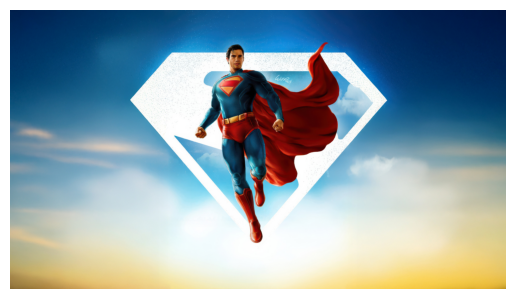

In [6]:
plt.imshow(img)
plt.axis("off")

In [7]:
img_rgb = np.array(img)

In [8]:
import cv2

img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

## SECTION 2 : Questions

Embed your own image, the above shown is specifically for last part.

### Part A

#### Task 1 - Convolution
Write a function <code>convolve(img, kernel)</code>
Hint : Lookup <code>np.pad</code> function for padding and research how it works. It takes different modes, one that we want to use is <code>reflect</code>
Also, learn what exactly <code>*</code> does ( particularly if it can convolve matrices of different sizes and if at all you use it, then where you can and where you cannot ). Use it later on for your ease.

#### Task 2 — Average Blur

Implement a function <code>average_blur_gray(img, ksize)</code> using:
* A box kernel of size ksize × ksize
* Only NumPy (no cv2 filtering functions)

Repeat for RGB:

* Apply the kernel on each channel separately.

#### Task 3 - Gaussian Blur

1. Implement a Gaussian kernel generator:
The function signature should be <code>gaussian_kernel(ksize, sigma)</code>
It should return a numpy matrix that is the normalsied gaussian kernel with dimensions ksize x ksize and the 2D gaussian distribution calculation done with standard deviation as sigma. I had talked about it in the lecture, for any queries, research first cuz its not hard to put in values and compute.

2. Convolve it with:
* Gray image
* Each RGB channel

And, then display all results along with the original image.



In [9]:
# Your PART A codes follow here. You can create more cells under this. Write clean and commented code.

In [10]:
def convolve(img, kernel):
    # getting img and kernel dimensions
    img_h, img_w = img.shape
    k_h, k_w = kernel.shape

    # calculating padding
    pad_h = k_h // 2
    pad_w = k_w // 2

    # create padding applied image
    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')

    output_img = np.zeros_like(img)

    # sliding window operation
    for i in range(img_h):
        for j in range(img_w):
            # region of interest
            roi = padded_img[i: i+k_h, j: j+k_w]

            # summing over elementwise products
            output_img[i, j] = np.sum(roi * kernel)

    return output_img


In [11]:
def average_blur_gray(img, ksize):
    # matrx of ones, normalised by ksize
    kernel = np.ones((ksize, ksize), dtype=np.float32) / (ksize*ksize)

    return convolve(img, kernel)

In [12]:
def average_blur_rgb(img, ksize):
    r = average_blur_gray(img[:, :, 0], ksize)
    g = average_blur_gray(img[:, :, 1], ksize)
    b = average_blur_gray(img[:, :, 2], ksize)

    blurred = np.dstack((r,g,b))
    return np.clip(blurred, 0, 255).astype(np.uint8)

In [13]:
avg_blur_img = average_blur_rgb(img_rgb, 11)

(np.float64(-0.5), np.float64(1919.5), np.float64(1079.5), np.float64(-0.5))

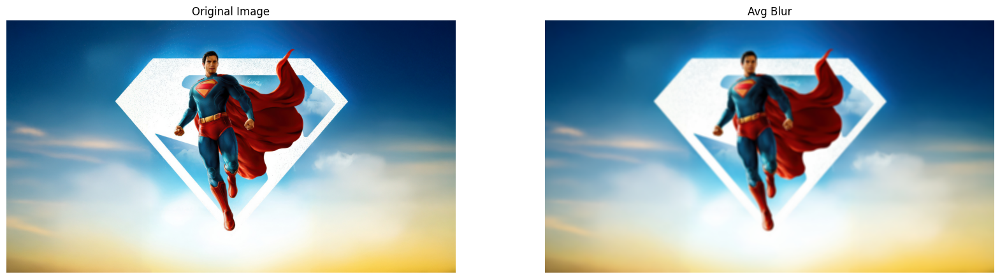

In [14]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(img_rgb); plt.title("Original Image")
plt.axis("off")
plt.subplot(1,2,2); plt.imshow(avg_blur_img); plt.title("Avg Blur")
plt.axis("off")

In [15]:
def gaussian_kernel(ksize, sigma):
    # create a coordinate grid
    axis = np.arange(-(ksize//2), (ksize//2)+1)
    xx, yy = np.meshgrid(axis, axis)

    # calculate guassian function and normalse later
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))

    return kernel / np.sum(kernel)

In [16]:
gauss_k = gaussian_kernel(5, 0.8)

In [17]:
gauss_gray = convolve(img_gray, gauss_k)

In [18]:
r_gauss = convolve(img_rgb[:, :, 0], gauss_k)
g_gauss = convolve(img_rgb[:, :, 1], gauss_k)
b_gauss = convolve(img_rgb[:, :, 2], gauss_k)

In [19]:
gauss_rgb = np.dstack((r_gauss, g_gauss, b_gauss))
gauss_rgb_img = np.clip(gauss_rgb, 0, 255).astype(np.uint8)

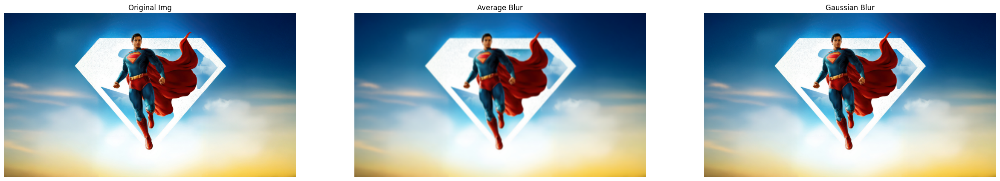

In [20]:
plt.figure(figsize=(30,12))
plt.subplot(1,3,1); plt.imshow(img_rgb); plt.title("Original Img")
plt.axis("off")
plt.subplot(1,3,2); plt.imshow(avg_blur_img); plt.title("Average Blur")
plt.axis("off")
plt.subplot(1,3,3); plt.imshow(gauss_rgb_img); plt.title("Gaussian Blur")
plt.axis("off")
plt.show()

### Part B

#### Task - Sobel Edge Detection (NumPy Only)
Implement Sobel X and Sobel Y filters manually using convolution. Apply on the grayscale image.

Compute:
1. Gx
2. Gy
3. Gradient magnitude

Normalize to 0–255 and save the edge map. Threshold if you wish to, if you do then make the thresholding part clear using code comments.

In [21]:
# Your PART B codes follow here. You can create more cells under this. Write clean and commented code.

In [22]:
def sobel_edge_detection(img_gray):
    Gx = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]], dtype=np.float32)

    Gy = np.array([[-1, -2, -1],
                   [0,  0,  0],
                   [1,  2,  1]], dtype=np.float32)

    img_float = img_gray.astype(np.float32)

    gx_out = convolve(img_float, Gx)
    gy_out = convolve(img_float, Gy)

    magnitude = np.sqrt(gx_out**2 + gy_out**2)
    magnitude_norm = (magnitude / (np.max(magnitude) + 1e-9)) * 255

    return magnitude_norm.astype(np.uint8), gx_out, gy_out

In [23]:
edge_mag, sobel_x, sobel_y = sobel_edge_detection(img_gray)

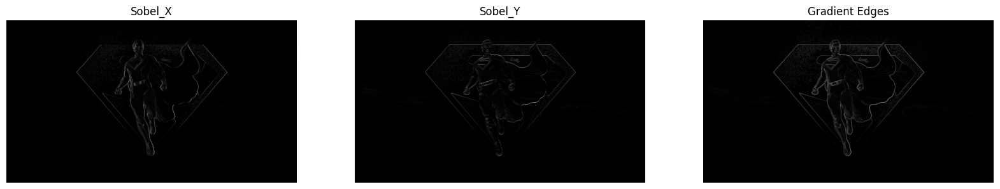

In [24]:
plt.figure(figsize=(20,10))

plt.subplot(1,3,1); plt.imshow(np.abs(sobel_x), cmap="gray"); plt.title("Sobel_X"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(np.abs(sobel_y), cmap="gray"); plt.title("Sobel_Y"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(edge_mag, cmap="gray"); plt.title("Gradient Edges"); plt.axis("off")
plt.show()

(np.float64(-0.5), np.float64(1919.5), np.float64(1079.5), np.float64(-0.5))

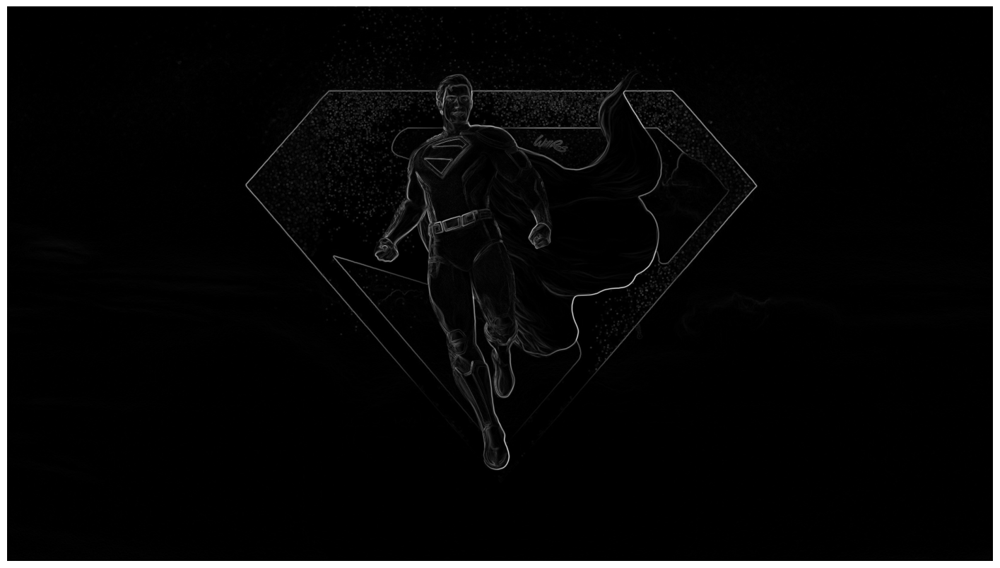

In [40]:
plt.figure(figsize=(18,12))
plt.imshow(edge_mag, cmap='gray')
plt.axis("off")

### Part C

#### Task 1 — Laplacian Sharpening ( Only Numpy and Grayscale )
1. Use any 3×3 Laplacian kernel (4-connected or 8-connected).

2. Compute:
* <code>lap = convolve(img, laplacian_kernel)</code>
* <code>sharp = img - lap * alpha</code> where alpha ∈ [0.2, 1].

3. Now, put alpha = 1, if you had chosen a different value earlier. Get a new output. Then use the code in the lecture to do the same using cv2. Now, use python to verify if both numpy with alpha = 1 and cv2 give the exact same output ( Compare the matrices )

#### Task 2 - Unsharp Masking ( Only Numpy and Grayscale )
1. Apply Gaussian blur (from Part 1).
2. Subtract blurred image from original: <code> mask = img - blurred </code>
3. Add scaled mask back: <code>sharp = img + alpha * mask</code> , where you can choose any value of alpha.
4. See how negative values of alpha will give you a blurred image.  



In [26]:
# Your PART C codes follow here. You can create more cells under this. Write clean and commented code.

In [31]:
def laplacian_sharpening(img_gray, alpha=1.0):
    lap_kernel = np.array([[0,  1,  0],
                           [1, -4,  1],
                           [0,  1,  0]], dtype=np.float32)

    img_float = img_gray.astype(np.float32)
    lap = convolve(img_float, lap_kernel)

    sharpened = img_float - (alpha * lap)
    sharpened_img = np.clip(sharpened, 0, 255).astype(np.uint8)

    return sharpened_img

In [32]:
lap_img = laplacian_sharpening(img_gray, alpha=1.0)

OpenCV Ground Truth

In [33]:
lap_kernel = np.array([[0,  1,  0],
                       [1, -4,  1],
                       [0,  1,  0]], dtype=np.float32)

cv2_alpha = 1.0

cv2_lap = cv2.filter2D(img_gray.astype(np.float32), -1, lap_kernel)
cv2_sharpened = img_gray.astype(np.float32) - (cv2_alpha * cv2_lap)
cv2_lap_img = np.clip(cv2_sharpened, 0, 255).astype(np.uint8)

In [34]:
are_identcal = np.allclose(lap_img, cv2_lap_img, atol=1)

In [36]:
print(f"Are the numpy implementaton and cv2 similar : {are_identcal}")

Are the numpy implementaton and cv2 similar : True


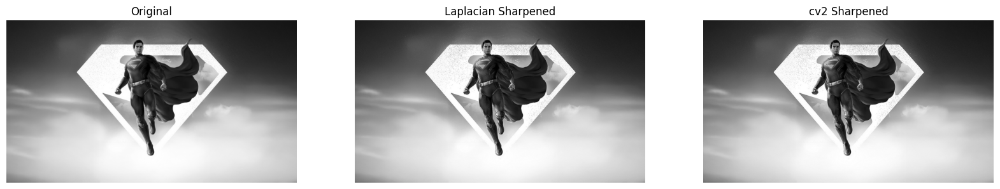

In [37]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(img_gray, cmap="gray"); plt.title("Original"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(lap_img, cmap="gray"); plt.title("Laplacian Sharpened"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(cv2_lap_img, cmap="gray"); plt.title("cv2 Sharpened"); plt.axis("off")
plt.show()

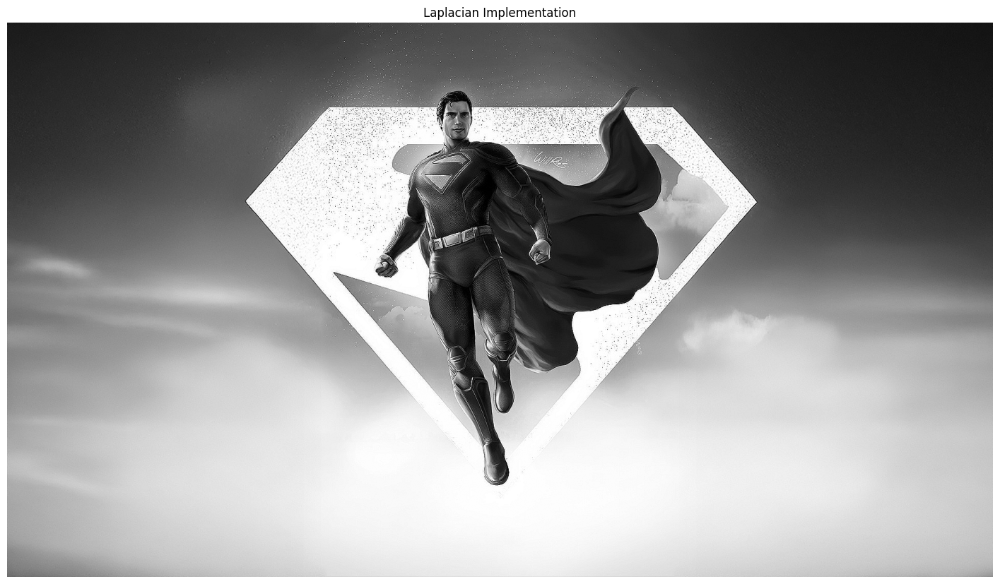

In [39]:
plt.figure(figsize=(18,12))
plt.imshow(lap_img, cmap="gray")
plt.title("Laplacian Implementation")
plt.axis("off")
plt.show()

In [41]:
def unsharp_masking(img_gray, alpha=1.0, ksize=5, sigma=1.0):
    img_float = img_gray.astype(np.float32)

    ax = np.arange(-(ksize//2), (ksize//2)+1)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2*sigma**2))
    # norm the kernel
    kernel = kernel / np.sum(kernel)

    blurred = convolve(img_float, kernel)

    # mask of details
    mask = img_float - blurred

    sharpened = img_float + (alpha * mask)

    return np.clip(sharpened, 0, 255).astype(np.uint8)


In [42]:
sharp_img = unsharp_masking(img_gray, alpha=2.0)

In [43]:
blurred_img = unsharp_masking(img_gray, alpha=-2.0)

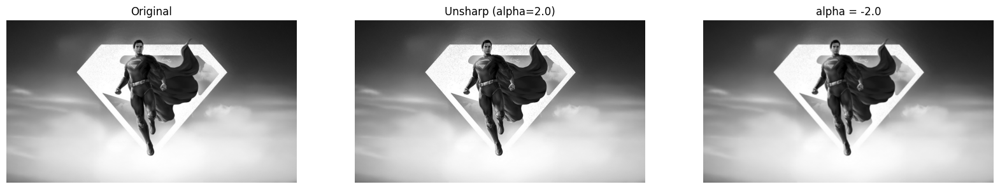

In [46]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(img_gray, cmap="gray"); plt.title("Original"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(sharp_img, cmap="gray"); plt.title("Unsharp (alpha=2.0)"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(blurred_img, cmap="gray"); plt.title("alpha = -2.0"); plt.axis("off")
plt.show()

*observation - for alpha = 2.0, we get sharpening effect

### Part D

#### Task - Frequency Analysis (LPF & HPF Verification)
Compute the magnitude spectrum of the original image, gaussian blurred image and the unsharp masking image. Now, play with the alpha value in sharpening and gaussian kernel and notice how the magntude spectrum changes.
Then, in code comments, explain your observations of dark and bright areas in the magnitude spectrum. In nutshell, verify how convolution is actually filtering frequencies depending on the kernel.

In [27]:
# Your PART D codes follow here. You can create more cells under this. Write clean and commented code.

In [50]:
def get_magnitude_spectrum(img):
    img_float = img.astype(np.float32)

    # compute fft
    f = np.fft.fft2(img_float)

    # shifting 0 freq component to the center of the spectrum
    fshift = np.fft.fftshift(f)

    # mag spectrum with 1e-9 to avoid log(0)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1e-9)

    return magnitude_spectrum

In [52]:
img_magnitude_spectrum = get_magnitude_spectrum(img_gray)

In [53]:
gauss_k = gaussian_kernel(5, sigma=2.0)
blurred_img = convolve(img_gray, gauss_k)
blur_magnitude_spectrum = get_magnitude_spectrum(blurred_img)

In [54]:
sharpened_img = unsharp_masking(img_gray, alpha=3.0)
sharp_magnitude_spectrum = get_magnitude_spectrum(sharpened_img)

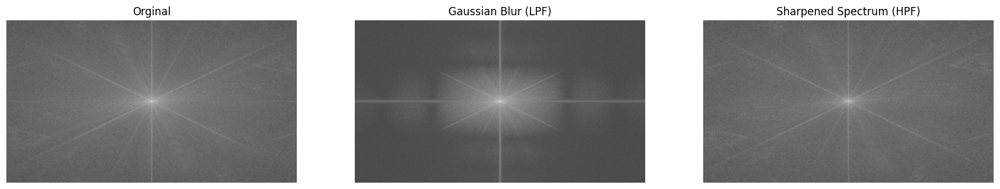

In [57]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(img_magnitude_spectrum, cmap="gray"); plt.title("Orginal"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(blur_magnitude_spectrum, cmap="gray"); plt.title("Gaussian Blur (LPF)"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(sharp_magnitude_spectrum, cmap="gray"); plt.title("Sharpened Spectrum (HPF)"); plt.axis("off")
plt.show()

*Observation
1. Gaussian Blur (LPF) : The Mag Spec is much darker in the cornes than the original

and outer region represents higher freq ie fine edges/details
ie blurring acts as LPF, suppressing high freq



2. Sharpening : The outer regons are more visible and have more noise than the original


ie sharpening boosts high freq components ie fine details

### Part E

#### Task - Custom Colour Kernel (Detect Yellow Leaf Edges)

**Instructions :**
* At the start of the assignment .ipynb file, you will find a code cell in section 1, run it to see an image with a yellow leaf amongst green leaves.
* Design a 3×3 or 5×5 custom kernel applied separately to each channel that highlights the edges where any other colour transitions into a yellowish hue.

**Hints :**

* Yellow = (R high, G high, B low)

* Dark green = (G high, R low, B low)

**Steps:**

1. Analyze the RGB values of green & yellow regions.

2. Create a custom kernel that responds strongly to change from green to yellow in:
* Red matrices of RGB
* Green matrices of RGB
* Optionally R - G difference
* Think about the gradient in Red - Green. Is there a huge change the value of R-G when colour changes from Green to Yellow ? If yes, try to exploit it.

3. Combine the response maps.

4. Get a clean outline around the leaf.

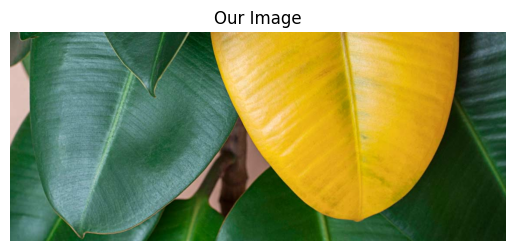

In [28]:
plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [29]:
# Your PART E codes follow here. You can create more cells under this. Write clean and commented code.

In [58]:
def detect_edges(img_rgb):
    # for red cape
    r_channel = img_rgb[:, :, 0]

    lap_kernel = np.array([[0,  1,  0],
                           [1, -4,  1],
                           [0,  1,  0]], dtype=np.float32)
    # apply to red channel
    edge_response = convolve(r_channel.astype(np.float32), lap_kernel)

    edges = np.abs(edge_response)
    # filter out weak edges and making strng edges white
    edges[edges < 30] = 0
    edges[edges >= 30] = 255

    return edges.astype(np.uint8)

In [59]:
cape_edges = detect_edges(img_rgb)

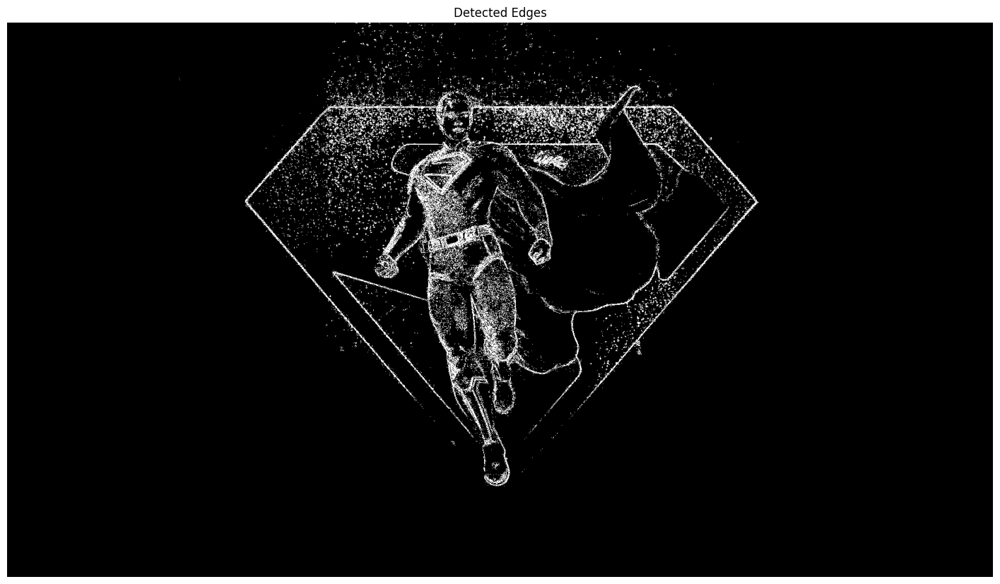

In [61]:
plt.figure(figsize=(18,12))
plt.imshow(cape_edges, cmap="gray")
plt.title("Detected Edges")
plt.axis("off")
plt.show()

### Bonus - Part F

#### Task - Color Manipulation Using Lecture 2 Concepts

**NOTE :** only for this, you can use cv2 functions, no need of doing everything in Numpy. Although there are still more brownie parts for Numpy hardwork.

1. Convert the RGB image to HSV. Use your rgb_to_hsv() from Lecture 2 Assignment - free Numopy points ;)) .
2. Identify pixels belonging to the yellow leaf using an HSV mask. (maybe take help from Part E or design a new hue mask)
3. Now use your full brain and chnage the colour of the leaf to red.

Convert back to RGB.

Display the final result.

For reference, heres the image I expect as a result. And its not actually tough, easy 5 lines code.
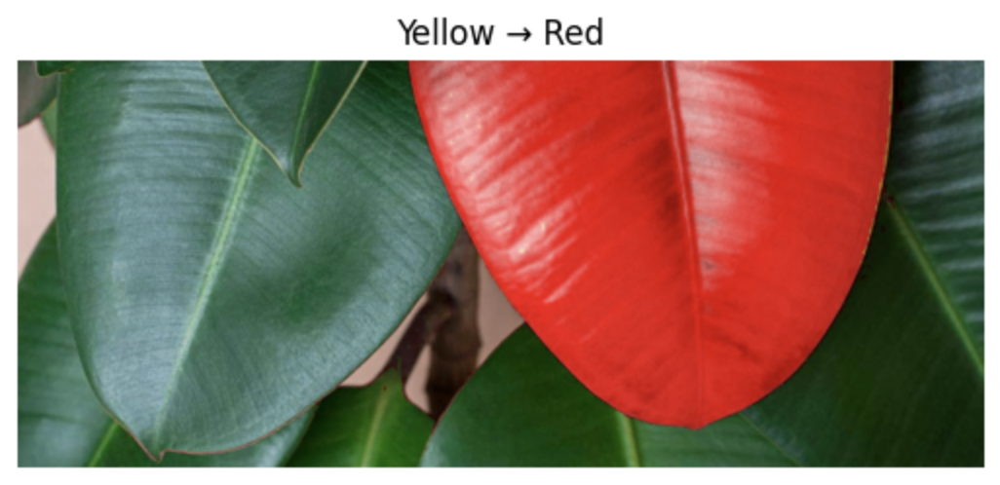

Also, we can change to a less brighter colour
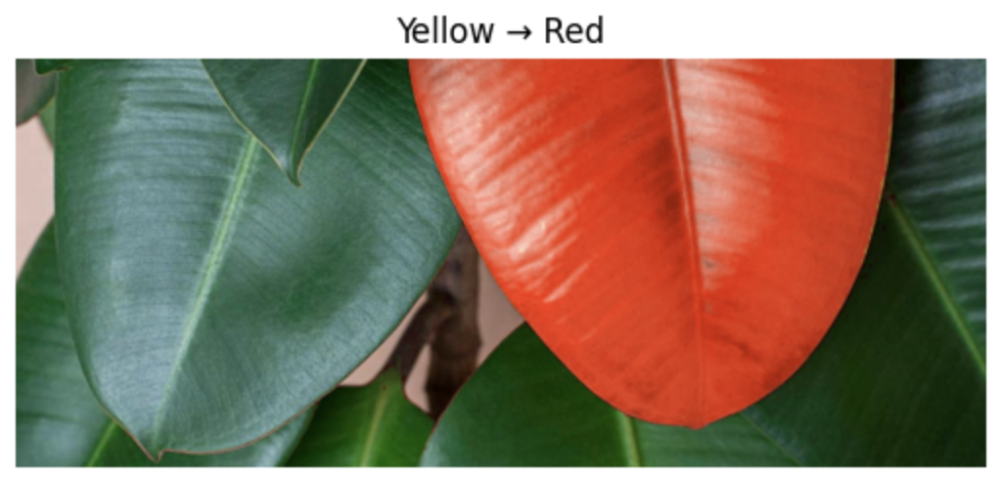

In [30]:
# Your BONUS PART codes follow here. You can create more cells under this. Write clean and commented code.

In [62]:
def change(img_rgb):
    # convert to hsv
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

    # Red exists at both 0 and 180 degrees

    # 0 to 10 degrees
    lower_red_0 = np.array([0, 70, 50])
    upper_red_10 = np.array([10, 255, 255])

    #180 to 170 degrees
    lower_red_170 = np.array([0, 70, 50])
    upper_red_170 = np.array([10, 255, 255])

    # combining the masks
    mask1 = cv2.inRange(hsv, lower_red_0, upper_red_10)
    mask2 = cv2.inRange(hsv, lower_red_170, upper_red_170)
    red_mask = cv2.bitwise_or(mask1, mask2)

    # applying silver
    hsv[:, :, 1] = np.where(red_mask>0, 0, hsv[:, :, 1])

    # Boost value
    v_channel = hsv[:, :, 2].astype(np.int32)
    v_channel = np.where(red_mask>0, v_channel+20, v_channel)
    hsv[:, :, 2] = np.clip(v_channel, 0, 255).astype(np.uint8)

    silver_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

    return silver_img, red_mask

In [63]:
final_img, red_mask = change(img_rgb)

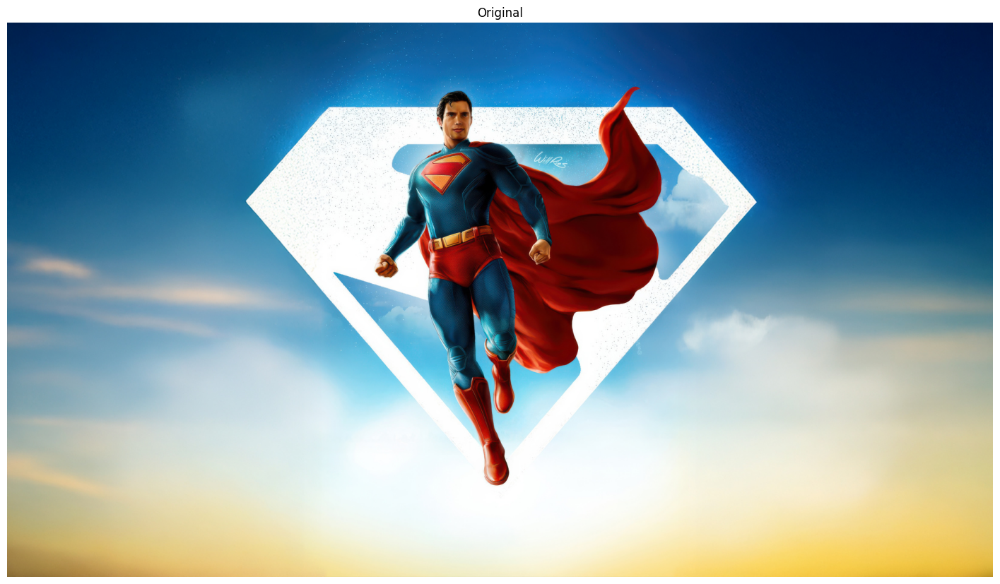

In [65]:
plt.figure(figsize=(18,12))
plt.imshow(img_rgb)
plt.title("Original")
plt.axis("off")
plt.show()

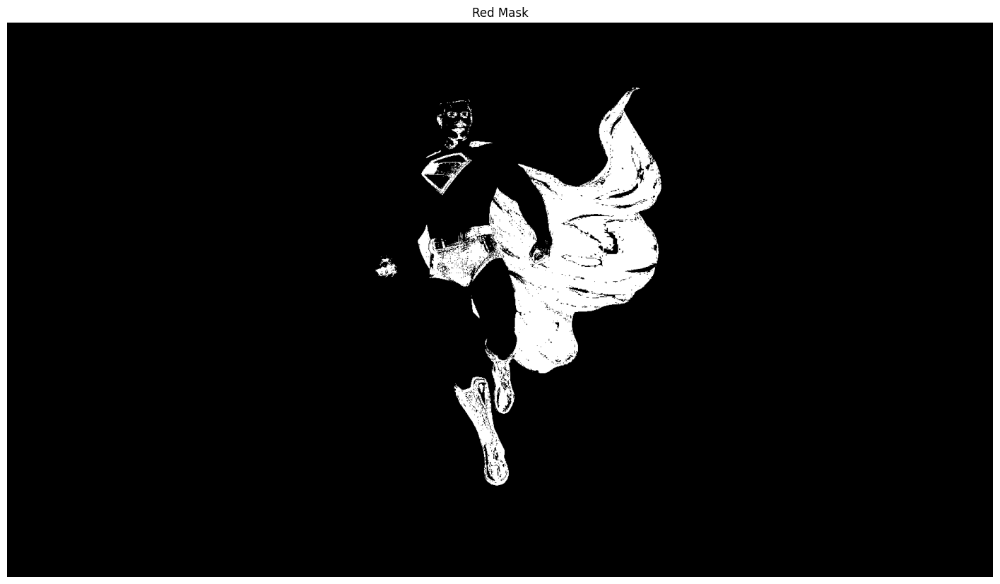

In [67]:
plt.figure(figsize=(18,12))
plt.imshow(red_mask, cmap="gray")
plt.title("Red Mask")
plt.axis("off")
plt.show()

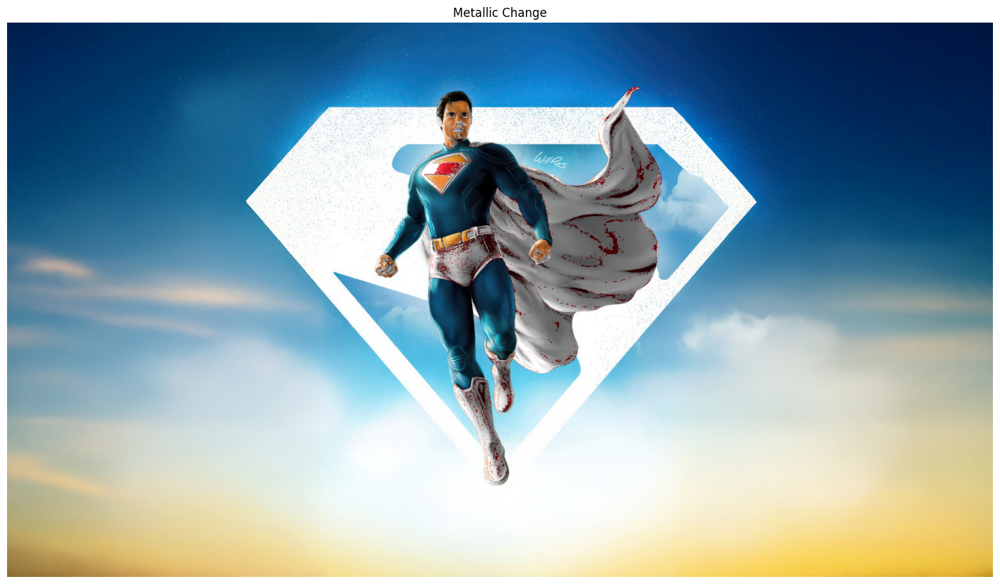

In [68]:
plt.figure(figsize=(18,12))
plt.imshow(final_img)
plt.title("Metallic Change")
plt.axis("off")
plt.show()